# TR.AI.NS Project


## Condition Simulations

This notebook is designed to simulate how the client average waiting time and total train covered distance are affected by the the variation of the number of trains, the client broadcast radius and the client arrival frequency. 

For this simulation it is specified that the step speed is 2 s/step and the train speed is of 20 m/s.

Code version v4.1

## TODO: 
Finish specifying..........

***

## Packages

In [1]:
# Library import

libFolder = "TR.AI.NS" # Library name

import sys, os
sys.path.append( os.path.join(os.path.dirname(sys.path[0])) + "/" + libFolder )


from Train import Train
from Client import Client, CliModes
from Network import Network

import csv
import numpy as np
from random import randint
import time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from math import sqrt
import pandas as pd

## Parameters

In [10]:
# Setting the simulation conditions

mapPath = "../TR.AI.NS/map_grid"    # Map file path

cliDataFile = "datasets/normal_map-grid_60rep_10000iter.npz"

total_steps_run = -1              # Variable to limit the amount of simulation loops to be performed
total_clients_finished = 60       # Variable to limit the amount of clients to be delivered

simRepeat = 20                     # Number of times each simulation is repeated (to garner statistics)

trainSpeed = 20         # Speed the trains moves in the railway network the map (m/s)

logName = "/Volumes/Amy's HDD/TCC - TRAINS/log_simulation-nTrains-bRadius-fClient.txt"     
                                                # Output log file. Stores all states of all trains and 
                                                # clients during each simulation loop

## Pre-processing

In [11]:
# Performance testing variables

n_trains = []
c_radius = []

m_del_time = {}
d_del_time = {}

m_wait_time = {}
d_wait_time = {}

m_answ_time = {}
d_answ_time = {}

m_train_dist = {}
d_train_dist = {}

client_time = []
client_pos = []

In [12]:
# Auxiliary classes

class Simulation:
    def __init__(self):
        self.devices = []
        self.trainRange = 0
        self.clientRange = 0

Reading map file (../TR.AI.NS/map_grid)
	Going over graph info
	 - Map contains 81 vertices and 144 edges
	Going over vertices positions
	 - Got positions of the 81 vertices. 19 are stopping points
	Going over graph edges
	 - Read over 144 edges in graph


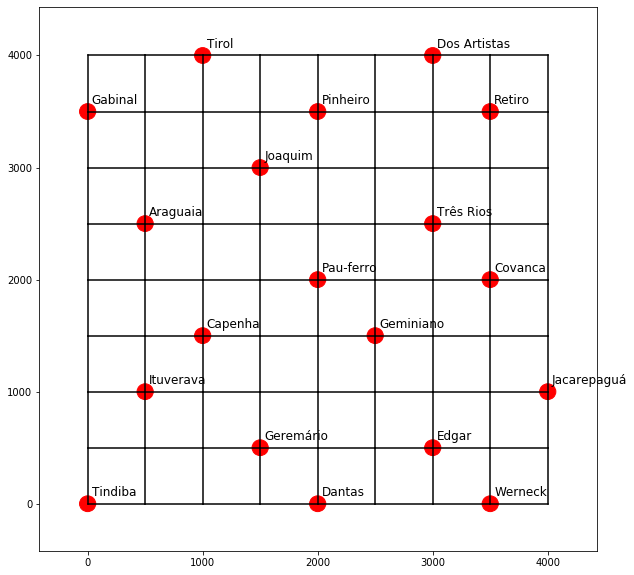

In [13]:
# Loading map

print("Reading map file (%s)" % mapPath)

# Getting CSV file names
graphInfo = "%s/Sheet 1-Graph Info.csv" % mapPath
vertices = "%s/Sheet 1-Vertices Positions.csv" % mapPath
connections = "%s/Sheet 1-Connection Matrix.csv" % mapPath


# Reading Graph Info table
print("\tGoing over graph info")

nVertices = 0
nEdges = 0
map_size = 0
with open(graphInfo) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=';')
    line_count = 0
    for row in csv_reader:
        if line_count == 0:
            if not row[0] == "Number of vertices":
                raise Exception("Wrong input file format. See map input format")
            nVertices = int(row[1])
        elif line_count == 1:
            if not row[0] == "Number of connections":
                raise Exception("Wrong input file format. See map input format")
            nEdges = int(row[1])
        else:
            if not row[0] == "Map size":
                raise Exception("Wrong input file format. See map input format")
            map_size = float(row[1])
        line_count += 1
                                
    print("\t - Map contains %d vertices and %d edges" % (nVertices, nEdges))

# Reading Vertices Positions table
print("\tGoing over vertices positions")
                                
vert_pos = []
stoppingPoints = {}
stoppingPointsPos = []
with open(vertices) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=';')
    line_count = -1
    for row in csv_reader:
        if line_count == -1:
            line_count += 1
            continue
        vert_pos += [(float(row[1]), float(row[2]))]
        if row[0][0] != "_":
            stoppingPoints[row[0]] = line_count
            stoppingPointsPos += [(float(row[1]), float(row[2]))]
        line_count += 1
    if line_count != nVertices:
        raise Exception("Wrong input file format. The number of vertices given doesn't match the number of vertices specified")
    print("\t - Got positions of the %d vertices. %d are stopping points" %
          (nVertices, len(stoppingPoints.keys())))
                                
# Reading Connection Matrix table
print("\tGoing over graph edges")
                                
edges = np.ndarray(shape=(nVertices, nVertices), dtype=float)
edges.fill(-1)
                                
# Availability dictionary
availability = {}
                                
with open(connections) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=';')
    line_count = 0
    edge_count = 0
    for row in csv_reader:
        for i in range(nVertices):
            if row[i] != "":
                edges[line_count][i] = float(row[i])
                if line_count != i:
                    a = max(line_count, i)
                    b = min(line_count, i)
                    availability[ (a, b) ] = True
                if line_count > i:
                    edge_count += 1
        line_count += 1
    if nEdges != edge_count:
        raise Exception("Wrong input file format. Number of edges given doesn't match the specified number")
    print("\t - Read over %d edges in graph" % edge_count)

    
# Printing the map
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1)

nEdgesDrawn = 0
for i in range(nVertices):
    for j in range(nVertices):
        if j >= i:
            break
        if edges[i][j] > 0:
            ax.plot([vert_pos[i][0], vert_pos[j][0]], [vert_pos[i][1], vert_pos[j][1]], 'k', zorder=-4)
            nEdgesDrawn += 1

xmin, xmax, ymin, ymax = ax.axis()
scale = (ymax-ymin) * .016  # Scale fator to print visible circles
for ponto in stoppingPoints.keys():
    pos = vert_pos[stoppingPoints[ponto]]
    c = plt.Circle(pos, radius=scale, color='r', zorder=-5)
    ax.add_patch(c)
    ax.text(pos[0] + scale*.5, pos[1] + scale, ponto, fontsize=12, wrap=True, zorder=-3)

xmin, xmax, ymin, ymax = ax.axis()
diverge = .05
xmin = xmin - (xmax - xmin) * diverge
xmax = xmax + (xmax - xmin) * diverge
ymin = ymin - (ymax - ymin) * diverge
ymax = ymax + (ymax - ymin) * diverge
ax.axis([xmin, xmax, ymin, ymax])

plt.show()

In [14]:
# Loading client creation dataset

client_dataset = np.load(cliDataFile)
client_creation = client_dataset.get("client")
client_position = client_dataset.get("init_stat")
client_destination = client_dataset.get("fin_stat")

## Simulation

In [15]:
# NUMBER OF TRAINS:
n_trains = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
#------------------
# CLIENT BROADCAST RADIUS
c_radius = [1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4]
#------------------
# CLIENT FREQUENCY (SYSTEM OCUPANCY)
f_client = [20, 25, 30, 50]
#------------------

step_speed = 1               # Passage of time for each simulation loop (s/step)

In [16]:
# Creating simulations log file

#logFile = open(logName, "w")

In [17]:
for freq in f_client:
    for clientRange in c_radius:
        m_del_time[(freq, clientRange)] = []
        d_del_time[(freq, clientRange)] = []
        m_wait_time[(freq, clientRange)] = []
        d_wait_time[(freq, clientRange)] = []
        m_answ_time[(freq, clientRange)] = []
        d_answ_time[(freq, clientRange)] = []
        m_train_dist[(freq, clientRange)] = []
        d_train_dist[(freq, clientRange)] = []

        # Creating Network
        sim = Simulation()
        net = Network(sim, log=False)
        sim.clientRange = int(map_size * clientRange)
        sim.trainRange = 3 * sim.clientRange

        for nTrains in n_trains:
            deliveryTimeList = []
            waitTimeList = []
            answTimeList = []
            trainDistanceRun = []

            for turn in range(simRepeat):
                print("Simulation with {} trains, range {}%, occupancy parameter {}. Turn {}".
                      format(nTrains, clientRange*100, freq, turn+1))
                # Zeroing variables
                waitingTime = {}
                answerTime = {}
                deliveryTime = {}

                sim.devices = []

                for key in availability.keys():
                    availability[key] = True

                # Creating train objects

                v_step = step_speed

                for i in range(nTrains):
                    idx = randint(0, len(stoppingPointsPos) - 1)
                    pos = stoppingPointsPos[ idx ]
                    tr = Train(i, pos, v_step, mapPath, availability, net, vMax = trainSpeed, log=False)
                    sim.devices += [tr]

                # Client object variables
                nClients = 0
                currCli = 0.5
                clientList = []
                outingClients = {}

                # Looping simulation

                simTime = 0
                out_file = ""
                finished = False

                while not finished:
                    clockcount = simTime * v_step
                    clockcount = float(clockcount)
                    hour = int(clockcount // 3600)
                    clockcount %= 3600
                    minutes = int(clockcount // 60)
                    clockcount %= 60
                    seconds = int (clockcount)
                    # print( "Simulation counter: {:02d}:{:02d}:{:02d} ({} iterations)".
                    #                             format(hour, minutes, seconds, simTime) )

                    # Creating random clients
                    if currCli < total_clients_finished:
                        r = client_creation[turn][simTime]
                        if r % freq == 0:
                            init = client_position[turn][simTime]
                            fin = client_destination[turn][simTime]
                            if fin == init:
                                fin += 1
                                if fin == len(stoppingPointsPos):
                                    fin = 0
                            pos = stoppingPointsPos[init]
                            dest = stoppingPointsPos[fin]
                            cl = Client(currCli, pos, dest, v_step, mapPath, net, log=False)
                            sim.devices += [cl]
                            clientList += [cl]
                            currCli += 1

                    # Run all devices
                    for device in sim.devices:
                        device.step()

                    for client in clientList:
                        # Remove clients from list
                        if client.mode == CliModes.dropoff:
                            if client not in outingClients.keys():
                                outingClients[client] = 0
                            else:
                                outingClients[client] += 1
                            if outingClients[client] >= 10:
                                # Getting client waiting time statistics
                                waitingTime[client.id] = client.waitingTime*step_speed
                                answerTime[client.id] = client.timeTillRequest*step_speed
                                deliveryTime[client.id] = client.serviceTime*step_speed

                                # Removing client from simulation
                                sim.devices.remove(client)
                                clientList.remove(client)
                                client.kill()
                                nClients += 1

                    # Simulation log
                    out_file += "Simulation step {}, timer {}\n".format(simTime, simTime*v_step)
                    for device in sim.devices:
                        out_file += "\tDevice {}, mode {}: position {}\n".format(device.id, device.mode, device.pos)
                        if isinstance(device, Train):
                            out_file += "\t  Processing request {}\n".format(device.unprocessedReqs)
                            out_file += "\t  Path {}\n".format(device.path)
                            out_file += "\t  Goals (current goal is {}) {}\n".format(device.currentGoal, device.goals)
                            out_file += "\t  In course clients {}\n".format(device.inCourseClients)
                            out_file += "\t  Clients list {}\n".format(device.client)
                        elif isinstance(device, Client):
                            out_file += "\t  Destination: {}.\n".format(device.destiny)
                            out_file += "\t  Train that will pick me up {}\n".format(device.train)
                        out_file += "\t  Message buffer {}\n".format(device.messageBuffer)
                    out_file += "\n"

                    # Simulation step counter
                    simTime += 1

                    # Check for simulation closure
                    if total_steps_run != -1:
                        if simTime >= total_steps_run:
                            finished = True
                    elif nClients != -1:
                        if nClients >= total_clients_finished:
                            finished = True

                print("Finished simulation!")
                out_file += "The end"

                #logFile.write("Test with {} trains, broadcast range {} and client frequency {}. {}th attempt\n\n{}\n\n\n".
                #              format(nTrains, clientRange, freq, turn+1, out_file))


                # Waiting time statistics

                print("Total time waited by clients: {}".format(waitingTime))
                print("Time waited by clients until they got a train answer: {}".format(answerTime))

                print("Non serviced clients: ")
                for client in clientList:
                    if client.mode not in [CliModes.moving, CliModes.dropoff]:
                        print("Client {} is in mode {} and has a total waiting time of {} simulation counts".\
                              format(client.id, client.mode, client.waitingTime))


                # Average waiting time
                sumTime = 0
                for value in deliveryTime.values():
                    sumTime += value

                deliveryTimeList += [ sumTime/len(deliveryTime.keys()) ]
                
                sumTime = 0
                for value in waitingTime.values():
                    sumTime += value

                waitTimeList += [ sumTime/len(waitingTime.keys()) ]

                sumTime = 0
                for value in answerTime.values():
                    sumTime += value

                answTimeList += [ sumTime/len(answerTime.keys()) ]

                print("Average waiting time for {} trains: {}".format(nTrains, waitTimeList[turn]))
                print("Serviced {} clients in {} simulation counts\n".format(len(waitingTime.keys()), simTime))

                # Train distances
                sumDistance = 0
                for dev in sim.devices:
                    if isinstance(dev, Train):
                        sumDistance += dev.totalDistanceRun

                trainDistanceRun += [sumDistance]


            sizeLists = len(waitTimeList)
            sumTimeT = 0
            sumTime = 0
            sumTime2 = 0
            sumDistance = 0

            for i in range(sizeLists):
                sumTimeT += deliveryTimeList[i]
                sumTime += waitTimeList[i]
                sumTime2 += answTimeList[i]
                sumDistance += trainDistanceRun[i]
            
            meanDeliveryTime = sumTimeT/sizeLists
            meanWaitTime = sumTime/sizeLists
            meanAnswerTime = sumTime2/sizeLists
            totalDistance = sumDistance/sizeLists

            sumTimeT = 0
            sumTime = 0
            sumTime2 = 0
            sumDistance = 0

            for i in range(sizeLists):
                sumTimeT += (deliveryTimeList[i] - meanDeliveryTime)**2
                sumTime += (waitTimeList[i] - meanWaitTime)**2
                sumTime2 += (answTimeList[i] - meanAnswerTime)**2
                sumDistance += (trainDistanceRun[i] - totalDistance)**2

            devDeliveryTime = sqrt(sumTimeT/sizeLists)
            devWaitTime = sqrt(sumTime/sizeLists)
            devAnswerTime = sqrt(sumTime2/sizeLists)
            devDistance = sqrt(sumDistance/sizeLists)
            
            m_del_time[(freq, clientRange)] += [meanDeliveryTime]
            m_wait_time[(freq, clientRange)] += [meanWaitTime]
            m_answ_time[(freq, clientRange)] += [meanAnswerTime]
            m_train_dist[(freq, clientRange)] += [totalDistance]

            d_del_time[(freq, clientRange)] += [devDeliveryTime]
            d_wait_time[(freq, clientRange)] += [devWaitTime]
            d_answ_time[(freq, clientRange)] += [devAnswerTime]
            d_train_dist[(freq, clientRange)] += [devDistance]

            print("Average waiting time for {} trains: {}".format(nTrains, meanWaitTime))
            print("Average total train percourse for {} trains: {}".format(nTrains, totalDistance))
            print("\t (Distances of each simulation: {} )".format(trainDistanceRun))
            print("\n")

Simulation with 5 trains, range 100.0%, occupancy parameter 20. Turn 1
Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 55, 2.5: 172, 12.5: 55, 16.5: 69, 1.5: 145, 5.5: 255, 9.5: 244, 6.5: 230, 8.5: 400, 19.5: 207, 4.5: 483, 14.5: 498, 7.5: 602, 27.5: 357, 10.5: 588, 29.5: 119, 42.5: 103, 31.5: 460, 20.5: 798, 13.5: 795, 21.5: 521, 37.5: 172, 41.5: 208, 11.5: 778, 15.5: 139, 34.5: 702, 17.5: 1035, 18.5: 1138, 23.5: 1145, 25.5: 897, 50.5: 384, 28.5: 937, 38.5: 793, 33.5: 443, 22.5: 1314, 32.5: 1183, 36.5: 1140, 43.5: 1028, 39.5: 1161, 53.5: 368, 57.5: 403, 24.5: 1557, 47.5: 1222, 35.5: 1494, 45.5: 1278, 51.5: 1201, 44.5: 1447, 48.5: 1531, 46.5: 437, 49.5: 1598, 26.5: 1905, 54.5: 1518, 58.5: 703, 52.5: 1671, 30.5: 2279, 56.5: 1592, 40.5: 2294, 55.5: 2093, 59.5: 1810}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 54, 2.5: 47, 12.5: 47, 16.5: 47, 1.5: 50, 5.5: 55, 9.5: 47, 6.5: 52, 8.5: 48, 19.5: 47, 4.5: 87, 14.5: 65, 7.5: 47, 27.5: 47, 10.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 122, 2.5: 147, 0.5: 197, 4.5: 199, 7.5: 149, 3.5: 306, 11.5: 94, 8.5: 276, 5.5: 229, 13.5: 188, 15.5: 264, 18.5: 264, 9.5: 394, 6.5: 554, 22.5: 512, 21.5: 441, 14.5: 440, 12.5: 700, 10.5: 809, 42.5: 118, 17.5: 823, 23.5: 612, 16.5: 991, 26.5: 699, 27.5: 827, 31.5: 450, 29.5: 823, 19.5: 983, 32.5: 344, 20.5: 1159, 54.5: 310, 53.5: 253, 34.5: 932, 33.5: 948, 56.5: 78, 24.5: 1235, 35.5: 981, 28.5: 1266, 36.5: 1050, 38.5: 1094, 37.5: 1212, 25.5: 1497, 44.5: 1126, 39.5: 1285, 43.5: 1314, 30.5: 1757, 49.5: 1235, 41.5: 1517, 50.5: 939, 45.5: 630, 40.5: 1715, 51.5: 1519, 55.5: 1397, 46.5: 1877, 47.5: 1725, 52.5: 1607, 57.5: 1736, 58.5: 1933, 48.5: 2154, 59.5: 2321}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 0.5: 47, 4.5: 61, 7.5: 47, 3.5: 51, 11.5: 46, 8.5: 51, 5.5: 47, 13.5: 47, 15.5: 47, 18.5: 47, 9.5: 47, 6.5: 47, 22.5: 47, 21.5: 51, 14.5: 47, 12.5: 47, 10.5: 47, 42.5: 46, 17.5: 47, 23.5: 47, 16.5: 52, 26

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 110, 3.5: 103, 4.5: 175, 2.5: 282, 6.5: 199, 7.5: 489, 9.5: 463, 11.5: 434, 5.5: 472, 8.5: 620, 42.5: 253, 17.5: 748, 15.5: 839, 13.5: 760, 10.5: 782, 23.5: 941, 12.5: 1081, 26.5: 535, 18.5: 1051, 50.5: 616, 20.5: 1100, 14.5: 174, 53.5: 505, 16.5: 1172, 24.5: 1045, 28.5: 1189, 19.5: 1335, 33.5: 1205, 21.5: 1329, 29.5: 1267, 27.5: 1285, 57.5: 208, 47.5: 711, 36.5: 939, 31.5: 1397, 22.5: 608, 39.5: 808, 44.5: 400, 48.5: 86, 25.5: 1459, 30.5: 1474, 52.5: 1120, 55.5: 432, 38.5: 1579, 37.5: 1058, 45.5: 181, 32.5: 1734, 40.5: 266, 35.5: 1723, 56.5: 1385, 34.5: 1941, 46.5: 1783, 49.5: 1888, 43.5: 1922, 41.5: 2096, 54.5: 1895, 58.5: 736, 51.5: 260, 59.5: 2204}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 60, 3.5: 53, 4.5: 50, 2.5: 89, 6.5: 49, 7.5: 80, 9.5: 79, 11.5: 56, 5.5: 109, 8.5: 53, 42.5: 46, 17.5: 56, 15.5: 59, 13.5: 99, 10.5: 80, 23.5: 59, 12.5: 73, 26.5: 57, 18.5: 96, 50.5: 46, 20.5: 49, 14.5: 1

Finished simulation!
Total time waited by clients: {1.5: 150, 3.5: 124, 0.5: 125, 2.5: 125, 6.5: 75, 11.5: 251, 5.5: 282, 7.5: 345, 9.5: 426, 4.5: 307, 14.5: 475, 10.5: 533, 8.5: 697, 18.5: 381, 19.5: 702, 13.5: 676, 39.5: 334, 22.5: 801, 20.5: 680, 12.5: 1022, 15.5: 937, 55.5: 321, 26.5: 913, 23.5: 1050, 24.5: 577, 27.5: 1106, 52.5: 582, 28.5: 1221, 16.5: 1234, 17.5: 1432, 38.5: 88, 25.5: 1377, 29.5: 1394, 33.5: 1312, 37.5: 1070, 31.5: 1463, 21.5: 1487, 49.5: 553, 35.5: 897, 34.5: 1435, 32.5: 1605, 36.5: 1483, 30.5: 1711, 45.5: 1315, 58.5: 589, 40.5: 1411, 44.5: 1544, 43.5: 1793, 41.5: 1891, 54.5: 315, 47.5: 1661, 42.5: 1893, 59.5: 931, 46.5: 1683, 57.5: 1703, 48.5: 1931, 50.5: 1955, 53.5: 644, 51.5: 1937, 56.5: 1922}
Time waited by clients until they got a train answer: {1.5: 50, 3.5: 49, 0.5: 50, 2.5: 50, 6.5: 46, 11.5: 51, 5.5: 50, 7.5: 49, 9.5: 56, 4.5: 50, 14.5: 80, 10.5: 70, 8.5: 51, 18.5: 57, 19.5: 70, 13.5: 59, 39.5: 46, 22.5: 82, 20.5: 100, 12.5: 109, 15.5: 76, 55.5: 48, 26.5

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 124, 1.5: 97, 3.5: 154, 7.5: 143, 9.5: 240, 4.5: 328, 5.5: 250, 10.5: 336, 14.5: 349, 8.5: 445, 6.5: 327, 13.5: 474, 17.5: 294, 12.5: 407, 21.5: 339, 15.5: 501, 19.5: 618, 50.5: 105, 20.5: 472, 26.5: 582, 16.5: 794, 30.5: 220, 22.5: 703, 34.5: 382, 23.5: 700, 24.5: 643, 11.5: 800, 53.5: 96, 37.5: 693, 33.5: 735, 18.5: 1112, 29.5: 955, 36.5: 131, 27.5: 936, 40.5: 933, 39.5: 978, 43.5: 993, 25.5: 1217, 56.5: 704, 41.5: 1137, 32.5: 1168, 46.5: 1193, 47.5: 1101, 55.5: 968, 38.5: 1353, 51.5: 1234, 28.5: 1411, 49.5: 1300, 58.5: 507, 44.5: 1592, 59.5: 1239, 31.5: 1781, 54.5: 1528, 45.5: 1888, 57.5: 1631, 35.5: 2157, 52.5: 1957, 42.5: 2483, 48.5: 2737}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 49, 1.5: 47, 3.5: 58, 7.5: 47, 9.5: 48, 4.5: 53, 5.5: 50, 10.5: 50, 14.5: 47, 8.5: 52, 6.5: 47, 13.5: 47, 17.5: 47, 12.5: 47, 21.5: 47, 15.5: 57, 19.5: 47, 50.5: 46, 20.5: 47, 26.5: 48, 16.5: 47, 30.5: 46, 22.5: 

Finished simulation!
Total time waited by clients: {0.5: 198, 3.5: 97, 2.5: 99, 5.5: 136, 1.5: 176, 10.5: 183, 6.5: 48, 9.5: 329, 7.5: 270, 4.5: 411, 14.5: 125, 19.5: 73, 11.5: 423, 17.5: 363, 8.5: 538, 18.5: 302, 12.5: 353, 24.5: 97, 25.5: 349, 21.5: 448, 23.5: 441, 37.5: 259, 13.5: 651, 15.5: 732, 27.5: 395, 29.5: 626, 30.5: 543, 32.5: 419, 34.5: 530, 16.5: 1005, 22.5: 812, 35.5: 664, 31.5: 806, 49.5: 278, 39.5: 795, 44.5: 741, 38.5: 712, 20.5: 1073, 26.5: 1009, 40.5: 1045, 50.5: 480, 53.5: 739, 45.5: 266, 28.5: 1308, 42.5: 858, 41.5: 879, 33.5: 1275, 36.5: 637, 52.5: 1098, 54.5: 1146, 47.5: 1299, 46.5: 1210, 43.5: 1324, 57.5: 1268, 58.5: 1153, 48.5: 1653, 51.5: 1563, 59.5: 1273, 56.5: 1799, 55.5: 1845}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 46, 2.5: 49, 5.5: 61, 1.5: 51, 10.5: 49, 6.5: 47, 9.5: 49, 7.5: 50, 4.5: 50, 14.5: 50, 19.5: 46, 11.5: 51, 17.5: 48, 8.5: 69, 18.5: 47, 12.5: 47, 24.5: 46, 25.5: 47, 21.5: 49, 23.5: 58, 37.5: 46, 13.5: 51, 15.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 122, 2.5: 98, 4.5: 126, 6.5: 249, 3.5: 98, 5.5: 226, 7.5: 370, 15.5: 271, 12.5: 175, 10.5: 383, 8.5: 398, 17.5: 390, 9.5: 389, 14.5: 535, 18.5: 459, 13.5: 500, 33.5: 110, 20.5: 491, 11.5: 724, 19.5: 743, 21.5: 654, 31.5: 390, 16.5: 881, 25.5: 633, 22.5: 707, 27.5: 812, 23.5: 801, 24.5: 868, 38.5: 694, 26.5: 1063, 29.5: 887, 28.5: 1046, 37.5: 923, 30.5: 1060, 35.5: 1074, 39.5: 1112, 42.5: 986, 45.5: 846, 32.5: 1318, 46.5: 1035, 51.5: 973, 34.5: 1234, 44.5: 1128, 40.5: 1258, 36.5: 1503, 48.5: 254, 58.5: 176, 50.5: 1202, 59.5: 94, 56.5: 465, 47.5: 1463, 41.5: 1542, 53.5: 1441, 43.5: 1840, 55.5: 1473, 52.5: 1517, 57.5: 1856, 49.5: 2044, 54.5: 2262}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 47, 2.5: 48, 4.5: 51, 6.5: 47, 3.5: 48, 5.5: 47, 7.5: 49, 15.5: 48, 12.5: 50, 10.5: 47, 8.5: 48, 17.5: 47, 9.5: 47, 14.5: 51, 18.5: 53, 13.5: 48, 33.5: 46, 20.5: 48, 11.5: 47, 19.5: 58, 21.5: 47, 31.5: 47, 16.5: 

Finished simulation!
Total time waited by clients: {1.5: 149, 2.5: 174, 5.5: 134, 0.5: 124, 4.5: 159, 3.5: 130, 7.5: 201, 12.5: 125, 17.5: 125, 9.5: 218, 8.5: 338, 11.5: 126, 18.5: 234, 6.5: 330, 10.5: 290, 14.5: 481, 20.5: 382, 27.5: 298, 24.5: 242, 16.5: 437, 13.5: 467, 22.5: 526, 15.5: 643, 21.5: 581, 34.5: 441, 25.5: 659, 23.5: 683, 31.5: 564, 32.5: 494, 28.5: 835, 36.5: 654, 37.5: 697, 30.5: 808, 44.5: 624, 19.5: 917, 41.5: 811, 45.5: 726, 40.5: 842, 35.5: 949, 26.5: 1189, 33.5: 987, 47.5: 902, 49.5: 83, 48.5: 825, 46.5: 1003, 51.5: 627, 42.5: 1237, 29.5: 1340, 58.5: 613, 59.5: 903, 38.5: 1116, 52.5: 1110, 55.5: 1083, 50.5: 1139, 39.5: 1271, 53.5: 1298, 43.5: 1666, 56.5: 1289, 54.5: 1345, 57.5: 1498}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 74, 5.5: 59, 0.5: 49, 4.5: 59, 3.5: 55, 7.5: 49, 12.5: 50, 17.5: 50, 9.5: 47, 8.5: 47, 11.5: 51, 18.5: 59, 6.5: 52, 10.5: 52, 14.5: 55, 20.5: 49, 27.5: 48, 24.5: 48, 16.5: 51, 13.5: 47, 22.5: 53, 15.5: 53, 21.5: 47, 

Finished simulation!
Total time waited by clients: {5.5: 124, 4.5: 176, 0.5: 123, 3.5: 123, 2.5: 224, 1.5: 138, 11.5: 101, 8.5: 335, 14.5: 234, 6.5: 362, 10.5: 256, 15.5: 390, 7.5: 391, 13.5: 401, 22.5: 399, 17.5: 321, 24.5: 475, 12.5: 626, 20.5: 616, 26.5: 516, 16.5: 648, 9.5: 623, 30.5: 621, 40.5: 144, 18.5: 851, 19.5: 711, 35.5: 536, 25.5: 911, 29.5: 803, 52.5: 390, 36.5: 786, 44.5: 680, 23.5: 900, 21.5: 987, 41.5: 898, 33.5: 970, 34.5: 1115, 49.5: 378, 28.5: 1159, 37.5: 1173, 42.5: 1010, 47.5: 958, 57.5: 784, 27.5: 1325, 32.5: 1423, 54.5: 1160, 55.5: 1068, 38.5: 1327, 45.5: 1274, 48.5: 1199, 31.5: 1573, 58.5: 1235, 46.5: 1484, 50.5: 1478, 39.5: 1773, 53.5: 1451, 59.5: 1563, 43.5: 1964, 56.5: 1724, 51.5: 2049}
Time waited by clients until they got a train answer: {5.5: 49, 4.5: 51, 0.5: 48, 3.5: 48, 2.5: 49, 1.5: 48, 11.5: 46, 8.5: 48, 14.5: 59, 6.5: 50, 10.5: 48, 15.5: 50, 7.5: 69, 13.5: 50, 22.5: 49, 17.5: 52, 24.5: 47, 12.5: 49, 20.5: 47, 26.5: 49, 16.5: 48, 9.5: 48, 30.5: 47, 40

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 124, 3.5: 50, 2.5: 99, 4.5: 152, 9.5: 48, 10.5: 99, 12.5: 62, 5.5: 215, 8.5: 133, 13.5: 214, 7.5: 221, 18.5: 100, 16.5: 232, 6.5: 385, 23.5: 99, 14.5: 338, 27.5: 218, 11.5: 472, 31.5: 49, 15.5: 356, 21.5: 363, 22.5: 316, 20.5: 366, 36.5: 193, 40.5: 97, 26.5: 432, 19.5: 582, 28.5: 317, 38.5: 285, 24.5: 524, 17.5: 627, 30.5: 510, 32.5: 629, 41.5: 408, 25.5: 785, 34.5: 647, 35.5: 574, 52.5: 197, 33.5: 731, 44.5: 586, 56.5: 377, 43.5: 687, 29.5: 905, 42.5: 640, 45.5: 622, 37.5: 850, 47.5: 829, 53.5: 700, 49.5: 865, 46.5: 765, 48.5: 794, 39.5: 1109, 50.5: 1049, 59.5: 839, 51.5: 1041, 54.5: 991, 58.5: 1020, 57.5: 1087, 55.5: 1202}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 3.5: 49, 2.5: 49, 4.5: 52, 9.5: 47, 10.5: 49, 12.5: 61, 5.5: 47, 8.5: 58, 13.5: 48, 7.5: 50, 18.5: 47, 16.5: 47, 6.5: 47, 23.5: 49, 14.5: 47, 27.5: 48, 11.5: 49, 31.5: 48, 15.5: 47, 21.5: 49, 22.5: 47, 20.5: 47, 36.5: 49, 40.5: 

Finished simulation!
Total time waited by clients: {2.5: 54, 0.5: 123, 4.5: 52, 12.5: 48, 5.5: 118, 3.5: 194, 7.5: 85, 16.5: 56, 1.5: 146, 9.5: 148, 8.5: 294, 10.5: 146, 19.5: 122, 6.5: 268, 14.5: 283, 15.5: 349, 11.5: 273, 13.5: 367, 24.5: 257, 26.5: 149, 20.5: 458, 22.5: 329, 35.5: 147, 17.5: 520, 18.5: 614, 39.5: 181, 30.5: 433, 23.5: 649, 27.5: 568, 21.5: 560, 33.5: 592, 25.5: 622, 54.5: 197, 43.5: 372, 31.5: 671, 37.5: 323, 29.5: 683, 38.5: 649, 28.5: 862, 57.5: 121, 32.5: 878, 46.5: 671, 47.5: 756, 42.5: 798, 44.5: 746, 36.5: 893, 34.5: 1058, 48.5: 926, 50.5: 728, 51.5: 751, 40.5: 1204, 41.5: 1021, 45.5: 1031, 49.5: 1183, 58.5: 518, 52.5: 1074, 56.5: 941, 53.5: 953, 55.5: 1191, 59.5: 985}
Time waited by clients until they got a train answer: {2.5: 53, 0.5: 48, 4.5: 51, 12.5: 47, 5.5: 68, 3.5: 69, 7.5: 46, 16.5: 48, 1.5: 54, 9.5: 48, 8.5: 47, 10.5: 48, 19.5: 47, 6.5: 50, 14.5: 54, 15.5: 47, 11.5: 47, 13.5: 48, 24.5: 47, 26.5: 49, 20.5: 49, 22.5: 47, 35.5: 47, 17.5: 48, 18.5: 49, 3

Finished simulation!
Total time waited by clients: {4.5: 52, 1.5: 130, 3.5: 64, 2.5: 103, 0.5: 125, 8.5: 64, 7.5: 157, 11.5: 51, 5.5: 125, 10.5: 150, 6.5: 227, 16.5: 58, 9.5: 182, 13.5: 196, 19.5: 103, 15.5: 209, 24.5: 162, 31.5: 140, 18.5: 358, 22.5: 400, 28.5: 112, 25.5: 122, 12.5: 487, 14.5: 352, 20.5: 523, 27.5: 350, 17.5: 674, 26.5: 356, 41.5: 122, 21.5: 608, 23.5: 500, 39.5: 207, 43.5: 150, 42.5: 270, 30.5: 600, 38.5: 99, 29.5: 660, 32.5: 549, 53.5: 56, 47.5: 220, 33.5: 717, 34.5: 787, 50.5: 267, 45.5: 417, 36.5: 835, 55.5: 341, 35.5: 885, 59.5: 364, 37.5: 907, 58.5: 581, 40.5: 1079, 48.5: 753, 44.5: 1030, 46.5: 1241, 51.5: 1102, 49.5: 1139, 54.5: 1235, 56.5: 1248, 52.5: 1365, 57.5: 1624}
Time waited by clients until they got a train answer: {4.5: 51, 1.5: 55, 3.5: 63, 2.5: 53, 0.5: 50, 8.5: 51, 7.5: 47, 11.5: 50, 5.5: 50, 10.5: 50, 6.5: 52, 16.5: 57, 9.5: 50, 13.5: 47, 19.5: 53, 15.5: 52, 24.5: 47, 31.5: 64, 18.5: 49, 22.5: 47, 28.5: 46, 25.5: 47, 12.5: 50, 14.5: 47, 20.5: 56, 2

Finished simulation!
Total time waited by clients: {2.5: 49, 7.5: 50, 1.5: 51, 0.5: 123, 3.5: 51, 4.5: 102, 14.5: 53, 6.5: 150, 16.5: 161, 12.5: 221, 23.5: 172, 8.5: 270, 9.5: 326, 15.5: 400, 11.5: 358, 21.5: 359, 10.5: 301, 27.5: 263, 5.5: 384, 17.5: 501, 32.5: 412, 19.5: 545, 30.5: 404, 33.5: 420, 29.5: 528, 39.5: 452, 18.5: 644, 22.5: 719, 37.5: 589, 13.5: 745, 26.5: 664, 42.5: 457, 34.5: 731, 24.5: 835, 28.5: 898, 41.5: 594, 49.5: 567, 20.5: 1062, 44.5: 780, 45.5: 860, 55.5: 696, 43.5: 702, 36.5: 1002, 35.5: 1034, 47.5: 962, 25.5: 1200, 57.5: 634, 56.5: 790, 48.5: 1036, 31.5: 1416, 53.5: 1025, 46.5: 1282, 59.5: 977, 40.5: 1215, 38.5: 1579, 50.5: 1381, 54.5: 1209, 58.5: 1196, 51.5: 1601, 52.5: 1556}
Time waited by clients until they got a train answer: {2.5: 48, 7.5: 49, 1.5: 50, 0.5: 48, 3.5: 50, 4.5: 52, 14.5: 52, 6.5: 50, 16.5: 48, 12.5: 49, 23.5: 54, 8.5: 52, 9.5: 58, 15.5: 46, 11.5: 51, 21.5: 53, 10.5: 59, 27.5: 48, 5.5: 68, 17.5: 48, 32.5: 48, 19.5: 47, 30.5: 53, 33.5: 47, 29.

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 97, 3.5: 178, 10.5: 134, 2.5: 49, 9.5: 128, 5.5: 122, 6.5: 122, 7.5: 201, 8.5: 309, 19.5: 253, 18.5: 83, 11.5: 348, 20.5: 249, 4.5: 279, 34.5: 74, 12.5: 488, 14.5: 528, 29.5: 396, 16.5: 458, 24.5: 589, 22.5: 103, 21.5: 495, 37.5: 197, 17.5: 750, 32.5: 484, 13.5: 803, 28.5: 758, 25.5: 740, 15.5: 767, 42.5: 492, 27.5: 730, 52.5: 206, 35.5: 651, 33.5: 678, 31.5: 826, 48.5: 530, 39.5: 658, 23.5: 1034, 41.5: 718, 30.5: 897, 40.5: 805, 43.5: 768, 38.5: 782, 57.5: 626, 26.5: 1152, 50.5: 793, 51.5: 724, 49.5: 946, 44.5: 927, 53.5: 846, 45.5: 902, 36.5: 1180, 56.5: 921, 54.5: 1043, 59.5: 1000, 46.5: 1380, 47.5: 1239, 58.5: 1267, 55.5: 1486}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 50, 10.5: 59, 2.5: 48, 9.5: 53, 5.5: 47, 6.5: 47, 7.5: 51, 8.5: 47, 19.5: 46, 18.5: 56, 11.5: 70, 20.5: 55, 4.5: 49, 34.5: 47, 12.5: 47, 14.5: 64, 29.5: 47, 16.5: 61, 24.5: 47, 22.5: 56, 21.5: 48, 37.5: 46, 17.5: 112

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 124, 1.5: 127, 2.5: 197, 4.5: 207, 10.5: 122, 5.5: 125, 7.5: 143, 9.5: 210, 6.5: 98, 14.5: 229, 8.5: 341, 11.5: 49, 13.5: 309, 16.5: 244, 18.5: 162, 15.5: 178, 12.5: 273, 19.5: 321, 21.5: 143, 17.5: 274, 30.5: 106, 22.5: 272, 25.5: 288, 27.5: 165, 29.5: 303, 26.5: 408, 37.5: 249, 24.5: 389, 20.5: 453, 28.5: 318, 34.5: 341, 32.5: 416, 33.5: 353, 35.5: 441, 36.5: 464, 23.5: 706, 47.5: 337, 40.5: 605, 45.5: 478, 31.5: 590, 38.5: 601, 39.5: 621, 43.5: 659, 53.5: 478, 55.5: 341, 41.5: 784, 58.5: 355, 42.5: 688, 50.5: 676, 44.5: 840, 46.5: 836, 56.5: 640, 51.5: 877, 59.5: 589, 48.5: 953, 52.5: 785, 54.5: 944, 49.5: 1146, 57.5: 1047}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 49, 1.5: 52, 2.5: 47, 4.5: 57, 10.5: 47, 5.5: 50, 7.5: 49, 9.5: 47, 6.5: 48, 14.5: 47, 8.5: 49, 11.5: 48, 13.5: 48, 16.5: 47, 18.5: 46, 15.5: 56, 12.5: 47, 19.5: 47, 21.5: 47, 17.5: 47, 30.5: 46, 22.5: 51, 25.5: 47, 27.5: 47, 29.5

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 48, 9.5: 51, 5.5: 99, 3.5: 124, 4.5: 167, 1.5: 123, 10.5: 123, 6.5: 48, 8.5: 216, 11.5: 204, 15.5: 48, 17.5: 122, 13.5: 49, 7.5: 233, 16.5: 208, 12.5: 130, 19.5: 70, 23.5: 125, 21.5: 160, 22.5: 146, 14.5: 340, 18.5: 286, 20.5: 207, 26.5: 270, 29.5: 286, 24.5: 81, 33.5: 198, 27.5: 107, 28.5: 321, 38.5: 66, 31.5: 413, 36.5: 398, 25.5: 479, 34.5: 484, 46.5: 69, 43.5: 187, 45.5: 244, 32.5: 403, 44.5: 348, 40.5: 422, 37.5: 448, 39.5: 589, 30.5: 689, 56.5: 213, 47.5: 435, 48.5: 527, 53.5: 346, 51.5: 489, 35.5: 810, 55.5: 396, 41.5: 648, 42.5: 652, 58.5: 610, 49.5: 928, 50.5: 929, 59.5: 663, 52.5: 1074, 54.5: 1074, 57.5: 1223}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 9.5: 50, 5.5: 49, 3.5: 49, 4.5: 48, 1.5: 48, 10.5: 48, 6.5: 47, 8.5: 50, 11.5: 48, 15.5: 47, 17.5: 47, 13.5: 48, 7.5: 47, 16.5: 47, 12.5: 47, 19.5: 46, 23.5: 50, 21.5: 48, 22.5: 47, 14.5: 48, 18.5: 48, 20.5: 47, 26.5: 47, 29.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 123, 6.5: 103, 2.5: 122, 0.5: 197, 5.5: 98, 4.5: 333, 3.5: 122, 10.5: 122, 8.5: 124, 7.5: 274, 15.5: 198, 27.5: 48, 19.5: 241, 14.5: 342, 9.5: 261, 13.5: 255, 17.5: 317, 28.5: 97, 12.5: 302, 29.5: 49, 11.5: 577, 21.5: 448, 20.5: 478, 30.5: 295, 39.5: 254, 23.5: 370, 16.5: 714, 18.5: 644, 41.5: 63, 22.5: 449, 40.5: 317, 44.5: 233, 25.5: 605, 34.5: 422, 24.5: 693, 43.5: 361, 38.5: 452, 26.5: 785, 33.5: 575, 35.5: 724, 47.5: 534, 57.5: 281, 37.5: 798, 56.5: 408, 32.5: 902, 50.5: 495, 45.5: 663, 53.5: 329, 42.5: 861, 31.5: 996, 36.5: 1091, 58.5: 485, 51.5: 790, 54.5: 645, 59.5: 667, 46.5: 909, 48.5: 1063, 52.5: 799, 49.5: 1099, 55.5: 1021}
Time waited by clients until they got a train answer: {1.5: 48, 6.5: 53, 2.5: 47, 0.5: 47, 5.5: 48, 4.5: 50, 3.5: 47, 10.5: 47, 8.5: 49, 7.5: 59, 15.5: 48, 27.5: 47, 19.5: 61, 14.5: 53, 9.5: 48, 13.5: 47, 17.5: 47, 28.5: 47, 12.5: 50, 29.5: 48, 11.5: 47, 21.5: 47, 20.5: 48, 30.5: 48, 39.5: 51, 23.5

Finished simulation!
Total time waited by clients: {5.5: 52, 2.5: 101, 4.5: 52, 1.5: 131, 8.5: 48, 3.5: 67, 0.5: 122, 12.5: 49, 7.5: 183, 10.5: 51, 17.5: 126, 9.5: 170, 6.5: 206, 18.5: 160, 23.5: 55, 15.5: 225, 14.5: 334, 13.5: 148, 16.5: 208, 22.5: 174, 11.5: 238, 24.5: 108, 30.5: 122, 31.5: 56, 19.5: 247, 20.5: 387, 27.5: 357, 21.5: 399, 42.5: 137, 26.5: 411, 33.5: 152, 29.5: 256, 34.5: 313, 25.5: 525, 47.5: 135, 36.5: 313, 28.5: 516, 37.5: 355, 35.5: 409, 46.5: 234, 52.5: 243, 45.5: 384, 49.5: 253, 41.5: 531, 40.5: 525, 38.5: 399, 39.5: 491, 50.5: 370, 32.5: 652, 58.5: 322, 44.5: 628, 43.5: 747, 56.5: 440, 53.5: 569, 51.5: 491, 55.5: 739, 48.5: 851, 54.5: 634, 57.5: 769, 59.5: 952}
Time waited by clients until they got a train answer: {5.5: 51, 2.5: 51, 4.5: 51, 1.5: 47, 8.5: 47, 3.5: 66, 0.5: 47, 12.5: 48, 7.5: 47, 10.5: 50, 17.5: 49, 9.5: 47, 6.5: 47, 18.5: 58, 23.5: 54, 15.5: 50, 14.5: 57, 13.5: 48, 16.5: 52, 22.5: 54, 11.5: 50, 24.5: 58, 30.5: 47, 31.5: 55, 19.5: 47, 20.5: 47, 2

Finished simulation!
Total time waited by clients: {5.5: 48, 2.5: 50, 3.5: 51, 4.5: 157, 0.5: 97, 8.5: 124, 1.5: 123, 15.5: 51, 11.5: 48, 14.5: 122, 12.5: 183, 6.5: 197, 16.5: 171, 17.5: 52, 21.5: 73, 13.5: 264, 25.5: 228, 7.5: 379, 20.5: 362, 18.5: 408, 28.5: 143, 41.5: 157, 19.5: 312, 34.5: 222, 24.5: 449, 9.5: 464, 23.5: 363, 33.5: 287, 32.5: 391, 22.5: 649, 35.5: 282, 43.5: 318, 10.5: 667, 37.5: 502, 39.5: 399, 57.5: 147, 29.5: 586, 26.5: 766, 42.5: 476, 27.5: 663, 52.5: 398, 40.5: 505, 30.5: 871, 48.5: 455, 45.5: 583, 36.5: 780, 31.5: 946, 59.5: 460, 55.5: 545, 54.5: 662, 58.5: 592, 38.5: 910, 44.5: 890, 47.5: 777, 51.5: 952, 49.5: 910, 46.5: 1062, 50.5: 985, 56.5: 1032, 53.5: 1154}
Time waited by clients until they got a train answer: {5.5: 47, 2.5: 49, 3.5: 50, 4.5: 57, 0.5: 47, 8.5: 49, 1.5: 48, 15.5: 50, 11.5: 47, 14.5: 47, 12.5: 48, 6.5: 48, 16.5: 47, 17.5: 51, 21.5: 46, 13.5: 48, 25.5: 53, 7.5: 51, 20.5: 48, 18.5: 58, 28.5: 47, 41.5: 57, 19.5: 47, 34.5: 47, 24.5: 49, 9.5: 47

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 122, 2.5: 48, 6.5: 49, 4.5: 149, 3.5: 123, 10.5: 50, 9.5: 49, 8.5: 135, 12.5: 109, 11.5: 122, 13.5: 148, 16.5: 123, 5.5: 289, 18.5: 102, 23.5: 99, 26.5: 48, 14.5: 353, 27.5: 123, 17.5: 246, 15.5: 262, 20.5: 257, 21.5: 378, 30.5: 136, 7.5: 493, 31.5: 81, 28.5: 97, 22.5: 331, 34.5: 148, 19.5: 488, 40.5: 97, 36.5: 230, 24.5: 455, 32.5: 282, 38.5: 322, 35.5: 313, 42.5: 122, 45.5: 123, 51.5: 122, 49.5: 125, 25.5: 663, 33.5: 477, 39.5: 348, 43.5: 363, 50.5: 253, 47.5: 332, 53.5: 182, 29.5: 783, 37.5: 626, 56.5: 341, 55.5: 283, 52.5: 382, 59.5: 337, 46.5: 468, 41.5: 795, 57.5: 474, 44.5: 973, 58.5: 555, 48.5: 915, 54.5: 957}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 47, 6.5: 48, 4.5: 49, 3.5: 48, 10.5: 49, 9.5: 48, 8.5: 60, 12.5: 59, 11.5: 47, 13.5: 48, 16.5: 48, 5.5: 48, 18.5: 47, 23.5: 49, 26.5: 47, 14.5: 47, 27.5: 48, 17.5: 47, 15.5: 47, 20.5: 47, 21.5: 48, 30.5: 61, 7.5: 51, 31.5: 48, 28.

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 60, 3.5: 58, 4.5: 52, 12.5: 48, 5.5: 123, 9.5: 127, 1.5: 155, 16.5: 56, 14.5: 49, 6.5: 139, 7.5: 172, 8.5: 299, 10.5: 152, 24.5: 98, 19.5: 241, 22.5: 136, 25.5: 48, 15.5: 354, 30.5: 98, 13.5: 367, 21.5: 124, 11.5: 341, 20.5: 463, 35.5: 127, 33.5: 238, 27.5: 386, 18.5: 617, 17.5: 629, 46.5: 128, 44.5: 134, 28.5: 447, 31.5: 489, 23.5: 743, 38.5: 299, 43.5: 241, 36.5: 375, 26.5: 618, 54.5: 201, 37.5: 303, 34.5: 643, 47.5: 406, 50.5: 185, 57.5: 48, 29.5: 777, 39.5: 615, 45.5: 536, 59.5: 94, 40.5: 816, 42.5: 703, 32.5: 881, 51.5: 435, 53.5: 392, 55.5: 575, 49.5: 795, 48.5: 831, 56.5: 555, 41.5: 1024, 58.5: 721, 52.5: 1075}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 59, 3.5: 57, 4.5: 51, 12.5: 47, 5.5: 48, 9.5: 48, 1.5: 58, 16.5: 47, 14.5: 48, 6.5: 47, 7.5: 47, 8.5: 52, 10.5: 47, 24.5: 48, 19.5: 47, 22.5: 49, 25.5: 47, 15.5: 47, 30.5: 56, 13.5: 48, 21.5: 49, 11.5: 47, 20.5: 47, 35.5: 52, 33.5: 47, 27.

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 50, 1.5: 123, 3.5: 153, 7.5: 76, 4.5: 188, 8.5: 116, 5.5: 48, 6.5: 57, 11.5: 83, 13.5: 122, 22.5: 49, 16.5: 59, 9.5: 124, 10.5: 248, 15.5: 122, 19.5: 49, 12.5: 246, 20.5: 236, 29.5: 48, 24.5: 132, 25.5: 48, 23.5: 98, 26.5: 73, 31.5: 177, 18.5: 362, 21.5: 278, 33.5: 131, 28.5: 310, 27.5: 363, 32.5: 147, 14.5: 467, 30.5: 374, 43.5: 54, 41.5: 126, 34.5: 385, 36.5: 249, 40.5: 198, 17.5: 850, 42.5: 249, 37.5: 258, 45.5: 48, 46.5: 320, 35.5: 454, 44.5: 283, 51.5: 216, 39.5: 472, 47.5: 243, 50.5: 246, 56.5: 141, 57.5: 293, 38.5: 621, 49.5: 438, 48.5: 413, 54.5: 449, 53.5: 283, 59.5: 343, 55.5: 592, 52.5: 606, 58.5: 832}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 49, 1.5: 48, 3.5: 53, 7.5: 75, 4.5: 63, 8.5: 54, 5.5: 47, 6.5: 56, 11.5: 48, 13.5: 47, 22.5: 48, 16.5: 49, 9.5: 49, 10.5: 49, 15.5: 47, 19.5: 48, 12.5: 47, 20.5: 53, 29.5: 47, 24.5: 57, 25.5: 47, 23.5: 48, 26.5: 46, 31.5: 63, 18.5: 47, 21.5: 50

Finished simulation!
Total time waited by clients: {2.5: 73, 1.5: 61, 0.5: 125, 4.5: 51, 14.5: 53, 5.5: 56, 3.5: 144, 19.5: 54, 7.5: 259, 27.5: 90, 6.5: 239, 16.5: 233, 8.5: 272, 23.5: 176, 31.5: 108, 9.5: 355, 11.5: 331, 22.5: 304, 15.5: 430, 33.5: 231, 13.5: 339, 12.5: 434, 34.5: 252, 10.5: 373, 32.5: 385, 28.5: 415, 51.5: 132, 30.5: 379, 39.5: 324, 26.5: 455, 18.5: 546, 50.5: 111, 21.5: 591, 17.5: 690, 45.5: 353, 42.5: 371, 20.5: 719, 38.5: 539, 55.5: 243, 37.5: 587, 44.5: 436, 54.5: 175, 29.5: 783, 41.5: 480, 46.5: 595, 24.5: 775, 56.5: 302, 47.5: 618, 25.5: 876, 49.5: 585, 48.5: 717, 40.5: 707, 52.5: 706, 57.5: 509, 35.5: 1040, 36.5: 1120, 43.5: 848, 59.5: 760, 58.5: 852, 53.5: 1052}
Time waited by clients until they got a train answer: {2.5: 72, 1.5: 60, 0.5: 50, 4.5: 50, 14.5: 52, 5.5: 55, 3.5: 69, 19.5: 53, 7.5: 67, 27.5: 54, 6.5: 64, 16.5: 48, 8.5: 51, 23.5: 55, 31.5: 48, 9.5: 60, 11.5: 51, 22.5: 58, 15.5: 52, 33.5: 47, 13.5: 57, 12.5: 51, 34.5: 52, 10.5: 59, 32.5: 49, 28.5: 6

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 122, 0.5: 122, 5.5: 48, 8.5: 122, 14.5: 129, 9.5: 156, 7.5: 123, 11.5: 154, 2.5: 122, 6.5: 72, 15.5: 138, 16.5: 190, 10.5: 375, 19.5: 349, 17.5: 340, 12.5: 430, 4.5: 304, 20.5: 321, 23.5: 411, 33.5: 155, 22.5: 465, 24.5: 465, 21.5: 322, 13.5: 501, 43.5: 175, 41.5: 232, 31.5: 403, 40.5: 282, 27.5: 507, 42.5: 293, 39.5: 309, 25.5: 581, 18.5: 474, 26.5: 553, 54.5: 48, 28.5: 715, 48.5: 331, 53.5: 188, 38.5: 455, 29.5: 768, 30.5: 727, 45.5: 385, 56.5: 329, 59.5: 342, 36.5: 657, 37.5: 615, 32.5: 875, 34.5: 911, 35.5: 1042, 49.5: 813, 47.5: 737, 50.5: 789, 55.5: 773, 57.5: 813, 46.5: 1127, 52.5: 887, 44.5: 1013, 58.5: 1014, 51.5: 1136}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 47, 0.5: 47, 5.5: 47, 8.5: 47, 14.5: 54, 9.5: 56, 7.5: 48, 11.5: 64, 2.5: 47, 6.5: 46, 15.5: 88, 16.5: 56, 10.5: 60, 19.5: 71, 17.5: 82, 12.5: 66, 4.5: 50, 20.5: 59, 23.5: 50, 33.5: 47, 22.5: 66, 24.5: 47, 21.5: 50, 13.5: 96, 43

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 122, 9.5: 51, 4.5: 117, 3.5: 126, 8.5: 122, 1.5: 131, 14.5: 50, 5.5: 113, 6.5: 54, 18.5: 48, 19.5: 48, 10.5: 231, 12.5: 48, 7.5: 243, 16.5: 124, 11.5: 61, 13.5: 284, 21.5: 48, 26.5: 128, 15.5: 178, 24.5: 62, 22.5: 152, 27.5: 48, 17.5: 315, 36.5: 56, 30.5: 147, 25.5: 259, 29.5: 278, 28.5: 122, 45.5: 61, 46.5: 128, 31.5: 207, 34.5: 225, 32.5: 271, 41.5: 281, 51.5: 145, 20.5: 494, 35.5: 393, 40.5: 409, 33.5: 324, 54.5: 97, 56.5: 61, 43.5: 431, 55.5: 48, 38.5: 456, 23.5: 739, 57.5: 140, 39.5: 597, 59.5: 132, 44.5: 695, 47.5: 544, 37.5: 776, 53.5: 507, 42.5: 719, 49.5: 743, 52.5: 640, 48.5: 973, 50.5: 1146, 58.5: 1089}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 9.5: 50, 4.5: 67, 3.5: 51, 8.5: 47, 1.5: 56, 14.5: 49, 5.5: 63, 6.5: 53, 18.5: 47, 19.5: 47, 10.5: 48, 12.5: 47, 7.5: 49, 16.5: 49, 11.5: 60, 13.5: 47, 21.5: 47, 26.5: 53, 15.5: 64, 24.5: 61, 22.5: 53, 27.5: 47, 17.5: 47, 36.5: 55, 30.5: 4

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 49, 5.5: 97, 3.5: 123, 1.5: 123, 4.5: 224, 11.5: 48, 8.5: 127, 10.5: 158, 6.5: 48, 9.5: 276, 15.5: 65, 14.5: 99, 13.5: 49, 7.5: 231, 17.5: 127, 12.5: 48, 19.5: 71, 23.5: 124, 16.5: 284, 20.5: 97, 26.5: 148, 29.5: 122, 21.5: 160, 22.5: 145, 18.5: 287, 30.5: 148, 34.5: 196, 24.5: 82, 27.5: 140, 28.5: 346, 31.5: 346, 25.5: 400, 33.5: 334, 36.5: 361, 35.5: 290, 44.5: 162, 48.5: 122, 37.5: 224, 50.5: 61, 39.5: 421, 54.5: 97, 45.5: 193, 40.5: 385, 56.5: 98, 32.5: 405, 55.5: 123, 43.5: 323, 47.5: 394, 38.5: 418, 57.5: 219, 59.5: 48, 49.5: 383, 41.5: 435, 52.5: 529, 51.5: 542, 46.5: 609, 42.5: 719, 58.5: 584, 53.5: 885}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 5.5: 47, 3.5: 48, 1.5: 48, 4.5: 47, 11.5: 47, 8.5: 52, 10.5: 49, 6.5: 47, 9.5: 51, 15.5: 47, 14.5: 49, 13.5: 48, 7.5: 47, 17.5: 47, 12.5: 47, 19.5: 46, 23.5: 49, 16.5: 47, 20.5: 47, 26.5: 47, 29.5: 47, 21.5: 48, 22.5: 47, 18.5: 47, 30.5: 48

Finished simulation!
Total time waited by clients: {0.5: 49, 6.5: 48, 4.5: 122, 1.5: 123, 2.5: 122, 5.5: 51, 3.5: 48, 14.5: 129, 10.5: 131, 9.5: 49, 15.5: 123, 7.5: 294, 16.5: 148, 8.5: 226, 20.5: 51, 13.5: 122, 18.5: 109, 27.5: 53, 17.5: 262, 11.5: 375, 21.5: 235, 12.5: 251, 19.5: 380, 28.5: 101, 31.5: 48, 29.5: 48, 24.5: 297, 25.5: 198, 26.5: 323, 30.5: 247, 22.5: 245, 40.5: 48, 33.5: 207, 35.5: 282, 39.5: 343, 23.5: 438, 41.5: 62, 44.5: 122, 32.5: 440, 47.5: 213, 48.5: 261, 37.5: 430, 34.5: 411, 36.5: 625, 43.5: 377, 50.5: 204, 56.5: 140, 42.5: 525, 38.5: 526, 52.5: 224, 54.5: 268, 45.5: 543, 58.5: 216, 55.5: 219, 46.5: 581, 53.5: 413, 51.5: 670, 59.5: 562, 49.5: 746, 57.5: 995}
Time waited by clients until they got a train answer: {0.5: 48, 6.5: 47, 4.5: 47, 1.5: 48, 2.5: 47, 5.5: 50, 3.5: 47, 14.5: 50, 10.5: 56, 9.5: 48, 15.5: 48, 7.5: 57, 16.5: 48, 8.5: 51, 20.5: 50, 13.5: 47, 18.5: 59, 27.5: 52, 17.5: 47, 11.5: 47, 21.5: 47, 12.5: 52, 19.5: 58, 28.5: 51, 31.5: 47, 29.5: 47, 24.5

Finished simulation!
Total time waited by clients: {2.5: 104, 1.5: 123, 5.5: 127, 8.5: 48, 0.5: 122, 4.5: 132, 3.5: 135, 7.5: 175, 9.5: 48, 12.5: 123, 10.5: 98, 17.5: 122, 14.5: 217, 16.5: 50, 15.5: 148, 23.5: 63, 18.5: 232, 21.5: 118, 25.5: 134, 6.5: 362, 24.5: 61, 22.5: 170, 11.5: 230, 20.5: 269, 30.5: 122, 13.5: 227, 31.5: 60, 29.5: 101, 36.5: 71, 32.5: 70, 27.5: 353, 35.5: 246, 41.5: 181, 37.5: 210, 45.5: 49, 34.5: 310, 44.5: 122, 19.5: 403, 40.5: 259, 42.5: 337, 26.5: 650, 46.5: 231, 52.5: 150, 49.5: 174, 57.5: 48, 54.5: 49, 38.5: 413, 28.5: 757, 47.5: 407, 33.5: 579, 48.5: 312, 58.5: 270, 50.5: 367, 59.5: 391, 43.5: 814, 56.5: 454, 39.5: 789, 51.5: 555, 53.5: 638, 55.5: 781}
Time waited by clients until they got a train answer: {2.5: 54, 1.5: 48, 5.5: 52, 8.5: 47, 0.5: 47, 4.5: 57, 3.5: 60, 7.5: 48, 9.5: 47, 12.5: 48, 10.5: 48, 17.5: 47, 14.5: 57, 16.5: 49, 15.5: 48, 23.5: 62, 18.5: 51, 21.5: 48, 25.5: 59, 6.5: 47, 24.5: 60, 22.5: 56, 11.5: 48, 20.5: 47, 30.5: 47, 13.5: 48, 31.5:

Finished simulation!
Total time waited by clients: {5.5: 53, 2.5: 50, 0.5: 51, 4.5: 141, 3.5: 55, 1.5: 99, 7.5: 71, 11.5: 50, 14.5: 55, 20.5: 50, 18.5: 140, 8.5: 296, 12.5: 187, 6.5: 200, 16.5: 147, 13.5: 217, 17.5: 104, 21.5: 84, 22.5: 242, 24.5: 233, 10.5: 228, 23.5: 151, 15.5: 416, 19.5: 316, 34.5: 208, 33.5: 172, 31.5: 268, 36.5: 218, 9.5: 467, 27.5: 294, 39.5: 199, 45.5: 135, 25.5: 519, 26.5: 516, 41.5: 361, 29.5: 374, 43.5: 262, 40.5: 173, 51.5: 227, 30.5: 621, 49.5: 179, 28.5: 567, 52.5: 269, 50.5: 338, 37.5: 666, 35.5: 497, 44.5: 521, 38.5: 565, 57.5: 339, 53.5: 294, 59.5: 247, 58.5: 350, 32.5: 816, 56.5: 367, 46.5: 732, 42.5: 871, 47.5: 822, 55.5: 944, 48.5: 1063, 54.5: 1270}
Time waited by clients until they got a train answer: {5.5: 52, 2.5: 49, 0.5: 50, 4.5: 62, 3.5: 54, 1.5: 49, 7.5: 70, 11.5: 49, 14.5: 54, 20.5: 49, 18.5: 65, 8.5: 49, 12.5: 57, 6.5: 50, 16.5: 47, 13.5: 67, 17.5: 54, 21.5: 46, 22.5: 56, 24.5: 47, 10.5: 48, 23.5: 49, 15.5: 57, 19.5: 49, 34.5: 47, 33.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 48, 4.5: 60, 2.5: 97, 5.5: 48, 3.5: 127, 10.5: 52, 9.5: 53, 7.5: 57, 11.5: 97, 8.5: 116, 13.5: 97, 6.5: 217, 18.5: 48, 12.5: 202, 16.5: 227, 23.5: 104, 26.5: 48, 14.5: 315, 27.5: 90, 15.5: 219, 20.5: 173, 21.5: 323, 22.5: 258, 30.5: 142, 28.5: 97, 33.5: 74, 17.5: 460, 24.5: 347, 40.5: 48, 19.5: 445, 36.5: 236, 32.5: 227, 34.5: 239, 39.5: 120, 37.5: 192, 38.5: 328, 47.5: 48, 31.5: 392, 43.5: 223, 45.5: 122, 25.5: 615, 49.5: 129, 35.5: 399, 53.5: 51, 56.5: 97, 42.5: 260, 41.5: 381, 48.5: 210, 57.5: 82, 58.5: 48, 29.5: 758, 44.5: 559, 46.5: 344, 54.5: 284, 59.5: 396, 50.5: 634, 51.5: 644, 52.5: 763, 55.5: 805}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 47, 4.5: 59, 2.5: 47, 5.5: 47, 3.5: 52, 10.5: 51, 9.5: 52, 7.5: 56, 11.5: 47, 8.5: 66, 13.5: 47, 6.5: 47, 18.5: 47, 12.5: 52, 16.5: 48, 23.5: 54, 26.5: 47, 14.5: 48, 27.5: 47, 15.5: 47, 20.5: 47, 21.5: 51, 22.5: 49, 30.5: 67, 28.5: 47, 33.5: 73, 17.5

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 155, 4.5: 57, 3.5: 127, 12.5: 50, 8.5: 110, 1.5: 59, 6.5: 52, 7.5: 123, 16.5: 60, 9.5: 142, 5.5: 233, 18.5: 124, 13.5: 55, 15.5: 123, 14.5: 132, 11.5: 49, 10.5: 185, 19.5: 122, 20.5: 232, 22.5: 124, 17.5: 306, 25.5: 48, 26.5: 58, 27.5: 198, 30.5: 154, 24.5: 257, 28.5: 144, 23.5: 416, 21.5: 265, 32.5: 196, 33.5: 262, 31.5: 301, 34.5: 364, 29.5: 450, 44.5: 147, 35.5: 329, 46.5: 146, 36.5: 271, 47.5: 175, 45.5: 122, 37.5: 74, 41.5: 126, 54.5: 48, 38.5: 319, 52.5: 50, 40.5: 489, 42.5: 424, 39.5: 478, 55.5: 179, 51.5: 176, 56.5: 48, 50.5: 216, 58.5: 97, 48.5: 552, 43.5: 552, 53.5: 309, 57.5: 293, 49.5: 718, 59.5: 520}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 80, 4.5: 56, 3.5: 52, 12.5: 49, 8.5: 60, 1.5: 58, 6.5: 51, 7.5: 48, 16.5: 47, 9.5: 53, 5.5: 58, 18.5: 49, 13.5: 54, 15.5: 48, 14.5: 57, 11.5: 48, 10.5: 47, 19.5: 47, 20.5: 47, 22.5: 49, 17.5: 49, 25.5: 47, 26.5: 57, 27.5: 52, 30.5: 58, 24.5: 47

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 103, 4.5: 55, 3.5: 62, 2.5: 131, 7.5: 53, 8.5: 49, 6.5: 52, 13.5: 49, 11.5: 49, 10.5: 98, 12.5: 123, 5.5: 213, 18.5: 52, 15.5: 97, 9.5: 166, 22.5: 123, 17.5: 193, 16.5: 144, 21.5: 55, 14.5: 122, 27.5: 112, 24.5: 138, 20.5: 334, 31.5: 147, 29.5: 108, 25.5: 98, 30.5: 138, 26.5: 123, 23.5: 223, 33.5: 98, 28.5: 313, 19.5: 436, 32.5: 150, 40.5: 123, 36.5: 200, 37.5: 123, 41.5: 122, 34.5: 388, 39.5: 151, 43.5: 58, 42.5: 200, 38.5: 255, 45.5: 48, 46.5: 299, 44.5: 244, 35.5: 481, 56.5: 63, 47.5: 233, 53.5: 64, 48.5: 227, 51.5: 269, 50.5: 225, 49.5: 365, 54.5: 367, 59.5: 294, 55.5: 406, 52.5: 420, 58.5: 646, 57.5: 679}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 53, 4.5: 54, 3.5: 61, 2.5: 56, 7.5: 52, 8.5: 48, 6.5: 51, 13.5: 48, 11.5: 48, 10.5: 48, 12.5: 48, 5.5: 48, 18.5: 51, 15.5: 47, 9.5: 48, 22.5: 48, 17.5: 48, 16.5: 52, 21.5: 54, 14.5: 47, 27.5: 56, 24.5: 54, 20.5: 75, 31.5: 72, 29.5: 58, 25.5: 48, 3

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 107, 6.5: 61, 4.5: 126, 3.5: 158, 1.5: 154, 19.5: 56, 7.5: 220, 14.5: 135, 8.5: 125, 15.5: 207, 12.5: 153, 22.5: 136, 20.5: 149, 32.5: 55, 27.5: 100, 13.5: 196, 24.5: 94, 33.5: 133, 36.5: 50, 16.5: 293, 5.5: 278, 39.5: 69, 11.5: 275, 30.5: 211, 25.5: 209, 18.5: 303, 26.5: 255, 10.5: 358, 51.5: 52, 23.5: 393, 21.5: 472, 37.5: 321, 34.5: 328, 9.5: 572, 38.5: 347, 31.5: 425, 45.5: 219, 49.5: 138, 17.5: 668, 41.5: 222, 43.5: 104, 55.5: 149, 44.5: 281, 28.5: 632, 42.5: 425, 56.5: 161, 29.5: 704, 54.5: 135, 57.5: 50, 58.5: 223, 50.5: 403, 48.5: 451, 46.5: 659, 52.5: 593, 47.5: 780, 35.5: 950, 59.5: 509, 40.5: 713, 53.5: 843}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 57, 6.5: 60, 4.5: 51, 3.5: 83, 1.5: 54, 19.5: 55, 7.5: 61, 14.5: 60, 8.5: 50, 15.5: 58, 12.5: 53, 22.5: 55, 20.5: 49, 32.5: 54, 27.5: 60, 13.5: 58, 24.5: 46, 33.5: 49, 36.5: 49, 16.5: 53, 5.5: 53, 39.5: 53, 11.5: 58, 30.5: 57, 25.5: 48, 1

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 132, 0.5: 122, 5.5: 62, 2.5: 49, 12.5: 143, 9.5: 147, 14.5: 150, 7.5: 107, 13.5: 119, 8.5: 263, 20.5: 62, 6.5: 126, 24.5: 198, 23.5: 211, 28.5: 204, 30.5: 48, 16.5: 175, 32.5: 75, 17.5: 395, 29.5: 300, 22.5: 450, 4.5: 329, 35.5: 196, 42.5: 102, 26.5: 346, 36.5: 48, 11.5: 518, 15.5: 506, 48.5: 140, 33.5: 323, 27.5: 510, 37.5: 144, 39.5: 332, 45.5: 52, 10.5: 782, 18.5: 527, 54.5: 48, 50.5: 133, 46.5: 374, 43.5: 442, 38.5: 458, 40.5: 505, 21.5: 697, 47.5: 273, 49.5: 416, 19.5: 971, 57.5: 319, 55.5: 324, 25.5: 955, 51.5: 358, 41.5: 793, 52.5: 490, 56.5: 406, 59.5: 422, 31.5: 1041, 58.5: 617, 53.5: 737, 34.5: 1157, 44.5: 1256}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 57, 0.5: 47, 5.5: 61, 2.5: 48, 12.5: 58, 9.5: 72, 14.5: 75, 7.5: 57, 13.5: 69, 8.5: 57, 20.5: 61, 6.5: 51, 24.5: 58, 23.5: 70, 28.5: 69, 30.5: 47, 16.5: 75, 32.5: 52, 17.5: 95, 29.5: 61, 22.5: 78, 4.5: 70, 35.5: 47, 42.5: 52, 26.5: 53,

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 50, 1.5: 54, 9.5: 60, 2.5: 122, 4.5: 138, 5.5: 61, 7.5: 144, 10.5: 155, 19.5: 48, 6.5: 133, 8.5: 267, 14.5: 181, 17.5: 49, 18.5: 122, 15.5: 75, 13.5: 293, 26.5: 52, 16.5: 245, 12.5: 225, 29.5: 55, 11.5: 142, 24.5: 55, 25.5: 129, 32.5: 49, 21.5: 187, 20.5: 226, 22.5: 273, 34.5: 77, 40.5: 119, 27.5: 182, 31.5: 123, 23.5: 374, 46.5: 133, 50.5: 48, 49.5: 52, 28.5: 196, 33.5: 194, 30.5: 338, 43.5: 242, 41.5: 320, 54.5: 53, 39.5: 328, 35.5: 461, 37.5: 481, 55.5: 48, 56.5: 116, 57.5: 65, 36.5: 486, 47.5: 350, 45.5: 450, 53.5: 286, 38.5: 567, 42.5: 516, 58.5: 251, 51.5: 534, 44.5: 811, 48.5: 770, 52.5: 756, 59.5: 716}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 1.5: 53, 9.5: 59, 2.5: 47, 4.5: 63, 5.5: 60, 7.5: 51, 10.5: 56, 19.5: 47, 6.5: 58, 8.5: 58, 14.5: 50, 17.5: 48, 18.5: 47, 15.5: 74, 13.5: 47, 26.5: 51, 16.5: 53, 12.5: 53, 29.5: 54, 11.5: 67, 24.5: 54, 25.5: 51, 32.5: 48, 21.5: 47, 20.5: 48, 2

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 49, 3.5: 123, 4.5: 132, 9.5: 100, 2.5: 148, 7.5: 98, 8.5: 127, 5.5: 290, 10.5: 209, 17.5: 110, 11.5: 202, 15.5: 48, 16.5: 138, 13.5: 50, 14.5: 123, 6.5: 123, 12.5: 122, 19.5: 48, 18.5: 134, 26.5: 112, 21.5: 161, 20.5: 142, 25.5: 117, 23.5: 154, 34.5: 74, 22.5: 150, 30.5: 98, 31.5: 135, 28.5: 133, 36.5: 158, 39.5: 148, 33.5: 200, 29.5: 364, 35.5: 219, 40.5: 182, 44.5: 122, 37.5: 186, 38.5: 61, 47.5: 48, 45.5: 178, 24.5: 389, 56.5: 55, 48.5: 232, 41.5: 161, 43.5: 205, 51.5: 209, 42.5: 211, 55.5: 122, 27.5: 616, 59.5: 58, 49.5: 399, 32.5: 691, 50.5: 452, 52.5: 545, 46.5: 577, 54.5: 597, 53.5: 560, 57.5: 719, 58.5: 600}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 3.5: 48, 4.5: 49, 9.5: 50, 2.5: 48, 7.5: 48, 8.5: 52, 5.5: 50, 10.5: 49, 17.5: 49, 11.5: 48, 15.5: 47, 16.5: 47, 13.5: 49, 14.5: 48, 6.5: 48, 12.5: 47, 19.5: 47, 18.5: 59, 26.5: 62, 21.5: 49, 20.5: 49, 25.5: 46, 23.5: 59, 34.5: 46, 22.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 52, 2.5: 50, 4.5: 112, 6.5: 108, 5.5: 63, 7.5: 118, 14.5: 64, 15.5: 66, 11.5: 122, 10.5: 120, 3.5: 124, 8.5: 204, 19.5: 122, 18.5: 61, 13.5: 125, 17.5: 203, 27.5: 52, 9.5: 225, 21.5: 164, 28.5: 52, 16.5: 482, 12.5: 336, 30.5: 173, 37.5: 54, 29.5: 48, 23.5: 256, 31.5: 107, 38.5: 69, 33.5: 159, 42.5: 116, 39.5: 269, 22.5: 308, 43.5: 51, 35.5: 326, 24.5: 461, 20.5: 610, 48.5: 138, 40.5: 237, 46.5: 99, 51.5: 48, 49.5: 48, 36.5: 438, 47.5: 223, 26.5: 672, 50.5: 122, 56.5: 123, 59.5: 102, 52.5: 50, 45.5: 366, 57.5: 140, 25.5: 737, 41.5: 387, 53.5: 176, 32.5: 789, 44.5: 611, 55.5: 378, 54.5: 493, 34.5: 920, 58.5: 829}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 51, 2.5: 49, 4.5: 62, 6.5: 58, 5.5: 62, 7.5: 68, 14.5: 63, 15.5: 65, 11.5: 47, 10.5: 49, 3.5: 49, 8.5: 54, 19.5: 72, 18.5: 60, 13.5: 50, 17.5: 47, 27.5: 51, 9.5: 49, 21.5: 56, 28.5: 51, 16.5: 66, 12.5: 57, 30.5: 73, 37.5: 53, 29.5: 47, 23.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 100, 1.5: 122, 0.5: 122, 4.5: 129, 7.5: 174, 3.5: 248, 5.5: 431, 6.5: 284, 10.5: 263, 11.5: 149, 8.5: 433, 21.5: 193, 12.5: 559, 14.5: 559, 15.5: 498, 9.5: 625, 16.5: 451, 20.5: 611, 44.5: 193, 22.5: 139, 17.5: 771, 58.5: 121, 24.5: 651, 19.5: 731, 23.5: 860, 13.5: 874, 46.5: 241, 29.5: 799, 27.5: 1002, 25.5: 1159, 31.5: 959, 54.5: 534, 18.5: 1484, 36.5: 672, 40.5: 756, 53.5: 352, 30.5: 1308, 33.5: 1214, 32.5: 1264, 26.5: 1623, 35.5: 1449, 57.5: 147, 48.5: 1110, 28.5: 1728, 59.5: 71, 37.5: 1572, 41.5: 660, 51.5: 541, 56.5: 217, 49.5: 1308, 34.5: 1570, 38.5: 1586, 42.5: 1866, 52.5: 1664, 39.5: 1996, 50.5: 1879, 43.5: 2170, 45.5: 2376, 47.5: 2350, 55.5: 2362}
Time waited by clients until they got a train answer: {2.5: 50, 1.5: 47, 0.5: 47, 4.5: 54, 7.5: 47, 3.5: 73, 5.5: 59, 6.5: 48, 10.5: 47, 11.5: 49, 8.5: 47, 21.5: 46, 12.5: 47, 14.5: 60, 15.5: 49, 9.5: 47, 16.5: 50, 20.5: 48, 44.5: 47, 22.5: 46, 17.5: 47, 58.5: 46, 24.5: 46, 19

Finished simulation!
Total time waited by clients: {4.5: 129, 0.5: 99, 3.5: 126, 1.5: 125, 2.5: 256, 5.5: 324, 6.5: 371, 8.5: 494, 7.5: 394, 12.5: 429, 10.5: 422, 18.5: 654, 11.5: 661, 9.5: 641, 16.5: 160, 41.5: 157, 13.5: 756, 14.5: 850, 33.5: 186, 15.5: 973, 17.5: 881, 21.5: 843, 52.5: 442, 45.5: 143, 24.5: 1057, 20.5: 1171, 26.5: 1080, 19.5: 1076, 31.5: 1141, 22.5: 1382, 56.5: 74, 29.5: 1206, 25.5: 128, 23.5: 1334, 34.5: 715, 46.5: 657, 36.5: 1400, 30.5: 1536, 37.5: 1351, 42.5: 1065, 28.5: 1572, 35.5: 1442, 27.5: 1696, 49.5: 1374, 47.5: 1546, 32.5: 1820, 40.5: 1655, 54.5: 1709, 39.5: 1911, 48.5: 1771, 58.5: 1784, 50.5: 1895, 44.5: 609, 38.5: 2114, 59.5: 2036, 53.5: 2088, 43.5: 2386, 55.5: 2238, 51.5: 2471, 57.5: 2544}
Time waited by clients until they got a train answer: {4.5: 54, 0.5: 49, 3.5: 51, 1.5: 50, 2.5: 81, 5.5: 59, 6.5: 50, 8.5: 56, 7.5: 52, 12.5: 49, 10.5: 47, 18.5: 59, 11.5: 47, 9.5: 47, 16.5: 86, 41.5: 56, 13.5: 56, 14.5: 71, 33.5: 46, 15.5: 60, 17.5: 52, 21.5: 47, 52.5

Finished simulation!
Total time waited by clients: {0.5: 172, 2.5: 122, 1.5: 222, 3.5: 122, 9.5: 79, 4.5: 306, 5.5: 288, 8.5: 225, 7.5: 244, 10.5: 374, 6.5: 458, 14.5: 363, 12.5: 455, 11.5: 494, 17.5: 476, 16.5: 622, 20.5: 511, 15.5: 616, 21.5: 733, 13.5: 844, 22.5: 705, 24.5: 670, 26.5: 472, 19.5: 842, 18.5: 945, 30.5: 770, 28.5: 710, 31.5: 732, 23.5: 1055, 40.5: 754, 25.5: 1067, 33.5: 991, 55.5: 503, 27.5: 1301, 34.5: 1069, 29.5: 1187, 37.5: 1110, 38.5: 1234, 45.5: 924, 35.5: 1230, 59.5: 346, 50.5: 272, 32.5: 1425, 43.5: 1243, 39.5: 1353, 49.5: 1217, 36.5: 1602, 48.5: 1177, 46.5: 1360, 41.5: 1697, 54.5: 1359, 53.5: 1472, 42.5: 1681, 51.5: 1661, 44.5: 1875, 56.5: 1665, 47.5: 2006, 52.5: 1965, 58.5: 1972, 57.5: 2244}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 47, 9.5: 56, 4.5: 56, 5.5: 47, 8.5: 57, 7.5: 52, 10.5: 57, 6.5: 47, 14.5: 56, 12.5: 57, 11.5: 47, 17.5: 47, 16.5: 48, 20.5: 47, 15.5: 47, 21.5: 47, 13.5: 47, 22.5: 47, 24.5: 47, 26.5: 46

Finished simulation!
Total time waited by clients: {0.5: 199, 3.5: 125, 2.5: 226, 4.5: 223, 1.5: 256, 9.5: 315, 5.5: 374, 6.5: 291, 14.5: 237, 10.5: 318, 8.5: 535, 7.5: 527, 19.5: 383, 12.5: 596, 40.5: 79, 15.5: 513, 13.5: 515, 20.5: 622, 18.5: 669, 22.5: 510, 24.5: 518, 11.5: 703, 17.5: 771, 27.5: 314, 29.5: 250, 33.5: 582, 23.5: 881, 31.5: 737, 16.5: 1090, 25.5: 810, 42.5: 427, 26.5: 840, 54.5: 409, 28.5: 843, 21.5: 883, 39.5: 847, 34.5: 1058, 32.5: 1076, 53.5: 202, 30.5: 1224, 38.5: 960, 44.5: 432, 57.5: 296, 37.5: 1000, 41.5: 420, 43.5: 788, 52.5: 937, 48.5: 1167, 45.5: 1114, 35.5: 1399, 36.5: 1331, 56.5: 902, 55.5: 1054, 47.5: 1382, 59.5: 985, 50.5: 1325, 51.5: 1361, 58.5: 1205, 46.5: 1642, 49.5: 1863}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 50, 2.5: 51, 4.5: 48, 1.5: 51, 9.5: 48, 5.5: 51, 6.5: 55, 14.5: 53, 10.5: 48, 8.5: 52, 7.5: 48, 19.5: 47, 12.5: 47, 40.5: 46, 15.5: 47, 13.5: 48, 20.5: 47, 18.5: 51, 22.5: 47, 24.5: 47, 11.5: 48, 17.5: 48, 27.5: 46

Finished simulation!
Total time waited by clients: {1.5: 124, 2.5: 98, 0.5: 124, 4.5: 135, 3.5: 150, 7.5: 168, 8.5: 184, 11.5: 50, 6.5: 124, 5.5: 180, 13.5: 216, 16.5: 146, 15.5: 216, 10.5: 363, 9.5: 302, 18.5: 292, 27.5: 124, 20.5: 347, 17.5: 450, 24.5: 277, 12.5: 608, 14.5: 422, 30.5: 314, 26.5: 351, 22.5: 642, 25.5: 518, 31.5: 582, 40.5: 283, 19.5: 731, 32.5: 291, 38.5: 221, 21.5: 729, 29.5: 755, 23.5: 782, 33.5: 660, 43.5: 441, 28.5: 985, 34.5: 869, 36.5: 762, 45.5: 479, 54.5: 489, 46.5: 775, 39.5: 815, 35.5: 1129, 41.5: 1058, 48.5: 796, 44.5: 974, 50.5: 846, 49.5: 1083, 51.5: 1152, 47.5: 1173, 55.5: 1030, 37.5: 1490, 58.5: 1270, 56.5: 1323, 52.5: 1309, 42.5: 1809, 57.5: 1568, 53.5: 1852, 59.5: 2074}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 48, 0.5: 49, 4.5: 60, 3.5: 50, 7.5: 47, 8.5: 47, 11.5: 49, 6.5: 49, 5.5: 48, 13.5: 47, 16.5: 52, 15.5: 47, 10.5: 49, 9.5: 49, 18.5: 47, 27.5: 48, 20.5: 53, 17.5: 47, 24.5: 48, 12.5: 48, 14.5: 47, 30.5: 52, 26.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 111, 4.5: 125, 3.5: 116, 2.5: 281, 6.5: 191, 26.5: 80, 9.5: 422, 7.5: 514, 5.5: 410, 11.5: 473, 10.5: 463, 31.5: 360, 8.5: 610, 14.5: 682, 15.5: 740, 16.5: 677, 12.5: 702, 17.5: 183, 21.5: 140, 19.5: 124, 24.5: 356, 32.5: 798, 13.5: 899, 20.5: 938, 22.5: 993, 18.5: 1032, 29.5: 482, 23.5: 1101, 28.5: 1058, 38.5: 964, 30.5: 1043, 55.5: 356, 25.5: 1196, 33.5: 946, 37.5: 1228, 27.5: 1311, 39.5: 427, 48.5: 795, 45.5: 1211, 35.5: 1379, 40.5: 1112, 42.5: 1300, 36.5: 1450, 34.5: 1514, 46.5: 1208, 43.5: 1341, 49.5: 1493, 50.5: 1511, 51.5: 1617, 44.5: 1630, 47.5: 1642, 41.5: 1665, 58.5: 492, 52.5: 1730, 53.5: 1737, 57.5: 1599, 54.5: 1744, 59.5: 1729, 56.5: 2066}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 61, 4.5: 50, 3.5: 66, 2.5: 88, 6.5: 66, 26.5: 56, 9.5: 65, 7.5: 81, 5.5: 85, 11.5: 58, 10.5: 65, 31.5: 46, 8.5: 50, 14.5: 49, 15.5: 46, 16.5: 55, 12.5: 61, 17.5: 56, 21.5: 66, 19.5: 47, 24.5: 46, 32.5: 55

Finished simulation!
Total time waited by clients: {1.5: 98, 3.5: 99, 0.5: 123, 8.5: 148, 2.5: 173, 6.5: 123, 5.5: 230, 7.5: 224, 9.5: 357, 14.5: 415, 25.5: 261, 33.5: 70, 4.5: 305, 11.5: 516, 17.5: 565, 18.5: 329, 13.5: 589, 23.5: 600, 10.5: 740, 12.5: 723, 22.5: 868, 19.5: 909, 26.5: 736, 16.5: 796, 24.5: 918, 20.5: 858, 29.5: 1020, 31.5: 971, 44.5: 653, 21.5: 1065, 28.5: 1175, 32.5: 973, 15.5: 1205, 45.5: 86, 35.5: 1140, 34.5: 1103, 30.5: 1279, 36.5: 1117, 37.5: 1120, 39.5: 1259, 27.5: 1517, 38.5: 1294, 42.5: 1405, 55.5: 310, 43.5: 1384, 41.5: 1515, 46.5: 1451, 40.5: 1529, 48.5: 1443, 49.5: 1458, 57.5: 1398, 54.5: 1419, 50.5: 1294, 53.5: 1004, 51.5: 1500, 47.5: 1607, 58.5: 949, 52.5: 1868, 56.5: 1817, 59.5: 1394}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 49, 0.5: 48, 8.5: 48, 2.5: 48, 6.5: 46, 5.5: 48, 7.5: 49, 9.5: 49, 14.5: 69, 25.5: 46, 33.5: 46, 4.5: 48, 11.5: 68, 17.5: 61, 18.5: 68, 13.5: 63, 23.5: 59, 10.5: 58, 12.5: 48, 22.5: 69, 19.5: 58, 26.5: 49,

Finished simulation!
Total time waited by clients: {3.5: 60, 0.5: 122, 5.5: 63, 1.5: 122, 2.5: 200, 9.5: 145, 7.5: 164, 16.5: 122, 4.5: 357, 8.5: 364, 14.5: 282, 6.5: 291, 19.5: 344, 10.5: 511, 11.5: 269, 18.5: 404, 17.5: 403, 15.5: 384, 46.5: 130, 13.5: 654, 22.5: 447, 29.5: 416, 12.5: 649, 24.5: 462, 20.5: 581, 30.5: 470, 25.5: 617, 27.5: 497, 34.5: 488, 33.5: 529, 21.5: 746, 23.5: 806, 31.5: 663, 26.5: 989, 39.5: 772, 37.5: 843, 28.5: 809, 41.5: 824, 38.5: 867, 53.5: 632, 36.5: 235, 35.5: 1039, 49.5: 850, 54.5: 768, 32.5: 1117, 44.5: 1106, 58.5: 743, 43.5: 1180, 57.5: 871, 55.5: 1022, 42.5: 1365, 40.5: 1541, 45.5: 1402, 51.5: 1511, 47.5: 1609, 48.5: 1619, 50.5: 1792, 56.5: 1682, 52.5: 1716, 59.5: 1886}
Time waited by clients until they got a train answer: {3.5: 59, 0.5: 47, 5.5: 62, 1.5: 47, 2.5: 50, 9.5: 49, 7.5: 64, 16.5: 47, 4.5: 67, 8.5: 64, 14.5: 47, 6.5: 64, 19.5: 47, 10.5: 48, 11.5: 52, 18.5: 47, 17.5: 48, 15.5: 58, 46.5: 47, 13.5: 47, 22.5: 52, 29.5: 47, 12.5: 54, 24.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 123, 5.5: 49, 2.5: 48, 1.5: 48, 4.5: 172, 11.5: 48, 3.5: 242, 9.5: 215, 6.5: 48, 7.5: 182, 8.5: 299, 13.5: 122, 10.5: 328, 14.5: 191, 15.5: 188, 19.5: 83, 18.5: 213, 21.5: 209, 30.5: 129, 16.5: 413, 12.5: 311, 26.5: 329, 23.5: 337, 17.5: 543, 27.5: 156, 22.5: 452, 29.5: 498, 35.5: 410, 25.5: 541, 24.5: 414, 20.5: 628, 41.5: 125, 33.5: 782, 31.5: 825, 37.5: 681, 38.5: 589, 32.5: 741, 28.5: 940, 45.5: 633, 44.5: 840, 34.5: 1103, 36.5: 1074, 43.5: 771, 47.5: 824, 46.5: 843, 39.5: 1208, 40.5: 1122, 42.5: 870, 53.5: 838, 56.5: 971, 57.5: 974, 48.5: 1274, 51.5: 1185, 49.5: 1215, 50.5: 1246, 52.5: 1361, 54.5: 1342, 59.5: 1124, 55.5: 1495, 58.5: 1470}
Time waited by clients until they got a train answer: {0.5: 48, 5.5: 48, 2.5: 47, 1.5: 47, 4.5: 47, 11.5: 47, 3.5: 48, 9.5: 50, 6.5: 47, 7.5: 48, 8.5: 52, 13.5: 47, 10.5: 48, 14.5: 49, 15.5: 46, 19.5: 46, 18.5: 47, 21.5: 47, 30.5: 46, 16.5: 47, 12.5: 47, 26.5: 47, 23.5: 50, 17.5: 47, 27.5: 

Finished simulation!
Total time waited by clients: {4.5: 56, 6.5: 50, 2.5: 97, 1.5: 125, 0.5: 197, 5.5: 101, 3.5: 122, 7.5: 337, 15.5: 200, 20.5: 147, 12.5: 176, 8.5: 357, 9.5: 264, 10.5: 407, 17.5: 331, 14.5: 559, 37.5: 81, 11.5: 591, 33.5: 68, 13.5: 458, 18.5: 468, 25.5: 274, 29.5: 202, 16.5: 728, 19.5: 701, 31.5: 317, 27.5: 564, 21.5: 665, 24.5: 707, 35.5: 573, 40.5: 458, 22.5: 704, 23.5: 759, 28.5: 790, 30.5: 812, 45.5: 533, 26.5: 987, 48.5: 601, 44.5: 597, 39.5: 964, 38.5: 841, 51.5: 660, 32.5: 1104, 34.5: 1002, 42.5: 1021, 47.5: 970, 36.5: 1296, 53.5: 702, 58.5: 752, 46.5: 1057, 56.5: 914, 50.5: 1029, 49.5: 1206, 52.5: 981, 41.5: 1325, 54.5: 1179, 57.5: 1356, 43.5: 1623, 59.5: 1447, 55.5: 1596}
Time waited by clients until they got a train answer: {4.5: 55, 6.5: 49, 2.5: 47, 1.5: 50, 0.5: 47, 5.5: 51, 3.5: 47, 7.5: 50, 15.5: 50, 20.5: 47, 12.5: 51, 8.5: 50, 9.5: 47, 10.5: 47, 17.5: 47, 14.5: 57, 37.5: 46, 11.5: 47, 33.5: 46, 13.5: 49, 18.5: 55, 25.5: 47, 29.5: 49, 16.5: 47, 19.5:

Finished simulation!
Total time waited by clients: {4.5: 52, 1.5: 123, 2.5: 149, 5.5: 152, 0.5: 123, 7.5: 175, 12.5: 123, 3.5: 224, 9.5: 136, 8.5: 258, 15.5: 148, 18.5: 232, 11.5: 123, 10.5: 264, 14.5: 384, 25.5: 199, 6.5: 426, 31.5: 52, 30.5: 172, 21.5: 300, 20.5: 436, 16.5: 422, 13.5: 385, 37.5: 248, 35.5: 314, 19.5: 467, 17.5: 732, 29.5: 394, 23.5: 609, 45.5: 277, 36.5: 419, 53.5: 99, 42.5: 411, 49.5: 163, 26.5: 740, 24.5: 662, 22.5: 780, 28.5: 845, 40.5: 641, 43.5: 643, 48.5: 406, 52.5: 479, 56.5: 309, 27.5: 971, 34.5: 876, 44.5: 744, 59.5: 500, 33.5: 1013, 46.5: 850, 57.5: 638, 38.5: 962, 32.5: 1167, 50.5: 986, 39.5: 1218, 41.5: 1468, 58.5: 1110, 54.5: 1035, 47.5: 1533, 51.5: 1648, 55.5: 1874}
Time waited by clients until they got a train answer: {4.5: 51, 1.5: 48, 2.5: 49, 5.5: 52, 0.5: 48, 7.5: 49, 12.5: 48, 3.5: 49, 9.5: 46, 8.5: 47, 15.5: 48, 18.5: 50, 11.5: 48, 10.5: 48, 14.5: 54, 25.5: 49, 6.5: 47, 31.5: 51, 30.5: 47, 21.5: 47, 20.5: 49, 16.5: 47, 13.5: 47, 37.5: 47, 35.5: 4

Finished simulation!
Total time waited by clients: {4.5: 123, 5.5: 123, 0.5: 98, 2.5: 172, 3.5: 123, 1.5: 113, 15.5: 53, 11.5: 100, 14.5: 138, 8.5: 350, 13.5: 224, 21.5: 65, 6.5: 337, 10.5: 203, 7.5: 369, 19.5: 104, 28.5: 142, 16.5: 422, 17.5: 342, 12.5: 604, 22.5: 520, 37.5: 330, 25.5: 501, 27.5: 363, 47.5: 72, 20.5: 632, 9.5: 593, 24.5: 656, 26.5: 637, 44.5: 346, 18.5: 845, 31.5: 595, 33.5: 560, 45.5: 427, 32.5: 727, 35.5: 552, 34.5: 743, 29.5: 797, 23.5: 849, 52.5: 546, 36.5: 857, 30.5: 1051, 41.5: 905, 42.5: 811, 39.5: 953, 40.5: 842, 59.5: 633, 51.5: 908, 55.5: 764, 50.5: 882, 38.5: 1090, 46.5: 1013, 48.5: 1009, 49.5: 1041, 57.5: 1062, 54.5: 1207, 43.5: 1354, 56.5: 1163, 58.5: 1282, 53.5: 1386}
Time waited by clients until they got a train answer: {4.5: 48, 5.5: 48, 0.5: 48, 2.5: 47, 3.5: 48, 1.5: 48, 15.5: 52, 11.5: 46, 14.5: 63, 8.5: 48, 13.5: 52, 21.5: 47, 6.5: 47, 10.5: 47, 7.5: 49, 19.5: 46, 28.5: 47, 16.5: 48, 17.5: 49, 12.5: 48, 22.5: 49, 37.5: 47, 25.5: 50, 27.5: 48, 47.5:

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 122, 4.5: 101, 2.5: 97, 3.5: 123, 11.5: 48, 9.5: 48, 10.5: 151, 13.5: 97, 8.5: 141, 7.5: 150, 5.5: 289, 18.5: 108, 17.5: 172, 15.5: 169, 23.5: 104, 6.5: 459, 24.5: 119, 12.5: 355, 20.5: 233, 31.5: 51, 19.5: 400, 14.5: 557, 25.5: 255, 16.5: 522, 30.5: 220, 27.5: 368, 40.5: 97, 21.5: 582, 36.5: 314, 34.5: 292, 22.5: 605, 29.5: 391, 32.5: 413, 38.5: 406, 26.5: 651, 33.5: 466, 49.5: 184, 53.5: 66, 28.5: 606, 45.5: 278, 39.5: 493, 57.5: 98, 58.5: 48, 37.5: 605, 41.5: 537, 47.5: 485, 35.5: 771, 56.5: 490, 44.5: 740, 46.5: 554, 42.5: 743, 43.5: 894, 50.5: 822, 51.5: 830, 59.5: 736, 48.5: 1003, 52.5: 951, 55.5: 991, 54.5: 1186}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 51, 2.5: 47, 3.5: 48, 11.5: 47, 9.5: 47, 10.5: 48, 13.5: 47, 8.5: 59, 7.5: 50, 5.5: 47, 18.5: 47, 17.5: 47, 15.5: 47, 23.5: 50, 6.5: 47, 24.5: 47, 12.5: 57, 20.5: 47, 31.5: 50, 19.5: 52, 14.5: 48, 25.5: 47, 16.5: 55, 30.5: 50, 2

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 126, 3.5: 52, 4.5: 53, 12.5: 48, 7.5: 49, 16.5: 56, 5.5: 210, 1.5: 180, 9.5: 148, 11.5: 48, 6.5: 215, 10.5: 168, 19.5: 122, 8.5: 377, 14.5: 301, 17.5: 284, 15.5: 432, 24.5: 257, 13.5: 393, 23.5: 394, 28.5: 147, 22.5: 322, 35.5: 147, 20.5: 541, 18.5: 626, 34.5: 343, 30.5: 433, 29.5: 428, 45.5: 122, 27.5: 651, 39.5: 341, 21.5: 557, 40.5: 467, 54.5: 142, 33.5: 608, 42.5: 412, 37.5: 323, 25.5: 634, 31.5: 754, 49.5: 446, 57.5: 197, 38.5: 665, 26.5: 893, 56.5: 297, 44.5: 680, 41.5: 704, 59.5: 248, 46.5: 809, 48.5: 876, 43.5: 898, 52.5: 739, 32.5: 1156, 58.5: 562, 47.5: 1092, 55.5: 856, 50.5: 866, 53.5: 903, 51.5: 1071, 36.5: 1424}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 51, 3.5: 51, 4.5: 52, 12.5: 47, 7.5: 48, 16.5: 47, 5.5: 60, 1.5: 53, 9.5: 48, 11.5: 47, 6.5: 50, 10.5: 48, 19.5: 47, 8.5: 52, 14.5: 60, 17.5: 50, 15.5: 48, 24.5: 47, 13.5: 50, 23.5: 50, 28.5: 47, 22.5: 47, 35.5: 47, 20.5: 47, 18.5:

Finished simulation!
Total time waited by clients: {1.5: 128, 0.5: 124, 2.5: 124, 4.5: 135, 3.5: 158, 7.5: 108, 8.5: 121, 10.5: 50, 11.5: 50, 12.5: 101, 13.5: 147, 15.5: 74, 6.5: 203, 5.5: 206, 9.5: 239, 16.5: 205, 14.5: 122, 19.5: 126, 18.5: 240, 24.5: 137, 22.5: 341, 21.5: 244, 20.5: 389, 17.5: 454, 25.5: 98, 27.5: 216, 28.5: 200, 34.5: 97, 31.5: 204, 29.5: 296, 32.5: 147, 26.5: 333, 23.5: 441, 37.5: 124, 41.5: 122, 39.5: 146, 46.5: 210, 42.5: 268, 38.5: 250, 30.5: 663, 43.5: 286, 35.5: 503, 56.5: 57, 53.5: 55, 47.5: 220, 50.5: 265, 54.5: 329, 33.5: 790, 40.5: 706, 45.5: 439, 55.5: 338, 36.5: 893, 59.5: 362, 58.5: 578, 51.5: 704, 48.5: 776, 44.5: 1104, 52.5: 985, 49.5: 1213, 57.5: 1278}
Time waited by clients until they got a train answer: {1.5: 53, 0.5: 49, 2.5: 49, 4.5: 60, 3.5: 53, 7.5: 47, 8.5: 47, 10.5: 49, 11.5: 49, 12.5: 51, 13.5: 50, 15.5: 46, 6.5: 53, 5.5: 49, 9.5: 49, 16.5: 48, 14.5: 47, 19.5: 51, 18.5: 50, 24.5: 48, 22.5: 47, 21.5: 50, 20.5: 70, 17.5: 47, 25.5: 46, 27.5: 5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 104, 2.5: 126, 7.5: 129, 4.5: 148, 6.5: 118, 5.5: 55, 14.5: 122, 3.5: 202, 8.5: 194, 15.5: 301, 23.5: 183, 9.5: 353, 21.5: 291, 12.5: 409, 16.5: 400, 10.5: 329, 11.5: 388, 13.5: 504, 29.5: 411, 26.5: 400, 19.5: 563, 32.5: 430, 30.5: 436, 17.5: 641, 18.5: 561, 50.5: 126, 33.5: 574, 58.5: 105, 37.5: 638, 27.5: 729, 44.5: 443, 57.5: 75, 51.5: 460, 20.5: 845, 22.5: 837, 34.5: 702, 24.5: 764, 35.5: 673, 47.5: 625, 36.5: 838, 28.5: 1016, 25.5: 983, 42.5: 808, 52.5: 713, 43.5: 751, 45.5: 954, 31.5: 1153, 49.5: 918, 55.5: 909, 39.5: 1256, 38.5: 1316, 56.5: 886, 48.5: 1040, 40.5: 1085, 53.5: 1146, 46.5: 1389, 59.5: 1086, 41.5: 1398, 54.5: 1243}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 54, 2.5: 51, 7.5: 54, 4.5: 48, 6.5: 68, 5.5: 54, 14.5: 47, 3.5: 52, 8.5: 47, 15.5: 48, 23.5: 51, 9.5: 50, 21.5: 52, 12.5: 47, 16.5: 48, 10.5: 53, 11.5: 52, 13.5: 52, 29.5: 57, 26.5: 62, 19.5: 47, 32.5: 47, 30.5: 48, 17.5:

Finished simulation!
Total time waited by clients: {1.5: 99, 3.5: 52, 0.5: 50, 10.5: 139, 5.5: 124, 9.5: 172, 7.5: 124, 12.5: 209, 2.5: 123, 6.5: 73, 4.5: 124, 19.5: 308, 16.5: 177, 14.5: 373, 22.5: 344, 17.5: 380, 15.5: 327, 8.5: 514, 13.5: 455, 11.5: 507, 24.5: 493, 27.5: 404, 26.5: 387, 35.5: 283, 28.5: 520, 23.5: 589, 39.5: 380, 21.5: 602, 30.5: 561, 33.5: 509, 20.5: 779, 43.5: 490, 36.5: 462, 37.5: 458, 40.5: 635, 32.5: 754, 25.5: 960, 18.5: 878, 42.5: 751, 50.5: 568, 49.5: 698, 31.5: 1046, 44.5: 706, 52.5: 580, 48.5: 789, 29.5: 1189, 58.5: 707, 45.5: 755, 54.5: 823, 34.5: 1176, 56.5: 786, 41.5: 1203, 59.5: 796, 53.5: 960, 38.5: 1351, 46.5: 1375, 55.5: 1291, 51.5: 1359, 47.5: 1528, 57.5: 1604}
Time waited by clients until they got a train answer: {1.5: 49, 3.5: 51, 0.5: 49, 10.5: 61, 5.5: 49, 9.5: 53, 7.5: 49, 12.5: 51, 2.5: 48, 6.5: 46, 4.5: 49, 19.5: 59, 16.5: 52, 14.5: 52, 22.5: 50, 17.5: 71, 15.5: 52, 8.5: 49, 13.5: 61, 11.5: 70, 24.5: 47, 27.5: 49, 26.5: 48, 35.5: 47, 28.5: 4

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 97, 3.5: 126, 4.5: 135, 1.5: 129, 6.5: 50, 5.5: 132, 9.5: 229, 7.5: 219, 16.5: 122, 12.5: 81, 10.5: 283, 14.5: 241, 8.5: 343, 22.5: 68, 11.5: 124, 13.5: 336, 19.5: 323, 27.5: 62, 21.5: 205, 30.5: 91, 18.5: 434, 29.5: 241, 17.5: 362, 15.5: 355, 34.5: 147, 25.5: 324, 46.5: 89, 40.5: 213, 26.5: 450, 24.5: 391, 50.5: 122, 35.5: 356, 20.5: 540, 42.5: 261, 41.5: 423, 33.5: 389, 56.5: 102, 47.5: 283, 28.5: 448, 45.5: 393, 36.5: 506, 23.5: 775, 31.5: 592, 51.5: 477, 59.5: 168, 39.5: 674, 32.5: 756, 43.5: 703, 48.5: 587, 53.5: 490, 37.5: 812, 54.5: 537, 49.5: 759, 38.5: 941, 55.5: 590, 57.5: 640, 58.5: 602, 44.5: 1180, 52.5: 1125}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 3.5: 51, 4.5: 60, 1.5: 54, 6.5: 49, 5.5: 57, 9.5: 48, 7.5: 49, 16.5: 47, 12.5: 47, 10.5: 48, 14.5: 47, 8.5: 47, 22.5: 52, 11.5: 49, 13.5: 47, 19.5: 47, 27.5: 48, 21.5: 47, 30.5: 46, 18.5: 47, 29.5: 47, 17.5: 47, 15.5: 57, 34.5: 47

Finished simulation!
Total time waited by clients: {0.5: 148, 2.5: 49, 5.5: 101, 9.5: 48, 4.5: 197, 1.5: 147, 3.5: 267, 7.5: 235, 11.5: 224, 16.5: 167, 6.5: 122, 8.5: 324, 13.5: 122, 12.5: 151, 10.5: 353, 15.5: 242, 26.5: 171, 19.5: 163, 28.5: 118, 14.5: 360, 18.5: 267, 17.5: 369, 30.5: 148, 21.5: 235, 25.5: 105, 23.5: 279, 33.5: 85, 22.5: 338, 29.5: 437, 35.5: 269, 36.5: 348, 20.5: 478, 34.5: 470, 38.5: 167, 27.5: 412, 40.5: 372, 43.5: 175, 41.5: 104, 45.5: 254, 56.5: 100, 39.5: 575, 24.5: 528, 49.5: 318, 51.5: 340, 47.5: 445, 31.5: 803, 37.5: 276, 48.5: 511, 52.5: 486, 46.5: 472, 44.5: 738, 32.5: 847, 42.5: 647, 59.5: 374, 58.5: 541, 53.5: 738, 55.5: 676, 50.5: 924, 54.5: 1069, 57.5: 1191}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 5.5: 51, 9.5: 47, 4.5: 47, 1.5: 47, 3.5: 48, 7.5: 47, 11.5: 47, 16.5: 49, 6.5: 47, 8.5: 48, 13.5: 47, 12.5: 47, 10.5: 51, 15.5: 47, 26.5: 51, 19.5: 46, 28.5: 48, 14.5: 49, 18.5: 49, 17.5: 47, 30.5: 48, 21.5: 47, 25.5: 46, 23.5

Finished simulation!
Total time waited by clients: {4.5: 60, 2.5: 49, 0.5: 149, 1.5: 124, 5.5: 58, 7.5: 56, 6.5: 236, 15.5: 55, 8.5: 126, 10.5: 166, 19.5: 118, 18.5: 57, 3.5: 246, 13.5: 125, 14.5: 318, 9.5: 220, 27.5: 65, 21.5: 153, 26.5: 122, 28.5: 50, 30.5: 157, 29.5: 48, 36.5: 137, 11.5: 560, 17.5: 494, 12.5: 450, 22.5: 304, 35.5: 292, 25.5: 375, 16.5: 720, 32.5: 346, 31.5: 318, 48.5: 209, 23.5: 547, 33.5: 379, 39.5: 469, 20.5: 731, 45.5: 231, 40.5: 411, 24.5: 703, 50.5: 156, 37.5: 602, 41.5: 399, 51.5: 358, 44.5: 448, 38.5: 623, 34.5: 684, 42.5: 711, 59.5: 335, 52.5: 332, 43.5: 697, 46.5: 669, 56.5: 603, 54.5: 554, 47.5: 870, 53.5: 553, 49.5: 818, 57.5: 875, 58.5: 448, 55.5: 890}
Time waited by clients until they got a train answer: {4.5: 59, 2.5: 48, 0.5: 49, 1.5: 49, 5.5: 57, 7.5: 55, 6.5: 61, 15.5: 54, 8.5: 51, 10.5: 49, 19.5: 61, 18.5: 56, 3.5: 49, 13.5: 50, 14.5: 57, 9.5: 48, 27.5: 49, 21.5: 47, 26.5: 47, 28.5: 49, 30.5: 57, 29.5: 47, 36.5: 62, 11.5: 47, 17.5: 47, 12.5: 55, 22

Finished simulation!
Total time waited by clients: {2.5: 66, 5.5: 127, 1.5: 192, 0.5: 148, 4.5: 156, 3.5: 125, 14.5: 90, 12.5: 123, 7.5: 244, 8.5: 233, 16.5: 51, 23.5: 53, 21.5: 50, 15.5: 149, 22.5: 50, 9.5: 288, 18.5: 232, 6.5: 303, 11.5: 125, 19.5: 48, 10.5: 333, 27.5: 194, 29.5: 105, 31.5: 57, 26.5: 294, 20.5: 367, 30.5: 192, 32.5: 71, 33.5: 101, 28.5: 399, 45.5: 48, 24.5: 355, 44.5: 122, 37.5: 270, 25.5: 523, 13.5: 551, 42.5: 320, 55.5: 49, 47.5: 211, 48.5: 105, 39.5: 299, 57.5: 50, 34.5: 544, 35.5: 543, 46.5: 308, 17.5: 898, 59.5: 178, 52.5: 323, 43.5: 541, 54.5: 128, 41.5: 662, 36.5: 703, 50.5: 444, 58.5: 419, 38.5: 646, 49.5: 633, 40.5: 898, 53.5: 643, 51.5: 622, 56.5: 687}
Time waited by clients until they got a train answer: {2.5: 65, 5.5: 52, 1.5: 48, 0.5: 48, 4.5: 81, 3.5: 50, 14.5: 56, 12.5: 48, 7.5: 48, 8.5: 49, 16.5: 50, 23.5: 52, 21.5: 49, 15.5: 49, 22.5: 49, 9.5: 47, 18.5: 54, 6.5: 48, 11.5: 50, 19.5: 47, 10.5: 48, 27.5: 50, 29.5: 55, 31.5: 54, 26.5: 50, 20.5: 51, 30.5:

Finished simulation!
Total time waited by clients: {2.5: 62, 8.5: 54, 5.5: 97, 0.5: 48, 3.5: 49, 1.5: 52, 4.5: 194, 7.5: 52, 11.5: 50, 14.5: 51, 15.5: 59, 20.5: 48, 16.5: 48, 18.5: 133, 12.5: 186, 17.5: 51, 24.5: 128, 6.5: 301, 26.5: 144, 22.5: 241, 25.5: 181, 13.5: 354, 23.5: 149, 10.5: 274, 27.5: 216, 31.5: 267, 30.5: 351, 29.5: 270, 19.5: 414, 33.5: 240, 44.5: 207, 34.5: 388, 9.5: 565, 40.5: 139, 37.5: 467, 45.5: 299, 48.5: 208, 38.5: 411, 21.5: 690, 43.5: 454, 59.5: 202, 28.5: 680, 35.5: 469, 47.5: 420, 52.5: 417, 54.5: 432, 55.5: 360, 46.5: 579, 36.5: 757, 39.5: 729, 51.5: 595, 53.5: 486, 41.5: 884, 32.5: 944, 56.5: 539, 49.5: 727, 50.5: 861, 58.5: 797, 42.5: 1044, 57.5: 1040}
Time waited by clients until they got a train answer: {2.5: 61, 8.5: 53, 5.5: 47, 0.5: 47, 3.5: 48, 1.5: 51, 4.5: 48, 7.5: 51, 11.5: 49, 14.5: 50, 15.5: 58, 20.5: 47, 16.5: 47, 18.5: 58, 12.5: 48, 17.5: 50, 24.5: 47, 6.5: 47, 26.5: 51, 22.5: 47, 25.5: 53, 13.5: 49, 23.5: 47, 10.5: 47, 27.5: 47, 31.5: 59, 30.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 98, 2.5: 50, 4.5: 59, 3.5: 53, 10.5: 50, 9.5: 49, 11.5: 123, 5.5: 218, 13.5: 125, 8.5: 135, 7.5: 171, 17.5: 147, 18.5: 102, 23.5: 98, 6.5: 388, 26.5: 48, 15.5: 245, 27.5: 147, 12.5: 371, 31.5: 52, 20.5: 273, 14.5: 486, 30.5: 155, 25.5: 238, 19.5: 471, 16.5: 572, 21.5: 511, 32.5: 225, 40.5: 98, 24.5: 431, 41.5: 122, 29.5: 358, 36.5: 406, 22.5: 658, 34.5: 407, 39.5: 261, 37.5: 318, 45.5: 122, 49.5: 122, 44.5: 300, 35.5: 426, 38.5: 553, 54.5: 50, 47.5: 329, 28.5: 659, 59.5: 129, 50.5: 375, 48.5: 266, 43.5: 579, 55.5: 222, 56.5: 318, 42.5: 477, 52.5: 504, 53.5: 537, 57.5: 434, 33.5: 1070, 46.5: 680, 51.5: 956, 58.5: 661}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 49, 4.5: 58, 3.5: 52, 10.5: 49, 9.5: 48, 11.5: 48, 5.5: 49, 13.5: 50, 8.5: 60, 7.5: 51, 17.5: 47, 18.5: 47, 23.5: 48, 6.5: 49, 26.5: 47, 15.5: 47, 27.5: 47, 12.5: 58, 31.5: 51, 20.5: 47, 14.5: 47, 30.5: 72, 25.5: 56, 19.5: 54, 16.5

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 124, 3.5: 50, 4.5: 54, 12.5: 50, 1.5: 52, 5.5: 134, 7.5: 123, 9.5: 127, 16.5: 58, 10.5: 50, 6.5: 140, 8.5: 279, 15.5: 123, 18.5: 224, 13.5: 195, 20.5: 232, 19.5: 216, 25.5: 48, 14.5: 377, 11.5: 299, 22.5: 234, 26.5: 104, 30.5: 218, 33.5: 254, 32.5: 196, 24.5: 372, 17.5: 555, 27.5: 440, 39.5: 174, 40.5: 295, 23.5: 668, 44.5: 159, 21.5: 414, 42.5: 228, 45.5: 122, 36.5: 325, 34.5: 467, 31.5: 543, 43.5: 282, 54.5: 123, 48.5: 344, 29.5: 710, 49.5: 432, 46.5: 461, 28.5: 758, 38.5: 558, 53.5: 129, 57.5: 167, 56.5: 222, 47.5: 688, 50.5: 518, 41.5: 716, 35.5: 944, 59.5: 234, 51.5: 683, 58.5: 476, 52.5: 751, 55.5: 868, 37.5: 1120}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 49, 3.5: 49, 4.5: 53, 12.5: 49, 1.5: 51, 5.5: 59, 7.5: 48, 9.5: 52, 16.5: 49, 10.5: 49, 6.5: 48, 8.5: 55, 15.5: 48, 18.5: 55, 13.5: 49, 20.5: 47, 19.5: 47, 25.5: 47, 14.5: 49, 11.5: 48, 22.5: 53, 26.5: 54, 30.5: 59, 33.5: 47, 32.5: 50, 

Finished simulation!
Total time waited by clients: {1.5: 55, 0.5: 50, 3.5: 56, 2.5: 124, 4.5: 139, 7.5: 51, 8.5: 54, 6.5: 51, 13.5: 48, 11.5: 50, 10.5: 124, 5.5: 206, 15.5: 97, 12.5: 147, 9.5: 125, 22.5: 123, 16.5: 145, 19.5: 53, 14.5: 80, 27.5: 48, 21.5: 127, 18.5: 265, 29.5: 50, 20.5: 327, 24.5: 153, 17.5: 402, 25.5: 97, 26.5: 122, 31.5: 215, 30.5: 209, 23.5: 223, 33.5: 100, 28.5: 324, 32.5: 122, 36.5: 202, 37.5: 124, 43.5: 52, 41.5: 127, 39.5: 137, 34.5: 370, 40.5: 199, 42.5: 202, 38.5: 204, 46.5: 299, 45.5: 48, 35.5: 486, 47.5: 225, 50.5: 174, 56.5: 108, 53.5: 58, 48.5: 229, 52.5: 97, 51.5: 308, 57.5: 356, 54.5: 447, 59.5: 322, 44.5: 631, 55.5: 374, 58.5: 614, 49.5: 740}
Time waited by clients until they got a train answer: {1.5: 54, 0.5: 49, 3.5: 55, 2.5: 49, 4.5: 64, 7.5: 50, 8.5: 53, 6.5: 50, 13.5: 47, 11.5: 49, 10.5: 49, 5.5: 49, 15.5: 47, 12.5: 47, 9.5: 50, 22.5: 48, 16.5: 51, 19.5: 52, 14.5: 46, 27.5: 47, 21.5: 52, 18.5: 47, 29.5: 49, 20.5: 52, 24.5: 58, 17.5: 49, 25.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 62, 4.5: 101, 2.5: 158, 7.5: 185, 6.5: 109, 12.5: 99, 20.5: 48, 19.5: 107, 14.5: 136, 8.5: 133, 3.5: 239, 33.5: 53, 5.5: 156, 9.5: 257, 13.5: 170, 15.5: 302, 10.5: 145, 21.5: 237, 39.5: 59, 18.5: 251, 23.5: 256, 16.5: 348, 34.5: 140, 26.5: 227, 27.5: 308, 17.5: 465, 28.5: 338, 36.5: 205, 25.5: 306, 51.5: 100, 29.5: 399, 32.5: 393, 47.5: 193, 38.5: 391, 41.5: 203, 24.5: 442, 44.5: 220, 46.5: 293, 11.5: 644, 55.5: 153, 31.5: 522, 22.5: 661, 53.5: 256, 54.5: 159, 35.5: 635, 50.5: 418, 48.5: 402, 42.5: 540, 30.5: 761, 58.5: 273, 45.5: 191, 40.5: 539, 37.5: 966, 52.5: 594, 56.5: 630, 57.5: 518, 59.5: 817, 43.5: 1079, 49.5: 1365}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 61, 4.5: 51, 2.5: 83, 7.5: 64, 6.5: 59, 12.5: 49, 20.5: 47, 19.5: 48, 14.5: 50, 8.5: 48, 3.5: 64, 33.5: 52, 5.5: 66, 9.5: 52, 13.5: 57, 15.5: 54, 10.5: 53, 21.5: 54, 39.5: 50, 18.5: 49, 23.5: 58, 16.5: 49, 34.5: 66, 26.5: 49, 27.5: 5

Finished simulation!
Total time waited by clients: {1.5: 97, 0.5: 48, 8.5: 48, 3.5: 130, 7.5: 48, 10.5: 142, 9.5: 128, 12.5: 140, 5.5: 122, 19.5: 161, 2.5: 123, 6.5: 73, 23.5: 230, 14.5: 324, 13.5: 268, 11.5: 354, 32.5: 53, 4.5: 229, 17.5: 392, 34.5: 50, 20.5: 275, 28.5: 343, 16.5: 314, 22.5: 439, 18.5: 236, 42.5: 123, 35.5: 228, 37.5: 48, 38.5: 213, 41.5: 277, 29.5: 530, 48.5: 161, 30.5: 431, 24.5: 625, 44.5: 148, 39.5: 341, 15.5: 641, 26.5: 566, 21.5: 525, 54.5: 76, 57.5: 116, 43.5: 451, 50.5: 235, 53.5: 239, 25.5: 829, 33.5: 658, 27.5: 825, 36.5: 594, 56.5: 364, 31.5: 915, 40.5: 785, 59.5: 393, 46.5: 809, 49.5: 177, 52.5: 794, 51.5: 793, 45.5: 882, 58.5: 921, 47.5: 1218, 55.5: 1465}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 8.5: 47, 3.5: 55, 7.5: 47, 10.5: 67, 9.5: 53, 12.5: 65, 5.5: 47, 19.5: 54, 2.5: 48, 6.5: 46, 23.5: 49, 14.5: 50, 13.5: 79, 11.5: 52, 32.5: 52, 4.5: 57, 17.5: 109, 34.5: 49, 20.5: 53, 28.5: 53, 16.5: 74, 22.5: 56, 18.5: 61, 42.5: 48,

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 144, 5.5: 60, 1.5: 107, 9.5: 124, 2.5: 199, 10.5: 122, 4.5: 226, 7.5: 143, 6.5: 107, 16.5: 127, 13.5: 223, 14.5: 222, 18.5: 130, 8.5: 343, 11.5: 51, 12.5: 138, 22.5: 53, 29.5: 48, 24.5: 52, 17.5: 215, 19.5: 290, 27.5: 48, 25.5: 186, 34.5: 59, 21.5: 240, 30.5: 146, 28.5: 71, 15.5: 399, 26.5: 353, 40.5: 194, 20.5: 393, 49.5: 48, 50.5: 61, 46.5: 184, 32.5: 269, 33.5: 251, 41.5: 286, 47.5: 141, 54.5: 105, 31.5: 392, 36.5: 409, 23.5: 628, 56.5: 105, 35.5: 528, 38.5: 460, 42.5: 395, 39.5: 514, 57.5: 148, 53.5: 289, 48.5: 449, 43.5: 615, 37.5: 665, 45.5: 565, 44.5: 699, 51.5: 649, 58.5: 435, 55.5: 472, 59.5: 395, 52.5: 644}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 69, 5.5: 59, 1.5: 57, 9.5: 49, 2.5: 49, 10.5: 47, 4.5: 51, 7.5: 54, 6.5: 57, 16.5: 47, 13.5: 47, 14.5: 47, 18.5: 48, 8.5: 49, 11.5: 50, 12.5: 46, 22.5: 52, 29.5: 47, 24.5: 51, 17.5: 47, 19.5: 47, 27.5: 47, 25.5: 48, 34.5: 47, 21.5: 47, 30.5

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 49, 1.5: 48, 5.5: 100, 3.5: 122, 9.5: 101, 7.5: 49, 4.5: 224, 8.5: 125, 11.5: 129, 14.5: 51, 16.5: 97, 10.5: 218, 17.5: 99, 15.5: 65, 6.5: 122, 13.5: 98, 21.5: 48, 12.5: 122, 19.5: 49, 26.5: 113, 22.5: 53, 23.5: 134, 34.5: 75, 20.5: 151, 31.5: 111, 30.5: 148, 18.5: 326, 25.5: 238, 29.5: 307, 39.5: 180, 27.5: 164, 37.5: 164, 35.5: 269, 47.5: 48, 38.5: 82, 36.5: 356, 45.5: 117, 28.5: 477, 41.5: 55, 50.5: 62, 24.5: 369, 56.5: 51, 44.5: 306, 40.5: 396, 54.5: 207, 32.5: 510, 49.5: 332, 48.5: 455, 33.5: 736, 57.5: 270, 42.5: 364, 55.5: 244, 43.5: 488, 52.5: 481, 59.5: 139, 51.5: 668, 53.5: 571, 58.5: 560, 46.5: 774}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 47, 5.5: 50, 3.5: 47, 9.5: 51, 7.5: 48, 4.5: 47, 8.5: 50, 11.5: 47, 14.5: 50, 16.5: 49, 10.5: 51, 17.5: 49, 15.5: 47, 6.5: 47, 13.5: 48, 21.5: 47, 12.5: 47, 19.5: 48, 26.5: 51, 22.5: 52, 23.5: 59, 34.5: 50, 20.5: 47, 31.5: 59, 30.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 48, 4.5: 53, 2.5: 49, 1.5: 122, 6.5: 109, 7.5: 63, 5.5: 151, 14.5: 58, 3.5: 122, 10.5: 164, 8.5: 200, 15.5: 184, 20.5: 53, 13.5: 122, 18.5: 132, 27.5: 49, 17.5: 261, 9.5: 314, 19.5: 376, 28.5: 97, 21.5: 283, 12.5: 325, 25.5: 179, 37.5: 58, 29.5: 48, 31.5: 99, 11.5: 643, 40.5: 48, 34.5: 97, 36.5: 264, 30.5: 296, 42.5: 120, 22.5: 387, 23.5: 434, 33.5: 274, 43.5: 122, 16.5: 780, 45.5: 99, 35.5: 440, 41.5: 174, 50.5: 100, 26.5: 680, 47.5: 295, 24.5: 759, 39.5: 629, 38.5: 524, 52.5: 48, 44.5: 410, 53.5: 120, 56.5: 252, 59.5: 205, 58.5: 153, 48.5: 559, 32.5: 797, 57.5: 297, 46.5: 554, 54.5: 335, 51.5: 587, 49.5: 703, 55.5: 507}
Time waited by clients until they got a train answer: {0.5: 47, 4.5: 52, 2.5: 48, 1.5: 47, 6.5: 59, 7.5: 62, 5.5: 51, 14.5: 57, 3.5: 47, 10.5: 47, 8.5: 50, 15.5: 59, 20.5: 52, 13.5: 47, 18.5: 57, 27.5: 48, 17.5: 47, 9.5: 47, 19.5: 62, 28.5: 47, 21.5: 47, 12.5: 55, 25.5: 49, 37.5: 57, 29.5: 47, 31.5: 49, 11.5: 47

Finished simulation!
Total time waited by clients: {5.5: 60, 0.5: 48, 2.5: 130, 1.5: 122, 7.5: 49, 4.5: 85, 8.5: 48, 3.5: 67, 6.5: 48, 9.5: 53, 14.5: 61, 10.5: 48, 12.5: 134, 17.5: 128, 11.5: 49, 15.5: 103, 23.5: 49, 26.5: 54, 20.5: 122, 22.5: 52, 13.5: 49, 25.5: 122, 18.5: 259, 24.5: 54, 28.5: 122, 19.5: 98, 27.5: 190, 16.5: 229, 29.5: 66, 30.5: 122, 21.5: 270, 37.5: 48, 35.5: 123, 36.5: 64, 31.5: 92, 44.5: 48, 40.5: 148, 45.5: 48, 32.5: 133, 34.5: 292, 42.5: 157, 47.5: 136, 38.5: 114, 46.5: 122, 43.5: 232, 48.5: 50, 41.5: 357, 49.5: 170, 57.5: 51, 33.5: 407, 52.5: 251, 59.5: 131, 54.5: 49, 50.5: 258, 56.5: 155, 51.5: 318, 58.5: 330, 39.5: 646, 53.5: 494, 55.5: 544}
Time waited by clients until they got a train answer: {5.5: 59, 0.5: 47, 2.5: 55, 1.5: 47, 7.5: 48, 4.5: 84, 8.5: 47, 3.5: 66, 6.5: 47, 9.5: 47, 14.5: 60, 10.5: 47, 12.5: 49, 17.5: 53, 11.5: 48, 15.5: 53, 23.5: 48, 26.5: 48, 20.5: 47, 22.5: 51, 13.5: 48, 25.5: 47, 18.5: 58, 24.5: 53, 28.5: 47, 19.5: 48, 27.5: 49, 16.5: 60,

Finished simulation!
Total time waited by clients: {2.5: 103, 4.5: 123, 5.5: 122, 0.5: 97, 3.5: 103, 1.5: 112, 13.5: 58, 11.5: 127, 7.5: 134, 12.5: 162, 9.5: 48, 8.5: 309, 10.5: 100, 6.5: 249, 22.5: 193, 19.5: 109, 17.5: 155, 25.5: 184, 21.5: 123, 23.5: 122, 14.5: 358, 15.5: 380, 18.5: 395, 28.5: 141, 34.5: 172, 26.5: 311, 20.5: 445, 27.5: 243, 16.5: 491, 46.5: 53, 38.5: 111, 24.5: 459, 36.5: 250, 33.5: 243, 30.5: 442, 29.5: 345, 43.5: 248, 32.5: 401, 37.5: 518, 41.5: 470, 49.5: 216, 31.5: 566, 35.5: 365, 44.5: 428, 55.5: 214, 40.5: 408, 54.5: 401, 53.5: 280, 39.5: 613, 42.5: 576, 56.5: 354, 50.5: 522, 45.5: 598, 57.5: 488, 51.5: 646, 47.5: 668, 52.5: 741, 59.5: 623, 48.5: 893, 58.5: 836}
Time waited by clients until they got a train answer: {2.5: 53, 4.5: 48, 5.5: 47, 0.5: 47, 3.5: 53, 1.5: 49, 13.5: 57, 11.5: 52, 7.5: 59, 12.5: 50, 9.5: 47, 8.5: 68, 10.5: 50, 6.5: 47, 22.5: 57, 19.5: 54, 17.5: 54, 25.5: 50, 21.5: 47, 23.5: 47, 14.5: 66, 15.5: 76, 18.5: 55, 28.5: 47, 34.5: 48, 26.5: 4

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 48, 4.5: 49, 3.5: 49, 2.5: 97, 6.5: 49, 9.5: 49, 8.5: 59, 13.5: 57, 10.5: 124, 12.5: 62, 5.5: 214, 11.5: 138, 14.5: 146, 16.5: 169, 17.5: 122, 18.5: 101, 23.5: 100, 26.5: 48, 20.5: 156, 19.5: 232, 15.5: 260, 21.5: 265, 7.5: 401, 29.5: 60, 36.5: 53, 22.5: 294, 30.5: 145, 34.5: 62, 28.5: 99, 31.5: 142, 27.5: 328, 32.5: 169, 24.5: 363, 40.5: 48, 38.5: 166, 33.5: 186, 35.5: 150, 39.5: 97, 43.5: 122, 50.5: 53, 25.5: 543, 47.5: 97, 37.5: 262, 45.5: 115, 48.5: 48, 42.5: 158, 49.5: 127, 53.5: 49, 56.5: 98, 51.5: 197, 41.5: 431, 52.5: 181, 54.5: 123, 58.5: 49, 57.5: 80, 46.5: 241, 44.5: 627, 59.5: 323, 55.5: 603}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 4.5: 48, 3.5: 48, 2.5: 47, 6.5: 48, 9.5: 48, 8.5: 58, 13.5: 56, 10.5: 49, 12.5: 61, 5.5: 48, 11.5: 48, 14.5: 55, 16.5: 49, 17.5: 47, 18.5: 47, 23.5: 50, 26.5: 47, 20.5: 48, 19.5: 59, 15.5: 47, 21.5: 48, 7.5: 48, 29.5: 59, 36.5: 52, 22.5: 48, 30.5: 6

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 58, 4.5: 55, 8.5: 56, 5.5: 72, 12.5: 49, 3.5: 149, 1.5: 55, 9.5: 124, 16.5: 57, 6.5: 139, 7.5: 172, 11.5: 49, 15.5: 132, 10.5: 168, 14.5: 191, 19.5: 215, 20.5: 257, 17.5: 288, 25.5: 48, 26.5: 57, 21.5: 122, 28.5: 106, 27.5: 247, 22.5: 199, 23.5: 398, 13.5: 389, 35.5: 125, 24.5: 350, 32.5: 221, 39.5: 114, 18.5: 663, 31.5: 350, 37.5: 48, 45.5: 58, 29.5: 432, 46.5: 143, 42.5: 214, 34.5: 448, 43.5: 233, 44.5: 246, 52.5: 61, 51.5: 48, 30.5: 618, 54.5: 125, 33.5: 618, 55.5: 124, 36.5: 496, 48.5: 431, 50.5: 200, 40.5: 659, 38.5: 556, 56.5: 181, 57.5: 159, 58.5: 156, 47.5: 674, 41.5: 600, 49.5: 638, 59.5: 432, 53.5: 668}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 57, 4.5: 54, 8.5: 55, 5.5: 71, 12.5: 48, 3.5: 74, 1.5: 54, 9.5: 49, 16.5: 48, 6.5: 60, 7.5: 47, 11.5: 48, 15.5: 57, 10.5: 47, 14.5: 61, 19.5: 47, 20.5: 47, 17.5: 50, 25.5: 47, 26.5: 56, 21.5: 47, 28.5: 56, 27.5: 59, 22.5: 49, 23.5: 50, 13.5: 50

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 97, 3.5: 58, 4.5: 69, 2.5: 98, 7.5: 49, 8.5: 60, 5.5: 49, 10.5: 49, 6.5: 56, 13.5: 49, 11.5: 48, 15.5: 48, 12.5: 122, 16.5: 60, 18.5: 54, 9.5: 122, 22.5: 106, 14.5: 48, 19.5: 60, 21.5: 62, 20.5: 220, 27.5: 48, 30.5: 67, 29.5: 50, 17.5: 369, 24.5: 140, 25.5: 48, 31.5: 155, 28.5: 150, 23.5: 122, 34.5: 49, 26.5: 97, 33.5: 49, 36.5: 150, 40.5: 123, 37.5: 123, 32.5: 258, 39.5: 122, 41.5: 122, 42.5: 150, 35.5: 222, 43.5: 55, 38.5: 123, 46.5: 158, 45.5: 49, 44.5: 74, 56.5: 54, 48.5: 177, 47.5: 220, 53.5: 60, 50.5: 185, 51.5: 270, 49.5: 315, 54.5: 426, 55.5: 384, 52.5: 373, 59.5: 482, 58.5: 624, 57.5: 632}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 57, 4.5: 68, 2.5: 48, 7.5: 48, 8.5: 59, 5.5: 48, 10.5: 48, 6.5: 55, 13.5: 48, 11.5: 47, 15.5: 47, 12.5: 47, 16.5: 49, 18.5: 53, 9.5: 47, 22.5: 51, 14.5: 47, 19.5: 59, 21.5: 61, 20.5: 70, 27.5: 47, 30.5: 66, 29.5: 49, 17.5: 48, 24.5: 47, 25.5: 47, 31.

Finished simulation!
Total time waited by clients: {2.5: 54, 0.5: 98, 1.5: 50, 7.5: 65, 4.5: 130, 14.5: 63, 6.5: 125, 16.5: 124, 19.5: 130, 15.5: 204, 12.5: 156, 3.5: 256, 9.5: 236, 32.5: 52, 13.5: 159, 17.5: 247, 33.5: 80, 10.5: 133, 8.5: 245, 21.5: 225, 5.5: 221, 29.5: 133, 37.5: 125, 39.5: 66, 36.5: 107, 11.5: 333, 28.5: 296, 23.5: 362, 20.5: 429, 27.5: 361, 26.5: 144, 24.5: 348, 18.5: 476, 51.5: 133, 31.5: 390, 46.5: 211, 34.5: 403, 45.5: 234, 41.5: 245, 43.5: 122, 22.5: 689, 25.5: 567, 55.5: 208, 47.5: 332, 54.5: 70, 56.5: 97, 44.5: 342, 30.5: 695, 57.5: 135, 50.5: 424, 53.5: 428, 35.5: 754, 48.5: 517, 38.5: 821, 52.5: 620, 40.5: 670, 59.5: 571, 58.5: 615, 42.5: 925, 49.5: 1035}
Time waited by clients until they got a train answer: {2.5: 53, 0.5: 48, 1.5: 49, 7.5: 64, 4.5: 55, 14.5: 55, 6.5: 75, 16.5: 56, 19.5: 55, 15.5: 61, 12.5: 56, 3.5: 106, 9.5: 52, 32.5: 51, 13.5: 60, 17.5: 52, 33.5: 48, 10.5: 58, 8.5: 60, 21.5: 74, 5.5: 96, 29.5: 58, 37.5: 50, 39.5: 52, 36.5: 48, 11.5: 62, 2

Finished simulation!
Total time waited by clients: {1.5: 50, 3.5: 99, 0.5: 99, 5.5: 50, 8.5: 129, 7.5: 58, 2.5: 50, 13.5: 128, 9.5: 222, 4.5: 50, 6.5: 124, 14.5: 279, 12.5: 290, 10.5: 344, 16.5: 143, 22.5: 309, 17.5: 322, 23.5: 333, 40.5: 60, 42.5: 56, 32.5: 132, 24.5: 443, 36.5: 48, 41.5: 154, 11.5: 541, 26.5: 357, 27.5: 369, 15.5: 485, 35.5: 307, 48.5: 110, 37.5: 128, 39.5: 287, 19.5: 712, 49.5: 182, 18.5: 495, 20.5: 631, 57.5: 97, 33.5: 494, 43.5: 397, 30.5: 539, 50.5: 250, 29.5: 784, 44.5: 362, 45.5: 279, 25.5: 827, 52.5: 256, 54.5: 270, 59.5: 179, 46.5: 545, 21.5: 855, 58.5: 396, 56.5: 345, 31.5: 913, 28.5: 1101, 47.5: 618, 51.5: 553, 55.5: 581, 34.5: 1029, 53.5: 795, 38.5: 1204}
Time waited by clients until they got a train answer: {1.5: 49, 3.5: 49, 0.5: 49, 5.5: 49, 8.5: 54, 7.5: 57, 2.5: 49, 13.5: 78, 9.5: 72, 4.5: 49, 6.5: 49, 14.5: 57, 12.5: 54, 10.5: 102, 16.5: 93, 22.5: 60, 17.5: 72, 23.5: 69, 40.5: 59, 42.5: 55, 32.5: 57, 24.5: 53, 36.5: 47, 41.5: 70, 11.5: 72, 26.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 101, 1.5: 126, 3.5: 210, 6.5: 98, 9.5: 228, 4.5: 333, 19.5: 100, 7.5: 317, 5.5: 416, 8.5: 476, 14.5: 388, 10.5: 481, 12.5: 85, 13.5: 619, 17.5: 509, 15.5: 532, 46.5: 236, 18.5: 701, 11.5: 623, 25.5: 583, 20.5: 687, 21.5: 723, 24.5: 775, 16.5: 1059, 23.5: 905, 34.5: 107, 26.5: 976, 29.5: 591, 28.5: 775, 30.5: 799, 22.5: 1087, 35.5: 671, 57.5: 520, 33.5: 1034, 41.5: 1043, 31.5: 1120, 53.5: 301, 27.5: 1232, 49.5: 1085, 38.5: 1243, 39.5: 1277, 59.5: 643, 42.5: 1268, 48.5: 1212, 32.5: 1464, 44.5: 1498, 36.5: 1543, 56.5: 1229, 37.5: 1548, 40.5: 673, 51.5: 1509, 43.5: 1763, 58.5: 1404, 45.5: 1794, 50.5: 1780, 47.5: 1807, 54.5: 1828, 52.5: 1863, 55.5: 2085}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 51, 1.5: 51, 3.5: 60, 6.5: 48, 9.5: 67, 4.5: 70, 19.5: 46, 7.5: 63, 5.5: 69, 8.5: 66, 14.5: 47, 10.5: 51, 12.5: 56, 13.5: 50, 17.5: 47, 15.5: 57, 46.5: 46, 18.5: 48, 11.5: 58, 25.5: 51, 20.5: 50, 21.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 128, 2.5: 127, 4.5: 202, 3.5: 247, 1.5: 202, 6.5: 128, 5.5: 428, 10.5: 305, 7.5: 349, 9.5: 423, 19.5: 149, 8.5: 625, 18.5: 381, 24.5: 100, 39.5: 199, 12.5: 503, 13.5: 532, 21.5: 586, 27.5: 154, 28.5: 511, 11.5: 895, 26.5: 351, 16.5: 896, 37.5: 456, 15.5: 871, 49.5: 189, 20.5: 128, 31.5: 843, 14.5: 1047, 30.5: 861, 46.5: 323, 25.5: 986, 17.5: 1209, 50.5: 259, 35.5: 982, 23.5: 1227, 54.5: 278, 33.5: 385, 38.5: 899, 22.5: 1339, 29.5: 1388, 45.5: 1054, 42.5: 259, 34.5: 1292, 51.5: 489, 36.5: 1608, 44.5: 1418, 41.5: 1197, 47.5: 1375, 48.5: 1605, 32.5: 1737, 56.5: 1469, 58.5: 1310, 55.5: 1386, 52.5: 1716, 40.5: 2058, 59.5: 1574, 57.5: 1865, 43.5: 2251, 53.5: 2412}
Time waited by clients until they got a train answer: {0.5: 53, 2.5: 52, 4.5: 52, 3.5: 53, 1.5: 52, 6.5: 53, 5.5: 62, 10.5: 53, 7.5: 52, 9.5: 54, 19.5: 46, 8.5: 52, 18.5: 52, 24.5: 46, 39.5: 46, 12.5: 47, 13.5: 52, 21.5: 47, 27.5: 46, 28.5: 57, 11.5: 52, 26.5: 56, 16.5: 53, 3

Finished simulation!
Total time waited by clients: {0.5: 52, 4.5: 170, 2.5: 152, 1.5: 228, 5.5: 130, 7.5: 229, 10.5: 120, 6.5: 407, 14.5: 298, 3.5: 365, 12.5: 177, 9.5: 293, 17.5: 474, 11.5: 604, 33.5: 81, 13.5: 471, 8.5: 630, 15.5: 625, 19.5: 714, 24.5: 509, 16.5: 751, 18.5: 485, 20.5: 723, 21.5: 555, 23.5: 772, 28.5: 749, 31.5: 574, 52.5: 122, 22.5: 898, 51.5: 432, 35.5: 915, 26.5: 1100, 38.5: 438, 42.5: 872, 48.5: 198, 34.5: 922, 29.5: 1025, 32.5: 1217, 46.5: 908, 39.5: 435, 44.5: 1073, 36.5: 1427, 25.5: 1490, 30.5: 414, 49.5: 1073, 43.5: 1307, 27.5: 1780, 56.5: 633, 40.5: 1527, 50.5: 1269, 47.5: 1480, 37.5: 1783, 45.5: 1615, 54.5: 1419, 57.5: 1510, 59.5: 1651, 41.5: 1929, 55.5: 1627, 53.5: 2138, 58.5: 2111}
Time waited by clients until they got a train answer: {0.5: 51, 4.5: 58, 2.5: 52, 1.5: 53, 5.5: 55, 7.5: 54, 10.5: 46, 6.5: 61, 14.5: 57, 3.5: 52, 12.5: 51, 9.5: 53, 17.5: 52, 11.5: 47, 33.5: 46, 13.5: 51, 8.5: 56, 15.5: 53, 19.5: 61, 24.5: 52, 16.5: 53, 18.5: 46, 20.5: 53, 21.5

Finished simulation!
Total time waited by clients: {2.5: 126, 0.5: 48, 1.5: 97, 5.5: 147, 8.5: 75, 3.5: 129, 7.5: 165, 4.5: 236, 9.5: 231, 14.5: 220, 10.5: 254, 11.5: 147, 6.5: 391, 18.5: 370, 12.5: 550, 21.5: 351, 32.5: 90, 16.5: 464, 13.5: 480, 20.5: 566, 44.5: 148, 30.5: 531, 15.5: 769, 17.5: 827, 24.5: 577, 25.5: 727, 22.5: 710, 35.5: 672, 23.5: 916, 56.5: 117, 28.5: 924, 31.5: 748, 41.5: 768, 34.5: 901, 48.5: 527, 19.5: 1002, 27.5: 1058, 45.5: 871, 26.5: 1249, 36.5: 1157, 38.5: 987, 51.5: 788, 58.5: 350, 33.5: 1270, 29.5: 1400, 49.5: 1068, 40.5: 1366, 46.5: 1208, 54.5: 1092, 37.5: 1626, 52.5: 1364, 39.5: 1331, 50.5: 1344, 43.5: 1726, 55.5: 1547, 53.5: 1543, 42.5: 1920, 47.5: 1990, 57.5: 1769, 59.5: 1793}
Time waited by clients until they got a train answer: {2.5: 51, 0.5: 47, 1.5: 47, 5.5: 47, 8.5: 46, 3.5: 54, 7.5: 47, 4.5: 49, 9.5: 47, 14.5: 57, 10.5: 47, 11.5: 47, 6.5: 47, 18.5: 47, 12.5: 47, 21.5: 47, 32.5: 48, 16.5: 47, 13.5: 47, 20.5: 48, 44.5: 46, 30.5: 47, 15.5: 47, 17.5: 

Finished simulation!
Total time waited by clients: {2.5: 52, 0.5: 48, 5.5: 124, 4.5: 175, 3.5: 123, 1.5: 122, 11.5: 101, 8.5: 283, 7.5: 227, 12.5: 276, 6.5: 367, 15.5: 338, 10.5: 268, 17.5: 321, 16.5: 458, 24.5: 435, 13.5: 530, 20.5: 611, 18.5: 652, 9.5: 623, 30.5: 561, 22.5: 751, 52.5: 255, 23.5: 650, 35.5: 531, 26.5: 868, 14.5: 1033, 36.5: 742, 19.5: 889, 29.5: 873, 40.5: 754, 33.5: 965, 21.5: 1175, 25.5: 1233, 43.5: 724, 42.5: 980, 34.5: 1160, 44.5: 1120, 38.5: 1162, 28.5: 1407, 27.5: 1459, 39.5: 1343, 46.5: 1314, 49.5: 373, 57.5: 853, 31.5: 1691, 32.5: 1677, 48.5: 1459, 45.5: 1578, 47.5: 1534, 41.5: 1569, 55.5: 1447, 37.5: 1887, 54.5: 1666, 51.5: 1709, 58.5: 1715, 50.5: 1821, 53.5: 1855, 59.5: 1903, 56.5: 2052}
Time waited by clients until they got a train answer: {2.5: 51, 0.5: 47, 5.5: 49, 4.5: 50, 3.5: 48, 1.5: 47, 11.5: 46, 8.5: 47, 7.5: 53, 12.5: 47, 6.5: 47, 15.5: 50, 10.5: 47, 17.5: 49, 16.5: 57, 24.5: 49, 13.5: 51, 20.5: 47, 18.5: 64, 9.5: 47, 30.5: 47, 22.5: 47, 52.5: 46, 

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 51, 2.5: 51, 4.5: 199, 9.5: 51, 8.5: 58, 3.5: 229, 13.5: 105, 7.5: 172, 10.5: 265, 18.5: 103, 5.5: 395, 12.5: 295, 17.5: 280, 11.5: 411, 6.5: 577, 25.5: 225, 31.5: 116, 16.5: 494, 20.5: 402, 23.5: 479, 15.5: 556, 14.5: 675, 29.5: 345, 22.5: 577, 24.5: 560, 21.5: 711, 19.5: 782, 27.5: 725, 28.5: 578, 30.5: 661, 26.5: 780, 36.5: 696, 32.5: 775, 45.5: 481, 33.5: 882, 35.5: 840, 47.5: 688, 34.5: 978, 41.5: 791, 42.5: 786, 37.5: 1001, 43.5: 963, 38.5: 1124, 44.5: 979, 53.5: 754, 50.5: 1054, 40.5: 1273, 39.5: 1244, 49.5: 1087, 59.5: 893, 48.5: 1079, 56.5: 1132, 52.5: 1183, 54.5: 1262, 55.5: 1321, 46.5: 1534, 57.5: 1462, 51.5: 1835, 58.5: 1569}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 50, 2.5: 50, 4.5: 49, 9.5: 50, 8.5: 57, 3.5: 54, 13.5: 55, 7.5: 51, 10.5: 49, 18.5: 47, 5.5: 50, 12.5: 57, 17.5: 47, 11.5: 47, 6.5: 50, 25.5: 47, 31.5: 48, 16.5: 49, 20.5: 47, 23.5: 54, 15.5: 50, 14.5: 49, 29.5: 54, 22.

Finished simulation!
Total time waited by clients: {0.5: 125, 2.5: 150, 3.5: 129, 5.5: 125, 12.5: 54, 4.5: 185, 1.5: 183, 15.5: 127, 18.5: 145, 8.5: 291, 6.5: 217, 9.5: 319, 20.5: 236, 10.5: 296, 7.5: 454, 14.5: 451, 16.5: 522, 11.5: 441, 27.5: 346, 13.5: 478, 19.5: 504, 21.5: 335, 17.5: 684, 31.5: 449, 24.5: 651, 33.5: 555, 23.5: 794, 22.5: 703, 25.5: 710, 54.5: 272, 28.5: 712, 41.5: 234, 39.5: 576, 29.5: 844, 26.5: 973, 34.5: 952, 40.5: 884, 58.5: 118, 30.5: 1103, 37.5: 738, 46.5: 841, 53.5: 507, 43.5: 651, 38.5: 1043, 32.5: 1236, 36.5: 1210, 45.5: 1064, 47.5: 1150, 50.5: 908, 42.5: 1239, 57.5: 862, 48.5: 1367, 35.5: 1547, 56.5: 1031, 44.5: 1390, 52.5: 1256, 59.5: 931, 51.5: 1356, 49.5: 1614, 55.5: 1704}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 50, 3.5: 54, 5.5: 50, 12.5: 53, 4.5: 60, 1.5: 94, 15.5: 47, 18.5: 52, 8.5: 60, 6.5: 51, 9.5: 53, 20.5: 47, 10.5: 49, 7.5: 50, 14.5: 46, 16.5: 51, 11.5: 51, 27.5: 47, 13.5: 53, 19.5: 47, 21.5: 47, 17.5: 47, 31.5: 49,

Finished simulation!
Total time waited by clients: {1.5: 52, 2.5: 52, 0.5: 125, 4.5: 125, 3.5: 137, 5.5: 51, 7.5: 122, 11.5: 51, 8.5: 189, 6.5: 137, 13.5: 177, 16.5: 147, 15.5: 209, 19.5: 101, 10.5: 376, 9.5: 307, 18.5: 267, 20.5: 325, 31.5: 138, 14.5: 261, 22.5: 515, 17.5: 583, 21.5: 407, 12.5: 616, 25.5: 263, 28.5: 453, 42.5: 121, 43.5: 97, 27.5: 562, 30.5: 523, 24.5: 631, 23.5: 615, 41.5: 383, 54.5: 158, 38.5: 396, 29.5: 824, 35.5: 617, 26.5: 841, 32.5: 739, 34.5: 969, 47.5: 481, 33.5: 949, 40.5: 831, 45.5: 583, 36.5: 1051, 46.5: 993, 51.5: 805, 37.5: 1105, 50.5: 807, 44.5: 977, 39.5: 1274, 49.5: 1086, 59.5: 904, 56.5: 951, 48.5: 1194, 57.5: 1151, 52.5: 1261, 53.5: 1459, 55.5: 1743, 58.5: 1983}
Time waited by clients until they got a train answer: {1.5: 51, 2.5: 51, 0.5: 50, 4.5: 50, 3.5: 62, 5.5: 50, 7.5: 47, 11.5: 50, 8.5: 47, 6.5: 62, 13.5: 47, 16.5: 54, 15.5: 47, 19.5: 51, 10.5: 51, 9.5: 50, 18.5: 47, 20.5: 72, 31.5: 61, 14.5: 48, 22.5: 47, 17.5: 47, 21.5: 51, 12.5: 50, 25.5: 47

Finished simulation!
Total time waited by clients: {0.5: 99, 7.5: 56, 1.5: 137, 4.5: 144, 6.5: 102, 3.5: 258, 2.5: 332, 14.5: 331, 11.5: 294, 9.5: 375, 5.5: 313, 10.5: 364, 21.5: 510, 8.5: 552, 17.5: 608, 13.5: 560, 15.5: 682, 16.5: 630, 12.5: 667, 27.5: 640, 39.5: 448, 29.5: 641, 18.5: 707, 19.5: 821, 23.5: 807, 20.5: 877, 33.5: 851, 22.5: 946, 34.5: 828, 24.5: 898, 26.5: 915, 35.5: 877, 30.5: 1035, 25.5: 1043, 28.5: 1125, 32.5: 1106, 44.5: 877, 37.5: 1222, 46.5: 1095, 31.5: 1277, 47.5: 1069, 42.5: 1151, 36.5: 1411, 50.5: 1194, 40.5: 1142, 38.5: 1498, 58.5: 1083, 41.5: 1348, 49.5: 1262, 52.5: 1354, 55.5: 1407, 48.5: 1438, 45.5: 1819, 54.5: 1611, 43.5: 1841, 53.5: 1849, 56.5: 1933, 51.5: 2210, 59.5: 2102, 57.5: 2192}
Time waited by clients until they got a train answer: {0.5: 49, 7.5: 55, 1.5: 62, 4.5: 52, 6.5: 52, 3.5: 83, 2.5: 89, 14.5: 48, 11.5: 56, 9.5: 62, 5.5: 63, 10.5: 66, 21.5: 50, 8.5: 53, 17.5: 56, 13.5: 59, 15.5: 46, 16.5: 52, 12.5: 50, 27.5: 48, 39.5: 46, 29.5: 49, 18.5: 47

Finished simulation!
Total time waited by clients: {1.5: 123, 3.5: 126, 0.5: 123, 5.5: 51, 2.5: 49, 9.5: 189, 7.5: 152, 6.5: 124, 10.5: 252, 13.5: 284, 19.5: 382, 4.5: 305, 12.5: 490, 20.5: 381, 11.5: 525, 22.5: 545, 14.5: 620, 8.5: 695, 15.5: 678, 24.5: 731, 23.5: 764, 26.5: 654, 17.5: 852, 51.5: 130, 28.5: 834, 16.5: 902, 27.5: 931, 52.5: 407, 18.5: 872, 40.5: 800, 30.5: 922, 34.5: 827, 32.5: 888, 29.5: 1150, 42.5: 558, 35.5: 1067, 33.5: 1036, 21.5: 1155, 38.5: 1002, 25.5: 1424, 39.5: 1164, 48.5: 1077, 45.5: 897, 36.5: 1114, 54.5: 932, 31.5: 1510, 37.5: 1249, 49.5: 1270, 56.5: 1068, 47.5: 1254, 43.5: 1488, 44.5: 1397, 41.5: 1594, 57.5: 1371, 58.5: 1128, 46.5: 1766, 53.5: 1584, 55.5: 1533, 59.5: 599, 50.5: 1939}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 51, 0.5: 48, 5.5: 50, 2.5: 48, 9.5: 50, 7.5: 52, 6.5: 49, 10.5: 58, 13.5: 61, 19.5: 52, 4.5: 49, 12.5: 53, 20.5: 48, 11.5: 85, 22.5: 53, 14.5: 49, 8.5: 48, 15.5: 131, 24.5: 48, 23.5: 65, 26.5: 48, 17.5: 92, 5

Finished simulation!
Total time waited by clients: {0.5: 123, 3.5: 125, 2.5: 123, 1.5: 126, 4.5: 201, 9.5: 211, 5.5: 173, 6.5: 101, 7.5: 219, 14.5: 193, 8.5: 318, 12.5: 129, 11.5: 124, 26.5: 106, 16.5: 320, 18.5: 307, 17.5: 265, 10.5: 471, 21.5: 247, 15.5: 374, 30.5: 189, 19.5: 483, 13.5: 625, 27.5: 241, 31.5: 185, 20.5: 443, 22.5: 568, 34.5: 379, 24.5: 516, 40.5: 452, 25.5: 588, 23.5: 661, 38.5: 439, 36.5: 532, 43.5: 544, 33.5: 600, 29.5: 828, 53.5: 364, 44.5: 678, 28.5: 817, 55.5: 402, 59.5: 325, 39.5: 847, 35.5: 909, 37.5: 909, 56.5: 598, 52.5: 623, 32.5: 1125, 46.5: 1062, 45.5: 1037, 41.5: 1136, 51.5: 1121, 57.5: 926, 48.5: 1289, 42.5: 1394, 47.5: 1432, 49.5: 1482, 50.5: 1621, 54.5: 1669, 58.5: 1834}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 50, 2.5: 48, 1.5: 51, 4.5: 51, 9.5: 48, 5.5: 48, 6.5: 51, 7.5: 52, 14.5: 47, 8.5: 48, 12.5: 46, 11.5: 49, 26.5: 49, 16.5: 47, 18.5: 48, 17.5: 48, 10.5: 47, 21.5: 47, 15.5: 59, 30.5: 46, 19.5: 47, 13.5: 47, 27.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 148, 5.5: 51, 2.5: 48, 1.5: 122, 7.5: 103, 3.5: 267, 9.5: 275, 4.5: 359, 16.5: 147, 15.5: 84, 6.5: 97, 10.5: 353, 12.5: 147, 11.5: 369, 8.5: 486, 22.5: 166, 17.5: 390, 18.5: 311, 25.5: 224, 14.5: 453, 21.5: 396, 40.5: 93, 23.5: 499, 24.5: 258, 20.5: 481, 13.5: 597, 33.5: 358, 30.5: 438, 29.5: 551, 19.5: 636, 35.5: 559, 37.5: 475, 26.5: 813, 32.5: 580, 45.5: 192, 36.5: 781, 42.5: 452, 47.5: 658, 28.5: 992, 27.5: 874, 49.5: 687, 38.5: 802, 41.5: 675, 43.5: 813, 34.5: 1195, 46.5: 793, 48.5: 947, 52.5: 838, 31.5: 1296, 39.5: 1300, 56.5: 921, 59.5: 683, 44.5: 1231, 50.5: 1035, 58.5: 904, 54.5: 1180, 51.5: 1262, 55.5: 1139, 53.5: 1229, 57.5: 1302}
Time waited by clients until they got a train answer: {0.5: 48, 5.5: 50, 2.5: 47, 1.5: 47, 7.5: 48, 3.5: 48, 9.5: 47, 4.5: 47, 16.5: 47, 15.5: 46, 6.5: 47, 10.5: 48, 12.5: 47, 11.5: 47, 8.5: 50, 22.5: 50, 17.5: 47, 18.5: 50, 25.5: 49, 14.5: 50, 21.5: 47, 40.5: 46, 23.5: 57, 24.5: 51, 20.5: 49

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 97, 1.5: 147, 5.5: 48, 6.5: 122, 4.5: 166, 3.5: 49, 14.5: 126, 10.5: 147, 7.5: 298, 8.5: 198, 13.5: 122, 19.5: 183, 27.5: 48, 9.5: 210, 17.5: 318, 28.5: 53, 12.5: 241, 16.5: 405, 11.5: 559, 29.5: 48, 30.5: 295, 20.5: 501, 39.5: 286, 23.5: 402, 32.5: 327, 22.5: 404, 15.5: 791, 21.5: 621, 42.5: 328, 36.5: 517, 25.5: 634, 38.5: 441, 18.5: 931, 24.5: 822, 46.5: 364, 34.5: 595, 31.5: 705, 52.5: 291, 40.5: 675, 26.5: 1033, 49.5: 513, 53.5: 309, 33.5: 878, 35.5: 1044, 44.5: 784, 41.5: 790, 57.5: 630, 37.5: 1123, 55.5: 646, 48.5: 1053, 59.5: 772, 43.5: 1098, 45.5: 1108, 50.5: 1005, 51.5: 1126, 47.5: 1271, 54.5: 1175, 56.5: 1384, 58.5: 1301}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 5.5: 47, 6.5: 47, 4.5: 50, 3.5: 48, 14.5: 51, 10.5: 47, 7.5: 51, 8.5: 48, 13.5: 47, 19.5: 58, 27.5: 47, 9.5: 47, 17.5: 47, 28.5: 47, 12.5: 52, 16.5: 47, 11.5: 47, 29.5: 47, 30.5: 52, 20.5: 48, 39.5: 49, 23.5: 47

Finished simulation!
Total time waited by clients: {5.5: 50, 2.5: 129, 4.5: 55, 1.5: 122, 0.5: 122, 8.5: 122, 3.5: 158, 7.5: 174, 12.5: 122, 11.5: 98, 14.5: 248, 6.5: 277, 18.5: 231, 10.5: 263, 9.5: 321, 25.5: 147, 24.5: 51, 13.5: 197, 21.5: 252, 20.5: 300, 31.5: 54, 17.5: 547, 19.5: 303, 34.5: 264, 16.5: 435, 15.5: 523, 23.5: 445, 35.5: 262, 37.5: 246, 26.5: 566, 22.5: 613, 29.5: 464, 30.5: 518, 45.5: 275, 32.5: 435, 28.5: 671, 40.5: 454, 38.5: 350, 43.5: 500, 27.5: 832, 36.5: 672, 44.5: 557, 49.5: 442, 56.5: 307, 46.5: 571, 33.5: 823, 41.5: 855, 42.5: 854, 48.5: 604, 59.5: 527, 50.5: 707, 52.5: 808, 54.5: 563, 47.5: 924, 39.5: 1028, 53.5: 906, 57.5: 942, 51.5: 1059, 58.5: 1070, 55.5: 1285}
Time waited by clients until they got a train answer: {5.5: 49, 2.5: 54, 4.5: 54, 1.5: 47, 0.5: 47, 8.5: 47, 3.5: 58, 7.5: 47, 12.5: 47, 11.5: 48, 14.5: 51, 6.5: 48, 18.5: 52, 10.5: 47, 9.5: 47, 25.5: 47, 24.5: 50, 13.5: 47, 21.5: 47, 20.5: 49, 31.5: 53, 17.5: 47, 19.5: 47, 34.5: 62, 16.5: 47, 15.5

Finished simulation!
Total time waited by clients: {5.5: 99, 0.5: 49, 4.5: 129, 2.5: 128, 1.5: 98, 11.5: 76, 3.5: 201, 8.5: 286, 18.5: 159, 6.5: 266, 14.5: 225, 13.5: 236, 22.5: 258, 12.5: 354, 25.5: 199, 15.5: 341, 7.5: 354, 23.5: 70, 19.5: 202, 17.5: 306, 26.5: 375, 30.5: 351, 39.5: 127, 24.5: 447, 33.5: 258, 9.5: 522, 20.5: 617, 21.5: 548, 10.5: 630, 41.5: 409, 37.5: 476, 29.5: 501, 43.5: 352, 38.5: 390, 16.5: 911, 57.5: 300, 35.5: 537, 28.5: 727, 34.5: 723, 46.5: 542, 36.5: 716, 45.5: 557, 53.5: 384, 52.5: 159, 49.5: 679, 32.5: 996, 27.5: 1047, 44.5: 871, 40.5: 910, 56.5: 777, 31.5: 1296, 50.5: 990, 42.5: 1105, 55.5: 913, 47.5: 1162, 51.5: 1202, 59.5: 1152, 58.5: 1314, 48.5: 1387, 54.5: 1594}
Time waited by clients until they got a train answer: {5.5: 49, 0.5: 48, 4.5: 54, 2.5: 53, 1.5: 48, 11.5: 48, 3.5: 51, 8.5: 56, 18.5: 59, 6.5: 48, 14.5: 50, 13.5: 51, 22.5: 52, 12.5: 48, 25.5: 47, 15.5: 52, 7.5: 52, 23.5: 46, 19.5: 46, 17.5: 50, 26.5: 47, 30.5: 47, 39.5: 52, 24.5: 47, 33.5: 47

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 123, 2.5: 48, 4.5: 98, 9.5: 49, 11.5: 48, 3.5: 197, 10.5: 123, 8.5: 132, 13.5: 122, 7.5: 169, 18.5: 101, 5.5: 379, 23.5: 97, 17.5: 192, 12.5: 346, 24.5: 131, 15.5: 264, 20.5: 172, 31.5: 50, 6.5: 571, 29.5: 59, 25.5: 246, 16.5: 513, 30.5: 232, 19.5: 490, 33.5: 162, 32.5: 197, 40.5: 97, 14.5: 680, 43.5: 137, 22.5: 596, 34.5: 327, 21.5: 729, 39.5: 254, 37.5: 290, 27.5: 679, 53.5: 48, 28.5: 597, 26.5: 798, 41.5: 459, 42.5: 361, 52.5: 197, 46.5: 247, 36.5: 800, 45.5: 501, 56.5: 427, 38.5: 892, 44.5: 678, 51.5: 535, 35.5: 862, 47.5: 724, 50.5: 753, 48.5: 774, 59.5: 659, 49.5: 880, 55.5: 709, 57.5: 129, 54.5: 957, 58.5: 1264}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 2.5: 47, 4.5: 48, 9.5: 48, 11.5: 47, 3.5: 47, 10.5: 48, 8.5: 57, 13.5: 47, 7.5: 48, 18.5: 47, 5.5: 47, 23.5: 47, 17.5: 47, 12.5: 51, 24.5: 47, 15.5: 47, 20.5: 47, 31.5: 49, 6.5: 47, 29.5: 58, 25.5: 47, 16.5: 57, 30.5: 50, 19.5: 53, 33

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 122, 4.5: 53, 3.5: 103, 12.5: 48, 5.5: 134, 7.5: 123, 1.5: 145, 16.5: 60, 9.5: 123, 8.5: 295, 10.5: 147, 6.5: 271, 11.5: 170, 14.5: 282, 15.5: 350, 25.5: 48, 22.5: 222, 19.5: 347, 13.5: 378, 21.5: 122, 17.5: 407, 20.5: 466, 35.5: 124, 27.5: 362, 18.5: 627, 23.5: 526, 24.5: 497, 37.5: 48, 44.5: 153, 31.5: 465, 28.5: 453, 39.5: 272, 54.5: 48, 32.5: 430, 29.5: 608, 26.5: 628, 30.5: 673, 34.5: 649, 42.5: 518, 33.5: 776, 57.5: 122, 48.5: 551, 56.5: 222, 43.5: 627, 41.5: 616, 40.5: 828, 38.5: 740, 36.5: 800, 51.5: 540, 47.5: 847, 49.5: 807, 52.5: 661, 58.5: 475, 46.5: 928, 45.5: 938, 55.5: 918, 59.5: 605, 50.5: 985, 53.5: 1065}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 47, 4.5: 52, 3.5: 53, 12.5: 47, 5.5: 59, 7.5: 48, 1.5: 48, 16.5: 49, 9.5: 48, 8.5: 49, 10.5: 47, 6.5: 47, 11.5: 47, 14.5: 48, 15.5: 47, 25.5: 47, 22.5: 47, 19.5: 47, 13.5: 47, 21.5: 47, 17.5: 47, 20.5: 47, 35.5: 49, 27.5: 54, 18.5: 52,

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 50, 1.5: 124, 7.5: 50, 8.5: 117, 3.5: 230, 6.5: 51, 4.5: 254, 10.5: 124, 5.5: 131, 11.5: 122, 13.5: 172, 18.5: 56, 12.5: 147, 14.5: 48, 16.5: 134, 9.5: 235, 21.5: 52, 15.5: 281, 22.5: 257, 27.5: 126, 17.5: 369, 19.5: 222, 24.5: 162, 20.5: 363, 29.5: 103, 26.5: 173, 33.5: 101, 34.5: 140, 31.5: 319, 32.5: 97, 28.5: 333, 23.5: 357, 36.5: 203, 37.5: 123, 25.5: 403, 41.5: 155, 39.5: 181, 42.5: 203, 38.5: 250, 30.5: 704, 35.5: 514, 53.5: 54, 46.5: 453, 56.5: 107, 48.5: 230, 47.5: 253, 45.5: 269, 44.5: 485, 40.5: 662, 43.5: 582, 59.5: 315, 58.5: 434, 51.5: 505, 54.5: 500, 49.5: 594, 52.5: 423, 57.5: 599, 50.5: 686, 55.5: 845}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 1.5: 49, 7.5: 49, 8.5: 47, 3.5: 55, 6.5: 50, 4.5: 54, 10.5: 49, 5.5: 49, 11.5: 47, 13.5: 47, 18.5: 55, 12.5: 47, 14.5: 47, 16.5: 52, 9.5: 49, 21.5: 51, 15.5: 47, 22.5: 47, 27.5: 51, 17.5: 47, 19.5: 49, 24.5: 47, 20.5: 52, 29.5: 47, 26

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 50, 2.5: 122, 4.5: 101, 6.5: 51, 7.5: 126, 14.5: 63, 19.5: 71, 9.5: 125, 3.5: 174, 12.5: 149, 8.5: 244, 5.5: 219, 15.5: 330, 11.5: 258, 29.5: 134, 13.5: 271, 39.5: 143, 18.5: 333, 20.5: 391, 16.5: 446, 24.5: 276, 10.5: 374, 27.5: 391, 22.5: 458, 26.5: 367, 33.5: 405, 32.5: 505, 17.5: 694, 25.5: 499, 51.5: 280, 34.5: 501, 38.5: 465, 30.5: 533, 41.5: 285, 21.5: 693, 36.5: 491, 23.5: 397, 37.5: 718, 31.5: 732, 46.5: 574, 44.5: 583, 45.5: 613, 28.5: 909, 57.5: 266, 43.5: 581, 56.5: 455, 50.5: 673, 47.5: 765, 40.5: 629, 49.5: 690, 35.5: 1015, 59.5: 642, 52.5: 833, 48.5: 870, 53.5: 835, 58.5: 769, 42.5: 1179, 55.5: 1198, 54.5: 1062}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 2.5: 47, 4.5: 51, 6.5: 50, 7.5: 51, 14.5: 49, 19.5: 46, 9.5: 50, 3.5: 49, 12.5: 49, 8.5: 48, 5.5: 69, 15.5: 49, 11.5: 57, 29.5: 59, 13.5: 59, 39.5: 49, 18.5: 47, 20.5: 48, 16.5: 47, 24.5: 47, 10.5: 50, 27.5: 68, 22.5: 50, 26.5

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 101, 0.5: 97, 5.5: 49, 10.5: 136, 2.5: 50, 7.5: 126, 6.5: 49, 8.5: 232, 12.5: 216, 9.5: 220, 4.5: 54, 17.5: 259, 22.5: 351, 20.5: 243, 19.5: 413, 14.5: 453, 15.5: 351, 11.5: 452, 24.5: 394, 16.5: 335, 25.5: 424, 39.5: 202, 13.5: 568, 23.5: 613, 37.5: 176, 31.5: 510, 27.5: 536, 28.5: 633, 43.5: 312, 36.5: 257, 44.5: 212, 21.5: 599, 18.5: 578, 42.5: 469, 46.5: 470, 26.5: 734, 41.5: 567, 50.5: 238, 54.5: 267, 33.5: 664, 48.5: 507, 29.5: 881, 40.5: 791, 30.5: 908, 53.5: 511, 51.5: 454, 56.5: 498, 32.5: 991, 35.5: 1158, 59.5: 665, 34.5: 1092, 45.5: 888, 38.5: 1289, 47.5: 1146, 52.5: 1115, 57.5: 1222, 58.5: 1242, 49.5: 1453, 55.5: 973}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 51, 0.5: 47, 5.5: 48, 10.5: 61, 2.5: 49, 7.5: 51, 6.5: 48, 8.5: 47, 12.5: 52, 9.5: 51, 4.5: 53, 17.5: 51, 22.5: 52, 20.5: 53, 19.5: 47, 14.5: 62, 15.5: 55, 11.5: 68, 24.5: 47, 16.5: 58, 25.5: 47, 39.5: 51, 13.5: 54, 23.5: 51, 3

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 53, 9.5: 59, 2.5: 122, 3.5: 129, 8.5: 149, 4.5: 229, 7.5: 143, 14.5: 103, 16.5: 48, 5.5: 176, 6.5: 122, 18.5: 79, 10.5: 239, 22.5: 49, 23.5: 63, 19.5: 206, 13.5: 377, 29.5: 83, 24.5: 53, 17.5: 224, 12.5: 276, 26.5: 246, 34.5: 89, 15.5: 382, 31.5: 136, 40.5: 209, 33.5: 126, 46.5: 132, 20.5: 402, 21.5: 414, 39.5: 246, 28.5: 262, 41.5: 365, 11.5: 610, 27.5: 482, 53.5: 156, 25.5: 628, 47.5: 277, 55.5: 49, 35.5: 532, 42.5: 388, 52.5: 124, 36.5: 593, 30.5: 725, 32.5: 704, 45.5: 585, 43.5: 697, 58.5: 287, 49.5: 605, 59.5: 284, 51.5: 674, 37.5: 869, 38.5: 889, 56.5: 676, 48.5: 861, 44.5: 1128, 50.5: 1034, 54.5: 1082, 57.5: 1185}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 52, 9.5: 58, 2.5: 47, 3.5: 54, 8.5: 49, 4.5: 60, 7.5: 47, 14.5: 47, 16.5: 47, 5.5: 51, 6.5: 47, 18.5: 47, 10.5: 53, 22.5: 48, 23.5: 52, 19.5: 47, 13.5: 47, 29.5: 46, 24.5: 52, 17.5: 47, 12.5: 47, 26.5: 47, 34.5: 46, 15.5: 48, 31.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 49, 4.5: 149, 2.5: 122, 1.5: 124, 7.5: 51, 11.5: 51, 10.5: 134, 9.5: 257, 6.5: 49, 14.5: 50, 5.5: 350, 15.5: 51, 13.5: 49, 8.5: 276, 18.5: 126, 22.5: 48, 19.5: 71, 26.5: 97, 20.5: 97, 21.5: 160, 31.5: 55, 34.5: 59, 23.5: 194, 16.5: 362, 12.5: 337, 30.5: 147, 39.5: 164, 28.5: 265, 29.5: 355, 27.5: 107, 17.5: 555, 25.5: 344, 44.5: 123, 35.5: 268, 38.5: 48, 37.5: 192, 33.5: 492, 48.5: 221, 41.5: 48, 46.5: 111, 36.5: 511, 24.5: 479, 49.5: 236, 51.5: 275, 42.5: 227, 55.5: 147, 40.5: 560, 59.5: 48, 45.5: 460, 52.5: 382, 54.5: 443, 43.5: 481, 57.5: 378, 32.5: 824, 47.5: 667, 58.5: 437, 50.5: 739, 53.5: 693, 56.5: 881}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 48, 4.5: 47, 2.5: 47, 1.5: 49, 7.5: 50, 11.5: 50, 10.5: 59, 9.5: 47, 6.5: 48, 14.5: 49, 5.5: 49, 15.5: 47, 13.5: 48, 8.5: 70, 18.5: 51, 22.5: 47, 19.5: 46, 26.5: 47, 20.5: 47, 21.5: 48, 31.5: 54, 34.5: 50, 23.5: 53, 16.5: 47, 12.5: 47, 30.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 51, 2.5: 48, 6.5: 55, 4.5: 125, 5.5: 98, 14.5: 56, 7.5: 212, 10.5: 103, 8.5: 129, 15.5: 129, 19.5: 114, 18.5: 56, 3.5: 245, 13.5: 122, 27.5: 48, 17.5: 261, 9.5: 261, 28.5: 48, 21.5: 228, 26.5: 160, 23.5: 172, 29.5: 49, 12.5: 425, 11.5: 619, 38.5: 65, 30.5: 295, 25.5: 313, 31.5: 172, 22.5: 312, 33.5: 200, 32.5: 277, 40.5: 141, 16.5: 756, 41.5: 63, 20.5: 665, 39.5: 391, 36.5: 481, 37.5: 423, 35.5: 441, 48.5: 314, 24.5: 735, 43.5: 361, 52.5: 48, 42.5: 525, 53.5: 48, 47.5: 438, 45.5: 399, 34.5: 594, 44.5: 411, 56.5: 395, 46.5: 561, 57.5: 385, 55.5: 272, 51.5: 526, 50.5: 487, 59.5: 391, 49.5: 710, 58.5: 540, 54.5: 637}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 2.5: 47, 6.5: 54, 4.5: 50, 5.5: 48, 14.5: 55, 7.5: 63, 10.5: 46, 8.5: 54, 15.5: 54, 19.5: 64, 18.5: 55, 3.5: 47, 13.5: 47, 27.5: 47, 17.5: 47, 9.5: 47, 28.5: 47, 21.5: 47, 26.5: 47, 23.5: 47, 29.5: 48, 12.5: 57, 11.5: 47, 38.5: 57, 30.5: 5

Finished simulation!
Total time waited by clients: {1.5: 100, 0.5: 50, 4.5: 64, 5.5: 128, 3.5: 59, 8.5: 122, 7.5: 152, 12.5: 51, 10.5: 50, 15.5: 51, 2.5: 400, 9.5: 212, 20.5: 102, 14.5: 248, 26.5: 52, 6.5: 260, 27.5: 100, 11.5: 207, 13.5: 147, 24.5: 54, 16.5: 207, 28.5: 147, 25.5: 240, 17.5: 338, 29.5: 53, 30.5: 180, 35.5: 179, 34.5: 219, 21.5: 361, 23.5: 367, 19.5: 296, 32.5: 156, 45.5: 86, 22.5: 445, 42.5: 195, 41.5: 276, 40.5: 289, 33.5: 332, 36.5: 362, 18.5: 741, 47.5: 288, 57.5: 54, 48.5: 172, 49.5: 211, 31.5: 492, 44.5: 392, 50.5: 292, 43.5: 539, 59.5: 277, 39.5: 537, 37.5: 699, 38.5: 549, 51.5: 403, 53.5: 491, 56.5: 416, 52.5: 620, 46.5: 720, 55.5: 629, 58.5: 699, 54.5: 633}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 49, 4.5: 63, 5.5: 53, 3.5: 58, 8.5: 47, 7.5: 50, 12.5: 50, 10.5: 49, 15.5: 50, 2.5: 85, 9.5: 50, 20.5: 52, 14.5: 54, 26.5: 51, 6.5: 49, 27.5: 50, 11.5: 51, 13.5: 49, 24.5: 53, 16.5: 60, 28.5: 49, 25.5: 49, 17.5: 50, 29.5: 52, 30.5: 47, 35.5

Finished simulation!
Total time waited by clients: {5.5: 48, 2.5: 49, 0.5: 48, 4.5: 131, 3.5: 98, 1.5: 98, 11.5: 48, 6.5: 97, 14.5: 55, 16.5: 48, 7.5: 128, 22.5: 59, 18.5: 133, 8.5: 295, 15.5: 205, 12.5: 231, 17.5: 101, 13.5: 238, 24.5: 174, 21.5: 83, 19.5: 79, 28.5: 122, 20.5: 391, 25.5: 283, 36.5: 122, 9.5: 353, 26.5: 342, 10.5: 406, 39.5: 135, 34.5: 267, 45.5: 122, 49.5: 54, 30.5: 470, 32.5: 370, 40.5: 160, 33.5: 349, 43.5: 321, 35.5: 311, 37.5: 543, 52.5: 261, 46.5: 366, 23.5: 614, 56.5: 175, 44.5: 305, 27.5: 619, 42.5: 479, 41.5: 672, 47.5: 427, 58.5: 339, 53.5: 353, 29.5: 837, 48.5: 522, 31.5: 890, 51.5: 618, 54.5: 603, 59.5: 458, 55.5: 548, 57.5: 680, 38.5: 955, 50.5: 1015}
Time waited by clients until they got a train answer: {5.5: 47, 2.5: 48, 0.5: 47, 4.5: 50, 3.5: 48, 1.5: 48, 11.5: 47, 6.5: 47, 14.5: 54, 16.5: 47, 7.5: 53, 22.5: 54, 18.5: 58, 8.5: 48, 15.5: 55, 12.5: 53, 17.5: 51, 13.5: 67, 24.5: 52, 21.5: 46, 19.5: 46, 28.5: 47, 20.5: 47, 25.5: 50, 36.5: 47, 9.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 50, 4.5: 54, 2.5: 124, 10.5: 50, 9.5: 50, 11.5: 48, 3.5: 199, 8.5: 65, 13.5: 106, 15.5: 99, 7.5: 246, 17.5: 147, 18.5: 102, 23.5: 103, 12.5: 278, 26.5: 50, 5.5: 381, 24.5: 210, 20.5: 231, 31.5: 57, 19.5: 360, 16.5: 457, 6.5: 617, 38.5: 58, 22.5: 319, 28.5: 97, 34.5: 134, 32.5: 176, 40.5: 97, 39.5: 97, 14.5: 715, 33.5: 279, 25.5: 469, 43.5: 148, 27.5: 572, 30.5: 475, 21.5: 740, 37.5: 277, 45.5: 124, 48.5: 48, 49.5: 147, 53.5: 48, 36.5: 543, 29.5: 589, 47.5: 331, 58.5: 48, 35.5: 609, 55.5: 160, 57.5: 137, 46.5: 274, 56.5: 320, 42.5: 523, 41.5: 644, 51.5: 575, 54.5: 458, 44.5: 822, 59.5: 502, 50.5: 897, 52.5: 1026}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 4.5: 53, 2.5: 49, 10.5: 49, 9.5: 49, 11.5: 47, 3.5: 49, 8.5: 64, 13.5: 56, 15.5: 49, 7.5: 49, 17.5: 47, 18.5: 47, 23.5: 53, 12.5: 61, 26.5: 49, 5.5: 49, 24.5: 50, 20.5: 47, 31.5: 56, 19.5: 51, 16.5: 50, 6.5: 49, 38.5: 57, 22.5: 49, 28.5: 47,

Finished simulation!
Total time waited by clients: {2.5: 51, 0.5: 49, 3.5: 54, 4.5: 50, 5.5: 51, 12.5: 48, 1.5: 127, 7.5: 122, 9.5: 127, 16.5: 56, 8.5: 257, 6.5: 183, 23.5: 49, 11.5: 49, 14.5: 128, 10.5: 160, 17.5: 171, 19.5: 172, 15.5: 312, 25.5: 48, 30.5: 134, 26.5: 49, 34.5: 105, 20.5: 424, 13.5: 397, 27.5: 311, 29.5: 220, 21.5: 255, 22.5: 425, 40.5: 255, 18.5: 686, 36.5: 241, 39.5: 189, 31.5: 414, 33.5: 415, 44.5: 142, 37.5: 48, 45.5: 122, 32.5: 388, 54.5: 48, 52.5: 51, 24.5: 709, 28.5: 655, 55.5: 167, 46.5: 377, 38.5: 472, 56.5: 48, 53.5: 124, 57.5: 97, 47.5: 579, 41.5: 531, 43.5: 556, 35.5: 765, 50.5: 468, 58.5: 289, 49.5: 721, 59.5: 345, 42.5: 985, 48.5: 1113, 51.5: 1102}
Time waited by clients until they got a train answer: {2.5: 50, 0.5: 48, 3.5: 53, 4.5: 49, 5.5: 50, 12.5: 47, 1.5: 52, 7.5: 47, 9.5: 48, 16.5: 47, 8.5: 54, 6.5: 48, 23.5: 48, 11.5: 48, 14.5: 53, 10.5: 47, 17.5: 48, 19.5: 47, 15.5: 50, 25.5: 47, 30.5: 59, 26.5: 48, 34.5: 55, 20.5: 47, 13.5: 48, 27.5: 47, 29.5: 4

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 102, 0.5: 122, 3.5: 127, 7.5: 106, 8.5: 97, 5.5: 48, 10.5: 48, 4.5: 253, 13.5: 60, 6.5: 123, 12.5: 97, 16.5: 59, 22.5: 49, 9.5: 122, 15.5: 72, 19.5: 52, 20.5: 227, 24.5: 51, 11.5: 334, 18.5: 155, 29.5: 48, 26.5: 49, 25.5: 48, 28.5: 99, 14.5: 183, 27.5: 206, 33.5: 48, 21.5: 336, 17.5: 565, 32.5: 158, 23.5: 342, 36.5: 149, 30.5: 411, 31.5: 463, 39.5: 109, 37.5: 125, 42.5: 149, 35.5: 223, 43.5: 57, 34.5: 396, 38.5: 129, 46.5: 161, 45.5: 48, 41.5: 322, 40.5: 369, 48.5: 176, 53.5: 53, 56.5: 103, 51.5: 269, 44.5: 401, 54.5: 393, 52.5: 256, 47.5: 420, 57.5: 346, 49.5: 510, 55.5: 562, 50.5: 740, 58.5: 802, 59.5: 742}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 52, 0.5: 47, 3.5: 52, 7.5: 48, 8.5: 47, 5.5: 47, 10.5: 47, 4.5: 53, 13.5: 50, 6.5: 48, 12.5: 47, 16.5: 49, 22.5: 48, 9.5: 47, 15.5: 46, 19.5: 51, 20.5: 67, 24.5: 50, 11.5: 47, 18.5: 47, 29.5: 47, 26.5: 48, 25.5: 47, 28.5: 49, 14.5: 48, 27.5: 54, 33

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 62, 4.5: 53, 2.5: 135, 14.5: 75, 19.5: 51, 6.5: 106, 9.5: 134, 11.5: 126, 12.5: 155, 8.5: 186, 32.5: 56, 5.5: 162, 15.5: 276, 3.5: 275, 7.5: 339, 10.5: 139, 27.5: 155, 17.5: 309, 26.5: 145, 37.5: 152, 39.5: 55, 33.5: 156, 16.5: 388, 20.5: 368, 36.5: 179, 29.5: 290, 22.5: 405, 18.5: 405, 23.5: 417, 46.5: 156, 44.5: 126, 13.5: 523, 28.5: 464, 41.5: 165, 30.5: 480, 43.5: 74, 21.5: 644, 56.5: 97, 24.5: 596, 50.5: 286, 45.5: 402, 31.5: 637, 51.5: 412, 48.5: 310, 57.5: 55, 25.5: 674, 47.5: 459, 38.5: 630, 40.5: 392, 59.5: 284, 52.5: 446, 34.5: 853, 53.5: 522, 54.5: 485, 55.5: 658, 35.5: 954, 58.5: 693, 42.5: 1118, 49.5: 1228}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 61, 4.5: 52, 2.5: 85, 14.5: 47, 19.5: 47, 6.5: 56, 9.5: 59, 11.5: 51, 12.5: 55, 8.5: 50, 32.5: 55, 5.5: 87, 15.5: 48, 3.5: 100, 7.5: 64, 10.5: 64, 27.5: 80, 17.5: 50, 26.5: 60, 37.5: 57, 39.5: 49, 33.5: 56, 16.5: 47, 20.5: 50, 36.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 51, 0.5: 122, 9.5: 52, 14.5: 54, 5.5: 49, 8.5: 123, 10.5: 133, 7.5: 123, 12.5: 208, 2.5: 124, 6.5: 74, 13.5: 150, 24.5: 128, 4.5: 51, 19.5: 244, 11.5: 282, 28.5: 215, 21.5: 124, 32.5: 55, 18.5: 129, 20.5: 242, 34.5: 65, 22.5: 405, 40.5: 66, 16.5: 261, 17.5: 512, 42.5: 124, 35.5: 245, 29.5: 407, 25.5: 423, 15.5: 471, 36.5: 164, 27.5: 489, 48.5: 162, 31.5: 509, 26.5: 541, 44.5: 172, 39.5: 342, 54.5: 48, 37.5: 236, 33.5: 440, 23.5: 760, 38.5: 444, 43.5: 452, 41.5: 578, 46.5: 515, 30.5: 715, 49.5: 462, 57.5: 329, 50.5: 413, 47.5: 535, 53.5: 522, 52.5: 536, 51.5: 499, 45.5: 605, 58.5: 663, 55.5: 674, 56.5: 647, 59.5: 744}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 50, 0.5: 47, 9.5: 51, 14.5: 53, 5.5: 48, 8.5: 48, 10.5: 58, 7.5: 48, 12.5: 50, 2.5: 49, 6.5: 46, 13.5: 50, 24.5: 47, 4.5: 50, 19.5: 49, 11.5: 75, 28.5: 57, 21.5: 49, 32.5: 54, 18.5: 54, 20.5: 47, 34.5: 48, 22.5: 54, 40.5: 65, 16.5: 55, 17.5

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 122, 4.5: 133, 3.5: 124, 5.5: 59, 1.5: 105, 10.5: 127, 6.5: 56, 7.5: 143, 9.5: 235, 14.5: 195, 16.5: 126, 19.5: 97, 8.5: 333, 11.5: 60, 18.5: 179, 22.5: 54, 13.5: 339, 26.5: 137, 29.5: 76, 12.5: 239, 24.5: 60, 21.5: 122, 17.5: 316, 39.5: 62, 15.5: 389, 32.5: 144, 36.5: 135, 23.5: 374, 27.5: 229, 46.5: 131, 31.5: 232, 33.5: 199, 28.5: 248, 38.5: 251, 20.5: 519, 48.5: 156, 54.5: 55, 40.5: 396, 51.5: 172, 43.5: 330, 30.5: 461, 45.5: 327, 56.5: 88, 41.5: 459, 57.5: 59, 53.5: 217, 44.5: 495, 42.5: 413, 25.5: 735, 34.5: 588, 37.5: 620, 47.5: 455, 49.5: 545, 55.5: 376, 52.5: 440, 59.5: 407, 35.5: 1007, 50.5: 970, 58.5: 913}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 4.5: 58, 3.5: 49, 5.5: 58, 1.5: 55, 10.5: 52, 6.5: 55, 7.5: 50, 9.5: 48, 14.5: 47, 16.5: 51, 19.5: 47, 8.5: 49, 11.5: 59, 18.5: 48, 22.5: 53, 13.5: 47, 26.5: 49, 29.5: 51, 12.5: 47, 24.5: 59, 21.5: 47, 17.5: 48, 39.5: 61, 15.5: 71, 32.5

Finished simulation!
Total time waited by clients: {0.5: 123, 4.5: 173, 2.5: 123, 1.5: 123, 9.5: 110, 11.5: 49, 3.5: 242, 7.5: 104, 8.5: 132, 10.5: 130, 6.5: 49, 14.5: 49, 17.5: 98, 15.5: 48, 5.5: 365, 16.5: 143, 12.5: 127, 19.5: 49, 18.5: 122, 21.5: 122, 13.5: 152, 26.5: 112, 22.5: 54, 25.5: 48, 20.5: 97, 23.5: 178, 34.5: 74, 30.5: 98, 29.5: 194, 36.5: 136, 39.5: 130, 27.5: 69, 28.5: 261, 31.5: 311, 33.5: 278, 35.5: 219, 40.5: 160, 44.5: 128, 47.5: 48, 45.5: 67, 48.5: 122, 46.5: 48, 24.5: 374, 51.5: 98, 56.5: 56, 37.5: 379, 43.5: 283, 38.5: 384, 49.5: 282, 55.5: 123, 59.5: 49, 52.5: 428, 32.5: 696, 50.5: 505, 41.5: 604, 54.5: 650, 53.5: 565, 42.5: 665, 58.5: 483, 57.5: 769}
Time waited by clients until they got a train answer: {0.5: 48, 4.5: 48, 2.5: 48, 1.5: 48, 9.5: 60, 11.5: 48, 3.5: 48, 7.5: 48, 8.5: 57, 10.5: 55, 6.5: 48, 14.5: 48, 17.5: 48, 15.5: 47, 5.5: 56, 16.5: 47, 12.5: 47, 19.5: 48, 18.5: 47, 21.5: 47, 13.5: 47, 26.5: 47, 22.5: 53, 25.5: 47, 20.5: 47, 23.5: 59, 34.5: 52, 3

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 2.5: 49, 4.5: 56, 6.5: 112, 5.5: 61, 14.5: 51, 11.5: 48, 10.5: 48, 7.5: 198, 16.5: 49, 3.5: 122, 8.5: 124, 15.5: 123, 13.5: 49, 19.5: 122, 17.5: 128, 18.5: 61, 27.5: 51, 9.5: 223, 23.5: 49, 21.5: 204, 26.5: 122, 28.5: 51, 24.5: 127, 12.5: 302, 29.5: 48, 37.5: 58, 31.5: 78, 30.5: 199, 22.5: 231, 40.5: 48, 38.5: 93, 32.5: 239, 42.5: 120, 33.5: 176, 20.5: 540, 34.5: 147, 35.5: 300, 39.5: 289, 48.5: 128, 44.5: 122, 36.5: 437, 51.5: 55, 46.5: 123, 41.5: 142, 49.5: 82, 47.5: 235, 50.5: 75, 25.5: 671, 52.5: 49, 54.5: 78, 56.5: 158, 59.5: 139, 43.5: 452, 58.5: 152, 45.5: 516, 53.5: 213, 57.5: 551, 55.5: 528}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 48, 4.5: 55, 6.5: 62, 5.5: 60, 14.5: 50, 11.5: 47, 10.5: 47, 7.5: 60, 16.5: 48, 3.5: 47, 8.5: 49, 15.5: 48, 13.5: 48, 19.5: 72, 17.5: 47, 18.5: 60, 27.5: 50, 9.5: 47, 23.5: 48, 21.5: 54, 26.5: 47, 28.5: 50, 24.5: 47, 12.5: 47, 29.5: 47, 37.5: 5

Finished simulation!
Total time waited by clients: {2.5: 128, 1.5: 106, 5.5: 103, 7.5: 48, 3.5: 60, 0.5: 97, 8.5: 122, 6.5: 48, 12.5: 49, 10.5: 48, 4.5: 309, 17.5: 122, 18.5: 147, 9.5: 222, 21.5: 49, 20.5: 98, 14.5: 248, 26.5: 52, 15.5: 147, 11.5: 98, 13.5: 49, 19.5: 49, 25.5: 161, 16.5: 214, 28.5: 156, 27.5: 187, 29.5: 59, 24.5: 112, 23.5: 259, 37.5: 49, 22.5: 258, 31.5: 58, 35.5: 122, 36.5: 98, 34.5: 217, 44.5: 48, 43.5: 122, 45.5: 48, 30.5: 311, 38.5: 97, 40.5: 287, 33.5: 283, 48.5: 49, 39.5: 216, 55.5: 49, 42.5: 323, 49.5: 100, 32.5: 357, 51.5: 48, 57.5: 51, 41.5: 499, 59.5: 121, 46.5: 334, 56.5: 129, 47.5: 409, 50.5: 470, 52.5: 517, 54.5: 317, 53.5: 669, 58.5: 596}
Time waited by clients until they got a train answer: {2.5: 53, 1.5: 47, 5.5: 53, 7.5: 47, 3.5: 59, 0.5: 47, 8.5: 47, 6.5: 47, 12.5: 48, 10.5: 47, 4.5: 59, 17.5: 47, 18.5: 58, 9.5: 47, 21.5: 48, 20.5: 48, 14.5: 50, 26.5: 51, 15.5: 47, 11.5: 48, 13.5: 48, 19.5: 48, 25.5: 58, 16.5: 50, 28.5: 47, 27.5: 50, 29.5: 58, 24.5: 

Finished simulation!
Total time waited by clients: {2.5: 51, 4.5: 126, 3.5: 52, 5.5: 122, 0.5: 122, 6.5: 49, 8.5: 160, 1.5: 124, 11.5: 48, 15.5: 56, 20.5: 50, 14.5: 66, 7.5: 129, 12.5: 184, 22.5: 97, 26.5: 50, 16.5: 217, 13.5: 249, 17.5: 112, 21.5: 109, 30.5: 154, 23.5: 122, 28.5: 97, 9.5: 304, 34.5: 132, 18.5: 409, 36.5: 122, 19.5: 293, 37.5: 200, 33.5: 129, 10.5: 407, 24.5: 495, 35.5: 143, 27.5: 278, 29.5: 345, 45.5: 122, 41.5: 298, 32.5: 345, 43.5: 193, 52.5: 54, 49.5: 76, 40.5: 150, 44.5: 271, 57.5: 124, 25.5: 676, 39.5: 445, 31.5: 587, 38.5: 473, 46.5: 367, 59.5: 157, 42.5: 452, 53.5: 226, 56.5: 235, 47.5: 402, 50.5: 406, 58.5: 345, 51.5: 593, 48.5: 563, 55.5: 524, 54.5: 770}
Time waited by clients until they got a train answer: {2.5: 50, 4.5: 51, 3.5: 51, 5.5: 47, 0.5: 47, 6.5: 48, 8.5: 53, 1.5: 49, 11.5: 47, 15.5: 55, 20.5: 49, 14.5: 65, 7.5: 54, 12.5: 48, 22.5: 47, 26.5: 49, 16.5: 51, 13.5: 52, 17.5: 57, 21.5: 47, 30.5: 49, 23.5: 47, 28.5: 47, 9.5: 47, 34.5: 57, 18.5: 59, 36.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 122, 2.5: 48, 4.5: 62, 3.5: 52, 6.5: 48, 9.5: 49, 8.5: 62, 11.5: 49, 10.5: 125, 13.5: 98, 12.5: 108, 14.5: 145, 5.5: 217, 7.5: 150, 17.5: 48, 21.5: 101, 16.5: 191, 18.5: 101, 23.5: 98, 24.5: 48, 26.5: 51, 15.5: 244, 19.5: 231, 20.5: 189, 36.5: 48, 25.5: 203, 22.5: 309, 27.5: 289, 30.5: 204, 28.5: 158, 31.5: 192, 32.5: 189, 38.5: 139, 43.5: 57, 39.5: 97, 41.5: 62, 33.5: 266, 29.5: 323, 40.5: 193, 34.5: 344, 50.5: 51, 37.5: 282, 45.5: 123, 44.5: 255, 51.5: 122, 49.5: 125, 48.5: 48, 42.5: 153, 53.5: 48, 52.5: 55, 35.5: 439, 46.5: 122, 54.5: 59, 47.5: 332, 59.5: 154, 55.5: 168, 56.5: 321, 58.5: 212, 57.5: 263}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 2.5: 47, 4.5: 61, 3.5: 51, 6.5: 47, 9.5: 48, 8.5: 61, 11.5: 48, 10.5: 50, 13.5: 48, 12.5: 58, 14.5: 47, 5.5: 47, 7.5: 54, 17.5: 47, 21.5: 51, 16.5: 54, 18.5: 47, 23.5: 48, 24.5: 47, 26.5: 50, 15.5: 47, 19.5: 57, 20.5: 48, 36.5: 47, 25.5: 47, 22.5:

Finished simulation!
Total time waited by clients: {2.5: 129, 3.5: 77, 0.5: 197, 12.5: 48, 4.5: 130, 16.5: 56, 1.5: 224, 7.5: 287, 10.5: 225, 5.5: 397, 19.5: 215, 8.5: 558, 17.5: 408, 11.5: 463, 29.5: 273, 6.5: 635, 27.5: 453, 28.5: 433, 13.5: 709, 15.5: 784, 9.5: 960, 18.5: 942, 22.5: 869, 21.5: 752, 41.5: 268, 56.5: 120, 33.5: 783, 23.5: 1059, 24.5: 1112, 14.5: 1311, 39.5: 820, 34.5: 1057, 25.5: 1120, 54.5: 682, 40.5: 1194, 37.5: 965, 20.5: 1593, 32.5: 1327, 30.5: 1497, 42.5: 1450, 45.5: 1374, 35.5: 1638, 36.5: 1604, 26.5: 1764, 48.5: 1578, 58.5: 577, 47.5: 1637, 46.5: 655, 31.5: 2056, 53.5: 1163, 57.5: 1428, 38.5: 1889, 50.5: 1700, 43.5: 472, 44.5: 2131, 49.5: 2112, 51.5: 1987, 52.5: 2380, 55.5: 2497, 59.5: 2629}
Time waited by clients until they got a train answer: {2.5: 54, 3.5: 76, 0.5: 47, 12.5: 47, 4.5: 55, 16.5: 47, 1.5: 49, 7.5: 47, 10.5: 54, 5.5: 67, 19.5: 47, 8.5: 54, 17.5: 47, 11.5: 48, 29.5: 46, 6.5: 49, 27.5: 46, 28.5: 47, 13.5: 47, 15.5: 55, 9.5: 49, 18.5: 47, 22.5: 47,

Finished simulation!
Total time waited by clients: {3.5: 50, 1.5: 122, 2.5: 122, 0.5: 147, 4.5: 198, 7.5: 138, 8.5: 207, 11.5: 93, 5.5: 204, 6.5: 331, 12.5: 306, 9.5: 325, 15.5: 144, 13.5: 405, 10.5: 570, 20.5: 435, 18.5: 481, 14.5: 388, 21.5: 476, 17.5: 737, 46.5: 71, 22.5: 729, 16.5: 752, 26.5: 565, 30.5: 182, 27.5: 742, 28.5: 728, 32.5: 258, 25.5: 772, 23.5: 829, 41.5: 522, 19.5: 1055, 34.5: 847, 31.5: 1032, 29.5: 1025, 57.5: 501, 47.5: 620, 53.5: 354, 24.5: 1343, 33.5: 1160, 35.5: 1192, 38.5: 1035, 36.5: 1262, 37.5: 1229, 43.5: 791, 48.5: 1033, 40.5: 1387, 42.5: 942, 39.5: 1509, 51.5: 1358, 52.5: 1354, 45.5: 1583, 56.5: 1504, 44.5: 1801, 55.5: 1660, 49.5: 1910, 50.5: 1920, 58.5: 1900, 54.5: 1996, 59.5: 2017}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 47, 2.5: 47, 0.5: 47, 4.5: 48, 7.5: 47, 8.5: 49, 11.5: 46, 5.5: 47, 6.5: 47, 12.5: 47, 9.5: 47, 15.5: 46, 13.5: 47, 10.5: 47, 20.5: 47, 18.5: 47, 14.5: 47, 21.5: 54, 17.5: 47, 46.5: 46, 22.5: 47, 16.5: 47, 26.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 123, 4.5: 104, 2.5: 147, 3.5: 227, 6.5: 214, 5.5: 201, 11.5: 330, 7.5: 497, 9.5: 495, 10.5: 476, 20.5: 529, 17.5: 644, 12.5: 694, 8.5: 702, 33.5: 133, 15.5: 903, 26.5: 577, 16.5: 867, 40.5: 214, 14.5: 909, 22.5: 840, 57.5: 104, 48.5: 128, 13.5: 776, 19.5: 859, 29.5: 852, 23.5: 750, 21.5: 1123, 18.5: 1148, 27.5: 1178, 24.5: 1170, 37.5: 1173, 25.5: 311, 35.5: 905, 32.5: 1325, 47.5: 114, 34.5: 1365, 44.5: 825, 30.5: 1427, 38.5: 1471, 31.5: 1580, 28.5: 1651, 49.5: 1362, 52.5: 1295, 45.5: 223, 39.5: 664, 41.5: 1529, 53.5: 1548, 58.5: 1452, 36.5: 1928, 46.5: 533, 42.5: 1977, 51.5: 2111, 55.5: 1996, 43.5: 2186, 56.5: 2115, 50.5: 2465, 59.5: 2302, 54.5: 2698}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 4.5: 76, 2.5: 47, 3.5: 52, 6.5: 67, 5.5: 51, 11.5: 65, 7.5: 77, 9.5: 51, 10.5: 57, 20.5: 97, 17.5: 65, 12.5: 57, 8.5: 56, 33.5: 46, 15.5: 51, 26.5: 86, 16.5: 77, 40.5: 46, 14.5: 67, 22.5: 75, 57.5: 46,

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 125, 1.5: 223, 2.5: 123, 6.5: 73, 8.5: 256, 7.5: 230, 4.5: 231, 5.5: 355, 11.5: 465, 33.5: 205, 10.5: 666, 19.5: 636, 15.5: 640, 14.5: 788, 12.5: 835, 13.5: 561, 18.5: 625, 24.5: 888, 17.5: 1020, 9.5: 1131, 27.5: 1051, 52.5: 527, 16.5: 1075, 49.5: 185, 51.5: 92, 28.5: 1226, 21.5: 1139, 20.5: 1231, 22.5: 1360, 26.5: 1209, 23.5: 340, 25.5: 1392, 29.5: 1503, 35.5: 1359, 31.5: 1478, 30.5: 1512, 39.5: 1456, 40.5: 602, 37.5: 1376, 32.5: 1591, 34.5: 1614, 59.5: 873, 43.5: 1566, 44.5: 782, 50.5: 831, 42.5: 1669, 38.5: 1789, 48.5: 1728, 47.5: 1756, 36.5: 1927, 53.5: 111, 54.5: 1735, 56.5: 117, 55.5: 1724, 46.5: 2047, 58.5: 1444, 41.5: 945, 45.5: 1280, 57.5: 2572}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 50, 1.5: 48, 2.5: 48, 6.5: 46, 8.5: 50, 7.5: 55, 4.5: 52, 5.5: 55, 11.5: 68, 33.5: 46, 10.5: 53, 19.5: 68, 15.5: 65, 14.5: 82, 12.5: 55, 13.5: 117, 18.5: 51, 24.5: 49, 17.5: 122, 9.5: 195, 27.5: 86, 52.

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 124, 1.5: 99, 2.5: 198, 4.5: 225, 7.5: 143, 5.5: 179, 9.5: 210, 8.5: 342, 13.5: 309, 6.5: 313, 10.5: 464, 11.5: 315, 12.5: 413, 25.5: 272, 14.5: 570, 15.5: 398, 21.5: 410, 16.5: 756, 18.5: 742, 17.5: 691, 26.5: 653, 27.5: 498, 28.5: 464, 29.5: 303, 19.5: 919, 57.5: 98, 38.5: 97, 24.5: 800, 20.5: 869, 34.5: 739, 31.5: 757, 32.5: 785, 22.5: 1004, 53.5: 453, 30.5: 620, 23.5: 1087, 59.5: 439, 44.5: 939, 33.5: 1036, 37.5: 1099, 40.5: 1164, 35.5: 1217, 36.5: 1200, 47.5: 572, 39.5: 1279, 45.5: 1235, 43.5: 1399, 41.5: 1444, 58.5: 1074, 51.5: 1370, 50.5: 1397, 42.5: 1575, 48.5: 1563, 54.5: 1445, 46.5: 1739, 49.5: 1702, 56.5: 1631, 52.5: 1715, 55.5: 1937}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 49, 1.5: 49, 2.5: 48, 4.5: 50, 7.5: 56, 5.5: 54, 9.5: 49, 8.5: 48, 13.5: 47, 6.5: 51, 10.5: 53, 11.5: 61, 12.5: 47, 25.5: 47, 14.5: 47, 15.5: 57, 21.5: 47, 16.5: 53, 18.5: 47, 17.5: 48, 26.5: 49, 27.5: 47, 28.5:

Finished simulation!
Total time waited by clients: {0.5: 197, 3.5: 96, 2.5: 122, 1.5: 123, 7.5: 104, 9.5: 193, 10.5: 182, 6.5: 48, 5.5: 349, 4.5: 434, 15.5: 101, 11.5: 287, 18.5: 226, 22.5: 196, 8.5: 561, 13.5: 374, 14.5: 423, 12.5: 406, 23.5: 419, 26.5: 302, 17.5: 624, 33.5: 278, 21.5: 490, 16.5: 687, 29.5: 668, 39.5: 533, 20.5: 721, 19.5: 835, 27.5: 644, 25.5: 857, 32.5: 709, 36.5: 898, 24.5: 786, 31.5: 1050, 37.5: 508, 30.5: 1086, 28.5: 370, 50.5: 529, 41.5: 822, 38.5: 971, 43.5: 897, 34.5: 1289, 47.5: 972, 35.5: 1207, 45.5: 470, 40.5: 1284, 44.5: 1255, 56.5: 1071, 46.5: 1183, 51.5: 1325, 53.5: 1218, 52.5: 1441, 42.5: 1462, 49.5: 1636, 57.5: 1590, 54.5: 1759, 48.5: 1911, 55.5: 1634, 59.5: 1740, 58.5: 1899}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 46, 2.5: 47, 1.5: 48, 7.5: 48, 9.5: 47, 10.5: 47, 6.5: 47, 5.5: 49, 4.5: 47, 15.5: 46, 11.5: 48, 18.5: 47, 22.5: 47, 8.5: 50, 13.5: 47, 14.5: 49, 12.5: 47, 23.5: 50, 26.5: 46, 17.5: 47, 33.5: 46, 21.5: 47, 16.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 125, 2.5: 99, 5.5: 52, 4.5: 199, 6.5: 227, 7.5: 245, 14.5: 192, 8.5: 230, 3.5: 297, 9.5: 223, 12.5: 206, 17.5: 368, 13.5: 366, 20.5: 323, 11.5: 559, 10.5: 582, 15.5: 620, 21.5: 240, 16.5: 696, 23.5: 438, 19.5: 734, 25.5: 450, 18.5: 685, 27.5: 681, 24.5: 675, 33.5: 432, 50.5: 101, 30.5: 225, 28.5: 725, 31.5: 725, 39.5: 786, 22.5: 917, 37.5: 905, 29.5: 907, 34.5: 843, 26.5: 1219, 40.5: 938, 38.5: 1014, 35.5: 1161, 56.5: 785, 48.5: 1036, 32.5: 1336, 41.5: 1051, 52.5: 653, 46.5: 1061, 44.5: 1215, 36.5: 1539, 43.5: 1349, 54.5: 1158, 42.5: 1585, 47.5: 1522, 53.5: 1202, 57.5: 1322, 45.5: 1727, 59.5: 815, 49.5: 1623, 51.5: 1854, 58.5: 1651, 55.5: 2159}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 50, 2.5: 49, 5.5: 51, 4.5: 48, 6.5: 52, 7.5: 60, 14.5: 57, 8.5: 55, 3.5: 51, 9.5: 49, 12.5: 48, 17.5: 47, 13.5: 50, 20.5: 51, 11.5: 47, 10.5: 47, 15.5: 48, 21.5: 46, 16.5: 47, 23.5: 47, 19.5: 60, 25.5: 47, 18.5: 

Finished simulation!
Total time waited by clients: {2.5: 103, 0.5: 48, 1.5: 122, 5.5: 130, 4.5: 153, 3.5: 111, 7.5: 174, 12.5: 137, 8.5: 236, 6.5: 202, 9.5: 274, 20.5: 153, 10.5: 263, 11.5: 151, 14.5: 362, 13.5: 248, 23.5: 288, 19.5: 228, 26.5: 360, 15.5: 476, 18.5: 557, 16.5: 421, 17.5: 595, 27.5: 430, 28.5: 465, 25.5: 652, 22.5: 643, 30.5: 552, 21.5: 732, 34.5: 562, 24.5: 673, 35.5: 672, 31.5: 646, 36.5: 719, 41.5: 768, 29.5: 832, 42.5: 763, 54.5: 212, 37.5: 839, 38.5: 665, 40.5: 909, 52.5: 721, 47.5: 833, 33.5: 989, 45.5: 894, 43.5: 483, 39.5: 567, 46.5: 1086, 32.5: 1296, 51.5: 948, 49.5: 1091, 56.5: 932, 59.5: 720, 58.5: 1076, 48.5: 1183, 50.5: 1222, 44.5: 1435, 53.5: 1371, 55.5: 1413, 57.5: 1401}
Time waited by clients until they got a train answer: {2.5: 53, 0.5: 47, 1.5: 47, 5.5: 52, 4.5: 78, 3.5: 61, 7.5: 47, 12.5: 48, 8.5: 52, 6.5: 47, 9.5: 50, 20.5: 51, 10.5: 47, 11.5: 51, 14.5: 50, 13.5: 47, 23.5: 52, 19.5: 47, 26.5: 47, 15.5: 48, 18.5: 55, 16.5: 48, 17.5: 49, 27.5: 47, 28.5

Finished simulation!
Total time waited by clients: {2.5: 55, 4.5: 130, 0.5: 97, 5.5: 204, 1.5: 147, 3.5: 182, 7.5: 125, 6.5: 192, 8.5: 333, 14.5: 248, 12.5: 315, 10.5: 210, 13.5: 386, 11.5: 392, 23.5: 93, 16.5: 389, 18.5: 540, 9.5: 448, 22.5: 581, 24.5: 581, 52.5: 72, 27.5: 433, 28.5: 460, 15.5: 780, 17.5: 644, 41.5: 543, 25.5: 736, 19.5: 706, 20.5: 934, 32.5: 708, 33.5: 683, 29.5: 776, 30.5: 915, 46.5: 617, 37.5: 886, 21.5: 1024, 35.5: 854, 38.5: 905, 49.5: 754, 34.5: 1112, 26.5: 1268, 39.5: 1033, 45.5: 974, 57.5: 149, 54.5: 919, 40.5: 1067, 31.5: 1357, 55.5: 988, 43.5: 1253, 48.5: 1134, 53.5: 1078, 36.5: 1498, 59.5: 1136, 44.5: 1449, 47.5: 1533, 58.5: 1454, 50.5: 1556, 42.5: 1736, 51.5: 1708, 56.5: 1827}
Time waited by clients until they got a train answer: {2.5: 54, 4.5: 55, 0.5: 47, 5.5: 54, 1.5: 48, 3.5: 74, 7.5: 50, 6.5: 48, 8.5: 47, 14.5: 50, 12.5: 48, 10.5: 48, 13.5: 48, 11.5: 47, 23.5: 46, 16.5: 47, 18.5: 59, 9.5: 47, 22.5: 50, 24.5: 56, 52.5: 46, 27.5: 47, 28.5: 47, 15.5: 57,

Finished simulation!
Total time waited by clients: {1.5: 101, 0.5: 124, 3.5: 49, 2.5: 124, 4.5: 181, 9.5: 50, 10.5: 126, 5.5: 214, 8.5: 134, 12.5: 109, 13.5: 243, 7.5: 246, 18.5: 102, 6.5: 384, 16.5: 267, 23.5: 124, 17.5: 256, 11.5: 485, 14.5: 482, 31.5: 92, 22.5: 319, 28.5: 108, 20.5: 368, 25.5: 279, 21.5: 507, 40.5: 97, 15.5: 607, 24.5: 526, 27.5: 582, 29.5: 417, 26.5: 595, 34.5: 454, 19.5: 833, 30.5: 627, 38.5: 600, 45.5: 293, 50.5: 306, 32.5: 706, 43.5: 532, 47.5: 500, 33.5: 800, 35.5: 715, 36.5: 883, 52.5: 435, 56.5: 489, 41.5: 723, 48.5: 632, 37.5: 949, 39.5: 1002, 46.5: 735, 58.5: 592, 49.5: 908, 57.5: 774, 44.5: 1156, 42.5: 1087, 53.5: 1037, 54.5: 1140, 51.5: 1361, 59.5: 1176, 55.5: 1522}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 49, 3.5: 48, 2.5: 49, 4.5: 56, 9.5: 49, 10.5: 51, 5.5: 48, 8.5: 49, 12.5: 59, 13.5: 49, 7.5: 50, 18.5: 47, 6.5: 48, 16.5: 49, 23.5: 49, 17.5: 47, 11.5: 49, 14.5: 49, 31.5: 47, 22.5: 49, 28.5: 47, 20.5: 47, 25.5: 49, 21.5: 48,

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 127, 4.5: 50, 3.5: 120, 12.5: 48, 5.5: 155, 1.5: 127, 7.5: 123, 16.5: 56, 9.5: 147, 10.5: 165, 6.5: 213, 8.5: 341, 23.5: 151, 17.5: 187, 11.5: 299, 19.5: 310, 14.5: 384, 15.5: 396, 28.5: 113, 13.5: 382, 20.5: 505, 18.5: 630, 21.5: 331, 27.5: 440, 24.5: 451, 34.5: 309, 22.5: 527, 42.5: 198, 31.5: 543, 29.5: 556, 54.5: 97, 35.5: 507, 38.5: 400, 25.5: 643, 26.5: 662, 39.5: 534, 33.5: 742, 57.5: 180, 40.5: 783, 32.5: 899, 43.5: 702, 51.5: 503, 30.5: 1077, 49.5: 762, 37.5: 713, 45.5: 764, 47.5: 1036, 52.5: 815, 46.5: 1032, 36.5: 1206, 41.5: 1061, 55.5: 932, 50.5: 1089, 59.5: 794, 44.5: 1412, 53.5: 1114, 58.5: 1078, 48.5: 1617, 56.5: 1677}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 52, 4.5: 49, 3.5: 70, 12.5: 47, 5.5: 51, 1.5: 52, 7.5: 48, 16.5: 47, 9.5: 47, 10.5: 48, 6.5: 48, 8.5: 51, 23.5: 48, 17.5: 47, 11.5: 47, 19.5: 47, 14.5: 48, 15.5: 47, 28.5: 46, 13.5: 50, 20.5: 47, 18.5: 49, 21.5: 47, 27.5: 4

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 2.5: 97, 3.5: 137, 7.5: 51, 4.5: 173, 8.5: 97, 10.5: 48, 11.5: 48, 5.5: 122, 13.5: 122, 15.5: 122, 6.5: 250, 12.5: 218, 9.5: 215, 16.5: 203, 14.5: 122, 19.5: 196, 27.5: 123, 18.5: 334, 20.5: 371, 17.5: 454, 25.5: 98, 21.5: 291, 24.5: 246, 33.5: 97, 30.5: 309, 22.5: 582, 29.5: 355, 36.5: 199, 26.5: 440, 32.5: 300, 28.5: 527, 42.5: 204, 40.5: 267, 41.5: 238, 34.5: 543, 31.5: 671, 38.5: 272, 50.5: 78, 23.5: 698, 39.5: 443, 46.5: 429, 35.5: 671, 47.5: 336, 37.5: 663, 44.5: 568, 54.5: 435, 45.5: 475, 43.5: 724, 52.5: 364, 49.5: 677, 58.5: 637, 53.5: 584, 55.5: 670, 48.5: 812, 56.5: 825, 51.5: 1137, 59.5: 1061, 57.5: 1214}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 47, 3.5: 50, 7.5: 50, 4.5: 48, 8.5: 47, 10.5: 47, 11.5: 47, 5.5: 47, 13.5: 47, 15.5: 47, 6.5: 52, 12.5: 47, 9.5: 47, 16.5: 50, 14.5: 47, 19.5: 48, 27.5: 48, 18.5: 47, 20.5: 47, 17.5: 47, 25.5: 46, 21.5: 47, 24.5: 47, 33.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 55, 2.5: 149, 1.5: 134, 7.5: 166, 5.5: 56, 4.5: 175, 14.5: 168, 15.5: 262, 6.5: 240, 8.5: 196, 9.5: 349, 12.5: 358, 16.5: 398, 33.5: 297, 13.5: 407, 20.5: 424, 11.5: 448, 17.5: 524, 10.5: 365, 26.5: 361, 21.5: 496, 19.5: 635, 23.5: 561, 27.5: 547, 29.5: 457, 25.5: 542, 22.5: 736, 18.5: 757, 36.5: 660, 30.5: 789, 34.5: 771, 31.5: 759, 43.5: 483, 28.5: 921, 35.5: 816, 24.5: 972, 37.5: 974, 47.5: 784, 38.5: 963, 45.5: 859, 44.5: 820, 32.5: 1178, 39.5: 1119, 46.5: 1036, 40.5: 880, 56.5: 789, 58.5: 798, 48.5: 990, 50.5: 1014, 42.5: 1223, 41.5: 1261, 59.5: 976, 52.5: 1174, 49.5: 1333, 53.5: 1265, 54.5: 1167, 51.5: 1517, 55.5: 1462, 57.5: 1356}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 54, 2.5: 74, 1.5: 59, 7.5: 66, 5.5: 55, 4.5: 62, 14.5: 57, 15.5: 47, 6.5: 65, 8.5: 53, 9.5: 59, 12.5: 64, 16.5: 49, 33.5: 46, 13.5: 48, 20.5: 47, 11.5: 53, 17.5: 48, 10.5: 68, 26.5: 55, 21.5: 52, 19.5: 47, 23.5: 57, 27.

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 98, 3.5: 125, 10.5: 125, 7.5: 60, 2.5: 49, 9.5: 232, 6.5: 129, 5.5: 230, 12.5: 295, 19.5: 294, 4.5: 280, 16.5: 326, 11.5: 466, 18.5: 187, 14.5: 521, 36.5: 138, 8.5: 671, 29.5: 516, 20.5: 235, 27.5: 491, 13.5: 629, 21.5: 508, 37.5: 185, 17.5: 753, 53.5: 160, 25.5: 757, 30.5: 643, 58.5: 105, 24.5: 855, 22.5: 896, 15.5: 911, 55.5: 295, 31.5: 843, 38.5: 624, 47.5: 431, 28.5: 1019, 41.5: 758, 26.5: 984, 23.5: 1183, 54.5: 574, 42.5: 914, 34.5: 959, 52.5: 642, 46.5: 930, 48.5: 952, 32.5: 1145, 33.5: 1271, 57.5: 907, 35.5: 1312, 44.5: 1058, 51.5: 914, 40.5: 1398, 39.5: 1409, 50.5: 1203, 43.5: 1519, 45.5: 1495, 56.5: 1432, 59.5: 1476, 49.5: 1818}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 50, 10.5: 50, 7.5: 59, 2.5: 48, 9.5: 57, 6.5: 54, 5.5: 50, 12.5: 50, 19.5: 55, 4.5: 49, 16.5: 66, 11.5: 59, 18.5: 67, 14.5: 53, 36.5: 47, 8.5: 50, 29.5: 50, 20.5: 46, 27.5: 56, 13.5: 64, 21.5: 48, 37.5: 46, 17.

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 122, 4.5: 134, 1.5: 130, 3.5: 179, 12.5: 48, 7.5: 218, 6.5: 122, 5.5: 217, 18.5: 105, 9.5: 265, 10.5: 282, 15.5: 59, 8.5: 360, 14.5: 333, 29.5: 48, 16.5: 319, 13.5: 432, 27.5: 49, 19.5: 341, 21.5: 188, 34.5: 53, 28.5: 51, 22.5: 366, 17.5: 454, 26.5: 431, 25.5: 399, 46.5: 204, 32.5: 270, 24.5: 409, 40.5: 358, 11.5: 641, 41.5: 413, 33.5: 464, 36.5: 487, 38.5: 469, 20.5: 655, 42.5: 393, 58.5: 122, 31.5: 633, 47.5: 474, 30.5: 750, 43.5: 700, 23.5: 929, 39.5: 722, 44.5: 724, 48.5: 592, 50.5: 717, 53.5: 632, 59.5: 439, 37.5: 966, 49.5: 806, 35.5: 1044, 54.5: 765, 52.5: 694, 56.5: 780, 45.5: 1081, 57.5: 868, 55.5: 916, 51.5: 1165}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 47, 4.5: 59, 1.5: 55, 3.5: 54, 12.5: 47, 7.5: 49, 6.5: 47, 5.5: 52, 18.5: 47, 9.5: 49, 10.5: 50, 15.5: 58, 8.5: 49, 14.5: 47, 29.5: 47, 16.5: 48, 13.5: 47, 27.5: 48, 19.5: 47, 21.5: 47, 34.5: 47, 28.5: 47, 22.5: 48, 17.5: 47, 26.5: 4

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 48, 1.5: 49, 3.5: 123, 5.5: 122, 4.5: 167, 9.5: 124, 7.5: 98, 8.5: 124, 16.5: 98, 10.5: 209, 15.5: 48, 11.5: 218, 14.5: 122, 12.5: 122, 19.5: 49, 22.5: 53, 17.5: 272, 6.5: 237, 34.5: 93, 20.5: 225, 26.5: 301, 25.5: 251, 13.5: 401, 23.5: 350, 31.5: 308, 18.5: 440, 27.5: 222, 37.5: 169, 29.5: 460, 48.5: 104, 30.5: 423, 24.5: 337, 44.5: 243, 33.5: 486, 21.5: 636, 41.5: 108, 35.5: 544, 56.5: 199, 55.5: 181, 38.5: 442, 42.5: 354, 32.5: 657, 45.5: 529, 28.5: 875, 40.5: 777, 47.5: 720, 49.5: 685, 36.5: 1095, 46.5: 695, 50.5: 692, 52.5: 831, 39.5: 1244, 43.5: 991, 59.5: 650, 53.5: 901, 58.5: 886, 57.5: 1040, 51.5: 1206, 54.5: 1359}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 1.5: 48, 3.5: 48, 5.5: 47, 4.5: 48, 9.5: 49, 7.5: 48, 8.5: 49, 16.5: 46, 10.5: 47, 15.5: 47, 11.5: 48, 14.5: 47, 12.5: 47, 19.5: 48, 22.5: 52, 17.5: 48, 6.5: 47, 34.5: 46, 20.5: 47, 26.5: 47, 25.5: 47, 13.5: 47, 23.5: 58, 31.5: 5

Finished simulation!
Total time waited by clients: {4.5: 52, 6.5: 48, 1.5: 123, 0.5: 197, 2.5: 123, 14.5: 54, 3.5: 123, 7.5: 274, 5.5: 301, 8.5: 198, 15.5: 198, 13.5: 123, 27.5: 49, 12.5: 176, 17.5: 317, 21.5: 197, 28.5: 49, 20.5: 248, 10.5: 428, 30.5: 157, 29.5: 48, 36.5: 127, 9.5: 464, 18.5: 463, 31.5: 150, 19.5: 556, 38.5: 66, 39.5: 274, 25.5: 375, 11.5: 781, 48.5: 192, 33.5: 379, 46.5: 131, 41.5: 197, 16.5: 918, 23.5: 620, 50.5: 139, 34.5: 438, 22.5: 695, 32.5: 650, 37.5: 602, 49.5: 297, 43.5: 495, 24.5: 897, 40.5: 631, 42.5: 665, 59.5: 301, 44.5: 598, 47.5: 668, 26.5: 1092, 58.5: 366, 52.5: 427, 35.5: 1103, 56.5: 642, 53.5: 535, 55.5: 542, 54.5: 624, 57.5: 766, 45.5: 1042, 51.5: 1169}
Time waited by clients until they got a train answer: {4.5: 51, 6.5: 47, 1.5: 48, 0.5: 47, 2.5: 48, 14.5: 53, 3.5: 48, 7.5: 51, 5.5: 47, 8.5: 48, 15.5: 48, 13.5: 48, 27.5: 48, 12.5: 51, 17.5: 47, 21.5: 47, 28.5: 48, 20.5: 48, 10.5: 47, 30.5: 47, 29.5: 47, 36.5: 52, 9.5: 47, 18.5: 59, 31.5: 46, 19.5: 

Finished simulation!
Total time waited by clients: {2.5: 53, 0.5: 49, 4.5: 54, 1.5: 172, 5.5: 198, 8.5: 122, 12.5: 50, 9.5: 54, 10.5: 50, 7.5: 224, 3.5: 241, 17.5: 123, 14.5: 202, 18.5: 159, 15.5: 149, 23.5: 51, 21.5: 129, 13.5: 150, 16.5: 207, 22.5: 171, 20.5: 254, 6.5: 443, 27.5: 209, 11.5: 295, 31.5: 57, 25.5: 392, 43.5: 124, 34.5: 270, 30.5: 318, 37.5: 207, 29.5: 254, 33.5: 201, 24.5: 405, 42.5: 274, 19.5: 469, 35.5: 487, 46.5: 260, 36.5: 484, 49.5: 216, 47.5: 344, 26.5: 751, 38.5: 356, 54.5: 48, 48.5: 266, 56.5: 128, 41.5: 592, 28.5: 880, 50.5: 396, 40.5: 672, 45.5: 585, 59.5: 347, 44.5: 775, 53.5: 595, 51.5: 552, 58.5: 617, 32.5: 1016, 55.5: 778, 57.5: 795, 39.5: 1303, 52.5: 1386}
Time waited by clients until they got a train answer: {2.5: 52, 0.5: 48, 4.5: 53, 1.5: 47, 5.5: 48, 8.5: 47, 12.5: 49, 9.5: 48, 10.5: 49, 7.5: 47, 3.5: 66, 17.5: 48, 14.5: 48, 18.5: 57, 15.5: 49, 23.5: 50, 21.5: 48, 13.5: 50, 16.5: 54, 22.5: 55, 20.5: 48, 6.5: 48, 27.5: 47, 11.5: 51, 31.5: 56, 25.5: 53,

Finished simulation!
Total time waited by clients: {5.5: 48, 4.5: 122, 2.5: 123, 0.5: 97, 3.5: 124, 11.5: 48, 1.5: 147, 6.5: 122, 12.5: 161, 18.5: 142, 14.5: 133, 8.5: 333, 13.5: 225, 7.5: 292, 15.5: 279, 22.5: 266, 25.5: 136, 17.5: 267, 28.5: 137, 16.5: 389, 36.5: 122, 9.5: 378, 24.5: 382, 21.5: 371, 19.5: 389, 20.5: 557, 33.5: 260, 49.5: 53, 32.5: 385, 10.5: 582, 34.5: 410, 26.5: 603, 40.5: 331, 45.5: 354, 23.5: 633, 56.5: 174, 30.5: 708, 35.5: 477, 46.5: 439, 42.5: 487, 39.5: 593, 57.5: 356, 37.5: 773, 27.5: 810, 29.5: 869, 43.5: 684, 52.5: 576, 44.5: 796, 48.5: 650, 51.5: 771, 31.5: 1070, 38.5: 987, 59.5: 654, 47.5: 889, 41.5: 948, 55.5: 886, 50.5: 1047, 54.5: 1112, 53.5: 1061, 58.5: 1187}
Time waited by clients until they got a train answer: {5.5: 47, 4.5: 47, 2.5: 48, 0.5: 47, 3.5: 49, 11.5: 47, 1.5: 47, 6.5: 47, 12.5: 49, 18.5: 47, 14.5: 58, 8.5: 52, 13.5: 51, 7.5: 54, 15.5: 47, 22.5: 49, 25.5: 49, 17.5: 49, 28.5: 47, 16.5: 49, 36.5: 47, 9.5: 47, 24.5: 52, 21.5: 47, 19.5: 47, 20

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 98, 2.5: 49, 4.5: 103, 6.5: 48, 3.5: 123, 10.5: 49, 9.5: 49, 8.5: 123, 11.5: 140, 14.5: 145, 12.5: 132, 13.5: 173, 5.5: 289, 18.5: 101, 16.5: 234, 23.5: 99, 26.5: 48, 17.5: 258, 27.5: 147, 21.5: 330, 15.5: 338, 20.5: 230, 7.5: 485, 22.5: 315, 28.5: 99, 30.5: 194, 36.5: 122, 33.5: 140, 24.5: 404, 32.5: 234, 38.5: 214, 19.5: 564, 25.5: 406, 39.5: 131, 31.5: 449, 43.5: 223, 47.5: 69, 37.5: 327, 35.5: 370, 49.5: 122, 29.5: 526, 45.5: 198, 53.5: 48, 34.5: 513, 40.5: 450, 59.5: 127, 57.5: 79, 42.5: 465, 54.5: 219, 41.5: 578, 46.5: 349, 48.5: 451, 52.5: 440, 58.5: 271, 44.5: 756, 51.5: 672, 56.5: 620, 50.5: 831, 55.5: 952}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 2.5: 48, 4.5: 53, 6.5: 47, 3.5: 48, 10.5: 48, 9.5: 48, 8.5: 48, 11.5: 47, 14.5: 47, 12.5: 57, 13.5: 48, 5.5: 48, 18.5: 47, 16.5: 48, 23.5: 49, 26.5: 47, 17.5: 47, 27.5: 47, 21.5: 49, 15.5: 47, 20.5: 47, 7.5: 51, 22.5: 47, 28.5: 47, 30.5:

Finished simulation!
Total time waited by clients: {2.5: 125, 0.5: 122, 3.5: 99, 12.5: 48, 9.5: 50, 4.5: 124, 5.5: 146, 7.5: 98, 1.5: 145, 16.5: 70, 17.5: 48, 11.5: 49, 19.5: 49, 6.5: 230, 8.5: 365, 23.5: 157, 10.5: 243, 27.5: 147, 14.5: 360, 25.5: 48, 30.5: 134, 28.5: 119, 22.5: 234, 15.5: 420, 21.5: 168, 13.5: 481, 31.5: 272, 20.5: 559, 34.5: 315, 24.5: 501, 39.5: 204, 36.5: 241, 32.5: 338, 18.5: 729, 45.5: 123, 44.5: 173, 35.5: 356, 52.5: 50, 29.5: 610, 54.5: 149, 38.5: 406, 49.5: 324, 48.5: 404, 55.5: 166, 26.5: 741, 47.5: 513, 33.5: 806, 56.5: 147, 43.5: 555, 51.5: 393, 53.5: 233, 37.5: 532, 40.5: 847, 59.5: 143, 58.5: 402, 41.5: 790, 57.5: 485, 42.5: 1053, 46.5: 1025, 50.5: 1082}
Time waited by clients until they got a train answer: {2.5: 50, 0.5: 47, 3.5: 49, 12.5: 47, 9.5: 49, 4.5: 49, 5.5: 53, 7.5: 48, 1.5: 51, 16.5: 47, 17.5: 47, 11.5: 48, 19.5: 48, 6.5: 49, 8.5: 55, 23.5: 48, 10.5: 48, 27.5: 47, 14.5: 47, 25.5: 47, 30.5: 59, 28.5: 46, 22.5: 47, 15.5: 47, 21.5: 47, 13.5: 49, 

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 50, 1.5: 128, 7.5: 52, 4.5: 179, 8.5: 121, 3.5: 229, 5.5: 97, 13.5: 84, 10.5: 123, 6.5: 131, 9.5: 48, 11.5: 74, 12.5: 122, 15.5: 100, 17.5: 122, 16.5: 142, 22.5: 166, 18.5: 168, 19.5: 125, 20.5: 251, 24.5: 122, 21.5: 197, 27.5: 144, 30.5: 128, 14.5: 299, 31.5: 162, 26.5: 123, 25.5: 167, 33.5: 98, 29.5: 252, 28.5: 293, 36.5: 200, 43.5: 49, 41.5: 122, 39.5: 135, 23.5: 473, 32.5: 321, 42.5: 200, 40.5: 245, 34.5: 559, 45.5: 48, 38.5: 290, 35.5: 481, 56.5: 59, 47.5: 220, 53.5: 58, 48.5: 227, 46.5: 505, 51.5: 304, 52.5: 111, 37.5: 679, 54.5: 442, 44.5: 626, 55.5: 442, 50.5: 576, 49.5: 735, 58.5: 682, 59.5: 673, 57.5: 800}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 49, 1.5: 53, 7.5: 51, 4.5: 54, 8.5: 47, 3.5: 54, 5.5: 47, 13.5: 47, 10.5: 48, 6.5: 56, 9.5: 47, 11.5: 46, 12.5: 47, 15.5: 50, 17.5: 47, 16.5: 61, 22.5: 48, 18.5: 47, 19.5: 50, 20.5: 48, 24.5: 47, 21.5: 47, 27.5: 53, 30.5: 53, 14.5: 50, 31.5:

Finished simulation!
Total time waited by clients: {2.5: 56, 7.5: 56, 0.5: 122, 1.5: 107, 14.5: 54, 4.5: 148, 6.5: 158, 8.5: 152, 9.5: 216, 16.5: 188, 3.5: 253, 12.5: 227, 5.5: 206, 10.5: 125, 13.5: 206, 15.5: 342, 36.5: 65, 25.5: 128, 18.5: 298, 32.5: 219, 21.5: 365, 23.5: 351, 26.5: 288, 17.5: 458, 31.5: 358, 33.5: 410, 45.5: 187, 20.5: 553, 55.5: 97, 24.5: 489, 34.5: 469, 44.5: 282, 11.5: 655, 22.5: 663, 29.5: 613, 56.5: 117, 27.5: 693, 39.5: 585, 42.5: 484, 47.5: 464, 19.5: 878, 51.5: 503, 58.5: 219, 30.5: 750, 38.5: 783, 59.5: 304, 46.5: 708, 53.5: 527, 28.5: 1010, 37.5: 960, 43.5: 594, 41.5: 744, 49.5: 814, 48.5: 893, 35.5: 1116, 40.5: 931, 50.5: 982, 52.5: 1142, 54.5: 1066, 57.5: 1057}
Time waited by clients until they got a train answer: {2.5: 55, 7.5: 55, 0.5: 47, 1.5: 57, 14.5: 48, 4.5: 56, 6.5: 58, 8.5: 48, 9.5: 50, 16.5: 47, 3.5: 53, 12.5: 47, 5.5: 56, 10.5: 50, 13.5: 56, 15.5: 52, 36.5: 48, 25.5: 51, 18.5: 47, 32.5: 48, 21.5: 53, 23.5: 55, 26.5: 52, 17.5: 48, 31.5: 47, 33.

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 49, 3.5: 98, 9.5: 49, 8.5: 123, 5.5: 149, 7.5: 149, 2.5: 124, 6.5: 74, 17.5: 182, 4.5: 51, 12.5: 256, 14.5: 264, 19.5: 237, 15.5: 179, 20.5: 179, 16.5: 179, 24.5: 297, 11.5: 375, 34.5: 50, 28.5: 363, 10.5: 535, 23.5: 441, 22.5: 494, 39.5: 141, 26.5: 389, 36.5: 97, 13.5: 556, 38.5: 265, 30.5: 451, 27.5: 554, 42.5: 319, 37.5: 202, 52.5: 90, 44.5: 266, 50.5: 186, 41.5: 499, 48.5: 368, 43.5: 487, 21.5: 702, 33.5: 660, 59.5: 266, 25.5: 965, 45.5: 426, 49.5: 576, 18.5: 851, 56.5: 359, 55.5: 417, 40.5: 787, 58.5: 506, 31.5: 1051, 29.5: 1154, 53.5: 662, 54.5: 653, 47.5: 762, 57.5: 838, 32.5: 1281, 35.5: 1448, 46.5: 1517, 51.5: 1501}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 48, 9.5: 48, 8.5: 48, 5.5: 49, 7.5: 49, 2.5: 49, 6.5: 46, 17.5: 52, 4.5: 50, 12.5: 51, 14.5: 64, 19.5: 50, 15.5: 54, 20.5: 47, 16.5: 54, 24.5: 47, 11.5: 55, 34.5: 49, 28.5: 55, 10.5: 73, 23.5: 52, 22.5: 56, 39.5: 52, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 125, 2.5: 125, 5.5: 60, 3.5: 222, 10.5: 124, 1.5: 131, 4.5: 232, 19.5: 48, 6.5: 132, 7.5: 225, 14.5: 166, 9.5: 312, 18.5: 122, 15.5: 65, 8.5: 400, 26.5: 103, 11.5: 135, 23.5: 132, 12.5: 279, 22.5: 135, 13.5: 411, 16.5: 326, 29.5: 135, 17.5: 291, 24.5: 221, 38.5: 65, 30.5: 208, 31.5: 182, 27.5: 182, 41.5: 201, 46.5: 173, 36.5: 221, 21.5: 417, 33.5: 192, 20.5: 469, 37.5: 351, 28.5: 308, 53.5: 48, 40.5: 395, 45.5: 275, 51.5: 235, 42.5: 384, 34.5: 526, 55.5: 77, 39.5: 504, 25.5: 725, 52.5: 205, 54.5: 295, 32.5: 616, 47.5: 463, 56.5: 385, 43.5: 705, 44.5: 785, 35.5: 848, 59.5: 415, 50.5: 811, 57.5: 618, 48.5: 898, 58.5: 754, 49.5: 1091}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 50, 5.5: 59, 3.5: 53, 10.5: 49, 1.5: 56, 4.5: 59, 19.5: 47, 6.5: 50, 7.5: 50, 14.5: 51, 9.5: 53, 18.5: 47, 15.5: 62, 8.5: 53, 26.5: 53, 11.5: 60, 23.5: 57, 12.5: 47, 22.5: 55, 13.5: 47, 16.5: 58, 29.5: 47, 17.5: 47, 24.5: 57, 38.5: 51

Finished simulation!
Total time waited by clients: {0.5: 123, 3.5: 124, 2.5: 123, 9.5: 100, 1.5: 123, 4.5: 225, 8.5: 125, 7.5: 104, 10.5: 127, 16.5: 76, 14.5: 52, 11.5: 194, 17.5: 111, 13.5: 51, 5.5: 368, 6.5: 123, 15.5: 66, 12.5: 141, 22.5: 57, 18.5: 149, 26.5: 115, 21.5: 162, 19.5: 133, 31.5: 61, 23.5: 156, 34.5: 77, 25.5: 75, 29.5: 219, 20.5: 204, 36.5: 190, 39.5: 182, 27.5: 109, 30.5: 338, 37.5: 158, 47.5: 48, 40.5: 214, 24.5: 262, 33.5: 383, 45.5: 119, 56.5: 49, 46.5: 100, 43.5: 173, 35.5: 476, 41.5: 145, 28.5: 697, 49.5: 317, 38.5: 446, 32.5: 609, 59.5: 122, 48.5: 548, 52.5: 470, 50.5: 419, 55.5: 301, 44.5: 701, 54.5: 576, 51.5: 688, 42.5: 744, 57.5: 698, 58.5: 593, 53.5: 910}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 2.5: 48, 9.5: 50, 1.5: 48, 4.5: 48, 8.5: 50, 7.5: 48, 10.5: 52, 16.5: 49, 14.5: 51, 11.5: 48, 17.5: 48, 13.5: 50, 5.5: 53, 6.5: 48, 15.5: 48, 12.5: 47, 22.5: 56, 18.5: 49, 26.5: 62, 21.5: 49, 19.5: 46, 31.5: 60, 23.5: 61, 34.5: 49, 25.

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 123, 2.5: 98, 4.5: 107, 6.5: 132, 3.5: 50, 7.5: 201, 10.5: 92, 5.5: 227, 14.5: 129, 8.5: 123, 15.5: 134, 18.5: 53, 13.5: 123, 27.5: 49, 19.5: 248, 26.5: 48, 17.5: 321, 28.5: 56, 12.5: 251, 21.5: 272, 9.5: 390, 29.5: 48, 32.5: 164, 38.5: 66, 30.5: 296, 20.5: 502, 11.5: 701, 22.5: 288, 31.5: 239, 23.5: 398, 33.5: 244, 41.5: 62, 40.5: 234, 44.5: 122, 35.5: 417, 16.5: 838, 51.5: 127, 37.5: 467, 36.5: 554, 25.5: 629, 43.5: 360, 48.5: 410, 52.5: 48, 42.5: 530, 24.5: 828, 34.5: 547, 39.5: 723, 45.5: 472, 53.5: 138, 47.5: 533, 46.5: 566, 59.5: 386, 57.5: 444, 54.5: 420, 56.5: 490, 50.5: 578, 49.5: 715, 58.5: 498, 55.5: 849}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 48, 2.5: 48, 4.5: 57, 6.5: 57, 3.5: 49, 7.5: 55, 10.5: 46, 5.5: 53, 14.5: 54, 8.5: 48, 15.5: 53, 18.5: 52, 13.5: 48, 27.5: 48, 19.5: 58, 26.5: 47, 17.5: 47, 28.5: 48, 12.5: 54, 21.5: 47, 9.5: 48, 29.5: 47, 32.5: 54, 38.5: 60, 30.5: 55, 20.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 49, 2.5: 134, 4.5: 61, 3.5: 52, 8.5: 48, 5.5: 148, 7.5: 100, 12.5: 49, 9.5: 54, 10.5: 49, 14.5: 202, 18.5: 159, 15.5: 148, 26.5: 53, 6.5: 253, 23.5: 57, 11.5: 155, 25.5: 123, 21.5: 129, 13.5: 148, 28.5: 143, 16.5: 206, 20.5: 254, 29.5: 54, 30.5: 122, 24.5: 128, 37.5: 48, 31.5: 51, 35.5: 148, 17.5: 495, 19.5: 306, 45.5: 49, 41.5: 174, 43.5: 145, 22.5: 419, 44.5: 122, 39.5: 94, 36.5: 276, 34.5: 375, 33.5: 295, 27.5: 613, 57.5: 51, 48.5: 173, 40.5: 468, 32.5: 504, 49.5: 271, 46.5: 362, 56.5: 139, 59.5: 246, 51.5: 227, 38.5: 509, 42.5: 750, 50.5: 498, 53.5: 491, 55.5: 511, 47.5: 820, 54.5: 582, 52.5: 928, 58.5: 1007}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 2.5: 59, 4.5: 60, 3.5: 51, 8.5: 47, 5.5: 48, 7.5: 48, 12.5: 48, 9.5: 49, 10.5: 48, 14.5: 50, 18.5: 57, 15.5: 48, 26.5: 52, 6.5: 48, 23.5: 56, 11.5: 48, 25.5: 48, 21.5: 48, 13.5: 48, 28.5: 48, 16.5: 47, 20.5: 48, 29.5: 53, 30.5: 47, 24.5: 53

Finished simulation!
Total time waited by clients: {2.5: 59, 5.5: 99, 4.5: 127, 0.5: 97, 6.5: 50, 1.5: 123, 11.5: 50, 14.5: 59, 3.5: 230, 7.5: 128, 18.5: 152, 15.5: 169, 8.5: 332, 16.5: 184, 13.5: 218, 25.5: 124, 22.5: 251, 23.5: 122, 26.5: 220, 12.5: 390, 34.5: 122, 19.5: 197, 17.5: 286, 36.5: 122, 10.5: 305, 21.5: 334, 30.5: 324, 33.5: 204, 24.5: 461, 9.5: 464, 32.5: 288, 20.5: 576, 29.5: 346, 45.5: 122, 54.5: 74, 49.5: 51, 28.5: 390, 43.5: 209, 41.5: 348, 37.5: 410, 52.5: 230, 38.5: 381, 57.5: 155, 42.5: 383, 56.5: 177, 27.5: 663, 58.5: 306, 35.5: 504, 47.5: 440, 59.5: 265, 40.5: 495, 53.5: 281, 46.5: 549, 39.5: 663, 55.5: 444, 31.5: 895, 51.5: 676, 44.5: 861, 48.5: 735, 50.5: 800}
Time waited by clients until they got a train answer: {2.5: 58, 5.5: 49, 4.5: 52, 0.5: 47, 6.5: 49, 1.5: 48, 11.5: 49, 14.5: 58, 3.5: 55, 7.5: 53, 18.5: 62, 15.5: 57, 8.5: 51, 16.5: 47, 13.5: 68, 25.5: 49, 22.5: 49, 23.5: 47, 26.5: 47, 12.5: 54, 34.5: 47, 19.5: 47, 17.5: 53, 36.5: 47, 10.5: 49, 21.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 4.5: 53, 2.5: 49, 3.5: 50, 8.5: 49, 9.5: 48, 14.5: 49, 11.5: 49, 7.5: 53, 10.5: 123, 13.5: 97, 5.5: 215, 15.5: 49, 16.5: 122, 18.5: 100, 17.5: 161, 23.5: 97, 12.5: 262, 6.5: 405, 26.5: 48, 24.5: 97, 21.5: 234, 19.5: 279, 20.5: 260, 31.5: 50, 27.5: 238, 30.5: 115, 36.5: 49, 22.5: 293, 38.5: 60, 28.5: 97, 32.5: 138, 33.5: 128, 40.5: 97, 34.5: 217, 39.5: 97, 43.5: 126, 37.5: 231, 35.5: 275, 50.5: 50, 25.5: 542, 45.5: 49, 42.5: 97, 48.5: 48, 41.5: 266, 49.5: 122, 53.5: 48, 52.5: 62, 47.5: 265, 29.5: 662, 44.5: 444, 57.5: 79, 58.5: 48, 56.5: 258, 46.5: 249, 59.5: 230, 51.5: 536, 54.5: 428, 55.5: 697}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 4.5: 52, 2.5: 48, 3.5: 49, 8.5: 48, 9.5: 47, 14.5: 48, 11.5: 48, 7.5: 52, 10.5: 48, 13.5: 47, 5.5: 47, 15.5: 48, 16.5: 47, 18.5: 47, 17.5: 47, 23.5: 47, 12.5: 60, 6.5: 47, 26.5: 47, 24.5: 47, 21.5: 47, 19.5: 50, 20.5: 47, 31.5: 49, 27.5: 47, 30.5: 46, 3

Finished simulation!
Total time waited by clients: {2.5: 58, 0.5: 98, 4.5: 64, 3.5: 133, 12.5: 48, 5.5: 140, 7.5: 97, 9.5: 129, 15.5: 53, 1.5: 129, 16.5: 56, 11.5: 49, 8.5: 314, 14.5: 129, 10.5: 167, 6.5: 215, 20.5: 161, 19.5: 147, 17.5: 214, 18.5: 328, 25.5: 48, 24.5: 166, 22.5: 137, 23.5: 324, 27.5: 201, 13.5: 380, 21.5: 125, 30.5: 188, 28.5: 147, 32.5: 125, 40.5: 122, 31.5: 326, 33.5: 332, 29.5: 360, 34.5: 316, 26.5: 329, 37.5: 48, 46.5: 133, 44.5: 175, 35.5: 358, 36.5: 306, 54.5: 101, 38.5: 389, 52.5: 134, 42.5: 376, 50.5: 190, 57.5: 48, 39.5: 537, 47.5: 496, 41.5: 441, 43.5: 452, 48.5: 530, 45.5: 463, 53.5: 155, 58.5: 132, 56.5: 255, 55.5: 423, 49.5: 637, 51.5: 475, 59.5: 449}
Time waited by clients until they got a train answer: {2.5: 57, 0.5: 48, 4.5: 63, 3.5: 58, 12.5: 47, 5.5: 65, 7.5: 47, 9.5: 54, 15.5: 52, 1.5: 54, 16.5: 47, 11.5: 48, 8.5: 55, 14.5: 54, 10.5: 47, 6.5: 50, 20.5: 47, 19.5: 47, 17.5: 51, 18.5: 57, 25.5: 47, 24.5: 48, 22.5: 48, 23.5: 48, 27.5: 47, 13.5: 47, 21.5

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 49, 1.5: 100, 4.5: 102, 7.5: 51, 3.5: 148, 8.5: 99, 6.5: 50, 10.5: 54, 11.5: 48, 5.5: 129, 13.5: 100, 12.5: 98, 17.5: 147, 15.5: 125, 22.5: 105, 9.5: 217, 19.5: 59, 14.5: 79, 18.5: 176, 16.5: 203, 24.5: 122, 29.5: 51, 25.5: 48, 27.5: 153, 31.5: 133, 26.5: 49, 20.5: 375, 28.5: 128, 33.5: 49, 21.5: 357, 23.5: 253, 32.5: 75, 34.5: 197, 36.5: 150, 40.5: 123, 30.5: 432, 37.5: 123, 43.5: 49, 35.5: 226, 39.5: 132, 42.5: 150, 46.5: 123, 38.5: 126, 45.5: 48, 44.5: 201, 41.5: 334, 54.5: 137, 48.5: 177, 56.5: 62, 50.5: 194, 53.5: 61, 49.5: 314, 51.5: 317, 47.5: 432, 59.5: 294, 57.5: 394, 55.5: 381, 52.5: 384, 58.5: 621}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 1.5: 50, 4.5: 52, 7.5: 50, 3.5: 48, 8.5: 49, 6.5: 49, 10.5: 53, 11.5: 47, 5.5: 47, 13.5: 50, 12.5: 48, 17.5: 48, 15.5: 47, 22.5: 47, 9.5: 48, 19.5: 58, 14.5: 46, 18.5: 55, 16.5: 57, 24.5: 47, 29.5: 50, 25.5: 47, 27.5: 51, 31.5: 81, 26.5: 48, 20

Finished simulation!
Total time waited by clients: {2.5: 55, 0.5: 97, 7.5: 59, 1.5: 106, 14.5: 56, 19.5: 48, 3.5: 137, 9.5: 122, 5.5: 78, 6.5: 155, 4.5: 238, 10.5: 49, 11.5: 124, 8.5: 154, 12.5: 187, 16.5: 208, 29.5: 87, 21.5: 209, 13.5: 219, 27.5: 160, 17.5: 297, 24.5: 91, 33.5: 130, 39.5: 71, 37.5: 147, 26.5: 175, 18.5: 310, 32.5: 241, 34.5: 187, 15.5: 459, 23.5: 358, 44.5: 53, 20.5: 443, 46.5: 148, 28.5: 422, 51.5: 163, 36.5: 324, 41.5: 170, 55.5: 100, 25.5: 474, 22.5: 609, 43.5: 128, 47.5: 234, 45.5: 360, 49.5: 254, 48.5: 257, 58.5: 150, 31.5: 647, 57.5: 51, 30.5: 698, 54.5: 206, 53.5: 347, 56.5: 290, 35.5: 695, 38.5: 803, 59.5: 351, 42.5: 859, 40.5: 951, 50.5: 1062, 52.5: 1222}
Time waited by clients until they got a train answer: {2.5: 54, 0.5: 47, 7.5: 58, 1.5: 56, 14.5: 55, 19.5: 47, 3.5: 62, 9.5: 47, 5.5: 77, 6.5: 55, 4.5: 62, 10.5: 48, 11.5: 49, 8.5: 47, 12.5: 47, 16.5: 50, 29.5: 86, 21.5: 52, 13.5: 56, 27.5: 72, 17.5: 49, 24.5: 46, 33.5: 48, 39.5: 54, 37.5: 49, 26.5: 66, 18.

Finished simulation!
Total time waited by clients: {1.5: 97, 3.5: 57, 0.5: 48, 8.5: 99, 14.5: 130, 5.5: 103, 9.5: 163, 7.5: 122, 19.5: 157, 13.5: 119, 2.5: 123, 6.5: 73, 10.5: 238, 12.5: 239, 22.5: 245, 28.5: 184, 16.5: 134, 11.5: 329, 24.5: 265, 32.5: 54, 4.5: 229, 18.5: 125, 15.5: 298, 20.5: 294, 34.5: 48, 27.5: 321, 39.5: 109, 42.5: 103, 29.5: 421, 35.5: 247, 26.5: 388, 36.5: 97, 25.5: 475, 23.5: 560, 48.5: 141, 17.5: 643, 38.5: 243, 54.5: 48, 46.5: 313, 21.5: 544, 37.5: 221, 50.5: 128, 33.5: 432, 41.5: 414, 31.5: 578, 52.5: 126, 30.5: 562, 43.5: 484, 40.5: 575, 55.5: 229, 44.5: 402, 58.5: 260, 56.5: 264, 53.5: 358, 51.5: 297, 45.5: 404, 49.5: 710, 59.5: 536, 47.5: 774, 57.5: 850}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 56, 0.5: 47, 8.5: 49, 14.5: 55, 5.5: 53, 9.5: 60, 7.5: 47, 19.5: 57, 13.5: 69, 2.5: 48, 6.5: 46, 10.5: 56, 12.5: 54, 22.5: 49, 28.5: 56, 16.5: 59, 11.5: 67, 24.5: 47, 32.5: 53, 4.5: 65, 18.5: 56, 15.5: 58, 20.5: 53, 34.5: 47, 27.5: 56, 39

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 48, 3.5: 49, 8.5: 53, 9.5: 53, 4.5: 116, 5.5: 60, 14.5: 74, 7.5: 134, 1.5: 130, 6.5: 65, 10.5: 149, 13.5: 151, 18.5: 49, 19.5: 48, 16.5: 62, 12.5: 48, 26.5: 48, 15.5: 109, 22.5: 49, 21.5: 49, 24.5: 48, 17.5: 210, 25.5: 147, 29.5: 133, 27.5: 48, 30.5: 89, 32.5: 51, 31.5: 98, 34.5: 122, 11.5: 312, 41.5: 131, 28.5: 122, 46.5: 131, 20.5: 388, 49.5: 49, 36.5: 219, 33.5: 212, 38.5: 235, 43.5: 294, 53.5: 48, 54.5: 55, 35.5: 398, 40.5: 409, 23.5: 606, 47.5: 247, 57.5: 57, 55.5: 70, 52.5: 122, 39.5: 488, 44.5: 490, 37.5: 643, 48.5: 498, 45.5: 610, 50.5: 671, 42.5: 740, 58.5: 413, 51.5: 694, 56.5: 635, 59.5: 620}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 3.5: 48, 8.5: 52, 9.5: 52, 4.5: 66, 5.5: 59, 14.5: 49, 7.5: 50, 1.5: 55, 6.5: 64, 10.5: 48, 13.5: 48, 18.5: 48, 19.5: 47, 16.5: 61, 12.5: 47, 26.5: 47, 15.5: 59, 22.5: 48, 21.5: 48, 24.5: 47, 17.5: 47, 25.5: 47, 29.5: 47, 27.5: 47, 30.5: 50, 32.5: 50

Finished simulation!
Total time waited by clients: {0.5: 48, 5.5: 51, 2.5: 49, 1.5: 49, 4.5: 122, 3.5: 122, 9.5: 70, 8.5: 112, 7.5: 122, 10.5: 135, 11.5: 138, 6.5: 48, 16.5: 73, 14.5: 48, 15.5: 48, 17.5: 109, 12.5: 48, 13.5: 48, 21.5: 49, 19.5: 48, 18.5: 146, 26.5: 100, 22.5: 48, 23.5: 151, 29.5: 125, 20.5: 102, 34.5: 68, 24.5: 54, 25.5: 229, 39.5: 133, 36.5: 180, 27.5: 127, 28.5: 285, 44.5: 122, 47.5: 48, 38.5: 48, 33.5: 366, 31.5: 430, 40.5: 220, 37.5: 230, 30.5: 445, 54.5: 57, 41.5: 53, 50.5: 48, 32.5: 334, 56.5: 50, 48.5: 255, 43.5: 189, 57.5: 122, 35.5: 566, 42.5: 214, 58.5: 48, 55.5: 125, 59.5: 65, 45.5: 484, 51.5: 437, 53.5: 401, 46.5: 483, 49.5: 699, 52.5: 845}
Time waited by clients until they got a train answer: {0.5: 47, 5.5: 50, 2.5: 48, 1.5: 48, 4.5: 47, 3.5: 47, 9.5: 69, 8.5: 62, 7.5: 47, 10.5: 60, 11.5: 49, 6.5: 47, 16.5: 48, 14.5: 47, 15.5: 47, 17.5: 47, 12.5: 47, 13.5: 47, 21.5: 48, 19.5: 47, 18.5: 52, 26.5: 50, 22.5: 47, 23.5: 60, 29.5: 50, 20.5: 52, 34.5: 46, 24.5: 5

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 2.5: 49, 4.5: 57, 5.5: 58, 6.5: 165, 10.5: 49, 14.5: 49, 15.5: 50, 7.5: 199, 11.5: 122, 3.5: 122, 8.5: 151, 18.5: 58, 20.5: 55, 17.5: 168, 13.5: 122, 27.5: 49, 9.5: 220, 21.5: 98, 19.5: 314, 26.5: 160, 28.5: 97, 22.5: 101, 16.5: 463, 12.5: 335, 31.5: 52, 29.5: 48, 25.5: 181, 33.5: 122, 40.5: 48, 30.5: 296, 36.5: 269, 34.5: 147, 32.5: 277, 35.5: 300, 24.5: 466, 41.5: 62, 43.5: 123, 23.5: 406, 46.5: 65, 44.5: 97, 48.5: 180, 37.5: 367, 45.5: 136, 47.5: 231, 51.5: 168, 39.5: 574, 50.5: 162, 42.5: 453, 49.5: 213, 57.5: 123, 56.5: 131, 38.5: 501, 54.5: 139, 55.5: 138, 58.5: 182, 53.5: 353, 52.5: 387, 59.5: 656}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 4.5: 56, 5.5: 57, 6.5: 65, 10.5: 48, 14.5: 48, 15.5: 49, 7.5: 66, 11.5: 47, 3.5: 47, 8.5: 51, 18.5: 57, 20.5: 54, 17.5: 47, 13.5: 47, 27.5: 48, 9.5: 48, 21.5: 48, 19.5: 64, 26.5: 47, 28.5: 47, 22.5: 46, 16.5: 49, 12.5: 56, 31.5: 51, 29

Finished simulation!
Total time waited by clients: {2.5: 133, 0.5: 123, 1.5: 224, 5.5: 198, 3.5: 220, 10.5: 156, 8.5: 304, 6.5: 346, 23.5: 143, 4.5: 543, 7.5: 681, 11.5: 504, 15.5: 534, 13.5: 467, 9.5: 688, 14.5: 480, 17.5: 814, 20.5: 755, 12.5: 973, 19.5: 715, 18.5: 912, 22.5: 862, 24.5: 550, 21.5: 903, 16.5: 918, 26.5: 740, 35.5: 913, 57.5: 206, 28.5: 1065, 46.5: 284, 27.5: 1086, 25.5: 1140, 30.5: 1067, 38.5: 127, 34.5: 1218, 31.5: 1230, 29.5: 1335, 32.5: 1303, 48.5: 768, 37.5: 1454, 39.5: 824, 51.5: 1159, 36.5: 1639, 43.5: 1667, 42.5: 1108, 33.5: 1791, 40.5: 1827, 41.5: 1992, 47.5: 1868, 53.5: 1716, 58.5: 164, 45.5: 2064, 44.5: 2121, 50.5: 1811, 49.5: 563, 52.5: 2237, 54.5: 2177, 55.5: 2420, 59.5: 1291, 56.5: 2416}
Time waited by clients until they got a train answer: {2.5: 58, 0.5: 48, 1.5: 49, 5.5: 48, 3.5: 56, 10.5: 51, 8.5: 48, 6.5: 51, 23.5: 46, 4.5: 81, 7.5: 48, 11.5: 49, 15.5: 48, 13.5: 49, 9.5: 51, 14.5: 46, 17.5: 52, 20.5: 47, 12.5: 49, 19.5: 49, 18.5: 48, 22.5: 47, 24.5: 4

Finished simulation!
Total time waited by clients: {2.5: 53, 0.5: 49, 3.5: 49, 4.5: 241, 1.5: 149, 5.5: 273, 6.5: 194, 7.5: 316, 12.5: 378, 8.5: 628, 10.5: 411, 11.5: 583, 9.5: 450, 16.5: 560, 19.5: 359, 43.5: 299, 15.5: 830, 50.5: 244, 14.5: 851, 13.5: 900, 17.5: 803, 21.5: 880, 20.5: 1107, 24.5: 1058, 51.5: 624, 26.5: 489, 18.5: 1257, 33.5: 150, 39.5: 158, 58.5: 166, 37.5: 352, 42.5: 770, 59.5: 371, 31.5: 1142, 22.5: 1356, 23.5: 1201, 29.5: 1199, 25.5: 1354, 30.5: 1403, 45.5: 179, 40.5: 621, 34.5: 1381, 36.5: 1406, 28.5: 1528, 46.5: 533, 47.5: 692, 27.5: 1670, 35.5: 1559, 38.5: 1593, 49.5: 156, 41.5: 1195, 32.5: 1776, 48.5: 1467, 44.5: 1627, 52.5: 1459, 54.5: 1691, 57.5: 1360, 55.5: 650, 56.5: 1759, 53.5: 1776}
Time waited by clients until they got a train answer: {2.5: 52, 0.5: 48, 3.5: 48, 4.5: 53, 1.5: 49, 5.5: 66, 6.5: 48, 7.5: 50, 12.5: 47, 8.5: 53, 10.5: 47, 11.5: 47, 9.5: 47, 16.5: 66, 19.5: 56, 43.5: 46, 15.5: 61, 50.5: 46, 14.5: 73, 13.5: 53, 17.5: 48, 21.5: 47, 20.5: 47, 24

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 197, 2.5: 122, 4.5: 174, 3.5: 197, 10.5: 127, 8.5: 200, 9.5: 234, 7.5: 244, 5.5: 363, 18.5: 110, 12.5: 403, 6.5: 548, 11.5: 483, 13.5: 570, 17.5: 484, 20.5: 324, 14.5: 646, 26.5: 446, 15.5: 605, 16.5: 781, 24.5: 592, 23.5: 670, 25.5: 587, 19.5: 831, 21.5: 877, 31.5: 638, 53.5: 142, 29.5: 707, 30.5: 793, 41.5: 222, 28.5: 815, 32.5: 345, 58.5: 106, 22.5: 1077, 36.5: 887, 35.5: 856, 39.5: 901, 40.5: 1008, 27.5: 1340, 34.5: 1144, 37.5: 1084, 38.5: 1290, 50.5: 1115, 51.5: 326, 33.5: 1438, 43.5: 1315, 55.5: 536, 45.5: 1179, 42.5: 1216, 47.5: 1396, 44.5: 1471, 59.5: 1210, 49.5: 1517, 46.5: 1416, 48.5: 1651, 54.5: 1625, 52.5: 1759, 56.5: 1939, 57.5: 1793}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 4.5: 63, 3.5: 47, 10.5: 52, 8.5: 48, 9.5: 52, 7.5: 52, 5.5: 47, 18.5: 46, 12.5: 92, 6.5: 47, 11.5: 47, 13.5: 48, 17.5: 47, 20.5: 46, 14.5: 47, 26.5: 46, 15.5: 47, 16.5: 48, 24.5: 47, 23.5: 47, 25.

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 128, 4.5: 54, 3.5: 122, 5.5: 137, 1.5: 179, 9.5: 237, 8.5: 314, 10.5: 167, 6.5: 233, 12.5: 375, 7.5: 450, 19.5: 309, 14.5: 383, 18.5: 448, 15.5: 441, 30.5: 185, 23.5: 565, 27.5: 461, 24.5: 499, 11.5: 626, 13.5: 631, 22.5: 621, 31.5: 564, 28.5: 527, 17.5: 913, 16.5: 1002, 21.5: 514, 41.5: 212, 34.5: 733, 26.5: 830, 35.5: 812, 50.5: 391, 38.5: 663, 29.5: 932, 54.5: 492, 20.5: 1267, 33.5: 1046, 25.5: 1074, 40.5: 1003, 39.5: 921, 43.5: 786, 47.5: 1050, 36.5: 1179, 37.5: 1008, 32.5: 1331, 46.5: 326, 57.5: 390, 59.5: 358, 53.5: 229, 45.5: 1183, 49.5: 1331, 44.5: 1385, 58.5: 387, 52.5: 1220, 42.5: 1492, 48.5: 1620, 55.5: 1446, 56.5: 1341, 51.5: 1609}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 53, 4.5: 53, 3.5: 47, 5.5: 62, 1.5: 52, 9.5: 47, 8.5: 47, 10.5: 55, 6.5: 54, 12.5: 52, 7.5: 47, 19.5: 47, 14.5: 47, 18.5: 48, 15.5: 47, 30.5: 48, 23.5: 47, 27.5: 47, 24.5: 47, 11.5: 47, 13.5: 53, 22.5: 74, 31.5: 

Finished simulation!
Total time waited by clients: {1.5: 129, 2.5: 102, 4.5: 104, 0.5: 127, 7.5: 171, 8.5: 187, 3.5: 294, 6.5: 139, 11.5: 53, 5.5: 184, 13.5: 150, 18.5: 226, 15.5: 251, 10.5: 378, 12.5: 362, 27.5: 148, 9.5: 371, 17.5: 474, 14.5: 395, 24.5: 377, 21.5: 447, 23.5: 404, 22.5: 666, 16.5: 717, 19.5: 694, 37.5: 132, 20.5: 885, 29.5: 603, 25.5: 618, 26.5: 686, 30.5: 807, 32.5: 635, 31.5: 874, 33.5: 738, 43.5: 496, 34.5: 889, 28.5: 1014, 41.5: 667, 36.5: 840, 58.5: 435, 53.5: 92, 39.5: 911, 35.5: 1034, 38.5: 1051, 40.5: 1228, 44.5: 1045, 45.5: 961, 42.5: 1268, 46.5: 1254, 51.5: 1226, 50.5: 1181, 54.5: 1248, 48.5: 1278, 47.5: 1428, 56.5: 1372, 52.5: 1471, 55.5: 1541, 49.5: 1758, 57.5: 1730, 59.5: 1949}
Time waited by clients until they got a train answer: {1.5: 54, 2.5: 52, 4.5: 54, 0.5: 52, 7.5: 47, 8.5: 55, 3.5: 73, 6.5: 64, 11.5: 52, 5.5: 52, 13.5: 46, 18.5: 68, 15.5: 47, 10.5: 53, 12.5: 53, 27.5: 46, 9.5: 52, 17.5: 53, 14.5: 47, 24.5: 47, 21.5: 63, 23.5: 47, 22.5: 53, 16.5: 5

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 124, 4.5: 129, 1.5: 177, 7.5: 230, 3.5: 249, 6.5: 290, 12.5: 412, 17.5: 282, 9.5: 484, 10.5: 356, 11.5: 508, 5.5: 556, 8.5: 585, 14.5: 302, 19.5: 252, 15.5: 835, 16.5: 798, 40.5: 231, 18.5: 750, 22.5: 318, 44.5: 110, 24.5: 217, 29.5: 783, 13.5: 927, 26.5: 826, 58.5: 293, 23.5: 961, 21.5: 762, 20.5: 1096, 28.5: 1027, 31.5: 855, 30.5: 1079, 36.5: 1019, 27.5: 1157, 39.5: 965, 33.5: 1151, 35.5: 134, 25.5: 1235, 51.5: 1050, 37.5: 1334, 32.5: 1405, 46.5: 266, 42.5: 1303, 45.5: 1331, 34.5: 1607, 47.5: 1438, 56.5: 1195, 41.5: 1487, 49.5: 1503, 50.5: 1506, 38.5: 1814, 52.5: 1526, 55.5: 1632, 53.5: 1691, 57.5: 168, 48.5: 1866, 59.5: 1818, 43.5: 2157, 54.5: 2039}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 49, 4.5: 54, 1.5: 52, 7.5: 55, 3.5: 49, 6.5: 68, 12.5: 55, 17.5: 56, 9.5: 47, 10.5: 52, 11.5: 58, 5.5: 93, 8.5: 64, 14.5: 46, 19.5: 46, 15.5: 57, 16.5: 55, 40.5: 47, 18.5: 55, 22.5: 56, 44.5: 46, 24.5: 4

Finished simulation!
Total time waited by clients: {1.5: 52, 3.5: 99, 0.5: 99, 5.5: 127, 2.5: 124, 6.5: 74, 10.5: 250, 7.5: 201, 9.5: 351, 11.5: 373, 19.5: 419, 4.5: 281, 18.5: 177, 14.5: 577, 16.5: 468, 8.5: 700, 12.5: 677, 15.5: 570, 13.5: 746, 24.5: 562, 22.5: 812, 52.5: 178, 23.5: 832, 45.5: 81, 29.5: 824, 21.5: 790, 25.5: 913, 26.5: 950, 44.5: 574, 20.5: 1002, 28.5: 1096, 31.5: 999, 17.5: 829, 35.5: 959, 30.5: 1124, 39.5: 1056, 36.5: 1038, 27.5: 1393, 43.5: 1166, 34.5: 1285, 32.5: 1363, 37.5: 1157, 59.5: 924, 41.5: 1436, 33.5: 1523, 42.5: 1460, 49.5: 1405, 46.5: 1529, 40.5: 1624, 50.5: 1341, 47.5: 1527, 48.5: 1658, 55.5: 1465, 38.5: 1786, 51.5: 1533, 57.5: 1624, 53.5: 1691, 56.5: 1639, 54.5: 1716, 58.5: 1771}
Time waited by clients until they got a train answer: {1.5: 51, 3.5: 49, 0.5: 49, 5.5: 52, 2.5: 49, 6.5: 46, 10.5: 50, 7.5: 51, 9.5: 55, 11.5: 63, 19.5: 48, 4.5: 54, 18.5: 46, 14.5: 49, 16.5: 51, 8.5: 49, 12.5: 94, 15.5: 93, 13.5: 128, 24.5: 58, 22.5: 94, 52.5: 46, 23.5: 52, 

Finished simulation!
Total time waited by clients: {0.5: 173, 3.5: 199, 2.5: 204, 1.5: 200, 6.5: 98, 5.5: 174, 9.5: 328, 11.5: 52, 8.5: 368, 7.5: 351, 4.5: 432, 13.5: 427, 10.5: 500, 19.5: 374, 15.5: 144, 16.5: 485, 14.5: 572, 12.5: 448, 26.5: 414, 21.5: 446, 22.5: 513, 17.5: 587, 23.5: 549, 25.5: 540, 35.5: 449, 18.5: 779, 30.5: 327, 29.5: 664, 20.5: 765, 27.5: 660, 33.5: 612, 36.5: 650, 37.5: 696, 47.5: 508, 24.5: 857, 43.5: 806, 34.5: 876, 39.5: 855, 45.5: 837, 28.5: 963, 32.5: 1021, 48.5: 970, 42.5: 1041, 41.5: 1152, 55.5: 778, 38.5: 1206, 52.5: 906, 31.5: 1314, 49.5: 1163, 50.5: 1224, 44.5: 1451, 46.5: 1431, 40.5: 1626, 51.5: 1472, 57.5: 1255, 58.5: 1226, 53.5: 1535, 54.5: 1532, 56.5: 1687, 59.5: 1797}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 2.5: 54, 1.5: 50, 6.5: 48, 5.5: 49, 9.5: 48, 11.5: 51, 8.5: 55, 7.5: 57, 4.5: 89, 13.5: 47, 10.5: 50, 19.5: 47, 15.5: 47, 16.5: 47, 14.5: 47, 12.5: 47, 26.5: 49, 21.5: 47, 22.5: 50, 17.5: 47, 23.5: 54, 25.5: 51

Finished simulation!
Total time waited by clients: {0.5: 125, 1.5: 48, 2.5: 97, 4.5: 200, 5.5: 198, 3.5: 244, 9.5: 220, 6.5: 122, 13.5: 97, 8.5: 327, 7.5: 332, 10.5: 330, 11.5: 314, 19.5: 148, 12.5: 242, 29.5: 161, 17.5: 343, 21.5: 237, 16.5: 435, 18.5: 364, 14.5: 430, 24.5: 99, 26.5: 364, 27.5: 184, 15.5: 632, 23.5: 551, 20.5: 503, 36.5: 443, 25.5: 589, 31.5: 586, 40.5: 467, 22.5: 719, 45.5: 249, 30.5: 783, 32.5: 633, 38.5: 633, 28.5: 983, 48.5: 679, 35.5: 904, 37.5: 849, 50.5: 140, 33.5: 1100, 46.5: 84, 34.5: 1146, 49.5: 583, 44.5: 991, 47.5: 898, 41.5: 832, 39.5: 1251, 42.5: 930, 43.5: 1089, 53.5: 989, 52.5: 1119, 56.5: 1080, 59.5: 849, 51.5: 1321, 55.5: 1206, 58.5: 1212, 54.5: 1474, 57.5: 1596}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 47, 2.5: 47, 4.5: 50, 5.5: 48, 3.5: 50, 9.5: 47, 6.5: 47, 13.5: 47, 8.5: 51, 7.5: 48, 10.5: 47, 11.5: 47, 19.5: 46, 12.5: 47, 29.5: 46, 17.5: 47, 21.5: 47, 16.5: 49, 18.5: 47, 14.5: 49, 24.5: 46, 26.5: 48, 27.5: 46, 15.5: 4

Finished simulation!
Total time waited by clients: {0.5: 124, 2.5: 149, 6.5: 162, 1.5: 226, 3.5: 51, 7.5: 177, 10.5: 68, 4.5: 316, 5.5: 228, 14.5: 145, 15.5: 185, 13.5: 195, 20.5: 151, 17.5: 304, 21.5: 251, 8.5: 452, 28.5: 118, 12.5: 323, 9.5: 391, 25.5: 278, 19.5: 576, 38.5: 127, 11.5: 725, 23.5: 357, 18.5: 607, 29.5: 297, 27.5: 568, 42.5: 300, 16.5: 862, 39.5: 538, 46.5: 336, 24.5: 841, 31.5: 688, 30.5: 823, 22.5: 789, 32.5: 764, 53.5: 227, 40.5: 694, 26.5: 1052, 49.5: 527, 36.5: 990, 37.5: 932, 35.5: 1063, 56.5: 603, 34.5: 976, 48.5: 877, 33.5: 1045, 50.5: 858, 45.5: 1009, 57.5: 675, 44.5: 1039, 54.5: 854, 41.5: 1279, 55.5: 1021, 52.5: 1227, 43.5: 1577, 59.5: 105, 47.5: 1750, 51.5: 1885, 58.5: 1687}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 6.5: 47, 1.5: 51, 3.5: 50, 7.5: 52, 10.5: 46, 4.5: 46, 5.5: 49, 14.5: 57, 15.5: 50, 13.5: 50, 20.5: 49, 17.5: 47, 21.5: 52, 8.5: 49, 28.5: 46, 12.5: 51, 9.5: 49, 25.5: 47, 19.5: 59, 38.5: 56, 11.5: 49, 23.5: 50, 18.

Finished simulation!
Total time waited by clients: {1.5: 97, 2.5: 126, 0.5: 48, 8.5: 75, 4.5: 126, 5.5: 216, 7.5: 149, 3.5: 156, 10.5: 48, 11.5: 48, 14.5: 201, 12.5: 214, 17.5: 191, 6.5: 298, 9.5: 311, 18.5: 282, 16.5: 176, 20.5: 339, 21.5: 302, 15.5: 445, 19.5: 285, 30.5: 256, 25.5: 408, 24.5: 310, 28.5: 440, 22.5: 483, 26.5: 567, 13.5: 560, 49.5: 95, 35.5: 428, 34.5: 528, 36.5: 426, 23.5: 776, 42.5: 540, 31.5: 605, 32.5: 567, 33.5: 618, 29.5: 735, 40.5: 663, 27.5: 918, 37.5: 798, 41.5: 803, 38.5: 614, 55.5: 511, 44.5: 766, 57.5: 503, 39.5: 838, 45.5: 858, 46.5: 841, 43.5: 980, 47.5: 890, 52.5: 921, 54.5: 772, 50.5: 1046, 48.5: 1084, 58.5: 1000, 59.5: 1090, 51.5: 1088, 56.5: 1057, 53.5: 1245}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 51, 0.5: 47, 8.5: 46, 4.5: 51, 5.5: 53, 7.5: 47, 3.5: 56, 10.5: 47, 11.5: 47, 14.5: 51, 12.5: 47, 17.5: 47, 6.5: 47, 9.5: 52, 18.5: 51, 16.5: 55, 20.5: 50, 21.5: 47, 15.5: 51, 19.5: 47, 30.5: 48, 25.5: 53, 24.5: 49, 28.5: 47, 22

Finished simulation!
Total time waited by clients: {2.5: 123, 4.5: 158, 5.5: 174, 0.5: 122, 6.5: 49, 3.5: 124, 1.5: 125, 8.5: 234, 7.5: 124, 12.5: 257, 15.5: 290, 16.5: 290, 19.5: 105, 10.5: 249, 13.5: 364, 11.5: 391, 14.5: 375, 9.5: 317, 24.5: 382, 18.5: 634, 26.5: 497, 21.5: 451, 31.5: 107, 33.5: 306, 25.5: 597, 34.5: 469, 17.5: 611, 22.5: 733, 30.5: 625, 23.5: 572, 20.5: 901, 36.5: 620, 27.5: 752, 39.5: 652, 28.5: 771, 29.5: 795, 37.5: 885, 48.5: 561, 40.5: 684, 52.5: 590, 35.5: 821, 57.5: 193, 32.5: 1030, 42.5: 844, 43.5: 847, 49.5: 738, 38.5: 924, 41.5: 1217, 54.5: 1053, 59.5: 876, 44.5: 1176, 46.5: 1166, 45.5: 1261, 51.5: 1261, 50.5: 1271, 47.5: 1506, 55.5: 1427, 56.5: 1425, 53.5: 1678, 58.5: 2043}
Time waited by clients until they got a train answer: {2.5: 48, 4.5: 50, 5.5: 49, 0.5: 47, 6.5: 48, 3.5: 49, 1.5: 50, 8.5: 48, 7.5: 52, 12.5: 48, 15.5: 49, 16.5: 47, 19.5: 46, 10.5: 52, 13.5: 47, 11.5: 49, 14.5: 50, 9.5: 47, 24.5: 47, 18.5: 53, 26.5: 47, 21.5: 47, 31.5: 47, 33.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 123, 3.5: 48, 4.5: 98, 2.5: 123, 9.5: 48, 10.5: 98, 11.5: 48, 8.5: 127, 5.5: 213, 13.5: 178, 7.5: 245, 18.5: 100, 6.5: 383, 23.5: 98, 15.5: 187, 12.5: 341, 17.5: 353, 31.5: 51, 14.5: 481, 27.5: 242, 30.5: 119, 25.5: 247, 16.5: 508, 19.5: 423, 21.5: 506, 20.5: 426, 40.5: 97, 43.5: 129, 34.5: 262, 29.5: 367, 22.5: 603, 24.5: 584, 26.5: 575, 32.5: 416, 44.5: 267, 41.5: 343, 28.5: 610, 36.5: 603, 51.5: 266, 39.5: 458, 50.5: 342, 46.5: 230, 33.5: 704, 38.5: 720, 57.5: 175, 49.5: 513, 35.5: 861, 37.5: 823, 52.5: 496, 48.5: 602, 55.5: 547, 56.5: 676, 42.5: 963, 54.5: 785, 45.5: 1019, 53.5: 1023, 47.5: 1226, 59.5: 1162, 58.5: 1192}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 47, 4.5: 48, 2.5: 48, 9.5: 47, 10.5: 48, 11.5: 47, 8.5: 52, 5.5: 47, 13.5: 53, 7.5: 50, 18.5: 47, 6.5: 47, 23.5: 48, 15.5: 47, 12.5: 62, 17.5: 47, 31.5: 50, 14.5: 47, 27.5: 47, 30.5: 46, 25.5: 47, 16.5: 55, 19.5: 51, 21.5: 4

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 97, 3.5: 98, 12.5: 48, 4.5: 122, 5.5: 144, 1.5: 126, 7.5: 122, 16.5: 56, 15.5: 122, 11.5: 49, 6.5: 211, 8.5: 320, 10.5: 223, 20.5: 231, 19.5: 172, 9.5: 392, 17.5: 297, 23.5: 396, 14.5: 434, 13.5: 461, 24.5: 328, 27.5: 341, 28.5: 223, 35.5: 147, 18.5: 716, 41.5: 92, 21.5: 405, 29.5: 430, 31.5: 444, 30.5: 504, 34.5: 419, 39.5: 295, 22.5: 616, 40.5: 485, 43.5: 329, 33.5: 648, 52.5: 239, 25.5: 724, 38.5: 533, 26.5: 746, 47.5: 539, 57.5: 212, 45.5: 562, 46.5: 671, 49.5: 665, 56.5: 372, 54.5: 601, 32.5: 999, 59.5: 322, 36.5: 1033, 37.5: 846, 50.5: 744, 58.5: 630, 55.5: 890, 44.5: 1153, 42.5: 1326, 48.5: 1338, 51.5: 1327, 53.5: 1411}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 3.5: 48, 12.5: 47, 4.5: 47, 5.5: 47, 1.5: 51, 7.5: 47, 16.5: 48, 15.5: 47, 11.5: 48, 6.5: 50, 8.5: 58, 10.5: 47, 20.5: 50, 19.5: 47, 9.5: 48, 17.5: 47, 23.5: 47, 14.5: 48, 13.5: 47, 24.5: 47, 27.5: 47, 28.5: 48, 35.5: 47, 18.5

Finished simulation!
Total time waited by clients: {0.5: 51, 1.5: 127, 2.5: 124, 3.5: 127, 4.5: 175, 7.5: 56, 8.5: 131, 10.5: 51, 11.5: 70, 13.5: 122, 5.5: 206, 6.5: 218, 12.5: 150, 17.5: 142, 16.5: 123, 14.5: 97, 15.5: 236, 18.5: 198, 9.5: 249, 20.5: 279, 22.5: 334, 27.5: 158, 19.5: 295, 25.5: 159, 33.5: 99, 21.5: 393, 23.5: 271, 24.5: 348, 28.5: 326, 36.5: 201, 29.5: 445, 39.5: 152, 30.5: 493, 42.5: 201, 32.5: 335, 26.5: 562, 38.5: 256, 34.5: 573, 40.5: 426, 45.5: 122, 35.5: 489, 31.5: 793, 53.5: 49, 46.5: 459, 58.5: 198, 48.5: 228, 44.5: 438, 52.5: 98, 43.5: 559, 41.5: 629, 51.5: 377, 37.5: 709, 59.5: 280, 54.5: 466, 49.5: 547, 57.5: 470, 56.5: 566, 47.5: 730, 50.5: 1013, 55.5: 1172}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 52, 2.5: 49, 3.5: 52, 4.5: 50, 7.5: 52, 8.5: 48, 10.5: 50, 11.5: 46, 13.5: 47, 5.5: 49, 6.5: 54, 12.5: 50, 17.5: 47, 16.5: 48, 14.5: 47, 15.5: 47, 18.5: 48, 9.5: 49, 20.5: 51, 22.5: 49, 27.5: 51, 19.5: 50, 25.5: 47, 33.5: 49, 21.5: 50,

Finished simulation!
Total time waited by clients: {2.5: 52, 4.5: 52, 0.5: 200, 1.5: 181, 6.5: 130, 14.5: 122, 7.5: 240, 22.5: 79, 19.5: 133, 9.5: 268, 13.5: 234, 21.5: 289, 10.5: 225, 33.5: 191, 5.5: 370, 3.5: 494, 26.5: 255, 27.5: 364, 39.5: 172, 8.5: 506, 17.5: 535, 11.5: 479, 23.5: 415, 15.5: 632, 44.5: 246, 12.5: 708, 29.5: 610, 16.5: 745, 34.5: 551, 28.5: 748, 47.5: 448, 18.5: 821, 32.5: 792, 30.5: 731, 36.5: 736, 20.5: 960, 35.5: 762, 52.5: 558, 41.5: 713, 37.5: 944, 24.5: 1066, 45.5: 875, 25.5: 1098, 54.5: 583, 55.5: 754, 42.5: 962, 40.5: 827, 51.5: 969, 48.5: 949, 31.5: 1314, 49.5: 1072, 50.5: 1099, 58.5: 874, 43.5: 1132, 38.5: 1477, 57.5: 953, 53.5: 1286, 46.5: 1550, 56.5: 1456, 59.5: 1643}
Time waited by clients until they got a train answer: {2.5: 51, 4.5: 51, 0.5: 50, 1.5: 51, 6.5: 55, 14.5: 47, 7.5: 65, 22.5: 46, 19.5: 47, 9.5: 51, 13.5: 56, 21.5: 47, 10.5: 50, 33.5: 46, 5.5: 80, 3.5: 95, 26.5: 52, 27.5: 52, 39.5: 46, 8.5: 52, 17.5: 50, 11.5: 65, 23.5: 51, 15.5: 47, 44.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 98, 0.5: 122, 5.5: 49, 8.5: 123, 7.5: 49, 10.5: 138, 13.5: 125, 2.5: 124, 6.5: 74, 9.5: 245, 12.5: 256, 19.5: 237, 4.5: 122, 11.5: 274, 20.5: 245, 22.5: 391, 34.5: 58, 31.5: 234, 16.5: 315, 17.5: 453, 25.5: 441, 14.5: 610, 41.5: 231, 27.5: 470, 24.5: 566, 18.5: 420, 15.5: 554, 37.5: 235, 45.5: 86, 39.5: 381, 35.5: 524, 21.5: 609, 29.5: 707, 23.5: 836, 42.5: 540, 43.5: 512, 44.5: 389, 36.5: 502, 28.5: 877, 49.5: 499, 47.5: 441, 32.5: 795, 26.5: 954, 46.5: 702, 56.5: 438, 57.5: 524, 58.5: 530, 33.5: 993, 51.5: 602, 38.5: 923, 30.5: 1129, 50.5: 875, 48.5: 1121, 40.5: 1259, 55.5: 945, 54.5: 1014, 52.5: 1261, 53.5: 1298, 59.5: 1452}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 48, 0.5: 47, 5.5: 48, 8.5: 48, 7.5: 48, 10.5: 63, 13.5: 50, 2.5: 49, 6.5: 46, 9.5: 56, 12.5: 52, 19.5: 50, 4.5: 47, 11.5: 82, 20.5: 55, 22.5: 50, 34.5: 50, 31.5: 47, 16.5: 59, 17.5: 73, 25.5: 48, 14.5: 66, 41.5: 57, 27.5: 53, 24.

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 124, 3.5: 122, 5.5: 49, 4.5: 202, 1.5: 127, 7.5: 123, 10.5: 148, 9.5: 208, 6.5: 123, 14.5: 226, 18.5: 134, 8.5: 319, 12.5: 108, 16.5: 224, 11.5: 125, 29.5: 48, 13.5: 342, 24.5: 48, 21.5: 122, 27.5: 66, 19.5: 387, 34.5: 53, 17.5: 347, 15.5: 375, 46.5: 74, 26.5: 365, 28.5: 122, 25.5: 328, 30.5: 246, 32.5: 211, 22.5: 472, 31.5: 325, 20.5: 525, 37.5: 389, 40.5: 424, 36.5: 444, 33.5: 414, 35.5: 504, 42.5: 378, 39.5: 498, 43.5: 508, 56.5: 185, 23.5: 749, 38.5: 573, 45.5: 541, 41.5: 657, 55.5: 261, 47.5: 508, 53.5: 408, 50.5: 527, 51.5: 625, 44.5: 812, 54.5: 575, 59.5: 460, 48.5: 810, 58.5: 539, 57.5: 678, 52.5: 757, 49.5: 1006}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 49, 3.5: 47, 5.5: 48, 4.5: 52, 1.5: 52, 7.5: 48, 10.5: 48, 9.5: 47, 6.5: 48, 14.5: 47, 18.5: 47, 8.5: 48, 12.5: 46, 16.5: 47, 11.5: 50, 29.5: 47, 13.5: 47, 24.5: 47, 21.5: 47, 27.5: 47, 19.5: 47, 34.5: 47, 17.5: 47, 15.5: 63, 46.5: 48,

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 122, 1.5: 123, 4.5: 198, 9.5: 128, 3.5: 242, 7.5: 122, 8.5: 152, 11.5: 122, 14.5: 49, 15.5: 48, 5.5: 379, 6.5: 122, 10.5: 328, 13.5: 139, 16.5: 267, 22.5: 53, 21.5: 122, 18.5: 159, 19.5: 153, 12.5: 241, 28.5: 135, 25.5: 95, 20.5: 202, 26.5: 271, 30.5: 172, 17.5: 459, 27.5: 69, 33.5: 205, 29.5: 406, 36.5: 313, 38.5: 48, 35.5: 293, 23.5: 537, 37.5: 276, 31.5: 504, 40.5: 337, 48.5: 225, 56.5: 53, 24.5: 415, 43.5: 195, 49.5: 124, 34.5: 614, 53.5: 128, 41.5: 214, 44.5: 443, 52.5: 331, 59.5: 48, 57.5: 269, 39.5: 719, 45.5: 550, 32.5: 758, 55.5: 381, 58.5: 392, 47.5: 741, 42.5: 782, 50.5: 790, 54.5: 935, 46.5: 1123, 51.5: 1521}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 1.5: 48, 4.5: 48, 9.5: 53, 3.5: 48, 7.5: 47, 8.5: 52, 11.5: 47, 14.5: 48, 15.5: 47, 5.5: 51, 6.5: 47, 10.5: 47, 13.5: 47, 16.5: 47, 22.5: 52, 21.5: 47, 18.5: 47, 19.5: 46, 12.5: 47, 28.5: 48, 25.5: 46, 20.5: 47, 26.5: 47, 30.5: 47,

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 123, 4.5: 140, 2.5: 123, 6.5: 127, 5.5: 98, 7.5: 134, 14.5: 49, 8.5: 52, 11.5: 122, 10.5: 148, 13.5: 49, 18.5: 127, 16.5: 259, 17.5: 240, 27.5: 49, 3.5: 345, 19.5: 257, 9.5: 261, 28.5: 53, 29.5: 48, 21.5: 336, 15.5: 534, 40.5: 48, 25.5: 315, 38.5: 127, 23.5: 307, 12.5: 525, 31.5: 248, 22.5: 366, 41.5: 62, 24.5: 526, 33.5: 325, 39.5: 140, 46.5: 173, 20.5: 778, 48.5: 275, 43.5: 293, 26.5: 729, 37.5: 548, 56.5: 130, 32.5: 665, 30.5: 729, 47.5: 466, 52.5: 98, 59.5: 182, 49.5: 322, 42.5: 611, 35.5: 740, 34.5: 707, 36.5: 850, 50.5: 536, 57.5: 496, 45.5: 768, 53.5: 485, 44.5: 880, 55.5: 577, 51.5: 895, 58.5: 838, 54.5: 922}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 48, 4.5: 46, 2.5: 48, 6.5: 52, 5.5: 48, 7.5: 59, 14.5: 48, 8.5: 51, 11.5: 47, 10.5: 48, 13.5: 48, 18.5: 52, 16.5: 50, 17.5: 49, 27.5: 48, 3.5: 50, 19.5: 57, 9.5: 48, 28.5: 52, 29.5: 47, 21.5: 47, 15.5: 48, 40.5: 47, 25.5: 47, 38.5: 52, 23.5

Finished simulation!
Total time waited by clients: {2.5: 56, 1.5: 122, 5.5: 124, 0.5: 98, 8.5: 122, 3.5: 140, 6.5: 49, 7.5: 174, 4.5: 229, 12.5: 122, 9.5: 208, 16.5: 48, 14.5: 231, 11.5: 123, 18.5: 231, 10.5: 263, 21.5: 147, 23.5: 129, 13.5: 147, 15.5: 277, 19.5: 97, 17.5: 334, 27.5: 236, 31.5: 52, 20.5: 355, 28.5: 272, 29.5: 103, 30.5: 207, 24.5: 229, 26.5: 344, 35.5: 166, 45.5: 48, 25.5: 448, 36.5: 222, 34.5: 368, 42.5: 219, 22.5: 499, 43.5: 258, 48.5: 55, 41.5: 270, 37.5: 415, 40.5: 360, 52.5: 138, 44.5: 309, 32.5: 415, 57.5: 48, 59.5: 144, 50.5: 254, 33.5: 556, 47.5: 436, 46.5: 436, 49.5: 363, 38.5: 470, 51.5: 299, 53.5: 475, 54.5: 315, 55.5: 525, 39.5: 777, 56.5: 511, 58.5: 819}
Time waited by clients until they got a train answer: {2.5: 55, 1.5: 47, 5.5: 49, 0.5: 48, 8.5: 47, 3.5: 65, 6.5: 48, 7.5: 47, 4.5: 79, 12.5: 47, 9.5: 47, 16.5: 47, 14.5: 51, 11.5: 48, 18.5: 56, 10.5: 47, 21.5: 47, 23.5: 54, 13.5: 47, 15.5: 49, 19.5: 47, 17.5: 47, 27.5: 48, 31.5: 51, 20.5: 52, 28.5: 47, 29

Finished simulation!
Total time waited by clients: {2.5: 49, 8.5: 51, 4.5: 130, 5.5: 125, 3.5: 51, 0.5: 98, 6.5: 49, 1.5: 123, 16.5: 49, 7.5: 99, 15.5: 105, 11.5: 102, 9.5: 48, 22.5: 97, 13.5: 151, 24.5: 69, 14.5: 158, 17.5: 161, 12.5: 334, 21.5: 143, 10.5: 296, 32.5: 124, 34.5: 124, 18.5: 423, 36.5: 122, 33.5: 124, 20.5: 451, 27.5: 207, 25.5: 462, 28.5: 322, 37.5: 348, 49.5: 49, 40.5: 135, 43.5: 194, 42.5: 215, 44.5: 182, 31.5: 472, 19.5: 562, 23.5: 559, 35.5: 371, 57.5: 235, 56.5: 186, 26.5: 765, 55.5: 248, 53.5: 290, 45.5: 504, 39.5: 656, 29.5: 789, 30.5: 886, 47.5: 530, 41.5: 769, 52.5: 640, 51.5: 698, 38.5: 931, 46.5: 873, 58.5: 732, 59.5: 689, 50.5: 1001, 48.5: 1018, 54.5: 1225}
Time waited by clients until they got a train answer: {2.5: 48, 8.5: 50, 4.5: 48, 5.5: 50, 3.5: 50, 0.5: 48, 6.5: 48, 1.5: 48, 16.5: 48, 7.5: 49, 15.5: 49, 11.5: 46, 9.5: 47, 22.5: 47, 13.5: 48, 24.5: 46, 14.5: 49, 17.5: 50, 12.5: 48, 21.5: 47, 10.5: 47, 32.5: 49, 34.5: 49, 18.5: 55, 36.5: 47, 33.5: 49, 2

Finished simulation!
Total time waited by clients: {1.5: 100, 0.5: 123, 3.5: 52, 2.5: 98, 4.5: 150, 10.5: 50, 9.5: 49, 8.5: 105, 13.5: 99, 5.5: 217, 11.5: 139, 7.5: 132, 12.5: 199, 18.5: 101, 16.5: 235, 23.5: 99, 17.5: 172, 6.5: 403, 26.5: 48, 27.5: 91, 24.5: 98, 15.5: 261, 20.5: 197, 31.5: 49, 29.5: 58, 30.5: 154, 22.5: 318, 14.5: 517, 25.5: 245, 28.5: 97, 33.5: 102, 32.5: 172, 19.5: 487, 40.5: 97, 21.5: 558, 36.5: 248, 41.5: 103, 38.5: 340, 34.5: 326, 35.5: 300, 37.5: 276, 39.5: 308, 42.5: 171, 44.5: 265, 43.5: 349, 53.5: 48, 48.5: 172, 45.5: 317, 49.5: 298, 50.5: 362, 55.5: 166, 58.5: 124, 57.5: 203, 47.5: 524, 54.5: 355, 46.5: 465, 56.5: 513, 52.5: 498, 51.5: 741, 59.5: 624}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 48, 3.5: 51, 2.5: 48, 4.5: 50, 10.5: 49, 9.5: 48, 8.5: 55, 13.5: 49, 5.5: 48, 11.5: 52, 7.5: 57, 12.5: 49, 18.5: 47, 16.5: 50, 23.5: 49, 17.5: 47, 6.5: 48, 26.5: 47, 27.5: 47, 24.5: 48, 15.5: 47, 20.5: 47, 31.5: 48, 29.5: 57, 30.5: 48, 22.5: 4

Finished simulation!
Total time waited by clients: {0.5: 126, 2.5: 127, 3.5: 55, 12.5: 52, 4.5: 126, 5.5: 148, 7.5: 126, 16.5: 60, 9.5: 126, 1.5: 211, 15.5: 122, 6.5: 218, 11.5: 127, 10.5: 230, 13.5: 183, 19.5: 176, 20.5: 231, 27.5: 152, 25.5: 48, 14.5: 360, 26.5: 56, 8.5: 606, 17.5: 418, 28.5: 147, 24.5: 262, 30.5: 217, 35.5: 134, 31.5: 271, 32.5: 195, 23.5: 536, 39.5: 114, 18.5: 620, 34.5: 343, 37.5: 48, 42.5: 237, 21.5: 492, 36.5: 340, 29.5: 570, 54.5: 109, 44.5: 365, 38.5: 434, 55.5: 151, 43.5: 416, 22.5: 838, 56.5: 151, 33.5: 802, 48.5: 550, 47.5: 567, 58.5: 197, 49.5: 648, 40.5: 843, 41.5: 630, 53.5: 363, 51.5: 561, 46.5: 881, 52.5: 705, 59.5: 450, 45.5: 1023, 50.5: 938, 57.5: 967}
Time waited by clients until they got a train answer: {0.5: 51, 2.5: 52, 3.5: 54, 12.5: 51, 4.5: 51, 5.5: 53, 7.5: 51, 16.5: 47, 9.5: 51, 1.5: 61, 15.5: 47, 6.5: 52, 11.5: 52, 10.5: 51, 13.5: 58, 19.5: 47, 20.5: 47, 27.5: 50, 25.5: 47, 14.5: 53, 26.5: 55, 8.5: 54, 17.5: 51, 28.5: 47, 24.5: 47, 30.5: 64

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 55, 1.5: 106, 3.5: 69, 7.5: 61, 8.5: 64, 4.5: 178, 5.5: 54, 11.5: 48, 6.5: 144, 10.5: 151, 13.5: 122, 22.5: 54, 16.5: 65, 9.5: 127, 12.5: 162, 18.5: 122, 19.5: 56, 17.5: 224, 15.5: 206, 20.5: 237, 14.5: 124, 27.5: 104, 24.5: 132, 29.5: 55, 28.5: 151, 21.5: 278, 25.5: 97, 33.5: 50, 34.5: 122, 32.5: 98, 23.5: 321, 30.5: 353, 36.5: 151, 26.5: 346, 40.5: 125, 37.5: 124, 35.5: 224, 42.5: 151, 43.5: 97, 39.5: 170, 41.5: 213, 31.5: 594, 45.5: 50, 38.5: 275, 54.5: 135, 56.5: 56, 53.5: 57, 49.5: 248, 48.5: 178, 46.5: 478, 51.5: 287, 47.5: 311, 44.5: 493, 57.5: 313, 58.5: 403, 52.5: 405, 50.5: 605, 55.5: 764, 59.5: 749}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 54, 1.5: 56, 3.5: 68, 7.5: 60, 8.5: 63, 4.5: 53, 5.5: 53, 11.5: 47, 6.5: 69, 10.5: 51, 13.5: 47, 22.5: 53, 16.5: 58, 9.5: 52, 12.5: 49, 18.5: 47, 19.5: 55, 17.5: 54, 15.5: 47, 20.5: 68, 14.5: 49, 27.5: 54, 24.5: 57, 29.5: 54, 28.5: 51, 21.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 124, 2.5: 100, 4.5: 99, 7.5: 105, 12.5: 50, 3.5: 126, 5.5: 55, 14.5: 132, 16.5: 122, 8.5: 124, 19.5: 132, 6.5: 200, 1.5: 279, 15.5: 241, 10.5: 136, 18.5: 180, 9.5: 315, 17.5: 303, 32.5: 152, 36.5: 50, 27.5: 191, 33.5: 162, 20.5: 289, 26.5: 226, 39.5: 152, 22.5: 369, 11.5: 408, 21.5: 412, 23.5: 396, 38.5: 265, 28.5: 376, 24.5: 395, 13.5: 542, 25.5: 432, 30.5: 444, 44.5: 217, 34.5: 451, 48.5: 159, 45.5: 330, 41.5: 301, 29.5: 655, 51.5: 380, 58.5: 75, 37.5: 642, 43.5: 314, 55.5: 384, 35.5: 692, 31.5: 820, 47.5: 640, 50.5: 545, 54.5: 363, 53.5: 479, 59.5: 349, 40.5: 519, 42.5: 856, 52.5: 710, 56.5: 649, 57.5: 676, 46.5: 1096, 49.5: 1202}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 50, 4.5: 49, 7.5: 55, 12.5: 49, 3.5: 51, 5.5: 54, 14.5: 47, 16.5: 47, 8.5: 49, 19.5: 46, 6.5: 50, 1.5: 52, 15.5: 49, 10.5: 49, 18.5: 50, 9.5: 47, 17.5: 51, 32.5: 49, 36.5: 49, 27.5: 56, 33.5: 47, 20.5: 50, 26.5: 55, 39.5: 46, 22.5: 

Finished simulation!
Total time waited by clients: {3.5: 50, 1.5: 123, 0.5: 123, 5.5: 50, 7.5: 49, 9.5: 127, 10.5: 206, 11.5: 161, 12.5: 209, 2.5: 123, 6.5: 73, 14.5: 292, 16.5: 178, 19.5: 320, 13.5: 270, 22.5: 344, 17.5: 396, 4.5: 305, 18.5: 201, 39.5: 100, 29.5: 346, 42.5: 122, 41.5: 149, 15.5: 448, 20.5: 433, 24.5: 509, 23.5: 524, 43.5: 210, 8.5: 695, 27.5: 269, 48.5: 160, 37.5: 169, 28.5: 617, 50.5: 131, 32.5: 458, 33.5: 484, 21.5: 612, 46.5: 401, 26.5: 673, 56.5: 126, 54.5: 197, 52.5: 197, 35.5: 625, 30.5: 705, 25.5: 856, 59.5: 207, 36.5: 523, 40.5: 657, 58.5: 348, 51.5: 385, 57.5: 434, 49.5: 600, 31.5: 946, 44.5: 759, 53.5: 686, 34.5: 1084, 45.5: 754, 38.5: 1259, 47.5: 1131, 55.5: 1378}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 48, 0.5: 48, 5.5: 49, 7.5: 48, 9.5: 52, 10.5: 56, 11.5: 61, 12.5: 59, 2.5: 48, 6.5: 46, 14.5: 61, 16.5: 53, 19.5: 48, 13.5: 58, 22.5: 49, 17.5: 68, 4.5: 51, 18.5: 46, 39.5: 50, 29.5: 51, 42.5: 47, 41.5: 49, 15.5: 71, 20.5: 54, 24

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 97, 3.5: 128, 5.5: 52, 1.5: 125, 8.5: 148, 10.5: 123, 4.5: 207, 6.5: 98, 9.5: 222, 7.5: 218, 18.5: 104, 14.5: 205, 12.5: 84, 19.5: 135, 22.5: 54, 29.5: 48, 11.5: 128, 13.5: 342, 24.5: 54, 15.5: 212, 16.5: 319, 26.5: 175, 27.5: 48, 21.5: 211, 30.5: 95, 17.5: 349, 35.5: 155, 25.5: 318, 40.5: 226, 33.5: 154, 36.5: 206, 32.5: 242, 31.5: 254, 50.5: 122, 41.5: 279, 45.5: 199, 42.5: 215, 53.5: 48, 20.5: 527, 54.5: 100, 44.5: 396, 39.5: 412, 56.5: 97, 55.5: 70, 28.5: 510, 38.5: 502, 23.5: 781, 57.5: 203, 59.5: 123, 46.5: 610, 52.5: 341, 47.5: 610, 37.5: 818, 34.5: 820, 51.5: 651, 43.5: 985, 58.5: 588, 48.5: 1149, 49.5: 1342}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 3.5: 53, 5.5: 51, 1.5: 50, 8.5: 48, 10.5: 48, 4.5: 57, 6.5: 48, 9.5: 51, 7.5: 47, 18.5: 48, 14.5: 49, 12.5: 47, 19.5: 47, 22.5: 53, 29.5: 47, 11.5: 53, 13.5: 47, 24.5: 53, 15.5: 60, 16.5: 52, 26.5: 47, 27.5: 47, 21.5: 47, 30.5: 46, 17.

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 49, 4.5: 124, 3.5: 122, 5.5: 102, 2.5: 97, 9.5: 177, 10.5: 148, 11.5: 139, 14.5: 49, 6.5: 98, 15.5: 48, 17.5: 109, 13.5: 48, 8.5: 266, 7.5: 236, 18.5: 122, 22.5: 48, 16.5: 258, 19.5: 108, 21.5: 159, 29.5: 122, 23.5: 183, 20.5: 108, 12.5: 257, 26.5: 262, 30.5: 147, 31.5: 192, 25.5: 236, 28.5: 214, 34.5: 196, 27.5: 106, 24.5: 119, 33.5: 291, 44.5: 97, 37.5: 141, 32.5: 179, 38.5: 48, 35.5: 268, 39.5: 320, 36.5: 378, 40.5: 271, 46.5: 65, 45.5: 184, 56.5: 49, 48.5: 237, 41.5: 48, 51.5: 174, 53.5: 103, 57.5: 122, 55.5: 122, 47.5: 391, 42.5: 325, 59.5: 48, 49.5: 388, 43.5: 438, 52.5: 534, 50.5: 660, 54.5: 805, 58.5: 589}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 4.5: 49, 3.5: 47, 5.5: 52, 2.5: 47, 9.5: 52, 10.5: 51, 11.5: 48, 14.5: 48, 6.5: 48, 15.5: 47, 17.5: 48, 13.5: 47, 8.5: 58, 7.5: 47, 18.5: 47, 22.5: 47, 16.5: 47, 19.5: 46, 21.5: 47, 29.5: 47, 23.5: 51, 20.5: 47, 12.5: 47, 26.5: 47, 30.5: 

Finished simulation!
Total time waited by clients: {0.5: 50, 6.5: 48, 2.5: 50, 1.5: 130, 5.5: 51, 4.5: 197, 14.5: 100, 3.5: 125, 8.5: 124, 10.5: 148, 15.5: 124, 9.5: 50, 7.5: 283, 18.5: 128, 17.5: 243, 19.5: 244, 11.5: 370, 27.5: 97, 26.5: 100, 12.5: 217, 13.5: 270, 21.5: 206, 28.5: 106, 29.5: 49, 35.5: 111, 16.5: 507, 32.5: 156, 38.5: 63, 23.5: 296, 20.5: 481, 40.5: 48, 33.5: 178, 22.5: 360, 30.5: 361, 31.5: 284, 24.5: 502, 41.5: 63, 45.5: 122, 37.5: 359, 36.5: 451, 50.5: 123, 25.5: 608, 39.5: 540, 42.5: 422, 43.5: 346, 57.5: 97, 56.5: 133, 52.5: 48, 53.5: 48, 54.5: 132, 48.5: 463, 47.5: 447, 58.5: 153, 46.5: 469, 51.5: 536, 34.5: 791, 49.5: 618, 55.5: 412, 44.5: 945, 59.5: 69}
Time waited by clients until they got a train answer: {0.5: 49, 6.5: 47, 2.5: 49, 1.5: 55, 5.5: 50, 4.5: 47, 14.5: 50, 3.5: 50, 8.5: 49, 10.5: 48, 15.5: 49, 9.5: 49, 7.5: 50, 18.5: 53, 17.5: 47, 19.5: 55, 11.5: 47, 27.5: 47, 26.5: 50, 12.5: 54, 13.5: 48, 21.5: 47, 28.5: 47, 29.5: 48, 35.5: 52, 16.5: 49, 32.5: 5

Finished simulation!
Total time waited by clients: {1.5: 99, 0.5: 49, 2.5: 145, 5.5: 101, 4.5: 84, 3.5: 61, 8.5: 76, 7.5: 151, 6.5: 50, 12.5: 123, 9.5: 148, 20.5: 50, 15.5: 100, 14.5: 202, 21.5: 50, 11.5: 123, 10.5: 240, 18.5: 256, 17.5: 274, 23.5: 134, 25.5: 152, 19.5: 48, 13.5: 146, 27.5: 152, 31.5: 65, 35.5: 122, 26.5: 311, 22.5: 322, 30.5: 222, 36.5: 123, 16.5: 416, 33.5: 128, 45.5: 48, 28.5: 416, 34.5: 367, 38.5: 97, 24.5: 377, 37.5: 310, 47.5: 139, 32.5: 283, 43.5: 298, 55.5: 99, 39.5: 252, 42.5: 376, 49.5: 128, 29.5: 471, 57.5: 48, 50.5: 171, 41.5: 458, 40.5: 437, 52.5: 247, 46.5: 343, 54.5: 48, 56.5: 138, 44.5: 562, 53.5: 370, 48.5: 402, 58.5: 342, 51.5: 365, 59.5: 475}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 2.5: 70, 5.5: 51, 4.5: 83, 3.5: 60, 8.5: 46, 7.5: 49, 6.5: 49, 12.5: 48, 9.5: 48, 20.5: 49, 15.5: 50, 14.5: 54, 21.5: 49, 11.5: 48, 10.5: 49, 18.5: 55, 17.5: 48, 23.5: 59, 25.5: 52, 19.5: 47, 13.5: 47, 27.5: 48, 31.5: 55, 35.5: 47, 26.5: 52

Finished simulation!
Total time waited by clients: {2.5: 59, 5.5: 105, 0.5: 49, 4.5: 142, 8.5: 108, 1.5: 99, 3.5: 143, 6.5: 98, 11.5: 53, 16.5: 48, 7.5: 132, 18.5: 129, 20.5: 123, 14.5: 149, 15.5: 177, 22.5: 122, 17.5: 98, 12.5: 283, 24.5: 170, 21.5: 97, 10.5: 222, 13.5: 373, 36.5: 129, 25.5: 322, 28.5: 181, 23.5: 225, 19.5: 318, 33.5: 123, 9.5: 435, 35.5: 154, 45.5: 122, 27.5: 279, 49.5: 53, 37.5: 363, 30.5: 464, 34.5: 366, 40.5: 135, 26.5: 527, 39.5: 280, 46.5: 191, 44.5: 226, 32.5: 474, 41.5: 462, 52.5: 244, 51.5: 302, 43.5: 420, 31.5: 614, 56.5: 175, 55.5: 255, 29.5: 672, 59.5: 186, 58.5: 323, 50.5: 439, 42.5: 574, 53.5: 350, 38.5: 790, 47.5: 681, 57.5: 563, 54.5: 804, 48.5: 906}
Time waited by clients until they got a train answer: {2.5: 58, 5.5: 55, 0.5: 48, 4.5: 59, 8.5: 58, 1.5: 49, 3.5: 68, 6.5: 48, 11.5: 52, 16.5: 47, 7.5: 57, 18.5: 54, 20.5: 47, 14.5: 51, 15.5: 52, 22.5: 47, 17.5: 48, 12.5: 55, 24.5: 47, 21.5: 47, 10.5: 52, 13.5: 63, 36.5: 47, 25.5: 52, 28.5: 47, 23.5: 47, 1

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 97, 4.5: 51, 2.5: 48, 3.5: 48, 5.5: 49, 9.5: 48, 8.5: 55, 11.5: 50, 10.5: 101, 7.5: 50, 13.5: 99, 12.5: 102, 6.5: 218, 15.5: 97, 16.5: 185, 18.5: 100, 23.5: 98, 14.5: 316, 26.5: 48, 19.5: 206, 24.5: 97, 27.5: 149, 22.5: 198, 21.5: 281, 36.5: 49, 29.5: 64, 20.5: 300, 25.5: 222, 30.5: 196, 17.5: 429, 31.5: 142, 28.5: 133, 33.5: 128, 38.5: 144, 32.5: 217, 40.5: 143, 39.5: 106, 35.5: 205, 41.5: 108, 43.5: 124, 34.5: 319, 44.5: 127, 37.5: 247, 42.5: 136, 48.5: 48, 49.5: 122, 51.5: 122, 53.5: 48, 50.5: 220, 56.5: 98, 52.5: 50, 45.5: 342, 46.5: 249, 59.5: 195, 54.5: 230, 55.5: 290, 47.5: 549, 57.5: 258, 58.5: 515}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 50, 2.5: 47, 3.5: 47, 5.5: 48, 9.5: 47, 8.5: 54, 11.5: 49, 10.5: 51, 7.5: 49, 13.5: 49, 12.5: 52, 6.5: 47, 15.5: 47, 16.5: 56, 18.5: 47, 23.5: 48, 14.5: 47, 26.5: 47, 19.5: 57, 24.5: 47, 27.5: 49, 22.5: 48, 21.5: 48, 36.5: 48, 29.5: 63, 20.5

Finished simulation!
Total time waited by clients: {2.5: 52, 0.5: 99, 3.5: 56, 5.5: 60, 12.5: 50, 7.5: 50, 9.5: 50, 4.5: 126, 16.5: 70, 1.5: 177, 8.5: 204, 13.5: 51, 23.5: 50, 19.5: 51, 6.5: 196, 11.5: 123, 10.5: 269, 15.5: 285, 20.5: 253, 14.5: 298, 25.5: 50, 24.5: 203, 26.5: 52, 17.5: 406, 18.5: 454, 27.5: 300, 30.5: 255, 22.5: 355, 32.5: 217, 39.5: 144, 31.5: 403, 35.5: 275, 38.5: 172, 46.5: 134, 29.5: 447, 44.5: 144, 37.5: 48, 28.5: 423, 43.5: 184, 54.5: 48, 47.5: 279, 52.5: 63, 36.5: 393, 21.5: 595, 33.5: 615, 34.5: 619, 50.5: 191, 58.5: 48, 40.5: 656, 57.5: 97, 41.5: 467, 53.5: 167, 56.5: 193, 45.5: 531, 42.5: 679, 49.5: 635, 55.5: 459, 48.5: 819, 59.5: 437, 51.5: 808}
Time waited by clients until they got a train answer: {2.5: 51, 0.5: 49, 3.5: 55, 5.5: 59, 12.5: 49, 7.5: 49, 9.5: 49, 4.5: 76, 16.5: 47, 1.5: 52, 8.5: 55, 13.5: 50, 23.5: 49, 19.5: 50, 6.5: 55, 11.5: 48, 10.5: 48, 15.5: 47, 20.5: 49, 14.5: 51, 25.5: 49, 24.5: 47, 26.5: 51, 17.5: 47, 18.5: 64, 27.5: 49, 30.5: 55, 2

Finished simulation!
Total time waited by clients: {3.5: 52, 2.5: 98, 1.5: 122, 0.5: 122, 4.5: 127, 7.5: 61, 8.5: 52, 10.5: 49, 13.5: 48, 11.5: 49, 6.5: 136, 5.5: 180, 12.5: 123, 15.5: 73, 16.5: 58, 17.5: 148, 22.5: 124, 9.5: 169, 20.5: 177, 14.5: 122, 19.5: 130, 21.5: 128, 18.5: 284, 24.5: 122, 30.5: 136, 31.5: 178, 26.5: 123, 25.5: 122, 33.5: 49, 29.5: 180, 27.5: 260, 28.5: 311, 23.5: 296, 32.5: 148, 35.5: 122, 34.5: 278, 36.5: 150, 40.5: 122, 41.5: 100, 42.5: 150, 43.5: 48, 46.5: 174, 38.5: 197, 37.5: 246, 45.5: 48, 44.5: 197, 39.5: 336, 49.5: 173, 47.5: 172, 48.5: 177, 53.5: 57, 56.5: 100, 51.5: 269, 58.5: 179, 54.5: 259, 50.5: 317, 57.5: 346, 59.5: 297, 52.5: 373, 55.5: 476}
Time waited by clients until they got a train answer: {3.5: 51, 2.5: 48, 1.5: 47, 0.5: 47, 4.5: 52, 7.5: 60, 8.5: 51, 10.5: 48, 13.5: 47, 11.5: 48, 6.5: 61, 5.5: 48, 12.5: 48, 15.5: 49, 16.5: 57, 17.5: 48, 22.5: 49, 9.5: 49, 20.5: 52, 14.5: 47, 19.5: 55, 21.5: 53, 18.5: 47, 24.5: 47, 30.5: 61, 31.5: 64, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 53, 7.5: 54, 4.5: 53, 6.5: 52, 14.5: 51, 12.5: 48, 3.5: 156, 21.5: 60, 5.5: 53, 1.5: 197, 15.5: 229, 8.5: 150, 20.5: 147, 13.5: 138, 18.5: 135, 11.5: 206, 32.5: 51, 37.5: 49, 19.5: 209, 25.5: 98, 26.5: 108, 33.5: 125, 9.5: 346, 24.5: 92, 10.5: 232, 39.5: 91, 16.5: 366, 22.5: 359, 34.5: 249, 44.5: 49, 29.5: 352, 30.5: 312, 31.5: 314, 36.5: 253, 46.5: 157, 28.5: 406, 17.5: 552, 42.5: 136, 45.5: 177, 23.5: 255, 55.5: 102, 38.5: 417, 53.5: 73, 50.5: 208, 56.5: 107, 49.5: 263, 27.5: 665, 58.5: 123, 48.5: 266, 57.5: 57, 35.5: 604, 43.5: 347, 52.5: 384, 54.5: 248, 40.5: 497, 47.5: 665, 41.5: 708, 51.5: 861, 59.5: 714}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 52, 7.5: 53, 4.5: 52, 6.5: 51, 14.5: 50, 12.5: 47, 3.5: 81, 21.5: 59, 5.5: 52, 1.5: 47, 15.5: 54, 8.5: 49, 20.5: 47, 13.5: 55, 18.5: 49, 11.5: 56, 32.5: 50, 37.5: 48, 19.5: 48, 25.5: 48, 26.5: 58, 33.5: 50, 9.5: 53, 24.5: 46, 10.5: 59, 39.5: 53, 

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 3.5: 104, 8.5: 48, 14.5: 68, 5.5: 60, 12.5: 126, 10.5: 162, 7.5: 99, 9.5: 158, 19.5: 132, 17.5: 137, 11.5: 156, 2.5: 123, 6.5: 73, 13.5: 145, 24.5: 189, 22.5: 261, 30.5: 48, 28.5: 231, 23.5: 266, 16.5: 202, 4.5: 229, 18.5: 125, 32.5: 55, 34.5: 48, 29.5: 291, 33.5: 126, 15.5: 383, 27.5: 330, 42.5: 98, 21.5: 332, 20.5: 415, 35.5: 277, 36.5: 97, 26.5: 412, 41.5: 224, 46.5: 177, 37.5: 175, 49.5: 144, 38.5: 278, 25.5: 596, 45.5: 56, 54.5: 48, 50.5: 146, 39.5: 398, 56.5: 53, 55.5: 93, 53.5: 172, 31.5: 682, 44.5: 332, 40.5: 523, 52.5: 231, 51.5: 161, 48.5: 430, 47.5: 394, 58.5: 358, 43.5: 635, 57.5: 402, 59.5: 326}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 54, 8.5: 47, 14.5: 67, 5.5: 59, 12.5: 51, 10.5: 62, 7.5: 49, 9.5: 58, 19.5: 57, 17.5: 62, 11.5: 72, 2.5: 48, 6.5: 46, 13.5: 70, 24.5: 47, 22.5: 48, 30.5: 47, 28.5: 47, 23.5: 51, 16.5: 58, 4.5: 53, 18.5: 67, 32.5: 54, 34.5: 47, 29.5: 51,

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 124, 1.5: 124, 3.5: 200, 4.5: 208, 5.5: 249, 9.5: 286, 8.5: 325, 6.5: 288, 7.5: 384, 22.5: 73, 14.5: 423, 10.5: 540, 13.5: 517, 12.5: 168, 15.5: 285, 11.5: 548, 20.5: 502, 17.5: 676, 21.5: 596, 16.5: 815, 23.5: 720, 24.5: 723, 26.5: 839, 19.5: 1028, 57.5: 207, 30.5: 477, 18.5: 1114, 27.5: 896, 29.5: 1035, 31.5: 977, 34.5: 985, 25.5: 1206, 45.5: 911, 47.5: 563, 33.5: 1142, 36.5: 1182, 38.5: 1142, 37.5: 1319, 43.5: 1377, 48.5: 1001, 28.5: 1398, 41.5: 890, 39.5: 1406, 50.5: 1343, 42.5: 1397, 32.5: 1706, 44.5: 1674, 53.5: 699, 59.5: 307, 46.5: 1781, 52.5: 1467, 56.5: 1567, 54.5: 1642, 51.5: 1822, 35.5: 2119, 40.5: 429, 55.5: 1879, 49.5: 2212, 58.5: 2335}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 49, 1.5: 49, 3.5: 50, 4.5: 58, 5.5: 63, 9.5: 49, 8.5: 58, 6.5: 73, 7.5: 47, 22.5: 46, 14.5: 50, 10.5: 63, 13.5: 50, 12.5: 46, 15.5: 56, 11.5: 88, 20.5: 47, 17.5: 53, 21.5: 47, 16.5: 47, 23.5: 47, 24.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 154, 1.5: 55, 5.5: 125, 2.5: 124, 7.5: 97, 9.5: 162, 3.5: 273, 11.5: 256, 4.5: 484, 10.5: 359, 6.5: 312, 14.5: 392, 8.5: 611, 12.5: 390, 18.5: 439, 16.5: 566, 15.5: 577, 21.5: 546, 22.5: 541, 13.5: 673, 24.5: 423, 29.5: 750, 17.5: 929, 23.5: 667, 19.5: 823, 28.5: 780, 25.5: 765, 26.5: 908, 34.5: 654, 32.5: 698, 38.5: 461, 37.5: 357, 20.5: 1032, 27.5: 622, 51.5: 117, 30.5: 1019, 33.5: 1098, 31.5: 1244, 35.5: 1153, 43.5: 993, 41.5: 967, 36.5: 1489, 45.5: 1185, 40.5: 1374, 47.5: 246, 46.5: 1203, 50.5: 1139, 39.5: 1638, 44.5: 1530, 48.5: 1555, 52.5: 1506, 57.5: 1396, 54.5: 1153, 42.5: 1582, 53.5: 1528, 49.5: 1461, 55.5: 1628, 56.5: 1800, 58.5: 1792, 59.5: 1905}
Time waited by clients until they got a train answer: {0.5: 54, 1.5: 54, 5.5: 50, 2.5: 49, 7.5: 47, 9.5: 46, 3.5: 55, 11.5: 50, 4.5: 54, 10.5: 56, 6.5: 49, 14.5: 54, 8.5: 59, 12.5: 47, 18.5: 46, 16.5: 46, 15.5: 47, 21.5: 55, 22.5: 56, 13.5: 47, 24.5: 46, 29.5: 55, 17.5: 47, 23

Finished simulation!
Total time waited by clients: {2.5: 50, 1.5: 149, 0.5: 197, 5.5: 49, 4.5: 270, 3.5: 123, 7.5: 300, 6.5: 412, 9.5: 211, 14.5: 393, 13.5: 292, 8.5: 472, 11.5: 538, 19.5: 535, 17.5: 569, 12.5: 506, 16.5: 675, 42.5: 147, 10.5: 852, 15.5: 930, 35.5: 450, 21.5: 755, 27.5: 791, 25.5: 692, 30.5: 399, 18.5: 1031, 26.5: 1010, 20.5: 1097, 59.5: 353, 37.5: 857, 48.5: 602, 29.5: 978, 24.5: 1255, 33.5: 1015, 23.5: 762, 32.5: 1127, 22.5: 1263, 28.5: 1329, 31.5: 936, 39.5: 1385, 40.5: 1278, 38.5: 1380, 36.5: 1633, 34.5: 1504, 53.5: 1097, 46.5: 1401, 58.5: 1070, 44.5: 1657, 43.5: 1740, 47.5: 722, 41.5: 1801, 52.5: 1584, 50.5: 1853, 49.5: 1954, 45.5: 2060, 56.5: 1530, 57.5: 188, 51.5: 2308, 55.5: 2072, 54.5: 2332}
Time waited by clients until they got a train answer: {2.5: 49, 1.5: 49, 0.5: 47, 5.5: 48, 4.5: 49, 3.5: 48, 7.5: 53, 6.5: 47, 9.5: 48, 14.5: 48, 13.5: 48, 8.5: 59, 11.5: 47, 19.5: 49, 17.5: 47, 12.5: 51, 16.5: 47, 42.5: 46, 10.5: 47, 15.5: 49, 35.5: 47, 21.5: 57, 27.5: 47

Finished simulation!
Total time waited by clients: {1.5: 99, 2.5: 122, 0.5: 50, 8.5: 77, 3.5: 99, 4.5: 164, 7.5: 151, 5.5: 241, 10.5: 147, 14.5: 203, 6.5: 301, 15.5: 212, 9.5: 325, 11.5: 206, 20.5: 255, 12.5: 464, 18.5: 403, 26.5: 372, 23.5: 390, 19.5: 327, 16.5: 501, 28.5: 477, 13.5: 574, 22.5: 646, 27.5: 692, 17.5: 921, 35.5: 593, 24.5: 720, 31.5: 642, 29.5: 709, 37.5: 117, 56.5: 211, 34.5: 919, 25.5: 1069, 21.5: 1123, 32.5: 888, 41.5: 984, 40.5: 985, 48.5: 724, 30.5: 1218, 59.5: 546, 44.5: 1092, 33.5: 1200, 58.5: 842, 42.5: 1230, 36.5: 1276, 45.5: 1190, 39.5: 470, 51.5: 770, 38.5: 1246, 49.5: 561, 47.5: 1304, 55.5: 1366, 46.5: 1497, 52.5: 1467, 43.5: 1830, 50.5: 1633, 54.5: 1553, 53.5: 1832, 57.5: 1812}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 47, 0.5: 49, 8.5: 46, 3.5: 49, 4.5: 64, 7.5: 48, 5.5: 49, 10.5: 47, 14.5: 51, 6.5: 48, 15.5: 49, 9.5: 49, 11.5: 49, 20.5: 48, 12.5: 47, 18.5: 46, 26.5: 47, 23.5: 51, 19.5: 48, 16.5: 47, 28.5: 47, 13.5: 48, 22.5: 47,

Finished simulation!
Total time waited by clients: {2.5: 74, 0.5: 54, 4.5: 154, 1.5: 104, 3.5: 153, 6.5: 128, 13.5: 251, 5.5: 440, 7.5: 350, 9.5: 242, 11.5: 367, 8.5: 528, 19.5: 150, 12.5: 556, 21.5: 367, 15.5: 583, 14.5: 652, 10.5: 626, 17.5: 587, 26.5: 604, 18.5: 781, 22.5: 726, 30.5: 709, 20.5: 895, 24.5: 822, 31.5: 673, 25.5: 897, 37.5: 770, 16.5: 1017, 27.5: 771, 36.5: 814, 40.5: 108, 39.5: 338, 52.5: 647, 28.5: 989, 43.5: 840, 32.5: 1049, 47.5: 150, 44.5: 899, 23.5: 1209, 35.5: 1025, 34.5: 1279, 41.5: 113, 46.5: 1141, 49.5: 1062, 29.5: 1432, 50.5: 1143, 51.5: 445, 54.5: 1377, 42.5: 1521, 45.5: 1488, 33.5: 1723, 57.5: 632, 55.5: 1486, 58.5: 1595, 38.5: 1920, 48.5: 1753, 56.5: 1647, 59.5: 1834, 53.5: 2060}
Time waited by clients until they got a train answer: {2.5: 73, 0.5: 53, 4.5: 54, 1.5: 54, 3.5: 53, 6.5: 53, 13.5: 76, 5.5: 74, 7.5: 63, 9.5: 53, 11.5: 48, 8.5: 53, 19.5: 56, 12.5: 54, 21.5: 47, 15.5: 53, 14.5: 74, 10.5: 54, 17.5: 53, 26.5: 53, 18.5: 64, 22.5: 49, 30.5: 54, 20.5:

Finished simulation!
Total time waited by clients: {1.5: 123, 0.5: 124, 2.5: 50, 3.5: 50, 7.5: 52, 4.5: 267, 11.5: 124, 8.5: 133, 5.5: 215, 12.5: 199, 6.5: 405, 9.5: 343, 15.5: 246, 14.5: 384, 10.5: 457, 16.5: 414, 27.5: 238, 30.5: 115, 19.5: 143, 17.5: 497, 36.5: 209, 20.5: 449, 37.5: 68, 21.5: 556, 13.5: 665, 38.5: 301, 24.5: 607, 22.5: 657, 23.5: 696, 26.5: 625, 18.5: 766, 43.5: 310, 31.5: 652, 28.5: 658, 32.5: 730, 25.5: 888, 35.5: 661, 57.5: 99, 46.5: 411, 44.5: 696, 29.5: 1008, 41.5: 873, 42.5: 807, 34.5: 1110, 52.5: 761, 48.5: 867, 40.5: 1185, 56.5: 941, 33.5: 1420, 45.5: 1176, 55.5: 1072, 47.5: 1383, 49.5: 1329, 39.5: 1543, 50.5: 1603, 53.5: 1458, 51.5: 1612, 59.5: 1597, 54.5: 1782, 58.5: 2089}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 49, 2.5: 49, 3.5: 49, 7.5: 51, 4.5: 64, 11.5: 49, 8.5: 47, 5.5: 49, 12.5: 49, 6.5: 49, 9.5: 54, 15.5: 47, 14.5: 55, 10.5: 58, 16.5: 47, 27.5: 48, 30.5: 46, 19.5: 48, 17.5: 47, 36.5: 49, 20.5: 47, 37.5: 46, 21.5: 48, 13.

Finished simulation!
Total time waited by clients: {0.5: 55, 2.5: 153, 3.5: 97, 4.5: 127, 1.5: 114, 8.5: 205, 5.5: 212, 16.5: 87, 10.5: 130, 6.5: 204, 12.5: 283, 7.5: 308, 14.5: 235, 18.5: 311, 13.5: 299, 9.5: 548, 19.5: 469, 20.5: 510, 11.5: 484, 17.5: 539, 25.5: 319, 42.5: 106, 21.5: 340, 23.5: 649, 27.5: 595, 15.5: 805, 32.5: 474, 33.5: 520, 29.5: 683, 50.5: 137, 31.5: 698, 37.5: 322, 22.5: 841, 26.5: 717, 24.5: 874, 40.5: 722, 39.5: 663, 46.5: 594, 30.5: 1051, 28.5: 685, 34.5: 975, 44.5: 773, 47.5: 845, 48.5: 849, 54.5: 677, 35.5: 1181, 38.5: 1066, 36.5: 1158, 51.5: 838, 41.5: 372, 43.5: 655, 53.5: 770, 49.5: 1285, 57.5: 930, 56.5: 945, 45.5: 1451, 52.5: 1643, 55.5: 1760, 58.5: 1906, 59.5: 2312}
Time waited by clients until they got a train answer: {0.5: 54, 2.5: 53, 3.5: 47, 4.5: 52, 1.5: 64, 8.5: 53, 5.5: 62, 16.5: 46, 10.5: 55, 6.5: 54, 12.5: 52, 7.5: 47, 14.5: 54, 18.5: 55, 13.5: 53, 9.5: 52, 19.5: 47, 20.5: 52, 11.5: 47, 17.5: 53, 25.5: 47, 42.5: 46, 21.5: 53, 23.5: 48, 27.5: 

Finished simulation!
Total time waited by clients: {3.5: 50, 2.5: 98, 1.5: 123, 0.5: 124, 8.5: 50, 4.5: 174, 6.5: 56, 7.5: 172, 11.5: 69, 5.5: 180, 16.5: 49, 9.5: 167, 13.5: 211, 10.5: 294, 19.5: 49, 15.5: 228, 14.5: 85, 18.5: 303, 29.5: 49, 24.5: 168, 12.5: 457, 25.5: 122, 17.5: 529, 34.5: 163, 22.5: 551, 21.5: 429, 20.5: 586, 26.5: 362, 42.5: 157, 28.5: 522, 30.5: 333, 27.5: 584, 39.5: 230, 37.5: 258, 23.5: 651, 50.5: 73, 40.5: 472, 41.5: 473, 31.5: 858, 55.5: 154, 58.5: 244, 53.5: 179, 35.5: 666, 38.5: 571, 32.5: 771, 33.5: 936, 43.5: 762, 48.5: 584, 36.5: 1038, 45.5: 758, 44.5: 1008, 51.5: 909, 46.5: 1124, 47.5: 1103, 49.5: 1117, 54.5: 1118, 56.5: 1055, 52.5: 1070, 57.5: 1182, 59.5: 1414}
Time waited by clients until they got a train answer: {3.5: 49, 2.5: 48, 1.5: 48, 0.5: 49, 8.5: 49, 4.5: 49, 6.5: 55, 7.5: 48, 11.5: 46, 5.5: 48, 16.5: 48, 9.5: 48, 13.5: 47, 10.5: 48, 19.5: 48, 15.5: 48, 14.5: 46, 18.5: 47, 29.5: 48, 24.5: 47, 12.5: 47, 25.5: 47, 17.5: 48, 34.5: 47, 22.5: 50, 21.

Finished simulation!
Total time waited by clients: {0.5: 98, 4.5: 48, 1.5: 175, 14.5: 122, 6.5: 153, 7.5: 234, 19.5: 72, 17.5: 222, 5.5: 200, 16.5: 256, 31.5: 80, 13.5: 257, 10.5: 227, 23.5: 315, 12.5: 406, 26.5: 119, 9.5: 494, 25.5: 306, 21.5: 503, 2.5: 301, 22.5: 171, 3.5: 778, 8.5: 723, 29.5: 627, 15.5: 843, 11.5: 704, 28.5: 720, 27.5: 189, 34.5: 678, 36.5: 303, 24.5: 720, 35.5: 436, 33.5: 888, 18.5: 978, 20.5: 524, 32.5: 942, 46.5: 721, 57.5: 108, 39.5: 1003, 48.5: 173, 51.5: 100, 38.5: 1041, 41.5: 868, 30.5: 1158, 42.5: 987, 37.5: 135, 44.5: 1101, 40.5: 990, 45.5: 1198, 54.5: 893, 49.5: 1112, 47.5: 1276, 55.5: 1241, 53.5: 1228, 58.5: 1177, 43.5: 1406, 50.5: 1514, 56.5: 1398, 59.5: 1427, 52.5: 1674}
Time waited by clients until they got a train answer: {0.5: 48, 4.5: 47, 1.5: 50, 14.5: 47, 6.5: 53, 7.5: 72, 19.5: 46, 17.5: 47, 5.5: 50, 16.5: 48, 31.5: 48, 13.5: 106, 10.5: 67, 23.5: 48, 12.5: 47, 26.5: 46, 9.5: 47, 25.5: 48, 21.5: 50, 2.5: 187, 22.5: 66, 3.5: 192, 8.5: 100, 29.5: 77

Finished simulation!
Total time waited by clients: {1.5: 122, 3.5: 123, 0.5: 123, 10.5: 152, 11.5: 199, 2.5: 199, 6.5: 149, 5.5: 254, 16.5: 175, 19.5: 321, 7.5: 344, 9.5: 408, 4.5: 305, 18.5: 201, 28.5: 372, 29.5: 342, 14.5: 645, 24.5: 549, 8.5: 718, 30.5: 460, 13.5: 675, 15.5: 627, 12.5: 911, 23.5: 239, 22.5: 246, 27.5: 792, 52.5: 268, 37.5: 441, 34.5: 640, 17.5: 1036, 25.5: 948, 20.5: 1020, 26.5: 1014, 33.5: 905, 31.5: 1034, 38.5: 815, 47.5: 714, 44.5: 798, 40.5: 1119, 46.5: 1073, 32.5: 1235, 36.5: 1076, 53.5: 1004, 35.5: 1402, 21.5: 1478, 56.5: 943, 58.5: 949, 49.5: 1275, 41.5: 1474, 42.5: 1472, 57.5: 1189, 39.5: 1499, 48.5: 1510, 43.5: 1613, 55.5: 1342, 51.5: 1410, 54.5: 1512, 45.5: 1599, 50.5: 1768, 59.5: 2041}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 48, 0.5: 48, 10.5: 52, 11.5: 49, 2.5: 49, 6.5: 46, 5.5: 47, 16.5: 50, 19.5: 53, 7.5: 49, 9.5: 56, 4.5: 48, 18.5: 46, 28.5: 49, 29.5: 59, 14.5: 52, 24.5: 52, 8.5: 48, 30.5: 47, 13.5: 59, 15.5: 77, 12.5: 112

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 100, 4.5: 134, 1.5: 99, 8.5: 124, 3.5: 205, 7.5: 148, 5.5: 174, 6.5: 100, 18.5: 54, 14.5: 161, 12.5: 84, 9.5: 291, 10.5: 282, 26.5: 98, 21.5: 51, 19.5: 301, 13.5: 420, 25.5: 171, 17.5: 269, 15.5: 368, 29.5: 311, 32.5: 166, 11.5: 381, 31.5: 177, 20.5: 460, 33.5: 236, 28.5: 305, 36.5: 397, 24.5: 520, 40.5: 489, 16.5: 840, 23.5: 678, 39.5: 444, 41.5: 487, 35.5: 627, 43.5: 592, 47.5: 138, 22.5: 868, 45.5: 590, 46.5: 659, 30.5: 830, 38.5: 737, 27.5: 854, 50.5: 626, 51.5: 674, 34.5: 909, 44.5: 976, 53.5: 724, 42.5: 964, 37.5: 1135, 55.5: 746, 59.5: 679, 52.5: 835, 54.5: 926, 49.5: 1091, 56.5: 927, 48.5: 1279, 58.5: 1091, 57.5: 1193}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 50, 4.5: 59, 1.5: 49, 8.5: 49, 3.5: 55, 7.5: 48, 5.5: 58, 6.5: 50, 18.5: 50, 14.5: 47, 12.5: 47, 9.5: 48, 10.5: 48, 26.5: 48, 21.5: 47, 19.5: 47, 13.5: 48, 25.5: 49, 17.5: 47, 15.5: 49, 29.5: 47, 32.5: 47, 11.5: 60, 31.5: 48, 20.5

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 51, 2.5: 100, 4.5: 197, 3.5: 241, 7.5: 101, 9.5: 235, 5.5: 293, 6.5: 54, 16.5: 147, 14.5: 127, 15.5: 98, 8.5: 324, 10.5: 327, 19.5: 63, 11.5: 329, 17.5: 345, 26.5: 251, 22.5: 213, 34.5: 134, 12.5: 350, 20.5: 221, 18.5: 372, 44.5: 97, 29.5: 438, 13.5: 557, 25.5: 518, 21.5: 596, 24.5: 350, 23.5: 614, 30.5: 564, 48.5: 379, 33.5: 649, 36.5: 677, 35.5: 685, 27.5: 694, 28.5: 850, 37.5: 642, 39.5: 890, 32.5: 829, 47.5: 679, 31.5: 1085, 55.5: 571, 40.5: 985, 52.5: 807, 50.5: 752, 43.5: 846, 41.5: 861, 42.5: 657, 51.5: 961, 38.5: 1107, 49.5: 450, 53.5: 979, 54.5: 1114, 46.5: 1132, 45.5: 483, 56.5: 1196, 57.5: 1341, 58.5: 1373, 59.5: 1301}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 50, 2.5: 50, 4.5: 47, 3.5: 47, 7.5: 51, 9.5: 47, 5.5: 50, 6.5: 53, 16.5: 47, 14.5: 52, 15.5: 46, 8.5: 47, 10.5: 56, 19.5: 47, 11.5: 53, 17.5: 53, 26.5: 47, 22.5: 47, 34.5: 46, 12.5: 50, 20.5: 48, 18.5: 51, 44.5: 47, 29.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 125, 1.5: 48, 4.5: 134, 6.5: 122, 3.5: 51, 5.5: 229, 10.5: 111, 7.5: 220, 11.5: 122, 8.5: 122, 14.5: 263, 18.5: 124, 16.5: 259, 13.5: 213, 12.5: 176, 27.5: 97, 26.5: 122, 9.5: 392, 17.5: 439, 35.5: 133, 20.5: 431, 29.5: 129, 38.5: 132, 15.5: 670, 22.5: 356, 21.5: 591, 39.5: 364, 19.5: 800, 31.5: 434, 46.5: 162, 36.5: 108, 41.5: 206, 33.5: 563, 23.5: 739, 40.5: 522, 49.5: 311, 24.5: 881, 43.5: 504, 32.5: 753, 37.5: 786, 34.5: 722, 25.5: 946, 28.5: 971, 51.5: 567, 48.5: 739, 52.5: 441, 45.5: 771, 54.5: 517, 47.5: 118, 50.5: 749, 30.5: 1216, 42.5: 1097, 57.5: 768, 56.5: 809, 55.5: 697, 59.5: 911, 44.5: 1144, 53.5: 951, 58.5: 1222}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 50, 1.5: 47, 4.5: 47, 6.5: 47, 3.5: 50, 5.5: 47, 10.5: 46, 7.5: 50, 11.5: 47, 8.5: 47, 14.5: 52, 18.5: 49, 16.5: 49, 13.5: 48, 12.5: 51, 27.5: 47, 26.5: 47, 9.5: 47, 17.5: 47, 35.5: 50, 20.5: 48, 29.5: 50, 38.5: 57, 15.5: 56, 22.

Finished simulation!
Total time waited by clients: {2.5: 127, 1.5: 124, 5.5: 98, 0.5: 123, 4.5: 133, 3.5: 101, 8.5: 123, 7.5: 176, 9.5: 147, 10.5: 123, 12.5: 241, 17.5: 177, 6.5: 278, 11.5: 150, 14.5: 303, 15.5: 246, 21.5: 209, 19.5: 122, 20.5: 257, 18.5: 359, 13.5: 228, 23.5: 286, 25.5: 369, 24.5: 285, 34.5: 256, 22.5: 415, 16.5: 458, 31.5: 210, 33.5: 171, 27.5: 450, 26.5: 491, 37.5: 336, 41.5: 319, 30.5: 508, 28.5: 596, 29.5: 530, 43.5: 417, 48.5: 199, 45.5: 365, 38.5: 367, 44.5: 427, 35.5: 649, 59.5: 274, 39.5: 562, 54.5: 209, 36.5: 763, 46.5: 588, 42.5: 756, 52.5: 599, 49.5: 509, 40.5: 951, 50.5: 724, 47.5: 862, 32.5: 985, 58.5: 669, 56.5: 813, 53.5: 939, 57.5: 874, 51.5: 977, 55.5: 1203}
Time waited by clients until they got a train answer: {2.5: 52, 1.5: 49, 5.5: 48, 0.5: 48, 4.5: 58, 3.5: 51, 8.5: 48, 7.5: 48, 9.5: 47, 10.5: 48, 12.5: 50, 17.5: 48, 6.5: 50, 11.5: 50, 14.5: 48, 15.5: 50, 21.5: 46, 19.5: 47, 20.5: 50, 18.5: 51, 13.5: 51, 23.5: 49, 25.5: 62, 24.5: 47, 34.5: 47, 22.

Finished simulation!
Total time waited by clients: {5.5: 52, 4.5: 126, 2.5: 124, 0.5: 98, 3.5: 99, 1.5: 123, 11.5: 50, 15.5: 51, 14.5: 56, 8.5: 225, 12.5: 165, 13.5: 218, 24.5: 136, 17.5: 107, 21.5: 74, 18.5: 292, 20.5: 288, 16.5: 281, 6.5: 368, 7.5: 393, 22.5: 391, 41.5: 125, 27.5: 164, 28.5: 253, 34.5: 283, 19.5: 393, 35.5: 147, 40.5: 135, 10.5: 626, 33.5: 389, 32.5: 501, 31.5: 476, 9.5: 694, 39.5: 471, 25.5: 751, 52.5: 299, 26.5: 786, 57.5: 199, 36.5: 683, 42.5: 585, 45.5: 573, 30.5: 901, 43.5: 662, 46.5: 648, 44.5: 753, 23.5: 965, 37.5: 957, 50.5: 707, 51.5: 763, 55.5: 656, 49.5: 785, 29.5: 1188, 47.5: 1009, 53.5: 941, 56.5: 938, 58.5: 1016, 38.5: 1306, 48.5: 1234, 54.5: 1441, 59.5: 1428}
Time waited by clients until they got a train answer: {5.5: 51, 4.5: 51, 2.5: 49, 0.5: 48, 3.5: 49, 1.5: 48, 11.5: 49, 15.5: 50, 14.5: 55, 8.5: 48, 12.5: 48, 13.5: 50, 24.5: 46, 17.5: 51, 21.5: 50, 18.5: 56, 20.5: 55, 16.5: 47, 6.5: 50, 7.5: 59, 22.5: 49, 41.5: 46, 27.5: 46, 28.5: 47, 34.5: 47, 19

Finished simulation!
Total time waited by clients: {1.5: 53, 0.5: 125, 2.5: 100, 4.5: 152, 3.5: 127, 9.5: 54, 12.5: 51, 6.5: 205, 8.5: 134, 13.5: 127, 14.5: 147, 10.5: 202, 5.5: 293, 19.5: 125, 16.5: 217, 18.5: 106, 20.5: 99, 26.5: 48, 23.5: 155, 17.5: 262, 22.5: 101, 11.5: 411, 21.5: 313, 30.5: 125, 7.5: 487, 28.5: 103, 33.5: 128, 24.5: 361, 32.5: 175, 15.5: 550, 25.5: 410, 29.5: 299, 43.5: 148, 41.5: 112, 31.5: 406, 27.5: 595, 39.5: 220, 37.5: 268, 35.5: 379, 44.5: 267, 34.5: 491, 40.5: 407, 53.5: 65, 36.5: 566, 47.5: 270, 50.5: 342, 38.5: 658, 49.5: 356, 42.5: 406, 46.5: 249, 59.5: 204, 51.5: 416, 58.5: 249, 45.5: 624, 54.5: 498, 52.5: 583, 57.5: 512, 56.5: 763, 55.5: 671, 48.5: 877}
Time waited by clients until they got a train answer: {1.5: 52, 0.5: 50, 2.5: 50, 4.5: 52, 3.5: 52, 9.5: 53, 12.5: 50, 6.5: 50, 8.5: 52, 13.5: 52, 14.5: 47, 10.5: 51, 5.5: 52, 19.5: 50, 16.5: 53, 18.5: 47, 20.5: 46, 26.5: 47, 23.5: 52, 17.5: 49, 22.5: 46, 11.5: 47, 21.5: 50, 30.5: 50, 7.5: 50, 28.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 99, 2.5: 124, 3.5: 50, 4.5: 150, 7.5: 123, 9.5: 148, 1.5: 200, 10.5: 124, 6.5: 191, 5.5: 314, 11.5: 122, 19.5: 122, 8.5: 459, 27.5: 147, 16.5: 351, 13.5: 322, 22.5: 193, 12.5: 536, 15.5: 446, 14.5: 493, 31.5: 266, 25.5: 252, 20.5: 551, 18.5: 609, 17.5: 577, 35.5: 264, 26.5: 381, 42.5: 175, 24.5: 526, 23.5: 687, 30.5: 514, 43.5: 130, 41.5: 177, 54.5: 120, 32.5: 534, 39.5: 401, 36.5: 463, 33.5: 674, 52.5: 212, 29.5: 721, 50.5: 175, 38.5: 513, 46.5: 528, 57.5: 164, 21.5: 799, 40.5: 760, 47.5: 620, 56.5: 333, 58.5: 295, 45.5: 670, 55.5: 559, 51.5: 622, 28.5: 1164, 37.5: 859, 48.5: 939, 34.5: 1360, 44.5: 1219, 53.5: 966, 49.5: 1370, 59.5: 1077}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 3.5: 49, 4.5: 50, 7.5: 48, 9.5: 48, 1.5: 50, 10.5: 49, 6.5: 49, 5.5: 89, 11.5: 47, 19.5: 47, 8.5: 50, 27.5: 47, 16.5: 47, 13.5: 50, 22.5: 49, 12.5: 48, 15.5: 47, 14.5: 55, 31.5: 49, 25.5: 47, 20.5: 56, 18.5: 49, 17.5: 50, 

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 48, 2.5: 98, 0.5: 122, 4.5: 123, 8.5: 48, 7.5: 106, 10.5: 50, 11.5: 49, 6.5: 126, 5.5: 180, 13.5: 145, 12.5: 220, 9.5: 165, 19.5: 52, 15.5: 122, 22.5: 173, 16.5: 218, 14.5: 197, 29.5: 51, 18.5: 336, 20.5: 386, 21.5: 233, 25.5: 122, 24.5: 263, 17.5: 519, 33.5: 97, 27.5: 312, 23.5: 273, 30.5: 382, 40.5: 122, 36.5: 199, 43.5: 48, 28.5: 494, 26.5: 457, 42.5: 199, 37.5: 248, 45.5: 48, 31.5: 688, 32.5: 502, 39.5: 391, 35.5: 566, 34.5: 749, 56.5: 125, 48.5: 226, 52.5: 98, 41.5: 524, 53.5: 102, 58.5: 234, 51.5: 289, 54.5: 459, 44.5: 733, 59.5: 442, 47.5: 629, 38.5: 911, 50.5: 845, 46.5: 1114, 49.5: 983, 57.5: 1048, 55.5: 1004}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 47, 2.5: 48, 0.5: 47, 4.5: 48, 8.5: 47, 7.5: 46, 10.5: 49, 11.5: 48, 6.5: 51, 5.5: 47, 13.5: 47, 12.5: 48, 9.5: 47, 19.5: 51, 15.5: 47, 22.5: 48, 16.5: 50, 14.5: 47, 29.5: 50, 18.5: 51, 20.5: 48, 21.5: 49, 25.5: 47, 24.5: 50, 17.5: 47, 33

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 98, 3.5: 54, 7.5: 124, 1.5: 151, 14.5: 109, 4.5: 177, 6.5: 176, 9.5: 197, 5.5: 129, 10.5: 123, 16.5: 242, 8.5: 255, 12.5: 296, 17.5: 372, 13.5: 315, 25.5: 195, 11.5: 384, 32.5: 272, 15.5: 507, 21.5: 450, 20.5: 432, 23.5: 146, 39.5: 272, 27.5: 406, 19.5: 546, 18.5: 521, 34.5: 427, 33.5: 471, 37.5: 489, 22.5: 635, 28.5: 598, 29.5: 648, 26.5: 678, 30.5: 710, 41.5: 431, 44.5: 476, 45.5: 508, 53.5: 326, 24.5: 727, 42.5: 569, 35.5: 704, 36.5: 764, 38.5: 815, 46.5: 720, 56.5: 456, 51.5: 712, 58.5: 497, 47.5: 841, 48.5: 732, 31.5: 1166, 59.5: 643, 43.5: 868, 57.5: 694, 52.5: 929, 40.5: 977, 49.5: 1118, 50.5: 1147, 55.5: 1125, 54.5: 1380}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 48, 3.5: 53, 7.5: 49, 1.5: 51, 14.5: 47, 4.5: 52, 6.5: 51, 9.5: 47, 5.5: 54, 10.5: 48, 16.5: 48, 8.5: 53, 12.5: 49, 17.5: 48, 13.5: 49, 25.5: 52, 11.5: 53, 32.5: 48, 15.5: 48, 21.5: 53, 20.5: 47, 23.5: 49, 39.5: 46, 27.5: 48, 1

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 8.5: 48, 3.5: 124, 5.5: 48, 14.5: 124, 9.5: 147, 11.5: 145, 7.5: 123, 19.5: 161, 12.5: 197, 2.5: 123, 6.5: 73, 10.5: 250, 22.5: 239, 13.5: 286, 32.5: 50, 4.5: 229, 18.5: 102, 24.5: 392, 27.5: 299, 21.5: 292, 20.5: 377, 17.5: 536, 16.5: 418, 31.5: 372, 30.5: 335, 28.5: 552, 29.5: 494, 38.5: 247, 25.5: 558, 37.5: 164, 15.5: 658, 54.5: 70, 26.5: 642, 46.5: 374, 42.5: 446, 41.5: 496, 34.5: 504, 35.5: 634, 52.5: 265, 58.5: 282, 40.5: 626, 23.5: 944, 43.5: 636, 39.5: 731, 45.5: 489, 55.5: 460, 44.5: 639, 33.5: 1033, 48.5: 928, 50.5: 791, 51.5: 720, 47.5: 842, 57.5: 918, 56.5: 919, 36.5: 1204, 59.5: 982, 49.5: 1360, 53.5: 1446}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 8.5: 47, 3.5: 49, 5.5: 47, 14.5: 49, 9.5: 47, 11.5: 53, 7.5: 48, 19.5: 47, 12.5: 47, 2.5: 48, 6.5: 46, 10.5: 50, 22.5: 49, 13.5: 50, 32.5: 49, 4.5: 51, 18.5: 56, 24.5: 47, 27.5: 51, 21.5: 48, 20.5: 49, 17.5: 53, 16.5: 52, 31.5: 

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 51, 1.5: 52, 2.5: 103, 9.5: 52, 5.5: 51, 4.5: 212, 7.5: 145, 10.5: 124, 14.5: 104, 13.5: 150, 6.5: 126, 16.5: 98, 19.5: 87, 8.5: 292, 18.5: 123, 17.5: 51, 22.5: 54, 11.5: 128, 26.5: 127, 24.5: 50, 23.5: 141, 12.5: 283, 29.5: 88, 21.5: 128, 20.5: 242, 15.5: 348, 34.5: 119, 35.5: 156, 45.5: 71, 30.5: 255, 25.5: 365, 31.5: 206, 28.5: 181, 36.5: 233, 32.5: 273, 37.5: 330, 42.5: 221, 49.5: 185, 27.5: 453, 48.5: 229, 40.5: 484, 43.5: 428, 33.5: 430, 55.5: 48, 52.5: 122, 53.5: 247, 50.5: 402, 58.5: 126, 39.5: 564, 41.5: 665, 56.5: 366, 47.5: 554, 59.5: 243, 46.5: 779, 38.5: 804, 51.5: 820, 44.5: 1043, 54.5: 880, 57.5: 876}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 50, 1.5: 51, 2.5: 53, 9.5: 51, 5.5: 50, 4.5: 62, 7.5: 49, 10.5: 49, 14.5: 54, 13.5: 49, 6.5: 51, 16.5: 48, 19.5: 46, 8.5: 52, 18.5: 48, 17.5: 50, 22.5: 53, 11.5: 53, 26.5: 49, 24.5: 49, 23.5: 49, 12.5: 47, 29.5: 46, 21.5: 47, 20.5: 51, 15.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 4.5: 123, 9.5: 49, 5.5: 98, 2.5: 97, 3.5: 123, 1.5: 124, 11.5: 49, 10.5: 122, 14.5: 48, 6.5: 48, 16.5: 128, 8.5: 266, 15.5: 49, 13.5: 48, 7.5: 232, 19.5: 71, 22.5: 54, 26.5: 98, 12.5: 187, 23.5: 129, 20.5: 97, 21.5: 159, 34.5: 60, 17.5: 410, 18.5: 288, 30.5: 173, 29.5: 301, 24.5: 83, 33.5: 203, 27.5: 123, 25.5: 374, 38.5: 48, 37.5: 184, 35.5: 294, 40.5: 254, 28.5: 490, 45.5: 173, 48.5: 208, 32.5: 335, 31.5: 542, 36.5: 516, 41.5: 94, 56.5: 100, 51.5: 207, 46.5: 224, 54.5: 246, 47.5: 364, 42.5: 272, 44.5: 496, 39.5: 665, 49.5: 394, 58.5: 168, 57.5: 368, 43.5: 519, 55.5: 434, 59.5: 299, 52.5: 639, 53.5: 531, 50.5: 785}
Time waited by clients until they got a train answer: {0.5: 47, 4.5: 48, 9.5: 48, 5.5: 48, 2.5: 47, 3.5: 48, 1.5: 49, 11.5: 48, 10.5: 47, 14.5: 47, 6.5: 47, 16.5: 47, 8.5: 52, 15.5: 48, 13.5: 47, 7.5: 48, 19.5: 46, 22.5: 53, 26.5: 48, 12.5: 47, 23.5: 54, 20.5: 47, 21.5: 47, 34.5: 47, 17.5: 47, 18.5: 48, 30.5: 48, 

Finished simulation!
Total time waited by clients: {4.5: 50, 0.5: 123, 6.5: 48, 2.5: 97, 1.5: 123, 14.5: 55, 5.5: 227, 3.5: 122, 8.5: 123, 7.5: 274, 10.5: 191, 15.5: 203, 17.5: 230, 20.5: 147, 12.5: 176, 27.5: 97, 13.5: 267, 26.5: 123, 30.5: 70, 28.5: 106, 9.5: 390, 21.5: 321, 36.5: 134, 19.5: 510, 35.5: 146, 18.5: 460, 25.5: 283, 31.5: 172, 39.5: 181, 11.5: 706, 38.5: 115, 45.5: 76, 43.5: 122, 40.5: 242, 16.5: 843, 50.5: 77, 32.5: 514, 33.5: 433, 41.5: 196, 29.5: 527, 34.5: 460, 22.5: 704, 52.5: 48, 48.5: 451, 24.5: 828, 37.5: 682, 55.5: 123, 53.5: 137, 47.5: 538, 57.5: 274, 56.5: 326, 42.5: 760, 51.5: 673, 23.5: 1174, 46.5: 821, 58.5: 540, 54.5: 697, 44.5: 1043, 49.5: 970, 59.5: 1131}
Time waited by clients until they got a train answer: {4.5: 49, 0.5: 48, 6.5: 47, 2.5: 47, 1.5: 48, 14.5: 54, 5.5: 48, 3.5: 47, 8.5: 48, 7.5: 47, 10.5: 47, 15.5: 53, 17.5: 47, 20.5: 47, 12.5: 51, 27.5: 47, 13.5: 47, 26.5: 48, 30.5: 47, 28.5: 47, 9.5: 48, 21.5: 47, 36.5: 59, 19.5: 47, 35.5: 52, 18.5: 52,

Finished simulation!
Total time waited by clients: {2.5: 52, 1.5: 49, 0.5: 48, 4.5: 58, 5.5: 98, 8.5: 75, 7.5: 100, 6.5: 48, 3.5: 170, 12.5: 125, 10.5: 97, 9.5: 182, 16.5: 48, 17.5: 189, 26.5: 49, 23.5: 57, 15.5: 177, 18.5: 234, 11.5: 155, 14.5: 346, 25.5: 148, 20.5: 198, 19.5: 97, 28.5: 172, 13.5: 198, 22.5: 225, 30.5: 122, 31.5: 53, 29.5: 122, 21.5: 354, 34.5: 244, 35.5: 217, 36.5: 163, 45.5: 52, 33.5: 172, 27.5: 408, 24.5: 347, 37.5: 217, 43.5: 259, 42.5: 308, 32.5: 330, 40.5: 351, 52.5: 129, 41.5: 381, 55.5: 102, 39.5: 310, 46.5: 263, 57.5: 48, 48.5: 191, 38.5: 330, 54.5: 49, 47.5: 439, 49.5: 373, 44.5: 548, 59.5: 264, 50.5: 407, 51.5: 373, 58.5: 522, 53.5: 622, 56.5: 572}
Time waited by clients until they got a train answer: {2.5: 51, 1.5: 48, 0.5: 47, 4.5: 57, 5.5: 48, 8.5: 46, 7.5: 47, 6.5: 47, 3.5: 54, 12.5: 50, 10.5: 47, 9.5: 48, 16.5: 47, 17.5: 48, 26.5: 48, 23.5: 56, 15.5: 47, 18.5: 56, 11.5: 47, 14.5: 50, 25.5: 48, 20.5: 47, 19.5: 47, 28.5: 47, 13.5: 48, 22.5: 54, 30.5: 47,

Finished simulation!
Total time waited by clients: {5.5: 54, 2.5: 99, 4.5: 124, 3.5: 50, 0.5: 97, 1.5: 112, 6.5: 49, 11.5: 48, 15.5: 53, 8.5: 209, 16.5: 48, 7.5: 105, 18.5: 125, 22.5: 59, 14.5: 127, 12.5: 182, 13.5: 202, 26.5: 98, 21.5: 65, 25.5: 147, 24.5: 180, 17.5: 155, 30.5: 224, 9.5: 329, 32.5: 148, 34.5: 173, 20.5: 445, 36.5: 152, 27.5: 236, 10.5: 382, 39.5: 134, 37.5: 269, 33.5: 206, 19.5: 410, 40.5: 159, 43.5: 243, 57.5: 48, 31.5: 468, 47.5: 165, 45.5: 279, 35.5: 365, 44.5: 374, 28.5: 548, 23.5: 585, 46.5: 405, 52.5: 381, 53.5: 275, 49.5: 427, 41.5: 704, 51.5: 524, 29.5: 808, 55.5: 441, 42.5: 660, 56.5: 525, 59.5: 539, 58.5: 636, 38.5: 926, 48.5: 857, 50.5: 986, 54.5: 1064}
Time waited by clients until they got a train answer: {5.5: 53, 2.5: 49, 4.5: 49, 3.5: 49, 0.5: 47, 1.5: 47, 6.5: 48, 11.5: 47, 15.5: 52, 8.5: 51, 16.5: 47, 7.5: 55, 18.5: 50, 22.5: 47, 14.5: 52, 12.5: 55, 13.5: 52, 26.5: 48, 21.5: 48, 25.5: 47, 24.5: 49, 17.5: 48, 30.5: 48, 9.5: 47, 32.5: 48, 34.5: 48, 20.5

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 131, 4.5: 51, 2.5: 50, 6.5: 51, 3.5: 125, 9.5: 50, 10.5: 100, 12.5: 51, 8.5: 130, 11.5: 122, 16.5: 99, 14.5: 148, 21.5: 50, 13.5: 174, 5.5: 291, 22.5: 48, 18.5: 102, 23.5: 100, 19.5: 171, 20.5: 122, 15.5: 264, 17.5: 282, 25.5: 124, 24.5: 187, 26.5: 144, 31.5: 54, 30.5: 123, 7.5: 505, 27.5: 309, 28.5: 123, 32.5: 124, 33.5: 189, 40.5: 101, 34.5: 191, 35.5: 137, 29.5: 256, 37.5: 97, 36.5: 280, 50.5: 49, 38.5: 372, 42.5: 122, 39.5: 281, 45.5: 124, 41.5: 256, 49.5: 122, 51.5: 125, 48.5: 50, 46.5: 71, 53.5: 48, 43.5: 381, 47.5: 335, 44.5: 434, 52.5: 177, 59.5: 122, 56.5: 347, 54.5: 246, 57.5: 246, 55.5: 410, 58.5: 334}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 56, 4.5: 50, 2.5: 49, 6.5: 50, 3.5: 50, 9.5: 49, 10.5: 50, 12.5: 50, 8.5: 55, 11.5: 47, 16.5: 49, 14.5: 47, 21.5: 49, 13.5: 49, 5.5: 50, 22.5: 47, 18.5: 47, 23.5: 50, 19.5: 53, 20.5: 47, 15.5: 47, 17.5: 49, 25.5: 49, 24.5: 49, 26.5: 47, 31.5: 5

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 125, 3.5: 50, 4.5: 98, 5.5: 126, 8.5: 177, 1.5: 146, 7.5: 123, 16.5: 48, 9.5: 123, 15.5: 122, 12.5: 240, 6.5: 232, 23.5: 98, 11.5: 122, 17.5: 190, 20.5: 198, 10.5: 217, 18.5: 313, 27.5: 147, 25.5: 48, 28.5: 60, 26.5: 49, 19.5: 308, 22.5: 207, 24.5: 256, 14.5: 487, 13.5: 451, 40.5: 123, 31.5: 250, 32.5: 207, 30.5: 349, 39.5: 120, 35.5: 246, 29.5: 458, 37.5: 48, 45.5: 122, 36.5: 356, 21.5: 545, 54.5: 145, 33.5: 626, 50.5: 123, 52.5: 198, 41.5: 331, 55.5: 213, 43.5: 476, 34.5: 737, 46.5: 501, 42.5: 567, 57.5: 197, 58.5: 193, 44.5: 645, 49.5: 626, 48.5: 695, 38.5: 828, 51.5: 665, 47.5: 935, 56.5: 547, 59.5: 453, 53.5: 722}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 50, 3.5: 49, 4.5: 48, 5.5: 51, 8.5: 51, 1.5: 52, 7.5: 48, 16.5: 47, 9.5: 48, 15.5: 47, 12.5: 48, 6.5: 48, 23.5: 48, 11.5: 47, 17.5: 48, 20.5: 48, 10.5: 48, 18.5: 49, 27.5: 47, 25.5: 47, 28.5: 49, 26.5: 48, 19.5: 47, 22.5: 51, 24.5: 47, 1

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 49, 3.5: 51, 1.5: 123, 4.5: 99, 7.5: 50, 8.5: 48, 10.5: 49, 13.5: 48, 11.5: 48, 6.5: 125, 5.5: 129, 12.5: 98, 15.5: 48, 20.5: 54, 9.5: 122, 22.5: 125, 16.5: 124, 19.5: 49, 18.5: 143, 27.5: 51, 30.5: 54, 24.5: 122, 14.5: 172, 29.5: 48, 25.5: 48, 28.5: 144, 26.5: 122, 21.5: 309, 33.5: 50, 34.5: 129, 23.5: 225, 17.5: 535, 32.5: 91, 31.5: 353, 36.5: 151, 40.5: 124, 37.5: 123, 43.5: 48, 42.5: 151, 35.5: 229, 39.5: 177, 41.5: 189, 46.5: 158, 45.5: 48, 38.5: 333, 58.5: 126, 49.5: 216, 53.5: 52, 48.5: 178, 56.5: 100, 51.5: 287, 44.5: 419, 47.5: 287, 52.5: 98, 57.5: 281, 54.5: 420, 50.5: 550, 55.5: 446, 59.5: 647}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 3.5: 50, 1.5: 48, 4.5: 49, 7.5: 49, 8.5: 47, 10.5: 48, 13.5: 47, 11.5: 47, 6.5: 50, 5.5: 47, 12.5: 48, 15.5: 47, 20.5: 53, 9.5: 47, 22.5: 50, 16.5: 49, 19.5: 48, 18.5: 47, 27.5: 50, 30.5: 50, 24.5: 47, 14.5: 47, 29.5: 47, 25.5: 47, 28.5: 49, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 53, 1.5: 100, 14.5: 48, 3.5: 117, 4.5: 124, 19.5: 74, 6.5: 152, 7.5: 211, 12.5: 147, 9.5: 186, 5.5: 129, 29.5: 57, 27.5: 73, 8.5: 244, 34.5: 56, 10.5: 149, 39.5: 53, 11.5: 256, 37.5: 128, 15.5: 379, 17.5: 361, 16.5: 342, 18.5: 300, 33.5: 214, 20.5: 371, 21.5: 439, 32.5: 388, 13.5: 490, 51.5: 129, 26.5: 379, 23.5: 464, 30.5: 397, 22.5: 528, 43.5: 75, 41.5: 194, 55.5: 123, 24.5: 491, 25.5: 540, 53.5: 135, 38.5: 518, 36.5: 528, 35.5: 408, 42.5: 413, 28.5: 707, 44.5: 410, 54.5: 188, 31.5: 709, 46.5: 552, 45.5: 666, 56.5: 385, 47.5: 673, 48.5: 597, 49.5: 661, 40.5: 703, 59.5: 572, 52.5: 761, 50.5: 881, 58.5: 740, 57.5: 953}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 52, 1.5: 50, 14.5: 47, 3.5: 67, 4.5: 49, 19.5: 50, 6.5: 52, 7.5: 61, 12.5: 47, 9.5: 48, 5.5: 54, 29.5: 56, 27.5: 46, 8.5: 48, 34.5: 55, 10.5: 49, 39.5: 52, 11.5: 50, 37.5: 49, 15.5: 54, 17.5: 51, 16.5: 47, 18.5: 47, 33.5: 47, 20.5: 48, 21

Finished simulation!
Total time waited by clients: {1.5: 122, 3.5: 97, 8.5: 49, 0.5: 97, 7.5: 49, 2.5: 49, 12.5: 129, 9.5: 127, 10.5: 155, 19.5: 162, 6.5: 49, 13.5: 118, 11.5: 201, 4.5: 122, 25.5: 165, 5.5: 286, 16.5: 165, 31.5: 137, 23.5: 299, 29.5: 238, 20.5: 258, 17.5: 437, 14.5: 516, 39.5: 98, 40.5: 154, 42.5: 126, 27.5: 336, 26.5: 371, 34.5: 269, 43.5: 208, 22.5: 631, 48.5: 164, 21.5: 474, 24.5: 635, 33.5: 381, 45.5: 50, 37.5: 101, 15.5: 640, 57.5: 102, 35.5: 508, 30.5: 545, 28.5: 739, 41.5: 499, 38.5: 444, 56.5: 130, 53.5: 238, 18.5: 700, 46.5: 561, 49.5: 492, 36.5: 562, 47.5: 411, 54.5: 387, 59.5: 403, 50.5: 574, 32.5: 920, 55.5: 558, 51.5: 545, 52.5: 677, 58.5: 804, 44.5: 988}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 47, 8.5: 48, 0.5: 47, 7.5: 48, 2.5: 48, 12.5: 54, 9.5: 52, 10.5: 55, 19.5: 49, 6.5: 48, 13.5: 47, 11.5: 51, 4.5: 47, 25.5: 47, 5.5: 47, 16.5: 48, 31.5: 47, 23.5: 57, 29.5: 51, 20.5: 55, 17.5: 54, 14.5: 51, 39.5: 48, 40.5: 54, 42.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 52, 4.5: 62, 3.5: 122, 7.5: 49, 8.5: 98, 1.5: 108, 14.5: 50, 5.5: 97, 9.5: 208, 10.5: 172, 18.5: 52, 19.5: 48, 6.5: 125, 12.5: 48, 16.5: 149, 13.5: 310, 21.5: 48, 26.5: 97, 11.5: 125, 17.5: 170, 24.5: 51, 15.5: 165, 29.5: 147, 22.5: 226, 27.5: 51, 36.5: 55, 25.5: 273, 34.5: 122, 35.5: 156, 28.5: 122, 20.5: 348, 31.5: 176, 40.5: 238, 45.5: 97, 30.5: 282, 32.5: 219, 39.5: 198, 43.5: 263, 38.5: 304, 23.5: 571, 33.5: 338, 44.5: 393, 53.5: 138, 46.5: 412, 55.5: 48, 47.5: 297, 56.5: 129, 52.5: 142, 42.5: 458, 37.5: 608, 41.5: 579, 59.5: 122, 51.5: 453, 50.5: 476, 54.5: 524, 58.5: 392, 48.5: 753, 57.5: 627, 49.5: 959}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 51, 4.5: 61, 3.5: 47, 7.5: 48, 8.5: 48, 1.5: 58, 14.5: 49, 5.5: 47, 9.5: 53, 10.5: 52, 18.5: 51, 19.5: 47, 6.5: 50, 12.5: 47, 16.5: 51, 13.5: 47, 21.5: 47, 26.5: 47, 11.5: 50, 17.5: 48, 24.5: 50, 15.5: 62, 29.5: 47, 22.5: 53, 27.5: 50, 36.5: 54, 

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 48, 5.5: 97, 3.5: 124, 4.5: 168, 1.5: 124, 7.5: 48, 9.5: 147, 8.5: 133, 10.5: 122, 17.5: 49, 14.5: 48, 6.5: 48, 16.5: 122, 15.5: 50, 13.5: 49, 11.5: 262, 19.5: 48, 18.5: 152, 26.5: 97, 22.5: 60, 12.5: 187, 29.5: 94, 23.5: 134, 21.5: 160, 34.5: 75, 31.5: 121, 30.5: 172, 24.5: 52, 20.5: 234, 28.5: 220, 25.5: 264, 33.5: 204, 27.5: 122, 38.5: 48, 47.5: 48, 32.5: 215, 35.5: 293, 40.5: 200, 37.5: 215, 48.5: 192, 36.5: 456, 50.5: 50, 45.5: 172, 46.5: 48, 54.5: 120, 44.5: 357, 41.5: 145, 53.5: 108, 56.5: 203, 39.5: 607, 42.5: 279, 59.5: 48, 43.5: 417, 49.5: 403, 55.5: 295, 52.5: 549, 51.5: 569, 57.5: 466, 58.5: 604}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 47, 5.5: 47, 3.5: 49, 4.5: 49, 1.5: 49, 7.5: 47, 9.5: 47, 8.5: 58, 10.5: 47, 17.5: 48, 14.5: 47, 6.5: 47, 16.5: 47, 15.5: 49, 13.5: 48, 11.5: 47, 19.5: 47, 18.5: 52, 26.5: 47, 22.5: 59, 12.5: 47, 29.5: 46, 23.5: 59, 21.5: 48, 34.5: 56, 31.5: 57, 30.

Finished simulation!
Total time waited by clients: {0.5: 122, 6.5: 49, 4.5: 105, 1.5: 148, 2.5: 147, 5.5: 137, 14.5: 58, 3.5: 98, 10.5: 147, 15.5: 130, 7.5: 299, 8.5: 197, 20.5: 50, 18.5: 102, 17.5: 183, 27.5: 48, 12.5: 179, 13.5: 243, 19.5: 316, 9.5: 300, 21.5: 200, 28.5: 97, 37.5: 50, 29.5: 49, 25.5: 176, 31.5: 48, 22.5: 182, 36.5: 152, 23.5: 243, 11.5: 611, 40.5: 48, 42.5: 112, 38.5: 132, 30.5: 335, 39.5: 268, 33.5: 223, 16.5: 748, 44.5: 122, 51.5: 48, 45.5: 116, 41.5: 134, 48.5: 205, 34.5: 348, 32.5: 481, 46.5: 167, 43.5: 314, 24.5: 727, 50.5: 167, 52.5: 48, 54.5: 52, 57.5: 129, 59.5: 138, 49.5: 347, 53.5: 124, 26.5: 922, 56.5: 423, 55.5: 287, 35.5: 933, 47.5: 864, 58.5: 815}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 48, 4.5: 55, 1.5: 48, 2.5: 47, 5.5: 62, 14.5: 57, 3.5: 48, 10.5: 47, 15.5: 55, 7.5: 57, 8.5: 47, 20.5: 49, 18.5: 52, 17.5: 47, 27.5: 47, 12.5: 54, 13.5: 48, 19.5: 50, 9.5: 47, 21.5: 50, 28.5: 47, 37.5: 49, 29.5: 48, 25.5: 47, 31.5: 47, 22.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 128, 1.5: 122, 5.5: 122, 4.5: 72, 8.5: 75, 6.5: 49, 12.5: 49, 14.5: 49, 3.5: 155, 7.5: 174, 10.5: 48, 18.5: 54, 11.5: 49, 9.5: 206, 17.5: 174, 21.5: 49, 20.5: 97, 22.5: 57, 23.5: 56, 16.5: 122, 13.5: 109, 19.5: 64, 27.5: 97, 15.5: 232, 26.5: 167, 25.5: 208, 24.5: 119, 30.5: 137, 34.5: 114, 29.5: 97, 37.5: 48, 31.5: 63, 28.5: 252, 35.5: 133, 33.5: 108, 36.5: 123, 32.5: 105, 45.5: 48, 41.5: 169, 42.5: 149, 40.5: 184, 38.5: 97, 43.5: 269, 46.5: 122, 47.5: 219, 48.5: 112, 39.5: 265, 49.5: 126, 44.5: 287, 57.5: 48, 50.5: 177, 54.5: 48, 59.5: 185, 56.5: 160, 52.5: 364, 53.5: 392, 51.5: 345, 58.5: 477, 55.5: 587}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 53, 1.5: 47, 5.5: 47, 4.5: 71, 8.5: 46, 6.5: 48, 12.5: 48, 14.5: 48, 3.5: 55, 7.5: 47, 10.5: 47, 18.5: 53, 11.5: 48, 9.5: 47, 17.5: 48, 21.5: 48, 20.5: 47, 22.5: 56, 23.5: 55, 16.5: 47, 13.5: 47, 19.5: 47, 27.5: 47, 15.5: 47, 26.5: 47, 25.5: 51, 24.5:

Finished simulation!
Total time waited by clients: {2.5: 50, 5.5: 49, 4.5: 126, 0.5: 122, 6.5: 49, 8.5: 150, 1.5: 122, 3.5: 128, 15.5: 51, 11.5: 48, 7.5: 99, 12.5: 129, 22.5: 59, 9.5: 49, 16.5: 122, 26.5: 99, 21.5: 63, 20.5: 217, 14.5: 244, 18.5: 289, 19.5: 122, 25.5: 168, 10.5: 266, 23.5: 89, 28.5: 122, 17.5: 243, 13.5: 423, 27.5: 93, 34.5: 148, 24.5: 340, 41.5: 125, 29.5: 225, 33.5: 227, 31.5: 298, 45.5: 137, 32.5: 370, 30.5: 457, 46.5: 194, 42.5: 221, 43.5: 237, 57.5: 48, 49.5: 120, 47.5: 204, 38.5: 365, 36.5: 455, 37.5: 537, 35.5: 372, 51.5: 307, 40.5: 322, 52.5: 299, 56.5: 278, 53.5: 280, 59.5: 252, 44.5: 587, 58.5: 374, 55.5: 414, 39.5: 701, 50.5: 681, 48.5: 757, 54.5: 964}
Time waited by clients until they got a train answer: {2.5: 49, 5.5: 48, 4.5: 51, 0.5: 47, 6.5: 48, 8.5: 49, 1.5: 47, 3.5: 53, 15.5: 50, 11.5: 47, 7.5: 49, 12.5: 54, 22.5: 50, 9.5: 48, 16.5: 47, 26.5: 49, 21.5: 48, 20.5: 47, 14.5: 49, 18.5: 50, 19.5: 46, 25.5: 51, 10.5: 48, 23.5: 46, 28.5: 47, 17.5: 48, 13.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 100, 3.5: 49, 4.5: 97, 2.5: 97, 6.5: 48, 9.5: 49, 10.5: 97, 12.5: 49, 8.5: 98, 13.5: 99, 5.5: 214, 11.5: 138, 14.5: 145, 15.5: 48, 21.5: 49, 19.5: 131, 16.5: 231, 23.5: 97, 18.5: 101, 17.5: 195, 26.5: 48, 24.5: 98, 27.5: 123, 20.5: 208, 25.5: 134, 7.5: 442, 31.5: 54, 22.5: 315, 30.5: 170, 28.5: 97, 32.5: 123, 33.5: 101, 34.5: 165, 40.5: 98, 29.5: 265, 36.5: 264, 39.5: 97, 35.5: 201, 37.5: 216, 44.5: 126, 41.5: 148, 38.5: 356, 50.5: 48, 45.5: 122, 48.5: 48, 49.5: 122, 51.5: 123, 42.5: 190, 53.5: 48, 52.5: 49, 43.5: 365, 47.5: 334, 54.5: 123, 57.5: 79, 55.5: 172, 59.5: 174, 58.5: 123, 56.5: 323, 46.5: 466}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 3.5: 48, 4.5: 47, 2.5: 47, 6.5: 47, 9.5: 48, 10.5: 47, 12.5: 48, 8.5: 48, 13.5: 49, 5.5: 48, 11.5: 47, 14.5: 47, 15.5: 47, 21.5: 48, 19.5: 56, 16.5: 51, 23.5: 47, 18.5: 47, 17.5: 47, 26.5: 47, 24.5: 48, 27.5: 48, 20.5: 47, 25.5: 48, 7.5: 48, 31.5: 5

Finished simulation!
Total time waited by clients: {0.5: 97, 3.5: 52, 7.5: 126, 1.5: 201, 6.5: 189, 11.5: 49, 9.5: 266, 23.5: 159, 19.5: 227, 15.5: 369, 4.5: 523, 8.5: 557, 16.5: 394, 26.5: 153, 18.5: 548, 24.5: 362, 10.5: 653, 5.5: 875, 30.5: 527, 12.5: 911, 40.5: 394, 27.5: 663, 33.5: 552, 28.5: 652, 29.5: 159, 54.5: 240, 2.5: 1299, 20.5: 1040, 34.5: 803, 22.5: 1069, 31.5: 301, 25.5: 691, 13.5: 1147, 17.5: 1302, 21.5: 1030, 38.5: 894, 37.5: 734, 41.5: 390, 14.5: 678, 43.5: 91, 32.5: 588, 35.5: 1299, 59.5: 131, 47.5: 1193, 48.5: 1251, 36.5: 1397, 39.5: 1447, 44.5: 1368, 45.5: 980, 51.5: 1240, 49.5: 1563, 50.5: 1355, 46.5: 978, 42.5: 269, 58.5: 135, 57.5: 1332, 52.5: 1806, 55.5: 1923, 53.5: 1785, 56.5: 1828}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 51, 7.5: 51, 1.5: 51, 6.5: 47, 11.5: 48, 9.5: 51, 23.5: 48, 19.5: 46, 15.5: 48, 4.5: 81, 8.5: 47, 16.5: 66, 26.5: 56, 18.5: 58, 24.5: 47, 10.5: 49, 5.5: 198, 30.5: 65, 12.5: 71, 40.5: 46, 27.5: 49, 33.5: 86, 28.5:

Finished simulation!
Total time waited by clients: {3.5: 54, 2.5: 98, 1.5: 124, 0.5: 123, 8.5: 50, 4.5: 180, 7.5: 176, 5.5: 180, 11.5: 148, 13.5: 215, 9.5: 167, 10.5: 319, 16.5: 304, 14.5: 110, 12.5: 452, 6.5: 675, 19.5: 466, 17.5: 674, 21.5: 514, 40.5: 94, 18.5: 762, 15.5: 829, 22.5: 866, 28.5: 754, 20.5: 1044, 54.5: 195, 26.5: 752, 24.5: 891, 32.5: 701, 25.5: 951, 27.5: 1052, 33.5: 957, 49.5: 126, 30.5: 1211, 23.5: 1259, 29.5: 1238, 36.5: 1059, 37.5: 975, 43.5: 176, 46.5: 740, 34.5: 1286, 31.5: 1455, 35.5: 1445, 41.5: 1382, 39.5: 1468, 45.5: 1256, 50.5: 946, 53.5: 321, 52.5: 1100, 42.5: 1616, 59.5: 1320, 55.5: 211, 38.5: 1811, 44.5: 1760, 56.5: 1630, 57.5: 1762, 48.5: 622, 58.5: 1898, 47.5: 2152, 51.5: 2520}
Time waited by clients until they got a train answer: {3.5: 53, 2.5: 48, 1.5: 49, 0.5: 48, 8.5: 49, 4.5: 55, 7.5: 47, 5.5: 48, 11.5: 48, 13.5: 47, 9.5: 53, 10.5: 55, 16.5: 49, 14.5: 46, 12.5: 63, 6.5: 98, 19.5: 49, 17.5: 53, 21.5: 48, 40.5: 46, 18.5: 55, 15.5: 48, 22.5: 53, 28.5:

Finished simulation!
Total time waited by clients: {2.5: 52, 0.5: 122, 1.5: 176, 4.5: 200, 10.5: 151, 6.5: 289, 7.5: 404, 9.5: 145, 16.5: 541, 8.5: 585, 14.5: 250, 5.5: 572, 13.5: 403, 11.5: 653, 40.5: 121, 20.5: 446, 17.5: 281, 34.5: 552, 18.5: 434, 33.5: 656, 19.5: 864, 3.5: 961, 23.5: 856, 12.5: 1023, 27.5: 915, 42.5: 336, 25.5: 988, 21.5: 1161, 22.5: 1187, 29.5: 1118, 26.5: 1101, 58.5: 568, 39.5: 723, 28.5: 1266, 31.5: 250, 35.5: 1144, 46.5: 156, 32.5: 1334, 15.5: 849, 30.5: 1432, 36.5: 632, 41.5: 1245, 37.5: 1510, 45.5: 80, 54.5: 1042, 44.5: 1422, 48.5: 1379, 38.5: 1700, 24.5: 1755, 43.5: 902, 51.5: 1119, 52.5: 869, 55.5: 415, 50.5: 1592, 49.5: 1639, 47.5: 1743, 57.5: 1671, 56.5: 1785, 53.5: 1867, 59.5: 2121}
Time waited by clients until they got a train answer: {2.5: 51, 0.5: 47, 1.5: 51, 4.5: 50, 10.5: 51, 6.5: 67, 7.5: 85, 9.5: 46, 16.5: 51, 8.5: 51, 14.5: 46, 5.5: 117, 13.5: 178, 11.5: 85, 40.5: 76, 20.5: 46, 17.5: 46, 34.5: 66, 18.5: 77, 33.5: 76, 19.5: 65, 3.5: 232, 23.5: 87

Finished simulation!
Total time waited by clients: {3.5: 56, 1.5: 122, 0.5: 49, 2.5: 56, 8.5: 186, 19.5: 130, 10.5: 245, 4.5: 122, 5.5: 254, 22.5: 298, 14.5: 367, 24.5: 272, 31.5: 115, 13.5: 498, 7.5: 544, 26.5: 400, 9.5: 743, 6.5: 647, 12.5: 851, 43.5: 230, 29.5: 712, 11.5: 935, 15.5: 897, 55.5: 111, 34.5: 751, 21.5: 137, 16.5: 1094, 46.5: 635, 20.5: 1194, 42.5: 132, 33.5: 1015, 37.5: 853, 25.5: 557, 23.5: 239, 18.5: 698, 45.5: 489, 27.5: 1408, 52.5: 884, 28.5: 1504, 17.5: 1535, 35.5: 1427, 36.5: 665, 44.5: 1226, 30.5: 1556, 38.5: 107, 49.5: 870, 40.5: 1622, 41.5: 1684, 32.5: 1764, 54.5: 1382, 39.5: 1958, 47.5: 1775, 51.5: 1680, 56.5: 133, 48.5: 1991, 58.5: 1583, 57.5: 1961, 59.5: 86, 50.5: 2239, 53.5: 2578}
Time waited by clients until they got a train answer: {3.5: 55, 1.5: 47, 0.5: 48, 2.5: 55, 8.5: 55, 19.5: 46, 10.5: 59, 4.5: 47, 5.5: 48, 22.5: 85, 14.5: 96, 24.5: 48, 31.5: 46, 13.5: 48, 7.5: 55, 26.5: 66, 9.5: 47, 6.5: 246, 12.5: 75, 43.5: 46, 29.5: 87, 11.5: 98, 15.5: 90, 55.5:

Finished simulation!
Total time waited by clients: {0.5: 123, 3.5: 122, 1.5: 123, 2.5: 206, 9.5: 208, 5.5: 203, 6.5: 123, 7.5: 219, 4.5: 364, 8.5: 370, 13.5: 307, 14.5: 380, 19.5: 353, 10.5: 524, 15.5: 113, 12.5: 483, 18.5: 498, 11.5: 410, 22.5: 438, 17.5: 517, 49.5: 131, 21.5: 580, 25.5: 625, 24.5: 556, 16.5: 844, 27.5: 583, 29.5: 754, 30.5: 681, 26.5: 839, 20.5: 956, 34.5: 89, 36.5: 897, 32.5: 926, 23.5: 1192, 33.5: 950, 28.5: 1014, 37.5: 995, 43.5: 1102, 40.5: 1293, 42.5: 1145, 47.5: 820, 31.5: 1359, 53.5: 563, 35.5: 1413, 58.5: 154, 50.5: 1252, 44.5: 1500, 59.5: 1043, 39.5: 1533, 46.5: 1538, 54.5: 319, 41.5: 1640, 38.5: 1607, 55.5: 1347, 51.5: 1619, 56.5: 1540, 45.5: 1872, 52.5: 1234, 48.5: 2015, 57.5: 2022}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 48, 2.5: 56, 9.5: 47, 5.5: 53, 6.5: 48, 7.5: 48, 4.5: 71, 8.5: 87, 13.5: 47, 14.5: 47, 19.5: 47, 10.5: 50, 15.5: 47, 12.5: 48, 18.5: 47, 11.5: 53, 22.5: 49, 17.5: 48, 49.5: 46, 21.5: 47, 25.5: 50, 24.

Finished simulation!
Total time waited by clients: {0.5: 124, 2.5: 99, 4.5: 167, 9.5: 99, 1.5: 149, 3.5: 243, 16.5: 150, 8.5: 294, 5.5: 391, 10.5: 329, 12.5: 203, 29.5: 127, 6.5: 312, 7.5: 525, 22.5: 206, 21.5: 269, 18.5: 379, 37.5: 80, 14.5: 530, 15.5: 567, 27.5: 216, 38.5: 126, 36.5: 475, 24.5: 413, 23.5: 676, 11.5: 924, 31.5: 627, 28.5: 686, 19.5: 789, 33.5: 714, 25.5: 731, 34.5: 741, 32.5: 604, 39.5: 751, 47.5: 364, 13.5: 1161, 30.5: 985, 40.5: 846, 17.5: 1407, 54.5: 720, 43.5: 794, 35.5: 1106, 41.5: 813, 46.5: 819, 45.5: 739, 20.5: 1492, 50.5: 1016, 52.5: 1073, 26.5: 1428, 42.5: 1089, 48.5: 1319, 44.5: 1456, 57.5: 1232, 53.5: 1275, 59.5: 1093, 58.5: 174, 49.5: 1479, 51.5: 1607, 56.5: 1628, 55.5: 1656}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 4.5: 50, 9.5: 49, 1.5: 49, 3.5: 49, 16.5: 50, 8.5: 54, 5.5: 49, 10.5: 56, 12.5: 49, 29.5: 46, 6.5: 49, 7.5: 49, 22.5: 46, 21.5: 49, 18.5: 47, 37.5: 46, 14.5: 59, 15.5: 54, 27.5: 46, 38.5: 46, 36.5: 56, 24.5: 46,

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 150, 6.5: 122, 4.5: 166, 2.5: 197, 3.5: 97, 14.5: 125, 7.5: 301, 21.5: 52, 13.5: 122, 16.5: 373, 9.5: 328, 5.5: 563, 19.5: 372, 10.5: 360, 30.5: 97, 11.5: 655, 25.5: 273, 12.5: 515, 22.5: 580, 33.5: 433, 50.5: 102, 15.5: 952, 17.5: 408, 18.5: 857, 29.5: 517, 8.5: 1040, 39.5: 787, 27.5: 984, 28.5: 902, 26.5: 1046, 20.5: 1158, 42.5: 829, 31.5: 762, 44.5: 696, 35.5: 517, 37.5: 1077, 36.5: 835, 40.5: 489, 34.5: 1136, 46.5: 997, 59.5: 804, 23.5: 1455, 41.5: 1108, 51.5: 538, 24.5: 123, 45.5: 1182, 48.5: 1276, 43.5: 1406, 32.5: 1799, 57.5: 1285, 55.5: 1194, 47.5: 1579, 38.5: 1536, 52.5: 830, 53.5: 1463, 54.5: 1544, 58.5: 599, 49.5: 1915, 56.5: 1962}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 50, 6.5: 47, 4.5: 48, 2.5: 47, 3.5: 47, 14.5: 50, 7.5: 51, 21.5: 51, 13.5: 47, 16.5: 72, 9.5: 52, 5.5: 47, 19.5: 47, 10.5: 46, 30.5: 46, 11.5: 47, 25.5: 51, 12.5: 49, 22.5: 47, 33.5: 47, 50.5: 46, 15.5: 50, 17.5: 4

Finished simulation!
Total time waited by clients: {2.5: 122, 1.5: 127, 8.5: 52, 5.5: 147, 0.5: 122, 7.5: 176, 3.5: 317, 16.5: 48, 9.5: 231, 23.5: 48, 6.5: 277, 10.5: 265, 4.5: 314, 19.5: 49, 17.5: 357, 30.5: 122, 20.5: 351, 12.5: 561, 14.5: 595, 22.5: 365, 25.5: 449, 37.5: 226, 21.5: 515, 34.5: 431, 13.5: 580, 15.5: 799, 35.5: 525, 24.5: 577, 42.5: 520, 29.5: 644, 33.5: 581, 39.5: 471, 11.5: 231, 32.5: 220, 41.5: 766, 45.5: 651, 47.5: 596, 18.5: 1185, 36.5: 532, 44.5: 719, 27.5: 1094, 26.5: 213, 40.5: 986, 28.5: 1269, 49.5: 848, 46.5: 958, 54.5: 736, 57.5: 898, 31.5: 1329, 50.5: 1094, 52.5: 1155, 38.5: 1367, 43.5: 1166, 58.5: 1218, 55.5: 1338, 53.5: 1528, 48.5: 1635, 51.5: 1136, 56.5: 1773, 59.5: 793}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 52, 8.5: 51, 5.5: 47, 0.5: 47, 7.5: 47, 3.5: 103, 16.5: 47, 9.5: 47, 23.5: 47, 6.5: 47, 10.5: 47, 4.5: 146, 19.5: 48, 17.5: 48, 30.5: 47, 20.5: 47, 12.5: 47, 14.5: 47, 22.5: 47, 25.5: 56, 37.5: 47, 21.5: 47, 34.5: 47, 1

Finished simulation!
Total time waited by clients: {5.5: 55, 2.5: 126, 0.5: 124, 4.5: 203, 3.5: 124, 11.5: 55, 1.5: 174, 8.5: 234, 15.5: 150, 14.5: 231, 16.5: 319, 6.5: 408, 20.5: 355, 12.5: 428, 7.5: 419, 31.5: 178, 17.5: 200, 24.5: 553, 51.5: 119, 41.5: 326, 9.5: 664, 29.5: 532, 10.5: 716, 19.5: 658, 30.5: 663, 54.5: 166, 46.5: 395, 25.5: 852, 36.5: 773, 18.5: 1116, 49.5: 532, 34.5: 876, 13.5: 1220, 57.5: 322, 22.5: 1215, 33.5: 911, 52.5: 716, 23.5: 1120, 43.5: 485, 27.5: 1064, 39.5: 1059, 26.5: 1332, 21.5: 1336, 38.5: 1137, 55.5: 1064, 50.5: 1199, 45.5: 1293, 28.5: 1522, 35.5: 1373, 58.5: 1295, 32.5: 1788, 40.5: 1586, 59.5: 1412, 44.5: 822, 37.5: 1998, 47.5: 2014, 42.5: 2203, 48.5: 644, 53.5: 2186, 56.5: 2603}
Time waited by clients until they got a train answer: {5.5: 54, 2.5: 51, 0.5: 49, 4.5: 53, 3.5: 49, 11.5: 54, 1.5: 49, 8.5: 49, 15.5: 50, 14.5: 53, 16.5: 49, 6.5: 50, 20.5: 55, 12.5: 49, 7.5: 62, 31.5: 53, 17.5: 56, 24.5: 49, 51.5: 58, 41.5: 47, 9.5: 49, 29.5: 47, 10.5: 49, 19

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 49, 4.5: 148, 2.5: 147, 1.5: 258, 11.5: 122, 5.5: 214, 14.5: 171, 9.5: 210, 8.5: 261, 6.5: 384, 7.5: 285, 17.5: 284, 16.5: 241, 25.5: 200, 20.5: 234, 10.5: 569, 13.5: 532, 19.5: 118, 33.5: 123, 12.5: 698, 31.5: 305, 23.5: 533, 18.5: 633, 39.5: 224, 26.5: 408, 21.5: 744, 40.5: 306, 22.5: 694, 24.5: 750, 15.5: 946, 27.5: 905, 30.5: 834, 36.5: 792, 28.5: 820, 34.5: 776, 42.5: 525, 46.5: 387, 38.5: 884, 35.5: 97, 32.5: 1062, 37.5: 913, 41.5: 843, 50.5: 820, 51.5: 816, 44.5: 1001, 54.5: 279, 43.5: 1118, 29.5: 1464, 45.5: 1156, 58.5: 923, 48.5: 1182, 47.5: 1363, 57.5: 1096, 49.5: 1424, 52.5: 1095, 53.5: 1429, 55.5: 977, 59.5: 1472, 56.5: 1636}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 48, 4.5: 48, 2.5: 47, 1.5: 93, 11.5: 47, 5.5: 48, 14.5: 47, 9.5: 55, 8.5: 49, 6.5: 48, 7.5: 47, 17.5: 47, 16.5: 47, 25.5: 50, 20.5: 46, 10.5: 75, 13.5: 65, 19.5: 53, 33.5: 48, 12.5: 50, 31.5: 47, 23.5: 47, 18.5: 47, 39

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 124, 3.5: 97, 12.5: 48, 4.5: 123, 5.5: 147, 7.5: 98, 1.5: 120, 16.5: 79, 10.5: 147, 6.5: 205, 8.5: 314, 9.5: 287, 19.5: 149, 23.5: 165, 14.5: 332, 15.5: 398, 26.5: 159, 13.5: 465, 35.5: 147, 24.5: 384, 33.5: 298, 11.5: 496, 18.5: 698, 28.5: 366, 22.5: 483, 41.5: 136, 17.5: 771, 32.5: 436, 27.5: 695, 42.5: 367, 34.5: 572, 52.5: 181, 47.5: 428, 25.5: 706, 54.5: 268, 31.5: 798, 29.5: 796, 55.5: 298, 20.5: 1128, 38.5: 663, 51.5: 407, 43.5: 647, 40.5: 863, 45.5: 167, 37.5: 709, 46.5: 822, 39.5: 908, 50.5: 332, 21.5: 1118, 48.5: 926, 57.5: 479, 49.5: 1043, 56.5: 798, 30.5: 1521, 44.5: 432, 36.5: 1628, 53.5: 1154, 58.5: 849, 59.5: 1725}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 49, 3.5: 47, 12.5: 47, 4.5: 48, 5.5: 47, 7.5: 48, 1.5: 52, 16.5: 52, 10.5: 47, 6.5: 54, 8.5: 48, 9.5: 47, 19.5: 47, 23.5: 47, 14.5: 51, 15.5: 47, 26.5: 46, 13.5: 47, 35.5: 47, 24.5: 47, 33.5: 47, 11.5: 55, 18.5: 47, 28.5: 48, 2

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 2.5: 50, 4.5: 48, 3.5: 57, 7.5: 50, 8.5: 49, 6.5: 54, 13.5: 48, 11.5: 48, 5.5: 131, 10.5: 152, 9.5: 125, 15.5: 122, 22.5: 122, 20.5: 136, 16.5: 124, 12.5: 243, 19.5: 212, 24.5: 155, 18.5: 359, 29.5: 130, 21.5: 286, 14.5: 336, 25.5: 165, 23.5: 222, 26.5: 197, 27.5: 343, 32.5: 121, 34.5: 228, 30.5: 362, 31.5: 407, 17.5: 658, 28.5: 485, 35.5: 250, 40.5: 271, 43.5: 161, 33.5: 478, 45.5: 51, 36.5: 417, 39.5: 382, 37.5: 411, 58.5: 149, 51.5: 283, 46.5: 503, 41.5: 625, 44.5: 505, 38.5: 603, 50.5: 387, 42.5: 730, 57.5: 459, 56.5: 429, 54.5: 700, 47.5: 723, 53.5: 592, 52.5: 577, 59.5: 814, 55.5: 895, 48.5: 1152, 49.5: 1589}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 49, 4.5: 47, 3.5: 56, 7.5: 49, 8.5: 48, 6.5: 53, 13.5: 47, 11.5: 47, 5.5: 49, 10.5: 52, 9.5: 50, 15.5: 47, 22.5: 47, 20.5: 55, 16.5: 49, 12.5: 53, 19.5: 51, 24.5: 47, 18.5: 53, 29.5: 55, 21.5: 48, 14.5: 48, 25.5: 47, 23.5: 47, 26

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 52, 4.5: 53, 6.5: 53, 7.5: 152, 14.5: 65, 5.5: 53, 9.5: 126, 3.5: 197, 16.5: 158, 20.5: 150, 13.5: 156, 8.5: 195, 19.5: 235, 24.5: 95, 33.5: 134, 17.5: 304, 12.5: 324, 2.5: 472, 29.5: 159, 11.5: 381, 15.5: 504, 23.5: 356, 27.5: 372, 39.5: 166, 22.5: 70, 25.5: 359, 10.5: 398, 47.5: 84, 30.5: 515, 18.5: 651, 21.5: 725, 32.5: 620, 37.5: 577, 26.5: 665, 58.5: 132, 48.5: 376, 28.5: 789, 31.5: 739, 36.5: 755, 40.5: 500, 42.5: 716, 52.5: 576, 38.5: 914, 41.5: 730, 34.5: 977, 35.5: 898, 55.5: 772, 49.5: 831, 46.5: 987, 56.5: 760, 44.5: 1026, 54.5: 787, 43.5: 1038, 45.5: 1202, 51.5: 1176, 57.5: 957, 50.5: 1317, 53.5: 1232, 59.5: 1469}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 51, 4.5: 52, 6.5: 52, 7.5: 52, 14.5: 47, 5.5: 52, 9.5: 51, 3.5: 47, 16.5: 56, 20.5: 46, 13.5: 56, 8.5: 48, 19.5: 51, 24.5: 46, 33.5: 46, 17.5: 55, 12.5: 52, 2.5: 119, 29.5: 46, 11.5: 96, 15.5: 56, 23.5: 55, 27.5: 47, 39.5: 46, 22.5

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 52, 0.5: 122, 5.5: 48, 9.5: 124, 10.5: 177, 11.5: 132, 13.5: 123, 2.5: 124, 6.5: 74, 7.5: 181, 14.5: 277, 24.5: 208, 19.5: 303, 18.5: 79, 4.5: 304, 28.5: 372, 20.5: 374, 23.5: 464, 12.5: 550, 29.5: 363, 31.5: 311, 17.5: 570, 35.5: 320, 8.5: 724, 22.5: 701, 33.5: 463, 40.5: 425, 34.5: 481, 38.5: 451, 27.5: 744, 45.5: 201, 43.5: 537, 15.5: 851, 16.5: 948, 25.5: 975, 36.5: 634, 30.5: 896, 49.5: 636, 56.5: 450, 39.5: 879, 26.5: 1077, 37.5: 509, 51.5: 203, 21.5: 1201, 59.5: 276, 41.5: 1049, 57.5: 796, 42.5: 1171, 58.5: 106, 46.5: 1136, 32.5: 1323, 55.5: 967, 48.5: 1209, 44.5: 1207, 50.5: 972, 54.5: 1211, 47.5: 1358, 53.5: 1538, 52.5: 1619}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 51, 0.5: 47, 5.5: 47, 9.5: 49, 10.5: 56, 11.5: 57, 13.5: 48, 2.5: 49, 6.5: 46, 7.5: 56, 14.5: 47, 24.5: 48, 19.5: 57, 18.5: 56, 4.5: 49, 28.5: 48, 20.5: 58, 23.5: 47, 12.5: 58, 29.5: 47, 31.5: 47, 17.5: 56, 35.5: 46, 8.5: 

Finished simulation!
Total time waited by clients: {3.5: 50, 0.5: 99, 2.5: 130, 4.5: 153, 5.5: 98, 9.5: 138, 1.5: 179, 6.5: 102, 7.5: 195, 10.5: 199, 8.5: 320, 13.5: 253, 14.5: 248, 11.5: 128, 16.5: 296, 15.5: 172, 12.5: 241, 19.5: 300, 17.5: 260, 27.5: 53, 25.5: 216, 29.5: 310, 20.5: 327, 40.5: 218, 18.5: 588, 21.5: 381, 22.5: 467, 30.5: 324, 34.5: 270, 33.5: 281, 23.5: 558, 36.5: 396, 26.5: 643, 47.5: 286, 24.5: 646, 55.5: 147, 35.5: 627, 37.5: 625, 49.5: 424, 50.5: 472, 28.5: 627, 57.5: 232, 59.5: 95, 38.5: 631, 45.5: 664, 56.5: 436, 31.5: 847, 32.5: 935, 51.5: 748, 43.5: 978, 52.5: 647, 42.5: 1006, 41.5: 1209, 48.5: 1063, 58.5: 818, 53.5: 1098, 44.5: 1361, 39.5: 1595, 46.5: 1810, 54.5: 1741}
Time waited by clients until they got a train answer: {3.5: 49, 0.5: 49, 2.5: 55, 4.5: 65, 5.5: 48, 9.5: 53, 1.5: 54, 6.5: 52, 7.5: 52, 10.5: 49, 8.5: 55, 13.5: 47, 14.5: 47, 11.5: 53, 16.5: 47, 15.5: 57, 12.5: 54, 19.5: 47, 17.5: 48, 27.5: 52, 25.5: 53, 29.5: 47, 20.5: 48, 40.5: 47, 18.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 51, 1.5: 49, 2.5: 98, 4.5: 168, 5.5: 149, 3.5: 159, 7.5: 98, 10.5: 122, 8.5: 149, 9.5: 217, 14.5: 98, 6.5: 127, 15.5: 48, 17.5: 140, 13.5: 73, 11.5: 311, 18.5: 147, 21.5: 122, 12.5: 211, 22.5: 86, 23.5: 177, 16.5: 432, 20.5: 225, 34.5: 182, 27.5: 69, 24.5: 96, 19.5: 331, 31.5: 320, 30.5: 350, 29.5: 445, 36.5: 344, 26.5: 548, 25.5: 485, 39.5: 361, 47.5: 122, 28.5: 555, 35.5: 471, 45.5: 150, 40.5: 456, 38.5: 379, 33.5: 694, 37.5: 593, 51.5: 386, 48.5: 540, 32.5: 675, 41.5: 474, 44.5: 735, 43.5: 699, 54.5: 671, 42.5: 719, 50.5: 776, 53.5: 749, 46.5: 789, 57.5: 793, 55.5: 732, 58.5: 685, 56.5: 952, 49.5: 1143, 52.5: 1289, 59.5: 1057}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 48, 2.5: 48, 4.5: 50, 5.5: 49, 3.5: 50, 7.5: 48, 10.5: 47, 8.5: 49, 9.5: 47, 14.5: 48, 6.5: 52, 15.5: 47, 17.5: 47, 13.5: 46, 11.5: 48, 18.5: 47, 21.5: 47, 12.5: 47, 22.5: 46, 23.5: 49, 16.5: 47, 20.5: 47, 34.5: 47, 27.5: 46, 24.5: 46, 

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 127, 6.5: 51, 2.5: 48, 4.5: 163, 3.5: 53, 5.5: 197, 10.5: 122, 17.5: 125, 8.5: 197, 16.5: 172, 7.5: 343, 13.5: 122, 14.5: 276, 9.5: 177, 12.5: 177, 15.5: 338, 27.5: 97, 19.5: 320, 23.5: 109, 11.5: 504, 20.5: 345, 21.5: 382, 39.5: 157, 24.5: 322, 18.5: 471, 22.5: 248, 26.5: 391, 30.5: 365, 32.5: 404, 34.5: 274, 40.5: 326, 29.5: 428, 44.5: 208, 25.5: 652, 43.5: 340, 37.5: 572, 31.5: 587, 33.5: 587, 48.5: 468, 42.5: 592, 35.5: 822, 53.5: 210, 45.5: 557, 28.5: 925, 58.5: 183, 51.5: 541, 55.5: 313, 59.5: 408, 46.5: 628, 36.5: 682, 50.5: 795, 38.5: 1145, 56.5: 783, 41.5: 1053, 52.5: 835, 54.5: 945, 47.5: 1404, 57.5: 1196, 49.5: 1505}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 52, 6.5: 50, 2.5: 47, 4.5: 47, 3.5: 52, 5.5: 47, 10.5: 47, 17.5: 47, 8.5: 47, 16.5: 47, 7.5: 47, 13.5: 47, 14.5: 49, 9.5: 52, 12.5: 52, 15.5: 52, 27.5: 47, 19.5: 54, 23.5: 46, 11.5: 47, 20.5: 47, 21.5: 47, 39.5: 48, 24.5: 52, 18.

Finished simulation!
Total time waited by clients: {5.5: 49, 1.5: 99, 2.5: 124, 0.5: 49, 7.5: 50, 8.5: 76, 4.5: 158, 3.5: 126, 6.5: 49, 9.5: 148, 17.5: 124, 10.5: 138, 12.5: 203, 16.5: 97, 14.5: 296, 11.5: 164, 26.5: 90, 15.5: 271, 21.5: 170, 20.5: 219, 19.5: 100, 23.5: 213, 18.5: 373, 13.5: 253, 24.5: 105, 22.5: 282, 28.5: 287, 25.5: 337, 30.5: 265, 45.5: 53, 31.5: 227, 35.5: 276, 27.5: 456, 29.5: 301, 34.5: 359, 36.5: 359, 32.5: 364, 55.5: 100, 41.5: 424, 37.5: 470, 39.5: 352, 43.5: 434, 40.5: 547, 52.5: 325, 33.5: 583, 54.5: 123, 42.5: 610, 38.5: 459, 44.5: 650, 50.5: 493, 48.5: 513, 49.5: 526, 46.5: 640, 47.5: 689, 53.5: 646, 57.5: 680, 56.5: 674, 58.5: 730, 59.5: 771, 51.5: 804}
Time waited by clients until they got a train answer: {5.5: 48, 1.5: 49, 2.5: 49, 0.5: 48, 7.5: 49, 8.5: 46, 4.5: 58, 3.5: 51, 6.5: 48, 9.5: 48, 17.5: 49, 10.5: 50, 12.5: 53, 16.5: 47, 14.5: 48, 11.5: 49, 26.5: 46, 15.5: 50, 21.5: 48, 20.5: 50, 19.5: 50, 23.5: 52, 18.5: 49, 13.5: 49, 24.5: 46, 22.5: 47, 28

Finished simulation!
Total time waited by clients: {2.5: 51, 4.5: 145, 8.5: 125, 0.5: 97, 1.5: 112, 3.5: 123, 12.5: 125, 11.5: 122, 7.5: 160, 15.5: 180, 6.5: 188, 5.5: 448, 24.5: 171, 10.5: 148, 9.5: 233, 18.5: 375, 14.5: 362, 16.5: 337, 31.5: 179, 30.5: 281, 36.5: 164, 19.5: 353, 26.5: 424, 20.5: 586, 37.5: 326, 13.5: 621, 17.5: 552, 25.5: 564, 44.5: 116, 21.5: 629, 23.5: 574, 22.5: 757, 39.5: 431, 47.5: 338, 45.5: 406, 35.5: 465, 27.5: 718, 32.5: 716, 40.5: 460, 46.5: 582, 43.5: 638, 29.5: 797, 28.5: 816, 52.5: 399, 41.5: 828, 49.5: 585, 57.5: 550, 51.5: 709, 55.5: 610, 38.5: 882, 50.5: 805, 56.5: 706, 34.5: 1146, 59.5: 713, 54.5: 896, 33.5: 1135, 48.5: 1155, 42.5: 1404, 53.5: 1548, 58.5: 1913}
Time waited by clients until they got a train answer: {2.5: 50, 4.5: 47, 8.5: 50, 0.5: 47, 1.5: 48, 3.5: 48, 12.5: 47, 11.5: 47, 7.5: 69, 15.5: 49, 6.5: 49, 5.5: 69, 24.5: 47, 10.5: 48, 9.5: 47, 18.5: 53, 14.5: 49, 16.5: 48, 31.5: 50, 30.5: 47, 36.5: 47, 19.5: 47, 26.5: 48, 20.5: 48, 37.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 128, 4.5: 49, 2.5: 124, 5.5: 49, 3.5: 123, 11.5: 48, 9.5: 52, 10.5: 101, 8.5: 125, 6.5: 218, 12.5: 103, 13.5: 176, 18.5: 97, 7.5: 246, 15.5: 169, 23.5: 98, 20.5: 90, 14.5: 316, 16.5: 270, 26.5: 52, 24.5: 147, 27.5: 186, 21.5: 366, 33.5: 53, 19.5: 395, 17.5: 429, 36.5: 122, 29.5: 158, 30.5: 233, 38.5: 214, 22.5: 500, 32.5: 270, 25.5: 454, 39.5: 150, 43.5: 223, 34.5: 119, 35.5: 329, 42.5: 147, 28.5: 501, 37.5: 382, 31.5: 559, 45.5: 214, 47.5: 309, 46.5: 122, 41.5: 441, 40.5: 577, 48.5: 325, 51.5: 447, 49.5: 464, 52.5: 356, 44.5: 619, 53.5: 375, 59.5: 339, 56.5: 536, 50.5: 694, 54.5: 508, 57.5: 455, 55.5: 608, 58.5: 595}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 53, 4.5: 48, 2.5: 49, 5.5: 48, 3.5: 48, 11.5: 47, 9.5: 51, 10.5: 51, 8.5: 50, 6.5: 48, 12.5: 53, 13.5: 51, 18.5: 47, 7.5: 49, 15.5: 47, 23.5: 48, 20.5: 46, 14.5: 48, 16.5: 51, 26.5: 47, 24.5: 47, 27.5: 48, 21.5: 52, 33.5: 52, 19.5: 52, 17.

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 131, 3.5: 99, 12.5: 50, 1.5: 106, 4.5: 151, 7.5: 125, 9.5: 130, 16.5: 64, 6.5: 140, 5.5: 173, 15.5: 124, 10.5: 124, 17.5: 150, 23.5: 134, 8.5: 384, 19.5: 216, 27.5: 133, 24.5: 153, 25.5: 49, 14.5: 352, 11.5: 301, 28.5: 96, 31.5: 236, 21.5: 223, 20.5: 493, 35.5: 187, 33.5: 297, 34.5: 292, 30.5: 384, 13.5: 567, 29.5: 391, 22.5: 469, 41.5: 135, 45.5: 124, 44.5: 240, 18.5: 824, 40.5: 430, 46.5: 325, 54.5: 192, 38.5: 438, 36.5: 491, 52.5: 192, 57.5: 56, 48.5: 493, 39.5: 570, 37.5: 424, 47.5: 545, 55.5: 309, 56.5: 152, 26.5: 844, 59.5: 83, 50.5: 406, 51.5: 524, 58.5: 375, 42.5: 888, 32.5: 1107, 53.5: 311, 43.5: 948, 49.5: 1032}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 56, 3.5: 49, 12.5: 49, 1.5: 53, 4.5: 51, 7.5: 50, 9.5: 48, 16.5: 47, 6.5: 48, 5.5: 59, 15.5: 49, 10.5: 49, 17.5: 49, 23.5: 48, 8.5: 47, 19.5: 47, 27.5: 47, 24.5: 53, 25.5: 48, 14.5: 64, 11.5: 47, 28.5: 46, 31.5: 47, 21.5: 108, 20.5: 51

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 97, 4.5: 100, 0.5: 125, 3.5: 125, 8.5: 97, 7.5: 109, 10.5: 53, 13.5: 60, 11.5: 51, 6.5: 127, 12.5: 102, 5.5: 179, 17.5: 125, 15.5: 122, 22.5: 123, 16.5: 146, 9.5: 181, 14.5: 125, 18.5: 240, 24.5: 122, 20.5: 314, 19.5: 268, 29.5: 127, 25.5: 101, 21.5: 295, 27.5: 241, 23.5: 223, 26.5: 198, 33.5: 97, 31.5: 255, 30.5: 386, 40.5: 122, 36.5: 199, 32.5: 240, 37.5: 136, 28.5: 511, 43.5: 97, 42.5: 199, 41.5: 246, 34.5: 487, 44.5: 199, 45.5: 122, 35.5: 469, 39.5: 408, 48.5: 226, 50.5: 223, 52.5: 98, 56.5: 150, 51.5: 302, 53.5: 131, 47.5: 344, 59.5: 190, 38.5: 649, 57.5: 395, 58.5: 436, 49.5: 589, 55.5: 455, 46.5: 852, 54.5: 675}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 4.5: 50, 0.5: 50, 3.5: 50, 8.5: 47, 7.5: 46, 10.5: 52, 13.5: 47, 11.5: 50, 6.5: 52, 12.5: 52, 5.5: 47, 17.5: 48, 15.5: 47, 22.5: 48, 16.5: 52, 9.5: 47, 14.5: 50, 18.5: 47, 24.5: 47, 20.5: 51, 19.5: 48, 29.5: 52, 25.5: 46, 21.5: 49, 27

Finished simulation!
Total time waited by clients: {0.5: 97, 7.5: 49, 2.5: 124, 1.5: 123, 6.5: 55, 4.5: 130, 5.5: 50, 9.5: 123, 3.5: 127, 14.5: 123, 17.5: 206, 20.5: 147, 10.5: 123, 11.5: 174, 13.5: 193, 8.5: 244, 16.5: 220, 29.5: 125, 24.5: 92, 15.5: 384, 23.5: 243, 27.5: 243, 12.5: 387, 19.5: 384, 32.5: 302, 45.5: 100, 46.5: 159, 33.5: 384, 34.5: 345, 21.5: 525, 18.5: 499, 22.5: 527, 30.5: 449, 35.5: 379, 26.5: 491, 42.5: 347, 49.5: 265, 48.5: 276, 28.5: 722, 38.5: 578, 25.5: 663, 36.5: 648, 59.5: 117, 39.5: 658, 50.5: 435, 43.5: 432, 51.5: 576, 37.5: 903, 31.5: 921, 53.5: 580, 52.5: 596, 44.5: 781, 41.5: 800, 54.5: 541, 58.5: 582, 47.5: 897, 40.5: 792, 55.5: 827, 56.5: 766, 57.5: 983}
Time waited by clients until they got a train answer: {0.5: 47, 7.5: 48, 2.5: 49, 1.5: 48, 6.5: 54, 4.5: 52, 5.5: 49, 9.5: 48, 3.5: 52, 14.5: 46, 17.5: 49, 20.5: 46, 10.5: 48, 11.5: 49, 13.5: 48, 8.5: 48, 16.5: 47, 29.5: 50, 24.5: 46, 15.5: 47, 23.5: 51, 27.5: 48, 12.5: 49, 19.5: 47, 32.5: 48, 45.5: 50

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 48, 0.5: 48, 12.5: 53, 5.5: 50, 2.5: 48, 10.5: 147, 8.5: 178, 11.5: 124, 9.5: 170, 6.5: 53, 4.5: 52, 22.5: 187, 7.5: 201, 24.5: 174, 19.5: 295, 28.5: 203, 25.5: 191, 13.5: 299, 17.5: 378, 29.5: 276, 26.5: 275, 16.5: 333, 31.5: 293, 39.5: 122, 14.5: 546, 40.5: 153, 21.5: 339, 27.5: 453, 43.5: 232, 35.5: 411, 48.5: 187, 20.5: 572, 34.5: 409, 23.5: 731, 33.5: 485, 52.5: 158, 41.5: 495, 30.5: 605, 18.5: 628, 54.5: 179, 56.5: 194, 38.5: 560, 37.5: 447, 15.5: 959, 44.5: 516, 55.5: 337, 36.5: 656, 49.5: 594, 32.5: 865, 58.5: 502, 42.5: 829, 50.5: 651, 46.5: 856, 53.5: 703, 45.5: 721, 57.5: 708, 51.5: 840, 47.5: 946, 59.5: 844}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 47, 0.5: 47, 12.5: 52, 5.5: 49, 2.5: 47, 10.5: 47, 8.5: 47, 11.5: 49, 9.5: 47, 6.5: 52, 4.5: 51, 22.5: 48, 7.5: 51, 24.5: 47, 19.5: 47, 28.5: 47, 25.5: 47, 13.5: 50, 17.5: 57, 29.5: 48, 26.5: 47, 16.5: 51, 31.5: 47, 39.5: 47, 14.5: 60, 4

Finished simulation!
Total time waited by clients: {3.5: 48, 0.5: 122, 9.5: 49, 2.5: 129, 5.5: 48, 4.5: 140, 1.5: 125, 10.5: 145, 16.5: 48, 13.5: 147, 6.5: 99, 7.5: 218, 18.5: 123, 8.5: 307, 14.5: 232, 17.5: 49, 15.5: 77, 22.5: 67, 11.5: 127, 12.5: 224, 24.5: 49, 23.5: 138, 19.5: 287, 26.5: 145, 21.5: 125, 30.5: 90, 20.5: 248, 32.5: 123, 27.5: 179, 29.5: 297, 25.5: 322, 37.5: 175, 36.5: 178, 28.5: 181, 41.5: 162, 31.5: 246, 34.5: 258, 50.5: 122, 53.5: 48, 54.5: 49, 35.5: 412, 40.5: 468, 39.5: 401, 56.5: 98, 33.5: 387, 38.5: 147, 55.5: 70, 43.5: 499, 45.5: 449, 57.5: 151, 42.5: 474, 44.5: 563, 59.5: 122, 46.5: 617, 58.5: 218, 48.5: 547, 47.5: 621, 51.5: 658, 49.5: 820, 52.5: 102}
Time waited by clients until they got a train answer: {3.5: 47, 0.5: 47, 9.5: 48, 2.5: 54, 5.5: 47, 4.5: 65, 1.5: 50, 10.5: 47, 16.5: 47, 13.5: 47, 6.5: 49, 7.5: 48, 18.5: 48, 8.5: 54, 14.5: 49, 17.5: 48, 15.5: 59, 22.5: 50, 11.5: 52, 12.5: 47, 24.5: 48, 23.5: 49, 19.5: 47, 26.5: 49, 21.5: 47, 30.5: 46, 20.5: 4

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 3.5: 147, 2.5: 125, 4.5: 191, 9.5: 122, 5.5: 173, 7.5: 97, 10.5: 233, 14.5: 102, 11.5: 216, 13.5: 51, 16.5: 163, 6.5: 129, 15.5: 92, 8.5: 318, 12.5: 138, 18.5: 125, 23.5: 130, 17.5: 270, 21.5: 162, 31.5: 112, 20.5: 166, 22.5: 224, 30.5: 174, 19.5: 315, 24.5: 106, 33.5: 189, 25.5: 350, 27.5: 171, 29.5: 412, 36.5: 302, 26.5: 491, 28.5: 418, 35.5: 315, 43.5: 107, 32.5: 311, 40.5: 333, 41.5: 70, 50.5: 84, 46.5: 123, 45.5: 108, 57.5: 74, 34.5: 612, 52.5: 227, 47.5: 309, 53.5: 126, 42.5: 250, 37.5: 559, 38.5: 480, 39.5: 717, 59.5: 101, 55.5: 349, 58.5: 282, 48.5: 641, 44.5: 701, 51.5: 573, 49.5: 666, 56.5: 726, 54.5: 789}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 50, 4.5: 47, 9.5: 47, 5.5: 50, 7.5: 47, 10.5: 51, 14.5: 52, 11.5: 47, 13.5: 50, 16.5: 47, 6.5: 54, 15.5: 46, 8.5: 51, 12.5: 47, 18.5: 50, 23.5: 55, 17.5: 52, 21.5: 47, 31.5: 62, 20.5: 49, 22.5: 49, 30.5: 49, 19.5: 49, 

Finished simulation!
Total time waited by clients: {0.5: 122, 6.5: 51, 1.5: 123, 2.5: 123, 4.5: 241, 5.5: 126, 14.5: 99, 3.5: 97, 8.5: 124, 10.5: 159, 15.5: 172, 7.5: 293, 16.5: 173, 19.5: 152, 21.5: 62, 13.5: 177, 12.5: 152, 9.5: 289, 27.5: 97, 26.5: 127, 18.5: 312, 30.5: 172, 17.5: 463, 20.5: 405, 35.5: 138, 11.5: 601, 28.5: 213, 31.5: 97, 29.5: 133, 22.5: 275, 38.5: 136, 40.5: 144, 43.5: 122, 34.5: 282, 36.5: 449, 44.5: 148, 25.5: 532, 33.5: 383, 46.5: 166, 41.5: 184, 23.5: 620, 24.5: 697, 56.5: 122, 39.5: 638, 45.5: 367, 48.5: 427, 51.5: 300, 49.5: 315, 59.5: 181, 53.5: 122, 54.5: 190, 57.5: 355, 50.5: 493, 32.5: 914, 58.5: 325, 52.5: 445, 55.5: 445, 37.5: 1107, 42.5: 1170, 47.5: 1254}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 50, 1.5: 48, 2.5: 48, 4.5: 51, 5.5: 51, 14.5: 49, 3.5: 47, 8.5: 49, 10.5: 47, 15.5: 47, 7.5: 52, 16.5: 48, 19.5: 49, 21.5: 47, 13.5: 47, 12.5: 52, 9.5: 47, 27.5: 47, 26.5: 52, 18.5: 48, 30.5: 48, 17.5: 48, 20.5: 51, 35.5: 52, 11.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 5.5: 48, 2.5: 104, 0.5: 48, 7.5: 48, 4.5: 120, 8.5: 75, 3.5: 97, 6.5: 50, 10.5: 51, 14.5: 97, 12.5: 136, 9.5: 126, 17.5: 132, 23.5: 54, 21.5: 53, 11.5: 102, 15.5: 154, 16.5: 97, 20.5: 149, 18.5: 245, 26.5: 110, 24.5: 48, 19.5: 67, 13.5: 175, 22.5: 180, 25.5: 215, 28.5: 170, 34.5: 57, 30.5: 122, 37.5: 48, 27.5: 246, 31.5: 61, 29.5: 144, 35.5: 171, 36.5: 144, 45.5: 48, 42.5: 158, 44.5: 125, 41.5: 267, 32.5: 239, 39.5: 140, 46.5: 122, 43.5: 267, 33.5: 322, 38.5: 167, 40.5: 336, 47.5: 235, 55.5: 124, 59.5: 49, 57.5: 48, 52.5: 236, 54.5: 49, 48.5: 326, 50.5: 328, 49.5: 358, 56.5: 208, 58.5: 315, 51.5: 350, 53.5: 527}
Time waited by clients until they got a train answer: {1.5: 48, 5.5: 47, 2.5: 54, 0.5: 47, 7.5: 47, 4.5: 51, 8.5: 46, 3.5: 47, 6.5: 49, 10.5: 50, 14.5: 47, 12.5: 51, 9.5: 51, 17.5: 48, 23.5: 53, 21.5: 52, 11.5: 49, 15.5: 50, 16.5: 47, 20.5: 47, 18.5: 55, 26.5: 47, 24.5: 47, 19.5: 50, 13.5: 50, 22.5: 47, 25.5: 49, 28.5

Finished simulation!
Total time waited by clients: {2.5: 48, 5.5: 97, 4.5: 154, 0.5: 122, 6.5: 48, 8.5: 148, 1.5: 122, 3.5: 122, 15.5: 49, 11.5: 74, 7.5: 100, 17.5: 50, 12.5: 254, 22.5: 167, 21.5: 61, 24.5: 172, 16.5: 219, 18.5: 317, 9.5: 242, 13.5: 365, 14.5: 371, 34.5: 158, 36.5: 148, 33.5: 147, 19.5: 151, 28.5: 226, 10.5: 395, 26.5: 433, 20.5: 587, 54.5: 48, 40.5: 125, 29.5: 390, 45.5: 122, 41.5: 327, 43.5: 212, 50.5: 116, 27.5: 402, 32.5: 497, 58.5: 122, 57.5: 158, 37.5: 557, 42.5: 372, 46.5: 396, 23.5: 667, 35.5: 495, 25.5: 824, 47.5: 410, 52.5: 477, 30.5: 895, 55.5: 434, 51.5: 605, 48.5: 541, 31.5: 965, 39.5: 832, 59.5: 539, 38.5: 934, 49.5: 880, 44.5: 1146, 53.5: 898, 56.5: 1016}
Time waited by clients until they got a train answer: {2.5: 47, 5.5: 47, 4.5: 47, 0.5: 47, 6.5: 47, 8.5: 48, 1.5: 47, 3.5: 47, 15.5: 48, 11.5: 46, 7.5: 50, 17.5: 49, 12.5: 47, 22.5: 48, 21.5: 47, 24.5: 47, 16.5: 48, 18.5: 49, 9.5: 47, 13.5: 47, 14.5: 56, 34.5: 47, 36.5: 48, 33.5: 47, 19.5: 47, 28.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 126, 3.5: 51, 4.5: 98, 2.5: 124, 5.5: 98, 10.5: 54, 9.5: 50, 11.5: 50, 7.5: 53, 8.5: 100, 13.5: 99, 12.5: 127, 6.5: 268, 16.5: 127, 15.5: 107, 21.5: 124, 18.5: 102, 20.5: 65, 27.5: 48, 23.5: 101, 26.5: 48, 19.5: 197, 24.5: 100, 14.5: 372, 22.5: 221, 31.5: 51, 30.5: 125, 25.5: 210, 33.5: 103, 32.5: 132, 17.5: 485, 38.5: 132, 34.5: 167, 28.5: 222, 36.5: 219, 40.5: 99, 35.5: 126, 37.5: 98, 43.5: 124, 29.5: 330, 41.5: 151, 50.5: 50, 39.5: 217, 45.5: 50, 44.5: 188, 47.5: 123, 51.5: 122, 42.5: 183, 48.5: 50, 49.5: 158, 52.5: 50, 53.5: 62, 56.5: 112, 46.5: 60, 55.5: 164, 59.5: 175, 58.5: 124, 57.5: 215, 54.5: 300}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 51, 3.5: 50, 4.5: 48, 2.5: 49, 5.5: 48, 10.5: 53, 9.5: 49, 11.5: 49, 7.5: 52, 8.5: 50, 13.5: 49, 12.5: 52, 6.5: 48, 16.5: 52, 15.5: 47, 21.5: 49, 18.5: 49, 20.5: 47, 27.5: 47, 23.5: 51, 26.5: 47, 19.5: 47, 24.5: 50, 14.5: 48, 22.5: 47, 31.5: 50, 30.5

Finished simulation!
Total time waited by clients: {0.5: 51, 2.5: 51, 3.5: 52, 12.5: 50, 4.5: 126, 6.5: 50, 5.5: 148, 1.5: 109, 7.5: 122, 16.5: 58, 8.5: 142, 9.5: 148, 10.5: 125, 11.5: 48, 17.5: 153, 19.5: 125, 23.5: 134, 14.5: 261, 15.5: 278, 27.5: 147, 25.5: 48, 13.5: 298, 24.5: 156, 31.5: 134, 28.5: 96, 26.5: 154, 18.5: 557, 20.5: 538, 29.5: 294, 30.5: 357, 36.5: 169, 34.5: 308, 40.5: 223, 37.5: 48, 22.5: 542, 46.5: 150, 45.5: 126, 33.5: 501, 41.5: 198, 52.5: 48, 32.5: 451, 21.5: 528, 54.5: 146, 38.5: 402, 55.5: 164, 42.5: 482, 53.5: 48, 50.5: 207, 56.5: 74, 47.5: 509, 44.5: 520, 57.5: 147, 35.5: 753, 58.5: 161, 43.5: 688, 48.5: 726, 59.5: 274, 39.5: 901, 49.5: 848, 51.5: 715}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 50, 3.5: 51, 12.5: 49, 4.5: 51, 6.5: 49, 5.5: 60, 1.5: 59, 7.5: 47, 16.5: 49, 8.5: 49, 9.5: 48, 10.5: 50, 11.5: 47, 17.5: 47, 19.5: 47, 23.5: 49, 14.5: 46, 15.5: 49, 27.5: 47, 25.5: 47, 13.5: 49, 24.5: 47, 31.5: 47, 28.5: 46, 26.5: 47, 18.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 4.5: 54, 1.5: 123, 3.5: 56, 7.5: 50, 8.5: 57, 5.5: 48, 10.5: 48, 13.5: 48, 11.5: 48, 6.5: 130, 15.5: 48, 20.5: 49, 16.5: 59, 9.5: 122, 17.5: 122, 12.5: 147, 22.5: 126, 19.5: 99, 14.5: 123, 27.5: 48, 21.5: 122, 18.5: 265, 24.5: 152, 25.5: 48, 31.5: 136, 29.5: 122, 26.5: 122, 33.5: 50, 28.5: 199, 30.5: 209, 23.5: 226, 32.5: 125, 34.5: 284, 36.5: 151, 40.5: 124, 37.5: 126, 43.5: 48, 41.5: 102, 42.5: 151, 35.5: 247, 46.5: 122, 38.5: 141, 45.5: 48, 39.5: 320, 47.5: 174, 50.5: 148, 49.5: 242, 48.5: 178, 53.5: 102, 56.5: 123, 44.5: 405, 54.5: 277, 52.5: 123, 55.5: 191, 58.5: 274, 57.5: 307, 51.5: 533, 59.5: 460}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 4.5: 53, 1.5: 48, 3.5: 55, 7.5: 49, 8.5: 48, 5.5: 47, 10.5: 47, 13.5: 47, 11.5: 47, 6.5: 55, 15.5: 47, 20.5: 48, 16.5: 51, 9.5: 47, 17.5: 47, 12.5: 47, 22.5: 51, 19.5: 49, 14.5: 48, 27.5: 47, 21.5: 47, 18.5: 47, 24.5: 47, 25.5: 47, 31.5: 60, 29

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 50, 4.5: 50, 1.5: 100, 19.5: 48, 3.5: 102, 9.5: 124, 7.5: 197, 5.5: 57, 6.5: 150, 12.5: 147, 8.5: 148, 27.5: 49, 14.5: 183, 13.5: 148, 29.5: 53, 10.5: 128, 17.5: 299, 37.5: 83, 34.5: 57, 16.5: 266, 39.5: 67, 11.5: 288, 18.5: 263, 15.5: 399, 33.5: 193, 21.5: 396, 20.5: 398, 23.5: 392, 24.5: 323, 32.5: 362, 28.5: 385, 42.5: 102, 26.5: 367, 51.5: 125, 22.5: 527, 55.5: 103, 41.5: 222, 43.5: 137, 36.5: 441, 25.5: 541, 48.5: 172, 52.5: 163, 35.5: 491, 44.5: 374, 58.5: 88, 30.5: 620, 57.5: 48, 31.5: 729, 46.5: 553, 54.5: 228, 45.5: 579, 38.5: 768, 56.5: 353, 47.5: 674, 49.5: 681, 50.5: 794, 53.5: 737, 40.5: 916, 59.5: 896}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 4.5: 49, 1.5: 50, 19.5: 47, 3.5: 52, 9.5: 49, 7.5: 47, 5.5: 56, 6.5: 50, 12.5: 47, 8.5: 48, 27.5: 48, 14.5: 47, 13.5: 53, 29.5: 52, 10.5: 53, 17.5: 50, 37.5: 47, 34.5: 56, 16.5: 48, 39.5: 47, 11.5: 52, 18.5: 48, 15.5: 47, 33.5: 47, 21.5:

Finished simulation!
Total time waited by clients: {1.5: 123, 0.5: 49, 3.5: 98, 8.5: 48, 5.5: 50, 2.5: 48, 10.5: 147, 12.5: 140, 7.5: 102, 11.5: 132, 19.5: 161, 13.5: 125, 9.5: 189, 25.5: 48, 6.5: 123, 24.5: 174, 29.5: 143, 16.5: 166, 32.5: 49, 4.5: 230, 34.5: 49, 18.5: 144, 35.5: 167, 31.5: 238, 15.5: 367, 39.5: 98, 40.5: 147, 20.5: 382, 42.5: 127, 38.5: 122, 14.5: 619, 43.5: 208, 41.5: 275, 21.5: 452, 48.5: 183, 17.5: 688, 23.5: 629, 54.5: 49, 37.5: 200, 45.5: 80, 22.5: 740, 28.5: 699, 44.5: 222, 57.5: 138, 47.5: 180, 56.5: 122, 50.5: 244, 53.5: 219, 49.5: 353, 27.5: 782, 59.5: 219, 26.5: 828, 33.5: 716, 55.5: 367, 52.5: 447, 30.5: 934, 58.5: 574, 36.5: 856, 46.5: 1056, 51.5: 1040}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 48, 8.5: 47, 5.5: 49, 2.5: 47, 10.5: 47, 12.5: 48, 7.5: 52, 11.5: 57, 19.5: 47, 13.5: 50, 9.5: 50, 25.5: 47, 6.5: 48, 24.5: 47, 29.5: 48, 16.5: 48, 32.5: 48, 4.5: 76, 34.5: 48, 18.5: 58, 35.5: 48, 31.5: 48, 15.5: 55, 39.5: 48, 40

Finished simulation!
Total time waited by clients: {2.5: 51, 3.5: 53, 0.5: 97, 9.5: 59, 1.5: 60, 4.5: 157, 8.5: 125, 5.5: 100, 14.5: 55, 7.5: 122, 10.5: 154, 18.5: 48, 6.5: 122, 12.5: 48, 19.5: 48, 15.5: 71, 13.5: 293, 16.5: 223, 21.5: 48, 26.5: 97, 11.5: 148, 25.5: 125, 24.5: 57, 22.5: 155, 29.5: 122, 27.5: 48, 17.5: 280, 23.5: 261, 36.5: 62, 28.5: 59, 30.5: 136, 40.5: 198, 20.5: 333, 31.5: 176, 46.5: 127, 41.5: 164, 38.5: 172, 34.5: 230, 50.5: 65, 32.5: 264, 45.5: 165, 37.5: 327, 42.5: 209, 33.5: 206, 53.5: 48, 51.5: 168, 47.5: 200, 54.5: 99, 56.5: 84, 44.5: 419, 35.5: 524, 55.5: 70, 48.5: 336, 58.5: 97, 57.5: 202, 59.5: 123, 43.5: 620, 39.5: 617, 52.5: 379, 49.5: 657}
Time waited by clients until they got a train answer: {2.5: 50, 3.5: 52, 0.5: 47, 9.5: 58, 1.5: 59, 4.5: 62, 8.5: 50, 5.5: 50, 14.5: 54, 7.5: 47, 10.5: 53, 18.5: 47, 6.5: 47, 12.5: 47, 19.5: 47, 15.5: 70, 13.5: 47, 16.5: 54, 21.5: 47, 26.5: 47, 11.5: 48, 25.5: 50, 24.5: 56, 22.5: 56, 29.5: 47, 27.5: 47, 17.5: 49, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 49, 1.5: 49, 3.5: 122, 4.5: 131, 9.5: 50, 5.5: 129, 8.5: 50, 11.5: 49, 10.5: 98, 16.5: 49, 6.5: 50, 15.5: 51, 14.5: 99, 13.5: 48, 17.5: 127, 7.5: 263, 21.5: 49, 12.5: 143, 18.5: 126, 22.5: 48, 19.5: 59, 20.5: 98, 23.5: 151, 26.5: 148, 25.5: 111, 31.5: 141, 29.5: 210, 34.5: 122, 30.5: 148, 33.5: 172, 24.5: 48, 36.5: 177, 35.5: 123, 39.5: 152, 27.5: 217, 38.5: 51, 44.5: 123, 28.5: 375, 45.5: 89, 40.5: 230, 48.5: 147, 47.5: 123, 37.5: 294, 32.5: 293, 41.5: 52, 56.5: 50, 43.5: 161, 54.5: 120, 50.5: 102, 42.5: 188, 58.5: 49, 51.5: 295, 53.5: 194, 49.5: 304, 55.5: 148, 57.5: 210, 59.5: 50, 52.5: 450, 46.5: 520}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 48, 3.5: 47, 4.5: 49, 9.5: 49, 5.5: 54, 8.5: 49, 11.5: 48, 10.5: 48, 16.5: 48, 6.5: 49, 15.5: 50, 14.5: 49, 13.5: 47, 17.5: 48, 7.5: 48, 21.5: 48, 12.5: 47, 18.5: 51, 22.5: 47, 19.5: 47, 20.5: 48, 23.5: 51, 26.5: 47, 25.5: 46, 31.5: 52, 29.5:

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 122, 6.5: 49, 4.5: 106, 2.5: 123, 5.5: 122, 7.5: 174, 3.5: 97, 10.5: 122, 11.5: 160, 14.5: 173, 15.5: 175, 8.5: 202, 9.5: 122, 18.5: 123, 27.5: 50, 16.5: 297, 13.5: 243, 26.5: 97, 21.5: 197, 28.5: 99, 23.5: 177, 31.5: 48, 29.5: 48, 35.5: 108, 25.5: 197, 19.5: 486, 17.5: 521, 37.5: 124, 12.5: 437, 40.5: 48, 33.5: 123, 42.5: 65, 24.5: 431, 39.5: 273, 36.5: 313, 22.5: 394, 38.5: 248, 41.5: 62, 44.5: 66, 47.5: 141, 30.5: 465, 46.5: 115, 20.5: 701, 49.5: 50, 34.5: 325, 45.5: 231, 51.5: 144, 50.5: 122, 48.5: 309, 56.5: 152, 52.5: 57, 59.5: 124, 43.5: 455, 32.5: 668, 53.5: 122, 58.5: 146, 57.5: 303, 55.5: 284, 54.5: 429}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 47, 6.5: 48, 4.5: 56, 2.5: 48, 5.5: 47, 7.5: 49, 3.5: 47, 10.5: 47, 11.5: 47, 14.5: 48, 15.5: 50, 8.5: 52, 9.5: 47, 18.5: 48, 27.5: 49, 16.5: 49, 13.5: 50, 26.5: 47, 21.5: 47, 28.5: 49, 23.5: 50, 31.5: 47, 29.5: 47, 35.5: 50, 25.5: 47, 19.5: 5

Finished simulation!
Total time waited by clients: {0.5: 147, 1.5: 97, 3.5: 147, 7.5: 50, 5.5: 97, 6.5: 123, 2.5: 319, 9.5: 122, 10.5: 185, 14.5: 200, 13.5: 354, 17.5: 253, 4.5: 502, 12.5: 321, 15.5: 485, 22.5: 392, 18.5: 521, 33.5: 257, 20.5: 523, 16.5: 594, 8.5: 820, 23.5: 709, 11.5: 992, 26.5: 610, 25.5: 704, 21.5: 961, 30.5: 796, 19.5: 837, 53.5: 101, 29.5: 996, 24.5: 570, 27.5: 1115, 28.5: 909, 34.5: 1034, 35.5: 211, 48.5: 543, 37.5: 1122, 36.5: 1195, 32.5: 1273, 39.5: 1205, 51.5: 496, 38.5: 1283, 43.5: 861, 31.5: 1389, 44.5: 1323, 40.5: 1403, 45.5: 987, 42.5: 1282, 41.5: 1520, 49.5: 1547, 55.5: 1363, 47.5: 1495, 50.5: 1582, 46.5: 1589, 52.5: 1734, 58.5: 1608, 56.5: 1611, 54.5: 1768, 59.5: 1842, 57.5: 2007}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 7.5: 49, 5.5: 47, 6.5: 48, 2.5: 47, 9.5: 47, 10.5: 47, 14.5: 50, 13.5: 51, 17.5: 47, 4.5: 50, 12.5: 47, 15.5: 61, 22.5: 53, 18.5: 47, 33.5: 66, 20.5: 50, 16.5: 47, 8.5: 47, 23.5: 53, 11.5: 54, 26.

Finished simulation!
Total time waited by clients: {1.5: 51, 2.5: 51, 0.5: 124, 3.5: 144, 5.5: 199, 4.5: 91, 6.5: 291, 10.5: 280, 7.5: 162, 8.5: 255, 13.5: 264, 9.5: 409, 17.5: 143, 14.5: 365, 11.5: 531, 16.5: 182, 15.5: 387, 22.5: 302, 12.5: 751, 23.5: 316, 27.5: 381, 18.5: 597, 21.5: 493, 19.5: 713, 20.5: 716, 24.5: 756, 49.5: 74, 30.5: 611, 26.5: 863, 25.5: 836, 33.5: 602, 34.5: 763, 29.5: 818, 37.5: 881, 43.5: 746, 28.5: 1168, 40.5: 957, 31.5: 1085, 32.5: 1072, 45.5: 1028, 48.5: 1082, 46.5: 996, 36.5: 1366, 38.5: 1447, 35.5: 1327, 54.5: 506, 57.5: 230, 50.5: 1185, 52.5: 1062, 39.5: 1512, 42.5: 1558, 44.5: 1511, 55.5: 1377, 41.5: 1834, 51.5: 1620, 59.5: 1131, 53.5: 1677, 56.5: 891, 47.5: 2019, 58.5: 638}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 50, 0.5: 49, 3.5: 47, 5.5: 49, 4.5: 46, 6.5: 49, 10.5: 52, 7.5: 50, 8.5: 59, 13.5: 52, 9.5: 51, 17.5: 50, 14.5: 47, 11.5: 47, 16.5: 59, 15.5: 49, 22.5: 47, 12.5: 49, 23.5: 50, 27.5: 52, 18.5: 49, 21.5: 47, 19.5: 49

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 172, 2.5: 148, 4.5: 123, 5.5: 208, 3.5: 210, 6.5: 165, 7.5: 279, 8.5: 309, 11.5: 103, 10.5: 317, 9.5: 274, 21.5: 186, 14.5: 432, 13.5: 455, 27.5: 423, 32.5: 87, 16.5: 517, 12.5: 613, 17.5: 586, 36.5: 304, 19.5: 606, 18.5: 754, 15.5: 816, 20.5: 747, 22.5: 851, 39.5: 535, 24.5: 881, 26.5: 1031, 23.5: 1025, 28.5: 237, 30.5: 1054, 25.5: 1199, 44.5: 639, 47.5: 867, 31.5: 1280, 29.5: 1388, 53.5: 893, 34.5: 1312, 59.5: 511, 35.5: 1350, 49.5: 480, 57.5: 860, 52.5: 1235, 38.5: 1610, 33.5: 1550, 37.5: 1654, 55.5: 1254, 40.5: 1829, 58.5: 514, 46.5: 1649, 50.5: 1315, 42.5: 2060, 41.5: 1969, 43.5: 2146, 45.5: 2117, 51.5: 2072, 48.5: 2328, 54.5: 2437, 56.5: 2240}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 47, 2.5: 48, 4.5: 48, 5.5: 58, 3.5: 47, 6.5: 47, 7.5: 47, 8.5: 49, 11.5: 46, 10.5: 51, 9.5: 51, 21.5: 46, 14.5: 49, 13.5: 47, 27.5: 61, 32.5: 46, 16.5: 47, 12.5: 47, 17.5: 47, 36.5: 47, 19.5: 51, 18.5: 47, 

Finished simulation!
Total time waited by clients: {3.5: 97, 0.5: 122, 4.5: 97, 1.5: 223, 5.5: 242, 2.5: 257, 11.5: 48, 6.5: 442, 7.5: 290, 8.5: 399, 10.5: 342, 16.5: 240, 14.5: 290, 9.5: 332, 19.5: 160, 20.5: 360, 12.5: 467, 18.5: 440, 15.5: 397, 13.5: 583, 28.5: 429, 24.5: 498, 23.5: 461, 21.5: 662, 41.5: 109, 26.5: 765, 42.5: 168, 30.5: 585, 25.5: 819, 32.5: 501, 17.5: 846, 33.5: 766, 37.5: 676, 34.5: 743, 36.5: 733, 55.5: 171, 39.5: 687, 22.5: 1160, 29.5: 876, 56.5: 221, 40.5: 641, 38.5: 746, 54.5: 111, 44.5: 696, 43.5: 878, 50.5: 778, 59.5: 494, 27.5: 1249, 46.5: 1066, 51.5: 871, 45.5: 1048, 31.5: 1461, 48.5: 1047, 35.5: 1628, 49.5: 1275, 58.5: 1021, 52.5: 1276, 57.5: 1296, 47.5: 1685, 53.5: 1897}
Time waited by clients until they got a train answer: {3.5: 47, 0.5: 47, 4.5: 47, 1.5: 48, 5.5: 47, 2.5: 57, 11.5: 47, 6.5: 47, 7.5: 47, 8.5: 48, 10.5: 47, 16.5: 47, 14.5: 47, 9.5: 47, 19.5: 46, 20.5: 47, 12.5: 47, 18.5: 47, 15.5: 52, 13.5: 47, 28.5: 47, 24.5: 51, 23.5: 50, 21.5: 47, 41.

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 147, 1.5: 98, 7.5: 123, 4.5: 128, 5.5: 212, 6.5: 197, 14.5: 193, 3.5: 283, 8.5: 279, 10.5: 369, 11.5: 498, 12.5: 557, 9.5: 664, 18.5: 478, 22.5: 95, 15.5: 634, 31.5: 87, 16.5: 653, 13.5: 582, 23.5: 688, 17.5: 680, 24.5: 579, 20.5: 888, 30.5: 372, 38.5: 172, 21.5: 912, 27.5: 723, 35.5: 391, 19.5: 961, 26.5: 794, 25.5: 913, 28.5: 913, 49.5: 209, 36.5: 534, 34.5: 691, 42.5: 415, 29.5: 1052, 33.5: 886, 51.5: 555, 32.5: 1114, 44.5: 698, 40.5: 909, 41.5: 788, 56.5: 384, 45.5: 902, 37.5: 1188, 55.5: 729, 43.5: 1109, 53.5: 882, 46.5: 1010, 39.5: 1270, 47.5: 1102, 48.5: 1239, 57.5: 825, 50.5: 1151, 59.5: 1281, 52.5: 1424, 54.5: 1374, 58.5: 1552}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 48, 7.5: 48, 4.5: 53, 5.5: 46, 6.5: 47, 14.5: 48, 3.5: 48, 8.5: 47, 10.5: 53, 11.5: 48, 12.5: 51, 9.5: 50, 18.5: 47, 22.5: 46, 15.5: 47, 31.5: 46, 16.5: 47, 13.5: 47, 23.5: 47, 17.5: 50, 24.5: 47, 20.5: 47, 30.

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 97, 0.5: 122, 5.5: 223, 4.5: 224, 9.5: 230, 10.5: 335, 3.5: 309, 6.5: 503, 7.5: 417, 11.5: 513, 8.5: 633, 12.5: 593, 13.5: 477, 18.5: 466, 14.5: 589, 17.5: 678, 16.5: 632, 19.5: 772, 15.5: 810, 20.5: 778, 21.5: 939, 23.5: 765, 38.5: 137, 22.5: 753, 25.5: 768, 24.5: 833, 26.5: 1002, 30.5: 917, 28.5: 950, 36.5: 838, 44.5: 434, 29.5: 1170, 41.5: 511, 50.5: 162, 27.5: 1090, 34.5: 840, 31.5: 1187, 49.5: 864, 32.5: 1285, 43.5: 1061, 40.5: 1057, 54.5: 600, 37.5: 1221, 55.5: 1009, 33.5: 1343, 53.5: 697, 51.5: 897, 46.5: 1182, 35.5: 1488, 57.5: 836, 45.5: 1231, 39.5: 1579, 47.5: 1467, 56.5: 1354, 42.5: 1717, 48.5: 1567, 52.5: 1282, 59.5: 206, 58.5: 1855}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 47, 0.5: 47, 5.5: 48, 4.5: 49, 9.5: 47, 10.5: 47, 3.5: 59, 6.5: 52, 7.5: 57, 11.5: 47, 8.5: 47, 12.5: 47, 13.5: 47, 18.5: 58, 14.5: 47, 17.5: 49, 16.5: 63, 19.5: 48, 15.5: 48, 20.5: 47, 21.5: 47, 23.5: 47, 38.5:

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 124, 4.5: 50, 2.5: 151, 7.5: 205, 3.5: 151, 8.5: 228, 12.5: 330, 10.5: 395, 6.5: 355, 17.5: 341, 9.5: 522, 23.5: 151, 14.5: 627, 5.5: 459, 25.5: 190, 13.5: 792, 21.5: 366, 16.5: 723, 27.5: 48, 11.5: 855, 31.5: 177, 22.5: 645, 30.5: 341, 15.5: 950, 26.5: 527, 18.5: 1082, 29.5: 552, 42.5: 244, 34.5: 514, 28.5: 763, 20.5: 1007, 32.5: 737, 19.5: 1268, 36.5: 821, 47.5: 472, 38.5: 719, 35.5: 881, 39.5: 822, 51.5: 673, 43.5: 836, 24.5: 1534, 40.5: 987, 37.5: 909, 44.5: 278, 33.5: 1454, 54.5: 887, 46.5: 1078, 48.5: 1066, 49.5: 1142, 57.5: 1052, 41.5: 1434, 53.5: 1236, 55.5: 1209, 52.5: 1320, 45.5: 1668, 58.5: 1478, 50.5: 1785, 56.5: 1823, 59.5: 2141}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 4.5: 49, 2.5: 51, 7.5: 48, 3.5: 51, 8.5: 51, 12.5: 55, 10.5: 76, 6.5: 60, 17.5: 51, 9.5: 51, 23.5: 51, 14.5: 49, 5.5: 50, 25.5: 47, 13.5: 59, 21.5: 47, 16.5: 47, 27.5: 47, 11.5: 63, 31.5: 61, 22.5: 49, 30.5: 51

Finished simulation!
Total time waited by clients: {1.5: 99, 2.5: 49, 7.5: 97, 0.5: 123, 6.5: 49, 3.5: 205, 9.5: 124, 4.5: 141, 11.5: 247, 12.5: 81, 5.5: 389, 8.5: 209, 10.5: 281, 14.5: 174, 24.5: 122, 22.5: 218, 13.5: 359, 17.5: 249, 15.5: 349, 16.5: 322, 29.5: 160, 18.5: 419, 21.5: 398, 19.5: 473, 25.5: 311, 33.5: 180, 23.5: 554, 20.5: 528, 32.5: 261, 26.5: 562, 37.5: 235, 27.5: 597, 28.5: 608, 42.5: 122, 36.5: 482, 41.5: 214, 30.5: 797, 38.5: 332, 46.5: 352, 47.5: 447, 52.5: 296, 31.5: 773, 39.5: 648, 50.5: 518, 45.5: 591, 35.5: 992, 53.5: 613, 56.5: 204, 49.5: 611, 55.5: 598, 44.5: 808, 58.5: 690, 48.5: 807, 40.5: 1008, 34.5: 1370, 57.5: 1051, 54.5: 1109, 43.5: 1248, 51.5: 1494, 59.5: 1630}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 48, 7.5: 47, 0.5: 48, 6.5: 48, 3.5: 48, 9.5: 49, 4.5: 49, 11.5: 49, 12.5: 49, 5.5: 47, 8.5: 49, 10.5: 47, 14.5: 47, 24.5: 47, 22.5: 51, 13.5: 47, 17.5: 47, 15.5: 52, 16.5: 48, 29.5: 47, 18.5: 47, 21.5: 47, 19.5: 47, 25.5: 54, 3

Finished simulation!
Total time waited by clients: {1.5: 124, 2.5: 109, 0.5: 124, 4.5: 159, 3.5: 122, 6.5: 157, 5.5: 239, 7.5: 132, 11.5: 124, 9.5: 195, 10.5: 295, 17.5: 50, 8.5: 339, 15.5: 127, 12.5: 414, 20.5: 102, 13.5: 355, 19.5: 118, 21.5: 256, 14.5: 532, 22.5: 124, 24.5: 244, 23.5: 183, 26.5: 291, 35.5: 130, 16.5: 611, 25.5: 201, 28.5: 88, 18.5: 570, 27.5: 386, 30.5: 385, 41.5: 140, 39.5: 129, 29.5: 401, 31.5: 460, 33.5: 340, 32.5: 530, 36.5: 452, 42.5: 274, 34.5: 633, 56.5: 91, 46.5: 353, 44.5: 395, 43.5: 411, 37.5: 586, 38.5: 496, 55.5: 309, 49.5: 557, 47.5: 535, 40.5: 658, 58.5: 147, 48.5: 533, 50.5: 558, 51.5: 701, 59.5: 444, 45.5: 812, 52.5: 809, 54.5: 727, 53.5: 874, 57.5: 967}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 59, 0.5: 49, 4.5: 52, 3.5: 47, 6.5: 57, 5.5: 52, 7.5: 47, 11.5: 49, 9.5: 49, 10.5: 49, 17.5: 49, 8.5: 49, 15.5: 52, 12.5: 49, 20.5: 52, 13.5: 47, 19.5: 62, 21.5: 47, 14.5: 49, 22.5: 49, 24.5: 69, 23.5: 50, 26.5: 47, 35.5: 55, 16.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 123, 2.5: 306, 3.5: 124, 4.5: 123, 9.5: 122, 6.5: 213, 15.5: 224, 5.5: 422, 7.5: 339, 16.5: 157, 19.5: 261, 12.5: 384, 13.5: 376, 21.5: 122, 8.5: 523, 11.5: 612, 17.5: 538, 27.5: 122, 24.5: 184, 22.5: 337, 28.5: 241, 31.5: 111, 26.5: 344, 29.5: 100, 36.5: 50, 10.5: 966, 18.5: 725, 30.5: 201, 42.5: 110, 39.5: 223, 35.5: 332, 14.5: 1079, 47.5: 175, 34.5: 517, 41.5: 329, 20.5: 896, 46.5: 102, 53.5: 252, 50.5: 225, 51.5: 279, 33.5: 769, 23.5: 959, 44.5: 545, 54.5: 361, 38.5: 711, 37.5: 897, 57.5: 308, 25.5: 1249, 32.5: 400, 40.5: 1017, 43.5: 912, 45.5: 1131, 49.5: 973, 48.5: 1216, 52.5: 1103, 55.5: 1133, 56.5: 1225, 59.5: 1060, 58.5: 1247}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 2.5: 48, 3.5: 49, 4.5: 48, 9.5: 47, 6.5: 52, 15.5: 49, 5.5: 51, 7.5: 49, 16.5: 57, 19.5: 47, 12.5: 48, 13.5: 47, 21.5: 47, 8.5: 48, 11.5: 49, 17.5: 49, 27.5: 47, 24.5: 48, 22.5: 47, 28.5: 47, 31.5: 48, 26.5: 50, 29.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 48, 1.5: 122, 6.5: 125, 5.5: 147, 7.5: 207, 8.5: 165, 11.5: 129, 2.5: 325, 14.5: 147, 10.5: 187, 13.5: 225, 23.5: 48, 16.5: 209, 18.5: 153, 12.5: 306, 4.5: 516, 25.5: 122, 15.5: 434, 19.5: 98, 17.5: 441, 30.5: 153, 33.5: 293, 37.5: 97, 20.5: 472, 24.5: 418, 26.5: 304, 9.5: 712, 38.5: 258, 22.5: 580, 44.5: 125, 39.5: 303, 29.5: 525, 46.5: 48, 21.5: 775, 27.5: 714, 40.5: 392, 41.5: 365, 31.5: 572, 56.5: 97, 42.5: 303, 49.5: 458, 50.5: 471, 32.5: 872, 57.5: 183, 47.5: 475, 28.5: 919, 58.5: 507, 51.5: 679, 35.5: 864, 54.5: 547, 53.5: 647, 34.5: 1209, 55.5: 736, 43.5: 1037, 36.5: 1370, 59.5: 812, 48.5: 1157, 52.5: 1194, 45.5: 1430}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 6.5: 50, 5.5: 47, 7.5: 57, 8.5: 47, 11.5: 54, 2.5: 47, 14.5: 47, 10.5: 47, 13.5: 50, 23.5: 47, 16.5: 47, 18.5: 46, 12.5: 53, 4.5: 47, 25.5: 47, 15.5: 47, 19.5: 48, 17.5: 47, 30.5: 48, 33.5: 47, 37.5: 47, 20.5: 51, 24.

Finished simulation!
Total time waited by clients: {2.5: 51, 1.5: 99, 0.5: 100, 3.5: 135, 5.5: 124, 6.5: 149, 9.5: 52, 7.5: 50, 8.5: 58, 10.5: 205, 13.5: 141, 4.5: 166, 19.5: 51, 11.5: 349, 17.5: 101, 18.5: 125, 14.5: 242, 15.5: 149, 22.5: 98, 23.5: 54, 20.5: 246, 27.5: 124, 16.5: 159, 25.5: 133, 12.5: 569, 28.5: 185, 31.5: 48, 34.5: 190, 30.5: 275, 36.5: 203, 29.5: 310, 24.5: 499, 21.5: 512, 48.5: 109, 38.5: 289, 43.5: 173, 32.5: 336, 26.5: 606, 37.5: 472, 41.5: 352, 46.5: 184, 39.5: 338, 51.5: 150, 40.5: 548, 47.5: 310, 54.5: 326, 42.5: 476, 45.5: 619, 33.5: 811, 49.5: 477, 56.5: 498, 55.5: 534, 57.5: 603, 59.5: 535, 53.5: 764, 35.5: 1116, 52.5: 675, 44.5: 1275, 50.5: 1430, 58.5: 1774}
Time waited by clients until they got a train answer: {2.5: 50, 1.5: 49, 0.5: 50, 3.5: 47, 5.5: 49, 6.5: 49, 9.5: 51, 7.5: 49, 8.5: 57, 10.5: 49, 13.5: 49, 4.5: 47, 19.5: 50, 11.5: 49, 17.5: 51, 18.5: 50, 14.5: 47, 15.5: 49, 22.5: 47, 23.5: 53, 20.5: 47, 27.5: 49, 16.5: 59, 25.5: 56, 12.5: 49, 28.5: 53

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 124, 3.5: 48, 2.5: 122, 6.5: 48, 4.5: 122, 5.5: 209, 11.5: 49, 18.5: 48, 9.5: 127, 7.5: 278, 13.5: 181, 8.5: 310, 10.5: 298, 12.5: 247, 20.5: 98, 16.5: 258, 17.5: 291, 15.5: 321, 14.5: 394, 22.5: 230, 27.5: 294, 21.5: 333, 26.5: 381, 19.5: 417, 24.5: 409, 28.5: 395, 23.5: 428, 36.5: 191, 34.5: 212, 41.5: 134, 31.5: 513, 39.5: 380, 35.5: 386, 50.5: 122, 25.5: 369, 29.5: 615, 33.5: 434, 30.5: 829, 45.5: 272, 38.5: 586, 54.5: 227, 37.5: 636, 42.5: 624, 46.5: 293, 49.5: 591, 32.5: 933, 52.5: 624, 43.5: 733, 51.5: 502, 44.5: 692, 53.5: 650, 40.5: 976, 55.5: 643, 59.5: 658, 48.5: 923, 47.5: 990, 58.5: 710, 57.5: 923, 56.5: 904}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 3.5: 47, 2.5: 47, 6.5: 47, 4.5: 47, 5.5: 59, 11.5: 48, 18.5: 47, 9.5: 52, 7.5: 47, 13.5: 47, 8.5: 50, 10.5: 54, 12.5: 47, 20.5: 48, 16.5: 47, 17.5: 49, 15.5: 48, 14.5: 49, 22.5: 58, 27.5: 52, 21.5: 52, 26.5: 63, 19.5: 48, 24.5: 48,

Finished simulation!
Total time waited by clients: {3.5: 101, 1.5: 123, 5.5: 124, 6.5: 121, 4.5: 48, 0.5: 99, 2.5: 185, 7.5: 50, 10.5: 48, 12.5: 49, 8.5: 286, 13.5: 49, 20.5: 53, 16.5: 122, 9.5: 214, 11.5: 165, 25.5: 50, 15.5: 107, 19.5: 48, 22.5: 172, 24.5: 147, 14.5: 316, 21.5: 223, 17.5: 313, 31.5: 147, 29.5: 129, 18.5: 494, 27.5: 265, 39.5: 48, 26.5: 417, 23.5: 375, 35.5: 341, 41.5: 142, 32.5: 278, 34.5: 419, 28.5: 573, 43.5: 161, 30.5: 487, 49.5: 113, 38.5: 320, 37.5: 505, 36.5: 531, 45.5: 196, 51.5: 48, 33.5: 652, 42.5: 366, 50.5: 354, 48.5: 330, 46.5: 446, 52.5: 235, 55.5: 228, 40.5: 528, 44.5: 478, 57.5: 430, 47.5: 722, 56.5: 517, 54.5: 480, 58.5: 385, 59.5: 496, 53.5: 594}
Time waited by clients until they got a train answer: {3.5: 51, 1.5: 48, 5.5: 49, 6.5: 46, 4.5: 47, 0.5: 49, 2.5: 60, 7.5: 49, 10.5: 47, 12.5: 48, 8.5: 48, 13.5: 48, 20.5: 52, 16.5: 47, 9.5: 49, 11.5: 49, 25.5: 49, 15.5: 57, 19.5: 47, 22.5: 53, 24.5: 47, 14.5: 48, 21.5: 51, 17.5: 47, 31.5: 47, 29.5: 54, 18.5

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 2.5: 122, 4.5: 49, 11.5: 123, 7.5: 173, 5.5: 97, 20.5: 48, 3.5: 122, 15.5: 148, 10.5: 202, 6.5: 123, 16.5: 191, 18.5: 194, 23.5: 199, 8.5: 254, 9.5: 484, 17.5: 287, 12.5: 498, 22.5: 310, 26.5: 48, 28.5: 97, 27.5: 122, 13.5: 415, 25.5: 262, 24.5: 405, 14.5: 644, 19.5: 494, 30.5: 169, 31.5: 232, 33.5: 109, 21.5: 816, 35.5: 195, 36.5: 122, 34.5: 296, 38.5: 311, 40.5: 108, 29.5: 586, 44.5: 50, 42.5: 144, 37.5: 450, 43.5: 295, 41.5: 148, 32.5: 664, 45.5: 259, 49.5: 122, 50.5: 48, 39.5: 532, 55.5: 189, 46.5: 379, 53.5: 352, 47.5: 314, 48.5: 413, 51.5: 579, 52.5: 560, 57.5: 285, 54.5: 548, 56.5: 504, 59.5: 798, 58.5: 726}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 47, 4.5: 48, 11.5: 48, 7.5: 48, 5.5: 47, 20.5: 47, 3.5: 47, 15.5: 48, 10.5: 49, 6.5: 48, 16.5: 48, 18.5: 47, 23.5: 47, 8.5: 52, 9.5: 47, 17.5: 47, 12.5: 48, 22.5: 53, 26.5: 47, 28.5: 47, 27.5: 47, 13.5: 47, 25.5: 47, 24.5: 47, 14

Finished simulation!
Total time waited by clients: {0.5: 51, 6.5: 100, 1.5: 52, 4.5: 52, 5.5: 226, 2.5: 175, 7.5: 161, 10.5: 202, 12.5: 150, 3.5: 234, 9.5: 211, 13.5: 48, 18.5: 51, 17.5: 238, 21.5: 210, 11.5: 470, 27.5: 48, 15.5: 377, 8.5: 574, 29.5: 161, 19.5: 367, 25.5: 229, 14.5: 407, 28.5: 240, 36.5: 100, 33.5: 48, 23.5: 406, 24.5: 428, 16.5: 573, 34.5: 152, 20.5: 621, 31.5: 477, 41.5: 122, 30.5: 572, 37.5: 285, 40.5: 218, 32.5: 557, 44.5: 286, 35.5: 508, 49.5: 204, 22.5: 793, 39.5: 601, 38.5: 656, 53.5: 280, 26.5: 1062, 42.5: 610, 57.5: 370, 45.5: 382, 47.5: 539, 55.5: 529, 50.5: 409, 43.5: 832, 51.5: 624, 48.5: 757, 54.5: 701, 59.5: 574, 46.5: 937, 58.5: 808, 56.5: 924, 52.5: 1108}
Time waited by clients until they got a train answer: {0.5: 50, 6.5: 50, 1.5: 51, 4.5: 51, 5.5: 52, 2.5: 50, 7.5: 61, 10.5: 51, 12.5: 50, 3.5: 59, 9.5: 50, 13.5: 47, 18.5: 50, 17.5: 73, 21.5: 47, 11.5: 47, 27.5: 47, 15.5: 53, 8.5: 48, 29.5: 47, 19.5: 50, 25.5: 47, 14.5: 47, 28.5: 51, 36.5: 50, 33.5: 47

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 50, 4.5: 50, 10.5: 76, 2.5: 51, 9.5: 50, 12.5: 130, 11.5: 50, 7.5: 127, 3.5: 98, 8.5: 127, 16.5: 48, 13.5: 320, 15.5: 136, 19.5: 48, 6.5: 373, 20.5: 48, 22.5: 148, 5.5: 405, 21.5: 197, 23.5: 271, 14.5: 743, 26.5: 74, 29.5: 50, 18.5: 612, 25.5: 290, 27.5: 48, 31.5: 61, 33.5: 156, 17.5: 791, 34.5: 51, 32.5: 220, 24.5: 539, 30.5: 342, 39.5: 80, 35.5: 299, 40.5: 128, 36.5: 364, 28.5: 577, 37.5: 147, 38.5: 360, 41.5: 243, 49.5: 147, 44.5: 336, 48.5: 304, 53.5: 127, 55.5: 50, 42.5: 442, 43.5: 477, 56.5: 122, 45.5: 491, 46.5: 489, 52.5: 304, 47.5: 564, 58.5: 342, 50.5: 608, 51.5: 592, 59.5: 564, 54.5: 739, 57.5: 904}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 4.5: 49, 10.5: 75, 2.5: 50, 9.5: 49, 12.5: 55, 11.5: 49, 7.5: 52, 3.5: 48, 8.5: 52, 16.5: 47, 13.5: 49, 15.5: 46, 19.5: 47, 6.5: 63, 20.5: 47, 22.5: 48, 5.5: 49, 21.5: 47, 23.5: 48, 14.5: 50, 26.5: 46, 29.5: 49, 18.5: 52, 25.5: 47, 27.5: 47, 3

Finished simulation!
Total time waited by clients: {1.5: 100, 2.5: 123, 7.5: 48, 0.5: 124, 6.5: 50, 9.5: 100, 10.5: 48, 4.5: 142, 3.5: 280, 12.5: 50, 11.5: 248, 8.5: 198, 22.5: 55, 17.5: 51, 5.5: 464, 18.5: 123, 16.5: 124, 14.5: 136, 24.5: 72, 27.5: 49, 21.5: 211, 13.5: 360, 15.5: 316, 23.5: 248, 29.5: 110, 25.5: 207, 19.5: 361, 32.5: 48, 37.5: 48, 36.5: 51, 34.5: 175, 28.5: 302, 35.5: 173, 26.5: 474, 20.5: 506, 39.5: 51, 31.5: 183, 44.5: 57, 33.5: 477, 48.5: 49, 42.5: 49, 47.5: 122, 45.5: 130, 38.5: 174, 50.5: 205, 43.5: 162, 57.5: 222, 30.5: 775, 40.5: 366, 53.5: 264, 46.5: 283, 52.5: 227, 58.5: 326, 51.5: 350, 54.5: 467, 49.5: 535, 41.5: 625, 55.5: 570, 59.5: 706, 56.5: 718}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 48, 7.5: 47, 0.5: 49, 6.5: 49, 9.5: 50, 10.5: 47, 4.5: 49, 3.5: 48, 12.5: 49, 11.5: 51, 8.5: 48, 22.5: 54, 17.5: 50, 5.5: 47, 18.5: 48, 16.5: 49, 14.5: 47, 24.5: 49, 27.5: 48, 21.5: 49, 13.5: 47, 15.5: 52, 23.5: 47, 29.5: 47, 25.5: 49, 19.5: 47

Finished simulation!
Total time waited by clients: {1.5: 124, 2.5: 60, 0.5: 50, 4.5: 123, 6.5: 58, 3.5: 147, 5.5: 239, 7.5: 141, 8.5: 49, 10.5: 123, 12.5: 112, 11.5: 124, 9.5: 228, 17.5: 48, 14.5: 230, 13.5: 235, 21.5: 97, 20.5: 99, 15.5: 234, 19.5: 151, 22.5: 123, 18.5: 268, 26.5: 122, 25.5: 56, 31.5: 49, 27.5: 122, 16.5: 502, 29.5: 50, 23.5: 216, 32.5: 147, 30.5: 265, 24.5: 495, 33.5: 208, 37.5: 124, 41.5: 54, 35.5: 280, 43.5: 96, 44.5: 97, 36.5: 332, 42.5: 187, 49.5: 95, 40.5: 183, 46.5: 257, 56.5: 48, 47.5: 125, 28.5: 520, 38.5: 339, 50.5: 124, 45.5: 195, 48.5: 227, 53.5: 230, 52.5: 263, 34.5: 848, 59.5: 51, 54.5: 286, 58.5: 49, 39.5: 845, 57.5: 451, 51.5: 840, 55.5: 912}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 59, 0.5: 49, 4.5: 48, 6.5: 57, 3.5: 47, 5.5: 52, 7.5: 47, 8.5: 48, 10.5: 48, 12.5: 48, 11.5: 49, 9.5: 51, 17.5: 47, 14.5: 48, 13.5: 48, 21.5: 47, 20.5: 49, 15.5: 54, 19.5: 59, 22.5: 48, 18.5: 48, 26.5: 47, 25.5: 55, 31.5: 48, 27.5: 47, 16.5: 48, 

Finished simulation!
Total time waited by clients: {2.5: 98, 0.5: 49, 1.5: 49, 5.5: 124, 3.5: 98, 9.5: 114, 12.5: 52, 4.5: 122, 7.5: 123, 8.5: 124, 10.5: 238, 6.5: 213, 17.5: 206, 13.5: 198, 15.5: 330, 11.5: 380, 21.5: 48, 20.5: 108, 22.5: 159, 25.5: 48, 27.5: 48, 18.5: 354, 16.5: 323, 26.5: 123, 28.5: 48, 14.5: 582, 23.5: 162, 29.5: 97, 32.5: 134, 31.5: 213, 19.5: 667, 36.5: 50, 41.5: 58, 30.5: 146, 39.5: 203, 38.5: 55, 40.5: 147, 24.5: 590, 35.5: 324, 43.5: 50, 42.5: 284, 34.5: 474, 45.5: 196, 48.5: 116, 47.5: 167, 33.5: 568, 51.5: 106, 37.5: 646, 53.5: 244, 46.5: 295, 59.5: 50, 57.5: 97, 58.5: 127, 54.5: 374, 49.5: 436, 44.5: 723, 55.5: 596, 50.5: 609, 52.5: 760, 56.5: 765}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 1.5: 48, 5.5: 49, 3.5: 48, 9.5: 47, 12.5: 48, 4.5: 47, 7.5: 48, 8.5: 49, 10.5: 52, 6.5: 50, 17.5: 52, 13.5: 48, 15.5: 47, 11.5: 48, 21.5: 47, 20.5: 47, 22.5: 48, 25.5: 47, 27.5: 47, 18.5: 47, 16.5: 58, 26.5: 48, 28.5: 47, 14.5: 53, 23.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 48, 1.5: 49, 2.5: 49, 6.5: 49, 7.5: 65, 5.5: 98, 4.5: 49, 8.5: 124, 9.5: 49, 13.5: 53, 10.5: 123, 11.5: 152, 12.5: 49, 17.5: 98, 20.5: 50, 14.5: 229, 15.5: 237, 22.5: 60, 23.5: 101, 16.5: 228, 18.5: 265, 25.5: 123, 29.5: 123, 33.5: 153, 19.5: 97, 27.5: 225, 21.5: 333, 34.5: 122, 32.5: 129, 24.5: 357, 28.5: 155, 30.5: 207, 40.5: 48, 36.5: 283, 44.5: 155, 35.5: 230, 37.5: 342, 26.5: 460, 39.5: 340, 48.5: 125, 46.5: 48, 45.5: 346, 54.5: 49, 31.5: 505, 38.5: 508, 41.5: 395, 56.5: 98, 53.5: 225, 49.5: 398, 47.5: 486, 42.5: 553, 43.5: 679, 59.5: 354, 57.5: 340, 52.5: 705, 50.5: 721, 51.5: 752, 58.5: 757, 55.5: 809}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 48, 2.5: 48, 6.5: 48, 7.5: 64, 5.5: 48, 4.5: 48, 8.5: 49, 9.5: 48, 13.5: 52, 10.5: 48, 11.5: 51, 12.5: 48, 17.5: 48, 20.5: 49, 14.5: 48, 15.5: 48, 22.5: 59, 23.5: 47, 16.5: 47, 18.5: 47, 25.5: 48, 29.5: 48, 33.5: 53, 19.5: 47, 27.5: 48, 21

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 97, 0.5: 48, 6.5: 48, 3.5: 122, 5.5: 122, 10.5: 48, 9.5: 48, 4.5: 97, 8.5: 100, 13.5: 122, 7.5: 159, 12.5: 246, 19.5: 48, 18.5: 48, 15.5: 48, 11.5: 376, 14.5: 223, 22.5: 48, 16.5: 54, 20.5: 160, 24.5: 122, 17.5: 327, 27.5: 97, 21.5: 197, 23.5: 48, 26.5: 151, 28.5: 147, 31.5: 48, 40.5: 48, 37.5: 126, 25.5: 284, 30.5: 250, 34.5: 185, 36.5: 165, 29.5: 328, 35.5: 142, 33.5: 226, 41.5: 173, 43.5: 168, 44.5: 150, 54.5: 54, 47.5: 99, 42.5: 237, 45.5: 273, 46.5: 145, 38.5: 461, 32.5: 466, 57.5: 165, 49.5: 219, 48.5: 516, 50.5: 334, 52.5: 184, 58.5: 325, 59.5: 196, 39.5: 685, 51.5: 489, 53.5: 525, 55.5: 526, 56.5: 732}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 47, 0.5: 47, 6.5: 47, 3.5: 47, 5.5: 47, 10.5: 47, 9.5: 47, 4.5: 47, 8.5: 58, 13.5: 47, 7.5: 48, 12.5: 47, 19.5: 47, 18.5: 47, 15.5: 47, 11.5: 47, 14.5: 47, 22.5: 47, 16.5: 53, 20.5: 47, 24.5: 47, 17.5: 47, 27.5: 47, 21.5: 47, 23.5: 47, 26.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 129, 3.5: 65, 2.5: 98, 5.5: 133, 4.5: 124, 6.5: 48, 8.5: 140, 10.5: 122, 11.5: 49, 13.5: 48, 9.5: 49, 12.5: 69, 15.5: 53, 18.5: 48, 16.5: 93, 7.5: 280, 17.5: 123, 20.5: 49, 14.5: 219, 21.5: 99, 27.5: 112, 22.5: 148, 24.5: 104, 26.5: 217, 28.5: 122, 30.5: 176, 32.5: 49, 19.5: 260, 23.5: 300, 31.5: 208, 37.5: 48, 34.5: 126, 38.5: 122, 42.5: 97, 40.5: 98, 35.5: 207, 25.5: 212, 29.5: 487, 33.5: 166, 41.5: 71, 43.5: 49, 39.5: 312, 47.5: 66, 44.5: 82, 49.5: 174, 48.5: 126, 36.5: 490, 53.5: 97, 45.5: 221, 50.5: 282, 46.5: 225, 57.5: 75, 51.5: 165, 54.5: 215, 52.5: 394, 59.5: 179, 56.5: 123, 55.5: 413, 58.5: 316}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 54, 3.5: 48, 2.5: 48, 5.5: 58, 4.5: 49, 6.5: 47, 8.5: 53, 10.5: 47, 11.5: 48, 13.5: 47, 9.5: 48, 12.5: 46, 15.5: 52, 18.5: 47, 16.5: 57, 7.5: 48, 17.5: 48, 20.5: 48, 14.5: 50, 21.5: 49, 27.5: 61, 22.5: 57, 24.5: 54, 26.5: 51, 28.5: 47, 30.5: 48, 32.5:

Finished simulation!
Total time waited by clients: {3.5: 49, 5.5: 50, 6.5: 68, 1.5: 124, 4.5: 48, 2.5: 159, 0.5: 123, 8.5: 99, 10.5: 122, 12.5: 49, 11.5: 50, 13.5: 50, 9.5: 149, 7.5: 291, 16.5: 116, 15.5: 63, 25.5: 97, 18.5: 134, 24.5: 48, 21.5: 135, 17.5: 173, 20.5: 236, 14.5: 286, 22.5: 276, 33.5: 118, 37.5: 51, 19.5: 247, 34.5: 122, 31.5: 122, 23.5: 163, 29.5: 154, 39.5: 48, 32.5: 101, 26.5: 451, 28.5: 504, 38.5: 122, 41.5: 122, 40.5: 50, 27.5: 382, 46.5: 66, 43.5: 165, 36.5: 483, 42.5: 134, 47.5: 263, 49.5: 130, 52.5: 48, 51.5: 61, 45.5: 222, 30.5: 662, 57.5: 98, 55.5: 122, 35.5: 769, 50.5: 388, 54.5: 189, 58.5: 54, 44.5: 446, 53.5: 252, 59.5: 164, 56.5: 510, 48.5: 674}
Time waited by clients until they got a train answer: {3.5: 48, 5.5: 49, 6.5: 46, 1.5: 49, 4.5: 47, 2.5: 59, 0.5: 48, 8.5: 49, 10.5: 47, 12.5: 48, 11.5: 49, 13.5: 49, 9.5: 49, 7.5: 48, 16.5: 47, 15.5: 62, 25.5: 47, 18.5: 59, 24.5: 47, 21.5: 48, 17.5: 48, 20.5: 54, 14.5: 49, 22.5: 60, 33.5: 49, 37.5: 50, 19.5: 57, 34

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 2.5: 122, 7.5: 98, 9.5: 123, 4.5: 161, 12.5: 123, 5.5: 138, 8.5: 49, 15.5: 122, 6.5: 52, 20.5: 97, 3.5: 122, 10.5: 221, 21.5: 122, 23.5: 173, 18.5: 209, 11.5: 423, 14.5: 280, 19.5: 129, 25.5: 48, 27.5: 49, 17.5: 321, 22.5: 325, 28.5: 122, 16.5: 516, 26.5: 135, 29.5: 49, 13.5: 437, 30.5: 131, 24.5: 453, 31.5: 194, 32.5: 122, 33.5: 48, 35.5: 132, 37.5: 98, 36.5: 75, 38.5: 238, 34.5: 258, 39.5: 180, 40.5: 135, 44.5: 57, 42.5: 134, 41.5: 148, 48.5: 49, 43.5: 317, 45.5: 249, 46.5: 165, 55.5: 48, 49.5: 139, 53.5: 122, 47.5: 74, 50.5: 48, 51.5: 349, 52.5: 286, 56.5: 158, 54.5: 330, 57.5: 152, 59.5: 458, 58.5: 508}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 7.5: 48, 9.5: 48, 4.5: 61, 12.5: 48, 5.5: 51, 8.5: 48, 15.5: 47, 6.5: 51, 20.5: 47, 3.5: 47, 10.5: 54, 21.5: 47, 23.5: 47, 18.5: 49, 11.5: 47, 14.5: 47, 19.5: 47, 25.5: 47, 27.5: 48, 17.5: 48, 22.5: 52, 28.5: 47, 16.5: 47, 26.5: 47, 

Finished simulation!
Total time waited by clients: {5.5: 53, 6.5: 54, 1.5: 56, 11.5: 49, 4.5: 49, 8.5: 104, 0.5: 122, 2.5: 124, 12.5: 48, 7.5: 135, 19.5: 48, 10.5: 198, 3.5: 175, 15.5: 153, 17.5: 173, 16.5: 116, 21.5: 206, 24.5: 48, 29.5: 49, 9.5: 306, 13.5: 262, 23.5: 164, 31.5: 48, 30.5: 122, 27.5: 97, 22.5: 150, 28.5: 217, 14.5: 503, 33.5: 53, 36.5: 113, 26.5: 428, 35.5: 97, 34.5: 52, 38.5: 172, 42.5: 83, 18.5: 579, 20.5: 694, 41.5: 100, 43.5: 119, 46.5: 97, 37.5: 291, 44.5: 122, 49.5: 126, 40.5: 278, 48.5: 122, 55.5: 171, 58.5: 48, 53.5: 125, 32.5: 621, 25.5: 758, 39.5: 665, 57.5: 348, 52.5: 304, 50.5: 254, 59.5: 157, 54.5: 295, 47.5: 603, 45.5: 532, 56.5: 525, 51.5: 803}
Time waited by clients until they got a train answer: {5.5: 52, 6.5: 53, 1.5: 55, 11.5: 48, 4.5: 48, 8.5: 48, 0.5: 47, 2.5: 49, 12.5: 47, 7.5: 60, 19.5: 47, 10.5: 53, 3.5: 50, 15.5: 52, 17.5: 73, 16.5: 66, 21.5: 47, 24.5: 47, 29.5: 48, 9.5: 47, 13.5: 47, 23.5: 47, 31.5: 47, 30.5: 47, 27.5: 47, 22.5: 53, 28.5: 50, 

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 51, 7.5: 54, 4.5: 122, 12.5: 164, 2.5: 100, 9.5: 147, 8.5: 178, 13.5: 221, 16.5: 122, 3.5: 224, 10.5: 317, 5.5: 124, 18.5: 123, 17.5: 175, 6.5: 245, 14.5: 538, 20.5: 48, 23.5: 151, 11.5: 504, 21.5: 147, 24.5: 123, 22.5: 302, 25.5: 167, 15.5: 568, 29.5: 48, 28.5: 122, 33.5: 48, 27.5: 48, 19.5: 563, 31.5: 154, 32.5: 229, 35.5: 169, 34.5: 148, 26.5: 415, 30.5: 351, 39.5: 48, 40.5: 122, 36.5: 373, 41.5: 166, 48.5: 122, 45.5: 198, 42.5: 209, 50.5: 150, 44.5: 247, 49.5: 134, 38.5: 479, 37.5: 312, 58.5: 48, 55.5: 52, 46.5: 400, 54.5: 276, 52.5: 291, 43.5: 599, 53.5: 319, 51.5: 496, 57.5: 441, 47.5: 686, 59.5: 686, 56.5: 628}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 7.5: 53, 4.5: 47, 12.5: 64, 2.5: 50, 9.5: 47, 8.5: 53, 13.5: 60, 16.5: 47, 3.5: 49, 10.5: 58, 5.5: 49, 18.5: 48, 17.5: 48, 6.5: 66, 14.5: 50, 20.5: 47, 23.5: 51, 11.5: 68, 21.5: 47, 24.5: 48, 22.5: 48, 25.5: 47, 15.5: 47, 29.5: 47, 28.

Finished simulation!
Total time waited by clients: {1.5: 51, 2.5: 48, 5.5: 48, 7.5: 123, 9.5: 48, 0.5: 122, 4.5: 97, 3.5: 204, 6.5: 98, 11.5: 246, 8.5: 126, 12.5: 122, 18.5: 97, 10.5: 335, 14.5: 147, 22.5: 167, 24.5: 123, 13.5: 358, 27.5: 122, 23.5: 238, 15.5: 403, 29.5: 176, 16.5: 376, 19.5: 376, 25.5: 260, 32.5: 48, 17.5: 477, 34.5: 146, 35.5: 144, 33.5: 240, 28.5: 292, 36.5: 130, 26.5: 490, 21.5: 626, 20.5: 582, 37.5: 295, 39.5: 170, 38.5: 49, 40.5: 100, 44.5: 107, 48.5: 48, 47.5: 122, 45.5: 127, 53.5: 80, 41.5: 122, 57.5: 180, 50.5: 256, 55.5: 130, 43.5: 282, 31.5: 598, 30.5: 851, 52.5: 145, 54.5: 383, 49.5: 417, 42.5: 603, 56.5: 471, 58.5: 678, 46.5: 855, 51.5: 1091, 59.5: 1227}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 47, 5.5: 47, 7.5: 48, 9.5: 47, 0.5: 47, 4.5: 47, 3.5: 47, 6.5: 48, 11.5: 51, 8.5: 51, 12.5: 47, 18.5: 47, 10.5: 47, 14.5: 47, 22.5: 55, 24.5: 47, 13.5: 47, 27.5: 47, 23.5: 47, 15.5: 50, 29.5: 47, 16.5: 47, 19.5: 47, 25.5: 52, 32.5: 47, 17

Finished simulation!
Total time waited by clients: {1.5: 123, 6.5: 56, 0.5: 122, 4.5: 123, 2.5: 128, 3.5: 122, 7.5: 160, 8.5: 49, 5.5: 353, 10.5: 123, 12.5: 106, 11.5: 122, 14.5: 48, 17.5: 48, 16.5: 49, 15.5: 98, 13.5: 229, 9.5: 342, 21.5: 147, 20.5: 101, 18.5: 122, 19.5: 218, 22.5: 122, 24.5: 175, 30.5: 48, 27.5: 122, 31.5: 49, 35.5: 57, 34.5: 70, 25.5: 144, 26.5: 289, 23.5: 283, 36.5: 98, 29.5: 111, 28.5: 200, 37.5: 122, 32.5: 361, 41.5: 127, 39.5: 129, 43.5: 94, 44.5: 97, 40.5: 98, 42.5: 261, 33.5: 452, 51.5: 98, 52.5: 48, 46.5: 240, 53.5: 51, 49.5: 160, 56.5: 105, 50.5: 122, 55.5: 50, 48.5: 147, 54.5: 50, 47.5: 218, 59.5: 49, 38.5: 600, 58.5: 124, 45.5: 316, 57.5: 783}
Time waited by clients until they got a train answer: {1.5: 48, 6.5: 55, 0.5: 47, 4.5: 48, 2.5: 53, 3.5: 47, 7.5: 47, 8.5: 48, 5.5: 48, 10.5: 48, 12.5: 47, 11.5: 47, 14.5: 47, 17.5: 47, 16.5: 48, 15.5: 48, 13.5: 48, 9.5: 48, 21.5: 47, 20.5: 51, 18.5: 47, 19.5: 57, 22.5: 47, 24.5: 50, 30.5: 47, 27.5: 47, 31.5: 48, 35.

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 48, 1.5: 48, 3.5: 50, 5.5: 122, 4.5: 48, 9.5: 48, 10.5: 127, 11.5: 123, 12.5: 70, 7.5: 122, 8.5: 122, 6.5: 212, 13.5: 122, 15.5: 229, 17.5: 224, 14.5: 240, 22.5: 48, 16.5: 134, 18.5: 202, 21.5: 122, 19.5: 325, 25.5: 48, 27.5: 48, 24.5: 206, 31.5: 49, 23.5: 146, 20.5: 380, 34.5: 122, 33.5: 123, 32.5: 135, 29.5: 122, 35.5: 131, 36.5: 48, 30.5: 97, 28.5: 276, 41.5: 59, 26.5: 501, 39.5: 228, 37.5: 254, 40.5: 144, 47.5: 48, 43.5: 48, 42.5: 267, 48.5: 123, 51.5: 97, 44.5: 280, 52.5: 78, 46.5: 136, 38.5: 318, 56.5: 112, 49.5: 222, 57.5: 48, 45.5: 487, 59.5: 48, 53.5: 312, 58.5: 122, 55.5: 382, 54.5: 421, 50.5: 450}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 47, 3.5: 49, 5.5: 47, 4.5: 47, 9.5: 47, 10.5: 52, 11.5: 48, 12.5: 47, 7.5: 47, 8.5: 47, 6.5: 48, 13.5: 47, 15.5: 47, 17.5: 55, 14.5: 48, 22.5: 47, 16.5: 59, 18.5: 47, 21.5: 47, 19.5: 47, 25.5: 47, 27.5: 47, 24.5: 47, 31.5: 48, 23.5: 47, 20.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 61, 3.5: 124, 7.5: 60, 5.5: 97, 6.5: 131, 2.5: 263, 8.5: 124, 11.5: 132, 15.5: 161, 14.5: 163, 10.5: 193, 17.5: 49, 13.5: 257, 12.5: 134, 23.5: 65, 22.5: 79, 16.5: 203, 4.5: 446, 18.5: 206, 21.5: 235, 25.5: 104, 27.5: 189, 29.5: 151, 19.5: 98, 20.5: 318, 34.5: 130, 24.5: 311, 30.5: 171, 33.5: 301, 28.5: 150, 9.5: 606, 39.5: 140, 36.5: 291, 44.5: 109, 26.5: 417, 31.5: 327, 42.5: 48, 50.5: 51, 37.5: 353, 46.5: 49, 41.5: 195, 32.5: 520, 51.5: 140, 47.5: 122, 54.5: 54, 38.5: 516, 56.5: 97, 58.5: 126, 40.5: 474, 52.5: 341, 57.5: 57, 55.5: 197, 48.5: 465, 35.5: 633, 43.5: 644, 45.5: 749, 53.5: 565, 49.5: 801, 59.5: 750}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 60, 3.5: 49, 7.5: 59, 5.5: 47, 6.5: 56, 2.5: 47, 8.5: 49, 11.5: 57, 15.5: 61, 14.5: 60, 10.5: 47, 17.5: 48, 13.5: 60, 12.5: 59, 23.5: 64, 22.5: 78, 16.5: 47, 4.5: 47, 18.5: 47, 21.5: 63, 25.5: 54, 27.5: 49, 29.5: 48, 19.5: 48, 20.5: 56, 34.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 97, 3.5: 122, 2.5: 174, 5.5: 98, 6.5: 98, 4.5: 48, 10.5: 179, 11.5: 48, 7.5: 49, 8.5: 100, 13.5: 140, 9.5: 216, 19.5: 48, 12.5: 276, 17.5: 97, 18.5: 123, 14.5: 241, 15.5: 147, 22.5: 56, 20.5: 122, 24.5: 122, 27.5: 48, 23.5: 49, 16.5: 153, 21.5: 223, 26.5: 169, 28.5: 133, 25.5: 130, 30.5: 146, 31.5: 51, 29.5: 153, 40.5: 49, 37.5: 130, 36.5: 151, 34.5: 203, 43.5: 48, 38.5: 207, 42.5: 50, 35.5: 122, 32.5: 189, 44.5: 52, 41.5: 177, 48.5: 124, 54.5: 49, 47.5: 101, 33.5: 399, 45.5: 277, 50.5: 122, 39.5: 286, 49.5: 122, 53.5: 99, 55.5: 48, 57.5: 129, 58.5: 128, 59.5: 48, 46.5: 458, 51.5: 376, 56.5: 599, 52.5: 594}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 2.5: 49, 5.5: 48, 6.5: 48, 4.5: 47, 10.5: 48, 11.5: 47, 7.5: 48, 8.5: 58, 13.5: 48, 9.5: 47, 19.5: 47, 12.5: 47, 17.5: 47, 18.5: 48, 14.5: 47, 15.5: 47, 22.5: 47, 20.5: 47, 24.5: 47, 27.5: 47, 23.5: 48, 16.5: 53, 21.5: 50, 26.5: 47, 28.5

Finished simulation!
Total time waited by clients: {1.5: 61, 0.5: 97, 3.5: 48, 2.5: 122, 4.5: 49, 5.5: 133, 8.5: 53, 6.5: 61, 10.5: 95, 9.5: 48, 11.5: 48, 13.5: 49, 7.5: 204, 15.5: 49, 16.5: 50, 18.5: 48, 12.5: 180, 27.5: 79, 17.5: 122, 14.5: 205, 21.5: 107, 22.5: 87, 20.5: 97, 26.5: 130, 31.5: 48, 19.5: 250, 32.5: 48, 24.5: 240, 28.5: 236, 23.5: 273, 25.5: 315, 38.5: 48, 37.5: 48, 39.5: 122, 42.5: 57, 30.5: 408, 40.5: 108, 35.5: 227, 29.5: 460, 36.5: 283, 43.5: 48, 47.5: 69, 44.5: 49, 33.5: 275, 50.5: 144, 49.5: 171, 48.5: 123, 41.5: 272, 53.5: 97, 46.5: 123, 34.5: 610, 57.5: 64, 59.5: 124, 54.5: 212, 56.5: 48, 45.5: 430, 52.5: 439, 58.5: 173, 55.5: 458, 51.5: 640}
Time waited by clients until they got a train answer: {1.5: 60, 0.5: 47, 3.5: 47, 2.5: 47, 4.5: 48, 5.5: 58, 8.5: 52, 6.5: 47, 10.5: 46, 9.5: 47, 11.5: 47, 13.5: 48, 7.5: 47, 15.5: 48, 16.5: 47, 18.5: 47, 12.5: 48, 27.5: 78, 17.5: 47, 14.5: 47, 21.5: 57, 22.5: 61, 20.5: 47, 26.5: 55, 31.5: 47, 19.5: 47, 32.5: 47, 24.5: 55, 

Finished simulation!
Total time waited by clients: {3.5: 48, 2.5: 64, 6.5: 67, 1.5: 122, 5.5: 122, 0.5: 97, 4.5: 97, 8.5: 122, 7.5: 49, 10.5: 97, 12.5: 48, 11.5: 48, 9.5: 122, 14.5: 97, 20.5: 59, 18.5: 51, 16.5: 97, 13.5: 122, 25.5: 48, 15.5: 49, 21.5: 48, 22.5: 61, 28.5: 48, 26.5: 97, 24.5: 102, 17.5: 193, 19.5: 59, 33.5: 55, 30.5: 48, 23.5: 216, 27.5: 131, 37.5: 48, 34.5: 122, 31.5: 122, 36.5: 122, 35.5: 176, 32.5: 105, 39.5: 48, 29.5: 203, 41.5: 49, 43.5: 56, 40.5: 48, 38.5: 135, 49.5: 48, 45.5: 79, 42.5: 139, 47.5: 241, 46.5: 206, 52.5: 48, 55.5: 48, 48.5: 172, 56.5: 104, 50.5: 241, 51.5: 74, 54.5: 48, 44.5: 298, 53.5: 102, 59.5: 58, 57.5: 231, 58.5: 48}
Time waited by clients until they got a train answer: {3.5: 47, 2.5: 63, 6.5: 47, 1.5: 47, 5.5: 47, 0.5: 47, 4.5: 47, 8.5: 47, 7.5: 48, 10.5: 47, 12.5: 47, 11.5: 47, 9.5: 47, 14.5: 47, 20.5: 58, 18.5: 50, 16.5: 47, 13.5: 47, 25.5: 47, 15.5: 48, 21.5: 47, 22.5: 60, 28.5: 47, 26.5: 47, 24.5: 47, 17.5: 48, 19.5: 58, 33.5: 54, 30.5: 47

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 48, 1.5: 49, 9.5: 55, 4.5: 58, 7.5: 137, 5.5: 57, 11.5: 133, 20.5: 99, 3.5: 123, 15.5: 147, 18.5: 56, 17.5: 49, 8.5: 179, 16.5: 201, 10.5: 305, 14.5: 207, 6.5: 200, 13.5: 147, 22.5: 196, 19.5: 122, 25.5: 48, 27.5: 48, 23.5: 356, 26.5: 52, 12.5: 600, 24.5: 291, 28.5: 175, 29.5: 49, 31.5: 49, 30.5: 112, 21.5: 613, 32.5: 122, 33.5: 48, 35.5: 51, 38.5: 49, 34.5: 165, 39.5: 98, 36.5: 122, 43.5: 71, 40.5: 114, 44.5: 72, 37.5: 342, 41.5: 98, 45.5: 225, 48.5: 49, 49.5: 51, 46.5: 154, 51.5: 129, 55.5: 49, 52.5: 50, 53.5: 122, 50.5: 98, 42.5: 389, 47.5: 229, 54.5: 219, 59.5: 271, 58.5: 221, 57.5: 152, 56.5: 285}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 1.5: 48, 9.5: 54, 4.5: 57, 7.5: 62, 5.5: 56, 11.5: 58, 20.5: 49, 3.5: 48, 15.5: 47, 18.5: 55, 17.5: 48, 8.5: 61, 16.5: 48, 10.5: 59, 14.5: 47, 6.5: 50, 13.5: 47, 22.5: 55, 19.5: 47, 25.5: 47, 27.5: 47, 23.5: 53, 26.5: 47, 12.5: 53, 24.5: 47, 28.5: 48,

Finished simulation!
Total time waited by clients: {6.5: 73, 0.5: 48, 5.5: 105, 2.5: 52, 1.5: 59, 4.5: 72, 8.5: 122, 10.5: 48, 3.5: 63, 7.5: 81, 19.5: 48, 11.5: 207, 12.5: 122, 17.5: 129, 20.5: 48, 13.5: 48, 15.5: 146, 21.5: 147, 9.5: 233, 18.5: 54, 16.5: 121, 24.5: 48, 29.5: 49, 27.5: 97, 22.5: 132, 23.5: 208, 31.5: 133, 32.5: 48, 28.5: 158, 14.5: 443, 25.5: 256, 33.5: 48, 26.5: 419, 36.5: 129, 39.5: 97, 42.5: 48, 35.5: 164, 37.5: 101, 30.5: 426, 34.5: 127, 43.5: 50, 41.5: 109, 38.5: 305, 46.5: 97, 49.5: 51, 44.5: 122, 47.5: 122, 58.5: 48, 48.5: 122, 55.5: 196, 51.5: 131, 40.5: 331, 50.5: 59, 53.5: 273, 52.5: 329, 56.5: 330, 59.5: 229, 45.5: 527, 57.5: 547, 54.5: 716}
Time waited by clients until they got a train answer: {6.5: 72, 0.5: 47, 5.5: 55, 2.5: 51, 1.5: 58, 4.5: 71, 8.5: 47, 10.5: 47, 3.5: 62, 7.5: 80, 19.5: 47, 11.5: 47, 12.5: 47, 17.5: 54, 20.5: 47, 13.5: 47, 15.5: 51, 21.5: 47, 9.5: 47, 18.5: 53, 16.5: 59, 24.5: 47, 29.5: 48, 27.5: 47, 22.5: 57, 23.5: 47, 31.5: 47, 32.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 12.5: 113, 9.5: 60, 8.5: 59, 2.5: 55, 4.5: 123, 10.5: 153, 7.5: 158, 3.5: 125, 16.5: 48, 14.5: 249, 5.5: 49, 6.5: 132, 15.5: 48, 13.5: 342, 17.5: 124, 11.5: 352, 19.5: 48, 18.5: 245, 23.5: 59, 22.5: 123, 20.5: 48, 21.5: 97, 25.5: 122, 24.5: 172, 26.5: 49, 29.5: 48, 28.5: 122, 30.5: 49, 33.5: 48, 27.5: 48, 35.5: 48, 31.5: 114, 34.5: 49, 36.5: 122, 32.5: 279, 38.5: 122, 40.5: 52, 39.5: 48, 37.5: 49, 43.5: 132, 44.5: 132, 50.5: 51, 42.5: 142, 48.5: 115, 45.5: 198, 41.5: 216, 49.5: 126, 47.5: 220, 59.5: 52, 58.5: 48, 55.5: 50, 57.5: 136, 46.5: 388, 53.5: 175, 54.5: 276, 56.5: 122, 52.5: 283, 51.5: 484}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 12.5: 63, 9.5: 59, 8.5: 58, 2.5: 54, 4.5: 48, 10.5: 78, 7.5: 58, 3.5: 50, 16.5: 47, 14.5: 60, 5.5: 48, 6.5: 57, 15.5: 47, 13.5: 57, 17.5: 47, 11.5: 63, 19.5: 47, 18.5: 47, 23.5: 58, 22.5: 48, 20.5: 47, 21.5: 47, 25.5: 47, 24.5: 48, 26.5: 47, 29.5: 47,

Finished simulation!
Total time waited by clients: {1.5: 51, 2.5: 125, 4.5: 50, 0.5: 123, 6.5: 50, 3.5: 282, 8.5: 125, 7.5: 371, 10.5: 287, 5.5: 466, 17.5: 173, 11.5: 486, 19.5: 237, 21.5: 322, 9.5: 632, 14.5: 455, 13.5: 598, 30.5: 246, 23.5: 465, 18.5: 677, 32.5: 373, 26.5: 656, 12.5: 955, 38.5: 76, 16.5: 832, 22.5: 908, 45.5: 182, 29.5: 781, 33.5: 109, 37.5: 576, 24.5: 1021, 15.5: 1222, 25.5: 1017, 39.5: 616, 28.5: 1142, 43.5: 728, 20.5: 1401, 41.5: 765, 35.5: 1295, 47.5: 1067, 27.5: 1701, 48.5: 1160, 40.5: 1301, 36.5: 1569, 46.5: 941, 31.5: 1626, 51.5: 1337, 52.5: 1322, 55.5: 1397, 44.5: 1647, 57.5: 743, 54.5: 1672, 50.5: 1815, 59.5: 1640, 34.5: 2242, 42.5: 791, 56.5: 1005, 49.5: 1833, 53.5: 2281, 58.5: 2343}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 50, 4.5: 49, 0.5: 48, 6.5: 49, 3.5: 48, 8.5: 50, 7.5: 48, 10.5: 47, 5.5: 47, 17.5: 48, 11.5: 49, 19.5: 47, 21.5: 47, 9.5: 50, 14.5: 47, 13.5: 47, 30.5: 48, 23.5: 47, 18.5: 47, 32.5: 47, 26.5: 49, 12.5: 50, 38.

Finished simulation!
Total time waited by clients: {1.5: 125, 0.5: 48, 2.5: 109, 4.5: 122, 3.5: 48, 7.5: 59, 5.5: 240, 6.5: 305, 11.5: 198, 8.5: 340, 9.5: 322, 15.5: 174, 19.5: 132, 21.5: 256, 13.5: 419, 10.5: 578, 17.5: 345, 12.5: 697, 26.5: 189, 23.5: 197, 22.5: 281, 20.5: 481, 14.5: 815, 16.5: 685, 30.5: 331, 28.5: 345, 24.5: 653, 44.5: 121, 18.5: 853, 34.5: 569, 33.5: 607, 27.5: 782, 29.5: 685, 25.5: 943, 32.5: 960, 31.5: 971, 38.5: 647, 37.5: 804, 46.5: 209, 36.5: 158, 35.5: 1128, 56.5: 129, 39.5: 974, 40.5: 970, 41.5: 1111, 50.5: 883, 45.5: 933, 52.5: 914, 42.5: 1245, 49.5: 1247, 53.5: 1151, 43.5: 1434, 51.5: 1391, 58.5: 1076, 48.5: 1444, 55.5: 519, 47.5: 1558, 57.5: 1440, 54.5: 1638, 59.5: 1488}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 47, 2.5: 59, 4.5: 47, 3.5: 47, 7.5: 47, 5.5: 47, 6.5: 48, 11.5: 48, 8.5: 47, 9.5: 47, 15.5: 49, 19.5: 57, 21.5: 47, 13.5: 47, 10.5: 50, 17.5: 47, 12.5: 47, 26.5: 46, 23.5: 50, 22.5: 47, 20.5: 47, 14.5: 47, 16.5: 47, 30.

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 123, 2.5: 306, 3.5: 122, 9.5: 122, 4.5: 172, 5.5: 422, 6.5: 288, 7.5: 329, 13.5: 371, 15.5: 448, 12.5: 476, 8.5: 523, 18.5: 311, 11.5: 611, 17.5: 569, 19.5: 485, 22.5: 502, 26.5: 343, 10.5: 966, 41.5: 74, 21.5: 644, 28.5: 406, 31.5: 106, 16.5: 747, 27.5: 656, 14.5: 1079, 33.5: 455, 24.5: 728, 35.5: 497, 20.5: 983, 29.5: 742, 23.5: 959, 40.5: 628, 30.5: 760, 32.5: 911, 39.5: 848, 25.5: 1249, 34.5: 1132, 58.5: 414, 44.5: 905, 38.5: 976, 37.5: 1309, 45.5: 1112, 46.5: 951, 36.5: 1346, 42.5: 1360, 51.5: 1128, 47.5: 1305, 48.5: 1353, 55.5: 1253, 49.5: 1328, 53.5: 1382, 43.5: 1532, 59.5: 1286, 50.5: 1626, 52.5: 1648, 56.5: 1782, 54.5: 1902, 57.5: 1849}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 3.5: 47, 9.5: 47, 4.5: 47, 5.5: 48, 6.5: 48, 7.5: 47, 13.5: 47, 15.5: 47, 12.5: 54, 8.5: 48, 18.5: 46, 11.5: 47, 17.5: 47, 19.5: 48, 22.5: 47, 26.5: 47, 10.5: 54, 41.5: 46, 21.5: 48, 28.5: 47, 31.5

Finished simulation!
Total time waited by clients: {0.5: 124, 3.5: 150, 1.5: 176, 6.5: 125, 5.5: 197, 7.5: 238, 9.5: 133, 2.5: 379, 10.5: 187, 14.5: 283, 13.5: 300, 17.5: 230, 12.5: 332, 4.5: 583, 15.5: 558, 20.5: 425, 18.5: 473, 16.5: 605, 21.5: 576, 19.5: 420, 29.5: 478, 8.5: 901, 23.5: 169, 24.5: 701, 11.5: 1057, 22.5: 891, 27.5: 854, 26.5: 739, 28.5: 720, 35.5: 719, 25.5: 1028, 34.5: 1005, 32.5: 1012, 33.5: 1199, 53.5: 367, 40.5: 871, 31.5: 1018, 30.5: 1111, 36.5: 1166, 44.5: 978, 39.5: 1209, 45.5: 1226, 43.5: 1192, 37.5: 1352, 46.5: 1083, 50.5: 1101, 41.5: 1285, 38.5: 1529, 48.5: 1312, 51.5: 1364, 47.5: 1410, 59.5: 1287, 57.5: 1267, 55.5: 1421, 42.5: 1574, 52.5: 1089, 58.5: 1666, 49.5: 1873, 56.5: 1752, 54.5: 1962}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 50, 1.5: 51, 6.5: 50, 5.5: 47, 7.5: 63, 9.5: 50, 2.5: 50, 10.5: 47, 14.5: 49, 13.5: 50, 17.5: 47, 12.5: 50, 4.5: 50, 15.5: 55, 20.5: 50, 18.5: 47, 16.5: 47, 21.5: 67, 19.5: 53, 29.5: 47, 8.5: 56, 23.5:

Finished simulation!
Total time waited by clients: {1.5: 122, 2.5: 122, 0.5: 122, 5.5: 148, 3.5: 183, 10.5: 229, 6.5: 307, 7.5: 223, 4.5: 341, 8.5: 294, 19.5: 97, 9.5: 425, 17.5: 215, 22.5: 145, 16.5: 153, 12.5: 484, 11.5: 587, 15.5: 403, 26.5: 247, 25.5: 279, 13.5: 820, 18.5: 616, 29.5: 81, 14.5: 765, 28.5: 444, 31.5: 318, 21.5: 638, 20.5: 729, 48.5: 285, 37.5: 555, 36.5: 609, 23.5: 716, 24.5: 934, 40.5: 631, 35.5: 530, 33.5: 507, 27.5: 1011, 41.5: 746, 30.5: 1051, 43.5: 820, 34.5: 1034, 45.5: 846, 42.5: 878, 38.5: 1112, 57.5: 749, 47.5: 957, 54.5: 318, 32.5: 1257, 59.5: 367, 52.5: 880, 46.5: 1147, 44.5: 1350, 39.5: 1460, 58.5: 87, 50.5: 1336, 49.5: 1323, 55.5: 1107, 56.5: 1040, 51.5: 1577, 53.5: 1627}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 0.5: 47, 5.5: 48, 3.5: 47, 10.5: 48, 6.5: 47, 7.5: 48, 4.5: 47, 8.5: 57, 19.5: 47, 9.5: 47, 17.5: 47, 22.5: 47, 16.5: 53, 12.5: 47, 11.5: 47, 15.5: 47, 26.5: 47, 25.5: 51, 13.5: 48, 18.5: 47, 29.5: 49, 14.5: 47, 28

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 124, 3.5: 66, 2.5: 99, 6.5: 48, 5.5: 208, 7.5: 123, 4.5: 174, 11.5: 51, 10.5: 268, 8.5: 309, 16.5: 223, 15.5: 166, 9.5: 290, 13.5: 292, 12.5: 402, 17.5: 303, 22.5: 247, 14.5: 450, 20.5: 312, 18.5: 445, 28.5: 396, 19.5: 482, 21.5: 542, 24.5: 512, 27.5: 691, 30.5: 661, 26.5: 795, 23.5: 740, 31.5: 675, 48.5: 149, 25.5: 789, 38.5: 635, 29.5: 927, 34.5: 732, 49.5: 76, 37.5: 740, 39.5: 900, 57.5: 380, 35.5: 980, 32.5: 1083, 54.5: 606, 33.5: 954, 46.5: 813, 36.5: 1262, 43.5: 1006, 41.5: 1079, 55.5: 793, 51.5: 271, 40.5: 1269, 47.5: 777, 59.5: 936, 58.5: 904, 45.5: 1233, 42.5: 1500, 56.5: 1009, 44.5: 1349, 52.5: 1406, 50.5: 1544, 53.5: 1603}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 3.5: 49, 2.5: 49, 6.5: 47, 5.5: 58, 7.5: 48, 4.5: 49, 11.5: 50, 10.5: 51, 8.5: 47, 16.5: 46, 15.5: 48, 9.5: 50, 13.5: 47, 12.5: 48, 17.5: 50, 22.5: 56, 14.5: 49, 20.5: 49, 18.5: 49, 28.5: 47, 19.5: 49, 21.5: 49, 24.5: 

Finished simulation!
Total time waited by clients: {5.5: 49, 3.5: 123, 1.5: 123, 2.5: 133, 6.5: 122, 0.5: 98, 10.5: 48, 8.5: 247, 4.5: 338, 12.5: 49, 9.5: 148, 7.5: 266, 16.5: 97, 15.5: 124, 22.5: 113, 21.5: 144, 14.5: 271, 20.5: 223, 13.5: 320, 11.5: 443, 18.5: 421, 27.5: 202, 24.5: 361, 31.5: 195, 23.5: 381, 17.5: 602, 19.5: 488, 35.5: 362, 26.5: 614, 30.5: 424, 28.5: 569, 29.5: 485, 25.5: 777, 33.5: 623, 39.5: 397, 34.5: 592, 38.5: 408, 32.5: 567, 56.5: 172, 41.5: 467, 36.5: 676, 37.5: 713, 40.5: 498, 43.5: 579, 46.5: 546, 44.5: 564, 47.5: 692, 59.5: 460, 42.5: 780, 51.5: 599, 49.5: 812, 45.5: 897, 48.5: 836, 50.5: 1055, 54.5: 819, 53.5: 847, 52.5: 935, 55.5: 950, 57.5: 1045, 58.5: 1119}
Time waited by clients until they got a train answer: {5.5: 48, 3.5: 48, 1.5: 48, 2.5: 58, 6.5: 47, 0.5: 48, 10.5: 47, 8.5: 49, 4.5: 47, 12.5: 48, 9.5: 48, 7.5: 49, 16.5: 47, 15.5: 57, 22.5: 47, 21.5: 48, 14.5: 49, 20.5: 48, 13.5: 48, 11.5: 48, 18.5: 48, 27.5: 47, 24.5: 47, 31.5: 47, 23.5: 48, 17.5:

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 122, 4.5: 126, 1.5: 122, 7.5: 176, 10.5: 157, 3.5: 122, 5.5: 236, 9.5: 344, 8.5: 179, 14.5: 246, 11.5: 545, 6.5: 412, 22.5: 377, 13.5: 370, 18.5: 544, 16.5: 591, 15.5: 681, 12.5: 785, 19.5: 482, 24.5: 472, 31.5: 187, 23.5: 732, 38.5: 122, 21.5: 839, 17.5: 908, 30.5: 502, 26.5: 687, 39.5: 194, 20.5: 1154, 25.5: 840, 35.5: 503, 41.5: 147, 29.5: 801, 27.5: 989, 44.5: 336, 33.5: 687, 32.5: 866, 45.5: 524, 36.5: 646, 54.5: 156, 47.5: 278, 28.5: 1193, 50.5: 272, 49.5: 510, 51.5: 543, 53.5: 504, 42.5: 681, 34.5: 1100, 55.5: 717, 40.5: 1035, 37.5: 1254, 58.5: 534, 56.5: 656, 48.5: 1090, 43.5: 1347, 57.5: 813, 46.5: 1431, 52.5: 1612, 59.5: 1752}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 4.5: 51, 1.5: 47, 7.5: 51, 10.5: 57, 3.5: 47, 5.5: 48, 9.5: 47, 8.5: 65, 14.5: 48, 11.5: 53, 6.5: 50, 22.5: 48, 13.5: 47, 18.5: 47, 16.5: 47, 15.5: 47, 12.5: 50, 19.5: 47, 24.5: 47, 31.5: 47, 23.5: 47, 38.5: 47, 21.5

Finished simulation!
Total time waited by clients: {1.5: 52, 0.5: 123, 2.5: 148, 4.5: 199, 5.5: 295, 10.5: 186, 3.5: 208, 7.5: 276, 6.5: 499, 20.5: 166, 9.5: 330, 8.5: 532, 12.5: 373, 13.5: 328, 11.5: 612, 27.5: 243, 15.5: 599, 14.5: 550, 16.5: 531, 19.5: 623, 18.5: 462, 21.5: 728, 17.5: 777, 32.5: 413, 26.5: 693, 24.5: 684, 25.5: 643, 22.5: 749, 28.5: 739, 23.5: 860, 58.5: 92, 33.5: 624, 36.5: 692, 29.5: 1005, 38.5: 745, 34.5: 633, 31.5: 976, 30.5: 1021, 37.5: 865, 43.5: 780, 35.5: 1024, 39.5: 1014, 40.5: 890, 44.5: 854, 48.5: 745, 46.5: 901, 42.5: 1103, 41.5: 1157, 54.5: 918, 49.5: 1089, 45.5: 1054, 53.5: 128, 52.5: 1077, 51.5: 1157, 57.5: 1255, 47.5: 1401, 50.5: 1189, 56.5: 1298, 59.5: 1250, 55.5: 573}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 48, 2.5: 48, 4.5: 49, 5.5: 53, 10.5: 48, 3.5: 58, 7.5: 51, 6.5: 54, 20.5: 47, 9.5: 47, 8.5: 47, 12.5: 49, 13.5: 47, 11.5: 47, 27.5: 47, 15.5: 49, 14.5: 48, 16.5: 58, 19.5: 48, 18.5: 47, 21.5: 47, 17.5: 50, 32.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 123, 4.5: 123, 3.5: 124, 2.5: 149, 8.5: 170, 7.5: 288, 5.5: 125, 11.5: 327, 10.5: 478, 14.5: 463, 16.5: 327, 9.5: 434, 12.5: 525, 6.5: 429, 22.5: 249, 17.5: 536, 21.5: 278, 18.5: 532, 19.5: 388, 13.5: 866, 15.5: 612, 29.5: 150, 25.5: 371, 24.5: 473, 23.5: 637, 32.5: 310, 20.5: 669, 27.5: 330, 28.5: 497, 31.5: 358, 36.5: 394, 26.5: 653, 33.5: 575, 42.5: 244, 30.5: 631, 40.5: 326, 50.5: 336, 35.5: 697, 41.5: 495, 37.5: 482, 54.5: 338, 44.5: 535, 38.5: 765, 34.5: 845, 46.5: 683, 53.5: 485, 57.5: 503, 51.5: 685, 45.5: 816, 43.5: 886, 39.5: 950, 48.5: 903, 47.5: 973, 49.5: 1060, 55.5: 977, 52.5: 1217, 56.5: 1075, 58.5: 1246, 59.5: 1393}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 4.5: 48, 3.5: 49, 2.5: 49, 8.5: 50, 7.5: 47, 5.5: 50, 11.5: 52, 10.5: 71, 14.5: 52, 16.5: 47, 9.5: 50, 12.5: 49, 6.5: 60, 22.5: 49, 17.5: 49, 21.5: 49, 18.5: 49, 19.5: 47, 13.5: 58, 15.5: 47, 29.5: 47, 25.5: 47, 24.5: 47

Finished simulation!
Total time waited by clients: {1.5: 103, 2.5: 48, 0.5: 122, 6.5: 49, 3.5: 204, 9.5: 123, 4.5: 122, 8.5: 124, 7.5: 370, 5.5: 388, 17.5: 48, 10.5: 281, 22.5: 125, 18.5: 122, 16.5: 148, 11.5: 485, 21.5: 196, 19.5: 243, 27.5: 154, 25.5: 71, 24.5: 251, 12.5: 465, 30.5: 120, 14.5: 449, 13.5: 597, 26.5: 348, 29.5: 289, 36.5: 48, 37.5: 122, 20.5: 541, 39.5: 48, 32.5: 271, 33.5: 372, 34.5: 464, 15.5: 967, 47.5: 197, 31.5: 488, 40.5: 261, 38.5: 219, 41.5: 250, 35.5: 663, 23.5: 1045, 43.5: 342, 53.5: 340, 48.5: 457, 50.5: 531, 42.5: 493, 45.5: 551, 58.5: 402, 28.5: 1099, 46.5: 748, 44.5: 906, 52.5: 666, 51.5: 765, 57.5: 979, 54.5: 1060, 49.5: 1111, 59.5: 1057, 56.5: 1105, 55.5: 1374}
Time waited by clients until they got a train answer: {1.5: 53, 2.5: 47, 0.5: 47, 6.5: 48, 3.5: 47, 9.5: 48, 4.5: 47, 8.5: 49, 7.5: 47, 5.5: 47, 17.5: 47, 10.5: 47, 22.5: 50, 18.5: 47, 16.5: 48, 11.5: 49, 21.5: 47, 19.5: 47, 27.5: 47, 25.5: 49, 24.5: 47, 12.5: 48, 30.5: 56, 14.5: 47, 13.5: 47, 26

Finished simulation!
Total time waited by clients: {1.5: 122, 2.5: 101, 0.5: 122, 4.5: 123, 3.5: 48, 7.5: 59, 5.5: 237, 8.5: 49, 12.5: 97, 11.5: 122, 6.5: 380, 9.5: 226, 14.5: 198, 13.5: 220, 21.5: 97, 10.5: 416, 20.5: 98, 19.5: 149, 18.5: 236, 26.5: 122, 30.5: 56, 27.5: 122, 15.5: 527, 16.5: 501, 23.5: 214, 34.5: 73, 32.5: 123, 25.5: 126, 29.5: 93, 17.5: 685, 36.5: 123, 35.5: 230, 37.5: 122, 28.5: 362, 43.5: 147, 22.5: 647, 41.5: 222, 49.5: 97, 39.5: 292, 52.5: 48, 42.5: 356, 40.5: 266, 33.5: 619, 46.5: 407, 56.5: 173, 47.5: 287, 55.5: 168, 24.5: 1043, 51.5: 461, 45.5: 413, 31.5: 1041, 59.5: 208, 38.5: 757, 58.5: 193, 53.5: 609, 44.5: 854, 57.5: 548, 50.5: 816, 48.5: 984, 54.5: 1178}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 51, 0.5: 47, 4.5: 48, 3.5: 47, 7.5: 48, 5.5: 47, 8.5: 48, 12.5: 47, 11.5: 47, 6.5: 50, 9.5: 47, 14.5: 48, 13.5: 47, 21.5: 47, 10.5: 47, 20.5: 48, 19.5: 57, 18.5: 48, 26.5: 47, 30.5: 47, 27.5: 47, 15.5: 49, 16.5: 47, 23.5: 48, 34.5: 63, 3

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 149, 5.5: 123, 3.5: 123, 2.5: 348, 9.5: 122, 4.5: 197, 14.5: 153, 8.5: 224, 6.5: 289, 11.5: 359, 7.5: 330, 21.5: 122, 18.5: 219, 13.5: 378, 15.5: 465, 20.5: 183, 12.5: 477, 27.5: 64, 10.5: 659, 17.5: 576, 19.5: 502, 23.5: 122, 25.5: 260, 22.5: 509, 29.5: 97, 31.5: 222, 24.5: 425, 36.5: 50, 30.5: 171, 33.5: 276, 39.5: 210, 16.5: 748, 35.5: 333, 28.5: 479, 26.5: 585, 32.5: 392, 37.5: 404, 47.5: 176, 34.5: 528, 41.5: 332, 42.5: 366, 51.5: 115, 38.5: 382, 40.5: 524, 48.5: 359, 53.5: 253, 52.5: 274, 59.5: 48, 49.5: 280, 44.5: 548, 54.5: 362, 55.5: 350, 45.5: 638, 57.5: 245, 43.5: 583, 56.5: 562, 46.5: 839, 58.5: 584, 50.5: 1153}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 5.5: 48, 3.5: 48, 2.5: 49, 9.5: 47, 4.5: 47, 14.5: 53, 8.5: 48, 6.5: 50, 11.5: 47, 7.5: 47, 21.5: 47, 18.5: 47, 13.5: 47, 15.5: 48, 20.5: 48, 12.5: 49, 27.5: 49, 10.5: 51, 17.5: 49, 19.5: 49, 23.5: 47, 25.5: 47, 22.5: 47, 29.5: 

Finished simulation!
Total time waited by clients: {1.5: 52, 0.5: 122, 3.5: 167, 2.5: 122, 5.5: 122, 8.5: 49, 6.5: 126, 7.5: 133, 11.5: 123, 13.5: 158, 10.5: 188, 4.5: 305, 15.5: 209, 12.5: 122, 22.5: 57, 16.5: 200, 18.5: 84, 17.5: 257, 23.5: 174, 21.5: 281, 19.5: 102, 27.5: 215, 24.5: 237, 9.5: 468, 32.5: 127, 37.5: 98, 20.5: 467, 38.5: 133, 33.5: 340, 14.5: 649, 30.5: 280, 40.5: 73, 26.5: 421, 29.5: 520, 45.5: 207, 39.5: 350, 28.5: 425, 25.5: 588, 42.5: 178, 48.5: 288, 43.5: 387, 41.5: 405, 56.5: 98, 35.5: 494, 50.5: 326, 34.5: 731, 31.5: 689, 51.5: 460, 47.5: 425, 49.5: 549, 58.5: 362, 46.5: 510, 36.5: 922, 53.5: 599, 55.5: 517, 44.5: 504, 57.5: 443, 54.5: 638, 52.5: 1010, 59.5: 764}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 47, 3.5: 47, 2.5: 47, 5.5: 47, 8.5: 48, 6.5: 51, 7.5: 58, 11.5: 48, 13.5: 49, 10.5: 47, 4.5: 47, 15.5: 47, 12.5: 47, 22.5: 56, 16.5: 47, 18.5: 46, 17.5: 47, 23.5: 47, 21.5: 67, 19.5: 52, 27.5: 51, 24.5: 47, 9.5: 47, 32.5: 52, 37.5: 48,

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 49, 2.5: 122, 6.5: 49, 3.5: 122, 5.5: 124, 4.5: 97, 10.5: 205, 8.5: 75, 9.5: 166, 7.5: 234, 12.5: 248, 19.5: 49, 14.5: 169, 11.5: 367, 17.5: 122, 22.5: 48, 24.5: 122, 27.5: 51, 16.5: 153, 15.5: 298, 23.5: 51, 13.5: 600, 26.5: 149, 25.5: 179, 34.5: 124, 28.5: 311, 21.5: 418, 18.5: 532, 29.5: 232, 31.5: 220, 41.5: 123, 43.5: 109, 33.5: 290, 20.5: 660, 45.5: 223, 46.5: 64, 37.5: 409, 54.5: 48, 32.5: 361, 49.5: 48, 38.5: 462, 40.5: 485, 30.5: 684, 50.5: 276, 48.5: 517, 35.5: 608, 51.5: 314, 39.5: 583, 52.5: 257, 36.5: 838, 44.5: 588, 56.5: 569, 57.5: 587, 55.5: 549, 42.5: 916, 47.5: 856, 53.5: 919, 59.5: 843, 58.5: 1142}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 2.5: 47, 6.5: 48, 3.5: 47, 5.5: 49, 4.5: 47, 10.5: 48, 8.5: 58, 9.5: 48, 7.5: 48, 12.5: 47, 19.5: 48, 14.5: 47, 11.5: 47, 17.5: 47, 22.5: 47, 24.5: 47, 27.5: 50, 16.5: 53, 15.5: 47, 23.5: 50, 13.5: 50, 26.5: 47, 25.5: 48, 34.5: 47, 28.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 48, 2.5: 98, 4.5: 48, 5.5: 133, 6.5: 61, 8.5: 122, 10.5: 95, 11.5: 49, 9.5: 98, 7.5: 203, 16.5: 50, 15.5: 49, 18.5: 48, 17.5: 151, 13.5: 230, 21.5: 119, 22.5: 84, 12.5: 337, 26.5: 198, 19.5: 209, 32.5: 48, 20.5: 321, 27.5: 355, 14.5: 479, 24.5: 269, 23.5: 271, 28.5: 249, 37.5: 50, 36.5: 226, 31.5: 390, 40.5: 134, 29.5: 458, 43.5: 60, 25.5: 590, 41.5: 122, 35.5: 369, 33.5: 310, 48.5: 143, 30.5: 740, 45.5: 260, 42.5: 509, 34.5: 608, 38.5: 605, 54.5: 182, 44.5: 289, 39.5: 736, 49.5: 495, 50.5: 479, 47.5: 513, 57.5: 311, 53.5: 539, 56.5: 308, 51.5: 470, 46.5: 657, 59.5: 547, 52.5: 973, 58.5: 678, 55.5: 992}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 48, 4.5: 47, 5.5: 58, 6.5: 47, 8.5: 47, 10.5: 46, 11.5: 48, 9.5: 48, 7.5: 47, 16.5: 48, 15.5: 48, 18.5: 47, 17.5: 47, 13.5: 47, 21.5: 49, 22.5: 57, 12.5: 50, 26.5: 58, 19.5: 48, 32.5: 47, 20.5: 47, 27.5: 56, 14.5: 48, 24.5: 49

Finished simulation!
Total time waited by clients: {1.5: 49, 5.5: 48, 3.5: 122, 2.5: 59, 0.5: 48, 4.5: 48, 6.5: 122, 8.5: 148, 10.5: 122, 12.5: 48, 7.5: 218, 13.5: 48, 9.5: 137, 16.5: 122, 14.5: 151, 24.5: 48, 25.5: 112, 21.5: 134, 20.5: 242, 15.5: 177, 22.5: 204, 18.5: 328, 11.5: 432, 19.5: 221, 26.5: 300, 36.5: 125, 39.5: 48, 34.5: 249, 27.5: 319, 31.5: 252, 17.5: 594, 29.5: 260, 38.5: 148, 37.5: 335, 35.5: 429, 23.5: 538, 44.5: 143, 50.5: 122, 41.5: 292, 30.5: 541, 28.5: 738, 46.5: 300, 32.5: 559, 51.5: 129, 33.5: 755, 56.5: 285, 42.5: 446, 55.5: 268, 43.5: 577, 53.5: 259, 54.5: 329, 45.5: 561, 40.5: 646, 48.5: 467, 57.5: 457, 47.5: 840, 49.5: 788, 59.5: 523, 52.5: 910, 58.5: 1059}
Time waited by clients until they got a train answer: {1.5: 48, 5.5: 47, 3.5: 47, 2.5: 58, 0.5: 47, 4.5: 47, 6.5: 47, 8.5: 48, 10.5: 47, 12.5: 47, 7.5: 47, 13.5: 47, 9.5: 47, 16.5: 47, 14.5: 47, 24.5: 47, 25.5: 47, 21.5: 47, 20.5: 47, 15.5: 56, 22.5: 54, 18.5: 52, 11.5: 47, 19.5: 49, 26.5: 47, 36.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 97, 7.5: 58, 1.5: 52, 2.5: 122, 4.5: 127, 5.5: 103, 11.5: 201, 6.5: 54, 3.5: 122, 9.5: 345, 17.5: 98, 16.5: 197, 8.5: 194, 15.5: 337, 10.5: 146, 20.5: 317, 12.5: 413, 22.5: 227, 25.5: 48, 26.5: 48, 23.5: 388, 27.5: 152, 24.5: 322, 14.5: 559, 19.5: 434, 13.5: 569, 30.5: 193, 28.5: 394, 21.5: 756, 33.5: 99, 18.5: 844, 35.5: 172, 31.5: 386, 34.5: 232, 38.5: 274, 36.5: 141, 29.5: 526, 40.5: 107, 37.5: 386, 42.5: 134, 45.5: 186, 32.5: 588, 43.5: 289, 48.5: 49, 41.5: 222, 52.5: 49, 39.5: 468, 53.5: 122, 49.5: 232, 50.5: 117, 46.5: 373, 55.5: 222, 54.5: 183, 47.5: 376, 44.5: 610, 59.5: 232, 58.5: 230, 56.5: 285, 51.5: 641, 57.5: 318}
Time waited by clients until they got a train answer: {0.5: 47, 7.5: 57, 1.5: 51, 2.5: 47, 4.5: 52, 5.5: 53, 11.5: 53, 6.5: 53, 3.5: 47, 9.5: 50, 17.5: 48, 16.5: 47, 8.5: 60, 15.5: 47, 10.5: 56, 20.5: 47, 12.5: 47, 22.5: 52, 25.5: 47, 26.5: 47, 23.5: 47, 27.5: 47, 24.5: 47, 14.5: 47, 19.5: 47, 13.5: 47, 30.

Finished simulation!
Total time waited by clients: {6.5: 51, 2.5: 51, 4.5: 53, 0.5: 100, 5.5: 163, 1.5: 99, 11.5: 154, 3.5: 110, 7.5: 135, 15.5: 131, 9.5: 167, 10.5: 259, 13.5: 64, 18.5: 55, 8.5: 434, 16.5: 206, 21.5: 260, 14.5: 271, 27.5: 48, 19.5: 370, 17.5: 471, 12.5: 522, 25.5: 239, 23.5: 338, 30.5: 275, 28.5: 285, 24.5: 431, 29.5: 443, 33.5: 147, 20.5: 592, 22.5: 410, 36.5: 232, 31.5: 406, 39.5: 283, 26.5: 696, 41.5: 196, 32.5: 519, 38.5: 405, 35.5: 437, 37.5: 388, 52.5: 100, 47.5: 221, 51.5: 90, 40.5: 350, 44.5: 304, 43.5: 460, 42.5: 516, 57.5: 318, 58.5: 264, 53.5: 371, 34.5: 739, 46.5: 565, 49.5: 523, 45.5: 515, 50.5: 423, 55.5: 613, 48.5: 851, 54.5: 748, 56.5: 1018, 59.5: 1080}
Time waited by clients until they got a train answer: {6.5: 50, 2.5: 50, 4.5: 52, 0.5: 50, 5.5: 77, 1.5: 49, 11.5: 46, 3.5: 60, 7.5: 60, 15.5: 56, 9.5: 50, 10.5: 52, 13.5: 47, 18.5: 54, 8.5: 47, 16.5: 60, 21.5: 47, 14.5: 47, 27.5: 47, 19.5: 51, 17.5: 77, 12.5: 50, 25.5: 47, 23.5: 47, 30.5: 49, 28.5: 56,

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 122, 4.5: 49, 3.5: 50, 7.5: 129, 2.5: 122, 8.5: 151, 14.5: 223, 9.5: 185, 5.5: 49, 10.5: 259, 6.5: 101, 13.5: 297, 12.5: 350, 16.5: 308, 11.5: 428, 18.5: 312, 20.5: 48, 17.5: 361, 23.5: 163, 21.5: 147, 15.5: 424, 22.5: 267, 24.5: 212, 25.5: 178, 29.5: 48, 28.5: 122, 33.5: 48, 27.5: 49, 19.5: 531, 26.5: 255, 32.5: 211, 31.5: 187, 35.5: 169, 34.5: 136, 30.5: 343, 39.5: 48, 38.5: 172, 36.5: 365, 40.5: 211, 41.5: 158, 44.5: 127, 48.5: 147, 45.5: 198, 42.5: 213, 43.5: 299, 50.5: 239, 37.5: 312, 58.5: 48, 55.5: 48, 46.5: 346, 59.5: 133, 54.5: 276, 47.5: 386, 51.5: 457, 49.5: 455, 53.5: 388, 57.5: 441, 52.5: 612, 56.5: 513}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 48, 3.5: 49, 7.5: 54, 2.5: 47, 8.5: 56, 14.5: 48, 9.5: 47, 5.5: 48, 10.5: 52, 6.5: 51, 13.5: 57, 12.5: 54, 16.5: 47, 11.5: 69, 18.5: 53, 20.5: 47, 17.5: 48, 23.5: 52, 21.5: 47, 15.5: 47, 22.5: 47, 24.5: 48, 25.5: 47, 29.5: 47, 28.5

Finished simulation!
Total time waited by clients: {1.5: 53, 2.5: 49, 7.5: 51, 3.5: 122, 0.5: 122, 4.5: 97, 9.5: 97, 6.5: 122, 12.5: 48, 5.5: 306, 10.5: 122, 8.5: 124, 11.5: 246, 22.5: 55, 18.5: 120, 19.5: 122, 14.5: 153, 24.5: 68, 27.5: 48, 17.5: 166, 16.5: 176, 15.5: 314, 13.5: 378, 23.5: 245, 21.5: 315, 25.5: 219, 29.5: 266, 28.5: 164, 30.5: 253, 32.5: 97, 34.5: 181, 36.5: 63, 37.5: 122, 20.5: 493, 39.5: 49, 33.5: 331, 44.5: 57, 31.5: 290, 35.5: 397, 26.5: 683, 48.5: 49, 47.5: 122, 38.5: 122, 41.5: 123, 53.5: 99, 50.5: 205, 43.5: 170, 45.5: 285, 40.5: 355, 49.5: 190, 58.5: 173, 42.5: 313, 54.5: 296, 51.5: 400, 56.5: 369, 46.5: 560, 52.5: 444, 57.5: 775, 55.5: 736, 59.5: 832}
Time waited by clients until they got a train answer: {1.5: 52, 2.5: 48, 7.5: 50, 3.5: 47, 0.5: 47, 4.5: 47, 9.5: 47, 6.5: 47, 12.5: 47, 5.5: 47, 10.5: 47, 8.5: 49, 11.5: 57, 22.5: 54, 18.5: 47, 19.5: 47, 14.5: 47, 24.5: 47, 27.5: 47, 17.5: 52, 16.5: 47, 15.5: 48, 13.5: 47, 23.5: 47, 21.5: 47, 25.5: 59, 29.5: 47

Finished simulation!
Total time waited by clients: {1.5: 149, 0.5: 97, 4.5: 122, 3.5: 48, 2.5: 134, 7.5: 59, 6.5: 157, 5.5: 264, 9.5: 49, 8.5: 122, 12.5: 97, 11.5: 122, 10.5: 217, 15.5: 48, 14.5: 197, 17.5: 97, 13.5: 220, 21.5: 98, 20.5: 104, 16.5: 199, 19.5: 165, 22.5: 48, 24.5: 99, 18.5: 235, 26.5: 123, 30.5: 97, 27.5: 122, 34.5: 74, 23.5: 230, 32.5: 125, 36.5: 48, 35.5: 147, 28.5: 124, 29.5: 227, 31.5: 301, 37.5: 122, 25.5: 330, 41.5: 128, 39.5: 122, 43.5: 94, 44.5: 114, 33.5: 399, 40.5: 97, 42.5: 262, 49.5: 119, 46.5: 233, 52.5: 48, 53.5: 49, 56.5: 117, 50.5: 122, 48.5: 161, 47.5: 234, 54.5: 48, 51.5: 288, 38.5: 526, 59.5: 70, 58.5: 97, 55.5: 376, 45.5: 242, 57.5: 745}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 47, 4.5: 47, 3.5: 47, 2.5: 59, 7.5: 47, 6.5: 57, 5.5: 53, 9.5: 48, 8.5: 47, 12.5: 47, 11.5: 47, 10.5: 48, 15.5: 47, 14.5: 47, 17.5: 47, 13.5: 48, 21.5: 48, 20.5: 54, 16.5: 47, 19.5: 68, 22.5: 47, 24.5: 49, 18.5: 48, 26.5: 48, 30.5: 47, 27.5: 47, 34.

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 122, 1.5: 122, 5.5: 127, 3.5: 122, 7.5: 48, 11.5: 122, 12.5: 55, 8.5: 123, 17.5: 101, 10.5: 277, 15.5: 228, 6.5: 287, 13.5: 219, 4.5: 311, 22.5: 48, 21.5: 48, 20.5: 49, 14.5: 390, 25.5: 48, 9.5: 512, 27.5: 48, 18.5: 288, 28.5: 48, 19.5: 475, 23.5: 122, 26.5: 177, 34.5: 122, 32.5: 135, 29.5: 97, 24.5: 398, 31.5: 238, 36.5: 48, 33.5: 207, 16.5: 646, 41.5: 59, 38.5: 55, 39.5: 210, 40.5: 144, 45.5: 123, 37.5: 335, 35.5: 374, 48.5: 113, 30.5: 415, 44.5: 262, 53.5: 58, 47.5: 234, 46.5: 136, 43.5: 255, 42.5: 490, 54.5: 190, 56.5: 190, 49.5: 236, 51.5: 299, 59.5: 97, 55.5: 396, 57.5: 230, 50.5: 467, 52.5: 498, 58.5: 494}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 47, 5.5: 52, 3.5: 47, 7.5: 47, 11.5: 47, 12.5: 47, 8.5: 47, 17.5: 51, 10.5: 52, 15.5: 48, 6.5: 54, 13.5: 48, 4.5: 47, 22.5: 47, 21.5: 47, 20.5: 48, 14.5: 52, 25.5: 47, 9.5: 47, 27.5: 47, 18.5: 47, 28.5: 47, 19.5: 47, 23.5: 47, 26.5: 52

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 98, 2.5: 48, 3.5: 122, 7.5: 63, 5.5: 122, 6.5: 130, 8.5: 126, 9.5: 49, 13.5: 50, 14.5: 123, 4.5: 230, 15.5: 123, 10.5: 192, 17.5: 98, 20.5: 49, 22.5: 56, 23.5: 48, 21.5: 117, 27.5: 48, 18.5: 147, 11.5: 334, 16.5: 248, 12.5: 247, 29.5: 99, 19.5: 98, 24.5: 249, 32.5: 148, 25.5: 268, 30.5: 153, 38.5: 98, 37.5: 124, 33.5: 352, 28.5: 197, 26.5: 273, 40.5: 122, 44.5: 141, 50.5: 52, 42.5: 61, 51.5: 72, 43.5: 198, 46.5: 48, 39.5: 362, 45.5: 256, 34.5: 499, 54.5: 52, 56.5: 49, 31.5: 569, 41.5: 417, 48.5: 336, 58.5: 126, 55.5: 129, 36.5: 685, 57.5: 48, 53.5: 436, 47.5: 559, 35.5: 861, 52.5: 778, 49.5: 909, 59.5: 858}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 47, 3.5: 47, 7.5: 62, 5.5: 47, 6.5: 55, 8.5: 51, 9.5: 48, 13.5: 49, 14.5: 48, 4.5: 47, 15.5: 48, 10.5: 48, 17.5: 48, 20.5: 48, 22.5: 55, 23.5: 47, 21.5: 67, 27.5: 47, 18.5: 47, 11.5: 49, 16.5: 47, 12.5: 48, 29.5: 49, 19.5: 48, 24.5: 47, 32.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 123, 2.5: 123, 3.5: 122, 5.5: 123, 6.5: 148, 4.5: 48, 9.5: 48, 7.5: 49, 10.5: 204, 8.5: 74, 13.5: 123, 19.5: 49, 17.5: 98, 11.5: 366, 14.5: 224, 18.5: 146, 15.5: 148, 22.5: 48, 24.5: 122, 21.5: 147, 23.5: 49, 27.5: 123, 20.5: 259, 28.5: 130, 16.5: 228, 25.5: 138, 12.5: 586, 31.5: 48, 29.5: 187, 40.5: 48, 34.5: 189, 36.5: 148, 26.5: 385, 41.5: 128, 33.5: 176, 32.5: 189, 43.5: 172, 30.5: 433, 42.5: 220, 45.5: 228, 37.5: 421, 54.5: 54, 38.5: 494, 46.5: 207, 49.5: 122, 57.5: 141, 39.5: 394, 35.5: 520, 58.5: 185, 52.5: 122, 53.5: 236, 48.5: 549, 55.5: 228, 59.5: 151, 50.5: 421, 51.5: 394, 44.5: 691, 47.5: 914, 56.5: 1007}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 48, 3.5: 47, 5.5: 48, 6.5: 48, 4.5: 47, 9.5: 47, 7.5: 48, 10.5: 48, 8.5: 57, 13.5: 48, 19.5: 48, 17.5: 48, 11.5: 47, 14.5: 47, 18.5: 48, 15.5: 48, 22.5: 47, 24.5: 47, 21.5: 47, 23.5: 48, 27.5: 48, 20.5: 47, 28.5: 55, 16.5: 53, 25.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 127, 2.5: 48, 3.5: 48, 4.5: 49, 7.5: 52, 5.5: 182, 6.5: 61, 8.5: 127, 10.5: 130, 9.5: 48, 11.5: 49, 13.5: 87, 12.5: 118, 15.5: 48, 18.5: 49, 16.5: 85, 14.5: 212, 21.5: 97, 26.5: 124, 20.5: 122, 17.5: 216, 27.5: 174, 22.5: 143, 23.5: 131, 32.5: 48, 19.5: 244, 25.5: 322, 24.5: 334, 28.5: 308, 37.5: 48, 29.5: 318, 39.5: 139, 36.5: 201, 35.5: 203, 40.5: 108, 30.5: 472, 31.5: 438, 43.5: 48, 47.5: 89, 49.5: 130, 33.5: 347, 38.5: 423, 34.5: 495, 53.5: 114, 46.5: 123, 50.5: 287, 41.5: 362, 42.5: 539, 54.5: 171, 57.5: 81, 44.5: 353, 56.5: 49, 59.5: 184, 52.5: 439, 58.5: 204, 45.5: 541, 48.5: 553, 55.5: 458, 51.5: 751}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 52, 2.5: 47, 3.5: 47, 4.5: 48, 7.5: 51, 5.5: 57, 6.5: 47, 8.5: 52, 10.5: 55, 9.5: 47, 11.5: 48, 13.5: 46, 12.5: 46, 15.5: 47, 18.5: 48, 16.5: 48, 14.5: 47, 21.5: 47, 26.5: 49, 20.5: 47, 17.5: 47, 27.5: 49, 22.5: 50, 23.5: 47, 32.5: 47, 19.5: 48, 25

Finished simulation!
Total time waited by clients: {3.5: 49, 5.5: 49, 6.5: 48, 1.5: 148, 2.5: 148, 0.5: 123, 4.5: 122, 8.5: 98, 10.5: 99, 9.5: 49, 12.5: 48, 14.5: 98, 7.5: 293, 20.5: 49, 16.5: 97, 18.5: 54, 13.5: 122, 15.5: 51, 25.5: 49, 22.5: 60, 28.5: 48, 26.5: 97, 24.5: 103, 21.5: 210, 11.5: 351, 33.5: 57, 27.5: 104, 37.5: 49, 30.5: 138, 19.5: 290, 34.5: 174, 29.5: 127, 31.5: 182, 32.5: 101, 39.5: 48, 17.5: 509, 36.5: 251, 43.5: 51, 40.5: 52, 41.5: 125, 35.5: 380, 38.5: 164, 23.5: 591, 42.5: 128, 47.5: 247, 48.5: 61, 44.5: 198, 45.5: 152, 49.5: 187, 51.5: 50, 46.5: 280, 54.5: 48, 57.5: 97, 53.5: 122, 50.5: 328, 56.5: 246, 55.5: 183, 58.5: 49, 59.5: 168, 52.5: 333}
Time waited by clients until they got a train answer: {3.5: 48, 5.5: 48, 6.5: 47, 1.5: 48, 2.5: 58, 0.5: 48, 4.5: 47, 8.5: 48, 10.5: 47, 9.5: 48, 12.5: 47, 14.5: 48, 7.5: 48, 20.5: 48, 16.5: 47, 18.5: 53, 13.5: 47, 15.5: 50, 25.5: 48, 22.5: 59, 28.5: 47, 26.5: 47, 24.5: 48, 21.5: 47, 11.5: 48, 33.5: 56, 27.5: 54, 37.5: 48,

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 97, 1.5: 49, 9.5: 99, 4.5: 127, 7.5: 152, 11.5: 137, 5.5: 103, 20.5: 49, 3.5: 49, 12.5: 123, 15.5: 147, 17.5: 49, 6.5: 132, 21.5: 122, 10.5: 205, 8.5: 179, 16.5: 205, 18.5: 195, 19.5: 122, 23.5: 282, 14.5: 281, 25.5: 49, 27.5: 48, 22.5: 311, 26.5: 56, 28.5: 101, 29.5: 48, 31.5: 48, 13.5: 460, 30.5: 104, 24.5: 426, 33.5: 49, 35.5: 49, 38.5: 49, 32.5: 219, 34.5: 143, 39.5: 98, 43.5: 54, 36.5: 122, 40.5: 108, 37.5: 297, 42.5: 123, 48.5: 49, 49.5: 49, 44.5: 275, 52.5: 49, 53.5: 122, 47.5: 122, 50.5: 98, 41.5: 376, 45.5: 463, 51.5: 387, 54.5: 183, 58.5: 123, 55.5: 376, 59.5: 226, 46.5: 598, 56.5: 274, 57.5: 472}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 48, 9.5: 49, 4.5: 52, 7.5: 52, 11.5: 50, 5.5: 53, 20.5: 48, 3.5: 48, 12.5: 48, 15.5: 47, 17.5: 48, 6.5: 57, 21.5: 47, 10.5: 52, 8.5: 52, 16.5: 47, 18.5: 47, 19.5: 47, 23.5: 49, 14.5: 48, 25.5: 48, 27.5: 47, 22.5: 55, 26.5: 47, 28.5: 48, 29.5

Finished simulation!
Total time waited by clients: {8.5: 48, 0.5: 49, 6.5: 100, 1.5: 127, 4.5: 127, 5.5: 274, 7.5: 137, 2.5: 224, 19.5: 49, 12.5: 122, 9.5: 122, 17.5: 143, 3.5: 247, 10.5: 285, 16.5: 129, 23.5: 49, 24.5: 50, 15.5: 331, 29.5: 97, 14.5: 273, 27.5: 48, 11.5: 551, 32.5: 48, 21.5: 460, 25.5: 241, 13.5: 444, 33.5: 48, 20.5: 462, 36.5: 101, 34.5: 54, 39.5: 98, 18.5: 505, 42.5: 48, 38.5: 172, 26.5: 547, 41.5: 50, 28.5: 471, 43.5: 135, 37.5: 291, 44.5: 180, 30.5: 657, 40.5: 260, 45.5: 97, 48.5: 126, 46.5: 252, 52.5: 110, 31.5: 715, 22.5: 776, 49.5: 315, 47.5: 332, 35.5: 730, 54.5: 286, 56.5: 314, 55.5: 460, 50.5: 284, 59.5: 198, 53.5: 482, 51.5: 603, 57.5: 705, 58.5: 787}
Time waited by clients until they got a train answer: {8.5: 47, 0.5: 48, 6.5: 50, 1.5: 52, 4.5: 52, 5.5: 77, 7.5: 62, 2.5: 49, 19.5: 48, 12.5: 47, 9.5: 47, 17.5: 68, 3.5: 58, 10.5: 57, 16.5: 79, 23.5: 48, 24.5: 49, 15.5: 62, 29.5: 47, 14.5: 47, 27.5: 47, 11.5: 47, 32.5: 47, 21.5: 50, 25.5: 47, 13.5: 47, 33.5: 4

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 122, 4.5: 48, 10.5: 108, 2.5: 50, 12.5: 127, 9.5: 74, 14.5: 113, 8.5: 71, 3.5: 122, 7.5: 203, 16.5: 75, 11.5: 180, 6.5: 133, 17.5: 138, 18.5: 198, 19.5: 48, 22.5: 48, 13.5: 570, 15.5: 307, 21.5: 97, 20.5: 48, 5.5: 418, 24.5: 122, 26.5: 48, 23.5: 341, 25.5: 212, 29.5: 48, 30.5: 50, 28.5: 146, 32.5: 48, 27.5: 49, 33.5: 122, 36.5: 48, 35.5: 56, 34.5: 48, 31.5: 215, 38.5: 122, 40.5: 53, 39.5: 48, 37.5: 48, 45.5: 48, 43.5: 98, 44.5: 132, 41.5: 135, 48.5: 122, 42.5: 193, 47.5: 185, 49.5: 190, 46.5: 301, 54.5: 172, 58.5: 48, 50.5: 323, 55.5: 52, 57.5: 136, 59.5: 185, 56.5: 122, 51.5: 406, 52.5: 347, 53.5: 472}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 4.5: 47, 10.5: 58, 2.5: 49, 12.5: 52, 9.5: 73, 14.5: 47, 8.5: 70, 3.5: 47, 7.5: 63, 16.5: 46, 11.5: 52, 6.5: 58, 17.5: 47, 18.5: 51, 19.5: 47, 22.5: 47, 13.5: 53, 15.5: 47, 21.5: 47, 20.5: 47, 5.5: 47, 24.5: 47, 26.5: 47, 23.5: 49, 25.5: 47, 29.5: 47

Finished simulation!
Total time waited by clients: {1.5: 54, 2.5: 50, 3.5: 48, 0.5: 48, 7.5: 98, 9.5: 48, 4.5: 97, 5.5: 231, 6.5: 122, 11.5: 171, 10.5: 122, 8.5: 106, 12.5: 82, 16.5: 48, 15.5: 132, 22.5: 58, 19.5: 123, 14.5: 159, 24.5: 85, 27.5: 48, 13.5: 299, 20.5: 158, 25.5: 139, 29.5: 144, 18.5: 381, 30.5: 137, 17.5: 419, 26.5: 348, 37.5: 48, 23.5: 506, 32.5: 97, 36.5: 48, 33.5: 230, 34.5: 185, 35.5: 222, 21.5: 602, 39.5: 50, 44.5: 60, 40.5: 105, 28.5: 560, 42.5: 51, 50.5: 129, 38.5: 97, 53.5: 48, 45.5: 133, 43.5: 128, 41.5: 134, 57.5: 146, 48.5: 240, 58.5: 122, 31.5: 593, 49.5: 193, 55.5: 195, 54.5: 270, 46.5: 326, 52.5: 193, 51.5: 347, 47.5: 517, 56.5: 396, 59.5: 510}
Time waited by clients until they got a train answer: {1.5: 53, 2.5: 49, 3.5: 47, 0.5: 47, 7.5: 48, 9.5: 47, 4.5: 47, 5.5: 47, 6.5: 47, 11.5: 48, 10.5: 47, 8.5: 56, 12.5: 47, 16.5: 47, 15.5: 57, 22.5: 57, 19.5: 48, 14.5: 48, 24.5: 47, 27.5: 47, 13.5: 47, 20.5: 60, 25.5: 47, 29.5: 48, 18.5: 47, 30.5: 62, 17.5: 52, 26.

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 54, 5.5: 52, 4.5: 124, 0.5: 122, 6.5: 58, 3.5: 122, 7.5: 122, 12.5: 97, 9.5: 100, 11.5: 122, 8.5: 172, 17.5: 48, 14.5: 197, 15.5: 117, 13.5: 220, 21.5: 97, 10.5: 417, 16.5: 199, 20.5: 106, 19.5: 111, 22.5: 48, 18.5: 235, 24.5: 175, 26.5: 123, 30.5: 48, 27.5: 97, 31.5: 49, 23.5: 176, 34.5: 74, 35.5: 80, 32.5: 124, 25.5: 143, 36.5: 53, 29.5: 110, 28.5: 200, 37.5: 123, 41.5: 128, 39.5: 124, 43.5: 95, 46.5: 126, 38.5: 173, 40.5: 97, 42.5: 262, 33.5: 452, 49.5: 122, 44.5: 253, 47.5: 122, 52.5: 48, 56.5: 79, 51.5: 180, 53.5: 98, 50.5: 122, 55.5: 50, 54.5: 52, 45.5: 236, 59.5: 48, 48.5: 383, 58.5: 49, 57.5: 374}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 53, 5.5: 51, 4.5: 49, 0.5: 47, 6.5: 57, 3.5: 47, 7.5: 47, 12.5: 47, 9.5: 50, 11.5: 47, 8.5: 47, 17.5: 47, 14.5: 47, 15.5: 53, 13.5: 48, 21.5: 47, 10.5: 48, 16.5: 48, 20.5: 56, 19.5: 61, 22.5: 47, 18.5: 48, 24.5: 50, 26.5: 48, 30.5: 47, 27.5: 47, 31.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 5.5: 51, 1.5: 99, 2.5: 239, 3.5: 49, 9.5: 48, 11.5: 133, 6.5: 129, 14.5: 61, 10.5: 179, 4.5: 147, 13.5: 126, 15.5: 239, 7.5: 255, 19.5: 98, 8.5: 255, 18.5: 95, 21.5: 48, 12.5: 302, 22.5: 122, 20.5: 98, 24.5: 49, 25.5: 48, 27.5: 49, 17.5: 480, 26.5: 54, 28.5: 48, 23.5: 123, 31.5: 51, 34.5: 98, 32.5: 133, 33.5: 128, 29.5: 98, 35.5: 136, 36.5: 48, 16.5: 663, 41.5: 57, 30.5: 145, 38.5: 58, 40.5: 123, 45.5: 49, 37.5: 256, 39.5: 231, 47.5: 57, 43.5: 48, 48.5: 102, 42.5: 312, 44.5: 232, 53.5: 58, 51.5: 98, 55.5: 104, 56.5: 109, 54.5: 167, 50.5: 223, 46.5: 294, 57.5: 49, 59.5: 56, 58.5: 128, 49.5: 646, 52.5: 950}
Time waited by clients until they got a train answer: {0.5: 48, 5.5: 50, 1.5: 49, 2.5: 48, 3.5: 48, 9.5: 47, 11.5: 58, 6.5: 54, 14.5: 60, 10.5: 63, 4.5: 47, 13.5: 51, 15.5: 47, 7.5: 47, 19.5: 48, 8.5: 48, 18.5: 46, 21.5: 47, 12.5: 57, 22.5: 47, 20.5: 48, 24.5: 48, 25.5: 47, 27.5: 48, 17.5: 49, 26.5: 53, 28.5: 47, 23.5: 48, 3

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 99, 2.5: 48, 3.5: 147, 5.5: 49, 4.5: 48, 8.5: 55, 6.5: 134, 7.5: 149, 14.5: 61, 11.5: 129, 15.5: 86, 12.5: 63, 10.5: 196, 17.5: 49, 13.5: 188, 9.5: 210, 23.5: 50, 20.5: 119, 18.5: 147, 27.5: 50, 16.5: 219, 25.5: 48, 19.5: 50, 34.5: 48, 24.5: 219, 21.5: 300, 32.5: 57, 26.5: 126, 30.5: 101, 38.5: 49, 28.5: 128, 33.5: 323, 36.5: 208, 22.5: 454, 40.5: 48, 45.5: 76, 44.5: 107, 29.5: 513, 42.5: 48, 39.5: 333, 37.5: 361, 46.5: 48, 48.5: 140, 43.5: 217, 49.5: 139, 31.5: 394, 47.5: 125, 54.5: 56, 50.5: 215, 41.5: 388, 56.5: 98, 51.5: 290, 53.5: 240, 52.5: 345, 57.5: 50, 59.5: 103, 58.5: 251, 35.5: 686, 55.5: 347}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 2.5: 47, 3.5: 47, 5.5: 48, 4.5: 47, 8.5: 54, 6.5: 56, 7.5: 61, 14.5: 60, 11.5: 54, 15.5: 63, 12.5: 62, 10.5: 47, 17.5: 48, 13.5: 63, 9.5: 47, 23.5: 49, 20.5: 55, 18.5: 47, 27.5: 49, 16.5: 48, 25.5: 47, 19.5: 49, 34.5: 47, 24.5: 47, 21.5: 64, 32.5: 5

Finished simulation!
Total time waited by clients: {1.5: 50, 2.5: 50, 0.5: 124, 3.5: 97, 6.5: 99, 5.5: 124, 4.5: 48, 9.5: 50, 8.5: 58, 10.5: 205, 7.5: 100, 11.5: 110, 13.5: 124, 12.5: 251, 19.5: 51, 17.5: 99, 15.5: 124, 18.5: 124, 22.5: 48, 14.5: 225, 20.5: 124, 24.5: 129, 16.5: 164, 23.5: 50, 27.5: 99, 25.5: 131, 21.5: 234, 28.5: 139, 30.5: 148, 31.5: 60, 34.5: 122, 29.5: 196, 26.5: 318, 37.5: 129, 36.5: 157, 43.5: 52, 38.5: 209, 32.5: 143, 41.5: 122, 35.5: 144, 40.5: 222, 33.5: 263, 42.5: 161, 45.5: 232, 54.5: 51, 47.5: 103, 50.5: 50, 48.5: 264, 39.5: 304, 53.5: 107, 57.5: 132, 52.5: 50, 55.5: 55, 44.5: 349, 58.5: 156, 46.5: 322, 49.5: 214, 59.5: 78, 51.5: 512, 56.5: 735}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 49, 0.5: 49, 3.5: 47, 6.5: 49, 5.5: 49, 4.5: 47, 9.5: 49, 8.5: 57, 10.5: 49, 7.5: 50, 11.5: 60, 13.5: 49, 12.5: 49, 19.5: 50, 17.5: 49, 15.5: 49, 18.5: 49, 22.5: 47, 14.5: 47, 20.5: 49, 24.5: 54, 16.5: 64, 23.5: 49, 27.5: 49, 25.5: 55, 21.5: 49, 28

Finished simulation!
Total time waited by clients: {1.5: 60, 0.5: 123, 2.5: 50, 5.5: 61, 3.5: 65, 10.5: 55, 4.5: 123, 6.5: 48, 8.5: 139, 11.5: 49, 13.5: 48, 9.5: 51, 12.5: 125, 16.5: 51, 15.5: 56, 18.5: 49, 7.5: 279, 17.5: 125, 20.5: 50, 14.5: 207, 22.5: 65, 21.5: 108, 27.5: 131, 24.5: 111, 23.5: 133, 28.5: 122, 26.5: 232, 19.5: 209, 32.5: 50, 30.5: 210, 31.5: 215, 34.5: 125, 37.5: 48, 35.5: 132, 25.5: 390, 38.5: 122, 29.5: 343, 36.5: 203, 42.5: 98, 41.5: 71, 39.5: 293, 43.5: 50, 50.5: 55, 33.5: 198, 40.5: 255, 44.5: 91, 49.5: 163, 45.5: 100, 47.5: 173, 52.5: 203, 48.5: 264, 46.5: 206, 53.5: 222, 51.5: 149, 54.5: 205, 56.5: 50, 55.5: 222, 58.5: 124, 59.5: 230, 57.5: 334}
Time waited by clients until they got a train answer: {1.5: 59, 0.5: 48, 2.5: 49, 5.5: 60, 3.5: 48, 10.5: 54, 4.5: 48, 6.5: 47, 8.5: 51, 11.5: 48, 13.5: 47, 9.5: 50, 12.5: 50, 16.5: 50, 15.5: 55, 18.5: 48, 7.5: 50, 17.5: 50, 20.5: 49, 14.5: 48, 22.5: 64, 21.5: 58, 27.5: 60, 24.5: 61, 23.5: 58, 28.5: 47, 26.5: 56, 19.5:

Finished simulation!
Total time waited by clients: {3.5: 124, 0.5: 124, 1.5: 200, 4.5: 122, 2.5: 210, 5.5: 269, 6.5: 419, 7.5: 295, 10.5: 295, 8.5: 404, 9.5: 359, 19.5: 165, 15.5: 289, 12.5: 472, 13.5: 497, 11.5: 654, 21.5: 399, 16.5: 688, 23.5: 466, 20.5: 808, 17.5: 756, 30.5: 520, 28.5: 708, 14.5: 891, 25.5: 865, 56.5: 149, 24.5: 946, 18.5: 1084, 22.5: 1080, 31.5: 900, 29.5: 922, 34.5: 984, 49.5: 200, 26.5: 1210, 42.5: 616, 52.5: 166, 37.5: 1070, 41.5: 134, 27.5: 1194, 36.5: 1139, 33.5: 1427, 47.5: 1125, 40.5: 1137, 51.5: 276, 43.5: 1239, 32.5: 1478, 53.5: 217, 39.5: 1446, 46.5: 793, 35.5: 1804, 58.5: 1062, 48.5: 1439, 44.5: 1592, 38.5: 1783, 59.5: 1408, 50.5: 1717, 57.5: 1567, 54.5: 1807, 45.5: 2210, 55.5: 2269}
Time waited by clients until they got a train answer: {3.5: 49, 0.5: 49, 1.5: 50, 4.5: 47, 2.5: 60, 5.5: 49, 6.5: 49, 7.5: 49, 10.5: 47, 8.5: 50, 9.5: 49, 19.5: 46, 15.5: 50, 12.5: 47, 13.5: 49, 11.5: 49, 21.5: 46, 16.5: 47, 23.5: 57, 20.5: 47, 17.5: 47, 30.5: 46, 28.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 52, 2.5: 177, 4.5: 127, 5.5: 139, 3.5: 124, 7.5: 364, 9.5: 345, 11.5: 424, 6.5: 316, 12.5: 558, 14.5: 602, 10.5: 778, 15.5: 812, 8.5: 750, 13.5: 697, 18.5: 887, 16.5: 964, 20.5: 1077, 45.5: 69, 23.5: 1097, 19.5: 1039, 17.5: 1212, 22.5: 1205, 32.5: 687, 21.5: 1422, 26.5: 1135, 24.5: 1300, 30.5: 1044, 39.5: 702, 25.5: 1423, 59.5: 345, 27.5: 1453, 35.5: 1154, 31.5: 1339, 49.5: 127, 28.5: 1643, 41.5: 945, 55.5: 395, 33.5: 1404, 34.5: 1403, 36.5: 1297, 54.5: 807, 46.5: 1167, 44.5: 700, 29.5: 1792, 38.5: 1601, 37.5: 1737, 51.5: 1341, 48.5: 1397, 40.5: 1668, 42.5: 1668, 43.5: 1850, 50.5: 1580, 58.5: 1440, 53.5: 1743, 47.5: 1843, 57.5: 1822, 52.5: 2165, 56.5: 2106}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 51, 2.5: 52, 4.5: 52, 5.5: 47, 3.5: 49, 7.5: 52, 9.5: 52, 11.5: 51, 6.5: 48, 12.5: 62, 14.5: 47, 10.5: 68, 15.5: 47, 8.5: 63, 13.5: 47, 18.5: 47, 16.5: 48, 20.5: 49, 45.5: 46, 23.5: 47, 19.5: 49, 17.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 99, 4.5: 98, 2.5: 224, 11.5: 255, 6.5: 427, 3.5: 260, 5.5: 312, 9.5: 112, 7.5: 400, 8.5: 584, 16.5: 407, 12.5: 550, 14.5: 532, 10.5: 725, 15.5: 735, 19.5: 851, 13.5: 773, 17.5: 895, 21.5: 864, 22.5: 621, 26.5: 906, 20.5: 1016, 38.5: 495, 24.5: 912, 28.5: 875, 18.5: 1081, 32.5: 929, 31.5: 1122, 30.5: 1215, 58.5: 539, 23.5: 1298, 25.5: 1260, 35.5: 1132, 48.5: 290, 29.5: 1464, 57.5: 119, 34.5: 1254, 27.5: 1570, 37.5: 1315, 36.5: 1512, 41.5: 590, 50.5: 241, 59.5: 144, 40.5: 1350, 54.5: 843, 42.5: 1476, 33.5: 1648, 46.5: 1411, 44.5: 643, 43.5: 1600, 39.5: 1889, 55.5: 1609, 45.5: 1669, 51.5: 1715, 56.5: 1657, 49.5: 1964, 47.5: 2016, 53.5: 245, 52.5: 1531}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 4.5: 48, 2.5: 49, 11.5: 46, 6.5: 53, 3.5: 58, 5.5: 76, 9.5: 46, 7.5: 60, 8.5: 48, 16.5: 57, 12.5: 48, 14.5: 47, 10.5: 50, 15.5: 50, 19.5: 48, 13.5: 47, 17.5: 62, 21.5: 47, 22.5: 52, 26.5: 47, 20.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 175, 3.5: 48, 7.5: 69, 6.5: 48, 2.5: 200, 10.5: 369, 5.5: 186, 12.5: 524, 8.5: 452, 4.5: 517, 11.5: 566, 9.5: 629, 17.5: 535, 15.5: 507, 13.5: 780, 14.5: 853, 18.5: 803, 25.5: 470, 20.5: 564, 16.5: 954, 21.5: 623, 22.5: 886, 31.5: 457, 19.5: 989, 39.5: 313, 33.5: 723, 24.5: 1003, 29.5: 787, 23.5: 1192, 44.5: 569, 35.5: 852, 32.5: 947, 26.5: 1223, 38.5: 913, 36.5: 1032, 47.5: 832, 27.5: 1301, 43.5: 523, 28.5: 1459, 37.5: 1120, 51.5: 1054, 30.5: 1595, 54.5: 322, 45.5: 1290, 34.5: 1584, 40.5: 1523, 50.5: 1407, 57.5: 1223, 41.5: 1525, 42.5: 1645, 46.5: 1742, 55.5: 570, 52.5: 1591, 49.5: 1783, 58.5: 839, 48.5: 1962, 53.5: 1866, 59.5: 2007, 56.5: 2000}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 50, 3.5: 47, 7.5: 46, 6.5: 47, 2.5: 50, 10.5: 78, 5.5: 50, 12.5: 58, 8.5: 47, 4.5: 48, 11.5: 58, 9.5: 46, 17.5: 47, 15.5: 47, 13.5: 62, 14.5: 54, 18.5: 47, 25.5: 47, 20.5: 47, 16.5: 47, 21.5: 47, 22.5: 48, 31.5

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 197, 0.5: 122, 10.5: 48, 6.5: 122, 3.5: 265, 4.5: 180, 7.5: 351, 8.5: 87, 11.5: 338, 5.5: 449, 16.5: 122, 26.5: 71, 24.5: 172, 19.5: 255, 14.5: 293, 13.5: 450, 22.5: 332, 9.5: 626, 29.5: 210, 18.5: 539, 17.5: 569, 25.5: 425, 30.5: 423, 34.5: 288, 32.5: 311, 23.5: 664, 21.5: 726, 12.5: 941, 42.5: 139, 40.5: 276, 28.5: 758, 41.5: 263, 50.5: 93, 15.5: 1208, 31.5: 722, 47.5: 528, 56.5: 452, 46.5: 627, 33.5: 1159, 53.5: 670, 20.5: 1387, 52.5: 571, 35.5: 1141, 57.5: 744, 58.5: 659, 37.5: 1214, 39.5: 1155, 27.5: 1671, 54.5: 946, 43.5: 1267, 36.5: 1539, 38.5: 1311, 45.5: 1570, 44.5: 1617, 51.5: 1514, 49.5: 162, 48.5: 1767, 59.5: 1650, 55.5: 1825}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 47, 0.5: 47, 10.5: 47, 6.5: 47, 3.5: 47, 4.5: 48, 7.5: 47, 8.5: 46, 11.5: 49, 5.5: 47, 16.5: 47, 26.5: 46, 24.5: 47, 19.5: 47, 14.5: 47, 13.5: 47, 22.5: 48, 9.5: 47, 29.5: 47, 18.5: 47, 17.5: 47, 25.5: 51, 30.5: 49, 34

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 122, 2.5: 133, 3.5: 122, 4.5: 256, 5.5: 239, 7.5: 274, 6.5: 380, 11.5: 123, 12.5: 220, 9.5: 228, 17.5: 48, 21.5: 97, 14.5: 355, 8.5: 529, 13.5: 359, 20.5: 207, 25.5: 50, 23.5: 173, 10.5: 768, 26.5: 205, 18.5: 393, 34.5: 156, 16.5: 631, 33.5: 188, 30.5: 399, 22.5: 525, 15.5: 879, 29.5: 391, 38.5: 234, 36.5: 466, 37.5: 419, 46.5: 204, 32.5: 653, 19.5: 997, 24.5: 897, 39.5: 589, 27.5: 994, 41.5: 650, 28.5: 922, 40.5: 664, 42.5: 784, 48.5: 527, 44.5: 755, 31.5: 1183, 56.5: 652, 35.5: 1227, 49.5: 818, 45.5: 532, 51.5: 854, 52.5: 907, 43.5: 1200, 50.5: 982, 53.5: 1002, 57.5: 897, 47.5: 1337, 55.5: 1224, 58.5: 1187, 59.5: 1359, 54.5: 1583}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 47, 2.5: 58, 3.5: 47, 4.5: 48, 5.5: 48, 7.5: 47, 6.5: 48, 11.5: 48, 12.5: 47, 9.5: 49, 17.5: 47, 21.5: 47, 14.5: 48, 8.5: 47, 13.5: 47, 20.5: 48, 25.5: 49, 23.5: 48, 10.5: 47, 26.5: 47, 18.5: 47, 34.5: 66, 16.5: 47, 33.5: 4

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 172, 2.5: 305, 3.5: 148, 4.5: 122, 12.5: 126, 15.5: 197, 5.5: 421, 6.5: 350, 19.5: 194, 7.5: 356, 18.5: 121, 8.5: 525, 9.5: 558, 11.5: 613, 21.5: 353, 16.5: 397, 20.5: 352, 26.5: 345, 27.5: 377, 24.5: 437, 13.5: 797, 25.5: 429, 10.5: 968, 17.5: 995, 28.5: 491, 39.5: 300, 14.5: 1094, 29.5: 463, 22.5: 928, 42.5: 381, 33.5: 652, 30.5: 591, 32.5: 811, 23.5: 974, 53.5: 353, 57.5: 129, 34.5: 917, 54.5: 472, 38.5: 721, 31.5: 1066, 36.5: 903, 35.5: 1073, 47.5: 800, 37.5: 1089, 56.5: 757, 43.5: 942, 52.5: 882, 40.5: 1199, 41.5: 1220, 55.5: 1058, 45.5: 1313, 46.5: 1177, 59.5: 985, 44.5: 1436, 48.5: 1398, 51.5: 1585, 49.5: 1519, 50.5: 1671, 58.5: 1570}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 3.5: 48, 4.5: 47, 12.5: 51, 15.5: 47, 5.5: 47, 6.5: 47, 19.5: 47, 7.5: 47, 18.5: 46, 8.5: 47, 9.5: 47, 11.5: 52, 21.5: 47, 16.5: 57, 20.5: 48, 26.5: 48, 27.5: 47, 24.5: 47, 13.5: 47, 25.5: 47, 10.5: 48

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 124, 4.5: 50, 6.5: 124, 7.5: 126, 8.5: 98, 3.5: 312, 10.5: 122, 2.5: 327, 11.5: 232, 13.5: 208, 15.5: 216, 14.5: 231, 9.5: 228, 5.5: 431, 17.5: 165, 21.5: 228, 18.5: 251, 24.5: 194, 22.5: 254, 20.5: 360, 12.5: 435, 33.5: 297, 19.5: 288, 23.5: 448, 25.5: 391, 29.5: 413, 28.5: 372, 16.5: 728, 46.5: 62, 27.5: 658, 47.5: 73, 37.5: 420, 40.5: 280, 26.5: 607, 34.5: 664, 48.5: 366, 32.5: 816, 42.5: 476, 36.5: 825, 30.5: 854, 53.5: 466, 31.5: 875, 50.5: 644, 44.5: 768, 45.5: 897, 58.5: 680, 49.5: 888, 39.5: 1121, 52.5: 760, 35.5: 1089, 57.5: 606, 41.5: 1176, 38.5: 1383, 54.5: 977, 56.5: 1022, 51.5: 1292, 43.5: 1427, 55.5: 1349, 59.5: 1372}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 4.5: 49, 6.5: 49, 7.5: 51, 8.5: 48, 3.5: 49, 10.5: 48, 2.5: 49, 11.5: 57, 13.5: 51, 15.5: 52, 14.5: 47, 9.5: 47, 5.5: 49, 17.5: 48, 21.5: 53, 18.5: 47, 24.5: 47, 22.5: 52, 20.5: 48, 12.5: 48, 33.5: 51, 19.5: 51, 23.5: 50

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 122, 2.5: 147, 3.5: 140, 6.5: 122, 5.5: 147, 4.5: 97, 10.5: 228, 9.5: 240, 8.5: 251, 13.5: 262, 7.5: 259, 19.5: 101, 15.5: 147, 18.5: 122, 17.5: 240, 22.5: 149, 14.5: 363, 11.5: 536, 16.5: 171, 20.5: 252, 28.5: 215, 23.5: 195, 30.5: 234, 25.5: 306, 12.5: 756, 21.5: 457, 36.5: 233, 26.5: 461, 29.5: 362, 24.5: 657, 41.5: 297, 37.5: 444, 31.5: 532, 27.5: 732, 32.5: 488, 40.5: 520, 39.5: 368, 33.5: 590, 49.5: 318, 34.5: 798, 38.5: 774, 42.5: 628, 55.5: 299, 44.5: 623, 43.5: 789, 48.5: 829, 51.5: 576, 35.5: 895, 53.5: 211, 47.5: 846, 57.5: 720, 54.5: 823, 45.5: 1042, 56.5: 799, 46.5: 1039, 58.5: 1072, 50.5: 1228, 59.5: 1032, 52.5: 1076}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 47, 3.5: 47, 6.5: 47, 5.5: 47, 4.5: 47, 10.5: 51, 9.5: 47, 8.5: 57, 13.5: 47, 7.5: 51, 19.5: 51, 15.5: 47, 18.5: 47, 17.5: 47, 22.5: 47, 14.5: 47, 11.5: 47, 16.5: 55, 20.5: 47, 28.5: 48, 23.5: 47, 30.5: 61, 25.5: 48

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 126, 3.5: 48, 2.5: 123, 4.5: 52, 7.5: 52, 5.5: 187, 6.5: 61, 11.5: 49, 9.5: 155, 8.5: 288, 13.5: 191, 14.5: 207, 10.5: 298, 15.5: 122, 12.5: 247, 17.5: 269, 22.5: 187, 16.5: 268, 18.5: 328, 20.5: 273, 24.5: 272, 25.5: 343, 27.5: 468, 37.5: 84, 21.5: 511, 19.5: 476, 23.5: 467, 31.5: 376, 30.5: 540, 43.5: 71, 26.5: 789, 34.5: 471, 28.5: 727, 29.5: 686, 40.5: 389, 49.5: 278, 32.5: 660, 39.5: 639, 54.5: 319, 35.5: 784, 33.5: 766, 44.5: 567, 38.5: 866, 46.5: 552, 50.5: 756, 55.5: 510, 36.5: 1051, 42.5: 956, 51.5: 550, 47.5: 795, 53.5: 821, 48.5: 954, 58.5: 657, 57.5: 722, 41.5: 1147, 59.5: 829, 56.5: 717, 45.5: 1298, 52.5: 1471}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 51, 3.5: 47, 2.5: 48, 4.5: 51, 7.5: 51, 5.5: 62, 6.5: 47, 11.5: 48, 9.5: 51, 8.5: 54, 13.5: 47, 14.5: 51, 10.5: 54, 15.5: 47, 12.5: 47, 17.5: 48, 22.5: 47, 16.5: 47, 18.5: 47, 20.5: 52, 24.5: 55, 25.5: 71, 27.5: 72, 37.5: 46, 21.5: 5

Finished simulation!
Total time waited by clients: {3.5: 50, 1.5: 149, 2.5: 149, 4.5: 97, 5.5: 194, 0.5: 124, 7.5: 51, 8.5: 192, 6.5: 368, 10.5: 234, 13.5: 124, 11.5: 192, 16.5: 166, 14.5: 195, 17.5: 104, 9.5: 284, 19.5: 48, 21.5: 152, 26.5: 182, 20.5: 287, 22.5: 226, 25.5: 273, 15.5: 289, 18.5: 376, 37.5: 50, 12.5: 494, 34.5: 160, 23.5: 348, 39.5: 48, 27.5: 315, 32.5: 259, 28.5: 532, 29.5: 331, 43.5: 126, 24.5: 578, 30.5: 553, 36.5: 511, 41.5: 316, 44.5: 193, 31.5: 642, 51.5: 122, 33.5: 747, 55.5: 134, 42.5: 359, 35.5: 810, 48.5: 295, 56.5: 321, 53.5: 327, 40.5: 622, 59.5: 294, 50.5: 599, 58.5: 272, 38.5: 789, 45.5: 665, 47.5: 816, 57.5: 593, 46.5: 899, 49.5: 892, 54.5: 908, 52.5: 1014}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 49, 2.5: 60, 4.5: 47, 5.5: 49, 0.5: 49, 7.5: 50, 8.5: 50, 6.5: 50, 10.5: 47, 13.5: 49, 11.5: 49, 16.5: 47, 14.5: 47, 17.5: 46, 9.5: 49, 19.5: 47, 21.5: 47, 26.5: 46, 20.5: 47, 22.5: 51, 25.5: 47, 15.5: 53, 18.5: 49, 37.5: 49, 12.5: 47

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 149, 7.5: 98, 5.5: 48, 1.5: 127, 11.5: 124, 4.5: 150, 6.5: 50, 3.5: 123, 18.5: 139, 15.5: 283, 17.5: 198, 8.5: 281, 9.5: 485, 10.5: 391, 12.5: 427, 22.5: 255, 23.5: 334, 20.5: 444, 13.5: 319, 28.5: 153, 16.5: 577, 24.5: 350, 25.5: 252, 14.5: 588, 27.5: 283, 19.5: 527, 33.5: 73, 35.5: 124, 30.5: 329, 29.5: 352, 21.5: 849, 26.5: 565, 38.5: 226, 32.5: 427, 40.5: 109, 34.5: 382, 45.5: 138, 31.5: 626, 42.5: 124, 36.5: 295, 43.5: 291, 48.5: 50, 37.5: 536, 49.5: 124, 53.5: 149, 50.5: 69, 46.5: 375, 39.5: 618, 41.5: 459, 54.5: 200, 44.5: 760, 56.5: 301, 47.5: 590, 59.5: 595, 51.5: 863, 57.5: 434, 52.5: 844, 55.5: 1037, 58.5: 935}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 7.5: 48, 5.5: 47, 1.5: 52, 11.5: 49, 4.5: 50, 6.5: 49, 3.5: 48, 18.5: 47, 15.5: 47, 17.5: 48, 8.5: 52, 9.5: 49, 10.5: 59, 12.5: 49, 22.5: 49, 23.5: 47, 20.5: 47, 13.5: 47, 28.5: 47, 16.5: 49, 24.5: 47, 25.5: 47, 14.5: 49, 27.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 122, 6.5: 176, 1.5: 126, 2.5: 123, 5.5: 222, 4.5: 123, 12.5: 147, 11.5: 329, 10.5: 297, 3.5: 302, 23.5: 48, 18.5: 139, 9.5: 327, 7.5: 442, 8.5: 626, 13.5: 357, 27.5: 152, 17.5: 490, 30.5: 224, 25.5: 318, 15.5: 596, 14.5: 538, 29.5: 413, 19.5: 636, 34.5: 147, 16.5: 625, 33.5: 230, 21.5: 725, 20.5: 727, 41.5: 209, 24.5: 707, 38.5: 444, 37.5: 452, 40.5: 338, 22.5: 829, 32.5: 677, 28.5: 748, 55.5: 301, 44.5: 442, 31.5: 901, 26.5: 1093, 39.5: 721, 36.5: 796, 52.5: 449, 45.5: 502, 35.5: 916, 46.5: 669, 47.5: 659, 43.5: 857, 57.5: 667, 50.5: 557, 42.5: 995, 48.5: 838, 49.5: 915, 56.5: 815, 53.5: 886, 51.5: 1009, 54.5: 1011, 58.5: 1134, 59.5: 1289}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 51, 1.5: 51, 2.5: 48, 5.5: 47, 4.5: 48, 12.5: 47, 11.5: 47, 10.5: 48, 3.5: 52, 23.5: 47, 18.5: 50, 9.5: 47, 7.5: 57, 8.5: 47, 13.5: 47, 27.5: 47, 17.5: 53, 30.5: 48, 25.5: 47, 15.5: 49, 14.5: 47, 29.5: 47, 19.5: 47, 34.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 122, 4.5: 49, 2.5: 48, 3.5: 48, 7.5: 128, 12.5: 226, 10.5: 258, 8.5: 226, 6.5: 101, 13.5: 317, 14.5: 371, 5.5: 211, 9.5: 366, 17.5: 237, 16.5: 383, 23.5: 148, 11.5: 591, 21.5: 210, 15.5: 424, 18.5: 450, 25.5: 163, 22.5: 313, 26.5: 172, 28.5: 170, 27.5: 48, 24.5: 402, 29.5: 229, 20.5: 481, 19.5: 634, 31.5: 150, 30.5: 359, 39.5: 48, 33.5: 412, 40.5: 127, 32.5: 409, 43.5: 238, 36.5: 493, 42.5: 244, 35.5: 534, 49.5: 147, 44.5: 321, 34.5: 535, 50.5: 336, 47.5: 325, 38.5: 595, 56.5: 122, 46.5: 474, 52.5: 304, 37.5: 581, 41.5: 607, 51.5: 570, 45.5: 670, 59.5: 440, 53.5: 485, 48.5: 738, 55.5: 454, 54.5: 748, 58.5: 726, 57.5: 793}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 4.5: 48, 2.5: 47, 3.5: 47, 7.5: 53, 12.5: 51, 10.5: 51, 8.5: 53, 6.5: 51, 13.5: 50, 14.5: 47, 5.5: 47, 9.5: 47, 17.5: 48, 16.5: 47, 23.5: 48, 11.5: 59, 21.5: 47, 15.5: 47, 18.5: 47, 25.5: 47, 22.5: 47, 26.5: 47, 28.5: 47, 27.5: 47

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 49, 0.5: 49, 7.5: 97, 3.5: 205, 6.5: 98, 9.5: 125, 4.5: 123, 10.5: 91, 12.5: 81, 11.5: 302, 5.5: 389, 13.5: 122, 15.5: 108, 8.5: 240, 18.5: 122, 22.5: 162, 14.5: 177, 24.5: 133, 27.5: 126, 17.5: 249, 20.5: 157, 23.5: 247, 16.5: 302, 30.5: 132, 21.5: 398, 19.5: 406, 29.5: 243, 25.5: 255, 28.5: 229, 26.5: 402, 36.5: 124, 32.5: 260, 35.5: 315, 33.5: 405, 34.5: 403, 40.5: 94, 31.5: 370, 38.5: 123, 44.5: 153, 39.5: 302, 45.5: 203, 37.5: 497, 50.5: 269, 41.5: 228, 51.5: 159, 48.5: 352, 42.5: 375, 47.5: 420, 43.5: 414, 54.5: 515, 49.5: 524, 57.5: 576, 46.5: 611, 52.5: 581, 59.5: 633, 56.5: 707, 53.5: 828, 55.5: 899, 58.5: 890}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 48, 0.5: 48, 7.5: 47, 3.5: 48, 6.5: 48, 9.5: 50, 4.5: 48, 10.5: 46, 12.5: 49, 11.5: 48, 5.5: 48, 13.5: 47, 15.5: 47, 8.5: 48, 18.5: 47, 22.5: 52, 14.5: 47, 24.5: 47, 27.5: 51, 17.5: 47, 20.5: 59, 23.5: 47, 16.5: 48, 30.5: 57, 21.5: 47, 1

Finished simulation!
Total time waited by clients: {1.5: 97, 5.5: 50, 2.5: 106, 0.5: 122, 4.5: 123, 3.5: 122, 7.5: 122, 6.5: 235, 12.5: 97, 11.5: 122, 8.5: 197, 17.5: 48, 9.5: 252, 14.5: 223, 15.5: 124, 13.5: 220, 21.5: 97, 10.5: 420, 19.5: 178, 22.5: 48, 20.5: 285, 18.5: 261, 26.5: 147, 16.5: 476, 25.5: 51, 27.5: 122, 29.5: 50, 34.5: 98, 23.5: 243, 32.5: 141, 35.5: 142, 30.5: 240, 24.5: 435, 33.5: 189, 37.5: 122, 31.5: 314, 41.5: 133, 36.5: 327, 43.5: 147, 49.5: 97, 42.5: 283, 28.5: 460, 39.5: 292, 44.5: 253, 52.5: 48, 56.5: 101, 38.5: 350, 46.5: 403, 47.5: 271, 55.5: 143, 59.5: 52, 40.5: 526, 48.5: 383, 51.5: 457, 50.5: 410, 58.5: 177, 53.5: 628, 45.5: 135, 54.5: 577, 57.5: 818}
Time waited by clients until they got a train answer: {1.5: 47, 5.5: 49, 2.5: 56, 0.5: 47, 4.5: 48, 3.5: 47, 7.5: 47, 6.5: 47, 12.5: 47, 11.5: 47, 8.5: 47, 17.5: 47, 9.5: 48, 14.5: 48, 15.5: 49, 13.5: 48, 21.5: 47, 10.5: 48, 19.5: 57, 22.5: 47, 20.5: 48, 18.5: 48, 26.5: 47, 16.5: 47, 25.5: 50, 27.5: 47, 29.5:

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 122, 2.5: 305, 3.5: 122, 4.5: 123, 9.5: 122, 6.5: 212, 15.5: 201, 5.5: 421, 7.5: 338, 19.5: 238, 16.5: 157, 12.5: 383, 13.5: 375, 21.5: 122, 27.5: 48, 8.5: 522, 11.5: 611, 17.5: 537, 24.5: 161, 22.5: 336, 29.5: 98, 26.5: 343, 28.5: 240, 31.5: 110, 36.5: 48, 10.5: 965, 30.5: 178, 18.5: 724, 39.5: 222, 35.5: 356, 45.5: 123, 14.5: 1078, 48.5: 97, 33.5: 480, 34.5: 465, 47.5: 199, 20.5: 895, 44.5: 274, 55.5: 105, 37.5: 608, 51.5: 224, 50.5: 240, 53.5: 276, 59.5: 49, 23.5: 958, 32.5: 823, 54.5: 385, 40.5: 728, 38.5: 699, 42.5: 782, 25.5: 1265, 57.5: 357, 41.5: 1050, 43.5: 900, 46.5: 866, 52.5: 1083, 49.5: 1208, 56.5: 1386, 58.5: 1408}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 47, 3.5: 47, 4.5: 48, 9.5: 47, 6.5: 47, 15.5: 47, 5.5: 49, 7.5: 47, 19.5: 47, 16.5: 57, 12.5: 47, 13.5: 47, 21.5: 47, 27.5: 47, 8.5: 47, 11.5: 47, 17.5: 52, 24.5: 47, 22.5: 47, 29.5: 48, 26.5: 51, 28.5: 47, 31.5: 52, 36

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 51, 2.5: 50, 3.5: 122, 4.5: 50, 8.5: 50, 6.5: 124, 5.5: 133, 7.5: 134, 9.5: 51, 13.5: 54, 10.5: 99, 11.5: 154, 17.5: 50, 14.5: 172, 20.5: 52, 15.5: 216, 22.5: 52, 23.5: 52, 27.5: 50, 16.5: 212, 18.5: 91, 12.5: 249, 29.5: 99, 34.5: 50, 21.5: 280, 19.5: 99, 24.5: 248, 25.5: 270, 30.5: 182, 32.5: 217, 33.5: 351, 28.5: 189, 31.5: 187, 45.5: 125, 39.5: 300, 26.5: 440, 36.5: 440, 46.5: 51, 49.5: 198, 47.5: 125, 37.5: 474, 41.5: 369, 48.5: 336, 56.5: 99, 35.5: 479, 38.5: 635, 53.5: 297, 59.5: 122, 42.5: 363, 54.5: 287, 58.5: 321, 40.5: 657, 43.5: 679, 50.5: 554, 44.5: 823, 57.5: 412, 51.5: 752, 55.5: 809, 52.5: 974}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 50, 2.5: 49, 3.5: 47, 4.5: 49, 8.5: 49, 6.5: 49, 5.5: 49, 7.5: 59, 9.5: 50, 13.5: 53, 10.5: 49, 11.5: 59, 17.5: 49, 14.5: 49, 20.5: 51, 15.5: 49, 22.5: 51, 23.5: 49, 27.5: 49, 16.5: 47, 18.5: 46, 12.5: 50, 29.5: 49, 34.5: 49, 21.5: 55, 19.5: 49, 24

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 49, 1.5: 122, 3.5: 83, 5.5: 122, 6.5: 123, 10.5: 203, 4.5: 166, 7.5: 123, 9.5: 241, 8.5: 226, 11.5: 260, 14.5: 147, 17.5: 97, 19.5: 97, 18.5: 122, 15.5: 147, 22.5: 48, 12.5: 424, 13.5: 493, 24.5: 140, 28.5: 49, 20.5: 242, 16.5: 171, 29.5: 124, 27.5: 215, 21.5: 311, 30.5: 178, 23.5: 222, 36.5: 122, 38.5: 128, 25.5: 366, 32.5: 124, 34.5: 281, 37.5: 251, 41.5: 151, 26.5: 477, 48.5: 114, 33.5: 352, 43.5: 264, 42.5: 214, 40.5: 356, 45.5: 274, 46.5: 130, 31.5: 548, 49.5: 134, 39.5: 343, 53.5: 185, 54.5: 280, 57.5: 193, 50.5: 319, 44.5: 459, 35.5: 657, 59.5: 157, 47.5: 511, 51.5: 388, 56.5: 620, 55.5: 572, 58.5: 663, 52.5: 597}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 47, 3.5: 46, 5.5: 47, 6.5: 48, 10.5: 47, 4.5: 47, 7.5: 48, 9.5: 48, 8.5: 51, 11.5: 49, 14.5: 47, 17.5: 47, 19.5: 47, 18.5: 47, 15.5: 47, 22.5: 47, 12.5: 48, 13.5: 48, 24.5: 47, 28.5: 48, 20.5: 47, 16.5: 52, 29.5: 49, 27.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 122, 3.5: 64, 2.5: 122, 4.5: 49, 6.5: 48, 5.5: 207, 8.5: 130, 11.5: 49, 13.5: 90, 7.5: 204, 10.5: 174, 12.5: 143, 9.5: 143, 15.5: 48, 18.5: 122, 17.5: 123, 20.5: 49, 21.5: 64, 27.5: 170, 14.5: 301, 24.5: 102, 22.5: 155, 16.5: 284, 26.5: 230, 28.5: 183, 31.5: 206, 29.5: 264, 36.5: 122, 37.5: 48, 38.5: 122, 19.5: 444, 25.5: 421, 34.5: 230, 41.5: 74, 43.5: 49, 30.5: 587, 50.5: 98, 35.5: 388, 39.5: 398, 47.5: 217, 45.5: 212, 42.5: 443, 32.5: 707, 54.5: 182, 53.5: 243, 23.5: 893, 46.5: 311, 48.5: 443, 59.5: 251, 40.5: 744, 57.5: 311, 52.5: 627, 51.5: 422, 49.5: 741, 33.5: 945, 55.5: 646, 58.5: 650, 44.5: 1110, 56.5: 1094}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 4.5: 48, 6.5: 47, 5.5: 57, 8.5: 55, 11.5: 48, 13.5: 46, 7.5: 48, 10.5: 49, 12.5: 46, 9.5: 47, 15.5: 47, 18.5: 47, 17.5: 48, 20.5: 48, 21.5: 54, 27.5: 67, 14.5: 47, 24.5: 52, 22.5: 61, 16.5: 48, 26.5: 53, 28.5: 48, 31.

Finished simulation!
Total time waited by clients: {3.5: 49, 6.5: 68, 5.5: 147, 0.5: 122, 1.5: 196, 2.5: 199, 8.5: 139, 12.5: 49, 10.5: 230, 7.5: 290, 13.5: 50, 16.5: 104, 4.5: 404, 15.5: 65, 9.5: 237, 21.5: 135, 20.5: 224, 24.5: 122, 17.5: 283, 23.5: 173, 22.5: 314, 37.5: 48, 19.5: 281, 25.5: 431, 32.5: 99, 11.5: 532, 28.5: 372, 31.5: 198, 26.5: 485, 39.5: 122, 35.5: 375, 27.5: 404, 36.5: 351, 14.5: 793, 43.5: 199, 29.5: 488, 42.5: 197, 45.5: 184, 38.5: 373, 51.5: 53, 30.5: 638, 18.5: 943, 44.5: 298, 41.5: 470, 33.5: 803, 46.5: 483, 34.5: 843, 48.5: 368, 49.5: 433, 58.5: 202, 40.5: 678, 53.5: 438, 50.5: 647, 55.5: 498, 54.5: 492, 52.5: 578, 47.5: 872, 57.5: 687, 56.5: 810, 59.5: 753}
Time waited by clients until they got a train answer: {3.5: 48, 6.5: 46, 5.5: 47, 0.5: 47, 1.5: 49, 2.5: 57, 8.5: 48, 12.5: 48, 10.5: 47, 7.5: 47, 13.5: 49, 16.5: 47, 4.5: 47, 15.5: 57, 9.5: 47, 21.5: 47, 20.5: 48, 24.5: 46, 17.5: 47, 23.5: 48, 22.5: 47, 37.5: 47, 19.5: 54, 25.5: 47, 32.5: 49, 11.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 122, 7.5: 56, 2.5: 122, 9.5: 49, 1.5: 97, 5.5: 55, 4.5: 129, 11.5: 162, 20.5: 49, 8.5: 61, 6.5: 57, 15.5: 123, 3.5: 123, 10.5: 92, 18.5: 122, 16.5: 232, 23.5: 195, 17.5: 198, 12.5: 427, 22.5: 246, 25.5: 48, 28.5: 48, 27.5: 123, 19.5: 301, 13.5: 384, 29.5: 49, 30.5: 58, 26.5: 157, 24.5: 341, 14.5: 573, 21.5: 654, 32.5: 122, 33.5: 58, 38.5: 50, 35.5: 97, 31.5: 371, 39.5: 101, 36.5: 126, 40.5: 108, 44.5: 55, 42.5: 130, 34.5: 449, 43.5: 290, 48.5: 49, 45.5: 245, 49.5: 134, 52.5: 49, 53.5: 122, 55.5: 97, 37.5: 603, 50.5: 50, 47.5: 283, 54.5: 199, 58.5: 132, 51.5: 548, 41.5: 658, 56.5: 274, 57.5: 193, 46.5: 880, 59.5: 585}
Time waited by clients until they got a train answer: {0.5: 47, 7.5: 55, 2.5: 47, 9.5: 48, 1.5: 47, 5.5: 54, 4.5: 54, 11.5: 51, 20.5: 48, 8.5: 60, 6.5: 56, 15.5: 48, 3.5: 48, 10.5: 47, 18.5: 47, 16.5: 50, 23.5: 47, 17.5: 48, 12.5: 48, 22.5: 54, 25.5: 47, 28.5: 47, 27.5: 48, 19.5: 48, 13.5: 48, 29.5: 48, 30.5: 48, 26.

Finished simulation!
Total time waited by clients: {0.5: 48, 5.5: 108, 6.5: 103, 1.5: 48, 8.5: 97, 11.5: 99, 2.5: 123, 4.5: 123, 7.5: 64, 12.5: 98, 19.5: 60, 10.5: 204, 3.5: 202, 17.5: 144, 13.5: 48, 16.5: 108, 15.5: 219, 21.5: 212, 9.5: 305, 18.5: 122, 20.5: 200, 26.5: 133, 24.5: 122, 29.5: 97, 22.5: 101, 23.5: 251, 25.5: 233, 32.5: 122, 33.5: 48, 28.5: 223, 27.5: 277, 14.5: 507, 36.5: 139, 34.5: 52, 39.5: 117, 42.5: 48, 37.5: 98, 38.5: 260, 43.5: 100, 30.5: 510, 31.5: 479, 46.5: 97, 44.5: 161, 47.5: 122, 40.5: 256, 49.5: 160, 45.5: 98, 52.5: 103, 35.5: 513, 54.5: 124, 41.5: 425, 55.5: 305, 53.5: 272, 57.5: 321, 51.5: 339, 50.5: 260, 48.5: 481, 58.5: 523, 59.5: 456, 56.5: 648}
Time waited by clients until they got a train answer: {0.5: 47, 5.5: 51, 6.5: 53, 1.5: 47, 8.5: 47, 11.5: 46, 2.5: 48, 4.5: 48, 7.5: 63, 12.5: 48, 19.5: 49, 10.5: 50, 3.5: 52, 17.5: 69, 13.5: 47, 16.5: 58, 15.5: 52, 21.5: 47, 9.5: 47, 18.5: 47, 20.5: 47, 26.5: 47, 24.5: 47, 29.5: 47, 22.5: 54, 23.5: 47, 25.5: 47

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 123, 14.5: 124, 4.5: 123, 2.5: 124, 7.5: 153, 3.5: 123, 9.5: 150, 8.5: 144, 10.5: 223, 5.5: 50, 6.5: 123, 13.5: 344, 16.5: 231, 11.5: 307, 12.5: 434, 18.5: 274, 23.5: 152, 24.5: 50, 21.5: 124, 22.5: 163, 19.5: 202, 17.5: 445, 20.5: 155, 15.5: 446, 25.5: 167, 26.5: 97, 29.5: 48, 28.5: 123, 33.5: 48, 27.5: 157, 34.5: 49, 35.5: 97, 31.5: 154, 32.5: 229, 40.5: 55, 39.5: 48, 36.5: 313, 30.5: 451, 41.5: 135, 44.5: 182, 48.5: 122, 42.5: 193, 38.5: 367, 45.5: 198, 50.5: 133, 49.5: 159, 46.5: 325, 54.5: 173, 58.5: 48, 55.5: 58, 37.5: 401, 43.5: 484, 51.5: 421, 52.5: 316, 53.5: 294, 56.5: 183, 57.5: 338, 47.5: 571, 59.5: 571}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 14.5: 49, 4.5: 48, 2.5: 49, 7.5: 53, 3.5: 48, 9.5: 47, 8.5: 53, 10.5: 53, 5.5: 49, 6.5: 48, 13.5: 56, 16.5: 47, 11.5: 64, 12.5: 64, 18.5: 54, 23.5: 52, 24.5: 49, 21.5: 49, 22.5: 48, 19.5: 47, 17.5: 48, 20.5: 47, 15.5: 47, 25.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {1.5: 105, 2.5: 54, 0.5: 51, 7.5: 129, 11.5: 53, 3.5: 210, 9.5: 127, 4.5: 147, 10.5: 48, 6.5: 127, 5.5: 394, 12.5: 147, 15.5: 76, 8.5: 209, 22.5: 59, 18.5: 97, 14.5: 125, 24.5: 102, 23.5: 154, 27.5: 109, 13.5: 317, 17.5: 254, 16.5: 288, 29.5: 140, 25.5: 151, 20.5: 253, 30.5: 185, 21.5: 403, 19.5: 472, 28.5: 208, 32.5: 100, 37.5: 48, 36.5: 48, 26.5: 443, 33.5: 259, 34.5: 238, 39.5: 54, 44.5: 58, 40.5: 136, 31.5: 375, 45.5: 125, 38.5: 125, 53.5: 97, 42.5: 131, 50.5: 206, 41.5: 148, 35.5: 554, 46.5: 175, 47.5: 299, 58.5: 165, 52.5: 119, 54.5: 237, 48.5: 386, 43.5: 476, 57.5: 466, 49.5: 448, 55.5: 437, 59.5: 538, 56.5: 631, 51.5: 722}
Time waited by clients until they got a train answer: {1.5: 55, 2.5: 53, 0.5: 50, 7.5: 54, 11.5: 52, 3.5: 49, 9.5: 52, 4.5: 52, 10.5: 47, 6.5: 52, 5.5: 49, 12.5: 47, 15.5: 64, 8.5: 59, 22.5: 58, 18.5: 47, 14.5: 50, 24.5: 47, 23.5: 47, 27.5: 50, 13.5: 47, 17.5: 50, 16.5: 50, 29.5: 47, 25.5: 47, 20.5: 53, 30.5:

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 122, 4.5: 148, 3.5: 122, 2.5: 201, 6.5: 158, 7.5: 122, 12.5: 98, 11.5: 122, 5.5: 435, 10.5: 169, 8.5: 173, 15.5: 48, 17.5: 48, 13.5: 173, 14.5: 216, 21.5: 122, 20.5: 102, 9.5: 424, 16.5: 217, 19.5: 165, 22.5: 49, 18.5: 254, 26.5: 122, 25.5: 55, 30.5: 107, 31.5: 49, 27.5: 122, 35.5: 54, 34.5: 73, 29.5: 56, 24.5: 301, 23.5: 230, 36.5: 50, 33.5: 193, 32.5: 311, 37.5: 124, 41.5: 126, 44.5: 97, 28.5: 326, 43.5: 147, 40.5: 98, 42.5: 279, 52.5: 48, 39.5: 294, 49.5: 197, 53.5: 99, 38.5: 336, 56.5: 108, 50.5: 123, 48.5: 148, 54.5: 48, 55.5: 48, 46.5: 416, 47.5: 312, 59.5: 54, 51.5: 470, 58.5: 218, 45.5: 607, 57.5: 748}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 4.5: 48, 3.5: 47, 2.5: 51, 6.5: 58, 7.5: 47, 12.5: 48, 11.5: 47, 5.5: 50, 10.5: 48, 8.5: 48, 15.5: 47, 17.5: 47, 13.5: 48, 14.5: 48, 21.5: 47, 20.5: 52, 9.5: 48, 16.5: 47, 19.5: 57, 22.5: 48, 18.5: 48, 26.5: 47, 25.5: 54, 30.5: 47, 31.5: 48, 2

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 49, 1.5: 48, 5.5: 163, 4.5: 48, 3.5: 147, 7.5: 57, 11.5: 126, 17.5: 49, 14.5: 58, 6.5: 128, 9.5: 97, 13.5: 69, 10.5: 286, 15.5: 232, 8.5: 287, 18.5: 75, 22.5: 48, 12.5: 299, 19.5: 269, 21.5: 122, 25.5: 48, 20.5: 246, 16.5: 371, 24.5: 206, 26.5: 177, 31.5: 51, 23.5: 122, 28.5: 97, 27.5: 326, 33.5: 123, 32.5: 135, 29.5: 122, 35.5: 131, 30.5: 48, 41.5: 59, 38.5: 48, 37.5: 253, 39.5: 228, 34.5: 337, 36.5: 212, 40.5: 215, 48.5: 58, 43.5: 55, 45.5: 189, 42.5: 309, 47.5: 209, 53.5: 78, 44.5: 275, 51.5: 97, 55.5: 102, 46.5: 191, 54.5: 187, 56.5: 165, 52.5: 245, 50.5: 223, 57.5: 62, 59.5: 50, 58.5: 123, 49.5: 533}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 1.5: 47, 5.5: 48, 4.5: 47, 3.5: 47, 7.5: 47, 11.5: 51, 17.5: 48, 14.5: 57, 6.5: 53, 9.5: 47, 13.5: 47, 10.5: 55, 15.5: 48, 8.5: 49, 18.5: 46, 22.5: 47, 12.5: 47, 19.5: 48, 21.5: 47, 25.5: 47, 20.5: 47, 16.5: 59, 24.5: 47, 26.5: 52, 31.5: 50, 23.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 3.5: 122, 2.5: 123, 5.5: 122, 6.5: 130, 7.5: 134, 8.5: 99, 9.5: 49, 13.5: 60, 14.5: 123, 10.5: 192, 17.5: 49, 4.5: 306, 15.5: 212, 20.5: 56, 16.5: 147, 23.5: 50, 22.5: 63, 27.5: 48, 18.5: 87, 12.5: 205, 25.5: 48, 11.5: 415, 21.5: 228, 29.5: 98, 34.5: 48, 24.5: 239, 26.5: 83, 19.5: 98, 33.5: 218, 30.5: 106, 37.5: 98, 31.5: 185, 28.5: 200, 39.5: 228, 45.5: 124, 38.5: 262, 32.5: 391, 42.5: 57, 51.5: 68, 50.5: 51, 36.5: 465, 48.5: 180, 46.5: 123, 41.5: 283, 43.5: 300, 49.5: 202, 54.5: 48, 47.5: 170, 55.5: 125, 58.5: 131, 35.5: 499, 53.5: 280, 52.5: 389, 59.5: 171, 40.5: 661, 57.5: 395, 44.5: 827, 56.5: 741}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 47, 2.5: 48, 5.5: 47, 6.5: 55, 7.5: 59, 8.5: 49, 9.5: 48, 13.5: 59, 14.5: 48, 10.5: 49, 17.5: 48, 4.5: 48, 15.5: 49, 20.5: 55, 16.5: 47, 23.5: 49, 22.5: 62, 27.5: 47, 18.5: 46, 12.5: 55, 25.5: 47, 11.5: 64, 21.5: 61, 29.5: 48, 34.5: 47, 24.5

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 98, 2.5: 125, 3.5: 97, 6.5: 98, 10.5: 49, 5.5: 148, 4.5: 97, 8.5: 58, 13.5: 123, 9.5: 216, 7.5: 237, 12.5: 240, 19.5: 49, 11.5: 356, 15.5: 124, 22.5: 48, 14.5: 224, 18.5: 174, 24.5: 122, 27.5: 50, 21.5: 148, 17.5: 307, 16.5: 192, 23.5: 50, 26.5: 149, 20.5: 287, 28.5: 154, 31.5: 49, 30.5: 171, 29.5: 160, 40.5: 49, 34.5: 183, 36.5: 172, 33.5: 177, 25.5: 411, 38.5: 232, 35.5: 126, 32.5: 204, 43.5: 166, 44.5: 141, 42.5: 244, 54.5: 52, 37.5: 433, 47.5: 102, 41.5: 480, 46.5: 286, 49.5: 191, 39.5: 407, 48.5: 448, 57.5: 182, 58.5: 153, 55.5: 129, 52.5: 122, 45.5: 580, 59.5: 187, 50.5: 475, 51.5: 445, 53.5: 457, 56.5: 669}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 2.5: 50, 3.5: 47, 6.5: 48, 10.5: 48, 5.5: 48, 4.5: 47, 8.5: 57, 13.5: 48, 9.5: 48, 7.5: 48, 12.5: 48, 19.5: 48, 11.5: 47, 15.5: 49, 22.5: 47, 14.5: 47, 18.5: 48, 24.5: 47, 27.5: 49, 21.5: 48, 17.5: 48, 16.5: 62, 23.5: 49, 26.5: 47, 20.5: 4

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 130, 2.5: 50, 3.5: 50, 5.5: 135, 6.5: 50, 4.5: 124, 10.5: 99, 7.5: 124, 11.5: 51, 8.5: 236, 12.5: 133, 13.5: 97, 16.5: 55, 18.5: 50, 15.5: 48, 9.5: 228, 20.5: 99, 14.5: 275, 26.5: 146, 17.5: 236, 22.5: 180, 24.5: 183, 23.5: 168, 19.5: 239, 28.5: 158, 21.5: 265, 27.5: 405, 30.5: 331, 39.5: 122, 37.5: 48, 38.5: 122, 25.5: 401, 35.5: 135, 29.5: 355, 31.5: 330, 43.5: 50, 50.5: 62, 47.5: 82, 32.5: 435, 33.5: 234, 36.5: 386, 44.5: 50, 53.5: 50, 41.5: 256, 34.5: 521, 46.5: 125, 42.5: 442, 40.5: 470, 55.5: 74, 52.5: 303, 58.5: 82, 45.5: 394, 59.5: 217, 49.5: 553, 48.5: 479, 57.5: 264, 54.5: 594, 51.5: 614, 56.5: 476}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 55, 2.5: 49, 3.5: 49, 5.5: 60, 6.5: 49, 4.5: 49, 10.5: 49, 7.5: 49, 11.5: 50, 8.5: 52, 12.5: 56, 13.5: 47, 16.5: 54, 18.5: 49, 15.5: 47, 9.5: 49, 20.5: 49, 14.5: 49, 26.5: 71, 17.5: 49, 22.5: 63, 24.5: 50, 23.5: 69, 19.5: 50, 28.5: 54, 21.5: 50, 27

Finished simulation!
Total time waited by clients: {5.5: 49, 3.5: 123, 1.5: 123, 6.5: 122, 2.5: 134, 0.5: 99, 8.5: 124, 10.5: 48, 9.5: 49, 4.5: 339, 12.5: 49, 13.5: 50, 7.5: 275, 20.5: 50, 11.5: 123, 18.5: 51, 16.5: 115, 15.5: 60, 25.5: 49, 22.5: 49, 17.5: 123, 24.5: 48, 28.5: 121, 21.5: 216, 14.5: 365, 19.5: 122, 33.5: 92, 23.5: 189, 37.5: 50, 34.5: 122, 27.5: 152, 31.5: 122, 26.5: 384, 29.5: 123, 36.5: 151, 32.5: 102, 39.5: 62, 41.5: 53, 40.5: 50, 30.5: 402, 46.5: 52, 43.5: 127, 49.5: 49, 35.5: 509, 48.5: 50, 42.5: 124, 47.5: 253, 45.5: 152, 44.5: 208, 56.5: 111, 54.5: 48, 51.5: 133, 50.5: 334, 38.5: 494, 52.5: 189, 58.5: 50, 59.5: 180, 57.5: 324, 53.5: 324, 55.5: 384}
Time waited by clients until they got a train answer: {5.5: 48, 3.5: 48, 1.5: 48, 6.5: 47, 2.5: 59, 0.5: 49, 8.5: 49, 10.5: 47, 9.5: 48, 4.5: 47, 12.5: 48, 13.5: 49, 7.5: 49, 20.5: 49, 11.5: 48, 18.5: 50, 16.5: 47, 15.5: 59, 25.5: 48, 22.5: 48, 17.5: 48, 24.5: 47, 28.5: 47, 21.5: 48, 14.5: 49, 19.5: 47, 33.5: 54, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 49, 1.5: 100, 9.5: 100, 5.5: 48, 4.5: 125, 11.5: 126, 7.5: 173, 10.5: 74, 15.5: 122, 20.5: 99, 14.5: 49, 23.5: 51, 3.5: 124, 6.5: 125, 8.5: 132, 18.5: 157, 16.5: 194, 17.5: 108, 13.5: 124, 22.5: 273, 25.5: 50, 12.5: 485, 27.5: 49, 19.5: 208, 26.5: 48, 28.5: 99, 21.5: 498, 29.5: 50, 31.5: 50, 24.5: 384, 30.5: 113, 33.5: 50, 35.5: 51, 32.5: 177, 38.5: 49, 34.5: 123, 39.5: 98, 36.5: 122, 37.5: 277, 40.5: 114, 45.5: 123, 42.5: 135, 44.5: 139, 43.5: 296, 48.5: 49, 49.5: 50, 55.5: 49, 52.5: 51, 53.5: 122, 50.5: 72, 41.5: 332, 47.5: 289, 54.5: 199, 58.5: 123, 46.5: 554, 51.5: 554, 57.5: 152, 56.5: 285, 59.5: 579}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 48, 1.5: 50, 9.5: 49, 5.5: 47, 4.5: 50, 11.5: 51, 7.5: 48, 10.5: 73, 15.5: 47, 20.5: 49, 14.5: 48, 23.5: 50, 3.5: 49, 6.5: 50, 8.5: 57, 18.5: 47, 16.5: 49, 17.5: 50, 13.5: 49, 22.5: 57, 25.5: 49, 12.5: 54, 27.5: 48, 19.5: 47, 26.5: 47, 28.5: 49, 21.5:

Finished simulation!
Total time waited by clients: {6.5: 49, 4.5: 52, 1.5: 102, 8.5: 122, 0.5: 122, 2.5: 148, 7.5: 62, 19.5: 51, 5.5: 323, 10.5: 237, 20.5: 48, 9.5: 166, 15.5: 153, 3.5: 227, 17.5: 182, 18.5: 58, 23.5: 48, 24.5: 48, 29.5: 48, 21.5: 245, 27.5: 48, 11.5: 525, 31.5: 51, 12.5: 424, 14.5: 376, 32.5: 48, 25.5: 236, 30.5: 215, 28.5: 256, 33.5: 48, 35.5: 98, 39.5: 119, 16.5: 567, 42.5: 48, 34.5: 123, 38.5: 185, 36.5: 278, 13.5: 653, 41.5: 176, 44.5: 122, 22.5: 639, 37.5: 304, 46.5: 151, 47.5: 122, 40.5: 314, 58.5: 48, 52.5: 103, 53.5: 151, 48.5: 197, 56.5: 127, 26.5: 903, 57.5: 321, 50.5: 250, 43.5: 667, 54.5: 370, 45.5: 478, 59.5: 213, 49.5: 741, 51.5: 719, 55.5: 886}
Time waited by clients until they got a train answer: {6.5: 48, 4.5: 51, 1.5: 52, 8.5: 47, 0.5: 47, 2.5: 48, 7.5: 61, 19.5: 50, 5.5: 48, 10.5: 61, 20.5: 47, 9.5: 49, 15.5: 55, 3.5: 52, 17.5: 82, 18.5: 57, 23.5: 47, 24.5: 47, 29.5: 47, 21.5: 49, 27.5: 47, 11.5: 47, 31.5: 50, 12.5: 48, 14.5: 47, 32.5: 47, 25.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 10.5: 55, 4.5: 49, 9.5: 49, 7.5: 126, 2.5: 51, 11.5: 60, 12.5: 176, 3.5: 97, 14.5: 174, 8.5: 130, 16.5: 48, 6.5: 101, 13.5: 294, 5.5: 122, 17.5: 187, 18.5: 210, 19.5: 48, 23.5: 149, 20.5: 48, 21.5: 98, 22.5: 147, 24.5: 137, 15.5: 424, 25.5: 164, 29.5: 60, 26.5: 97, 28.5: 161, 27.5: 48, 33.5: 97, 35.5: 48, 34.5: 49, 36.5: 122, 32.5: 220, 30.5: 342, 31.5: 275, 40.5: 49, 37.5: 48, 39.5: 122, 38.5: 250, 43.5: 126, 44.5: 127, 50.5: 51, 42.5: 127, 41.5: 157, 48.5: 122, 47.5: 213, 46.5: 280, 45.5: 301, 49.5: 209, 58.5: 49, 57.5: 136, 55.5: 49, 53.5: 149, 51.5: 376, 56.5: 122, 59.5: 213, 54.5: 391, 52.5: 366}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 10.5: 54, 4.5: 48, 9.5: 47, 7.5: 51, 2.5: 50, 11.5: 59, 12.5: 51, 3.5: 47, 14.5: 49, 8.5: 55, 16.5: 47, 6.5: 51, 13.5: 52, 5.5: 47, 17.5: 47, 18.5: 47, 19.5: 47, 23.5: 49, 20.5: 47, 21.5: 48, 22.5: 47, 24.5: 48, 15.5: 47, 25.5: 47, 29.5: 47, 26.5: 

Finished simulation!
Total time waited by clients: {1.5: 54, 2.5: 49, 7.5: 98, 3.5: 122, 9.5: 48, 0.5: 122, 10.5: 48, 4.5: 180, 5.5: 306, 12.5: 82, 15.5: 71, 8.5: 198, 22.5: 48, 18.5: 97, 19.5: 98, 14.5: 122, 16.5: 122, 24.5: 59, 27.5: 48, 17.5: 166, 6.5: 454, 29.5: 49, 25.5: 55, 23.5: 222, 20.5: 158, 21.5: 318, 11.5: 658, 33.5: 62, 32.5: 48, 26.5: 348, 37.5: 48, 36.5: 48, 28.5: 276, 34.5: 177, 35.5: 175, 13.5: 770, 39.5: 48, 31.5: 290, 44.5: 65, 40.5: 105, 48.5: 48, 42.5: 52, 30.5: 632, 50.5: 132, 38.5: 122, 45.5: 127, 41.5: 132, 47.5: 214, 57.5: 180, 51.5: 119, 55.5: 125, 49.5: 202, 46.5: 305, 59.5: 207, 43.5: 375, 56.5: 211, 52.5: 275, 54.5: 476, 53.5: 522, 58.5: 584}
Time waited by clients until they got a train answer: {1.5: 53, 2.5: 48, 7.5: 48, 3.5: 47, 9.5: 47, 0.5: 47, 10.5: 47, 4.5: 47, 5.5: 47, 12.5: 47, 15.5: 70, 8.5: 47, 22.5: 47, 18.5: 47, 19.5: 48, 14.5: 47, 16.5: 47, 24.5: 47, 27.5: 47, 17.5: 47, 6.5: 47, 29.5: 48, 25.5: 54, 23.5: 47, 20.5: 57, 21.5: 47, 11.5: 50, 33.5:

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 97, 2.5: 101, 3.5: 48, 4.5: 131, 5.5: 125, 7.5: 59, 6.5: 330, 10.5: 122, 12.5: 97, 8.5: 147, 9.5: 97, 11.5: 122, 15.5: 52, 14.5: 197, 17.5: 97, 21.5: 48, 13.5: 220, 20.5: 101, 19.5: 169, 22.5: 48, 24.5: 99, 18.5: 235, 30.5: 55, 26.5: 122, 16.5: 476, 31.5: 52, 27.5: 146, 29.5: 48, 25.5: 122, 34.5: 92, 23.5: 234, 32.5: 126, 36.5: 49, 28.5: 124, 35.5: 192, 37.5: 122, 41.5: 52, 44.5: 97, 42.5: 185, 33.5: 376, 43.5: 147, 40.5: 97, 49.5: 98, 52.5: 48, 39.5: 292, 53.5: 54, 56.5: 55, 50.5: 122, 55.5: 52, 54.5: 49, 48.5: 164, 46.5: 417, 47.5: 271, 38.5: 503, 51.5: 471, 58.5: 48, 59.5: 127, 45.5: 219, 57.5: 677}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 2.5: 51, 3.5: 47, 4.5: 48, 5.5: 50, 7.5: 47, 6.5: 55, 10.5: 48, 12.5: 47, 8.5: 47, 9.5: 47, 11.5: 47, 15.5: 51, 14.5: 47, 17.5: 47, 21.5: 47, 13.5: 48, 20.5: 51, 19.5: 59, 22.5: 47, 24.5: 49, 18.5: 47, 30.5: 47, 26.5: 47, 16.5: 47, 31.5: 51, 27.5: 47,

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 49, 1.5: 97, 5.5: 163, 3.5: 123, 11.5: 122, 7.5: 48, 4.5: 146, 9.5: 97, 17.5: 109, 12.5: 117, 10.5: 270, 15.5: 228, 6.5: 262, 8.5: 305, 22.5: 48, 18.5: 123, 14.5: 306, 13.5: 259, 21.5: 48, 19.5: 265, 25.5: 48, 27.5: 49, 16.5: 355, 20.5: 284, 24.5: 188, 31.5: 54, 26.5: 177, 23.5: 186, 34.5: 122, 32.5: 136, 29.5: 104, 28.5: 242, 33.5: 157, 36.5: 51, 30.5: 126, 41.5: 60, 38.5: 59, 39.5: 211, 45.5: 49, 40.5: 144, 37.5: 285, 35.5: 333, 47.5: 58, 43.5: 49, 42.5: 292, 48.5: 123, 44.5: 202, 53.5: 63, 51.5: 99, 52.5: 74, 54.5: 193, 46.5: 223, 50.5: 226, 59.5: 49, 57.5: 97, 58.5: 127, 56.5: 403, 49.5: 584, 55.5: 744}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 1.5: 47, 5.5: 50, 3.5: 48, 11.5: 47, 7.5: 47, 4.5: 47, 9.5: 47, 17.5: 59, 12.5: 47, 10.5: 58, 15.5: 47, 6.5: 57, 8.5: 47, 22.5: 47, 18.5: 48, 14.5: 57, 13.5: 51, 21.5: 47, 19.5: 47, 25.5: 47, 27.5: 48, 16.5: 63, 20.5: 47, 24.5: 47, 31.5: 53, 26.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 235, 5.5: 147, 7.5: 138, 8.5: 147, 2.5: 325, 9.5: 214, 14.5: 260, 11.5: 303, 18.5: 135, 4.5: 508, 17.5: 313, 13.5: 428, 12.5: 413, 23.5: 376, 6.5: 747, 20.5: 508, 16.5: 686, 10.5: 809, 27.5: 586, 19.5: 548, 21.5: 767, 26.5: 662, 24.5: 868, 15.5: 1109, 32.5: 744, 25.5: 874, 30.5: 423, 34.5: 752, 43.5: 698, 47.5: 531, 31.5: 930, 29.5: 1166, 22.5: 1341, 48.5: 818, 50.5: 538, 40.5: 1033, 28.5: 615, 46.5: 399, 51.5: 771, 37.5: 1194, 45.5: 1167, 58.5: 514, 35.5: 1222, 33.5: 189, 55.5: 988, 53.5: 1153, 38.5: 1532, 42.5: 1255, 36.5: 1641, 41.5: 1633, 57.5: 1268, 39.5: 1859, 44.5: 1903, 49.5: 1842, 52.5: 2054, 54.5: 1931, 56.5: 2187, 59.5: 2311}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 5.5: 47, 7.5: 50, 8.5: 47, 2.5: 48, 9.5: 47, 14.5: 47, 11.5: 49, 18.5: 46, 4.5: 47, 17.5: 47, 13.5: 52, 12.5: 47, 23.5: 47, 6.5: 49, 20.5: 47, 16.5: 47, 10.5: 47, 27.5: 47, 19.5: 52, 21.5: 57, 26.5

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 124, 0.5: 123, 3.5: 83, 5.5: 123, 4.5: 48, 10.5: 224, 6.5: 301, 9.5: 419, 7.5: 369, 15.5: 153, 14.5: 375, 8.5: 551, 17.5: 373, 18.5: 363, 12.5: 767, 11.5: 866, 21.5: 474, 22.5: 532, 45.5: 138, 19.5: 740, 16.5: 658, 13.5: 1099, 26.5: 650, 33.5: 111, 20.5: 936, 28.5: 823, 31.5: 365, 23.5: 843, 25.5: 967, 29.5: 840, 24.5: 1141, 48.5: 378, 54.5: 532, 34.5: 993, 36.5: 942, 27.5: 1216, 30.5: 1253, 32.5: 422, 39.5: 937, 42.5: 154, 37.5: 1301, 59.5: 741, 44.5: 1146, 40.5: 1377, 38.5: 1422, 35.5: 1503, 47.5: 1369, 43.5: 1596, 55.5: 903, 49.5: 1369, 41.5: 1799, 57.5: 135, 51.5: 1644, 52.5: 1628, 58.5: 1665, 46.5: 2147, 50.5: 2336, 53.5: 2627, 56.5: 1067}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 49, 0.5: 48, 3.5: 46, 5.5: 48, 4.5: 47, 10.5: 48, 6.5: 49, 9.5: 48, 7.5: 48, 15.5: 47, 14.5: 47, 8.5: 56, 17.5: 47, 18.5: 48, 12.5: 48, 11.5: 59, 21.5: 47, 22.5: 47, 45.5: 46, 19.5: 48, 16.5: 50, 13.5: 48, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 100, 3.5: 51, 1.5: 199, 7.5: 51, 6.5: 64, 4.5: 224, 11.5: 163, 15.5: 122, 2.5: 421, 13.5: 194, 9.5: 332, 14.5: 322, 17.5: 349, 5.5: 688, 10.5: 644, 21.5: 418, 32.5: 210, 20.5: 493, 8.5: 789, 22.5: 578, 12.5: 624, 31.5: 442, 19.5: 698, 25.5: 676, 26.5: 767, 27.5: 872, 16.5: 985, 30.5: 842, 24.5: 988, 40.5: 675, 18.5: 1206, 41.5: 350, 29.5: 578, 33.5: 925, 34.5: 1090, 45.5: 318, 48.5: 330, 23.5: 1477, 35.5: 1292, 39.5: 1348, 44.5: 1041, 38.5: 1398, 28.5: 1747, 47.5: 1269, 36.5: 1554, 52.5: 1277, 46.5: 1261, 49.5: 1212, 53.5: 1461, 43.5: 1632, 37.5: 1795, 51.5: 1400, 58.5: 1322, 59.5: 809, 42.5: 2037, 54.5: 1723, 56.5: 1567, 50.5: 1456, 55.5: 1910, 57.5: 2063}
Time waited by clients until they got a train answer: {0.5: 50, 3.5: 50, 1.5: 49, 7.5: 50, 6.5: 47, 4.5: 49, 11.5: 50, 15.5: 47, 2.5: 49, 13.5: 47, 9.5: 50, 14.5: 47, 17.5: 50, 5.5: 59, 10.5: 105, 21.5: 54, 32.5: 46, 20.5: 50, 8.5: 51, 22.5: 51, 12.5: 46, 31.5: 46, 19.5: 50, 2

Finished simulation!
Total time waited by clients: {0.5: 49, 5.5: 122, 3.5: 173, 1.5: 197, 6.5: 193, 2.5: 233, 10.5: 122, 7.5: 216, 12.5: 49, 4.5: 401, 9.5: 212, 11.5: 213, 21.5: 135, 24.5: 72, 15.5: 187, 19.5: 86, 16.5: 375, 30.5: 86, 8.5: 680, 26.5: 290, 14.5: 453, 20.5: 495, 33.5: 282, 34.5: 268, 39.5: 135, 18.5: 619, 28.5: 521, 37.5: 354, 23.5: 537, 40.5: 157, 13.5: 803, 36.5: 500, 22.5: 861, 47.5: 356, 46.5: 307, 25.5: 895, 56.5: 179, 17.5: 1062, 41.5: 604, 49.5: 486, 32.5: 833, 58.5: 246, 42.5: 618, 29.5: 952, 27.5: 1144, 52.5: 608, 59.5: 582, 43.5: 1006, 51.5: 736, 31.5: 1372, 45.5: 1024, 54.5: 847, 57.5: 956, 35.5: 1539, 50.5: 1182, 48.5: 1175, 38.5: 1518, 53.5: 1424, 44.5: 1728, 55.5: 1784}
Time waited by clients until they got a train answer: {0.5: 48, 5.5: 47, 3.5: 48, 1.5: 47, 6.5: 46, 2.5: 58, 10.5: 47, 7.5: 48, 12.5: 48, 4.5: 47, 9.5: 47, 11.5: 47, 21.5: 48, 24.5: 46, 15.5: 50, 19.5: 46, 16.5: 47, 30.5: 46, 8.5: 47, 26.5: 47, 14.5: 47, 20.5: 47, 33.5: 47, 34.5: 47, 39.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 123, 1.5: 98, 4.5: 151, 5.5: 97, 3.5: 123, 7.5: 323, 8.5: 158, 9.5: 375, 11.5: 371, 6.5: 363, 14.5: 393, 10.5: 508, 15.5: 507, 16.5: 523, 12.5: 729, 19.5: 459, 18.5: 679, 21.5: 781, 35.5: 123, 22.5: 780, 13.5: 721, 23.5: 873, 17.5: 852, 20.5: 1114, 25.5: 782, 24.5: 875, 29.5: 628, 30.5: 643, 36.5: 278, 32.5: 663, 27.5: 949, 34.5: 682, 26.5: 1090, 28.5: 1158, 40.5: 584, 41.5: 532, 48.5: 432, 44.5: 670, 31.5: 1159, 43.5: 766, 33.5: 1115, 45.5: 858, 37.5: 1107, 53.5: 684, 47.5: 663, 49.5: 834, 39.5: 1189, 38.5: 1337, 51.5: 967, 46.5: 178, 56.5: 836, 54.5: 1024, 55.5: 1141, 50.5: 1110, 42.5: 1404, 59.5: 854, 52.5: 1515, 57.5: 1254, 58.5: 1606}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 48, 4.5: 51, 5.5: 47, 3.5: 48, 7.5: 53, 8.5: 58, 9.5: 47, 11.5: 51, 6.5: 52, 14.5: 47, 10.5: 49, 15.5: 47, 16.5: 47, 12.5: 52, 19.5: 47, 18.5: 47, 21.5: 47, 35.5: 48, 22.5: 48, 13.5: 48, 23.5: 47, 17.5: 48, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 6.5: 148, 1.5: 124, 4.5: 104, 5.5: 273, 2.5: 197, 11.5: 306, 3.5: 300, 18.5: 77, 10.5: 385, 9.5: 377, 7.5: 468, 8.5: 624, 17.5: 489, 25.5: 256, 13.5: 527, 29.5: 460, 20.5: 610, 16.5: 623, 14.5: 663, 12.5: 762, 23.5: 729, 15.5: 995, 32.5: 585, 27.5: 687, 19.5: 1007, 22.5: 827, 21.5: 1124, 30.5: 882, 36.5: 778, 26.5: 1101, 56.5: 112, 24.5: 1084, 31.5: 1095, 34.5: 744, 28.5: 1135, 39.5: 939, 38.5: 982, 44.5: 299, 57.5: 379, 35.5: 1167, 42.5: 1077, 33.5: 1235, 40.5: 1057, 48.5: 982, 49.5: 1084, 43.5: 1087, 50.5: 928, 59.5: 831, 37.5: 1457, 55.5: 1229, 51.5: 170, 54.5: 279, 41.5: 1446, 46.5: 1560, 45.5: 1586, 52.5: 1731, 47.5: 1933, 53.5: 269, 58.5: 2221}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 48, 1.5: 49, 4.5: 54, 5.5: 60, 2.5: 47, 11.5: 47, 3.5: 50, 18.5: 46, 10.5: 48, 9.5: 47, 7.5: 66, 8.5: 47, 17.5: 50, 25.5: 49, 13.5: 47, 29.5: 47, 20.5: 47, 16.5: 60, 14.5: 47, 12.5: 48, 23.5: 47, 15.5: 48, 32.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 2.5: 52, 7.5: 188, 9.5: 147, 3.5: 204, 5.5: 122, 13.5: 356, 4.5: 368, 6.5: 243, 10.5: 487, 11.5: 502, 21.5: 147, 8.5: 583, 23.5: 236, 12.5: 735, 15.5: 537, 18.5: 729, 14.5: 964, 17.5: 746, 26.5: 252, 24.5: 503, 20.5: 594, 33.5: 334, 16.5: 1060, 28.5: 527, 19.5: 915, 34.5: 352, 38.5: 297, 22.5: 1026, 41.5: 133, 25.5: 977, 39.5: 457, 32.5: 786, 31.5: 733, 44.5: 453, 29.5: 943, 36.5: 870, 46.5: 606, 45.5: 649, 35.5: 1028, 43.5: 816, 27.5: 1207, 50.5: 782, 49.5: 812, 37.5: 958, 47.5: 903, 40.5: 1109, 30.5: 1501, 48.5: 1115, 52.5: 969, 53.5: 956, 54.5: 1098, 51.5: 1311, 42.5: 1565, 57.5: 1314, 56.5: 1265, 58.5: 1326, 59.5: 1473, 55.5: 1593}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 51, 7.5: 49, 9.5: 47, 3.5: 54, 5.5: 47, 13.5: 53, 4.5: 47, 6.5: 50, 10.5: 55, 11.5: 65, 21.5: 47, 8.5: 47, 23.5: 48, 12.5: 63, 15.5: 47, 18.5: 47, 14.5: 48, 17.5: 47, 26.5: 47, 24.5: 47, 20.5: 47, 33.5: 47, 1

Finished simulation!
Total time waited by clients: {1.5: 102, 2.5: 50, 7.5: 48, 0.5: 50, 3.5: 169, 6.5: 50, 9.5: 99, 4.5: 123, 10.5: 92, 12.5: 50, 11.5: 253, 8.5: 124, 5.5: 353, 15.5: 99, 23.5: 74, 18.5: 122, 14.5: 151, 22.5: 126, 16.5: 190, 17.5: 213, 13.5: 365, 24.5: 213, 21.5: 362, 25.5: 235, 19.5: 380, 20.5: 278, 33.5: 131, 27.5: 345, 36.5: 79, 28.5: 310, 26.5: 533, 39.5: 57, 31.5: 334, 40.5: 125, 30.5: 603, 29.5: 658, 50.5: 129, 34.5: 529, 35.5: 694, 42.5: 339, 45.5: 377, 32.5: 759, 43.5: 407, 56.5: 218, 41.5: 412, 37.5: 831, 48.5: 574, 46.5: 569, 49.5: 628, 51.5: 653, 53.5: 770, 52.5: 720, 38.5: 928, 57.5: 890, 58.5: 832, 44.5: 723, 55.5: 902, 54.5: 1067, 47.5: 1334, 59.5: 1327}
Time waited by clients until they got a train answer: {1.5: 52, 2.5: 49, 7.5: 47, 0.5: 49, 3.5: 48, 6.5: 49, 9.5: 49, 4.5: 48, 10.5: 46, 12.5: 49, 11.5: 49, 8.5: 49, 5.5: 49, 15.5: 56, 23.5: 46, 18.5: 47, 14.5: 49, 22.5: 51, 16.5: 49, 17.5: 48, 13.5: 47, 24.5: 47, 21.5: 47, 25.5: 50, 19.5: 47, 20.5: 60, 3

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 48, 4.5: 97, 2.5: 98, 3.5: 48, 7.5: 59, 6.5: 305, 5.5: 315, 9.5: 172, 8.5: 303, 11.5: 287, 13.5: 220, 17.5: 135, 15.5: 172, 10.5: 526, 19.5: 122, 20.5: 201, 21.5: 301, 12.5: 651, 22.5: 122, 24.5: 108, 16.5: 476, 27.5: 122, 26.5: 178, 23.5: 187, 35.5: 143, 30.5: 233, 14.5: 771, 28.5: 193, 31.5: 311, 36.5: 300, 41.5: 123, 39.5: 124, 29.5: 436, 33.5: 445, 18.5: 829, 42.5: 280, 44.5: 226, 56.5: 97, 38.5: 347, 34.5: 667, 43.5: 416, 37.5: 644, 46.5: 505, 48.5: 372, 25.5: 933, 50.5: 407, 47.5: 540, 52.5: 504, 58.5: 151, 49.5: 626, 32.5: 1163, 54.5: 566, 51.5: 820, 57.5: 716, 40.5: 1157, 55.5: 917, 45.5: 495, 59.5: 1052, 53.5: 1512}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 47, 2.5: 48, 3.5: 47, 7.5: 47, 6.5: 51, 5.5: 48, 9.5: 47, 8.5: 47, 11.5: 47, 13.5: 48, 17.5: 47, 15.5: 47, 10.5: 47, 19.5: 47, 20.5: 48, 21.5: 47, 12.5: 47, 22.5: 47, 24.5: 48, 16.5: 47, 27.5: 47, 26.5: 47, 23.5: 47, 35.5:

Finished simulation!
Total time waited by clients: {1.5: 123, 3.5: 49, 0.5: 222, 2.5: 405, 12.5: 151, 4.5: 247, 6.5: 288, 7.5: 294, 17.5: 305, 5.5: 521, 16.5: 157, 21.5: 122, 9.5: 496, 15.5: 502, 11.5: 551, 27.5: 145, 8.5: 658, 19.5: 539, 18.5: 492, 26.5: 283, 13.5: 735, 29.5: 97, 34.5: 147, 24.5: 462, 22.5: 696, 39.5: 213, 20.5: 678, 40.5: 185, 10.5: 1101, 38.5: 125, 28.5: 600, 41.5: 319, 25.5: 779, 30.5: 479, 45.5: 299, 14.5: 1224, 55.5: 205, 43.5: 336, 33.5: 760, 32.5: 800, 44.5: 536, 59.5: 132, 36.5: 792, 23.5: 1104, 37.5: 888, 52.5: 573, 35.5: 1062, 31.5: 1212, 46.5: 826, 47.5: 971, 50.5: 801, 42.5: 1235, 54.5: 1034, 53.5: 1048, 48.5: 1228, 49.5: 1190, 51.5: 1414, 56.5: 1368, 57.5: 1344, 58.5: 1390}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 48, 0.5: 47, 2.5: 47, 12.5: 51, 4.5: 47, 6.5: 48, 7.5: 47, 17.5: 49, 5.5: 47, 16.5: 57, 21.5: 47, 9.5: 47, 15.5: 47, 11.5: 47, 27.5: 47, 8.5: 47, 19.5: 47, 18.5: 47, 26.5: 49, 13.5: 47, 29.5: 47, 34.5: 47, 24.5: 48, 2

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 50, 1.5: 124, 3.5: 147, 5.5: 122, 6.5: 123, 7.5: 128, 9.5: 49, 13.5: 53, 8.5: 174, 4.5: 246, 10.5: 185, 20.5: 51, 22.5: 53, 15.5: 223, 14.5: 297, 11.5: 350, 18.5: 98, 17.5: 228, 12.5: 247, 29.5: 124, 19.5: 99, 25.5: 240, 27.5: 310, 23.5: 364, 16.5: 528, 28.5: 176, 26.5: 273, 24.5: 419, 38.5: 228, 40.5: 122, 21.5: 609, 34.5: 475, 51.5: 145, 43.5: 280, 32.5: 573, 33.5: 678, 42.5: 273, 36.5: 640, 56.5: 146, 55.5: 202, 44.5: 523, 30.5: 809, 50.5: 441, 31.5: 761, 37.5: 801, 47.5: 514, 49.5: 651, 58.5: 477, 45.5: 850, 52.5: 739, 54.5: 621, 35.5: 1023, 48.5: 922, 57.5: 700, 39.5: 1358, 53.5: 1022, 41.5: 1413, 59.5: 1187, 46.5: 1518}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 49, 1.5: 49, 3.5: 47, 5.5: 47, 6.5: 48, 7.5: 53, 9.5: 48, 13.5: 52, 8.5: 49, 4.5: 47, 10.5: 47, 20.5: 50, 22.5: 52, 15.5: 48, 14.5: 49, 11.5: 54, 18.5: 46, 17.5: 47, 12.5: 50, 29.5: 49, 19.5: 49, 25.5: 47, 27.5: 47, 23.5: 47, 16.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 48, 0.5: 48, 5.5: 48, 3.5: 122, 6.5: 122, 10.5: 128, 4.5: 89, 8.5: 66, 11.5: 89, 7.5: 159, 9.5: 255, 13.5: 245, 12.5: 242, 19.5: 49, 15.5: 122, 18.5: 132, 17.5: 166, 22.5: 48, 14.5: 346, 24.5: 124, 16.5: 146, 23.5: 48, 20.5: 252, 26.5: 149, 27.5: 122, 25.5: 205, 30.5: 206, 34.5: 188, 28.5: 323, 21.5: 432, 37.5: 197, 31.5: 220, 29.5: 354, 45.5: 104, 36.5: 306, 43.5: 171, 40.5: 273, 46.5: 76, 32.5: 388, 38.5: 502, 42.5: 378, 49.5: 195, 33.5: 582, 47.5: 319, 50.5: 265, 56.5: 252, 48.5: 557, 39.5: 591, 53.5: 382, 51.5: 449, 54.5: 576, 59.5: 316, 55.5: 457, 35.5: 887, 41.5: 913, 58.5: 605, 44.5: 1056, 57.5: 890, 52.5: 1158}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 47, 0.5: 47, 5.5: 47, 3.5: 47, 6.5: 47, 10.5: 47, 4.5: 46, 8.5: 47, 11.5: 46, 7.5: 50, 9.5: 47, 13.5: 48, 12.5: 47, 19.5: 48, 15.5: 47, 18.5: 47, 17.5: 48, 22.5: 47, 14.5: 47, 24.5: 49, 16.5: 49, 23.5: 47, 20.5: 47, 26.5: 47, 27.5: 47, 25

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 124, 2.5: 51, 3.5: 49, 5.5: 137, 6.5: 62, 4.5: 123, 10.5: 126, 8.5: 238, 16.5: 81, 9.5: 137, 7.5: 279, 18.5: 122, 12.5: 260, 11.5: 270, 14.5: 320, 23.5: 126, 15.5: 322, 22.5: 230, 19.5: 240, 24.5: 234, 17.5: 364, 13.5: 538, 29.5: 313, 26.5: 486, 37.5: 81, 27.5: 517, 28.5: 422, 31.5: 342, 20.5: 593, 21.5: 643, 43.5: 68, 32.5: 485, 40.5: 355, 49.5: 238, 34.5: 558, 33.5: 461, 36.5: 639, 25.5: 885, 35.5: 646, 56.5: 49, 39.5: 726, 51.5: 222, 58.5: 122, 42.5: 651, 30.5: 1061, 44.5: 511, 41.5: 734, 48.5: 649, 47.5: 754, 46.5: 639, 38.5: 1037, 50.5: 911, 53.5: 780, 45.5: 872, 52.5: 955, 59.5: 788, 57.5: 877, 54.5: 998, 55.5: 974}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 2.5: 50, 3.5: 48, 5.5: 62, 6.5: 48, 4.5: 48, 10.5: 51, 8.5: 48, 16.5: 47, 9.5: 48, 7.5: 48, 18.5: 47, 12.5: 47, 11.5: 48, 14.5: 49, 23.5: 51, 15.5: 48, 22.5: 55, 19.5: 51, 24.5: 50, 17.5: 48, 13.5: 47, 29.5: 47, 26.5: 49, 37.5: 46,

Finished simulation!
Total time waited by clients: {3.5: 123, 0.5: 48, 1.5: 123, 5.5: 122, 6.5: 122, 2.5: 134, 4.5: 122, 10.5: 48, 8.5: 148, 12.5: 49, 7.5: 215, 9.5: 138, 20.5: 48, 11.5: 114, 14.5: 122, 25.5: 49, 16.5: 122, 13.5: 150, 15.5: 64, 18.5: 286, 21.5: 239, 24.5: 185, 17.5: 263, 22.5: 224, 29.5: 81, 31.5: 164, 19.5: 318, 34.5: 186, 39.5: 48, 26.5: 479, 35.5: 343, 37.5: 291, 27.5: 357, 38.5: 122, 41.5: 123, 32.5: 241, 43.5: 193, 23.5: 635, 44.5: 209, 46.5: 235, 30.5: 620, 28.5: 829, 51.5: 133, 33.5: 785, 48.5: 302, 42.5: 401, 45.5: 393, 36.5: 819, 56.5: 367, 53.5: 325, 50.5: 551, 40.5: 660, 59.5: 290, 58.5: 283, 47.5: 854, 49.5: 756, 55.5: 688, 52.5: 878, 57.5: 878, 54.5: 1097}
Time waited by clients until they got a train answer: {3.5: 48, 0.5: 47, 1.5: 48, 5.5: 47, 6.5: 47, 2.5: 59, 4.5: 47, 10.5: 47, 8.5: 48, 12.5: 48, 7.5: 48, 9.5: 48, 20.5: 47, 11.5: 48, 14.5: 47, 25.5: 48, 16.5: 47, 13.5: 48, 15.5: 52, 18.5: 52, 21.5: 47, 24.5: 47, 17.5: 48, 22.5: 48, 29.5: 47, 31.5: 50, 

Finished simulation!
Total time waited by clients: {0.5: 122, 7.5: 48, 2.5: 147, 4.5: 122, 9.5: 126, 1.5: 148, 3.5: 122, 5.5: 213, 6.5: 122, 18.5: 160, 15.5: 299, 17.5: 197, 10.5: 363, 8.5: 279, 19.5: 122, 11.5: 491, 22.5: 276, 25.5: 48, 23.5: 350, 12.5: 501, 27.5: 77, 21.5: 407, 26.5: 98, 28.5: 169, 16.5: 549, 24.5: 371, 29.5: 162, 14.5: 647, 31.5: 161, 30.5: 268, 33.5: 98, 13.5: 686, 38.5: 91, 32.5: 224, 34.5: 225, 35.5: 269, 20.5: 1019, 36.5: 122, 40.5: 109, 44.5: 53, 37.5: 379, 45.5: 129, 42.5: 128, 43.5: 291, 49.5: 127, 39.5: 461, 41.5: 263, 53.5: 122, 50.5: 66, 48.5: 208, 55.5: 155, 59.5: 181, 58.5: 125, 46.5: 506, 47.5: 394, 54.5: 343, 56.5: 303, 51.5: 659, 57.5: 276, 52.5: 717}
Time waited by clients until they got a train answer: {0.5: 47, 7.5: 47, 2.5: 47, 4.5: 47, 9.5: 51, 1.5: 48, 3.5: 47, 5.5: 47, 6.5: 47, 18.5: 47, 15.5: 47, 17.5: 47, 10.5: 68, 8.5: 50, 19.5: 47, 11.5: 49, 22.5: 52, 25.5: 47, 23.5: 47, 12.5: 47, 27.5: 47, 21.5: 47, 26.5: 46, 28.5: 47, 16.5: 47, 24.5: 47, 

Finished simulation!
Total time waited by clients: {5.5: 54, 1.5: 48, 6.5: 128, 11.5: 49, 0.5: 97, 4.5: 98, 2.5: 97, 8.5: 147, 7.5: 129, 3.5: 126, 10.5: 199, 19.5: 125, 13.5: 61, 16.5: 146, 18.5: 64, 9.5: 300, 29.5: 48, 14.5: 265, 23.5: 122, 17.5: 369, 25.5: 274, 20.5: 455, 32.5: 138, 30.5: 274, 33.5: 48, 24.5: 413, 12.5: 662, 22.5: 366, 42.5: 48, 39.5: 182, 26.5: 630, 27.5: 534, 15.5: 879, 41.5: 191, 37.5: 294, 31.5: 607, 45.5: 100, 21.5: 1009, 51.5: 147, 38.5: 554, 44.5: 342, 49.5: 269, 35.5: 622, 34.5: 645, 55.5: 414, 48.5: 436, 58.5: 331, 54.5: 306, 53.5: 445, 28.5: 1020, 47.5: 607, 50.5: 441, 36.5: 1042, 40.5: 836, 56.5: 603, 57.5: 760, 46.5: 915, 43.5: 866, 59.5: 662, 52.5: 1086}
Time waited by clients until they got a train answer: {5.5: 53, 1.5: 47, 6.5: 53, 11.5: 48, 0.5: 47, 4.5: 48, 2.5: 47, 8.5: 47, 7.5: 54, 3.5: 51, 10.5: 49, 19.5: 50, 13.5: 47, 16.5: 58, 18.5: 51, 9.5: 47, 29.5: 47, 14.5: 47, 23.5: 47, 17.5: 52, 25.5: 48, 20.5: 47, 32.5: 47, 30.5: 47, 33.5: 47, 24.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 124, 4.5: 49, 3.5: 49, 7.5: 178, 10.5: 208, 2.5: 123, 9.5: 172, 14.5: 226, 6.5: 100, 12.5: 349, 8.5: 288, 13.5: 346, 5.5: 187, 17.5: 274, 16.5: 366, 23.5: 124, 18.5: 418, 11.5: 567, 21.5: 170, 25.5: 139, 22.5: 308, 15.5: 502, 24.5: 252, 28.5: 130, 33.5: 48, 27.5: 48, 20.5: 415, 29.5: 229, 19.5: 604, 30.5: 277, 26.5: 365, 35.5: 177, 34.5: 172, 38.5: 173, 31.5: 340, 36.5: 299, 32.5: 389, 41.5: 207, 48.5: 168, 39.5: 309, 40.5: 329, 44.5: 291, 43.5: 290, 47.5: 223, 49.5: 179, 37.5: 320, 45.5: 460, 54.5: 318, 51.5: 430, 58.5: 251, 46.5: 563, 50.5: 577, 42.5: 714, 55.5: 365, 57.5: 483, 52.5: 607, 53.5: 726, 56.5: 1035, 59.5: 1353}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 4.5: 48, 3.5: 48, 7.5: 50, 10.5: 52, 2.5: 48, 9.5: 47, 14.5: 51, 6.5: 50, 12.5: 49, 8.5: 50, 13.5: 50, 5.5: 49, 17.5: 48, 16.5: 47, 23.5: 49, 18.5: 52, 11.5: 65, 21.5: 48, 25.5: 47, 22.5: 48, 15.5: 47, 24.5: 52, 28.5: 48, 33.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 122, 0.5: 48, 3.5: 122, 7.5: 123, 9.5: 48, 5.5: 306, 10.5: 122, 8.5: 123, 4.5: 254, 12.5: 107, 16.5: 48, 22.5: 57, 15.5: 134, 19.5: 97, 14.5: 122, 17.5: 166, 24.5: 97, 27.5: 105, 6.5: 528, 26.5: 124, 20.5: 183, 25.5: 141, 18.5: 344, 21.5: 315, 29.5: 169, 11.5: 732, 23.5: 469, 36.5: 48, 34.5: 227, 39.5: 48, 35.5: 260, 32.5: 277, 13.5: 844, 31.5: 287, 40.5: 125, 28.5: 523, 44.5: 107, 50.5: 125, 38.5: 122, 43.5: 122, 45.5: 165, 30.5: 711, 57.5: 200, 41.5: 229, 54.5: 231, 42.5: 292, 33.5: 785, 48.5: 364, 56.5: 214, 51.5: 279, 52.5: 283, 37.5: 865, 46.5: 538, 49.5: 572, 55.5: 575, 47.5: 788, 53.5: 739, 59.5: 781, 58.5: 801}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 47, 0.5: 47, 3.5: 47, 7.5: 48, 9.5: 47, 5.5: 47, 10.5: 47, 8.5: 48, 4.5: 47, 12.5: 46, 16.5: 47, 22.5: 56, 15.5: 59, 19.5: 47, 14.5: 47, 17.5: 48, 24.5: 47, 27.5: 47, 6.5: 47, 26.5: 49, 20.5: 60, 25.5: 47, 18.5: 47, 21.5: 47, 29.5: 48, 11

Finished simulation!
Total time waited by clients: {1.5: 123, 0.5: 97, 2.5: 98, 3.5: 48, 4.5: 132, 7.5: 59, 5.5: 315, 6.5: 355, 10.5: 122, 9.5: 98, 11.5: 123, 8.5: 172, 12.5: 241, 14.5: 198, 15.5: 173, 20.5: 98, 21.5: 197, 13.5: 364, 19.5: 105, 17.5: 331, 18.5: 238, 22.5: 122, 26.5: 125, 30.5: 58, 24.5: 225, 23.5: 170, 27.5: 149, 34.5: 76, 32.5: 122, 36.5: 48, 25.5: 142, 16.5: 646, 29.5: 109, 31.5: 241, 37.5: 126, 28.5: 250, 35.5: 384, 39.5: 125, 43.5: 98, 46.5: 122, 40.5: 117, 49.5: 123, 38.5: 277, 44.5: 253, 33.5: 521, 41.5: 359, 51.5: 181, 50.5: 122, 54.5: 48, 56.5: 154, 47.5: 238, 42.5: 493, 52.5: 237, 55.5: 254, 59.5: 74, 48.5: 384, 58.5: 48, 45.5: 523, 57.5: 446, 53.5: 739}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 2.5: 48, 3.5: 47, 4.5: 48, 7.5: 48, 5.5: 47, 6.5: 48, 10.5: 47, 9.5: 48, 11.5: 48, 8.5: 47, 12.5: 47, 14.5: 48, 15.5: 48, 20.5: 48, 21.5: 47, 13.5: 48, 19.5: 55, 17.5: 47, 18.5: 47, 22.5: 47, 26.5: 47, 30.5: 47, 24.5: 50, 23.5: 48, 27.5: 

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 98, 0.5: 123, 3.5: 98, 5.5: 173, 9.5: 97, 6.5: 123, 4.5: 146, 11.5: 175, 13.5: 172, 15.5: 281, 8.5: 293, 7.5: 305, 22.5: 48, 12.5: 294, 21.5: 49, 20.5: 98, 24.5: 49, 16.5: 231, 25.5: 49, 17.5: 454, 27.5: 48, 23.5: 122, 10.5: 736, 26.5: 219, 28.5: 125, 34.5: 97, 32.5: 137, 31.5: 265, 36.5: 49, 18.5: 648, 14.5: 849, 30.5: 122, 33.5: 285, 42.5: 120, 38.5: 61, 40.5: 122, 45.5: 123, 35.5: 376, 19.5: 950, 47.5: 121, 48.5: 97, 37.5: 413, 44.5: 227, 53.5: 58, 43.5: 262, 55.5: 150, 51.5: 204, 54.5: 188, 29.5: 688, 52.5: 264, 50.5: 292, 59.5: 99, 57.5: 135, 58.5: 125, 39.5: 810, 46.5: 497, 41.5: 916, 49.5: 839, 56.5: 1017}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 48, 0.5: 48, 3.5: 48, 5.5: 48, 9.5: 47, 6.5: 48, 4.5: 47, 11.5: 48, 13.5: 47, 15.5: 47, 8.5: 48, 7.5: 47, 22.5: 47, 12.5: 47, 21.5: 48, 20.5: 48, 24.5: 48, 16.5: 58, 25.5: 48, 17.5: 50, 27.5: 47, 23.5: 47, 10.5: 50, 26.5: 52, 28.5: 47, 34.5: 47

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 100, 2.5: 51, 3.5: 147, 7.5: 69, 5.5: 122, 6.5: 135, 8.5: 126, 11.5: 131, 10.5: 122, 14.5: 148, 17.5: 48, 4.5: 246, 13.5: 236, 15.5: 227, 16.5: 189, 23.5: 52, 27.5: 48, 21.5: 177, 18.5: 197, 22.5: 186, 9.5: 424, 20.5: 296, 19.5: 97, 32.5: 126, 24.5: 303, 30.5: 172, 26.5: 231, 29.5: 349, 31.5: 185, 33.5: 406, 12.5: 626, 40.5: 122, 38.5: 279, 39.5: 303, 42.5: 58, 46.5: 48, 44.5: 209, 28.5: 389, 49.5: 188, 25.5: 647, 47.5: 122, 48.5: 223, 50.5: 225, 37.5: 533, 41.5: 373, 56.5: 123, 34.5: 749, 53.5: 294, 58.5: 208, 59.5: 122, 54.5: 277, 43.5: 568, 35.5: 754, 36.5: 910, 45.5: 870, 57.5: 409, 52.5: 833, 51.5: 879, 55.5: 936}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 50, 2.5: 50, 3.5: 47, 7.5: 68, 5.5: 47, 6.5: 53, 8.5: 51, 11.5: 56, 10.5: 47, 14.5: 48, 17.5: 47, 4.5: 47, 13.5: 61, 15.5: 50, 16.5: 47, 23.5: 51, 27.5: 47, 21.5: 52, 18.5: 47, 22.5: 56, 9.5: 50, 20.5: 47, 19.5: 47, 32.5: 51, 24.5: 48, 30

Finished simulation!
Total time waited by clients: {2.5: 51, 0.5: 49, 1.5: 97, 5.5: 49, 3.5: 85, 6.5: 123, 4.5: 48, 10.5: 129, 7.5: 53, 8.5: 99, 11.5: 142, 9.5: 256, 19.5: 48, 12.5: 275, 13.5: 375, 17.5: 119, 15.5: 122, 18.5: 123, 22.5: 55, 20.5: 123, 24.5: 122, 27.5: 49, 16.5: 149, 23.5: 49, 21.5: 237, 28.5: 123, 14.5: 476, 25.5: 159, 26.5: 229, 30.5: 147, 31.5: 48, 29.5: 150, 40.5: 48, 34.5: 218, 43.5: 48, 35.5: 125, 36.5: 247, 32.5: 189, 44.5: 49, 38.5: 289, 48.5: 153, 54.5: 53, 46.5: 123, 47.5: 168, 49.5: 122, 42.5: 345, 33.5: 484, 57.5: 127, 39.5: 398, 58.5: 167, 55.5: 151, 50.5: 339, 37.5: 753, 51.5: 376, 59.5: 303, 41.5: 820, 56.5: 558, 53.5: 630, 45.5: 920, 52.5: 954}
Time waited by clients until they got a train answer: {2.5: 50, 0.5: 48, 1.5: 47, 5.5: 48, 3.5: 46, 6.5: 48, 4.5: 47, 10.5: 47, 7.5: 52, 8.5: 47, 11.5: 51, 9.5: 48, 19.5: 47, 12.5: 47, 13.5: 47, 17.5: 47, 15.5: 47, 18.5: 48, 22.5: 47, 20.5: 48, 24.5: 47, 27.5: 48, 16.5: 49, 23.5: 48, 21.5: 48, 28.5: 48, 14.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 122, 3.5: 49, 2.5: 122, 4.5: 50, 7.5: 53, 6.5: 48, 5.5: 209, 11.5: 50, 13.5: 97, 15.5: 48, 18.5: 49, 9.5: 153, 8.5: 310, 10.5: 308, 12.5: 257, 27.5: 127, 26.5: 124, 19.5: 149, 16.5: 280, 23.5: 135, 24.5: 160, 22.5: 200, 14.5: 390, 31.5: 96, 17.5: 359, 25.5: 287, 20.5: 394, 30.5: 308, 38.5: 72, 37.5: 48, 29.5: 322, 28.5: 377, 34.5: 208, 36.5: 255, 21.5: 604, 43.5: 49, 50.5: 53, 47.5: 67, 32.5: 412, 41.5: 122, 39.5: 376, 45.5: 97, 53.5: 98, 33.5: 416, 40.5: 447, 52.5: 270, 35.5: 622, 57.5: 65, 49.5: 444, 46.5: 289, 51.5: 223, 42.5: 692, 55.5: 289, 44.5: 581, 54.5: 485, 59.5: 432, 48.5: 720, 58.5: 422, 56.5: 565}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 48, 2.5: 47, 4.5: 49, 7.5: 52, 6.5: 47, 5.5: 59, 11.5: 49, 13.5: 47, 15.5: 47, 18.5: 48, 9.5: 50, 8.5: 53, 10.5: 47, 12.5: 57, 27.5: 52, 26.5: 49, 19.5: 49, 16.5: 52, 23.5: 51, 24.5: 48, 22.5: 50, 14.5: 48, 31.5: 46, 17.5: 48, 25.5: 51, 2

Finished simulation!
Total time waited by clients: {3.5: 99, 0.5: 50, 1.5: 124, 4.5: 49, 6.5: 145, 2.5: 190, 5.5: 244, 10.5: 48, 12.5: 50, 11.5: 50, 7.5: 218, 8.5: 287, 13.5: 53, 20.5: 53, 14.5: 100, 16.5: 122, 25.5: 50, 18.5: 139, 26.5: 71, 15.5: 111, 24.5: 48, 28.5: 48, 22.5: 138, 9.5: 334, 17.5: 217, 21.5: 223, 33.5: 51, 23.5: 157, 27.5: 103, 19.5: 220, 30.5: 112, 37.5: 50, 31.5: 122, 34.5: 174, 29.5: 128, 32.5: 98, 35.5: 219, 39.5: 48, 40.5: 50, 41.5: 126, 36.5: 345, 47.5: 130, 45.5: 57, 38.5: 198, 49.5: 97, 42.5: 141, 48.5: 52, 44.5: 193, 43.5: 290, 50.5: 214, 51.5: 147, 46.5: 379, 56.5: 241, 57.5: 204, 53.5: 122, 59.5: 97, 58.5: 51, 55.5: 231, 52.5: 250, 54.5: 388}
Time waited by clients until they got a train answer: {3.5: 49, 0.5: 49, 1.5: 49, 4.5: 48, 6.5: 49, 2.5: 65, 5.5: 49, 10.5: 47, 12.5: 49, 11.5: 49, 7.5: 52, 8.5: 52, 13.5: 52, 20.5: 52, 14.5: 50, 16.5: 47, 25.5: 49, 18.5: 64, 26.5: 46, 15.5: 61, 24.5: 47, 28.5: 47, 22.5: 48, 9.5: 49, 17.5: 53, 21.5: 49, 33.5: 50, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 122, 7.5: 97, 4.5: 98, 9.5: 98, 5.5: 48, 1.5: 126, 11.5: 123, 10.5: 63, 20.5: 52, 8.5: 50, 3.5: 122, 6.5: 123, 18.5: 132, 15.5: 259, 17.5: 151, 16.5: 248, 13.5: 176, 19.5: 129, 24.5: 97, 22.5: 248, 23.5: 310, 25.5: 48, 27.5: 49, 12.5: 483, 21.5: 446, 26.5: 99, 28.5: 129, 29.5: 49, 31.5: 50, 30.5: 97, 14.5: 629, 33.5: 97, 35.5: 98, 32.5: 216, 34.5: 122, 38.5: 200, 36.5: 122, 37.5: 276, 40.5: 113, 44.5: 48, 42.5: 126, 41.5: 148, 39.5: 358, 43.5: 295, 49.5: 54, 48.5: 48, 45.5: 259, 50.5: 49, 55.5: 112, 53.5: 178, 52.5: 148, 46.5: 370, 47.5: 305, 54.5: 206, 58.5: 123, 51.5: 570, 57.5: 208, 56.5: 341, 59.5: 635}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 7.5: 47, 4.5: 48, 9.5: 48, 5.5: 47, 1.5: 51, 11.5: 48, 10.5: 62, 20.5: 51, 8.5: 49, 3.5: 47, 6.5: 48, 18.5: 47, 15.5: 47, 17.5: 47, 16.5: 47, 13.5: 47, 19.5: 47, 24.5: 47, 22.5: 55, 23.5: 47, 25.5: 47, 27.5: 48, 12.5: 47, 21.5: 47, 26.5: 46, 28.5

Finished simulation!
Total time waited by clients: {5.5: 48, 6.5: 50, 0.5: 48, 1.5: 53, 8.5: 81, 4.5: 49, 2.5: 98, 11.5: 97, 7.5: 132, 12.5: 123, 10.5: 193, 9.5: 162, 13.5: 48, 19.5: 131, 16.5: 112, 18.5: 51, 3.5: 302, 29.5: 48, 14.5: 278, 17.5: 363, 27.5: 48, 15.5: 375, 24.5: 192, 23.5: 208, 25.5: 243, 21.5: 504, 30.5: 269, 33.5: 48, 20.5: 494, 22.5: 316, 35.5: 106, 42.5: 48, 34.5: 151, 26.5: 593, 43.5: 138, 28.5: 515, 32.5: 421, 37.5: 294, 41.5: 219, 44.5: 207, 45.5: 97, 58.5: 48, 38.5: 517, 39.5: 506, 40.5: 356, 31.5: 767, 51.5: 206, 49.5: 415, 36.5: 772, 47.5: 444, 48.5: 433, 52.5: 382, 50.5: 322, 55.5: 560, 46.5: 645, 57.5: 600, 53.5: 619, 54.5: 606, 56.5: 727, 59.5: 938}
Time waited by clients until they got a train answer: {5.5: 47, 6.5: 49, 0.5: 47, 1.5: 52, 8.5: 47, 4.5: 48, 2.5: 48, 11.5: 47, 7.5: 57, 12.5: 48, 10.5: 51, 9.5: 47, 13.5: 47, 19.5: 47, 16.5: 62, 18.5: 50, 3.5: 52, 29.5: 47, 14.5: 47, 17.5: 57, 27.5: 47, 15.5: 49, 24.5: 47, 23.5: 47, 25.5: 47, 21.5: 48, 30.5: 50,

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 50, 14.5: 110, 3.5: 51, 9.5: 70, 10.5: 131, 4.5: 148, 13.5: 129, 8.5: 101, 7.5: 172, 2.5: 104, 6.5: 124, 16.5: 190, 5.5: 148, 12.5: 380, 11.5: 316, 19.5: 49, 15.5: 282, 20.5: 48, 23.5: 150, 21.5: 99, 18.5: 363, 17.5: 391, 24.5: 123, 25.5: 165, 22.5: 365, 29.5: 49, 26.5: 122, 30.5: 49, 28.5: 147, 32.5: 49, 33.5: 97, 27.5: 60, 35.5: 55, 36.5: 123, 34.5: 148, 38.5: 123, 40.5: 50, 39.5: 49, 43.5: 53, 31.5: 370, 50.5: 63, 48.5: 97, 45.5: 199, 42.5: 209, 41.5: 225, 37.5: 211, 47.5: 169, 44.5: 279, 49.5: 124, 58.5: 48, 55.5: 48, 59.5: 142, 46.5: 432, 54.5: 277, 56.5: 122, 53.5: 211, 52.5: 281, 51.5: 528, 57.5: 442}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 14.5: 49, 3.5: 50, 9.5: 47, 10.5: 56, 4.5: 48, 13.5: 54, 8.5: 51, 7.5: 47, 2.5: 54, 6.5: 49, 16.5: 47, 5.5: 48, 12.5: 63, 11.5: 70, 19.5: 48, 15.5: 47, 20.5: 47, 23.5: 50, 21.5: 49, 18.5: 53, 17.5: 48, 24.5: 48, 25.5: 47, 22.5: 48, 29.5: 48, 26.

Finished simulation!
Total time waited by clients: {1.5: 97, 2.5: 48, 7.5: 49, 0.5: 48, 3.5: 164, 9.5: 50, 6.5: 48, 4.5: 122, 11.5: 171, 12.5: 48, 13.5: 48, 10.5: 122, 8.5: 127, 5.5: 348, 22.5: 54, 17.5: 69, 18.5: 122, 19.5: 110, 14.5: 168, 24.5: 71, 27.5: 48, 16.5: 178, 21.5: 218, 15.5: 300, 23.5: 247, 29.5: 121, 30.5: 137, 25.5: 207, 32.5: 48, 37.5: 48, 33.5: 211, 36.5: 51, 34.5: 178, 28.5: 301, 20.5: 479, 35.5: 222, 39.5: 48, 31.5: 190, 44.5: 59, 26.5: 685, 42.5: 50, 50.5: 127, 38.5: 122, 45.5: 127, 43.5: 128, 47.5: 141, 41.5: 126, 51.5: 64, 55.5: 123, 48.5: 256, 40.5: 357, 46.5: 279, 53.5: 306, 52.5: 172, 57.5: 432, 59.5: 347, 58.5: 368, 49.5: 482, 54.5: 560, 56.5: 665}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 7.5: 48, 0.5: 47, 3.5: 47, 9.5: 49, 6.5: 47, 4.5: 47, 11.5: 48, 12.5: 47, 13.5: 47, 10.5: 47, 8.5: 52, 5.5: 47, 22.5: 53, 17.5: 46, 18.5: 47, 19.5: 47, 14.5: 48, 24.5: 47, 27.5: 47, 16.5: 47, 21.5: 47, 15.5: 50, 23.5: 47, 29.5: 47, 30.5: 62, 25

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 2.5: 104, 4.5: 99, 3.5: 48, 6.5: 52, 5.5: 98, 7.5: 59, 9.5: 48, 10.5: 99, 8.5: 147, 11.5: 122, 12.5: 218, 15.5: 53, 13.5: 173, 17.5: 97, 21.5: 48, 20.5: 98, 14.5: 336, 19.5: 170, 22.5: 49, 26.5: 124, 30.5: 48, 24.5: 199, 16.5: 452, 27.5: 122, 18.5: 374, 29.5: 48, 35.5: 59, 34.5: 75, 23.5: 235, 25.5: 129, 32.5: 125, 36.5: 49, 31.5: 264, 37.5: 122, 28.5: 224, 33.5: 268, 41.5: 124, 44.5: 97, 40.5: 98, 42.5: 258, 43.5: 214, 52.5: 48, 39.5: 292, 53.5: 50, 49.5: 160, 56.5: 75, 50.5: 122, 48.5: 148, 54.5: 48, 55.5: 48, 38.5: 410, 46.5: 432, 47.5: 357, 51.5: 486, 58.5: 49, 59.5: 149, 45.5: 111, 57.5: 606}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 54, 4.5: 49, 3.5: 47, 6.5: 51, 5.5: 48, 7.5: 48, 9.5: 47, 10.5: 49, 8.5: 47, 11.5: 47, 12.5: 48, 15.5: 52, 13.5: 48, 17.5: 47, 21.5: 47, 20.5: 48, 14.5: 48, 19.5: 54, 22.5: 48, 26.5: 49, 30.5: 47, 24.5: 49, 16.5: 47, 27.5: 47, 18.5: 48, 29.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 123, 1.5: 123, 3.5: 48, 5.5: 163, 9.5: 48, 11.5: 123, 4.5: 122, 17.5: 101, 12.5: 120, 13.5: 122, 15.5: 229, 7.5: 254, 6.5: 299, 8.5: 283, 18.5: 71, 22.5: 48, 20.5: 97, 19.5: 266, 16.5: 181, 24.5: 48, 25.5: 48, 21.5: 203, 27.5: 136, 31.5: 56, 10.5: 726, 28.5: 97, 26.5: 218, 34.5: 98, 33.5: 123, 29.5: 102, 32.5: 138, 36.5: 51, 30.5: 99, 14.5: 843, 35.5: 202, 41.5: 78, 38.5: 61, 40.5: 123, 37.5: 251, 39.5: 226, 45.5: 49, 47.5: 60, 43.5: 48, 44.5: 160, 48.5: 102, 42.5: 307, 53.5: 59, 51.5: 98, 23.5: 729, 56.5: 62, 46.5: 155, 52.5: 148, 54.5: 167, 57.5: 48, 59.5: 48, 58.5: 126, 50.5: 485, 49.5: 488, 55.5: 648}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 1.5: 48, 3.5: 47, 5.5: 52, 9.5: 47, 11.5: 48, 4.5: 47, 17.5: 51, 12.5: 47, 13.5: 47, 15.5: 47, 7.5: 47, 6.5: 55, 8.5: 49, 18.5: 46, 22.5: 47, 20.5: 47, 19.5: 48, 16.5: 64, 24.5: 47, 25.5: 47, 21.5: 47, 27.5: 48, 31.5: 55, 10.5: 53, 28.5: 47, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 48, 2.5: 48, 1.5: 122, 4.5: 48, 8.5: 51, 5.5: 131, 7.5: 132, 6.5: 157, 9.5: 48, 13.5: 54, 11.5: 151, 15.5: 134, 14.5: 163, 17.5: 48, 10.5: 219, 20.5: 57, 22.5: 62, 23.5: 49, 24.5: 48, 27.5: 49, 16.5: 241, 12.5: 246, 18.5: 211, 29.5: 97, 34.5: 49, 21.5: 281, 19.5: 97, 26.5: 127, 30.5: 155, 25.5: 283, 33.5: 289, 32.5: 244, 28.5: 199, 31.5: 186, 40.5: 48, 39.5: 299, 48.5: 98, 47.5: 49, 46.5: 48, 36.5: 441, 37.5: 386, 45.5: 266, 51.5: 122, 52.5: 155, 54.5: 48, 41.5: 370, 35.5: 478, 38.5: 563, 49.5: 334, 53.5: 220, 44.5: 450, 55.5: 183, 57.5: 48, 43.5: 630, 56.5: 364, 59.5: 303, 42.5: 608, 50.5: 819, 58.5: 855}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 2.5: 47, 1.5: 47, 4.5: 47, 8.5: 50, 5.5: 47, 7.5: 57, 6.5: 47, 9.5: 47, 13.5: 53, 11.5: 59, 15.5: 51, 14.5: 50, 17.5: 47, 10.5: 47, 20.5: 56, 22.5: 61, 23.5: 47, 24.5: 47, 27.5: 48, 16.5: 47, 12.5: 50, 18.5: 47, 29.5: 47, 34.5: 48, 21.5: 56, 19.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 97, 2.5: 122, 6.5: 49, 3.5: 122, 5.5: 97, 10.5: 97, 4.5: 122, 9.5: 166, 8.5: 89, 7.5: 123, 11.5: 164, 15.5: 48, 19.5: 49, 14.5: 172, 18.5: 48, 17.5: 97, 12.5: 328, 13.5: 404, 22.5: 48, 16.5: 52, 24.5: 123, 28.5: 60, 21.5: 159, 23.5: 49, 27.5: 97, 20.5: 241, 31.5: 48, 26.5: 248, 29.5: 143, 34.5: 122, 36.5: 122, 38.5: 132, 25.5: 365, 41.5: 123, 33.5: 188, 32.5: 189, 35.5: 152, 37.5: 282, 43.5: 105, 46.5: 53, 45.5: 223, 42.5: 194, 39.5: 186, 40.5: 358, 54.5: 52, 47.5: 98, 48.5: 248, 51.5: 49, 30.5: 651, 53.5: 111, 58.5: 123, 59.5: 48, 56.5: 201, 49.5: 205, 44.5: 461, 52.5: 188, 50.5: 430, 57.5: 472, 55.5: 622}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 6.5: 48, 3.5: 47, 5.5: 47, 10.5: 47, 4.5: 47, 9.5: 47, 8.5: 53, 7.5: 48, 11.5: 48, 15.5: 47, 19.5: 48, 14.5: 47, 18.5: 47, 17.5: 47, 12.5: 47, 13.5: 47, 22.5: 47, 16.5: 51, 24.5: 48, 28.5: 59, 21.5: 47, 23.5: 48, 27.5: 47, 20.5: 47, 31.5

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 122, 3.5: 64, 2.5: 97, 4.5: 49, 5.5: 132, 8.5: 101, 6.5: 48, 10.5: 94, 9.5: 48, 11.5: 48, 13.5: 61, 7.5: 204, 16.5: 49, 18.5: 48, 15.5: 49, 12.5: 178, 17.5: 122, 20.5: 48, 14.5: 206, 21.5: 97, 24.5: 51, 22.5: 126, 27.5: 183, 28.5: 97, 26.5: 229, 23.5: 165, 19.5: 258, 32.5: 48, 31.5: 168, 30.5: 262, 37.5: 48, 34.5: 123, 38.5: 122, 29.5: 352, 40.5: 97, 35.5: 200, 25.5: 210, 41.5: 48, 43.5: 48, 33.5: 161, 39.5: 307, 47.5: 71, 50.5: 70, 42.5: 254, 49.5: 141, 45.5: 97, 36.5: 506, 53.5: 97, 44.5: 172, 48.5: 261, 52.5: 273, 51.5: 126, 46.5: 220, 57.5: 64, 54.5: 182, 56.5: 122, 58.5: 172, 55.5: 292, 59.5: 435}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 3.5: 47, 2.5: 47, 4.5: 48, 5.5: 57, 8.5: 51, 6.5: 47, 10.5: 46, 9.5: 47, 11.5: 47, 13.5: 47, 7.5: 47, 16.5: 47, 18.5: 47, 15.5: 48, 12.5: 49, 17.5: 47, 20.5: 47, 14.5: 49, 21.5: 47, 24.5: 50, 22.5: 51, 27.5: 58, 28.5: 47, 26.5: 51, 23.5: 47, 19.5: 47,

Finished simulation!
Total time waited by clients: {6.5: 48, 3.5: 122, 5.5: 122, 1.5: 147, 2.5: 136, 0.5: 122, 4.5: 97, 8.5: 98, 9.5: 48, 10.5: 186, 12.5: 49, 11.5: 48, 7.5: 290, 20.5: 59, 16.5: 97, 18.5: 52, 14.5: 122, 13.5: 122, 15.5: 57, 25.5: 55, 22.5: 49, 28.5: 48, 24.5: 48, 17.5: 193, 21.5: 198, 33.5: 48, 37.5: 48, 27.5: 149, 23.5: 190, 34.5: 146, 19.5: 290, 36.5: 122, 31.5: 130, 32.5: 97, 29.5: 126, 39.5: 48, 26.5: 494, 30.5: 371, 40.5: 49, 41.5: 124, 46.5: 59, 35.5: 478, 47.5: 225, 43.5: 208, 48.5: 49, 42.5: 164, 52.5: 48, 51.5: 48, 55.5: 48, 56.5: 115, 38.5: 457, 53.5: 97, 59.5: 48, 45.5: 348, 49.5: 345, 44.5: 422, 54.5: 203, 50.5: 506, 58.5: 197, 57.5: 496}
Time waited by clients until they got a train answer: {6.5: 47, 3.5: 47, 5.5: 47, 1.5: 48, 2.5: 61, 0.5: 47, 4.5: 47, 8.5: 48, 9.5: 47, 10.5: 47, 12.5: 48, 11.5: 47, 7.5: 47, 20.5: 50, 16.5: 47, 18.5: 51, 14.5: 47, 13.5: 47, 15.5: 56, 25.5: 47, 22.5: 48, 28.5: 47, 24.5: 47, 17.5: 47, 21.5: 47, 33.5: 47, 37.5: 47, 27.5: 57,

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 123, 4.5: 49, 9.5: 50, 1.5: 56, 7.5: 124, 11.5: 138, 5.5: 122, 3.5: 50, 20.5: 52, 8.5: 56, 18.5: 48, 12.5: 173, 6.5: 123, 17.5: 100, 15.5: 274, 22.5: 172, 13.5: 177, 19.5: 135, 21.5: 310, 14.5: 319, 23.5: 325, 25.5: 49, 27.5: 50, 24.5: 267, 10.5: 583, 28.5: 144, 29.5: 49, 31.5: 49, 30.5: 105, 32.5: 122, 16.5: 769, 33.5: 57, 38.5: 51, 35.5: 98, 26.5: 482, 34.5: 126, 37.5: 141, 36.5: 48, 39.5: 102, 40.5: 113, 44.5: 130, 42.5: 168, 41.5: 123, 51.5: 56, 43.5: 295, 46.5: 149, 49.5: 48, 48.5: 49, 53.5: 60, 52.5: 50, 45.5: 334, 50.5: 50, 55.5: 98, 59.5: 67, 47.5: 288, 58.5: 123, 56.5: 212, 57.5: 194, 54.5: 473}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 4.5: 48, 9.5: 49, 1.5: 55, 7.5: 49, 11.5: 53, 5.5: 47, 3.5: 49, 20.5: 51, 8.5: 55, 18.5: 47, 12.5: 48, 6.5: 48, 17.5: 50, 15.5: 49, 22.5: 56, 13.5: 48, 19.5: 47, 21.5: 47, 14.5: 48, 23.5: 52, 25.5: 48, 27.5: 49, 24.5: 47, 10.5: 64, 28.5: 47, 29.5: 4

Finished simulation!
Total time waited by clients: {5.5: 61, 8.5: 51, 2.5: 51, 6.5: 118, 1.5: 52, 11.5: 51, 0.5: 122, 4.5: 99, 12.5: 48, 3.5: 108, 7.5: 153, 10.5: 206, 17.5: 117, 9.5: 128, 19.5: 130, 13.5: 48, 20.5: 75, 16.5: 119, 21.5: 214, 18.5: 80, 14.5: 177, 15.5: 286, 29.5: 49, 27.5: 48, 31.5: 48, 24.5: 191, 23.5: 221, 32.5: 48, 30.5: 185, 25.5: 265, 28.5: 225, 33.5: 48, 36.5: 98, 39.5: 48, 22.5: 364, 35.5: 133, 42.5: 48, 34.5: 159, 26.5: 642, 43.5: 138, 41.5: 141, 37.5: 279, 46.5: 97, 49.5: 49, 44.5: 122, 47.5: 122, 45.5: 97, 52.5: 97, 58.5: 48, 51.5: 122, 48.5: 171, 55.5: 196, 53.5: 151, 40.5: 366, 38.5: 566, 50.5: 85, 57.5: 374, 56.5: 318, 54.5: 344, 59.5: 196}
Time waited by clients until they got a train answer: {5.5: 60, 8.5: 50, 2.5: 50, 6.5: 68, 1.5: 51, 11.5: 50, 0.5: 47, 4.5: 49, 12.5: 47, 3.5: 58, 7.5: 78, 10.5: 56, 17.5: 67, 9.5: 53, 19.5: 55, 13.5: 47, 20.5: 47, 16.5: 69, 21.5: 47, 18.5: 70, 14.5: 48, 15.5: 58, 29.5: 48, 27.5: 47, 31.5: 47, 24.5: 47, 23.5: 47, 32.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 59, 12.5: 57, 4.5: 48, 9.5: 51, 8.5: 59, 13.5: 138, 7.5: 127, 2.5: 57, 3.5: 100, 14.5: 173, 5.5: 49, 16.5: 97, 6.5: 103, 10.5: 332, 15.5: 62, 11.5: 241, 18.5: 102, 19.5: 48, 17.5: 237, 20.5: 48, 23.5: 157, 22.5: 147, 21.5: 122, 24.5: 123, 25.5: 172, 29.5: 48, 26.5: 97, 28.5: 122, 33.5: 48, 27.5: 48, 30.5: 177, 34.5: 48, 35.5: 97, 32.5: 225, 36.5: 199, 40.5: 48, 38.5: 158, 31.5: 340, 39.5: 122, 43.5: 126, 42.5: 123, 50.5: 52, 44.5: 147, 41.5: 162, 48.5: 146, 45.5: 273, 47.5: 213, 49.5: 158, 37.5: 287, 46.5: 334, 54.5: 182, 55.5: 49, 58.5: 48, 57.5: 136, 56.5: 122, 59.5: 213, 51.5: 430, 52.5: 315, 53.5: 369}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 58, 12.5: 56, 4.5: 47, 9.5: 50, 8.5: 58, 13.5: 63, 7.5: 52, 2.5: 56, 3.5: 50, 14.5: 48, 5.5: 48, 16.5: 47, 6.5: 53, 10.5: 74, 15.5: 47, 11.5: 56, 18.5: 52, 19.5: 47, 17.5: 47, 20.5: 47, 23.5: 57, 22.5: 47, 21.5: 47, 24.5: 48, 25.5: 47, 29.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {1.5: 128, 2.5: 176, 0.5: 126, 3.5: 195, 5.5: 197, 4.5: 201, 7.5: 361, 6.5: 262, 8.5: 108, 9.5: 325, 17.5: 125, 11.5: 476, 10.5: 495, 21.5: 274, 14.5: 404, 15.5: 502, 13.5: 588, 12.5: 627, 25.5: 487, 16.5: 696, 19.5: 702, 20.5: 682, 18.5: 847, 22.5: 906, 30.5: 198, 24.5: 883, 23.5: 982, 27.5: 966, 33.5: 796, 26.5: 1041, 28.5: 979, 37.5: 401, 40.5: 175, 29.5: 1147, 31.5: 886, 47.5: 714, 36.5: 1003, 32.5: 247, 42.5: 273, 35.5: 1278, 39.5: 1248, 46.5: 1103, 52.5: 978, 34.5: 1546, 41.5: 1250, 43.5: 1360, 51.5: 1339, 38.5: 1567, 48.5: 1653, 50.5: 178, 56.5: 769, 45.5: 1736, 49.5: 897, 58.5: 1726, 44.5: 2002, 53.5: 1915, 57.5: 1989, 54.5: 1995, 55.5: 2200, 59.5: 2336}
Time waited by clients until they got a train answer: {1.5: 53, 2.5: 51, 0.5: 51, 3.5: 51, 5.5: 47, 4.5: 51, 7.5: 47, 6.5: 51, 8.5: 46, 9.5: 51, 17.5: 50, 11.5: 51, 10.5: 47, 21.5: 47, 14.5: 47, 15.5: 47, 13.5: 51, 12.5: 51, 25.5: 48, 16.5: 51, 19.5: 51, 20.5: 61, 18.5: 47, 22.

Finished simulation!
Total time waited by clients: {0.5: 52, 1.5: 151, 2.5: 128, 4.5: 152, 3.5: 122, 7.5: 151, 5.5: 266, 12.5: 113, 8.5: 226, 10.5: 228, 6.5: 469, 9.5: 204, 13.5: 236, 20.5: 101, 11.5: 466, 19.5: 127, 15.5: 432, 26.5: 126, 16.5: 504, 23.5: 192, 14.5: 698, 17.5: 590, 30.5: 377, 22.5: 543, 24.5: 601, 29.5: 410, 18.5: 752, 28.5: 113, 34.5: 615, 35.5: 645, 27.5: 730, 21.5: 1107, 33.5: 612, 41.5: 123, 32.5: 892, 39.5: 612, 56.5: 173, 42.5: 694, 25.5: 1052, 44.5: 740, 38.5: 754, 36.5: 1060, 46.5: 746, 49.5: 816, 45.5: 782, 54.5: 717, 31.5: 1407, 51.5: 970, 43.5: 1217, 53.5: 998, 48.5: 1063, 55.5: 1042, 37.5: 1512, 47.5: 1341, 58.5: 1075, 59.5: 1177, 40.5: 1760, 50.5: 1675, 52.5: 1922, 57.5: 1962}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 51, 2.5: 53, 4.5: 52, 3.5: 47, 7.5: 47, 5.5: 56, 12.5: 47, 8.5: 51, 10.5: 67, 6.5: 71, 9.5: 54, 13.5: 52, 20.5: 51, 11.5: 51, 19.5: 54, 15.5: 52, 26.5: 51, 16.5: 47, 23.5: 52, 14.5: 51, 17.5: 51, 30.5: 47, 22.5: 51,

Finished simulation!
Total time waited by clients: {0.5: 200, 1.5: 203, 2.5: 383, 14.5: 88, 3.5: 228, 4.5: 179, 12.5: 130, 5.5: 499, 8.5: 332, 18.5: 120, 6.5: 420, 15.5: 457, 9.5: 628, 16.5: 401, 19.5: 494, 10.5: 775, 7.5: 764, 35.5: 211, 13.5: 867, 20.5: 622, 21.5: 653, 11.5: 1021, 25.5: 699, 24.5: 737, 42.5: 378, 17.5: 1234, 28.5: 791, 31.5: 661, 32.5: 720, 23.5: 879, 22.5: 1167, 34.5: 941, 26.5: 1243, 49.5: 523, 29.5: 1078, 43.5: 416, 55.5: 690, 33.5: 1241, 46.5: 831, 38.5: 1036, 27.5: 1556, 51.5: 1009, 58.5: 780, 30.5: 694, 36.5: 1492, 57.5: 939, 44.5: 1391, 37.5: 1680, 39.5: 1814, 40.5: 1800, 41.5: 1920, 52.5: 1093, 50.5: 1666, 45.5: 1914, 56.5: 1822, 48.5: 1999, 47.5: 2141, 53.5: 1519, 59.5: 1781, 54.5: 2128}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 53, 2.5: 50, 14.5: 49, 3.5: 53, 4.5: 47, 12.5: 55, 5.5: 50, 8.5: 53, 18.5: 46, 6.5: 56, 15.5: 47, 9.5: 47, 16.5: 57, 19.5: 47, 10.5: 54, 7.5: 50, 35.5: 47, 13.5: 47, 20.5: 51, 21.5: 51, 11.5: 47, 25.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 99, 2.5: 123, 3.5: 198, 6.5: 123, 5.5: 212, 7.5: 204, 9.5: 50, 11.5: 127, 15.5: 84, 4.5: 251, 10.5: 185, 16.5: 185, 18.5: 129, 12.5: 273, 23.5: 171, 24.5: 161, 19.5: 98, 13.5: 469, 8.5: 580, 17.5: 408, 25.5: 190, 29.5: 356, 21.5: 534, 14.5: 703, 22.5: 547, 40.5: 223, 32.5: 468, 27.5: 681, 20.5: 781, 30.5: 663, 43.5: 454, 28.5: 678, 49.5: 350, 47.5: 421, 33.5: 1005, 39.5: 796, 26.5: 929, 34.5: 981, 42.5: 84, 52.5: 640, 50.5: 327, 41.5: 851, 54.5: 599, 36.5: 1152, 37.5: 1138, 31.5: 1197, 44.5: 754, 46.5: 956, 38.5: 1299, 55.5: 894, 56.5: 998, 51.5: 1196, 57.5: 908, 35.5: 1489, 58.5: 1278, 45.5: 1605, 59.5: 1209, 48.5: 1661, 53.5: 1761}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 2.5: 48, 3.5: 48, 6.5: 48, 5.5: 47, 7.5: 54, 9.5: 49, 11.5: 52, 15.5: 56, 4.5: 48, 10.5: 47, 16.5: 48, 18.5: 46, 12.5: 48, 23.5: 48, 24.5: 46, 19.5: 48, 13.5: 47, 8.5: 48, 17.5: 47, 25.5: 46, 29.5: 48, 21.5: 59, 14.5: 4

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 122, 0.5: 122, 3.5: 142, 5.5: 172, 7.5: 49, 6.5: 237, 10.5: 222, 8.5: 141, 4.5: 266, 9.5: 379, 13.5: 330, 14.5: 222, 17.5: 125, 22.5: 108, 20.5: 167, 16.5: 149, 11.5: 609, 15.5: 357, 27.5: 178, 23.5: 200, 24.5: 389, 19.5: 522, 29.5: 197, 21.5: 435, 12.5: 829, 48.5: 225, 30.5: 528, 18.5: 836, 25.5: 653, 32.5: 437, 31.5: 547, 35.5: 470, 26.5: 821, 36.5: 628, 34.5: 830, 38.5: 799, 28.5: 1026, 44.5: 638, 42.5: 700, 33.5: 1025, 40.5: 1019, 41.5: 965, 37.5: 1134, 54.5: 788, 51.5: 776, 43.5: 1208, 45.5: 1211, 49.5: 1002, 39.5: 1224, 56.5: 999, 55.5: 870, 57.5: 1154, 59.5: 903, 47.5: 1362, 52.5: 1245, 46.5: 1729, 58.5: 1282, 50.5: 1918, 53.5: 2209}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 47, 0.5: 47, 3.5: 47, 5.5: 47, 7.5: 48, 6.5: 47, 10.5: 47, 8.5: 46, 4.5: 47, 9.5: 47, 13.5: 47, 14.5: 47, 17.5: 50, 22.5: 46, 20.5: 47, 16.5: 49, 11.5: 50, 15.5: 47, 27.5: 47, 23.5: 48, 24.5: 49, 19.5: 47, 29.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 123, 2.5: 48, 3.5: 64, 6.5: 48, 7.5: 122, 9.5: 48, 11.5: 56, 4.5: 218, 5.5: 314, 13.5: 199, 16.5: 154, 15.5: 165, 17.5: 158, 8.5: 415, 22.5: 200, 20.5: 243, 10.5: 514, 18.5: 349, 12.5: 250, 21.5: 397, 27.5: 435, 14.5: 580, 30.5: 498, 19.5: 550, 29.5: 463, 26.5: 647, 23.5: 621, 24.5: 642, 32.5: 602, 25.5: 502, 31.5: 746, 28.5: 881, 33.5: 641, 35.5: 832, 50.5: 595, 38.5: 832, 42.5: 847, 34.5: 964, 40.5: 77, 54.5: 247, 53.5: 661, 37.5: 957, 36.5: 1110, 39.5: 1132, 48.5: 845, 43.5: 957, 44.5: 1052, 49.5: 1143, 59.5: 864, 51.5: 918, 58.5: 872, 45.5: 1174, 47.5: 1280, 41.5: 1420, 52.5: 1347, 57.5: 1143, 55.5: 1271, 46.5: 1615, 56.5: 1715}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 3.5: 47, 6.5: 47, 7.5: 47, 9.5: 47, 11.5: 55, 4.5: 48, 5.5: 57, 13.5: 47, 16.5: 47, 15.5: 47, 17.5: 51, 8.5: 47, 22.5: 56, 20.5: 48, 10.5: 60, 18.5: 47, 12.5: 46, 21.5: 47, 27.5: 77, 14.5: 49, 30.5: 50, 19.5: 4

Finished simulation!
Total time waited by clients: {5.5: 49, 3.5: 123, 1.5: 148, 6.5: 122, 0.5: 123, 2.5: 225, 8.5: 247, 7.5: 179, 12.5: 49, 4.5: 352, 9.5: 148, 11.5: 166, 10.5: 310, 14.5: 251, 17.5: 160, 21.5: 136, 19.5: 59, 18.5: 240, 13.5: 334, 16.5: 354, 25.5: 308, 34.5: 146, 15.5: 388, 20.5: 486, 22.5: 436, 23.5: 385, 37.5: 247, 31.5: 293, 39.5: 138, 28.5: 563, 29.5: 370, 24.5: 604, 35.5: 482, 27.5: 542, 46.5: 200, 41.5: 362, 40.5: 314, 26.5: 869, 42.5: 274, 38.5: 461, 56.5: 273, 30.5: 780, 49.5: 408, 32.5: 720, 47.5: 609, 33.5: 990, 36.5: 952, 44.5: 665, 52.5: 530, 48.5: 732, 53.5: 631, 45.5: 882, 43.5: 1052, 54.5: 749, 50.5: 1021, 51.5: 890, 55.5: 941, 57.5: 1011, 58.5: 1110, 59.5: 1446}
Time waited by clients until they got a train answer: {5.5: 48, 3.5: 48, 1.5: 48, 6.5: 47, 0.5: 48, 2.5: 50, 8.5: 50, 7.5: 54, 12.5: 48, 4.5: 48, 9.5: 48, 11.5: 53, 10.5: 47, 14.5: 49, 17.5: 46, 21.5: 48, 19.5: 47, 18.5: 48, 13.5: 50, 16.5: 47, 25.5: 47, 34.5: 47, 15.5: 57, 20.5: 47, 22.5: 52, 2

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 122, 4.5: 49, 1.5: 97, 5.5: 98, 7.5: 197, 6.5: 49, 10.5: 92, 18.5: 123, 11.5: 381, 3.5: 258, 8.5: 254, 12.5: 391, 22.5: 239, 16.5: 349, 17.5: 311, 13.5: 176, 28.5: 57, 9.5: 620, 15.5: 517, 20.5: 582, 14.5: 537, 24.5: 334, 30.5: 68, 31.5: 48, 23.5: 568, 32.5: 122, 27.5: 417, 34.5: 122, 35.5: 197, 19.5: 720, 26.5: 549, 36.5: 162, 38.5: 299, 25.5: 747, 21.5: 1065, 44.5: 122, 40.5: 241, 41.5: 186, 33.5: 594, 45.5: 318, 29.5: 835, 53.5: 123, 50.5: 48, 43.5: 434, 42.5: 388, 55.5: 276, 49.5: 372, 59.5: 162, 37.5: 831, 51.5: 427, 46.5: 638, 56.5: 275, 39.5: 913, 57.5: 372, 48.5: 867, 47.5: 867, 54.5: 1002, 52.5: 1189, 58.5: 1180}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 4.5: 48, 1.5: 47, 5.5: 48, 7.5: 47, 6.5: 48, 10.5: 66, 18.5: 48, 11.5: 55, 3.5: 48, 8.5: 47, 12.5: 47, 22.5: 50, 16.5: 47, 17.5: 47, 13.5: 46, 28.5: 47, 9.5: 53, 15.5: 47, 20.5: 48, 14.5: 47, 24.5: 47, 30.5: 51, 31.5: 47, 23.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 48, 5.5: 124, 1.5: 123, 4.5: 122, 2.5: 147, 6.5: 248, 3.5: 171, 10.5: 271, 9.5: 228, 18.5: 92, 8.5: 495, 15.5: 316, 7.5: 415, 16.5: 228, 13.5: 413, 12.5: 592, 11.5: 724, 23.5: 380, 28.5: 281, 24.5: 429, 19.5: 702, 27.5: 438, 35.5: 313, 14.5: 812, 17.5: 889, 33.5: 403, 21.5: 938, 31.5: 647, 32.5: 608, 42.5: 392, 34.5: 115, 20.5: 1010, 30.5: 915, 57.5: 183, 37.5: 625, 44.5: 433, 51.5: 426, 22.5: 1071, 38.5: 901, 25.5: 1198, 41.5: 830, 26.5: 1346, 52.5: 628, 36.5: 1230, 49.5: 897, 55.5: 162, 50.5: 692, 29.5: 1514, 48.5: 901, 39.5: 1413, 58.5: 1069, 40.5: 1348, 54.5: 1074, 43.5: 1600, 45.5: 1528, 46.5: 1705, 53.5: 781, 59.5: 1435, 47.5: 1875, 56.5: 2031}
Time waited by clients until they got a train answer: {0.5: 47, 5.5: 49, 1.5: 48, 4.5: 47, 2.5: 47, 6.5: 48, 3.5: 51, 10.5: 48, 9.5: 47, 18.5: 46, 8.5: 47, 15.5: 48, 7.5: 66, 16.5: 48, 13.5: 47, 12.5: 47, 11.5: 47, 23.5: 47, 28.5: 48, 24.5: 47, 19.5: 50, 27.5: 47, 35.5: 47, 14.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 125, 2.5: 54, 4.5: 99, 3.5: 99, 8.5: 177, 7.5: 289, 10.5: 319, 5.5: 148, 6.5: 151, 15.5: 71, 14.5: 410, 13.5: 457, 9.5: 422, 11.5: 528, 12.5: 628, 17.5: 398, 16.5: 517, 23.5: 240, 21.5: 266, 18.5: 517, 28.5: 51, 25.5: 255, 24.5: 92, 33.5: 56, 20.5: 376, 27.5: 67, 22.5: 525, 19.5: 676, 35.5: 178, 30.5: 343, 29.5: 426, 26.5: 526, 31.5: 360, 38.5: 239, 40.5: 200, 32.5: 586, 34.5: 516, 47.5: 240, 43.5: 356, 41.5: 368, 36.5: 670, 42.5: 442, 49.5: 376, 39.5: 621, 46.5: 560, 50.5: 560, 55.5: 353, 54.5: 518, 37.5: 758, 52.5: 533, 45.5: 772, 48.5: 780, 58.5: 627, 57.5: 697, 56.5: 598, 44.5: 662, 53.5: 868, 59.5: 916, 51.5: 1251}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 2.5: 53, 4.5: 49, 3.5: 49, 8.5: 52, 7.5: 49, 10.5: 53, 5.5: 48, 6.5: 51, 15.5: 46, 14.5: 51, 13.5: 55, 9.5: 47, 11.5: 58, 12.5: 62, 17.5: 49, 16.5: 47, 23.5: 52, 21.5: 49, 18.5: 48, 28.5: 50, 25.5: 47, 24.5: 46, 33.5: 49, 20.5: 47, 2

Finished simulation!
Total time waited by clients: {2.5: 100, 1.5: 199, 7.5: 98, 0.5: 127, 4.5: 97, 11.5: 124, 6.5: 100, 10.5: 48, 3.5: 257, 12.5: 82, 8.5: 148, 15.5: 65, 5.5: 441, 9.5: 352, 14.5: 125, 23.5: 107, 13.5: 256, 22.5: 139, 16.5: 223, 24.5: 210, 17.5: 301, 27.5: 184, 18.5: 329, 20.5: 244, 19.5: 395, 21.5: 450, 33.5: 148, 25.5: 408, 26.5: 455, 28.5: 328, 36.5: 147, 39.5: 122, 34.5: 370, 29.5: 580, 40.5: 117, 30.5: 615, 47.5: 122, 31.5: 422, 43.5: 234, 37.5: 574, 54.5: 218, 32.5: 702, 35.5: 707, 53.5: 264, 41.5: 314, 44.5: 425, 57.5: 360, 50.5: 540, 51.5: 480, 42.5: 578, 48.5: 606, 38.5: 731, 46.5: 98, 59.5: 616, 45.5: 800, 56.5: 645, 52.5: 1022, 49.5: 1121, 58.5: 1281, 55.5: 1384}
Time waited by clients until they got a train answer: {2.5: 50, 1.5: 49, 7.5: 48, 0.5: 52, 4.5: 47, 11.5: 49, 6.5: 50, 10.5: 47, 3.5: 52, 12.5: 49, 8.5: 49, 15.5: 59, 5.5: 47, 9.5: 50, 14.5: 50, 23.5: 46, 13.5: 47, 22.5: 52, 16.5: 49, 24.5: 47, 17.5: 57, 27.5: 49, 18.5: 47, 20.5: 59, 19.5: 47, 21.5:

Finished simulation!
Total time waited by clients: {1.5: 97, 2.5: 49, 0.5: 123, 3.5: 48, 6.5: 50, 4.5: 158, 5.5: 122, 7.5: 59, 11.5: 123, 9.5: 122, 10.5: 197, 8.5: 222, 12.5: 316, 15.5: 122, 21.5: 97, 20.5: 97, 14.5: 339, 19.5: 101, 17.5: 280, 13.5: 439, 26.5: 122, 27.5: 122, 31.5: 48, 22.5: 226, 23.5: 166, 18.5: 377, 25.5: 125, 29.5: 92, 35.5: 233, 16.5: 718, 33.5: 184, 32.5: 292, 37.5: 122, 30.5: 475, 24.5: 612, 43.5: 94, 44.5: 97, 41.5: 208, 42.5: 342, 38.5: 311, 49.5: 160, 36.5: 542, 40.5: 286, 48.5: 147, 47.5: 218, 56.5: 159, 28.5: 637, 51.5: 329, 46.5: 482, 45.5: 312, 54.5: 258, 52.5: 369, 58.5: 48, 34.5: 951, 59.5: 175, 55.5: 401, 53.5: 514, 57.5: 394, 39.5: 948, 50.5: 1023}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 48, 0.5: 48, 3.5: 47, 6.5: 49, 4.5: 48, 5.5: 47, 7.5: 47, 11.5: 48, 9.5: 47, 10.5: 47, 8.5: 49, 12.5: 47, 15.5: 47, 21.5: 47, 20.5: 47, 14.5: 48, 19.5: 51, 17.5: 47, 13.5: 48, 26.5: 47, 27.5: 47, 31.5: 47, 22.5: 47, 23.5: 48, 18.5: 47, 25.5

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 200, 3.5: 122, 2.5: 383, 9.5: 122, 4.5: 147, 17.5: 99, 7.5: 147, 6.5: 287, 11.5: 332, 5.5: 499, 13.5: 363, 15.5: 438, 18.5: 214, 21.5: 122, 25.5: 48, 12.5: 475, 8.5: 600, 22.5: 324, 19.5: 475, 20.5: 385, 29.5: 97, 33.5: 147, 24.5: 398, 31.5: 264, 26.5: 416, 32.5: 223, 30.5: 173, 39.5: 211, 10.5: 1043, 37.5: 278, 28.5: 452, 42.5: 182, 16.5: 803, 43.5: 79, 41.5: 317, 14.5: 1172, 35.5: 543, 27.5: 785, 40.5: 398, 46.5: 174, 36.5: 485, 48.5: 377, 34.5: 780, 44.5: 534, 51.5: 373, 23.5: 1052, 58.5: 173, 50.5: 436, 52.5: 527, 47.5: 708, 49.5: 524, 56.5: 593, 55.5: 684, 38.5: 974, 53.5: 785, 59.5: 611, 45.5: 1116, 54.5: 1100, 57.5: 1047}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 50, 3.5: 47, 2.5: 47, 9.5: 47, 4.5: 47, 17.5: 49, 7.5: 47, 6.5: 50, 11.5: 47, 5.5: 47, 13.5: 47, 15.5: 47, 18.5: 47, 21.5: 47, 25.5: 47, 12.5: 47, 8.5: 47, 22.5: 47, 19.5: 47, 20.5: 47, 29.5: 47, 33.5: 47, 24.5: 47, 31.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 51, 2.5: 51, 3.5: 167, 6.5: 127, 5.5: 122, 7.5: 160, 8.5: 125, 9.5: 52, 11.5: 156, 14.5: 125, 4.5: 247, 10.5: 189, 13.5: 235, 23.5: 48, 15.5: 281, 18.5: 158, 12.5: 250, 16.5: 272, 22.5: 257, 21.5: 293, 19.5: 100, 24.5: 274, 17.5: 385, 32.5: 124, 20.5: 379, 30.5: 167, 28.5: 205, 29.5: 372, 33.5: 377, 25.5: 394, 27.5: 452, 39.5: 301, 38.5: 370, 46.5: 65, 34.5: 511, 26.5: 527, 51.5: 148, 31.5: 525, 37.5: 524, 41.5: 366, 35.5: 446, 43.5: 414, 36.5: 672, 55.5: 205, 40.5: 620, 44.5: 605, 48.5: 534, 57.5: 184, 42.5: 450, 47.5: 473, 45.5: 733, 59.5: 324, 49.5: 686, 50.5: 668, 53.5: 645, 52.5: 756, 58.5: 715, 56.5: 729, 54.5: 790}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 50, 2.5: 50, 3.5: 47, 6.5: 52, 5.5: 47, 7.5: 60, 8.5: 50, 9.5: 51, 11.5: 59, 14.5: 50, 4.5: 49, 10.5: 49, 13.5: 50, 23.5: 47, 15.5: 56, 18.5: 47, 12.5: 50, 16.5: 47, 22.5: 55, 21.5: 58, 19.5: 50, 24.5: 49, 17.5: 49, 32.5: 49, 20.5: 52,

Finished simulation!
Total time waited by clients: {2.5: 51, 1.5: 126, 0.5: 124, 3.5: 122, 5.5: 125, 6.5: 150, 4.5: 48, 9.5: 51, 8.5: 84, 10.5: 206, 7.5: 101, 13.5: 142, 12.5: 190, 11.5: 289, 17.5: 102, 18.5: 125, 14.5: 243, 20.5: 100, 15.5: 149, 22.5: 48, 29.5: 48, 25.5: 125, 21.5: 228, 16.5: 173, 27.5: 139, 19.5: 386, 24.5: 305, 28.5: 230, 23.5: 194, 26.5: 366, 38.5: 149, 34.5: 221, 41.5: 147, 37.5: 280, 39.5: 122, 30.5: 473, 43.5: 204, 32.5: 307, 33.5: 361, 40.5: 356, 45.5: 247, 31.5: 454, 54.5: 87, 46.5: 203, 36.5: 573, 55.5: 62, 53.5: 180, 48.5: 447, 57.5: 260, 47.5: 417, 49.5: 348, 50.5: 392, 35.5: 666, 42.5: 664, 56.5: 510, 51.5: 602, 44.5: 861, 59.5: 591, 58.5: 736, 52.5: 963}
Time waited by clients until they got a train answer: {2.5: 50, 1.5: 51, 0.5: 49, 3.5: 47, 5.5: 50, 6.5: 50, 4.5: 47, 9.5: 50, 8.5: 46, 10.5: 47, 7.5: 51, 13.5: 50, 12.5: 51, 11.5: 54, 17.5: 52, 18.5: 50, 14.5: 47, 20.5: 50, 15.5: 49, 22.5: 47, 29.5: 47, 25.5: 50, 21.5: 50, 16.5: 60, 27.5: 51, 19.5: 49, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 125, 3.5: 48, 2.5: 149, 7.5: 48, 6.5: 61, 4.5: 123, 11.5: 49, 18.5: 48, 10.5: 253, 15.5: 49, 13.5: 191, 5.5: 416, 26.5: 49, 22.5: 70, 9.5: 245, 21.5: 122, 12.5: 288, 16.5: 74, 19.5: 163, 8.5: 517, 23.5: 180, 27.5: 294, 14.5: 419, 20.5: 298, 28.5: 229, 32.5: 48, 17.5: 521, 38.5: 122, 39.5: 146, 29.5: 367, 40.5: 98, 36.5: 242, 25.5: 549, 47.5: 64, 31.5: 484, 35.5: 356, 24.5: 639, 33.5: 305, 48.5: 122, 42.5: 354, 30.5: 699, 53.5: 97, 34.5: 517, 57.5: 64, 44.5: 322, 41.5: 445, 54.5: 211, 59.5: 146, 43.5: 449, 56.5: 122, 50.5: 540, 37.5: 768, 49.5: 619, 45.5: 592, 58.5: 505, 46.5: 758, 51.5: 802, 52.5: 1074, 55.5: 1093}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 50, 3.5: 47, 2.5: 49, 7.5: 47, 6.5: 47, 4.5: 48, 11.5: 48, 18.5: 47, 10.5: 53, 15.5: 48, 13.5: 47, 5.5: 59, 26.5: 48, 22.5: 48, 9.5: 49, 21.5: 53, 12.5: 47, 16.5: 46, 19.5: 50, 8.5: 49, 23.5: 48, 27.5: 47, 14.5: 49, 20.5: 50, 28.5: 48, 32.5: 

Finished simulation!
Total time waited by clients: {5.5: 50, 3.5: 122, 6.5: 122, 0.5: 125, 1.5: 200, 4.5: 123, 2.5: 223, 8.5: 144, 12.5: 49, 9.5: 137, 10.5: 308, 16.5: 122, 11.5: 170, 14.5: 147, 13.5: 124, 7.5: 370, 22.5: 74, 21.5: 140, 20.5: 245, 18.5: 229, 25.5: 228, 26.5: 184, 17.5: 316, 27.5: 163, 15.5: 366, 34.5: 178, 19.5: 309, 35.5: 209, 24.5: 383, 30.5: 232, 41.5: 60, 37.5: 264, 29.5: 288, 33.5: 428, 31.5: 375, 40.5: 97, 43.5: 123, 38.5: 204, 49.5: 48, 39.5: 275, 23.5: 613, 47.5: 291, 56.5: 118, 28.5: 812, 50.5: 274, 42.5: 309, 51.5: 143, 48.5: 292, 52.5: 196, 32.5: 674, 45.5: 405, 58.5: 82, 53.5: 109, 46.5: 584, 36.5: 906, 59.5: 261, 54.5: 348, 55.5: 464, 57.5: 653, 44.5: 853}
Time waited by clients until they got a train answer: {5.5: 49, 3.5: 47, 6.5: 47, 0.5: 50, 1.5: 50, 4.5: 48, 2.5: 48, 8.5: 49, 12.5: 48, 9.5: 48, 10.5: 47, 16.5: 47, 11.5: 53, 14.5: 48, 13.5: 49, 7.5: 47, 22.5: 50, 21.5: 48, 20.5: 47, 18.5: 48, 25.5: 49, 26.5: 47, 17.5: 48, 27.5: 50, 15.5: 49, 34.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 123, 7.5: 123, 9.5: 99, 5.5: 53, 11.5: 124, 1.5: 127, 18.5: 50, 20.5: 97, 6.5: 128, 15.5: 260, 10.5: 303, 3.5: 280, 22.5: 165, 17.5: 220, 4.5: 446, 8.5: 302, 13.5: 164, 23.5: 311, 12.5: 488, 25.5: 97, 16.5: 489, 21.5: 446, 27.5: 159, 28.5: 130, 24.5: 260, 29.5: 98, 14.5: 634, 31.5: 163, 30.5: 200, 19.5: 542, 32.5: 123, 33.5: 126, 37.5: 102, 26.5: 475, 35.5: 227, 34.5: 239, 39.5: 122, 40.5: 124, 38.5: 329, 36.5: 275, 43.5: 253, 41.5: 157, 48.5: 50, 49.5: 51, 44.5: 227, 53.5: 122, 42.5: 116, 50.5: 97, 45.5: 431, 46.5: 361, 47.5: 200, 54.5: 184, 55.5: 344, 51.5: 465, 59.5: 226, 56.5: 144, 57.5: 71, 52.5: 542, 58.5: 633}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 7.5: 48, 9.5: 49, 5.5: 52, 11.5: 49, 1.5: 52, 18.5: 49, 20.5: 47, 6.5: 53, 15.5: 47, 10.5: 64, 3.5: 53, 22.5: 51, 17.5: 48, 4.5: 48, 8.5: 52, 13.5: 47, 23.5: 47, 12.5: 47, 25.5: 47, 16.5: 47, 21.5: 47, 27.5: 47, 28.5: 47, 24.5: 47, 29.

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 97, 6.5: 148, 5.5: 228, 4.5: 198, 2.5: 224, 7.5: 157, 19.5: 49, 10.5: 204, 11.5: 306, 3.5: 259, 18.5: 48, 16.5: 128, 20.5: 165, 24.5: 122, 9.5: 348, 14.5: 307, 27.5: 48, 8.5: 583, 13.5: 346, 17.5: 471, 31.5: 252, 22.5: 356, 32.5: 213, 39.5: 99, 30.5: 389, 33.5: 147, 37.5: 98, 12.5: 738, 23.5: 554, 25.5: 514, 35.5: 267, 26.5: 620, 43.5: 106, 38.5: 377, 29.5: 738, 49.5: 152, 15.5: 981, 48.5: 126, 42.5: 346, 34.5: 433, 41.5: 315, 44.5: 375, 21.5: 1110, 47.5: 355, 53.5: 317, 54.5: 249, 51.5: 383, 40.5: 624, 56.5: 386, 28.5: 1121, 55.5: 612, 50.5: 493, 58.5: 565, 36.5: 1143, 59.5: 581, 45.5: 830, 46.5: 1016, 57.5: 920, 52.5: 1187}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 47, 6.5: 48, 5.5: 48, 4.5: 48, 2.5: 49, 7.5: 57, 19.5: 48, 10.5: 51, 11.5: 47, 3.5: 59, 18.5: 47, 16.5: 48, 20.5: 47, 24.5: 47, 9.5: 49, 14.5: 47, 27.5: 47, 8.5: 47, 13.5: 47, 17.5: 49, 31.5: 47, 22.5: 52, 32.5: 47, 39.5: 49, 30.5:

Finished simulation!
Total time waited by clients: {1.5: 53, 0.5: 122, 9.5: 53, 7.5: 122, 4.5: 122, 8.5: 174, 5.5: 48, 3.5: 174, 2.5: 222, 13.5: 290, 11.5: 215, 10.5: 337, 6.5: 98, 19.5: 49, 12.5: 472, 18.5: 304, 14.5: 545, 23.5: 153, 16.5: 432, 20.5: 97, 15.5: 471, 22.5: 303, 25.5: 168, 21.5: 276, 26.5: 60, 17.5: 593, 29.5: 122, 33.5: 97, 27.5: 48, 34.5: 48, 24.5: 501, 30.5: 256, 35.5: 191, 36.5: 294, 31.5: 358, 28.5: 525, 38.5: 252, 39.5: 152, 46.5: 109, 41.5: 163, 37.5: 162, 48.5: 147, 44.5: 264, 47.5: 224, 45.5: 303, 49.5: 172, 43.5: 369, 58.5: 48, 51.5: 311, 42.5: 416, 55.5: 97, 32.5: 806, 50.5: 420, 52.5: 335, 59.5: 337, 40.5: 746, 53.5: 569, 54.5: 735, 57.5: 900, 56.5: 902}
Time waited by clients until they got a train answer: {1.5: 52, 0.5: 47, 9.5: 47, 7.5: 47, 4.5: 47, 8.5: 47, 5.5: 47, 3.5: 49, 2.5: 47, 13.5: 48, 11.5: 65, 10.5: 55, 6.5: 47, 19.5: 48, 12.5: 49, 18.5: 50, 14.5: 49, 23.5: 53, 16.5: 47, 20.5: 47, 15.5: 47, 22.5: 47, 25.5: 47, 21.5: 47, 26.5: 47, 17.5: 49, 29.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 48, 7.5: 123, 4.5: 49, 3.5: 204, 9.5: 97, 0.5: 197, 6.5: 122, 10.5: 123, 8.5: 123, 12.5: 107, 5.5: 388, 11.5: 321, 15.5: 141, 18.5: 122, 22.5: 125, 14.5: 153, 16.5: 248, 17.5: 248, 21.5: 229, 27.5: 122, 24.5: 212, 13.5: 433, 30.5: 134, 23.5: 361, 19.5: 403, 25.5: 218, 20.5: 320, 34.5: 160, 33.5: 208, 32.5: 118, 29.5: 380, 28.5: 308, 36.5: 122, 26.5: 492, 31.5: 201, 37.5: 254, 39.5: 193, 40.5: 125, 44.5: 101, 50.5: 113, 47.5: 122, 38.5: 122, 35.5: 511, 41.5: 124, 55.5: 122, 59.5: 122, 51.5: 186, 54.5: 226, 42.5: 310, 45.5: 381, 49.5: 288, 43.5: 417, 46.5: 548, 48.5: 584, 52.5: 432, 56.5: 484, 57.5: 753, 53.5: 749, 58.5: 811}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 47, 7.5: 48, 4.5: 48, 3.5: 47, 9.5: 47, 0.5: 47, 6.5: 47, 10.5: 48, 8.5: 48, 12.5: 46, 5.5: 47, 11.5: 47, 15.5: 56, 18.5: 47, 22.5: 50, 14.5: 47, 16.5: 47, 17.5: 48, 21.5: 47, 27.5: 47, 24.5: 47, 13.5: 47, 30.5: 59, 23.5: 47, 19.5: 4

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 49, 4.5: 124, 3.5: 48, 2.5: 133, 7.5: 59, 6.5: 148, 5.5: 239, 8.5: 148, 9.5: 98, 11.5: 123, 10.5: 192, 12.5: 311, 13.5: 198, 15.5: 124, 21.5: 97, 20.5: 98, 19.5: 99, 17.5: 282, 14.5: 429, 22.5: 49, 26.5: 122, 16.5: 454, 30.5: 97, 23.5: 164, 27.5: 122, 34.5: 73, 25.5: 128, 18.5: 467, 29.5: 95, 24.5: 420, 36.5: 113, 28.5: 126, 37.5: 123, 32.5: 346, 35.5: 383, 31.5: 418, 43.5: 95, 39.5: 127, 33.5: 378, 40.5: 123, 52.5: 48, 46.5: 244, 44.5: 287, 41.5: 405, 56.5: 111, 55.5: 49, 54.5: 48, 50.5: 138, 47.5: 223, 38.5: 454, 51.5: 314, 42.5: 539, 59.5: 83, 58.5: 48, 48.5: 417, 57.5: 447, 45.5: 717, 49.5: 1031, 53.5: 1153}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 4.5: 49, 3.5: 47, 2.5: 58, 7.5: 48, 6.5: 48, 5.5: 52, 8.5: 48, 9.5: 48, 11.5: 48, 10.5: 48, 12.5: 48, 13.5: 48, 15.5: 49, 21.5: 47, 20.5: 48, 19.5: 49, 17.5: 48, 14.5: 48, 22.5: 48, 26.5: 47, 16.5: 47, 30.5: 47, 23.5: 49, 27.5: 47, 34.5: 65

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 48, 0.5: 124, 5.5: 98, 3.5: 48, 9.5: 63, 11.5: 122, 4.5: 123, 8.5: 125, 10.5: 202, 12.5: 97, 6.5: 212, 15.5: 228, 7.5: 275, 17.5: 251, 14.5: 315, 21.5: 49, 18.5: 207, 16.5: 209, 24.5: 49, 25.5: 48, 27.5: 48, 13.5: 477, 19.5: 400, 23.5: 122, 28.5: 124, 20.5: 378, 22.5: 438, 34.5: 98, 32.5: 135, 29.5: 128, 31.5: 273, 36.5: 50, 30.5: 126, 41.5: 59, 33.5: 268, 26.5: 514, 39.5: 234, 35.5: 400, 43.5: 57, 42.5: 280, 37.5: 410, 38.5: 292, 46.5: 136, 47.5: 255, 44.5: 287, 52.5: 127, 45.5: 434, 40.5: 530, 56.5: 211, 49.5: 223, 53.5: 359, 58.5: 124, 48.5: 509, 57.5: 161, 50.5: 376, 55.5: 416, 54.5: 468, 59.5: 358, 51.5: 695}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 47, 0.5: 49, 5.5: 48, 3.5: 47, 9.5: 47, 11.5: 47, 4.5: 48, 8.5: 47, 10.5: 59, 12.5: 47, 6.5: 48, 15.5: 47, 7.5: 48, 17.5: 50, 14.5: 54, 21.5: 48, 18.5: 47, 16.5: 59, 24.5: 48, 25.5: 47, 27.5: 47, 13.5: 47, 19.5: 47, 23.5: 47, 28.5: 47, 20.5: 4

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 48, 1.5: 51, 2.5: 125, 4.5: 50, 6.5: 128, 7.5: 126, 8.5: 125, 5.5: 209, 9.5: 52, 13.5: 62, 11.5: 155, 10.5: 190, 17.5: 51, 20.5: 52, 14.5: 231, 15.5: 238, 12.5: 127, 18.5: 147, 27.5: 50, 16.5: 229, 33.5: 51, 23.5: 178, 22.5: 203, 34.5: 48, 21.5: 283, 25.5: 168, 24.5: 239, 19.5: 125, 26.5: 125, 32.5: 128, 29.5: 219, 38.5: 100, 36.5: 208, 40.5: 48, 30.5: 284, 28.5: 365, 41.5: 150, 50.5: 51, 48.5: 122, 46.5: 51, 44.5: 236, 42.5: 145, 31.5: 455, 39.5: 430, 54.5: 51, 56.5: 97, 53.5: 222, 37.5: 569, 47.5: 261, 58.5: 132, 51.5: 358, 59.5: 135, 52.5: 480, 45.5: 643, 57.5: 189, 55.5: 415, 35.5: 772, 49.5: 695, 43.5: 924}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 47, 1.5: 50, 2.5: 50, 4.5: 49, 6.5: 53, 7.5: 51, 8.5: 50, 5.5: 49, 9.5: 51, 13.5: 61, 11.5: 60, 10.5: 49, 17.5: 50, 20.5: 51, 14.5: 51, 15.5: 51, 12.5: 52, 18.5: 47, 27.5: 49, 16.5: 47, 33.5: 50, 23.5: 49, 22.5: 52, 34.5: 47, 21.5: 53, 25.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 123, 2.5: 123, 3.5: 122, 5.5: 148, 6.5: 149, 9.5: 48, 4.5: 97, 7.5: 49, 8.5: 75, 10.5: 229, 13.5: 123, 11.5: 123, 19.5: 49, 17.5: 98, 14.5: 224, 18.5: 124, 12.5: 343, 15.5: 149, 20.5: 99, 22.5: 48, 24.5: 123, 27.5: 50, 23.5: 49, 26.5: 152, 16.5: 158, 21.5: 224, 25.5: 133, 28.5: 167, 34.5: 48, 31.5: 49, 40.5: 49, 37.5: 125, 36.5: 185, 29.5: 305, 42.5: 50, 35.5: 124, 43.5: 97, 30.5: 363, 48.5: 91, 41.5: 172, 44.5: 50, 33.5: 318, 32.5: 315, 54.5: 48, 38.5: 427, 45.5: 276, 46.5: 201, 47.5: 215, 57.5: 124, 49.5: 171, 55.5: 51, 58.5: 172, 53.5: 199, 39.5: 507, 51.5: 288, 56.5: 339, 50.5: 408, 52.5: 381, 59.5: 623}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 2.5: 48, 3.5: 47, 5.5: 48, 6.5: 49, 9.5: 47, 4.5: 47, 7.5: 48, 8.5: 47, 10.5: 47, 13.5: 48, 11.5: 48, 19.5: 48, 17.5: 48, 14.5: 47, 18.5: 49, 12.5: 48, 15.5: 49, 20.5: 49, 22.5: 47, 24.5: 48, 27.5: 49, 23.5: 48, 26.5: 47, 16.5: 58, 21.5: 49, 25.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 177, 3.5: 49, 2.5: 124, 7.5: 49, 6.5: 62, 4.5: 123, 5.5: 210, 11.5: 50, 9.5: 50, 18.5: 49, 15.5: 49, 8.5: 311, 13.5: 192, 10.5: 298, 16.5: 165, 12.5: 247, 20.5: 98, 22.5: 71, 27.5: 138, 26.5: 126, 21.5: 177, 14.5: 399, 31.5: 97, 17.5: 349, 23.5: 222, 28.5: 246, 19.5: 334, 38.5: 57, 37.5: 48, 24.5: 467, 35.5: 211, 29.5: 409, 25.5: 541, 34.5: 259, 43.5: 48, 40.5: 222, 42.5: 265, 47.5: 98, 33.5: 245, 50.5: 115, 36.5: 433, 39.5: 443, 30.5: 691, 45.5: 143, 49.5: 228, 53.5: 124, 48.5: 263, 52.5: 343, 57.5: 91, 32.5: 795, 44.5: 400, 54.5: 269, 41.5: 545, 46.5: 356, 55.5: 362, 56.5: 384, 58.5: 447, 59.5: 519, 51.5: 623}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 52, 3.5: 48, 2.5: 49, 7.5: 48, 6.5: 48, 4.5: 48, 5.5: 60, 11.5: 49, 9.5: 49, 18.5: 48, 15.5: 48, 8.5: 49, 13.5: 47, 10.5: 49, 16.5: 47, 12.5: 47, 20.5: 48, 22.5: 48, 27.5: 58, 26.5: 51, 21.5: 52, 14.5: 49, 31.5: 46, 17.5: 48, 23.5: 50, 28.5: 47,

Finished simulation!
Total time waited by clients: {3.5: 50, 1.5: 50, 5.5: 50, 2.5: 62, 6.5: 69, 0.5: 50, 8.5: 99, 4.5: 123, 10.5: 97, 12.5: 50, 11.5: 50, 7.5: 217, 16.5: 48, 9.5: 149, 20.5: 50, 14.5: 99, 18.5: 57, 25.5: 50, 15.5: 62, 13.5: 149, 17.5: 141, 22.5: 138, 21.5: 148, 24.5: 102, 33.5: 100, 27.5: 108, 23.5: 195, 37.5: 50, 34.5: 123, 36.5: 123, 29.5: 123, 19.5: 339, 31.5: 195, 39.5: 49, 28.5: 391, 32.5: 100, 30.5: 339, 26.5: 543, 41.5: 124, 38.5: 136, 40.5: 65, 46.5: 56, 35.5: 446, 42.5: 123, 47.5: 259, 43.5: 257, 44.5: 194, 45.5: 160, 48.5: 125, 50.5: 181, 54.5: 48, 51.5: 101, 49.5: 259, 53.5: 125, 57.5: 180, 56.5: 242, 58.5: 50, 55.5: 242, 59.5: 246, 52.5: 397}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 49, 5.5: 49, 2.5: 61, 6.5: 46, 0.5: 49, 8.5: 49, 4.5: 48, 10.5: 47, 12.5: 49, 11.5: 49, 7.5: 49, 16.5: 47, 9.5: 49, 20.5: 49, 14.5: 49, 18.5: 56, 25.5: 49, 15.5: 61, 13.5: 49, 17.5: 48, 22.5: 51, 21.5: 48, 24.5: 46, 33.5: 50, 27.5: 58, 23.5: 55, 37.5:

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 123, 1.5: 103, 7.5: 126, 5.5: 52, 4.5: 123, 9.5: 151, 11.5: 163, 20.5: 50, 3.5: 50, 12.5: 125, 6.5: 50, 15.5: 123, 8.5: 61, 10.5: 148, 18.5: 175, 14.5: 184, 23.5: 174, 16.5: 231, 17.5: 272, 19.5: 182, 25.5: 50, 27.5: 49, 22.5: 296, 28.5: 49, 26.5: 136, 13.5: 377, 29.5: 49, 30.5: 59, 31.5: 50, 24.5: 411, 21.5: 667, 32.5: 123, 38.5: 49, 33.5: 101, 35.5: 98, 34.5: 228, 43.5: 49, 39.5: 118, 36.5: 97, 40.5: 108, 44.5: 49, 42.5: 124, 37.5: 390, 48.5: 50, 49.5: 48, 45.5: 240, 53.5: 50, 51.5: 125, 55.5: 49, 47.5: 122, 50.5: 97, 41.5: 461, 59.5: 164, 54.5: 223, 56.5: 159, 57.5: 144, 46.5: 683, 52.5: 864, 58.5: 955}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 53, 7.5: 51, 5.5: 51, 4.5: 48, 9.5: 51, 11.5: 54, 20.5: 49, 3.5: 49, 12.5: 49, 6.5: 49, 15.5: 48, 8.5: 60, 10.5: 51, 18.5: 47, 14.5: 49, 23.5: 47, 16.5: 48, 17.5: 49, 19.5: 47, 25.5: 49, 27.5: 48, 22.5: 51, 28.5: 48, 26.5: 47, 13.5: 48, 29.5

Finished simulation!
Total time waited by clients: {6.5: 50, 8.5: 48, 5.5: 99, 1.5: 55, 0.5: 97, 4.5: 100, 11.5: 97, 2.5: 152, 9.5: 97, 12.5: 123, 10.5: 195, 3.5: 183, 19.5: 148, 13.5: 61, 7.5: 276, 21.5: 203, 18.5: 66, 16.5: 122, 29.5: 48, 15.5: 298, 27.5: 48, 23.5: 172, 20.5: 288, 14.5: 343, 32.5: 48, 17.5: 480, 28.5: 149, 33.5: 48, 25.5: 304, 39.5: 49, 35.5: 97, 22.5: 351, 30.5: 341, 38.5: 151, 31.5: 353, 37.5: 100, 34.5: 147, 24.5: 522, 44.5: 48, 42.5: 176, 26.5: 625, 41.5: 122, 36.5: 374, 49.5: 50, 51.5: 51, 45.5: 97, 48.5: 122, 47.5: 202, 52.5: 99, 46.5: 261, 55.5: 194, 50.5: 57, 56.5: 152, 40.5: 492, 53.5: 352, 54.5: 286, 59.5: 130, 58.5: 305, 43.5: 166, 57.5: 575}
Time waited by clients until they got a train answer: {6.5: 49, 8.5: 47, 5.5: 49, 1.5: 54, 0.5: 47, 4.5: 50, 11.5: 47, 2.5: 52, 9.5: 47, 12.5: 48, 10.5: 54, 3.5: 58, 19.5: 48, 13.5: 47, 7.5: 51, 21.5: 47, 18.5: 47, 16.5: 47, 29.5: 47, 15.5: 52, 27.5: 47, 23.5: 47, 20.5: 47, 14.5: 47, 32.5: 47, 17.5: 53, 28.5: 52, 33.5

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 53, 7.5: 52, 4.5: 49, 9.5: 48, 2.5: 57, 3.5: 125, 14.5: 198, 8.5: 156, 13.5: 219, 10.5: 266, 11.5: 213, 5.5: 122, 6.5: 127, 16.5: 283, 15.5: 161, 19.5: 49, 17.5: 262, 12.5: 547, 23.5: 151, 18.5: 366, 20.5: 97, 22.5: 205, 25.5: 166, 29.5: 48, 21.5: 350, 26.5: 133, 33.5: 48, 27.5: 48, 24.5: 403, 34.5: 48, 28.5: 310, 32.5: 197, 35.5: 147, 40.5: 51, 39.5: 66, 30.5: 428, 31.5: 357, 38.5: 241, 50.5: 55, 41.5: 132, 37.5: 147, 44.5: 212, 42.5: 195, 36.5: 475, 47.5: 147, 45.5: 217, 48.5: 194, 49.5: 155, 43.5: 358, 54.5: 185, 55.5: 48, 57.5: 125, 46.5: 365, 59.5: 123, 51.5: 348, 53.5: 238, 52.5: 324, 56.5: 202, 58.5: 322}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 52, 7.5: 51, 4.5: 48, 9.5: 47, 2.5: 56, 3.5: 50, 14.5: 48, 8.5: 51, 13.5: 51, 10.5: 55, 11.5: 63, 5.5: 47, 6.5: 52, 16.5: 47, 15.5: 47, 19.5: 48, 17.5: 48, 12.5: 54, 23.5: 51, 18.5: 51, 20.5: 47, 22.5: 47, 25.5: 47, 29.5: 47, 21.5: 47, 26.5: 47,

Finished simulation!
Total time waited by clients: {1.5: 105, 2.5: 52, 3.5: 125, 9.5: 49, 0.5: 123, 6.5: 99, 4.5: 183, 5.5: 309, 8.5: 125, 7.5: 371, 12.5: 176, 10.5: 166, 15.5: 133, 18.5: 122, 14.5: 147, 13.5: 245, 17.5: 169, 11.5: 531, 23.5: 211, 24.5: 208, 16.5: 296, 20.5: 252, 21.5: 337, 30.5: 137, 19.5: 376, 29.5: 263, 32.5: 49, 25.5: 315, 34.5: 123, 26.5: 392, 33.5: 226, 35.5: 172, 22.5: 602, 28.5: 345, 39.5: 97, 37.5: 294, 31.5: 309, 27.5: 657, 44.5: 152, 40.5: 140, 38.5: 124, 45.5: 124, 41.5: 131, 42.5: 179, 46.5: 173, 47.5: 245, 43.5: 209, 54.5: 179, 36.5: 565, 52.5: 117, 56.5: 127, 55.5: 226, 57.5: 356, 48.5: 410, 50.5: 472, 53.5: 403, 49.5: 445, 59.5: 413, 51.5: 498, 58.5: 725}
Time waited by clients until they got a train answer: {1.5: 55, 2.5: 51, 3.5: 48, 9.5: 48, 0.5: 48, 6.5: 49, 4.5: 51, 5.5: 47, 8.5: 50, 7.5: 47, 12.5: 51, 10.5: 46, 15.5: 58, 18.5: 47, 14.5: 47, 13.5: 47, 17.5: 54, 11.5: 52, 23.5: 47, 24.5: 47, 16.5: 48, 20.5: 64, 21.5: 47, 30.5: 62, 19.5: 47, 29.5: 47

Finished simulation!
Total time waited by clients: {1.5: 97, 2.5: 51, 0.5: 97, 4.5: 97, 3.5: 48, 7.5: 59, 6.5: 223, 5.5: 267, 11.5: 48, 12.5: 48, 8.5: 147, 9.5: 127, 15.5: 53, 13.5: 170, 14.5: 197, 10.5: 370, 21.5: 97, 20.5: 48, 17.5: 210, 16.5: 199, 19.5: 97, 22.5: 48, 24.5: 104, 18.5: 235, 26.5: 122, 30.5: 55, 23.5: 122, 27.5: 97, 34.5: 73, 32.5: 124, 36.5: 48, 25.5: 154, 31.5: 193, 28.5: 129, 29.5: 222, 37.5: 122, 35.5: 339, 39.5: 122, 43.5: 94, 38.5: 122, 44.5: 97, 40.5: 97, 33.5: 404, 49.5: 119, 51.5: 97, 41.5: 314, 52.5: 48, 46.5: 233, 56.5: 97, 50.5: 122, 55.5: 48, 54.5: 48, 42.5: 448, 47.5: 234, 48.5: 229, 45.5: 261, 59.5: 61, 57.5: 260, 58.5: 48, 53.5: 489}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 50, 0.5: 47, 4.5: 47, 3.5: 47, 7.5: 47, 6.5: 48, 5.5: 51, 11.5: 47, 12.5: 47, 8.5: 47, 9.5: 52, 15.5: 52, 13.5: 48, 14.5: 47, 10.5: 48, 21.5: 47, 20.5: 47, 17.5: 47, 16.5: 47, 19.5: 47, 22.5: 47, 24.5: 54, 18.5: 47, 26.5: 47, 30.5: 47, 23.5: 47, 27.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 5.5: 130, 2.5: 231, 3.5: 122, 4.5: 50, 7.5: 58, 6.5: 130, 9.5: 120, 12.5: 58, 17.5: 103, 10.5: 261, 15.5: 218, 13.5: 174, 8.5: 255, 11.5: 315, 22.5: 51, 19.5: 255, 14.5: 374, 21.5: 124, 16.5: 158, 18.5: 255, 25.5: 49, 27.5: 48, 26.5: 130, 24.5: 208, 31.5: 54, 20.5: 426, 33.5: 123, 32.5: 135, 23.5: 270, 34.5: 142, 29.5: 122, 35.5: 131, 28.5: 276, 36.5: 51, 30.5: 97, 42.5: 51, 41.5: 59, 37.5: 223, 38.5: 53, 39.5: 228, 45.5: 49, 40.5: 164, 47.5: 52, 43.5: 55, 48.5: 143, 53.5: 51, 44.5: 280, 51.5: 100, 46.5: 136, 56.5: 110, 54.5: 168, 50.5: 226, 49.5: 224, 57.5: 48, 52.5: 278, 59.5: 51, 58.5: 132, 55.5: 384}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 5.5: 55, 2.5: 48, 3.5: 47, 4.5: 49, 7.5: 49, 6.5: 55, 9.5: 47, 12.5: 50, 17.5: 53, 10.5: 49, 15.5: 47, 13.5: 47, 8.5: 48, 11.5: 50, 22.5: 50, 19.5: 47, 14.5: 56, 21.5: 49, 16.5: 58, 18.5: 47, 25.5: 48, 27.5: 47, 26.5: 55, 24.5: 47, 31.5: 53, 20.

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 49, 1.5: 122, 7.5: 54, 4.5: 48, 8.5: 50, 6.5: 129, 14.5: 58, 10.5: 97, 11.5: 132, 2.5: 325, 13.5: 133, 17.5: 48, 12.5: 49, 15.5: 162, 20.5: 64, 9.5: 213, 5.5: 418, 24.5: 48, 23.5: 49, 16.5: 222, 21.5: 183, 25.5: 48, 27.5: 99, 18.5: 226, 34.5: 48, 29.5: 123, 22.5: 231, 19.5: 98, 26.5: 128, 32.5: 130, 33.5: 272, 30.5: 191, 37.5: 124, 31.5: 165, 40.5: 48, 38.5: 176, 35.5: 122, 28.5: 385, 48.5: 101, 39.5: 335, 42.5: 55, 46.5: 49, 43.5: 228, 45.5: 260, 52.5: 112, 51.5: 122, 44.5: 285, 54.5: 49, 50.5: 245, 41.5: 390, 36.5: 611, 56.5: 97, 55.5: 186, 57.5: 48, 49.5: 405, 58.5: 281, 47.5: 481, 59.5: 354, 53.5: 653}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 48, 1.5: 47, 7.5: 53, 4.5: 47, 8.5: 49, 6.5: 54, 14.5: 57, 10.5: 47, 11.5: 57, 2.5: 47, 13.5: 58, 17.5: 47, 12.5: 48, 15.5: 55, 20.5: 54, 9.5: 48, 5.5: 47, 24.5: 47, 23.5: 48, 16.5: 47, 21.5: 58, 25.5: 47, 27.5: 49, 18.5: 47, 34.5: 47, 29.5: 48, 22.5:

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 48, 0.5: 48, 5.5: 48, 3.5: 122, 6.5: 122, 9.5: 48, 10.5: 128, 4.5: 88, 8.5: 65, 7.5: 48, 12.5: 48, 13.5: 129, 11.5: 124, 14.5: 48, 19.5: 48, 17.5: 97, 15.5: 122, 18.5: 122, 24.5: 48, 22.5: 54, 20.5: 97, 21.5: 124, 28.5: 53, 16.5: 158, 26.5: 122, 23.5: 48, 30.5: 52, 27.5: 122, 31.5: 48, 25.5: 221, 40.5: 48, 34.5: 156, 36.5: 122, 38.5: 127, 41.5: 48, 32.5: 54, 43.5: 56, 29.5: 304, 45.5: 97, 33.5: 206, 48.5: 68, 35.5: 177, 44.5: 52, 47.5: 54, 54.5: 48, 50.5: 48, 37.5: 467, 42.5: 278, 46.5: 181, 49.5: 97, 39.5: 287, 51.5: 149, 55.5: 125, 53.5: 202, 59.5: 48, 52.5: 122, 57.5: 280, 58.5: 287, 56.5: 434}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 0.5: 47, 5.5: 47, 3.5: 47, 6.5: 47, 9.5: 47, 10.5: 47, 4.5: 46, 8.5: 52, 7.5: 47, 12.5: 47, 13.5: 49, 11.5: 49, 14.5: 47, 19.5: 47, 17.5: 47, 15.5: 47, 18.5: 47, 24.5: 47, 22.5: 53, 20.5: 47, 21.5: 49, 28.5: 52, 16.5: 58, 26.5: 47, 23.5: 47, 30.5: 51, 27.5

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 98, 2.5: 49, 3.5: 49, 5.5: 60, 4.5: 98, 10.5: 50, 6.5: 49, 8.5: 99, 7.5: 124, 12.5: 52, 11.5: 49, 13.5: 59, 16.5: 50, 18.5: 49, 15.5: 50, 9.5: 202, 17.5: 151, 19.5: 53, 26.5: 127, 25.5: 65, 22.5: 131, 24.5: 103, 21.5: 199, 20.5: 179, 28.5: 122, 14.5: 382, 23.5: 170, 27.5: 304, 31.5: 207, 36.5: 122, 37.5: 48, 38.5: 122, 30.5: 371, 29.5: 357, 34.5: 215, 35.5: 256, 33.5: 166, 41.5: 71, 43.5: 49, 50.5: 59, 47.5: 98, 44.5: 48, 39.5: 388, 32.5: 475, 42.5: 312, 45.5: 112, 53.5: 124, 49.5: 308, 52.5: 282, 55.5: 97, 40.5: 526, 54.5: 217, 59.5: 132, 48.5: 359, 56.5: 50, 51.5: 227, 58.5: 192, 57.5: 243, 46.5: 566}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 2.5: 48, 3.5: 48, 5.5: 59, 4.5: 48, 10.5: 49, 6.5: 48, 8.5: 49, 7.5: 49, 12.5: 51, 11.5: 48, 13.5: 49, 16.5: 49, 18.5: 48, 15.5: 49, 9.5: 48, 17.5: 48, 19.5: 52, 26.5: 52, 25.5: 64, 22.5: 56, 24.5: 53, 21.5: 61, 20.5: 48, 28.5: 47, 14.5: 60, 23.5: 53

Finished simulation!
Total time waited by clients: {3.5: 51, 6.5: 51, 0.5: 130, 1.5: 204, 5.5: 195, 7.5: 126, 12.5: 51, 4.5: 408, 9.5: 285, 2.5: 624, 19.5: 51, 26.5: 288, 8.5: 687, 15.5: 338, 16.5: 448, 10.5: 709, 30.5: 209, 20.5: 156, 22.5: 635, 33.5: 484, 13.5: 828, 11.5: 924, 24.5: 780, 28.5: 783, 48.5: 221, 37.5: 738, 36.5: 762, 14.5: 1161, 17.5: 1087, 18.5: 1335, 29.5: 1015, 41.5: 878, 21.5: 1424, 42.5: 845, 46.5: 461, 45.5: 891, 23.5: 1010, 34.5: 1371, 49.5: 268, 54.5: 276, 47.5: 1193, 25.5: 1723, 53.5: 351, 27.5: 1598, 32.5: 1481, 40.5: 1404, 58.5: 654, 55.5: 950, 39.5: 1684, 31.5: 1919, 44.5: 1550, 59.5: 1320, 35.5: 2086, 56.5: 1448, 52.5: 1716, 50.5: 1875, 38.5: 2065, 57.5: 1935, 43.5: 2412, 51.5: 1134}
Time waited by clients until they got a train answer: {3.5: 50, 6.5: 50, 0.5: 55, 1.5: 54, 5.5: 52, 7.5: 51, 12.5: 50, 4.5: 50, 9.5: 51, 2.5: 76, 19.5: 50, 26.5: 50, 8.5: 47, 15.5: 57, 16.5: 47, 10.5: 47, 30.5: 46, 20.5: 46, 22.5: 53, 33.5: 47, 13.5: 54, 11.5: 51, 24.5: 50, 28.

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 124, 1.5: 101, 5.5: 98, 7.5: 236, 3.5: 125, 4.5: 275, 11.5: 374, 9.5: 538, 6.5: 366, 10.5: 526, 8.5: 551, 15.5: 620, 14.5: 552, 12.5: 726, 20.5: 879, 16.5: 926, 17.5: 849, 13.5: 874, 22.5: 737, 21.5: 1059, 19.5: 952, 18.5: 342, 30.5: 645, 26.5: 937, 25.5: 1060, 23.5: 1376, 34.5: 744, 27.5: 1195, 40.5: 629, 28.5: 1270, 24.5: 1443, 45.5: 740, 42.5: 191, 49.5: 575, 29.5: 1264, 33.5: 1227, 36.5: 1050, 56.5: 503, 31.5: 1591, 35.5: 1437, 39.5: 1281, 47.5: 914, 38.5: 1429, 54.5: 765, 50.5: 671, 32.5: 1706, 43.5: 1412, 37.5: 1629, 51.5: 910, 53.5: 720, 46.5: 1496, 58.5: 1119, 59.5: 956, 41.5: 1644, 44.5: 1754, 48.5: 1725, 57.5: 430, 52.5: 1838, 55.5: 2155}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 49, 1.5: 51, 5.5: 48, 7.5: 56, 3.5: 50, 4.5: 49, 11.5: 48, 9.5: 49, 6.5: 52, 10.5: 67, 8.5: 120, 15.5: 46, 14.5: 48, 12.5: 61, 20.5: 48, 16.5: 47, 17.5: 49, 13.5: 49, 22.5: 46, 21.5: 50, 19.5: 47, 18.5: 46, 3

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 98, 2.5: 101, 4.5: 106, 7.5: 203, 5.5: 189, 6.5: 418, 8.5: 420, 3.5: 377, 11.5: 512, 12.5: 455, 9.5: 359, 16.5: 419, 17.5: 373, 10.5: 703, 18.5: 587, 21.5: 775, 14.5: 735, 23.5: 666, 13.5: 855, 19.5: 969, 20.5: 948, 15.5: 692, 25.5: 876, 22.5: 574, 24.5: 1030, 27.5: 931, 28.5: 607, 26.5: 1172, 31.5: 1123, 30.5: 1218, 33.5: 1009, 32.5: 1161, 29.5: 1340, 36.5: 1344, 37.5: 1231, 34.5: 1283, 35.5: 1364, 48.5: 177, 43.5: 362, 50.5: 644, 59.5: 547, 38.5: 1383, 44.5: 1356, 39.5: 1565, 56.5: 1010, 40.5: 1582, 54.5: 1075, 41.5: 1585, 51.5: 1068, 45.5: 1516, 49.5: 1640, 46.5: 1822, 55.5: 1785, 42.5: 2024, 47.5: 1863, 53.5: 1804, 57.5: 1068, 58.5: 231, 52.5: 1378}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 2.5: 51, 4.5: 56, 7.5: 53, 5.5: 76, 6.5: 53, 8.5: 56, 3.5: 88, 11.5: 47, 12.5: 51, 9.5: 46, 16.5: 53, 17.5: 47, 10.5: 48, 18.5: 53, 21.5: 46, 14.5: 51, 23.5: 47, 13.5: 47, 19.5: 66, 20.5: 53, 15.5: 7

Finished simulation!
Total time waited by clients: {0.5: 126, 1.5: 130, 4.5: 129, 3.5: 104, 10.5: 325, 6.5: 129, 2.5: 280, 9.5: 414, 14.5: 526, 7.5: 392, 5.5: 377, 21.5: 146, 13.5: 735, 12.5: 760, 11.5: 661, 17.5: 574, 8.5: 904, 15.5: 766, 35.5: 117, 20.5: 578, 19.5: 714, 16.5: 1061, 24.5: 782, 23.5: 937, 18.5: 1152, 25.5: 842, 22.5: 983, 28.5: 806, 29.5: 884, 26.5: 953, 31.5: 829, 38.5: 715, 33.5: 1035, 32.5: 1044, 27.5: 1110, 43.5: 832, 36.5: 1134, 34.5: 1110, 40.5: 984, 30.5: 1407, 46.5: 1074, 56.5: 110, 37.5: 1222, 44.5: 1252, 49.5: 910, 55.5: 442, 39.5: 1415, 54.5: 1214, 41.5: 1421, 48.5: 1379, 58.5: 651, 45.5: 1566, 57.5: 1380, 52.5: 1472, 42.5: 1780, 50.5: 1012, 59.5: 938, 47.5: 1919, 51.5: 2120, 53.5: 2011}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 55, 4.5: 54, 3.5: 54, 10.5: 56, 6.5: 54, 2.5: 94, 9.5: 47, 14.5: 74, 7.5: 46, 5.5: 50, 21.5: 46, 13.5: 86, 12.5: 58, 11.5: 74, 17.5: 54, 8.5: 91, 15.5: 46, 35.5: 46, 20.5: 47, 19.5: 54, 16.5: 47, 24.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 99, 1.5: 203, 0.5: 49, 3.5: 122, 5.5: 123, 7.5: 152, 4.5: 75, 10.5: 91, 6.5: 185, 11.5: 267, 9.5: 289, 22.5: 92, 17.5: 174, 18.5: 241, 8.5: 424, 14.5: 283, 13.5: 379, 12.5: 434, 21.5: 345, 29.5: 285, 25.5: 305, 30.5: 269, 19.5: 537, 16.5: 586, 36.5: 149, 33.5: 349, 15.5: 768, 26.5: 642, 40.5: 119, 32.5: 396, 39.5: 246, 23.5: 846, 47.5: 98, 27.5: 121, 20.5: 951, 53.5: 130, 43.5: 358, 34.5: 756, 41.5: 371, 45.5: 227, 24.5: 1228, 55.5: 445, 35.5: 1029, 50.5: 131, 59.5: 581, 49.5: 648, 48.5: 744, 42.5: 734, 46.5: 738, 28.5: 1324, 31.5: 688, 37.5: 1151, 52.5: 682, 57.5: 969, 44.5: 1131, 38.5: 1248, 51.5: 1059, 56.5: 1079, 58.5: 1346, 54.5: 1469}
Time waited by clients until they got a train answer: {2.5: 49, 1.5: 53, 0.5: 48, 3.5: 47, 5.5: 48, 7.5: 52, 4.5: 46, 10.5: 46, 6.5: 48, 11.5: 55, 9.5: 48, 22.5: 46, 17.5: 49, 18.5: 47, 8.5: 47, 14.5: 47, 13.5: 47, 12.5: 54, 21.5: 48, 29.5: 47, 25.5: 48, 30.5: 56, 19.5: 48, 16.5: 49, 36.5: 46,

Finished simulation!
Total time waited by clients: {1.5: 124, 2.5: 59, 0.5: 123, 4.5: 149, 3.5: 122, 7.5: 122, 5.5: 239, 12.5: 97, 6.5: 381, 8.5: 255, 9.5: 203, 17.5: 50, 13.5: 204, 14.5: 225, 11.5: 419, 10.5: 478, 19.5: 126, 18.5: 263, 20.5: 333, 16.5: 460, 24.5: 228, 23.5: 191, 15.5: 589, 35.5: 182, 22.5: 386, 27.5: 357, 21.5: 718, 26.5: 553, 28.5: 320, 29.5: 424, 30.5: 586, 46.5: 172, 25.5: 383, 32.5: 676, 34.5: 655, 49.5: 113, 33.5: 707, 50.5: 306, 31.5: 877, 38.5: 632, 36.5: 854, 40.5: 680, 37.5: 903, 41.5: 113, 52.5: 632, 39.5: 982, 42.5: 1011, 43.5: 999, 48.5: 905, 44.5: 1131, 54.5: 814, 55.5: 915, 47.5: 798, 45.5: 1099, 58.5: 784, 51.5: 1242, 53.5: 1321, 59.5: 1050, 57.5: 1275, 56.5: 1433}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 58, 0.5: 48, 4.5: 49, 3.5: 47, 7.5: 47, 5.5: 53, 12.5: 47, 6.5: 48, 8.5: 55, 9.5: 53, 17.5: 49, 13.5: 54, 14.5: 48, 11.5: 48, 10.5: 65, 19.5: 53, 18.5: 48, 20.5: 48, 16.5: 47, 24.5: 53, 23.5: 47, 15.5: 49, 35.5: 55, 22.5: 47

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 125, 2.5: 306, 3.5: 173, 6.5: 148, 4.5: 172, 5.5: 423, 14.5: 199, 8.5: 322, 18.5: 110, 15.5: 346, 7.5: 380, 9.5: 437, 11.5: 502, 19.5: 383, 12.5: 579, 23.5: 122, 10.5: 708, 13.5: 676, 17.5: 737, 21.5: 542, 25.5: 412, 31.5: 312, 22.5: 670, 28.5: 432, 24.5: 626, 16.5: 857, 35.5: 423, 32.5: 470, 36.5: 95, 26.5: 746, 33.5: 586, 34.5: 691, 42.5: 512, 20.5: 1078, 30.5: 651, 37.5: 714, 52.5: 103, 44.5: 717, 40.5: 834, 38.5: 793, 27.5: 1292, 48.5: 729, 51.5: 635, 43.5: 766, 45.5: 935, 57.5: 576, 47.5: 967, 55.5: 855, 29.5: 1378, 46.5: 1001, 53.5: 553, 50.5: 1002, 59.5: 782, 39.5: 1484, 54.5: 1093, 56.5: 1162, 41.5: 1590, 49.5: 1343, 58.5: 1373}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 2.5: 47, 3.5: 48, 6.5: 48, 4.5: 47, 5.5: 50, 14.5: 49, 8.5: 47, 18.5: 46, 15.5: 47, 7.5: 47, 9.5: 47, 11.5: 48, 19.5: 47, 12.5: 49, 23.5: 47, 10.5: 54, 13.5: 47, 17.5: 50, 21.5: 48, 25.5: 47, 31.5: 47, 22.5: 49, 28.

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 126, 2.5: 50, 3.5: 122, 4.5: 50, 6.5: 123, 5.5: 133, 8.5: 124, 13.5: 51, 7.5: 200, 9.5: 123, 10.5: 185, 14.5: 247, 22.5: 56, 12.5: 148, 18.5: 222, 11.5: 450, 17.5: 300, 27.5: 208, 19.5: 98, 15.5: 485, 16.5: 442, 21.5: 419, 23.5: 413, 24.5: 460, 20.5: 549, 26.5: 423, 34.5: 433, 29.5: 513, 28.5: 504, 25.5: 730, 33.5: 732, 43.5: 380, 32.5: 711, 37.5: 655, 36.5: 779, 30.5: 805, 39.5: 742, 38.5: 816, 50.5: 579, 52.5: 627, 44.5: 771, 41.5: 822, 40.5: 940, 31.5: 1115, 48.5: 675, 35.5: 1033, 42.5: 861, 46.5: 927, 58.5: 825, 59.5: 725, 53.5: 985, 45.5: 1303, 47.5: 1108, 56.5: 975, 51.5: 1208, 49.5: 1355, 57.5: 1100, 55.5: 1240, 54.5: 1444}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 51, 2.5: 49, 3.5: 47, 4.5: 49, 6.5: 48, 5.5: 49, 8.5: 49, 13.5: 50, 7.5: 50, 9.5: 48, 10.5: 49, 14.5: 50, 22.5: 55, 12.5: 48, 18.5: 47, 11.5: 49, 17.5: 50, 27.5: 47, 19.5: 48, 15.5: 57, 16.5: 47, 21.5: 59, 23.5: 47, 24.5: 56, 

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 48, 1.5: 122, 3.5: 133, 5.5: 123, 9.5: 48, 7.5: 48, 6.5: 255, 10.5: 213, 4.5: 140, 11.5: 129, 13.5: 247, 19.5: 104, 15.5: 122, 17.5: 130, 12.5: 349, 20.5: 122, 16.5: 152, 22.5: 152, 8.5: 643, 25.5: 162, 23.5: 170, 27.5: 240, 24.5: 342, 14.5: 632, 26.5: 417, 30.5: 361, 34.5: 331, 37.5: 344, 28.5: 514, 18.5: 761, 29.5: 559, 40.5: 420, 31.5: 511, 46.5: 256, 21.5: 855, 38.5: 633, 43.5: 609, 36.5: 792, 35.5: 673, 33.5: 787, 50.5: 445, 42.5: 744, 44.5: 843, 51.5: 616, 32.5: 1010, 39.5: 927, 57.5: 726, 48.5: 1081, 45.5: 1098, 56.5: 839, 41.5: 1252, 47.5: 1066, 49.5: 993, 54.5: 1075, 52.5: 1148, 53.5: 1297, 58.5: 1300, 59.5: 1284, 55.5: 861}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 47, 3.5: 47, 5.5: 48, 9.5: 47, 7.5: 47, 6.5: 47, 10.5: 47, 4.5: 46, 11.5: 54, 13.5: 47, 19.5: 54, 15.5: 47, 17.5: 47, 12.5: 47, 20.5: 47, 16.5: 52, 22.5: 47, 8.5: 47, 25.5: 47, 23.5: 47, 27.5: 48, 24.5: 54, 14.5: 4

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 174, 3.5: 48, 2.5: 97, 7.5: 51, 6.5: 50, 4.5: 98, 9.5: 51, 11.5: 51, 5.5: 364, 13.5: 181, 15.5: 122, 18.5: 124, 16.5: 157, 20.5: 98, 10.5: 413, 8.5: 465, 22.5: 231, 12.5: 387, 23.5: 220, 24.5: 236, 19.5: 316, 17.5: 446, 14.5: 589, 27.5: 477, 28.5: 380, 30.5: 384, 31.5: 465, 25.5: 268, 21.5: 685, 36.5: 397, 32.5: 488, 26.5: 790, 35.5: 556, 29.5: 860, 50.5: 409, 38.5: 680, 41.5: 493, 34.5: 724, 56.5: 149, 39.5: 892, 49.5: 670, 45.5: 631, 37.5: 849, 57.5: 288, 47.5: 879, 33.5: 1032, 58.5: 554, 44.5: 925, 53.5: 905, 51.5: 841, 40.5: 1321, 42.5: 1552, 54.5: 1206, 46.5: 1329, 43.5: 1638, 52.5: 1645, 48.5: 1820, 55.5: 1664, 59.5: 1807}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 49, 3.5: 47, 2.5: 47, 7.5: 50, 6.5: 49, 4.5: 48, 9.5: 50, 11.5: 50, 5.5: 57, 13.5: 50, 15.5: 47, 18.5: 49, 16.5: 48, 20.5: 48, 10.5: 50, 8.5: 48, 22.5: 47, 12.5: 76, 23.5: 50, 24.5: 50, 19.5: 50, 17.5: 47, 14.5: 48, 27.5: 62, 28

Finished simulation!
Total time waited by clients: {3.5: 122, 4.5: 50, 1.5: 123, 6.5: 142, 2.5: 160, 0.5: 123, 5.5: 198, 10.5: 122, 7.5: 149, 12.5: 48, 8.5: 311, 13.5: 124, 11.5: 140, 15.5: 100, 9.5: 288, 21.5: 134, 19.5: 52, 17.5: 177, 16.5: 265, 22.5: 226, 23.5: 117, 14.5: 402, 30.5: 75, 26.5: 267, 20.5: 412, 27.5: 185, 36.5: 122, 28.5: 351, 29.5: 174, 18.5: 552, 25.5: 519, 38.5: 145, 24.5: 550, 43.5: 125, 41.5: 156, 34.5: 452, 33.5: 520, 32.5: 418, 42.5: 174, 37.5: 538, 50.5: 174, 31.5: 619, 44.5: 349, 40.5: 395, 35.5: 802, 48.5: 346, 45.5: 481, 56.5: 382, 58.5: 143, 39.5: 779, 47.5: 729, 59.5: 355, 52.5: 485, 46.5: 721, 49.5: 849, 54.5: 720, 51.5: 781, 53.5: 151, 55.5: 1132, 57.5: 1321}
Time waited by clients until they got a train answer: {3.5: 47, 4.5: 49, 1.5: 48, 6.5: 46, 2.5: 60, 0.5: 48, 5.5: 48, 10.5: 47, 7.5: 49, 12.5: 47, 8.5: 48, 13.5: 49, 11.5: 48, 15.5: 50, 9.5: 48, 21.5: 47, 19.5: 51, 17.5: 47, 16.5: 47, 22.5: 47, 23.5: 47, 14.5: 47, 30.5: 46, 26.5: 47, 20.5: 48, 27.5:

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 99, 7.5: 98, 1.5: 124, 4.5: 126, 9.5: 147, 3.5: 49, 20.5: 48, 5.5: 190, 12.5: 197, 8.5: 181, 18.5: 181, 14.5: 168, 11.5: 459, 10.5: 438, 22.5: 299, 6.5: 402, 25.5: 98, 15.5: 611, 19.5: 414, 24.5: 394, 26.5: 275, 16.5: 678, 27.5: 338, 17.5: 583, 23.5: 662, 13.5: 651, 28.5: 466, 34.5: 127, 37.5: 121, 29.5: 407, 38.5: 197, 21.5: 922, 30.5: 469, 40.5: 134, 32.5: 469, 31.5: 562, 39.5: 269, 44.5: 122, 42.5: 148, 35.5: 470, 43.5: 120, 36.5: 368, 45.5: 245, 53.5: 89, 33.5: 693, 46.5: 309, 55.5: 158, 52.5: 160, 49.5: 278, 48.5: 319, 47.5: 328, 58.5: 217, 59.5: 309, 56.5: 241, 41.5: 665, 51.5: 594, 54.5: 454, 57.5: 378, 50.5: 773}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 49, 7.5: 48, 1.5: 49, 4.5: 51, 9.5: 47, 3.5: 48, 20.5: 47, 5.5: 48, 12.5: 47, 8.5: 55, 18.5: 47, 14.5: 47, 11.5: 51, 10.5: 50, 22.5: 47, 6.5: 50, 25.5: 48, 15.5: 51, 19.5: 47, 24.5: 47, 26.5: 47, 16.5: 47, 27.5: 48, 17.5: 52, 23.5: 47, 

Finished simulation!
Total time waited by clients: {6.5: 53, 0.5: 53, 2.5: 53, 4.5: 52, 1.5: 105, 5.5: 192, 9.5: 165, 3.5: 212, 10.5: 240, 17.5: 205, 18.5: 52, 15.5: 229, 16.5: 126, 8.5: 536, 7.5: 425, 22.5: 111, 23.5: 293, 25.5: 273, 13.5: 425, 28.5: 240, 33.5: 54, 11.5: 744, 19.5: 571, 29.5: 477, 12.5: 740, 36.5: 262, 30.5: 484, 20.5: 711, 31.5: 503, 21.5: 797, 39.5: 292, 38.5: 509, 35.5: 518, 14.5: 960, 40.5: 380, 27.5: 788, 37.5: 577, 43.5: 509, 44.5: 452, 24.5: 1031, 42.5: 597, 26.5: 1103, 32.5: 958, 46.5: 605, 49.5: 623, 41.5: 875, 45.5: 702, 52.5: 675, 53.5: 710, 34.5: 1042, 57.5: 850, 56.5: 792, 48.5: 859, 51.5: 850, 47.5: 1049, 54.5: 1052, 55.5: 1281, 50.5: 1156, 58.5: 1538, 59.5: 1384}
Time waited by clients until they got a train answer: {6.5: 52, 0.5: 52, 2.5: 52, 4.5: 51, 1.5: 55, 5.5: 67, 9.5: 51, 3.5: 62, 10.5: 53, 17.5: 53, 18.5: 51, 15.5: 54, 16.5: 51, 8.5: 47, 7.5: 54, 22.5: 46, 23.5: 52, 25.5: 47, 13.5: 47, 28.5: 47, 33.5: 52, 11.5: 47, 19.5: 52, 29.5: 47, 12.5: 53, 

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 48, 9.5: 48, 8.5: 51, 7.5: 122, 2.5: 49, 4.5: 122, 12.5: 168, 5.5: 49, 10.5: 338, 13.5: 341, 17.5: 179, 18.5: 180, 11.5: 385, 19.5: 48, 3.5: 411, 23.5: 151, 21.5: 122, 6.5: 335, 24.5: 123, 25.5: 166, 20.5: 233, 15.5: 513, 28.5: 124, 14.5: 901, 27.5: 51, 26.5: 197, 30.5: 177, 34.5: 48, 32.5: 197, 33.5: 279, 16.5: 997, 38.5: 108, 39.5: 57, 31.5: 344, 40.5: 123, 22.5: 919, 35.5: 424, 41.5: 175, 48.5: 147, 50.5: 151, 43.5: 225, 45.5: 231, 49.5: 143, 29.5: 820, 44.5: 489, 47.5: 442, 54.5: 343, 46.5: 503, 36.5: 809, 56.5: 156, 53.5: 300, 55.5: 321, 51.5: 643, 57.5: 508, 52.5: 546, 59.5: 507, 37.5: 897, 58.5: 614, 42.5: 1291}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 9.5: 47, 8.5: 50, 7.5: 47, 2.5: 48, 4.5: 47, 12.5: 51, 5.5: 48, 10.5: 50, 13.5: 50, 17.5: 48, 18.5: 48, 11.5: 67, 19.5: 47, 3.5: 74, 23.5: 51, 21.5: 47, 6.5: 61, 24.5: 48, 25.5: 47, 20.5: 47, 15.5: 47, 28.5: 49, 14.5: 53, 27.5: 50, 26

Finished simulation!
Total time waited by clients: {1.5: 124, 2.5: 97, 7.5: 123, 5.5: 122, 0.5: 122, 6.5: 48, 3.5: 191, 10.5: 48, 4.5: 199, 11.5: 238, 8.5: 136, 15.5: 74, 9.5: 321, 13.5: 188, 17.5: 97, 14.5: 125, 22.5: 150, 21.5: 246, 18.5: 289, 24.5: 210, 27.5: 172, 19.5: 302, 20.5: 253, 12.5: 536, 30.5: 170, 29.5: 248, 23.5: 414, 25.5: 259, 33.5: 296, 36.5: 122, 16.5: 677, 32.5: 303, 28.5: 468, 44.5: 51, 34.5: 421, 40.5: 108, 39.5: 193, 31.5: 408, 26.5: 752, 50.5: 223, 45.5: 281, 41.5: 255, 51.5: 170, 55.5: 170, 43.5: 305, 47.5: 332, 42.5: 424, 35.5: 868, 53.5: 475, 46.5: 625, 48.5: 669, 37.5: 990, 49.5: 623, 52.5: 670, 54.5: 882, 56.5: 822, 57.5: 985, 38.5: 1087, 58.5: 1029, 59.5: 1042}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 47, 7.5: 48, 5.5: 47, 0.5: 47, 6.5: 47, 3.5: 47, 10.5: 47, 4.5: 49, 11.5: 50, 8.5: 48, 15.5: 59, 9.5: 47, 13.5: 48, 17.5: 47, 14.5: 48, 22.5: 49, 21.5: 47, 18.5: 47, 24.5: 47, 27.5: 47, 19.5: 47, 20.5: 61, 12.5: 50, 30.5: 58, 29.5: 

Finished simulation!
Total time waited by clients: {1.5: 52, 5.5: 51, 0.5: 122, 3.5: 48, 2.5: 122, 4.5: 152, 7.5: 59, 8.5: 127, 6.5: 380, 9.5: 103, 10.5: 205, 17.5: 97, 12.5: 324, 21.5: 97, 11.5: 376, 15.5: 173, 19.5: 101, 20.5: 233, 13.5: 447, 24.5: 101, 14.5: 592, 25.5: 48, 31.5: 49, 27.5: 122, 23.5: 166, 29.5: 48, 26.5: 226, 28.5: 126, 32.5: 250, 33.5: 186, 16.5: 747, 35.5: 275, 37.5: 123, 18.5: 630, 39.5: 122, 43.5: 95, 44.5: 97, 30.5: 504, 41.5: 250, 40.5: 182, 22.5: 740, 51.5: 144, 53.5: 51, 38.5: 321, 36.5: 571, 45.5: 132, 50.5: 123, 47.5: 219, 42.5: 513, 46.5: 490, 48.5: 310, 34.5: 848, 59.5: 55, 57.5: 285, 55.5: 367, 49.5: 599, 58.5: 196, 56.5: 565, 54.5: 504, 52.5: 703}
Time waited by clients until they got a train answer: {1.5: 51, 5.5: 50, 0.5: 47, 3.5: 47, 2.5: 47, 4.5: 52, 7.5: 47, 8.5: 52, 6.5: 53, 9.5: 53, 10.5: 55, 17.5: 47, 12.5: 47, 21.5: 47, 11.5: 49, 15.5: 48, 19.5: 51, 20.5: 47, 13.5: 53, 24.5: 51, 14.5: 53, 25.5: 47, 31.5: 48, 27.5: 47, 23.5: 48, 29.5: 47, 26.5: 

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 55, 1.5: 123, 5.5: 151, 3.5: 126, 9.5: 97, 7.5: 147, 10.5: 204, 12.5: 122, 4.5: 243, 6.5: 288, 8.5: 274, 11.5: 336, 17.5: 276, 14.5: 275, 21.5: 51, 15.5: 442, 18.5: 223, 25.5: 48, 20.5: 173, 19.5: 360, 26.5: 50, 27.5: 69, 24.5: 134, 13.5: 535, 28.5: 62, 31.5: 58, 33.5: 87, 22.5: 496, 29.5: 98, 23.5: 274, 36.5: 50, 32.5: 202, 37.5: 150, 35.5: 169, 16.5: 683, 43.5: 48, 47.5: 102, 39.5: 350, 30.5: 385, 41.5: 281, 40.5: 339, 51.5: 103, 38.5: 351, 42.5: 431, 48.5: 318, 52.5: 184, 34.5: 688, 59.5: 48, 44.5: 512, 55.5: 309, 46.5: 423, 45.5: 623, 58.5: 180, 53.5: 544, 49.5: 489, 54.5: 618, 56.5: 669, 50.5: 737, 57.5: 565}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 54, 1.5: 48, 5.5: 48, 3.5: 51, 9.5: 47, 7.5: 47, 10.5: 54, 12.5: 47, 4.5: 47, 6.5: 65, 8.5: 48, 11.5: 47, 17.5: 51, 14.5: 51, 21.5: 50, 15.5: 47, 18.5: 47, 25.5: 47, 20.5: 52, 19.5: 48, 26.5: 49, 27.5: 46, 24.5: 48, 13.5: 47, 28.5: 47, 31.5: 5

Finished simulation!
Total time waited by clients: {0.5: 125, 2.5: 48, 3.5: 122, 1.5: 123, 7.5: 56, 4.5: 50, 8.5: 50, 5.5: 131, 6.5: 158, 10.5: 97, 9.5: 122, 11.5: 177, 13.5: 122, 17.5: 49, 14.5: 201, 20.5: 51, 15.5: 250, 23.5: 51, 12.5: 190, 27.5: 48, 18.5: 197, 16.5: 242, 29.5: 122, 22.5: 247, 24.5: 217, 19.5: 99, 25.5: 211, 32.5: 124, 21.5: 364, 30.5: 157, 38.5: 97, 33.5: 336, 26.5: 288, 39.5: 212, 40.5: 122, 44.5: 127, 28.5: 386, 43.5: 210, 48.5: 192, 42.5: 142, 37.5: 459, 41.5: 314, 46.5: 122, 51.5: 204, 52.5: 229, 56.5: 98, 34.5: 690, 31.5: 596, 53.5: 260, 49.5: 390, 55.5: 220, 50.5: 392, 36.5: 855, 57.5: 268, 58.5: 448, 54.5: 497, 35.5: 888, 59.5: 458, 45.5: 931, 47.5: 1115}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 47, 3.5: 47, 1.5: 48, 7.5: 55, 4.5: 49, 8.5: 49, 5.5: 47, 6.5: 48, 10.5: 47, 9.5: 47, 11.5: 50, 13.5: 47, 17.5: 48, 14.5: 47, 20.5: 48, 15.5: 48, 23.5: 49, 12.5: 48, 27.5: 47, 18.5: 47, 16.5: 47, 29.5: 47, 22.5: 50, 24.5: 49, 19.5: 49, 25.5

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 49, 1.5: 124, 5.5: 50, 3.5: 142, 6.5: 124, 9.5: 50, 10.5: 130, 4.5: 97, 13.5: 131, 7.5: 126, 8.5: 253, 17.5: 99, 19.5: 99, 14.5: 232, 18.5: 124, 15.5: 148, 20.5: 97, 22.5: 147, 16.5: 172, 25.5: 132, 24.5: 242, 11.5: 631, 21.5: 225, 34.5: 48, 28.5: 223, 29.5: 159, 23.5: 213, 27.5: 317, 43.5: 48, 32.5: 125, 12.5: 851, 36.5: 241, 26.5: 469, 44.5: 51, 40.5: 227, 30.5: 433, 48.5: 127, 37.5: 372, 42.5: 265, 35.5: 372, 31.5: 562, 41.5: 419, 50.5: 172, 51.5: 147, 39.5: 422, 49.5: 219, 47.5: 315, 55.5: 159, 33.5: 641, 45.5: 540, 52.5: 119, 54.5: 450, 38.5: 804, 56.5: 430, 58.5: 493, 57.5: 539, 53.5: 698, 59.5: 649, 46.5: 939}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 48, 1.5: 49, 5.5: 49, 3.5: 47, 6.5: 49, 9.5: 49, 10.5: 47, 4.5: 47, 13.5: 49, 7.5: 51, 8.5: 47, 17.5: 49, 19.5: 49, 14.5: 47, 18.5: 49, 15.5: 48, 20.5: 47, 22.5: 47, 16.5: 59, 25.5: 50, 24.5: 49, 11.5: 56, 21.5: 47, 34.5: 47, 28.5: 53, 29.5

Finished simulation!
Total time waited by clients: {1.5: 54, 0.5: 124, 2.5: 53, 3.5: 66, 6.5: 48, 5.5: 212, 4.5: 172, 10.5: 129, 11.5: 48, 9.5: 55, 13.5: 97, 15.5: 54, 18.5: 49, 16.5: 84, 8.5: 313, 7.5: 328, 17.5: 150, 21.5: 100, 22.5: 149, 23.5: 137, 24.5: 160, 19.5: 243, 20.5: 294, 32.5: 48, 25.5: 290, 28.5: 298, 31.5: 264, 29.5: 324, 12.5: 662, 35.5: 206, 37.5: 122, 36.5: 228, 38.5: 240, 27.5: 673, 14.5: 804, 47.5: 97, 50.5: 115, 40.5: 300, 34.5: 418, 48.5: 152, 44.5: 187, 53.5: 123, 30.5: 752, 41.5: 324, 39.5: 587, 33.5: 491, 43.5: 403, 57.5: 90, 26.5: 1005, 59.5: 133, 42.5: 582, 56.5: 133, 45.5: 467, 49.5: 573, 46.5: 500, 52.5: 648, 51.5: 558, 54.5: 614, 55.5: 801, 58.5: 766}
Time waited by clients until they got a train answer: {1.5: 53, 0.5: 49, 2.5: 52, 3.5: 47, 6.5: 47, 5.5: 62, 4.5: 47, 10.5: 54, 11.5: 47, 9.5: 54, 13.5: 47, 15.5: 53, 18.5: 48, 16.5: 50, 8.5: 52, 7.5: 47, 17.5: 47, 21.5: 50, 22.5: 47, 23.5: 48, 24.5: 48, 19.5: 53, 20.5: 47, 32.5: 47, 25.5: 53, 28.5: 47, 31.5:

Finished simulation!
Total time waited by clients: {3.5: 49, 0.5: 50, 1.5: 124, 6.5: 123, 5.5: 193, 4.5: 98, 2.5: 185, 7.5: 50, 10.5: 48, 12.5: 49, 8.5: 287, 13.5: 51, 20.5: 49, 16.5: 116, 11.5: 165, 25.5: 49, 15.5: 110, 9.5: 283, 19.5: 52, 22.5: 175, 14.5: 307, 24.5: 147, 21.5: 217, 17.5: 312, 26.5: 272, 37.5: 49, 23.5: 217, 27.5: 178, 35.5: 183, 18.5: 493, 31.5: 206, 29.5: 169, 39.5: 49, 28.5: 410, 32.5: 222, 30.5: 412, 34.5: 393, 43.5: 125, 36.5: 389, 40.5: 127, 45.5: 56, 46.5: 110, 47.5: 199, 42.5: 142, 33.5: 577, 49.5: 177, 38.5: 406, 51.5: 127, 41.5: 465, 44.5: 356, 56.5: 218, 55.5: 143, 48.5: 319, 58.5: 50, 59.5: 122, 50.5: 435, 57.5: 433, 52.5: 482, 53.5: 557, 54.5: 726}
Time waited by clients until they got a train answer: {3.5: 48, 0.5: 49, 1.5: 49, 6.5: 48, 5.5: 48, 4.5: 48, 2.5: 60, 7.5: 49, 10.5: 47, 12.5: 48, 8.5: 49, 13.5: 50, 20.5: 48, 16.5: 47, 11.5: 50, 25.5: 48, 15.5: 60, 9.5: 48, 19.5: 51, 22.5: 47, 14.5: 49, 24.5: 47, 21.5: 48, 17.5: 49, 26.5: 47, 37.5: 48, 23.5: 4

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 123, 4.5: 49, 9.5: 48, 7.5: 99, 1.5: 127, 5.5: 57, 20.5: 49, 3.5: 48, 10.5: 100, 11.5: 202, 18.5: 48, 15.5: 194, 6.5: 123, 12.5: 293, 8.5: 195, 17.5: 138, 22.5: 171, 23.5: 269, 25.5: 48, 21.5: 348, 19.5: 197, 27.5: 122, 28.5: 98, 14.5: 439, 26.5: 122, 24.5: 282, 16.5: 560, 13.5: 397, 29.5: 49, 31.5: 122, 30.5: 163, 32.5: 122, 33.5: 97, 38.5: 52, 37.5: 98, 34.5: 123, 35.5: 164, 43.5: 57, 36.5: 122, 39.5: 168, 40.5: 108, 44.5: 49, 42.5: 128, 46.5: 123, 45.5: 219, 41.5: 153, 48.5: 49, 49.5: 49, 53.5: 122, 51.5: 198, 47.5: 123, 55.5: 155, 50.5: 122, 59.5: 104, 52.5: 270, 54.5: 197, 56.5: 204, 57.5: 251, 58.5: 375}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 4.5: 48, 9.5: 47, 7.5: 49, 1.5: 52, 5.5: 56, 20.5: 48, 3.5: 47, 10.5: 50, 11.5: 50, 18.5: 47, 15.5: 46, 6.5: 48, 12.5: 47, 8.5: 52, 17.5: 49, 22.5: 53, 23.5: 47, 25.5: 47, 21.5: 47, 19.5: 47, 27.5: 47, 28.5: 48, 14.5: 48, 26.5: 47, 24.5: 47, 1

Finished simulation!
Total time waited by clients: {5.5: 54, 0.5: 51, 6.5: 152, 8.5: 122, 1.5: 126, 4.5: 101, 2.5: 124, 11.5: 150, 7.5: 104, 3.5: 148, 12.5: 125, 10.5: 261, 13.5: 48, 9.5: 182, 19.5: 196, 16.5: 132, 18.5: 81, 29.5: 48, 14.5: 240, 26.5: 164, 21.5: 301, 27.5: 50, 23.5: 139, 15.5: 395, 17.5: 431, 24.5: 257, 25.5: 245, 33.5: 51, 38.5: 100, 37.5: 48, 30.5: 365, 32.5: 227, 20.5: 552, 39.5: 139, 28.5: 398, 22.5: 502, 34.5: 154, 44.5: 48, 41.5: 122, 49.5: 51, 36.5: 443, 51.5: 51, 31.5: 617, 48.5: 122, 47.5: 184, 45.5: 115, 46.5: 257, 43.5: 350, 55.5: 195, 35.5: 662, 50.5: 185, 40.5: 561, 54.5: 295, 58.5: 379, 53.5: 473, 42.5: 753, 59.5: 258, 52.5: 587, 56.5: 709, 57.5: 805}
Time waited by clients until they got a train answer: {5.5: 53, 0.5: 50, 6.5: 52, 8.5: 47, 1.5: 51, 4.5: 51, 2.5: 49, 11.5: 50, 7.5: 54, 3.5: 59, 12.5: 50, 10.5: 49, 13.5: 47, 9.5: 47, 19.5: 53, 16.5: 54, 18.5: 47, 29.5: 47, 14.5: 47, 26.5: 50, 21.5: 47, 27.5: 49, 23.5: 47, 15.5: 52, 17.5: 59, 24.5: 49, 25.5

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 131, 4.5: 51, 7.5: 123, 3.5: 100, 9.5: 132, 5.5: 50, 2.5: 188, 10.5: 245, 8.5: 190, 11.5: 211, 13.5: 291, 6.5: 125, 14.5: 356, 18.5: 148, 12.5: 401, 16.5: 452, 23.5: 175, 19.5: 202, 17.5: 399, 24.5: 125, 20.5: 139, 21.5: 204, 15.5: 402, 25.5: 190, 22.5: 374, 29.5: 57, 26.5: 122, 28.5: 164, 27.5: 68, 33.5: 144, 30.5: 175, 34.5: 51, 36.5: 125, 32.5: 273, 35.5: 209, 40.5: 51, 39.5: 122, 37.5: 55, 31.5: 384, 44.5: 125, 38.5: 270, 50.5: 55, 41.5: 136, 42.5: 199, 47.5: 153, 45.5: 273, 48.5: 237, 49.5: 159, 46.5: 278, 54.5: 185, 55.5: 49, 43.5: 387, 59.5: 125, 51.5: 354, 56.5: 122, 52.5: 321, 58.5: 230, 57.5: 350, 53.5: 369}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 56, 4.5: 50, 7.5: 48, 3.5: 50, 9.5: 46, 5.5: 49, 2.5: 63, 10.5: 53, 8.5: 51, 11.5: 61, 13.5: 49, 6.5: 50, 14.5: 53, 18.5: 48, 12.5: 50, 16.5: 47, 23.5: 50, 19.5: 50, 17.5: 51, 24.5: 50, 20.5: 47, 21.5: 50, 15.5: 50, 25.5: 47, 22.5: 50, 29

Finished simulation!
Total time waited by clients: {1.5: 99, 2.5: 50, 7.5: 48, 5.5: 49, 0.5: 50, 3.5: 166, 9.5: 49, 6.5: 49, 10.5: 48, 4.5: 123, 11.5: 173, 12.5: 49, 13.5: 48, 8.5: 125, 15.5: 62, 22.5: 50, 18.5: 48, 23.5: 73, 14.5: 123, 17.5: 126, 19.5: 122, 24.5: 61, 27.5: 50, 16.5: 189, 26.5: 125, 21.5: 275, 25.5: 120, 20.5: 240, 30.5: 132, 29.5: 250, 28.5: 157, 32.5: 98, 36.5: 48, 37.5: 73, 34.5: 182, 33.5: 230, 39.5: 50, 31.5: 247, 35.5: 364, 44.5: 51, 42.5: 50, 40.5: 151, 38.5: 126, 45.5: 123, 47.5: 171, 53.5: 97, 41.5: 129, 50.5: 199, 57.5: 171, 46.5: 180, 43.5: 284, 58.5: 159, 52.5: 124, 55.5: 197, 48.5: 320, 56.5: 288, 59.5: 333, 49.5: 466, 51.5: 479, 54.5: 804}
Time waited by clients until they got a train answer: {1.5: 49, 2.5: 49, 7.5: 47, 5.5: 48, 0.5: 49, 3.5: 48, 9.5: 48, 6.5: 48, 10.5: 47, 4.5: 48, 11.5: 52, 12.5: 48, 13.5: 47, 8.5: 50, 15.5: 61, 22.5: 49, 18.5: 47, 23.5: 46, 14.5: 48, 17.5: 51, 19.5: 47, 24.5: 48, 27.5: 49, 16.5: 48, 26.5: 50, 21.5: 47, 25.5: 48, 20.5: 

Finished simulation!
Total time waited by clients: {1.5: 97, 0.5: 48, 2.5: 50, 5.5: 48, 6.5: 48, 4.5: 148, 3.5: 122, 7.5: 97, 10.5: 123, 9.5: 97, 11.5: 122, 8.5: 172, 12.5: 242, 17.5: 48, 14.5: 198, 15.5: 122, 21.5: 97, 20.5: 97, 13.5: 365, 22.5: 48, 19.5: 240, 18.5: 239, 24.5: 174, 26.5: 126, 30.5: 82, 27.5: 122, 29.5: 48, 34.5: 77, 25.5: 125, 36.5: 48, 31.5: 173, 23.5: 305, 16.5: 647, 28.5: 199, 37.5: 123, 35.5: 310, 32.5: 365, 39.5: 124, 41.5: 153, 43.5: 95, 40.5: 127, 44.5: 189, 33.5: 451, 42.5: 287, 52.5: 48, 46.5: 244, 47.5: 122, 50.5: 122, 54.5: 50, 56.5: 133, 53.5: 148, 49.5: 252, 51.5: 416, 59.5: 49, 38.5: 594, 58.5: 97, 48.5: 499, 55.5: 494, 45.5: 294, 57.5: 800}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 49, 5.5: 47, 6.5: 47, 4.5: 48, 3.5: 47, 7.5: 47, 10.5: 48, 9.5: 47, 11.5: 47, 8.5: 47, 12.5: 47, 17.5: 47, 14.5: 48, 15.5: 47, 21.5: 47, 20.5: 47, 13.5: 48, 22.5: 47, 19.5: 48, 18.5: 47, 24.5: 49, 26.5: 47, 30.5: 47, 27.5: 47, 29.5: 47, 34.

Finished simulation!
Total time waited by clients: {1.5: 98, 5.5: 122, 3.5: 49, 0.5: 200, 11.5: 123, 2.5: 401, 9.5: 122, 17.5: 111, 12.5: 123, 4.5: 197, 14.5: 144, 15.5: 229, 8.5: 223, 6.5: 263, 22.5: 49, 19.5: 266, 18.5: 211, 13.5: 417, 25.5: 48, 16.5: 202, 20.5: 182, 7.5: 491, 27.5: 49, 23.5: 122, 21.5: 392, 28.5: 103, 10.5: 818, 34.5: 122, 26.5: 300, 29.5: 97, 32.5: 134, 36.5: 49, 31.5: 284, 24.5: 476, 41.5: 74, 39.5: 203, 30.5: 191, 33.5: 320, 40.5: 144, 45.5: 123, 38.5: 159, 43.5: 49, 35.5: 404, 48.5: 113, 42.5: 284, 37.5: 448, 53.5: 58, 44.5: 278, 51.5: 98, 47.5: 261, 46.5: 151, 54.5: 183, 49.5: 148, 56.5: 217, 59.5: 49, 50.5: 285, 57.5: 104, 52.5: 331, 55.5: 324, 58.5: 126}
Time waited by clients until they got a train answer: {1.5: 48, 5.5: 47, 3.5: 48, 0.5: 50, 11.5: 48, 2.5: 48, 9.5: 47, 17.5: 48, 12.5: 48, 4.5: 47, 14.5: 53, 15.5: 48, 8.5: 47, 6.5: 47, 22.5: 48, 19.5: 48, 18.5: 47, 13.5: 47, 25.5: 47, 16.5: 52, 20.5: 47, 7.5: 47, 27.5: 48, 23.5: 47, 21.5: 50, 28.5: 47, 10.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 123, 1.5: 123, 2.5: 122, 7.5: 56, 5.5: 97, 6.5: 122, 8.5: 122, 9.5: 49, 13.5: 49, 12.5: 48, 15.5: 149, 10.5: 184, 4.5: 305, 20.5: 54, 14.5: 245, 22.5: 52, 16.5: 147, 18.5: 194, 17.5: 182, 11.5: 409, 27.5: 148, 34.5: 48, 23.5: 216, 19.5: 98, 29.5: 122, 25.5: 189, 30.5: 101, 24.5: 286, 32.5: 123, 21.5: 411, 31.5: 148, 33.5: 360, 40.5: 48, 28.5: 201, 26.5: 332, 39.5: 197, 45.5: 130, 37.5: 283, 50.5: 50, 48.5: 122, 44.5: 194, 46.5: 48, 36.5: 474, 43.5: 254, 35.5: 325, 41.5: 268, 49.5: 182, 38.5: 461, 54.5: 48, 53.5: 222, 56.5: 98, 51.5: 346, 58.5: 171, 47.5: 349, 59.5: 122, 42.5: 506, 55.5: 403, 52.5: 568, 57.5: 341}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 48, 1.5: 48, 2.5: 47, 7.5: 55, 5.5: 47, 6.5: 47, 8.5: 47, 9.5: 48, 13.5: 48, 12.5: 47, 15.5: 49, 10.5: 47, 4.5: 47, 20.5: 53, 14.5: 49, 22.5: 51, 16.5: 47, 18.5: 47, 17.5: 47, 11.5: 48, 27.5: 48, 34.5: 47, 23.5: 47, 19.5: 48, 29.5: 47, 25.5: 47

Finished simulation!
Total time waited by clients: {2.5: 52, 1.5: 97, 0.5: 51, 3.5: 97, 5.5: 100, 6.5: 147, 4.5: 48, 9.5: 48, 10.5: 145, 13.5: 49, 8.5: 74, 7.5: 126, 11.5: 152, 12.5: 190, 14.5: 149, 19.5: 48, 17.5: 103, 15.5: 122, 18.5: 122, 22.5: 48, 20.5: 99, 24.5: 122, 27.5: 48, 16.5: 132, 23.5: 48, 26.5: 149, 25.5: 129, 21.5: 232, 28.5: 150, 30.5: 132, 31.5: 52, 37.5: 123, 32.5: 51, 29.5: 226, 34.5: 203, 36.5: 168, 43.5: 54, 38.5: 199, 41.5: 122, 35.5: 126, 48.5: 74, 40.5: 212, 44.5: 56, 33.5: 247, 47.5: 48, 42.5: 190, 45.5: 222, 54.5: 48, 50.5: 48, 39.5: 263, 46.5: 253, 53.5: 136, 56.5: 156, 51.5: 161, 58.5: 158, 49.5: 177, 59.5: 68, 52.5: 122, 55.5: 239, 57.5: 352}
Time waited by clients until they got a train answer: {2.5: 51, 1.5: 47, 0.5: 50, 3.5: 47, 5.5: 50, 6.5: 47, 4.5: 47, 9.5: 47, 10.5: 47, 13.5: 48, 8.5: 47, 7.5: 51, 11.5: 52, 12.5: 49, 14.5: 47, 19.5: 47, 17.5: 50, 15.5: 47, 18.5: 47, 22.5: 47, 20.5: 49, 24.5: 47, 27.5: 47, 16.5: 57, 23.5: 47, 26.5: 47, 25.5: 51, 21.5:

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 2.5: 49, 3.5: 49, 5.5: 59, 4.5: 49, 8.5: 49, 10.5: 51, 6.5: 48, 7.5: 122, 12.5: 49, 11.5: 49, 13.5: 49, 16.5: 50, 15.5: 48, 18.5: 48, 14.5: 132, 9.5: 152, 21.5: 53, 20.5: 49, 17.5: 151, 22.5: 148, 24.5: 103, 28.5: 122, 23.5: 136, 19.5: 208, 26.5: 258, 32.5: 49, 25.5: 270, 27.5: 373, 31.5: 207, 39.5: 122, 35.5: 123, 29.5: 323, 37.5: 49, 38.5: 123, 36.5: 202, 30.5: 435, 40.5: 160, 33.5: 161, 41.5: 72, 43.5: 49, 47.5: 51, 50.5: 51, 42.5: 265, 52.5: 82, 45.5: 122, 49.5: 218, 34.5: 473, 44.5: 172, 48.5: 263, 46.5: 200, 55.5: 122, 53.5: 261, 51.5: 150, 58.5: 123, 56.5: 122, 59.5: 269, 54.5: 448, 57.5: 577}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 48, 3.5: 48, 5.5: 58, 4.5: 48, 8.5: 48, 10.5: 50, 6.5: 47, 7.5: 47, 12.5: 48, 11.5: 48, 13.5: 48, 16.5: 49, 15.5: 47, 18.5: 47, 14.5: 47, 9.5: 48, 21.5: 52, 20.5: 48, 17.5: 48, 22.5: 52, 24.5: 48, 28.5: 47, 23.5: 48, 19.5: 49, 26.5: 50, 32.5: 4

Finished simulation!
Total time waited by clients: {3.5: 97, 5.5: 48, 0.5: 48, 1.5: 123, 4.5: 51, 6.5: 122, 2.5: 134, 7.5: 49, 8.5: 97, 10.5: 122, 12.5: 48, 9.5: 122, 20.5: 50, 11.5: 114, 16.5: 97, 14.5: 122, 13.5: 122, 25.5: 50, 15.5: 51, 21.5: 48, 22.5: 57, 17.5: 131, 19.5: 55, 28.5: 89, 24.5: 187, 30.5: 48, 18.5: 312, 33.5: 76, 31.5: 49, 26.5: 277, 27.5: 153, 34.5: 124, 23.5: 202, 35.5: 158, 36.5: 123, 29.5: 100, 32.5: 98, 39.5: 51, 37.5: 210, 41.5: 50, 43.5: 52, 40.5: 49, 38.5: 137, 42.5: 48, 47.5: 151, 45.5: 52, 49.5: 48, 48.5: 51, 50.5: 122, 44.5: 247, 46.5: 263, 56.5: 111, 54.5: 48, 57.5: 112, 55.5: 144, 53.5: 154, 52.5: 189, 58.5: 49, 59.5: 178, 51.5: 422}
Time waited by clients until they got a train answer: {3.5: 47, 5.5: 47, 0.5: 47, 1.5: 48, 4.5: 50, 6.5: 47, 2.5: 59, 7.5: 48, 8.5: 47, 10.5: 47, 12.5: 47, 9.5: 47, 20.5: 49, 11.5: 50, 16.5: 47, 14.5: 47, 13.5: 47, 25.5: 49, 15.5: 50, 21.5: 47, 22.5: 56, 17.5: 48, 19.5: 54, 28.5: 46, 24.5: 47, 30.5: 47, 18.5: 64, 33.5: 50, 31

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 1.5: 48, 7.5: 124, 9.5: 123, 4.5: 126, 12.5: 49, 11.5: 124, 5.5: 104, 3.5: 48, 8.5: 49, 15.5: 122, 20.5: 97, 10.5: 205, 21.5: 122, 6.5: 129, 16.5: 192, 18.5: 163, 13.5: 49, 17.5: 122, 14.5: 194, 23.5: 256, 22.5: 224, 25.5: 48, 26.5: 48, 27.5: 123, 28.5: 97, 19.5: 304, 29.5: 49, 24.5: 319, 31.5: 122, 30.5: 164, 32.5: 122, 33.5: 48, 35.5: 49, 38.5: 49, 34.5: 122, 39.5: 98, 43.5: 56, 36.5: 122, 37.5: 276, 40.5: 110, 44.5: 49, 45.5: 122, 42.5: 131, 48.5: 49, 49.5: 49, 53.5: 49, 51.5: 129, 55.5: 49, 50.5: 53, 41.5: 331, 47.5: 122, 52.5: 286, 54.5: 219, 59.5: 185, 46.5: 553, 56.5: 200, 57.5: 144, 58.5: 455}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 7.5: 49, 9.5: 48, 4.5: 51, 12.5: 48, 11.5: 49, 5.5: 54, 3.5: 47, 8.5: 48, 15.5: 47, 20.5: 47, 10.5: 49, 21.5: 48, 6.5: 54, 16.5: 47, 18.5: 47, 13.5: 48, 17.5: 47, 14.5: 47, 23.5: 47, 22.5: 51, 25.5: 47, 26.5: 47, 27.5: 48, 28.5: 47, 19.5: 

Finished simulation!
Total time waited by clients: {6.5: 51, 8.5: 48, 5.5: 102, 2.5: 49, 4.5: 49, 0.5: 97, 1.5: 101, 11.5: 106, 19.5: 50, 3.5: 176, 9.5: 122, 20.5: 48, 10.5: 248, 12.5: 180, 17.5: 152, 16.5: 97, 18.5: 49, 24.5: 48, 29.5: 48, 26.5: 125, 23.5: 122, 27.5: 48, 7.5: 472, 25.5: 137, 15.5: 420, 13.5: 397, 32.5: 122, 22.5: 336, 33.5: 48, 35.5: 97, 21.5: 570, 39.5: 97, 42.5: 49, 14.5: 608, 38.5: 172, 34.5: 122, 37.5: 97, 30.5: 591, 41.5: 235, 47.5: 122, 28.5: 601, 53.5: 49, 51.5: 49, 45.5: 98, 44.5: 245, 48.5: 137, 55.5: 169, 52.5: 100, 40.5: 315, 56.5: 171, 49.5: 302, 57.5: 271, 50.5: 150, 31.5: 862, 43.5: 533, 59.5: 196, 54.5: 310, 36.5: 886, 46.5: 759, 58.5: 803}
Time waited by clients until they got a train answer: {6.5: 50, 8.5: 47, 5.5: 52, 2.5: 48, 4.5: 48, 0.5: 47, 1.5: 51, 11.5: 47, 19.5: 49, 3.5: 51, 9.5: 47, 20.5: 47, 10.5: 56, 12.5: 47, 17.5: 52, 16.5: 47, 18.5: 48, 24.5: 47, 29.5: 47, 26.5: 48, 23.5: 47, 27.5: 47, 7.5: 47, 25.5: 47, 15.5: 49, 13.5: 47, 32.5: 47, 22.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 130, 4.5: 49, 9.5: 48, 7.5: 125, 2.5: 99, 8.5: 124, 16.5: 48, 3.5: 126, 10.5: 233, 14.5: 202, 5.5: 48, 11.5: 216, 12.5: 333, 6.5: 151, 18.5: 147, 15.5: 129, 13.5: 394, 19.5: 49, 17.5: 266, 23.5: 128, 20.5: 49, 22.5: 148, 21.5: 122, 24.5: 123, 25.5: 143, 26.5: 74, 29.5: 49, 28.5: 122, 33.5: 48, 27.5: 48, 30.5: 177, 34.5: 50, 32.5: 197, 36.5: 144, 35.5: 169, 38.5: 108, 39.5: 57, 31.5: 340, 40.5: 122, 50.5: 54, 41.5: 125, 42.5: 174, 43.5: 225, 44.5: 216, 48.5: 147, 47.5: 147, 45.5: 219, 37.5: 232, 49.5: 159, 54.5: 184, 58.5: 69, 55.5: 48, 59.5: 123, 51.5: 348, 46.5: 467, 56.5: 122, 53.5: 315, 57.5: 349, 52.5: 510}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 55, 4.5: 48, 9.5: 47, 7.5: 50, 2.5: 49, 8.5: 49, 16.5: 47, 3.5: 51, 10.5: 56, 14.5: 52, 5.5: 47, 11.5: 72, 12.5: 65, 6.5: 51, 18.5: 47, 15.5: 50, 13.5: 57, 19.5: 48, 17.5: 55, 23.5: 53, 20.5: 48, 22.5: 48, 21.5: 47, 24.5: 48, 25.5: 47, 26.5: 46, 

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 48, 3.5: 48, 7.5: 49, 5.5: 48, 0.5: 48, 9.5: 49, 6.5: 48, 10.5: 48, 4.5: 122, 11.5: 171, 12.5: 49, 8.5: 125, 15.5: 127, 22.5: 49, 17.5: 97, 18.5: 97, 19.5: 97, 14.5: 123, 16.5: 122, 23.5: 123, 24.5: 84, 27.5: 50, 13.5: 298, 29.5: 49, 20.5: 141, 21.5: 246, 25.5: 167, 26.5: 211, 33.5: 58, 30.5: 160, 32.5: 48, 28.5: 177, 37.5: 48, 36.5: 48, 34.5: 174, 39.5: 48, 35.5: 267, 31.5: 218, 44.5: 48, 40.5: 102, 42.5: 48, 38.5: 123, 53.5: 48, 43.5: 124, 47.5: 147, 45.5: 167, 41.5: 129, 50.5: 196, 57.5: 121, 46.5: 177, 54.5: 125, 58.5: 149, 55.5: 148, 48.5: 281, 52.5: 121, 59.5: 148, 49.5: 488, 51.5: 476, 56.5: 671}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 3.5: 47, 7.5: 48, 5.5: 47, 0.5: 47, 9.5: 48, 6.5: 47, 10.5: 47, 4.5: 47, 11.5: 48, 12.5: 48, 8.5: 50, 15.5: 52, 22.5: 48, 17.5: 47, 18.5: 47, 19.5: 47, 14.5: 48, 16.5: 47, 23.5: 48, 24.5: 48, 27.5: 49, 13.5: 47, 29.5: 48, 20.5: 66, 21.5: 47, 25.5: 63

Finished simulation!
Total time waited by clients: {1.5: 99, 0.5: 99, 4.5: 99, 2.5: 126, 5.5: 125, 3.5: 122, 6.5: 174, 7.5: 160, 8.5: 50, 11.5: 124, 9.5: 114, 10.5: 188, 13.5: 50, 15.5: 53, 17.5: 49, 14.5: 201, 12.5: 307, 21.5: 147, 20.5: 99, 19.5: 101, 22.5: 50, 16.5: 366, 18.5: 239, 24.5: 176, 26.5: 141, 30.5: 48, 27.5: 122, 31.5: 53, 23.5: 166, 35.5: 50, 34.5: 92, 36.5: 51, 25.5: 145, 29.5: 112, 32.5: 251, 28.5: 201, 37.5: 123, 41.5: 123, 39.5: 125, 43.5: 95, 44.5: 97, 40.5: 99, 42.5: 257, 33.5: 453, 51.5: 100, 52.5: 48, 46.5: 244, 49.5: 160, 47.5: 125, 56.5: 74, 50.5: 125, 55.5: 51, 54.5: 49, 53.5: 295, 48.5: 313, 59.5: 50, 38.5: 590, 58.5: 49, 45.5: 306, 57.5: 784}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 4.5: 49, 2.5: 51, 5.5: 50, 3.5: 47, 6.5: 49, 7.5: 47, 8.5: 49, 11.5: 49, 9.5: 48, 10.5: 48, 13.5: 49, 15.5: 52, 17.5: 48, 14.5: 51, 12.5: 48, 21.5: 47, 20.5: 49, 19.5: 51, 22.5: 49, 16.5: 47, 18.5: 49, 24.5: 51, 26.5: 47, 30.5: 47, 27.5: 47, 31.5: 

Finished simulation!
Total time waited by clients: {2.5: 98, 0.5: 48, 1.5: 100, 5.5: 126, 3.5: 129, 7.5: 48, 14.5: 50, 9.5: 122, 12.5: 54, 17.5: 97, 8.5: 133, 10.5: 273, 4.5: 236, 6.5: 265, 11.5: 304, 13.5: 172, 18.5: 93, 22.5: 48, 15.5: 338, 21.5: 50, 16.5: 152, 25.5: 50, 20.5: 166, 27.5: 49, 26.5: 52, 19.5: 375, 31.5: 48, 28.5: 67, 24.5: 298, 23.5: 231, 34.5: 147, 35.5: 123, 29.5: 122, 30.5: 97, 36.5: 50, 32.5: 206, 33.5: 276, 39.5: 245, 42.5: 177, 38.5: 122, 40.5: 169, 43.5: 52, 47.5: 97, 44.5: 122, 48.5: 97, 37.5: 420, 51.5: 49, 41.5: 351, 45.5: 292, 46.5: 143, 56.5: 122, 53.5: 174, 50.5: 149, 49.5: 148, 57.5: 48, 54.5: 283, 59.5: 49, 55.5: 308, 52.5: 342, 58.5: 125}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 47, 1.5: 50, 5.5: 51, 3.5: 54, 7.5: 47, 14.5: 49, 9.5: 47, 12.5: 49, 17.5: 47, 8.5: 47, 10.5: 50, 4.5: 47, 6.5: 48, 11.5: 47, 13.5: 47, 18.5: 46, 22.5: 47, 15.5: 48, 21.5: 49, 16.5: 52, 25.5: 49, 20.5: 47, 27.5: 48, 26.5: 51, 19.5: 47, 31.5: 47, 28.5:

Finished simulation!
Total time waited by clients: {0.5: 101, 1.5: 102, 2.5: 129, 5.5: 128, 6.5: 123, 4.5: 102, 9.5: 53, 10.5: 185, 14.5: 198, 3.5: 497, 11.5: 366, 17.5: 251, 7.5: 553, 15.5: 485, 20.5: 361, 8.5: 640, 22.5: 390, 24.5: 400, 13.5: 115, 34.5: 284, 12.5: 781, 16.5: 839, 26.5: 594, 18.5: 783, 19.5: 722, 21.5: 965, 25.5: 484, 30.5: 780, 23.5: 1024, 33.5: 1023, 28.5: 531, 29.5: 1079, 35.5: 799, 32.5: 467, 27.5: 1239, 57.5: 416, 40.5: 456, 44.5: 982, 38.5: 1208, 36.5: 1286, 37.5: 1252, 51.5: 839, 31.5: 1377, 43.5: 1252, 39.5: 1139, 45.5: 1346, 42.5: 697, 50.5: 370, 49.5: 1398, 48.5: 1411, 41.5: 1504, 56.5: 1238, 53.5: 1332, 52.5: 1019, 55.5: 216, 46.5: 1609, 47.5: 1595, 59.5: 1557, 54.5: 1962, 58.5: 2232}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 52, 2.5: 54, 5.5: 53, 6.5: 48, 4.5: 52, 9.5: 52, 10.5: 47, 14.5: 54, 3.5: 86, 11.5: 58, 17.5: 47, 7.5: 54, 15.5: 61, 20.5: 54, 8.5: 56, 22.5: 64, 24.5: 56, 13.5: 56, 34.5: 46, 12.5: 52, 16.5: 47, 26.5: 47, 18

Finished simulation!
Total time waited by clients: {2.5: 126, 1.5: 174, 0.5: 123, 3.5: 81, 6.5: 123, 4.5: 106, 8.5: 158, 9.5: 248, 5.5: 370, 12.5: 252, 10.5: 476, 17.5: 102, 13.5: 442, 20.5: 97, 18.5: 259, 22.5: 261, 30.5: 130, 21.5: 360, 11.5: 783, 28.5: 341, 7.5: 853, 15.5: 646, 24.5: 534, 14.5: 687, 32.5: 312, 36.5: 390, 27.5: 609, 48.5: 255, 25.5: 719, 33.5: 213, 35.5: 500, 31.5: 478, 39.5: 544, 29.5: 871, 37.5: 449, 16.5: 1141, 34.5: 981, 40.5: 905, 43.5: 858, 41.5: 260, 19.5: 1547, 54.5: 249, 45.5: 1120, 38.5: 1281, 46.5: 1054, 49.5: 1041, 23.5: 1650, 42.5: 241, 53.5: 88, 50.5: 1243, 26.5: 1897, 44.5: 1758, 47.5: 1686, 52.5: 430, 59.5: 218, 58.5: 1587, 55.5: 1280, 56.5: 1779, 57.5: 398, 51.5: 1851}
Time waited by clients until they got a train answer: {2.5: 51, 1.5: 49, 0.5: 48, 3.5: 46, 6.5: 48, 4.5: 56, 8.5: 46, 9.5: 47, 5.5: 49, 12.5: 56, 10.5: 47, 17.5: 52, 13.5: 48, 20.5: 47, 18.5: 48, 22.5: 47, 30.5: 55, 21.5: 47, 11.5: 146, 28.5: 56, 7.5: 161, 15.5: 68, 24.5: 66, 14.5: 46,

Finished simulation!
Total time waited by clients: {1.5: 54, 0.5: 106, 3.5: 52, 2.5: 129, 7.5: 52, 6.5: 65, 4.5: 178, 11.5: 164, 5.5: 396, 13.5: 195, 15.5: 126, 9.5: 282, 17.5: 267, 8.5: 497, 18.5: 332, 23.5: 234, 12.5: 587, 22.5: 455, 24.5: 444, 10.5: 358, 14.5: 729, 28.5: 504, 16.5: 712, 26.5: 644, 30.5: 592, 19.5: 82, 20.5: 817, 34.5: 157, 31.5: 786, 37.5: 661, 25.5: 1034, 29.5: 1022, 27.5: 1220, 21.5: 626, 39.5: 1024, 53.5: 633, 45.5: 762, 43.5: 859, 32.5: 1183, 42.5: 1019, 49.5: 196, 50.5: 214, 57.5: 617, 58.5: 770, 33.5: 1361, 35.5: 1505, 41.5: 1312, 46.5: 1172, 38.5: 339, 47.5: 1442, 36.5: 1843, 44.5: 1708, 51.5: 1585, 56.5: 1518, 40.5: 2094, 48.5: 1981, 54.5: 1520, 55.5: 1967, 59.5: 1260, 52.5: 2228}
Time waited by clients until they got a train answer: {1.5: 53, 0.5: 56, 3.5: 51, 2.5: 54, 7.5: 51, 6.5: 51, 4.5: 53, 11.5: 52, 5.5: 66, 13.5: 52, 15.5: 51, 9.5: 53, 17.5: 53, 8.5: 48, 18.5: 51, 23.5: 51, 12.5: 73, 22.5: 58, 24.5: 47, 10.5: 66, 14.5: 53, 28.5: 48, 16.5: 46, 26.5: 8

Finished simulation!
Total time waited by clients: {3.5: 124, 5.5: 123, 1.5: 147, 6.5: 144, 0.5: 122, 4.5: 99, 7.5: 149, 12.5: 48, 8.5: 310, 13.5: 122, 9.5: 213, 2.5: 614, 19.5: 50, 16.5: 264, 20.5: 373, 15.5: 325, 17.5: 384, 21.5: 381, 30.5: 196, 10.5: 699, 33.5: 380, 39.5: 154, 24.5: 511, 28.5: 545, 50.5: 144, 36.5: 524, 40.5: 255, 11.5: 928, 23.5: 682, 26.5: 799, 14.5: 1165, 25.5: 1054, 41.5: 622, 48.5: 117, 52.5: 385, 31.5: 930, 18.5: 1315, 32.5: 711, 35.5: 1097, 47.5: 853, 29.5: 1111, 55.5: 685, 38.5: 1076, 54.5: 145, 22.5: 1557, 42.5: 326, 57.5: 874, 58.5: 754, 46.5: 1186, 43.5: 1113, 27.5: 1646, 53.5: 1065, 45.5: 997, 49.5: 1394, 34.5: 1855, 56.5: 997, 37.5: 321, 59.5: 1311, 44.5: 1588, 51.5: 1845}
Time waited by clients until they got a train answer: {3.5: 49, 5.5: 48, 1.5: 47, 6.5: 46, 0.5: 47, 4.5: 49, 7.5: 49, 12.5: 47, 8.5: 47, 13.5: 47, 9.5: 49, 2.5: 64, 19.5: 49, 16.5: 47, 20.5: 47, 15.5: 49, 17.5: 47, 21.5: 47, 30.5: 47, 10.5: 47, 33.5: 47, 39.5: 47, 24.5: 49, 28.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 99, 1.5: 54, 5.5: 49, 4.5: 250, 10.5: 148, 3.5: 124, 11.5: 326, 8.5: 181, 9.5: 498, 6.5: 318, 17.5: 321, 18.5: 437, 7.5: 672, 28.5: 153, 12.5: 656, 21.5: 531, 14.5: 617, 20.5: 745, 32.5: 147, 15.5: 910, 23.5: 823, 19.5: 742, 22.5: 383, 13.5: 909, 26.5: 793, 31.5: 668, 27.5: 916, 41.5: 177, 25.5: 1006, 16.5: 1462, 30.5: 957, 34.5: 732, 33.5: 807, 35.5: 282, 36.5: 397, 49.5: 368, 29.5: 1145, 24.5: 1478, 39.5: 877, 38.5: 1016, 43.5: 863, 55.5: 441, 37.5: 1170, 47.5: 716, 44.5: 990, 42.5: 473, 56.5: 564, 45.5: 1092, 40.5: 1246, 51.5: 1137, 48.5: 1122, 50.5: 689, 53.5: 1259, 54.5: 1121, 46.5: 1442, 59.5: 1239, 57.5: 465, 52.5: 1623, 58.5: 1714}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 49, 1.5: 53, 5.5: 48, 4.5: 49, 10.5: 48, 3.5: 49, 11.5: 48, 8.5: 49, 9.5: 54, 6.5: 53, 17.5: 48, 18.5: 47, 7.5: 69, 28.5: 47, 12.5: 59, 21.5: 47, 14.5: 47, 20.5: 58, 32.5: 47, 15.5: 47, 23.5: 68, 19.5: 46, 22.5: 46, 1

Finished simulation!
Total time waited by clients: {6.5: 149, 0.5: 123, 1.5: 124, 8.5: 149, 4.5: 105, 7.5: 134, 9.5: 90, 10.5: 325, 2.5: 405, 17.5: 271, 11.5: 457, 5.5: 552, 14.5: 367, 3.5: 403, 20.5: 392, 16.5: 525, 15.5: 651, 12.5: 837, 21.5: 780, 18.5: 672, 23.5: 674, 43.5: 214, 27.5: 613, 19.5: 1049, 30.5: 827, 25.5: 901, 13.5: 1057, 28.5: 930, 37.5: 693, 24.5: 1125, 32.5: 1010, 31.5: 1148, 38.5: 411, 26.5: 873, 44.5: 658, 29.5: 1116, 34.5: 1129, 22.5: 1416, 35.5: 1234, 33.5: 1297, 42.5: 1313, 36.5: 1523, 45.5: 1164, 41.5: 1357, 39.5: 1523, 54.5: 1143, 52.5: 1026, 51.5: 1327, 46.5: 1471, 47.5: 1461, 40.5: 1641, 56.5: 1269, 50.5: 772, 59.5: 675, 49.5: 1719, 55.5: 1324, 58.5: 1579, 48.5: 1796, 57.5: 914, 53.5: 425}
Time waited by clients until they got a train answer: {6.5: 49, 0.5: 48, 1.5: 49, 8.5: 49, 4.5: 55, 7.5: 59, 9.5: 46, 10.5: 58, 2.5: 89, 17.5: 60, 11.5: 50, 5.5: 105, 14.5: 46, 3.5: 136, 20.5: 50, 16.5: 55, 15.5: 50, 12.5: 49, 21.5: 47, 18.5: 56, 23.5: 47, 43.5: 49, 27.5: 

Finished simulation!
Total time waited by clients: {0.5: 52, 1.5: 126, 4.5: 52, 2.5: 54, 3.5: 52, 7.5: 131, 12.5: 179, 10.5: 210, 5.5: 156, 16.5: 203, 14.5: 362, 11.5: 464, 15.5: 185, 8.5: 516, 20.5: 57, 9.5: 590, 6.5: 557, 22.5: 370, 18.5: 646, 27.5: 52, 19.5: 519, 17.5: 770, 13.5: 994, 29.5: 283, 23.5: 735, 21.5: 794, 34.5: 298, 32.5: 443, 33.5: 563, 24.5: 873, 26.5: 706, 25.5: 908, 40.5: 409, 36.5: 662, 39.5: 426, 35.5: 682, 28.5: 942, 31.5: 860, 30.5: 996, 50.5: 579, 44.5: 670, 43.5: 360, 49.5: 98, 38.5: 905, 37.5: 750, 54.5: 774, 53.5: 728, 46.5: 972, 42.5: 1188, 41.5: 1161, 57.5: 939, 55.5: 921, 52.5: 1015, 56.5: 1041, 45.5: 1414, 47.5: 1416, 58.5: 1190, 59.5: 1310, 51.5: 977, 48.5: 1672}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 51, 4.5: 51, 2.5: 53, 3.5: 51, 7.5: 56, 12.5: 46, 10.5: 50, 5.5: 56, 16.5: 47, 14.5: 60, 11.5: 105, 15.5: 66, 8.5: 53, 20.5: 56, 9.5: 76, 6.5: 55, 22.5: 50, 18.5: 53, 27.5: 51, 19.5: 146, 17.5: 55, 13.5: 55, 29.5: 50, 23.5: 53,

Finished simulation!
Total time waited by clients: {2.5: 99, 1.5: 201, 7.5: 149, 0.5: 147, 4.5: 73, 3.5: 199, 10.5: 50, 6.5: 185, 11.5: 264, 15.5: 56, 5.5: 383, 13.5: 213, 14.5: 91, 18.5: 122, 16.5: 250, 9.5: 549, 12.5: 434, 24.5: 245, 23.5: 328, 25.5: 204, 8.5: 549, 22.5: 460, 27.5: 337, 29.5: 324, 36.5: 48, 19.5: 561, 28.5: 341, 39.5: 48, 33.5: 378, 17.5: 764, 26.5: 664, 32.5: 425, 20.5: 775, 50.5: 122, 37.5: 437, 21.5: 913, 42.5: 150, 35.5: 700, 56.5: 241, 45.5: 473, 30.5: 1044, 41.5: 522, 31.5: 861, 51.5: 496, 40.5: 706, 52.5: 290, 48.5: 670, 49.5: 293, 46.5: 346, 43.5: 787, 58.5: 790, 57.5: 891, 34.5: 1458, 54.5: 967, 55.5: 966, 59.5: 964, 38.5: 1479, 44.5: 1904, 47.5: 2145, 53.5: 1797}
Time waited by clients until they got a train answer: {2.5: 49, 1.5: 51, 7.5: 49, 0.5: 47, 4.5: 46, 3.5: 48, 10.5: 49, 6.5: 47, 11.5: 51, 15.5: 50, 5.5: 51, 13.5: 47, 14.5: 46, 18.5: 47, 16.5: 49, 9.5: 48, 12.5: 51, 24.5: 47, 23.5: 61, 25.5: 48, 8.5: 52, 22.5: 48, 27.5: 49, 29.5: 47, 36.5: 47, 19.5

Finished simulation!
Total time waited by clients: {1.5: 50, 4.5: 124, 0.5: 123, 2.5: 124, 5.5: 188, 6.5: 200, 3.5: 203, 7.5: 155, 8.5: 148, 10.5: 163, 11.5: 182, 9.5: 174, 17.5: 49, 12.5: 282, 15.5: 174, 20.5: 99, 14.5: 339, 19.5: 113, 13.5: 404, 21.5: 303, 26.5: 48, 22.5: 124, 24.5: 110, 23.5: 178, 18.5: 377, 34.5: 64, 35.5: 128, 16.5: 660, 27.5: 299, 32.5: 279, 30.5: 417, 41.5: 122, 29.5: 435, 25.5: 498, 38.5: 197, 36.5: 484, 44.5: 242, 28.5: 515, 46.5: 301, 40.5: 273, 33.5: 657, 52.5: 315, 43.5: 548, 42.5: 633, 54.5: 278, 31.5: 958, 39.5: 702, 48.5: 454, 45.5: 517, 49.5: 773, 37.5: 1063, 53.5: 726, 47.5: 830, 51.5: 917, 50.5: 1035, 56.5: 1037, 57.5: 1006, 58.5: 914, 55.5: 1277, 59.5: 1412}
Time waited by clients until they got a train answer: {1.5: 49, 4.5: 49, 0.5: 48, 2.5: 49, 5.5: 48, 6.5: 50, 3.5: 96, 7.5: 49, 8.5: 48, 10.5: 53, 11.5: 48, 9.5: 49, 17.5: 48, 12.5: 48, 15.5: 49, 20.5: 49, 14.5: 48, 19.5: 50, 13.5: 48, 21.5: 47, 26.5: 47, 22.5: 49, 24.5: 46, 23.5: 49, 18.5: 47, 34

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 122, 1.5: 172, 5.5: 163, 3.5: 147, 4.5: 122, 9.5: 106, 7.5: 122, 12.5: 150, 11.5: 341, 8.5: 291, 18.5: 79, 22.5: 53, 6.5: 349, 19.5: 194, 15.5: 447, 14.5: 417, 25.5: 48, 28.5: 97, 10.5: 746, 20.5: 372, 13.5: 614, 31.5: 172, 17.5: 742, 23.5: 279, 35.5: 182, 37.5: 153, 30.5: 170, 43.5: 48, 16.5: 847, 40.5: 273, 39.5: 412, 21.5: 890, 44.5: 252, 26.5: 751, 24.5: 924, 49.5: 101, 52.5: 265, 34.5: 785, 53.5: 284, 47.5: 469, 41.5: 604, 29.5: 790, 50.5: 99, 38.5: 593, 33.5: 974, 27.5: 1236, 58.5: 371, 45.5: 861, 36.5: 1036, 46.5: 870, 54.5: 845, 51.5: 908, 57.5: 792, 32.5: 1530, 55.5: 1038, 42.5: 155, 48.5: 1422, 56.5: 1431, 59.5: 1390}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 47, 5.5: 49, 3.5: 47, 4.5: 47, 9.5: 47, 7.5: 47, 12.5: 50, 11.5: 47, 8.5: 48, 18.5: 46, 22.5: 52, 6.5: 47, 19.5: 48, 15.5: 47, 14.5: 50, 25.5: 47, 28.5: 47, 10.5: 52, 20.5: 48, 13.5: 47, 31.5: 47, 17.5: 57, 23.5: 47, 35.

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 53, 1.5: 181, 5.5: 122, 6.5: 122, 7.5: 124, 8.5: 122, 9.5: 138, 13.5: 146, 10.5: 184, 14.5: 192, 2.5: 384, 23.5: 161, 12.5: 271, 20.5: 270, 16.5: 350, 19.5: 98, 4.5: 587, 15.5: 484, 18.5: 294, 17.5: 422, 28.5: 151, 11.5: 691, 30.5: 267, 41.5: 50, 29.5: 416, 24.5: 546, 26.5: 425, 21.5: 660, 22.5: 726, 33.5: 649, 47.5: 141, 31.5: 532, 39.5: 555, 38.5: 560, 25.5: 767, 32.5: 713, 27.5: 860, 40.5: 654, 45.5: 508, 59.5: 258, 43.5: 653, 34.5: 950, 48.5: 602, 53.5: 543, 42.5: 638, 36.5: 1111, 52.5: 800, 35.5: 1040, 46.5: 866, 50.5: 956, 56.5: 773, 57.5: 682, 51.5: 1147, 37.5: 1477, 55.5: 1204, 44.5: 1558, 58.5: 1449, 49.5: 1678, 54.5: 1767}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 52, 1.5: 56, 5.5: 47, 6.5: 47, 7.5: 49, 8.5: 47, 9.5: 47, 13.5: 46, 10.5: 47, 14.5: 50, 2.5: 52, 23.5: 47, 12.5: 48, 20.5: 49, 16.5: 47, 19.5: 48, 4.5: 48, 15.5: 64, 18.5: 46, 17.5: 47, 28.5: 48, 11.5: 54, 30.5: 50, 41.5: 49

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 122, 0.5: 122, 3.5: 122, 6.5: 122, 5.5: 172, 10.5: 161, 4.5: 88, 13.5: 122, 9.5: 228, 8.5: 192, 15.5: 48, 12.5: 265, 17.5: 97, 14.5: 228, 18.5: 122, 22.5: 55, 11.5: 440, 20.5: 98, 7.5: 510, 16.5: 148, 26.5: 157, 25.5: 123, 24.5: 221, 23.5: 122, 30.5: 140, 29.5: 119, 27.5: 312, 19.5: 559, 21.5: 431, 32.5: 97, 31.5: 228, 36.5: 245, 28.5: 475, 34.5: 378, 43.5: 219, 44.5: 123, 35.5: 392, 37.5: 599, 33.5: 570, 41.5: 513, 45.5: 471, 46.5: 322, 39.5: 417, 47.5: 375, 40.5: 675, 48.5: 635, 54.5: 467, 38.5: 898, 50.5: 583, 53.5: 579, 52.5: 505, 58.5: 601, 57.5: 623, 42.5: 1009, 49.5: 927, 59.5: 819, 56.5: 1132, 51.5: 1181, 55.5: 795}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 0.5: 47, 3.5: 47, 6.5: 47, 5.5: 47, 10.5: 47, 4.5: 46, 13.5: 47, 9.5: 47, 8.5: 47, 15.5: 47, 12.5: 47, 17.5: 47, 14.5: 62, 18.5: 47, 22.5: 47, 11.5: 46, 20.5: 48, 7.5: 53, 16.5: 48, 26.5: 47, 25.5: 48, 24.5: 52, 23.5: 47, 30.5: 4

Finished simulation!
Total time waited by clients: {1.5: 52, 0.5: 103, 2.5: 51, 3.5: 49, 6.5: 49, 4.5: 124, 7.5: 124, 11.5: 52, 8.5: 174, 5.5: 317, 13.5: 97, 18.5: 52, 15.5: 49, 10.5: 279, 22.5: 53, 9.5: 228, 17.5: 154, 27.5: 137, 23.5: 52, 26.5: 133, 16.5: 234, 24.5: 163, 28.5: 212, 30.5: 200, 20.5: 314, 12.5: 540, 19.5: 393, 38.5: 129, 40.5: 54, 14.5: 698, 32.5: 304, 33.5: 97, 29.5: 534, 31.5: 467, 42.5: 284, 25.5: 345, 35.5: 344, 36.5: 458, 48.5: 128, 41.5: 287, 45.5: 268, 43.5: 370, 50.5: 373, 39.5: 689, 37.5: 685, 21.5: 1112, 49.5: 540, 52.5: 548, 46.5: 467, 57.5: 339, 51.5: 478, 58.5: 424, 44.5: 741, 53.5: 667, 34.5: 1167, 54.5: 750, 59.5: 675, 47.5: 1052, 56.5: 725, 55.5: 883}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 53, 2.5: 50, 3.5: 48, 6.5: 48, 4.5: 49, 7.5: 49, 11.5: 51, 8.5: 49, 5.5: 66, 13.5: 47, 18.5: 51, 15.5: 48, 10.5: 116, 22.5: 52, 9.5: 51, 17.5: 48, 27.5: 60, 23.5: 51, 26.5: 51, 16.5: 46, 24.5: 51, 28.5: 47, 30.5: 50, 20.5: 48, 12.5: 75, 1

Finished simulation!
Total time waited by clients: {3.5: 101, 5.5: 52, 6.5: 48, 0.5: 102, 2.5: 153, 4.5: 103, 1.5: 226, 10.5: 122, 12.5: 52, 13.5: 52, 7.5: 266, 9.5: 151, 20.5: 52, 11.5: 133, 16.5: 122, 25.5: 54, 8.5: 389, 17.5: 191, 21.5: 195, 24.5: 147, 26.5: 197, 19.5: 136, 28.5: 147, 23.5: 131, 35.5: 76, 14.5: 417, 30.5: 90, 22.5: 330, 34.5: 175, 15.5: 443, 33.5: 271, 18.5: 591, 32.5: 207, 39.5: 152, 29.5: 307, 41.5: 122, 38.5: 154, 27.5: 512, 40.5: 174, 49.5: 93, 36.5: 470, 37.5: 491, 46.5: 94, 56.5: 137, 44.5: 358, 31.5: 733, 59.5: 70, 42.5: 380, 48.5: 366, 43.5: 608, 58.5: 147, 50.5: 606, 47.5: 737, 51.5: 463, 52.5: 484, 45.5: 675, 53.5: 404, 54.5: 696, 55.5: 734, 57.5: 923}
Time waited by clients until they got a train answer: {3.5: 51, 5.5: 51, 6.5: 47, 0.5: 52, 2.5: 53, 4.5: 53, 1.5: 51, 10.5: 47, 12.5: 51, 13.5: 51, 7.5: 55, 9.5: 51, 20.5: 51, 11.5: 52, 16.5: 47, 25.5: 53, 8.5: 51, 17.5: 47, 21.5: 51, 24.5: 47, 26.5: 47, 19.5: 47, 28.5: 47, 23.5: 46, 35.5: 47, 14.5: 51, 30.5

Finished simulation!
Total time waited by clients: {0.5: 101, 2.5: 129, 1.5: 57, 9.5: 51, 7.5: 101, 5.5: 66, 4.5: 133, 11.5: 141, 20.5: 52, 6.5: 56, 3.5: 125, 10.5: 217, 18.5: 157, 12.5: 295, 14.5: 182, 15.5: 300, 8.5: 261, 21.5: 308, 23.5: 367, 25.5: 105, 22.5: 347, 13.5: 183, 17.5: 405, 27.5: 185, 28.5: 186, 19.5: 367, 29.5: 129, 26.5: 283, 24.5: 442, 31.5: 201, 16.5: 863, 32.5: 235, 33.5: 157, 30.5: 374, 35.5: 205, 37.5: 235, 39.5: 122, 36.5: 125, 38.5: 308, 40.5: 155, 34.5: 413, 45.5: 157, 43.5: 253, 42.5: 154, 44.5: 204, 41.5: 177, 48.5: 56, 49.5: 125, 50.5: 48, 46.5: 107, 55.5: 125, 51.5: 318, 47.5: 246, 52.5: 292, 59.5: 162, 54.5: 231, 56.5: 156, 53.5: 426, 58.5: 234, 57.5: 243}
Time waited by clients until they got a train answer: {0.5: 51, 2.5: 54, 1.5: 56, 9.5: 50, 7.5: 51, 5.5: 65, 4.5: 58, 11.5: 55, 20.5: 51, 6.5: 55, 3.5: 50, 10.5: 77, 18.5: 47, 12.5: 55, 14.5: 50, 15.5: 47, 8.5: 55, 21.5: 50, 23.5: 47, 25.5: 55, 22.5: 50, 13.5: 46, 17.5: 56, 27.5: 51, 28.5: 47, 19.5: 55, 

Finished simulation!
Total time waited by clients: {6.5: 53, 5.5: 100, 4.5: 48, 0.5: 97, 8.5: 122, 11.5: 91, 1.5: 148, 2.5: 178, 9.5: 163, 10.5: 352, 16.5: 147, 15.5: 314, 18.5: 154, 29.5: 122, 3.5: 427, 27.5: 48, 7.5: 465, 33.5: 48, 13.5: 494, 36.5: 149, 19.5: 611, 17.5: 653, 32.5: 237, 37.5: 97, 23.5: 468, 12.5: 796, 39.5: 283, 20.5: 767, 24.5: 664, 44.5: 221, 40.5: 267, 45.5: 124, 34.5: 461, 28.5: 739, 14.5: 1041, 22.5: 885, 43.5: 297, 53.5: 299, 21.5: 1007, 25.5: 955, 49.5: 532, 31.5: 1019, 50.5: 313, 42.5: 744, 46.5: 607, 26.5: 1354, 35.5: 1050, 38.5: 1068, 58.5: 717, 48.5: 853, 30.5: 1464, 56.5: 806, 47.5: 1079, 55.5: 1096, 41.5: 1319, 52.5: 1124, 54.5: 1241, 51.5: 1443, 57.5: 1382, 59.5: 1573}
Time waited by clients until they got a train answer: {6.5: 52, 5.5: 50, 4.5: 47, 0.5: 47, 8.5: 47, 11.5: 46, 1.5: 48, 2.5: 53, 9.5: 47, 10.5: 49, 16.5: 47, 15.5: 51, 18.5: 50, 29.5: 47, 3.5: 88, 27.5: 47, 7.5: 47, 33.5: 47, 13.5: 47, 36.5: 47, 19.5: 49, 17.5: 58, 32.5: 47, 37.5: 47, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 123, 4.5: 50, 2.5: 99, 9.5: 124, 8.5: 126, 3.5: 123, 11.5: 146, 10.5: 274, 7.5: 328, 5.5: 150, 6.5: 149, 16.5: 283, 14.5: 437, 12.5: 475, 19.5: 53, 13.5: 507, 17.5: 353, 23.5: 178, 20.5: 97, 21.5: 177, 25.5: 193, 26.5: 50, 18.5: 580, 29.5: 125, 27.5: 48, 15.5: 663, 33.5: 122, 22.5: 580, 36.5: 122, 30.5: 281, 24.5: 557, 35.5: 206, 38.5: 124, 39.5: 122, 32.5: 219, 28.5: 581, 34.5: 340, 41.5: 160, 48.5: 147, 37.5: 210, 43.5: 241, 44.5: 275, 45.5: 280, 49.5: 159, 40.5: 434, 58.5: 48, 42.5: 498, 31.5: 820, 50.5: 462, 52.5: 328, 53.5: 366, 56.5: 265, 46.5: 688, 47.5: 743, 54.5: 709, 59.5: 600, 55.5: 627, 51.5: 944, 57.5: 874}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 4.5: 49, 2.5: 49, 9.5: 49, 8.5: 51, 3.5: 48, 11.5: 49, 10.5: 53, 7.5: 52, 5.5: 50, 6.5: 49, 16.5: 47, 14.5: 48, 12.5: 56, 19.5: 49, 13.5: 49, 17.5: 49, 23.5: 53, 20.5: 47, 21.5: 48, 25.5: 47, 26.5: 49, 18.5: 49, 29.5: 50, 27.5: 47, 1

Finished simulation!
Total time waited by clients: {1.5: 54, 2.5: 50, 3.5: 124, 4.5: 51, 0.5: 124, 6.5: 50, 5.5: 174, 7.5: 202, 8.5: 124, 9.5: 254, 12.5: 186, 13.5: 190, 14.5: 124, 17.5: 124, 16.5: 168, 22.5: 135, 10.5: 387, 18.5: 223, 24.5: 209, 23.5: 262, 27.5: 189, 19.5: 304, 15.5: 453, 11.5: 728, 21.5: 88, 29.5: 258, 32.5: 51, 25.5: 302, 26.5: 333, 36.5: 122, 33.5: 306, 39.5: 97, 31.5: 199, 20.5: 632, 28.5: 516, 38.5: 128, 40.5: 199, 41.5: 128, 43.5: 178, 42.5: 168, 35.5: 597, 53.5: 216, 30.5: 915, 48.5: 397, 50.5: 446, 34.5: 891, 37.5: 874, 46.5: 535, 51.5: 515, 49.5: 584, 59.5: 542, 52.5: 479, 44.5: 833, 45.5: 917, 54.5: 840, 56.5: 767, 47.5: 1074, 58.5: 974, 57.5: 1160, 55.5: 1251}
Time waited by clients until they got a train answer: {1.5: 53, 2.5: 49, 3.5: 49, 4.5: 50, 0.5: 49, 6.5: 49, 5.5: 49, 7.5: 52, 8.5: 49, 9.5: 50, 12.5: 46, 13.5: 47, 14.5: 49, 17.5: 49, 16.5: 54, 22.5: 49, 10.5: 53, 18.5: 47, 24.5: 47, 23.5: 47, 27.5: 49, 19.5: 47, 15.5: 66, 11.5: 103, 21.5: 46, 29.5: 

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 97, 3.5: 48, 4.5: 132, 2.5: 155, 7.5: 59, 6.5: 172, 5.5: 213, 12.5: 97, 8.5: 148, 11.5: 122, 10.5: 181, 9.5: 191, 14.5: 198, 15.5: 123, 21.5: 97, 17.5: 170, 16.5: 156, 20.5: 98, 13.5: 348, 19.5: 122, 22.5: 49, 24.5: 101, 18.5: 236, 26.5: 122, 25.5: 50, 30.5: 117, 23.5: 187, 27.5: 147, 34.5: 73, 36.5: 49, 35.5: 126, 28.5: 126, 32.5: 247, 33.5: 188, 29.5: 306, 31.5: 358, 41.5: 124, 39.5: 122, 43.5: 148, 40.5: 98, 49.5: 148, 52.5: 49, 44.5: 265, 42.5: 328, 46.5: 225, 37.5: 463, 38.5: 331, 56.5: 97, 50.5: 122, 47.5: 272, 51.5: 292, 55.5: 237, 53.5: 336, 48.5: 402, 59.5: 147, 58.5: 103, 45.5: 619, 54.5: 596, 57.5: 754}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 3.5: 47, 4.5: 48, 2.5: 55, 7.5: 47, 6.5: 47, 5.5: 50, 12.5: 47, 8.5: 48, 11.5: 47, 10.5: 80, 9.5: 77, 14.5: 48, 15.5: 48, 21.5: 47, 17.5: 47, 16.5: 47, 20.5: 48, 13.5: 47, 19.5: 47, 22.5: 48, 24.5: 51, 18.5: 53, 26.5: 47, 25.5: 49, 30.5: 4

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 122, 0.5: 155, 5.5: 122, 3.5: 98, 9.5: 48, 14.5: 52, 15.5: 108, 8.5: 122, 7.5: 147, 10.5: 237, 12.5: 132, 11.5: 232, 19.5: 136, 17.5: 286, 13.5: 286, 21.5: 49, 4.5: 362, 20.5: 97, 24.5: 49, 18.5: 262, 25.5: 49, 22.5: 219, 16.5: 322, 27.5: 122, 28.5: 48, 23.5: 151, 26.5: 295, 29.5: 97, 34.5: 149, 31.5: 238, 32.5: 132, 36.5: 50, 41.5: 48, 30.5: 146, 33.5: 283, 6.5: 1022, 40.5: 171, 35.5: 349, 39.5: 321, 48.5: 97, 37.5: 411, 44.5: 233, 47.5: 212, 45.5: 292, 46.5: 124, 42.5: 402, 51.5: 100, 53.5: 122, 38.5: 350, 54.5: 231, 59.5: 49, 57.5: 97, 52.5: 342, 43.5: 564, 50.5: 482, 49.5: 536, 56.5: 638, 55.5: 696, 58.5: 660}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 47, 0.5: 55, 5.5: 47, 3.5: 48, 9.5: 47, 14.5: 51, 15.5: 46, 8.5: 47, 7.5: 47, 10.5: 51, 12.5: 47, 11.5: 47, 19.5: 47, 17.5: 47, 13.5: 48, 21.5: 48, 4.5: 47, 20.5: 47, 24.5: 48, 18.5: 47, 25.5: 47, 22.5: 47, 16.5: 49, 27.5: 47, 28.5: 47, 23.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 3.5: 48, 1.5: 123, 6.5: 48, 2.5: 122, 5.5: 134, 7.5: 127, 4.5: 122, 8.5: 124, 9.5: 49, 11.5: 123, 10.5: 123, 12.5: 49, 15.5: 190, 14.5: 247, 22.5: 51, 16.5: 182, 13.5: 287, 17.5: 183, 21.5: 175, 23.5: 133, 18.5: 235, 27.5: 184, 20.5: 289, 19.5: 97, 29.5: 170, 34.5: 152, 30.5: 106, 24.5: 327, 25.5: 282, 28.5: 149, 38.5: 122, 31.5: 154, 33.5: 430, 32.5: 342, 41.5: 84, 36.5: 313, 43.5: 150, 45.5: 226, 26.5: 462, 46.5: 48, 40.5: 296, 50.5: 146, 42.5: 167, 39.5: 440, 44.5: 305, 47.5: 143, 35.5: 392, 49.5: 278, 56.5: 48, 51.5: 319, 48.5: 391, 58.5: 207, 37.5: 719, 55.5: 275, 52.5: 456, 54.5: 367, 53.5: 509, 59.5: 342, 57.5: 624}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 48, 6.5: 47, 2.5: 47, 5.5: 47, 7.5: 52, 4.5: 47, 8.5: 49, 9.5: 48, 11.5: 48, 10.5: 48, 12.5: 48, 15.5: 49, 14.5: 47, 22.5: 50, 16.5: 47, 13.5: 47, 17.5: 49, 21.5: 50, 23.5: 46, 18.5: 47, 27.5: 47, 20.5: 50, 19.5: 47, 29.5: 49, 34.

Finished simulation!
Total time waited by clients: {2.5: 50, 1.5: 98, 0.5: 49, 3.5: 135, 5.5: 127, 6.5: 122, 9.5: 48, 10.5: 215, 8.5: 81, 4.5: 122, 7.5: 98, 13.5: 122, 11.5: 124, 14.5: 107, 15.5: 49, 18.5: 49, 17.5: 99, 19.5: 97, 12.5: 344, 22.5: 48, 20.5: 124, 24.5: 140, 28.5: 50, 21.5: 149, 16.5: 153, 26.5: 106, 23.5: 49, 25.5: 124, 30.5: 149, 27.5: 215, 31.5: 50, 29.5: 129, 34.5: 140, 36.5: 124, 43.5: 48, 38.5: 210, 41.5: 127, 32.5: 127, 44.5: 54, 48.5: 105, 42.5: 198, 45.5: 227, 54.5: 48, 47.5: 97, 35.5: 350, 33.5: 449, 39.5: 275, 50.5: 122, 53.5: 99, 46.5: 264, 51.5: 149, 56.5: 190, 37.5: 703, 59.5: 135, 55.5: 202, 57.5: 322, 40.5: 799, 58.5: 466, 52.5: 400, 49.5: 791}
Time waited by clients until they got a train answer: {2.5: 49, 1.5: 48, 0.5: 48, 3.5: 47, 5.5: 52, 6.5: 47, 9.5: 47, 10.5: 47, 8.5: 51, 4.5: 47, 7.5: 48, 13.5: 47, 11.5: 49, 14.5: 46, 15.5: 48, 18.5: 48, 17.5: 49, 19.5: 47, 12.5: 49, 22.5: 47, 20.5: 49, 24.5: 47, 28.5: 49, 21.5: 49, 16.5: 53, 26.5: 46, 23.5: 48, 25

Finished simulation!
Total time waited by clients: {1.5: 54, 0.5: 100, 2.5: 51, 3.5: 52, 6.5: 54, 4.5: 127, 5.5: 212, 7.5: 125, 11.5: 56, 10.5: 178, 13.5: 104, 18.5: 51, 15.5: 52, 8.5: 313, 21.5: 59, 9.5: 231, 17.5: 158, 20.5: 125, 26.5: 152, 12.5: 148, 22.5: 168, 24.5: 162, 23.5: 156, 14.5: 405, 29.5: 233, 30.5: 310, 16.5: 525, 28.5: 333, 37.5: 48, 38.5: 125, 25.5: 424, 27.5: 602, 31.5: 401, 47.5: 48, 50.5: 52, 32.5: 414, 35.5: 111, 41.5: 150, 36.5: 392, 52.5: 79, 42.5: 278, 19.5: 684, 45.5: 122, 33.5: 405, 40.5: 449, 55.5: 97, 43.5: 386, 34.5: 643, 44.5: 360, 57.5: 125, 56.5: 125, 49.5: 556, 59.5: 263, 39.5: 827, 51.5: 332, 46.5: 489, 54.5: 597, 48.5: 759, 53.5: 689, 58.5: 555}
Time waited by clients until they got a train answer: {1.5: 53, 0.5: 50, 2.5: 50, 3.5: 51, 6.5: 53, 4.5: 52, 5.5: 62, 7.5: 50, 11.5: 55, 10.5: 53, 13.5: 54, 18.5: 50, 15.5: 51, 8.5: 55, 21.5: 58, 9.5: 50, 17.5: 55, 20.5: 50, 26.5: 52, 12.5: 48, 22.5: 52, 24.5: 50, 23.5: 53, 14.5: 51, 29.5: 47, 30.5: 48, 16.5: 

Finished simulation!
Total time waited by clients: {5.5: 48, 3.5: 125, 1.5: 125, 4.5: 51, 0.5: 97, 2.5: 148, 6.5: 147, 8.5: 49, 10.5: 48, 12.5: 49, 9.5: 147, 20.5: 48, 7.5: 290, 11.5: 128, 14.5: 122, 16.5: 122, 13.5: 123, 15.5: 53, 25.5: 48, 21.5: 48, 24.5: 48, 26.5: 145, 18.5: 278, 19.5: 125, 17.5: 274, 30.5: 48, 22.5: 304, 37.5: 49, 31.5: 125, 34.5: 178, 33.5: 219, 35.5: 187, 23.5: 267, 29.5: 122, 32.5: 97, 41.5: 48, 39.5: 123, 28.5: 489, 40.5: 49, 38.5: 157, 27.5: 418, 43.5: 128, 45.5: 65, 49.5: 49, 47.5: 210, 36.5: 468, 42.5: 123, 46.5: 185, 52.5: 123, 44.5: 351, 48.5: 254, 55.5: 140, 53.5: 174, 58.5: 51, 54.5: 182, 50.5: 434, 59.5: 150, 51.5: 293, 56.5: 399, 57.5: 424}
Time waited by clients until they got a train answer: {5.5: 47, 3.5: 50, 1.5: 50, 4.5: 50, 0.5: 47, 2.5: 48, 6.5: 47, 8.5: 48, 10.5: 47, 12.5: 48, 9.5: 47, 20.5: 47, 7.5: 50, 11.5: 47, 14.5: 47, 16.5: 47, 13.5: 48, 15.5: 52, 25.5: 47, 21.5: 47, 24.5: 47, 26.5: 47, 18.5: 52, 19.5: 50, 17.5: 47, 30.5: 47, 22.5: 51, 37

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 98, 1.5: 99, 9.5: 98, 4.5: 124, 7.5: 149, 11.5: 128, 5.5: 97, 20.5: 48, 3.5: 53, 12.5: 148, 8.5: 53, 10.5: 144, 6.5: 49, 18.5: 132, 14.5: 185, 15.5: 293, 23.5: 224, 13.5: 151, 16.5: 334, 22.5: 248, 19.5: 184, 25.5: 49, 27.5: 49, 17.5: 321, 28.5: 50, 29.5: 48, 21.5: 531, 31.5: 49, 30.5: 60, 26.5: 211, 24.5: 376, 32.5: 122, 33.5: 49, 35.5: 52, 38.5: 51, 34.5: 123, 37.5: 124, 39.5: 98, 43.5: 50, 36.5: 122, 40.5: 113, 44.5: 49, 42.5: 124, 46.5: 122, 41.5: 148, 45.5: 224, 49.5: 49, 55.5: 49, 53.5: 122, 51.5: 197, 47.5: 123, 50.5: 98, 48.5: 198, 59.5: 84, 52.5: 150, 58.5: 149, 56.5: 199, 57.5: 152, 54.5: 617}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 1.5: 49, 9.5: 48, 4.5: 49, 7.5: 49, 11.5: 48, 5.5: 47, 20.5: 47, 3.5: 52, 12.5: 48, 8.5: 52, 10.5: 48, 6.5: 48, 18.5: 47, 14.5: 48, 15.5: 47, 23.5: 47, 13.5: 51, 16.5: 52, 22.5: 47, 19.5: 50, 25.5: 48, 27.5: 48, 17.5: 48, 28.5: 49, 29.5: 47, 21.5: 48

Finished simulation!
Total time waited by clients: {5.5: 55, 0.5: 50, 1.5: 52, 6.5: 125, 8.5: 100, 4.5: 102, 10.5: 51, 2.5: 126, 11.5: 205, 7.5: 159, 3.5: 150, 12.5: 149, 9.5: 158, 15.5: 155, 14.5: 92, 13.5: 52, 19.5: 155, 16.5: 127, 18.5: 68, 21.5: 284, 24.5: 124, 23.5: 139, 28.5: 52, 27.5: 48, 31.5: 56, 20.5: 295, 25.5: 146, 30.5: 128, 17.5: 437, 22.5: 271, 33.5: 59, 29.5: 360, 36.5: 128, 35.5: 99, 32.5: 200, 38.5: 102, 26.5: 451, 37.5: 55, 39.5: 99, 42.5: 106, 34.5: 151, 43.5: 102, 46.5: 105, 44.5: 178, 41.5: 221, 47.5: 124, 49.5: 125, 51.5: 52, 45.5: 99, 48.5: 139, 40.5: 307, 55.5: 206, 50.5: 48, 52.5: 200, 53.5: 256, 58.5: 316, 57.5: 418, 56.5: 363, 54.5: 348, 59.5: 198}
Time waited by clients until they got a train answer: {5.5: 54, 0.5: 49, 1.5: 51, 6.5: 50, 8.5: 47, 4.5: 52, 10.5: 50, 2.5: 51, 11.5: 50, 7.5: 59, 3.5: 64, 12.5: 49, 9.5: 47, 15.5: 51, 14.5: 46, 13.5: 51, 19.5: 55, 16.5: 52, 18.5: 46, 21.5: 49, 24.5: 49, 23.5: 53, 28.5: 51, 27.5: 47, 31.5: 50, 20.5: 50, 25.5: 49, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 124, 3.5: 49, 7.5: 125, 4.5: 148, 9.5: 123, 8.5: 128, 10.5: 231, 11.5: 145, 5.5: 49, 2.5: 175, 13.5: 321, 16.5: 172, 6.5: 175, 18.5: 161, 19.5: 52, 12.5: 560, 23.5: 147, 20.5: 48, 21.5: 123, 15.5: 365, 22.5: 186, 14.5: 665, 24.5: 124, 25.5: 162, 17.5: 571, 29.5: 49, 28.5: 124, 26.5: 147, 27.5: 49, 33.5: 122, 30.5: 174, 32.5: 173, 31.5: 148, 36.5: 123, 34.5: 123, 35.5: 207, 40.5: 49, 39.5: 50, 37.5: 54, 44.5: 124, 38.5: 268, 43.5: 175, 41.5: 156, 48.5: 147, 42.5: 199, 50.5: 126, 45.5: 200, 46.5: 277, 49.5: 184, 58.5: 49, 47.5: 302, 55.5: 48, 57.5: 124, 53.5: 149, 51.5: 314, 59.5: 132, 54.5: 291, 52.5: 331, 56.5: 185}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 48, 7.5: 50, 4.5: 48, 9.5: 48, 8.5: 53, 10.5: 48, 11.5: 49, 5.5: 48, 2.5: 50, 13.5: 48, 16.5: 47, 6.5: 50, 18.5: 48, 19.5: 48, 12.5: 49, 23.5: 47, 20.5: 47, 21.5: 48, 15.5: 47, 22.5: 48, 14.5: 53, 24.5: 49, 25.5: 47, 17.5: 49, 29.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 49, 3.5: 50, 5.5: 49, 0.5: 50, 7.5: 122, 6.5: 48, 4.5: 99, 9.5: 122, 10.5: 92, 11.5: 237, 8.5: 123, 12.5: 174, 15.5: 99, 22.5: 51, 13.5: 199, 16.5: 125, 17.5: 123, 24.5: 62, 18.5: 147, 27.5: 48, 23.5: 177, 14.5: 234, 21.5: 285, 29.5: 138, 20.5: 250, 19.5: 313, 30.5: 184, 25.5: 241, 32.5: 98, 28.5: 231, 26.5: 432, 33.5: 258, 36.5: 122, 34.5: 313, 39.5: 112, 31.5: 257, 35.5: 395, 40.5: 128, 44.5: 102, 47.5: 122, 38.5: 125, 50.5: 151, 41.5: 124, 43.5: 191, 46.5: 172, 42.5: 162, 37.5: 517, 52.5: 116, 55.5: 174, 53.5: 265, 58.5: 194, 57.5: 373, 56.5: 256, 48.5: 428, 59.5: 430, 45.5: 610, 51.5: 488, 54.5: 813, 49.5: 931}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 48, 3.5: 49, 5.5: 48, 0.5: 49, 7.5: 47, 6.5: 47, 4.5: 49, 9.5: 47, 10.5: 46, 11.5: 51, 8.5: 48, 12.5: 49, 15.5: 56, 22.5: 50, 13.5: 47, 16.5: 50, 17.5: 48, 24.5: 47, 18.5: 47, 27.5: 47, 23.5: 50, 14.5: 49, 21.5: 51, 29.5: 47, 20.5: 61, 19.5: 

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 98, 4.5: 98, 2.5: 128, 3.5: 122, 6.5: 149, 5.5: 239, 7.5: 159, 8.5: 150, 12.5: 105, 11.5: 124, 10.5: 130, 9.5: 201, 17.5: 49, 15.5: 49, 14.5: 199, 21.5: 97, 20.5: 98, 16.5: 201, 13.5: 350, 19.5: 124, 18.5: 130, 22.5: 49, 26.5: 98, 24.5: 174, 30.5: 49, 27.5: 97, 23.5: 189, 35.5: 55, 31.5: 125, 25.5: 142, 36.5: 50, 29.5: 109, 32.5: 249, 33.5: 160, 28.5: 199, 34.5: 344, 41.5: 123, 44.5: 122, 39.5: 177, 46.5: 123, 40.5: 99, 38.5: 172, 51.5: 98, 37.5: 356, 42.5: 330, 49.5: 185, 56.5: 98, 48.5: 149, 50.5: 127, 53.5: 191, 54.5: 127, 43.5: 475, 55.5: 170, 52.5: 275, 45.5: 310, 57.5: 186, 58.5: 98, 59.5: 170, 47.5: 615}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 4.5: 48, 2.5: 53, 3.5: 47, 6.5: 49, 5.5: 52, 7.5: 48, 8.5: 50, 12.5: 48, 11.5: 49, 10.5: 49, 9.5: 51, 17.5: 48, 15.5: 48, 14.5: 49, 21.5: 47, 20.5: 48, 16.5: 47, 13.5: 49, 19.5: 48, 18.5: 55, 22.5: 48, 26.5: 48, 24.5: 49, 30.5: 48, 27.5: 47,

Finished simulation!
Total time waited by clients: {2.5: 97, 0.5: 123, 1.5: 125, 5.5: 122, 3.5: 49, 11.5: 122, 12.5: 50, 7.5: 122, 10.5: 187, 8.5: 123, 9.5: 147, 17.5: 97, 14.5: 149, 15.5: 228, 6.5: 290, 13.5: 201, 4.5: 312, 22.5: 48, 21.5: 50, 18.5: 189, 20.5: 98, 19.5: 265, 25.5: 51, 27.5: 49, 26.5: 55, 24.5: 133, 28.5: 48, 23.5: 124, 31.5: 51, 34.5: 123, 29.5: 98, 32.5: 135, 16.5: 562, 33.5: 126, 35.5: 134, 36.5: 49, 41.5: 59, 30.5: 196, 39.5: 204, 38.5: 57, 40.5: 145, 37.5: 279, 47.5: 56, 45.5: 122, 43.5: 48, 48.5: 114, 42.5: 285, 44.5: 242, 53.5: 57, 51.5: 97, 46.5: 136, 52.5: 124, 55.5: 105, 56.5: 106, 54.5: 166, 57.5: 49, 59.5: 49, 58.5: 177, 49.5: 421, 50.5: 393}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 1.5: 50, 5.5: 47, 3.5: 48, 11.5: 47, 12.5: 47, 7.5: 47, 10.5: 52, 8.5: 47, 9.5: 47, 17.5: 47, 14.5: 49, 15.5: 47, 6.5: 49, 13.5: 51, 4.5: 47, 22.5: 47, 21.5: 49, 18.5: 47, 20.5: 48, 19.5: 50, 25.5: 50, 27.5: 48, 26.5: 54, 24.5: 48, 28.5: 47, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 2.5: 48, 3.5: 129, 6.5: 51, 5.5: 131, 7.5: 125, 4.5: 97, 8.5: 122, 9.5: 51, 13.5: 52, 10.5: 123, 14.5: 130, 11.5: 201, 15.5: 201, 20.5: 50, 12.5: 122, 16.5: 89, 22.5: 50, 23.5: 48, 24.5: 48, 27.5: 49, 17.5: 257, 21.5: 213, 25.5: 122, 29.5: 132, 33.5: 143, 18.5: 314, 19.5: 98, 30.5: 105, 34.5: 170, 32.5: 125, 38.5: 98, 31.5: 154, 45.5: 50, 28.5: 309, 40.5: 122, 39.5: 279, 26.5: 421, 41.5: 151, 50.5: 49, 42.5: 51, 35.5: 265, 46.5: 48, 47.5: 54, 48.5: 209, 36.5: 538, 49.5: 239, 54.5: 49, 44.5: 331, 37.5: 503, 51.5: 240, 58.5: 119, 56.5: 148, 57.5: 48, 53.5: 309, 43.5: 538, 59.5: 188, 55.5: 297, 52.5: 482}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 3.5: 54, 6.5: 50, 5.5: 47, 7.5: 50, 4.5: 47, 8.5: 47, 9.5: 50, 13.5: 51, 10.5: 48, 14.5: 47, 11.5: 50, 15.5: 51, 20.5: 49, 12.5: 47, 16.5: 46, 22.5: 49, 23.5: 47, 24.5: 47, 27.5: 48, 17.5: 47, 21.5: 52, 25.5: 47, 29.5: 47, 33.5: 50, 18.5:

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 48, 1.5: 97, 6.5: 49, 3.5: 97, 5.5: 97, 4.5: 48, 10.5: 122, 9.5: 53, 8.5: 99, 13.5: 123, 7.5: 123, 11.5: 150, 12.5: 122, 14.5: 109, 19.5: 49, 17.5: 98, 15.5: 122, 18.5: 122, 22.5: 48, 20.5: 123, 21.5: 123, 24.5: 128, 28.5: 49, 16.5: 152, 23.5: 48, 27.5: 97, 26.5: 149, 25.5: 122, 34.5: 48, 30.5: 147, 31.5: 48, 29.5: 151, 40.5: 48, 36.5: 123, 41.5: 49, 43.5: 48, 32.5: 107, 38.5: 208, 48.5: 48, 35.5: 152, 44.5: 54, 42.5: 125, 45.5: 148, 33.5: 278, 47.5: 48, 54.5: 48, 50.5: 48, 37.5: 532, 49.5: 122, 39.5: 336, 55.5: 51, 46.5: 262, 53.5: 136, 57.5: 123, 56.5: 156, 51.5: 147, 59.5: 48, 58.5: 373, 52.5: 398}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 47, 6.5: 48, 3.5: 47, 5.5: 47, 4.5: 47, 10.5: 47, 9.5: 52, 8.5: 51, 13.5: 48, 7.5: 48, 11.5: 50, 12.5: 47, 14.5: 46, 19.5: 48, 17.5: 48, 15.5: 47, 18.5: 47, 22.5: 47, 20.5: 48, 21.5: 48, 24.5: 53, 28.5: 48, 16.5: 52, 23.5: 47, 27.5: 47, 26.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 122, 3.5: 49, 2.5: 122, 5.5: 157, 4.5: 97, 8.5: 97, 6.5: 62, 7.5: 123, 10.5: 119, 9.5: 49, 11.5: 48, 13.5: 48, 15.5: 48, 18.5: 49, 14.5: 185, 16.5: 174, 27.5: 103, 17.5: 150, 21.5: 114, 22.5: 56, 26.5: 123, 12.5: 404, 31.5: 62, 23.5: 187, 20.5: 263, 32.5: 48, 28.5: 252, 19.5: 359, 38.5: 48, 24.5: 388, 39.5: 123, 37.5: 48, 25.5: 421, 40.5: 97, 42.5: 122, 35.5: 223, 29.5: 499, 43.5: 52, 47.5: 48, 41.5: 122, 36.5: 354, 30.5: 571, 52.5: 79, 44.5: 107, 45.5: 122, 48.5: 128, 50.5: 208, 34.5: 489, 49.5: 276, 46.5: 126, 55.5: 122, 57.5: 87, 53.5: 267, 54.5: 317, 56.5: 122, 58.5: 172, 33.5: 661, 59.5: 275, 51.5: 332}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 47, 3.5: 48, 2.5: 47, 5.5: 57, 4.5: 47, 8.5: 47, 6.5: 47, 7.5: 48, 10.5: 46, 9.5: 48, 11.5: 47, 13.5: 47, 15.5: 47, 18.5: 48, 14.5: 47, 16.5: 49, 27.5: 53, 17.5: 47, 21.5: 60, 22.5: 55, 26.5: 48, 12.5: 47, 31.5: 47, 23.5: 55, 20.5: 47, 32.5: 47, 28.

Finished simulation!
Total time waited by clients: {3.5: 124, 1.5: 125, 5.5: 125, 4.5: 50, 2.5: 135, 6.5: 122, 0.5: 100, 8.5: 125, 7.5: 148, 10.5: 159, 11.5: 49, 12.5: 50, 13.5: 52, 20.5: 51, 9.5: 139, 16.5: 122, 25.5: 52, 21.5: 51, 18.5: 131, 17.5: 122, 19.5: 52, 14.5: 285, 28.5: 98, 22.5: 171, 15.5: 178, 24.5: 149, 26.5: 196, 30.5: 48, 33.5: 69, 34.5: 49, 23.5: 182, 37.5: 50, 35.5: 154, 29.5: 101, 27.5: 260, 39.5: 52, 31.5: 227, 32.5: 165, 41.5: 51, 43.5: 57, 38.5: 122, 40.5: 51, 46.5: 52, 47.5: 126, 49.5: 48, 36.5: 425, 44.5: 124, 45.5: 151, 42.5: 189, 52.5: 50, 51.5: 61, 55.5: 50, 56.5: 130, 53.5: 55, 50.5: 289, 48.5: 276, 59.5: 63, 58.5: 50, 54.5: 228, 57.5: 279}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 50, 5.5: 50, 4.5: 49, 2.5: 60, 6.5: 47, 0.5: 50, 8.5: 50, 7.5: 48, 10.5: 47, 11.5: 48, 12.5: 49, 13.5: 51, 20.5: 50, 9.5: 51, 16.5: 47, 25.5: 51, 21.5: 50, 18.5: 56, 17.5: 47, 19.5: 51, 14.5: 49, 28.5: 46, 22.5: 57, 15.5: 53, 24.5: 49, 26.5: 47, 30.5: 47

Finished simulation!
Total time waited by clients: {2.5: 51, 0.5: 124, 9.5: 99, 4.5: 124, 7.5: 150, 1.5: 128, 5.5: 102, 11.5: 164, 3.5: 50, 20.5: 50, 12.5: 151, 8.5: 54, 15.5: 122, 10.5: 127, 17.5: 53, 16.5: 232, 18.5: 231, 13.5: 150, 19.5: 133, 14.5: 288, 21.5: 307, 27.5: 50, 28.5: 52, 25.5: 99, 22.5: 347, 6.5: 422, 26.5: 122, 29.5: 50, 30.5: 62, 23.5: 563, 31.5: 124, 24.5: 458, 33.5: 51, 38.5: 53, 35.5: 104, 37.5: 52, 34.5: 102, 32.5: 251, 39.5: 108, 36.5: 122, 40.5: 116, 45.5: 124, 44.5: 125, 43.5: 239, 41.5: 150, 42.5: 179, 48.5: 52, 51.5: 132, 49.5: 142, 53.5: 122, 47.5: 125, 50.5: 55, 55.5: 155, 46.5: 323, 52.5: 155, 56.5: 80, 54.5: 222, 59.5: 193, 58.5: 140, 57.5: 251}
Time waited by clients until they got a train answer: {2.5: 50, 0.5: 49, 9.5: 49, 4.5: 49, 7.5: 50, 1.5: 53, 5.5: 52, 11.5: 51, 3.5: 49, 20.5: 49, 12.5: 51, 8.5: 53, 15.5: 47, 10.5: 52, 17.5: 52, 16.5: 49, 18.5: 49, 13.5: 50, 19.5: 49, 14.5: 47, 21.5: 47, 27.5: 49, 28.5: 51, 25.5: 49, 22.5: 51, 6.5: 49, 26.5: 47, 

Finished simulation!
Total time waited by clients: {8.5: 48, 6.5: 101, 5.5: 125, 2.5: 53, 11.5: 48, 0.5: 97, 4.5: 49, 1.5: 122, 3.5: 164, 9.5: 103, 12.5: 147, 10.5: 221, 19.5: 125, 20.5: 50, 17.5: 152, 16.5: 99, 18.5: 55, 13.5: 193, 25.5: 50, 24.5: 127, 31.5: 50, 27.5: 48, 29.5: 169, 7.5: 499, 23.5: 227, 26.5: 280, 22.5: 203, 15.5: 481, 32.5: 122, 33.5: 49, 35.5: 97, 39.5: 100, 21.5: 610, 42.5: 50, 37.5: 97, 34.5: 147, 38.5: 199, 14.5: 656, 44.5: 48, 28.5: 463, 41.5: 174, 46.5: 147, 55.5: 98, 47.5: 122, 30.5: 663, 51.5: 48, 43.5: 287, 49.5: 138, 48.5: 106, 45.5: 100, 36.5: 532, 58.5: 48, 52.5: 100, 53.5: 124, 56.5: 150, 50.5: 88, 57.5: 347, 54.5: 290, 59.5: 216, 40.5: 650}
Time waited by clients until they got a train answer: {8.5: 47, 6.5: 51, 5.5: 50, 2.5: 52, 11.5: 47, 0.5: 47, 4.5: 48, 1.5: 47, 3.5: 64, 9.5: 49, 12.5: 47, 10.5: 49, 19.5: 50, 20.5: 49, 17.5: 52, 16.5: 49, 18.5: 50, 13.5: 47, 25.5: 47, 24.5: 52, 31.5: 49, 27.5: 47, 29.5: 47, 7.5: 47, 23.5: 52, 26.5: 47, 22.5: 52, 15.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 4.5: 48, 10.5: 102, 12.5: 103, 9.5: 48, 3.5: 49, 7.5: 128, 14.5: 130, 13.5: 141, 8.5: 128, 2.5: 126, 18.5: 48, 6.5: 102, 11.5: 232, 16.5: 175, 17.5: 114, 5.5: 148, 15.5: 133, 19.5: 49, 20.5: 48, 23.5: 153, 21.5: 100, 22.5: 147, 24.5: 123, 25.5: 168, 26.5: 48, 29.5: 49, 28.5: 126, 27.5: 49, 33.5: 122, 30.5: 174, 34.5: 49, 32.5: 197, 31.5: 149, 35.5: 189, 36.5: 230, 40.5: 50, 39.5: 57, 38.5: 250, 50.5: 54, 41.5: 142, 48.5: 97, 37.5: 149, 42.5: 201, 44.5: 222, 45.5: 208, 47.5: 151, 51.5: 150, 49.5: 123, 43.5: 367, 55.5: 48, 57.5: 138, 46.5: 375, 53.5: 147, 59.5: 123, 54.5: 290, 58.5: 181, 56.5: 124, 52.5: 299}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 4.5: 47, 10.5: 52, 12.5: 53, 9.5: 47, 3.5: 48, 7.5: 53, 14.5: 55, 13.5: 50, 8.5: 51, 2.5: 51, 18.5: 47, 6.5: 52, 11.5: 73, 16.5: 47, 17.5: 52, 5.5: 48, 15.5: 47, 19.5: 48, 20.5: 47, 23.5: 53, 21.5: 50, 22.5: 47, 24.5: 48, 25.5: 50, 26.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 48, 1.5: 123, 2.5: 150, 4.5: 123, 7.5: 197, 6.5: 148, 5.5: 193, 11.5: 193, 8.5: 266, 9.5: 301, 12.5: 348, 17.5: 134, 10.5: 384, 14.5: 250, 13.5: 412, 15.5: 391, 19.5: 293, 18.5: 369, 20.5: 181, 24.5: 224, 22.5: 319, 23.5: 327, 21.5: 455, 16.5: 564, 29.5: 196, 25.5: 625, 27.5: 527, 26.5: 122, 35.5: 398, 34.5: 436, 39.5: 483, 30.5: 678, 28.5: 777, 40.5: 606, 31.5: 907, 32.5: 760, 33.5: 887, 43.5: 658, 42.5: 724, 36.5: 1044, 37.5: 1052, 38.5: 1077, 44.5: 996, 49.5: 767, 46.5: 901, 45.5: 1149, 50.5: 1031, 41.5: 1226, 48.5: 1133, 51.5: 1150, 53.5: 1134, 47.5: 1452, 56.5: 1224, 52.5: 1478, 55.5: 1598, 54.5: 1738, 59.5: 1658, 57.5: 1828, 58.5: 2300}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 48, 2.5: 48, 4.5: 48, 7.5: 47, 6.5: 48, 5.5: 48, 11.5: 48, 8.5: 49, 9.5: 48, 12.5: 51, 17.5: 48, 10.5: 48, 14.5: 48, 13.5: 47, 15.5: 47, 19.5: 47, 18.5: 48, 20.5: 48, 24.5: 49, 22.5: 48, 23.5: 58, 21.5: 48

Finished simulation!
Total time waited by clients: {1.5: 149, 3.5: 126, 0.5: 124, 4.5: 149, 7.5: 84, 2.5: 49, 9.5: 98, 8.5: 124, 5.5: 418, 14.5: 124, 11.5: 245, 10.5: 226, 6.5: 613, 18.5: 209, 12.5: 307, 22.5: 288, 15.5: 452, 16.5: 352, 19.5: 470, 13.5: 509, 20.5: 668, 24.5: 398, 27.5: 147, 17.5: 645, 21.5: 733, 25.5: 596, 30.5: 398, 32.5: 363, 26.5: 784, 23.5: 739, 31.5: 615, 35.5: 594, 29.5: 765, 36.5: 651, 34.5: 636, 28.5: 872, 50.5: 230, 43.5: 461, 52.5: 275, 33.5: 1071, 37.5: 771, 39.5: 839, 47.5: 591, 46.5: 744, 55.5: 529, 38.5: 1135, 40.5: 1130, 49.5: 933, 51.5: 824, 41.5: 1257, 58.5: 725, 42.5: 1291, 59.5: 794, 57.5: 1031, 44.5: 1475, 45.5: 1517, 53.5: 1462, 48.5: 1636, 56.5: 1647, 54.5: 1715}
Time waited by clients until they got a train answer: {1.5: 49, 3.5: 51, 0.5: 49, 4.5: 49, 7.5: 50, 2.5: 48, 9.5: 48, 8.5: 49, 5.5: 48, 14.5: 49, 11.5: 47, 10.5: 49, 6.5: 48, 18.5: 48, 12.5: 49, 22.5: 49, 15.5: 49, 16.5: 52, 19.5: 47, 13.5: 58, 20.5: 47, 24.5: 47, 27.5: 47, 17.5: 49, 21.5

Finished simulation!
Total time waited by clients: {1.5: 52, 4.5: 101, 3.5: 229, 0.5: 151, 5.5: 126, 2.5: 457, 8.5: 257, 6.5: 201, 14.5: 207, 11.5: 353, 9.5: 208, 7.5: 541, 17.5: 307, 13.5: 508, 10.5: 426, 18.5: 577, 22.5: 464, 37.5: 198, 12.5: 651, 15.5: 561, 21.5: 660, 40.5: 79, 24.5: 655, 16.5: 904, 19.5: 881, 26.5: 760, 30.5: 246, 25.5: 970, 29.5: 986, 27.5: 976, 20.5: 1162, 34.5: 973, 31.5: 1058, 49.5: 224, 23.5: 1346, 33.5: 1196, 32.5: 1336, 41.5: 1038, 28.5: 722, 36.5: 1223, 46.5: 871, 43.5: 1127, 38.5: 1272, 45.5: 1043, 51.5: 547, 50.5: 718, 42.5: 1211, 35.5: 1496, 59.5: 240, 52.5: 908, 44.5: 1427, 54.5: 994, 48.5: 1260, 39.5: 1791, 47.5: 1565, 55.5: 1254, 56.5: 1113, 58.5: 1051, 53.5: 1686, 57.5: 1675}
Time waited by clients until they got a train answer: {1.5: 51, 4.5: 51, 3.5: 51, 0.5: 51, 5.5: 51, 2.5: 51, 8.5: 47, 6.5: 51, 14.5: 53, 11.5: 47, 9.5: 47, 7.5: 47, 17.5: 47, 13.5: 57, 10.5: 51, 18.5: 47, 22.5: 51, 37.5: 46, 12.5: 53, 15.5: 47, 21.5: 56, 40.5: 49, 24.5: 47, 16.5

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 49, 1.5: 48, 4.5: 147, 3.5: 284, 11.5: 48, 16.5: 55, 6.5: 202, 7.5: 204, 5.5: 394, 17.5: 272, 9.5: 270, 14.5: 159, 8.5: 540, 28.5: 128, 26.5: 122, 10.5: 629, 20.5: 423, 12.5: 521, 15.5: 676, 13.5: 723, 34.5: 172, 24.5: 496, 27.5: 425, 23.5: 581, 39.5: 303, 18.5: 859, 19.5: 758, 29.5: 628, 30.5: 597, 33.5: 514, 42.5: 438, 21.5: 980, 31.5: 841, 22.5: 1129, 35.5: 729, 53.5: 161, 25.5: 1268, 44.5: 557, 32.5: 1050, 38.5: 916, 37.5: 805, 36.5: 1075, 56.5: 542, 48.5: 876, 41.5: 1158, 46.5: 1042, 40.5: 1301, 47.5: 1025, 43.5: 1216, 52.5: 915, 50.5: 1023, 45.5: 1349, 54.5: 1200, 51.5: 1294, 49.5: 1425, 55.5: 1246, 58.5: 1275, 59.5: 1414, 57.5: 1507}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 47, 4.5: 47, 3.5: 47, 11.5: 47, 16.5: 54, 6.5: 52, 7.5: 52, 5.5: 47, 17.5: 57, 9.5: 51, 14.5: 46, 8.5: 47, 28.5: 47, 26.5: 47, 10.5: 57, 20.5: 47, 12.5: 47, 15.5: 52, 13.5: 47, 34.5: 47, 24.5: 48, 27.5: 47,

Finished simulation!
Total time waited by clients: {2.5: 100, 5.5: 122, 0.5: 123, 1.5: 150, 4.5: 148, 11.5: 172, 3.5: 100, 7.5: 298, 10.5: 148, 9.5: 346, 6.5: 553, 21.5: 173, 20.5: 54, 12.5: 368, 15.5: 256, 13.5: 546, 8.5: 807, 14.5: 600, 18.5: 529, 23.5: 318, 30.5: 198, 16.5: 673, 24.5: 575, 17.5: 779, 22.5: 493, 29.5: 76, 33.5: 310, 25.5: 793, 19.5: 903, 38.5: 360, 26.5: 647, 27.5: 732, 31.5: 695, 36.5: 518, 42.5: 97, 46.5: 276, 32.5: 910, 39.5: 551, 37.5: 669, 28.5: 968, 40.5: 535, 48.5: 422, 34.5: 964, 41.5: 608, 52.5: 435, 35.5: 1019, 45.5: 537, 43.5: 765, 47.5: 626, 49.5: 713, 53.5: 656, 44.5: 943, 58.5: 316, 50.5: 345, 59.5: 228, 51.5: 933, 56.5: 591, 54.5: 846, 55.5: 830, 57.5: 931}
Time waited by clients until they got a train answer: {2.5: 50, 5.5: 47, 0.5: 48, 1.5: 50, 4.5: 48, 11.5: 47, 3.5: 46, 7.5: 47, 10.5: 48, 9.5: 48, 6.5: 48, 21.5: 48, 20.5: 53, 12.5: 47, 15.5: 47, 13.5: 50, 8.5: 51, 14.5: 47, 18.5: 50, 23.5: 47, 30.5: 48, 16.5: 48, 24.5: 47, 17.5: 47, 22.5: 49, 29.5:

Finished simulation!
Total time waited by clients: {0.5: 148, 1.5: 124, 5.5: 50, 2.5: 148, 4.5: 51, 7.5: 160, 9.5: 99, 3.5: 311, 11.5: 157, 6.5: 427, 12.5: 125, 8.5: 303, 16.5: 97, 10.5: 429, 13.5: 353, 15.5: 424, 18.5: 212, 23.5: 201, 17.5: 516, 19.5: 197, 14.5: 497, 25.5: 244, 20.5: 397, 21.5: 398, 22.5: 474, 28.5: 219, 33.5: 106, 27.5: 409, 35.5: 197, 31.5: 551, 26.5: 610, 30.5: 428, 24.5: 715, 34.5: 610, 29.5: 825, 42.5: 593, 57.5: 129, 36.5: 722, 32.5: 771, 38.5: 865, 58.5: 290, 39.5: 893, 40.5: 818, 49.5: 661, 44.5: 982, 41.5: 1031, 37.5: 1122, 52.5: 750, 46.5: 1026, 43.5: 1124, 45.5: 1119, 51.5: 859, 48.5: 1045, 56.5: 854, 47.5: 1241, 59.5: 855, 53.5: 988, 55.5: 930, 50.5: 1545, 54.5: 1572}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 46, 5.5: 49, 2.5: 48, 4.5: 50, 7.5: 50, 9.5: 49, 3.5: 48, 11.5: 47, 6.5: 53, 12.5: 50, 8.5: 47, 16.5: 47, 10.5: 48, 13.5: 48, 15.5: 48, 18.5: 47, 23.5: 51, 17.5: 48, 19.5: 47, 14.5: 47, 25.5: 49, 20.5: 47, 21.5: 47, 22.5: 51

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 122, 3.5: 50, 2.5: 49, 5.5: 129, 4.5: 126, 7.5: 234, 11.5: 98, 6.5: 214, 9.5: 94, 14.5: 219, 16.5: 160, 13.5: 233, 8.5: 416, 20.5: 96, 24.5: 125, 25.5: 124, 26.5: 124, 10.5: 668, 17.5: 466, 19.5: 362, 30.5: 126, 28.5: 139, 12.5: 876, 32.5: 202, 33.5: 236, 21.5: 572, 34.5: 73, 15.5: 965, 36.5: 381, 39.5: 326, 37.5: 293, 35.5: 532, 18.5: 1141, 23.5: 783, 44.5: 122, 38.5: 564, 45.5: 317, 42.5: 622, 31.5: 972, 41.5: 767, 40.5: 584, 22.5: 1178, 54.5: 122, 43.5: 902, 55.5: 122, 57.5: 118, 58.5: 307, 46.5: 756, 27.5: 1552, 47.5: 761, 48.5: 878, 49.5: 857, 29.5: 1642, 51.5: 937, 59.5: 424, 52.5: 812, 50.5: 1082, 56.5: 1050, 53.5: 1098}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 49, 2.5: 48, 5.5: 54, 4.5: 51, 7.5: 49, 11.5: 48, 6.5: 47, 9.5: 46, 14.5: 49, 16.5: 48, 13.5: 48, 8.5: 47, 20.5: 46, 24.5: 56, 25.5: 49, 26.5: 49, 10.5: 47, 17.5: 50, 19.5: 47, 30.5: 51, 28.5: 47, 12.5: 47, 32.5: 49, 33.

Finished simulation!
Total time waited by clients: {2.5: 97, 1.5: 122, 5.5: 48, 0.5: 122, 3.5: 173, 7.5: 106, 9.5: 49, 4.5: 122, 6.5: 182, 11.5: 73, 10.5: 161, 8.5: 299, 12.5: 122, 17.5: 122, 15.5: 123, 13.5: 290, 21.5: 78, 14.5: 230, 18.5: 122, 19.5: 152, 16.5: 173, 23.5: 239, 24.5: 305, 22.5: 383, 29.5: 49, 25.5: 429, 20.5: 417, 28.5: 276, 31.5: 122, 32.5: 138, 27.5: 548, 26.5: 521, 30.5: 433, 41.5: 48, 39.5: 225, 33.5: 235, 40.5: 197, 34.5: 559, 46.5: 49, 35.5: 435, 47.5: 177, 43.5: 320, 37.5: 521, 49.5: 160, 36.5: 632, 57.5: 59, 48.5: 364, 54.5: 164, 45.5: 372, 56.5: 104, 42.5: 443, 58.5: 337, 38.5: 769, 44.5: 794, 51.5: 622, 50.5: 737, 53.5: 789, 52.5: 951, 59.5: 1045, 55.5: 1189}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 47, 5.5: 47, 0.5: 47, 3.5: 48, 7.5: 46, 9.5: 48, 4.5: 47, 6.5: 47, 11.5: 46, 10.5: 47, 8.5: 47, 12.5: 47, 17.5: 47, 15.5: 48, 13.5: 47, 21.5: 48, 14.5: 49, 18.5: 47, 19.5: 48, 16.5: 48, 23.5: 47, 24.5: 48, 22.5: 50, 29.5: 48, 25.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 97, 1.5: 126, 4.5: 48, 0.5: 97, 5.5: 244, 9.5: 49, 3.5: 242, 7.5: 122, 6.5: 169, 12.5: 153, 10.5: 240, 8.5: 356, 18.5: 156, 16.5: 214, 11.5: 312, 15.5: 147, 14.5: 422, 13.5: 450, 20.5: 221, 30.5: 59, 19.5: 339, 22.5: 333, 17.5: 618, 27.5: 126, 29.5: 144, 21.5: 381, 36.5: 177, 25.5: 356, 31.5: 302, 24.5: 421, 28.5: 408, 23.5: 501, 32.5: 281, 37.5: 465, 42.5: 276, 34.5: 426, 38.5: 596, 26.5: 527, 33.5: 576, 50.5: 222, 46.5: 447, 43.5: 669, 41.5: 546, 56.5: 233, 39.5: 784, 35.5: 867, 49.5: 633, 51.5: 548, 53.5: 429, 47.5: 732, 44.5: 905, 57.5: 689, 59.5: 489, 48.5: 1019, 55.5: 878, 40.5: 1171, 45.5: 1315, 54.5: 1113, 58.5: 960, 52.5: 1311}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 51, 4.5: 47, 0.5: 47, 5.5: 50, 9.5: 48, 3.5: 47, 7.5: 47, 6.5: 47, 12.5: 47, 10.5: 47, 8.5: 48, 18.5: 50, 16.5: 47, 11.5: 48, 15.5: 47, 14.5: 50, 13.5: 47, 20.5: 47, 30.5: 58, 19.5: 47, 22.5: 47, 17.5: 47, 27.5: 51, 29.5: 47, 21.

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 122, 1.5: 48, 5.5: 48, 7.5: 122, 2.5: 290, 9.5: 135, 11.5: 122, 10.5: 212, 6.5: 241, 13.5: 304, 17.5: 98, 20.5: 50, 15.5: 204, 4.5: 535, 8.5: 556, 21.5: 123, 22.5: 196, 12.5: 627, 19.5: 267, 31.5: 48, 28.5: 174, 27.5: 227, 23.5: 372, 24.5: 473, 26.5: 97, 14.5: 781, 29.5: 441, 30.5: 436, 25.5: 635, 33.5: 480, 43.5: 147, 34.5: 562, 35.5: 532, 16.5: 1022, 32.5: 641, 44.5: 226, 46.5: 96, 36.5: 611, 18.5: 1297, 40.5: 420, 38.5: 479, 37.5: 670, 52.5: 48, 54.5: 225, 51.5: 270, 41.5: 613, 45.5: 541, 57.5: 170, 42.5: 672, 39.5: 868, 58.5: 234, 47.5: 672, 59.5: 491, 55.5: 453, 48.5: 748, 50.5: 882, 49.5: 903, 56.5: 930, 53.5: 981}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 5.5: 47, 7.5: 47, 2.5: 47, 9.5: 47, 11.5: 47, 10.5: 47, 6.5: 47, 13.5: 47, 17.5: 48, 20.5: 49, 15.5: 48, 4.5: 47, 8.5: 47, 21.5: 48, 22.5: 57, 12.5: 47, 19.5: 47, 31.5: 47, 28.5: 46, 27.5: 47, 23.5: 47, 24.5: 47, 26.5: 47,

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 150, 3.5: 48, 2.5: 124, 4.5: 99, 8.5: 51, 7.5: 185, 6.5: 149, 5.5: 124, 9.5: 99, 11.5: 127, 13.5: 122, 14.5: 49, 12.5: 250, 15.5: 99, 10.5: 315, 19.5: 122, 17.5: 219, 16.5: 172, 21.5: 124, 22.5: 138, 24.5: 142, 18.5: 489, 20.5: 280, 26.5: 249, 35.5: 54, 33.5: 124, 27.5: 271, 23.5: 447, 25.5: 454, 36.5: 281, 39.5: 152, 29.5: 325, 30.5: 422, 28.5: 594, 44.5: 211, 45.5: 137, 32.5: 448, 42.5: 265, 38.5: 484, 31.5: 724, 54.5: 122, 34.5: 532, 49.5: 212, 43.5: 446, 40.5: 702, 59.5: 102, 53.5: 147, 37.5: 902, 57.5: 177, 46.5: 694, 58.5: 294, 41.5: 639, 48.5: 623, 56.5: 460, 51.5: 698, 52.5: 753, 47.5: 877, 55.5: 958, 50.5: 1120}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 50, 3.5: 47, 2.5: 49, 4.5: 49, 8.5: 50, 7.5: 47, 6.5: 49, 5.5: 49, 9.5: 49, 11.5: 50, 13.5: 47, 14.5: 48, 12.5: 51, 15.5: 49, 10.5: 49, 19.5: 47, 17.5: 49, 16.5: 49, 21.5: 49, 22.5: 47, 24.5: 67, 18.5: 49, 20.5: 49, 26.5: 49, 35.5: 53, 

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 99, 6.5: 51, 4.5: 153, 3.5: 184, 5.5: 100, 2.5: 150, 8.5: 48, 7.5: 265, 10.5: 50, 14.5: 127, 9.5: 273, 12.5: 170, 15.5: 129, 11.5: 261, 16.5: 105, 18.5: 212, 13.5: 137, 20.5: 199, 17.5: 178, 19.5: 342, 22.5: 307, 26.5: 48, 21.5: 391, 24.5: 276, 30.5: 62, 23.5: 286, 27.5: 147, 33.5: 112, 28.5: 124, 25.5: 449, 31.5: 159, 32.5: 126, 29.5: 312, 35.5: 257, 36.5: 255, 40.5: 97, 34.5: 344, 38.5: 249, 45.5: 102, 39.5: 322, 46.5: 98, 37.5: 375, 49.5: 53, 42.5: 258, 43.5: 274, 50.5: 194, 48.5: 221, 41.5: 431, 47.5: 255, 55.5: 206, 53.5: 297, 58.5: 48, 52.5: 380, 44.5: 661, 54.5: 234, 59.5: 141, 51.5: 508, 56.5: 588, 57.5: 715}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 6.5: 50, 4.5: 51, 3.5: 59, 5.5: 50, 2.5: 50, 8.5: 47, 7.5: 47, 10.5: 49, 14.5: 52, 9.5: 49, 12.5: 49, 15.5: 49, 11.5: 49, 16.5: 55, 18.5: 57, 13.5: 57, 20.5: 51, 17.5: 49, 19.5: 48, 22.5: 49, 26.5: 47, 21.5: 49, 24.5: 47, 30.5: 61, 23.

Finished simulation!
Total time waited by clients: {2.5: 98, 1.5: 149, 3.5: 123, 4.5: 122, 0.5: 148, 5.5: 98, 8.5: 148, 9.5: 48, 11.5: 145, 6.5: 149, 7.5: 232, 10.5: 49, 16.5: 126, 13.5: 235, 14.5: 179, 19.5: 122, 18.5: 193, 15.5: 122, 24.5: 111, 12.5: 342, 17.5: 340, 20.5: 284, 21.5: 368, 30.5: 283, 23.5: 413, 35.5: 49, 22.5: 475, 28.5: 293, 25.5: 468, 29.5: 397, 34.5: 335, 43.5: 69, 39.5: 139, 40.5: 256, 37.5: 460, 27.5: 608, 33.5: 607, 26.5: 751, 31.5: 556, 32.5: 903, 47.5: 50, 36.5: 721, 44.5: 409, 48.5: 123, 38.5: 683, 50.5: 48, 46.5: 504, 45.5: 592, 41.5: 829, 52.5: 210, 51.5: 271, 54.5: 296, 56.5: 48, 57.5: 123, 42.5: 1002, 58.5: 184, 59.5: 269, 49.5: 1016, 53.5: 1242, 55.5: 1315}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 49, 3.5: 48, 4.5: 47, 0.5: 48, 5.5: 48, 8.5: 48, 9.5: 47, 11.5: 49, 6.5: 49, 7.5: 48, 10.5: 48, 16.5: 47, 13.5: 48, 14.5: 49, 19.5: 47, 18.5: 49, 15.5: 47, 24.5: 47, 12.5: 51, 17.5: 50, 20.5: 48, 21.5: 49, 30.5: 47, 23.5: 48, 35.5: 48

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 53, 1.5: 122, 4.5: 48, 5.5: 122, 10.5: 125, 3.5: 359, 11.5: 48, 13.5: 125, 6.5: 197, 17.5: 132, 7.5: 199, 8.5: 338, 9.5: 197, 14.5: 86, 22.5: 97, 12.5: 212, 25.5: 49, 16.5: 250, 15.5: 301, 18.5: 238, 23.5: 203, 20.5: 283, 27.5: 97, 31.5: 48, 26.5: 157, 29.5: 122, 24.5: 356, 34.5: 54, 19.5: 383, 21.5: 396, 32.5: 170, 33.5: 125, 28.5: 375, 36.5: 122, 30.5: 272, 41.5: 126, 35.5: 184, 39.5: 299, 38.5: 288, 48.5: 48, 44.5: 69, 37.5: 220, 46.5: 123, 42.5: 401, 43.5: 344, 53.5: 48, 40.5: 561, 51.5: 126, 50.5: 189, 54.5: 197, 52.5: 263, 55.5: 122, 49.5: 349, 45.5: 609, 56.5: 446, 58.5: 304, 57.5: 383, 47.5: 899, 59.5: 767}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 4.5: 47, 5.5: 47, 10.5: 50, 3.5: 50, 11.5: 47, 13.5: 50, 6.5: 47, 17.5: 57, 7.5: 47, 8.5: 47, 9.5: 47, 14.5: 48, 22.5: 47, 12.5: 47, 25.5: 48, 16.5: 52, 15.5: 48, 18.5: 47, 23.5: 47, 20.5: 47, 27.5: 47, 31.5: 47, 26.5: 53, 29.5: 

Finished simulation!
Total time waited by clients: {2.5: 50, 3.5: 183, 5.5: 122, 1.5: 123, 0.5: 173, 4.5: 192, 10.5: 49, 11.5: 147, 7.5: 298, 12.5: 48, 6.5: 276, 13.5: 148, 14.5: 155, 9.5: 371, 18.5: 68, 8.5: 552, 17.5: 170, 15.5: 179, 20.5: 49, 16.5: 173, 21.5: 278, 24.5: 150, 25.5: 201, 27.5: 48, 19.5: 394, 22.5: 238, 28.5: 122, 32.5: 215, 31.5: 123, 26.5: 242, 35.5: 122, 29.5: 216, 37.5: 98, 23.5: 550, 38.5: 123, 39.5: 82, 34.5: 269, 30.5: 515, 40.5: 99, 43.5: 122, 41.5: 123, 44.5: 148, 48.5: 123, 42.5: 50, 33.5: 627, 51.5: 122, 46.5: 304, 52.5: 136, 45.5: 250, 36.5: 752, 49.5: 398, 54.5: 49, 53.5: 341, 50.5: 517, 58.5: 50, 47.5: 569, 55.5: 299, 57.5: 133, 59.5: 49, 56.5: 351}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 58, 5.5: 47, 1.5: 48, 0.5: 48, 4.5: 48, 10.5: 48, 11.5: 47, 7.5: 47, 12.5: 47, 6.5: 48, 13.5: 48, 14.5: 47, 9.5: 47, 18.5: 46, 8.5: 57, 17.5: 48, 15.5: 48, 20.5: 48, 16.5: 48, 21.5: 47, 24.5: 47, 25.5: 52, 27.5: 47, 19.5: 49, 22.5: 48, 28.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 48, 3.5: 48, 2.5: 122, 5.5: 97, 6.5: 163, 7.5: 122, 9.5: 97, 4.5: 244, 8.5: 122, 10.5: 122, 11.5: 122, 13.5: 97, 15.5: 124, 16.5: 97, 12.5: 313, 17.5: 221, 14.5: 241, 18.5: 122, 23.5: 48, 19.5: 150, 22.5: 124, 21.5: 227, 25.5: 190, 28.5: 48, 24.5: 178, 20.5: 350, 37.5: 122, 26.5: 260, 41.5: 122, 38.5: 147, 31.5: 354, 27.5: 355, 33.5: 221, 35.5: 161, 29.5: 440, 30.5: 282, 46.5: 122, 34.5: 413, 48.5: 197, 45.5: 347, 39.5: 498, 40.5: 467, 32.5: 627, 54.5: 122, 50.5: 361, 43.5: 552, 47.5: 469, 57.5: 225, 42.5: 690, 53.5: 172, 55.5: 82, 58.5: 405, 36.5: 978, 51.5: 633, 49.5: 758, 44.5: 1154, 56.5: 652, 52.5: 837, 59.5: 733}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 5.5: 47, 6.5: 55, 7.5: 47, 9.5: 47, 4.5: 47, 8.5: 47, 10.5: 47, 11.5: 47, 13.5: 47, 15.5: 47, 16.5: 47, 12.5: 47, 17.5: 47, 14.5: 47, 18.5: 47, 23.5: 47, 19.5: 47, 22.5: 47, 21.5: 47, 25.5: 47, 28.5: 47, 24.5: 47, 20

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 48, 0.5: 122, 7.5: 123, 4.5: 122, 5.5: 126, 2.5: 148, 11.5: 48, 8.5: 48, 12.5: 148, 6.5: 255, 9.5: 153, 14.5: 168, 10.5: 331, 18.5: 148, 15.5: 237, 16.5: 212, 21.5: 122, 20.5: 292, 25.5: 124, 27.5: 122, 13.5: 535, 19.5: 409, 17.5: 559, 30.5: 129, 33.5: 108, 24.5: 421, 31.5: 98, 32.5: 198, 29.5: 187, 22.5: 379, 34.5: 76, 26.5: 499, 23.5: 525, 36.5: 340, 35.5: 370, 37.5: 169, 42.5: 114, 39.5: 343, 38.5: 351, 43.5: 370, 45.5: 172, 40.5: 256, 28.5: 748, 49.5: 49, 48.5: 297, 41.5: 555, 46.5: 294, 44.5: 304, 47.5: 449, 50.5: 290, 54.5: 97, 55.5: 49, 53.5: 97, 56.5: 122, 57.5: 123, 52.5: 231, 51.5: 475, 58.5: 282, 59.5: 474}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 47, 0.5: 47, 7.5: 48, 4.5: 47, 5.5: 51, 2.5: 48, 11.5: 47, 8.5: 47, 12.5: 48, 6.5: 48, 9.5: 48, 14.5: 47, 10.5: 48, 18.5: 48, 15.5: 48, 16.5: 48, 21.5: 47, 20.5: 47, 25.5: 49, 27.5: 47, 13.5: 56, 19.5: 47, 17.5: 49, 30.5: 54, 33.5: 46, 24.

Finished simulation!
Total time waited by clients: {3.5: 99, 1.5: 122, 2.5: 122, 0.5: 122, 5.5: 97, 4.5: 48, 7.5: 106, 8.5: 148, 6.5: 207, 10.5: 161, 11.5: 145, 9.5: 280, 14.5: 48, 17.5: 122, 15.5: 123, 23.5: 48, 12.5: 302, 13.5: 310, 21.5: 78, 19.5: 122, 18.5: 147, 25.5: 141, 24.5: 277, 22.5: 408, 29.5: 48, 28.5: 204, 27.5: 352, 16.5: 538, 36.5: 103, 32.5: 111, 35.5: 122, 39.5: 122, 40.5: 48, 41.5: 48, 33.5: 162, 31.5: 280, 20.5: 778, 43.5: 201, 49.5: 48, 37.5: 464, 44.5: 160, 46.5: 64, 42.5: 49, 47.5: 197, 26.5: 882, 38.5: 220, 57.5: 77, 48.5: 307, 45.5: 267, 54.5: 122, 59.5: 123, 30.5: 941, 53.5: 197, 52.5: 269, 56.5: 203, 34.5: 1064, 58.5: 374, 55.5: 370, 50.5: 644, 51.5: 745}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 47, 2.5: 47, 0.5: 47, 5.5: 47, 4.5: 47, 7.5: 46, 8.5: 48, 6.5: 47, 10.5: 47, 11.5: 47, 9.5: 47, 14.5: 47, 17.5: 47, 15.5: 48, 23.5: 47, 12.5: 54, 13.5: 47, 21.5: 50, 19.5: 47, 18.5: 47, 25.5: 47, 24.5: 47, 22.5: 58, 29.5: 47, 28.5: 47, 27.5:

Finished simulation!
Total time waited by clients: {2.5: 98, 1.5: 99, 0.5: 123, 5.5: 122, 3.5: 122, 4.5: 199, 6.5: 48, 7.5: 48, 9.5: 49, 12.5: 66, 8.5: 174, 10.5: 122, 11.5: 186, 16.5: 102, 15.5: 48, 18.5: 123, 13.5: 259, 14.5: 317, 19.5: 98, 21.5: 49, 22.5: 124, 17.5: 411, 20.5: 147, 26.5: 118, 24.5: 49, 30.5: 50, 29.5: 85, 27.5: 125, 28.5: 97, 25.5: 244, 38.5: 49, 36.5: 158, 23.5: 289, 37.5: 122, 34.5: 48, 33.5: 97, 40.5: 48, 43.5: 127, 31.5: 435, 42.5: 222, 32.5: 257, 46.5: 122, 49.5: 122, 39.5: 375, 50.5: 124, 51.5: 122, 54.5: 72, 35.5: 517, 56.5: 56, 53.5: 62, 55.5: 226, 45.5: 482, 58.5: 48, 41.5: 477, 44.5: 574, 48.5: 547, 57.5: 305, 47.5: 714, 52.5: 598, 59.5: 377}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 49, 0.5: 48, 5.5: 47, 3.5: 47, 4.5: 47, 6.5: 47, 7.5: 47, 9.5: 48, 12.5: 50, 8.5: 47, 10.5: 47, 11.5: 48, 16.5: 47, 15.5: 47, 18.5: 48, 13.5: 47, 14.5: 49, 19.5: 48, 21.5: 48, 22.5: 49, 17.5: 47, 20.5: 47, 26.5: 68, 24.5: 48, 30.5: 49, 29.5: 46, 27.5

Finished simulation!
Total time waited by clients: {0.5: 123, 3.5: 123, 1.5: 49, 6.5: 49, 4.5: 98, 5.5: 101, 7.5: 188, 2.5: 286, 13.5: 49, 9.5: 229, 11.5: 123, 10.5: 280, 8.5: 325, 17.5: 98, 12.5: 253, 14.5: 99, 18.5: 49, 20.5: 48, 15.5: 272, 19.5: 55, 24.5: 122, 23.5: 49, 22.5: 158, 21.5: 149, 16.5: 328, 25.5: 132, 28.5: 49, 31.5: 62, 27.5: 128, 29.5: 233, 33.5: 194, 26.5: 97, 32.5: 217, 34.5: 354, 30.5: 420, 37.5: 199, 39.5: 198, 35.5: 516, 38.5: 215, 40.5: 212, 42.5: 122, 43.5: 240, 44.5: 297, 45.5: 166, 36.5: 595, 46.5: 307, 50.5: 257, 52.5: 48, 48.5: 234, 49.5: 219, 41.5: 597, 59.5: 202, 58.5: 52, 53.5: 230, 54.5: 328, 57.5: 154, 56.5: 295, 55.5: 343, 47.5: 656, 51.5: 770}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 48, 1.5: 48, 6.5: 48, 4.5: 48, 5.5: 51, 7.5: 47, 2.5: 48, 13.5: 48, 9.5: 49, 11.5: 48, 10.5: 48, 8.5: 47, 17.5: 48, 12.5: 47, 14.5: 49, 18.5: 48, 20.5: 47, 15.5: 47, 19.5: 47, 24.5: 47, 23.5: 48, 22.5: 58, 21.5: 48, 16.5: 51, 25.5: 48, 28.5: 48

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 3.5: 97, 2.5: 122, 6.5: 48, 7.5: 122, 4.5: 97, 8.5: 48, 5.5: 48, 10.5: 122, 13.5: 122, 9.5: 226, 12.5: 225, 14.5: 98, 15.5: 115, 11.5: 441, 19.5: 122, 16.5: 49, 20.5: 49, 22.5: 122, 24.5: 124, 26.5: 48, 17.5: 406, 18.5: 365, 23.5: 228, 30.5: 58, 27.5: 211, 21.5: 362, 29.5: 48, 36.5: 102, 33.5: 122, 37.5: 48, 40.5: 48, 38.5: 144, 34.5: 97, 32.5: 229, 25.5: 532, 35.5: 267, 44.5: 122, 46.5: 48, 42.5: 122, 39.5: 352, 28.5: 696, 43.5: 227, 49.5: 97, 47.5: 122, 54.5: 123, 48.5: 126, 31.5: 826, 52.5: 147, 41.5: 267, 50.5: 365, 59.5: 125, 53.5: 147, 55.5: 327, 45.5: 621, 57.5: 122, 58.5: 295, 51.5: 622, 56.5: 460}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 2.5: 47, 6.5: 47, 7.5: 47, 4.5: 47, 8.5: 47, 5.5: 47, 10.5: 47, 13.5: 47, 9.5: 47, 12.5: 51, 14.5: 48, 15.5: 47, 11.5: 47, 19.5: 47, 16.5: 48, 20.5: 48, 22.5: 47, 24.5: 47, 26.5: 47, 17.5: 48, 18.5: 47, 23.5: 53, 30.5: 57, 27.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 148, 3.5: 124, 0.5: 98, 4.5: 124, 5.5: 49, 6.5: 144, 7.5: 82, 2.5: 48, 9.5: 104, 8.5: 123, 10.5: 49, 11.5: 123, 14.5: 123, 13.5: 68, 16.5: 57, 18.5: 208, 19.5: 150, 12.5: 305, 17.5: 117, 15.5: 348, 21.5: 291, 22.5: 287, 20.5: 386, 26.5: 48, 24.5: 244, 27.5: 122, 25.5: 417, 29.5: 122, 28.5: 122, 30.5: 202, 33.5: 225, 23.5: 457, 40.5: 48, 32.5: 246, 31.5: 443, 35.5: 398, 34.5: 429, 36.5: 539, 41.5: 253, 49.5: 56, 37.5: 455, 42.5: 208, 55.5: 49, 38.5: 599, 45.5: 441, 44.5: 471, 39.5: 685, 47.5: 335, 56.5: 147, 46.5: 599, 58.5: 53, 43.5: 624, 48.5: 560, 52.5: 511, 50.5: 695, 51.5: 568, 59.5: 353, 54.5: 657, 53.5: 812, 57.5: 783}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 49, 0.5: 48, 4.5: 49, 5.5: 48, 6.5: 48, 7.5: 48, 2.5: 47, 9.5: 54, 8.5: 48, 10.5: 48, 11.5: 48, 14.5: 48, 13.5: 67, 16.5: 56, 18.5: 53, 19.5: 50, 12.5: 53, 17.5: 47, 15.5: 48, 21.5: 53, 22.5: 48, 20.5: 59, 26.5: 47, 24.5: 47, 27.5: 47, 25.5:

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 49, 3.5: 98, 4.5: 48, 0.5: 48, 5.5: 48, 8.5: 98, 7.5: 147, 11.5: 126, 9.5: 48, 14.5: 48, 6.5: 148, 10.5: 49, 18.5: 54, 17.5: 55, 16.5: 172, 13.5: 290, 20.5: 100, 15.5: 122, 12.5: 257, 22.5: 189, 24.5: 196, 21.5: 237, 25.5: 296, 33.5: 140, 23.5: 312, 34.5: 122, 19.5: 490, 27.5: 251, 35.5: 49, 28.5: 302, 26.5: 485, 39.5: 48, 32.5: 462, 40.5: 132, 43.5: 57, 31.5: 305, 41.5: 130, 42.5: 48, 30.5: 606, 44.5: 103, 45.5: 107, 29.5: 673, 36.5: 470, 37.5: 608, 46.5: 198, 47.5: 54, 38.5: 689, 48.5: 150, 50.5: 48, 53.5: 151, 52.5: 197, 49.5: 226, 54.5: 299, 51.5: 298, 56.5: 48, 55.5: 224, 57.5: 139, 59.5: 49, 58.5: 211}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 48, 3.5: 48, 4.5: 47, 0.5: 47, 5.5: 47, 8.5: 48, 7.5: 47, 11.5: 51, 9.5: 47, 14.5: 47, 6.5: 48, 10.5: 48, 18.5: 53, 17.5: 54, 16.5: 47, 13.5: 52, 20.5: 50, 15.5: 47, 12.5: 48, 22.5: 47, 24.5: 47, 21.5: 50, 25.5: 52, 33.5: 46, 23.5: 47, 34.5: 47, 19.

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 48, 1.5: 48, 3.5: 48, 5.5: 57, 4.5: 157, 6.5: 64, 10.5: 133, 8.5: 147, 17.5: 65, 9.5: 53, 11.5: 48, 16.5: 59, 13.5: 124, 7.5: 123, 15.5: 122, 22.5: 48, 25.5: 48, 12.5: 220, 20.5: 188, 19.5: 50, 23.5: 123, 18.5: 240, 14.5: 265, 27.5: 97, 29.5: 55, 24.5: 248, 31.5: 48, 34.5: 48, 30.5: 122, 21.5: 384, 26.5: 255, 35.5: 54, 32.5: 129, 33.5: 179, 41.5: 122, 36.5: 175, 38.5: 148, 28.5: 515, 37.5: 48, 43.5: 48, 39.5: 270, 42.5: 261, 44.5: 48, 46.5: 54, 48.5: 86, 47.5: 49, 40.5: 417, 53.5: 51, 50.5: 97, 56.5: 97, 52.5: 138, 51.5: 126, 54.5: 147, 55.5: 49, 59.5: 48, 45.5: 465, 57.5: 205, 58.5: 222, 49.5: 551}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 47, 5.5: 56, 4.5: 47, 6.5: 58, 10.5: 58, 8.5: 47, 17.5: 64, 9.5: 52, 11.5: 47, 16.5: 58, 13.5: 49, 7.5: 48, 15.5: 47, 22.5: 47, 25.5: 47, 12.5: 47, 20.5: 47, 19.5: 49, 23.5: 48, 18.5: 47, 14.5: 49, 27.5: 47, 29.5: 54, 24.5: 47, 31.5: 47, 34

Finished simulation!
Total time waited by clients: {2.5: 97, 3.5: 123, 0.5: 49, 1.5: 55, 5.5: 198, 8.5: 105, 4.5: 143, 11.5: 122, 9.5: 76, 10.5: 48, 6.5: 216, 13.5: 147, 7.5: 374, 14.5: 130, 12.5: 128, 18.5: 48, 17.5: 169, 19.5: 49, 21.5: 143, 20.5: 59, 15.5: 260, 16.5: 197, 25.5: 124, 24.5: 122, 22.5: 97, 23.5: 219, 30.5: 48, 27.5: 48, 31.5: 122, 28.5: 122, 32.5: 215, 26.5: 194, 35.5: 123, 29.5: 200, 37.5: 111, 39.5: 63, 38.5: 143, 34.5: 269, 40.5: 98, 33.5: 425, 43.5: 122, 48.5: 48, 41.5: 122, 44.5: 153, 42.5: 55, 36.5: 569, 45.5: 103, 51.5: 122, 52.5: 97, 46.5: 303, 49.5: 397, 54.5: 48, 50.5: 386, 47.5: 386, 53.5: 340, 58.5: 49, 56.5: 220, 55.5: 298, 57.5: 132, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 48, 0.5: 48, 1.5: 54, 5.5: 47, 8.5: 55, 4.5: 47, 11.5: 47, 9.5: 53, 10.5: 47, 6.5: 47, 13.5: 47, 7.5: 47, 14.5: 47, 12.5: 47, 18.5: 47, 17.5: 47, 19.5: 48, 21.5: 48, 20.5: 47, 15.5: 47, 16.5: 47, 25.5: 49, 24.5: 47, 22.5: 47, 23.5: 47, 30.5: 47, 27

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 73, 3.5: 48, 2.5: 97, 5.5: 123, 6.5: 163, 9.5: 49, 7.5: 122, 8.5: 48, 4.5: 219, 10.5: 97, 11.5: 125, 12.5: 125, 13.5: 97, 15.5: 127, 14.5: 48, 16.5: 57, 17.5: 219, 18.5: 122, 23.5: 51, 19.5: 134, 22.5: 123, 21.5: 97, 25.5: 154, 24.5: 125, 26.5: 98, 28.5: 48, 20.5: 334, 37.5: 54, 31.5: 188, 34.5: 104, 36.5: 54, 44.5: 98, 27.5: 331, 35.5: 59, 38.5: 207, 33.5: 190, 46.5: 48, 30.5: 275, 42.5: 220, 29.5: 545, 45.5: 241, 49.5: 97, 48.5: 199, 51.5: 98, 56.5: 48, 40.5: 420, 32.5: 618, 39.5: 603, 47.5: 378, 54.5: 124, 50.5: 374, 41.5: 793, 57.5: 221, 53.5: 140, 58.5: 291, 52.5: 553, 43.5: 850, 55.5: 146, 59.5: 221}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 46, 3.5: 47, 2.5: 47, 5.5: 48, 6.5: 51, 9.5: 48, 7.5: 47, 8.5: 47, 4.5: 47, 10.5: 47, 11.5: 50, 12.5: 50, 13.5: 47, 15.5: 47, 14.5: 47, 16.5: 56, 17.5: 47, 18.5: 47, 23.5: 50, 19.5: 47, 22.5: 48, 21.5: 47, 25.5: 47, 24.5: 50, 26.5: 48, 28.5: 47, 20.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 48, 3.5: 67, 5.5: 52, 4.5: 80, 2.5: 107, 6.5: 59, 7.5: 270, 11.5: 48, 8.5: 48, 14.5: 115, 9.5: 156, 10.5: 235, 12.5: 256, 16.5: 97, 18.5: 123, 17.5: 267, 15.5: 345, 24.5: 132, 20.5: 286, 13.5: 439, 19.5: 294, 25.5: 123, 26.5: 128, 27.5: 130, 32.5: 51, 33.5: 123, 21.5: 424, 22.5: 197, 36.5: 48, 31.5: 98, 29.5: 195, 35.5: 122, 39.5: 49, 30.5: 382, 23.5: 408, 38.5: 245, 42.5: 97, 37.5: 180, 40.5: 60, 43.5: 377, 34.5: 415, 28.5: 663, 46.5: 98, 45.5: 172, 48.5: 160, 47.5: 48, 41.5: 453, 49.5: 48, 51.5: 49, 50.5: 97, 52.5: 49, 44.5: 486, 56.5: 48, 54.5: 97, 55.5: 49, 53.5: 97, 58.5: 282, 57.5: 258, 59.5: 122}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 3.5: 66, 5.5: 51, 4.5: 79, 2.5: 57, 6.5: 58, 7.5: 48, 11.5: 47, 8.5: 47, 14.5: 65, 9.5: 47, 10.5: 47, 12.5: 48, 16.5: 47, 18.5: 48, 17.5: 60, 15.5: 48, 24.5: 57, 20.5: 47, 13.5: 58, 19.5: 47, 25.5: 48, 26.5: 53, 27.5: 55, 32.5: 50, 33.5: 48, 21.5: 48

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 97, 1.5: 122, 5.5: 55, 7.5: 52, 0.5: 97, 4.5: 48, 6.5: 123, 9.5: 48, 8.5: 182, 10.5: 97, 11.5: 80, 12.5: 129, 13.5: 124, 14.5: 49, 15.5: 122, 17.5: 231, 20.5: 49, 18.5: 122, 19.5: 122, 21.5: 156, 24.5: 150, 26.5: 48, 16.5: 173, 23.5: 246, 27.5: 225, 22.5: 448, 34.5: 53, 29.5: 48, 25.5: 494, 36.5: 103, 31.5: 122, 35.5: 97, 32.5: 139, 33.5: 50, 40.5: 48, 41.5: 48, 28.5: 557, 37.5: 335, 38.5: 49, 43.5: 172, 49.5: 55, 46.5: 59, 48.5: 129, 42.5: 49, 50.5: 83, 47.5: 214, 30.5: 730, 52.5: 58, 57.5: 58, 54.5: 48, 59.5: 48, 45.5: 217, 39.5: 595, 44.5: 411, 58.5: 162, 53.5: 264, 56.5: 230, 51.5: 525, 55.5: 684}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 47, 1.5: 47, 5.5: 48, 7.5: 51, 0.5: 47, 4.5: 47, 6.5: 48, 9.5: 47, 8.5: 49, 10.5: 47, 11.5: 46, 12.5: 54, 13.5: 47, 14.5: 48, 15.5: 47, 17.5: 47, 20.5: 48, 18.5: 47, 19.5: 47, 21.5: 53, 24.5: 50, 26.5: 47, 16.5: 48, 23.5: 48, 27.5: 47, 22.5: 56, 34.5: 52, 

Finished simulation!
Total time waited by clients: {2.5: 52, 1.5: 52, 0.5: 98, 5.5: 49, 4.5: 49, 3.5: 122, 8.5: 58, 7.5: 49, 6.5: 48, 9.5: 49, 12.5: 51, 10.5: 195, 16.5: 100, 11.5: 196, 15.5: 48, 14.5: 182, 18.5: 133, 19.5: 49, 17.5: 327, 20.5: 49, 21.5: 49, 13.5: 380, 22.5: 132, 30.5: 50, 24.5: 49, 26.5: 140, 27.5: 123, 28.5: 97, 29.5: 122, 23.5: 201, 25.5: 242, 38.5: 50, 36.5: 158, 37.5: 122, 34.5: 48, 31.5: 347, 33.5: 150, 40.5: 48, 42.5: 99, 43.5: 123, 32.5: 246, 46.5: 124, 49.5: 123, 39.5: 352, 55.5: 74, 35.5: 429, 50.5: 127, 52.5: 56, 51.5: 219, 45.5: 462, 53.5: 66, 44.5: 488, 41.5: 450, 58.5: 98, 48.5: 527, 57.5: 346, 56.5: 318, 59.5: 123, 47.5: 677, 54.5: 626}
Time waited by clients until they got a train answer: {2.5: 51, 1.5: 51, 0.5: 48, 5.5: 48, 4.5: 48, 3.5: 47, 8.5: 48, 7.5: 48, 6.5: 47, 9.5: 48, 12.5: 50, 10.5: 47, 16.5: 50, 11.5: 48, 15.5: 47, 14.5: 48, 18.5: 58, 19.5: 48, 17.5: 54, 20.5: 48, 21.5: 48, 13.5: 47, 22.5: 57, 30.5: 49, 24.5: 48, 26.5: 70, 27.5: 48, 28.5: 47

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 124, 7.5: 48, 4.5: 48, 1.5: 122, 2.5: 232, 10.5: 51, 5.5: 104, 8.5: 122, 12.5: 48, 11.5: 122, 13.5: 185, 15.5: 49, 14.5: 48, 6.5: 316, 17.5: 123, 20.5: 49, 18.5: 122, 16.5: 103, 9.5: 497, 19.5: 49, 24.5: 122, 23.5: 54, 25.5: 98, 28.5: 49, 22.5: 291, 30.5: 49, 21.5: 277, 31.5: 49, 27.5: 133, 29.5: 172, 34.5: 132, 35.5: 144, 32.5: 222, 26.5: 97, 33.5: 371, 39.5: 123, 36.5: 223, 38.5: 52, 44.5: 97, 41.5: 75, 37.5: 267, 40.5: 135, 42.5: 122, 46.5: 64, 45.5: 122, 43.5: 295, 50.5: 51, 49.5: 49, 47.5: 149, 52.5: 48, 53.5: 101, 48.5: 289, 54.5: 225, 56.5: 133, 59.5: 194, 51.5: 293, 58.5: 56, 55.5: 356, 57.5: 258}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 49, 7.5: 47, 4.5: 47, 1.5: 47, 2.5: 47, 10.5: 50, 5.5: 54, 8.5: 47, 12.5: 47, 11.5: 47, 13.5: 50, 15.5: 48, 14.5: 47, 6.5: 47, 17.5: 48, 20.5: 48, 18.5: 47, 16.5: 53, 9.5: 50, 19.5: 48, 24.5: 47, 23.5: 53, 25.5: 48, 28.5: 48, 22.5: 63, 30.5: 48, 21.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 51, 3.5: 48, 4.5: 49, 7.5: 48, 2.5: 150, 6.5: 50, 8.5: 50, 5.5: 98, 9.5: 98, 12.5: 137, 11.5: 153, 10.5: 124, 15.5: 50, 14.5: 49, 13.5: 209, 17.5: 98, 18.5: 50, 19.5: 123, 16.5: 49, 23.5: 65, 22.5: 139, 21.5: 124, 20.5: 145, 24.5: 151, 28.5: 54, 26.5: 203, 27.5: 122, 31.5: 150, 25.5: 344, 35.5: 48, 29.5: 49, 33.5: 123, 36.5: 110, 37.5: 48, 40.5: 49, 32.5: 137, 34.5: 49, 30.5: 278, 39.5: 156, 38.5: 207, 44.5: 123, 42.5: 124, 46.5: 48, 45.5: 135, 43.5: 135, 41.5: 98, 49.5: 124, 55.5: 104, 54.5: 98, 48.5: 131, 51.5: 136, 52.5: 166, 59.5: 123, 53.5: 153, 47.5: 335, 57.5: 124, 58.5: 286, 50.5: 601, 56.5: 466}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 3.5: 47, 4.5: 48, 7.5: 47, 2.5: 48, 6.5: 49, 8.5: 49, 5.5: 48, 9.5: 48, 12.5: 60, 11.5: 56, 10.5: 49, 15.5: 49, 14.5: 48, 13.5: 47, 17.5: 48, 18.5: 49, 19.5: 48, 16.5: 48, 23.5: 64, 22.5: 47, 21.5: 49, 20.5: 48, 24.5: 68, 28.5: 53, 26.5: 53, 27.5: 4

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 61, 4.5: 50, 0.5: 49, 5.5: 49, 6.5: 123, 7.5: 49, 2.5: 49, 9.5: 54, 8.5: 122, 10.5: 49, 14.5: 101, 11.5: 127, 18.5: 54, 19.5: 61, 13.5: 78, 15.5: 98, 16.5: 102, 20.5: 139, 12.5: 304, 17.5: 127, 22.5: 156, 21.5: 301, 24.5: 122, 26.5: 54, 30.5: 51, 23.5: 210, 25.5: 319, 27.5: 122, 35.5: 50, 28.5: 123, 31.5: 152, 36.5: 48, 29.5: 236, 32.5: 129, 34.5: 201, 33.5: 393, 40.5: 48, 37.5: 207, 41.5: 49, 38.5: 252, 39.5: 299, 45.5: 123, 49.5: 60, 42.5: 208, 46.5: 220, 44.5: 266, 43.5: 277, 55.5: 48, 48.5: 180, 56.5: 49, 50.5: 332, 52.5: 222, 57.5: 147, 47.5: 407, 58.5: 52, 59.5: 49, 54.5: 259, 53.5: 435, 51.5: 672}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 60, 4.5: 49, 0.5: 48, 5.5: 48, 6.5: 48, 7.5: 48, 2.5: 48, 9.5: 53, 8.5: 47, 10.5: 48, 14.5: 51, 11.5: 48, 18.5: 53, 19.5: 60, 13.5: 77, 15.5: 48, 16.5: 52, 20.5: 53, 12.5: 54, 17.5: 48, 22.5: 49, 21.5: 62, 24.5: 47, 26.5: 53, 30.5: 50, 23.5: 47, 25.5: 4

Finished simulation!
Total time waited by clients: {3.5: 49, 1.5: 98, 2.5: 98, 4.5: 48, 0.5: 48, 5.5: 98, 8.5: 109, 7.5: 158, 11.5: 122, 9.5: 55, 6.5: 123, 10.5: 48, 18.5: 57, 12.5: 100, 17.5: 54, 16.5: 122, 15.5: 48, 19.5: 135, 20.5: 79, 13.5: 301, 24.5: 49, 14.5: 314, 32.5: 70, 25.5: 129, 22.5: 203, 27.5: 67, 30.5: 147, 29.5: 129, 23.5: 262, 28.5: 236, 21.5: 451, 35.5: 49, 38.5: 58, 26.5: 435, 31.5: 235, 39.5: 48, 41.5: 66, 43.5: 53, 34.5: 418, 42.5: 48, 33.5: 521, 36.5: 400, 44.5: 130, 40.5: 420, 37.5: 608, 45.5: 210, 46.5: 243, 47.5: 49, 48.5: 150, 50.5: 48, 53.5: 158, 54.5: 48, 49.5: 141, 52.5: 194, 51.5: 180, 56.5: 48, 55.5: 255, 58.5: 48, 57.5: 139, 59.5: 51}
Time waited by clients until they got a train answer: {3.5: 48, 1.5: 48, 2.5: 48, 4.5: 47, 0.5: 47, 5.5: 48, 8.5: 48, 7.5: 47, 11.5: 47, 9.5: 54, 6.5: 48, 10.5: 47, 18.5: 56, 12.5: 50, 17.5: 53, 16.5: 47, 15.5: 47, 19.5: 60, 20.5: 78, 13.5: 51, 24.5: 48, 14.5: 47, 32.5: 47, 25.5: 54, 22.5: 48, 27.5: 59, 30.5: 47, 29.5: 54, 

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 3.5: 51, 2.5: 154, 4.5: 98, 5.5: 51, 6.5: 67, 8.5: 122, 10.5: 116, 7.5: 52, 13.5: 101, 9.5: 58, 16.5: 75, 11.5: 48, 15.5: 132, 22.5: 48, 20.5: 151, 12.5: 203, 25.5: 51, 23.5: 122, 14.5: 245, 27.5: 97, 26.5: 52, 17.5: 429, 24.5: 211, 19.5: 237, 28.5: 154, 29.5: 132, 31.5: 122, 18.5: 473, 34.5: 64, 35.5: 55, 30.5: 210, 39.5: 51, 33.5: 122, 36.5: 122, 41.5: 122, 32.5: 252, 21.5: 594, 37.5: 49, 43.5: 49, 38.5: 241, 40.5: 256, 48.5: 48, 46.5: 49, 44.5: 67, 47.5: 48, 42.5: 354, 53.5: 54, 45.5: 304, 56.5: 101, 52.5: 139, 51.5: 129, 50.5: 142, 54.5: 147, 55.5: 101, 58.5: 52, 59.5: 48, 49.5: 380, 57.5: 206}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 50, 2.5: 47, 4.5: 48, 5.5: 50, 6.5: 57, 8.5: 47, 10.5: 66, 7.5: 51, 13.5: 51, 9.5: 57, 16.5: 74, 11.5: 47, 15.5: 57, 22.5: 47, 20.5: 51, 12.5: 50, 25.5: 50, 23.5: 47, 14.5: 58, 27.5: 47, 26.5: 51, 17.5: 74, 24.5: 47, 19.5: 48, 28.5: 47, 29.5: 57

Finished simulation!
Total time waited by clients: {2.5: 49, 3.5: 197, 0.5: 123, 1.5: 186, 7.5: 101, 6.5: 99, 4.5: 182, 5.5: 323, 9.5: 122, 8.5: 353, 13.5: 124, 11.5: 333, 12.5: 171, 10.5: 306, 17.5: 98, 14.5: 288, 16.5: 123, 21.5: 163, 18.5: 194, 20.5: 58, 25.5: 134, 15.5: 303, 23.5: 69, 22.5: 98, 19.5: 320, 24.5: 264, 30.5: 55, 31.5: 49, 32.5: 127, 26.5: 49, 28.5: 99, 36.5: 48, 27.5: 276, 29.5: 188, 35.5: 123, 37.5: 103, 39.5: 48, 38.5: 136, 33.5: 282, 34.5: 328, 40.5: 97, 41.5: 49, 46.5: 76, 48.5: 48, 44.5: 118, 49.5: 49, 43.5: 170, 42.5: 62, 45.5: 65, 52.5: 97, 51.5: 158, 47.5: 188, 53.5: 97, 50.5: 331, 54.5: 49, 58.5: 49, 56.5: 123, 55.5: 188, 57.5: 133, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 48, 3.5: 54, 0.5: 48, 1.5: 61, 7.5: 47, 6.5: 49, 4.5: 47, 5.5: 47, 9.5: 47, 8.5: 57, 13.5: 49, 11.5: 47, 12.5: 48, 10.5: 47, 17.5: 48, 14.5: 47, 16.5: 48, 21.5: 63, 18.5: 58, 20.5: 57, 25.5: 59, 15.5: 48, 23.5: 47, 22.5: 48, 19.5: 65, 24.5: 47, 30.5: 54, 31.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 3.5: 48, 2.5: 120, 5.5: 97, 6.5: 163, 7.5: 122, 9.5: 97, 4.5: 242, 8.5: 122, 11.5: 55, 10.5: 122, 12.5: 125, 15.5: 122, 13.5: 172, 14.5: 48, 17.5: 214, 23.5: 48, 16.5: 268, 20.5: 48, 19.5: 122, 22.5: 122, 21.5: 97, 18.5: 381, 31.5: 59, 24.5: 123, 29.5: 48, 28.5: 48, 37.5: 55, 26.5: 258, 34.5: 125, 39.5: 63, 33.5: 48, 25.5: 413, 41.5: 127, 44.5: 97, 38.5: 129, 35.5: 109, 46.5: 48, 30.5: 299, 42.5: 218, 49.5: 97, 50.5: 97, 27.5: 583, 45.5: 275, 48.5: 125, 43.5: 315, 40.5: 295, 56.5: 48, 52.5: 147, 57.5: 52, 32.5: 655, 54.5: 128, 47.5: 397, 53.5: 133, 55.5: 48, 58.5: 257, 59.5: 122, 36.5: 989, 51.5: 912}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 5.5: 47, 6.5: 52, 7.5: 47, 9.5: 47, 4.5: 47, 8.5: 47, 11.5: 54, 10.5: 47, 12.5: 50, 15.5: 47, 13.5: 47, 14.5: 47, 17.5: 47, 23.5: 47, 16.5: 47, 20.5: 47, 19.5: 47, 22.5: 47, 21.5: 47, 18.5: 47, 31.5: 58, 24.5: 48, 29.5: 47, 28.5: 

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 173, 5.5: 125, 4.5: 157, 3.5: 201, 2.5: 224, 7.5: 354, 6.5: 214, 13.5: 83, 14.5: 210, 9.5: 339, 8.5: 416, 16.5: 330, 20.5: 322, 11.5: 643, 17.5: 467, 10.5: 668, 19.5: 527, 12.5: 876, 25.5: 404, 21.5: 548, 26.5: 457, 15.5: 965, 24.5: 787, 32.5: 489, 23.5: 618, 31.5: 622, 18.5: 1224, 30.5: 833, 28.5: 829, 36.5: 851, 35.5: 860, 34.5: 780, 33.5: 1180, 48.5: 468, 22.5: 1261, 38.5: 1034, 39.5: 1061, 57.5: 282, 27.5: 1645, 40.5: 1002, 41.5: 1226, 56.5: 467, 45.5: 1062, 58.5: 527, 37.5: 1237, 29.5: 1720, 49.5: 1022, 47.5: 310, 54.5: 807, 51.5: 1102, 42.5: 1586, 46.5: 1434, 43.5: 1891, 53.5: 1153, 59.5: 510, 50.5: 1446, 55.5: 1208, 44.5: 1975, 52.5: 1706}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 5.5: 50, 4.5: 46, 3.5: 51, 2.5: 49, 7.5: 49, 6.5: 47, 13.5: 46, 14.5: 49, 9.5: 47, 8.5: 47, 16.5: 48, 20.5: 47, 11.5: 50, 17.5: 48, 10.5: 47, 19.5: 47, 12.5: 47, 25.5: 47, 21.5: 48, 26.5: 53, 15.5: 47, 24.

Finished simulation!
Total time waited by clients: {1.5: 51, 2.5: 129, 0.5: 126, 5.5: 137, 7.5: 129, 4.5: 232, 8.5: 281, 3.5: 408, 10.5: 168, 11.5: 158, 9.5: 413, 6.5: 550, 12.5: 325, 15.5: 208, 17.5: 377, 14.5: 315, 13.5: 493, 21.5: 423, 18.5: 419, 23.5: 467, 20.5: 473, 16.5: 525, 25.5: 561, 22.5: 680, 26.5: 577, 31.5: 249, 19.5: 844, 28.5: 684, 34.5: 580, 29.5: 572, 40.5: 387, 36.5: 669, 24.5: 1140, 30.5: 841, 55.5: 95, 42.5: 340, 27.5: 1215, 33.5: 779, 35.5: 897, 44.5: 705, 32.5: 154, 37.5: 1096, 38.5: 806, 47.5: 447, 49.5: 140, 48.5: 903, 39.5: 1167, 43.5: 1246, 41.5: 1228, 53.5: 899, 51.5: 1161, 52.5: 1067, 46.5: 1365, 59.5: 1011, 45.5: 1338, 57.5: 1289, 50.5: 733, 54.5: 1334, 56.5: 1224, 58.5: 1548}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 54, 0.5: 51, 5.5: 46, 7.5: 54, 4.5: 50, 8.5: 56, 3.5: 63, 10.5: 47, 11.5: 47, 9.5: 51, 6.5: 53, 12.5: 52, 15.5: 50, 17.5: 47, 14.5: 47, 13.5: 51, 21.5: 49, 18.5: 47, 23.5: 54, 20.5: 51, 16.5: 53, 25.5: 47, 22.5: 51, 

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 151, 2.5: 199, 8.5: 48, 4.5: 241, 5.5: 260, 3.5: 273, 7.5: 186, 12.5: 228, 6.5: 363, 10.5: 330, 16.5: 279, 11.5: 353, 14.5: 343, 13.5: 515, 21.5: 252, 18.5: 536, 9.5: 725, 19.5: 400, 27.5: 129, 17.5: 667, 31.5: 315, 25.5: 417, 20.5: 601, 15.5: 824, 22.5: 713, 23.5: 562, 28.5: 92, 34.5: 426, 26.5: 846, 24.5: 801, 35.5: 680, 38.5: 763, 32.5: 667, 29.5: 1018, 58.5: 251, 30.5: 1195, 46.5: 697, 37.5: 1097, 36.5: 1150, 40.5: 993, 33.5: 1308, 52.5: 816, 43.5: 1303, 41.5: 1167, 42.5: 1314, 45.5: 787, 39.5: 1510, 47.5: 1366, 44.5: 1486, 49.5: 1439, 51.5: 1388, 48.5: 1600, 54.5: 1389, 50.5: 1539, 53.5: 1624, 56.5: 1674, 55.5: 1832, 57.5: 1868, 59.5: 1659}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 51, 2.5: 49, 8.5: 47, 4.5: 49, 5.5: 53, 3.5: 47, 7.5: 49, 12.5: 47, 6.5: 47, 10.5: 49, 16.5: 47, 11.5: 49, 14.5: 57, 13.5: 50, 21.5: 51, 18.5: 60, 9.5: 49, 19.5: 47, 27.5: 46, 17.5: 50, 31.5: 47, 25.5: 54, 20.5:

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 147, 4.5: 48, 1.5: 122, 8.5: 122, 3.5: 365, 5.5: 209, 12.5: 139, 15.5: 49, 6.5: 316, 9.5: 378, 10.5: 374, 14.5: 293, 7.5: 646, 18.5: 264, 19.5: 147, 11.5: 586, 24.5: 337, 13.5: 766, 16.5: 534, 21.5: 526, 28.5: 384, 17.5: 827, 23.5: 533, 22.5: 682, 31.5: 516, 20.5: 883, 33.5: 546, 27.5: 713, 25.5: 812, 32.5: 803, 42.5: 337, 29.5: 913, 26.5: 818, 38.5: 520, 34.5: 594, 37.5: 832, 30.5: 1163, 45.5: 566, 44.5: 713, 35.5: 314, 39.5: 1030, 46.5: 375, 55.5: 514, 40.5: 967, 36.5: 1228, 43.5: 1279, 41.5: 1230, 50.5: 1034, 49.5: 965, 58.5: 833, 57.5: 869, 47.5: 1311, 48.5: 1273, 52.5: 1206, 51.5: 1425, 54.5: 1452, 56.5: 1561, 53.5: 1689, 59.5: 337}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 4.5: 47, 1.5: 47, 8.5: 47, 3.5: 50, 5.5: 47, 12.5: 47, 15.5: 48, 6.5: 50, 9.5: 47, 10.5: 47, 14.5: 47, 7.5: 47, 18.5: 47, 19.5: 47, 11.5: 47, 24.5: 47, 13.5: 47, 16.5: 47, 21.5: 47, 28.5: 47, 17.5: 47, 23.5: 47, 22.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 97, 3.5: 122, 2.5: 149, 4.5: 98, 6.5: 48, 8.5: 95, 5.5: 168, 10.5: 147, 13.5: 122, 9.5: 235, 7.5: 397, 14.5: 98, 15.5: 229, 11.5: 466, 19.5: 127, 16.5: 49, 12.5: 512, 24.5: 129, 17.5: 407, 21.5: 131, 18.5: 365, 22.5: 188, 27.5: 72, 26.5: 264, 23.5: 323, 20.5: 454, 32.5: 126, 30.5: 253, 33.5: 293, 25.5: 639, 38.5: 283, 29.5: 340, 36.5: 450, 43.5: 131, 34.5: 355, 35.5: 571, 44.5: 369, 28.5: 779, 40.5: 525, 49.5: 166, 46.5: 375, 39.5: 656, 31.5: 909, 42.5: 637, 54.5: 417, 52.5: 427, 53.5: 392, 37.5: 1056, 55.5: 607, 45.5: 850, 48.5: 666, 50.5: 893, 58.5: 604, 56.5: 705, 51.5: 951, 41.5: 1174, 57.5: 1056, 47.5: 1391, 59.5: 1496}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 48, 4.5: 48, 6.5: 47, 8.5: 46, 5.5: 47, 10.5: 47, 13.5: 47, 9.5: 47, 7.5: 47, 14.5: 48, 15.5: 47, 11.5: 47, 19.5: 47, 16.5: 48, 12.5: 50, 24.5: 47, 17.5: 47, 21.5: 47, 18.5: 47, 22.5: 47, 27.5: 46, 26.5: 49, 23.5: 

Finished simulation!
Total time waited by clients: {1.5: 148, 4.5: 126, 0.5: 122, 5.5: 49, 3.5: 316, 6.5: 243, 7.5: 189, 2.5: 148, 8.5: 95, 9.5: 197, 14.5: 123, 13.5: 58, 19.5: 111, 15.5: 123, 10.5: 247, 18.5: 208, 11.5: 309, 12.5: 412, 21.5: 281, 22.5: 287, 24.5: 122, 16.5: 373, 17.5: 410, 20.5: 493, 23.5: 116, 26.5: 231, 25.5: 295, 30.5: 65, 29.5: 122, 33.5: 173, 27.5: 224, 35.5: 277, 28.5: 338, 31.5: 400, 34.5: 334, 39.5: 72, 40.5: 122, 38.5: 237, 46.5: 48, 50.5: 50, 41.5: 256, 43.5: 262, 55.5: 49, 42.5: 283, 52.5: 94, 32.5: 734, 44.5: 474, 45.5: 509, 49.5: 354, 56.5: 147, 36.5: 1022, 48.5: 644, 58.5: 223, 37.5: 1170, 54.5: 554, 53.5: 801, 47.5: 1056, 59.5: 822, 51.5: 1289, 57.5: 1496}
Time waited by clients until they got a train answer: {1.5: 48, 4.5: 48, 0.5: 47, 5.5: 48, 3.5: 49, 6.5: 48, 7.5: 47, 2.5: 48, 8.5: 46, 9.5: 48, 14.5: 48, 13.5: 57, 19.5: 46, 15.5: 48, 10.5: 47, 18.5: 50, 11.5: 48, 12.5: 48, 21.5: 48, 22.5: 48, 24.5: 47, 16.5: 48, 17.5: 48, 20.5: 48, 23.5: 46, 26.5: 4

Finished simulation!
Total time waited by clients: {1.5: 123, 2.5: 123, 0.5: 48, 3.5: 197, 4.5: 279, 9.5: 48, 14.5: 53, 5.5: 222, 8.5: 338, 6.5: 271, 16.5: 126, 11.5: 368, 17.5: 152, 7.5: 453, 24.5: 111, 13.5: 414, 22.5: 294, 10.5: 496, 12.5: 563, 20.5: 463, 35.5: 122, 18.5: 636, 15.5: 642, 21.5: 267, 23.5: 647, 40.5: 346, 28.5: 585, 19.5: 978, 26.5: 820, 27.5: 839, 39.5: 549, 30.5: 948, 29.5: 952, 25.5: 1067, 43.5: 569, 34.5: 1045, 32.5: 1204, 49.5: 126, 33.5: 1178, 31.5: 1155, 37.5: 1170, 53.5: 438, 47.5: 607, 36.5: 1320, 38.5: 1254, 51.5: 491, 41.5: 1280, 55.5: 511, 54.5: 672, 57.5: 404, 44.5: 1441, 42.5: 1453, 58.5: 628, 46.5: 1536, 45.5: 1612, 56.5: 802, 50.5: 1383, 48.5: 1688, 59.5: 1040, 52.5: 1831}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 48, 0.5: 47, 3.5: 47, 4.5: 47, 9.5: 47, 14.5: 52, 5.5: 47, 8.5: 47, 6.5: 50, 16.5: 47, 11.5: 49, 17.5: 50, 7.5: 47, 24.5: 47, 13.5: 50, 22.5: 47, 10.5: 48, 12.5: 50, 20.5: 51, 35.5: 47, 18.5: 47, 15.5: 48, 21.5: 46,

Finished simulation!
Total time waited by clients: {0.5: 51, 2.5: 56, 1.5: 50, 4.5: 124, 5.5: 117, 3.5: 286, 6.5: 52, 7.5: 48, 10.5: 168, 11.5: 48, 13.5: 128, 8.5: 265, 15.5: 265, 17.5: 281, 12.5: 255, 14.5: 212, 18.5: 263, 9.5: 348, 16.5: 394, 23.5: 315, 20.5: 442, 31.5: 125, 19.5: 347, 22.5: 505, 21.5: 384, 28.5: 345, 24.5: 502, 26.5: 376, 32.5: 234, 25.5: 603, 34.5: 354, 35.5: 330, 33.5: 374, 27.5: 679, 37.5: 208, 41.5: 372, 29.5: 657, 46.5: 144, 39.5: 465, 38.5: 528, 40.5: 549, 36.5: 686, 30.5: 851, 42.5: 641, 50.5: 208, 49.5: 295, 52.5: 268, 43.5: 721, 56.5: 451, 45.5: 691, 44.5: 728, 51.5: 545, 48.5: 834, 47.5: 961, 55.5: 696, 53.5: 854, 54.5: 1116, 57.5: 957, 59.5: 979, 58.5: 1191}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 50, 1.5: 49, 4.5: 49, 5.5: 53, 3.5: 49, 6.5: 51, 7.5: 47, 10.5: 59, 11.5: 47, 13.5: 53, 8.5: 49, 15.5: 54, 17.5: 53, 12.5: 49, 14.5: 58, 18.5: 47, 9.5: 53, 16.5: 62, 23.5: 49, 20.5: 51, 31.5: 50, 19.5: 47, 22.5: 47, 21.5: 47, 28.5: 4

Finished simulation!
Total time waited by clients: {2.5: 122, 0.5: 49, 3.5: 203, 1.5: 154, 5.5: 243, 4.5: 198, 11.5: 172, 9.5: 122, 6.5: 296, 12.5: 123, 7.5: 419, 13.5: 201, 14.5: 180, 10.5: 262, 18.5: 123, 8.5: 573, 17.5: 223, 21.5: 193, 15.5: 255, 24.5: 145, 25.5: 237, 16.5: 340, 23.5: 175, 22.5: 190, 20.5: 325, 31.5: 139, 32.5: 249, 19.5: 575, 26.5: 228, 29.5: 201, 28.5: 316, 35.5: 228, 38.5: 198, 34.5: 289, 30.5: 525, 27.5: 525, 37.5: 303, 41.5: 123, 36.5: 475, 39.5: 399, 42.5: 49, 33.5: 637, 50.5: 132, 46.5: 304, 40.5: 383, 44.5: 398, 43.5: 445, 48.5: 373, 45.5: 291, 49.5: 398, 52.5: 386, 53.5: 357, 47.5: 474, 54.5: 197, 51.5: 519, 55.5: 315, 58.5: 197, 56.5: 340, 59.5: 216, 57.5: 554}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 3.5: 53, 1.5: 54, 5.5: 47, 4.5: 48, 11.5: 47, 9.5: 47, 6.5: 48, 12.5: 48, 7.5: 47, 13.5: 48, 14.5: 47, 10.5: 48, 18.5: 48, 8.5: 53, 17.5: 48, 21.5: 47, 15.5: 48, 24.5: 47, 25.5: 47, 16.5: 47, 23.5: 46, 22.5: 48, 20.5: 47, 31.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 50, 3.5: 99, 2.5: 123, 4.5: 98, 7.5: 124, 6.5: 215, 5.5: 286, 8.5: 124, 11.5: 148, 9.5: 253, 12.5: 124, 10.5: 262, 13.5: 164, 15.5: 150, 16.5: 144, 17.5: 242, 23.5: 50, 14.5: 308, 19.5: 131, 22.5: 124, 18.5: 243, 21.5: 97, 28.5: 50, 20.5: 331, 24.5: 263, 25.5: 295, 26.5: 260, 37.5: 142, 34.5: 163, 30.5: 127, 33.5: 177, 35.5: 148, 31.5: 480, 46.5: 125, 27.5: 460, 43.5: 302, 45.5: 339, 29.5: 690, 32.5: 486, 40.5: 407, 56.5: 48, 36.5: 540, 47.5: 461, 39.5: 748, 38.5: 801, 58.5: 172, 41.5: 849, 54.5: 291, 44.5: 918, 59.5: 197, 51.5: 627, 42.5: 933, 53.5: 566, 48.5: 981, 49.5: 1001, 50.5: 1145, 52.5: 1080, 57.5: 1108, 55.5: 864}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 3.5: 49, 2.5: 48, 4.5: 48, 7.5: 49, 6.5: 50, 5.5: 48, 8.5: 49, 11.5: 48, 9.5: 49, 12.5: 49, 10.5: 49, 13.5: 48, 15.5: 48, 16.5: 47, 17.5: 48, 23.5: 49, 14.5: 47, 19.5: 46, 22.5: 49, 18.5: 47, 21.5: 47, 28.5: 49, 20.5: 47, 24.5: 4

Finished simulation!
Total time waited by clients: {3.5: 52, 0.5: 122, 5.5: 52, 4.5: 181, 2.5: 151, 1.5: 317, 7.5: 270, 8.5: 48, 11.5: 162, 14.5: 137, 9.5: 130, 10.5: 312, 6.5: 424, 18.5: 257, 12.5: 520, 19.5: 297, 13.5: 447, 20.5: 401, 26.5: 167, 25.5: 247, 30.5: 128, 15.5: 609, 33.5: 109, 16.5: 684, 24.5: 539, 29.5: 242, 32.5: 316, 34.5: 75, 23.5: 388, 37.5: 48, 17.5: 976, 36.5: 416, 35.5: 428, 28.5: 553, 39.5: 332, 31.5: 582, 42.5: 257, 21.5: 1041, 45.5: 278, 44.5: 160, 43.5: 547, 38.5: 599, 47.5: 290, 50.5: 148, 40.5: 538, 46.5: 471, 41.5: 800, 54.5: 122, 57.5: 72, 22.5: 1314, 53.5: 164, 55.5: 133, 49.5: 571, 58.5: 318, 48.5: 843, 51.5: 667, 27.5: 1707, 59.5: 454, 52.5: 777, 56.5: 1018}
Time waited by clients until they got a train answer: {3.5: 51, 0.5: 47, 5.5: 51, 4.5: 52, 2.5: 51, 1.5: 47, 7.5: 51, 8.5: 47, 11.5: 47, 14.5: 49, 9.5: 46, 10.5: 47, 6.5: 47, 18.5: 47, 12.5: 47, 19.5: 47, 13.5: 52, 20.5: 47, 26.5: 52, 25.5: 47, 30.5: 53, 15.5: 47, 33.5: 46, 16.5: 48, 24.5: 52, 29.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 128, 3.5: 128, 1.5: 149, 5.5: 136, 6.5: 150, 9.5: 51, 8.5: 209, 7.5: 229, 4.5: 196, 11.5: 125, 10.5: 285, 17.5: 122, 12.5: 308, 21.5: 78, 15.5: 175, 14.5: 282, 18.5: 194, 16.5: 202, 13.5: 476, 20.5: 310, 24.5: 357, 22.5: 455, 23.5: 425, 29.5: 100, 19.5: 500, 25.5: 519, 26.5: 414, 36.5: 156, 35.5: 150, 32.5: 190, 39.5: 125, 27.5: 638, 30.5: 473, 41.5: 119, 33.5: 237, 43.5: 204, 28.5: 647, 40.5: 241, 34.5: 594, 42.5: 49, 37.5: 523, 47.5: 239, 31.5: 707, 46.5: 309, 57.5: 155, 50.5: 323, 51.5: 275, 38.5: 434, 45.5: 400, 49.5: 500, 53.5: 276, 44.5: 675, 58.5: 323, 54.5: 384, 59.5: 606, 56.5: 514, 48.5: 873, 52.5: 1103, 55.5: 1341}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 53, 3.5: 53, 1.5: 49, 5.5: 46, 6.5: 50, 9.5: 50, 8.5: 49, 7.5: 47, 4.5: 49, 11.5: 47, 10.5: 47, 17.5: 47, 12.5: 51, 21.5: 50, 15.5: 52, 14.5: 53, 18.5: 47, 16.5: 52, 13.5: 49, 20.5: 49, 24.5: 53, 22.5: 57, 23.5: 47, 29.5: 50, 19.5:

Finished simulation!
Total time waited by clients: {1.5: 52, 0.5: 51, 2.5: 126, 5.5: 160, 3.5: 125, 4.5: 192, 6.5: 122, 7.5: 125, 11.5: 52, 9.5: 125, 8.5: 238, 12.5: 180, 10.5: 173, 15.5: 48, 13.5: 224, 17.5: 240, 16.5: 216, 18.5: 221, 14.5: 252, 19.5: 100, 22.5: 188, 20.5: 214, 25.5: 63, 21.5: 208, 24.5: 52, 26.5: 127, 30.5: 62, 27.5: 85, 23.5: 140, 29.5: 149, 31.5: 153, 28.5: 178, 37.5: 134, 33.5: 75, 36.5: 271, 35.5: 140, 34.5: 181, 32.5: 218, 44.5: 139, 39.5: 242, 42.5: 289, 40.5: 279, 41.5: 145, 38.5: 533, 45.5: 337, 50.5: 170, 49.5: 257, 53.5: 63, 48.5: 418, 56.5: 121, 43.5: 606, 54.5: 292, 46.5: 449, 57.5: 306, 55.5: 463, 51.5: 525, 47.5: 669, 52.5: 469, 59.5: 342, 58.5: 542}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 50, 2.5: 51, 5.5: 51, 3.5: 50, 4.5: 50, 6.5: 47, 7.5: 50, 11.5: 51, 9.5: 50, 8.5: 47, 12.5: 56, 10.5: 51, 15.5: 47, 13.5: 50, 17.5: 51, 16.5: 50, 18.5: 61, 14.5: 64, 19.5: 50, 22.5: 54, 20.5: 50, 25.5: 62, 21.5: 47, 24.5: 51, 26.5: 77, 30.

Finished simulation!
Total time waited by clients: {0.5: 48, 7.5: 48, 3.5: 172, 1.5: 97, 2.5: 210, 4.5: 97, 5.5: 97, 8.5: 115, 12.5: 48, 13.5: 163, 11.5: 123, 15.5: 49, 6.5: 314, 10.5: 290, 17.5: 122, 20.5: 48, 9.5: 495, 16.5: 122, 19.5: 48, 18.5: 187, 23.5: 49, 22.5: 182, 21.5: 173, 24.5: 237, 14.5: 518, 31.5: 48, 27.5: 128, 28.5: 268, 26.5: 97, 25.5: 406, 29.5: 312, 30.5: 423, 33.5: 414, 32.5: 422, 34.5: 433, 44.5: 97, 43.5: 147, 35.5: 519, 42.5: 122, 46.5: 96, 37.5: 451, 40.5: 291, 38.5: 388, 36.5: 598, 52.5: 48, 48.5: 220, 39.5: 649, 45.5: 448, 41.5: 600, 59.5: 197, 51.5: 270, 55.5: 252, 57.5: 157, 47.5: 672, 50.5: 632, 58.5: 302, 54.5: 541, 53.5: 494, 56.5: 670, 49.5: 887}
Time waited by clients until they got a train answer: {0.5: 47, 7.5: 47, 3.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 5.5: 47, 8.5: 47, 12.5: 47, 13.5: 47, 11.5: 47, 15.5: 48, 6.5: 47, 10.5: 49, 17.5: 47, 20.5: 47, 9.5: 48, 16.5: 47, 19.5: 47, 18.5: 47, 23.5: 48, 22.5: 57, 21.5: 49, 24.5: 47, 14.5: 47, 31.5: 47, 27.5: 47

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 98, 3.5: 97, 6.5: 49, 2.5: 200, 8.5: 98, 5.5: 148, 4.5: 261, 10.5: 123, 7.5: 452, 15.5: 97, 14.5: 98, 11.5: 327, 12.5: 326, 16.5: 49, 17.5: 268, 9.5: 556, 20.5: 49, 22.5: 122, 26.5: 53, 19.5: 308, 24.5: 231, 13.5: 667, 21.5: 235, 27.5: 248, 18.5: 624, 25.5: 405, 37.5: 49, 40.5: 49, 32.5: 132, 29.5: 217, 23.5: 582, 30.5: 399, 44.5: 122, 43.5: 48, 46.5: 48, 28.5: 555, 35.5: 463, 45.5: 147, 33.5: 573, 31.5: 685, 47.5: 49, 34.5: 501, 39.5: 548, 36.5: 730, 52.5: 147, 50.5: 305, 51.5: 154, 59.5: 122, 55.5: 327, 38.5: 821, 53.5: 225, 42.5: 663, 49.5: 457, 48.5: 558, 56.5: 538, 41.5: 969, 57.5: 558, 54.5: 1054, 58.5: 1226}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 47, 6.5: 48, 2.5: 48, 8.5: 48, 5.5: 48, 4.5: 48, 10.5: 48, 7.5: 47, 15.5: 47, 14.5: 48, 11.5: 48, 12.5: 54, 16.5: 48, 17.5: 48, 9.5: 47, 20.5: 48, 22.5: 47, 26.5: 52, 19.5: 47, 24.5: 70, 13.5: 47, 21.5: 48, 27.5: 48, 18.5: 48, 25.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 98, 4.5: 124, 3.5: 177, 6.5: 98, 5.5: 123, 2.5: 49, 8.5: 48, 7.5: 288, 10.5: 50, 14.5: 123, 9.5: 296, 15.5: 98, 13.5: 59, 16.5: 49, 19.5: 136, 12.5: 245, 18.5: 208, 17.5: 98, 11.5: 443, 21.5: 282, 22.5: 287, 24.5: 122, 26.5: 54, 20.5: 492, 25.5: 295, 30.5: 59, 33.5: 99, 27.5: 147, 28.5: 123, 34.5: 219, 31.5: 325, 35.5: 254, 23.5: 563, 32.5: 223, 40.5: 48, 36.5: 271, 46.5: 48, 45.5: 98, 29.5: 589, 39.5: 319, 37.5: 394, 49.5: 55, 38.5: 456, 42.5: 232, 50.5: 143, 48.5: 220, 41.5: 428, 52.5: 122, 55.5: 180, 47.5: 281, 43.5: 506, 53.5: 377, 54.5: 236, 44.5: 655, 59.5: 115, 51.5: 357, 56.5: 399, 57.5: 580, 58.5: 404}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 4.5: 49, 3.5: 52, 6.5: 48, 5.5: 48, 2.5: 48, 8.5: 47, 7.5: 47, 10.5: 49, 14.5: 48, 9.5: 48, 15.5: 48, 13.5: 58, 16.5: 48, 19.5: 47, 12.5: 52, 18.5: 48, 17.5: 48, 11.5: 49, 21.5: 47, 22.5: 48, 24.5: 47, 26.5: 53, 20.5: 48, 25.5: 49, 30.5: 58, 

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 122, 2.5: 122, 0.5: 97, 5.5: 48, 7.5: 123, 4.5: 329, 8.5: 158, 9.5: 48, 6.5: 123, 13.5: 122, 10.5: 48, 14.5: 128, 11.5: 255, 16.5: 126, 12.5: 233, 18.5: 192, 19.5: 213, 21.5: 103, 17.5: 228, 24.5: 111, 20.5: 172, 15.5: 210, 34.5: 122, 22.5: 375, 37.5: 122, 23.5: 372, 25.5: 382, 33.5: 213, 28.5: 315, 38.5: 122, 39.5: 48, 29.5: 406, 43.5: 80, 26.5: 545, 40.5: 188, 32.5: 578, 42.5: 48, 30.5: 672, 27.5: 679, 31.5: 624, 36.5: 580, 47.5: 48, 35.5: 713, 41.5: 664, 44.5: 498, 50.5: 48, 45.5: 610, 46.5: 593, 51.5: 247, 48.5: 529, 53.5: 457, 56.5: 48, 54.5: 428, 57.5: 139, 49.5: 651, 52.5: 672, 55.5: 548, 59.5: 269, 58.5: 477}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 47, 2.5: 47, 0.5: 47, 5.5: 47, 7.5: 48, 4.5: 47, 8.5: 47, 9.5: 47, 6.5: 48, 13.5: 47, 10.5: 47, 14.5: 47, 11.5: 47, 16.5: 47, 12.5: 48, 18.5: 48, 19.5: 47, 21.5: 53, 17.5: 51, 24.5: 47, 20.5: 51, 15.5: 47, 34.5: 47, 22.5: 47, 37.5: 47, 23.5

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 48, 2.5: 124, 4.5: 49, 1.5: 280, 5.5: 157, 10.5: 133, 8.5: 147, 11.5: 48, 15.5: 124, 13.5: 158, 9.5: 126, 20.5: 49, 7.5: 223, 12.5: 220, 16.5: 250, 19.5: 49, 23.5: 123, 22.5: 179, 24.5: 122, 18.5: 271, 6.5: 474, 29.5: 55, 27.5: 179, 28.5: 143, 31.5: 122, 17.5: 566, 34.5: 48, 21.5: 395, 35.5: 51, 39.5: 50, 25.5: 509, 33.5: 122, 14.5: 652, 41.5: 122, 32.5: 252, 36.5: 316, 38.5: 237, 48.5: 49, 37.5: 219, 42.5: 356, 26.5: 723, 46.5: 155, 43.5: 341, 40.5: 560, 53.5: 99, 52.5: 136, 30.5: 878, 44.5: 443, 59.5: 50, 51.5: 253, 49.5: 352, 56.5: 340, 45.5: 608, 54.5: 520, 55.5: 411, 47.5: 878, 58.5: 595, 57.5: 672, 50.5: 977}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 2.5: 49, 4.5: 48, 1.5: 47, 5.5: 47, 10.5: 58, 8.5: 47, 11.5: 47, 15.5: 49, 13.5: 47, 9.5: 51, 20.5: 48, 7.5: 48, 12.5: 48, 16.5: 50, 19.5: 48, 23.5: 48, 22.5: 47, 24.5: 47, 18.5: 47, 6.5: 47, 29.5: 54, 27.5: 47, 28.5: 47, 31.5: 47, 17.5:

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 50, 5.5: 48, 1.5: 49, 0.5: 122, 8.5: 48, 4.5: 123, 9.5: 48, 6.5: 142, 10.5: 49, 7.5: 243, 11.5: 172, 14.5: 49, 12.5: 49, 13.5: 147, 18.5: 49, 17.5: 122, 21.5: 123, 15.5: 180, 20.5: 48, 25.5: 122, 16.5: 203, 23.5: 72, 24.5: 122, 22.5: 97, 30.5: 49, 19.5: 446, 31.5: 135, 28.5: 123, 26.5: 147, 33.5: 160, 29.5: 199, 35.5: 123, 37.5: 98, 27.5: 386, 38.5: 123, 39.5: 84, 32.5: 490, 36.5: 285, 40.5: 113, 34.5: 438, 41.5: 123, 44.5: 203, 46.5: 228, 43.5: 255, 47.5: 109, 42.5: 123, 50.5: 153, 48.5: 258, 49.5: 322, 51.5: 243, 45.5: 250, 52.5: 271, 54.5: 49, 53.5: 265, 56.5: 122, 55.5: 179, 58.5: 98, 57.5: 133, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 49, 5.5: 47, 1.5: 48, 0.5: 47, 8.5: 47, 4.5: 48, 9.5: 47, 6.5: 48, 10.5: 48, 7.5: 47, 11.5: 47, 14.5: 48, 12.5: 48, 13.5: 47, 18.5: 48, 17.5: 47, 21.5: 48, 15.5: 48, 20.5: 47, 25.5: 47, 16.5: 47, 23.5: 46, 24.5: 47, 22.5: 47, 30.5: 48, 19.5: 47, 31

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 73, 3.5: 49, 2.5: 98, 5.5: 48, 4.5: 48, 6.5: 164, 9.5: 48, 7.5: 122, 8.5: 97, 11.5: 122, 10.5: 172, 13.5: 49, 12.5: 122, 15.5: 149, 14.5: 97, 16.5: 144, 17.5: 241, 18.5: 122, 23.5: 49, 22.5: 49, 19.5: 122, 25.5: 48, 21.5: 97, 31.5: 51, 24.5: 122, 28.5: 48, 20.5: 338, 29.5: 107, 37.5: 51, 26.5: 184, 27.5: 212, 33.5: 48, 34.5: 161, 38.5: 126, 39.5: 132, 30.5: 127, 44.5: 175, 35.5: 169, 46.5: 138, 48.5: 120, 49.5: 109, 43.5: 300, 40.5: 277, 42.5: 317, 45.5: 335, 32.5: 498, 56.5: 48, 50.5: 292, 57.5: 48, 54.5: 165, 47.5: 474, 53.5: 167, 55.5: 48, 36.5: 834, 58.5: 400, 51.5: 638, 41.5: 1143, 52.5: 903, 59.5: 618}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 46, 3.5: 48, 2.5: 48, 5.5: 47, 4.5: 47, 6.5: 48, 9.5: 47, 7.5: 47, 8.5: 47, 11.5: 47, 10.5: 48, 13.5: 48, 12.5: 47, 15.5: 47, 14.5: 47, 16.5: 47, 17.5: 47, 18.5: 47, 23.5: 48, 22.5: 48, 19.5: 47, 25.5: 47, 21.5: 47, 31.5: 50, 24.5: 47, 28.5: 47, 20.

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 124, 5.5: 128, 1.5: 244, 2.5: 100, 4.5: 184, 7.5: 300, 8.5: 48, 11.5: 175, 9.5: 207, 6.5: 336, 12.5: 250, 10.5: 265, 14.5: 296, 18.5: 149, 17.5: 232, 15.5: 319, 16.5: 283, 21.5: 124, 20.5: 293, 24.5: 134, 13.5: 469, 32.5: 68, 26.5: 266, 19.5: 524, 31.5: 50, 25.5: 350, 28.5: 122, 35.5: 122, 22.5: 381, 33.5: 393, 34.5: 131, 37.5: 48, 36.5: 254, 43.5: 124, 42.5: 97, 40.5: 48, 23.5: 621, 27.5: 761, 45.5: 122, 39.5: 384, 30.5: 745, 46.5: 99, 38.5: 437, 44.5: 160, 49.5: 81, 29.5: 832, 47.5: 197, 48.5: 331, 41.5: 651, 50.5: 99, 51.5: 194, 56.5: 51, 52.5: 85, 54.5: 99, 55.5: 51, 58.5: 132, 53.5: 115, 57.5: 124, 59.5: 124}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 49, 5.5: 53, 1.5: 49, 2.5: 50, 4.5: 59, 7.5: 50, 8.5: 47, 11.5: 49, 9.5: 47, 6.5: 49, 12.5: 47, 10.5: 49, 14.5: 49, 18.5: 49, 17.5: 57, 15.5: 50, 16.5: 50, 21.5: 49, 20.5: 47, 24.5: 59, 13.5: 56, 32.5: 46, 26.5: 51, 19.5: 47, 31.5: 49, 25.5: 4

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 49, 3.5: 98, 1.5: 122, 6.5: 49, 5.5: 56, 8.5: 63, 4.5: 48, 7.5: 106, 9.5: 49, 10.5: 49, 11.5: 98, 17.5: 48, 12.5: 123, 14.5: 49, 15.5: 49, 22.5: 60, 16.5: 48, 13.5: 291, 23.5: 51, 21.5: 54, 20.5: 49, 18.5: 122, 19.5: 122, 25.5: 144, 24.5: 258, 26.5: 152, 34.5: 49, 29.5: 49, 28.5: 207, 27.5: 333, 30.5: 123, 35.5: 49, 32.5: 107, 37.5: 131, 36.5: 154, 39.5: 98, 31.5: 267, 40.5: 48, 41.5: 48, 33.5: 236, 44.5: 48, 43.5: 177, 49.5: 48, 38.5: 146, 46.5: 52, 47.5: 181, 42.5: 60, 50.5: 159, 48.5: 245, 54.5: 49, 45.5: 240, 57.5: 159, 56.5: 76, 52.5: 269, 53.5: 219, 59.5: 275, 51.5: 503, 58.5: 385, 55.5: 662}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 3.5: 48, 1.5: 47, 6.5: 48, 5.5: 48, 8.5: 49, 4.5: 47, 7.5: 46, 9.5: 48, 10.5: 48, 11.5: 47, 17.5: 47, 12.5: 48, 14.5: 48, 15.5: 48, 22.5: 59, 16.5: 47, 13.5: 47, 23.5: 50, 21.5: 53, 20.5: 48, 18.5: 47, 19.5: 47, 25.5: 48, 24.5: 50, 26.5: 47, 34.5: 48, 29.

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 123, 1.5: 122, 4.5: 48, 5.5: 215, 3.5: 158, 7.5: 49, 9.5: 48, 12.5: 154, 6.5: 169, 8.5: 267, 10.5: 215, 18.5: 122, 16.5: 190, 15.5: 122, 11.5: 341, 19.5: 97, 20.5: 48, 13.5: 364, 21.5: 48, 14.5: 422, 22.5: 155, 24.5: 48, 26.5: 122, 17.5: 516, 30.5: 126, 28.5: 97, 29.5: 141, 25.5: 265, 27.5: 217, 36.5: 159, 37.5: 122, 34.5: 49, 33.5: 168, 23.5: 410, 43.5: 122, 42.5: 147, 40.5: 122, 31.5: 577, 41.5: 124, 46.5: 122, 32.5: 340, 45.5: 266, 47.5: 185, 39.5: 370, 51.5: 122, 49.5: 228, 48.5: 331, 54.5: 153, 38.5: 655, 53.5: 104, 35.5: 659, 55.5: 314, 56.5: 208, 58.5: 119, 57.5: 348, 52.5: 388, 44.5: 697, 50.5: 728, 59.5: 445}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 47, 4.5: 47, 5.5: 47, 3.5: 47, 7.5: 48, 9.5: 47, 12.5: 54, 6.5: 47, 8.5: 47, 10.5: 47, 18.5: 47, 16.5: 48, 15.5: 47, 11.5: 48, 19.5: 47, 20.5: 47, 13.5: 47, 21.5: 47, 14.5: 56, 22.5: 58, 24.5: 47, 26.5: 72, 17.5: 47, 30.5: 51, 28.

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 98, 1.5: 48, 4.5: 49, 6.5: 49, 2.5: 261, 7.5: 187, 10.5: 99, 13.5: 50, 8.5: 122, 9.5: 229, 11.5: 122, 15.5: 49, 14.5: 49, 17.5: 97, 12.5: 257, 18.5: 49, 20.5: 48, 5.5: 423, 24.5: 122, 22.5: 110, 23.5: 50, 19.5: 123, 25.5: 48, 21.5: 148, 28.5: 49, 16.5: 365, 30.5: 48, 31.5: 48, 27.5: 129, 29.5: 148, 34.5: 128, 35.5: 143, 32.5: 218, 26.5: 97, 33.5: 250, 36.5: 49, 39.5: 123, 44.5: 49, 38.5: 48, 37.5: 255, 40.5: 125, 41.5: 123, 42.5: 122, 45.5: 97, 43.5: 283, 46.5: 122, 50.5: 51, 49.5: 49, 47.5: 193, 52.5: 48, 53.5: 101, 48.5: 277, 56.5: 132, 55.5: 164, 58.5: 57, 51.5: 317, 54.5: 346, 59.5: 391, 57.5: 305}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 48, 1.5: 47, 4.5: 48, 6.5: 48, 2.5: 48, 7.5: 47, 10.5: 49, 13.5: 49, 8.5: 47, 9.5: 54, 11.5: 47, 15.5: 48, 14.5: 48, 17.5: 47, 12.5: 53, 18.5: 48, 20.5: 47, 5.5: 48, 24.5: 47, 22.5: 60, 23.5: 49, 19.5: 48, 25.5: 47, 21.5: 48, 28.5: 48, 16.5: 50, 30.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 124, 3.5: 97, 4.5: 49, 6.5: 98, 8.5: 49, 7.5: 157, 2.5: 225, 5.5: 123, 10.5: 123, 12.5: 161, 13.5: 122, 15.5: 48, 9.5: 262, 14.5: 98, 18.5: 123, 16.5: 49, 11.5: 491, 20.5: 49, 21.5: 122, 19.5: 308, 25.5: 126, 17.5: 432, 24.5: 248, 26.5: 122, 23.5: 230, 27.5: 122, 28.5: 128, 22.5: 324, 35.5: 53, 33.5: 124, 30.5: 182, 36.5: 149, 37.5: 48, 31.5: 258, 39.5: 137, 29.5: 220, 32.5: 231, 43.5: 48, 46.5: 48, 44.5: 180, 42.5: 143, 45.5: 122, 34.5: 284, 38.5: 411, 40.5: 460, 47.5: 49, 55.5: 102, 48.5: 127, 49.5: 197, 54.5: 181, 52.5: 153, 51.5: 145, 50.5: 327, 53.5: 130, 41.5: 534, 59.5: 272, 58.5: 359, 57.5: 297, 56.5: 443}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 47, 4.5: 48, 6.5: 48, 8.5: 48, 7.5: 47, 2.5: 48, 5.5: 48, 10.5: 48, 12.5: 58, 13.5: 47, 15.5: 47, 9.5: 48, 14.5: 48, 18.5: 48, 16.5: 48, 11.5: 48, 20.5: 48, 21.5: 47, 19.5: 48, 25.5: 51, 17.5: 49, 24.5: 54, 26.5: 47, 23.5: 55, 27.5: 

Finished simulation!
Total time waited by clients: {1.5: 99, 4.5: 52, 0.5: 50, 7.5: 48, 3.5: 253, 2.5: 124, 9.5: 104, 8.5: 50, 10.5: 52, 11.5: 124, 5.5: 494, 19.5: 52, 15.5: 99, 16.5: 60, 12.5: 247, 18.5: 177, 13.5: 145, 17.5: 99, 6.5: 689, 20.5: 306, 22.5: 259, 14.5: 555, 26.5: 48, 25.5: 124, 21.5: 394, 24.5: 323, 30.5: 61, 28.5: 123, 23.5: 377, 36.5: 48, 27.5: 330, 32.5: 130, 34.5: 203, 35.5: 256, 40.5: 48, 29.5: 403, 37.5: 167, 38.5: 230, 31.5: 526, 41.5: 50, 33.5: 569, 46.5: 65, 39.5: 310, 49.5: 67, 42.5: 208, 44.5: 268, 43.5: 255, 55.5: 52, 50.5: 161, 52.5: 122, 45.5: 434, 53.5: 264, 57.5: 147, 47.5: 385, 56.5: 151, 58.5: 50, 59.5: 50, 48.5: 553, 51.5: 633, 54.5: 654}
Time waited by clients until they got a train answer: {1.5: 49, 4.5: 51, 0.5: 49, 7.5: 47, 3.5: 53, 2.5: 49, 9.5: 54, 8.5: 49, 10.5: 51, 11.5: 49, 5.5: 49, 19.5: 51, 15.5: 49, 16.5: 59, 12.5: 56, 18.5: 52, 13.5: 69, 17.5: 49, 6.5: 49, 20.5: 52, 22.5: 47, 14.5: 49, 26.5: 47, 25.5: 49, 21.5: 53, 24.5: 49, 30.5: 60, 28.

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 49, 2.5: 98, 4.5: 48, 0.5: 48, 5.5: 49, 7.5: 147, 8.5: 173, 11.5: 126, 9.5: 48, 14.5: 49, 10.5: 49, 18.5: 56, 12.5: 98, 17.5: 57, 16.5: 122, 19.5: 106, 6.5: 281, 13.5: 285, 21.5: 104, 15.5: 122, 25.5: 127, 24.5: 147, 22.5: 202, 33.5: 110, 28.5: 152, 34.5: 122, 20.5: 380, 29.5: 248, 32.5: 300, 27.5: 221, 31.5: 256, 37.5: 247, 38.5: 135, 39.5: 48, 43.5: 49, 40.5: 152, 23.5: 564, 41.5: 124, 42.5: 48, 36.5: 421, 44.5: 104, 45.5: 98, 26.5: 737, 46.5: 199, 30.5: 853, 47.5: 48, 48.5: 122, 50.5: 48, 35.5: 894, 52.5: 197, 49.5: 222, 51.5: 270, 53.5: 448, 56.5: 48, 57.5: 122, 54.5: 451, 59.5: 49, 58.5: 123, 55.5: 521}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 48, 2.5: 48, 4.5: 47, 0.5: 47, 5.5: 48, 7.5: 47, 8.5: 48, 11.5: 51, 9.5: 47, 14.5: 48, 10.5: 48, 18.5: 55, 12.5: 48, 17.5: 56, 16.5: 47, 19.5: 56, 6.5: 48, 13.5: 47, 21.5: 54, 15.5: 47, 25.5: 52, 24.5: 47, 22.5: 52, 33.5: 46, 28.5: 46, 34.5: 47, 20.

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 55, 1.5: 50, 3.5: 53, 4.5: 50, 5.5: 103, 10.5: 109, 8.5: 124, 6.5: 69, 13.5: 50, 11.5: 48, 20.5: 51, 16.5: 126, 7.5: 174, 9.5: 128, 15.5: 176, 12.5: 136, 22.5: 48, 25.5: 50, 18.5: 174, 19.5: 50, 23.5: 124, 21.5: 48, 14.5: 199, 24.5: 124, 27.5: 97, 29.5: 53, 17.5: 482, 31.5: 122, 34.5: 48, 35.5: 55, 26.5: 286, 28.5: 326, 39.5: 50, 36.5: 122, 41.5: 122, 33.5: 226, 37.5: 52, 43.5: 50, 30.5: 458, 38.5: 241, 48.5: 50, 44.5: 50, 42.5: 357, 40.5: 392, 46.5: 153, 45.5: 184, 32.5: 640, 53.5: 58, 49.5: 147, 56.5: 100, 52.5: 140, 50.5: 145, 51.5: 158, 55.5: 116, 54.5: 271, 59.5: 50, 47.5: 487, 57.5: 207, 58.5: 346}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 50, 1.5: 49, 3.5: 52, 4.5: 49, 5.5: 53, 10.5: 59, 8.5: 49, 6.5: 55, 13.5: 49, 11.5: 47, 20.5: 50, 16.5: 51, 7.5: 49, 9.5: 53, 15.5: 50, 12.5: 48, 22.5: 47, 25.5: 49, 18.5: 47, 19.5: 49, 23.5: 49, 21.5: 47, 14.5: 49, 24.5: 49, 27.5: 47, 29.5: 47, 17.5: 4

Finished simulation!
Total time waited by clients: {2.5: 49, 3.5: 128, 0.5: 48, 1.5: 53, 5.5: 122, 8.5: 51, 6.5: 48, 4.5: 147, 7.5: 162, 11.5: 99, 9.5: 87, 10.5: 48, 14.5: 107, 13.5: 151, 12.5: 132, 18.5: 49, 17.5: 97, 21.5: 125, 20.5: 48, 16.5: 172, 25.5: 122, 15.5: 295, 23.5: 68, 24.5: 122, 22.5: 97, 30.5: 49, 19.5: 391, 32.5: 144, 26.5: 48, 28.5: 97, 31.5: 122, 33.5: 48, 36.5: 48, 29.5: 172, 35.5: 122, 37.5: 97, 27.5: 366, 39.5: 48, 38.5: 122, 40.5: 97, 34.5: 436, 48.5: 48, 49.5: 49, 41.5: 122, 44.5: 146, 45.5: 50, 42.5: 97, 43.5: 268, 46.5: 303, 52.5: 106, 47.5: 188, 53.5: 97, 51.5: 256, 50.5: 316, 54.5: 48, 55.5: 122, 58.5: 48, 56.5: 122, 57.5: 122, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 48, 3.5: 53, 0.5: 47, 1.5: 52, 5.5: 47, 8.5: 50, 6.5: 47, 4.5: 47, 7.5: 47, 11.5: 47, 9.5: 46, 10.5: 47, 14.5: 47, 13.5: 51, 12.5: 47, 18.5: 48, 17.5: 47, 21.5: 50, 20.5: 47, 16.5: 47, 25.5: 47, 15.5: 47, 23.5: 47, 24.5: 47, 22.5: 47, 30.5: 48, 19.5: 47, 32.5: 48, 26

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 3.5: 97, 5.5: 49, 2.5: 121, 4.5: 48, 7.5: 122, 6.5: 213, 8.5: 98, 11.5: 119, 10.5: 148, 9.5: 251, 13.5: 49, 12.5: 125, 15.5: 123, 17.5: 215, 16.5: 171, 14.5: 193, 18.5: 122, 23.5: 49, 20.5: 48, 22.5: 124, 25.5: 48, 21.5: 97, 19.5: 251, 31.5: 60, 24.5: 140, 28.5: 49, 29.5: 97, 37.5: 52, 27.5: 212, 26.5: 260, 33.5: 49, 39.5: 61, 36.5: 53, 38.5: 128, 30.5: 127, 41.5: 147, 44.5: 153, 32.5: 201, 46.5: 49, 43.5: 123, 35.5: 175, 48.5: 97, 49.5: 97, 50.5: 97, 40.5: 295, 34.5: 534, 45.5: 357, 56.5: 52, 52.5: 191, 57.5: 54, 58.5: 122, 42.5: 627, 53.5: 123, 47.5: 531, 55.5: 49, 59.5: 122, 54.5: 475, 51.5: 695}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 5.5: 48, 2.5: 48, 4.5: 47, 7.5: 47, 6.5: 56, 8.5: 48, 11.5: 51, 10.5: 48, 9.5: 47, 13.5: 48, 12.5: 50, 15.5: 48, 17.5: 48, 16.5: 60, 14.5: 47, 18.5: 47, 23.5: 48, 20.5: 47, 22.5: 49, 25.5: 47, 21.5: 47, 19.5: 47, 31.5: 59, 24.5: 50, 28.5: 48

Finished simulation!
Total time waited by clients: {1.5: 97, 0.5: 97, 3.5: 49, 4.5: 61, 7.5: 122, 2.5: 49, 5.5: 128, 6.5: 49, 11.5: 48, 12.5: 147, 14.5: 122, 8.5: 122, 9.5: 152, 18.5: 48, 16.5: 97, 17.5: 177, 10.5: 379, 19.5: 172, 20.5: 202, 24.5: 64, 25.5: 123, 26.5: 128, 27.5: 125, 13.5: 586, 30.5: 127, 33.5: 109, 22.5: 172, 32.5: 109, 36.5: 48, 31.5: 107, 23.5: 292, 29.5: 190, 15.5: 829, 39.5: 52, 34.5: 74, 38.5: 238, 37.5: 166, 28.5: 503, 42.5: 97, 35.5: 407, 40.5: 69, 21.5: 885, 45.5: 122, 44.5: 48, 46.5: 97, 48.5: 154, 43.5: 428, 41.5: 430, 47.5: 95, 50.5: 97, 49.5: 202, 52.5: 49, 51.5: 307, 54.5: 98, 55.5: 52, 57.5: 49, 53.5: 113, 58.5: 232, 56.5: 259, 59.5: 253}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 48, 4.5: 60, 7.5: 47, 2.5: 48, 5.5: 53, 6.5: 48, 11.5: 47, 12.5: 47, 14.5: 47, 8.5: 47, 9.5: 47, 18.5: 47, 16.5: 47, 17.5: 51, 10.5: 47, 19.5: 47, 20.5: 47, 24.5: 63, 25.5: 48, 26.5: 53, 27.5: 50, 13.5: 48, 30.5: 52, 33.5: 49, 22.5: 47, 32.5: 

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 122, 5.5: 52, 3.5: 125, 6.5: 55, 8.5: 53, 0.5: 122, 7.5: 106, 4.5: 122, 9.5: 184, 10.5: 161, 11.5: 145, 14.5: 48, 13.5: 214, 15.5: 122, 12.5: 302, 18.5: 122, 20.5: 97, 21.5: 155, 19.5: 131, 16.5: 174, 24.5: 203, 17.5: 404, 28.5: 48, 26.5: 201, 22.5: 393, 27.5: 278, 23.5: 430, 29.5: 48, 25.5: 439, 30.5: 126, 34.5: 122, 37.5: 57, 36.5: 103, 32.5: 107, 31.5: 163, 35.5: 201, 39.5: 122, 40.5: 48, 41.5: 66, 44.5: 48, 33.5: 241, 43.5: 201, 49.5: 68, 46.5: 64, 42.5: 49, 47.5: 206, 38.5: 238, 50.5: 157, 52.5: 52, 48.5: 245, 54.5: 48, 45.5: 253, 57.5: 140, 56.5: 77, 58.5: 156, 53.5: 259, 51.5: 592, 55.5: 751, 59.5: 976}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 47, 5.5: 51, 3.5: 50, 6.5: 54, 8.5: 52, 0.5: 47, 7.5: 48, 4.5: 47, 9.5: 47, 10.5: 47, 11.5: 47, 14.5: 47, 13.5: 47, 15.5: 47, 12.5: 59, 18.5: 47, 20.5: 47, 21.5: 57, 19.5: 48, 16.5: 49, 24.5: 53, 17.5: 47, 28.5: 47, 26.5: 47, 22.5: 64, 27.5: 47, 2

Finished simulation!
Total time waited by clients: {2.5: 53, 1.5: 126, 4.5: 49, 0.5: 122, 3.5: 123, 8.5: 49, 5.5: 235, 9.5: 48, 12.5: 67, 6.5: 122, 7.5: 122, 10.5: 231, 16.5: 120, 18.5: 131, 15.5: 97, 11.5: 261, 13.5: 252, 19.5: 97, 21.5: 49, 22.5: 130, 14.5: 413, 17.5: 420, 20.5: 212, 24.5: 48, 30.5: 66, 28.5: 98, 29.5: 123, 25.5: 250, 26.5: 323, 27.5: 212, 38.5: 53, 36.5: 161, 23.5: 294, 34.5: 48, 33.5: 154, 37.5: 246, 43.5: 122, 31.5: 440, 42.5: 148, 45.5: 132, 46.5: 48, 41.5: 122, 32.5: 341, 48.5: 197, 49.5: 123, 47.5: 185, 39.5: 356, 50.5: 123, 52.5: 49, 35.5: 522, 54.5: 163, 55.5: 209, 56.5: 58, 53.5: 52, 58.5: 48, 40.5: 588, 44.5: 574, 57.5: 295, 51.5: 515, 59.5: 377}
Time waited by clients until they got a train answer: {2.5: 52, 1.5: 51, 4.5: 48, 0.5: 47, 3.5: 48, 8.5: 48, 5.5: 48, 9.5: 47, 12.5: 54, 6.5: 47, 7.5: 47, 10.5: 47, 16.5: 47, 18.5: 56, 15.5: 47, 11.5: 49, 13.5: 47, 19.5: 47, 21.5: 48, 22.5: 51, 14.5: 55, 17.5: 57, 20.5: 48, 24.5: 47, 30.5: 65, 28.5: 48, 29.5: 48, 2

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 122, 1.5: 48, 7.5: 48, 4.5: 48, 5.5: 66, 10.5: 49, 2.5: 261, 13.5: 49, 8.5: 144, 11.5: 49, 12.5: 48, 6.5: 241, 15.5: 49, 14.5: 98, 17.5: 124, 20.5: 48, 9.5: 422, 18.5: 97, 16.5: 108, 24.5: 122, 22.5: 109, 23.5: 49, 19.5: 123, 25.5: 48, 27.5: 48, 28.5: 49, 31.5: 49, 21.5: 282, 30.5: 49, 29.5: 97, 32.5: 48, 34.5: 131, 26.5: 48, 35.5: 164, 33.5: 296, 37.5: 172, 36.5: 243, 44.5: 49, 39.5: 173, 38.5: 51, 40.5: 53, 41.5: 48, 43.5: 122, 45.5: 48, 42.5: 124, 46.5: 48, 47.5: 49, 50.5: 52, 49.5: 49, 48.5: 122, 52.5: 48, 51.5: 162, 56.5: 54, 53.5: 106, 54.5: 225, 59.5: 236, 58.5: 69, 55.5: 224, 57.5: 170}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 47, 7.5: 47, 4.5: 47, 5.5: 65, 10.5: 48, 2.5: 48, 13.5: 48, 8.5: 47, 11.5: 48, 12.5: 47, 6.5: 48, 15.5: 48, 14.5: 48, 17.5: 49, 20.5: 47, 9.5: 51, 18.5: 47, 16.5: 58, 24.5: 47, 22.5: 59, 23.5: 48, 19.5: 48, 25.5: 47, 27.5: 47, 28.5: 48, 31.5: 48, 21.5: 4

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 97, 3.5: 97, 2.5: 49, 7.5: 130, 4.5: 97, 6.5: 99, 5.5: 50, 11.5: 58, 12.5: 69, 10.5: 49, 8.5: 164, 13.5: 97, 14.5: 48, 9.5: 234, 15.5: 97, 17.5: 49, 18.5: 132, 16.5: 49, 21.5: 49, 20.5: 49, 23.5: 51, 22.5: 131, 19.5: 308, 26.5: 49, 28.5: 57, 24.5: 252, 31.5: 52, 25.5: 242, 30.5: 63, 35.5: 48, 36.5: 103, 33.5: 123, 27.5: 256, 37.5: 50, 29.5: 139, 32.5: 138, 34.5: 97, 39.5: 138, 40.5: 267, 38.5: 298, 46.5: 48, 44.5: 181, 45.5: 122, 42.5: 123, 43.5: 136, 41.5: 98, 49.5: 98, 55.5: 104, 54.5: 98, 48.5: 132, 51.5: 99, 52.5: 128, 47.5: 172, 59.5: 123, 53.5: 129, 50.5: 431, 58.5: 172, 57.5: 124, 56.5: 458}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 2.5: 48, 7.5: 47, 4.5: 47, 6.5: 49, 5.5: 49, 11.5: 57, 12.5: 68, 10.5: 48, 8.5: 50, 13.5: 47, 14.5: 47, 9.5: 47, 15.5: 47, 17.5: 48, 18.5: 47, 16.5: 48, 21.5: 48, 20.5: 48, 23.5: 50, 22.5: 47, 19.5: 47, 26.5: 48, 28.5: 56, 24.5: 60, 31.5: 51, 25.

Finished simulation!
Total time waited by clients: {1.5: 147, 0.5: 48, 3.5: 127, 4.5: 122, 6.5: 48, 5.5: 49, 7.5: 85, 2.5: 122, 9.5: 101, 8.5: 122, 11.5: 123, 14.5: 122, 15.5: 49, 10.5: 148, 19.5: 50, 13.5: 60, 20.5: 109, 18.5: 207, 16.5: 110, 12.5: 329, 17.5: 97, 21.5: 298, 22.5: 286, 24.5: 140, 26.5: 61, 23.5: 193, 30.5: 52, 25.5: 313, 29.5: 48, 27.5: 147, 28.5: 123, 31.5: 179, 36.5: 48, 33.5: 291, 34.5: 200, 32.5: 148, 35.5: 247, 40.5: 48, 37.5: 191, 41.5: 48, 46.5: 48, 39.5: 283, 45.5: 122, 38.5: 355, 50.5: 64, 49.5: 63, 44.5: 265, 42.5: 208, 55.5: 48, 52.5: 122, 48.5: 241, 53.5: 167, 43.5: 398, 56.5: 48, 57.5: 235, 58.5: 49, 59.5: 97, 47.5: 528, 54.5: 320, 51.5: 779}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 52, 4.5: 47, 6.5: 47, 5.5: 48, 7.5: 47, 2.5: 47, 9.5: 51, 8.5: 47, 11.5: 48, 14.5: 47, 15.5: 48, 10.5: 48, 19.5: 49, 13.5: 59, 20.5: 59, 18.5: 47, 16.5: 60, 12.5: 51, 17.5: 47, 21.5: 64, 22.5: 47, 24.5: 47, 26.5: 60, 23.5: 47, 30.5: 51, 25.5

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 98, 3.5: 122, 4.5: 83, 0.5: 97, 7.5: 49, 5.5: 97, 8.5: 152, 11.5: 122, 9.5: 48, 6.5: 123, 10.5: 48, 14.5: 178, 16.5: 126, 13.5: 235, 15.5: 48, 19.5: 124, 12.5: 158, 20.5: 55, 21.5: 58, 18.5: 219, 23.5: 98, 24.5: 111, 17.5: 306, 28.5: 63, 30.5: 157, 25.5: 252, 29.5: 141, 26.5: 271, 34.5: 122, 22.5: 441, 35.5: 49, 37.5: 166, 38.5: 49, 32.5: 420, 39.5: 48, 33.5: 359, 27.5: 409, 41.5: 131, 40.5: 238, 42.5: 48, 43.5: 226, 45.5: 98, 31.5: 506, 44.5: 209, 47.5: 48, 36.5: 671, 46.5: 304, 48.5: 123, 50.5: 48, 53.5: 104, 49.5: 123, 52.5: 207, 51.5: 148, 54.5: 293, 56.5: 49, 55.5: 219, 57.5: 122, 58.5: 98, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 48, 3.5: 47, 4.5: 47, 0.5: 47, 7.5: 48, 5.5: 47, 8.5: 47, 11.5: 47, 9.5: 47, 6.5: 48, 10.5: 47, 14.5: 47, 16.5: 47, 13.5: 57, 15.5: 47, 19.5: 49, 12.5: 48, 20.5: 54, 21.5: 57, 18.5: 47, 23.5: 48, 24.5: 47, 17.5: 52, 28.5: 62, 30.5: 53, 25.5: 62, 29.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 54, 1.5: 49, 4.5: 48, 3.5: 285, 11.5: 48, 8.5: 222, 6.5: 200, 7.5: 237, 5.5: 414, 17.5: 272, 10.5: 646, 20.5: 423, 9.5: 489, 14.5: 403, 12.5: 538, 13.5: 740, 23.5: 526, 22.5: 643, 15.5: 840, 16.5: 862, 18.5: 853, 26.5: 658, 28.5: 728, 24.5: 855, 19.5: 922, 21.5: 974, 34.5: 737, 27.5: 963, 29.5: 952, 46.5: 138, 25.5: 1288, 39.5: 868, 32.5: 978, 35.5: 1010, 30.5: 1142, 49.5: 698, 36.5: 1169, 31.5: 1411, 53.5: 424, 33.5: 1304, 38.5: 1211, 56.5: 786, 40.5: 1435, 41.5: 1498, 37.5: 1375, 44.5: 1301, 50.5: 438, 57.5: 991, 42.5: 1646, 43.5: 1556, 52.5: 1255, 54.5: 258, 45.5: 1544, 48.5: 1607, 51.5: 1544, 47.5: 1805, 55.5: 1740, 59.5: 1664, 58.5: 1990}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 49, 1.5: 48, 4.5: 47, 3.5: 48, 11.5: 47, 8.5: 47, 6.5: 50, 7.5: 50, 5.5: 50, 17.5: 48, 10.5: 60, 20.5: 47, 9.5: 51, 14.5: 47, 12.5: 47, 13.5: 48, 23.5: 51, 22.5: 47, 15.5: 53, 16.5: 60, 18.5: 47, 26.5: 50, 28.5: 4

Finished simulation!
Total time waited by clients: {2.5: 100, 3.5: 183, 0.5: 125, 1.5: 160, 5.5: 201, 4.5: 202, 11.5: 172, 6.5: 276, 7.5: 377, 10.5: 249, 9.5: 396, 8.5: 531, 20.5: 62, 12.5: 369, 21.5: 323, 15.5: 365, 13.5: 596, 14.5: 601, 23.5: 348, 18.5: 638, 28.5: 208, 17.5: 779, 16.5: 723, 24.5: 660, 29.5: 106, 38.5: 241, 25.5: 793, 19.5: 943, 32.5: 747, 31.5: 695, 39.5: 420, 26.5: 732, 40.5: 404, 35.5: 742, 34.5: 845, 22.5: 1204, 43.5: 646, 27.5: 1196, 44.5: 666, 37.5: 1075, 49.5: 778, 45.5: 720, 30.5: 1544, 48.5: 930, 41.5: 1001, 51.5: 882, 50.5: 214, 52.5: 943, 33.5: 1656, 53.5: 1063, 55.5: 834, 56.5: 806, 36.5: 1801, 47.5: 1338, 54.5: 1175, 58.5: 1054, 59.5: 1079, 42.5: 1768, 57.5: 1260, 46.5: 1269}
Time waited by clients until they got a train answer: {2.5: 50, 3.5: 58, 0.5: 50, 1.5: 60, 5.5: 47, 4.5: 47, 11.5: 47, 6.5: 50, 7.5: 47, 10.5: 50, 9.5: 47, 8.5: 50, 20.5: 51, 12.5: 47, 21.5: 54, 15.5: 50, 13.5: 50, 14.5: 47, 23.5: 47, 18.5: 51, 28.5: 47, 17.5: 50, 16.5: 50, 24.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 100, 3.5: 99, 2.5: 125, 4.5: 100, 5.5: 149, 7.5: 136, 6.5: 215, 11.5: 168, 9.5: 253, 8.5: 263, 12.5: 125, 10.5: 250, 15.5: 170, 16.5: 155, 13.5: 313, 17.5: 262, 19.5: 151, 18.5: 254, 23.5: 200, 14.5: 480, 21.5: 172, 20.5: 351, 25.5: 286, 31.5: 221, 22.5: 457, 28.5: 218, 33.5: 89, 30.5: 220, 34.5: 332, 27.5: 474, 26.5: 593, 24.5: 679, 48.5: 142, 37.5: 569, 39.5: 560, 32.5: 563, 29.5: 782, 44.5: 628, 35.5: 630, 46.5: 643, 38.5: 892, 43.5: 791, 40.5: 185, 36.5: 913, 41.5: 1222, 53.5: 609, 50.5: 986, 42.5: 1175, 45.5: 1156, 58.5: 878, 49.5: 1243, 47.5: 1283, 51.5: 1156, 54.5: 1029, 55.5: 907, 56.5: 1196, 52.5: 1343, 57.5: 1258, 59.5: 1528}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 46, 3.5: 49, 2.5: 50, 4.5: 50, 5.5: 49, 7.5: 50, 6.5: 53, 11.5: 48, 9.5: 49, 8.5: 49, 12.5: 50, 10.5: 50, 15.5: 49, 16.5: 51, 13.5: 49, 17.5: 49, 19.5: 46, 18.5: 47, 23.5: 50, 14.5: 47, 21.5: 47, 20.5: 47, 25.5: 49, 31.5

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 99, 5.5: 51, 3.5: 173, 2.5: 99, 7.5: 269, 4.5: 242, 6.5: 215, 9.5: 129, 11.5: 223, 8.5: 240, 14.5: 344, 12.5: 448, 10.5: 494, 19.5: 303, 20.5: 322, 13.5: 533, 15.5: 537, 16.5: 515, 17.5: 594, 32.5: 132, 24.5: 451, 25.5: 419, 18.5: 730, 21.5: 659, 26.5: 573, 33.5: 462, 28.5: 506, 35.5: 462, 22.5: 770, 23.5: 835, 31.5: 728, 30.5: 918, 37.5: 519, 42.5: 552, 27.5: 1138, 36.5: 957, 43.5: 832, 47.5: 537, 29.5: 1215, 34.5: 1001, 40.5: 826, 38.5: 1151, 48.5: 662, 56.5: 452, 39.5: 1271, 44.5: 916, 49.5: 851, 41.5: 1343, 51.5: 941, 45.5: 1272, 54.5: 755, 46.5: 1336, 55.5: 943, 53.5: 1009, 50.5: 1332, 59.5: 901, 58.5: 948, 52.5: 1592, 57.5: 1858}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 5.5: 50, 3.5: 48, 2.5: 49, 7.5: 49, 4.5: 48, 6.5: 54, 9.5: 46, 11.5: 48, 8.5: 47, 14.5: 48, 12.5: 50, 10.5: 48, 19.5: 47, 20.5: 47, 13.5: 74, 15.5: 50, 16.5: 48, 17.5: 50, 32.5: 56, 24.5: 50, 25.5: 47, 18.5: 50, 21.5:

Finished simulation!
Total time waited by clients: {1.5: 148, 0.5: 123, 3.5: 172, 4.5: 122, 9.5: 148, 7.5: 273, 5.5: 316, 2.5: 420, 12.5: 113, 13.5: 178, 10.5: 339, 6.5: 505, 8.5: 470, 11.5: 323, 23.5: 127, 15.5: 225, 17.5: 363, 18.5: 264, 14.5: 480, 20.5: 360, 22.5: 525, 16.5: 480, 34.5: 122, 29.5: 173, 25.5: 571, 26.5: 464, 21.5: 604, 36.5: 195, 39.5: 194, 19.5: 773, 31.5: 426, 28.5: 671, 33.5: 360, 24.5: 1069, 41.5: 390, 37.5: 662, 30.5: 844, 38.5: 373, 27.5: 1144, 40.5: 564, 44.5: 503, 35.5: 900, 32.5: 92, 43.5: 817, 47.5: 685, 48.5: 701, 59.5: 473, 57.5: 622, 49.5: 858, 42.5: 812, 45.5: 880, 52.5: 810, 51.5: 959, 56.5: 723, 46.5: 1211, 50.5: 1246, 55.5: 1108, 54.5: 1286, 53.5: 1398, 58.5: 1459}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 47, 4.5: 47, 9.5: 48, 7.5: 47, 5.5: 47, 2.5: 48, 12.5: 49, 13.5: 48, 10.5: 47, 6.5: 48, 8.5: 51, 11.5: 47, 23.5: 51, 15.5: 50, 17.5: 47, 18.5: 47, 14.5: 48, 20.5: 47, 22.5: 50, 16.5: 48, 34.5: 47, 29.5: 48, 25.5: 

Finished simulation!
Total time waited by clients: {0.5: 51, 2.5: 99, 1.5: 126, 3.5: 100, 4.5: 170, 5.5: 224, 7.5: 51, 9.5: 50, 6.5: 122, 8.5: 215, 12.5: 156, 10.5: 220, 14.5: 177, 11.5: 277, 16.5: 192, 13.5: 301, 19.5: 99, 17.5: 408, 18.5: 359, 21.5: 143, 15.5: 364, 24.5: 50, 20.5: 286, 22.5: 326, 28.5: 170, 23.5: 282, 26.5: 385, 25.5: 387, 34.5: 51, 27.5: 363, 36.5: 327, 31.5: 539, 29.5: 557, 44.5: 195, 30.5: 759, 39.5: 432, 40.5: 400, 50.5: 232, 35.5: 621, 45.5: 527, 32.5: 707, 43.5: 710, 48.5: 600, 33.5: 872, 55.5: 525, 37.5: 1111, 47.5: 773, 42.5: 952, 52.5: 651, 38.5: 1212, 54.5: 969, 46.5: 1137, 41.5: 1181, 59.5: 694, 49.5: 1289, 51.5: 1213, 53.5: 1088, 58.5: 1074, 57.5: 1353, 56.5: 1474}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 49, 1.5: 51, 3.5: 50, 4.5: 50, 5.5: 52, 7.5: 50, 9.5: 49, 6.5: 47, 8.5: 47, 12.5: 50, 10.5: 51, 14.5: 58, 11.5: 50, 16.5: 50, 13.5: 50, 19.5: 49, 17.5: 50, 18.5: 60, 21.5: 47, 15.5: 47, 24.5: 49, 20.5: 50, 22.5: 54, 28.5: 47, 

Finished simulation!
Total time waited by clients: {3.5: 127, 1.5: 52, 0.5: 151, 6.5: 52, 4.5: 101, 8.5: 68, 7.5: 191, 2.5: 314, 9.5: 232, 11.5: 127, 12.5: 203, 17.5: 101, 20.5: 48, 13.5: 387, 5.5: 476, 14.5: 357, 19.5: 147, 10.5: 641, 21.5: 152, 22.5: 279, 24.5: 337, 15.5: 633, 31.5: 172, 26.5: 97, 27.5: 310, 16.5: 598, 28.5: 368, 23.5: 540, 30.5: 420, 32.5: 419, 18.5: 873, 33.5: 514, 35.5: 516, 25.5: 814, 37.5: 459, 34.5: 727, 45.5: 172, 36.5: 599, 29.5: 915, 38.5: 488, 52.5: 48, 40.5: 607, 46.5: 68, 42.5: 546, 41.5: 601, 39.5: 777, 43.5: 688, 47.5: 668, 55.5: 424, 51.5: 545, 48.5: 695, 44.5: 1019, 58.5: 456, 56.5: 601, 50.5: 994, 49.5: 906, 53.5: 824, 57.5: 958, 54.5: 1165, 59.5: 1114}
Time waited by clients until they got a train answer: {3.5: 52, 1.5: 51, 0.5: 51, 6.5: 51, 4.5: 51, 8.5: 46, 7.5: 47, 2.5: 51, 9.5: 51, 11.5: 52, 12.5: 47, 17.5: 51, 20.5: 47, 13.5: 51, 5.5: 52, 14.5: 51, 19.5: 47, 10.5: 52, 21.5: 51, 22.5: 57, 24.5: 47, 15.5: 51, 31.5: 47, 26.5: 47, 27.5: 47, 16.5: 5

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 122, 3.5: 122, 6.5: 49, 4.5: 123, 7.5: 122, 2.5: 225, 5.5: 192, 12.5: 153, 13.5: 122, 9.5: 247, 8.5: 341, 15.5: 98, 10.5: 386, 19.5: 122, 11.5: 472, 14.5: 325, 22.5: 122, 24.5: 124, 20.5: 98, 26.5: 52, 17.5: 494, 31.5: 115, 27.5: 213, 29.5: 49, 16.5: 481, 35.5: 127, 21.5: 445, 40.5: 49, 32.5: 122, 37.5: 152, 18.5: 798, 30.5: 364, 25.5: 615, 39.5: 212, 44.5: 111, 43.5: 122, 23.5: 769, 45.5: 232, 46.5: 272, 28.5: 768, 34.5: 488, 41.5: 270, 33.5: 780, 36.5: 787, 51.5: 233, 52.5: 324, 48.5: 377, 42.5: 691, 49.5: 503, 55.5: 504, 38.5: 978, 47.5: 533, 59.5: 413, 50.5: 776, 54.5: 675, 57.5: 664, 53.5: 881, 58.5: 847, 56.5: 1194}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 6.5: 48, 4.5: 48, 7.5: 47, 2.5: 48, 5.5: 47, 12.5: 53, 13.5: 47, 9.5: 47, 8.5: 47, 15.5: 48, 10.5: 47, 19.5: 47, 11.5: 50, 14.5: 47, 22.5: 47, 24.5: 47, 20.5: 48, 26.5: 51, 17.5: 50, 31.5: 46, 27.5: 49, 29.5: 48, 16.5: 47

Finished simulation!
Total time waited by clients: {1.5: 97, 4.5: 122, 5.5: 48, 3.5: 173, 0.5: 172, 2.5: 48, 6.5: 242, 7.5: 185, 8.5: 48, 9.5: 193, 14.5: 122, 15.5: 97, 13.5: 48, 19.5: 135, 10.5: 248, 11.5: 277, 18.5: 207, 12.5: 408, 21.5: 271, 20.5: 329, 22.5: 286, 17.5: 290, 24.5: 122, 16.5: 397, 23.5: 70, 26.5: 170, 30.5: 50, 25.5: 319, 27.5: 122, 29.5: 122, 28.5: 123, 31.5: 161, 33.5: 322, 35.5: 273, 40.5: 48, 34.5: 279, 36.5: 295, 39.5: 68, 32.5: 372, 45.5: 97, 38.5: 386, 41.5: 237, 37.5: 440, 46.5: 211, 42.5: 208, 48.5: 173, 44.5: 455, 49.5: 291, 50.5: 307, 52.5: 222, 43.5: 458, 51.5: 96, 58.5: 48, 53.5: 410, 54.5: 252, 47.5: 603, 56.5: 405, 57.5: 514, 55.5: 761, 59.5: 696}
Time waited by clients until they got a train answer: {1.5: 47, 4.5: 47, 5.5: 47, 3.5: 48, 0.5: 47, 2.5: 47, 6.5: 47, 7.5: 47, 8.5: 47, 9.5: 47, 14.5: 47, 15.5: 47, 13.5: 47, 19.5: 47, 10.5: 48, 11.5: 47, 18.5: 49, 12.5: 47, 21.5: 47, 20.5: 47, 22.5: 47, 17.5: 47, 24.5: 47, 16.5: 49, 23.5: 46, 26.5: 46, 30.5: 

Finished simulation!
Total time waited by clients: {1.5: 147, 4.5: 97, 0.5: 122, 3.5: 325, 5.5: 48, 8.5: 124, 7.5: 122, 6.5: 49, 2.5: 428, 9.5: 128, 11.5: 227, 14.5: 128, 10.5: 90, 13.5: 267, 16.5: 207, 19.5: 185, 15.5: 115, 12.5: 248, 18.5: 230, 17.5: 228, 24.5: 192, 20.5: 316, 23.5: 303, 21.5: 349, 22.5: 387, 37.5: 121, 25.5: 484, 29.5: 364, 34.5: 316, 38.5: 127, 26.5: 476, 28.5: 416, 30.5: 635, 43.5: 242, 33.5: 608, 31.5: 572, 27.5: 685, 32.5: 835, 40.5: 600, 35.5: 676, 36.5: 754, 39.5: 651, 48.5: 170, 41.5: 761, 45.5: 573, 47.5: 485, 44.5: 832, 51.5: 318, 56.5: 48, 52.5: 422, 42.5: 934, 46.5: 927, 57.5: 175, 54.5: 508, 59.5: 97, 58.5: 231, 50.5: 774, 49.5: 950, 53.5: 1176, 55.5: 1249}
Time waited by clients until they got a train answer: {1.5: 47, 4.5: 47, 0.5: 47, 3.5: 47, 5.5: 47, 8.5: 47, 7.5: 47, 6.5: 48, 2.5: 47, 9.5: 47, 11.5: 47, 14.5: 47, 10.5: 46, 13.5: 48, 16.5: 47, 19.5: 47, 15.5: 46, 12.5: 47, 18.5: 47, 17.5: 47, 24.5: 47, 20.5: 48, 23.5: 47, 21.5: 48, 22.5: 47, 37.5: 4

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 48, 1.5: 49, 3.5: 49, 4.5: 148, 5.5: 158, 8.5: 148, 6.5: 125, 10.5: 192, 17.5: 63, 11.5: 48, 16.5: 57, 7.5: 127, 13.5: 286, 15.5: 284, 20.5: 213, 12.5: 302, 9.5: 430, 22.5: 331, 26.5: 128, 18.5: 407, 14.5: 398, 29.5: 122, 23.5: 362, 34.5: 54, 19.5: 366, 25.5: 429, 28.5: 346, 24.5: 529, 32.5: 242, 33.5: 197, 21.5: 528, 36.5: 236, 40.5: 198, 39.5: 288, 35.5: 321, 27.5: 637, 41.5: 350, 43.5: 261, 46.5: 148, 44.5: 179, 38.5: 508, 30.5: 809, 42.5: 621, 50.5: 172, 49.5: 266, 48.5: 424, 52.5: 222, 51.5: 267, 54.5: 297, 31.5: 1067, 56.5: 405, 47.5: 680, 55.5: 418, 58.5: 372, 37.5: 1031, 53.5: 752, 57.5: 679, 45.5: 1220, 59.5: 868}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 1.5: 48, 3.5: 48, 4.5: 48, 5.5: 49, 8.5: 48, 6.5: 48, 10.5: 59, 17.5: 62, 11.5: 47, 16.5: 56, 7.5: 48, 13.5: 48, 15.5: 52, 20.5: 47, 12.5: 47, 9.5: 52, 22.5: 48, 26.5: 53, 18.5: 47, 14.5: 48, 29.5: 47, 23.5: 48, 34.5: 47, 19.5: 4

Finished simulation!
Total time waited by clients: {2.5: 50, 3.5: 182, 0.5: 124, 5.5: 150, 1.5: 155, 7.5: 100, 6.5: 98, 4.5: 175, 11.5: 97, 12.5: 48, 13.5: 123, 8.5: 376, 10.5: 218, 9.5: 357, 17.5: 136, 14.5: 287, 18.5: 172, 15.5: 179, 20.5: 48, 23.5: 86, 21.5: 314, 25.5: 201, 16.5: 302, 22.5: 98, 24.5: 194, 30.5: 48, 28.5: 99, 31.5: 164, 19.5: 533, 26.5: 226, 29.5: 185, 37.5: 98, 33.5: 209, 27.5: 473, 34.5: 332, 38.5: 259, 32.5: 600, 36.5: 418, 48.5: 50, 41.5: 123, 43.5: 149, 35.5: 579, 39.5: 438, 42.5: 107, 52.5: 97, 46.5: 304, 44.5: 374, 40.5: 422, 49.5: 398, 54.5: 48, 45.5: 328, 47.5: 364, 51.5: 364, 53.5: 341, 55.5: 142, 58.5: 50, 50.5: 595, 57.5: 132, 56.5: 276, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 57, 0.5: 49, 5.5: 47, 1.5: 55, 7.5: 48, 6.5: 48, 4.5: 48, 11.5: 47, 12.5: 47, 13.5: 48, 8.5: 52, 10.5: 48, 9.5: 47, 17.5: 48, 14.5: 47, 18.5: 47, 15.5: 48, 20.5: 47, 23.5: 46, 21.5: 48, 25.5: 52, 16.5: 48, 22.5: 48, 24.5: 47, 30.5: 47, 28.5: 49

Finished simulation!
Total time waited by clients: {0.5: 172, 5.5: 48, 1.5: 147, 2.5: 195, 4.5: 122, 9.5: 97, 7.5: 183, 3.5: 358, 11.5: 123, 12.5: 124, 8.5: 326, 6.5: 474, 15.5: 166, 16.5: 100, 17.5: 258, 10.5: 492, 13.5: 376, 20.5: 48, 18.5: 215, 19.5: 172, 22.5: 162, 21.5: 160, 14.5: 520, 31.5: 61, 29.5: 48, 24.5: 198, 25.5: 273, 28.5: 122, 23.5: 476, 34.5: 143, 33.5: 48, 26.5: 298, 39.5: 127, 35.5: 109, 37.5: 335, 27.5: 438, 30.5: 367, 36.5: 363, 43.5: 283, 40.5: 277, 42.5: 312, 45.5: 309, 51.5: 136, 48.5: 287, 41.5: 672, 56.5: 155, 49.5: 392, 47.5: 431, 32.5: 734, 50.5: 451, 55.5: 48, 52.5: 473, 57.5: 355, 38.5: 1027, 54.5: 478, 53.5: 389, 44.5: 1144, 58.5: 622, 46.5: 1159, 59.5: 891}
Time waited by clients until they got a train answer: {0.5: 47, 5.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 9.5: 47, 7.5: 48, 3.5: 47, 11.5: 48, 12.5: 49, 8.5: 47, 6.5: 48, 15.5: 47, 16.5: 50, 17.5: 47, 10.5: 47, 13.5: 47, 20.5: 47, 18.5: 47, 19.5: 47, 22.5: 47, 21.5: 47, 14.5: 47, 31.5: 60, 29.5: 47, 24.5: 4

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 49, 5.5: 63, 3.5: 126, 6.5: 50, 4.5: 153, 2.5: 149, 7.5: 256, 11.5: 49, 9.5: 148, 12.5: 182, 14.5: 151, 8.5: 193, 16.5: 98, 17.5: 212, 20.5: 101, 13.5: 239, 15.5: 268, 10.5: 464, 19.5: 295, 25.5: 123, 24.5: 203, 18.5: 448, 21.5: 324, 26.5: 168, 32.5: 51, 30.5: 200, 33.5: 184, 31.5: 107, 36.5: 143, 35.5: 197, 34.5: 147, 22.5: 485, 23.5: 500, 42.5: 97, 40.5: 69, 38.5: 334, 37.5: 241, 43.5: 377, 39.5: 400, 45.5: 172, 27.5: 856, 28.5: 719, 48.5: 205, 41.5: 526, 49.5: 148, 46.5: 301, 29.5: 921, 44.5: 373, 51.5: 244, 47.5: 420, 54.5: 49, 50.5: 297, 55.5: 49, 52.5: 197, 57.5: 149, 56.5: 196, 58.5: 232, 53.5: 319, 59.5: 124}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 5.5: 62, 3.5: 51, 6.5: 49, 4.5: 53, 2.5: 49, 7.5: 48, 11.5: 48, 9.5: 47, 12.5: 50, 14.5: 51, 8.5: 47, 16.5: 48, 17.5: 55, 20.5: 46, 13.5: 69, 15.5: 48, 10.5: 48, 19.5: 47, 25.5: 48, 24.5: 53, 18.5: 48, 21.5: 48, 26.5: 51, 32.5: 50, 30.5

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 122, 5.5: 50, 3.5: 122, 1.5: 147, 7.5: 48, 8.5: 62, 4.5: 97, 10.5: 48, 6.5: 207, 9.5: 122, 12.5: 51, 11.5: 122, 17.5: 48, 14.5: 48, 13.5: 237, 15.5: 97, 16.5: 48, 23.5: 48, 21.5: 53, 18.5: 122, 19.5: 122, 20.5: 122, 24.5: 204, 22.5: 394, 26.5: 226, 27.5: 279, 29.5: 48, 25.5: 440, 36.5: 103, 34.5: 190, 32.5: 157, 31.5: 188, 33.5: 124, 28.5: 509, 40.5: 48, 41.5: 97, 37.5: 426, 49.5: 48, 46.5: 50, 47.5: 222, 50.5: 122, 30.5: 707, 52.5: 52, 39.5: 497, 38.5: 312, 54.5: 48, 57.5: 159, 43.5: 576, 58.5: 156, 35.5: 782, 44.5: 530, 56.5: 199, 59.5: 258, 45.5: 645, 48.5: 752, 42.5: 814, 51.5: 1010, 53.5: 973, 55.5: 1169}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 5.5: 49, 3.5: 47, 1.5: 47, 7.5: 47, 8.5: 47, 4.5: 47, 10.5: 47, 6.5: 47, 9.5: 47, 12.5: 50, 11.5: 47, 17.5: 47, 14.5: 47, 13.5: 47, 15.5: 47, 16.5: 47, 23.5: 47, 21.5: 52, 18.5: 47, 19.5: 47, 20.5: 47, 24.5: 47, 22.5: 47, 26.5: 47, 27.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 100, 2.5: 123, 0.5: 123, 4.5: 133, 3.5: 123, 5.5: 193, 6.5: 48, 9.5: 48, 12.5: 67, 7.5: 97, 10.5: 122, 8.5: 245, 16.5: 103, 11.5: 186, 13.5: 227, 15.5: 147, 18.5: 228, 14.5: 304, 19.5: 123, 17.5: 379, 20.5: 147, 22.5: 180, 21.5: 206, 24.5: 58, 25.5: 98, 30.5: 59, 23.5: 130, 29.5: 141, 27.5: 224, 38.5: 49, 31.5: 189, 28.5: 233, 37.5: 148, 34.5: 51, 26.5: 164, 40.5: 71, 36.5: 363, 43.5: 182, 33.5: 322, 41.5: 48, 32.5: 278, 42.5: 266, 44.5: 241, 50.5: 82, 49.5: 150, 35.5: 478, 47.5: 245, 54.5: 100, 55.5: 198, 39.5: 524, 53.5: 50, 45.5: 515, 46.5: 426, 57.5: 293, 48.5: 580, 58.5: 178, 59.5: 122, 51.5: 502, 56.5: 352, 52.5: 631}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 48, 0.5: 48, 4.5: 47, 3.5: 48, 5.5: 48, 6.5: 47, 9.5: 47, 12.5: 53, 7.5: 47, 10.5: 47, 8.5: 47, 16.5: 49, 11.5: 48, 13.5: 47, 15.5: 47, 18.5: 48, 14.5: 53, 19.5: 48, 17.5: 47, 20.5: 47, 22.5: 52, 21.5: 47, 24.5: 48, 25.5: 47, 30.5: 58, 23.5: 

Finished simulation!
Total time waited by clients: {2.5: 49, 3.5: 97, 0.5: 123, 1.5: 49, 7.5: 48, 4.5: 48, 13.5: 48, 5.5: 128, 8.5: 118, 6.5: 123, 11.5: 49, 12.5: 48, 15.5: 49, 9.5: 318, 10.5: 294, 20.5: 48, 18.5: 113, 16.5: 123, 19.5: 49, 14.5: 321, 24.5: 122, 23.5: 48, 22.5: 157, 17.5: 427, 28.5: 49, 31.5: 48, 27.5: 127, 25.5: 211, 21.5: 282, 30.5: 123, 26.5: 97, 32.5: 216, 29.5: 312, 35.5: 244, 34.5: 415, 39.5: 123, 37.5: 245, 33.5: 520, 36.5: 323, 43.5: 122, 42.5: 122, 46.5: 71, 41.5: 207, 45.5: 135, 44.5: 377, 40.5: 391, 47.5: 266, 48.5: 198, 38.5: 494, 52.5: 48, 50.5: 337, 51.5: 245, 59.5: 192, 54.5: 287, 49.5: 485, 53.5: 406, 56.5: 375, 58.5: 264, 55.5: 616, 57.5: 589}
Time waited by clients until they got a train answer: {2.5: 48, 3.5: 47, 0.5: 48, 1.5: 48, 7.5: 47, 4.5: 47, 13.5: 47, 5.5: 53, 8.5: 47, 6.5: 48, 11.5: 48, 12.5: 47, 15.5: 48, 9.5: 49, 10.5: 47, 20.5: 47, 18.5: 47, 16.5: 48, 19.5: 48, 14.5: 47, 24.5: 47, 23.5: 47, 22.5: 57, 17.5: 48, 28.5: 48, 31.5: 47, 27.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 100, 1.5: 52, 3.5: 48, 4.5: 51, 2.5: 125, 6.5: 51, 7.5: 122, 8.5: 51, 5.5: 52, 9.5: 51, 11.5: 128, 12.5: 138, 13.5: 122, 10.5: 125, 15.5: 51, 14.5: 52, 17.5: 100, 18.5: 51, 19.5: 125, 16.5: 51, 23.5: 62, 21.5: 125, 20.5: 125, 22.5: 141, 24.5: 195, 28.5: 51, 27.5: 163, 25.5: 320, 31.5: 180, 35.5: 73, 33.5: 125, 29.5: 97, 37.5: 54, 26.5: 416, 32.5: 130, 30.5: 330, 36.5: 282, 39.5: 167, 38.5: 256, 34.5: 205, 46.5: 48, 44.5: 210, 40.5: 375, 43.5: 147, 42.5: 250, 54.5: 125, 41.5: 270, 47.5: 125, 45.5: 380, 48.5: 153, 51.5: 125, 52.5: 147, 59.5: 122, 50.5: 387, 55.5: 327, 53.5: 150, 49.5: 455, 57.5: 129, 58.5: 305, 56.5: 483}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 51, 3.5: 47, 4.5: 50, 2.5: 50, 6.5: 50, 7.5: 47, 8.5: 50, 5.5: 51, 9.5: 50, 11.5: 50, 12.5: 54, 13.5: 47, 10.5: 50, 15.5: 50, 14.5: 51, 17.5: 50, 18.5: 50, 19.5: 50, 16.5: 50, 23.5: 61, 21.5: 50, 20.5: 50, 22.5: 47, 24.5: 55, 28.5: 50, 27.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 98, 0.5: 98, 6.5: 50, 5.5: 49, 3.5: 177, 9.5: 53, 4.5: 361, 8.5: 48, 2.5: 223, 14.5: 123, 11.5: 172, 7.5: 435, 15.5: 99, 10.5: 197, 12.5: 229, 19.5: 137, 13.5: 125, 18.5: 221, 17.5: 98, 20.5: 249, 16.5: 324, 22.5: 300, 21.5: 349, 24.5: 134, 26.5: 56, 25.5: 297, 30.5: 61, 27.5: 135, 23.5: 320, 28.5: 123, 36.5: 48, 33.5: 253, 32.5: 123, 31.5: 301, 34.5: 202, 35.5: 256, 29.5: 356, 40.5: 101, 38.5: 227, 41.5: 50, 46.5: 49, 39.5: 301, 37.5: 337, 44.5: 267, 43.5: 252, 50.5: 144, 42.5: 262, 49.5: 179, 55.5: 122, 52.5: 122, 45.5: 488, 53.5: 247, 57.5: 147, 47.5: 382, 58.5: 48, 56.5: 238, 59.5: 123, 48.5: 607, 51.5: 615, 54.5: 687}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 6.5: 49, 5.5: 48, 3.5: 52, 9.5: 52, 4.5: 48, 8.5: 47, 2.5: 48, 14.5: 48, 11.5: 47, 7.5: 47, 15.5: 49, 10.5: 47, 12.5: 47, 19.5: 47, 13.5: 50, 18.5: 47, 17.5: 48, 20.5: 49, 16.5: 54, 22.5: 48, 21.5: 49, 24.5: 48, 26.5: 55, 25.5: 48, 30.5: 6

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 51, 3.5: 122, 4.5: 49, 0.5: 48, 7.5: 48, 5.5: 52, 8.5: 102, 9.5: 50, 14.5: 48, 11.5: 169, 6.5: 123, 13.5: 122, 18.5: 48, 10.5: 48, 16.5: 128, 19.5: 127, 12.5: 172, 17.5: 163, 20.5: 126, 15.5: 147, 24.5: 113, 25.5: 211, 30.5: 147, 22.5: 298, 32.5: 196, 34.5: 122, 23.5: 326, 29.5: 255, 21.5: 431, 27.5: 382, 39.5: 48, 26.5: 499, 40.5: 130, 31.5: 299, 37.5: 312, 35.5: 188, 41.5: 193, 28.5: 577, 33.5: 580, 43.5: 262, 36.5: 464, 42.5: 366, 48.5: 49, 44.5: 386, 38.5: 656, 47.5: 128, 50.5: 48, 46.5: 481, 45.5: 569, 49.5: 147, 51.5: 198, 53.5: 373, 56.5: 48, 52.5: 418, 57.5: 122, 59.5: 51, 58.5: 111, 54.5: 522, 55.5: 446}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 50, 3.5: 47, 4.5: 48, 0.5: 47, 7.5: 47, 5.5: 51, 8.5: 47, 9.5: 49, 14.5: 47, 11.5: 50, 6.5: 48, 13.5: 47, 18.5: 47, 10.5: 47, 16.5: 47, 19.5: 51, 12.5: 47, 17.5: 47, 20.5: 51, 15.5: 47, 24.5: 47, 25.5: 55, 30.5: 47, 22.5: 47, 32.5: 46, 34.5: 47

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 122, 1.5: 122, 3.5: 122, 5.5: 99, 6.5: 48, 4.5: 232, 8.5: 147, 16.5: 49, 7.5: 115, 13.5: 122, 11.5: 48, 15.5: 123, 17.5: 134, 10.5: 281, 20.5: 97, 12.5: 172, 22.5: 98, 25.5: 97, 18.5: 248, 9.5: 349, 24.5: 157, 27.5: 98, 23.5: 235, 19.5: 205, 26.5: 97, 14.5: 419, 31.5: 139, 29.5: 128, 28.5: 278, 21.5: 385, 34.5: 131, 35.5: 49, 39.5: 48, 36.5: 122, 42.5: 48, 30.5: 268, 41.5: 150, 32.5: 263, 33.5: 218, 38.5: 235, 37.5: 122, 48.5: 48, 43.5: 147, 46.5: 154, 40.5: 463, 45.5: 177, 49.5: 152, 44.5: 315, 50.5: 97, 51.5: 126, 53.5: 126, 54.5: 172, 55.5: 134, 47.5: 465, 57.5: 122, 52.5: 343, 58.5: 247, 56.5: 526, 59.5: 341}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 47, 5.5: 49, 6.5: 47, 4.5: 47, 8.5: 47, 16.5: 48, 7.5: 46, 13.5: 47, 11.5: 47, 15.5: 48, 17.5: 53, 10.5: 53, 20.5: 47, 12.5: 47, 22.5: 47, 25.5: 47, 18.5: 47, 9.5: 47, 24.5: 47, 27.5: 47, 23.5: 47, 19.5: 47, 26.5: 47, 14.5: 50

Finished simulation!
Total time waited by clients: {2.5: 124, 3.5: 134, 5.5: 48, 0.5: 99, 1.5: 110, 6.5: 50, 4.5: 124, 7.5: 100, 11.5: 172, 9.5: 129, 13.5: 52, 10.5: 125, 8.5: 303, 12.5: 51, 14.5: 180, 18.5: 122, 15.5: 124, 17.5: 124, 21.5: 125, 16.5: 145, 20.5: 48, 25.5: 146, 23.5: 90, 19.5: 217, 24.5: 160, 22.5: 99, 30.5: 48, 28.5: 51, 27.5: 173, 31.5: 125, 32.5: 274, 26.5: 171, 29.5: 208, 35.5: 149, 37.5: 105, 38.5: 125, 34.5: 225, 39.5: 122, 33.5: 403, 40.5: 106, 43.5: 132, 44.5: 133, 48.5: 51, 41.5: 125, 36.5: 528, 42.5: 52, 45.5: 54, 50.5: 134, 51.5: 122, 52.5: 97, 47.5: 211, 54.5: 50, 46.5: 546, 55.5: 122, 49.5: 640, 58.5: 100, 57.5: 134, 53.5: 583, 59.5: 50, 56.5: 518}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 59, 5.5: 47, 0.5: 49, 1.5: 60, 6.5: 49, 4.5: 49, 7.5: 50, 11.5: 47, 9.5: 47, 13.5: 51, 10.5: 50, 8.5: 54, 12.5: 50, 14.5: 47, 18.5: 47, 15.5: 49, 17.5: 49, 21.5: 50, 16.5: 50, 20.5: 47, 25.5: 47, 23.5: 46, 19.5: 49, 24.5: 47, 22.5: 49, 30.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 48, 1.5: 122, 5.5: 48, 2.5: 122, 4.5: 97, 6.5: 163, 7.5: 122, 9.5: 97, 8.5: 97, 10.5: 122, 11.5: 119, 12.5: 122, 13.5: 97, 15.5: 122, 16.5: 100, 17.5: 214, 14.5: 241, 18.5: 122, 23.5: 51, 19.5: 167, 22.5: 142, 21.5: 97, 25.5: 154, 28.5: 48, 24.5: 172, 26.5: 122, 20.5: 367, 31.5: 224, 34.5: 105, 37.5: 149, 32.5: 70, 36.5: 50, 41.5: 122, 44.5: 98, 27.5: 331, 46.5: 48, 33.5: 226, 38.5: 243, 30.5: 275, 29.5: 545, 43.5: 262, 48.5: 125, 49.5: 97, 50.5: 97, 40.5: 300, 45.5: 327, 52.5: 147, 56.5: 48, 39.5: 621, 35.5: 561, 54.5: 122, 57.5: 122, 47.5: 487, 53.5: 155, 55.5: 48, 59.5: 122, 42.5: 806, 58.5: 347, 51.5: 807}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 5.5: 47, 2.5: 47, 4.5: 47, 6.5: 50, 7.5: 47, 9.5: 47, 8.5: 47, 10.5: 47, 11.5: 47, 12.5: 47, 13.5: 47, 15.5: 47, 16.5: 50, 17.5: 47, 14.5: 47, 18.5: 47, 23.5: 50, 19.5: 47, 22.5: 50, 21.5: 47, 25.5: 47, 28.5: 47, 24.5: 49, 26.5: 47, 

Finished simulation!
Total time waited by clients: {5.5: 53, 0.5: 122, 3.5: 98, 7.5: 123, 2.5: 98, 4.5: 127, 1.5: 338, 11.5: 48, 14.5: 51, 8.5: 48, 12.5: 147, 9.5: 153, 17.5: 150, 10.5: 330, 6.5: 446, 15.5: 236, 16.5: 211, 27.5: 48, 21.5: 215, 25.5: 122, 24.5: 217, 18.5: 412, 13.5: 534, 19.5: 408, 30.5: 126, 33.5: 130, 29.5: 112, 31.5: 55, 32.5: 212, 20.5: 606, 28.5: 231, 34.5: 73, 37.5: 48, 41.5: 123, 38.5: 184, 36.5: 301, 22.5: 499, 23.5: 518, 26.5: 678, 42.5: 128, 39.5: 351, 45.5: 122, 46.5: 147, 35.5: 616, 44.5: 122, 49.5: 48, 48.5: 256, 43.5: 628, 40.5: 451, 47.5: 318, 50.5: 133, 51.5: 243, 56.5: 48, 57.5: 49, 54.5: 122, 55.5: 52, 52.5: 216, 53.5: 165, 58.5: 271, 59.5: 265}
Time waited by clients until they got a train answer: {5.5: 52, 0.5: 47, 3.5: 48, 7.5: 48, 2.5: 48, 4.5: 52, 1.5: 47, 11.5: 47, 14.5: 50, 8.5: 47, 12.5: 47, 9.5: 48, 17.5: 50, 10.5: 47, 6.5: 48, 15.5: 48, 16.5: 48, 27.5: 47, 21.5: 47, 25.5: 47, 24.5: 50, 18.5: 47, 13.5: 50, 19.5: 47, 30.5: 51, 33.5: 46, 29.5: 4

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 50, 1.5: 125, 5.5: 52, 3.5: 125, 6.5: 58, 4.5: 100, 8.5: 135, 9.5: 50, 7.5: 158, 12.5: 51, 11.5: 72, 10.5: 213, 13.5: 99, 17.5: 48, 14.5: 58, 15.5: 102, 22.5: 61, 21.5: 52, 16.5: 55, 23.5: 54, 18.5: 122, 19.5: 124, 20.5: 124, 25.5: 148, 28.5: 50, 26.5: 228, 24.5: 367, 34.5: 52, 29.5: 50, 30.5: 124, 27.5: 442, 36.5: 105, 31.5: 138, 35.5: 99, 32.5: 111, 39.5: 125, 33.5: 122, 40.5: 50, 41.5: 66, 43.5: 204, 37.5: 424, 49.5: 55, 46.5: 55, 44.5: 179, 42.5: 50, 38.5: 197, 50.5: 122, 51.5: 125, 52.5: 54, 48.5: 267, 47.5: 326, 45.5: 256, 59.5: 172, 53.5: 163, 58.5: 177, 57.5: 263, 55.5: 197, 54.5: 278, 56.5: 200}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 49, 1.5: 50, 5.5: 51, 3.5: 50, 6.5: 57, 4.5: 50, 8.5: 60, 9.5: 49, 7.5: 56, 12.5: 50, 11.5: 46, 10.5: 47, 13.5: 49, 17.5: 47, 14.5: 57, 15.5: 52, 22.5: 60, 21.5: 51, 16.5: 54, 23.5: 50, 18.5: 47, 19.5: 49, 20.5: 49, 25.5: 49, 28.5: 49, 26.5: 47, 24.5: 5

Finished simulation!
Total time waited by clients: {2.5: 55, 1.5: 56, 0.5: 97, 4.5: 108, 3.5: 122, 5.5: 210, 7.5: 48, 9.5: 48, 6.5: 122, 12.5: 127, 8.5: 235, 10.5: 206, 18.5: 126, 16.5: 163, 11.5: 261, 19.5: 48, 15.5: 147, 13.5: 335, 20.5: 48, 21.5: 48, 17.5: 376, 14.5: 393, 22.5: 180, 24.5: 48, 28.5: 97, 31.5: 122, 26.5: 253, 29.5: 134, 27.5: 172, 23.5: 250, 25.5: 308, 36.5: 162, 37.5: 122, 30.5: 374, 34.5: 48, 35.5: 128, 33.5: 214, 43.5: 123, 42.5: 122, 47.5: 98, 41.5: 133, 40.5: 270, 32.5: 343, 46.5: 122, 49.5: 122, 39.5: 416, 51.5: 122, 54.5: 170, 38.5: 658, 57.5: 97, 55.5: 208, 44.5: 431, 53.5: 60, 56.5: 58, 45.5: 511, 58.5: 48, 48.5: 576, 50.5: 478, 52.5: 391, 59.5: 470}
Time waited by clients until they got a train answer: {2.5: 54, 1.5: 55, 0.5: 47, 4.5: 47, 3.5: 47, 5.5: 48, 7.5: 47, 9.5: 47, 6.5: 47, 12.5: 51, 8.5: 47, 10.5: 47, 18.5: 51, 16.5: 48, 11.5: 47, 19.5: 47, 15.5: 47, 13.5: 47, 20.5: 47, 21.5: 47, 17.5: 50, 14.5: 55, 22.5: 52, 24.5: 47, 28.5: 47, 31.5: 47, 26.5: 53,

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 3.5: 122, 1.5: 48, 4.5: 48, 7.5: 122, 6.5: 48, 10.5: 49, 13.5: 49, 5.5: 111, 8.5: 97, 11.5: 48, 12.5: 122, 9.5: 237, 15.5: 49, 17.5: 97, 20.5: 48, 18.5: 97, 16.5: 98, 14.5: 262, 19.5: 48, 24.5: 122, 23.5: 49, 25.5: 48, 21.5: 148, 22.5: 197, 28.5: 48, 30.5: 49, 31.5: 49, 27.5: 128, 32.5: 48, 29.5: 147, 34.5: 126, 26.5: 48, 35.5: 144, 33.5: 346, 39.5: 122, 36.5: 223, 37.5: 192, 44.5: 48, 38.5: 52, 40.5: 55, 41.5: 50, 43.5: 122, 45.5: 48, 42.5: 122, 46.5: 48, 47.5: 48, 50.5: 48, 49.5: 48, 48.5: 122, 52.5: 48, 51.5: 162, 56.5: 50, 53.5: 106, 59.5: 197, 58.5: 59, 54.5: 292, 55.5: 240, 57.5: 161}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 3.5: 47, 1.5: 47, 4.5: 47, 7.5: 47, 6.5: 47, 10.5: 48, 13.5: 48, 5.5: 59, 8.5: 47, 11.5: 47, 12.5: 49, 9.5: 49, 15.5: 48, 17.5: 47, 20.5: 47, 18.5: 47, 16.5: 48, 14.5: 47, 19.5: 47, 24.5: 47, 23.5: 48, 25.5: 47, 21.5: 48, 22.5: 61, 28.5: 47, 30.5: 48, 31.5: 4

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 123, 3.5: 122, 4.5: 49, 7.5: 122, 2.5: 225, 6.5: 123, 8.5: 97, 5.5: 98, 9.5: 49, 11.5: 124, 13.5: 153, 15.5: 49, 14.5: 50, 10.5: 200, 12.5: 276, 18.5: 49, 19.5: 122, 17.5: 248, 16.5: 148, 22.5: 138, 24.5: 150, 20.5: 98, 23.5: 116, 26.5: 52, 21.5: 199, 25.5: 231, 30.5: 61, 28.5: 152, 27.5: 237, 33.5: 131, 35.5: 132, 40.5: 49, 29.5: 131, 32.5: 124, 31.5: 282, 36.5: 264, 37.5: 177, 34.5: 116, 39.5: 217, 44.5: 122, 38.5: 290, 46.5: 48, 43.5: 122, 42.5: 232, 45.5: 249, 54.5: 99, 48.5: 123, 47.5: 122, 52.5: 147, 51.5: 226, 59.5: 115, 49.5: 324, 41.5: 416, 53.5: 152, 50.5: 404, 55.5: 327, 58.5: 172, 56.5: 484, 57.5: 455}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 3.5: 47, 4.5: 48, 7.5: 47, 2.5: 50, 6.5: 48, 8.5: 47, 5.5: 48, 9.5: 48, 11.5: 49, 13.5: 47, 15.5: 48, 14.5: 49, 10.5: 47, 12.5: 50, 18.5: 48, 19.5: 47, 17.5: 48, 16.5: 48, 22.5: 47, 24.5: 67, 20.5: 48, 23.5: 66, 26.5: 51, 21.5: 48, 25.5: 4

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 133, 4.5: 126, 0.5: 123, 6.5: 99, 5.5: 99, 2.5: 49, 7.5: 189, 8.5: 50, 9.5: 197, 14.5: 98, 11.5: 124, 10.5: 151, 19.5: 49, 15.5: 98, 13.5: 59, 12.5: 232, 16.5: 50, 18.5: 183, 20.5: 128, 17.5: 98, 21.5: 282, 22.5: 262, 26.5: 49, 25.5: 124, 24.5: 147, 23.5: 199, 30.5: 60, 33.5: 101, 27.5: 148, 28.5: 124, 36.5: 49, 29.5: 225, 35.5: 199, 32.5: 124, 34.5: 221, 31.5: 371, 40.5: 48, 37.5: 122, 38.5: 226, 41.5: 50, 46.5: 49, 39.5: 304, 49.5: 66, 50.5: 85, 44.5: 267, 42.5: 232, 43.5: 251, 55.5: 51, 52.5: 122, 53.5: 188, 45.5: 458, 54.5: 54, 56.5: 49, 47.5: 381, 57.5: 256, 58.5: 52, 59.5: 98, 48.5: 577, 51.5: 635}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 58, 4.5: 51, 0.5: 48, 6.5: 49, 5.5: 49, 2.5: 48, 7.5: 47, 8.5: 49, 9.5: 54, 14.5: 48, 11.5: 49, 10.5: 49, 19.5: 48, 15.5: 48, 13.5: 58, 12.5: 54, 16.5: 49, 18.5: 49, 20.5: 53, 17.5: 48, 21.5: 60, 22.5: 48, 26.5: 48, 25.5: 49, 24.5: 48, 23.5: 47, 30.5: 5

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 49, 3.5: 123, 4.5: 84, 0.5: 98, 8.5: 99, 7.5: 97, 11.5: 55, 9.5: 50, 14.5: 51, 6.5: 199, 10.5: 49, 18.5: 56, 16.5: 128, 5.5: 359, 19.5: 127, 13.5: 252, 17.5: 130, 12.5: 207, 15.5: 122, 25.5: 135, 24.5: 153, 32.5: 127, 22.5: 265, 29.5: 186, 34.5: 122, 21.5: 368, 20.5: 386, 28.5: 240, 33.5: 240, 35.5: 49, 27.5: 275, 30.5: 377, 31.5: 262, 39.5: 48, 43.5: 51, 23.5: 570, 41.5: 136, 38.5: 236, 40.5: 264, 42.5: 48, 36.5: 427, 44.5: 129, 26.5: 743, 45.5: 180, 46.5: 123, 37.5: 691, 47.5: 51, 50.5: 48, 48.5: 233, 53.5: 133, 49.5: 123, 51.5: 173, 54.5: 195, 52.5: 376, 56.5: 49, 55.5: 197, 57.5: 124, 58.5: 98, 59.5: 51}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 48, 3.5: 48, 4.5: 48, 0.5: 48, 8.5: 48, 7.5: 47, 11.5: 54, 9.5: 49, 14.5: 50, 6.5: 49, 10.5: 48, 18.5: 55, 16.5: 47, 5.5: 48, 19.5: 52, 13.5: 52, 17.5: 55, 12.5: 57, 15.5: 47, 25.5: 60, 24.5: 47, 32.5: 46, 22.5: 48, 29.5: 59, 34.5: 47, 21.5: 52, 20.

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 3.5: 50, 4.5: 97, 1.5: 203, 5.5: 99, 6.5: 66, 10.5: 131, 7.5: 51, 8.5: 199, 13.5: 124, 11.5: 48, 15.5: 122, 9.5: 122, 20.5: 48, 22.5: 48, 25.5: 49, 12.5: 218, 16.5: 273, 19.5: 48, 23.5: 122, 21.5: 48, 18.5: 237, 24.5: 122, 14.5: 221, 17.5: 356, 27.5: 97, 31.5: 48, 29.5: 51, 34.5: 48, 30.5: 137, 35.5: 48, 26.5: 299, 39.5: 48, 32.5: 157, 33.5: 163, 41.5: 122, 36.5: 190, 28.5: 534, 43.5: 48, 38.5: 234, 37.5: 122, 44.5: 48, 48.5: 48, 46.5: 51, 47.5: 48, 42.5: 347, 45.5: 127, 40.5: 468, 53.5: 55, 56.5: 102, 52.5: 137, 50.5: 135, 54.5: 147, 49.5: 221, 51.5: 148, 59.5: 52, 55.5: 192, 57.5: 204, 58.5: 222}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 3.5: 49, 4.5: 47, 1.5: 47, 5.5: 49, 6.5: 56, 10.5: 56, 7.5: 50, 8.5: 47, 13.5: 49, 11.5: 47, 15.5: 47, 9.5: 47, 20.5: 47, 22.5: 47, 25.5: 48, 12.5: 47, 16.5: 62, 19.5: 47, 23.5: 47, 21.5: 47, 18.5: 47, 24.5: 47, 14.5: 47, 17.5: 60, 27.5: 47, 31.5: 47,

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 101, 0.5: 48, 1.5: 50, 8.5: 48, 5.5: 148, 4.5: 98, 6.5: 48, 7.5: 98, 11.5: 48, 9.5: 71, 10.5: 122, 14.5: 97, 13.5: 131, 12.5: 122, 18.5: 48, 21.5: 50, 17.5: 153, 20.5: 48, 16.5: 172, 24.5: 48, 19.5: 141, 15.5: 270, 25.5: 132, 22.5: 49, 30.5: 49, 27.5: 48, 32.5: 124, 23.5: 297, 26.5: 48, 31.5: 122, 28.5: 122, 36.5: 48, 34.5: 99, 33.5: 160, 35.5: 123, 29.5: 207, 37.5: 97, 39.5: 48, 38.5: 122, 43.5: 48, 40.5: 97, 48.5: 49, 41.5: 122, 44.5: 146, 42.5: 48, 51.5: 122, 46.5: 303, 52.5: 116, 45.5: 159, 47.5: 188, 49.5: 397, 54.5: 48, 50.5: 426, 53.5: 340, 58.5: 49, 55.5: 298, 57.5: 122, 56.5: 260, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 51, 0.5: 47, 1.5: 49, 8.5: 47, 5.5: 47, 4.5: 48, 6.5: 47, 7.5: 48, 11.5: 47, 9.5: 46, 10.5: 47, 14.5: 47, 13.5: 56, 12.5: 47, 18.5: 47, 21.5: 49, 17.5: 47, 20.5: 47, 16.5: 47, 24.5: 47, 19.5: 47, 15.5: 47, 25.5: 57, 22.5: 48, 30.5: 48, 27.5: 47, 32.5: 49, 23

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 3.5: 122, 2.5: 130, 5.5: 97, 9.5: 48, 7.5: 122, 6.5: 238, 4.5: 252, 10.5: 48, 13.5: 48, 8.5: 249, 12.5: 129, 11.5: 233, 14.5: 97, 15.5: 235, 16.5: 150, 17.5: 327, 23.5: 50, 19.5: 122, 21.5: 49, 18.5: 265, 25.5: 48, 22.5: 200, 26.5: 51, 24.5: 122, 28.5: 48, 20.5: 338, 29.5: 107, 37.5: 55, 31.5: 222, 34.5: 103, 41.5: 48, 27.5: 216, 32.5: 48, 36.5: 57, 35.5: 61, 38.5: 151, 33.5: 184, 45.5: 48, 44.5: 256, 40.5: 132, 43.5: 161, 46.5: 122, 39.5: 288, 30.5: 275, 49.5: 70, 48.5: 127, 47.5: 190, 50.5: 195, 56.5: 49, 52.5: 159, 42.5: 473, 58.5: 71, 57.5: 127, 54.5: 222, 53.5: 142, 55.5: 48, 59.5: 122, 51.5: 493}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 5.5: 47, 9.5: 47, 7.5: 47, 6.5: 57, 4.5: 48, 10.5: 47, 13.5: 47, 8.5: 47, 12.5: 54, 11.5: 47, 14.5: 47, 15.5: 47, 16.5: 56, 17.5: 47, 23.5: 49, 19.5: 47, 21.5: 48, 18.5: 47, 25.5: 47, 22.5: 53, 26.5: 50, 24.5: 47, 28.5: 47, 20.5

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 98, 3.5: 49, 7.5: 122, 5.5: 104, 4.5: 82, 2.5: 173, 11.5: 98, 10.5: 122, 6.5: 215, 9.5: 152, 14.5: 159, 13.5: 123, 16.5: 143, 18.5: 147, 15.5: 264, 8.5: 436, 20.5: 291, 24.5: 203, 12.5: 642, 19.5: 346, 26.5: 124, 17.5: 575, 32.5: 52, 33.5: 122, 31.5: 50, 25.5: 348, 28.5: 228, 35.5: 124, 36.5: 122, 21.5: 641, 34.5: 134, 37.5: 48, 43.5: 123, 22.5: 454, 39.5: 158, 42.5: 100, 38.5: 324, 40.5: 122, 45.5: 122, 46.5: 49, 27.5: 861, 44.5: 55, 23.5: 837, 48.5: 221, 41.5: 516, 30.5: 932, 47.5: 197, 50.5: 98, 29.5: 943, 51.5: 188, 49.5: 294, 52.5: 48, 54.5: 54, 56.5: 48, 55.5: 49, 57.5: 59, 53.5: 205, 58.5: 254, 59.5: 201}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 3.5: 48, 7.5: 47, 5.5: 54, 4.5: 50, 2.5: 48, 11.5: 48, 10.5: 47, 6.5: 47, 9.5: 47, 14.5: 48, 13.5: 48, 16.5: 47, 18.5: 47, 15.5: 47, 8.5: 47, 20.5: 47, 24.5: 53, 12.5: 47, 19.5: 47, 26.5: 49, 17.5: 47, 32.5: 51, 33.5: 47, 31.5: 49, 25.5: 49

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 48, 3.5: 57, 0.5: 48, 5.5: 49, 6.5: 59, 7.5: 54, 8.5: 62, 4.5: 49, 9.5: 48, 10.5: 48, 11.5: 72, 17.5: 48, 12.5: 122, 14.5: 49, 15.5: 48, 16.5: 48, 13.5: 290, 21.5: 58, 20.5: 48, 18.5: 122, 19.5: 122, 24.5: 136, 26.5: 48, 23.5: 239, 27.5: 122, 22.5: 390, 34.5: 52, 29.5: 48, 30.5: 127, 25.5: 436, 35.5: 48, 36.5: 103, 32.5: 132, 33.5: 48, 39.5: 97, 41.5: 48, 28.5: 499, 40.5: 48, 37.5: 333, 38.5: 48, 43.5: 176, 49.5: 54, 46.5: 49, 44.5: 164, 42.5: 49, 51.5: 48, 50.5: 81, 31.5: 580, 48.5: 195, 52.5: 48, 47.5: 309, 54.5: 48, 45.5: 228, 57.5: 161, 53.5: 162, 58.5: 160, 59.5: 206, 56.5: 175, 55.5: 356}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 3.5: 56, 0.5: 47, 5.5: 48, 6.5: 58, 7.5: 53, 8.5: 51, 4.5: 48, 9.5: 47, 10.5: 47, 11.5: 46, 17.5: 47, 12.5: 47, 14.5: 48, 15.5: 47, 16.5: 47, 13.5: 47, 21.5: 57, 20.5: 47, 18.5: 47, 19.5: 47, 24.5: 61, 26.5: 47, 23.5: 54, 27.5: 47, 22.5: 69, 34.5: 51, 29.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 137, 5.5: 56, 1.5: 133, 4.5: 48, 3.5: 122, 8.5: 48, 9.5: 48, 6.5: 74, 7.5: 122, 12.5: 126, 10.5: 179, 13.5: 126, 11.5: 224, 18.5: 125, 16.5: 162, 14.5: 249, 17.5: 278, 19.5: 97, 21.5: 48, 22.5: 135, 15.5: 317, 20.5: 162, 25.5: 54, 24.5: 48, 23.5: 48, 27.5: 58, 29.5: 48, 26.5: 194, 28.5: 97, 31.5: 144, 38.5: 56, 36.5: 174, 33.5: 49, 30.5: 315, 34.5: 60, 32.5: 48, 37.5: 278, 39.5: 130, 42.5: 122, 40.5: 122, 35.5: 234, 43.5: 173, 45.5: 139, 41.5: 48, 47.5: 49, 46.5: 51, 49.5: 48, 50.5: 56, 44.5: 276, 48.5: 204, 51.5: 122, 54.5: 132, 57.5: 97, 56.5: 60, 52.5: 127, 58.5: 48, 55.5: 353, 53.5: 249, 59.5: 129}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 62, 5.5: 55, 1.5: 58, 4.5: 47, 3.5: 47, 8.5: 47, 9.5: 47, 6.5: 46, 7.5: 47, 12.5: 51, 10.5: 47, 13.5: 47, 11.5: 48, 18.5: 50, 16.5: 48, 14.5: 57, 17.5: 57, 19.5: 47, 21.5: 47, 22.5: 60, 15.5: 47, 20.5: 47, 25.5: 53, 24.5: 47, 23.5: 47, 27.5: 57, 29.5: 47,

Finished simulation!
Total time waited by clients: {3.5: 97, 0.5: 122, 1.5: 48, 6.5: 49, 7.5: 122, 4.5: 97, 5.5: 51, 13.5: 53, 8.5: 122, 2.5: 308, 11.5: 49, 9.5: 229, 10.5: 229, 15.5: 49, 14.5: 49, 17.5: 97, 12.5: 275, 18.5: 49, 20.5: 48, 19.5: 48, 22.5: 60, 24.5: 122, 23.5: 52, 25.5: 97, 28.5: 48, 16.5: 350, 30.5: 48, 31.5: 50, 27.5: 131, 32.5: 53, 29.5: 148, 35.5: 143, 26.5: 97, 21.5: 524, 33.5: 252, 34.5: 269, 39.5: 122, 36.5: 222, 38.5: 49, 44.5: 48, 40.5: 49, 41.5: 49, 37.5: 257, 42.5: 123, 46.5: 48, 45.5: 122, 43.5: 295, 50.5: 52, 47.5: 148, 48.5: 97, 49.5: 48, 52.5: 48, 56.5: 54, 53.5: 100, 59.5: 135, 55.5: 149, 57.5: 54, 51.5: 283, 54.5: 276, 58.5: 256}
Time waited by clients until they got a train answer: {3.5: 47, 0.5: 47, 1.5: 47, 6.5: 48, 7.5: 47, 4.5: 47, 5.5: 50, 13.5: 52, 8.5: 47, 2.5: 48, 11.5: 48, 9.5: 53, 10.5: 65, 15.5: 48, 14.5: 48, 17.5: 47, 12.5: 48, 18.5: 48, 20.5: 47, 19.5: 47, 22.5: 59, 24.5: 47, 23.5: 51, 25.5: 47, 28.5: 47, 16.5: 50, 30.5: 47, 31.5: 49, 27.5:

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 173, 3.5: 157, 2.5: 122, 8.5: 48, 4.5: 198, 7.5: 301, 5.5: 243, 13.5: 122, 6.5: 339, 14.5: 49, 15.5: 229, 12.5: 421, 10.5: 396, 17.5: 212, 9.5: 503, 19.5: 301, 21.5: 163, 24.5: 224, 11.5: 715, 20.5: 211, 22.5: 317, 25.5: 414, 26.5: 459, 29.5: 196, 30.5: 413, 16.5: 747, 28.5: 554, 18.5: 1088, 31.5: 684, 34.5: 436, 33.5: 632, 32.5: 593, 40.5: 606, 23.5: 1046, 38.5: 340, 37.5: 837, 42.5: 718, 35.5: 1021, 27.5: 1246, 50.5: 666, 39.5: 1028, 44.5: 1002, 36.5: 1273, 43.5: 1111, 45.5: 1234, 59.5: 867, 57.5: 829, 46.5: 1374, 41.5: 1326, 49.5: 1495, 47.5: 1543, 48.5: 1570, 53.5: 1335, 51.5: 1741, 55.5: 1921, 52.5: 1910, 56.5: 169, 54.5: 2096, 58.5: 2222}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 47, 2.5: 47, 8.5: 47, 4.5: 48, 7.5: 47, 5.5: 48, 13.5: 47, 6.5: 47, 14.5: 48, 15.5: 47, 12.5: 51, 10.5: 47, 17.5: 48, 9.5: 47, 19.5: 47, 21.5: 47, 24.5: 49, 11.5: 49, 20.5: 47, 22.5: 47, 25.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {1.5: 99, 0.5: 123, 5.5: 49, 3.5: 173, 6.5: 243, 2.5: 123, 8.5: 48, 4.5: 386, 7.5: 449, 11.5: 261, 13.5: 145, 9.5: 457, 10.5: 395, 12.5: 421, 16.5: 384, 14.5: 615, 19.5: 584, 15.5: 651, 26.5: 244, 23.5: 204, 18.5: 700, 20.5: 680, 30.5: 143, 22.5: 728, 17.5: 844, 27.5: 411, 21.5: 939, 35.5: 339, 33.5: 436, 39.5: 134, 29.5: 544, 31.5: 587, 40.5: 284, 34.5: 415, 24.5: 973, 46.5: 159, 25.5: 1146, 50.5: 255, 42.5: 445, 38.5: 730, 44.5: 511, 52.5: 70, 53.5: 358, 45.5: 671, 28.5: 1248, 41.5: 852, 48.5: 712, 47.5: 775, 56.5: 543, 55.5: 874, 43.5: 1135, 54.5: 489, 32.5: 1642, 51.5: 1008, 49.5: 1227, 36.5: 1946, 57.5: 1215, 58.5: 1070, 59.5: 1088, 37.5: 2066}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 5.5: 48, 3.5: 48, 6.5: 48, 2.5: 48, 8.5: 47, 4.5: 48, 7.5: 47, 11.5: 48, 13.5: 50, 9.5: 48, 10.5: 48, 12.5: 47, 16.5: 48, 14.5: 47, 19.5: 47, 15.5: 48, 26.5: 46, 23.5: 47, 18.5: 48, 20.5: 49, 30.5: 56, 22.5: 48, 17.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 147, 0.5: 48, 3.5: 226, 4.5: 294, 5.5: 101, 7.5: 190, 6.5: 198, 9.5: 205, 14.5: 182, 8.5: 437, 13.5: 292, 17.5: 282, 11.5: 533, 10.5: 423, 20.5: 361, 12.5: 553, 21.5: 439, 18.5: 563, 23.5: 545, 16.5: 806, 15.5: 750, 26.5: 718, 22.5: 785, 33.5: 299, 25.5: 812, 27.5: 755, 30.5: 834, 19.5: 1096, 24.5: 961, 43.5: 522, 28.5: 771, 34.5: 934, 29.5: 1035, 35.5: 891, 37.5: 1059, 31.5: 1079, 49.5: 245, 32.5: 1286, 38.5: 1051, 36.5: 1244, 40.5: 1199, 41.5: 1169, 39.5: 1176, 53.5: 751, 44.5: 1206, 46.5: 1141, 42.5: 1342, 47.5: 1084, 50.5: 978, 55.5: 824, 45.5: 1485, 56.5: 726, 54.5: 1083, 58.5: 941, 48.5: 1561, 51.5: 1321, 52.5: 1704, 57.5: 1403, 59.5: 1637}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 47, 0.5: 47, 3.5: 48, 4.5: 47, 5.5: 51, 7.5: 47, 6.5: 48, 9.5: 47, 14.5: 53, 8.5: 47, 13.5: 53, 17.5: 47, 11.5: 47, 10.5: 48, 20.5: 56, 12.5: 48, 21.5: 57, 18.5: 47, 23.5: 47, 16.5: 47, 15.5: 47, 26.5: 48, 22.5

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 148, 3.5: 124, 4.5: 98, 1.5: 185, 5.5: 234, 11.5: 48, 10.5: 229, 8.5: 254, 13.5: 235, 7.5: 280, 16.5: 250, 6.5: 379, 15.5: 390, 18.5: 348, 14.5: 367, 20.5: 473, 12.5: 591, 9.5: 686, 19.5: 472, 22.5: 607, 23.5: 566, 21.5: 503, 17.5: 247, 25.5: 705, 24.5: 741, 32.5: 518, 28.5: 721, 26.5: 706, 33.5: 559, 29.5: 759, 27.5: 849, 34.5: 739, 41.5: 626, 30.5: 869, 36.5: 788, 51.5: 81, 31.5: 1011, 42.5: 774, 52.5: 374, 35.5: 957, 38.5: 925, 56.5: 557, 39.5: 1072, 40.5: 1039, 37.5: 975, 44.5: 861, 47.5: 993, 49.5: 902, 43.5: 1213, 45.5: 1152, 59.5: 751, 54.5: 831, 53.5: 1065, 46.5: 1429, 50.5: 1301, 57.5: 1143, 48.5: 1635, 55.5: 1518, 58.5: 1752}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 3.5: 49, 4.5: 48, 1.5: 48, 5.5: 51, 11.5: 47, 10.5: 54, 8.5: 47, 13.5: 49, 7.5: 55, 16.5: 53, 6.5: 54, 15.5: 48, 18.5: 47, 14.5: 47, 20.5: 47, 12.5: 47, 9.5: 53, 19.5: 47, 22.5: 47, 23.5: 47, 21.5: 47, 17.5: 46, 25.5:

Finished simulation!
Total time waited by clients: {2.5: 99, 3.5: 132, 0.5: 50, 5.5: 122, 4.5: 147, 1.5: 257, 9.5: 122, 6.5: 225, 7.5: 298, 11.5: 265, 12.5: 122, 8.5: 509, 10.5: 349, 14.5: 289, 13.5: 335, 15.5: 264, 16.5: 203, 18.5: 352, 20.5: 261, 17.5: 467, 21.5: 477, 22.5: 236, 19.5: 436, 24.5: 374, 25.5: 481, 35.5: 108, 27.5: 310, 32.5: 384, 23.5: 602, 26.5: 446, 39.5: 193, 29.5: 435, 31.5: 532, 30.5: 659, 40.5: 177, 38.5: 409, 37.5: 537, 28.5: 767, 34.5: 684, 33.5: 771, 44.5: 407, 41.5: 488, 43.5: 516, 45.5: 325, 36.5: 896, 51.5: 419, 46.5: 669, 47.5: 523, 56.5: 272, 49.5: 763, 48.5: 825, 50.5: 553, 53.5: 706, 42.5: 863, 52.5: 838, 55.5: 620, 58.5: 520, 54.5: 818, 57.5: 656, 59.5: 631}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 57, 0.5: 49, 5.5: 47, 4.5: 47, 1.5: 57, 9.5: 47, 6.5: 50, 7.5: 47, 11.5: 47, 12.5: 47, 8.5: 52, 10.5: 49, 14.5: 47, 13.5: 49, 15.5: 49, 16.5: 48, 18.5: 51, 20.5: 47, 17.5: 47, 21.5: 50, 22.5: 49, 19.5: 48, 24.5: 47, 25.5: 53, 35.5:

Finished simulation!
Total time waited by clients: {0.5: 199, 5.5: 50, 1.5: 175, 4.5: 124, 6.5: 273, 2.5: 408, 7.5: 288, 11.5: 159, 12.5: 124, 9.5: 311, 3.5: 573, 8.5: 415, 14.5: 238, 10.5: 571, 13.5: 490, 22.5: 122, 23.5: 178, 19.5: 172, 15.5: 591, 16.5: 586, 17.5: 683, 24.5: 199, 20.5: 372, 28.5: 212, 26.5: 258, 18.5: 685, 21.5: 585, 33.5: 218, 35.5: 182, 31.5: 501, 25.5: 732, 34.5: 501, 30.5: 440, 45.5: 348, 40.5: 468, 36.5: 561, 27.5: 897, 39.5: 729, 47.5: 470, 44.5: 758, 32.5: 803, 41.5: 870, 29.5: 1111, 37.5: 1159, 43.5: 960, 48.5: 821, 50.5: 796, 38.5: 571, 53.5: 587, 46.5: 1083, 57.5: 721, 54.5: 823, 58.5: 820, 51.5: 1036, 59.5: 815, 42.5: 1494, 49.5: 1562, 55.5: 1217, 52.5: 1641, 56.5: 1734}
Time waited by clients until they got a train answer: {0.5: 49, 5.5: 49, 1.5: 46, 4.5: 49, 6.5: 48, 2.5: 49, 7.5: 47, 11.5: 47, 12.5: 49, 9.5: 48, 3.5: 49, 8.5: 47, 14.5: 47, 10.5: 49, 13.5: 47, 22.5: 47, 23.5: 48, 19.5: 47, 15.5: 49, 16.5: 50, 17.5: 49, 24.5: 49, 20.5: 47, 28.5: 48, 26.5:

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 123, 5.5: 49, 4.5: 107, 6.5: 50, 3.5: 223, 2.5: 177, 11.5: 49, 7.5: 288, 9.5: 148, 12.5: 198, 14.5: 169, 8.5: 290, 13.5: 226, 17.5: 228, 18.5: 196, 21.5: 123, 10.5: 568, 19.5: 158, 24.5: 201, 25.5: 122, 15.5: 469, 20.5: 356, 16.5: 589, 30.5: 247, 32.5: 202, 33.5: 227, 26.5: 400, 23.5: 362, 35.5: 158, 22.5: 399, 27.5: 779, 28.5: 573, 34.5: 399, 40.5: 154, 37.5: 300, 31.5: 555, 42.5: 258, 43.5: 538, 29.5: 844, 45.5: 382, 46.5: 309, 39.5: 676, 36.5: 821, 47.5: 341, 51.5: 199, 50.5: 305, 48.5: 624, 49.5: 402, 58.5: 223, 38.5: 1029, 44.5: 622, 56.5: 322, 57.5: 290, 53.5: 344, 41.5: 1239, 52.5: 590, 54.5: 685, 55.5: 891, 59.5: 848}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 5.5: 48, 4.5: 46, 6.5: 49, 3.5: 48, 2.5: 52, 11.5: 48, 7.5: 48, 9.5: 46, 12.5: 48, 14.5: 48, 8.5: 48, 13.5: 51, 17.5: 49, 18.5: 48, 21.5: 48, 10.5: 48, 19.5: 46, 24.5: 51, 25.5: 47, 15.5: 48, 20.5: 47, 16.5: 48, 30.5: 52, 32.5:

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 123, 5.5: 48, 6.5: 50, 3.5: 173, 0.5: 147, 4.5: 122, 8.5: 183, 7.5: 267, 11.5: 145, 12.5: 107, 14.5: 49, 17.5: 122, 9.5: 335, 10.5: 322, 23.5: 49, 21.5: 78, 13.5: 365, 15.5: 223, 19.5: 131, 16.5: 204, 18.5: 231, 28.5: 71, 20.5: 374, 34.5: 50, 24.5: 427, 22.5: 493, 29.5: 160, 30.5: 228, 25.5: 539, 27.5: 502, 26.5: 478, 36.5: 132, 39.5: 123, 35.5: 284, 40.5: 90, 38.5: 133, 31.5: 441, 41.5: 294, 33.5: 397, 32.5: 546, 50.5: 160, 49.5: 242, 46.5: 183, 37.5: 699, 42.5: 292, 59.5: 187, 47.5: 485, 45.5: 404, 56.5: 167, 54.5: 299, 43.5: 753, 44.5: 638, 57.5: 523, 53.5: 539, 48.5: 843, 52.5: 812, 58.5: 917, 51.5: 1101, 55.5: 1260}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 48, 5.5: 47, 6.5: 49, 3.5: 48, 0.5: 47, 4.5: 47, 8.5: 50, 7.5: 47, 11.5: 47, 12.5: 48, 14.5: 48, 17.5: 47, 9.5: 48, 10.5: 47, 23.5: 48, 21.5: 49, 13.5: 48, 15.5: 48, 19.5: 47, 16.5: 48, 18.5: 47, 28.5: 46, 20.5: 47, 34.5: 49, 24.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 51, 2.5: 122, 0.5: 98, 5.5: 159, 4.5: 158, 3.5: 122, 7.5: 50, 9.5: 48, 12.5: 51, 10.5: 122, 8.5: 253, 16.5: 98, 6.5: 280, 13.5: 179, 15.5: 147, 14.5: 304, 18.5: 251, 17.5: 331, 11.5: 419, 22.5: 180, 21.5: 206, 26.5: 213, 20.5: 351, 29.5: 123, 23.5: 205, 19.5: 461, 24.5: 268, 28.5: 233, 30.5: 334, 33.5: 125, 31.5: 351, 42.5: 58, 25.5: 481, 27.5: 428, 37.5: 346, 36.5: 407, 39.5: 327, 35.5: 433, 46.5: 218, 34.5: 563, 32.5: 570, 53.5: 111, 41.5: 416, 51.5: 336, 45.5: 632, 58.5: 97, 38.5: 886, 57.5: 355, 40.5: 758, 47.5: 647, 43.5: 959, 44.5: 903, 52.5: 628, 50.5: 820, 49.5: 882, 48.5: 1017, 55.5: 968, 54.5: 1111, 56.5: 1011, 59.5: 1232}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 47, 0.5: 48, 5.5: 50, 4.5: 47, 3.5: 47, 7.5: 49, 9.5: 47, 12.5: 50, 10.5: 47, 8.5: 47, 16.5: 48, 6.5: 47, 13.5: 49, 15.5: 47, 14.5: 57, 18.5: 47, 17.5: 47, 11.5: 48, 22.5: 53, 21.5: 47, 26.5: 63, 20.5: 47, 29.5: 48, 23.5: 47, 19.5: 5

Finished simulation!
Total time waited by clients: {0.5: 123, 3.5: 147, 1.5: 98, 7.5: 122, 4.5: 99, 2.5: 286, 8.5: 122, 13.5: 99, 11.5: 122, 15.5: 49, 6.5: 292, 12.5: 191, 17.5: 98, 20.5: 49, 5.5: 448, 9.5: 473, 23.5: 52, 10.5: 613, 16.5: 278, 22.5: 185, 14.5: 482, 18.5: 503, 25.5: 314, 27.5: 238, 30.5: 208, 21.5: 452, 26.5: 97, 31.5: 242, 19.5: 573, 32.5: 335, 35.5: 304, 34.5: 373, 24.5: 763, 28.5: 585, 39.5: 242, 36.5: 383, 29.5: 741, 40.5: 231, 46.5: 172, 37.5: 516, 41.5: 385, 44.5: 475, 45.5: 371, 33.5: 942, 52.5: 97, 47.5: 445, 42.5: 603, 50.5: 435, 54.5: 397, 48.5: 527, 38.5: 916, 51.5: 567, 53.5: 560, 55.5: 628, 43.5: 1116, 58.5: 577, 59.5: 850, 49.5: 1080, 56.5: 296, 57.5: 911}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 48, 7.5: 47, 4.5: 49, 2.5: 48, 8.5: 47, 13.5: 49, 11.5: 47, 15.5: 48, 6.5: 48, 12.5: 47, 17.5: 48, 20.5: 48, 5.5: 48, 9.5: 48, 23.5: 51, 10.5: 48, 16.5: 47, 22.5: 60, 14.5: 48, 18.5: 47, 25.5: 47, 27.5: 47, 30.5: 48, 21.5: 49, 

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 48, 1.5: 172, 4.5: 123, 2.5: 200, 7.5: 197, 6.5: 148, 8.5: 97, 10.5: 123, 5.5: 242, 13.5: 153, 14.5: 49, 15.5: 97, 9.5: 301, 18.5: 122, 12.5: 448, 19.5: 123, 16.5: 49, 11.5: 513, 22.5: 124, 20.5: 98, 24.5: 125, 21.5: 122, 28.5: 49, 17.5: 532, 27.5: 68, 25.5: 277, 26.5: 248, 31.5: 178, 29.5: 51, 33.5: 123, 30.5: 197, 36.5: 159, 40.5: 49, 37.5: 152, 35.5: 293, 38.5: 268, 23.5: 670, 42.5: 127, 34.5: 299, 45.5: 147, 39.5: 378, 44.5: 408, 41.5: 270, 48.5: 123, 51.5: 123, 32.5: 671, 49.5: 222, 47.5: 322, 54.5: 353, 59.5: 224, 57.5: 126, 50.5: 565, 43.5: 674, 53.5: 431, 46.5: 917, 58.5: 525, 56.5: 744, 52.5: 969, 55.5: 1149}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 47, 4.5: 48, 2.5: 48, 7.5: 47, 6.5: 48, 8.5: 47, 10.5: 48, 5.5: 47, 13.5: 47, 14.5: 48, 15.5: 47, 9.5: 47, 18.5: 47, 12.5: 57, 19.5: 48, 16.5: 48, 11.5: 54, 22.5: 47, 20.5: 48, 24.5: 47, 21.5: 47, 28.5: 48, 17.5: 47, 27.5: 46, 25.

Finished simulation!
Total time waited by clients: {1.5: 49, 4.5: 48, 0.5: 122, 3.5: 173, 2.5: 48, 7.5: 122, 8.5: 48, 5.5: 283, 9.5: 130, 6.5: 478, 15.5: 48, 19.5: 48, 13.5: 51, 10.5: 249, 11.5: 277, 14.5: 344, 12.5: 345, 20.5: 213, 21.5: 274, 18.5: 429, 16.5: 375, 26.5: 49, 24.5: 156, 25.5: 141, 17.5: 353, 23.5: 109, 22.5: 508, 30.5: 58, 31.5: 98, 33.5: 100, 27.5: 157, 29.5: 122, 28.5: 175, 35.5: 273, 36.5: 210, 40.5: 48, 38.5: 227, 41.5: 67, 32.5: 391, 34.5: 468, 45.5: 122, 37.5: 355, 49.5: 52, 42.5: 208, 46.5: 219, 44.5: 285, 43.5: 252, 55.5: 49, 39.5: 557, 50.5: 331, 47.5: 382, 48.5: 433, 56.5: 164, 58.5: 48, 52.5: 423, 53.5: 455, 54.5: 512, 51.5: 621, 59.5: 476, 57.5: 828}
Time waited by clients until they got a train answer: {1.5: 48, 4.5: 47, 0.5: 47, 3.5: 48, 2.5: 47, 7.5: 47, 8.5: 47, 5.5: 49, 9.5: 47, 6.5: 47, 15.5: 47, 19.5: 47, 13.5: 50, 10.5: 50, 11.5: 47, 14.5: 49, 12.5: 47, 20.5: 47, 21.5: 47, 18.5: 49, 16.5: 52, 26.5: 48, 24.5: 47, 25.5: 47, 17.5: 47, 23.5: 46, 22.5: 47

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 49, 3.5: 123, 4.5: 84, 0.5: 123, 8.5: 161, 5.5: 125, 7.5: 159, 9.5: 48, 14.5: 50, 10.5: 49, 11.5: 257, 19.5: 69, 17.5: 48, 18.5: 52, 6.5: 357, 13.5: 285, 15.5: 122, 12.5: 269, 16.5: 298, 22.5: 182, 24.5: 283, 20.5: 334, 25.5: 318, 34.5: 123, 21.5: 400, 28.5: 237, 29.5: 298, 37.5: 248, 23.5: 518, 27.5: 470, 38.5: 210, 41.5: 162, 31.5: 408, 33.5: 520, 43.5: 198, 26.5: 691, 32.5: 672, 39.5: 408, 36.5: 573, 40.5: 484, 30.5: 816, 42.5: 335, 47.5: 70, 50.5: 48, 48.5: 223, 35.5: 857, 54.5: 72, 44.5: 651, 52.5: 201, 45.5: 754, 46.5: 746, 56.5: 48, 51.5: 381, 57.5: 229, 58.5: 294, 49.5: 798, 59.5: 269, 53.5: 1024, 55.5: 1097}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 48, 3.5: 48, 4.5: 48, 0.5: 48, 8.5: 48, 5.5: 50, 7.5: 47, 9.5: 47, 14.5: 49, 10.5: 48, 11.5: 47, 19.5: 46, 17.5: 47, 18.5: 47, 6.5: 48, 13.5: 47, 15.5: 47, 12.5: 48, 16.5: 48, 22.5: 47, 24.5: 48, 20.5: 47, 25.5: 49, 34.5: 48, 21.5: 48, 28.5

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 97, 2.5: 148, 4.5: 98, 5.5: 98, 1.5: 259, 10.5: 103, 8.5: 135, 6.5: 122, 11.5: 48, 13.5: 122, 7.5: 122, 12.5: 130, 15.5: 212, 9.5: 222, 14.5: 111, 22.5: 102, 16.5: 250, 19.5: 49, 18.5: 235, 20.5: 278, 24.5: 172, 27.5: 102, 29.5: 52, 17.5: 483, 23.5: 396, 26.5: 218, 34.5: 48, 21.5: 356, 25.5: 410, 32.5: 126, 35.5: 123, 31.5: 348, 41.5: 122, 28.5: 436, 30.5: 340, 43.5: 48, 36.5: 327, 44.5: 48, 48.5: 48, 38.5: 310, 37.5: 180, 46.5: 122, 33.5: 502, 42.5: 423, 53.5: 48, 40.5: 536, 49.5: 148, 39.5: 593, 50.5: 122, 52.5: 173, 51.5: 302, 59.5: 122, 56.5: 372, 55.5: 260, 45.5: 617, 57.5: 521, 47.5: 887, 54.5: 1042, 58.5: 1117}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 2.5: 48, 4.5: 48, 5.5: 48, 1.5: 47, 10.5: 53, 8.5: 47, 6.5: 47, 11.5: 47, 13.5: 47, 7.5: 47, 12.5: 48, 15.5: 47, 9.5: 47, 14.5: 49, 22.5: 47, 16.5: 50, 19.5: 48, 18.5: 47, 20.5: 47, 24.5: 47, 27.5: 47, 29.5: 47, 17.5: 52, 23.5: 47, 26

Finished simulation!
Total time waited by clients: {5.5: 48, 0.5: 50, 3.5: 250, 1.5: 125, 4.5: 149, 8.5: 126, 2.5: 318, 9.5: 122, 10.5: 124, 7.5: 284, 12.5: 53, 11.5: 274, 14.5: 282, 6.5: 525, 13.5: 322, 15.5: 184, 20.5: 48, 18.5: 227, 21.5: 301, 22.5: 98, 24.5: 265, 30.5: 81, 17.5: 468, 31.5: 49, 16.5: 449, 26.5: 49, 23.5: 312, 27.5: 197, 25.5: 503, 37.5: 99, 33.5: 193, 32.5: 382, 19.5: 692, 38.5: 124, 28.5: 388, 36.5: 318, 34.5: 436, 35.5: 440, 39.5: 316, 44.5: 134, 41.5: 124, 29.5: 606, 46.5: 204, 43.5: 257, 40.5: 316, 51.5: 124, 47.5: 151, 48.5: 259, 49.5: 298, 52.5: 272, 53.5: 241, 54.5: 122, 42.5: 398, 45.5: 451, 56.5: 176, 58.5: 199, 50.5: 718, 59.5: 50, 57.5: 199, 55.5: 575}
Time waited by clients until they got a train answer: {5.5: 47, 0.5: 49, 3.5: 47, 1.5: 50, 4.5: 49, 8.5: 51, 2.5: 50, 9.5: 47, 10.5: 49, 7.5: 47, 12.5: 52, 11.5: 47, 14.5: 47, 6.5: 49, 13.5: 52, 15.5: 47, 20.5: 47, 18.5: 52, 21.5: 49, 22.5: 48, 24.5: 47, 30.5: 46, 17.5: 47, 31.5: 48, 16.5: 48, 26.5: 48, 23.

Finished simulation!
Total time waited by clients: {0.5: 123, 3.5: 50, 1.5: 99, 2.5: 124, 5.5: 126, 4.5: 98, 6.5: 134, 7.5: 135, 9.5: 99, 8.5: 99, 11.5: 98, 10.5: 136, 15.5: 50, 12.5: 126, 13.5: 99, 17.5: 141, 16.5: 106, 14.5: 243, 23.5: 50, 18.5: 138, 22.5: 126, 19.5: 173, 21.5: 99, 25.5: 170, 28.5: 50, 24.5: 174, 20.5: 373, 29.5: 122, 31.5: 243, 26.5: 262, 32.5: 72, 27.5: 335, 33.5: 147, 38.5: 174, 39.5: 180, 34.5: 302, 36.5: 202, 30.5: 277, 37.5: 397, 44.5: 300, 48.5: 174, 40.5: 320, 46.5: 315, 42.5: 365, 41.5: 511, 56.5: 48, 43.5: 441, 50.5: 338, 35.5: 580, 57.5: 122, 49.5: 433, 55.5: 50, 45.5: 746, 53.5: 228, 54.5: 381, 52.5: 512, 59.5: 197, 58.5: 461, 47.5: 868, 51.5: 1032}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 1.5: 46, 2.5: 49, 5.5: 51, 4.5: 48, 6.5: 59, 7.5: 48, 9.5: 49, 8.5: 49, 11.5: 48, 10.5: 49, 15.5: 49, 12.5: 51, 13.5: 49, 17.5: 49, 16.5: 56, 14.5: 47, 23.5: 49, 18.5: 49, 22.5: 51, 19.5: 49, 21.5: 49, 25.5: 47, 28.5: 49, 24.5: 51, 20.5: 

Finished simulation!
Total time waited by clients: {1.5: 97, 3.5: 50, 5.5: 49, 0.5: 98, 7.5: 124, 4.5: 82, 2.5: 99, 11.5: 98, 14.5: 53, 8.5: 48, 6.5: 213, 12.5: 173, 9.5: 154, 10.5: 310, 17.5: 156, 16.5: 212, 15.5: 268, 21.5: 123, 25.5: 123, 13.5: 514, 18.5: 444, 19.5: 429, 30.5: 124, 24.5: 346, 22.5: 197, 32.5: 124, 33.5: 172, 31.5: 50, 20.5: 608, 35.5: 122, 28.5: 360, 27.5: 565, 36.5: 303, 23.5: 520, 34.5: 241, 26.5: 659, 42.5: 109, 37.5: 229, 29.5: 630, 43.5: 389, 45.5: 172, 46.5: 98, 38.5: 492, 39.5: 484, 44.5: 167, 47.5: 236, 48.5: 346, 40.5: 448, 50.5: 97, 49.5: 210, 41.5: 684, 51.5: 298, 52.5: 108, 54.5: 130, 55.5: 52, 56.5: 122, 57.5: 124, 53.5: 139, 58.5: 305, 59.5: 123}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 49, 5.5: 48, 0.5: 48, 7.5: 49, 4.5: 46, 2.5: 49, 11.5: 48, 14.5: 52, 8.5: 47, 6.5: 47, 12.5: 48, 9.5: 48, 10.5: 47, 17.5: 56, 16.5: 48, 15.5: 48, 21.5: 48, 25.5: 48, 13.5: 54, 18.5: 48, 19.5: 47, 30.5: 49, 24.5: 50, 22.5: 47, 32.5: 48, 33.5: 

Finished simulation!
Total time waited by clients: {1.5: 50, 3.5: 52, 2.5: 124, 7.5: 54, 0.5: 124, 9.5: 50, 8.5: 155, 4.5: 147, 6.5: 209, 5.5: 257, 11.5: 74, 13.5: 99, 12.5: 128, 10.5: 288, 14.5: 50, 17.5: 123, 15.5: 124, 23.5: 50, 21.5: 79, 19.5: 124, 24.5: 150, 18.5: 197, 20.5: 259, 27.5: 225, 16.5: 361, 22.5: 458, 34.5: 50, 29.5: 100, 26.5: 363, 25.5: 504, 37.5: 128, 35.5: 99, 33.5: 48, 32.5: 163, 36.5: 156, 40.5: 48, 41.5: 92, 31.5: 325, 44.5: 48, 28.5: 567, 38.5: 197, 46.5: 118, 42.5: 79, 50.5: 122, 43.5: 370, 47.5: 250, 30.5: 765, 48.5: 245, 39.5: 655, 52.5: 180, 54.5: 244, 56.5: 129, 45.5: 457, 58.5: 332, 49.5: 604, 51.5: 515, 59.5: 455, 57.5: 643, 55.5: 614, 53.5: 713}
Time waited by clients until they got a train answer: {1.5: 49, 3.5: 51, 2.5: 49, 7.5: 53, 0.5: 49, 9.5: 49, 8.5: 50, 4.5: 47, 6.5: 49, 5.5: 52, 11.5: 46, 13.5: 49, 12.5: 53, 10.5: 47, 14.5: 49, 17.5: 48, 15.5: 49, 23.5: 49, 21.5: 50, 19.5: 49, 24.5: 50, 18.5: 47, 20.5: 49, 27.5: 49, 16.5: 49, 22.5: 59, 34.5: 49,

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 98, 1.5: 99, 5.5: 183, 3.5: 123, 8.5: 48, 4.5: 215, 9.5: 49, 12.5: 66, 7.5: 123, 13.5: 98, 14.5: 121, 10.5: 204, 16.5: 102, 6.5: 344, 15.5: 97, 18.5: 157, 17.5: 271, 19.5: 98, 21.5: 66, 22.5: 131, 11.5: 483, 25.5: 49, 26.5: 112, 24.5: 49, 23.5: 49, 28.5: 97, 29.5: 98, 31.5: 139, 30.5: 233, 20.5: 420, 38.5: 50, 36.5: 154, 34.5: 49, 32.5: 49, 37.5: 255, 40.5: 72, 33.5: 231, 43.5: 140, 35.5: 205, 27.5: 511, 47.5: 97, 46.5: 150, 49.5: 126, 44.5: 264, 42.5: 403, 39.5: 433, 41.5: 256, 53.5: 63, 55.5: 230, 51.5: 226, 50.5: 295, 45.5: 528, 54.5: 314, 58.5: 123, 57.5: 317, 48.5: 593, 56.5: 312, 59.5: 287, 52.5: 644}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 49, 5.5: 53, 3.5: 48, 8.5: 47, 4.5: 48, 9.5: 48, 12.5: 52, 7.5: 48, 13.5: 48, 14.5: 55, 10.5: 48, 16.5: 48, 6.5: 47, 15.5: 47, 18.5: 53, 17.5: 48, 19.5: 48, 21.5: 48, 22.5: 56, 11.5: 48, 25.5: 48, 26.5: 61, 24.5: 48, 23.5: 48, 28.5: 47, 29.5

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 123, 3.5: 123, 1.5: 48, 4.5: 49, 8.5: 48, 7.5: 187, 5.5: 132, 6.5: 122, 13.5: 98, 12.5: 122, 11.5: 123, 15.5: 50, 9.5: 308, 10.5: 297, 17.5: 97, 20.5: 50, 18.5: 187, 19.5: 49, 16.5: 197, 14.5: 311, 23.5: 48, 22.5: 161, 21.5: 148, 24.5: 238, 31.5: 49, 27.5: 127, 25.5: 215, 29.5: 148, 28.5: 269, 26.5: 48, 32.5: 221, 34.5: 269, 30.5: 401, 33.5: 415, 37.5: 260, 43.5: 122, 35.5: 497, 38.5: 127, 44.5: 161, 40.5: 130, 42.5: 122, 45.5: 109, 39.5: 458, 36.5: 576, 49.5: 49, 48.5: 222, 52.5: 48, 46.5: 388, 53.5: 111, 41.5: 578, 55.5: 158, 59.5: 186, 54.5: 251, 58.5: 48, 57.5: 135, 47.5: 637, 50.5: 651, 51.5: 751, 56.5: 689}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 3.5: 48, 1.5: 47, 4.5: 48, 8.5: 47, 7.5: 47, 5.5: 57, 6.5: 47, 13.5: 48, 12.5: 47, 11.5: 48, 15.5: 49, 9.5: 49, 10.5: 47, 17.5: 47, 20.5: 49, 18.5: 47, 19.5: 48, 16.5: 48, 14.5: 47, 23.5: 47, 22.5: 57, 21.5: 47, 24.5: 47, 31.5: 48, 27.5: 48

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 48, 2.5: 50, 3.5: 133, 6.5: 50, 4.5: 123, 7.5: 122, 5.5: 122, 8.5: 165, 11.5: 137, 12.5: 131, 10.5: 98, 14.5: 49, 9.5: 247, 15.5: 98, 17.5: 98, 13.5: 396, 16.5: 48, 24.5: 123, 19.5: 296, 21.5: 123, 18.5: 364, 20.5: 145, 23.5: 228, 26.5: 198, 22.5: 312, 27.5: 195, 25.5: 349, 33.5: 124, 28.5: 270, 37.5: 49, 34.5: 49, 32.5: 229, 30.5: 346, 36.5: 281, 31.5: 402, 29.5: 274, 38.5: 219, 44.5: 122, 46.5: 48, 40.5: 307, 35.5: 494, 42.5: 266, 43.5: 227, 47.5: 49, 45.5: 312, 39.5: 579, 48.5: 149, 51.5: 123, 52.5: 147, 41.5: 286, 50.5: 320, 59.5: 123, 55.5: 327, 54.5: 339, 49.5: 393, 58.5: 172, 53.5: 225, 56.5: 174, 57.5: 524}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 49, 3.5: 47, 6.5: 49, 4.5: 48, 7.5: 47, 5.5: 47, 8.5: 47, 11.5: 48, 12.5: 56, 10.5: 48, 14.5: 48, 9.5: 48, 15.5: 48, 17.5: 48, 13.5: 47, 16.5: 47, 24.5: 48, 19.5: 47, 21.5: 48, 18.5: 47, 20.5: 48, 23.5: 53, 26.5: 48, 22.5: 47, 27.5: 

Finished simulation!
Total time waited by clients: {1.5: 50, 4.5: 52, 0.5: 99, 3.5: 173, 6.5: 99, 7.5: 48, 2.5: 51, 9.5: 97, 8.5: 49, 11.5: 50, 10.5: 52, 5.5: 420, 12.5: 127, 15.5: 100, 19.5: 88, 18.5: 147, 13.5: 125, 14.5: 311, 17.5: 99, 21.5: 150, 16.5: 206, 22.5: 226, 20.5: 349, 24.5: 122, 26.5: 51, 25.5: 252, 23.5: 197, 30.5: 61, 27.5: 123, 28.5: 123, 36.5: 48, 33.5: 226, 31.5: 228, 29.5: 223, 32.5: 124, 34.5: 207, 35.5: 256, 40.5: 48, 38.5: 156, 37.5: 198, 41.5: 50, 39.5: 290, 45.5: 123, 43.5: 183, 49.5: 59, 47.5: 48, 50.5: 71, 46.5: 220, 44.5: 263, 42.5: 232, 55.5: 48, 48.5: 176, 52.5: 122, 53.5: 190, 56.5: 49, 57.5: 258, 58.5: 48, 54.5: 255, 51.5: 285, 59.5: 98}
Time waited by clients until they got a train answer: {1.5: 49, 4.5: 51, 0.5: 49, 3.5: 48, 6.5: 49, 7.5: 47, 2.5: 50, 9.5: 47, 8.5: 48, 11.5: 49, 10.5: 51, 5.5: 49, 12.5: 52, 15.5: 50, 19.5: 46, 18.5: 47, 13.5: 50, 14.5: 48, 17.5: 49, 21.5: 50, 16.5: 49, 22.5: 50, 20.5: 48, 24.5: 47, 26.5: 50, 25.5: 49, 23.5: 49, 30.5: 6

Finished simulation!
Total time waited by clients: {1.5: 122, 4.5: 48, 2.5: 122, 3.5: 197, 0.5: 172, 7.5: 48, 8.5: 97, 5.5: 122, 9.5: 48, 11.5: 145, 10.5: 48, 17.5: 48, 18.5: 50, 12.5: 157, 16.5: 186, 20.5: 50, 13.5: 289, 6.5: 406, 15.5: 123, 22.5: 182, 24.5: 173, 25.5: 196, 23.5: 246, 33.5: 122, 14.5: 558, 34.5: 132, 19.5: 472, 29.5: 231, 28.5: 224, 32.5: 347, 26.5: 419, 27.5: 172, 35.5: 122, 31.5: 282, 40.5: 150, 43.5: 62, 41.5: 105, 39.5: 97, 30.5: 535, 38.5: 246, 21.5: 716, 44.5: 117, 45.5: 97, 36.5: 447, 37.5: 537, 42.5: 278, 46.5: 212, 47.5: 48, 48.5: 122, 50.5: 48, 52.5: 202, 49.5: 247, 51.5: 270, 54.5: 288, 56.5: 48, 53.5: 473, 57.5: 139, 59.5: 49, 58.5: 183, 55.5: 546}
Time waited by clients until they got a train answer: {1.5: 47, 4.5: 47, 2.5: 47, 3.5: 47, 0.5: 47, 7.5: 47, 8.5: 47, 5.5: 47, 9.5: 47, 11.5: 47, 10.5: 47, 17.5: 47, 18.5: 49, 12.5: 51, 16.5: 47, 20.5: 49, 13.5: 51, 6.5: 47, 15.5: 48, 22.5: 48, 24.5: 47, 25.5: 55, 23.5: 47, 33.5: 46, 14.5: 47, 34.5: 47, 19.5: 48

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 123, 3.5: 98, 4.5: 49, 1.5: 184, 5.5: 49, 8.5: 49, 6.5: 49, 10.5: 118, 9.5: 50, 11.5: 48, 7.5: 135, 13.5: 123, 15.5: 136, 22.5: 101, 14.5: 128, 25.5: 49, 12.5: 205, 16.5: 250, 20.5: 202, 19.5: 49, 24.5: 123, 18.5: 246, 27.5: 101, 29.5: 52, 26.5: 101, 23.5: 305, 17.5: 562, 34.5: 48, 21.5: 388, 35.5: 53, 28.5: 335, 32.5: 122, 39.5: 49, 33.5: 128, 36.5: 122, 41.5: 122, 30.5: 359, 43.5: 48, 38.5: 239, 40.5: 254, 48.5: 49, 44.5: 48, 31.5: 607, 42.5: 362, 46.5: 122, 47.5: 122, 53.5: 48, 56.5: 98, 54.5: 147, 50.5: 150, 51.5: 152, 52.5: 175, 37.5: 571, 55.5: 102, 59.5: 48, 58.5: 222, 57.5: 257, 45.5: 740, 49.5: 816}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 3.5: 48, 4.5: 48, 1.5: 47, 5.5: 48, 8.5: 48, 6.5: 48, 10.5: 48, 9.5: 49, 11.5: 47, 7.5: 47, 13.5: 48, 15.5: 47, 22.5: 47, 14.5: 53, 25.5: 48, 12.5: 47, 16.5: 53, 20.5: 47, 19.5: 48, 24.5: 48, 18.5: 48, 27.5: 47, 29.5: 47, 26.5: 51, 23.5: 47, 17.

Finished simulation!
Total time waited by clients: {2.5: 48, 5.5: 48, 1.5: 49, 3.5: 153, 0.5: 122, 4.5: 148, 9.5: 48, 7.5: 248, 6.5: 246, 11.5: 197, 10.5: 122, 14.5: 48, 12.5: 48, 13.5: 147, 18.5: 102, 8.5: 500, 17.5: 169, 15.5: 179, 21.5: 147, 20.5: 48, 16.5: 214, 25.5: 141, 24.5: 124, 22.5: 97, 27.5: 48, 30.5: 123, 31.5: 48, 26.5: 48, 19.5: 443, 28.5: 122, 32.5: 215, 35.5: 122, 29.5: 206, 37.5: 97, 38.5: 123, 39.5: 62, 33.5: 262, 23.5: 618, 34.5: 285, 40.5: 98, 36.5: 387, 43.5: 122, 48.5: 49, 41.5: 122, 44.5: 147, 42.5: 48, 46.5: 272, 51.5: 122, 49.5: 227, 52.5: 126, 45.5: 160, 47.5: 204, 53.5: 170, 54.5: 48, 50.5: 427, 55.5: 128, 58.5: 49, 56.5: 122, 57.5: 132, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 47, 5.5: 47, 1.5: 48, 3.5: 53, 0.5: 47, 4.5: 48, 9.5: 47, 7.5: 47, 6.5: 47, 11.5: 47, 10.5: 47, 14.5: 47, 12.5: 47, 13.5: 47, 18.5: 52, 8.5: 59, 17.5: 47, 15.5: 47, 21.5: 47, 20.5: 47, 16.5: 47, 25.5: 47, 24.5: 47, 22.5: 47, 27.5: 47, 30.5: 48, 31.5: 47, 26

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 50, 3.5: 50, 5.5: 50, 2.5: 123, 6.5: 127, 7.5: 124, 9.5: 99, 8.5: 99, 4.5: 245, 11.5: 48, 10.5: 124, 12.5: 123, 15.5: 50, 13.5: 149, 17.5: 141, 14.5: 97, 16.5: 245, 23.5: 51, 18.5: 138, 19.5: 124, 22.5: 126, 21.5: 99, 24.5: 124, 25.5: 170, 28.5: 49, 20.5: 324, 31.5: 222, 26.5: 262, 33.5: 48, 34.5: 153, 38.5: 124, 44.5: 99, 27.5: 335, 46.5: 48, 35.5: 123, 29.5: 451, 30.5: 276, 37.5: 400, 48.5: 48, 43.5: 199, 36.5: 282, 49.5: 99, 40.5: 277, 45.5: 308, 50.5: 196, 39.5: 515, 56.5: 48, 52.5: 178, 32.5: 644, 57.5: 125, 47.5: 430, 41.5: 817, 42.5: 700, 55.5: 50, 59.5: 122, 54.5: 441, 51.5: 701, 53.5: 534, 58.5: 767}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 49, 5.5: 49, 2.5: 49, 6.5: 52, 7.5: 49, 9.5: 49, 8.5: 49, 4.5: 49, 11.5: 47, 10.5: 50, 12.5: 48, 15.5: 49, 13.5: 49, 17.5: 49, 14.5: 47, 16.5: 56, 23.5: 50, 18.5: 49, 19.5: 49, 22.5: 51, 21.5: 49, 24.5: 49, 25.5: 47, 28.5: 48, 20.5: 47, 31

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 123, 3.5: 105, 7.5: 123, 2.5: 57, 5.5: 125, 4.5: 144, 11.5: 49, 6.5: 215, 12.5: 148, 14.5: 128, 9.5: 153, 16.5: 98, 17.5: 178, 13.5: 204, 15.5: 265, 8.5: 417, 21.5: 122, 20.5: 287, 19.5: 309, 24.5: 203, 25.5: 124, 10.5: 701, 26.5: 196, 30.5: 126, 32.5: 54, 33.5: 123, 36.5: 49, 31.5: 99, 18.5: 684, 23.5: 298, 35.5: 122, 39.5: 50, 43.5: 123, 34.5: 243, 38.5: 234, 37.5: 180, 42.5: 98, 40.5: 61, 28.5: 550, 46.5: 49, 22.5: 737, 45.5: 172, 41.5: 442, 47.5: 122, 48.5: 280, 27.5: 1105, 44.5: 305, 50.5: 98, 49.5: 217, 52.5: 49, 51.5: 308, 55.5: 51, 54.5: 97, 29.5: 1171, 53.5: 114, 57.5: 123, 58.5: 230, 56.5: 260, 59.5: 253}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 55, 7.5: 48, 2.5: 56, 5.5: 50, 4.5: 69, 11.5: 48, 6.5: 52, 12.5: 48, 14.5: 53, 9.5: 48, 16.5: 48, 17.5: 53, 13.5: 54, 15.5: 49, 8.5: 47, 21.5: 47, 20.5: 48, 19.5: 47, 24.5: 53, 25.5: 49, 10.5: 48, 26.5: 53, 30.5: 51, 32.5: 53, 33.5: 

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 49, 1.5: 122, 5.5: 49, 7.5: 52, 3.5: 159, 8.5: 63, 6.5: 151, 9.5: 49, 4.5: 122, 10.5: 48, 12.5: 48, 11.5: 73, 17.5: 48, 14.5: 49, 13.5: 215, 15.5: 123, 16.5: 50, 23.5: 52, 21.5: 55, 20.5: 48, 18.5: 122, 19.5: 122, 24.5: 172, 28.5: 48, 26.5: 151, 27.5: 247, 22.5: 412, 34.5: 50, 29.5: 48, 30.5: 124, 25.5: 458, 36.5: 103, 37.5: 124, 31.5: 138, 32.5: 111, 35.5: 147, 33.5: 66, 39.5: 122, 40.5: 48, 41.5: 66, 44.5: 48, 43.5: 201, 49.5: 49, 46.5: 54, 47.5: 186, 42.5: 50, 51.5: 48, 38.5: 240, 50.5: 122, 52.5: 51, 48.5: 245, 57.5: 61, 54.5: 48, 45.5: 253, 58.5: 155, 56.5: 129, 53.5: 226, 59.5: 289, 55.5: 292}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 48, 1.5: 47, 5.5: 48, 7.5: 51, 3.5: 59, 8.5: 48, 6.5: 52, 9.5: 48, 4.5: 47, 10.5: 47, 12.5: 47, 11.5: 46, 17.5: 47, 14.5: 48, 13.5: 47, 15.5: 48, 16.5: 49, 23.5: 51, 21.5: 54, 20.5: 47, 18.5: 47, 19.5: 47, 24.5: 50, 28.5: 47, 26.5: 47, 27.5: 47, 22.5: 59, 34

Finished simulation!
Total time waited by clients: {1.5: 56, 0.5: 49, 2.5: 128, 4.5: 49, 5.5: 133, 8.5: 49, 3.5: 123, 9.5: 48, 12.5: 77, 7.5: 97, 6.5: 122, 11.5: 99, 10.5: 129, 14.5: 120, 16.5: 113, 18.5: 135, 17.5: 214, 13.5: 245, 19.5: 97, 21.5: 48, 15.5: 252, 25.5: 51, 20.5: 214, 24.5: 48, 23.5: 49, 30.5: 62, 22.5: 285, 27.5: 126, 28.5: 97, 29.5: 123, 31.5: 141, 38.5: 50, 36.5: 163, 37.5: 124, 26.5: 371, 34.5: 48, 32.5: 122, 40.5: 72, 43.5: 122, 42.5: 123, 33.5: 235, 44.5: 98, 45.5: 132, 41.5: 48, 47.5: 98, 35.5: 350, 46.5: 122, 50.5: 50, 48.5: 197, 49.5: 123, 52.5: 50, 54.5: 128, 39.5: 442, 51.5: 170, 55.5: 209, 53.5: 137, 58.5: 48, 56.5: 240, 59.5: 123, 57.5: 381}
Time waited by clients until they got a train answer: {1.5: 55, 0.5: 48, 2.5: 53, 4.5: 48, 5.5: 58, 8.5: 48, 3.5: 48, 9.5: 47, 12.5: 52, 7.5: 47, 6.5: 47, 11.5: 49, 10.5: 47, 14.5: 51, 16.5: 51, 18.5: 60, 17.5: 50, 13.5: 48, 19.5: 47, 21.5: 47, 15.5: 47, 25.5: 50, 20.5: 48, 24.5: 47, 23.5: 48, 30.5: 61, 22.5: 63, 27.5: 5

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 98, 0.5: 122, 1.5: 48, 7.5: 122, 5.5: 50, 8.5: 48, 4.5: 122, 13.5: 97, 11.5: 122, 6.5: 241, 10.5: 222, 15.5: 49, 14.5: 48, 12.5: 233, 17.5: 97, 20.5: 54, 9.5: 422, 18.5: 97, 22.5: 60, 24.5: 132, 23.5: 49, 19.5: 122, 21.5: 123, 25.5: 105, 16.5: 313, 28.5: 48, 30.5: 52, 31.5: 48, 27.5: 128, 32.5: 51, 29.5: 172, 35.5: 148, 26.5: 97, 33.5: 247, 34.5: 293, 39.5: 122, 36.5: 227, 44.5: 48, 41.5: 49, 37.5: 252, 38.5: 129, 40.5: 151, 46.5: 48, 42.5: 122, 45.5: 122, 43.5: 296, 50.5: 68, 48.5: 98, 49.5: 48, 52.5: 48, 47.5: 314, 56.5: 50, 53.5: 100, 59.5: 124, 55.5: 134, 54.5: 251, 58.5: 48, 57.5: 151, 51.5: 432}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 48, 0.5: 47, 1.5: 47, 7.5: 47, 5.5: 49, 8.5: 47, 4.5: 47, 13.5: 47, 11.5: 47, 6.5: 47, 10.5: 48, 15.5: 48, 14.5: 47, 12.5: 47, 17.5: 47, 20.5: 53, 9.5: 47, 18.5: 47, 22.5: 59, 24.5: 47, 23.5: 48, 19.5: 47, 21.5: 48, 25.5: 47, 16.5: 48, 28.5: 47, 30.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 98, 3.5: 97, 2.5: 98, 4.5: 123, 7.5: 122, 6.5: 97, 5.5: 50, 8.5: 52, 11.5: 51, 12.5: 158, 10.5: 122, 15.5: 48, 14.5: 49, 9.5: 261, 17.5: 98, 13.5: 390, 19.5: 122, 16.5: 49, 23.5: 65, 20.5: 97, 24.5: 171, 18.5: 347, 26.5: 50, 22.5: 122, 21.5: 122, 28.5: 53, 30.5: 53, 25.5: 271, 35.5: 48, 31.5: 182, 36.5: 103, 33.5: 123, 27.5: 266, 37.5: 50, 40.5: 49, 32.5: 125, 29.5: 143, 39.5: 132, 34.5: 171, 46.5: 48, 42.5: 98, 44.5: 175, 38.5: 327, 45.5: 122, 43.5: 123, 50.5: 49, 41.5: 105, 49.5: 97, 54.5: 98, 48.5: 122, 47.5: 126, 51.5: 123, 52.5: 147, 58.5: 48, 59.5: 156, 53.5: 153, 55.5: 327, 57.5: 278, 56.5: 466}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 47, 2.5: 48, 4.5: 48, 7.5: 47, 6.5: 47, 5.5: 49, 8.5: 51, 11.5: 50, 12.5: 58, 10.5: 47, 15.5: 47, 14.5: 48, 9.5: 47, 17.5: 48, 13.5: 47, 19.5: 47, 16.5: 48, 23.5: 64, 20.5: 47, 24.5: 72, 18.5: 47, 26.5: 49, 22.5: 47, 21.5: 47, 28.5: 52, 30.5: 52,

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 100, 0.5: 49, 4.5: 128, 5.5: 50, 6.5: 98, 7.5: 58, 9.5: 98, 2.5: 150, 8.5: 123, 10.5: 49, 14.5: 98, 11.5: 128, 19.5: 49, 15.5: 98, 16.5: 49, 18.5: 183, 13.5: 136, 12.5: 305, 17.5: 117, 21.5: 242, 22.5: 278, 20.5: 386, 26.5: 49, 24.5: 122, 25.5: 289, 23.5: 197, 29.5: 50, 33.5: 105, 27.5: 143, 28.5: 123, 31.5: 183, 36.5: 49, 30.5: 238, 32.5: 182, 40.5: 48, 34.5: 315, 37.5: 168, 38.5: 234, 35.5: 434, 45.5: 123, 39.5: 418, 49.5: 63, 42.5: 208, 46.5: 220, 43.5: 259, 55.5: 49, 48.5: 182, 54.5: 58, 50.5: 332, 41.5: 527, 52.5: 222, 57.5: 147, 47.5: 389, 56.5: 164, 58.5: 52, 53.5: 435, 59.5: 123, 44.5: 745, 51.5: 646}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 50, 0.5: 48, 4.5: 48, 5.5: 49, 6.5: 48, 7.5: 48, 9.5: 48, 2.5: 48, 8.5: 48, 10.5: 48, 14.5: 48, 11.5: 49, 19.5: 48, 15.5: 48, 16.5: 48, 18.5: 47, 13.5: 57, 12.5: 55, 17.5: 48, 21.5: 51, 22.5: 48, 20.5: 61, 26.5: 48, 24.5: 47, 25.5: 48, 23.5: 48, 29

Finished simulation!
Total time waited by clients: {1.5: 98, 3.5: 124, 2.5: 123, 4.5: 97, 0.5: 98, 7.5: 49, 5.5: 98, 6.5: 49, 8.5: 153, 9.5: 50, 14.5: 50, 16.5: 48, 10.5: 50, 11.5: 266, 18.5: 54, 17.5: 52, 15.5: 48, 12.5: 158, 21.5: 52, 22.5: 66, 13.5: 296, 24.5: 49, 20.5: 100, 19.5: 224, 23.5: 202, 30.5: 149, 25.5: 268, 34.5: 123, 27.5: 260, 26.5: 375, 31.5: 157, 36.5: 97, 29.5: 403, 39.5: 48, 28.5: 374, 40.5: 136, 43.5: 48, 41.5: 112, 32.5: 507, 35.5: 190, 38.5: 237, 42.5: 48, 45.5: 99, 33.5: 629, 44.5: 193, 46.5: 123, 37.5: 732, 47.5: 67, 50.5: 48, 53.5: 134, 49.5: 124, 48.5: 274, 52.5: 199, 51.5: 102, 54.5: 285, 55.5: 211, 56.5: 49, 57.5: 123, 58.5: 98, 59.5: 55}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 49, 2.5: 48, 4.5: 47, 0.5: 48, 7.5: 48, 5.5: 48, 6.5: 48, 8.5: 48, 9.5: 49, 14.5: 49, 16.5: 47, 10.5: 49, 11.5: 49, 18.5: 53, 17.5: 51, 15.5: 47, 12.5: 50, 21.5: 51, 22.5: 48, 13.5: 53, 24.5: 48, 20.5: 50, 19.5: 49, 23.5: 48, 30.5: 49, 25.5: 64, 34.5: 48,

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 53, 1.5: 48, 4.5: 98, 5.5: 57, 3.5: 284, 10.5: 142, 6.5: 134, 11.5: 48, 13.5: 122, 7.5: 125, 15.5: 124, 8.5: 263, 9.5: 125, 22.5: 48, 20.5: 101, 25.5: 48, 16.5: 250, 12.5: 229, 23.5: 128, 18.5: 235, 17.5: 383, 24.5: 161, 27.5: 97, 14.5: 312, 19.5: 206, 31.5: 48, 28.5: 122, 29.5: 131, 34.5: 97, 21.5: 383, 35.5: 49, 39.5: 51, 33.5: 125, 32.5: 170, 36.5: 122, 42.5: 49, 41.5: 123, 26.5: 448, 37.5: 49, 43.5: 48, 48.5: 49, 44.5: 51, 38.5: 288, 47.5: 48, 46.5: 100, 40.5: 389, 30.5: 629, 52.5: 51, 53.5: 48, 50.5: 97, 56.5: 102, 51.5: 122, 54.5: 147, 55.5: 55, 58.5: 51, 59.5: 51, 45.5: 466, 57.5: 122, 49.5: 553}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 50, 1.5: 47, 4.5: 48, 5.5: 56, 3.5: 50, 10.5: 52, 6.5: 59, 11.5: 47, 13.5: 47, 7.5: 50, 15.5: 49, 8.5: 47, 9.5: 50, 22.5: 47, 20.5: 51, 25.5: 47, 16.5: 50, 12.5: 48, 23.5: 47, 18.5: 47, 17.5: 50, 24.5: 47, 27.5: 47, 14.5: 55, 19.5: 47, 31.5: 47, 28.5: 47

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 123, 0.5: 97, 1.5: 107, 8.5: 63, 4.5: 134, 7.5: 122, 11.5: 97, 5.5: 297, 6.5: 216, 12.5: 48, 14.5: 105, 13.5: 147, 9.5: 307, 17.5: 97, 18.5: 128, 21.5: 103, 15.5: 179, 10.5: 419, 16.5: 172, 20.5: 48, 23.5: 68, 22.5: 48, 24.5: 150, 25.5: 237, 30.5: 50, 28.5: 48, 32.5: 135, 19.5: 391, 26.5: 48, 31.5: 98, 34.5: 97, 29.5: 173, 33.5: 161, 35.5: 147, 37.5: 105, 27.5: 358, 38.5: 123, 39.5: 87, 36.5: 303, 43.5: 51, 40.5: 97, 48.5: 49, 44.5: 147, 41.5: 130, 46.5: 150, 42.5: 49, 45.5: 62, 50.5: 137, 52.5: 97, 51.5: 137, 49.5: 249, 47.5: 289, 53.5: 192, 54.5: 48, 55.5: 122, 58.5: 48, 56.5: 127, 57.5: 132, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 48, 0.5: 47, 1.5: 57, 8.5: 62, 4.5: 48, 7.5: 47, 11.5: 47, 5.5: 47, 6.5: 47, 12.5: 47, 14.5: 47, 13.5: 47, 9.5: 47, 17.5: 47, 18.5: 47, 21.5: 53, 15.5: 47, 10.5: 47, 16.5: 47, 20.5: 47, 23.5: 47, 22.5: 47, 24.5: 47, 25.5: 47, 30.5: 49, 28.5: 47, 32.5: 5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 2.5: 122, 4.5: 48, 5.5: 122, 3.5: 285, 7.5: 122, 9.5: 99, 11.5: 57, 10.5: 98, 6.5: 416, 8.5: 272, 12.5: 141, 15.5: 122, 14.5: 48, 16.5: 55, 17.5: 214, 13.5: 322, 18.5: 122, 23.5: 49, 19.5: 129, 22.5: 122, 21.5: 97, 24.5: 99, 25.5: 154, 28.5: 49, 20.5: 329, 26.5: 122, 31.5: 131, 29.5: 122, 34.5: 99, 36.5: 48, 41.5: 122, 44.5: 98, 38.5: 142, 30.5: 127, 42.5: 48, 35.5: 83, 27.5: 326, 39.5: 180, 32.5: 175, 33.5: 175, 46.5: 48, 43.5: 123, 48.5: 48, 37.5: 435, 45.5: 260, 49.5: 97, 50.5: 97, 51.5: 98, 52.5: 147, 56.5: 48, 40.5: 415, 47.5: 382, 57.5: 125, 58.5: 122, 53.5: 135, 59.5: 122, 55.5: 97, 54.5: 393}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 5.5: 47, 3.5: 47, 7.5: 47, 9.5: 49, 11.5: 56, 10.5: 48, 6.5: 54, 8.5: 47, 12.5: 66, 15.5: 47, 14.5: 47, 16.5: 54, 17.5: 47, 13.5: 47, 18.5: 47, 23.5: 48, 19.5: 47, 22.5: 47, 21.5: 47, 24.5: 49, 25.5: 47, 28.5: 48, 20.5: 47, 26.5: 4

Finished simulation!
Total time waited by clients: {0.5: 147, 5.5: 105, 3.5: 172, 2.5: 100, 4.5: 172, 1.5: 342, 9.5: 184, 7.5: 504, 6.5: 434, 15.5: 277, 11.5: 463, 16.5: 320, 14.5: 584, 18.5: 453, 8.5: 636, 25.5: 222, 31.5: 72, 20.5: 621, 10.5: 910, 29.5: 181, 36.5: 70, 12.5: 917, 23.5: 438, 19.5: 877, 33.5: 541, 13.5: 1124, 41.5: 291, 28.5: 649, 22.5: 784, 17.5: 626, 24.5: 1070, 45.5: 348, 30.5: 946, 21.5: 1313, 32.5: 1008, 26.5: 1188, 27.5: 1322, 38.5: 919, 48.5: 499, 47.5: 576, 35.5: 1027, 42.5: 897, 39.5: 1058, 43.5: 1177, 56.5: 465, 49.5: 800, 57.5: 553, 34.5: 1495, 37.5: 1508, 44.5: 1261, 52.5: 955, 46.5: 1421, 55.5: 1068, 58.5: 973, 50.5: 1417, 40.5: 1809, 59.5: 1000, 51.5: 1602, 54.5: 1497, 53.5: 1653}
Time waited by clients until they got a train answer: {0.5: 47, 5.5: 55, 3.5: 47, 2.5: 50, 4.5: 47, 1.5: 47, 9.5: 47, 7.5: 47, 6.5: 47, 15.5: 52, 11.5: 47, 16.5: 47, 14.5: 48, 18.5: 52, 8.5: 47, 25.5: 47, 31.5: 46, 20.5: 47, 10.5: 47, 29.5: 46, 36.5: 46, 12.5: 117, 23.5: 47, 19.5

Finished simulation!
Total time waited by clients: {3.5: 97, 1.5: 122, 0.5: 172, 7.5: 132, 4.5: 236, 8.5: 265, 6.5: 307, 10.5: 191, 2.5: 457, 5.5: 465, 9.5: 405, 12.5: 316, 11.5: 379, 15.5: 201, 17.5: 369, 13.5: 495, 22.5: 403, 14.5: 536, 16.5: 425, 24.5: 242, 27.5: 499, 36.5: 127, 18.5: 591, 21.5: 644, 26.5: 540, 19.5: 711, 34.5: 394, 25.5: 809, 30.5: 599, 20.5: 951, 23.5: 1039, 29.5: 820, 38.5: 434, 28.5: 1076, 33.5: 747, 31.5: 947, 35.5: 965, 37.5: 1033, 41.5: 836, 32.5: 1110, 39.5: 1104, 40.5: 1020, 44.5: 965, 47.5: 1049, 43.5: 1273, 42.5: 1050, 48.5: 1163, 46.5: 1132, 59.5: 928, 54.5: 1031, 45.5: 1342, 49.5: 1420, 58.5: 1204, 51.5: 1421, 52.5: 1432, 50.5: 1707, 56.5: 1445, 55.5: 1580, 57.5: 1690, 53.5: 1859}
Time waited by clients until they got a train answer: {3.5: 47, 1.5: 47, 0.5: 47, 7.5: 47, 4.5: 47, 8.5: 48, 6.5: 47, 10.5: 47, 2.5: 47, 5.5: 46, 9.5: 47, 12.5: 50, 11.5: 47, 15.5: 50, 17.5: 47, 13.5: 47, 22.5: 49, 14.5: 47, 16.5: 50, 24.5: 46, 27.5: 47, 36.5: 46, 18.5: 47, 21

Finished simulation!
Total time waited by clients: {1.5: 125, 2.5: 148, 0.5: 124, 3.5: 147, 8.5: 48, 4.5: 241, 5.5: 260, 12.5: 91, 7.5: 135, 14.5: 143, 10.5: 256, 16.5: 145, 6.5: 363, 9.5: 524, 21.5: 122, 13.5: 441, 11.5: 503, 20.5: 266, 18.5: 309, 17.5: 625, 26.5: 269, 15.5: 641, 27.5: 343, 22.5: 674, 29.5: 441, 19.5: 758, 23.5: 499, 25.5: 775, 24.5: 762, 30.5: 798, 32.5: 594, 28.5: 889, 34.5: 622, 37.5: 847, 33.5: 911, 36.5: 1058, 38.5: 968, 31.5: 1149, 58.5: 399, 44.5: 977, 41.5: 917, 39.5: 1113, 35.5: 1231, 45.5: 165, 40.5: 1201, 50.5: 1008, 48.5: 1213, 42.5: 1506, 43.5: 1511, 46.5: 1355, 49.5: 1357, 55.5: 1301, 59.5: 632, 51.5: 1431, 47.5: 1574, 54.5: 1588, 53.5: 1557, 52.5: 1725, 57.5: 1801, 56.5: 598}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 48, 0.5: 49, 3.5: 47, 8.5: 47, 4.5: 48, 5.5: 49, 12.5: 46, 7.5: 48, 14.5: 58, 10.5: 49, 16.5: 47, 6.5: 47, 9.5: 48, 21.5: 47, 13.5: 49, 11.5: 49, 20.5: 47, 18.5: 46, 17.5: 49, 26.5: 67, 15.5: 47, 27.5: 50, 22.5: 5

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 124, 1.5: 101, 2.5: 201, 5.5: 99, 9.5: 137, 6.5: 198, 8.5: 303, 10.5: 284, 4.5: 442, 15.5: 190, 7.5: 514, 11.5: 345, 13.5: 550, 18.5: 308, 17.5: 404, 12.5: 548, 20.5: 354, 19.5: 253, 28.5: 144, 24.5: 453, 14.5: 727, 22.5: 562, 31.5: 358, 23.5: 593, 27.5: 593, 16.5: 968, 26.5: 484, 25.5: 866, 32.5: 682, 30.5: 834, 40.5: 321, 21.5: 1142, 29.5: 967, 35.5: 930, 37.5: 727, 45.5: 467, 34.5: 648, 36.5: 1009, 33.5: 425, 39.5: 925, 47.5: 659, 55.5: 415, 58.5: 219, 41.5: 870, 44.5: 742, 46.5: 570, 38.5: 1205, 42.5: 1144, 49.5: 874, 51.5: 959, 43.5: 1405, 50.5: 1193, 56.5: 996, 59.5: 1107, 53.5: 1223, 48.5: 1399, 52.5: 1396, 54.5: 1600, 57.5: 1028}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 1.5: 51, 2.5: 51, 5.5: 49, 9.5: 52, 6.5: 48, 8.5: 47, 10.5: 52, 4.5: 51, 15.5: 46, 7.5: 47, 11.5: 52, 13.5: 52, 18.5: 48, 17.5: 47, 12.5: 47, 20.5: 46, 19.5: 47, 28.5: 46, 24.5: 47, 14.5: 49, 22.5: 56, 31.5: 47, 23.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 99, 3.5: 122, 4.5: 48, 2.5: 149, 6.5: 51, 7.5: 132, 5.5: 100, 10.5: 147, 13.5: 122, 8.5: 265, 9.5: 236, 12.5: 278, 15.5: 97, 14.5: 249, 11.5: 471, 17.5: 250, 19.5: 271, 24.5: 172, 23.5: 124, 21.5: 144, 22.5: 287, 27.5: 115, 20.5: 297, 16.5: 480, 28.5: 292, 26.5: 430, 25.5: 484, 30.5: 276, 18.5: 797, 31.5: 444, 32.5: 387, 38.5: 354, 33.5: 566, 29.5: 506, 34.5: 378, 40.5: 560, 44.5: 423, 37.5: 589, 36.5: 723, 35.5: 731, 43.5: 401, 49.5: 439, 39.5: 841, 42.5: 672, 46.5: 644, 48.5: 560, 41.5: 707, 45.5: 885, 51.5: 685, 52.5: 721, 50.5: 928, 54.5: 830, 55.5: 901, 53.5: 737, 47.5: 935, 58.5: 1093, 56.5: 1070, 57.5: 1102, 59.5: 1481}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 3.5: 47, 4.5: 47, 2.5: 47, 6.5: 50, 7.5: 47, 5.5: 50, 10.5: 47, 13.5: 47, 8.5: 47, 9.5: 47, 12.5: 48, 15.5: 47, 14.5: 47, 11.5: 50, 17.5: 47, 19.5: 47, 24.5: 47, 23.5: 49, 21.5: 47, 22.5: 47, 27.5: 46, 20.5: 47, 16.5: 49, 28.5

Finished simulation!
Total time waited by clients: {1.5: 147, 3.5: 127, 4.5: 122, 0.5: 122, 7.5: 85, 2.5: 123, 9.5: 100, 5.5: 283, 8.5: 122, 6.5: 478, 15.5: 123, 19.5: 111, 10.5: 229, 13.5: 122, 11.5: 342, 12.5: 315, 14.5: 344, 18.5: 429, 16.5: 355, 24.5: 122, 20.5: 396, 17.5: 418, 22.5: 508, 25.5: 295, 23.5: 205, 27.5: 149, 30.5: 144, 29.5: 122, 34.5: 102, 36.5: 141, 21.5: 881, 26.5: 622, 35.5: 414, 41.5: 48, 32.5: 383, 39.5: 245, 31.5: 602, 47.5: 48, 28.5: 710, 45.5: 249, 37.5: 472, 40.5: 527, 46.5: 346, 38.5: 616, 33.5: 909, 52.5: 221, 44.5: 537, 50.5: 442, 53.5: 414, 43.5: 641, 42.5: 688, 55.5: 512, 56.5: 416, 49.5: 733, 51.5: 656, 48.5: 919, 59.5: 594, 58.5: 596, 57.5: 863, 54.5: 998}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 52, 4.5: 47, 0.5: 47, 7.5: 48, 2.5: 48, 9.5: 50, 5.5: 47, 8.5: 47, 6.5: 47, 15.5: 48, 19.5: 46, 10.5: 54, 13.5: 47, 11.5: 47, 12.5: 50, 14.5: 52, 18.5: 47, 16.5: 48, 24.5: 47, 20.5: 48, 17.5: 47, 22.5: 47, 25.5: 48, 23.5: 47, 27.5: 

Finished simulation!
Total time waited by clients: {3.5: 50, 1.5: 100, 0.5: 51, 4.5: 226, 5.5: 52, 2.5: 356, 6.5: 50, 9.5: 149, 10.5: 100, 14.5: 201, 8.5: 369, 7.5: 419, 15.5: 155, 18.5: 265, 11.5: 488, 13.5: 397, 17.5: 301, 19.5: 475, 25.5: 363, 16.5: 529, 12.5: 529, 20.5: 446, 26.5: 433, 22.5: 548, 21.5: 233, 24.5: 543, 30.5: 549, 23.5: 630, 31.5: 451, 27.5: 495, 34.5: 646, 29.5: 835, 36.5: 616, 33.5: 785, 37.5: 771, 28.5: 913, 43.5: 642, 35.5: 780, 38.5: 877, 44.5: 712, 41.5: 881, 32.5: 1343, 53.5: 304, 51.5: 282, 46.5: 807, 39.5: 1075, 52.5: 453, 40.5: 1256, 42.5: 1054, 54.5: 539, 58.5: 195, 57.5: 363, 45.5: 1197, 47.5: 1141, 49.5: 1000, 59.5: 572, 48.5: 1273, 56.5: 939, 55.5: 1115, 50.5: 1397}
Time waited by clients until they got a train answer: {3.5: 49, 1.5: 50, 0.5: 50, 4.5: 51, 5.5: 51, 2.5: 50, 6.5: 49, 9.5: 49, 10.5: 50, 14.5: 50, 8.5: 51, 7.5: 51, 15.5: 47, 18.5: 47, 11.5: 47, 13.5: 49, 17.5: 47, 19.5: 55, 25.5: 51, 16.5: 50, 12.5: 50, 20.5: 49, 26.5: 52, 22.5: 46, 21.5: 4

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 48, 1.5: 49, 3.5: 98, 4.5: 48, 10.5: 122, 8.5: 173, 5.5: 231, 11.5: 48, 16.5: 50, 6.5: 199, 7.5: 236, 13.5: 245, 12.5: 209, 17.5: 272, 15.5: 309, 24.5: 226, 18.5: 358, 9.5: 488, 20.5: 435, 29.5: 149, 34.5: 81, 27.5: 334, 14.5: 510, 19.5: 391, 23.5: 559, 22.5: 626, 21.5: 520, 40.5: 197, 32.5: 344, 25.5: 724, 33.5: 398, 37.5: 208, 26.5: 696, 39.5: 489, 36.5: 531, 30.5: 676, 49.5: 122, 45.5: 245, 41.5: 560, 28.5: 921, 31.5: 943, 43.5: 556, 50.5: 315, 54.5: 321, 35.5: 896, 47.5: 515, 52.5: 341, 51.5: 454, 46.5: 771, 58.5: 396, 53.5: 593, 38.5: 1083, 57.5: 433, 56.5: 709, 42.5: 1197, 48.5: 977, 59.5: 709, 44.5: 1284, 55.5: 971}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 48, 3.5: 48, 4.5: 47, 10.5: 47, 8.5: 48, 5.5: 49, 11.5: 47, 16.5: 49, 6.5: 49, 7.5: 49, 13.5: 49, 12.5: 47, 17.5: 62, 15.5: 49, 24.5: 47, 18.5: 47, 9.5: 47, 20.5: 47, 29.5: 49, 34.5: 46, 27.5: 47, 14.5: 49, 19.5: 48, 23.5: 4

Finished simulation!
Total time waited by clients: {3.5: 177, 0.5: 123, 1.5: 128, 5.5: 197, 6.5: 51, 4.5: 148, 2.5: 392, 7.5: 211, 12.5: 48, 11.5: 264, 8.5: 366, 10.5: 272, 9.5: 397, 14.5: 272, 15.5: 179, 21.5: 177, 16.5: 203, 20.5: 141, 18.5: 341, 24.5: 149, 30.5: 49, 13.5: 598, 17.5: 450, 22.5: 286, 25.5: 464, 27.5: 210, 28.5: 166, 26.5: 221, 33.5: 160, 19.5: 624, 32.5: 378, 31.5: 98, 35.5: 237, 36.5: 285, 39.5: 197, 23.5: 781, 29.5: 475, 37.5: 382, 34.5: 448, 40.5: 187, 43.5: 249, 41.5: 247, 38.5: 549, 50.5: 132, 51.5: 237, 42.5: 259, 46.5: 428, 47.5: 278, 44.5: 502, 45.5: 370, 54.5: 109, 49.5: 536, 55.5: 122, 48.5: 584, 53.5: 479, 52.5: 597, 59.5: 50, 57.5: 243, 56.5: 414, 58.5: 662}
Time waited by clients until they got a train answer: {3.5: 52, 0.5: 48, 1.5: 53, 5.5: 47, 6.5: 50, 4.5: 48, 2.5: 49, 7.5: 49, 12.5: 47, 11.5: 47, 8.5: 49, 10.5: 49, 9.5: 47, 14.5: 47, 15.5: 49, 21.5: 52, 16.5: 49, 20.5: 47, 18.5: 49, 24.5: 46, 30.5: 48, 13.5: 48, 17.5: 47, 22.5: 49, 25.5: 48, 27.5: 47

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 74, 3.5: 49, 2.5: 123, 5.5: 174, 6.5: 164, 7.5: 123, 8.5: 49, 4.5: 245, 11.5: 94, 9.5: 202, 10.5: 123, 13.5: 124, 15.5: 123, 12.5: 239, 14.5: 129, 17.5: 215, 16.5: 220, 19.5: 104, 23.5: 123, 22.5: 122, 18.5: 335, 21.5: 172, 20.5: 304, 24.5: 198, 28.5: 123, 31.5: 190, 25.5: 370, 26.5: 258, 37.5: 237, 34.5: 249, 30.5: 202, 35.5: 181, 33.5: 264, 46.5: 141, 27.5: 535, 38.5: 400, 42.5: 342, 44.5: 517, 32.5: 545, 29.5: 760, 51.5: 193, 40.5: 501, 49.5: 410, 56.5: 212, 53.5: 172, 48.5: 580, 39.5: 818, 52.5: 489, 36.5: 886, 45.5: 842, 58.5: 405, 50.5: 744, 41.5: 1195, 43.5: 1070, 57.5: 684, 47.5: 971, 59.5: 689, 54.5: 977, 55.5: 1161}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 46, 3.5: 48, 2.5: 48, 5.5: 49, 6.5: 48, 7.5: 48, 8.5: 48, 4.5: 48, 11.5: 46, 9.5: 48, 10.5: 48, 13.5: 49, 15.5: 48, 12.5: 48, 14.5: 47, 17.5: 48, 16.5: 49, 19.5: 46, 23.5: 48, 22.5: 47, 18.5: 47, 21.5: 47, 20.5: 47, 24.5: 48, 28.5:

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 123, 3.5: 98, 4.5: 122, 5.5: 147, 2.5: 148, 6.5: 139, 11.5: 123, 7.5: 379, 14.5: 134, 9.5: 197, 12.5: 247, 13.5: 108, 8.5: 341, 17.5: 277, 18.5: 247, 21.5: 148, 15.5: 386, 10.5: 593, 25.5: 122, 20.5: 416, 26.5: 223, 30.5: 129, 32.5: 72, 24.5: 371, 16.5: 614, 33.5: 173, 31.5: 98, 19.5: 653, 36.5: 198, 34.5: 76, 41.5: 144, 35.5: 379, 22.5: 599, 40.5: 60, 37.5: 279, 23.5: 744, 48.5: 228, 49.5: 48, 39.5: 558, 27.5: 994, 46.5: 282, 38.5: 677, 28.5: 992, 29.5: 1074, 45.5: 601, 50.5: 278, 54.5: 147, 47.5: 523, 53.5: 97, 52.5: 197, 51.5: 463, 56.5: 248, 58.5: 349, 42.5: 1057, 59.5: 290, 43.5: 1337, 57.5: 554, 44.5: 1421, 55.5: 1228}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 3.5: 48, 4.5: 47, 5.5: 47, 2.5: 48, 6.5: 49, 11.5: 48, 7.5: 47, 14.5: 48, 9.5: 47, 12.5: 47, 13.5: 46, 8.5: 47, 17.5: 51, 18.5: 48, 21.5: 48, 15.5: 47, 10.5: 47, 25.5: 47, 20.5: 47, 26.5: 55, 30.5: 54, 32.5: 47, 24.5: 47, 16.5: 

Finished simulation!
Total time waited by clients: {2.5: 124, 0.5: 99, 1.5: 148, 5.5: 48, 3.5: 174, 6.5: 123, 4.5: 136, 8.5: 184, 7.5: 208, 9.5: 125, 12.5: 51, 11.5: 147, 10.5: 263, 13.5: 145, 14.5: 49, 17.5: 197, 15.5: 124, 23.5: 50, 21.5: 101, 22.5: 210, 19.5: 133, 25.5: 143, 16.5: 199, 18.5: 172, 27.5: 123, 20.5: 259, 34.5: 49, 24.5: 424, 28.5: 224, 29.5: 98, 26.5: 363, 35.5: 56, 31.5: 122, 37.5: 126, 33.5: 49, 36.5: 154, 40.5: 48, 41.5: 48, 30.5: 430, 32.5: 258, 43.5: 144, 44.5: 49, 39.5: 295, 49.5: 49, 38.5: 154, 46.5: 64, 42.5: 60, 50.5: 122, 48.5: 246, 45.5: 157, 51.5: 225, 47.5: 482, 53.5: 199, 52.5: 270, 56.5: 129, 54.5: 257, 57.5: 419, 58.5: 375, 55.5: 400, 59.5: 455}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 49, 1.5: 48, 5.5: 47, 3.5: 49, 6.5: 48, 4.5: 47, 8.5: 49, 7.5: 47, 9.5: 50, 12.5: 50, 11.5: 47, 10.5: 47, 13.5: 48, 14.5: 48, 17.5: 48, 15.5: 49, 23.5: 49, 21.5: 51, 22.5: 60, 19.5: 48, 25.5: 48, 16.5: 49, 18.5: 47, 27.5: 48, 20.5: 48, 34.5: 48

Finished simulation!
Total time waited by clients: {2.5: 97, 1.5: 99, 0.5: 98, 3.5: 132, 4.5: 215, 5.5: 234, 6.5: 48, 7.5: 48, 9.5: 48, 10.5: 97, 12.5: 201, 8.5: 311, 11.5: 186, 17.5: 164, 15.5: 48, 14.5: 174, 16.5: 237, 22.5: 54, 19.5: 99, 13.5: 413, 18.5: 367, 25.5: 53, 21.5: 188, 24.5: 48, 27.5: 51, 26.5: 228, 31.5: 143, 20.5: 404, 28.5: 225, 23.5: 269, 37.5: 123, 30.5: 349, 34.5: 52, 42.5: 122, 33.5: 235, 40.5: 107, 29.5: 467, 36.5: 422, 47.5: 97, 35.5: 333, 45.5: 289, 38.5: 575, 41.5: 271, 49.5: 247, 48.5: 354, 55.5: 232, 43.5: 555, 53.5: 78, 52.5: 173, 32.5: 604, 54.5: 277, 46.5: 509, 50.5: 562, 51.5: 585, 58.5: 311, 39.5: 981, 44.5: 1077, 59.5: 554, 56.5: 1079, 57.5: 1339}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 49, 0.5: 48, 3.5: 47, 4.5: 48, 5.5: 47, 6.5: 47, 7.5: 47, 9.5: 47, 10.5: 47, 12.5: 47, 8.5: 47, 11.5: 49, 17.5: 47, 15.5: 47, 14.5: 48, 16.5: 47, 22.5: 53, 19.5: 49, 13.5: 47, 18.5: 56, 25.5: 52, 21.5: 47, 24.5: 47, 27.5: 50, 26.5: 53, 31.5: 

Finished simulation!
Total time waited by clients: {3.5: 127, 0.5: 172, 4.5: 52, 1.5: 124, 5.5: 98, 9.5: 140, 6.5: 123, 2.5: 341, 7.5: 264, 12.5: 97, 11.5: 123, 10.5: 263, 8.5: 278, 13.5: 295, 17.5: 123, 15.5: 160, 14.5: 143, 20.5: 49, 18.5: 153, 19.5: 49, 16.5: 179, 24.5: 122, 23.5: 73, 21.5: 174, 25.5: 123, 28.5: 49, 30.5: 70, 27.5: 153, 31.5: 97, 29.5: 190, 22.5: 452, 33.5: 194, 35.5: 166, 26.5: 97, 32.5: 242, 34.5: 311, 36.5: 245, 37.5: 199, 44.5: 49, 43.5: 147, 40.5: 169, 42.5: 122, 46.5: 96, 41.5: 250, 38.5: 264, 39.5: 397, 50.5: 50, 47.5: 147, 49.5: 49, 45.5: 365, 52.5: 48, 53.5: 101, 48.5: 308, 56.5: 126, 59.5: 186, 51.5: 261, 58.5: 48, 54.5: 501, 55.5: 448, 57.5: 496}
Time waited by clients until they got a train answer: {3.5: 49, 0.5: 47, 4.5: 51, 1.5: 49, 5.5: 48, 9.5: 52, 6.5: 48, 2.5: 47, 7.5: 47, 12.5: 47, 11.5: 48, 10.5: 48, 8.5: 47, 13.5: 47, 17.5: 48, 15.5: 47, 14.5: 48, 20.5: 48, 18.5: 48, 19.5: 48, 16.5: 48, 24.5: 47, 23.5: 46, 21.5: 48, 25.5: 48, 28.5: 48, 30.5: 46,

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 98, 3.5: 97, 6.5: 48, 4.5: 129, 7.5: 143, 2.5: 225, 5.5: 168, 12.5: 138, 10.5: 123, 13.5: 122, 9.5: 235, 15.5: 48, 8.5: 341, 11.5: 447, 18.5: 122, 16.5: 49, 14.5: 325, 20.5: 49, 24.5: 122, 26.5: 48, 17.5: 406, 23.5: 129, 19.5: 347, 28.5: 51, 27.5: 185, 21.5: 362, 22.5: 363, 31.5: 180, 33.5: 138, 32.5: 132, 29.5: 144, 25.5: 532, 34.5: 99, 30.5: 352, 43.5: 51, 38.5: 336, 35.5: 439, 37.5: 409, 42.5: 261, 36.5: 588, 47.5: 55, 41.5: 206, 39.5: 524, 48.5: 130, 54.5: 147, 44.5: 473, 51.5: 137, 50.5: 328, 40.5: 683, 45.5: 485, 46.5: 519, 58.5: 241, 59.5: 323, 49.5: 560, 52.5: 571, 53.5: 496, 55.5: 751, 57.5: 711, 56.5: 809}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 47, 6.5: 47, 4.5: 54, 7.5: 47, 2.5: 50, 5.5: 48, 12.5: 52, 10.5: 48, 13.5: 47, 9.5: 47, 15.5: 47, 8.5: 47, 11.5: 47, 18.5: 47, 16.5: 48, 14.5: 48, 20.5: 48, 24.5: 47, 26.5: 47, 17.5: 47, 23.5: 54, 19.5: 48, 28.5: 50, 27.5: 47, 21.5

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 52, 3.5: 125, 6.5: 125, 4.5: 204, 5.5: 126, 7.5: 83, 9.5: 101, 8.5: 125, 14.5: 126, 15.5: 51, 11.5: 206, 2.5: 363, 19.5: 97, 10.5: 202, 13.5: 126, 18.5: 233, 16.5: 127, 12.5: 307, 22.5: 312, 20.5: 388, 26.5: 48, 17.5: 306, 24.5: 146, 21.5: 371, 25.5: 291, 23.5: 196, 29.5: 53, 27.5: 147, 28.5: 125, 36.5: 49, 31.5: 182, 33.5: 269, 34.5: 204, 32.5: 181, 40.5: 48, 30.5: 466, 37.5: 168, 38.5: 226, 45.5: 125, 39.5: 311, 46.5: 97, 49.5: 61, 35.5: 662, 42.5: 208, 43.5: 251, 55.5: 51, 41.5: 420, 48.5: 244, 50.5: 298, 56.5: 52, 52.5: 222, 47.5: 381, 44.5: 638, 58.5: 49, 53.5: 401, 59.5: 100, 54.5: 323, 57.5: 569, 51.5: 633}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 51, 3.5: 50, 6.5: 50, 4.5: 54, 5.5: 51, 7.5: 50, 9.5: 51, 8.5: 50, 14.5: 51, 15.5: 50, 11.5: 47, 2.5: 52, 19.5: 47, 10.5: 52, 13.5: 51, 18.5: 51, 16.5: 52, 12.5: 51, 22.5: 51, 20.5: 50, 26.5: 47, 17.5: 54, 24.5: 47, 21.5: 50, 25.5: 50, 23.5: 4

Finished simulation!
Total time waited by clients: {2.5: 98, 1.5: 173, 4.5: 122, 0.5: 174, 5.5: 49, 3.5: 351, 8.5: 123, 7.5: 98, 11.5: 123, 6.5: 123, 9.5: 156, 14.5: 129, 18.5: 50, 16.5: 122, 12.5: 156, 22.5: 141, 17.5: 229, 13.5: 394, 10.5: 373, 15.5: 344, 25.5: 291, 27.5: 202, 21.5: 390, 20.5: 459, 19.5: 664, 29.5: 428, 34.5: 357, 39.5: 97, 41.5: 176, 32.5: 585, 31.5: 399, 23.5: 659, 28.5: 474, 24.5: 732, 45.5: 137, 33.5: 638, 26.5: 832, 36.5: 564, 38.5: 471, 44.5: 355, 40.5: 602, 42.5: 349, 30.5: 948, 35.5: 709, 50.5: 48, 37.5: 950, 46.5: 465, 47.5: 212, 48.5: 306, 51.5: 134, 43.5: 900, 49.5: 322, 56.5: 49, 52.5: 445, 53.5: 548, 57.5: 123, 58.5: 98, 54.5: 531, 59.5: 270, 55.5: 626}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 48, 4.5: 47, 0.5: 49, 5.5: 48, 3.5: 48, 8.5: 48, 7.5: 48, 11.5: 48, 6.5: 48, 9.5: 49, 14.5: 48, 18.5: 49, 16.5: 47, 12.5: 48, 22.5: 46, 17.5: 48, 13.5: 48, 10.5: 47, 15.5: 47, 25.5: 54, 27.5: 52, 21.5: 49, 20.5: 49, 19.5: 48, 29.5: 49, 3

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 49, 3.5: 49, 2.5: 122, 4.5: 98, 5.5: 49, 8.5: 98, 6.5: 65, 10.5: 142, 7.5: 101, 16.5: 55, 11.5: 48, 13.5: 123, 15.5: 126, 9.5: 123, 17.5: 228, 12.5: 229, 22.5: 147, 18.5: 252, 14.5: 243, 24.5: 172, 25.5: 245, 31.5: 49, 20.5: 384, 19.5: 208, 26.5: 128, 29.5: 126, 34.5: 58, 27.5: 280, 21.5: 379, 23.5: 487, 28.5: 346, 32.5: 146, 36.5: 122, 41.5: 145, 40.5: 197, 30.5: 452, 35.5: 321, 33.5: 346, 44.5: 54, 48.5: 49, 37.5: 203, 39.5: 437, 46.5: 123, 53.5: 48, 45.5: 245, 49.5: 149, 38.5: 508, 50.5: 122, 43.5: 493, 42.5: 653, 52.5: 208, 55.5: 150, 51.5: 283, 47.5: 531, 56.5: 395, 54.5: 427, 58.5: 384, 59.5: 399, 57.5: 579}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 48, 2.5: 47, 4.5: 48, 5.5: 48, 8.5: 48, 6.5: 49, 10.5: 51, 7.5: 51, 16.5: 54, 11.5: 47, 13.5: 48, 15.5: 51, 9.5: 48, 17.5: 61, 12.5: 48, 22.5: 47, 18.5: 47, 14.5: 48, 24.5: 47, 25.5: 49, 31.5: 48, 20.5: 48, 19.5: 49, 26.5: 53, 29.5: 

Finished simulation!
Total time waited by clients: {2.5: 98, 5.5: 48, 0.5: 50, 3.5: 174, 1.5: 151, 4.5: 121, 8.5: 127, 6.5: 174, 7.5: 208, 11.5: 147, 9.5: 122, 13.5: 148, 12.5: 123, 10.5: 236, 18.5: 53, 17.5: 124, 15.5: 174, 14.5: 312, 20.5: 48, 25.5: 136, 16.5: 218, 24.5: 122, 23.5: 79, 21.5: 345, 22.5: 101, 30.5: 48, 28.5: 50, 32.5: 128, 19.5: 453, 31.5: 149, 26.5: 161, 29.5: 184, 33.5: 159, 35.5: 148, 37.5: 98, 27.5: 393, 38.5: 134, 39.5: 90, 36.5: 284, 40.5: 98, 34.5: 449, 49.5: 49, 41.5: 125, 44.5: 137, 43.5: 259, 46.5: 281, 42.5: 122, 48.5: 260, 47.5: 189, 53.5: 97, 51.5: 247, 45.5: 248, 52.5: 273, 54.5: 49, 55.5: 123, 50.5: 515, 58.5: 50, 57.5: 133, 59.5: 49, 56.5: 349}
Time waited by clients until they got a train answer: {2.5: 48, 5.5: 47, 0.5: 49, 3.5: 49, 1.5: 51, 4.5: 50, 8.5: 52, 6.5: 49, 7.5: 47, 11.5: 47, 9.5: 47, 13.5: 48, 12.5: 48, 10.5: 48, 18.5: 52, 17.5: 49, 15.5: 49, 14.5: 47, 20.5: 47, 25.5: 50, 16.5: 48, 24.5: 47, 23.5: 46, 21.5: 48, 22.5: 51, 30.5: 47, 28.5: 49,

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 98, 3.5: 98, 5.5: 49, 4.5: 48, 2.5: 148, 7.5: 122, 6.5: 214, 9.5: 97, 11.5: 122, 13.5: 49, 8.5: 249, 12.5: 128, 10.5: 222, 15.5: 149, 14.5: 97, 16.5: 149, 17.5: 241, 23.5: 49, 19.5: 122, 22.5: 126, 18.5: 248, 25.5: 48, 21.5: 97, 24.5: 125, 20.5: 337, 29.5: 107, 26.5: 172, 28.5: 122, 34.5: 105, 27.5: 239, 37.5: 199, 30.5: 150, 32.5: 194, 33.5: 183, 31.5: 447, 35.5: 169, 36.5: 217, 39.5: 291, 43.5: 244, 38.5: 466, 48.5: 222, 41.5: 551, 51.5: 122, 44.5: 583, 42.5: 479, 40.5: 454, 56.5: 141, 58.5: 122, 50.5: 401, 46.5: 598, 45.5: 650, 57.5: 248, 53.5: 147, 49.5: 547, 55.5: 97, 54.5: 469, 52.5: 626, 47.5: 772, 59.5: 361}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 46, 3.5: 48, 5.5: 48, 4.5: 47, 2.5: 48, 7.5: 47, 6.5: 48, 9.5: 47, 11.5: 47, 13.5: 48, 8.5: 47, 12.5: 53, 10.5: 48, 15.5: 48, 14.5: 47, 16.5: 50, 17.5: 48, 23.5: 48, 19.5: 47, 22.5: 51, 18.5: 47, 25.5: 47, 21.5: 47, 24.5: 50, 20.5: 47, 29.5

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 50, 3.5: 51, 4.5: 102, 2.5: 51, 5.5: 131, 7.5: 175, 11.5: 50, 6.5: 166, 12.5: 150, 14.5: 170, 9.5: 205, 15.5: 124, 17.5: 180, 20.5: 69, 8.5: 368, 19.5: 147, 21.5: 124, 18.5: 300, 10.5: 620, 25.5: 122, 13.5: 494, 27.5: 124, 26.5: 152, 24.5: 347, 22.5: 159, 32.5: 99, 16.5: 641, 33.5: 184, 31.5: 99, 29.5: 189, 36.5: 78, 23.5: 270, 30.5: 321, 39.5: 48, 41.5: 50, 37.5: 73, 38.5: 210, 42.5: 97, 35.5: 343, 40.5: 61, 28.5: 550, 45.5: 124, 43.5: 393, 34.5: 429, 44.5: 101, 47.5: 98, 48.5: 256, 49.5: 100, 51.5: 99, 46.5: 317, 52.5: 50, 54.5: 99, 55.5: 54, 50.5: 313, 53.5: 97, 56.5: 122, 57.5: 125, 58.5: 249, 59.5: 255}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 3.5: 50, 4.5: 52, 2.5: 50, 5.5: 56, 7.5: 50, 11.5: 49, 6.5: 49, 12.5: 50, 14.5: 50, 9.5: 50, 15.5: 49, 17.5: 57, 20.5: 46, 8.5: 47, 19.5: 47, 21.5: 49, 18.5: 49, 10.5: 49, 25.5: 47, 13.5: 65, 27.5: 49, 26.5: 52, 24.5: 48, 22.5: 46, 32.5: 46, 16.

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 55, 2.5: 125, 7.5: 48, 0.5: 122, 6.5: 151, 4.5: 122, 8.5: 198, 5.5: 269, 12.5: 55, 11.5: 122, 10.5: 300, 14.5: 52, 17.5: 122, 9.5: 343, 15.5: 128, 23.5: 50, 16.5: 54, 19.5: 49, 22.5: 158, 21.5: 101, 13.5: 397, 25.5: 204, 18.5: 223, 20.5: 263, 27.5: 219, 34.5: 50, 24.5: 470, 29.5: 98, 26.5: 367, 28.5: 267, 37.5: 54, 31.5: 122, 35.5: 103, 36.5: 154, 33.5: 58, 30.5: 426, 40.5: 48, 41.5: 48, 32.5: 317, 44.5: 49, 43.5: 172, 39.5: 313, 42.5: 61, 46.5: 99, 49.5: 134, 38.5: 201, 50.5: 49, 47.5: 284, 48.5: 246, 57.5: 53, 45.5: 240, 59.5: 88, 52.5: 196, 54.5: 122, 56.5: 101, 53.5: 321, 58.5: 330, 51.5: 580, 55.5: 434}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 54, 2.5: 50, 7.5: 47, 0.5: 47, 6.5: 48, 4.5: 47, 8.5: 48, 5.5: 54, 12.5: 54, 11.5: 47, 10.5: 47, 14.5: 51, 17.5: 47, 9.5: 50, 15.5: 53, 23.5: 49, 16.5: 53, 19.5: 48, 22.5: 57, 21.5: 51, 13.5: 48, 25.5: 47, 18.5: 47, 20.5: 47, 27.5: 47, 34.5: 49, 24.

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 123, 1.5: 122, 4.5: 49, 3.5: 123, 5.5: 215, 7.5: 48, 9.5: 49, 12.5: 67, 11.5: 50, 6.5: 170, 10.5: 122, 8.5: 267, 16.5: 103, 14.5: 174, 17.5: 164, 13.5: 272, 19.5: 98, 15.5: 245, 21.5: 97, 20.5: 123, 18.5: 354, 25.5: 59, 24.5: 49, 30.5: 58, 22.5: 330, 23.5: 123, 26.5: 234, 31.5: 122, 28.5: 124, 27.5: 135, 37.5: 157, 29.5: 291, 34.5: 55, 38.5: 162, 32.5: 50, 35.5: 175, 42.5: 123, 33.5: 214, 40.5: 122, 36.5: 415, 47.5: 49, 43.5: 235, 49.5: 99, 46.5: 123, 45.5: 286, 44.5: 312, 41.5: 253, 51.5: 122, 39.5: 455, 54.5: 169, 48.5: 351, 53.5: 61, 55.5: 221, 57.5: 123, 50.5: 343, 56.5: 165, 58.5: 105, 52.5: 407, 59.5: 335}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 47, 4.5: 48, 3.5: 48, 5.5: 48, 7.5: 47, 9.5: 48, 12.5: 49, 11.5: 49, 6.5: 47, 10.5: 47, 8.5: 47, 16.5: 48, 14.5: 48, 17.5: 49, 13.5: 48, 19.5: 48, 15.5: 47, 21.5: 47, 20.5: 48, 18.5: 52, 25.5: 58, 24.5: 48, 30.5: 57, 22.5: 62, 23.5: 48,

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 122, 3.5: 122, 1.5: 97, 4.5: 123, 7.5: 168, 8.5: 97, 9.5: 135, 6.5: 123, 11.5: 49, 13.5: 97, 5.5: 136, 15.5: 49, 17.5: 98, 10.5: 338, 12.5: 254, 14.5: 123, 20.5: 49, 19.5: 49, 18.5: 228, 23.5: 49, 22.5: 172, 21.5: 149, 24.5: 238, 25.5: 123, 16.5: 329, 30.5: 70, 27.5: 128, 31.5: 63, 32.5: 49, 28.5: 269, 26.5: 97, 35.5: 166, 29.5: 312, 33.5: 415, 34.5: 433, 37.5: 172, 36.5: 245, 38.5: 87, 43.5: 147, 44.5: 180, 42.5: 145, 46.5: 96, 39.5: 370, 41.5: 247, 40.5: 303, 47.5: 147, 49.5: 49, 45.5: 338, 52.5: 48, 48.5: 221, 59.5: 122, 50.5: 300, 53.5: 110, 51.5: 200, 58.5: 50, 55.5: 226, 54.5: 364, 56.5: 338, 57.5: 499}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 47, 3.5: 47, 1.5: 47, 4.5: 48, 7.5: 47, 8.5: 47, 9.5: 47, 6.5: 48, 11.5: 48, 13.5: 47, 5.5: 47, 15.5: 48, 17.5: 48, 10.5: 48, 12.5: 47, 14.5: 48, 20.5: 48, 19.5: 48, 18.5: 47, 23.5: 48, 22.5: 47, 21.5: 48, 24.5: 47, 25.5: 48, 16.5: 56, 30.5: 46, 27

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 99, 3.5: 122, 4.5: 99, 8.5: 48, 6.5: 125, 2.5: 225, 5.5: 169, 12.5: 136, 11.5: 165, 10.5: 123, 15.5: 97, 14.5: 98, 7.5: 475, 17.5: 106, 19.5: 122, 16.5: 50, 9.5: 579, 20.5: 50, 21.5: 124, 24.5: 124, 26.5: 51, 22.5: 122, 23.5: 125, 25.5: 132, 13.5: 690, 27.5: 228, 33.5: 124, 29.5: 66, 18.5: 647, 40.5: 51, 32.5: 134, 38.5: 151, 36.5: 281, 34.5: 99, 35.5: 286, 30.5: 384, 44.5: 122, 43.5: 48, 46.5: 48, 28.5: 553, 45.5: 134, 39.5: 371, 42.5: 253, 37.5: 476, 31.5: 701, 47.5: 49, 55.5: 105, 54.5: 99, 48.5: 124, 49.5: 209, 50.5: 307, 52.5: 166, 51.5: 269, 59.5: 215, 53.5: 293, 41.5: 617, 57.5: 215, 56.5: 385, 58.5: 629}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 47, 4.5: 49, 8.5: 47, 6.5: 50, 2.5: 48, 5.5: 49, 12.5: 51, 11.5: 47, 10.5: 48, 15.5: 47, 14.5: 48, 7.5: 47, 17.5: 49, 19.5: 47, 16.5: 49, 9.5: 48, 20.5: 49, 21.5: 49, 24.5: 49, 26.5: 50, 22.5: 47, 23.5: 50, 25.5: 47, 13.5: 47, 27.5: 47

Finished simulation!
Total time waited by clients: {1.5: 97, 3.5: 55, 0.5: 48, 6.5: 48, 5.5: 48, 7.5: 48, 2.5: 48, 4.5: 310, 9.5: 100, 8.5: 122, 10.5: 75, 11.5: 122, 14.5: 122, 18.5: 50, 15.5: 48, 19.5: 51, 13.5: 52, 12.5: 304, 20.5: 166, 22.5: 97, 17.5: 122, 16.5: 201, 21.5: 275, 24.5: 97, 26.5: 48, 25.5: 123, 23.5: 110, 30.5: 59, 29.5: 48, 27.5: 122, 33.5: 100, 31.5: 104, 28.5: 123, 36.5: 48, 32.5: 148, 35.5: 255, 40.5: 48, 34.5: 298, 38.5: 230, 41.5: 52, 46.5: 48, 37.5: 312, 44.5: 157, 39.5: 381, 49.5: 60, 47.5: 48, 42.5: 208, 43.5: 274, 50.5: 143, 55.5: 48, 45.5: 385, 52.5: 222, 53.5: 256, 57.5: 147, 56.5: 146, 58.5: 50, 51.5: 281, 48.5: 522, 59.5: 150, 54.5: 601}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 54, 0.5: 47, 6.5: 47, 5.5: 47, 7.5: 47, 2.5: 47, 4.5: 47, 9.5: 50, 8.5: 47, 10.5: 46, 11.5: 47, 14.5: 47, 18.5: 49, 15.5: 47, 19.5: 50, 13.5: 51, 12.5: 49, 20.5: 56, 22.5: 47, 17.5: 47, 16.5: 53, 21.5: 57, 24.5: 47, 26.5: 47, 25.5: 48, 23.5: 46, 30.5: 57

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 48, 3.5: 122, 4.5: 48, 0.5: 97, 8.5: 147, 9.5: 48, 5.5: 172, 6.5: 147, 7.5: 222, 14.5: 122, 10.5: 48, 17.5: 49, 18.5: 51, 16.5: 126, 11.5: 284, 12.5: 125, 20.5: 51, 15.5: 122, 13.5: 324, 24.5: 111, 19.5: 266, 25.5: 135, 22.5: 206, 23.5: 234, 33.5: 109, 34.5: 122, 21.5: 373, 32.5: 286, 28.5: 211, 29.5: 268, 35.5: 48, 26.5: 407, 37.5: 247, 31.5: 223, 38.5: 123, 43.5: 48, 40.5: 189, 36.5: 288, 30.5: 523, 27.5: 494, 42.5: 48, 41.5: 284, 45.5: 122, 39.5: 379, 44.5: 297, 47.5: 49, 48.5: 122, 46.5: 392, 50.5: 48, 53.5: 147, 49.5: 198, 52.5: 200, 51.5: 270, 56.5: 48, 57.5: 125, 55.5: 321, 54.5: 451, 58.5: 122, 59.5: 98}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 3.5: 47, 4.5: 47, 0.5: 47, 8.5: 47, 9.5: 47, 5.5: 47, 6.5: 47, 7.5: 47, 14.5: 47, 10.5: 47, 17.5: 48, 18.5: 50, 16.5: 47, 11.5: 47, 12.5: 50, 20.5: 50, 15.5: 47, 13.5: 47, 24.5: 47, 19.5: 47, 25.5: 60, 22.5: 47, 23.5: 48, 33.5: 46, 34.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 54, 1.5: 123, 4.5: 98, 5.5: 53, 10.5: 128, 6.5: 101, 3.5: 360, 11.5: 48, 9.5: 49, 13.5: 123, 7.5: 123, 16.5: 127, 14.5: 52, 15.5: 212, 8.5: 350, 22.5: 102, 12.5: 215, 19.5: 49, 17.5: 310, 18.5: 236, 20.5: 278, 23.5: 215, 27.5: 102, 25.5: 237, 29.5: 52, 31.5: 49, 26.5: 123, 24.5: 353, 34.5: 48, 21.5: 357, 28.5: 341, 32.5: 146, 33.5: 152, 36.5: 122, 30.5: 305, 35.5: 181, 41.5: 166, 37.5: 48, 39.5: 243, 43.5: 123, 48.5: 59, 44.5: 81, 47.5: 49, 46.5: 103, 38.5: 376, 40.5: 390, 42.5: 489, 53.5: 48, 51.5: 56, 56.5: 98, 54.5: 122, 52.5: 180, 50.5: 147, 55.5: 104, 45.5: 438, 59.5: 205, 57.5: 247, 49.5: 529, 58.5: 354}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 49, 1.5: 48, 4.5: 48, 5.5: 52, 10.5: 53, 6.5: 51, 3.5: 49, 11.5: 47, 9.5: 48, 13.5: 48, 7.5: 48, 16.5: 52, 14.5: 51, 15.5: 48, 8.5: 48, 22.5: 47, 12.5: 48, 19.5: 48, 17.5: 48, 18.5: 49, 20.5: 48, 23.5: 48, 27.5: 47, 25.5: 48, 29.5: 48, 31.5: 48, 2

Finished simulation!
Total time waited by clients: {2.5: 126, 5.5: 48, 0.5: 52, 3.5: 163, 7.5: 52, 6.5: 51, 8.5: 109, 4.5: 97, 1.5: 265, 11.5: 97, 9.5: 131, 13.5: 125, 12.5: 122, 10.5: 255, 17.5: 138, 15.5: 177, 21.5: 151, 14.5: 309, 18.5: 204, 20.5: 48, 16.5: 217, 25.5: 139, 22.5: 101, 24.5: 226, 30.5: 48, 27.5: 52, 19.5: 383, 28.5: 48, 31.5: 126, 32.5: 219, 26.5: 164, 29.5: 186, 33.5: 159, 35.5: 122, 37.5: 100, 23.5: 557, 39.5: 62, 38.5: 137, 34.5: 273, 36.5: 284, 40.5: 101, 43.5: 128, 41.5: 125, 44.5: 151, 42.5: 53, 46.5: 276, 47.5: 115, 51.5: 122, 48.5: 260, 45.5: 255, 49.5: 370, 52.5: 273, 54.5: 52, 53.5: 313, 50.5: 522, 58.5: 52, 56.5: 248, 57.5: 136, 59.5: 51, 55.5: 379}
Time waited by clients until they got a train answer: {2.5: 51, 5.5: 47, 0.5: 51, 3.5: 51, 7.5: 51, 6.5: 50, 8.5: 59, 4.5: 47, 1.5: 53, 11.5: 47, 9.5: 53, 13.5: 50, 12.5: 47, 10.5: 50, 17.5: 51, 15.5: 52, 21.5: 51, 14.5: 47, 18.5: 54, 20.5: 47, 16.5: 51, 25.5: 50, 22.5: 51, 24.5: 47, 30.5: 47, 27.5: 51, 19.5: 56

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 122, 5.5: 49, 2.5: 123, 3.5: 122, 4.5: 98, 6.5: 238, 7.5: 162, 8.5: 123, 11.5: 97, 10.5: 172, 13.5: 49, 9.5: 276, 12.5: 127, 15.5: 49, 17.5: 140, 16.5: 148, 14.5: 221, 23.5: 50, 18.5: 137, 20.5: 48, 22.5: 125, 25.5: 48, 21.5: 98, 19.5: 215, 31.5: 53, 28.5: 49, 24.5: 168, 29.5: 99, 37.5: 51, 27.5: 240, 33.5: 49, 26.5: 261, 39.5: 59, 38.5: 124, 36.5: 126, 46.5: 48, 35.5: 161, 30.5: 276, 32.5: 254, 34.5: 445, 48.5: 99, 40.5: 278, 41.5: 455, 44.5: 428, 43.5: 353, 50.5: 176, 51.5: 122, 56.5: 55, 42.5: 538, 45.5: 543, 57.5: 126, 54.5: 142, 58.5: 123, 53.5: 147, 55.5: 49, 49.5: 626, 47.5: 665, 59.5: 197, 52.5: 705}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 5.5: 48, 2.5: 48, 3.5: 47, 4.5: 48, 6.5: 51, 7.5: 48, 8.5: 48, 11.5: 47, 10.5: 47, 13.5: 48, 9.5: 47, 12.5: 52, 15.5: 48, 17.5: 48, 16.5: 47, 14.5: 47, 23.5: 49, 18.5: 48, 20.5: 47, 22.5: 50, 25.5: 47, 21.5: 48, 19.5: 48, 31.5: 52, 28.5: 48, 24

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 97, 5.5: 54, 3.5: 123, 2.5: 55, 4.5: 131, 11.5: 48, 6.5: 139, 7.5: 284, 14.5: 49, 8.5: 48, 9.5: 147, 10.5: 249, 15.5: 182, 12.5: 457, 21.5: 122, 27.5: 51, 25.5: 122, 26.5: 128, 13.5: 479, 17.5: 523, 20.5: 412, 16.5: 506, 30.5: 127, 24.5: 345, 31.5: 49, 29.5: 142, 33.5: 197, 32.5: 191, 18.5: 698, 35.5: 122, 36.5: 122, 34.5: 74, 19.5: 747, 43.5: 122, 28.5: 375, 38.5: 214, 42.5: 107, 40.5: 48, 23.5: 651, 37.5: 254, 39.5: 364, 45.5: 136, 22.5: 735, 46.5: 122, 41.5: 420, 49.5: 48, 44.5: 202, 47.5: 261, 51.5: 122, 50.5: 144, 48.5: 519, 52.5: 48, 56.5: 49, 54.5: 97, 55.5: 49, 57.5: 52, 53.5: 160, 58.5: 282, 59.5: 123}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 5.5: 53, 3.5: 48, 2.5: 54, 4.5: 49, 11.5: 47, 6.5: 47, 7.5: 48, 14.5: 48, 8.5: 47, 9.5: 47, 10.5: 47, 15.5: 48, 12.5: 49, 21.5: 47, 27.5: 50, 25.5: 47, 26.5: 53, 13.5: 56, 17.5: 56, 20.5: 46, 16.5: 47, 30.5: 52, 24.5: 47, 31.5: 48, 29.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 50, 3.5: 59, 5.5: 52, 0.5: 98, 7.5: 51, 6.5: 53, 8.5: 100, 4.5: 135, 10.5: 122, 11.5: 122, 9.5: 235, 17.5: 48, 14.5: 57, 12.5: 247, 13.5: 265, 15.5: 123, 21.5: 49, 16.5: 49, 23.5: 53, 22.5: 158, 20.5: 98, 18.5: 123, 19.5: 123, 24.5: 162, 25.5: 147, 28.5: 49, 26.5: 202, 27.5: 237, 34.5: 49, 29.5: 49, 30.5: 205, 37.5: 53, 35.5: 49, 36.5: 104, 31.5: 122, 33.5: 49, 39.5: 98, 40.5: 48, 41.5: 48, 32.5: 282, 44.5: 49, 43.5: 177, 49.5: 49, 38.5: 146, 46.5: 68, 42.5: 50, 50.5: 122, 52.5: 50, 48.5: 246, 57.5: 55, 51.5: 148, 54.5: 49, 45.5: 240, 53.5: 157, 47.5: 483, 58.5: 154, 56.5: 129, 59.5: 356, 55.5: 368}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 49, 3.5: 58, 5.5: 51, 0.5: 48, 7.5: 50, 6.5: 52, 8.5: 50, 4.5: 47, 10.5: 47, 11.5: 47, 9.5: 48, 17.5: 47, 14.5: 56, 12.5: 58, 13.5: 48, 15.5: 48, 21.5: 48, 16.5: 48, 23.5: 48, 22.5: 57, 20.5: 48, 18.5: 48, 19.5: 48, 24.5: 48, 25.5: 48, 28.5: 48, 26.5: 47, 27

Finished simulation!
Total time waited by clients: {2.5: 52, 0.5: 51, 1.5: 102, 4.5: 51, 5.5: 129, 8.5: 51, 3.5: 150, 9.5: 52, 12.5: 53, 7.5: 100, 6.5: 122, 10.5: 101, 13.5: 129, 16.5: 101, 17.5: 168, 14.5: 237, 15.5: 122, 11.5: 302, 18.5: 226, 19.5: 101, 22.5: 155, 21.5: 122, 20.5: 150, 25.5: 66, 26.5: 118, 24.5: 52, 30.5: 135, 23.5: 128, 29.5: 116, 31.5: 122, 28.5: 149, 27.5: 227, 38.5: 51, 36.5: 152, 37.5: 125, 34.5: 52, 32.5: 52, 40.5: 73, 35.5: 188, 43.5: 122, 42.5: 126, 33.5: 228, 44.5: 100, 41.5: 48, 46.5: 52, 47.5: 101, 45.5: 225, 49.5: 125, 55.5: 68, 50.5: 125, 39.5: 442, 48.5: 290, 52.5: 58, 54.5: 75, 53.5: 66, 57.5: 122, 51.5: 322, 58.5: 48, 56.5: 212, 59.5: 54}
Time waited by clients until they got a train answer: {2.5: 51, 0.5: 50, 1.5: 52, 4.5: 50, 5.5: 58, 8.5: 50, 3.5: 50, 9.5: 51, 12.5: 52, 7.5: 50, 6.5: 47, 10.5: 51, 13.5: 50, 16.5: 51, 17.5: 51, 14.5: 58, 15.5: 47, 11.5: 50, 18.5: 51, 19.5: 51, 22.5: 58, 21.5: 47, 20.5: 50, 25.5: 65, 26.5: 68, 24.5: 51, 30.5: 60, 23.

Finished simulation!
Total time waited by clients: {3.5: 98, 0.5: 122, 2.5: 97, 1.5: 48, 7.5: 48, 5.5: 48, 13.5: 48, 8.5: 122, 11.5: 49, 12.5: 48, 10.5: 212, 6.5: 241, 15.5: 48, 17.5: 48, 4.5: 350, 9.5: 422, 20.5: 48, 18.5: 122, 16.5: 129, 19.5: 48, 21.5: 49, 23.5: 49, 22.5: 175, 14.5: 425, 24.5: 237, 31.5: 56, 27.5: 128, 32.5: 58, 29.5: 147, 35.5: 48, 25.5: 329, 26.5: 48, 28.5: 268, 34.5: 268, 30.5: 370, 36.5: 126, 33.5: 414, 37.5: 172, 44.5: 50, 38.5: 52, 40.5: 51, 42.5: 97, 41.5: 122, 43.5: 191, 39.5: 347, 46.5: 158, 49.5: 48, 47.5: 210, 48.5: 173, 45.5: 338, 51.5: 122, 52.5: 48, 53.5: 100, 59.5: 123, 54.5: 230, 55.5: 153, 56.5: 125, 50.5: 379, 58.5: 49, 57.5: 214}
Time waited by clients until they got a train answer: {3.5: 48, 0.5: 47, 2.5: 47, 1.5: 47, 7.5: 47, 5.5: 47, 13.5: 47, 8.5: 47, 11.5: 48, 12.5: 47, 10.5: 52, 6.5: 47, 15.5: 47, 17.5: 47, 4.5: 47, 9.5: 53, 20.5: 47, 18.5: 47, 16.5: 54, 19.5: 47, 21.5: 48, 23.5: 48, 22.5: 50, 14.5: 47, 24.5: 47, 31.5: 55, 27.5: 47, 32.5: 57

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 3.5: 97, 2.5: 49, 7.5: 97, 6.5: 50, 4.5: 122, 8.5: 99, 5.5: 98, 11.5: 63, 12.5: 129, 10.5: 98, 13.5: 97, 9.5: 215, 15.5: 49, 14.5: 48, 17.5: 97, 18.5: 98, 19.5: 122, 16.5: 52, 23.5: 52, 20.5: 49, 24.5: 123, 26.5: 51, 21.5: 122, 22.5: 162, 28.5: 53, 30.5: 48, 25.5: 300, 27.5: 195, 31.5: 182, 35.5: 53, 33.5: 123, 29.5: 69, 37.5: 48, 40.5: 49, 32.5: 126, 36.5: 279, 39.5: 160, 38.5: 228, 34.5: 198, 46.5: 48, 42.5: 137, 45.5: 122, 44.5: 203, 43.5: 161, 41.5: 98, 49.5: 98, 54.5: 98, 48.5: 126, 47.5: 153, 52.5: 123, 51.5: 123, 59.5: 54, 55.5: 303, 53.5: 148, 50.5: 437, 58.5: 173, 56.5: 141, 57.5: 138}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 2.5: 48, 7.5: 47, 6.5: 49, 4.5: 47, 8.5: 49, 5.5: 48, 11.5: 62, 12.5: 54, 10.5: 48, 13.5: 47, 9.5: 47, 15.5: 48, 14.5: 47, 17.5: 47, 18.5: 48, 19.5: 47, 16.5: 51, 23.5: 51, 20.5: 48, 24.5: 48, 26.5: 50, 21.5: 47, 22.5: 47, 28.5: 52, 30.5: 47, 25.

Finished simulation!
Total time waited by clients: {1.5: 97, 0.5: 48, 4.5: 124, 6.5: 48, 5.5: 49, 3.5: 180, 9.5: 54, 7.5: 187, 2.5: 122, 8.5: 48, 11.5: 122, 14.5: 122, 18.5: 49, 15.5: 48, 10.5: 149, 19.5: 49, 13.5: 52, 12.5: 230, 16.5: 49, 20.5: 160, 22.5: 142, 17.5: 229, 21.5: 298, 24.5: 122, 26.5: 48, 30.5: 51, 25.5: 319, 31.5: 48, 23.5: 247, 29.5: 48, 27.5: 122, 33.5: 101, 28.5: 123, 36.5: 49, 34.5: 144, 32.5: 123, 35.5: 246, 40.5: 48, 37.5: 190, 41.5: 48, 38.5: 246, 39.5: 248, 46.5: 48, 44.5: 148, 45.5: 236, 47.5: 48, 49.5: 63, 42.5: 232, 50.5: 143, 43.5: 271, 55.5: 49, 52.5: 122, 53.5: 246, 48.5: 355, 57.5: 147, 56.5: 147, 58.5: 52, 51.5: 280, 59.5: 147, 54.5: 434}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 49, 6.5: 47, 5.5: 48, 3.5: 55, 9.5: 53, 7.5: 47, 2.5: 47, 8.5: 47, 11.5: 47, 14.5: 47, 18.5: 48, 15.5: 47, 10.5: 49, 19.5: 48, 13.5: 51, 12.5: 55, 16.5: 48, 20.5: 47, 22.5: 48, 17.5: 49, 21.5: 55, 24.5: 47, 26.5: 47, 30.5: 50, 25.5: 47, 31.5: 

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 49, 2.5: 97, 4.5: 48, 0.5: 97, 5.5: 48, 6.5: 48, 8.5: 122, 11.5: 126, 7.5: 176, 9.5: 48, 14.5: 128, 10.5: 49, 18.5: 54, 12.5: 129, 16.5: 160, 19.5: 129, 17.5: 126, 20.5: 52, 13.5: 278, 21.5: 104, 15.5: 122, 25.5: 133, 24.5: 167, 23.5: 184, 28.5: 91, 22.5: 261, 30.5: 189, 29.5: 220, 34.5: 122, 26.5: 357, 35.5: 48, 37.5: 191, 38.5: 55, 41.5: 48, 39.5: 48, 32.5: 489, 31.5: 337, 40.5: 238, 27.5: 499, 33.5: 475, 42.5: 48, 45.5: 97, 36.5: 502, 43.5: 342, 44.5: 306, 47.5: 122, 48.5: 122, 46.5: 401, 50.5: 48, 53.5: 156, 54.5: 48, 49.5: 147, 52.5: 203, 51.5: 173, 56.5: 48, 58.5: 49, 57.5: 122, 55.5: 324, 59.5: 97}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 48, 2.5: 47, 4.5: 47, 0.5: 47, 5.5: 47, 6.5: 47, 8.5: 47, 11.5: 51, 7.5: 47, 9.5: 47, 14.5: 50, 10.5: 48, 18.5: 53, 12.5: 54, 16.5: 47, 19.5: 54, 17.5: 51, 20.5: 51, 13.5: 60, 21.5: 54, 15.5: 47, 25.5: 58, 24.5: 47, 23.5: 47, 28.5: 68, 22.5: 48, 30.5: 

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 49, 4.5: 173, 1.5: 260, 5.5: 127, 11.5: 48, 6.5: 201, 12.5: 111, 8.5: 316, 16.5: 250, 15.5: 452, 7.5: 503, 23.5: 306, 9.5: 490, 14.5: 379, 20.5: 441, 22.5: 559, 17.5: 737, 19.5: 534, 25.5: 569, 3.5: 1207, 30.5: 511, 24.5: 788, 29.5: 623, 10.5: 904, 31.5: 755, 27.5: 896, 41.5: 218, 26.5: 854, 13.5: 1389, 40.5: 207, 28.5: 1072, 35.5: 819, 33.5: 905, 32.5: 980, 18.5: 1502, 34.5: 1081, 38.5: 456, 46.5: 151, 36.5: 1183, 56.5: 650, 37.5: 996, 21.5: 1623, 39.5: 1235, 44.5: 1026, 45.5: 706, 53.5: 816, 43.5: 1208, 52.5: 658, 42.5: 1370, 55.5: 404, 49.5: 1112, 51.5: 1123, 54.5: 1041, 59.5: 1027, 47.5: 1457, 57.5: 1159, 58.5: 1276, 48.5: 1729, 50.5: 1876}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 4.5: 48, 1.5: 48, 5.5: 52, 11.5: 47, 6.5: 51, 12.5: 47, 8.5: 52, 16.5: 48, 15.5: 48, 7.5: 62, 23.5: 47, 9.5: 81, 14.5: 56, 20.5: 48, 22.5: 47, 17.5: 82, 19.5: 48, 25.5: 68, 3.5: 312, 30.5: 48, 24.5: 47, 29.5

Finished simulation!
Total time waited by clients: {2.5: 99, 5.5: 49, 3.5: 149, 0.5: 125, 1.5: 135, 7.5: 183, 6.5: 268, 11.5: 224, 9.5: 187, 4.5: 476, 17.5: 172, 13.5: 331, 10.5: 471, 12.5: 420, 23.5: 122, 14.5: 495, 8.5: 818, 15.5: 571, 16.5: 515, 19.5: 527, 27.5: 294, 20.5: 570, 18.5: 844, 21.5: 865, 28.5: 545, 30.5: 642, 24.5: 866, 22.5: 772, 32.5: 792, 44.5: 274, 38.5: 568, 31.5: 815, 33.5: 760, 35.5: 771, 25.5: 577, 39.5: 747, 36.5: 885, 34.5: 975, 40.5: 731, 26.5: 1284, 41.5: 843, 42.5: 706, 46.5: 406, 54.5: 563, 52.5: 821, 49.5: 973, 48.5: 1057, 45.5: 1024, 50.5: 225, 51.5: 1077, 29.5: 1703, 53.5: 1186, 37.5: 1826, 57.5: 897, 47.5: 1532, 56.5: 1121, 43.5: 1853, 58.5: 1369, 59.5: 1183, 55.5: 1568}
Time waited by clients until they got a train answer: {2.5: 49, 5.5: 48, 3.5: 49, 0.5: 50, 1.5: 60, 7.5: 47, 6.5: 52, 11.5: 47, 9.5: 47, 4.5: 52, 17.5: 47, 13.5: 49, 10.5: 50, 12.5: 49, 23.5: 46, 14.5: 47, 8.5: 52, 15.5: 50, 16.5: 50, 19.5: 47, 27.5: 47, 20.5: 52, 18.5: 47, 21.5: 52, 28

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 100, 2.5: 149, 4.5: 149, 9.5: 51, 7.5: 126, 3.5: 312, 10.5: 99, 5.5: 360, 8.5: 253, 6.5: 428, 13.5: 227, 16.5: 101, 11.5: 423, 12.5: 444, 15.5: 425, 18.5: 200, 14.5: 371, 17.5: 517, 19.5: 197, 23.5: 318, 22.5: 304, 25.5: 232, 20.5: 496, 21.5: 450, 27.5: 356, 26.5: 440, 28.5: 477, 34.5: 600, 24.5: 814, 29.5: 736, 31.5: 802, 37.5: 584, 35.5: 637, 30.5: 813, 39.5: 829, 44.5: 962, 32.5: 1048, 46.5: 977, 43.5: 1041, 42.5: 1030, 36.5: 482, 33.5: 1284, 47.5: 882, 45.5: 1199, 40.5: 1108, 52.5: 975, 41.5: 1407, 58.5: 902, 38.5: 1587, 51.5: 1206, 57.5: 1179, 48.5: 1466, 50.5: 1505, 49.5: 1528, 56.5: 1530, 54.5: 1532, 55.5: 1397, 53.5: 1715, 59.5: 1631}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 46, 2.5: 49, 4.5: 49, 9.5: 50, 7.5: 48, 3.5: 49, 10.5: 49, 5.5: 69, 8.5: 47, 6.5: 49, 13.5: 49, 16.5: 51, 11.5: 47, 12.5: 48, 15.5: 49, 18.5: 47, 14.5: 47, 17.5: 49, 19.5: 47, 23.5: 49, 22.5: 48, 25.5: 47, 20.5: 4

Finished simulation!
Total time waited by clients: {1.5: 105, 3.5: 48, 5.5: 56, 4.5: 197, 2.5: 147, 6.5: 220, 9.5: 147, 8.5: 127, 7.5: 509, 17.5: 166, 11.5: 426, 15.5: 275, 10.5: 474, 19.5: 96, 0.5: 831, 12.5: 542, 18.5: 451, 16.5: 495, 14.5: 687, 33.5: 101, 13.5: 658, 20.5: 595, 23.5: 297, 32.5: 222, 21.5: 675, 26.5: 542, 27.5: 586, 25.5: 718, 39.5: 286, 24.5: 915, 29.5: 637, 22.5: 758, 42.5: 257, 36.5: 540, 41.5: 532, 43.5: 598, 30.5: 966, 49.5: 182, 35.5: 817, 28.5: 988, 51.5: 263, 34.5: 913, 45.5: 668, 47.5: 526, 38.5: 769, 53.5: 314, 48.5: 894, 31.5: 1371, 37.5: 1188, 46.5: 952, 50.5: 948, 40.5: 1333, 52.5: 849, 57.5: 794, 44.5: 1301, 58.5: 1026, 55.5: 1063, 54.5: 1117, 56.5: 1089, 59.5: 995}
Time waited by clients until they got a train answer: {1.5: 55, 3.5: 47, 5.5: 55, 4.5: 47, 2.5: 47, 6.5: 65, 9.5: 47, 8.5: 52, 7.5: 77, 17.5: 47, 11.5: 47, 15.5: 52, 10.5: 47, 19.5: 46, 0.5: 190, 12.5: 55, 18.5: 50, 16.5: 47, 14.5: 47, 33.5: 46, 13.5: 65, 20.5: 47, 23.5: 50, 32.5: 55, 21.5: 5

Finished simulation!
Total time waited by clients: {1.5: 125, 2.5: 127, 3.5: 126, 0.5: 102, 7.5: 48, 5.5: 97, 6.5: 212, 8.5: 185, 10.5: 122, 4.5: 265, 11.5: 166, 17.5: 122, 12.5: 247, 9.5: 475, 18.5: 124, 13.5: 415, 16.5: 204, 14.5: 323, 19.5: 279, 27.5: 237, 22.5: 404, 21.5: 431, 20.5: 426, 15.5: 600, 25.5: 450, 33.5: 56, 23.5: 652, 26.5: 530, 30.5: 354, 24.5: 779, 34.5: 470, 41.5: 194, 31.5: 444, 29.5: 670, 44.5: 307, 38.5: 340, 28.5: 910, 35.5: 632, 40.5: 590, 49.5: 512, 32.5: 944, 37.5: 1023, 43.5: 843, 48.5: 656, 46.5: 599, 39.5: 1104, 36.5: 1234, 56.5: 526, 45.5: 895, 47.5: 1103, 52.5: 885, 42.5: 1203, 50.5: 1261, 55.5: 1123, 51.5: 1332, 54.5: 1308, 53.5: 1413, 59.5: 1446, 58.5: 1481, 57.5: 1783}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 52, 3.5: 51, 0.5: 52, 7.5: 47, 5.5: 47, 6.5: 49, 8.5: 48, 10.5: 47, 4.5: 47, 11.5: 47, 17.5: 47, 12.5: 50, 9.5: 52, 18.5: 49, 13.5: 49, 16.5: 54, 14.5: 52, 19.5: 47, 27.5: 47, 22.5: 51, 21.5: 47, 20.5: 49, 15.5: 52, 25.

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 50, 0.5: 48, 3.5: 48, 4.5: 122, 5.5: 167, 6.5: 48, 12.5: 48, 8.5: 107, 7.5: 122, 10.5: 185, 16.5: 97, 13.5: 149, 11.5: 211, 18.5: 123, 21.5: 48, 17.5: 358, 9.5: 511, 14.5: 171, 15.5: 313, 19.5: 363, 22.5: 346, 26.5: 212, 31.5: 201, 23.5: 232, 20.5: 479, 25.5: 329, 24.5: 434, 33.5: 324, 27.5: 559, 34.5: 312, 28.5: 621, 32.5: 418, 29.5: 727, 38.5: 640, 39.5: 526, 36.5: 874, 30.5: 1014, 35.5: 744, 41.5: 529, 40.5: 772, 50.5: 534, 44.5: 742, 37.5: 1036, 43.5: 947, 45.5: 916, 48.5: 856, 52.5: 783, 49.5: 955, 47.5: 1010, 42.5: 1191, 54.5: 965, 55.5: 1156, 46.5: 541, 53.5: 1155, 56.5: 1210, 51.5: 1390, 57.5: 1399, 58.5: 1541, 59.5: 1780}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 49, 0.5: 47, 3.5: 47, 4.5: 47, 5.5: 48, 6.5: 47, 12.5: 47, 8.5: 46, 7.5: 47, 10.5: 47, 16.5: 47, 13.5: 56, 11.5: 48, 18.5: 48, 21.5: 47, 17.5: 48, 9.5: 53, 14.5: 56, 15.5: 47, 19.5: 47, 22.5: 49, 26.5: 52, 31.5: 47, 23.5: 48, 

Finished simulation!
Total time waited by clients: {3.5: 51, 0.5: 100, 1.5: 51, 2.5: 150, 7.5: 146, 4.5: 126, 8.5: 93, 9.5: 131, 11.5: 57, 6.5: 244, 15.5: 51, 5.5: 312, 17.5: 100, 12.5: 254, 20.5: 97, 18.5: 150, 10.5: 477, 19.5: 150, 24.5: 196, 14.5: 408, 13.5: 743, 29.5: 174, 30.5: 197, 26.5: 122, 23.5: 474, 16.5: 649, 34.5: 295, 36.5: 75, 22.5: 635, 28.5: 521, 39.5: 110, 31.5: 585, 21.5: 823, 40.5: 153, 41.5: 172, 25.5: 849, 33.5: 667, 46.5: 211, 27.5: 1005, 49.5: 176, 44.5: 539, 32.5: 1050, 52.5: 157, 38.5: 641, 35.5: 1071, 45.5: 644, 43.5: 883, 56.5: 402, 37.5: 1079, 47.5: 707, 55.5: 488, 53.5: 229, 58.5: 541, 48.5: 912, 51.5: 842, 42.5: 1166, 59.5: 1025, 50.5: 1356, 57.5: 1217, 54.5: 1527}
Time waited by clients until they got a train answer: {3.5: 50, 0.5: 50, 1.5: 50, 2.5: 50, 7.5: 50, 4.5: 51, 8.5: 46, 9.5: 56, 11.5: 56, 6.5: 55, 15.5: 50, 5.5: 50, 17.5: 50, 12.5: 47, 20.5: 47, 18.5: 50, 10.5: 56, 19.5: 50, 24.5: 50, 14.5: 50, 13.5: 56, 29.5: 47, 30.5: 47, 26.5: 47, 23.5: 61, 1

Finished simulation!
Total time waited by clients: {0.5: 51, 3.5: 48, 1.5: 122, 6.5: 48, 2.5: 152, 4.5: 126, 7.5: 197, 5.5: 192, 13.5: 122, 8.5: 284, 12.5: 215, 15.5: 97, 10.5: 275, 17.5: 187, 14.5: 268, 9.5: 511, 20.5: 122, 18.5: 359, 21.5: 138, 23.5: 128, 24.5: 197, 11.5: 723, 26.5: 201, 27.5: 140, 25.5: 296, 33.5: 122, 28.5: 265, 30.5: 301, 36.5: 279, 31.5: 401, 32.5: 99, 29.5: 277, 16.5: 755, 44.5: 122, 37.5: 393, 19.5: 1015, 42.5: 269, 49.5: 49, 38.5: 166, 22.5: 1031, 46.5: 352, 51.5: 189, 34.5: 656, 45.5: 498, 39.5: 760, 40.5: 826, 54.5: 400, 56.5: 103, 52.5: 504, 35.5: 1089, 55.5: 684, 43.5: 928, 48.5: 763, 58.5: 590, 59.5: 649, 41.5: 1057, 57.5: 943, 47.5: 1292, 50.5: 1535, 53.5: 1084}
Time waited by clients until they got a train answer: {0.5: 50, 3.5: 47, 1.5: 47, 6.5: 47, 2.5: 50, 4.5: 51, 7.5: 47, 5.5: 47, 13.5: 47, 8.5: 50, 12.5: 52, 15.5: 47, 10.5: 47, 17.5: 47, 14.5: 47, 9.5: 54, 20.5: 47, 18.5: 47, 21.5: 47, 23.5: 53, 24.5: 47, 11.5: 47, 26.5: 51, 27.5: 46, 25.5: 47, 33

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 48, 3.5: 124, 5.5: 49, 6.5: 97, 7.5: 82, 4.5: 311, 9.5: 99, 2.5: 149, 11.5: 123, 14.5: 122, 8.5: 195, 10.5: 200, 15.5: 128, 19.5: 116, 18.5: 207, 13.5: 135, 16.5: 131, 12.5: 393, 17.5: 199, 22.5: 302, 24.5: 136, 21.5: 380, 26.5: 48, 20.5: 474, 23.5: 221, 25.5: 377, 27.5: 137, 29.5: 131, 28.5: 125, 30.5: 240, 36.5: 122, 33.5: 313, 31.5: 447, 32.5: 284, 35.5: 377, 34.5: 382, 40.5: 161, 46.5: 48, 45.5: 133, 38.5: 444, 37.5: 434, 50.5: 143, 43.5: 272, 49.5: 199, 39.5: 591, 48.5: 309, 53.5: 246, 56.5: 114, 47.5: 402, 54.5: 206, 41.5: 700, 42.5: 653, 44.5: 217, 52.5: 468, 55.5: 601, 59.5: 320, 51.5: 646, 57.5: 853, 58.5: 797}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 49, 5.5: 48, 6.5: 47, 7.5: 50, 4.5: 49, 9.5: 49, 2.5: 49, 11.5: 48, 14.5: 47, 8.5: 49, 10.5: 50, 15.5: 47, 19.5: 46, 18.5: 47, 13.5: 47, 16.5: 56, 12.5: 49, 17.5: 56, 22.5: 47, 24.5: 47, 21.5: 55, 26.5: 47, 20.5: 49, 23.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 123, 2.5: 124, 3.5: 202, 0.5: 126, 4.5: 172, 5.5: 127, 7.5: 172, 9.5: 49, 6.5: 200, 10.5: 49, 8.5: 315, 17.5: 48, 18.5: 122, 13.5: 274, 24.5: 48, 11.5: 430, 15.5: 88, 14.5: 491, 26.5: 256, 12.5: 455, 16.5: 471, 19.5: 452, 22.5: 344, 32.5: 399, 25.5: 477, 29.5: 378, 20.5: 535, 28.5: 289, 30.5: 481, 21.5: 689, 36.5: 401, 23.5: 719, 27.5: 644, 33.5: 593, 34.5: 594, 39.5: 363, 37.5: 620, 43.5: 390, 40.5: 582, 38.5: 709, 35.5: 759, 31.5: 917, 42.5: 633, 45.5: 656, 48.5: 412, 47.5: 422, 41.5: 956, 44.5: 864, 55.5: 197, 53.5: 453, 52.5: 515, 50.5: 536, 46.5: 959, 51.5: 630, 49.5: 773, 54.5: 811, 57.5: 552, 58.5: 619, 56.5: 926, 59.5: 1148}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 49, 3.5: 52, 0.5: 51, 4.5: 47, 5.5: 52, 7.5: 47, 9.5: 48, 6.5: 50, 10.5: 48, 8.5: 47, 17.5: 47, 18.5: 47, 13.5: 48, 24.5: 47, 11.5: 47, 15.5: 46, 14.5: 49, 26.5: 59, 12.5: 48, 16.5: 48, 19.5: 49, 22.5: 51, 32.5: 55, 25.5: 54, 29.5: 6

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 54, 3.5: 50, 1.5: 125, 4.5: 50, 5.5: 159, 10.5: 125, 8.5: 148, 6.5: 127, 11.5: 48, 15.5: 124, 13.5: 160, 20.5: 111, 9.5: 198, 14.5: 87, 12.5: 212, 16.5: 250, 17.5: 299, 7.5: 379, 22.5: 229, 24.5: 147, 23.5: 246, 19.5: 206, 31.5: 122, 25.5: 327, 30.5: 57, 27.5: 255, 18.5: 482, 34.5: 97, 36.5: 110, 26.5: 378, 35.5: 145, 32.5: 236, 29.5: 381, 41.5: 137, 21.5: 603, 28.5: 597, 37.5: 122, 44.5: 49, 43.5: 159, 38.5: 332, 46.5: 127, 45.5: 174, 42.5: 445, 53.5: 48, 40.5: 543, 49.5: 164, 33.5: 663, 52.5: 200, 39.5: 754, 48.5: 493, 55.5: 142, 47.5: 444, 51.5: 303, 56.5: 383, 54.5: 513, 50.5: 543, 58.5: 376, 57.5: 428, 59.5: 596}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 3.5: 49, 1.5: 48, 4.5: 49, 5.5: 50, 10.5: 50, 8.5: 48, 6.5: 55, 11.5: 47, 15.5: 49, 13.5: 49, 20.5: 49, 9.5: 48, 14.5: 50, 12.5: 49, 16.5: 50, 17.5: 48, 7.5: 62, 22.5: 47, 24.5: 47, 23.5: 48, 19.5: 49, 31.5: 47, 25.5: 49, 30.5: 49, 27.

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 128, 0.5: 97, 1.5: 103, 5.5: 148, 8.5: 49, 4.5: 122, 6.5: 98, 7.5: 162, 9.5: 201, 11.5: 244, 12.5: 49, 10.5: 216, 15.5: 180, 18.5: 198, 17.5: 197, 20.5: 59, 13.5: 408, 16.5: 208, 25.5: 218, 22.5: 98, 24.5: 220, 14.5: 572, 30.5: 81, 19.5: 427, 27.5: 172, 31.5: 146, 26.5: 123, 21.5: 585, 32.5: 340, 37.5: 100, 33.5: 193, 29.5: 242, 23.5: 583, 38.5: 123, 28.5: 444, 36.5: 318, 34.5: 394, 35.5: 445, 39.5: 324, 40.5: 214, 41.5: 150, 46.5: 197, 44.5: 197, 43.5: 249, 42.5: 122, 48.5: 285, 49.5: 291, 51.5: 237, 47.5: 279, 54.5: 48, 53.5: 234, 52.5: 298, 45.5: 507, 58.5: 48, 56.5: 169, 57.5: 132, 59.5: 48, 50.5: 774, 55.5: 631}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 53, 0.5: 47, 1.5: 53, 5.5: 47, 8.5: 48, 4.5: 47, 6.5: 48, 7.5: 47, 9.5: 47, 11.5: 47, 12.5: 48, 10.5: 47, 15.5: 48, 18.5: 48, 17.5: 47, 20.5: 47, 13.5: 47, 16.5: 50, 25.5: 48, 22.5: 48, 24.5: 48, 14.5: 47, 30.5: 47, 19.5: 47, 27.5: 47, 31.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 2.5: 49, 5.5: 122, 6.5: 98, 7.5: 49, 3.5: 211, 4.5: 122, 9.5: 97, 11.5: 49, 10.5: 122, 8.5: 198, 12.5: 172, 15.5: 122, 13.5: 248, 14.5: 97, 16.5: 110, 17.5: 214, 19.5: 103, 18.5: 209, 23.5: 147, 22.5: 147, 21.5: 172, 20.5: 303, 24.5: 164, 28.5: 48, 25.5: 241, 29.5: 122, 27.5: 201, 38.5: 80, 26.5: 283, 34.5: 161, 33.5: 149, 44.5: 197, 30.5: 202, 32.5: 222, 35.5: 87, 39.5: 253, 31.5: 516, 46.5: 212, 50.5: 110, 37.5: 573, 40.5: 368, 43.5: 414, 42.5: 438, 56.5: 48, 47.5: 316, 36.5: 576, 54.5: 137, 48.5: 525, 49.5: 506, 58.5: 220, 55.5: 56, 41.5: 885, 51.5: 499, 57.5: 409, 45.5: 973, 53.5: 542, 59.5: 495, 52.5: 865}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 48, 5.5: 47, 6.5: 48, 7.5: 48, 3.5: 48, 4.5: 47, 9.5: 47, 11.5: 48, 10.5: 47, 8.5: 48, 12.5: 47, 15.5: 47, 13.5: 48, 14.5: 47, 16.5: 49, 17.5: 48, 19.5: 46, 18.5: 47, 23.5: 47, 22.5: 47, 21.5: 47, 20.5: 47, 24.5: 48, 28.5: 47, 25.5: 

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 51, 3.5: 50, 5.5: 98, 2.5: 150, 4.5: 260, 6.5: 157, 11.5: 131, 8.5: 123, 9.5: 177, 12.5: 222, 14.5: 252, 7.5: 572, 15.5: 239, 19.5: 182, 21.5: 124, 17.5: 120, 10.5: 539, 13.5: 466, 25.5: 123, 27.5: 124, 26.5: 149, 16.5: 560, 29.5: 48, 20.5: 496, 31.5: 51, 32.5: 189, 33.5: 223, 18.5: 665, 23.5: 273, 39.5: 50, 24.5: 632, 38.5: 122, 41.5: 144, 36.5: 342, 42.5: 99, 22.5: 659, 45.5: 122, 43.5: 379, 28.5: 646, 35.5: 555, 30.5: 821, 49.5: 97, 37.5: 584, 46.5: 343, 50.5: 124, 51.5: 177, 47.5: 350, 34.5: 768, 44.5: 463, 54.5: 97, 56.5: 129, 53.5: 140, 55.5: 124, 48.5: 715, 58.5: 240, 40.5: 875, 57.5: 235, 59.5: 262, 52.5: 649}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 50, 3.5: 49, 5.5: 48, 2.5: 50, 4.5: 54, 6.5: 49, 11.5: 48, 8.5: 48, 9.5: 47, 12.5: 47, 14.5: 48, 7.5: 50, 15.5: 50, 19.5: 54, 21.5: 49, 17.5: 47, 10.5: 50, 13.5: 47, 25.5: 48, 27.5: 49, 26.5: 49, 16.5: 49, 29.5: 47, 20.5: 47, 31.5: 50, 32.

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 2.5: 122, 3.5: 122, 7.5: 50, 8.5: 62, 5.5: 122, 4.5: 97, 9.5: 48, 10.5: 48, 6.5: 224, 11.5: 72, 12.5: 123, 14.5: 48, 17.5: 122, 15.5: 122, 13.5: 291, 23.5: 48, 21.5: 78, 19.5: 49, 20.5: 51, 18.5: 124, 25.5: 141, 16.5: 178, 24.5: 258, 26.5: 154, 22.5: 385, 29.5: 48, 28.5: 204, 30.5: 125, 27.5: 346, 36.5: 103, 37.5: 125, 31.5: 139, 32.5: 112, 34.5: 275, 35.5: 147, 39.5: 123, 33.5: 139, 40.5: 48, 41.5: 67, 44.5: 51, 43.5: 202, 49.5: 48, 46.5: 50, 47.5: 187, 50.5: 126, 42.5: 155, 52.5: 50, 38.5: 315, 54.5: 48, 45.5: 254, 57.5: 149, 58.5: 154, 56.5: 145, 59.5: 258, 55.5: 202, 48.5: 573, 53.5: 344, 51.5: 831}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 47, 3.5: 47, 7.5: 49, 8.5: 47, 5.5: 47, 4.5: 47, 9.5: 47, 10.5: 47, 6.5: 48, 11.5: 46, 12.5: 48, 14.5: 47, 17.5: 47, 15.5: 47, 13.5: 47, 23.5: 47, 21.5: 47, 19.5: 48, 20.5: 50, 18.5: 49, 25.5: 47, 16.5: 53, 24.5: 48, 26.5: 47, 22.5: 54, 29.5

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 100, 1.5: 100, 3.5: 136, 4.5: 190, 8.5: 48, 5.5: 209, 9.5: 51, 7.5: 100, 12.5: 122, 10.5: 98, 13.5: 102, 14.5: 160, 6.5: 312, 16.5: 158, 18.5: 135, 17.5: 270, 22.5: 56, 19.5: 101, 15.5: 226, 21.5: 49, 11.5: 451, 20.5: 201, 24.5: 49, 30.5: 63, 23.5: 144, 25.5: 174, 27.5: 123, 28.5: 97, 29.5: 123, 31.5: 122, 26.5: 312, 38.5: 142, 34.5: 52, 36.5: 245, 37.5: 235, 35.5: 152, 42.5: 123, 33.5: 235, 40.5: 165, 32.5: 237, 45.5: 189, 43.5: 295, 47.5: 128, 50.5: 48, 48.5: 254, 39.5: 437, 41.5: 305, 54.5: 168, 52.5: 176, 46.5: 386, 49.5: 398, 44.5: 533, 58.5: 172, 51.5: 482, 55.5: 484, 59.5: 103, 53.5: 498, 56.5: 535, 57.5: 742}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 50, 1.5: 50, 3.5: 48, 4.5: 47, 8.5: 47, 5.5: 50, 9.5: 50, 7.5: 50, 12.5: 47, 10.5: 48, 13.5: 52, 14.5: 57, 6.5: 47, 16.5: 48, 18.5: 60, 17.5: 50, 22.5: 55, 19.5: 51, 15.5: 47, 21.5: 48, 11.5: 47, 20.5: 51, 24.5: 48, 30.5: 62, 23.5: 48, 25.5

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 49, 3.5: 149, 1.5: 124, 6.5: 49, 7.5: 122, 9.5: 123, 5.5: 97, 11.5: 50, 13.5: 164, 4.5: 304, 10.5: 251, 8.5: 263, 12.5: 242, 14.5: 131, 15.5: 122, 20.5: 49, 18.5: 141, 19.5: 50, 24.5: 148, 23.5: 66, 21.5: 122, 22.5: 174, 16.5: 317, 25.5: 166, 30.5: 49, 31.5: 48, 27.5: 146, 17.5: 610, 28.5: 211, 35.5: 144, 29.5: 267, 26.5: 135, 33.5: 359, 34.5: 388, 36.5: 223, 37.5: 172, 32.5: 440, 44.5: 97, 43.5: 122, 41.5: 180, 46.5: 71, 39.5: 370, 40.5: 294, 42.5: 223, 38.5: 341, 47.5: 147, 49.5: 50, 50.5: 172, 45.5: 338, 52.5: 55, 48.5: 214, 53.5: 102, 59.5: 187, 51.5: 261, 58.5: 49, 54.5: 343, 55.5: 456, 56.5: 481, 57.5: 508}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 48, 3.5: 49, 1.5: 49, 6.5: 48, 7.5: 47, 9.5: 48, 5.5: 47, 11.5: 49, 13.5: 48, 4.5: 48, 10.5: 48, 8.5: 47, 12.5: 47, 14.5: 48, 15.5: 47, 20.5: 48, 18.5: 48, 19.5: 49, 24.5: 48, 23.5: 47, 21.5: 47, 22.5: 49, 16.5: 48, 25.5: 48, 30.5: 48, 31.5: 47

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 48, 1.5: 98, 2.5: 123, 4.5: 51, 6.5: 48, 7.5: 131, 8.5: 49, 5.5: 98, 11.5: 126, 12.5: 160, 9.5: 201, 13.5: 123, 10.5: 147, 15.5: 49, 14.5: 98, 17.5: 98, 18.5: 48, 19.5: 123, 16.5: 51, 24.5: 125, 21.5: 124, 23.5: 97, 20.5: 145, 22.5: 122, 28.5: 49, 26.5: 204, 27.5: 196, 31.5: 178, 25.5: 346, 33.5: 122, 29.5: 95, 35.5: 122, 40.5: 49, 32.5: 124, 34.5: 98, 36.5: 279, 30.5: 347, 39.5: 207, 38.5: 254, 44.5: 141, 46.5: 118, 43.5: 123, 41.5: 99, 45.5: 202, 37.5: 439, 42.5: 247, 47.5: 123, 54.5: 124, 48.5: 165, 49.5: 239, 50.5: 382, 59.5: 122, 51.5: 276, 53.5: 147, 52.5: 306, 56.5: 117, 58.5: 198, 55.5: 490, 57.5: 370}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 48, 2.5: 48, 4.5: 50, 6.5: 47, 7.5: 49, 8.5: 48, 5.5: 48, 11.5: 48, 12.5: 51, 9.5: 51, 13.5: 48, 10.5: 47, 15.5: 48, 14.5: 48, 17.5: 48, 18.5: 47, 19.5: 48, 16.5: 50, 24.5: 47, 21.5: 49, 23.5: 47, 20.5: 48, 22.5: 47, 28.5: 48, 26.5: 54, 2

Finished simulation!
Total time waited by clients: {1.5: 123, 3.5: 50, 0.5: 98, 6.5: 50, 5.5: 50, 7.5: 50, 2.5: 49, 4.5: 361, 9.5: 99, 11.5: 123, 14.5: 123, 15.5: 50, 19.5: 48, 8.5: 258, 10.5: 199, 13.5: 49, 18.5: 208, 16.5: 130, 12.5: 97, 17.5: 199, 22.5: 287, 21.5: 367, 24.5: 122, 26.5: 48, 20.5: 411, 23.5: 123, 30.5: 60, 25.5: 330, 33.5: 100, 27.5: 133, 28.5: 123, 29.5: 171, 35.5: 127, 32.5: 125, 34.5: 220, 36.5: 160, 40.5: 48, 31.5: 445, 39.5: 192, 37.5: 295, 46.5: 49, 45.5: 99, 38.5: 374, 44.5: 200, 41.5: 301, 42.5: 233, 49.5: 127, 55.5: 48, 50.5: 144, 48.5: 172, 47.5: 175, 52.5: 128, 53.5: 198, 43.5: 424, 51.5: 87, 56.5: 50, 57.5: 123, 54.5: 268, 58.5: 97, 59.5: 99}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 49, 0.5: 48, 6.5: 49, 5.5: 49, 7.5: 49, 2.5: 48, 4.5: 49, 9.5: 49, 11.5: 48, 14.5: 48, 15.5: 49, 19.5: 47, 8.5: 48, 10.5: 49, 13.5: 48, 18.5: 47, 16.5: 55, 12.5: 46, 17.5: 49, 22.5: 48, 21.5: 54, 24.5: 47, 26.5: 47, 20.5: 48, 23.5: 48, 30.5: 59, 25.5

Finished simulation!
Total time waited by clients: {1.5: 48, 3.5: 122, 2.5: 122, 0.5: 49, 4.5: 280, 5.5: 122, 7.5: 172, 9.5: 48, 14.5: 50, 6.5: 197, 10.5: 48, 17.5: 50, 18.5: 52, 16.5: 126, 12.5: 123, 8.5: 430, 13.5: 274, 24.5: 48, 15.5: 135, 20.5: 134, 22.5: 145, 23.5: 178, 11.5: 526, 26.5: 207, 30.5: 203, 34.5: 122, 25.5: 332, 19.5: 474, 31.5: 147, 21.5: 469, 37.5: 247, 27.5: 373, 40.5: 127, 32.5: 483, 39.5: 97, 28.5: 431, 41.5: 186, 35.5: 285, 42.5: 74, 43.5: 213, 29.5: 666, 36.5: 485, 45.5: 182, 44.5: 240, 48.5: 48, 33.5: 876, 46.5: 335, 47.5: 123, 50.5: 48, 49.5: 147, 52.5: 199, 38.5: 952, 51.5: 201, 53.5: 373, 54.5: 301, 56.5: 48, 57.5: 124, 58.5: 114, 55.5: 446, 59.5: 269}
Time waited by clients until they got a train answer: {1.5: 47, 3.5: 47, 2.5: 47, 0.5: 48, 4.5: 47, 5.5: 47, 7.5: 47, 9.5: 47, 14.5: 49, 6.5: 47, 10.5: 47, 17.5: 49, 18.5: 47, 16.5: 51, 12.5: 48, 8.5: 48, 13.5: 47, 24.5: 47, 15.5: 47, 20.5: 47, 22.5: 46, 23.5: 51, 11.5: 47, 26.5: 57, 30.5: 47, 34.5: 47, 25.5: 

Finished simulation!
Total time waited by clients: {0.5: 101, 2.5: 48, 3.5: 101, 1.5: 126, 4.5: 48, 5.5: 49, 8.5: 97, 10.5: 133, 6.5: 97, 16.5: 48, 7.5: 99, 13.5: 122, 11.5: 53, 9.5: 123, 17.5: 151, 15.5: 211, 22.5: 116, 12.5: 220, 20.5: 208, 23.5: 123, 25.5: 97, 14.5: 201, 27.5: 132, 26.5: 122, 24.5: 268, 31.5: 126, 19.5: 309, 29.5: 151, 18.5: 490, 30.5: 122, 34.5: 86, 35.5: 48, 28.5: 340, 33.5: 122, 41.5: 122, 32.5: 252, 36.5: 175, 38.5: 147, 37.5: 48, 39.5: 222, 21.5: 611, 40.5: 188, 42.5: 260, 48.5: 49, 46.5: 52, 43.5: 180, 47.5: 49, 44.5: 122, 45.5: 236, 53.5: 48, 50.5: 98, 49.5: 185, 51.5: 129, 52.5: 173, 54.5: 175, 55.5: 110, 59.5: 98, 56.5: 356, 57.5: 189, 58.5: 250}
Time waited by clients until they got a train answer: {0.5: 51, 2.5: 47, 3.5: 51, 1.5: 51, 4.5: 47, 5.5: 48, 8.5: 47, 10.5: 58, 6.5: 47, 16.5: 47, 7.5: 47, 13.5: 47, 11.5: 52, 9.5: 48, 17.5: 51, 15.5: 47, 22.5: 47, 12.5: 53, 20.5: 51, 23.5: 48, 25.5: 47, 14.5: 51, 27.5: 47, 26.5: 47, 24.5: 47, 31.5: 51, 19.5: 47, 2

Finished simulation!
Total time waited by clients: {2.5: 99, 3.5: 122, 1.5: 54, 5.5: 122, 0.5: 122, 4.5: 99, 8.5: 124, 7.5: 175, 6.5: 174, 11.5: 172, 9.5: 226, 12.5: 50, 10.5: 190, 13.5: 151, 18.5: 53, 14.5: 180, 21.5: 123, 17.5: 173, 15.5: 197, 20.5: 48, 16.5: 159, 25.5: 122, 24.5: 127, 19.5: 233, 23.5: 123, 22.5: 97, 30.5: 49, 31.5: 122, 28.5: 122, 27.5: 173, 26.5: 147, 35.5: 124, 32.5: 341, 29.5: 205, 33.5: 183, 37.5: 98, 38.5: 130, 39.5: 64, 36.5: 308, 40.5: 98, 34.5: 395, 49.5: 49, 41.5: 123, 44.5: 137, 46.5: 199, 43.5: 265, 45.5: 97, 42.5: 122, 48.5: 258, 47.5: 189, 53.5: 97, 51.5: 253, 52.5: 271, 54.5: 48, 50.5: 364, 58.5: 49, 56.5: 122, 55.5: 179, 57.5: 132, 59.5: 50}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 47, 1.5: 53, 5.5: 47, 0.5: 47, 4.5: 49, 8.5: 49, 7.5: 47, 6.5: 49, 11.5: 47, 9.5: 47, 12.5: 49, 10.5: 47, 13.5: 51, 18.5: 52, 14.5: 48, 21.5: 48, 17.5: 49, 15.5: 47, 20.5: 47, 16.5: 48, 25.5: 47, 24.5: 47, 19.5: 49, 23.5: 46, 22.5: 47, 30.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 122, 5.5: 49, 2.5: 122, 4.5: 123, 9.5: 49, 3.5: 285, 7.5: 161, 11.5: 49, 8.5: 122, 10.5: 173, 6.5: 408, 13.5: 98, 14.5: 48, 15.5: 168, 12.5: 313, 16.5: 155, 17.5: 260, 23.5: 50, 22.5: 123, 18.5: 254, 19.5: 175, 21.5: 142, 24.5: 123, 28.5: 49, 26.5: 123, 20.5: 375, 29.5: 122, 31.5: 189, 25.5: 290, 34.5: 101, 38.5: 155, 30.5: 172, 41.5: 198, 33.5: 189, 32.5: 197, 42.5: 123, 44.5: 272, 35.5: 206, 27.5: 455, 36.5: 264, 46.5: 180, 43.5: 240, 48.5: 123, 37.5: 533, 50.5: 122, 45.5: 299, 49.5: 196, 51.5: 139, 40.5: 442, 39.5: 599, 52.5: 198, 56.5: 174, 54.5: 161, 57.5: 205, 53.5: 147, 59.5: 123, 55.5: 97, 47.5: 680, 58.5: 540}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 5.5: 48, 2.5: 47, 4.5: 48, 9.5: 48, 3.5: 47, 7.5: 48, 11.5: 48, 8.5: 47, 10.5: 48, 6.5: 50, 13.5: 48, 14.5: 47, 15.5: 47, 12.5: 49, 16.5: 51, 17.5: 48, 23.5: 49, 22.5: 48, 18.5: 47, 19.5: 47, 21.5: 47, 24.5: 48, 28.5: 48, 26.5: 48, 2

Finished simulation!
Total time waited by clients: {1.5: 97, 0.5: 97, 5.5: 48, 4.5: 48, 3.5: 122, 2.5: 51, 7.5: 300, 8.5: 48, 11.5: 122, 6.5: 213, 9.5: 147, 10.5: 290, 14.5: 243, 16.5: 97, 15.5: 169, 13.5: 224, 18.5: 175, 12.5: 498, 24.5: 128, 25.5: 123, 20.5: 319, 19.5: 329, 26.5: 123, 27.5: 123, 17.5: 528, 30.5: 127, 32.5: 122, 33.5: 172, 28.5: 142, 31.5: 106, 29.5: 193, 23.5: 309, 36.5: 143, 21.5: 624, 34.5: 74, 37.5: 48, 22.5: 500, 41.5: 122, 42.5: 97, 40.5: 68, 43.5: 308, 44.5: 48, 35.5: 573, 48.5: 221, 38.5: 545, 49.5: 48, 46.5: 232, 47.5: 197, 45.5: 454, 39.5: 782, 50.5: 228, 52.5: 48, 54.5: 50, 55.5: 52, 58.5: 122, 53.5: 97, 56.5: 122, 51.5: 413, 57.5: 124, 59.5: 124}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 5.5: 47, 4.5: 47, 3.5: 47, 2.5: 50, 7.5: 47, 8.5: 47, 11.5: 47, 6.5: 48, 9.5: 47, 10.5: 47, 14.5: 47, 16.5: 47, 15.5: 48, 13.5: 49, 18.5: 47, 12.5: 47, 24.5: 48, 25.5: 48, 20.5: 47, 19.5: 47, 26.5: 48, 27.5: 48, 17.5: 47, 30.5: 52, 32.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 49, 2.5: 97, 3.5: 97, 6.5: 48, 7.5: 51, 0.5: 122, 5.5: 97, 4.5: 48, 10.5: 97, 8.5: 200, 9.5: 149, 11.5: 122, 17.5: 48, 12.5: 130, 13.5: 178, 14.5: 53, 22.5: 55, 15.5: 124, 21.5: 50, 23.5: 49, 20.5: 49, 24.5: 99, 18.5: 123, 19.5: 124, 25.5: 143, 16.5: 172, 27.5: 174, 28.5: 48, 26.5: 152, 34.5: 50, 29.5: 49, 30.5: 204, 35.5: 50, 36.5: 104, 31.5: 122, 37.5: 123, 33.5: 48, 32.5: 199, 39.5: 97, 40.5: 49, 41.5: 48, 44.5: 49, 43.5: 176, 49.5: 48, 38.5: 147, 46.5: 50, 47.5: 189, 42.5: 49, 48.5: 152, 50.5: 124, 52.5: 49, 54.5: 49, 45.5: 228, 57.5: 127, 59.5: 125, 53.5: 156, 58.5: 153, 56.5: 131, 55.5: 201, 51.5: 567}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 47, 3.5: 47, 6.5: 47, 7.5: 50, 0.5: 47, 5.5: 47, 4.5: 47, 10.5: 47, 8.5: 47, 9.5: 49, 11.5: 47, 17.5: 47, 12.5: 55, 13.5: 47, 14.5: 52, 22.5: 54, 15.5: 49, 21.5: 49, 23.5: 48, 20.5: 48, 24.5: 49, 18.5: 48, 19.5: 49, 25.5: 47, 16.5: 47, 27.5: 49, 28.5: 47, 26

Finished simulation!
Total time waited by clients: {2.5: 97, 1.5: 125, 4.5: 49, 0.5: 123, 8.5: 49, 3.5: 133, 6.5: 48, 7.5: 48, 5.5: 243, 9.5: 48, 12.5: 77, 13.5: 149, 10.5: 239, 16.5: 128, 11.5: 211, 18.5: 126, 15.5: 122, 19.5: 48, 20.5: 48, 17.5: 342, 21.5: 50, 14.5: 421, 22.5: 155, 25.5: 61, 24.5: 48, 23.5: 48, 28.5: 97, 26.5: 214, 29.5: 127, 31.5: 152, 27.5: 216, 37.5: 123, 33.5: 74, 38.5: 135, 30.5: 354, 34.5: 50, 32.5: 48, 35.5: 127, 39.5: 69, 43.5: 122, 42.5: 122, 36.5: 427, 45.5: 164, 46.5: 53, 49.5: 48, 40.5: 237, 47.5: 97, 54.5: 52, 44.5: 295, 48.5: 229, 50.5: 124, 41.5: 244, 55.5: 133, 51.5: 164, 56.5: 115, 58.5: 48, 52.5: 291, 53.5: 313, 59.5: 126, 57.5: 557}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 50, 4.5: 48, 0.5: 48, 8.5: 48, 3.5: 47, 6.5: 47, 7.5: 47, 5.5: 48, 9.5: 47, 12.5: 49, 13.5: 48, 10.5: 48, 16.5: 48, 11.5: 49, 18.5: 51, 15.5: 47, 19.5: 47, 20.5: 47, 17.5: 47, 21.5: 49, 14.5: 50, 22.5: 49, 25.5: 54, 24.5: 47, 23.5: 47, 28.5: 47, 26.5: 

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 123, 3.5: 187, 1.5: 123, 7.5: 122, 4.5: 123, 5.5: 97, 8.5: 97, 6.5: 122, 9.5: 200, 10.5: 178, 12.5: 122, 11.5: 147, 15.5: 50, 17.5: 97, 14.5: 132, 13.5: 355, 20.5: 51, 18.5: 123, 19.5: 49, 16.5: 197, 24.5: 122, 23.5: 78, 21.5: 138, 22.5: 227, 25.5: 165, 31.5: 48, 27.5: 158, 30.5: 122, 28.5: 198, 32.5: 172, 26.5: 97, 35.5: 218, 29.5: 342, 33.5: 344, 34.5: 463, 36.5: 297, 40.5: 126, 39.5: 277, 38.5: 170, 42.5: 122, 46.5: 147, 41.5: 299, 45.5: 247, 47.5: 148, 37.5: 560, 48.5: 198, 44.5: 510, 52.5: 48, 59.5: 125, 50.5: 361, 43.5: 615, 51.5: 287, 58.5: 49, 55.5: 195, 54.5: 422, 56.5: 399, 49.5: 595, 53.5: 551, 57.5: 461}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 3.5: 48, 1.5: 48, 7.5: 47, 4.5: 48, 5.5: 47, 8.5: 47, 6.5: 47, 9.5: 47, 10.5: 48, 12.5: 47, 11.5: 47, 15.5: 49, 17.5: 47, 14.5: 47, 13.5: 50, 20.5: 50, 18.5: 48, 19.5: 48, 16.5: 55, 24.5: 47, 23.5: 48, 21.5: 48, 22.5: 52, 25.5: 48, 31.5:

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 97, 2.5: 49, 1.5: 173, 8.5: 48, 7.5: 184, 6.5: 148, 4.5: 198, 11.5: 122, 10.5: 123, 5.5: 243, 13.5: 179, 9.5: 288, 15.5: 97, 14.5: 97, 17.5: 97, 18.5: 136, 12.5: 448, 19.5: 129, 16.5: 49, 20.5: 49, 24.5: 123, 21.5: 122, 26.5: 49, 23.5: 99, 22.5: 145, 25.5: 131, 28.5: 124, 30.5: 49, 31.5: 125, 27.5: 195, 33.5: 124, 29.5: 69, 40.5: 49, 35.5: 147, 32.5: 122, 36.5: 222, 37.5: 140, 34.5: 98, 38.5: 253, 39.5: 232, 44.5: 115, 46.5: 48, 42.5: 98, 43.5: 122, 45.5: 236, 49.5: 97, 54.5: 99, 47.5: 123, 55.5: 123, 48.5: 125, 51.5: 123, 52.5: 170, 59.5: 100, 41.5: 376, 50.5: 366, 53.5: 149, 58.5: 122, 57.5: 122, 56.5: 257}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 2.5: 48, 1.5: 48, 8.5: 47, 7.5: 48, 6.5: 48, 4.5: 48, 11.5: 47, 10.5: 48, 5.5: 48, 13.5: 48, 9.5: 49, 15.5: 47, 14.5: 47, 17.5: 47, 18.5: 48, 12.5: 48, 19.5: 48, 16.5: 48, 20.5: 48, 24.5: 48, 21.5: 47, 26.5: 48, 23.5: 49, 22.5: 47, 25.5: 49, 28

Finished simulation!
Total time waited by clients: {1.5: 122, 0.5: 48, 4.5: 124, 6.5: 97, 5.5: 98, 3.5: 290, 7.5: 187, 2.5: 124, 9.5: 122, 8.5: 69, 11.5: 124, 14.5: 122, 15.5: 48, 10.5: 149, 19.5: 48, 13.5: 48, 12.5: 251, 18.5: 207, 16.5: 99, 17.5: 123, 20.5: 355, 22.5: 286, 21.5: 339, 24.5: 122, 26.5: 48, 23.5: 123, 25.5: 258, 30.5: 62, 31.5: 48, 29.5: 48, 27.5: 123, 33.5: 99, 28.5: 123, 36.5: 48, 34.5: 131, 32.5: 174, 40.5: 48, 35.5: 338, 39.5: 235, 46.5: 48, 38.5: 371, 37.5: 395, 49.5: 50, 42.5: 256, 47.5: 123, 50.5: 133, 55.5: 48, 41.5: 344, 52.5: 122, 43.5: 396, 45.5: 482, 56.5: 48, 53.5: 246, 57.5: 147, 44.5: 599, 58.5: 49, 59.5: 97, 51.5: 388, 48.5: 601, 54.5: 680}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 49, 6.5: 47, 5.5: 48, 3.5: 48, 7.5: 49, 2.5: 49, 9.5: 47, 8.5: 46, 11.5: 49, 14.5: 47, 15.5: 47, 10.5: 49, 19.5: 47, 13.5: 47, 12.5: 48, 18.5: 48, 16.5: 49, 17.5: 48, 20.5: 47, 22.5: 47, 21.5: 49, 24.5: 47, 26.5: 47, 23.5: 48, 25.5: 48, 30.5

Finished simulation!
Total time waited by clients: {3.5: 49, 1.5: 123, 2.5: 97, 0.5: 49, 4.5: 97, 5.5: 48, 7.5: 49, 8.5: 103, 11.5: 122, 9.5: 49, 6.5: 123, 13.5: 122, 12.5: 49, 14.5: 128, 10.5: 49, 18.5: 51, 16.5: 127, 19.5: 123, 20.5: 52, 21.5: 52, 22.5: 97, 15.5: 88, 23.5: 123, 17.5: 228, 24.5: 112, 32.5: 168, 27.5: 100, 25.5: 303, 26.5: 296, 34.5: 122, 29.5: 227, 31.5: 162, 36.5: 148, 35.5: 123, 28.5: 316, 30.5: 428, 37.5: 247, 40.5: 150, 41.5: 125, 38.5: 224, 33.5: 451, 42.5: 48, 43.5: 213, 39.5: 284, 45.5: 123, 44.5: 179, 46.5: 274, 47.5: 123, 48.5: 123, 50.5: 49, 54.5: 48, 49.5: 148, 52.5: 198, 51.5: 176, 53.5: 379, 56.5: 48, 57.5: 122, 58.5: 99, 59.5: 49, 55.5: 452}
Time waited by clients until they got a train answer: {3.5: 48, 1.5: 48, 2.5: 47, 0.5: 48, 4.5: 47, 5.5: 47, 7.5: 48, 8.5: 48, 11.5: 47, 9.5: 48, 6.5: 48, 13.5: 47, 12.5: 48, 14.5: 49, 10.5: 48, 18.5: 50, 16.5: 48, 19.5: 48, 20.5: 51, 21.5: 51, 22.5: 47, 15.5: 46, 23.5: 48, 17.5: 48, 24.5: 47, 32.5: 46, 27.5: 52, 25.

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 54, 1.5: 49, 3.5: 98, 4.5: 122, 5.5: 100, 10.5: 99, 8.5: 123, 6.5: 101, 9.5: 48, 13.5: 123, 11.5: 49, 7.5: 137, 12.5: 98, 14.5: 55, 22.5: 48, 15.5: 212, 25.5: 48, 16.5: 267, 17.5: 281, 19.5: 50, 18.5: 213, 24.5: 124, 20.5: 278, 27.5: 97, 29.5: 53, 26.5: 99, 28.5: 133, 30.5: 49, 23.5: 381, 34.5: 49, 21.5: 343, 35.5: 49, 32.5: 122, 39.5: 49, 38.5: 48, 31.5: 344, 41.5: 122, 33.5: 212, 40.5: 148, 42.5: 161, 43.5: 48, 36.5: 323, 44.5: 48, 48.5: 49, 37.5: 167, 46.5: 123, 45.5: 157, 53.5: 48, 50.5: 98, 47.5: 277, 52.5: 128, 54.5: 147, 49.5: 233, 55.5: 50, 51.5: 186, 59.5: 49, 56.5: 331, 57.5: 197, 58.5: 222}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 48, 3.5: 48, 4.5: 47, 5.5: 50, 10.5: 49, 8.5: 48, 6.5: 51, 9.5: 47, 13.5: 48, 11.5: 48, 7.5: 47, 12.5: 48, 14.5: 54, 22.5: 47, 15.5: 48, 25.5: 47, 16.5: 52, 17.5: 55, 19.5: 49, 18.5: 48, 24.5: 49, 20.5: 47, 27.5: 47, 29.5: 48, 26.5: 49, 28.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 48, 3.5: 131, 5.5: 48, 0.5: 48, 1.5: 49, 8.5: 48, 4.5: 147, 6.5: 101, 9.5: 48, 7.5: 165, 11.5: 172, 10.5: 122, 14.5: 50, 12.5: 48, 13.5: 123, 18.5: 55, 21.5: 98, 17.5: 122, 15.5: 179, 20.5: 49, 24.5: 48, 16.5: 197, 25.5: 122, 23.5: 93, 22.5: 97, 30.5: 48, 19.5: 416, 28.5: 48, 27.5: 172, 31.5: 135, 26.5: 147, 35.5: 122, 32.5: 344, 29.5: 210, 33.5: 182, 37.5: 98, 34.5: 188, 39.5: 62, 38.5: 130, 36.5: 307, 40.5: 97, 41.5: 49, 43.5: 122, 48.5: 49, 44.5: 147, 49.5: 122, 46.5: 202, 42.5: 48, 45.5: 98, 47.5: 124, 52.5: 98, 51.5: 122, 50.5: 159, 53.5: 97, 54.5: 48, 55.5: 122, 56.5: 122, 58.5: 97, 57.5: 132, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 56, 5.5: 47, 0.5: 47, 1.5: 48, 8.5: 47, 4.5: 47, 6.5: 51, 9.5: 47, 7.5: 48, 11.5: 47, 10.5: 47, 14.5: 49, 12.5: 47, 13.5: 48, 18.5: 54, 21.5: 48, 17.5: 47, 15.5: 47, 20.5: 48, 24.5: 47, 16.5: 47, 25.5: 47, 23.5: 46, 22.5: 47, 30.5: 47, 19.5: 48, 28.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 75, 2.5: 99, 5.5: 48, 3.5: 98, 4.5: 98, 9.5: 50, 7.5: 124, 6.5: 214, 8.5: 98, 10.5: 50, 11.5: 48, 13.5: 49, 12.5: 123, 15.5: 124, 14.5: 49, 16.5: 101, 17.5: 216, 23.5: 50, 18.5: 216, 20.5: 98, 19.5: 122, 22.5: 127, 25.5: 48, 21.5: 97, 31.5: 53, 24.5: 123, 29.5: 48, 28.5: 49, 26.5: 124, 27.5: 122, 37.5: 49, 38.5: 49, 33.5: 49, 36.5: 53, 41.5: 122, 30.5: 131, 39.5: 124, 32.5: 122, 45.5: 56, 35.5: 119, 46.5: 49, 40.5: 49, 44.5: 229, 50.5: 61, 48.5: 97, 34.5: 468, 49.5: 163, 43.5: 321, 47.5: 188, 52.5: 149, 56.5: 48, 57.5: 48, 54.5: 122, 42.5: 561, 53.5: 199, 55.5: 97, 59.5: 124, 51.5: 562, 58.5: 432}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 46, 2.5: 49, 5.5: 47, 3.5: 48, 4.5: 48, 9.5: 49, 7.5: 49, 6.5: 48, 8.5: 48, 10.5: 49, 11.5: 47, 13.5: 48, 12.5: 48, 15.5: 49, 14.5: 48, 16.5: 51, 17.5: 48, 23.5: 49, 18.5: 47, 20.5: 48, 19.5: 47, 22.5: 52, 25.5: 47, 21.5: 47, 31.5: 52, 24.5: 48, 29.5: 47, 28.5

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 98, 3.5: 51, 4.5: 52, 5.5: 123, 7.5: 173, 2.5: 105, 11.5: 49, 8.5: 49, 6.5: 219, 10.5: 153, 14.5: 123, 9.5: 203, 13.5: 72, 17.5: 175, 15.5: 189, 12.5: 361, 18.5: 123, 24.5: 49, 16.5: 394, 20.5: 306, 27.5: 50, 21.5: 245, 25.5: 123, 30.5: 125, 29.5: 114, 31.5: 49, 22.5: 227, 26.5: 357, 33.5: 211, 19.5: 594, 32.5: 262, 35.5: 123, 37.5: 48, 43.5: 123, 39.5: 157, 41.5: 131, 38.5: 208, 36.5: 321, 34.5: 242, 42.5: 162, 23.5: 685, 45.5: 123, 46.5: 123, 40.5: 252, 48.5: 202, 47.5: 122, 49.5: 50, 28.5: 896, 50.5: 123, 52.5: 48, 54.5: 49, 51.5: 308, 55.5: 58, 53.5: 97, 57.5: 123, 58.5: 212, 44.5: 711, 56.5: 260, 59.5: 209}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 50, 4.5: 51, 5.5: 48, 7.5: 48, 2.5: 55, 11.5: 48, 8.5: 48, 6.5: 48, 10.5: 48, 14.5: 48, 9.5: 48, 13.5: 49, 17.5: 50, 15.5: 48, 12.5: 48, 18.5: 48, 24.5: 48, 16.5: 48, 20.5: 48, 27.5: 49, 21.5: 48, 25.5: 48, 30.5: 50, 29.5: 47, 31.5: 48,

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 50, 2.5: 98, 3.5: 108, 7.5: 53, 8.5: 64, 5.5: 97, 4.5: 50, 6.5: 123, 9.5: 49, 10.5: 50, 12.5: 51, 11.5: 99, 13.5: 98, 17.5: 48, 14.5: 51, 15.5: 49, 23.5: 49, 21.5: 53, 16.5: 49, 20.5: 50, 24.5: 98, 18.5: 125, 19.5: 123, 25.5: 142, 26.5: 48, 22.5: 228, 27.5: 125, 28.5: 49, 34.5: 49, 29.5: 49, 30.5: 128, 35.5: 49, 36.5: 104, 31.5: 123, 37.5: 124, 33.5: 49, 32.5: 178, 39.5: 98, 41.5: 48, 40.5: 49, 44.5: 49, 43.5: 177, 38.5: 98, 49.5: 55, 46.5: 51, 47.5: 179, 42.5: 49, 51.5: 49, 45.5: 98, 50.5: 125, 52.5: 51, 57.5: 51, 48.5: 260, 54.5: 49, 59.5: 127, 53.5: 163, 58.5: 155, 55.5: 127, 56.5: 132}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 49, 2.5: 48, 3.5: 58, 7.5: 52, 8.5: 56, 5.5: 47, 4.5: 49, 6.5: 48, 9.5: 48, 10.5: 49, 12.5: 50, 11.5: 47, 13.5: 48, 17.5: 47, 14.5: 50, 15.5: 48, 23.5: 48, 21.5: 52, 16.5: 48, 20.5: 49, 24.5: 48, 18.5: 50, 19.5: 48, 25.5: 48, 26.5: 47, 22.5: 53, 27.5: 50, 28.5: 48, 34

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 100, 2.5: 123, 4.5: 51, 5.5: 101, 3.5: 123, 8.5: 58, 7.5: 49, 9.5: 49, 12.5: 51, 6.5: 122, 10.5: 123, 18.5: 68, 16.5: 98, 14.5: 139, 11.5: 204, 13.5: 218, 19.5: 98, 20.5: 49, 21.5: 50, 15.5: 246, 17.5: 376, 22.5: 160, 24.5: 49, 30.5: 59, 26.5: 219, 28.5: 97, 31.5: 122, 25.5: 206, 29.5: 122, 27.5: 150, 23.5: 250, 36.5: 159, 37.5: 142, 38.5: 126, 34.5: 50, 32.5: 122, 33.5: 219, 42.5: 123, 43.5: 128, 35.5: 204, 40.5: 122, 47.5: 50, 49.5: 50, 46.5: 122, 50.5: 50, 44.5: 285, 41.5: 251, 39.5: 421, 51.5: 122, 55.5: 128, 54.5: 119, 57.5: 99, 53.5: 60, 45.5: 520, 56.5: 164, 58.5: 115, 48.5: 585, 59.5: 124, 52.5: 636}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 50, 2.5: 48, 4.5: 50, 5.5: 51, 3.5: 48, 8.5: 52, 7.5: 48, 9.5: 48, 12.5: 50, 6.5: 47, 10.5: 48, 18.5: 56, 16.5: 48, 14.5: 64, 11.5: 52, 13.5: 50, 19.5: 48, 20.5: 48, 21.5: 49, 15.5: 47, 17.5: 48, 22.5: 47, 24.5: 48, 30.5: 58, 26.5: 53, 28.5: 47, 31.

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 98, 3.5: 122, 1.5: 49, 7.5: 49, 8.5: 48, 5.5: 50, 4.5: 123, 9.5: 135, 6.5: 122, 12.5: 48, 13.5: 124, 11.5: 123, 10.5: 223, 15.5: 49, 14.5: 49, 17.5: 49, 18.5: 48, 20.5: 50, 16.5: 133, 19.5: 49, 21.5: 49, 23.5: 49, 24.5: 148, 22.5: 180, 25.5: 99, 28.5: 51, 30.5: 48, 31.5: 48, 27.5: 128, 32.5: 50, 29.5: 148, 34.5: 125, 26.5: 49, 35.5: 143, 33.5: 196, 36.5: 49, 37.5: 201, 44.5: 49, 38.5: 48, 39.5: 174, 40.5: 49, 43.5: 122, 41.5: 123, 45.5: 48, 42.5: 122, 46.5: 97, 47.5: 49, 49.5: 49, 50.5: 207, 48.5: 198, 51.5: 123, 52.5: 49, 56.5: 51, 59.5: 123, 53.5: 113, 54.5: 218, 55.5: 174, 58.5: 48, 57.5: 262}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 48, 3.5: 47, 1.5: 48, 7.5: 48, 8.5: 47, 5.5: 49, 4.5: 48, 9.5: 48, 6.5: 47, 12.5: 47, 13.5: 49, 11.5: 48, 10.5: 49, 15.5: 48, 14.5: 48, 17.5: 48, 18.5: 47, 20.5: 49, 16.5: 58, 19.5: 48, 21.5: 48, 23.5: 48, 24.5: 48, 22.5: 55, 25.5: 49, 28.5: 50, 30.5: 47, 31.5:

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 99, 3.5: 122, 7.5: 48, 2.5: 225, 6.5: 130, 8.5: 95, 5.5: 169, 10.5: 148, 11.5: 326, 13.5: 235, 4.5: 632, 15.5: 323, 9.5: 511, 21.5: 48, 14.5: 399, 24.5: 218, 18.5: 416, 25.5: 217, 27.5: 161, 12.5: 858, 17.5: 611, 28.5: 322, 31.5: 382, 26.5: 582, 20.5: 658, 36.5: 481, 16.5: 948, 34.5: 487, 23.5: 964, 37.5: 597, 19.5: 1218, 32.5: 700, 38.5: 592, 22.5: 1234, 35.5: 1128, 29.5: 1129, 39.5: 523, 30.5: 604, 42.5: 979, 47.5: 720, 40.5: 237, 46.5: 666, 50.5: 105, 33.5: 1570, 58.5: 877, 43.5: 1374, 51.5: 1149, 44.5: 1568, 41.5: 1400, 48.5: 1334, 56.5: 1174, 45.5: 1519, 59.5: 1323, 53.5: 1421, 49.5: 1743, 54.5: 1765, 52.5: 1674, 55.5: 1885, 57.5: 2184}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 47, 7.5: 47, 2.5: 48, 6.5: 55, 8.5: 46, 5.5: 48, 10.5: 48, 11.5: 48, 13.5: 47, 4.5: 50, 15.5: 56, 9.5: 47, 21.5: 47, 14.5: 48, 24.5: 51, 18.5: 60, 25.5: 47, 27.5: 46, 12.5: 49, 17.5: 47, 28.5: 47, 31.5: 56

Finished simulation!
Total time waited by clients: {1.5: 149, 0.5: 123, 3.5: 198, 6.5: 145, 5.5: 149, 2.5: 49, 8.5: 48, 4.5: 386, 14.5: 124, 7.5: 449, 13.5: 49, 10.5: 212, 11.5: 261, 9.5: 457, 15.5: 366, 12.5: 122, 16.5: 384, 17.5: 337, 19.5: 488, 18.5: 629, 21.5: 609, 24.5: 412, 33.5: 124, 22.5: 639, 20.5: 752, 25.5: 595, 28.5: 328, 36.5: 243, 41.5: 100, 26.5: 819, 30.5: 662, 23.5: 874, 34.5: 620, 40.5: 452, 39.5: 484, 29.5: 900, 45.5: 472, 27.5: 1013, 31.5: 599, 43.5: 543, 38.5: 850, 47.5: 592, 32.5: 1188, 48.5: 368, 35.5: 1314, 44.5: 970, 52.5: 841, 46.5: 1098, 37.5: 375, 51.5: 835, 42.5: 1246, 50.5: 1194, 49.5: 1203, 58.5: 277, 55.5: 1215, 56.5: 1169, 54.5: 1319, 53.5: 1504, 59.5: 1191, 57.5: 1565}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 3.5: 48, 6.5: 49, 5.5: 49, 2.5: 48, 8.5: 47, 4.5: 74, 14.5: 49, 7.5: 47, 13.5: 48, 10.5: 49, 11.5: 47, 9.5: 48, 15.5: 48, 12.5: 46, 16.5: 47, 17.5: 46, 19.5: 48, 18.5: 47, 21.5: 49, 24.5: 47, 33.5: 49, 22.5: 48, 20.

Finished simulation!
Total time waited by clients: {1.5: 51, 2.5: 99, 4.5: 122, 3.5: 228, 0.5: 173, 5.5: 125, 7.5: 177, 8.5: 268, 9.5: 207, 18.5: 133, 11.5: 365, 13.5: 279, 24.5: 222, 30.5: 158, 6.5: 642, 16.5: 540, 20.5: 444, 10.5: 573, 19.5: 677, 14.5: 814, 25.5: 612, 38.5: 259, 21.5: 581, 17.5: 914, 31.5: 700, 12.5: 1147, 35.5: 118, 22.5: 1049, 26.5: 995, 39.5: 594, 28.5: 78, 15.5: 613, 40.5: 820, 34.5: 1094, 23.5: 1380, 32.5: 1337, 37.5: 1219, 42.5: 871, 43.5: 1043, 27.5: 1245, 29.5: 1304, 33.5: 1134, 36.5: 1339, 41.5: 1329, 52.5: 728, 46.5: 1142, 44.5: 1272, 50.5: 989, 47.5: 1193, 48.5: 1181, 45.5: 1559, 56.5: 825, 53.5: 1322, 55.5: 1179, 49.5: 1600, 51.5: 1463, 59.5: 1207, 54.5: 1754, 57.5: 1515, 58.5: 1806}
Time waited by clients until they got a train answer: {1.5: 50, 2.5: 49, 4.5: 47, 3.5: 49, 0.5: 48, 5.5: 50, 7.5: 52, 8.5: 51, 9.5: 49, 18.5: 47, 11.5: 47, 13.5: 49, 24.5: 47, 30.5: 46, 6.5: 60, 16.5: 53, 20.5: 47, 10.5: 50, 19.5: 74, 14.5: 130, 25.5: 52, 38.5: 47, 21.5: 116,

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 51, 2.5: 122, 3.5: 127, 4.5: 53, 8.5: 147, 5.5: 237, 10.5: 178, 16.5: 50, 11.5: 54, 7.5: 120, 17.5: 68, 13.5: 272, 6.5: 406, 22.5: 199, 12.5: 372, 27.5: 172, 18.5: 402, 14.5: 392, 20.5: 519, 23.5: 432, 31.5: 93, 24.5: 419, 35.5: 51, 9.5: 725, 32.5: 321, 38.5: 237, 21.5: 683, 19.5: 746, 15.5: 1044, 37.5: 337, 29.5: 734, 25.5: 1076, 28.5: 943, 45.5: 389, 40.5: 678, 36.5: 798, 34.5: 952, 42.5: 778, 26.5: 1155, 48.5: 661, 33.5: 1092, 49.5: 608, 39.5: 1083, 30.5: 1311, 46.5: 852, 41.5: 1270, 52.5: 799, 59.5: 720, 44.5: 1185, 50.5: 985, 43.5: 1328, 47.5: 1248, 55.5: 1075, 56.5: 459, 54.5: 1312, 53.5: 1320, 51.5: 1375, 57.5: 124, 58.5: 1387}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 50, 2.5: 47, 3.5: 52, 4.5: 52, 8.5: 47, 5.5: 54, 10.5: 53, 16.5: 49, 11.5: 53, 7.5: 76, 17.5: 46, 13.5: 53, 6.5: 92, 22.5: 49, 12.5: 47, 27.5: 47, 18.5: 53, 14.5: 57, 20.5: 56, 23.5: 53, 31.5: 46, 24.5: 49, 35.5: 50, 9.5:

Finished simulation!
Total time waited by clients: {2.5: 97, 3.5: 186, 5.5: 122, 1.5: 125, 0.5: 147, 4.5: 200, 7.5: 204, 11.5: 200, 6.5: 289, 12.5: 48, 10.5: 190, 9.5: 373, 8.5: 543, 15.5: 179, 13.5: 364, 20.5: 48, 18.5: 243, 17.5: 326, 14.5: 528, 25.5: 328, 24.5: 265, 23.5: 297, 19.5: 504, 21.5: 631, 35.5: 91, 28.5: 310, 27.5: 378, 16.5: 825, 32.5: 538, 30.5: 582, 22.5: 749, 40.5: 161, 31.5: 618, 41.5: 129, 37.5: 480, 26.5: 681, 48.5: 268, 44.5: 391, 33.5: 784, 34.5: 768, 52.5: 281, 36.5: 909, 54.5: 172, 39.5: 893, 29.5: 1100, 55.5: 189, 56.5: 315, 43.5: 902, 51.5: 720, 47.5: 728, 38.5: 1195, 49.5: 1006, 53.5: 499, 45.5: 928, 50.5: 737, 58.5: 563, 42.5: 1159, 57.5: 796, 46.5: 1580, 59.5: 1082}
Time waited by clients until they got a train answer: {2.5: 47, 3.5: 50, 5.5: 47, 1.5: 50, 0.5: 47, 4.5: 50, 7.5: 52, 11.5: 47, 6.5: 47, 12.5: 47, 10.5: 47, 9.5: 47, 8.5: 48, 15.5: 71, 13.5: 47, 20.5: 47, 18.5: 47, 17.5: 47, 14.5: 47, 25.5: 52, 24.5: 47, 23.5: 47, 19.5: 47, 21.5: 60, 35.5: 46, 2

Finished simulation!
Total time waited by clients: {0.5: 126, 1.5: 122, 2.5: 126, 3.5: 123, 4.5: 48, 5.5: 152, 7.5: 165, 6.5: 239, 11.5: 49, 8.5: 122, 9.5: 277, 13.5: 101, 10.5: 303, 17.5: 153, 12.5: 313, 16.5: 122, 15.5: 298, 14.5: 204, 18.5: 150, 23.5: 147, 20.5: 153, 19.5: 219, 22.5: 200, 21.5: 152, 25.5: 204, 29.5: 78, 27.5: 185, 31.5: 354, 26.5: 336, 32.5: 105, 30.5: 182, 24.5: 471, 38.5: 389, 37.5: 516, 34.5: 518, 44.5: 506, 28.5: 704, 39.5: 566, 35.5: 525, 46.5: 521, 36.5: 639, 41.5: 823, 33.5: 845, 47.5: 638, 43.5: 852, 45.5: 911, 42.5: 963, 53.5: 476, 40.5: 1080, 51.5: 802, 56.5: 757, 58.5: 709, 49.5: 1044, 50.5: 1227, 48.5: 1323, 59.5: 857, 55.5: 1008, 52.5: 1433, 54.5: 1344, 57.5: 837}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 47, 2.5: 51, 3.5: 48, 4.5: 47, 5.5: 52, 7.5: 51, 6.5: 52, 11.5: 48, 8.5: 47, 9.5: 52, 13.5: 51, 10.5: 51, 17.5: 53, 12.5: 52, 16.5: 47, 15.5: 51, 14.5: 48, 18.5: 48, 23.5: 47, 20.5: 52, 19.5: 47, 22.5: 48, 21.5: 47, 25.5: 52,

Finished simulation!
Total time waited by clients: {1.5: 126, 0.5: 130, 3.5: 125, 5.5: 150, 4.5: 114, 2.5: 180, 6.5: 218, 10.5: 164, 8.5: 125, 14.5: 166, 7.5: 457, 9.5: 317, 12.5: 372, 16.5: 242, 15.5: 372, 13.5: 368, 11.5: 606, 25.5: 129, 27.5: 125, 26.5: 150, 19.5: 453, 18.5: 548, 17.5: 612, 32.5: 238, 29.5: 225, 36.5: 114, 30.5: 339, 20.5: 699, 33.5: 360, 21.5: 706, 38.5: 142, 23.5: 544, 24.5: 828, 41.5: 248, 43.5: 410, 34.5: 552, 49.5: 97, 22.5: 963, 28.5: 858, 40.5: 388, 46.5: 334, 39.5: 806, 45.5: 657, 50.5: 312, 51.5: 392, 55.5: 126, 48.5: 706, 31.5: 1241, 53.5: 328, 56.5: 344, 47.5: 114, 44.5: 946, 58.5: 267, 52.5: 657, 54.5: 762, 35.5: 1763, 57.5: 879, 59.5: 907, 37.5: 2134, 42.5: 2473}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 55, 3.5: 50, 5.5: 50, 4.5: 46, 2.5: 55, 6.5: 51, 10.5: 50, 8.5: 50, 14.5: 51, 7.5: 55, 9.5: 46, 12.5: 50, 16.5: 51, 15.5: 51, 13.5: 96, 11.5: 51, 25.5: 54, 27.5: 50, 26.5: 50, 19.5: 47, 18.5: 51, 17.5: 57, 32.5: 47, 29.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 97, 1.5: 122, 0.5: 97, 3.5: 147, 5.5: 105, 7.5: 106, 8.5: 98, 9.5: 48, 4.5: 135, 10.5: 82, 6.5: 263, 11.5: 72, 12.5: 124, 14.5: 49, 17.5: 122, 15.5: 122, 13.5: 292, 18.5: 125, 19.5: 122, 21.5: 156, 16.5: 176, 23.5: 241, 20.5: 218, 24.5: 294, 22.5: 386, 25.5: 335, 26.5: 322, 27.5: 384, 29.5: 97, 35.5: 48, 31.5: 147, 36.5: 183, 28.5: 400, 34.5: 308, 30.5: 381, 33.5: 140, 40.5: 117, 43.5: 204, 32.5: 368, 37.5: 408, 44.5: 122, 38.5: 160, 47.5: 96, 42.5: 70, 49.5: 195, 39.5: 515, 45.5: 184, 57.5: 94, 48.5: 336, 51.5: 409, 41.5: 686, 54.5: 347, 52.5: 421, 50.5: 576, 46.5: 543, 59.5: 523, 58.5: 520, 56.5: 583, 53.5: 733, 55.5: 874}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 47, 0.5: 47, 3.5: 47, 5.5: 46, 7.5: 46, 8.5: 48, 9.5: 47, 4.5: 47, 10.5: 48, 6.5: 49, 11.5: 46, 12.5: 49, 14.5: 48, 17.5: 47, 15.5: 47, 13.5: 47, 18.5: 50, 19.5: 47, 21.5: 50, 16.5: 51, 23.5: 47, 20.5: 50, 24.5: 47, 22.5: 57, 25.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 100, 1.5: 126, 3.5: 51, 5.5: 229, 4.5: 261, 7.5: 124, 10.5: 125, 11.5: 124, 8.5: 281, 6.5: 408, 14.5: 84, 12.5: 112, 19.5: 152, 15.5: 248, 9.5: 513, 20.5: 147, 13.5: 510, 16.5: 468, 18.5: 471, 25.5: 169, 17.5: 656, 22.5: 438, 21.5: 419, 23.5: 266, 24.5: 299, 35.5: 126, 39.5: 68, 33.5: 182, 26.5: 497, 43.5: 101, 28.5: 446, 31.5: 516, 41.5: 105, 36.5: 574, 34.5: 407, 27.5: 706, 29.5: 686, 54.5: 152, 45.5: 465, 52.5: 197, 42.5: 88, 32.5: 701, 49.5: 504, 38.5: 879, 30.5: 1169, 47.5: 760, 46.5: 813, 37.5: 1207, 40.5: 962, 56.5: 688, 51.5: 889, 50.5: 933, 44.5: 1132, 48.5: 1246, 57.5: 999, 55.5: 118, 53.5: 1024, 58.5: 985, 59.5: 909}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 50, 1.5: 51, 3.5: 50, 5.5: 51, 4.5: 49, 7.5: 49, 10.5: 50, 11.5: 49, 8.5: 47, 6.5: 47, 14.5: 56, 12.5: 46, 19.5: 52, 15.5: 47, 9.5: 49, 20.5: 47, 13.5: 50, 16.5: 50, 18.5: 59, 25.5: 52, 17.5: 49, 22.5: 53, 21.5: 47, 23.5: 51, 24.

Finished simulation!
Total time waited by clients: {0.5: 51, 3.5: 125, 2.5: 125, 1.5: 99, 5.5: 97, 9.5: 129, 6.5: 150, 7.5: 263, 11.5: 126, 4.5: 370, 13.5: 308, 14.5: 126, 17.5: 125, 15.5: 159, 20.5: 55, 8.5: 465, 24.5: 154, 21.5: 176, 22.5: 200, 10.5: 669, 19.5: 255, 16.5: 367, 23.5: 259, 31.5: 172, 29.5: 203, 27.5: 248, 12.5: 849, 26.5: 185, 28.5: 425, 25.5: 533, 34.5: 340, 35.5: 314, 18.5: 867, 44.5: 55, 39.5: 184, 32.5: 564, 43.5: 147, 41.5: 132, 36.5: 393, 46.5: 96, 30.5: 766, 45.5: 160, 49.5: 48, 37.5: 593, 48.5: 166, 40.5: 461, 53.5: 100, 47.5: 352, 55.5: 108, 50.5: 359, 33.5: 1059, 42.5: 680, 51.5: 466, 54.5: 565, 56.5: 473, 57.5: 429, 38.5: 1033, 52.5: 608, 58.5: 597, 59.5: 840}
Time waited by clients until they got a train answer: {0.5: 50, 3.5: 50, 2.5: 50, 1.5: 49, 5.5: 47, 9.5: 54, 6.5: 64, 7.5: 47, 11.5: 51, 4.5: 50, 13.5: 55, 14.5: 50, 17.5: 50, 15.5: 47, 20.5: 54, 8.5: 47, 24.5: 54, 21.5: 54, 22.5: 55, 10.5: 50, 19.5: 47, 16.5: 47, 23.5: 47, 31.5: 47, 29.5: 49, 27.5: 47

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 48, 1.5: 122, 6.5: 49, 4.5: 122, 7.5: 122, 8.5: 49, 2.5: 224, 11.5: 98, 5.5: 192, 9.5: 198, 13.5: 122, 15.5: 48, 14.5: 49, 12.5: 296, 18.5: 48, 10.5: 410, 19.5: 122, 17.5: 268, 16.5: 167, 24.5: 122, 23.5: 100, 20.5: 122, 22.5: 161, 25.5: 151, 21.5: 219, 27.5: 215, 29.5: 73, 30.5: 172, 33.5: 182, 28.5: 291, 32.5: 123, 26.5: 404, 34.5: 136, 31.5: 413, 40.5: 205, 38.5: 256, 37.5: 264, 35.5: 418, 42.5: 140, 36.5: 512, 43.5: 171, 45.5: 210, 39.5: 522, 47.5: 128, 50.5: 253, 49.5: 198, 51.5: 159, 52.5: 159, 54.5: 282, 41.5: 420, 48.5: 426, 59.5: 298, 44.5: 886, 56.5: 358, 55.5: 684, 53.5: 551, 46.5: 145, 58.5: 887, 57.5: 933}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 6.5: 48, 4.5: 47, 7.5: 47, 8.5: 48, 2.5: 47, 11.5: 48, 5.5: 47, 9.5: 48, 13.5: 47, 15.5: 47, 14.5: 48, 12.5: 47, 18.5: 47, 10.5: 47, 19.5: 47, 17.5: 48, 16.5: 48, 24.5: 47, 23.5: 50, 20.5: 47, 22.5: 47, 25.5: 51, 21.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 148, 0.5: 49, 6.5: 50, 4.5: 151, 3.5: 180, 5.5: 123, 2.5: 123, 7.5: 214, 8.5: 53, 9.5: 123, 14.5: 126, 10.5: 201, 11.5: 249, 15.5: 123, 12.5: 234, 16.5: 55, 19.5: 162, 18.5: 211, 13.5: 122, 20.5: 301, 24.5: 122, 17.5: 325, 26.5: 52, 22.5: 318, 21.5: 381, 23.5: 225, 27.5: 123, 33.5: 126, 29.5: 127, 25.5: 441, 31.5: 154, 28.5: 172, 30.5: 420, 36.5: 245, 40.5: 52, 35.5: 338, 32.5: 285, 34.5: 354, 38.5: 265, 45.5: 151, 44.5: 149, 37.5: 395, 43.5: 142, 42.5: 90, 50.5: 145, 41.5: 313, 46.5: 368, 52.5: 122, 55.5: 148, 53.5: 174, 39.5: 622, 47.5: 285, 57.5: 242, 48.5: 444, 56.5: 247, 59.5: 123, 51.5: 359, 58.5: 168, 49.5: 606, 54.5: 541}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 6.5: 49, 4.5: 52, 3.5: 55, 5.5: 48, 2.5: 48, 7.5: 47, 8.5: 52, 9.5: 48, 14.5: 51, 10.5: 51, 11.5: 52, 15.5: 48, 12.5: 55, 16.5: 54, 19.5: 47, 18.5: 51, 13.5: 47, 20.5: 48, 24.5: 47, 17.5: 52, 26.5: 51, 22.5: 49, 21.5: 52, 23.5: 47, 

Finished simulation!
Total time waited by clients: {1.5: 123, 2.5: 126, 4.5: 99, 0.5: 98, 5.5: 52, 7.5: 52, 8.5: 162, 9.5: 49, 6.5: 126, 3.5: 536, 14.5: 132, 11.5: 258, 18.5: 52, 12.5: 161, 10.5: 174, 13.5: 286, 17.5: 241, 30.5: 152, 15.5: 341, 34.5: 124, 25.5: 338, 21.5: 395, 20.5: 370, 16.5: 560, 39.5: 52, 19.5: 677, 22.5: 595, 40.5: 172, 26.5: 551, 38.5: 209, 37.5: 499, 24.5: 761, 35.5: 394, 33.5: 600, 45.5: 172, 27.5: 711, 28.5: 702, 43.5: 448, 23.5: 974, 41.5: 609, 47.5: 156, 31.5: 870, 53.5: 99, 32.5: 1097, 50.5: 97, 48.5: 282, 29.5: 1156, 51.5: 110, 54.5: 137, 36.5: 1051, 49.5: 426, 56.5: 48, 42.5: 1036, 58.5: 122, 55.5: 436, 44.5: 1150, 59.5: 269, 52.5: 860, 46.5: 1249, 57.5: 732}
Time waited by clients until they got a train answer: {1.5: 48, 2.5: 51, 4.5: 49, 0.5: 48, 5.5: 51, 7.5: 51, 8.5: 51, 9.5: 48, 6.5: 51, 3.5: 53, 14.5: 52, 11.5: 48, 18.5: 51, 12.5: 54, 10.5: 49, 13.5: 48, 17.5: 51, 30.5: 52, 15.5: 47, 34.5: 49, 25.5: 54, 21.5: 54, 20.5: 55, 16.5: 48, 39.5: 51, 19.5: 5

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 54, 1.5: 53, 3.5: 122, 4.5: 48, 5.5: 103, 8.5: 132, 10.5: 176, 11.5: 53, 13.5: 123, 6.5: 179, 17.5: 127, 9.5: 127, 12.5: 122, 7.5: 232, 15.5: 268, 16.5: 255, 22.5: 188, 21.5: 63, 23.5: 175, 20.5: 278, 27.5: 112, 14.5: 334, 19.5: 209, 18.5: 392, 25.5: 286, 28.5: 191, 31.5: 141, 26.5: 307, 34.5: 172, 24.5: 513, 29.5: 340, 39.5: 122, 30.5: 288, 32.5: 265, 42.5: 118, 41.5: 98, 36.5: 261, 37.5: 122, 43.5: 129, 35.5: 386, 48.5: 49, 46.5: 148, 33.5: 515, 44.5: 221, 40.5: 422, 38.5: 508, 47.5: 215, 53.5: 97, 54.5: 147, 52.5: 245, 55.5: 147, 50.5: 289, 45.5: 530, 58.5: 151, 56.5: 428, 59.5: 233, 51.5: 449, 57.5: 299, 49.5: 606}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 53, 1.5: 52, 3.5: 47, 4.5: 47, 5.5: 53, 8.5: 47, 10.5: 51, 11.5: 52, 13.5: 48, 6.5: 54, 17.5: 52, 9.5: 52, 12.5: 47, 7.5: 54, 15.5: 47, 16.5: 64, 22.5: 52, 21.5: 51, 23.5: 48, 20.5: 52, 27.5: 47, 14.5: 54, 19.5: 52, 18.5: 51, 25.5: 52, 28

Finished simulation!
Total time waited by clients: {2.5: 98, 0.5: 50, 3.5: 153, 1.5: 106, 4.5: 52, 8.5: 49, 5.5: 199, 6.5: 201, 11.5: 172, 9.5: 153, 13.5: 128, 10.5: 198, 7.5: 391, 14.5: 180, 17.5: 176, 18.5: 172, 12.5: 322, 21.5: 178, 20.5: 48, 25.5: 122, 15.5: 292, 19.5: 212, 23.5: 126, 16.5: 316, 24.5: 210, 30.5: 48, 27.5: 123, 28.5: 147, 26.5: 163, 22.5: 418, 32.5: 311, 29.5: 176, 33.5: 160, 35.5: 148, 37.5: 98, 39.5: 88, 36.5: 285, 34.5: 365, 40.5: 98, 44.5: 69, 41.5: 128, 31.5: 610, 43.5: 207, 46.5: 203, 45.5: 48, 38.5: 594, 42.5: 165, 48.5: 263, 47.5: 189, 49.5: 297, 53.5: 139, 50.5: 314, 52.5: 276, 51.5: 317, 54.5: 48, 55.5: 184, 56.5: 148, 58.5: 126, 57.5: 132, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 49, 3.5: 53, 1.5: 56, 4.5: 51, 8.5: 48, 5.5: 48, 6.5: 51, 11.5: 47, 9.5: 47, 13.5: 53, 10.5: 48, 7.5: 47, 14.5: 48, 17.5: 47, 18.5: 47, 12.5: 48, 21.5: 53, 20.5: 47, 25.5: 47, 15.5: 48, 19.5: 47, 23.5: 46, 16.5: 48, 24.5: 47, 30.5: 47, 27.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 3.5: 99, 2.5: 123, 4.5: 50, 5.5: 155, 9.5: 49, 7.5: 123, 6.5: 215, 8.5: 124, 10.5: 99, 11.5: 120, 13.5: 99, 15.5: 124, 14.5: 98, 12.5: 315, 17.5: 222, 16.5: 195, 23.5: 49, 18.5: 122, 22.5: 67, 19.5: 111, 20.5: 122, 24.5: 124, 27.5: 58, 29.5: 48, 28.5: 49, 26.5: 123, 21.5: 246, 31.5: 189, 37.5: 123, 25.5: 322, 34.5: 178, 30.5: 127, 32.5: 184, 44.5: 182, 35.5: 144, 38.5: 242, 33.5: 225, 36.5: 249, 42.5: 200, 46.5: 197, 41.5: 468, 49.5: 152, 51.5: 122, 39.5: 550, 40.5: 464, 54.5: 123, 56.5: 141, 45.5: 556, 43.5: 603, 50.5: 412, 48.5: 513, 53.5: 150, 59.5: 148, 57.5: 368, 47.5: 678, 52.5: 674, 58.5: 538, 55.5: 423}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 49, 2.5: 48, 4.5: 49, 5.5: 55, 9.5: 48, 7.5: 48, 6.5: 48, 8.5: 49, 10.5: 49, 11.5: 52, 13.5: 49, 15.5: 49, 14.5: 48, 12.5: 53, 17.5: 48, 16.5: 50, 23.5: 48, 18.5: 47, 22.5: 49, 19.5: 46, 20.5: 47, 24.5: 49, 27.5: 47, 29.5: 47, 28.5: 

Finished simulation!
Total time waited by clients: {1.5: 126, 0.5: 99, 3.5: 49, 7.5: 124, 4.5: 83, 2.5: 50, 5.5: 130, 11.5: 102, 10.5: 123, 6.5: 218, 14.5: 126, 8.5: 125, 12.5: 174, 9.5: 154, 17.5: 176, 15.5: 234, 16.5: 207, 18.5: 191, 21.5: 127, 13.5: 327, 24.5: 193, 20.5: 335, 25.5: 124, 27.5: 126, 19.5: 404, 32.5: 49, 29.5: 48, 22.5: 229, 33.5: 191, 31.5: 105, 36.5: 106, 28.5: 207, 26.5: 411, 30.5: 344, 38.5: 122, 41.5: 122, 23.5: 519, 40.5: 67, 45.5: 122, 39.5: 406, 35.5: 614, 49.5: 48, 51.5: 124, 48.5: 348, 34.5: 675, 50.5: 122, 47.5: 375, 56.5: 48, 58.5: 126, 54.5: 124, 55.5: 48, 53.5: 97, 57.5: 50, 37.5: 1001, 42.5: 942, 43.5: 1222, 59.5: 267, 46.5: 1146, 44.5: 1114, 52.5: 560}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 49, 3.5: 48, 7.5: 49, 4.5: 46, 2.5: 49, 5.5: 55, 11.5: 52, 10.5: 48, 6.5: 51, 14.5: 51, 8.5: 50, 12.5: 49, 9.5: 49, 17.5: 50, 15.5: 48, 16.5: 49, 18.5: 49, 21.5: 52, 13.5: 49, 24.5: 50, 20.5: 47, 25.5: 49, 27.5: 51, 19.5: 47, 32.5: 48, 2

Finished simulation!
Total time waited by clients: {2.5: 50, 1.5: 51, 3.5: 52, 5.5: 57, 7.5: 54, 6.5: 51, 8.5: 51, 0.5: 124, 9.5: 50, 4.5: 97, 10.5: 50, 11.5: 100, 12.5: 125, 14.5: 53, 17.5: 123, 15.5: 126, 13.5: 293, 23.5: 52, 21.5: 79, 20.5: 52, 18.5: 126, 22.5: 200, 19.5: 124, 16.5: 174, 24.5: 260, 25.5: 246, 26.5: 155, 28.5: 128, 29.5: 50, 30.5: 125, 27.5: 335, 34.5: 124, 35.5: 52, 36.5: 105, 31.5: 126, 37.5: 125, 32.5: 162, 39.5: 99, 33.5: 125, 41.5: 49, 40.5: 50, 44.5: 51, 43.5: 178, 49.5: 51, 38.5: 149, 46.5: 52, 47.5: 148, 42.5: 50, 45.5: 101, 50.5: 125, 54.5: 124, 51.5: 249, 52.5: 180, 48.5: 382, 56.5: 50, 59.5: 174, 53.5: 177, 57.5: 359, 58.5: 297, 55.5: 408}
Time waited by clients until they got a train answer: {2.5: 49, 1.5: 50, 3.5: 51, 5.5: 49, 7.5: 53, 6.5: 50, 8.5: 50, 0.5: 49, 9.5: 49, 4.5: 47, 10.5: 49, 11.5: 47, 12.5: 50, 14.5: 52, 17.5: 48, 15.5: 51, 13.5: 49, 23.5: 51, 21.5: 50, 20.5: 51, 18.5: 51, 22.5: 50, 19.5: 49, 16.5: 49, 24.5: 51, 25.5: 50, 26.5: 47, 28.5: 5

Finished simulation!
Total time waited by clients: {2.5: 48, 1.5: 50, 0.5: 48, 3.5: 48, 5.5: 184, 4.5: 165, 8.5: 48, 7.5: 49, 9.5: 48, 12.5: 48, 13.5: 122, 10.5: 185, 14.5: 125, 16.5: 97, 6.5: 294, 15.5: 48, 18.5: 123, 17.5: 274, 19.5: 97, 21.5: 49, 11.5: 433, 22.5: 131, 20.5: 122, 25.5: 53, 24.5: 48, 26.5: 190, 30.5: 134, 23.5: 122, 31.5: 97, 27.5: 126, 28.5: 98, 29.5: 123, 37.5: 173, 38.5: 145, 34.5: 48, 32.5: 48, 33.5: 129, 36.5: 291, 35.5: 144, 43.5: 97, 42.5: 122, 44.5: 159, 45.5: 160, 40.5: 275, 46.5: 126, 47.5: 160, 39.5: 347, 48.5: 248, 50.5: 123, 41.5: 273, 52.5: 50, 51.5: 231, 53.5: 53, 57.5: 135, 56.5: 92, 55.5: 308, 58.5: 48, 49.5: 416, 54.5: 366, 59.5: 123}
Time waited by clients until they got a train answer: {2.5: 47, 1.5: 49, 0.5: 47, 3.5: 47, 5.5: 52, 4.5: 47, 8.5: 47, 7.5: 48, 9.5: 47, 12.5: 47, 13.5: 47, 10.5: 47, 14.5: 50, 16.5: 47, 6.5: 47, 15.5: 47, 18.5: 48, 17.5: 47, 19.5: 47, 21.5: 48, 11.5: 48, 22.5: 56, 20.5: 47, 25.5: 52, 24.5: 47, 26.5: 48, 30.5: 55, 23.5: 

Finished simulation!
Total time waited by clients: {0.5: 125, 3.5: 125, 2.5: 97, 1.5: 50, 7.5: 49, 6.5: 48, 4.5: 124, 8.5: 97, 9.5: 138, 12.5: 49, 5.5: 259, 15.5: 49, 17.5: 122, 11.5: 346, 10.5: 428, 14.5: 202, 20.5: 160, 13.5: 479, 23.5: 48, 19.5: 123, 21.5: 127, 18.5: 333, 28.5: 51, 25.5: 147, 24.5: 283, 27.5: 127, 30.5: 94, 31.5: 97, 16.5: 463, 22.5: 371, 29.5: 261, 33.5: 196, 26.5: 97, 35.5: 193, 34.5: 382, 32.5: 416, 37.5: 201, 36.5: 272, 38.5: 109, 43.5: 147, 44.5: 146, 42.5: 98, 41.5: 174, 46.5: 96, 40.5: 270, 39.5: 399, 50.5: 51, 47.5: 147, 49.5: 50, 45.5: 367, 52.5: 48, 48.5: 208, 53.5: 102, 59.5: 122, 56.5: 125, 51.5: 261, 58.5: 50, 54.5: 418, 55.5: 443, 57.5: 552}
Time waited by clients until they got a train answer: {0.5: 50, 3.5: 50, 2.5: 47, 1.5: 49, 7.5: 48, 6.5: 47, 4.5: 49, 8.5: 47, 9.5: 48, 12.5: 48, 5.5: 48, 15.5: 48, 17.5: 47, 11.5: 48, 10.5: 49, 14.5: 47, 20.5: 47, 13.5: 48, 23.5: 47, 19.5: 48, 21.5: 52, 18.5: 49, 28.5: 50, 25.5: 47, 24.5: 48, 27.5: 49, 30.5: 46, 3

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 49, 3.5: 122, 4.5: 51, 2.5: 199, 8.5: 49, 5.5: 50, 6.5: 171, 7.5: 266, 11.5: 125, 12.5: 152, 10.5: 124, 13.5: 122, 15.5: 48, 14.5: 50, 18.5: 49, 17.5: 124, 9.5: 366, 19.5: 124, 16.5: 152, 24.5: 122, 20.5: 97, 23.5: 98, 26.5: 48, 21.5: 122, 22.5: 186, 25.5: 149, 30.5: 52, 31.5: 122, 27.5: 201, 33.5: 123, 29.5: 84, 35.5: 130, 40.5: 48, 28.5: 289, 32.5: 123, 36.5: 228, 37.5: 143, 34.5: 123, 38.5: 259, 39.5: 215, 44.5: 122, 42.5: 112, 43.5: 122, 45.5: 249, 49.5: 97, 54.5: 97, 55.5: 123, 48.5: 122, 47.5: 122, 51.5: 124, 41.5: 261, 52.5: 205, 59.5: 122, 53.5: 147, 57.5: 135, 58.5: 281, 56.5: 257, 46.5: 819, 50.5: 908}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 47, 4.5: 50, 2.5: 48, 8.5: 48, 5.5: 49, 6.5: 47, 7.5: 48, 11.5: 50, 12.5: 52, 10.5: 47, 13.5: 47, 15.5: 47, 14.5: 49, 18.5: 48, 17.5: 49, 9.5: 49, 19.5: 49, 16.5: 50, 24.5: 47, 20.5: 47, 23.5: 48, 26.5: 47, 21.5: 47, 22.5: 47, 25.5: 49,

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 103, 5.5: 48, 3.5: 178, 6.5: 122, 4.5: 353, 9.5: 97, 14.5: 122, 15.5: 48, 8.5: 256, 10.5: 197, 13.5: 48, 19.5: 97, 2.5: 414, 18.5: 207, 11.5: 200, 16.5: 102, 17.5: 116, 20.5: 213, 22.5: 286, 24.5: 122, 21.5: 365, 26.5: 52, 25.5: 123, 7.5: 895, 23.5: 126, 30.5: 56, 27.5: 123, 33.5: 97, 31.5: 103, 28.5: 122, 29.5: 167, 36.5: 48, 12.5: 1012, 40.5: 48, 35.5: 338, 39.5: 194, 34.5: 418, 46.5: 48, 38.5: 331, 44.5: 147, 45.5: 169, 32.5: 502, 43.5: 138, 37.5: 421, 49.5: 122, 41.5: 319, 47.5: 122, 50.5: 133, 55.5: 48, 48.5: 181, 52.5: 96, 53.5: 203, 56.5: 48, 42.5: 576, 58.5: 48, 57.5: 271, 51.5: 286, 54.5: 277, 59.5: 98}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 53, 5.5: 47, 3.5: 53, 6.5: 47, 4.5: 89, 9.5: 47, 14.5: 47, 15.5: 47, 8.5: 47, 10.5: 47, 13.5: 47, 19.5: 47, 2.5: 53, 18.5: 48, 11.5: 46, 16.5: 52, 17.5: 52, 20.5: 47, 22.5: 47, 24.5: 47, 21.5: 47, 26.5: 51, 25.5: 48, 7.5: 47, 23.5: 51, 30.5: 55,

Finished simulation!
Total time waited by clients: {1.5: 49, 3.5: 127, 2.5: 123, 0.5: 53, 4.5: 123, 5.5: 53, 8.5: 124, 6.5: 53, 7.5: 131, 9.5: 49, 11.5: 159, 10.5: 50, 14.5: 133, 18.5: 48, 17.5: 53, 16.5: 127, 19.5: 123, 12.5: 173, 13.5: 300, 15.5: 122, 24.5: 50, 22.5: 146, 20.5: 177, 26.5: 181, 30.5: 151, 29.5: 201, 25.5: 345, 32.5: 313, 31.5: 147, 37.5: 153, 21.5: 442, 35.5: 126, 23.5: 523, 28.5: 379, 41.5: 100, 33.5: 411, 40.5: 200, 34.5: 409, 36.5: 315, 39.5: 178, 45.5: 151, 27.5: 729, 42.5: 273, 38.5: 548, 43.5: 439, 48.5: 122, 47.5: 151, 44.5: 518, 49.5: 57, 50.5: 53, 53.5: 149, 46.5: 613, 51.5: 153, 52.5: 265, 56.5: 49, 54.5: 334, 55.5: 227, 57.5: 123, 58.5: 127, 59.5: 100}
Time waited by clients until they got a train answer: {1.5: 48, 3.5: 52, 2.5: 48, 0.5: 52, 4.5: 48, 5.5: 52, 8.5: 49, 6.5: 52, 7.5: 49, 9.5: 48, 11.5: 47, 10.5: 49, 14.5: 51, 18.5: 47, 17.5: 52, 16.5: 52, 19.5: 48, 12.5: 48, 13.5: 51, 15.5: 47, 24.5: 49, 22.5: 46, 20.5: 47, 26.5: 62, 30.5: 51, 29.5: 56, 25.5:

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 122, 1.5: 123, 3.5: 122, 4.5: 49, 5.5: 100, 6.5: 50, 8.5: 123, 10.5: 124, 13.5: 98, 16.5: 51, 11.5: 49, 9.5: 122, 15.5: 137, 7.5: 202, 22.5: 49, 12.5: 211, 25.5: 50, 17.5: 273, 19.5: 49, 20.5: 219, 18.5: 232, 14.5: 222, 24.5: 172, 27.5: 97, 29.5: 52, 31.5: 48, 26.5: 123, 23.5: 322, 34.5: 50, 30.5: 98, 21.5: 353, 35.5: 49, 39.5: 52, 28.5: 352, 32.5: 171, 33.5: 126, 36.5: 122, 38.5: 49, 41.5: 126, 42.5: 186, 40.5: 243, 37.5: 122, 43.5: 122, 48.5: 49, 44.5: 67, 46.5: 124, 47.5: 124, 53.5: 48, 49.5: 150, 45.5: 291, 50.5: 99, 52.5: 173, 51.5: 155, 55.5: 49, 54.5: 279, 59.5: 122, 56.5: 362, 58.5: 354, 57.5: 701}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 1.5: 48, 3.5: 47, 4.5: 48, 5.5: 50, 6.5: 49, 8.5: 48, 10.5: 49, 13.5: 48, 16.5: 50, 11.5: 48, 9.5: 47, 15.5: 48, 7.5: 52, 22.5: 48, 12.5: 47, 25.5: 49, 17.5: 50, 19.5: 48, 20.5: 47, 18.5: 47, 14.5: 49, 24.5: 47, 27.5: 47, 29.5: 50, 31.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {3.5: 123, 0.5: 48, 1.5: 53, 5.5: 123, 8.5: 98, 6.5: 51, 4.5: 122, 11.5: 48, 2.5: 316, 7.5: 157, 9.5: 88, 10.5: 49, 14.5: 98, 13.5: 155, 12.5: 147, 18.5: 51, 15.5: 173, 21.5: 149, 20.5: 48, 17.5: 237, 19.5: 145, 24.5: 123, 16.5: 282, 23.5: 117, 22.5: 97, 25.5: 251, 30.5: 50, 32.5: 140, 27.5: 132, 31.5: 122, 28.5: 122, 26.5: 122, 36.5: 48, 33.5: 183, 37.5: 98, 35.5: 147, 34.5: 184, 39.5: 48, 38.5: 124, 29.5: 291, 43.5: 50, 40.5: 97, 48.5: 55, 44.5: 147, 41.5: 128, 46.5: 151, 42.5: 49, 47.5: 104, 50.5: 139, 51.5: 137, 52.5: 105, 45.5: 149, 49.5: 257, 53.5: 200, 54.5: 49, 55.5: 122, 56.5: 135, 58.5: 99, 57.5: 123, 59.5: 48}
Time waited by clients until they got a train answer: {3.5: 48, 0.5: 47, 1.5: 52, 5.5: 48, 8.5: 48, 6.5: 50, 4.5: 47, 11.5: 47, 2.5: 49, 7.5: 51, 9.5: 46, 10.5: 48, 14.5: 47, 13.5: 55, 12.5: 48, 18.5: 50, 15.5: 48, 21.5: 49, 20.5: 47, 17.5: 48, 19.5: 48, 24.5: 47, 16.5: 56, 23.5: 46, 22.5: 47, 25.5: 48, 30.5: 48, 32.5:

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 48, 3.5: 48, 2.5: 122, 5.5: 127, 4.5: 124, 6.5: 163, 7.5: 122, 8.5: 49, 9.5: 97, 10.5: 122, 11.5: 119, 12.5: 123, 13.5: 98, 15.5: 122, 14.5: 49, 16.5: 98, 17.5: 214, 23.5: 48, 18.5: 122, 20.5: 122, 19.5: 165, 22.5: 140, 21.5: 101, 24.5: 98, 31.5: 50, 25.5: 172, 28.5: 49, 29.5: 48, 26.5: 122, 27.5: 122, 34.5: 55, 37.5: 159, 33.5: 48, 38.5: 97, 36.5: 53, 41.5: 123, 30.5: 122, 32.5: 156, 39.5: 174, 46.5: 48, 44.5: 214, 35.5: 131, 43.5: 123, 42.5: 147, 45.5: 215, 50.5: 97, 48.5: 136, 40.5: 290, 49.5: 148, 51.5: 148, 52.5: 197, 47.5: 355, 54.5: 124, 57.5: 124, 56.5: 167, 58.5: 134, 53.5: 149, 55.5: 48, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 5.5: 52, 4.5: 49, 6.5: 47, 7.5: 47, 8.5: 48, 9.5: 47, 10.5: 48, 11.5: 47, 12.5: 48, 13.5: 48, 15.5: 47, 14.5: 48, 16.5: 48, 17.5: 49, 23.5: 47, 18.5: 47, 20.5: 47, 19.5: 47, 22.5: 47, 21.5: 51, 24.5: 48, 31.5: 49, 25.5: 47, 28.

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 50, 3.5: 52, 4.5: 55, 7.5: 125, 2.5: 50, 5.5: 152, 11.5: 48, 6.5: 187, 10.5: 122, 12.5: 126, 14.5: 122, 8.5: 127, 9.5: 155, 15.5: 53, 17.5: 105, 13.5: 136, 16.5: 143, 19.5: 60, 18.5: 193, 24.5: 52, 21.5: 123, 25.5: 98, 20.5: 337, 27.5: 124, 22.5: 72, 23.5: 101, 32.5: 52, 29.5: 57, 30.5: 149, 33.5: 169, 28.5: 122, 36.5: 48, 31.5: 97, 26.5: 412, 35.5: 145, 34.5: 96, 38.5: 138, 41.5: 126, 43.5: 145, 39.5: 194, 37.5: 147, 42.5: 101, 40.5: 59, 45.5: 123, 46.5: 100, 48.5: 162, 44.5: 98, 47.5: 124, 49.5: 49, 51.5: 124, 50.5: 99, 52.5: 50, 56.5: 51, 54.5: 97, 55.5: 51, 53.5: 115, 57.5: 127, 58.5: 214, 59.5: 252}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 49, 3.5: 51, 4.5: 54, 7.5: 50, 2.5: 49, 5.5: 52, 11.5: 47, 6.5: 48, 10.5: 47, 12.5: 51, 14.5: 47, 8.5: 52, 9.5: 51, 15.5: 52, 17.5: 55, 13.5: 61, 16.5: 47, 19.5: 51, 18.5: 48, 24.5: 51, 21.5: 48, 25.5: 48, 20.5: 51, 27.5: 49, 22.5: 46, 23.5: 51, 32.5: 5

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 49, 1.5: 128, 3.5: 126, 5.5: 56, 7.5: 48, 8.5: 63, 4.5: 49, 6.5: 123, 10.5: 49, 9.5: 100, 12.5: 52, 11.5: 122, 13.5: 130, 14.5: 55, 15.5: 53, 17.5: 172, 16.5: 52, 20.5: 49, 23.5: 126, 18.5: 123, 22.5: 185, 19.5: 123, 21.5: 162, 24.5: 156, 25.5: 236, 28.5: 49, 26.5: 152, 27.5: 247, 34.5: 53, 29.5: 52, 30.5: 123, 35.5: 51, 36.5: 107, 37.5: 123, 31.5: 137, 33.5: 66, 32.5: 174, 39.5: 98, 41.5: 48, 40.5: 55, 44.5: 49, 43.5: 177, 47.5: 122, 49.5: 52, 38.5: 148, 46.5: 50, 42.5: 55, 48.5: 158, 50.5: 124, 45.5: 148, 52.5: 52, 54.5: 49, 59.5: 49, 57.5: 132, 51.5: 248, 56.5: 49, 53.5: 160, 58.5: 156, 55.5: 407}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 1.5: 53, 3.5: 51, 5.5: 51, 7.5: 47, 8.5: 48, 4.5: 48, 6.5: 48, 10.5: 48, 9.5: 50, 12.5: 51, 11.5: 47, 13.5: 48, 14.5: 54, 15.5: 52, 17.5: 49, 16.5: 51, 20.5: 48, 23.5: 51, 18.5: 48, 22.5: 56, 19.5: 48, 21.5: 47, 24.5: 56, 25.5: 48, 28.5: 48, 26.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 55, 2.5: 124, 5.5: 52, 4.5: 49, 0.5: 100, 8.5: 49, 3.5: 159, 7.5: 51, 9.5: 50, 6.5: 70, 12.5: 123, 10.5: 100, 13.5: 136, 16.5: 159, 18.5: 149, 14.5: 194, 11.5: 318, 19.5: 51, 17.5: 302, 20.5: 50, 15.5: 223, 21.5: 49, 22.5: 256, 24.5: 52, 25.5: 112, 27.5: 126, 28.5: 99, 29.5: 123, 23.5: 176, 31.5: 124, 26.5: 315, 38.5: 54, 36.5: 149, 34.5: 51, 35.5: 128, 39.5: 70, 30.5: 436, 32.5: 122, 43.5: 122, 42.5: 124, 33.5: 235, 44.5: 98, 41.5: 48, 47.5: 51, 37.5: 458, 50.5: 48, 49.5: 125, 55.5: 51, 52.5: 50, 40.5: 392, 54.5: 124, 56.5: 59, 53.5: 63, 57.5: 122, 46.5: 353, 45.5: 545, 58.5: 50, 48.5: 610, 59.5: 70, 51.5: 458}
Time waited by clients until they got a train answer: {1.5: 54, 2.5: 49, 5.5: 51, 4.5: 48, 0.5: 50, 8.5: 48, 3.5: 49, 7.5: 50, 9.5: 49, 6.5: 46, 12.5: 48, 10.5: 50, 13.5: 61, 16.5: 51, 18.5: 49, 14.5: 65, 11.5: 52, 19.5: 50, 17.5: 50, 20.5: 49, 15.5: 47, 21.5: 48, 22.5: 51, 24.5: 51, 25.5: 62, 27.5: 51, 28.5: 49, 29.5: 48

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 122, 2.5: 122, 1.5: 97, 4.5: 97, 13.5: 49, 9.5: 122, 5.5: 97, 8.5: 114, 10.5: 122, 11.5: 48, 6.5: 150, 7.5: 249, 12.5: 97, 15.5: 49, 14.5: 49, 17.5: 97, 18.5: 48, 20.5: 48, 16.5: 99, 19.5: 48, 24.5: 122, 23.5: 49, 22.5: 153, 21.5: 148, 25.5: 97, 28.5: 48, 30.5: 49, 31.5: 48, 27.5: 128, 32.5: 128, 35.5: 144, 33.5: 193, 26.5: 97, 29.5: 312, 34.5: 433, 36.5: 223, 37.5: 198, 39.5: 178, 38.5: 87, 44.5: 97, 43.5: 122, 45.5: 48, 42.5: 146, 46.5: 71, 41.5: 225, 47.5: 49, 40.5: 291, 52.5: 48, 51.5: 162, 49.5: 192, 48.5: 259, 59.5: 131, 55.5: 125, 58.5: 48, 50.5: 431, 54.5: 422, 53.5: 451, 56.5: 418, 57.5: 755}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 2.5: 47, 1.5: 47, 4.5: 47, 13.5: 48, 9.5: 47, 5.5: 47, 8.5: 47, 10.5: 47, 11.5: 47, 6.5: 50, 7.5: 50, 12.5: 47, 15.5: 48, 14.5: 48, 17.5: 47, 18.5: 47, 20.5: 47, 16.5: 49, 19.5: 47, 24.5: 47, 23.5: 48, 22.5: 53, 21.5: 47, 25.5: 47, 28.5: 47, 30.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 125, 3.5: 97, 6.5: 50, 4.5: 101, 7.5: 145, 2.5: 200, 8.5: 52, 12.5: 128, 5.5: 195, 11.5: 125, 10.5: 124, 9.5: 201, 13.5: 124, 15.5: 50, 14.5: 99, 17.5: 98, 18.5: 51, 19.5: 124, 16.5: 49, 20.5: 49, 24.5: 123, 26.5: 49, 21.5: 123, 23.5: 102, 22.5: 162, 25.5: 131, 30.5: 51, 31.5: 123, 27.5: 196, 36.5: 101, 33.5: 123, 35.5: 88, 29.5: 70, 28.5: 271, 37.5: 52, 40.5: 49, 32.5: 125, 34.5: 101, 39.5: 173, 38.5: 245, 43.5: 49, 42.5: 98, 45.5: 125, 46.5: 109, 44.5: 216, 50.5: 49, 47.5: 49, 41.5: 175, 49.5: 99, 54.5: 98, 48.5: 126, 51.5: 126, 52.5: 161, 58.5: 50, 53.5: 148, 59.5: 215, 55.5: 390, 56.5: 125, 57.5: 252}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 50, 3.5: 47, 6.5: 49, 4.5: 51, 7.5: 50, 2.5: 48, 8.5: 51, 12.5: 53, 5.5: 48, 11.5: 50, 10.5: 49, 9.5: 51, 13.5: 49, 15.5: 49, 14.5: 49, 17.5: 48, 18.5: 50, 19.5: 49, 16.5: 48, 20.5: 48, 24.5: 48, 26.5: 48, 21.5: 48, 23.5: 52, 22.5: 47, 25.5: 50, 30.5: 

Finished simulation!
Total time waited by clients: {1.5: 98, 4.5: 49, 0.5: 49, 3.5: 128, 5.5: 50, 6.5: 98, 7.5: 48, 2.5: 49, 9.5: 99, 8.5: 49, 10.5: 49, 11.5: 123, 14.5: 128, 15.5: 51, 18.5: 50, 12.5: 170, 13.5: 50, 19.5: 50, 16.5: 51, 17.5: 98, 20.5: 166, 21.5: 149, 22.5: 148, 24.5: 123, 26.5: 51, 25.5: 123, 23.5: 123, 30.5: 63, 27.5: 124, 33.5: 103, 29.5: 124, 28.5: 124, 31.5: 150, 36.5: 48, 35.5: 199, 40.5: 48, 38.5: 151, 37.5: 122, 34.5: 392, 39.5: 204, 41.5: 48, 46.5: 50, 45.5: 143, 44.5: 149, 32.5: 504, 43.5: 138, 49.5: 50, 47.5: 48, 50.5: 50, 55.5: 49, 42.5: 296, 52.5: 127, 53.5: 151, 48.5: 262, 56.5: 49, 54.5: 81, 57.5: 122, 58.5: 52, 51.5: 270, 59.5: 98}
Time waited by clients until they got a train answer: {1.5: 48, 4.5: 48, 0.5: 48, 3.5: 53, 5.5: 49, 6.5: 48, 7.5: 47, 2.5: 48, 9.5: 49, 8.5: 48, 10.5: 48, 11.5: 48, 14.5: 53, 15.5: 50, 18.5: 49, 12.5: 49, 13.5: 49, 19.5: 49, 16.5: 50, 17.5: 48, 20.5: 48, 21.5: 49, 22.5: 48, 24.5: 48, 26.5: 50, 25.5: 48, 23.5: 48, 30.5: 62, 27.

Finished simulation!
Total time waited by clients: {1.5: 48, 2.5: 48, 3.5: 97, 4.5: 83, 0.5: 48, 5.5: 51, 8.5: 122, 11.5: 97, 7.5: 126, 9.5: 48, 6.5: 122, 10.5: 48, 14.5: 131, 17.5: 50, 18.5: 48, 12.5: 124, 16.5: 140, 19.5: 122, 13.5: 262, 21.5: 49, 15.5: 122, 24.5: 48, 22.5: 97, 20.5: 175, 23.5: 212, 26.5: 234, 34.5: 122, 28.5: 197, 25.5: 385, 33.5: 155, 31.5: 156, 35.5: 48, 30.5: 375, 37.5: 247, 38.5: 124, 29.5: 404, 41.5: 98, 27.5: 427, 40.5: 204, 32.5: 590, 42.5: 48, 43.5: 197, 39.5: 231, 45.5: 122, 44.5: 172, 36.5: 592, 46.5: 267, 48.5: 48, 47.5: 69, 50.5: 48, 53.5: 147, 49.5: 123, 52.5: 200, 54.5: 185, 51.5: 196, 56.5: 48, 55.5: 321, 57.5: 139, 59.5: 48, 58.5: 109}
Time waited by clients until they got a train answer: {1.5: 47, 2.5: 47, 3.5: 47, 4.5: 47, 0.5: 47, 5.5: 50, 8.5: 47, 11.5: 47, 7.5: 47, 9.5: 47, 6.5: 47, 10.5: 47, 14.5: 47, 17.5: 49, 18.5: 47, 12.5: 49, 16.5: 50, 19.5: 47, 13.5: 52, 21.5: 48, 15.5: 47, 24.5: 47, 22.5: 47, 20.5: 48, 23.5: 50, 26.5: 48, 34.5: 47, 28.5:

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 48, 1.5: 49, 3.5: 48, 4.5: 49, 5.5: 50, 8.5: 98, 6.5: 64, 10.5: 110, 17.5: 53, 9.5: 55, 16.5: 49, 11.5: 49, 13.5: 98, 7.5: 122, 20.5: 49, 12.5: 98, 15.5: 152, 22.5: 49, 14.5: 130, 25.5: 48, 19.5: 49, 18.5: 227, 23.5: 158, 24.5: 123, 28.5: 49, 27.5: 97, 29.5: 52, 26.5: 98, 31.5: 123, 34.5: 48, 30.5: 98, 21.5: 348, 35.5: 48, 39.5: 49, 33.5: 123, 36.5: 123, 38.5: 49, 41.5: 126, 32.5: 253, 37.5: 48, 40.5: 188, 42.5: 187, 48.5: 49, 46.5: 49, 44.5: 48, 43.5: 184, 47.5: 48, 49.5: 53, 53.5: 48, 45.5: 236, 51.5: 56, 50.5: 98, 52.5: 153, 54.5: 151, 55.5: 48, 59.5: 49, 56.5: 355, 58.5: 162, 57.5: 303}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 1.5: 48, 3.5: 47, 4.5: 48, 5.5: 49, 8.5: 48, 6.5: 48, 10.5: 60, 17.5: 52, 9.5: 54, 16.5: 48, 11.5: 48, 13.5: 48, 7.5: 47, 20.5: 48, 12.5: 48, 15.5: 48, 22.5: 48, 14.5: 55, 25.5: 47, 19.5: 48, 18.5: 48, 23.5: 48, 24.5: 48, 28.5: 48, 27.5: 47, 29.5: 51, 26.5: 48, 3

Finished simulation!
Total time waited by clients: {2.5: 50, 0.5: 48, 3.5: 148, 1.5: 98, 5.5: 122, 8.5: 49, 4.5: 97, 6.5: 49, 11.5: 48, 9.5: 151, 10.5: 174, 13.5: 122, 7.5: 372, 12.5: 122, 18.5: 48, 17.5: 122, 21.5: 98, 14.5: 286, 15.5: 174, 20.5: 49, 25.5: 97, 24.5: 70, 23.5: 72, 16.5: 297, 22.5: 98, 19.5: 318, 30.5: 54, 32.5: 96, 28.5: 48, 27.5: 172, 31.5: 127, 26.5: 122, 36.5: 48, 35.5: 123, 29.5: 208, 33.5: 183, 37.5: 123, 39.5: 49, 38.5: 123, 34.5: 226, 43.5: 48, 40.5: 98, 44.5: 128, 48.5: 50, 49.5: 49, 41.5: 122, 42.5: 48, 46.5: 199, 45.5: 48, 51.5: 122, 52.5: 98, 47.5: 189, 53.5: 97, 50.5: 314, 54.5: 48, 55.5: 122, 56.5: 122, 58.5: 51, 57.5: 132, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 49, 0.5: 47, 3.5: 48, 1.5: 48, 5.5: 47, 8.5: 48, 4.5: 47, 6.5: 48, 11.5: 47, 9.5: 47, 10.5: 47, 13.5: 47, 7.5: 48, 12.5: 47, 18.5: 47, 17.5: 47, 21.5: 48, 14.5: 48, 15.5: 49, 20.5: 48, 25.5: 47, 24.5: 46, 23.5: 46, 16.5: 47, 22.5: 48, 19.5: 49, 30.5: 48, 32.5: 46, 28.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 2.5: 49, 3.5: 122, 5.5: 122, 6.5: 98, 4.5: 97, 7.5: 122, 9.5: 98, 11.5: 48, 8.5: 122, 10.5: 122, 13.5: 49, 12.5: 123, 15.5: 122, 14.5: 48, 16.5: 97, 17.5: 214, 19.5: 103, 23.5: 122, 18.5: 212, 22.5: 122, 20.5: 122, 21.5: 97, 25.5: 48, 31.5: 51, 24.5: 139, 29.5: 48, 28.5: 49, 26.5: 123, 37.5: 48, 34.5: 53, 27.5: 198, 30.5: 49, 33.5: 48, 38.5: 97, 36.5: 49, 41.5: 124, 32.5: 123, 35.5: 122, 46.5: 48, 43.5: 123, 39.5: 250, 44.5: 263, 48.5: 49, 45.5: 212, 50.5: 97, 40.5: 308, 49.5: 197, 51.5: 122, 42.5: 435, 57.5: 50, 47.5: 334, 52.5: 214, 56.5: 141, 54.5: 124, 58.5: 132, 53.5: 147, 55.5: 49, 59.5: 122}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 48, 3.5: 47, 5.5: 47, 6.5: 48, 4.5: 47, 7.5: 47, 9.5: 48, 11.5: 47, 8.5: 47, 10.5: 47, 13.5: 48, 12.5: 48, 15.5: 47, 14.5: 47, 16.5: 47, 17.5: 47, 19.5: 46, 23.5: 47, 18.5: 47, 22.5: 47, 20.5: 47, 21.5: 47, 25.5: 47, 31.5: 50, 24.5: 48, 29.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 199, 1.5: 198, 3.5: 97, 4.5: 149, 6.5: 97, 8.5: 275, 10.5: 112, 2.5: 493, 7.5: 313, 9.5: 147, 12.5: 254, 14.5: 147, 5.5: 586, 15.5: 145, 11.5: 424, 18.5: 48, 21.5: 48, 13.5: 403, 16.5: 294, 22.5: 215, 20.5: 122, 23.5: 243, 17.5: 542, 25.5: 309, 26.5: 204, 30.5: 172, 28.5: 129, 31.5: 235, 19.5: 664, 27.5: 464, 33.5: 317, 29.5: 618, 24.5: 813, 34.5: 381, 37.5: 147, 39.5: 122, 42.5: 173, 36.5: 617, 32.5: 802, 41.5: 328, 40.5: 639, 47.5: 185, 44.5: 247, 35.5: 865, 46.5: 450, 45.5: 501, 38.5: 1032, 52.5: 275, 54.5: 99, 48.5: 633, 50.5: 486, 43.5: 900, 57.5: 157, 56.5: 325, 51.5: 711, 58.5: 450, 49.5: 976, 53.5: 828, 59.5: 547, 55.5: 793}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 3.5: 47, 4.5: 49, 6.5: 47, 8.5: 47, 10.5: 49, 2.5: 48, 7.5: 48, 9.5: 47, 12.5: 49, 14.5: 47, 5.5: 47, 15.5: 48, 11.5: 48, 18.5: 47, 21.5: 47, 13.5: 47, 16.5: 48, 22.5: 46, 20.5: 47, 23.5: 49, 17.5: 47, 25.5: 47, 26.5: 47, 30.5: 4

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 149, 3.5: 123, 9.5: 48, 4.5: 228, 2.5: 205, 12.5: 163, 7.5: 309, 6.5: 364, 8.5: 277, 5.5: 466, 13.5: 258, 14.5: 257, 16.5: 330, 15.5: 404, 10.5: 617, 17.5: 271, 11.5: 939, 18.5: 331, 24.5: 177, 26.5: 50, 20.5: 380, 21.5: 209, 19.5: 420, 28.5: 157, 22.5: 71, 23.5: 522, 25.5: 431, 29.5: 184, 35.5: 204, 30.5: 494, 36.5: 191, 31.5: 309, 38.5: 135, 27.5: 606, 37.5: 195, 43.5: 212, 40.5: 245, 42.5: 70, 44.5: 247, 32.5: 697, 33.5: 510, 47.5: 97, 34.5: 942, 45.5: 394, 49.5: 147, 39.5: 864, 50.5: 123, 51.5: 48, 53.5: 50, 41.5: 965, 55.5: 197, 46.5: 1028, 58.5: 222, 57.5: 331, 48.5: 1078, 52.5: 957, 59.5: 494, 54.5: 1011, 56.5: 1179}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 48, 9.5: 47, 4.5: 51, 2.5: 48, 12.5: 50, 7.5: 48, 6.5: 47, 8.5: 52, 5.5: 48, 13.5: 47, 14.5: 47, 16.5: 47, 15.5: 48, 10.5: 47, 17.5: 47, 11.5: 47, 18.5: 48, 24.5: 47, 26.5: 49, 20.5: 48, 21.5: 49, 19.5: 47, 28.5: 47, 22.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 125, 1.5: 150, 4.5: 221, 7.5: 203, 11.5: 62, 2.5: 260, 6.5: 341, 14.5: 49, 10.5: 368, 13.5: 164, 5.5: 584, 16.5: 291, 17.5: 316, 19.5: 230, 8.5: 685, 21.5: 71, 18.5: 452, 24.5: 197, 9.5: 902, 22.5: 417, 20.5: 467, 25.5: 115, 12.5: 1031, 26.5: 310, 27.5: 460, 34.5: 167, 15.5: 1042, 23.5: 675, 28.5: 379, 35.5: 363, 31.5: 627, 29.5: 701, 30.5: 813, 33.5: 599, 32.5: 919, 36.5: 584, 39.5: 743, 38.5: 808, 40.5: 665, 41.5: 812, 49.5: 270, 37.5: 882, 43.5: 918, 46.5: 866, 47.5: 592, 42.5: 1076, 48.5: 652, 44.5: 1084, 45.5: 1131, 55.5: 585, 52.5: 781, 51.5: 793, 50.5: 1068, 54.5: 989, 57.5: 924, 56.5: 966, 53.5: 849, 59.5: 1122, 58.5: 1286}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 50, 1.5: 50, 4.5: 54, 7.5: 47, 11.5: 49, 2.5: 60, 6.5: 47, 14.5: 48, 10.5: 49, 13.5: 47, 5.5: 47, 16.5: 47, 17.5: 49, 19.5: 47, 8.5: 50, 21.5: 46, 18.5: 47, 24.5: 47, 9.5: 47, 22.5: 47, 20.5: 48, 25.5: 48, 12.5: 47, 26.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 48, 6.5: 128, 5.5: 48, 1.5: 97, 8.5: 166, 3.5: 48, 10.5: 95, 2.5: 414, 7.5: 427, 13.5: 139, 11.5: 48, 14.5: 49, 4.5: 629, 12.5: 283, 15.5: 122, 16.5: 184, 9.5: 957, 17.5: 147, 19.5: 154, 18.5: 344, 20.5: 215, 21.5: 147, 23.5: 173, 22.5: 284, 25.5: 222, 26.5: 286, 24.5: 371, 28.5: 285, 27.5: 439, 35.5: 122, 29.5: 335, 31.5: 450, 30.5: 401, 38.5: 122, 32.5: 611, 34.5: 501, 33.5: 720, 36.5: 394, 42.5: 51, 37.5: 639, 43.5: 204, 39.5: 439, 45.5: 308, 40.5: 554, 41.5: 448, 46.5: 325, 44.5: 726, 48.5: 364, 49.5: 672, 47.5: 577, 56.5: 248, 51.5: 488, 50.5: 750, 52.5: 721, 54.5: 669, 53.5: 734, 57.5: 506, 55.5: 727, 58.5: 580, 59.5: 683}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 53, 5.5: 47, 1.5: 47, 8.5: 66, 3.5: 47, 10.5: 46, 2.5: 47, 7.5: 58, 13.5: 48, 11.5: 47, 14.5: 48, 4.5: 47, 12.5: 47, 15.5: 47, 16.5: 48, 9.5: 61, 17.5: 47, 19.5: 46, 18.5: 47, 20.5: 47, 21.5: 47, 23.5: 48, 22.5: 47, 25.5: 47, 26.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 123, 3.5: 173, 7.5: 124, 2.5: 123, 5.5: 131, 6.5: 49, 10.5: 79, 4.5: 162, 9.5: 246, 12.5: 122, 13.5: 148, 16.5: 157, 17.5: 85, 11.5: 273, 15.5: 271, 8.5: 433, 18.5: 148, 19.5: 195, 22.5: 49, 21.5: 48, 24.5: 49, 14.5: 546, 20.5: 222, 28.5: 136, 25.5: 174, 23.5: 123, 30.5: 147, 27.5: 160, 26.5: 273, 31.5: 317, 34.5: 289, 43.5: 122, 33.5: 434, 32.5: 482, 44.5: 147, 29.5: 637, 45.5: 305, 48.5: 122, 35.5: 759, 36.5: 683, 49.5: 305, 46.5: 359, 37.5: 858, 53.5: 417, 39.5: 875, 38.5: 915, 41.5: 773, 42.5: 919, 51.5: 461, 54.5: 475, 47.5: 936, 50.5: 784, 58.5: 551, 40.5: 1185, 55.5: 805, 56.5: 647, 52.5: 1038, 57.5: 740, 59.5: 856}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 3.5: 48, 7.5: 49, 2.5: 48, 5.5: 49, 6.5: 48, 10.5: 48, 4.5: 48, 9.5: 47, 12.5: 47, 13.5: 48, 16.5: 46, 17.5: 47, 11.5: 48, 15.5: 47, 8.5: 52, 18.5: 48, 19.5: 56, 22.5: 48, 21.5: 47, 24.5: 48, 14.5: 59, 20.5: 47, 28.5: 52, 25.5: 49

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 98, 3.5: 153, 1.5: 197, 4.5: 98, 6.5: 49, 5.5: 198, 8.5: 123, 7.5: 98, 9.5: 239, 11.5: 166, 13.5: 97, 10.5: 163, 15.5: 98, 12.5: 191, 17.5: 102, 16.5: 198, 14.5: 443, 22.5: 125, 18.5: 478, 19.5: 222, 21.5: 247, 26.5: 48, 30.5: 52, 20.5: 405, 25.5: 97, 28.5: 197, 23.5: 574, 24.5: 501, 29.5: 314, 32.5: 278, 27.5: 321, 34.5: 172, 35.5: 369, 33.5: 293, 37.5: 281, 31.5: 584, 45.5: 135, 43.5: 98, 38.5: 420, 46.5: 278, 39.5: 476, 44.5: 197, 36.5: 736, 41.5: 528, 49.5: 148, 50.5: 124, 40.5: 706, 42.5: 768, 52.5: 98, 48.5: 548, 51.5: 347, 56.5: 237, 47.5: 734, 54.5: 358, 58.5: 365, 57.5: 420, 59.5: 49, 55.5: 561, 53.5: 661}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 3.5: 53, 1.5: 47, 4.5: 48, 6.5: 48, 5.5: 48, 8.5: 48, 7.5: 48, 9.5: 47, 11.5: 58, 13.5: 47, 10.5: 49, 15.5: 48, 12.5: 48, 17.5: 48, 16.5: 48, 14.5: 50, 22.5: 50, 18.5: 48, 19.5: 47, 21.5: 47, 26.5: 47, 30.5: 48, 20.5: 48, 25.5: 47, 28.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 50, 3.5: 50, 5.5: 49, 4.5: 133, 2.5: 149, 7.5: 166, 9.5: 124, 11.5: 50, 6.5: 218, 10.5: 122, 13.5: 237, 16.5: 125, 8.5: 463, 14.5: 98, 17.5: 132, 18.5: 97, 15.5: 137, 20.5: 56, 12.5: 584, 21.5: 49, 24.5: 98, 19.5: 297, 22.5: 321, 27.5: 122, 25.5: 181, 26.5: 241, 23.5: 528, 30.5: 98, 29.5: 122, 28.5: 434, 31.5: 275, 35.5: 100, 33.5: 161, 34.5: 247, 32.5: 365, 36.5: 414, 39.5: 178, 37.5: 376, 40.5: 221, 38.5: 492, 42.5: 286, 41.5: 391, 43.5: 419, 48.5: 218, 45.5: 346, 44.5: 365, 50.5: 96, 49.5: 306, 53.5: 222, 46.5: 474, 52.5: 364, 47.5: 721, 55.5: 542, 59.5: 356, 56.5: 463, 51.5: 647, 58.5: 728, 54.5: 977, 57.5: 1276}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 49, 5.5: 48, 4.5: 58, 2.5: 49, 7.5: 51, 9.5: 49, 11.5: 49, 6.5: 60, 10.5: 47, 13.5: 48, 16.5: 50, 8.5: 48, 14.5: 48, 17.5: 57, 18.5: 46, 15.5: 49, 20.5: 47, 12.5: 51, 21.5: 48, 24.5: 48, 19.5: 48, 22.5: 48, 27.5: 47, 25.5: 48, 26.5

Finished simulation!
Total time waited by clients: {3.5: 49, 0.5: 147, 1.5: 122, 4.5: 122, 5.5: 124, 6.5: 49, 7.5: 49, 2.5: 325, 9.5: 48, 8.5: 214, 10.5: 122, 13.5: 123, 12.5: 186, 14.5: 214, 11.5: 99, 15.5: 123, 18.5: 208, 19.5: 123, 16.5: 359, 22.5: 48, 17.5: 323, 23.5: 147, 26.5: 122, 25.5: 49, 24.5: 152, 20.5: 643, 30.5: 97, 28.5: 220, 27.5: 330, 31.5: 97, 21.5: 804, 33.5: 251, 34.5: 148, 38.5: 97, 32.5: 360, 41.5: 122, 29.5: 556, 36.5: 268, 40.5: 247, 46.5: 122, 37.5: 532, 43.5: 372, 39.5: 385, 45.5: 409, 35.5: 702, 50.5: 134, 47.5: 381, 51.5: 308, 42.5: 619, 55.5: 212, 52.5: 403, 44.5: 740, 49.5: 511, 58.5: 408, 54.5: 691, 57.5: 553, 48.5: 852, 53.5: 968, 56.5: 1205, 59.5: 1390}
Time waited by clients until they got a train answer: {3.5: 48, 0.5: 47, 1.5: 47, 4.5: 47, 5.5: 49, 6.5: 48, 7.5: 48, 2.5: 47, 9.5: 47, 8.5: 47, 10.5: 47, 13.5: 48, 12.5: 47, 14.5: 49, 11.5: 49, 15.5: 48, 18.5: 49, 19.5: 48, 16.5: 47, 22.5: 47, 17.5: 48, 23.5: 47, 26.5: 47, 25.5: 48, 24.5: 48, 20.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 97, 4.5: 148, 7.5: 48, 2.5: 122, 5.5: 57, 6.5: 266, 8.5: 83, 11.5: 48, 9.5: 122, 10.5: 129, 14.5: 48, 15.5: 122, 12.5: 172, 16.5: 149, 13.5: 348, 18.5: 52, 20.5: 188, 19.5: 158, 25.5: 51, 21.5: 296, 17.5: 356, 31.5: 48, 22.5: 422, 27.5: 122, 26.5: 122, 24.5: 319, 29.5: 88, 23.5: 447, 30.5: 237, 33.5: 222, 41.5: 138, 28.5: 376, 36.5: 367, 35.5: 364, 40.5: 200, 34.5: 337, 43.5: 98, 32.5: 603, 38.5: 469, 37.5: 552, 42.5: 560, 46.5: 312, 45.5: 207, 39.5: 766, 51.5: 122, 44.5: 624, 47.5: 550, 49.5: 469, 55.5: 198, 48.5: 645, 56.5: 193, 50.5: 556, 58.5: 172, 57.5: 233, 54.5: 394, 52.5: 557, 59.5: 273, 53.5: 644}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 4.5: 48, 7.5: 47, 2.5: 47, 5.5: 47, 6.5: 47, 8.5: 46, 11.5: 47, 9.5: 47, 10.5: 47, 14.5: 47, 15.5: 47, 12.5: 47, 16.5: 49, 13.5: 48, 18.5: 51, 20.5: 47, 19.5: 57, 25.5: 50, 21.5: 47, 17.5: 47, 31.5: 47, 22.5: 47, 27.5: 47, 26.5:

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 123, 2.5: 148, 3.5: 137, 6.5: 84, 4.5: 123, 5.5: 75, 8.5: 98, 12.5: 227, 10.5: 173, 7.5: 282, 9.5: 274, 14.5: 149, 13.5: 277, 18.5: 122, 16.5: 198, 11.5: 234, 19.5: 191, 15.5: 303, 17.5: 512, 20.5: 286, 22.5: 200, 21.5: 231, 31.5: 49, 27.5: 147, 25.5: 197, 24.5: 548, 23.5: 385, 26.5: 506, 29.5: 495, 28.5: 465, 30.5: 439, 33.5: 238, 34.5: 471, 32.5: 570, 37.5: 231, 35.5: 408, 40.5: 110, 39.5: 354, 46.5: 70, 41.5: 147, 43.5: 125, 38.5: 374, 45.5: 152, 36.5: 616, 49.5: 122, 44.5: 248, 48.5: 122, 50.5: 265, 47.5: 162, 42.5: 481, 56.5: 49, 51.5: 405, 53.5: 254, 52.5: 432, 54.5: 181, 55.5: 264, 57.5: 122, 59.5: 106, 58.5: 334}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 3.5: 46, 6.5: 52, 4.5: 48, 5.5: 46, 8.5: 48, 12.5: 52, 10.5: 48, 7.5: 48, 9.5: 49, 14.5: 49, 13.5: 47, 18.5: 47, 16.5: 48, 11.5: 46, 19.5: 49, 15.5: 49, 17.5: 47, 20.5: 47, 22.5: 50, 21.5: 49, 31.5: 48, 27.5: 47, 25.5: 48,

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 123, 4.5: 49, 3.5: 48, 7.5: 98, 8.5: 98, 6.5: 176, 2.5: 418, 10.5: 98, 12.5: 123, 11.5: 198, 9.5: 169, 14.5: 49, 5.5: 507, 15.5: 49, 13.5: 177, 16.5: 49, 17.5: 49, 18.5: 48, 19.5: 67, 21.5: 49, 22.5: 148, 25.5: 81, 23.5: 237, 20.5: 286, 24.5: 207, 30.5: 48, 29.5: 123, 26.5: 249, 32.5: 48, 33.5: 167, 31.5: 305, 27.5: 483, 34.5: 49, 28.5: 293, 36.5: 108, 38.5: 49, 37.5: 50, 39.5: 48, 35.5: 298, 41.5: 52, 43.5: 49, 40.5: 394, 42.5: 123, 46.5: 49, 47.5: 49, 44.5: 97, 48.5: 98, 45.5: 176, 53.5: 49, 50.5: 123, 52.5: 98, 49.5: 304, 51.5: 336, 54.5: 98, 56.5: 123, 55.5: 49, 58.5: 122, 57.5: 225, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 4.5: 48, 3.5: 47, 7.5: 48, 8.5: 48, 6.5: 51, 2.5: 48, 10.5: 48, 12.5: 48, 11.5: 48, 9.5: 50, 14.5: 48, 5.5: 48, 15.5: 48, 13.5: 48, 16.5: 48, 17.5: 48, 18.5: 47, 19.5: 48, 21.5: 48, 22.5: 48, 25.5: 47, 23.5: 48, 20.5: 48, 24.5: 48, 30.5: 47, 29.5: 48, 26.

Finished simulation!
Total time waited by clients: {1.5: 52, 0.5: 152, 4.5: 132, 3.5: 151, 5.5: 126, 9.5: 147, 6.5: 271, 2.5: 309, 8.5: 230, 7.5: 337, 12.5: 263, 16.5: 48, 10.5: 222, 15.5: 138, 14.5: 164, 11.5: 564, 13.5: 380, 17.5: 126, 18.5: 179, 20.5: 127, 19.5: 122, 23.5: 53, 22.5: 138, 26.5: 53, 21.5: 176, 24.5: 254, 30.5: 54, 27.5: 53, 28.5: 139, 25.5: 398, 29.5: 187, 32.5: 126, 35.5: 207, 36.5: 178, 31.5: 291, 33.5: 122, 39.5: 63, 34.5: 371, 38.5: 138, 37.5: 182, 42.5: 73, 45.5: 48, 41.5: 174, 40.5: 195, 43.5: 199, 44.5: 348, 46.5: 212, 47.5: 53, 49.5: 102, 48.5: 262, 52.5: 128, 50.5: 127, 51.5: 164, 55.5: 102, 54.5: 102, 53.5: 203, 57.5: 53, 58.5: 202, 56.5: 270, 59.5: 215}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 52, 4.5: 52, 3.5: 51, 5.5: 51, 9.5: 47, 6.5: 47, 2.5: 53, 8.5: 55, 7.5: 47, 12.5: 52, 16.5: 47, 10.5: 47, 15.5: 52, 14.5: 47, 11.5: 52, 13.5: 52, 17.5: 51, 18.5: 54, 20.5: 52, 19.5: 47, 23.5: 52, 22.5: 63, 26.5: 52, 21.5: 51, 24.5: 52, 30.5

Finished simulation!
Total time waited by clients: {0.5: 49, 4.5: 122, 3.5: 48, 5.5: 122, 1.5: 123, 7.5: 188, 11.5: 48, 8.5: 123, 2.5: 226, 6.5: 241, 16.5: 49, 13.5: 149, 14.5: 49, 9.5: 432, 10.5: 452, 18.5: 123, 17.5: 301, 12.5: 577, 20.5: 156, 19.5: 280, 22.5: 249, 21.5: 197, 24.5: 225, 15.5: 588, 25.5: 49, 27.5: 123, 30.5: 150, 23.5: 389, 26.5: 330, 32.5: 289, 31.5: 266, 28.5: 197, 29.5: 415, 34.5: 187, 41.5: 98, 39.5: 127, 36.5: 79, 38.5: 218, 35.5: 383, 37.5: 233, 44.5: 148, 42.5: 272, 45.5: 191, 46.5: 141, 33.5: 456, 43.5: 415, 49.5: 107, 40.5: 450, 48.5: 130, 47.5: 138, 50.5: 128, 51.5: 145, 55.5: 126, 52.5: 227, 57.5: 122, 59.5: 48, 54.5: 349, 53.5: 222, 56.5: 403, 58.5: 298}
Time waited by clients until they got a train answer: {0.5: 48, 4.5: 47, 3.5: 47, 5.5: 47, 1.5: 48, 7.5: 49, 11.5: 47, 8.5: 48, 2.5: 51, 6.5: 47, 16.5: 48, 13.5: 47, 14.5: 48, 9.5: 47, 10.5: 48, 18.5: 48, 17.5: 50, 12.5: 47, 20.5: 48, 19.5: 47, 22.5: 49, 21.5: 47, 24.5: 47, 15.5: 59, 25.5: 48, 27.5: 48, 30

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 49, 6.5: 154, 9.5: 157, 8.5: 202, 7.5: 127, 1.5: 183, 5.5: 186, 3.5: 49, 4.5: 263, 13.5: 125, 10.5: 420, 14.5: 49, 11.5: 97, 12.5: 342, 16.5: 49, 17.5: 49, 15.5: 123, 19.5: 55, 18.5: 148, 20.5: 49, 21.5: 49, 22.5: 99, 26.5: 103, 23.5: 176, 24.5: 204, 25.5: 172, 27.5: 150, 28.5: 173, 32.5: 49, 31.5: 140, 30.5: 126, 34.5: 122, 35.5: 48, 29.5: 285, 33.5: 444, 36.5: 151, 38.5: 48, 37.5: 363, 39.5: 134, 44.5: 102, 40.5: 249, 42.5: 128, 43.5: 204, 41.5: 173, 47.5: 49, 45.5: 381, 48.5: 147, 46.5: 319, 51.5: 51, 52.5: 192, 49.5: 375, 50.5: 457, 54.5: 376, 57.5: 122, 53.5: 437, 56.5: 200, 55.5: 434, 59.5: 156, 58.5: 417}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 6.5: 54, 9.5: 48, 8.5: 58, 7.5: 52, 1.5: 48, 5.5: 48, 3.5: 48, 4.5: 47, 13.5: 50, 10.5: 47, 14.5: 48, 11.5: 47, 12.5: 48, 16.5: 48, 17.5: 48, 15.5: 48, 19.5: 48, 18.5: 48, 20.5: 48, 21.5: 48, 22.5: 49, 26.5: 50, 23.5: 51, 24.5: 48, 25.5: 47

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 125, 2.5: 48, 3.5: 197, 5.5: 132, 6.5: 148, 4.5: 122, 8.5: 122, 11.5: 48, 7.5: 380, 10.5: 122, 12.5: 122, 9.5: 272, 14.5: 58, 16.5: 223, 19.5: 61, 15.5: 287, 17.5: 163, 13.5: 386, 18.5: 238, 22.5: 61, 21.5: 48, 24.5: 48, 20.5: 259, 25.5: 50, 28.5: 58, 23.5: 98, 34.5: 50, 30.5: 183, 27.5: 159, 37.5: 122, 26.5: 148, 33.5: 97, 31.5: 238, 32.5: 203, 38.5: 176, 35.5: 268, 42.5: 97, 29.5: 512, 41.5: 229, 36.5: 386, 43.5: 172, 40.5: 349, 39.5: 490, 46.5: 151, 45.5: 337, 52.5: 122, 48.5: 122, 47.5: 374, 50.5: 215, 49.5: 337, 54.5: 122, 53.5: 352, 44.5: 511, 51.5: 293, 57.5: 57, 56.5: 134, 55.5: 356, 58.5: 257, 59.5: 407}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 50, 2.5: 47, 3.5: 47, 5.5: 47, 6.5: 48, 4.5: 47, 8.5: 47, 11.5: 47, 7.5: 51, 10.5: 47, 12.5: 47, 9.5: 47, 14.5: 57, 16.5: 47, 19.5: 60, 15.5: 47, 17.5: 47, 13.5: 47, 18.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 47, 25.5: 49, 28.5: 57, 23.5: 48

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 122, 1.5: 122, 3.5: 154, 4.5: 97, 6.5: 48, 9.5: 122, 5.5: 197, 8.5: 122, 7.5: 97, 11.5: 99, 13.5: 48, 10.5: 166, 15.5: 97, 12.5: 124, 17.5: 101, 14.5: 397, 16.5: 197, 23.5: 172, 22.5: 122, 18.5: 449, 19.5: 197, 24.5: 97, 21.5: 247, 26.5: 49, 30.5: 53, 20.5: 405, 25.5: 62, 29.5: 124, 28.5: 189, 32.5: 48, 34.5: 97, 35.5: 264, 27.5: 312, 37.5: 48, 33.5: 170, 36.5: 123, 38.5: 186, 31.5: 575, 42.5: 171, 43.5: 48, 45.5: 135, 41.5: 294, 46.5: 303, 44.5: 197, 47.5: 122, 39.5: 594, 49.5: 97, 48.5: 339, 50.5: 122, 51.5: 98, 52.5: 97, 56.5: 48, 40.5: 845, 58.5: 97, 54.5: 149, 53.5: 124, 57.5: 251, 55.5: 359, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 47, 3.5: 54, 4.5: 47, 6.5: 47, 9.5: 47, 5.5: 47, 8.5: 47, 7.5: 47, 11.5: 49, 13.5: 47, 10.5: 47, 15.5: 47, 12.5: 47, 17.5: 48, 14.5: 47, 16.5: 47, 23.5: 47, 22.5: 47, 18.5: 47, 19.5: 47, 24.5: 47, 21.5: 47, 26.5: 48, 30.5: 48, 20.5: 47, 25.5

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 148, 3.5: 49, 7.5: 52, 4.5: 181, 5.5: 198, 2.5: 234, 8.5: 49, 9.5: 138, 6.5: 182, 11.5: 48, 12.5: 54, 13.5: 162, 10.5: 122, 16.5: 98, 14.5: 97, 17.5: 132, 15.5: 48, 18.5: 49, 20.5: 56, 19.5: 122, 22.5: 98, 23.5: 123, 21.5: 48, 24.5: 98, 25.5: 98, 28.5: 100, 27.5: 122, 26.5: 132, 30.5: 49, 29.5: 122, 31.5: 49, 36.5: 49, 34.5: 50, 32.5: 148, 35.5: 49, 33.5: 124, 38.5: 145, 41.5: 49, 39.5: 126, 43.5: 122, 37.5: 364, 42.5: 173, 40.5: 129, 48.5: 48, 45.5: 254, 46.5: 177, 44.5: 252, 50.5: 49, 49.5: 214, 54.5: 143, 51.5: 101, 47.5: 619, 52.5: 322, 53.5: 544, 59.5: 257, 57.5: 329, 55.5: 500, 58.5: 686, 56.5: 785}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 48, 7.5: 51, 4.5: 58, 5.5: 48, 2.5: 50, 8.5: 48, 9.5: 47, 6.5: 58, 11.5: 47, 12.5: 53, 13.5: 48, 10.5: 47, 16.5: 48, 14.5: 47, 17.5: 57, 15.5: 47, 18.5: 48, 20.5: 50, 19.5: 47, 22.5: 48, 23.5: 48, 21.5: 47, 24.5: 48, 25.5: 48, 28.5: 50, 27.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 3.5: 48, 1.5: 48, 4.5: 122, 6.5: 48, 2.5: 250, 8.5: 49, 7.5: 48, 9.5: 48, 5.5: 399, 10.5: 122, 14.5: 48, 16.5: 49, 13.5: 122, 12.5: 186, 20.5: 97, 19.5: 122, 17.5: 122, 18.5: 277, 15.5: 213, 11.5: 241, 22.5: 48, 21.5: 348, 26.5: 59, 23.5: 169, 24.5: 48, 25.5: 48, 27.5: 215, 29.5: 122, 30.5: 97, 28.5: 219, 31.5: 97, 35.5: 122, 33.5: 250, 34.5: 123, 37.5: 123, 32.5: 230, 43.5: 51, 41.5: 48, 40.5: 65, 38.5: 97, 36.5: 289, 42.5: 122, 44.5: 97, 47.5: 122, 45.5: 267, 51.5: 49, 49.5: 48, 39.5: 406, 50.5: 97, 48.5: 209, 58.5: 48, 54.5: 227, 52.5: 218, 46.5: 578, 53.5: 341, 56.5: 394, 57.5: 467, 59.5: 579, 55.5: 572}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 4.5: 47, 6.5: 47, 2.5: 47, 8.5: 48, 7.5: 47, 9.5: 47, 5.5: 51, 10.5: 47, 14.5: 47, 16.5: 48, 13.5: 47, 12.5: 48, 20.5: 47, 19.5: 47, 17.5: 47, 18.5: 47, 15.5: 47, 11.5: 48, 22.5: 47, 21.5: 47, 26.5: 58, 23.5: 47, 24.5: 47, 25.5: 47, 27.5: 47

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 50, 3.5: 124, 4.5: 124, 6.5: 50, 5.5: 59, 7.5: 100, 2.5: 168, 8.5: 85, 11.5: 50, 13.5: 56, 9.5: 124, 10.5: 131, 15.5: 124, 12.5: 124, 20.5: 50, 16.5: 122, 17.5: 99, 22.5: 128, 21.5: 122, 18.5: 51, 25.5: 54, 14.5: 478, 24.5: 48, 31.5: 48, 19.5: 366, 27.5: 50, 28.5: 51, 30.5: 107, 32.5: 178, 26.5: 246, 29.5: 124, 37.5: 122, 23.5: 545, 36.5: 286, 39.5: 222, 40.5: 122, 34.5: 264, 33.5: 472, 41.5: 261, 35.5: 383, 43.5: 99, 46.5: 48, 38.5: 416, 47.5: 56, 42.5: 416, 49.5: 48, 48.5: 124, 44.5: 467, 50.5: 124, 45.5: 208, 51.5: 124, 52.5: 125, 55.5: 50, 54.5: 100, 57.5: 55, 53.5: 212, 56.5: 143, 59.5: 122, 58.5: 254}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 3.5: 49, 4.5: 49, 6.5: 49, 5.5: 49, 7.5: 50, 2.5: 47, 8.5: 46, 11.5: 49, 13.5: 55, 9.5: 49, 10.5: 49, 15.5: 49, 12.5: 49, 20.5: 49, 16.5: 47, 17.5: 49, 22.5: 47, 21.5: 47, 18.5: 50, 25.5: 53, 14.5: 53, 24.5: 47, 31.5: 47, 19.5: 58, 27.5: 49, 28.5

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 122, 2.5: 148, 3.5: 62, 6.5: 84, 4.5: 98, 5.5: 97, 8.5: 49, 12.5: 125, 10.5: 101, 9.5: 97, 13.5: 48, 7.5: 194, 14.5: 148, 18.5: 48, 16.5: 123, 19.5: 49, 11.5: 146, 15.5: 126, 20.5: 122, 17.5: 424, 22.5: 124, 24.5: 123, 21.5: 148, 31.5: 49, 26.5: 122, 29.5: 141, 23.5: 209, 25.5: 122, 30.5: 147, 27.5: 136, 32.5: 202, 33.5: 131, 28.5: 390, 35.5: 49, 37.5: 48, 34.5: 397, 36.5: 122, 39.5: 170, 40.5: 49, 41.5: 48, 46.5: 49, 43.5: 49, 38.5: 300, 42.5: 98, 44.5: 154, 45.5: 123, 48.5: 70, 51.5: 123, 49.5: 123, 53.5: 49, 47.5: 122, 50.5: 252, 52.5: 292, 56.5: 48, 55.5: 98, 54.5: 103, 58.5: 105, 57.5: 226, 59.5: 172}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 2.5: 48, 3.5: 48, 6.5: 50, 4.5: 48, 5.5: 47, 8.5: 48, 12.5: 50, 10.5: 51, 9.5: 47, 13.5: 47, 7.5: 47, 14.5: 48, 18.5: 47, 16.5: 48, 19.5: 48, 11.5: 46, 15.5: 47, 20.5: 47, 17.5: 47, 22.5: 49, 24.5: 48, 21.5: 48, 31.5: 48, 26.5: 47, 29.5: 52, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 126, 1.5: 125, 3.5: 48, 4.5: 125, 5.5: 101, 7.5: 52, 6.5: 58, 2.5: 420, 10.5: 100, 8.5: 235, 9.5: 48, 11.5: 150, 12.5: 214, 15.5: 52, 14.5: 147, 13.5: 129, 16.5: 52, 17.5: 52, 19.5: 51, 22.5: 106, 18.5: 48, 21.5: 51, 25.5: 48, 23.5: 239, 24.5: 51, 20.5: 281, 31.5: 97, 29.5: 130, 30.5: 97, 26.5: 251, 33.5: 122, 34.5: 52, 27.5: 515, 28.5: 267, 32.5: 302, 36.5: 136, 38.5: 53, 39.5: 48, 37.5: 125, 35.5: 365, 43.5: 56, 41.5: 122, 42.5: 125, 46.5: 48, 40.5: 468, 44.5: 105, 45.5: 100, 47.5: 137, 48.5: 142, 49.5: 251, 50.5: 183, 52.5: 101, 51.5: 299, 53.5: 280, 54.5: 100, 57.5: 52, 55.5: 52, 56.5: 150, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 50, 3.5: 47, 4.5: 50, 5.5: 51, 7.5: 51, 6.5: 57, 2.5: 50, 10.5: 50, 8.5: 50, 9.5: 47, 11.5: 50, 12.5: 50, 15.5: 51, 14.5: 47, 13.5: 50, 16.5: 51, 17.5: 51, 19.5: 50, 22.5: 56, 18.5: 47, 21.5: 50, 25.5: 47, 23.5: 50, 24.5: 50, 20.5: 50, 31.5: 47, 29.5

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 123, 4.5: 127, 3.5: 49, 9.5: 48, 6.5: 122, 2.5: 123, 8.5: 50, 5.5: 123, 7.5: 195, 12.5: 163, 10.5: 122, 15.5: 50, 14.5: 48, 11.5: 444, 16.5: 123, 13.5: 280, 17.5: 123, 18.5: 175, 19.5: 97, 20.5: 123, 23.5: 50, 25.5: 50, 22.5: 129, 26.5: 49, 21.5: 151, 24.5: 245, 28.5: 48, 30.5: 52, 27.5: 50, 29.5: 124, 34.5: 48, 32.5: 123, 31.5: 149, 35.5: 123, 36.5: 122, 33.5: 123, 37.5: 49, 39.5: 64, 38.5: 100, 44.5: 50, 43.5: 99, 40.5: 123, 42.5: 59, 41.5: 123, 45.5: 48, 46.5: 50, 47.5: 49, 48.5: 134, 49.5: 50, 52.5: 123, 50.5: 123, 51.5: 98, 55.5: 98, 54.5: 98, 53.5: 98, 57.5: 49, 56.5: 124, 58.5: 123, 59.5: 211}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 4.5: 50, 3.5: 48, 9.5: 47, 6.5: 47, 2.5: 48, 8.5: 49, 5.5: 48, 7.5: 48, 12.5: 47, 10.5: 47, 15.5: 49, 14.5: 47, 11.5: 48, 16.5: 48, 13.5: 49, 17.5: 48, 18.5: 50, 19.5: 47, 20.5: 48, 23.5: 49, 25.5: 49, 22.5: 54, 26.5: 48, 21.5: 48, 24.5: 49, 28.5: 47, 3

Finished simulation!
Total time waited by clients: {4.5: 52, 5.5: 48, 1.5: 48, 7.5: 48, 3.5: 48, 0.5: 122, 2.5: 102, 11.5: 48, 8.5: 122, 10.5: 128, 6.5: 229, 16.5: 48, 13.5: 122, 9.5: 420, 15.5: 99, 14.5: 122, 18.5: 122, 19.5: 48, 12.5: 574, 20.5: 153, 22.5: 198, 21.5: 147, 24.5: 122, 17.5: 551, 30.5: 51, 27.5: 123, 26.5: 227, 29.5: 98, 23.5: 361, 28.5: 48, 31.5: 290, 38.5: 53, 33.5: 122, 34.5: 122, 41.5: 98, 39.5: 138, 43.5: 127, 25.5: 525, 45.5: 48, 37.5: 135, 35.5: 318, 44.5: 148, 36.5: 246, 46.5: 118, 32.5: 714, 49.5: 107, 42.5: 455, 40.5: 386, 47.5: 48, 48.5: 122, 50.5: 98, 54.5: 97, 52.5: 172, 55.5: 104, 56.5: 123, 57.5: 127, 59.5: 48, 51.5: 194, 53.5: 124, 58.5: 276}
Time waited by clients until they got a train answer: {4.5: 51, 5.5: 47, 1.5: 47, 7.5: 47, 3.5: 47, 0.5: 47, 2.5: 52, 11.5: 47, 8.5: 47, 10.5: 53, 6.5: 47, 16.5: 47, 13.5: 47, 9.5: 47, 15.5: 49, 14.5: 47, 18.5: 47, 19.5: 47, 12.5: 47, 20.5: 47, 22.5: 49, 21.5: 47, 24.5: 47, 17.5: 47, 30.5: 50, 27.5: 48, 26.5: 47, 29

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 6.5: 107, 1.5: 52, 9.5: 145, 5.5: 122, 7.5: 137, 10.5: 74, 4.5: 262, 3.5: 147, 8.5: 572, 11.5: 48, 13.5: 151, 14.5: 49, 12.5: 147, 15.5: 48, 16.5: 48, 17.5: 48, 19.5: 54, 18.5: 147, 20.5: 48, 21.5: 48, 22.5: 105, 24.5: 147, 23.5: 137, 26.5: 149, 25.5: 172, 27.5: 161, 28.5: 172, 32.5: 48, 31.5: 136, 30.5: 122, 34.5: 97, 35.5: 48, 29.5: 285, 36.5: 97, 33.5: 440, 38.5: 48, 37.5: 359, 39.5: 48, 44.5: 56, 40.5: 135, 42.5: 56, 41.5: 147, 43.5: 197, 45.5: 308, 49.5: 122, 47.5: 48, 48.5: 122, 52.5: 48, 50.5: 224, 46.5: 312, 53.5: 98, 51.5: 122, 54.5: 122, 55.5: 122, 56.5: 48, 57.5: 122, 58.5: 105, 59.5: 197}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 6.5: 57, 1.5: 51, 9.5: 49, 5.5: 47, 7.5: 62, 10.5: 46, 4.5: 47, 3.5: 47, 8.5: 54, 11.5: 47, 13.5: 51, 14.5: 48, 12.5: 47, 15.5: 47, 16.5: 47, 17.5: 47, 19.5: 47, 18.5: 47, 20.5: 47, 21.5: 47, 22.5: 55, 24.5: 47, 23.5: 62, 26.5: 49, 25.5: 47, 27.5: 5

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 3.5: 98, 7.5: 50, 5.5: 124, 2.5: 180, 6.5: 123, 9.5: 48, 4.5: 122, 8.5: 173, 10.5: 172, 12.5: 122, 13.5: 147, 11.5: 174, 17.5: 84, 15.5: 284, 16.5: 274, 14.5: 249, 19.5: 132, 18.5: 270, 21.5: 48, 22.5: 97, 24.5: 50, 20.5: 256, 25.5: 101, 30.5: 50, 23.5: 123, 34.5: 98, 28.5: 209, 29.5: 122, 31.5: 149, 27.5: 161, 26.5: 153, 33.5: 48, 39.5: 97, 38.5: 199, 40.5: 51, 35.5: 281, 37.5: 337, 32.5: 414, 43.5: 139, 45.5: 147, 41.5: 252, 47.5: 122, 44.5: 133, 49.5: 57, 52.5: 55, 36.5: 597, 51.5: 49, 50.5: 163, 48.5: 183, 55.5: 123, 42.5: 613, 54.5: 122, 53.5: 413, 58.5: 197, 57.5: 119, 46.5: 654, 59.5: 158, 56.5: 244}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 48, 7.5: 49, 5.5: 49, 2.5: 48, 6.5: 48, 9.5: 47, 4.5: 47, 8.5: 48, 10.5: 47, 12.5: 47, 13.5: 47, 11.5: 48, 17.5: 46, 15.5: 47, 16.5: 49, 14.5: 61, 19.5: 57, 18.5: 49, 21.5: 47, 22.5: 47, 24.5: 49, 20.5: 48, 25.5: 51, 30.5: 49, 23.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 53, 1.5: 48, 2.5: 98, 4.5: 98, 6.5: 50, 9.5: 48, 5.5: 123, 8.5: 126, 7.5: 98, 11.5: 115, 10.5: 50, 13.5: 50, 15.5: 98, 12.5: 140, 18.5: 49, 16.5: 148, 14.5: 392, 17.5: 98, 23.5: 143, 22.5: 50, 19.5: 136, 24.5: 48, 20.5: 198, 21.5: 197, 26.5: 53, 25.5: 49, 30.5: 71, 28.5: 184, 29.5: 128, 32.5: 48, 35.5: 122, 27.5: 186, 34.5: 48, 37.5: 48, 33.5: 148, 38.5: 50, 36.5: 124, 31.5: 449, 39.5: 99, 40.5: 123, 42.5: 180, 41.5: 98, 43.5: 48, 45.5: 160, 46.5: 122, 44.5: 126, 48.5: 123, 47.5: 217, 49.5: 98, 50.5: 126, 52.5: 50, 51.5: 98, 57.5: 55, 54.5: 98, 58.5: 49, 56.5: 97, 53.5: 143, 55.5: 301, 59.5: 50}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 52, 1.5: 47, 2.5: 48, 4.5: 48, 6.5: 49, 9.5: 47, 5.5: 48, 8.5: 51, 7.5: 48, 11.5: 65, 10.5: 49, 13.5: 49, 15.5: 48, 12.5: 49, 18.5: 48, 16.5: 48, 14.5: 49, 17.5: 48, 23.5: 48, 22.5: 49, 19.5: 47, 24.5: 47, 20.5: 48, 21.5: 47, 26.5: 52, 25.5: 48, 30.5: 70, 28.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 3.5: 49, 7.5: 48, 4.5: 158, 5.5: 123, 2.5: 202, 8.5: 48, 9.5: 122, 11.5: 48, 6.5: 243, 13.5: 97, 10.5: 97, 12.5: 168, 16.5: 49, 14.5: 97, 17.5: 133, 15.5: 97, 18.5: 48, 20.5: 57, 19.5: 122, 23.5: 48, 22.5: 97, 21.5: 48, 24.5: 97, 26.5: 58, 25.5: 98, 28.5: 100, 27.5: 122, 30.5: 49, 29.5: 122, 31.5: 48, 36.5: 48, 34.5: 48, 32.5: 147, 35.5: 49, 33.5: 124, 38.5: 153, 41.5: 48, 39.5: 126, 42.5: 122, 37.5: 339, 43.5: 122, 40.5: 126, 48.5: 48, 47.5: 101, 45.5: 251, 44.5: 201, 46.5: 177, 54.5: 59, 50.5: 48, 49.5: 211, 52.5: 197, 51.5: 98, 58.5: 147, 55.5: 375, 59.5: 222, 53.5: 541, 57.5: 683, 56.5: 782}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 48, 7.5: 47, 4.5: 58, 5.5: 48, 2.5: 52, 8.5: 47, 9.5: 47, 11.5: 47, 6.5: 60, 13.5: 47, 10.5: 47, 12.5: 52, 16.5: 48, 14.5: 47, 17.5: 58, 15.5: 47, 18.5: 47, 20.5: 47, 19.5: 47, 23.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 26.5: 57, 25.5: 48, 28.5: 50, 27

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 49, 3.5: 139, 5.5: 48, 2.5: 122, 4.5: 122, 6.5: 123, 7.5: 147, 9.5: 48, 8.5: 214, 12.5: 48, 13.5: 50, 10.5: 150, 11.5: 49, 18.5: 122, 16.5: 181, 14.5: 242, 19.5: 51, 21.5: 48, 20.5: 122, 15.5: 123, 17.5: 172, 22.5: 48, 23.5: 122, 26.5: 48, 24.5: 48, 25.5: 49, 27.5: 215, 29.5: 122, 30.5: 97, 28.5: 220, 31.5: 97, 32.5: 103, 35.5: 122, 33.5: 251, 34.5: 123, 37.5: 123, 36.5: 127, 43.5: 51, 41.5: 49, 40.5: 65, 45.5: 48, 38.5: 97, 42.5: 48, 44.5: 97, 47.5: 57, 39.5: 244, 46.5: 122, 48.5: 61, 50.5: 49, 49.5: 48, 51.5: 122, 52.5: 68, 58.5: 49, 59.5: 58, 54.5: 270, 53.5: 138, 56.5: 97, 57.5: 122, 55.5: 369}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 46, 5.5: 47, 2.5: 47, 4.5: 47, 6.5: 48, 7.5: 47, 9.5: 47, 8.5: 47, 12.5: 47, 13.5: 47, 10.5: 47, 11.5: 48, 18.5: 47, 16.5: 48, 14.5: 48, 19.5: 50, 21.5: 47, 20.5: 47, 15.5: 48, 17.5: 47, 22.5: 47, 23.5: 47, 26.5: 47, 24.5: 47, 25.5: 48, 27.5: 47, 29.

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 50, 1.5: 123, 4.5: 148, 2.5: 48, 6.5: 48, 5.5: 49, 8.5: 48, 7.5: 341, 11.5: 49, 9.5: 123, 10.5: 172, 14.5: 62, 12.5: 50, 16.5: 128, 17.5: 49, 13.5: 346, 22.5: 127, 21.5: 122, 19.5: 157, 25.5: 48, 15.5: 421, 18.5: 190, 31.5: 62, 24.5: 98, 20.5: 487, 28.5: 49, 26.5: 122, 23.5: 336, 30.5: 113, 32.5: 203, 29.5: 122, 38.5: 97, 27.5: 338, 34.5: 160, 33.5: 348, 42.5: 123, 36.5: 277, 40.5: 122, 41.5: 230, 35.5: 373, 43.5: 98, 37.5: 399, 44.5: 174, 46.5: 147, 49.5: 48, 39.5: 594, 48.5: 211, 45.5: 207, 47.5: 378, 51.5: 122, 52.5: 50, 55.5: 49, 50.5: 372, 53.5: 99, 54.5: 101, 58.5: 50, 57.5: 54, 56.5: 135, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 49, 1.5: 48, 4.5: 48, 2.5: 47, 6.5: 47, 5.5: 48, 8.5: 47, 7.5: 49, 11.5: 48, 9.5: 48, 10.5: 48, 14.5: 61, 12.5: 49, 16.5: 53, 17.5: 48, 13.5: 53, 22.5: 52, 21.5: 47, 19.5: 57, 25.5: 47, 15.5: 48, 18.5: 53, 31.5: 61, 24.5: 48, 20.5: 47, 28.5: 48, 26.5:

Finished simulation!
Total time waited by clients: {2.5: 56, 0.5: 98, 1.5: 123, 3.5: 97, 6.5: 49, 4.5: 49, 5.5: 97, 8.5: 49, 7.5: 49, 10.5: 54, 12.5: 126, 9.5: 50, 13.5: 48, 11.5: 172, 14.5: 98, 18.5: 48, 17.5: 123, 16.5: 123, 19.5: 123, 15.5: 98, 20.5: 122, 24.5: 124, 22.5: 129, 21.5: 163, 26.5: 98, 29.5: 105, 31.5: 50, 25.5: 49, 23.5: 200, 32.5: 49, 30.5: 147, 27.5: 146, 28.5: 316, 33.5: 131, 35.5: 49, 34.5: 306, 37.5: 49, 36.5: 123, 39.5: 171, 40.5: 49, 41.5: 49, 38.5: 223, 46.5: 51, 43.5: 49, 42.5: 49, 44.5: 149, 45.5: 130, 48.5: 49, 51.5: 109, 49.5: 98, 53.5: 49, 50.5: 247, 47.5: 122, 52.5: 265, 56.5: 49, 55.5: 99, 54.5: 97, 58.5: 99, 57.5: 123, 59.5: 104}
Time waited by clients until they got a train answer: {2.5: 55, 0.5: 48, 1.5: 48, 3.5: 47, 6.5: 48, 4.5: 48, 5.5: 47, 8.5: 48, 7.5: 48, 10.5: 53, 12.5: 51, 9.5: 49, 13.5: 47, 11.5: 72, 14.5: 48, 18.5: 47, 17.5: 48, 16.5: 48, 19.5: 48, 15.5: 48, 20.5: 47, 24.5: 49, 22.5: 54, 21.5: 48, 26.5: 48, 29.5: 55, 31.5: 49, 25.5: 48, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 2.5: 48, 4.5: 48, 3.5: 97, 7.5: 48, 5.5: 97, 8.5: 48, 6.5: 50, 10.5: 97, 11.5: 122, 12.5: 97, 9.5: 127, 14.5: 48, 15.5: 48, 13.5: 126, 16.5: 48, 17.5: 48, 19.5: 48, 22.5: 105, 18.5: 65, 21.5: 48, 23.5: 122, 25.5: 48, 24.5: 55, 27.5: 97, 20.5: 284, 26.5: 134, 30.5: 48, 29.5: 122, 31.5: 214, 32.5: 48, 33.5: 167, 34.5: 48, 28.5: 278, 36.5: 58, 38.5: 48, 37.5: 48, 39.5: 48, 35.5: 285, 41.5: 50, 42.5: 48, 43.5: 52, 40.5: 381, 46.5: 48, 45.5: 48, 47.5: 48, 44.5: 101, 48.5: 97, 49.5: 204, 51.5: 97, 53.5: 48, 50.5: 122, 52.5: 213, 54.5: 48, 56.5: 48, 58.5: 122, 55.5: 122, 57.5: 150, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 3.5: 47, 7.5: 47, 5.5: 47, 8.5: 47, 6.5: 49, 10.5: 47, 11.5: 47, 12.5: 47, 9.5: 52, 14.5: 47, 15.5: 47, 13.5: 47, 16.5: 47, 17.5: 47, 19.5: 47, 22.5: 55, 18.5: 47, 21.5: 47, 23.5: 47, 25.5: 47, 24.5: 54, 27.5: 47, 20.5: 47, 26.5: 47, 30.5: 47, 29

Finished simulation!
Total time waited by clients: {0.5: 49, 4.5: 50, 1.5: 148, 3.5: 98, 6.5: 133, 2.5: 122, 9.5: 97, 7.5: 123, 5.5: 123, 8.5: 123, 10.5: 97, 12.5: 219, 11.5: 333, 14.5: 48, 15.5: 122, 16.5: 123, 13.5: 314, 17.5: 123, 18.5: 52, 19.5: 48, 20.5: 122, 23.5: 124, 22.5: 123, 21.5: 122, 26.5: 49, 24.5: 312, 27.5: 49, 28.5: 122, 30.5: 98, 29.5: 49, 25.5: 344, 34.5: 50, 31.5: 101, 32.5: 149, 35.5: 123, 36.5: 122, 33.5: 122, 39.5: 59, 38.5: 98, 37.5: 126, 40.5: 122, 42.5: 58, 41.5: 123, 43.5: 143, 45.5: 48, 44.5: 313, 46.5: 139, 48.5: 53, 47.5: 49, 49.5: 98, 52.5: 122, 50.5: 122, 51.5: 122, 53.5: 49, 55.5: 97, 54.5: 98, 57.5: 48, 56.5: 123, 58.5: 123, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 48, 4.5: 49, 1.5: 48, 3.5: 48, 6.5: 47, 2.5: 47, 9.5: 47, 7.5: 48, 5.5: 48, 8.5: 48, 10.5: 47, 12.5: 48, 11.5: 48, 14.5: 47, 15.5: 47, 16.5: 48, 13.5: 48, 17.5: 48, 18.5: 51, 19.5: 47, 20.5: 47, 23.5: 49, 22.5: 48, 21.5: 47, 26.5: 48, 24.5: 48, 27.5: 48, 28.5: 4

Finished simulation!
Total time waited by clients: {4.5: 54, 5.5: 48, 0.5: 97, 3.5: 98, 1.5: 97, 7.5: 122, 8.5: 49, 10.5: 54, 2.5: 124, 11.5: 49, 6.5: 157, 13.5: 49, 16.5: 49, 9.5: 366, 14.5: 48, 17.5: 200, 12.5: 495, 19.5: 122, 22.5: 173, 21.5: 147, 24.5: 122, 15.5: 508, 27.5: 49, 30.5: 63, 26.5: 227, 29.5: 97, 18.5: 745, 28.5: 48, 32.5: 315, 35.5: 48, 38.5: 48, 20.5: 760, 33.5: 122, 34.5: 122, 41.5: 98, 39.5: 131, 45.5: 48, 37.5: 133, 40.5: 122, 44.5: 147, 46.5: 116, 43.5: 325, 36.5: 268, 49.5: 62, 23.5: 968, 42.5: 538, 50.5: 100, 48.5: 169, 54.5: 53, 47.5: 174, 55.5: 58, 57.5: 48, 25.5: 1207, 51.5: 165, 59.5: 48, 52.5: 304, 31.5: 1392, 53.5: 248, 58.5: 229, 56.5: 464}
Time waited by clients until they got a train answer: {4.5: 53, 5.5: 47, 0.5: 47, 3.5: 48, 1.5: 47, 7.5: 47, 8.5: 48, 10.5: 53, 2.5: 49, 11.5: 48, 6.5: 47, 13.5: 48, 16.5: 48, 9.5: 47, 14.5: 47, 17.5: 49, 12.5: 47, 19.5: 47, 22.5: 48, 21.5: 47, 24.5: 47, 15.5: 48, 27.5: 48, 30.5: 62, 26.5: 48, 29.5: 47, 18.5: 47, 28.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 6.5: 105, 1.5: 48, 8.5: 114, 4.5: 48, 5.5: 97, 3.5: 48, 10.5: 97, 9.5: 317, 7.5: 427, 13.5: 129, 12.5: 122, 11.5: 48, 14.5: 49, 15.5: 49, 16.5: 49, 17.5: 122, 18.5: 123, 19.5: 48, 20.5: 48, 21.5: 48, 22.5: 101, 24.5: 48, 23.5: 135, 26.5: 103, 28.5: 48, 25.5: 172, 27.5: 115, 32.5: 49, 29.5: 53, 31.5: 136, 33.5: 172, 30.5: 122, 34.5: 48, 35.5: 48, 37.5: 48, 36.5: 48, 38.5: 48, 39.5: 48, 40.5: 48, 44.5: 56, 42.5: 53, 43.5: 148, 41.5: 147, 45.5: 301, 50.5: 126, 49.5: 123, 47.5: 48, 48.5: 123, 52.5: 48, 46.5: 267, 51.5: 48, 53.5: 120, 54.5: 122, 55.5: 97, 56.5: 49, 58.5: 97, 57.5: 261, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 6.5: 55, 1.5: 47, 8.5: 61, 4.5: 47, 5.5: 47, 3.5: 47, 10.5: 47, 9.5: 52, 7.5: 57, 13.5: 54, 12.5: 47, 11.5: 47, 14.5: 48, 15.5: 48, 16.5: 48, 17.5: 47, 18.5: 48, 19.5: 47, 20.5: 47, 21.5: 47, 22.5: 51, 24.5: 47, 23.5: 60, 26.5: 48, 28.5: 47, 25.5: 47, 27.5: 

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 97, 3.5: 48, 7.5: 60, 5.5: 48, 6.5: 48, 2.5: 240, 4.5: 122, 9.5: 127, 10.5: 65, 8.5: 175, 13.5: 48, 11.5: 122, 12.5: 129, 16.5: 143, 17.5: 48, 19.5: 58, 15.5: 287, 18.5: 139, 14.5: 303, 22.5: 48, 21.5: 48, 20.5: 48, 24.5: 51, 25.5: 50, 28.5: 65, 23.5: 122, 27.5: 122, 34.5: 97, 26.5: 124, 29.5: 122, 31.5: 152, 30.5: 188, 33.5: 52, 37.5: 124, 36.5: 51, 32.5: 156, 39.5: 107, 38.5: 174, 35.5: 247, 40.5: 51, 42.5: 111, 43.5: 48, 44.5: 48, 45.5: 122, 41.5: 227, 47.5: 123, 49.5: 53, 46.5: 114, 52.5: 48, 53.5: 125, 50.5: 103, 51.5: 49, 48.5: 184, 54.5: 97, 55.5: 122, 58.5: 122, 59.5: 51, 56.5: 134, 57.5: 108}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 7.5: 59, 5.5: 47, 6.5: 47, 2.5: 47, 4.5: 47, 9.5: 47, 10.5: 47, 8.5: 50, 13.5: 47, 11.5: 47, 12.5: 54, 16.5: 47, 17.5: 47, 19.5: 57, 15.5: 47, 18.5: 48, 14.5: 53, 22.5: 47, 21.5: 47, 20.5: 47, 24.5: 50, 25.5: 49, 28.5: 64, 23.5: 47, 27.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 62, 2.5: 98, 1.5: 122, 4.5: 98, 6.5: 49, 9.5: 48, 8.5: 50, 5.5: 148, 7.5: 98, 11.5: 115, 13.5: 48, 10.5: 99, 15.5: 98, 12.5: 140, 18.5: 123, 16.5: 148, 14.5: 392, 17.5: 98, 23.5: 98, 22.5: 49, 24.5: 48, 20.5: 198, 19.5: 211, 21.5: 222, 26.5: 49, 25.5: 49, 30.5: 72, 28.5: 172, 29.5: 154, 32.5: 48, 35.5: 103, 27.5: 185, 34.5: 55, 37.5: 48, 33.5: 260, 38.5: 50, 36.5: 123, 31.5: 448, 39.5: 99, 40.5: 123, 42.5: 180, 41.5: 98, 43.5: 48, 45.5: 124, 46.5: 122, 44.5: 123, 48.5: 123, 49.5: 49, 47.5: 192, 50.5: 49, 52.5: 50, 51.5: 98, 57.5: 55, 56.5: 48, 58.5: 49, 54.5: 98, 53.5: 123, 55.5: 309, 59.5: 49}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 61, 2.5: 48, 1.5: 47, 4.5: 48, 6.5: 48, 9.5: 47, 8.5: 49, 5.5: 48, 7.5: 48, 11.5: 65, 13.5: 47, 10.5: 49, 15.5: 48, 12.5: 48, 18.5: 48, 16.5: 48, 14.5: 48, 17.5: 48, 23.5: 48, 22.5: 48, 24.5: 47, 20.5: 48, 19.5: 47, 21.5: 47, 26.5: 48, 25.5: 48, 30.5: 71, 28.5: 4

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 97, 4.5: 63, 5.5: 49, 3.5: 62, 2.5: 124, 7.5: 103, 8.5: 49, 6.5: 196, 9.5: 122, 11.5: 48, 12.5: 49, 13.5: 151, 10.5: 122, 16.5: 56, 14.5: 49, 17.5: 137, 15.5: 100, 18.5: 48, 20.5: 61, 19.5: 97, 23.5: 48, 22.5: 48, 21.5: 49, 24.5: 97, 27.5: 48, 28.5: 55, 25.5: 98, 26.5: 132, 30.5: 48, 29.5: 97, 31.5: 48, 34.5: 48, 36.5: 48, 35.5: 48, 32.5: 147, 33.5: 122, 38.5: 122, 41.5: 48, 39.5: 125, 43.5: 48, 40.5: 51, 42.5: 122, 37.5: 341, 48.5: 48, 45.5: 122, 44.5: 59, 47.5: 180, 46.5: 122, 49.5: 122, 54.5: 59, 50.5: 48, 51.5: 123, 52.5: 197, 53.5: 197, 56.5: 222, 58.5: 271, 55.5: 375, 59.5: 222, 57.5: 683}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 4.5: 62, 5.5: 48, 3.5: 48, 2.5: 49, 7.5: 53, 8.5: 48, 6.5: 58, 9.5: 47, 11.5: 47, 12.5: 48, 13.5: 47, 10.5: 47, 16.5: 55, 14.5: 48, 17.5: 62, 15.5: 50, 18.5: 47, 20.5: 47, 19.5: 47, 23.5: 47, 22.5: 47, 21.5: 48, 24.5: 47, 27.5: 47, 28.5: 54, 25.5: 48, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 148, 1.5: 98, 3.5: 125, 4.5: 123, 5.5: 129, 2.5: 301, 6.5: 123, 8.5: 198, 7.5: 212, 10.5: 73, 9.5: 208, 13.5: 123, 11.5: 99, 14.5: 225, 18.5: 200, 12.5: 369, 22.5: 122, 16.5: 503, 17.5: 323, 15.5: 418, 25.5: 49, 26.5: 188, 20.5: 624, 23.5: 402, 28.5: 220, 19.5: 706, 21.5: 785, 30.5: 252, 33.5: 252, 29.5: 355, 31.5: 476, 24.5: 733, 36.5: 269, 35.5: 476, 27.5: 901, 34.5: 502, 39.5: 386, 40.5: 480, 41.5: 540, 38.5: 550, 32.5: 916, 42.5: 620, 45.5: 760, 48.5: 514, 43.5: 899, 37.5: 1088, 51.5: 660, 53.5: 625, 55.5: 158, 52.5: 757, 58.5: 734, 44.5: 1208, 46.5: 1176, 57.5: 863, 56.5: 917, 47.5: 1331, 50.5: 1188, 59.5: 1109, 49.5: 1461, 54.5: 1641}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 50, 4.5: 48, 5.5: 54, 2.5: 48, 6.5: 48, 8.5: 48, 7.5: 48, 10.5: 46, 9.5: 48, 13.5: 48, 11.5: 49, 14.5: 51, 18.5: 50, 12.5: 48, 22.5: 47, 16.5: 48, 17.5: 48, 15.5: 50, 25.5: 48, 26.5: 47, 20.5: 47, 23.5: 47, 28.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 98, 4.5: 123, 2.5: 122, 5.5: 57, 6.5: 241, 7.5: 349, 8.5: 218, 11.5: 97, 10.5: 173, 9.5: 199, 14.5: 124, 12.5: 169, 16.5: 159, 13.5: 425, 17.5: 285, 15.5: 500, 18.5: 310, 19.5: 409, 25.5: 309, 20.5: 566, 21.5: 566, 30.5: 183, 22.5: 663, 28.5: 385, 24.5: 516, 23.5: 724, 26.5: 661, 32.5: 649, 34.5: 578, 49.5: 70, 33.5: 793, 48.5: 149, 37.5: 803, 36.5: 884, 29.5: 890, 27.5: 1053, 35.5: 1001, 39.5: 998, 40.5: 926, 31.5: 1329, 43.5: 819, 41.5: 1065, 47.5: 782, 46.5: 913, 38.5: 1256, 44.5: 1078, 50.5: 776, 42.5: 1347, 54.5: 548, 45.5: 998, 52.5: 777, 51.5: 897, 55.5: 773, 58.5: 702, 53.5: 864, 57.5: 854, 56.5: 927, 59.5: 873}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 48, 4.5: 48, 2.5: 47, 5.5: 47, 6.5: 47, 7.5: 47, 8.5: 47, 11.5: 47, 10.5: 48, 9.5: 47, 14.5: 49, 12.5: 49, 16.5: 47, 13.5: 48, 17.5: 48, 15.5: 47, 18.5: 49, 19.5: 57, 25.5: 47, 20.5: 48, 21.5: 47, 30.5: 57, 22.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 122, 2.5: 223, 3.5: 136, 6.5: 159, 4.5: 172, 5.5: 74, 8.5: 169, 10.5: 177, 12.5: 305, 7.5: 303, 9.5: 381, 13.5: 281, 18.5: 170, 16.5: 241, 11.5: 255, 14.5: 504, 17.5: 503, 22.5: 198, 19.5: 539, 24.5: 461, 15.5: 705, 20.5: 615, 26.5: 428, 21.5: 579, 31.5: 519, 25.5: 490, 23.5: 693, 28.5: 677, 29.5: 803, 27.5: 786, 38.5: 215, 40.5: 122, 32.5: 912, 33.5: 820, 30.5: 1078, 43.5: 214, 34.5: 1018, 44.5: 259, 37.5: 797, 39.5: 901, 35.5: 1031, 47.5: 276, 49.5: 417, 41.5: 839, 52.5: 584, 42.5: 853, 36.5: 1239, 56.5: 413, 45.5: 760, 51.5: 801, 46.5: 757, 55.5: 660, 48.5: 986, 54.5: 696, 50.5: 1137, 58.5: 714, 53.5: 1103, 57.5: 910, 59.5: 767}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 48, 3.5: 46, 6.5: 46, 4.5: 47, 5.5: 46, 8.5: 48, 10.5: 52, 12.5: 55, 7.5: 47, 9.5: 47, 13.5: 47, 18.5: 47, 16.5: 52, 11.5: 46, 14.5: 47, 17.5: 47, 22.5: 47, 19.5: 47, 24.5: 47, 15.5: 47, 20.5: 47, 26.5: 47, 21.5: 47

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 49, 1.5: 223, 4.5: 99, 3.5: 97, 5.5: 137, 7.5: 124, 10.5: 102, 9.5: 123, 6.5: 334, 12.5: 215, 15.5: 50, 13.5: 68, 8.5: 512, 14.5: 222, 16.5: 49, 17.5: 50, 19.5: 64, 18.5: 48, 21.5: 48, 11.5: 635, 22.5: 266, 25.5: 97, 23.5: 236, 20.5: 283, 24.5: 214, 29.5: 123, 30.5: 97, 26.5: 248, 32.5: 48, 31.5: 305, 27.5: 482, 33.5: 217, 28.5: 292, 36.5: 109, 38.5: 97, 34.5: 281, 35.5: 297, 37.5: 147, 39.5: 197, 40.5: 393, 42.5: 171, 43.5: 149, 41.5: 191, 45.5: 102, 46.5: 205, 44.5: 197, 47.5: 214, 48.5: 229, 49.5: 225, 51.5: 126, 52.5: 149, 53.5: 243, 50.5: 327, 54.5: 99, 55.5: 67, 56.5: 166, 58.5: 122, 57.5: 208, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 48, 4.5: 49, 3.5: 47, 5.5: 47, 7.5: 49, 10.5: 52, 9.5: 48, 6.5: 47, 12.5: 49, 15.5: 49, 13.5: 46, 8.5: 48, 14.5: 47, 16.5: 48, 17.5: 49, 19.5: 48, 18.5: 47, 21.5: 47, 11.5: 48, 22.5: 48, 25.5: 47, 23.5: 50, 20.5: 48, 24.5: 49, 29.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 122, 3.5: 48, 4.5: 223, 5.5: 122, 8.5: 97, 7.5: 233, 2.5: 279, 6.5: 359, 9.5: 407, 15.5: 122, 12.5: 401, 16.5: 122, 14.5: 252, 10.5: 528, 13.5: 496, 17.5: 122, 18.5: 172, 11.5: 850, 20.5: 122, 23.5: 48, 22.5: 143, 19.5: 312, 21.5: 144, 24.5: 258, 30.5: 48, 28.5: 143, 25.5: 366, 27.5: 222, 34.5: 172, 35.5: 221, 26.5: 595, 33.5: 122, 31.5: 335, 38.5: 157, 36.5: 468, 44.5: 122, 40.5: 97, 42.5: 92, 29.5: 746, 46.5: 60, 45.5: 223, 37.5: 472, 48.5: 124, 32.5: 924, 43.5: 494, 49.5: 51, 39.5: 821, 47.5: 318, 51.5: 122, 41.5: 922, 50.5: 355, 53.5: 97, 52.5: 469, 55.5: 409, 57.5: 223, 54.5: 523, 59.5: 386, 56.5: 697, 58.5: 899}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 4.5: 47, 5.5: 47, 8.5: 47, 7.5: 47, 2.5: 47, 6.5: 47, 9.5: 47, 15.5: 47, 12.5: 47, 16.5: 47, 14.5: 47, 10.5: 47, 13.5: 47, 17.5: 47, 18.5: 47, 11.5: 47, 20.5: 47, 23.5: 47, 22.5: 52, 19.5: 47, 21.5: 47, 24.5: 47, 30.5: 47, 28

Finished simulation!
Total time waited by clients: {3.5: 53, 4.5: 185, 1.5: 124, 0.5: 124, 11.5: 50, 6.5: 123, 2.5: 209, 7.5: 353, 8.5: 263, 9.5: 314, 5.5: 533, 13.5: 151, 14.5: 124, 12.5: 443, 10.5: 518, 19.5: 122, 17.5: 303, 16.5: 441, 21.5: 204, 22.5: 256, 15.5: 465, 24.5: 245, 27.5: 124, 30.5: 162, 18.5: 727, 26.5: 366, 28.5: 197, 33.5: 122, 20.5: 758, 34.5: 122, 39.5: 199, 38.5: 261, 29.5: 546, 35.5: 318, 37.5: 218, 41.5: 378, 42.5: 412, 23.5: 966, 31.5: 767, 49.5: 82, 40.5: 385, 45.5: 467, 46.5: 421, 47.5: 172, 36.5: 698, 25.5: 1180, 48.5: 388, 52.5: 217, 55.5: 160, 43.5: 895, 57.5: 195, 32.5: 1370, 56.5: 377, 44.5: 1061, 53.5: 375, 58.5: 332, 51.5: 720, 50.5: 1004, 54.5: 916, 59.5: 963}
Time waited by clients until they got a train answer: {3.5: 52, 4.5: 60, 1.5: 49, 0.5: 49, 11.5: 49, 6.5: 48, 2.5: 59, 7.5: 47, 8.5: 49, 9.5: 48, 5.5: 47, 13.5: 48, 14.5: 49, 12.5: 48, 10.5: 47, 19.5: 47, 17.5: 54, 16.5: 47, 21.5: 54, 22.5: 56, 15.5: 57, 24.5: 47, 27.5: 49, 30.5: 49, 18.5: 48, 26

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 2.5: 97, 4.5: 48, 8.5: 164, 5.5: 147, 6.5: 292, 9.5: 330, 10.5: 204, 3.5: 211, 13.5: 124, 11.5: 58, 14.5: 49, 7.5: 591, 15.5: 122, 12.5: 447, 17.5: 148, 19.5: 155, 16.5: 348, 20.5: 216, 21.5: 147, 18.5: 508, 23.5: 182, 26.5: 147, 25.5: 172, 24.5: 372, 22.5: 455, 32.5: 48, 27.5: 272, 35.5: 48, 30.5: 242, 29.5: 285, 28.5: 444, 38.5: 48, 33.5: 560, 31.5: 609, 36.5: 306, 37.5: 479, 34.5: 660, 40.5: 255, 43.5: 213, 41.5: 172, 42.5: 188, 39.5: 523, 44.5: 590, 45.5: 442, 50.5: 222, 47.5: 122, 46.5: 328, 53.5: 96, 52.5: 266, 55.5: 122, 54.5: 333, 48.5: 498, 51.5: 396, 58.5: 105, 49.5: 790, 57.5: 398, 56.5: 436, 59.5: 301}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 8.5: 49, 5.5: 47, 6.5: 50, 9.5: 56, 10.5: 47, 3.5: 47, 13.5: 49, 11.5: 47, 14.5: 48, 7.5: 58, 15.5: 47, 12.5: 47, 17.5: 48, 19.5: 46, 16.5: 47, 20.5: 48, 21.5: 47, 18.5: 47, 23.5: 57, 26.5: 47, 25.5: 47, 24.5: 48, 22

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 173, 3.5: 49, 5.5: 98, 6.5: 49, 2.5: 179, 4.5: 147, 10.5: 65, 7.5: 338, 8.5: 297, 13.5: 147, 16.5: 143, 9.5: 380, 11.5: 259, 17.5: 84, 18.5: 148, 14.5: 373, 12.5: 499, 19.5: 268, 22.5: 49, 21.5: 48, 24.5: 52, 15.5: 664, 28.5: 53, 25.5: 172, 23.5: 122, 27.5: 163, 33.5: 97, 31.5: 233, 37.5: 247, 32.5: 222, 26.5: 298, 20.5: 636, 35.5: 281, 39.5: 221, 30.5: 560, 36.5: 405, 42.5: 265, 43.5: 172, 41.5: 298, 29.5: 684, 45.5: 353, 52.5: 122, 34.5: 737, 46.5: 317, 40.5: 571, 38.5: 736, 49.5: 353, 50.5: 284, 47.5: 588, 53.5: 465, 48.5: 396, 44.5: 733, 55.5: 447, 57.5: 240, 54.5: 523, 56.5: 463, 51.5: 728, 59.5: 498, 58.5: 808}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 3.5: 48, 5.5: 48, 6.5: 48, 2.5: 47, 4.5: 47, 10.5: 48, 7.5: 51, 8.5: 47, 13.5: 47, 16.5: 46, 9.5: 47, 11.5: 48, 17.5: 46, 18.5: 48, 14.5: 58, 12.5: 47, 19.5: 57, 22.5: 48, 21.5: 47, 24.5: 51, 15.5: 47, 28.5: 52, 25.5: 47, 23.5: 47, 27.5

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 123, 1.5: 122, 3.5: 152, 4.5: 112, 6.5: 48, 5.5: 49, 9.5: 122, 7.5: 98, 8.5: 183, 10.5: 98, 11.5: 229, 13.5: 122, 15.5: 98, 12.5: 254, 16.5: 148, 18.5: 172, 17.5: 98, 14.5: 514, 23.5: 173, 22.5: 123, 20.5: 224, 19.5: 260, 26.5: 49, 21.5: 336, 30.5: 53, 25.5: 60, 28.5: 172, 32.5: 97, 29.5: 257, 27.5: 181, 24.5: 530, 35.5: 312, 34.5: 172, 37.5: 122, 31.5: 444, 36.5: 198, 40.5: 122, 38.5: 261, 45.5: 135, 43.5: 97, 42.5: 246, 33.5: 734, 46.5: 278, 44.5: 197, 41.5: 369, 49.5: 147, 50.5: 124, 48.5: 401, 51.5: 98, 52.5: 97, 54.5: 98, 39.5: 931, 57.5: 171, 55.5: 301, 56.5: 244, 58.5: 372, 59.5: 49, 47.5: 868, 53.5: 794}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 47, 3.5: 52, 4.5: 48, 6.5: 47, 5.5: 48, 9.5: 47, 7.5: 48, 8.5: 47, 10.5: 48, 11.5: 54, 13.5: 47, 15.5: 48, 12.5: 48, 16.5: 48, 18.5: 47, 17.5: 48, 14.5: 48, 23.5: 48, 22.5: 48, 20.5: 47, 19.5: 47, 26.5: 48, 21.5: 47, 30.5: 48, 25.5: 47

Finished simulation!
Total time waited by clients: {0.5: 148, 1.5: 122, 5.5: 49, 3.5: 132, 4.5: 206, 2.5: 197, 7.5: 352, 9.5: 122, 8.5: 122, 6.5: 266, 12.5: 50, 10.5: 69, 13.5: 221, 16.5: 122, 14.5: 98, 11.5: 387, 18.5: 81, 15.5: 122, 20.5: 48, 17.5: 408, 21.5: 49, 24.5: 98, 19.5: 302, 27.5: 122, 22.5: 338, 25.5: 181, 26.5: 246, 23.5: 545, 29.5: 122, 28.5: 451, 31.5: 293, 30.5: 378, 32.5: 198, 35.5: 99, 34.5: 254, 36.5: 421, 42.5: 98, 39.5: 202, 33.5: 441, 43.5: 197, 40.5: 180, 38.5: 499, 41.5: 403, 37.5: 656, 45.5: 305, 44.5: 199, 48.5: 404, 46.5: 360, 49.5: 265, 50.5: 172, 47.5: 564, 53.5: 222, 51.5: 197, 54.5: 349, 52.5: 383, 55.5: 561, 56.5: 501, 59.5: 444, 57.5: 468, 58.5: 747}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 5.5: 48, 3.5: 47, 4.5: 56, 2.5: 47, 7.5: 50, 9.5: 47, 8.5: 47, 6.5: 58, 12.5: 49, 10.5: 46, 13.5: 48, 16.5: 47, 14.5: 48, 11.5: 47, 18.5: 48, 15.5: 47, 20.5: 47, 17.5: 59, 21.5: 48, 24.5: 48, 19.5: 47, 27.5: 47, 22.5: 47, 25.5: 48, 26.

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 123, 2.5: 122, 5.5: 128, 4.5: 158, 3.5: 324, 8.5: 198, 6.5: 243, 9.5: 98, 7.5: 255, 10.5: 73, 12.5: 147, 13.5: 97, 18.5: 122, 11.5: 98, 14.5: 225, 16.5: 282, 19.5: 142, 15.5: 189, 17.5: 163, 22.5: 48, 23.5: 147, 24.5: 50, 26.5: 125, 25.5: 49, 20.5: 523, 27.5: 217, 30.5: 97, 28.5: 220, 31.5: 97, 21.5: 693, 33.5: 251, 34.5: 148, 32.5: 248, 29.5: 445, 41.5: 48, 38.5: 97, 36.5: 268, 42.5: 122, 40.5: 247, 37.5: 446, 43.5: 294, 46.5: 122, 35.5: 565, 39.5: 385, 45.5: 409, 47.5: 299, 50.5: 134, 49.5: 197, 52.5: 149, 54.5: 259, 51.5: 356, 44.5: 597, 56.5: 187, 57.5: 314, 59.5: 372, 58.5: 430, 48.5: 709, 53.5: 825, 55.5: 1054}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 5.5: 53, 4.5: 48, 3.5: 47, 8.5: 48, 6.5: 47, 9.5: 48, 7.5: 48, 10.5: 46, 12.5: 47, 13.5: 47, 18.5: 47, 11.5: 48, 14.5: 48, 16.5: 47, 19.5: 48, 15.5: 47, 17.5: 48, 22.5: 47, 23.5: 47, 24.5: 49, 26.5: 50, 25.5: 48, 20.5: 47, 27.

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 4.5: 48, 3.5: 122, 2.5: 48, 6.5: 48, 5.5: 74, 8.5: 147, 7.5: 350, 11.5: 48, 10.5: 123, 9.5: 202, 14.5: 49, 13.5: 174, 12.5: 49, 15.5: 122, 20.5: 48, 16.5: 145, 22.5: 126, 21.5: 147, 17.5: 182, 19.5: 152, 25.5: 53, 18.5: 189, 23.5: 182, 24.5: 145, 31.5: 122, 27.5: 122, 30.5: 98, 26.5: 122, 33.5: 174, 29.5: 69, 38.5: 97, 34.5: 146, 36.5: 229, 42.5: 137, 40.5: 122, 28.5: 389, 35.5: 380, 37.5: 378, 43.5: 116, 44.5: 188, 46.5: 147, 32.5: 647, 41.5: 465, 47.5: 137, 49.5: 48, 48.5: 209, 39.5: 691, 45.5: 225, 51.5: 122, 50.5: 321, 55.5: 50, 54.5: 101, 57.5: 58, 52.5: 322, 56.5: 169, 59.5: 122, 58.5: 255, 53.5: 409}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 47, 3.5: 47, 2.5: 47, 6.5: 47, 5.5: 47, 8.5: 47, 7.5: 48, 11.5: 47, 10.5: 48, 9.5: 47, 14.5: 48, 13.5: 49, 12.5: 48, 15.5: 47, 20.5: 47, 16.5: 49, 22.5: 48, 21.5: 47, 17.5: 48, 19.5: 57, 25.5: 50, 18.5: 48, 23.5: 47, 24.5: 48, 31.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 122, 1.5: 172, 3.5: 122, 6.5: 58, 5.5: 122, 4.5: 259, 8.5: 149, 7.5: 147, 12.5: 223, 9.5: 172, 10.5: 324, 11.5: 99, 18.5: 122, 16.5: 197, 14.5: 305, 13.5: 428, 24.5: 122, 17.5: 478, 22.5: 148, 20.5: 285, 15.5: 549, 26.5: 122, 27.5: 122, 25.5: 129, 32.5: 122, 31.5: 215, 23.5: 388, 19.5: 828, 28.5: 397, 30.5: 413, 35.5: 48, 33.5: 347, 34.5: 397, 36.5: 122, 21.5: 868, 29.5: 861, 41.5: 48, 37.5: 333, 40.5: 105, 46.5: 65, 38.5: 300, 39.5: 456, 43.5: 136, 45.5: 149, 44.5: 148, 48.5: 70, 51.5: 178, 49.5: 122, 42.5: 408, 47.5: 122, 50.5: 256, 53.5: 122, 52.5: 292, 56.5: 48, 55.5: 97, 54.5: 251, 58.5: 97, 59.5: 97, 57.5: 374}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 47, 6.5: 51, 5.5: 47, 4.5: 47, 8.5: 47, 7.5: 47, 12.5: 48, 9.5: 47, 10.5: 49, 11.5: 46, 18.5: 47, 16.5: 47, 14.5: 47, 13.5: 47, 24.5: 47, 17.5: 47, 22.5: 47, 20.5: 47, 15.5: 47, 26.5: 47, 27.5: 47, 25.5: 47, 32.5: 47, 31.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 2.5: 48, 4.5: 49, 3.5: 97, 7.5: 48, 5.5: 136, 6.5: 187, 11.5: 147, 10.5: 172, 9.5: 126, 8.5: 365, 15.5: 48, 12.5: 309, 13.5: 126, 14.5: 195, 16.5: 48, 17.5: 48, 22.5: 97, 19.5: 49, 21.5: 48, 18.5: 65, 25.5: 48, 23.5: 236, 24.5: 122, 20.5: 277, 31.5: 97, 29.5: 122, 30.5: 97, 26.5: 248, 32.5: 48, 33.5: 217, 27.5: 503, 34.5: 49, 28.5: 263, 38.5: 49, 35.5: 127, 36.5: 276, 39.5: 48, 37.5: 97, 40.5: 298, 41.5: 100, 42.5: 122, 43.5: 123, 46.5: 48, 44.5: 97, 48.5: 97, 47.5: 134, 45.5: 273, 50.5: 122, 52.5: 97, 53.5: 219, 49.5: 401, 54.5: 97, 51.5: 447, 57.5: 49, 55.5: 48, 56.5: 148, 58.5: 211, 59.5: 308}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 47, 4.5: 48, 3.5: 47, 7.5: 47, 5.5: 47, 6.5: 49, 11.5: 47, 10.5: 47, 9.5: 51, 8.5: 48, 15.5: 47, 12.5: 47, 13.5: 47, 14.5: 47, 16.5: 47, 17.5: 47, 22.5: 47, 19.5: 48, 21.5: 47, 18.5: 47, 25.5: 47, 23.5: 47, 24.5: 47, 20.5: 48, 31.5: 47, 29.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 197, 3.5: 97, 9.5: 48, 6.5: 133, 4.5: 276, 2.5: 172, 12.5: 163, 10.5: 122, 7.5: 344, 8.5: 270, 15.5: 48, 16.5: 52, 5.5: 433, 14.5: 122, 13.5: 258, 11.5: 480, 17.5: 122, 18.5: 173, 19.5: 48, 20.5: 122, 23.5: 48, 22.5: 130, 21.5: 151, 26.5: 48, 24.5: 245, 28.5: 122, 30.5: 98, 27.5: 123, 25.5: 373, 29.5: 182, 32.5: 122, 35.5: 202, 36.5: 173, 31.5: 274, 39.5: 58, 34.5: 367, 33.5: 122, 38.5: 133, 37.5: 177, 45.5: 48, 42.5: 97, 41.5: 170, 43.5: 194, 40.5: 262, 46.5: 122, 44.5: 344, 47.5: 48, 48.5: 172, 49.5: 97, 52.5: 122, 50.5: 122, 51.5: 122, 55.5: 97, 54.5: 98, 53.5: 98, 57.5: 48, 58.5: 197, 56.5: 266, 59.5: 210}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 9.5: 47, 6.5: 47, 4.5: 51, 2.5: 47, 12.5: 51, 10.5: 47, 7.5: 47, 8.5: 47, 15.5: 47, 16.5: 47, 5.5: 47, 14.5: 47, 13.5: 47, 11.5: 47, 17.5: 47, 18.5: 48, 19.5: 47, 20.5: 47, 23.5: 47, 22.5: 55, 21.5: 47, 26.5: 47, 24.5: 47, 28.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 49, 5.5: 122, 1.5: 97, 4.5: 172, 7.5: 122, 8.5: 48, 2.5: 121, 11.5: 49, 6.5: 292, 16.5: 52, 13.5: 123, 10.5: 347, 14.5: 48, 18.5: 122, 9.5: 506, 19.5: 122, 17.5: 275, 20.5: 178, 12.5: 651, 22.5: 189, 21.5: 172, 24.5: 122, 30.5: 51, 15.5: 662, 27.5: 122, 26.5: 227, 29.5: 97, 28.5: 48, 23.5: 386, 32.5: 286, 33.5: 122, 34.5: 122, 35.5: 170, 41.5: 98, 39.5: 130, 25.5: 550, 44.5: 49, 37.5: 132, 38.5: 261, 46.5: 116, 36.5: 268, 43.5: 332, 40.5: 275, 31.5: 755, 49.5: 113, 42.5: 502, 50.5: 98, 47.5: 148, 48.5: 218, 45.5: 563, 51.5: 172, 55.5: 161, 57.5: 122, 59.5: 48, 52.5: 313, 54.5: 368, 53.5: 223, 56.5: 473, 58.5: 333}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 48, 5.5: 47, 1.5: 47, 4.5: 47, 7.5: 47, 8.5: 47, 2.5: 48, 11.5: 48, 6.5: 48, 16.5: 51, 13.5: 48, 10.5: 52, 14.5: 47, 18.5: 47, 9.5: 47, 19.5: 47, 17.5: 53, 20.5: 47, 12.5: 47, 22.5: 48, 21.5: 47, 24.5: 47, 30.5: 50, 15.5: 47, 27.5: 47, 26.5: 4

Finished simulation!
Total time waited by clients: {0.5: 99, 2.5: 99, 6.5: 136, 9.5: 160, 1.5: 125, 5.5: 149, 7.5: 201, 10.5: 122, 3.5: 124, 4.5: 314, 8.5: 549, 13.5: 147, 11.5: 50, 14.5: 50, 12.5: 149, 15.5: 50, 16.5: 50, 17.5: 150, 19.5: 97, 18.5: 209, 20.5: 99, 21.5: 48, 22.5: 125, 23.5: 146, 26.5: 100, 25.5: 150, 24.5: 255, 27.5: 149, 28.5: 174, 32.5: 52, 29.5: 51, 31.5: 138, 33.5: 150, 30.5: 124, 34.5: 122, 35.5: 50, 37.5: 124, 36.5: 51, 38.5: 50, 39.5: 50, 44.5: 109, 40.5: 164, 42.5: 135, 43.5: 211, 41.5: 175, 47.5: 51, 45.5: 388, 48.5: 149, 50.5: 227, 46.5: 326, 53.5: 101, 51.5: 97, 52.5: 194, 49.5: 382, 54.5: 261, 55.5: 124, 56.5: 50, 58.5: 99, 57.5: 288, 59.5: 124}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 6.5: 61, 9.5: 60, 1.5: 50, 5.5: 49, 7.5: 51, 10.5: 47, 3.5: 49, 4.5: 49, 8.5: 62, 13.5: 47, 11.5: 49, 14.5: 49, 12.5: 49, 15.5: 49, 16.5: 49, 17.5: 50, 19.5: 47, 18.5: 47, 20.5: 49, 21.5: 47, 22.5: 50, 23.5: 59, 26.5: 50, 25.5: 50, 24.5: 49, 27

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 123, 3.5: 124, 2.5: 98, 5.5: 140, 6.5: 148, 4.5: 123, 12.5: 48, 8.5: 173, 10.5: 122, 16.5: 122, 13.5: 148, 9.5: 322, 7.5: 540, 15.5: 218, 17.5: 85, 18.5: 118, 11.5: 348, 19.5: 132, 14.5: 262, 22.5: 49, 21.5: 48, 24.5: 49, 20.5: 190, 28.5: 58, 25.5: 126, 30.5: 122, 23.5: 123, 34.5: 97, 29.5: 122, 27.5: 160, 26.5: 149, 33.5: 53, 32.5: 156, 31.5: 245, 37.5: 201, 38.5: 123, 39.5: 100, 35.5: 281, 41.5: 176, 36.5: 339, 43.5: 124, 40.5: 245, 45.5: 154, 44.5: 126, 46.5: 102, 42.5: 355, 52.5: 48, 47.5: 262, 49.5: 154, 51.5: 49, 53.5: 282, 55.5: 123, 50.5: 283, 48.5: 323, 58.5: 123, 56.5: 124, 57.5: 108, 54.5: 340, 59.5: 272}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 49, 2.5: 48, 5.5: 48, 6.5: 48, 4.5: 48, 12.5: 47, 8.5: 48, 10.5: 47, 16.5: 47, 13.5: 48, 9.5: 47, 7.5: 48, 15.5: 47, 17.5: 46, 18.5: 48, 11.5: 48, 19.5: 57, 14.5: 59, 22.5: 48, 21.5: 47, 24.5: 48, 20.5: 48, 28.5: 57, 25.5: 51, 30.5:

Finished simulation!
Total time waited by clients: {0.5: 99, 2.5: 50, 3.5: 109, 1.5: 122, 4.5: 50, 6.5: 50, 5.5: 124, 9.5: 122, 7.5: 99, 8.5: 185, 11.5: 109, 13.5: 97, 10.5: 167, 15.5: 51, 12.5: 134, 18.5: 124, 14.5: 398, 16.5: 199, 17.5: 103, 23.5: 194, 22.5: 124, 24.5: 48, 20.5: 199, 19.5: 212, 21.5: 227, 26.5: 50, 25.5: 50, 30.5: 70, 29.5: 126, 28.5: 172, 32.5: 60, 35.5: 99, 27.5: 138, 34.5: 53, 37.5: 48, 33.5: 232, 31.5: 401, 36.5: 174, 38.5: 186, 40.5: 174, 41.5: 99, 45.5: 124, 42.5: 240, 46.5: 122, 39.5: 416, 44.5: 128, 48.5: 145, 43.5: 291, 49.5: 50, 47.5: 198, 50.5: 124, 51.5: 99, 52.5: 99, 57.5: 97, 54.5: 99, 56.5: 97, 58.5: 114, 53.5: 124, 55.5: 310, 59.5: 50}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 3.5: 59, 1.5: 47, 4.5: 49, 6.5: 49, 5.5: 49, 9.5: 47, 7.5: 49, 8.5: 49, 11.5: 59, 13.5: 47, 10.5: 49, 15.5: 50, 12.5: 49, 18.5: 49, 14.5: 49, 16.5: 49, 17.5: 49, 23.5: 49, 22.5: 49, 24.5: 47, 20.5: 49, 19.5: 47, 21.5: 47, 26.5: 49, 25.5: 49, 30.5: 

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 122, 3.5: 48, 4.5: 132, 2.5: 134, 5.5: 123, 7.5: 164, 6.5: 132, 8.5: 97, 9.5: 122, 11.5: 48, 13.5: 48, 12.5: 52, 10.5: 122, 16.5: 115, 14.5: 97, 17.5: 132, 18.5: 48, 15.5: 172, 20.5: 56, 19.5: 97, 23.5: 48, 22.5: 97, 21.5: 48, 24.5: 97, 26.5: 59, 25.5: 98, 28.5: 100, 27.5: 122, 30.5: 48, 29.5: 122, 31.5: 147, 34.5: 48, 32.5: 147, 35.5: 48, 36.5: 122, 33.5: 122, 37.5: 181, 38.5: 218, 41.5: 97, 39.5: 125, 42.5: 172, 40.5: 123, 43.5: 169, 48.5: 48, 47.5: 123, 45.5: 248, 44.5: 251, 46.5: 224, 54.5: 53, 50.5: 48, 49.5: 208, 51.5: 95, 53.5: 222, 52.5: 322, 59.5: 222, 55.5: 500, 56.5: 463, 57.5: 464, 58.5: 686}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 47, 4.5: 57, 2.5: 59, 5.5: 48, 7.5: 47, 6.5: 57, 8.5: 47, 9.5: 47, 11.5: 47, 13.5: 47, 12.5: 51, 10.5: 47, 16.5: 48, 14.5: 47, 17.5: 57, 18.5: 47, 15.5: 47, 20.5: 47, 19.5: 47, 23.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 26.5: 58, 25.5: 48, 28.5: 5

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 99, 2.5: 48, 3.5: 122, 4.5: 122, 5.5: 130, 6.5: 49, 7.5: 48, 8.5: 123, 9.5: 48, 13.5: 50, 16.5: 48, 12.5: 123, 10.5: 168, 18.5: 122, 11.5: 98, 19.5: 48, 14.5: 260, 20.5: 122, 15.5: 147, 22.5: 48, 21.5: 283, 17.5: 273, 23.5: 147, 24.5: 48, 26.5: 132, 25.5: 49, 27.5: 215, 29.5: 122, 30.5: 97, 28.5: 220, 31.5: 97, 32.5: 102, 35.5: 123, 33.5: 251, 37.5: 123, 34.5: 156, 43.5: 51, 41.5: 52, 40.5: 66, 38.5: 97, 36.5: 290, 42.5: 122, 44.5: 118, 46.5: 122, 45.5: 271, 51.5: 51, 48.5: 147, 47.5: 241, 39.5: 407, 50.5: 99, 49.5: 122, 52.5: 74, 58.5: 50, 54.5: 261, 57.5: 122, 56.5: 133, 53.5: 263, 59.5: 318, 55.5: 492}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 2.5: 47, 3.5: 47, 4.5: 47, 5.5: 55, 6.5: 48, 7.5: 47, 8.5: 48, 9.5: 47, 13.5: 47, 16.5: 47, 12.5: 48, 10.5: 48, 18.5: 47, 11.5: 48, 19.5: 47, 14.5: 48, 20.5: 47, 15.5: 47, 22.5: 47, 21.5: 47, 17.5: 49, 23.5: 47, 24.5: 47, 26.5: 57, 25.5: 48, 27.5: 

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 3.5: 97, 4.5: 123, 6.5: 48, 7.5: 48, 5.5: 57, 2.5: 122, 8.5: 83, 11.5: 48, 13.5: 50, 9.5: 122, 10.5: 129, 14.5: 51, 15.5: 124, 16.5: 50, 12.5: 123, 18.5: 49, 17.5: 139, 20.5: 190, 21.5: 122, 19.5: 158, 25.5: 48, 24.5: 49, 22.5: 412, 31.5: 49, 27.5: 48, 28.5: 48, 23.5: 301, 26.5: 122, 36.5: 124, 29.5: 123, 38.5: 97, 30.5: 227, 34.5: 105, 32.5: 298, 33.5: 348, 42.5: 147, 44.5: 48, 35.5: 374, 37.5: 353, 43.5: 100, 46.5: 72, 40.5: 337, 47.5: 81, 41.5: 438, 49.5: 48, 39.5: 548, 50.5: 122, 45.5: 209, 48.5: 319, 51.5: 122, 52.5: 98, 55.5: 49, 53.5: 122, 54.5: 97, 57.5: 58, 56.5: 158, 59.5: 122, 58.5: 251}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 47, 4.5: 48, 6.5: 47, 7.5: 47, 5.5: 47, 2.5: 47, 8.5: 46, 11.5: 47, 13.5: 49, 9.5: 47, 10.5: 48, 14.5: 50, 15.5: 47, 16.5: 49, 12.5: 48, 18.5: 48, 17.5: 47, 20.5: 47, 21.5: 47, 19.5: 57, 25.5: 47, 24.5: 48, 22.5: 50, 31.5: 48, 27.5: 47, 28.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 122, 2.5: 150, 3.5: 122, 4.5: 49, 5.5: 74, 6.5: 122, 8.5: 48, 12.5: 126, 10.5: 100, 7.5: 122, 9.5: 172, 14.5: 97, 13.5: 204, 11.5: 74, 16.5: 122, 19.5: 132, 20.5: 68, 15.5: 201, 17.5: 352, 18.5: 322, 22.5: 182, 24.5: 210, 21.5: 172, 26.5: 49, 23.5: 146, 31.5: 51, 25.5: 49, 29.5: 165, 32.5: 51, 30.5: 147, 27.5: 146, 28.5: 316, 33.5: 131, 35.5: 49, 34.5: 306, 37.5: 48, 36.5: 122, 39.5: 170, 38.5: 122, 40.5: 48, 41.5: 48, 46.5: 51, 43.5: 58, 42.5: 49, 44.5: 148, 45.5: 128, 48.5: 48, 51.5: 131, 49.5: 122, 47.5: 49, 53.5: 48, 50.5: 246, 52.5: 289, 56.5: 49, 55.5: 97, 54.5: 102, 58.5: 104, 57.5: 225, 59.5: 172}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 50, 3.5: 47, 4.5: 48, 5.5: 46, 6.5: 47, 8.5: 47, 12.5: 51, 10.5: 50, 7.5: 47, 9.5: 47, 14.5: 47, 13.5: 47, 11.5: 46, 16.5: 47, 19.5: 47, 20.5: 47, 15.5: 47, 17.5: 47, 18.5: 47, 22.5: 50, 24.5: 47, 21.5: 47, 26.5: 48, 23.5: 47, 31.5: 50, 25.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 2.5: 97, 4.5: 98, 5.5: 97, 7.5: 48, 3.5: 122, 6.5: 100, 10.5: 98, 11.5: 97, 9.5: 49, 8.5: 278, 14.5: 48, 15.5: 48, 12.5: 261, 13.5: 122, 16.5: 49, 17.5: 48, 19.5: 48, 22.5: 97, 21.5: 48, 18.5: 48, 25.5: 48, 23.5: 236, 24.5: 48, 20.5: 278, 31.5: 97, 29.5: 127, 30.5: 97, 26.5: 248, 32.5: 123, 33.5: 217, 27.5: 504, 34.5: 48, 28.5: 264, 35.5: 49, 38.5: 48, 36.5: 160, 37.5: 48, 40.5: 144, 39.5: 48, 41.5: 50, 43.5: 48, 42.5: 122, 46.5: 48, 44.5: 49, 47.5: 48, 48.5: 49, 45.5: 123, 51.5: 97, 53.5: 49, 49.5: 251, 52.5: 100, 54.5: 48, 50.5: 353, 56.5: 48, 55.5: 48, 58.5: 122, 57.5: 150, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 4.5: 48, 5.5: 47, 7.5: 47, 3.5: 47, 6.5: 50, 10.5: 48, 11.5: 47, 9.5: 48, 8.5: 47, 14.5: 47, 15.5: 47, 12.5: 47, 13.5: 47, 16.5: 48, 17.5: 47, 19.5: 47, 22.5: 47, 21.5: 47, 18.5: 47, 25.5: 47, 23.5: 47, 24.5: 47, 20.5: 47, 31.5: 47, 29.5: 47, 30.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 123, 4.5: 163, 2.5: 49, 3.5: 98, 7.5: 49, 6.5: 122, 9.5: 50, 5.5: 49, 8.5: 99, 12.5: 102, 10.5: 48, 11.5: 309, 16.5: 49, 14.5: 49, 13.5: 213, 15.5: 123, 17.5: 49, 18.5: 51, 19.5: 97, 20.5: 123, 23.5: 49, 22.5: 125, 21.5: 123, 25.5: 123, 26.5: 49, 24.5: 240, 28.5: 60, 30.5: 50, 34.5: 48, 29.5: 173, 27.5: 270, 32.5: 123, 35.5: 123, 31.5: 162, 36.5: 139, 33.5: 123, 39.5: 60, 38.5: 100, 37.5: 143, 40.5: 124, 42.5: 60, 45.5: 48, 43.5: 160, 41.5: 160, 44.5: 334, 46.5: 141, 48.5: 51, 47.5: 49, 49.5: 98, 52.5: 124, 50.5: 123, 51.5: 123, 54.5: 50, 53.5: 50, 55.5: 98, 58.5: 49, 57.5: 49, 56.5: 123, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 4.5: 50, 2.5: 48, 3.5: 48, 7.5: 48, 6.5: 47, 9.5: 49, 5.5: 48, 8.5: 49, 12.5: 51, 10.5: 47, 11.5: 48, 16.5: 48, 14.5: 48, 13.5: 48, 15.5: 48, 17.5: 48, 18.5: 50, 19.5: 47, 20.5: 48, 23.5: 48, 22.5: 50, 21.5: 48, 25.5: 48, 26.5: 48, 24.5: 48, 28.5: 48, 3

Finished simulation!
Total time waited by clients: {4.5: 61, 5.5: 48, 0.5: 48, 7.5: 49, 1.5: 98, 3.5: 125, 6.5: 49, 11.5: 62, 8.5: 123, 2.5: 174, 9.5: 122, 10.5: 133, 16.5: 48, 12.5: 251, 14.5: 49, 13.5: 163, 18.5: 51, 19.5: 48, 15.5: 262, 17.5: 315, 20.5: 98, 22.5: 191, 21.5: 174, 24.5: 142, 30.5: 56, 27.5: 122, 23.5: 306, 26.5: 247, 29.5: 100, 28.5: 48, 31.5: 289, 33.5: 122, 34.5: 123, 38.5: 126, 25.5: 470, 41.5: 98, 37.5: 135, 35.5: 321, 44.5: 123, 40.5: 147, 32.5: 667, 36.5: 220, 46.5: 141, 43.5: 326, 49.5: 65, 42.5: 413, 45.5: 468, 50.5: 100, 47.5: 136, 39.5: 644, 48.5: 181, 51.5: 122, 57.5: 97, 55.5: 127, 56.5: 134, 52.5: 218, 59.5: 53, 54.5: 325, 53.5: 173, 58.5: 299}
Time waited by clients until they got a train answer: {4.5: 60, 5.5: 47, 0.5: 47, 7.5: 48, 1.5: 48, 3.5: 50, 6.5: 48, 11.5: 48, 8.5: 48, 2.5: 49, 9.5: 47, 10.5: 58, 16.5: 47, 12.5: 47, 14.5: 48, 13.5: 47, 18.5: 50, 19.5: 47, 15.5: 56, 17.5: 49, 20.5: 48, 22.5: 54, 21.5: 49, 24.5: 47, 30.5: 55, 27.5: 47, 23.5: 48, 2

Finished simulation!
Total time waited by clients: {0.5: 97, 6.5: 110, 1.5: 48, 8.5: 117, 4.5: 98, 5.5: 97, 7.5: 139, 3.5: 48, 10.5: 77, 2.5: 364, 9.5: 482, 13.5: 127, 12.5: 122, 11.5: 49, 14.5: 49, 17.5: 48, 15.5: 122, 16.5: 97, 19.5: 48, 20.5: 48, 18.5: 257, 21.5: 48, 22.5: 99, 24.5: 49, 26.5: 103, 23.5: 194, 25.5: 172, 27.5: 148, 28.5: 147, 32.5: 48, 29.5: 49, 31.5: 136, 33.5: 172, 30.5: 122, 34.5: 48, 35.5: 49, 37.5: 48, 36.5: 48, 38.5: 48, 39.5: 48, 44.5: 56, 40.5: 98, 42.5: 55, 41.5: 147, 43.5: 197, 45.5: 197, 49.5: 123, 47.5: 48, 48.5: 122, 52.5: 48, 50.5: 227, 46.5: 312, 53.5: 101, 51.5: 97, 54.5: 122, 55.5: 98, 56.5: 48, 57.5: 122, 58.5: 98, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 60, 1.5: 47, 8.5: 67, 4.5: 48, 5.5: 47, 7.5: 64, 3.5: 47, 10.5: 47, 2.5: 47, 9.5: 52, 13.5: 52, 12.5: 47, 11.5: 48, 14.5: 48, 17.5: 47, 15.5: 47, 16.5: 47, 19.5: 47, 20.5: 47, 18.5: 47, 21.5: 47, 22.5: 49, 24.5: 48, 26.5: 47, 23.5: 51, 25.5: 47, 27.5: 48, 28.5:

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 97, 3.5: 123, 5.5: 48, 2.5: 97, 6.5: 123, 4.5: 97, 7.5: 270, 8.5: 123, 9.5: 147, 11.5: 48, 10.5: 122, 12.5: 97, 13.5: 122, 16.5: 97, 14.5: 62, 15.5: 246, 18.5: 98, 19.5: 60, 17.5: 129, 22.5: 48, 21.5: 48, 24.5: 48, 20.5: 218, 25.5: 54, 28.5: 61, 23.5: 98, 30.5: 146, 34.5: 54, 29.5: 122, 27.5: 159, 37.5: 122, 26.5: 149, 33.5: 48, 32.5: 156, 31.5: 241, 39.5: 100, 38.5: 139, 35.5: 268, 42.5: 97, 43.5: 97, 41.5: 192, 36.5: 339, 45.5: 125, 40.5: 245, 44.5: 128, 49.5: 49, 46.5: 136, 52.5: 48, 47.5: 262, 53.5: 131, 48.5: 48, 50.5: 127, 51.5: 48, 55.5: 122, 54.5: 122, 58.5: 122, 57.5: 52, 59.5: 48, 56.5: 122}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 48, 5.5: 47, 2.5: 47, 6.5: 48, 4.5: 47, 7.5: 53, 8.5: 48, 9.5: 47, 11.5: 47, 10.5: 47, 12.5: 47, 13.5: 47, 16.5: 47, 14.5: 61, 15.5: 47, 18.5: 48, 19.5: 59, 17.5: 48, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 47, 25.5: 53, 28.5: 60, 23.5: 48, 30.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 2.5: 98, 3.5: 156, 4.5: 98, 6.5: 48, 5.5: 48, 9.5: 122, 8.5: 124, 7.5: 98, 11.5: 101, 10.5: 48, 13.5: 48, 14.5: 48, 15.5: 98, 12.5: 126, 18.5: 49, 16.5: 49, 17.5: 97, 23.5: 122, 19.5: 48, 22.5: 48, 20.5: 122, 21.5: 122, 24.5: 48, 26.5: 48, 25.5: 48, 30.5: 58, 28.5: 172, 29.5: 147, 32.5: 58, 35.5: 100, 27.5: 128, 34.5: 55, 37.5: 48, 33.5: 253, 31.5: 391, 38.5: 97, 36.5: 172, 39.5: 99, 42.5: 151, 41.5: 97, 40.5: 203, 43.5: 48, 45.5: 125, 46.5: 122, 44.5: 127, 48.5: 122, 47.5: 196, 50.5: 51, 49.5: 97, 52.5: 49, 51.5: 97, 57.5: 54, 56.5: 48, 58.5: 48, 54.5: 98, 53.5: 123, 55.5: 309, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 48, 3.5: 56, 4.5: 48, 6.5: 47, 5.5: 47, 9.5: 47, 8.5: 49, 7.5: 48, 11.5: 51, 10.5: 47, 13.5: 47, 14.5: 47, 15.5: 48, 12.5: 47, 18.5: 48, 16.5: 48, 17.5: 47, 23.5: 47, 19.5: 47, 22.5: 47, 20.5: 47, 21.5: 47, 24.5: 47, 26.5: 47, 25.5: 47, 30.5: 57, 28.5: 47,

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 123, 3.5: 49, 4.5: 134, 5.5: 98, 2.5: 123, 7.5: 103, 9.5: 48, 8.5: 97, 6.5: 219, 11.5: 49, 10.5: 97, 13.5: 174, 16.5: 49, 12.5: 218, 14.5: 97, 17.5: 136, 15.5: 97, 18.5: 48, 20.5: 48, 19.5: 98, 23.5: 48, 22.5: 98, 21.5: 49, 24.5: 97, 25.5: 98, 28.5: 99, 27.5: 122, 26.5: 179, 30.5: 49, 29.5: 122, 31.5: 49, 36.5: 49, 34.5: 48, 32.5: 148, 35.5: 49, 33.5: 124, 38.5: 154, 41.5: 49, 39.5: 126, 43.5: 122, 37.5: 357, 42.5: 173, 40.5: 132, 48.5: 48, 45.5: 257, 46.5: 177, 44.5: 252, 54.5: 53, 50.5: 49, 49.5: 217, 52.5: 198, 51.5: 104, 47.5: 619, 57.5: 223, 55.5: 396, 59.5: 222, 53.5: 547, 58.5: 582, 56.5: 788}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 48, 4.5: 59, 5.5: 48, 2.5: 48, 7.5: 53, 9.5: 47, 8.5: 47, 6.5: 57, 11.5: 48, 10.5: 47, 13.5: 47, 16.5: 48, 12.5: 54, 14.5: 47, 17.5: 59, 15.5: 47, 18.5: 47, 20.5: 47, 19.5: 48, 23.5: 47, 22.5: 48, 21.5: 48, 24.5: 47, 25.5: 48, 28.5: 49, 27.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 52, 0.5: 124, 3.5: 147, 2.5: 124, 5.5: 57, 4.5: 124, 6.5: 50, 7.5: 50, 9.5: 99, 8.5: 216, 12.5: 51, 13.5: 48, 10.5: 122, 16.5: 124, 11.5: 50, 18.5: 132, 14.5: 214, 19.5: 50, 21.5: 98, 15.5: 203, 17.5: 151, 22.5: 65, 23.5: 48, 26.5: 48, 24.5: 58, 20.5: 474, 25.5: 50, 27.5: 225, 29.5: 122, 30.5: 100, 28.5: 221, 31.5: 97, 32.5: 132, 35.5: 124, 33.5: 252, 37.5: 124, 36.5: 97, 34.5: 166, 43.5: 52, 40.5: 67, 41.5: 56, 38.5: 97, 42.5: 50, 44.5: 126, 47.5: 59, 39.5: 214, 45.5: 275, 54.5: 54, 50.5: 50, 49.5: 50, 51.5: 124, 52.5: 56, 58.5: 49, 46.5: 370, 48.5: 262, 56.5: 111, 59.5: 296, 57.5: 259, 53.5: 378, 55.5: 607}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 49, 3.5: 47, 2.5: 49, 5.5: 56, 4.5: 49, 6.5: 49, 7.5: 49, 9.5: 49, 8.5: 49, 12.5: 50, 13.5: 47, 10.5: 47, 16.5: 49, 11.5: 49, 18.5: 51, 14.5: 49, 19.5: 49, 21.5: 48, 15.5: 49, 17.5: 51, 22.5: 49, 23.5: 47, 26.5: 47, 24.5: 57, 20.5: 47, 25.5: 49, 27.5: 49, 2

Finished simulation!
Total time waited by clients: {1.5: 49, 4.5: 49, 0.5: 122, 3.5: 123, 2.5: 48, 6.5: 49, 7.5: 49, 5.5: 97, 8.5: 147, 11.5: 50, 13.5: 50, 9.5: 97, 10.5: 124, 14.5: 58, 12.5: 48, 15.5: 122, 16.5: 50, 20.5: 48, 17.5: 49, 21.5: 48, 22.5: 126, 18.5: 49, 19.5: 153, 25.5: 49, 23.5: 98, 24.5: 48, 31.5: 50, 27.5: 49, 28.5: 49, 26.5: 122, 30.5: 107, 36.5: 69, 32.5: 178, 29.5: 125, 37.5: 120, 34.5: 123, 33.5: 348, 42.5: 140, 39.5: 222, 40.5: 122, 44.5: 48, 38.5: 321, 46.5: 48, 35.5: 460, 43.5: 204, 47.5: 56, 49.5: 48, 41.5: 540, 48.5: 126, 50.5: 122, 51.5: 122, 45.5: 313, 52.5: 97, 53.5: 49, 55.5: 49, 54.5: 102, 57.5: 59, 56.5: 148, 59.5: 122, 58.5: 256}
Time waited by clients until they got a train answer: {1.5: 48, 4.5: 48, 0.5: 47, 3.5: 48, 2.5: 47, 6.5: 48, 7.5: 48, 5.5: 47, 8.5: 47, 11.5: 49, 13.5: 49, 9.5: 47, 10.5: 49, 14.5: 57, 12.5: 47, 15.5: 47, 16.5: 49, 20.5: 47, 17.5: 48, 21.5: 47, 22.5: 47, 18.5: 48, 19.5: 57, 25.5: 48, 23.5: 48, 24.5: 47, 31.5: 49, 27.5: 48, 28.5

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 49, 1.5: 49, 3.5: 62, 6.5: 49, 5.5: 98, 4.5: 123, 8.5: 98, 12.5: 123, 10.5: 100, 7.5: 123, 9.5: 173, 14.5: 98, 13.5: 204, 17.5: 98, 11.5: 75, 16.5: 123, 20.5: 70, 15.5: 202, 19.5: 234, 18.5: 323, 22.5: 130, 24.5: 211, 26.5: 49, 23.5: 123, 21.5: 274, 31.5: 48, 25.5: 49, 27.5: 99, 30.5: 148, 32.5: 49, 29.5: 260, 28.5: 316, 33.5: 132, 34.5: 306, 35.5: 49, 37.5: 48, 38.5: 48, 39.5: 170, 36.5: 276, 40.5: 49, 46.5: 52, 41.5: 122, 43.5: 53, 42.5: 50, 45.5: 49, 48.5: 49, 51.5: 108, 44.5: 223, 49.5: 98, 50.5: 176, 53.5: 49, 47.5: 122, 52.5: 265, 56.5: 49, 55.5: 98, 54.5: 97, 58.5: 99, 57.5: 123, 59.5: 105}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 48, 3.5: 48, 6.5: 48, 5.5: 48, 4.5: 48, 8.5: 48, 12.5: 48, 10.5: 50, 7.5: 48, 9.5: 48, 14.5: 48, 13.5: 47, 17.5: 48, 11.5: 46, 16.5: 48, 20.5: 46, 15.5: 48, 19.5: 48, 18.5: 47, 22.5: 55, 24.5: 47, 26.5: 48, 23.5: 48, 21.5: 48, 31.5: 47, 25.5: 48, 27.5

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 49, 1.5: 123, 4.5: 49, 5.5: 48, 3.5: 97, 7.5: 49, 6.5: 124, 10.5: 98, 11.5: 97, 9.5: 54, 8.5: 302, 14.5: 48, 15.5: 49, 12.5: 281, 13.5: 122, 16.5: 48, 17.5: 49, 19.5: 49, 22.5: 98, 18.5: 61, 21.5: 48, 25.5: 48, 23.5: 236, 24.5: 49, 20.5: 279, 31.5: 97, 30.5: 97, 28.5: 48, 26.5: 248, 29.5: 205, 32.5: 49, 33.5: 217, 27.5: 505, 34.5: 48, 36.5: 132, 38.5: 48, 35.5: 123, 40.5: 154, 39.5: 48, 37.5: 98, 43.5: 48, 42.5: 98, 41.5: 122, 46.5: 48, 44.5: 48, 47.5: 48, 48.5: 49, 45.5: 98, 51.5: 97, 53.5: 48, 50.5: 122, 49.5: 226, 52.5: 100, 54.5: 97, 57.5: 49, 56.5: 122, 55.5: 49, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 48, 4.5: 48, 5.5: 47, 3.5: 47, 7.5: 48, 6.5: 49, 10.5: 48, 11.5: 47, 9.5: 53, 8.5: 47, 14.5: 47, 15.5: 48, 12.5: 47, 13.5: 47, 16.5: 47, 17.5: 48, 19.5: 48, 22.5: 48, 18.5: 47, 21.5: 47, 25.5: 47, 23.5: 47, 24.5: 48, 20.5: 48, 31.5: 47, 30.5: 47, 28.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 122, 6.5: 48, 4.5: 162, 3.5: 97, 9.5: 48, 5.5: 49, 2.5: 123, 8.5: 97, 7.5: 248, 12.5: 163, 10.5: 122, 11.5: 307, 16.5: 48, 14.5: 48, 15.5: 122, 13.5: 263, 17.5: 123, 18.5: 123, 19.5: 97, 20.5: 122, 23.5: 49, 24.5: 122, 22.5: 123, 21.5: 123, 25.5: 122, 26.5: 48, 28.5: 60, 30.5: 49, 27.5: 49, 29.5: 49, 34.5: 50, 35.5: 49, 32.5: 122, 31.5: 160, 36.5: 97, 38.5: 49, 33.5: 122, 37.5: 49, 39.5: 59, 43.5: 98, 40.5: 98, 44.5: 97, 42.5: 48, 45.5: 49, 41.5: 159, 46.5: 48, 48.5: 50, 47.5: 48, 49.5: 49, 52.5: 122, 50.5: 122, 51.5: 98, 54.5: 49, 53.5: 49, 55.5: 97, 57.5: 48, 58.5: 49, 56.5: 122, 59.5: 123}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 6.5: 47, 4.5: 51, 3.5: 47, 9.5: 47, 5.5: 48, 2.5: 48, 8.5: 47, 7.5: 47, 12.5: 48, 10.5: 47, 11.5: 47, 16.5: 47, 14.5: 47, 15.5: 47, 13.5: 48, 17.5: 48, 18.5: 48, 19.5: 47, 20.5: 47, 23.5: 48, 24.5: 47, 22.5: 48, 21.5: 48, 25.5: 47, 26.5: 47, 28.5: 48, 30.5: 48,

Finished simulation!
Total time waited by clients: {4.5: 57, 5.5: 48, 0.5: 49, 3.5: 50, 7.5: 49, 1.5: 98, 8.5: 98, 11.5: 49, 6.5: 113, 9.5: 123, 10.5: 155, 2.5: 231, 13.5: 49, 16.5: 48, 12.5: 252, 14.5: 49, 18.5: 49, 17.5: 123, 19.5: 48, 20.5: 49, 15.5: 263, 22.5: 165, 21.5: 148, 24.5: 153, 30.5: 53, 23.5: 256, 27.5: 122, 29.5: 100, 26.5: 258, 28.5: 48, 34.5: 53, 31.5: 289, 38.5: 57, 33.5: 122, 35.5: 122, 25.5: 420, 41.5: 98, 39.5: 139, 43.5: 131, 44.5: 49, 37.5: 137, 45.5: 48, 32.5: 671, 36.5: 214, 46.5: 141, 40.5: 221, 49.5: 69, 42.5: 407, 47.5: 49, 48.5: 131, 50.5: 98, 54.5: 56, 52.5: 173, 57.5: 59, 51.5: 122, 55.5: 115, 59.5: 57, 53.5: 154, 58.5: 123, 56.5: 349}
Time waited by clients until they got a train answer: {4.5: 56, 5.5: 47, 0.5: 48, 3.5: 49, 7.5: 48, 1.5: 48, 8.5: 48, 11.5: 48, 6.5: 51, 9.5: 48, 10.5: 55, 2.5: 56, 13.5: 48, 16.5: 47, 12.5: 48, 14.5: 48, 18.5: 48, 17.5: 48, 19.5: 47, 20.5: 48, 15.5: 48, 22.5: 48, 21.5: 48, 24.5: 47, 30.5: 52, 23.5: 48, 27.5: 47, 29.5: 50, 

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 49, 6.5: 106, 8.5: 177, 1.5: 123, 5.5: 122, 4.5: 125, 9.5: 180, 10.5: 73, 7.5: 216, 3.5: 123, 13.5: 131, 12.5: 123, 11.5: 49, 14.5: 49, 16.5: 50, 17.5: 49, 15.5: 123, 18.5: 49, 19.5: 49, 20.5: 49, 21.5: 49, 22.5: 101, 24.5: 49, 23.5: 184, 26.5: 149, 28.5: 49, 25.5: 173, 27.5: 161, 32.5: 49, 31.5: 124, 30.5: 50, 29.5: 132, 33.5: 173, 34.5: 48, 35.5: 48, 37.5: 123, 36.5: 49, 38.5: 49, 39.5: 49, 40.5: 49, 44.5: 220, 42.5: 60, 43.5: 170, 41.5: 125, 45.5: 124, 49.5: 49, 46.5: 148, 50.5: 133, 47.5: 49, 48.5: 123, 52.5: 49, 51.5: 48, 53.5: 127, 54.5: 122, 55.5: 49, 56.5: 49, 57.5: 123, 58.5: 98, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 6.5: 56, 8.5: 61, 1.5: 48, 5.5: 47, 4.5: 49, 9.5: 55, 10.5: 46, 7.5: 65, 3.5: 48, 13.5: 56, 12.5: 48, 11.5: 48, 14.5: 48, 16.5: 49, 17.5: 48, 15.5: 48, 18.5: 48, 19.5: 48, 20.5: 48, 21.5: 48, 22.5: 51, 24.5: 48, 23.5: 59, 26.5: 49, 28.5: 48, 25.5: 48, 27

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 199, 3.5: 125, 2.5: 71, 6.5: 51, 4.5: 139, 7.5: 300, 10.5: 57, 5.5: 336, 13.5: 150, 16.5: 135, 11.5: 251, 17.5: 87, 9.5: 412, 19.5: 257, 8.5: 649, 21.5: 48, 12.5: 574, 24.5: 48, 22.5: 216, 15.5: 723, 14.5: 738, 23.5: 125, 27.5: 159, 18.5: 883, 31.5: 361, 20.5: 695, 26.5: 407, 25.5: 600, 33.5: 428, 28.5: 698, 42.5: 344, 29.5: 771, 50.5: 212, 30.5: 939, 44.5: 491, 36.5: 768, 32.5: 919, 34.5: 998, 35.5: 1137, 46.5: 703, 40.5: 948, 51.5: 479, 37.5: 1282, 45.5: 945, 39.5: 1244, 47.5: 966, 38.5: 1339, 53.5: 887, 48.5: 842, 49.5: 1095, 43.5: 1285, 41.5: 1392, 55.5: 975, 58.5: 1010, 52.5: 1317, 54.5: 1165, 59.5: 1026, 57.5: 1284, 56.5: 1341}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 3.5: 50, 2.5: 46, 6.5: 50, 4.5: 49, 7.5: 50, 10.5: 50, 5.5: 50, 13.5: 50, 16.5: 46, 11.5: 50, 17.5: 46, 9.5: 47, 19.5: 57, 8.5: 49, 21.5: 47, 12.5: 47, 24.5: 47, 22.5: 47, 15.5: 47, 14.5: 59, 23.5: 50, 27.5: 47, 18.5: 4

Finished simulation!
Total time waited by clients: {0.5: 51, 1.5: 48, 3.5: 123, 2.5: 175, 4.5: 51, 6.5: 52, 5.5: 200, 8.5: 125, 7.5: 100, 9.5: 242, 11.5: 169, 13.5: 122, 10.5: 165, 15.5: 100, 12.5: 194, 16.5: 200, 17.5: 125, 14.5: 446, 22.5: 125, 18.5: 471, 19.5: 222, 26.5: 48, 20.5: 386, 25.5: 97, 31.5: 131, 29.5: 294, 21.5: 670, 27.5: 245, 24.5: 632, 30.5: 379, 35.5: 349, 23.5: 997, 28.5: 689, 36.5: 283, 32.5: 685, 34.5: 541, 42.5: 315, 39.5: 383, 37.5: 688, 33.5: 785, 40.5: 490, 41.5: 618, 43.5: 638, 45.5: 730, 38.5: 903, 47.5: 505, 48.5: 638, 52.5: 397, 46.5: 984, 49.5: 635, 51.5: 481, 44.5: 939, 56.5: 536, 57.5: 564, 50.5: 851, 58.5: 664, 54.5: 768, 55.5: 971, 53.5: 884, 59.5: 1003}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 47, 3.5: 60, 2.5: 50, 4.5: 50, 6.5: 51, 5.5: 50, 8.5: 50, 7.5: 50, 9.5: 47, 11.5: 61, 13.5: 47, 10.5: 50, 15.5: 50, 12.5: 51, 16.5: 50, 17.5: 50, 14.5: 51, 22.5: 50, 18.5: 50, 19.5: 47, 26.5: 47, 20.5: 50, 25.5: 47, 31.5: 47, 29.5: 51

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 123, 3.5: 49, 4.5: 158, 5.5: 123, 2.5: 224, 9.5: 49, 7.5: 379, 6.5: 182, 12.5: 52, 10.5: 122, 13.5: 223, 8.5: 403, 16.5: 241, 15.5: 122, 11.5: 480, 20.5: 49, 14.5: 309, 21.5: 56, 17.5: 501, 22.5: 264, 27.5: 122, 18.5: 468, 24.5: 427, 19.5: 574, 29.5: 122, 31.5: 147, 23.5: 688, 26.5: 509, 32.5: 248, 34.5: 230, 25.5: 789, 30.5: 564, 36.5: 397, 42.5: 98, 28.5: 914, 43.5: 165, 35.5: 484, 38.5: 475, 33.5: 627, 44.5: 177, 48.5: 241, 39.5: 562, 40.5: 499, 37.5: 842, 41.5: 763, 47.5: 527, 45.5: 640, 52.5: 220, 50.5: 408, 49.5: 600, 55.5: 398, 46.5: 870, 58.5: 543, 53.5: 870, 57.5: 706, 51.5: 1026, 54.5: 1356, 56.5: 1111, 59.5: 1451}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 3.5: 48, 4.5: 58, 5.5: 48, 2.5: 49, 9.5: 48, 7.5: 47, 6.5: 57, 12.5: 51, 10.5: 47, 13.5: 48, 8.5: 47, 16.5: 47, 15.5: 47, 11.5: 47, 20.5: 48, 14.5: 48, 21.5: 48, 17.5: 59, 22.5: 47, 27.5: 47, 18.5: 47, 24.5: 47, 19.5: 47, 29.5: 

Finished simulation!
Total time waited by clients: {3.5: 48, 0.5: 148, 1.5: 98, 2.5: 49, 4.5: 49, 5.5: 53, 6.5: 49, 7.5: 48, 9.5: 49, 8.5: 199, 10.5: 135, 13.5: 123, 12.5: 187, 11.5: 99, 14.5: 227, 18.5: 197, 15.5: 165, 16.5: 383, 22.5: 140, 17.5: 348, 23.5: 147, 19.5: 453, 25.5: 49, 26.5: 206, 24.5: 176, 20.5: 649, 30.5: 98, 28.5: 220, 27.5: 344, 31.5: 155, 21.5: 820, 33.5: 257, 34.5: 148, 32.5: 375, 41.5: 122, 29.5: 572, 36.5: 274, 42.5: 124, 40.5: 222, 43.5: 369, 37.5: 573, 39.5: 391, 35.5: 692, 47.5: 374, 46.5: 416, 48.5: 435, 50.5: 428, 38.5: 791, 44.5: 692, 49.5: 504, 51.5: 630, 54.5: 685, 53.5: 551, 45.5: 1103, 58.5: 720, 55.5: 780, 56.5: 837, 59.5: 988, 52.5: 1097, 57.5: 1246}
Time waited by clients until they got a train answer: {3.5: 47, 0.5: 48, 1.5: 48, 2.5: 48, 4.5: 48, 5.5: 52, 6.5: 48, 7.5: 47, 9.5: 48, 8.5: 49, 10.5: 47, 13.5: 48, 12.5: 48, 11.5: 49, 14.5: 48, 18.5: 47, 15.5: 48, 16.5: 47, 22.5: 47, 17.5: 48, 23.5: 47, 19.5: 51, 25.5: 48, 26.5: 50, 24.5: 49, 20.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 97, 1.5: 197, 6.5: 48, 4.5: 214, 2.5: 172, 5.5: 318, 8.5: 147, 11.5: 48, 13.5: 123, 10.5: 122, 15.5: 122, 7.5: 594, 12.5: 123, 16.5: 147, 17.5: 131, 20.5: 188, 9.5: 461, 19.5: 151, 21.5: 335, 18.5: 264, 22.5: 405, 24.5: 97, 14.5: 590, 25.5: 241, 27.5: 122, 31.5: 205, 30.5: 186, 29.5: 69, 38.5: 97, 23.5: 486, 26.5: 358, 36.5: 316, 35.5: 380, 40.5: 217, 34.5: 414, 28.5: 612, 33.5: 630, 41.5: 444, 43.5: 251, 47.5: 122, 37.5: 629, 42.5: 574, 32.5: 840, 50.5: 122, 46.5: 489, 44.5: 625, 39.5: 884, 52.5: 123, 45.5: 360, 51.5: 353, 55.5: 197, 53.5: 210, 48.5: 646, 49.5: 642, 57.5: 175, 58.5: 194, 54.5: 395, 56.5: 383, 59.5: 294}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 6.5: 47, 4.5: 47, 2.5: 47, 5.5: 47, 8.5: 47, 11.5: 47, 13.5: 48, 10.5: 47, 15.5: 47, 7.5: 48, 12.5: 48, 16.5: 47, 17.5: 48, 20.5: 47, 9.5: 47, 19.5: 57, 21.5: 47, 18.5: 47, 22.5: 47, 24.5: 47, 14.5: 48, 25.5: 46, 27.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 97, 2.5: 122, 1.5: 125, 6.5: 58, 3.5: 122, 4.5: 97, 5.5: 85, 8.5: 97, 10.5: 150, 12.5: 224, 7.5: 198, 9.5: 175, 13.5: 254, 14.5: 172, 18.5: 122, 16.5: 197, 11.5: 150, 15.5: 204, 19.5: 218, 17.5: 436, 22.5: 106, 24.5: 122, 20.5: 285, 26.5: 122, 21.5: 258, 29.5: 132, 25.5: 122, 31.5: 213, 23.5: 388, 32.5: 241, 28.5: 356, 27.5: 418, 34.5: 346, 37.5: 48, 33.5: 345, 39.5: 170, 30.5: 709, 40.5: 48, 38.5: 279, 41.5: 147, 43.5: 139, 42.5: 197, 45.5: 147, 35.5: 662, 46.5: 300, 51.5: 181, 44.5: 248, 52.5: 148, 50.5: 261, 49.5: 331, 36.5: 904, 53.5: 216, 56.5: 97, 55.5: 97, 54.5: 390, 47.5: 691, 59.5: 97, 57.5: 513, 48.5: 1071, 58.5: 799}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 50, 6.5: 47, 3.5: 47, 4.5: 47, 5.5: 46, 8.5: 47, 10.5: 50, 12.5: 49, 7.5: 47, 9.5: 50, 13.5: 47, 14.5: 47, 18.5: 47, 16.5: 47, 11.5: 46, 15.5: 48, 19.5: 47, 17.5: 47, 22.5: 46, 24.5: 47, 20.5: 47, 26.5: 47, 21.5: 47, 29.5: 57, 25

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 123, 2.5: 123, 4.5: 98, 5.5: 48, 3.5: 97, 7.5: 99, 6.5: 98, 10.5: 99, 8.5: 276, 9.5: 124, 11.5: 198, 14.5: 65, 12.5: 228, 15.5: 50, 16.5: 49, 17.5: 50, 13.5: 251, 18.5: 48, 22.5: 180, 21.5: 151, 19.5: 171, 23.5: 340, 24.5: 197, 26.5: 169, 20.5: 428, 30.5: 97, 25.5: 406, 27.5: 403, 29.5: 277, 31.5: 332, 33.5: 217, 34.5: 50, 32.5: 172, 38.5: 50, 28.5: 422, 36.5: 199, 39.5: 48, 35.5: 251, 37.5: 98, 40.5: 221, 41.5: 101, 42.5: 148, 43.5: 148, 46.5: 48, 44.5: 49, 48.5: 49, 47.5: 229, 45.5: 274, 53.5: 49, 50.5: 123, 52.5: 124, 49.5: 402, 54.5: 123, 51.5: 449, 56.5: 126, 55.5: 50, 58.5: 122, 57.5: 226, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 2.5: 48, 4.5: 48, 5.5: 47, 3.5: 47, 7.5: 49, 6.5: 48, 10.5: 49, 8.5: 48, 9.5: 49, 11.5: 48, 14.5: 48, 12.5: 48, 15.5: 49, 16.5: 48, 17.5: 49, 13.5: 48, 18.5: 47, 22.5: 48, 21.5: 48, 19.5: 47, 23.5: 49, 24.5: 48, 26.5: 47, 20.5: 49, 30.5: 47, 25.5

Finished simulation!
Total time waited by clients: {0.5: 52, 1.5: 51, 4.5: 129, 3.5: 125, 6.5: 122, 2.5: 125, 9.5: 122, 7.5: 197, 8.5: 127, 12.5: 248, 10.5: 197, 5.5: 386, 14.5: 48, 16.5: 125, 11.5: 519, 13.5: 343, 15.5: 324, 17.5: 136, 18.5: 176, 20.5: 125, 19.5: 122, 22.5: 137, 21.5: 148, 26.5: 52, 23.5: 298, 28.5: 125, 25.5: 370, 24.5: 486, 29.5: 186, 34.5: 148, 30.5: 399, 35.5: 206, 31.5: 277, 39.5: 61, 27.5: 551, 38.5: 137, 36.5: 410, 41.5: 125, 42.5: 72, 45.5: 49, 33.5: 415, 32.5: 642, 37.5: 414, 44.5: 315, 46.5: 122, 47.5: 51, 43.5: 431, 48.5: 172, 40.5: 505, 49.5: 237, 52.5: 125, 50.5: 125, 51.5: 125, 55.5: 100, 54.5: 125, 53.5: 357, 57.5: 234, 56.5: 293, 58.5: 495, 59.5: 397}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 50, 4.5: 52, 3.5: 50, 6.5: 47, 2.5: 50, 9.5: 47, 7.5: 51, 8.5: 52, 12.5: 53, 10.5: 47, 5.5: 50, 14.5: 47, 16.5: 50, 11.5: 47, 13.5: 47, 15.5: 50, 17.5: 50, 18.5: 51, 20.5: 50, 19.5: 47, 22.5: 62, 21.5: 50, 26.5: 51, 23.5: 50, 28.5: 50, 2

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 124, 4.5: 209, 3.5: 202, 11.5: 48, 6.5: 122, 2.5: 184, 7.5: 353, 8.5: 287, 13.5: 49, 9.5: 313, 5.5: 508, 16.5: 121, 12.5: 442, 17.5: 200, 10.5: 518, 14.5: 288, 22.5: 223, 19.5: 346, 15.5: 453, 24.5: 122, 21.5: 368, 27.5: 124, 26.5: 227, 29.5: 97, 18.5: 690, 30.5: 150, 28.5: 48, 31.5: 291, 20.5: 705, 33.5: 122, 34.5: 122, 39.5: 126, 37.5: 133, 38.5: 261, 35.5: 318, 44.5: 148, 36.5: 246, 43.5: 336, 42.5: 327, 49.5: 107, 23.5: 938, 40.5: 385, 41.5: 489, 45.5: 398, 48.5: 205, 47.5: 160, 46.5: 532, 25.5: 1193, 50.5: 346, 57.5: 122, 52.5: 290, 55.5: 273, 32.5: 1373, 53.5: 192, 59.5: 305, 56.5: 450, 58.5: 445, 51.5: 733, 54.5: 929}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 4.5: 59, 3.5: 52, 11.5: 47, 6.5: 47, 2.5: 59, 7.5: 47, 8.5: 48, 13.5: 48, 9.5: 48, 5.5: 47, 16.5: 48, 12.5: 48, 17.5: 50, 10.5: 48, 14.5: 48, 22.5: 48, 19.5: 47, 15.5: 50, 24.5: 47, 21.5: 48, 27.5: 49, 26.5: 48, 29.5: 47, 18.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 49, 2.5: 122, 4.5: 98, 9.5: 173, 5.5: 150, 8.5: 251, 3.5: 49, 6.5: 333, 10.5: 255, 7.5: 428, 13.5: 125, 14.5: 48, 12.5: 177, 11.5: 276, 16.5: 49, 15.5: 122, 17.5: 148, 19.5: 97, 18.5: 208, 20.5: 98, 21.5: 68, 22.5: 122, 23.5: 174, 26.5: 148, 24.5: 254, 25.5: 172, 27.5: 199, 28.5: 172, 32.5: 49, 30.5: 124, 31.5: 337, 35.5: 48, 29.5: 285, 33.5: 442, 38.5: 48, 34.5: 388, 37.5: 361, 36.5: 342, 39.5: 132, 44.5: 102, 40.5: 247, 43.5: 199, 41.5: 172, 42.5: 208, 47.5: 49, 49.5: 197, 45.5: 461, 46.5: 314, 52.5: 192, 51.5: 198, 53.5: 259, 48.5: 517, 57.5: 200, 56.5: 337, 50.5: 827, 54.5: 746, 59.5: 223, 55.5: 804, 58.5: 787}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 4.5: 48, 9.5: 48, 5.5: 47, 8.5: 53, 3.5: 48, 6.5: 55, 10.5: 47, 7.5: 58, 13.5: 50, 14.5: 47, 12.5: 48, 11.5: 47, 16.5: 48, 15.5: 47, 17.5: 48, 19.5: 47, 18.5: 47, 20.5: 48, 21.5: 46, 22.5: 47, 23.5: 49, 26.5: 48, 24.5: 48, 25.5: 

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 3.5: 48, 2.5: 97, 7.5: 125, 6.5: 48, 5.5: 122, 4.5: 122, 10.5: 54, 8.5: 172, 9.5: 247, 12.5: 122, 13.5: 148, 16.5: 132, 11.5: 248, 17.5: 85, 15.5: 283, 18.5: 148, 14.5: 248, 19.5: 207, 22.5: 48, 21.5: 48, 24.5: 48, 20.5: 222, 28.5: 56, 25.5: 124, 23.5: 122, 30.5: 147, 34.5: 97, 27.5: 159, 26.5: 147, 33.5: 51, 31.5: 243, 37.5: 199, 39.5: 97, 32.5: 222, 35.5: 280, 42.5: 141, 29.5: 511, 43.5: 172, 36.5: 405, 40.5: 377, 46.5: 180, 38.5: 563, 45.5: 337, 52.5: 123, 41.5: 504, 48.5: 122, 47.5: 394, 53.5: 364, 44.5: 560, 55.5: 253, 50.5: 380, 51.5: 322, 56.5: 122, 54.5: 296, 49.5: 609, 59.5: 304, 57.5: 336, 58.5: 431}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 7.5: 50, 6.5: 47, 5.5: 47, 4.5: 47, 10.5: 47, 8.5: 47, 9.5: 47, 12.5: 47, 13.5: 48, 16.5: 46, 11.5: 47, 17.5: 46, 15.5: 47, 18.5: 48, 14.5: 58, 19.5: 56, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 47, 28.5: 55, 25.5: 49, 23.5: 4

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 49, 3.5: 52, 1.5: 48, 4.5: 98, 6.5: 49, 5.5: 49, 9.5: 122, 8.5: 125, 7.5: 98, 11.5: 111, 13.5: 48, 10.5: 166, 15.5: 98, 12.5: 136, 16.5: 124, 14.5: 388, 17.5: 98, 23.5: 143, 22.5: 123, 18.5: 440, 20.5: 223, 24.5: 97, 19.5: 222, 26.5: 49, 21.5: 276, 25.5: 53, 29.5: 126, 30.5: 150, 28.5: 215, 32.5: 64, 27.5: 139, 34.5: 99, 35.5: 265, 37.5: 48, 33.5: 232, 31.5: 402, 38.5: 186, 43.5: 48, 39.5: 257, 45.5: 135, 36.5: 567, 41.5: 294, 48.5: 122, 46.5: 303, 44.5: 197, 40.5: 491, 50.5: 49, 49.5: 98, 42.5: 599, 52.5: 99, 56.5: 48, 51.5: 178, 54.5: 98, 47.5: 535, 58.5: 99, 55.5: 301, 57.5: 251, 59.5: 49, 53.5: 461}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 48, 3.5: 51, 1.5: 47, 4.5: 48, 6.5: 48, 5.5: 48, 9.5: 47, 8.5: 50, 7.5: 48, 11.5: 61, 13.5: 47, 10.5: 48, 15.5: 48, 12.5: 49, 16.5: 49, 14.5: 49, 17.5: 48, 23.5: 49, 22.5: 48, 18.5: 48, 20.5: 48, 24.5: 47, 19.5: 47, 26.5: 48, 21.5: 47, 25.5: 48, 29.5: 51

Finished simulation!
Total time waited by clients: {0.5: 125, 1.5: 125, 4.5: 129, 3.5: 115, 2.5: 150, 5.5: 141, 7.5: 105, 9.5: 122, 8.5: 125, 11.5: 51, 6.5: 249, 12.5: 58, 10.5: 72, 16.5: 52, 13.5: 204, 14.5: 100, 17.5: 135, 18.5: 64, 15.5: 122, 20.5: 59, 22.5: 100, 21.5: 48, 24.5: 100, 19.5: 273, 25.5: 101, 27.5: 122, 23.5: 387, 26.5: 182, 30.5: 52, 28.5: 293, 29.5: 122, 31.5: 150, 34.5: 60, 35.5: 100, 33.5: 126, 36.5: 243, 32.5: 280, 37.5: 200, 39.5: 178, 38.5: 321, 42.5: 201, 43.5: 197, 40.5: 246, 41.5: 379, 48.5: 172, 45.5: 385, 44.5: 284, 50.5: 51, 46.5: 352, 53.5: 222, 49.5: 370, 51.5: 197, 47.5: 633, 54.5: 318, 52.5: 325, 55.5: 503, 56.5: 463, 59.5: 413, 57.5: 506, 58.5: 689}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 50, 4.5: 54, 3.5: 47, 2.5: 50, 5.5: 50, 7.5: 55, 9.5: 47, 8.5: 50, 11.5: 50, 6.5: 60, 12.5: 57, 10.5: 46, 16.5: 51, 13.5: 50, 14.5: 50, 17.5: 60, 18.5: 50, 15.5: 47, 20.5: 50, 22.5: 50, 21.5: 47, 24.5: 50, 19.5: 50, 25.5: 51, 27.5: 47, 23.

Finished simulation!
Total time waited by clients: {3.5: 48, 0.5: 123, 2.5: 49, 1.5: 123, 5.5: 61, 4.5: 158, 6.5: 49, 7.5: 49, 9.5: 49, 12.5: 50, 8.5: 250, 10.5: 122, 13.5: 51, 16.5: 147, 18.5: 123, 14.5: 214, 11.5: 97, 15.5: 123, 19.5: 123, 17.5: 173, 20.5: 301, 22.5: 49, 23.5: 88, 24.5: 49, 26.5: 135, 25.5: 49, 21.5: 462, 27.5: 216, 30.5: 98, 28.5: 220, 31.5: 97, 29.5: 198, 35.5: 123, 33.5: 251, 34.5: 148, 32.5: 231, 37.5: 197, 41.5: 49, 40.5: 66, 38.5: 97, 43.5: 125, 36.5: 291, 42.5: 171, 44.5: 153, 46.5: 122, 45.5: 268, 47.5: 130, 51.5: 49, 49.5: 48, 39.5: 408, 50.5: 134, 52.5: 125, 48.5: 280, 54.5: 227, 56.5: 97, 58.5: 198, 57.5: 283, 53.5: 400, 59.5: 479, 55.5: 629}
Time waited by clients until they got a train answer: {3.5: 47, 0.5: 48, 2.5: 48, 1.5: 48, 5.5: 60, 4.5: 48, 6.5: 48, 7.5: 48, 9.5: 48, 12.5: 49, 8.5: 48, 10.5: 47, 13.5: 48, 16.5: 47, 18.5: 48, 14.5: 48, 11.5: 47, 15.5: 48, 19.5: 48, 17.5: 49, 20.5: 47, 22.5: 48, 23.5: 46, 24.5: 48, 26.5: 48, 25.5: 48, 21.5: 47, 27.5

Finished simulation!
Total time waited by clients: {1.5: 122, 4.5: 48, 0.5: 122, 3.5: 147, 2.5: 48, 5.5: 48, 7.5: 48, 6.5: 165, 8.5: 57, 11.5: 48, 9.5: 122, 13.5: 123, 10.5: 129, 14.5: 52, 12.5: 50, 20.5: 48, 15.5: 198, 16.5: 122, 17.5: 122, 21.5: 122, 22.5: 202, 19.5: 158, 25.5: 55, 18.5: 190, 31.5: 48, 24.5: 97, 27.5: 122, 26.5: 123, 30.5: 124, 33.5: 173, 23.5: 418, 29.5: 122, 35.5: 152, 36.5: 276, 38.5: 208, 42.5: 130, 41.5: 133, 28.5: 377, 44.5: 48, 34.5: 337, 46.5: 72, 32.5: 600, 40.5: 328, 43.5: 211, 47.5: 81, 37.5: 552, 49.5: 48, 39.5: 644, 48.5: 246, 51.5: 122, 50.5: 252, 45.5: 320, 52.5: 97, 55.5: 70, 54.5: 100, 53.5: 170, 56.5: 105, 57.5: 144, 59.5: 122, 58.5: 270}
Time waited by clients until they got a train answer: {1.5: 47, 4.5: 47, 0.5: 47, 3.5: 47, 2.5: 47, 5.5: 47, 7.5: 47, 6.5: 47, 8.5: 47, 11.5: 47, 9.5: 47, 13.5: 48, 10.5: 47, 14.5: 51, 12.5: 49, 20.5: 47, 15.5: 47, 16.5: 47, 17.5: 47, 21.5: 47, 22.5: 48, 19.5: 60, 25.5: 54, 18.5: 48, 31.5: 47, 24.5: 47, 27.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 149, 3.5: 49, 2.5: 198, 5.5: 50, 6.5: 134, 4.5: 123, 8.5: 99, 12.5: 124, 10.5: 133, 9.5: 173, 7.5: 214, 13.5: 237, 14.5: 148, 18.5: 122, 16.5: 199, 11.5: 166, 19.5: 200, 15.5: 202, 17.5: 444, 22.5: 114, 24.5: 122, 20.5: 287, 21.5: 240, 26.5: 122, 31.5: 50, 25.5: 50, 27.5: 124, 32.5: 190, 23.5: 388, 29.5: 330, 28.5: 317, 30.5: 326, 33.5: 216, 34.5: 307, 37.5: 48, 36.5: 123, 39.5: 170, 35.5: 395, 41.5: 49, 38.5: 201, 43.5: 144, 40.5: 272, 46.5: 198, 42.5: 198, 44.5: 149, 45.5: 149, 48.5: 50, 51.5: 212, 47.5: 122, 50.5: 256, 49.5: 229, 53.5: 123, 56.5: 50, 52.5: 421, 55.5: 98, 54.5: 183, 58.5: 97, 57.5: 123, 59.5: 104}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 49, 3.5: 48, 2.5: 48, 5.5: 49, 6.5: 49, 4.5: 48, 8.5: 49, 12.5: 49, 10.5: 48, 9.5: 48, 7.5: 48, 13.5: 47, 14.5: 48, 18.5: 47, 16.5: 49, 11.5: 46, 19.5: 48, 15.5: 48, 17.5: 48, 22.5: 50, 24.5: 47, 20.5: 47, 21.5: 48, 26.5: 47, 31.5: 49, 25.5:

Finished simulation!
Total time waited by clients: {0.5: 122, 2.5: 48, 1.5: 147, 4.5: 48, 5.5: 48, 3.5: 97, 6.5: 51, 7.5: 178, 8.5: 228, 10.5: 98, 9.5: 56, 11.5: 148, 14.5: 49, 12.5: 207, 15.5: 48, 16.5: 48, 17.5: 48, 13.5: 230, 18.5: 48, 22.5: 147, 21.5: 110, 19.5: 180, 25.5: 80, 24.5: 48, 27.5: 48, 23.5: 299, 20.5: 399, 29.5: 127, 30.5: 97, 26.5: 311, 34.5: 48, 33.5: 217, 31.5: 391, 32.5: 299, 28.5: 405, 38.5: 48, 39.5: 48, 36.5: 336, 37.5: 142, 35.5: 394, 43.5: 51, 42.5: 122, 41.5: 145, 46.5: 48, 40.5: 490, 44.5: 100, 45.5: 97, 47.5: 98, 48.5: 164, 53.5: 48, 52.5: 97, 49.5: 271, 50.5: 203, 51.5: 319, 54.5: 97, 57.5: 48, 56.5: 122, 55.5: 52, 58.5: 247, 59.5: 344}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 4.5: 47, 5.5: 47, 3.5: 47, 6.5: 50, 7.5: 47, 8.5: 47, 10.5: 48, 9.5: 55, 11.5: 48, 14.5: 48, 12.5: 47, 15.5: 47, 16.5: 47, 17.5: 47, 13.5: 47, 18.5: 47, 22.5: 47, 21.5: 47, 19.5: 47, 25.5: 47, 24.5: 47, 27.5: 47, 23.5: 47, 20.5: 47, 29.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 123, 4.5: 127, 3.5: 123, 9.5: 48, 6.5: 122, 2.5: 123, 7.5: 195, 5.5: 148, 8.5: 123, 12.5: 163, 10.5: 208, 14.5: 48, 15.5: 123, 16.5: 123, 13.5: 274, 11.5: 536, 17.5: 122, 18.5: 49, 19.5: 48, 20.5: 123, 22.5: 125, 21.5: 123, 26.5: 49, 23.5: 265, 27.5: 49, 28.5: 123, 25.5: 345, 24.5: 453, 29.5: 98, 34.5: 48, 35.5: 49, 31.5: 102, 32.5: 122, 30.5: 366, 36.5: 123, 37.5: 49, 39.5: 59, 38.5: 98, 43.5: 97, 44.5: 98, 40.5: 122, 42.5: 58, 41.5: 123, 33.5: 382, 45.5: 49, 46.5: 49, 47.5: 49, 48.5: 130, 49.5: 49, 52.5: 123, 50.5: 123, 51.5: 98, 55.5: 98, 54.5: 98, 53.5: 98, 57.5: 49, 56.5: 123, 58.5: 123, 59.5: 211}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 4.5: 52, 3.5: 48, 9.5: 47, 6.5: 47, 2.5: 48, 7.5: 48, 5.5: 48, 8.5: 48, 12.5: 55, 10.5: 47, 14.5: 47, 15.5: 48, 16.5: 48, 13.5: 47, 11.5: 48, 17.5: 47, 18.5: 48, 19.5: 47, 20.5: 48, 22.5: 50, 21.5: 48, 26.5: 48, 23.5: 48, 27.5: 48, 28.5: 48, 25.5: 48

Finished simulation!
Total time waited by clients: {1.5: 50, 4.5: 135, 5.5: 122, 0.5: 124, 7.5: 122, 3.5: 127, 2.5: 60, 6.5: 48, 11.5: 50, 8.5: 213, 9.5: 239, 13.5: 50, 16.5: 50, 10.5: 285, 14.5: 50, 12.5: 368, 18.5: 125, 17.5: 201, 19.5: 122, 20.5: 140, 15.5: 379, 22.5: 219, 21.5: 174, 24.5: 122, 27.5: 51, 26.5: 227, 29.5: 98, 23.5: 348, 30.5: 153, 28.5: 48, 32.5: 316, 38.5: 48, 33.5: 122, 34.5: 122, 35.5: 200, 41.5: 100, 39.5: 129, 25.5: 512, 44.5: 50, 37.5: 134, 36.5: 268, 46.5: 143, 43.5: 327, 49.5: 59, 31.5: 700, 40.5: 283, 42.5: 502, 47.5: 122, 54.5: 52, 45.5: 557, 48.5: 243, 57.5: 55, 51.5: 122, 55.5: 132, 52.5: 252, 59.5: 48, 50.5: 494, 53.5: 230, 56.5: 412, 58.5: 304}
Time waited by clients until they got a train answer: {1.5: 49, 4.5: 60, 5.5: 47, 0.5: 49, 7.5: 47, 3.5: 52, 2.5: 59, 6.5: 47, 11.5: 49, 8.5: 50, 9.5: 50, 13.5: 49, 16.5: 49, 10.5: 51, 14.5: 49, 12.5: 50, 18.5: 50, 17.5: 49, 19.5: 47, 20.5: 49, 15.5: 52, 22.5: 50, 21.5: 49, 24.5: 47, 27.5: 50, 26.5: 51, 29.5: 48,

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 49, 1.5: 49, 4.5: 49, 8.5: 126, 9.5: 127, 5.5: 97, 6.5: 243, 3.5: 123, 10.5: 205, 13.5: 125, 7.5: 503, 11.5: 59, 14.5: 50, 12.5: 148, 16.5: 49, 15.5: 124, 17.5: 148, 19.5: 48, 18.5: 208, 20.5: 49, 21.5: 68, 24.5: 49, 22.5: 123, 23.5: 177, 26.5: 148, 28.5: 49, 25.5: 174, 27.5: 198, 32.5: 49, 31.5: 123, 30.5: 98, 34.5: 48, 35.5: 48, 29.5: 287, 37.5: 123, 33.5: 416, 36.5: 97, 38.5: 49, 39.5: 49, 40.5: 49, 44.5: 100, 43.5: 124, 41.5: 149, 42.5: 128, 45.5: 277, 46.5: 198, 49.5: 124, 47.5: 49, 48.5: 123, 52.5: 49, 51.5: 49, 54.5: 122, 53.5: 186, 50.5: 433, 55.5: 123, 56.5: 198, 58.5: 98, 57.5: 287, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 48, 4.5: 48, 8.5: 51, 9.5: 49, 5.5: 47, 6.5: 55, 3.5: 48, 10.5: 47, 13.5: 50, 7.5: 59, 11.5: 48, 14.5: 49, 12.5: 48, 16.5: 48, 15.5: 49, 17.5: 48, 19.5: 47, 18.5: 47, 20.5: 48, 21.5: 46, 24.5: 48, 22.5: 48, 23.5: 52, 26.5: 48, 28.5: 48, 25.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 3.5: 97, 2.5: 49, 6.5: 48, 5.5: 122, 7.5: 151, 4.5: 122, 10.5: 54, 8.5: 172, 12.5: 97, 11.5: 122, 9.5: 263, 16.5: 122, 15.5: 246, 17.5: 97, 18.5: 118, 14.5: 261, 19.5: 135, 13.5: 377, 22.5: 48, 21.5: 48, 24.5: 48, 20.5: 218, 25.5: 53, 28.5: 58, 30.5: 48, 23.5: 122, 34.5: 53, 37.5: 122, 27.5: 159, 26.5: 155, 29.5: 172, 33.5: 98, 31.5: 238, 38.5: 122, 32.5: 206, 39.5: 150, 40.5: 53, 35.5: 280, 41.5: 192, 43.5: 122, 45.5: 148, 47.5: 122, 44.5: 131, 36.5: 405, 46.5: 114, 52.5: 50, 49.5: 148, 42.5: 433, 51.5: 48, 50.5: 151, 53.5: 260, 48.5: 183, 55.5: 122, 58.5: 122, 56.5: 134, 57.5: 107, 54.5: 318, 59.5: 173}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 48, 6.5: 47, 5.5: 47, 7.5: 51, 4.5: 47, 10.5: 47, 8.5: 47, 12.5: 47, 11.5: 47, 9.5: 47, 16.5: 47, 15.5: 48, 17.5: 47, 18.5: 47, 14.5: 48, 19.5: 60, 13.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 48, 25.5: 52, 28.5: 57, 30.5: 47, 23

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 1.5: 48, 3.5: 156, 4.5: 97, 6.5: 49, 5.5: 48, 8.5: 49, 9.5: 122, 7.5: 97, 11.5: 99, 13.5: 48, 10.5: 166, 15.5: 97, 12.5: 124, 18.5: 123, 16.5: 123, 14.5: 376, 17.5: 98, 23.5: 123, 22.5: 122, 24.5: 48, 20.5: 222, 19.5: 211, 26.5: 48, 21.5: 275, 25.5: 58, 29.5: 126, 30.5: 157, 28.5: 219, 32.5: 48, 35.5: 98, 27.5: 186, 34.5: 48, 37.5: 48, 33.5: 172, 36.5: 123, 38.5: 98, 31.5: 449, 40.5: 122, 42.5: 152, 41.5: 97, 43.5: 48, 46.5: 122, 44.5: 124, 48.5: 122, 39.5: 466, 49.5: 98, 45.5: 516, 47.5: 243, 50.5: 123, 51.5: 98, 52.5: 97, 54.5: 51, 57.5: 97, 56.5: 97, 58.5: 114, 53.5: 123, 55.5: 258, 59.5: 50}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 56, 4.5: 47, 6.5: 48, 5.5: 47, 8.5: 48, 9.5: 47, 7.5: 47, 11.5: 49, 13.5: 47, 10.5: 47, 15.5: 47, 12.5: 47, 18.5: 48, 16.5: 48, 14.5: 47, 17.5: 48, 23.5: 48, 22.5: 47, 24.5: 47, 20.5: 47, 19.5: 47, 26.5: 47, 21.5: 47, 25.5: 47, 29.5: 51, 30

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 97, 4.5: 61, 3.5: 62, 7.5: 53, 2.5: 132, 5.5: 123, 9.5: 48, 8.5: 48, 6.5: 196, 11.5: 48, 12.5: 57, 13.5: 151, 10.5: 122, 16.5: 98, 14.5: 97, 17.5: 135, 15.5: 97, 18.5: 48, 20.5: 59, 19.5: 98, 23.5: 48, 22.5: 98, 21.5: 49, 24.5: 97, 27.5: 48, 25.5: 98, 28.5: 100, 26.5: 179, 30.5: 48, 29.5: 122, 31.5: 148, 34.5: 48, 36.5: 122, 32.5: 148, 35.5: 51, 33.5: 122, 41.5: 49, 38.5: 200, 39.5: 122, 42.5: 98, 40.5: 55, 43.5: 97, 37.5: 349, 45.5: 122, 48.5: 48, 47.5: 166, 44.5: 177, 46.5: 152, 49.5: 122, 54.5: 58, 50.5: 48, 52.5: 126, 53.5: 222, 58.5: 148, 55.5: 304, 51.5: 379, 59.5: 222, 56.5: 463, 57.5: 612}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 4.5: 60, 3.5: 48, 7.5: 52, 2.5: 57, 5.5: 48, 9.5: 47, 8.5: 47, 6.5: 60, 11.5: 47, 12.5: 56, 13.5: 47, 10.5: 47, 16.5: 48, 14.5: 47, 17.5: 60, 15.5: 47, 18.5: 47, 20.5: 47, 19.5: 48, 23.5: 47, 22.5: 48, 21.5: 48, 24.5: 47, 27.5: 47, 25.5: 48, 28.5: 50, 26.

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 98, 2.5: 48, 3.5: 122, 4.5: 49, 5.5: 58, 6.5: 48, 7.5: 48, 9.5: 48, 8.5: 197, 13.5: 50, 10.5: 133, 12.5: 125, 18.5: 99, 19.5: 49, 11.5: 98, 14.5: 225, 15.5: 123, 20.5: 134, 16.5: 309, 17.5: 150, 22.5: 48, 23.5: 48, 21.5: 295, 26.5: 49, 24.5: 48, 25.5: 48, 27.5: 215, 29.5: 122, 30.5: 97, 28.5: 219, 31.5: 97, 34.5: 49, 32.5: 101, 35.5: 122, 33.5: 250, 37.5: 123, 36.5: 122, 43.5: 51, 38.5: 49, 41.5: 49, 40.5: 65, 44.5: 49, 45.5: 172, 39.5: 239, 47.5: 122, 46.5: 122, 50.5: 49, 49.5: 48, 48.5: 160, 51.5: 122, 58.5: 48, 42.5: 489, 54.5: 244, 53.5: 137, 57.5: 124, 56.5: 97, 59.5: 302, 55.5: 368, 52.5: 487}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 3.5: 47, 4.5: 48, 5.5: 57, 6.5: 47, 7.5: 47, 9.5: 47, 8.5: 47, 13.5: 47, 10.5: 47, 12.5: 50, 18.5: 49, 19.5: 48, 11.5: 48, 14.5: 48, 15.5: 48, 20.5: 47, 16.5: 47, 17.5: 50, 22.5: 47, 23.5: 47, 21.5: 47, 26.5: 48, 24.5: 47, 25.5: 47, 27.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 97, 4.5: 147, 2.5: 97, 7.5: 48, 5.5: 74, 6.5: 265, 8.5: 48, 11.5: 48, 9.5: 97, 13.5: 123, 10.5: 122, 14.5: 123, 20.5: 48, 15.5: 198, 16.5: 125, 12.5: 172, 17.5: 97, 18.5: 52, 22.5: 202, 19.5: 151, 25.5: 48, 21.5: 281, 24.5: 48, 31.5: 56, 27.5: 48, 26.5: 97, 23.5: 339, 30.5: 109, 33.5: 124, 29.5: 50, 34.5: 48, 35.5: 118, 38.5: 138, 39.5: 122, 41.5: 97, 36.5: 255, 28.5: 351, 40.5: 122, 37.5: 275, 44.5: 50, 42.5: 278, 46.5: 48, 43.5: 119, 32.5: 574, 47.5: 56, 49.5: 48, 48.5: 123, 50.5: 122, 45.5: 228, 51.5: 122, 52.5: 97, 55.5: 50, 53.5: 122, 54.5: 101, 58.5: 49, 57.5: 54, 56.5: 275, 59.5: 156}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 4.5: 47, 2.5: 47, 7.5: 47, 5.5: 47, 6.5: 47, 8.5: 47, 11.5: 47, 9.5: 47, 13.5: 48, 10.5: 47, 14.5: 48, 20.5: 47, 15.5: 47, 16.5: 50, 12.5: 47, 17.5: 47, 18.5: 51, 22.5: 47, 19.5: 68, 25.5: 47, 21.5: 47, 24.5: 47, 31.5: 55, 27.5: 47, 26.5: 47, 

Finished simulation!
Total time waited by clients: {2.5: 49, 0.5: 98, 1.5: 123, 3.5: 97, 6.5: 49, 4.5: 50, 5.5: 122, 12.5: 126, 9.5: 49, 8.5: 149, 10.5: 98, 7.5: 123, 11.5: 201, 14.5: 98, 13.5: 202, 16.5: 123, 18.5: 122, 19.5: 98, 15.5: 98, 17.5: 277, 20.5: 71, 24.5: 122, 22.5: 149, 21.5: 148, 26.5: 49, 23.5: 149, 31.5: 50, 29.5: 141, 32.5: 49, 30.5: 147, 27.5: 146, 25.5: 316, 33.5: 131, 35.5: 49, 37.5: 48, 28.5: 584, 36.5: 122, 39.5: 170, 34.5: 574, 38.5: 122, 41.5: 48, 40.5: 97, 46.5: 57, 42.5: 49, 43.5: 103, 44.5: 148, 45.5: 129, 48.5: 48, 51.5: 131, 49.5: 123, 50.5: 246, 47.5: 122, 53.5: 122, 52.5: 291, 56.5: 49, 55.5: 98, 54.5: 97, 57.5: 123, 58.5: 120, 59.5: 48}
Time waited by clients until they got a train answer: {2.5: 48, 0.5: 48, 1.5: 48, 3.5: 47, 6.5: 48, 4.5: 49, 5.5: 47, 12.5: 51, 9.5: 48, 8.5: 48, 10.5: 48, 7.5: 48, 11.5: 51, 14.5: 48, 13.5: 47, 16.5: 48, 18.5: 47, 19.5: 48, 15.5: 48, 17.5: 48, 20.5: 46, 24.5: 47, 22.5: 49, 21.5: 48, 26.5: 48, 23.5: 48, 31.5: 49, 29.5: 48

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 48, 5.5: 48, 4.5: 122, 7.5: 48, 8.5: 122, 10.5: 97, 2.5: 417, 11.5: 97, 9.5: 49, 12.5: 122, 14.5: 48, 15.5: 48, 6.5: 519, 13.5: 145, 16.5: 48, 17.5: 48, 18.5: 48, 19.5: 58, 21.5: 48, 22.5: 151, 25.5: 84, 23.5: 236, 27.5: 48, 20.5: 277, 24.5: 197, 30.5: 48, 29.5: 122, 26.5: 248, 32.5: 48, 31.5: 349, 34.5: 48, 28.5: 268, 36.5: 109, 38.5: 48, 33.5: 416, 37.5: 48, 39.5: 48, 35.5: 257, 41.5: 50, 40.5: 353, 43.5: 48, 42.5: 122, 46.5: 48, 47.5: 48, 44.5: 97, 45.5: 122, 48.5: 97, 51.5: 97, 53.5: 48, 50.5: 122, 49.5: 252, 52.5: 100, 54.5: 97, 56.5: 48, 57.5: 48, 55.5: 48, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 5.5: 47, 4.5: 47, 7.5: 47, 8.5: 47, 10.5: 47, 2.5: 47, 11.5: 47, 9.5: 48, 12.5: 47, 14.5: 47, 15.5: 47, 6.5: 54, 13.5: 47, 16.5: 47, 17.5: 47, 18.5: 47, 19.5: 47, 21.5: 47, 22.5: 51, 25.5: 47, 23.5: 47, 27.5: 47, 20.5: 47, 24.5: 47, 30.5: 47, 29.5: 4

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 124, 4.5: 51, 3.5: 50, 2.5: 50, 7.5: 50, 6.5: 122, 5.5: 50, 11.5: 50, 9.5: 124, 8.5: 125, 10.5: 48, 12.5: 240, 16.5: 50, 14.5: 50, 15.5: 124, 13.5: 335, 17.5: 128, 18.5: 57, 19.5: 48, 20.5: 124, 23.5: 128, 22.5: 136, 21.5: 125, 26.5: 50, 24.5: 316, 27.5: 50, 28.5: 124, 30.5: 99, 25.5: 347, 29.5: 125, 31.5: 104, 34.5: 144, 32.5: 151, 35.5: 124, 36.5: 122, 37.5: 50, 33.5: 125, 39.5: 60, 38.5: 100, 43.5: 102, 44.5: 99, 40.5: 124, 42.5: 60, 45.5: 48, 41.5: 160, 46.5: 50, 47.5: 50, 48.5: 136, 49.5: 50, 50.5: 50, 52.5: 124, 51.5: 99, 54.5: 50, 53.5: 50, 55.5: 99, 57.5: 50, 56.5: 124, 58.5: 124, 59.5: 124}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 4.5: 50, 3.5: 49, 2.5: 49, 7.5: 49, 6.5: 47, 5.5: 49, 11.5: 49, 9.5: 49, 8.5: 50, 10.5: 47, 12.5: 47, 16.5: 49, 14.5: 49, 15.5: 49, 13.5: 49, 17.5: 49, 18.5: 56, 19.5: 47, 20.5: 49, 23.5: 53, 22.5: 61, 21.5: 50, 26.5: 49, 24.5: 49, 27.5: 49, 28.5: 49, 30

Finished simulation!
Total time waited by clients: {4.5: 105, 5.5: 122, 0.5: 149, 7.5: 122, 1.5: 149, 6.5: 50, 3.5: 203, 2.5: 173, 11.5: 123, 8.5: 199, 10.5: 178, 9.5: 264, 13.5: 50, 16.5: 49, 14.5: 50, 17.5: 126, 12.5: 393, 15.5: 128, 18.5: 126, 19.5: 48, 21.5: 52, 20.5: 141, 22.5: 202, 24.5: 142, 30.5: 61, 27.5: 123, 26.5: 247, 29.5: 102, 23.5: 349, 28.5: 48, 31.5: 290, 34.5: 77, 33.5: 122, 39.5: 62, 38.5: 129, 43.5: 101, 41.5: 99, 25.5: 513, 45.5: 50, 35.5: 298, 37.5: 139, 44.5: 124, 32.5: 693, 36.5: 246, 46.5: 122, 49.5: 68, 42.5: 455, 40.5: 365, 47.5: 48, 48.5: 128, 50.5: 99, 54.5: 56, 52.5: 174, 57.5: 48, 51.5: 122, 55.5: 118, 59.5: 48, 53.5: 154, 56.5: 350, 58.5: 290}
Time waited by clients until they got a train answer: {4.5: 55, 5.5: 47, 0.5: 49, 7.5: 47, 1.5: 49, 6.5: 49, 3.5: 53, 2.5: 62, 11.5: 48, 8.5: 49, 10.5: 53, 9.5: 49, 13.5: 49, 16.5: 48, 14.5: 49, 17.5: 51, 12.5: 49, 15.5: 53, 18.5: 51, 19.5: 47, 21.5: 51, 20.5: 49, 22.5: 54, 24.5: 47, 30.5: 60, 27.5: 48, 26.5: 51, 2

Finished simulation!
Total time waited by clients: {0.5: 97, 8.5: 67, 5.5: 48, 9.5: 140, 1.5: 101, 4.5: 100, 3.5: 48, 10.5: 257, 2.5: 418, 7.5: 427, 13.5: 107, 12.5: 122, 14.5: 49, 6.5: 620, 15.5: 51, 11.5: 275, 16.5: 49, 17.5: 123, 18.5: 122, 19.5: 97, 20.5: 48, 21.5: 48, 24.5: 48, 22.5: 109, 23.5: 138, 26.5: 106, 25.5: 175, 27.5: 118, 28.5: 147, 32.5: 51, 29.5: 48, 31.5: 136, 33.5: 175, 30.5: 122, 34.5: 48, 35.5: 48, 37.5: 122, 36.5: 48, 38.5: 48, 39.5: 48, 40.5: 97, 44.5: 101, 42.5: 49, 43.5: 159, 41.5: 147, 45.5: 312, 50.5: 123, 49.5: 122, 47.5: 48, 48.5: 122, 52.5: 48, 46.5: 263, 51.5: 48, 53.5: 117, 54.5: 122, 55.5: 122, 56.5: 48, 58.5: 97, 57.5: 286, 59.5: 122}
Time waited by clients until they got a train answer: {0.5: 47, 8.5: 66, 5.5: 47, 9.5: 65, 1.5: 51, 4.5: 50, 3.5: 47, 10.5: 47, 2.5: 47, 7.5: 61, 13.5: 57, 12.5: 47, 14.5: 48, 6.5: 68, 15.5: 50, 11.5: 47, 16.5: 48, 17.5: 48, 18.5: 47, 19.5: 47, 20.5: 47, 21.5: 47, 24.5: 47, 22.5: 59, 23.5: 63, 26.5: 47, 25.5: 50, 27.5: 51

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 123, 3.5: 123, 5.5: 49, 7.5: 123, 2.5: 164, 6.5: 122, 4.5: 122, 8.5: 123, 11.5: 48, 15.5: 49, 10.5: 131, 12.5: 97, 9.5: 235, 13.5: 122, 16.5: 98, 14.5: 62, 18.5: 102, 19.5: 62, 17.5: 154, 22.5: 49, 21.5: 48, 20.5: 123, 24.5: 49, 25.5: 49, 28.5: 65, 30.5: 49, 23.5: 97, 27.5: 122, 34.5: 49, 31.5: 129, 29.5: 122, 37.5: 122, 26.5: 148, 33.5: 106, 39.5: 100, 32.5: 205, 35.5: 239, 40.5: 66, 41.5: 49, 38.5: 242, 43.5: 49, 44.5: 50, 45.5: 122, 36.5: 404, 46.5: 71, 49.5: 57, 52.5: 48, 42.5: 420, 48.5: 48, 53.5: 175, 51.5: 48, 50.5: 143, 47.5: 437, 58.5: 122, 54.5: 233, 55.5: 296, 56.5: 122, 57.5: 106, 59.5: 347}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 48, 5.5: 48, 7.5: 48, 2.5: 47, 6.5: 47, 4.5: 47, 8.5: 48, 11.5: 47, 15.5: 48, 10.5: 47, 12.5: 47, 9.5: 47, 13.5: 47, 16.5: 48, 14.5: 61, 18.5: 48, 19.5: 61, 17.5: 47, 22.5: 48, 21.5: 47, 20.5: 48, 24.5: 48, 25.5: 48, 28.5: 64, 30.5: 48, 23.5: 4

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 3.5: 102, 2.5: 122, 4.5: 111, 6.5: 48, 5.5: 122, 8.5: 48, 9.5: 122, 7.5: 97, 11.5: 108, 10.5: 97, 13.5: 48, 15.5: 98, 12.5: 133, 18.5: 48, 16.5: 147, 14.5: 385, 17.5: 97, 23.5: 122, 19.5: 135, 22.5: 122, 24.5: 48, 21.5: 222, 26.5: 48, 20.5: 333, 25.5: 97, 28.5: 122, 30.5: 153, 29.5: 129, 32.5: 48, 35.5: 97, 34.5: 53, 27.5: 245, 37.5: 48, 33.5: 180, 36.5: 122, 38.5: 97, 31.5: 508, 39.5: 99, 40.5: 122, 41.5: 97, 42.5: 222, 43.5: 97, 46.5: 122, 45.5: 211, 44.5: 122, 48.5: 122, 49.5: 97, 47.5: 242, 50.5: 122, 51.5: 97, 52.5: 97, 54.5: 49, 56.5: 48, 58.5: 48, 57.5: 97, 55.5: 253, 53.5: 168, 59.5: 50}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 52, 2.5: 47, 4.5: 47, 6.5: 47, 5.5: 47, 8.5: 47, 9.5: 47, 7.5: 47, 11.5: 58, 10.5: 47, 13.5: 47, 15.5: 48, 12.5: 47, 18.5: 47, 16.5: 47, 14.5: 47, 17.5: 47, 23.5: 47, 19.5: 47, 22.5: 47, 24.5: 47, 21.5: 47, 26.5: 47, 20.5: 47, 25.5: 47, 28.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 3.5: 49, 4.5: 139, 2.5: 124, 5.5: 123, 7.5: 105, 9.5: 48, 8.5: 97, 6.5: 224, 11.5: 48, 10.5: 97, 13.5: 179, 12.5: 218, 16.5: 127, 14.5: 48, 17.5: 155, 15.5: 105, 18.5: 48, 20.5: 50, 19.5: 122, 23.5: 48, 24.5: 50, 22.5: 97, 21.5: 49, 25.5: 99, 27.5: 97, 28.5: 102, 26.5: 297, 30.5: 97, 29.5: 122, 31.5: 49, 36.5: 49, 34.5: 69, 32.5: 147, 35.5: 50, 33.5: 123, 38.5: 154, 41.5: 48, 39.5: 122, 42.5: 48, 40.5: 60, 43.5: 97, 37.5: 338, 45.5: 122, 48.5: 48, 47.5: 108, 44.5: 48, 46.5: 122, 49.5: 122, 54.5: 70, 50.5: 48, 52.5: 122, 53.5: 222, 51.5: 172, 55.5: 123, 58.5: 296, 59.5: 222, 56.5: 333, 57.5: 431}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 48, 4.5: 64, 2.5: 49, 5.5: 48, 7.5: 55, 9.5: 47, 8.5: 47, 6.5: 57, 11.5: 47, 10.5: 47, 13.5: 47, 12.5: 57, 16.5: 52, 14.5: 47, 17.5: 55, 15.5: 55, 18.5: 47, 20.5: 49, 19.5: 47, 23.5: 47, 24.5: 49, 22.5: 47, 21.5: 48, 25.5: 49, 27.5: 47, 28.5: 52, 26

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 2.5: 48, 3.5: 122, 4.5: 122, 5.5: 123, 6.5: 49, 7.5: 48, 8.5: 123, 9.5: 48, 13.5: 50, 10.5: 123, 16.5: 49, 12.5: 127, 14.5: 97, 19.5: 51, 20.5: 99, 11.5: 98, 18.5: 186, 15.5: 122, 21.5: 122, 17.5: 149, 22.5: 48, 23.5: 52, 26.5: 49, 24.5: 49, 27.5: 49, 25.5: 48, 29.5: 107, 30.5: 97, 28.5: 219, 31.5: 97, 32.5: 130, 35.5: 122, 33.5: 250, 34.5: 123, 37.5: 123, 43.5: 51, 41.5: 48, 40.5: 65, 45.5: 49, 38.5: 97, 36.5: 290, 42.5: 122, 44.5: 98, 47.5: 122, 48.5: 49, 51.5: 49, 50.5: 48, 49.5: 48, 39.5: 407, 58.5: 48, 54.5: 227, 53.5: 143, 55.5: 147, 57.5: 128, 52.5: 218, 46.5: 579, 56.5: 380, 59.5: 565}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 3.5: 47, 4.5: 47, 5.5: 48, 6.5: 48, 7.5: 47, 8.5: 48, 9.5: 47, 13.5: 47, 10.5: 48, 16.5: 48, 12.5: 52, 14.5: 47, 19.5: 50, 20.5: 48, 11.5: 48, 18.5: 52, 15.5: 47, 21.5: 47, 17.5: 52, 22.5: 47, 23.5: 48, 26.5: 48, 24.5: 48, 27.5: 48, 25.5: 47, 29.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 49, 4.5: 122, 7.5: 48, 2.5: 122, 5.5: 64, 6.5: 255, 8.5: 48, 9.5: 49, 11.5: 48, 13.5: 49, 10.5: 49, 14.5: 49, 15.5: 122, 20.5: 48, 16.5: 122, 12.5: 147, 17.5: 97, 22.5: 126, 18.5: 49, 19.5: 62, 21.5: 152, 25.5: 83, 24.5: 48, 31.5: 50, 27.5: 48, 26.5: 48, 23.5: 251, 28.5: 122, 30.5: 136, 33.5: 135, 32.5: 157, 29.5: 49, 34.5: 49, 41.5: 48, 39.5: 122, 38.5: 194, 36.5: 285, 42.5: 140, 35.5: 282, 37.5: 296, 43.5: 49, 44.5: 48, 46.5: 48, 40.5: 337, 47.5: 56, 49.5: 48, 45.5: 48, 50.5: 49, 48.5: 210, 51.5: 122, 52.5: 97, 55.5: 49, 54.5: 97, 58.5: 49, 57.5: 52, 53.5: 184, 56.5: 274, 59.5: 152}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 48, 4.5: 47, 7.5: 47, 2.5: 47, 5.5: 47, 6.5: 47, 8.5: 47, 9.5: 48, 11.5: 47, 13.5: 48, 10.5: 48, 14.5: 48, 15.5: 47, 20.5: 47, 16.5: 47, 12.5: 47, 17.5: 47, 22.5: 48, 18.5: 48, 19.5: 61, 21.5: 47, 25.5: 49, 24.5: 47, 31.5: 49, 27.5: 47, 26.5: 47, 23.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 1.5: 122, 3.5: 48, 6.5: 48, 5.5: 48, 4.5: 97, 8.5: 48, 10.5: 54, 9.5: 48, 12.5: 130, 7.5: 122, 13.5: 48, 14.5: 97, 17.5: 49, 18.5: 48, 11.5: 74, 16.5: 122, 19.5: 48, 15.5: 97, 24.5: 48, 20.5: 210, 22.5: 122, 21.5: 147, 31.5: 48, 26.5: 122, 25.5: 48, 29.5: 140, 32.5: 49, 30.5: 122, 27.5: 136, 23.5: 304, 33.5: 48, 28.5: 315, 34.5: 305, 35.5: 48, 37.5: 48, 39.5: 170, 38.5: 122, 36.5: 275, 40.5: 48, 46.5: 51, 43.5: 51, 41.5: 122, 42.5: 48, 44.5: 97, 45.5: 48, 48.5: 48, 52.5: 97, 49.5: 98, 50.5: 194, 53.5: 48, 47.5: 122, 51.5: 302, 56.5: 48, 54.5: 48, 55.5: 161, 58.5: 48, 57.5: 122, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 47, 6.5: 47, 5.5: 47, 4.5: 47, 8.5: 47, 10.5: 53, 9.5: 47, 12.5: 55, 7.5: 47, 13.5: 47, 14.5: 47, 17.5: 48, 18.5: 47, 11.5: 46, 16.5: 47, 19.5: 47, 15.5: 47, 24.5: 47, 20.5: 47, 22.5: 47, 21.5: 47, 31.5: 47, 26.5: 47, 25.5: 47, 29.5: 53, 32.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 48, 1.5: 253, 4.5: 147, 7.5: 123, 6.5: 175, 8.5: 353, 2.5: 548, 9.5: 211, 10.5: 310, 14.5: 222, 5.5: 650, 12.5: 423, 15.5: 218, 11.5: 476, 22.5: 98, 19.5: 64, 23.5: 97, 13.5: 471, 16.5: 358, 18.5: 225, 25.5: 163, 20.5: 283, 21.5: 374, 17.5: 585, 31.5: 122, 30.5: 172, 33.5: 189, 24.5: 543, 26.5: 448, 28.5: 277, 27.5: 682, 29.5: 623, 39.5: 48, 35.5: 269, 37.5: 122, 34.5: 546, 32.5: 688, 41.5: 125, 38.5: 436, 40.5: 534, 44.5: 123, 36.5: 725, 43.5: 304, 45.5: 298, 46.5: 345, 42.5: 499, 48.5: 309, 50.5: 281, 47.5: 511, 54.5: 98, 52.5: 339, 53.5: 378, 49.5: 550, 51.5: 582, 56.5: 263, 57.5: 212, 58.5: 346, 55.5: 386, 59.5: 443}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 47, 1.5: 53, 4.5: 47, 7.5: 48, 6.5: 50, 8.5: 48, 2.5: 48, 9.5: 49, 10.5: 52, 14.5: 47, 5.5: 48, 12.5: 48, 15.5: 47, 11.5: 48, 22.5: 46, 19.5: 47, 23.5: 47, 13.5: 47, 16.5: 52, 18.5: 47, 25.5: 47, 20.5: 47, 21.5: 47, 17.5: 47, 31.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 149, 4.5: 125, 3.5: 123, 9.5: 48, 6.5: 144, 2.5: 173, 7.5: 193, 12.5: 163, 8.5: 296, 5.5: 434, 14.5: 122, 13.5: 258, 11.5: 506, 16.5: 330, 10.5: 488, 15.5: 385, 17.5: 271, 20.5: 124, 19.5: 122, 18.5: 312, 22.5: 128, 23.5: 275, 28.5: 124, 21.5: 284, 24.5: 463, 27.5: 223, 30.5: 376, 25.5: 519, 34.5: 289, 36.5: 178, 31.5: 276, 37.5: 182, 26.5: 773, 35.5: 463, 33.5: 392, 43.5: 199, 38.5: 394, 42.5: 147, 29.5: 908, 46.5: 229, 47.5: 97, 45.5: 383, 40.5: 558, 48.5: 279, 32.5: 1086, 50.5: 124, 51.5: 48, 44.5: 747, 39.5: 983, 55.5: 197, 53.5: 160, 49.5: 595, 41.5: 1084, 52.5: 628, 57.5: 331, 54.5: 682, 59.5: 494, 56.5: 855, 58.5: 1057}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 4.5: 50, 3.5: 48, 9.5: 47, 6.5: 47, 2.5: 48, 7.5: 49, 12.5: 47, 8.5: 49, 5.5: 48, 14.5: 47, 13.5: 47, 11.5: 47, 16.5: 47, 10.5: 47, 15.5: 48, 17.5: 48, 20.5: 49, 19.5: 47, 18.5: 48, 22.5: 53, 23.5: 48, 28.5: 49, 21.5: 48, 24.5

Finished simulation!
Total time waited by clients: {1.5: 103, 0.5: 127, 4.5: 227, 2.5: 261, 3.5: 347, 7.5: 349, 6.5: 352, 8.5: 356, 5.5: 585, 11.5: 396, 9.5: 543, 16.5: 361, 14.5: 302, 10.5: 707, 12.5: 672, 22.5: 272, 19.5: 476, 17.5: 649, 13.5: 790, 21.5: 423, 30.5: 163, 25.5: 361, 24.5: 596, 34.5: 122, 33.5: 186, 15.5: 1026, 26.5: 705, 27.5: 706, 18.5: 1263, 36.5: 268, 40.5: 317, 41.5: 487, 20.5: 1278, 29.5: 876, 31.5: 873, 32.5: 1109, 38.5: 809, 44.5: 660, 49.5: 502, 47.5: 359, 35.5: 993, 42.5: 897, 23.5: 1487, 45.5: 952, 52.5: 463, 48.5: 642, 39.5: 1326, 56.5: 623, 28.5: 1629, 53.5: 629, 51.5: 814, 46.5: 1427, 50.5: 1180, 37.5: 1644, 57.5: 988, 58.5: 954, 43.5: 1844, 55.5: 1189, 54.5: 1434, 59.5: 1542}
Time waited by clients until they got a train answer: {1.5: 53, 0.5: 52, 4.5: 52, 2.5: 62, 3.5: 72, 7.5: 47, 6.5: 52, 8.5: 52, 5.5: 47, 11.5: 47, 9.5: 52, 16.5: 53, 14.5: 52, 10.5: 57, 12.5: 52, 22.5: 47, 19.5: 47, 17.5: 52, 13.5: 47, 21.5: 47, 30.5: 62, 25.5: 53, 24.5: 47, 34.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 97, 1.5: 55, 4.5: 56, 5.5: 147, 3.5: 56, 6.5: 292, 9.5: 383, 8.5: 414, 7.5: 435, 13.5: 149, 14.5: 56, 10.5: 523, 11.5: 283, 15.5: 122, 12.5: 445, 17.5: 147, 19.5: 154, 16.5: 346, 20.5: 215, 21.5: 147, 18.5: 506, 23.5: 191, 25.5: 230, 26.5: 286, 24.5: 371, 22.5: 464, 28.5: 285, 33.5: 331, 29.5: 343, 31.5: 450, 27.5: 619, 30.5: 401, 37.5: 250, 34.5: 501, 32.5: 690, 35.5: 520, 38.5: 295, 36.5: 429, 39.5: 432, 42.5: 318, 43.5: 375, 41.5: 370, 40.5: 547, 49.5: 305, 44.5: 719, 45.5: 571, 53.5: 367, 47.5: 499, 48.5: 627, 46.5: 812, 52.5: 643, 54.5: 710, 50.5: 937, 56.5: 445, 55.5: 768, 51.5: 945, 59.5: 430, 58.5: 751, 57.5: 957}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 54, 4.5: 55, 5.5: 47, 3.5: 55, 6.5: 49, 9.5: 76, 8.5: 54, 7.5: 75, 13.5: 49, 14.5: 55, 10.5: 47, 11.5: 47, 15.5: 47, 12.5: 47, 17.5: 47, 19.5: 46, 16.5: 47, 20.5: 47, 21.5: 47, 18.5: 47, 23.5: 66, 25.5: 55, 26.5: 47, 24.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 124, 3.5: 198, 7.5: 124, 6.5: 49, 2.5: 256, 4.5: 122, 10.5: 80, 5.5: 364, 8.5: 223, 9.5: 247, 16.5: 158, 13.5: 201, 11.5: 274, 12.5: 366, 17.5: 200, 14.5: 299, 19.5: 258, 15.5: 515, 21.5: 48, 24.5: 48, 22.5: 217, 18.5: 575, 28.5: 109, 23.5: 123, 20.5: 396, 27.5: 159, 25.5: 292, 30.5: 320, 26.5: 273, 31.5: 290, 32.5: 223, 35.5: 393, 34.5: 462, 33.5: 426, 36.5: 406, 40.5: 343, 29.5: 637, 39.5: 500, 47.5: 230, 38.5: 573, 42.5: 438, 49.5: 319, 37.5: 876, 41.5: 626, 43.5: 545, 48.5: 311, 44.5: 585, 52.5: 466, 45.5: 719, 59.5: 200, 53.5: 661, 50.5: 612, 46.5: 822, 58.5: 454, 51.5: 655, 54.5: 719, 57.5: 568, 56.5: 771, 55.5: 1030}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 48, 7.5: 49, 6.5: 48, 2.5: 48, 4.5: 47, 10.5: 48, 5.5: 48, 8.5: 48, 9.5: 47, 16.5: 46, 13.5: 48, 11.5: 48, 12.5: 48, 17.5: 47, 14.5: 58, 19.5: 58, 15.5: 47, 21.5: 47, 24.5: 47, 22.5: 47, 18.5: 48, 28.5: 49, 23.5: 48, 20.5: 5

Finished simulation!
Total time waited by clients: {3.5: 51, 0.5: 147, 2.5: 97, 1.5: 122, 4.5: 97, 6.5: 48, 9.5: 48, 7.5: 48, 5.5: 197, 8.5: 183, 11.5: 101, 10.5: 122, 13.5: 97, 12.5: 48, 15.5: 97, 14.5: 299, 16.5: 197, 17.5: 122, 18.5: 350, 23.5: 172, 19.5: 122, 22.5: 122, 26.5: 53, 20.5: 383, 30.5: 57, 25.5: 97, 28.5: 216, 21.5: 549, 32.5: 97, 29.5: 309, 34.5: 172, 35.5: 364, 37.5: 122, 24.5: 743, 33.5: 312, 40.5: 122, 38.5: 261, 46.5: 122, 27.5: 863, 44.5: 107, 48.5: 122, 39.5: 495, 41.5: 369, 47.5: 231, 45.5: 545, 49.5: 147, 31.5: 1134, 50.5: 197, 43.5: 586, 52.5: 212, 53.5: 173, 54.5: 324, 36.5: 1293, 56.5: 376, 59.5: 48, 55.5: 527, 58.5: 504, 42.5: 1325, 51.5: 904, 57.5: 977}
Time waited by clients until they got a train answer: {3.5: 50, 0.5: 47, 2.5: 47, 1.5: 47, 4.5: 47, 6.5: 47, 9.5: 47, 7.5: 47, 5.5: 47, 8.5: 47, 11.5: 51, 10.5: 47, 13.5: 47, 12.5: 47, 15.5: 47, 14.5: 52, 16.5: 47, 17.5: 47, 18.5: 47, 23.5: 47, 19.5: 47, 22.5: 47, 26.5: 52, 20.5: 47, 30.5: 47, 25.5: 47, 28.5

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 124, 3.5: 48, 5.5: 124, 4.5: 249, 2.5: 228, 7.5: 383, 6.5: 181, 9.5: 128, 12.5: 52, 10.5: 122, 13.5: 251, 8.5: 417, 14.5: 99, 16.5: 241, 17.5: 208, 15.5: 122, 18.5: 111, 11.5: 513, 21.5: 56, 22.5: 138, 24.5: 98, 19.5: 277, 20.5: 298, 27.5: 122, 25.5: 181, 23.5: 391, 26.5: 175, 28.5: 297, 29.5: 122, 30.5: 224, 35.5: 98, 31.5: 313, 32.5: 219, 34.5: 223, 33.5: 287, 36.5: 390, 39.5: 176, 42.5: 103, 43.5: 170, 40.5: 200, 38.5: 468, 41.5: 377, 37.5: 517, 47.5: 228, 48.5: 214, 45.5: 325, 46.5: 225, 54.5: 52, 50.5: 92, 44.5: 401, 49.5: 285, 53.5: 222, 52.5: 474, 51.5: 492, 59.5: 253, 56.5: 463, 55.5: 652, 58.5: 838, 57.5: 801}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 3.5: 47, 5.5: 49, 4.5: 49, 2.5: 53, 7.5: 48, 6.5: 60, 9.5: 53, 12.5: 51, 10.5: 47, 13.5: 53, 8.5: 48, 14.5: 49, 16.5: 47, 17.5: 58, 15.5: 47, 18.5: 46, 11.5: 47, 21.5: 47, 22.5: 48, 24.5: 48, 19.5: 48, 20.5: 47, 27.5: 47, 25.5: 48, 2

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 48, 1.5: 172, 4.5: 48, 5.5: 150, 6.5: 123, 2.5: 375, 7.5: 187, 8.5: 200, 9.5: 122, 10.5: 136, 16.5: 49, 13.5: 135, 14.5: 228, 12.5: 261, 11.5: 99, 19.5: 122, 15.5: 166, 18.5: 351, 22.5: 50, 23.5: 147, 17.5: 401, 26.5: 122, 25.5: 48, 24.5: 136, 30.5: 97, 28.5: 219, 20.5: 702, 27.5: 304, 31.5: 97, 33.5: 250, 21.5: 863, 34.5: 149, 32.5: 319, 38.5: 97, 41.5: 124, 36.5: 267, 29.5: 599, 42.5: 122, 40.5: 247, 37.5: 491, 45.5: 345, 46.5: 243, 39.5: 384, 35.5: 720, 49.5: 197, 52.5: 149, 48.5: 281, 54.5: 247, 50.5: 255, 53.5: 149, 43.5: 763, 51.5: 443, 44.5: 686, 57.5: 314, 55.5: 378, 58.5: 487, 47.5: 834, 56.5: 706, 59.5: 891}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 47, 1.5: 47, 4.5: 47, 5.5: 50, 6.5: 47, 2.5: 47, 7.5: 49, 8.5: 50, 9.5: 47, 10.5: 47, 16.5: 48, 13.5: 47, 14.5: 47, 12.5: 49, 11.5: 49, 19.5: 47, 15.5: 49, 18.5: 47, 22.5: 49, 23.5: 47, 17.5: 47, 26.5: 47, 25.5: 47, 24.5: 50, 30.5: 47, 28.

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 199, 3.5: 174, 4.5: 173, 6.5: 48, 2.5: 97, 5.5: 102, 8.5: 194, 7.5: 400, 11.5: 48, 13.5: 125, 10.5: 174, 12.5: 50, 9.5: 250, 15.5: 123, 16.5: 133, 17.5: 133, 20.5: 189, 21.5: 147, 14.5: 374, 19.5: 203, 18.5: 190, 22.5: 307, 24.5: 111, 25.5: 263, 31.5: 123, 23.5: 282, 27.5: 123, 26.5: 151, 30.5: 98, 32.5: 204, 29.5: 70, 34.5: 86, 38.5: 122, 33.5: 311, 36.5: 268, 28.5: 405, 42.5: 213, 40.5: 192, 35.5: 381, 43.5: 208, 37.5: 486, 46.5: 179, 41.5: 477, 49.5: 48, 44.5: 270, 39.5: 681, 47.5: 320, 50.5: 128, 45.5: 317, 51.5: 175, 52.5: 129, 48.5: 452, 55.5: 67, 53.5: 216, 54.5: 201, 57.5: 140, 58.5: 172, 56.5: 205, 59.5: 256}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 3.5: 49, 4.5: 48, 6.5: 47, 2.5: 47, 5.5: 47, 8.5: 47, 7.5: 48, 11.5: 47, 13.5: 50, 10.5: 49, 12.5: 49, 9.5: 48, 15.5: 48, 16.5: 48, 17.5: 49, 20.5: 47, 21.5: 47, 14.5: 49, 19.5: 58, 18.5: 49, 22.5: 47, 24.5: 49, 25.5: 47, 31.5: 48, 23

Finished simulation!
Total time waited by clients: {2.5: 49, 1.5: 49, 0.5: 122, 3.5: 62, 6.5: 51, 4.5: 48, 5.5: 122, 8.5: 150, 10.5: 99, 7.5: 122, 12.5: 222, 9.5: 173, 14.5: 147, 13.5: 203, 11.5: 74, 16.5: 198, 20.5: 69, 19.5: 182, 15.5: 202, 17.5: 361, 18.5: 398, 24.5: 277, 22.5: 301, 21.5: 222, 23.5: 147, 25.5: 48, 32.5: 54, 26.5: 219, 27.5: 122, 29.5: 215, 28.5: 315, 31.5: 310, 30.5: 415, 34.5: 305, 37.5: 122, 36.5: 122, 33.5: 442, 39.5: 245, 41.5: 48, 38.5: 200, 43.5: 127, 35.5: 635, 42.5: 197, 46.5: 221, 45.5: 147, 44.5: 148, 48.5: 122, 52.5: 148, 40.5: 511, 50.5: 262, 47.5: 164, 49.5: 252, 51.5: 329, 56.5: 52, 53.5: 238, 55.5: 188, 57.5: 122, 54.5: 311, 58.5: 242, 59.5: 104}
Time waited by clients until they got a train answer: {2.5: 48, 1.5: 48, 0.5: 47, 3.5: 48, 6.5: 50, 4.5: 47, 5.5: 47, 8.5: 47, 10.5: 49, 7.5: 47, 12.5: 47, 9.5: 48, 14.5: 47, 13.5: 47, 11.5: 46, 16.5: 47, 20.5: 48, 19.5: 47, 15.5: 48, 17.5: 47, 18.5: 47, 24.5: 48, 22.5: 49, 21.5: 47, 23.5: 48, 25.5: 47, 32.5:

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 123, 2.5: 98, 3.5: 48, 4.5: 215, 7.5: 123, 5.5: 187, 6.5: 99, 9.5: 50, 11.5: 123, 8.5: 277, 10.5: 119, 15.5: 49, 12.5: 256, 14.5: 122, 13.5: 122, 16.5: 49, 17.5: 49, 19.5: 49, 22.5: 102, 21.5: 49, 18.5: 48, 25.5: 48, 23.5: 237, 20.5: 267, 24.5: 218, 29.5: 123, 30.5: 97, 26.5: 249, 32.5: 61, 31.5: 305, 33.5: 217, 34.5: 49, 27.5: 519, 28.5: 259, 36.5: 114, 38.5: 49, 40.5: 123, 39.5: 48, 35.5: 264, 37.5: 122, 43.5: 51, 41.5: 125, 42.5: 123, 46.5: 48, 44.5: 49, 48.5: 49, 47.5: 135, 49.5: 125, 45.5: 298, 51.5: 99, 52.5: 127, 50.5: 279, 54.5: 98, 53.5: 376, 57.5: 49, 55.5: 49, 56.5: 338, 58.5: 463, 59.5: 560}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 3.5: 47, 4.5: 48, 7.5: 48, 5.5: 48, 6.5: 48, 9.5: 49, 11.5: 48, 8.5: 48, 10.5: 47, 15.5: 48, 12.5: 48, 14.5: 47, 13.5: 47, 16.5: 48, 17.5: 48, 19.5: 48, 22.5: 52, 21.5: 48, 18.5: 47, 25.5: 47, 23.5: 48, 20.5: 48, 24.5: 48, 29.5: 48, 30.5: 47

Finished simulation!
Total time waited by clients: {0.5: 51, 1.5: 50, 4.5: 126, 6.5: 48, 2.5: 52, 9.5: 52, 3.5: 183, 5.5: 125, 7.5: 194, 12.5: 173, 10.5: 122, 14.5: 48, 8.5: 356, 15.5: 126, 16.5: 125, 13.5: 284, 11.5: 578, 17.5: 125, 18.5: 54, 20.5: 125, 19.5: 122, 22.5: 136, 21.5: 125, 26.5: 51, 25.5: 170, 28.5: 62, 23.5: 275, 24.5: 480, 27.5: 202, 34.5: 49, 29.5: 185, 32.5: 125, 35.5: 125, 30.5: 393, 31.5: 231, 36.5: 151, 38.5: 100, 39.5: 110, 37.5: 155, 43.5: 172, 33.5: 409, 40.5: 210, 41.5: 211, 42.5: 172, 44.5: 385, 46.5: 254, 47.5: 97, 45.5: 376, 48.5: 304, 49.5: 233, 50.5: 124, 51.5: 51, 52.5: 183, 53.5: 52, 54.5: 100, 55.5: 127, 57.5: 50, 56.5: 125, 58.5: 200, 59.5: 125}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 49, 4.5: 51, 6.5: 47, 2.5: 51, 9.5: 51, 3.5: 49, 5.5: 50, 7.5: 50, 12.5: 47, 10.5: 47, 14.5: 47, 8.5: 49, 15.5: 51, 16.5: 50, 13.5: 50, 11.5: 49, 17.5: 50, 18.5: 53, 20.5: 50, 19.5: 47, 22.5: 61, 21.5: 50, 26.5: 50, 25.5: 51, 28.5: 50, 23.5: 4

Finished simulation!
Total time waited by clients: {4.5: 61, 1.5: 100, 0.5: 124, 7.5: 51, 3.5: 104, 5.5: 122, 2.5: 124, 6.5: 97, 11.5: 51, 9.5: 188, 16.5: 51, 12.5: 317, 10.5: 350, 14.5: 51, 13.5: 149, 8.5: 443, 19.5: 146, 17.5: 333, 15.5: 328, 22.5: 219, 21.5: 175, 24.5: 122, 18.5: 579, 27.5: 124, 26.5: 238, 29.5: 97, 30.5: 152, 28.5: 48, 20.5: 594, 32.5: 288, 33.5: 122, 34.5: 122, 35.5: 172, 39.5: 126, 41.5: 101, 44.5: 51, 37.5: 137, 38.5: 263, 23.5: 821, 46.5: 146, 43.5: 334, 36.5: 268, 40.5: 275, 49.5: 107, 42.5: 547, 25.5: 1023, 47.5: 168, 48.5: 213, 45.5: 602, 55.5: 127, 51.5: 172, 57.5: 123, 31.5: 1228, 52.5: 298, 50.5: 539, 53.5: 223, 54.5: 452, 56.5: 458, 58.5: 299, 59.5: 498}
Time waited by clients until they got a train answer: {4.5: 60, 1.5: 50, 0.5: 49, 7.5: 47, 3.5: 54, 5.5: 47, 2.5: 60, 6.5: 47, 11.5: 50, 9.5: 49, 16.5: 50, 12.5: 49, 10.5: 52, 14.5: 50, 13.5: 49, 8.5: 50, 19.5: 47, 17.5: 50, 15.5: 56, 22.5: 51, 21.5: 50, 24.5: 47, 18.5: 50, 27.5: 49, 26.5: 50, 29.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 99, 8.5: 179, 6.5: 195, 5.5: 148, 7.5: 200, 3.5: 124, 2.5: 416, 9.5: 559, 13.5: 140, 14.5: 49, 11.5: 97, 4.5: 631, 15.5: 123, 10.5: 788, 17.5: 149, 20.5: 97, 12.5: 712, 18.5: 382, 21.5: 147, 24.5: 147, 16.5: 613, 23.5: 185, 22.5: 322, 25.5: 224, 28.5: 147, 26.5: 286, 27.5: 213, 19.5: 682, 34.5: 122, 30.5: 218, 32.5: 284, 31.5: 377, 35.5: 122, 29.5: 337, 38.5: 48, 33.5: 536, 36.5: 296, 37.5: 455, 40.5: 231, 39.5: 378, 43.5: 203, 41.5: 175, 42.5: 178, 44.5: 403, 45.5: 371, 49.5: 174, 52.5: 50, 50.5: 226, 47.5: 124, 46.5: 318, 53.5: 100, 54.5: 122, 51.5: 209, 48.5: 443, 55.5: 180, 56.5: 197, 57.5: 211, 58.5: 163, 59.5: 199}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 8.5: 54, 6.5: 70, 5.5: 48, 7.5: 50, 3.5: 49, 2.5: 49, 9.5: 60, 13.5: 50, 14.5: 48, 11.5: 47, 4.5: 49, 15.5: 48, 10.5: 47, 17.5: 49, 20.5: 47, 12.5: 49, 18.5: 47, 21.5: 47, 24.5: 47, 16.5: 50, 23.5: 60, 22.5: 52, 25.5: 49, 28.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 122, 3.5: 123, 5.5: 49, 7.5: 122, 6.5: 48, 2.5: 254, 4.5: 122, 10.5: 79, 8.5: 175, 11.5: 122, 9.5: 246, 16.5: 157, 13.5: 199, 19.5: 59, 18.5: 153, 12.5: 375, 17.5: 205, 14.5: 325, 22.5: 48, 21.5: 49, 20.5: 49, 15.5: 524, 24.5: 50, 25.5: 54, 28.5: 55, 31.5: 50, 23.5: 122, 26.5: 128, 29.5: 123, 30.5: 192, 27.5: 161, 33.5: 101, 37.5: 222, 39.5: 101, 32.5: 259, 35.5: 281, 34.5: 334, 38.5: 279, 43.5: 122, 44.5: 124, 49.5: 51, 36.5: 442, 41.5: 332, 40.5: 379, 45.5: 287, 52.5: 48, 42.5: 475, 48.5: 122, 50.5: 154, 47.5: 396, 51.5: 162, 54.5: 122, 53.5: 352, 55.5: 255, 46.5: 514, 56.5: 122, 57.5: 110, 58.5: 247, 59.5: 306}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 48, 5.5: 48, 7.5: 47, 6.5: 47, 2.5: 47, 4.5: 47, 10.5: 47, 8.5: 50, 11.5: 47, 9.5: 47, 16.5: 50, 13.5: 47, 19.5: 58, 18.5: 48, 12.5: 50, 17.5: 47, 14.5: 51, 22.5: 47, 21.5: 47, 20.5: 48, 15.5: 47, 24.5: 49, 25.5: 53, 28.5: 54, 31.5: 4

Finished simulation!
Total time waited by clients: {2.5: 50, 3.5: 52, 0.5: 124, 1.5: 122, 4.5: 101, 6.5: 50, 9.5: 97, 5.5: 200, 8.5: 124, 7.5: 99, 11.5: 108, 10.5: 50, 13.5: 51, 15.5: 100, 12.5: 133, 16.5: 149, 14.5: 385, 17.5: 99, 19.5: 48, 22.5: 50, 23.5: 174, 18.5: 420, 20.5: 225, 24.5: 122, 26.5: 52, 21.5: 337, 25.5: 49, 30.5: 56, 28.5: 141, 29.5: 124, 32.5: 59, 35.5: 99, 27.5: 179, 31.5: 127, 37.5: 48, 33.5: 230, 34.5: 355, 38.5: 224, 36.5: 295, 45.5: 122, 39.5: 232, 43.5: 49, 46.5: 122, 42.5: 354, 41.5: 332, 40.5: 476, 44.5: 235, 47.5: 179, 49.5: 105, 50.5: 124, 48.5: 403, 51.5: 99, 52.5: 99, 56.5: 48, 57.5: 97, 58.5: 114, 53.5: 146, 54.5: 238, 55.5: 441, 59.5: 50}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 51, 0.5: 49, 1.5: 47, 4.5: 51, 6.5: 49, 9.5: 47, 5.5: 50, 8.5: 49, 7.5: 49, 11.5: 58, 10.5: 49, 13.5: 50, 15.5: 50, 12.5: 48, 16.5: 49, 14.5: 48, 17.5: 49, 19.5: 47, 22.5: 49, 23.5: 49, 18.5: 48, 20.5: 49, 24.5: 47, 26.5: 51, 21.5: 49, 25.5: 48, 30.5:

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 148, 3.5: 49, 2.5: 155, 4.5: 202, 7.5: 101, 5.5: 173, 9.5: 48, 8.5: 97, 6.5: 182, 11.5: 48, 12.5: 49, 13.5: 137, 10.5: 123, 16.5: 101, 14.5: 98, 17.5: 132, 18.5: 49, 15.5: 124, 20.5: 56, 19.5: 122, 23.5: 49, 22.5: 98, 21.5: 49, 24.5: 97, 25.5: 98, 28.5: 100, 27.5: 122, 26.5: 134, 30.5: 49, 29.5: 122, 31.5: 148, 34.5: 49, 35.5: 48, 33.5: 123, 36.5: 227, 32.5: 264, 37.5: 184, 41.5: 97, 39.5: 125, 38.5: 305, 43.5: 177, 42.5: 198, 40.5: 230, 48.5: 48, 45.5: 197, 47.5: 342, 44.5: 277, 46.5: 232, 49.5: 157, 50.5: 48, 54.5: 202, 53.5: 222, 52.5: 475, 51.5: 414, 57.5: 481, 55.5: 653, 56.5: 718, 58.5: 839, 59.5: 1139}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 48, 3.5: 48, 2.5: 55, 4.5: 61, 7.5: 51, 5.5: 48, 9.5: 47, 8.5: 47, 6.5: 59, 11.5: 47, 12.5: 48, 13.5: 47, 10.5: 48, 16.5: 51, 14.5: 48, 17.5: 57, 18.5: 48, 15.5: 49, 20.5: 47, 19.5: 47, 23.5: 48, 22.5: 48, 21.5: 48, 24.5: 47, 25.5: 48, 28.5: 50, 27

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 122, 2.5: 50, 3.5: 122, 4.5: 49, 5.5: 149, 6.5: 49, 7.5: 49, 8.5: 148, 9.5: 48, 10.5: 133, 13.5: 124, 12.5: 186, 11.5: 100, 14.5: 225, 15.5: 123, 19.5: 125, 16.5: 334, 17.5: 149, 22.5: 66, 23.5: 50, 18.5: 424, 20.5: 434, 24.5: 52, 25.5: 49, 26.5: 132, 27.5: 221, 21.5: 595, 30.5: 98, 28.5: 220, 31.5: 97, 32.5: 56, 29.5: 332, 35.5: 123, 33.5: 251, 37.5: 125, 34.5: 162, 43.5: 53, 41.5: 49, 40.5: 66, 38.5: 97, 36.5: 290, 42.5: 122, 44.5: 119, 47.5: 122, 46.5: 123, 45.5: 268, 51.5: 124, 39.5: 407, 50.5: 135, 58.5: 49, 48.5: 254, 49.5: 197, 52.5: 149, 54.5: 278, 57.5: 123, 56.5: 98, 59.5: 300, 53.5: 370, 55.5: 599}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 47, 2.5: 49, 3.5: 47, 4.5: 48, 5.5: 49, 6.5: 48, 7.5: 48, 8.5: 48, 9.5: 47, 10.5: 48, 13.5: 49, 12.5: 47, 11.5: 50, 14.5: 49, 15.5: 48, 19.5: 50, 16.5: 47, 17.5: 49, 22.5: 47, 23.5: 49, 18.5: 49, 20.5: 47, 24.5: 51, 25.5: 48, 26.5: 52, 27.5: 50, 21

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 123, 3.5: 123, 4.5: 124, 6.5: 48, 2.5: 97, 7.5: 52, 5.5: 74, 8.5: 84, 11.5: 49, 13.5: 50, 9.5: 124, 10.5: 131, 14.5: 51, 15.5: 123, 12.5: 126, 20.5: 48, 16.5: 122, 17.5: 99, 22.5: 127, 21.5: 122, 19.5: 160, 25.5: 48, 18.5: 267, 23.5: 175, 24.5: 98, 31.5: 123, 27.5: 124, 26.5: 122, 30.5: 140, 33.5: 126, 32.5: 211, 29.5: 122, 34.5: 139, 35.5: 215, 42.5: 130, 36.5: 286, 28.5: 382, 38.5: 319, 44.5: 48, 40.5: 209, 41.5: 295, 46.5: 78, 37.5: 456, 49.5: 48, 48.5: 74, 43.5: 322, 39.5: 651, 50.5: 122, 47.5: 435, 52.5: 99, 45.5: 431, 51.5: 290, 53.5: 123, 55.5: 122, 54.5: 105, 57.5: 54, 59.5: 122, 58.5: 259, 56.5: 320}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 48, 4.5: 49, 6.5: 47, 2.5: 47, 7.5: 51, 5.5: 48, 8.5: 46, 11.5: 48, 13.5: 49, 9.5: 49, 10.5: 49, 14.5: 50, 15.5: 48, 12.5: 51, 20.5: 47, 16.5: 47, 17.5: 49, 22.5: 48, 21.5: 47, 19.5: 57, 25.5: 47, 18.5: 50, 23.5: 48, 24.5: 48, 31.5: 48, 27

Finished simulation!
Total time waited by clients: {0.5: 51, 1.5: 51, 2.5: 124, 3.5: 64, 6.5: 60, 4.5: 174, 5.5: 175, 8.5: 99, 12.5: 151, 10.5: 99, 7.5: 125, 9.5: 175, 11.5: 237, 14.5: 100, 13.5: 203, 16.5: 124, 17.5: 205, 19.5: 147, 20.5: 70, 15.5: 204, 18.5: 324, 22.5: 174, 24.5: 212, 21.5: 187, 23.5: 148, 31.5: 51, 26.5: 154, 25.5: 51, 29.5: 180, 27.5: 125, 32.5: 218, 28.5: 318, 30.5: 416, 33.5: 197, 35.5: 51, 34.5: 308, 36.5: 124, 37.5: 183, 38.5: 122, 40.5: 51, 41.5: 50, 39.5: 306, 46.5: 52, 43.5: 55, 42.5: 51, 44.5: 150, 45.5: 149, 48.5: 53, 51.5: 131, 49.5: 125, 47.5: 123, 50.5: 256, 53.5: 124, 52.5: 318, 56.5: 51, 55.5: 100, 54.5: 185, 58.5: 97, 57.5: 124, 59.5: 105}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 50, 2.5: 49, 3.5: 50, 6.5: 51, 4.5: 49, 5.5: 50, 8.5: 49, 12.5: 51, 10.5: 49, 7.5: 50, 9.5: 50, 11.5: 64, 14.5: 50, 13.5: 47, 16.5: 49, 17.5: 49, 19.5: 50, 20.5: 46, 15.5: 51, 18.5: 47, 22.5: 49, 24.5: 50, 21.5: 50, 23.5: 49, 31.5: 50, 26.5: 49, 2

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 49, 1.5: 124, 4.5: 49, 3.5: 48, 5.5: 49, 6.5: 53, 7.5: 123, 10.5: 50, 8.5: 230, 9.5: 50, 11.5: 123, 14.5: 48, 12.5: 212, 15.5: 49, 13.5: 125, 16.5: 49, 17.5: 49, 19.5: 50, 22.5: 104, 18.5: 64, 21.5: 50, 20.5: 98, 25.5: 50, 23.5: 238, 24.5: 50, 27.5: 98, 30.5: 97, 29.5: 146, 26.5: 250, 28.5: 122, 32.5: 124, 31.5: 330, 34.5: 49, 36.5: 61, 38.5: 49, 33.5: 397, 35.5: 127, 39.5: 48, 37.5: 98, 40.5: 223, 41.5: 48, 43.5: 56, 42.5: 123, 46.5: 48, 44.5: 56, 47.5: 49, 45.5: 50, 48.5: 50, 51.5: 49, 49.5: 202, 53.5: 49, 50.5: 123, 52.5: 98, 54.5: 98, 57.5: 50, 56.5: 124, 55.5: 49, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 49, 4.5: 48, 3.5: 47, 5.5: 48, 6.5: 52, 7.5: 48, 10.5: 49, 8.5: 48, 9.5: 49, 11.5: 48, 14.5: 47, 12.5: 48, 15.5: 48, 13.5: 48, 16.5: 48, 17.5: 48, 19.5: 49, 22.5: 54, 18.5: 48, 21.5: 49, 20.5: 48, 25.5: 49, 23.5: 48, 24.5: 49, 27.5: 48, 30.5: 47, 29.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 124, 4.5: 203, 3.5: 123, 6.5: 122, 2.5: 123, 9.5: 122, 5.5: 122, 8.5: 98, 7.5: 271, 10.5: 97, 12.5: 245, 16.5: 49, 15.5: 123, 11.5: 429, 14.5: 73, 13.5: 340, 18.5: 48, 17.5: 133, 19.5: 48, 20.5: 123, 24.5: 123, 23.5: 124, 22.5: 123, 21.5: 122, 26.5: 49, 25.5: 168, 28.5: 59, 27.5: 49, 30.5: 99, 29.5: 99, 34.5: 122, 32.5: 122, 35.5: 140, 31.5: 211, 38.5: 50, 33.5: 123, 39.5: 59, 36.5: 256, 37.5: 260, 42.5: 49, 40.5: 122, 45.5: 48, 41.5: 159, 43.5: 277, 44.5: 333, 46.5: 139, 47.5: 49, 48.5: 189, 49.5: 98, 52.5: 123, 50.5: 122, 51.5: 122, 54.5: 49, 55.5: 98, 53.5: 98, 57.5: 48, 56.5: 123, 59.5: 123, 58.5: 325}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 4.5: 51, 3.5: 48, 6.5: 47, 2.5: 48, 9.5: 47, 5.5: 47, 8.5: 48, 7.5: 49, 10.5: 47, 12.5: 57, 16.5: 48, 15.5: 48, 11.5: 48, 14.5: 46, 13.5: 47, 18.5: 47, 17.5: 47, 19.5: 47, 20.5: 48, 24.5: 48, 23.5: 49, 22.5: 48, 21.5: 47, 26.5: 48, 25.5: 49, 28.5:

Finished simulation!
Total time waited by clients: {5.5: 48, 4.5: 101, 0.5: 49, 7.5: 48, 1.5: 124, 8.5: 50, 6.5: 48, 3.5: 229, 2.5: 187, 10.5: 129, 11.5: 147, 9.5: 249, 13.5: 55, 16.5: 50, 14.5: 49, 17.5: 126, 12.5: 378, 18.5: 123, 19.5: 48, 20.5: 138, 15.5: 389, 22.5: 173, 21.5: 149, 24.5: 144, 27.5: 123, 29.5: 99, 26.5: 249, 23.5: 346, 30.5: 148, 28.5: 50, 32.5: 287, 38.5: 50, 33.5: 122, 34.5: 122, 39.5: 55, 41.5: 99, 36.5: 61, 25.5: 510, 45.5: 50, 44.5: 50, 37.5: 136, 35.5: 318, 42.5: 254, 46.5: 142, 43.5: 347, 31.5: 717, 40.5: 386, 48.5: 123, 47.5: 120, 50.5: 124, 49.5: 347, 54.5: 99, 55.5: 101, 52.5: 209, 51.5: 145, 57.5: 149, 59.5: 51, 53.5: 126, 56.5: 369, 58.5: 273}
Time waited by clients until they got a train answer: {5.5: 47, 4.5: 51, 0.5: 48, 7.5: 47, 1.5: 49, 8.5: 49, 6.5: 47, 3.5: 54, 2.5: 62, 10.5: 54, 11.5: 47, 9.5: 49, 13.5: 49, 16.5: 49, 14.5: 48, 17.5: 51, 12.5: 49, 18.5: 48, 19.5: 47, 20.5: 48, 15.5: 49, 22.5: 48, 21.5: 49, 24.5: 47, 27.5: 48, 29.5: 49, 26.5: 48, 23

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 9.5: 103, 6.5: 127, 5.5: 98, 8.5: 176, 1.5: 151, 10.5: 48, 4.5: 262, 3.5: 147, 13.5: 125, 12.5: 122, 11.5: 48, 14.5: 49, 7.5: 527, 16.5: 48, 15.5: 122, 17.5: 123, 19.5: 48, 18.5: 171, 20.5: 48, 21.5: 48, 22.5: 97, 24.5: 49, 26.5: 103, 23.5: 172, 28.5: 49, 25.5: 172, 27.5: 147, 32.5: 49, 29.5: 49, 31.5: 136, 33.5: 172, 30.5: 122, 34.5: 48, 35.5: 48, 37.5: 122, 36.5: 48, 38.5: 48, 39.5: 48, 44.5: 98, 40.5: 97, 42.5: 53, 41.5: 148, 43.5: 198, 45.5: 305, 49.5: 122, 47.5: 49, 48.5: 123, 52.5: 48, 46.5: 313, 51.5: 49, 54.5: 122, 53.5: 184, 50.5: 433, 55.5: 122, 56.5: 97, 58.5: 98, 57.5: 286, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 9.5: 53, 6.5: 52, 5.5: 48, 8.5: 59, 1.5: 51, 10.5: 47, 4.5: 47, 3.5: 47, 13.5: 50, 12.5: 47, 11.5: 47, 14.5: 48, 7.5: 58, 16.5: 47, 15.5: 47, 17.5: 48, 19.5: 47, 18.5: 47, 20.5: 47, 21.5: 47, 22.5: 47, 24.5: 48, 26.5: 48, 23.5: 47, 28.5: 48, 25.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 122, 3.5: 122, 7.5: 124, 5.5: 97, 6.5: 123, 4.5: 122, 2.5: 254, 8.5: 123, 12.5: 48, 10.5: 122, 9.5: 236, 13.5: 122, 11.5: 173, 15.5: 196, 16.5: 208, 14.5: 211, 19.5: 136, 18.5: 204, 17.5: 219, 22.5: 50, 21.5: 63, 24.5: 51, 20.5: 168, 25.5: 54, 30.5: 48, 28.5: 63, 23.5: 122, 34.5: 54, 27.5: 122, 29.5: 123, 31.5: 148, 37.5: 128, 26.5: 151, 33.5: 97, 38.5: 122, 39.5: 101, 35.5: 246, 40.5: 55, 32.5: 283, 41.5: 175, 43.5: 122, 45.5: 122, 47.5: 122, 44.5: 134, 46.5: 104, 36.5: 466, 52.5: 53, 49.5: 138, 42.5: 482, 51.5: 48, 50.5: 152, 53.5: 250, 48.5: 183, 55.5: 122, 58.5: 123, 56.5: 134, 57.5: 108, 54.5: 308, 59.5: 173}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 7.5: 49, 5.5: 47, 6.5: 48, 4.5: 47, 2.5: 47, 8.5: 48, 12.5: 47, 10.5: 47, 9.5: 47, 13.5: 47, 11.5: 47, 15.5: 47, 16.5: 48, 14.5: 61, 19.5: 61, 18.5: 48, 17.5: 47, 22.5: 49, 21.5: 47, 24.5: 50, 20.5: 48, 25.5: 53, 30.5: 47, 28.5: 6

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 54, 1.5: 48, 2.5: 97, 4.5: 97, 6.5: 48, 9.5: 48, 5.5: 122, 8.5: 48, 7.5: 49, 11.5: 107, 10.5: 97, 13.5: 48, 14.5: 48, 12.5: 48, 15.5: 97, 18.5: 48, 16.5: 48, 17.5: 97, 23.5: 122, 19.5: 48, 20.5: 123, 21.5: 123, 22.5: 122, 24.5: 48, 26.5: 48, 25.5: 48, 30.5: 55, 29.5: 99, 28.5: 172, 32.5: 48, 35.5: 97, 27.5: 128, 31.5: 133, 34.5: 97, 37.5: 48, 33.5: 147, 36.5: 122, 38.5: 122, 39.5: 99, 42.5: 97, 40.5: 122, 41.5: 97, 43.5: 48, 45.5: 122, 46.5: 122, 48.5: 122, 44.5: 137, 47.5: 179, 49.5: 97, 50.5: 122, 51.5: 97, 52.5: 97, 56.5: 48, 54.5: 98, 57.5: 97, 58.5: 114, 53.5: 122, 55.5: 307, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 53, 1.5: 47, 2.5: 47, 4.5: 47, 6.5: 47, 9.5: 47, 5.5: 47, 8.5: 47, 7.5: 48, 11.5: 57, 10.5: 47, 13.5: 47, 14.5: 47, 12.5: 47, 15.5: 47, 18.5: 47, 16.5: 47, 17.5: 47, 23.5: 47, 19.5: 47, 20.5: 48, 21.5: 48, 22.5: 47, 24.5: 47, 26.5: 47, 25.5: 47, 30.5: 54, 29.5: 49, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 3.5: 49, 5.5: 49, 4.5: 132, 2.5: 122, 7.5: 98, 8.5: 97, 6.5: 182, 9.5: 122, 11.5: 48, 13.5: 48, 12.5: 53, 10.5: 122, 16.5: 123, 14.5: 48, 17.5: 132, 18.5: 48, 20.5: 50, 15.5: 172, 19.5: 97, 23.5: 48, 22.5: 97, 21.5: 48, 24.5: 97, 26.5: 60, 25.5: 98, 28.5: 99, 27.5: 122, 30.5: 48, 29.5: 122, 31.5: 48, 32.5: 48, 36.5: 48, 34.5: 48, 35.5: 49, 33.5: 123, 38.5: 135, 37.5: 147, 41.5: 48, 39.5: 126, 42.5: 122, 43.5: 122, 40.5: 126, 48.5: 48, 47.5: 98, 45.5: 251, 44.5: 201, 46.5: 177, 54.5: 55, 50.5: 48, 49.5: 211, 51.5: 98, 52.5: 272, 58.5: 147, 59.5: 222, 53.5: 541, 55.5: 450, 57.5: 118, 56.5: 782}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 48, 5.5: 48, 4.5: 57, 2.5: 47, 7.5: 48, 8.5: 47, 6.5: 57, 9.5: 47, 11.5: 47, 13.5: 47, 12.5: 52, 10.5: 47, 16.5: 48, 14.5: 47, 17.5: 57, 18.5: 47, 20.5: 49, 15.5: 47, 19.5: 47, 23.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 26.5: 59, 25.5: 48, 28.5: 49, 27.5:

Finished simulation!
Total time waited by clients: {0.5: 97, 3.5: 48, 1.5: 48, 4.5: 122, 5.5: 127, 2.5: 250, 6.5: 122, 7.5: 122, 9.5: 48, 8.5: 214, 10.5: 124, 16.5: 48, 13.5: 97, 12.5: 186, 18.5: 122, 14.5: 216, 19.5: 49, 11.5: 98, 21.5: 48, 20.5: 122, 15.5: 205, 23.5: 48, 22.5: 67, 17.5: 310, 26.5: 48, 24.5: 57, 25.5: 49, 27.5: 224, 29.5: 122, 30.5: 97, 28.5: 220, 31.5: 97, 34.5: 49, 32.5: 103, 35.5: 122, 33.5: 251, 37.5: 122, 36.5: 122, 43.5: 50, 38.5: 48, 41.5: 53, 40.5: 65, 44.5: 48, 42.5: 123, 45.5: 172, 39.5: 239, 47.5: 170, 51.5: 48, 50.5: 49, 49.5: 48, 48.5: 123, 58.5: 48, 52.5: 128, 54.5: 227, 46.5: 429, 53.5: 127, 56.5: 97, 59.5: 282, 57.5: 318, 55.5: 368}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 1.5: 47, 4.5: 47, 5.5: 52, 2.5: 47, 6.5: 47, 7.5: 47, 9.5: 47, 8.5: 47, 10.5: 47, 16.5: 47, 13.5: 47, 12.5: 49, 18.5: 47, 14.5: 48, 19.5: 48, 11.5: 48, 21.5: 47, 20.5: 47, 15.5: 48, 23.5: 47, 22.5: 47, 17.5: 50, 26.5: 47, 24.5: 56, 25.5: 48, 27.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 49, 1.5: 147, 4.5: 97, 7.5: 49, 2.5: 122, 5.5: 65, 6.5: 215, 8.5: 48, 11.5: 48, 13.5: 51, 9.5: 97, 10.5: 124, 14.5: 55, 15.5: 122, 12.5: 122, 20.5: 48, 17.5: 49, 16.5: 127, 22.5: 126, 18.5: 53, 21.5: 155, 19.5: 153, 25.5: 61, 24.5: 48, 31.5: 50, 27.5: 49, 26.5: 122, 23.5: 332, 33.5: 130, 30.5: 109, 32.5: 180, 29.5: 124, 35.5: 142, 34.5: 147, 41.5: 97, 42.5: 122, 36.5: 279, 28.5: 376, 37.5: 305, 44.5: 50, 43.5: 97, 38.5: 375, 40.5: 251, 46.5: 75, 47.5: 84, 39.5: 500, 49.5: 48, 50.5: 122, 48.5: 271, 45.5: 206, 51.5: 122, 52.5: 97, 55.5: 49, 53.5: 122, 54.5: 99, 58.5: 49, 57.5: 57, 59.5: 49, 56.5: 276}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 48, 1.5: 47, 4.5: 47, 7.5: 48, 2.5: 47, 5.5: 47, 6.5: 47, 8.5: 47, 11.5: 47, 13.5: 50, 9.5: 47, 10.5: 49, 14.5: 54, 15.5: 47, 12.5: 47, 20.5: 47, 17.5: 48, 16.5: 52, 22.5: 47, 18.5: 52, 21.5: 47, 19.5: 61, 25.5: 49, 24.5: 47, 31.5: 49, 27.5: 48, 26.5: 47, 23

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 2.5: 172, 4.5: 48, 3.5: 122, 5.5: 85, 6.5: 122, 12.5: 127, 7.5: 122, 10.5: 102, 8.5: 153, 9.5: 172, 14.5: 147, 13.5: 206, 16.5: 122, 11.5: 74, 20.5: 68, 17.5: 301, 15.5: 201, 19.5: 243, 18.5: 322, 24.5: 210, 22.5: 241, 26.5: 48, 23.5: 146, 31.5: 50, 21.5: 283, 25.5: 49, 32.5: 48, 30.5: 148, 27.5: 145, 29.5: 294, 28.5: 316, 33.5: 132, 35.5: 48, 34.5: 306, 37.5: 48, 36.5: 122, 38.5: 48, 39.5: 170, 40.5: 48, 41.5: 48, 46.5: 49, 43.5: 49, 42.5: 48, 45.5: 52, 44.5: 148, 48.5: 49, 51.5: 129, 52.5: 97, 49.5: 98, 50.5: 175, 53.5: 48, 47.5: 122, 56.5: 48, 54.5: 48, 55.5: 97, 58.5: 98, 57.5: 170, 59.5: 97}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 3.5: 47, 5.5: 46, 6.5: 47, 12.5: 52, 7.5: 47, 10.5: 49, 8.5: 47, 9.5: 47, 14.5: 47, 13.5: 47, 16.5: 47, 11.5: 46, 20.5: 47, 17.5: 47, 15.5: 47, 19.5: 47, 18.5: 47, 24.5: 47, 22.5: 47, 26.5: 47, 23.5: 47, 31.5: 49, 21.5: 47, 25.5: 48, 

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 2.5: 51, 3.5: 48, 5.5: 49, 4.5: 123, 7.5: 98, 6.5: 55, 8.5: 232, 10.5: 98, 9.5: 57, 11.5: 123, 14.5: 51, 12.5: 211, 15.5: 49, 16.5: 49, 17.5: 49, 13.5: 234, 22.5: 51, 18.5: 48, 21.5: 51, 23.5: 124, 25.5: 48, 19.5: 189, 24.5: 51, 27.5: 49, 26.5: 136, 20.5: 408, 30.5: 48, 29.5: 125, 33.5: 49, 31.5: 216, 32.5: 48, 34.5: 49, 36.5: 108, 35.5: 49, 28.5: 394, 38.5: 49, 37.5: 49, 40.5: 130, 39.5: 48, 41.5: 51, 43.5: 51, 42.5: 123, 46.5: 48, 44.5: 49, 47.5: 49, 45.5: 51, 48.5: 51, 50.5: 100, 49.5: 204, 53.5: 49, 52.5: 100, 51.5: 236, 54.5: 98, 57.5: 51, 56.5: 123, 55.5: 51, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 50, 3.5: 47, 5.5: 48, 4.5: 48, 7.5: 48, 6.5: 54, 8.5: 48, 10.5: 48, 9.5: 56, 11.5: 48, 14.5: 50, 12.5: 48, 15.5: 48, 16.5: 48, 17.5: 48, 13.5: 48, 22.5: 50, 18.5: 47, 21.5: 50, 23.5: 49, 25.5: 47, 19.5: 47, 24.5: 50, 27.5: 48, 26.5: 47, 20.5: 48, 30.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 124, 4.5: 52, 3.5: 98, 6.5: 122, 5.5: 49, 2.5: 122, 7.5: 122, 8.5: 48, 9.5: 122, 11.5: 257, 10.5: 97, 12.5: 244, 16.5: 48, 14.5: 48, 15.5: 122, 13.5: 339, 17.5: 132, 18.5: 50, 19.5: 97, 20.5: 122, 24.5: 122, 23.5: 123, 22.5: 125, 21.5: 123, 26.5: 48, 25.5: 167, 28.5: 60, 30.5: 49, 27.5: 147, 34.5: 49, 29.5: 182, 35.5: 48, 32.5: 122, 36.5: 49, 31.5: 157, 37.5: 48, 33.5: 123, 39.5: 68, 38.5: 102, 43.5: 101, 44.5: 99, 40.5: 122, 42.5: 58, 45.5: 48, 41.5: 168, 46.5: 49, 48.5: 61, 47.5: 48, 49.5: 49, 52.5: 123, 50.5: 126, 51.5: 97, 54.5: 49, 55.5: 97, 53.5: 52, 57.5: 48, 56.5: 122, 58.5: 123, 59.5: 122}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 49, 4.5: 51, 3.5: 48, 6.5: 47, 5.5: 48, 2.5: 47, 7.5: 47, 8.5: 47, 9.5: 47, 11.5: 47, 10.5: 47, 12.5: 52, 16.5: 47, 14.5: 47, 15.5: 47, 13.5: 47, 17.5: 47, 18.5: 49, 19.5: 47, 20.5: 47, 24.5: 47, 23.5: 48, 22.5: 50, 21.5: 48, 26.5: 47, 25.5: 47, 28.5: 48, 30.

Finished simulation!
Total time waited by clients: {4.5: 59, 0.5: 48, 7.5: 49, 5.5: 122, 1.5: 124, 3.5: 128, 8.5: 49, 2.5: 135, 11.5: 65, 12.5: 49, 10.5: 105, 13.5: 48, 16.5: 50, 6.5: 306, 18.5: 48, 14.5: 122, 17.5: 199, 15.5: 140, 9.5: 500, 19.5: 122, 21.5: 49, 22.5: 149, 20.5: 182, 24.5: 140, 25.5: 97, 27.5: 124, 26.5: 245, 29.5: 126, 28.5: 49, 23.5: 390, 32.5: 303, 35.5: 48, 31.5: 280, 38.5: 53, 33.5: 144, 34.5: 122, 41.5: 98, 39.5: 130, 36.5: 93, 45.5: 48, 44.5: 49, 30.5: 561, 40.5: 125, 46.5: 100, 42.5: 286, 49.5: 74, 37.5: 447, 48.5: 133, 50.5: 103, 47.5: 152, 43.5: 624, 54.5: 50, 57.5: 53, 55.5: 101, 51.5: 129, 52.5: 241, 59.5: 51, 53.5: 247, 56.5: 401, 58.5: 273}
Time waited by clients until they got a train answer: {4.5: 58, 0.5: 47, 7.5: 48, 5.5: 47, 1.5: 49, 3.5: 53, 8.5: 48, 2.5: 60, 11.5: 47, 12.5: 48, 10.5: 55, 13.5: 47, 16.5: 49, 6.5: 47, 18.5: 47, 14.5: 47, 17.5: 49, 15.5: 65, 9.5: 48, 19.5: 47, 21.5: 48, 22.5: 49, 20.5: 48, 24.5: 47, 25.5: 47, 27.5: 49, 26.5: 47, 29.5:

Finished simulation!
Total time waited by clients: {0.5: 122, 4.5: 49, 1.5: 48, 5.5: 122, 7.5: 139, 9.5: 199, 3.5: 48, 8.5: 263, 10.5: 97, 2.5: 380, 13.5: 126, 6.5: 575, 11.5: 48, 14.5: 49, 12.5: 147, 15.5: 49, 16.5: 48, 17.5: 49, 18.5: 49, 19.5: 55, 20.5: 48, 21.5: 48, 22.5: 97, 24.5: 125, 23.5: 124, 26.5: 97, 25.5: 147, 27.5: 109, 28.5: 147, 32.5: 48, 29.5: 49, 31.5: 136, 33.5: 147, 30.5: 122, 34.5: 48, 35.5: 48, 37.5: 122, 36.5: 48, 38.5: 48, 39.5: 48, 44.5: 54, 40.5: 97, 42.5: 56, 41.5: 147, 43.5: 199, 45.5: 308, 49.5: 122, 47.5: 49, 48.5: 123, 52.5: 48, 50.5: 230, 46.5: 314, 53.5: 104, 51.5: 97, 54.5: 122, 55.5: 97, 56.5: 49, 57.5: 122, 58.5: 98, 59.5: 123}
Time waited by clients until they got a train answer: {0.5: 47, 4.5: 48, 1.5: 47, 5.5: 47, 7.5: 64, 9.5: 56, 3.5: 47, 8.5: 63, 10.5: 47, 2.5: 47, 13.5: 51, 6.5: 72, 11.5: 47, 14.5: 48, 12.5: 47, 15.5: 48, 16.5: 47, 17.5: 48, 18.5: 48, 19.5: 47, 20.5: 47, 21.5: 47, 22.5: 47, 24.5: 50, 23.5: 49, 26.5: 47, 25.5: 47, 27.5: 47, 28.5

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 51, 3.5: 50, 2.5: 124, 5.5: 124, 6.5: 149, 4.5: 124, 9.5: 122, 8.5: 124, 11.5: 50, 15.5: 51, 10.5: 122, 12.5: 97, 13.5: 122, 7.5: 540, 16.5: 210, 19.5: 61, 14.5: 225, 17.5: 153, 18.5: 211, 22.5: 51, 21.5: 50, 24.5: 50, 20.5: 199, 28.5: 63, 30.5: 48, 25.5: 133, 23.5: 99, 27.5: 122, 34.5: 99, 29.5: 124, 37.5: 123, 26.5: 165, 33.5: 65, 32.5: 158, 31.5: 257, 38.5: 124, 39.5: 102, 35.5: 239, 42.5: 48, 40.5: 51, 41.5: 177, 43.5: 100, 36.5: 341, 45.5: 123, 47.5: 122, 46.5: 107, 44.5: 194, 49.5: 129, 48.5: 50, 52.5: 128, 50.5: 125, 51.5: 50, 53.5: 241, 55.5: 99, 58.5: 124, 57.5: 70, 56.5: 124, 54.5: 299, 59.5: 150}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 50, 3.5: 49, 2.5: 49, 5.5: 49, 6.5: 49, 4.5: 49, 9.5: 47, 8.5: 49, 11.5: 49, 15.5: 50, 10.5: 47, 12.5: 47, 13.5: 47, 7.5: 57, 16.5: 50, 19.5: 60, 14.5: 62, 17.5: 47, 18.5: 50, 22.5: 50, 21.5: 49, 24.5: 49, 20.5: 49, 28.5: 62, 30.5: 47, 25.5: 58, 23.5

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 2.5: 98, 3.5: 106, 4.5: 97, 6.5: 48, 8.5: 49, 9.5: 122, 5.5: 197, 7.5: 97, 11.5: 105, 13.5: 48, 10.5: 97, 15.5: 98, 12.5: 130, 16.5: 147, 14.5: 382, 17.5: 98, 23.5: 122, 22.5: 48, 18.5: 417, 24.5: 48, 20.5: 198, 19.5: 147, 21.5: 226, 26.5: 48, 25.5: 48, 30.5: 55, 29.5: 129, 28.5: 173, 32.5: 48, 35.5: 98, 27.5: 128, 31.5: 130, 34.5: 52, 37.5: 48, 33.5: 235, 38.5: 48, 36.5: 122, 42.5: 97, 39.5: 123, 40.5: 177, 41.5: 97, 45.5: 123, 46.5: 137, 44.5: 122, 48.5: 122, 43.5: 289, 47.5: 191, 49.5: 98, 50.5: 122, 52.5: 48, 51.5: 97, 57.5: 53, 56.5: 48, 58.5: 48, 54.5: 98, 53.5: 123, 55.5: 309, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 48, 3.5: 56, 4.5: 47, 6.5: 47, 8.5: 48, 9.5: 47, 5.5: 47, 7.5: 47, 11.5: 55, 13.5: 47, 10.5: 47, 15.5: 48, 12.5: 47, 16.5: 47, 14.5: 47, 17.5: 48, 23.5: 47, 22.5: 47, 18.5: 47, 24.5: 47, 20.5: 48, 19.5: 47, 21.5: 47, 26.5: 47, 25.5: 47, 30.5: 54, 29.

Finished simulation!
Total time waited by clients: {0.5: 122, 3.5: 48, 4.5: 145, 7.5: 51, 1.5: 301, 2.5: 154, 5.5: 266, 9.5: 48, 8.5: 97, 6.5: 181, 11.5: 48, 13.5: 48, 12.5: 56, 10.5: 122, 16.5: 98, 14.5: 97, 18.5: 48, 15.5: 122, 17.5: 230, 20.5: 48, 19.5: 97, 23.5: 48, 21.5: 48, 24.5: 97, 22.5: 160, 26.5: 58, 25.5: 98, 28.5: 55, 27.5: 122, 30.5: 48, 29.5: 97, 31.5: 48, 32.5: 48, 36.5: 48, 34.5: 51, 35.5: 49, 33.5: 123, 37.5: 97, 38.5: 150, 41.5: 48, 39.5: 126, 40.5: 53, 43.5: 97, 42.5: 123, 47.5: 49, 45.5: 122, 48.5: 48, 44.5: 202, 46.5: 152, 49.5: 122, 54.5: 59, 50.5: 48, 52.5: 122, 53.5: 222, 51.5: 197, 58.5: 147, 55.5: 300, 59.5: 222, 56.5: 463, 57.5: 608}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 47, 4.5: 70, 7.5: 50, 1.5: 47, 2.5: 54, 5.5: 48, 9.5: 47, 8.5: 47, 6.5: 60, 11.5: 47, 13.5: 47, 12.5: 55, 10.5: 47, 16.5: 48, 14.5: 47, 18.5: 47, 15.5: 47, 17.5: 55, 20.5: 47, 19.5: 47, 23.5: 47, 21.5: 47, 24.5: 47, 22.5: 47, 26.5: 57, 25.5: 48, 28.5: 54, 27.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 172, 5.5: 52, 3.5: 201, 4.5: 122, 6.5: 122, 2.5: 376, 7.5: 211, 9.5: 122, 10.5: 124, 14.5: 181, 11.5: 98, 12.5: 261, 8.5: 475, 13.5: 305, 18.5: 422, 16.5: 515, 15.5: 485, 23.5: 222, 22.5: 289, 17.5: 512, 24.5: 308, 26.5: 355, 25.5: 313, 19.5: 773, 20.5: 822, 27.5: 476, 28.5: 485, 29.5: 419, 30.5: 417, 21.5: 1015, 33.5: 532, 37.5: 395, 32.5: 491, 31.5: 686, 34.5: 667, 49.5: 130, 52.5: 82, 47.5: 318, 35.5: 752, 36.5: 682, 51.5: 133, 40.5: 655, 41.5: 704, 39.5: 799, 38.5: 846, 45.5: 938, 56.5: 466, 44.5: 947, 42.5: 1033, 59.5: 651, 43.5: 1185, 54.5: 923, 53.5: 905, 48.5: 1229, 46.5: 1342, 57.5: 1064, 55.5: 1134, 50.5: 1374, 58.5: 1499}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 5.5: 51, 3.5: 51, 4.5: 47, 6.5: 47, 2.5: 47, 7.5: 47, 9.5: 47, 10.5: 47, 14.5: 47, 11.5: 48, 12.5: 47, 8.5: 47, 13.5: 47, 18.5: 53, 16.5: 47, 15.5: 47, 23.5: 47, 22.5: 47, 17.5: 47, 24.5: 51, 26.5: 47, 25.5: 47, 19.5: 52

Finished simulation!
Total time waited by clients: {0.5: 100, 1.5: 149, 3.5: 100, 2.5: 48, 4.5: 282, 5.5: 285, 8.5: 150, 6.5: 400, 11.5: 51, 9.5: 124, 7.5: 576, 15.5: 125, 16.5: 147, 12.5: 177, 14.5: 248, 10.5: 407, 20.5: 191, 21.5: 295, 13.5: 581, 25.5: 201, 19.5: 375, 18.5: 437, 17.5: 589, 26.5: 172, 22.5: 631, 30.5: 210, 23.5: 656, 24.5: 552, 27.5: 538, 28.5: 513, 35.5: 487, 31.5: 760, 32.5: 246, 33.5: 818, 41.5: 646, 29.5: 822, 36.5: 910, 38.5: 916, 40.5: 791, 34.5: 969, 42.5: 933, 49.5: 521, 46.5: 778, 37.5: 1184, 43.5: 919, 52.5: 398, 51.5: 483, 58.5: 73, 55.5: 443, 39.5: 1379, 53.5: 490, 44.5: 1158, 47.5: 1163, 57.5: 565, 59.5: 534, 50.5: 1157, 45.5: 1348, 54.5: 1069, 48.5: 1749, 56.5: 147}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 49, 3.5: 50, 2.5: 47, 4.5: 49, 5.5: 49, 8.5: 50, 6.5: 51, 11.5: 50, 9.5: 49, 7.5: 49, 15.5: 50, 16.5: 47, 12.5: 52, 14.5: 49, 10.5: 49, 20.5: 50, 21.5: 47, 13.5: 63, 25.5: 46, 19.5: 62, 18.5: 56, 17.5: 49, 26.5: 47, 22.5: 47

Finished simulation!
Total time waited by clients: {0.5: 124, 1.5: 123, 2.5: 201, 4.5: 99, 3.5: 172, 5.5: 75, 6.5: 137, 8.5: 147, 10.5: 153, 12.5: 227, 7.5: 207, 9.5: 186, 13.5: 257, 18.5: 122, 11.5: 159, 16.5: 217, 14.5: 325, 19.5: 270, 17.5: 479, 20.5: 280, 22.5: 279, 15.5: 611, 23.5: 249, 25.5: 130, 21.5: 475, 29.5: 359, 27.5: 286, 32.5: 272, 28.5: 398, 24.5: 807, 34.5: 394, 30.5: 598, 26.5: 749, 36.5: 144, 33.5: 541, 39.5: 252, 38.5: 147, 31.5: 840, 35.5: 561, 41.5: 229, 37.5: 518, 46.5: 201, 44.5: 174, 40.5: 447, 45.5: 90, 43.5: 429, 42.5: 438, 49.5: 232, 51.5: 315, 50.5: 427, 53.5: 286, 55.5: 196, 52.5: 655, 54.5: 307, 58.5: 250, 56.5: 484, 59.5: 97, 47.5: 780, 57.5: 455, 48.5: 1160}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 2.5: 51, 4.5: 49, 3.5: 47, 5.5: 46, 6.5: 46, 8.5: 51, 10.5: 53, 12.5: 52, 7.5: 48, 9.5: 51, 13.5: 47, 18.5: 47, 11.5: 46, 16.5: 51, 14.5: 49, 19.5: 53, 17.5: 49, 20.5: 47, 22.5: 48, 15.5: 48, 23.5: 49, 25.5: 51, 21.5: 49, 29.5: 

Finished simulation!
Total time waited by clients: {0.5: 123, 4.5: 49, 1.5: 197, 3.5: 48, 2.5: 166, 5.5: 123, 7.5: 123, 10.5: 102, 6.5: 252, 9.5: 122, 12.5: 215, 8.5: 430, 13.5: 68, 15.5: 122, 14.5: 247, 17.5: 93, 16.5: 147, 11.5: 553, 18.5: 48, 21.5: 97, 22.5: 209, 25.5: 97, 19.5: 217, 23.5: 286, 24.5: 197, 31.5: 122, 29.5: 122, 20.5: 461, 30.5: 98, 32.5: 48, 26.5: 298, 33.5: 189, 27.5: 538, 34.5: 98, 38.5: 49, 35.5: 123, 28.5: 447, 39.5: 48, 37.5: 122, 40.5: 247, 36.5: 200, 41.5: 125, 42.5: 123, 43.5: 148, 44.5: 49, 48.5: 49, 46.5: 173, 47.5: 229, 45.5: 298, 53.5: 49, 49.5: 243, 52.5: 122, 50.5: 260, 51.5: 275, 55.5: 48, 54.5: 207, 58.5: 122, 56.5: 173, 57.5: 324, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 48, 4.5: 48, 1.5: 47, 3.5: 47, 2.5: 48, 5.5: 48, 7.5: 48, 10.5: 48, 6.5: 49, 9.5: 47, 12.5: 48, 8.5: 48, 13.5: 46, 15.5: 47, 14.5: 47, 17.5: 46, 16.5: 47, 11.5: 48, 18.5: 47, 21.5: 47, 22.5: 48, 25.5: 47, 19.5: 47, 23.5: 48, 24.5: 48, 31.5: 47, 29.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 123, 4.5: 202, 6.5: 122, 2.5: 126, 3.5: 195, 9.5: 122, 5.5: 149, 7.5: 270, 12.5: 248, 8.5: 368, 15.5: 126, 14.5: 123, 13.5: 343, 11.5: 578, 17.5: 124, 10.5: 565, 16.5: 424, 20.5: 123, 19.5: 122, 18.5: 381, 23.5: 201, 26.5: 50, 28.5: 123, 22.5: 338, 24.5: 389, 21.5: 353, 27.5: 149, 29.5: 184, 30.5: 302, 32.5: 170, 25.5: 575, 35.5: 204, 31.5: 275, 38.5: 135, 34.5: 421, 36.5: 408, 33.5: 318, 39.5: 343, 40.5: 245, 37.5: 412, 42.5: 194, 45.5: 223, 46.5: 122, 43.5: 429, 44.5: 434, 41.5: 444, 48.5: 172, 49.5: 51, 47.5: 253, 52.5: 126, 51.5: 49, 50.5: 269, 55.5: 99, 54.5: 124, 53.5: 97, 57.5: 52, 58.5: 201, 56.5: 292, 59.5: 214}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 4.5: 48, 6.5: 47, 2.5: 51, 3.5: 48, 9.5: 47, 5.5: 49, 7.5: 48, 12.5: 47, 8.5: 54, 15.5: 51, 14.5: 47, 13.5: 49, 11.5: 48, 17.5: 49, 10.5: 47, 16.5: 47, 20.5: 48, 19.5: 47, 18.5: 49, 23.5: 51, 26.5: 49, 28.5: 48, 22.5: 48, 24.5: 49,

Finished simulation!
Total time waited by clients: {0.5: 49, 3.5: 124, 1.5: 150, 4.5: 223, 7.5: 204, 11.5: 61, 8.5: 125, 2.5: 210, 10.5: 253, 12.5: 257, 6.5: 332, 16.5: 97, 5.5: 534, 14.5: 124, 9.5: 534, 19.5: 122, 15.5: 268, 13.5: 419, 22.5: 200, 18.5: 505, 21.5: 243, 17.5: 593, 24.5: 197, 20.5: 520, 30.5: 149, 26.5: 314, 27.5: 257, 29.5: 246, 28.5: 199, 32.5: 443, 33.5: 183, 39.5: 124, 23.5: 728, 34.5: 254, 35.5: 327, 38.5: 322, 37.5: 230, 43.5: 299, 42.5: 424, 36.5: 438, 40.5: 394, 25.5: 892, 47.5: 72, 46.5: 364, 45.5: 479, 41.5: 672, 49.5: 361, 31.5: 1092, 52.5: 173, 55.5: 127, 57.5: 163, 44.5: 853, 51.5: 341, 56.5: 333, 54.5: 537, 48.5: 737, 50.5: 796, 58.5: 648, 53.5: 724, 59.5: 755}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 1.5: 50, 4.5: 50, 7.5: 47, 11.5: 49, 8.5: 50, 2.5: 60, 10.5: 52, 12.5: 48, 6.5: 47, 16.5: 47, 5.5: 47, 14.5: 49, 9.5: 48, 19.5: 47, 15.5: 48, 13.5: 48, 22.5: 50, 18.5: 47, 21.5: 50, 17.5: 51, 24.5: 47, 20.5: 48, 30.5: 49, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 122, 9.5: 187, 5.5: 147, 4.5: 184, 1.5: 231, 6.5: 317, 3.5: 126, 10.5: 341, 7.5: 506, 13.5: 148, 14.5: 52, 8.5: 612, 12.5: 263, 15.5: 48, 11.5: 354, 16.5: 164, 17.5: 147, 19.5: 154, 18.5: 324, 21.5: 48, 22.5: 128, 20.5: 215, 26.5: 147, 25.5: 172, 23.5: 261, 27.5: 198, 28.5: 172, 24.5: 371, 32.5: 52, 31.5: 337, 29.5: 285, 35.5: 122, 33.5: 407, 30.5: 417, 38.5: 48, 34.5: 413, 37.5: 326, 39.5: 97, 36.5: 392, 44.5: 122, 40.5: 212, 41.5: 176, 43.5: 227, 46.5: 82, 42.5: 258, 45.5: 511, 52.5: 147, 51.5: 97, 47.5: 305, 54.5: 214, 48.5: 567, 55.5: 272, 56.5: 198, 58.5: 97, 50.5: 847, 49.5: 859, 57.5: 436, 53.5: 721, 59.5: 370}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 9.5: 62, 5.5: 47, 4.5: 47, 1.5: 56, 6.5: 52, 3.5: 51, 10.5: 47, 7.5: 72, 13.5: 48, 14.5: 51, 8.5: 53, 12.5: 48, 15.5: 47, 11.5: 47, 16.5: 48, 17.5: 47, 19.5: 46, 18.5: 47, 21.5: 47, 22.5: 53, 20.5: 47, 26.5: 47, 25.5: 47, 23.5: 61, 27

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 48, 3.5: 97, 6.5: 52, 5.5: 122, 2.5: 139, 4.5: 122, 8.5: 125, 10.5: 58, 7.5: 345, 12.5: 48, 16.5: 136, 9.5: 339, 15.5: 198, 11.5: 252, 17.5: 128, 18.5: 147, 14.5: 212, 19.5: 122, 13.5: 453, 22.5: 50, 21.5: 48, 24.5: 48, 25.5: 48, 28.5: 53, 23.5: 124, 20.5: 399, 34.5: 48, 37.5: 127, 27.5: 159, 26.5: 161, 33.5: 97, 31.5: 233, 30.5: 323, 38.5: 233, 39.5: 242, 43.5: 139, 29.5: 525, 44.5: 127, 41.5: 286, 45.5: 212, 32.5: 559, 49.5: 212, 48.5: 122, 50.5: 177, 35.5: 783, 36.5: 743, 53.5: 338, 51.5: 211, 52.5: 387, 42.5: 775, 56.5: 122, 40.5: 864, 57.5: 159, 54.5: 396, 47.5: 881, 46.5: 814, 59.5: 413, 58.5: 545, 55.5: 740}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 6.5: 51, 5.5: 47, 2.5: 47, 4.5: 47, 8.5: 50, 10.5: 49, 7.5: 47, 12.5: 47, 16.5: 46, 9.5: 47, 15.5: 47, 11.5: 47, 17.5: 48, 18.5: 47, 14.5: 60, 19.5: 56, 13.5: 48, 22.5: 49, 21.5: 47, 24.5: 47, 25.5: 47, 28.5: 52, 23.5: 49, 20.5: 

Finished simulation!
Total time waited by clients: {3.5: 53, 0.5: 148, 2.5: 98, 1.5: 122, 4.5: 98, 6.5: 48, 9.5: 122, 5.5: 197, 8.5: 122, 7.5: 98, 13.5: 48, 11.5: 229, 10.5: 166, 15.5: 98, 12.5: 254, 18.5: 123, 16.5: 197, 17.5: 123, 19.5: 48, 14.5: 506, 23.5: 173, 22.5: 123, 26.5: 48, 21.5: 322, 20.5: 383, 30.5: 52, 25.5: 97, 28.5: 172, 32.5: 97, 24.5: 516, 29.5: 308, 27.5: 295, 34.5: 172, 35.5: 363, 37.5: 122, 36.5: 199, 40.5: 122, 31.5: 558, 38.5: 261, 45.5: 122, 42.5: 246, 43.5: 97, 46.5: 122, 41.5: 369, 33.5: 857, 47.5: 179, 49.5: 147, 48.5: 397, 51.5: 98, 52.5: 97, 54.5: 98, 53.5: 127, 50.5: 451, 55.5: 313, 56.5: 236, 39.5: 1081, 58.5: 364, 59.5: 122, 44.5: 1219, 57.5: 894}
Time waited by clients until they got a train answer: {3.5: 52, 0.5: 48, 2.5: 48, 1.5: 47, 4.5: 48, 6.5: 47, 9.5: 47, 5.5: 47, 8.5: 47, 7.5: 48, 13.5: 47, 11.5: 54, 10.5: 48, 15.5: 48, 12.5: 49, 18.5: 48, 16.5: 47, 17.5: 48, 19.5: 47, 14.5: 48, 23.5: 48, 22.5: 48, 26.5: 47, 21.5: 49, 20.5: 47, 30.5: 48, 25.5: 4

Finished simulation!
Total time waited by clients: {0.5: 149, 1.5: 123, 3.5: 48, 5.5: 49, 2.5: 150, 7.5: 125, 4.5: 257, 9.5: 124, 8.5: 125, 11.5: 49, 6.5: 342, 10.5: 72, 12.5: 152, 16.5: 125, 13.5: 297, 14.5: 99, 17.5: 133, 15.5: 97, 20.5: 49, 18.5: 157, 22.5: 98, 19.5: 236, 21.5: 48, 24.5: 116, 27.5: 122, 23.5: 350, 25.5: 199, 26.5: 201, 28.5: 256, 30.5: 49, 29.5: 231, 31.5: 148, 34.5: 55, 35.5: 98, 33.5: 128, 36.5: 236, 37.5: 192, 32.5: 368, 39.5: 176, 38.5: 314, 43.5: 172, 42.5: 288, 41.5: 377, 48.5: 97, 47.5: 230, 40.5: 494, 54.5: 49, 50.5: 50, 44.5: 367, 46.5: 334, 45.5: 619, 51.5: 197, 49.5: 579, 53.5: 469, 59.5: 249, 52.5: 573, 56.5: 501, 55.5: 751, 57.5: 715, 58.5: 937}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 48, 3.5: 47, 5.5: 48, 2.5: 50, 7.5: 50, 4.5: 57, 9.5: 49, 8.5: 50, 11.5: 48, 6.5: 58, 10.5: 46, 12.5: 52, 16.5: 50, 13.5: 50, 14.5: 49, 17.5: 58, 15.5: 49, 20.5: 48, 18.5: 46, 22.5: 48, 19.5: 48, 21.5: 47, 24.5: 48, 27.5: 47, 23.5: 48, 25.5: 48

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 97, 3.5: 122, 4.5: 122, 5.5: 127, 2.5: 300, 6.5: 122, 7.5: 211, 8.5: 222, 10.5: 124, 9.5: 172, 12.5: 172, 13.5: 122, 18.5: 122, 14.5: 216, 11.5: 98, 19.5: 123, 16.5: 307, 15.5: 206, 17.5: 215, 20.5: 302, 22.5: 48, 23.5: 136, 24.5: 48, 26.5: 135, 25.5: 48, 21.5: 463, 27.5: 215, 30.5: 97, 28.5: 219, 31.5: 97, 29.5: 199, 33.5: 250, 34.5: 149, 32.5: 230, 37.5: 197, 41.5: 50, 38.5: 97, 43.5: 125, 36.5: 267, 42.5: 122, 40.5: 246, 46.5: 122, 47.5: 130, 35.5: 547, 51.5: 48, 50.5: 48, 39.5: 384, 49.5: 122, 52.5: 74, 48.5: 280, 44.5: 538, 56.5: 97, 57.5: 122, 58.5: 201, 59.5: 282, 45.5: 830, 53.5: 396, 54.5: 732, 55.5: 625}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 4.5: 47, 5.5: 52, 2.5: 47, 6.5: 47, 7.5: 47, 8.5: 47, 10.5: 47, 9.5: 47, 12.5: 47, 13.5: 47, 18.5: 47, 14.5: 47, 11.5: 48, 19.5: 48, 16.5: 48, 15.5: 47, 17.5: 47, 20.5: 47, 22.5: 47, 23.5: 46, 24.5: 47, 26.5: 48, 25.5: 47, 21.5: 4

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 48, 3.5: 122, 4.5: 123, 6.5: 48, 5.5: 57, 2.5: 122, 8.5: 83, 7.5: 302, 11.5: 48, 9.5: 166, 10.5: 122, 15.5: 122, 13.5: 226, 12.5: 172, 16.5: 147, 14.5: 290, 18.5: 55, 20.5: 188, 19.5: 151, 17.5: 234, 25.5: 48, 21.5: 294, 22.5: 309, 31.5: 122, 27.5: 125, 26.5: 131, 24.5: 197, 30.5: 124, 23.5: 429, 29.5: 122, 35.5: 147, 32.5: 315, 41.5: 120, 38.5: 208, 36.5: 277, 28.5: 385, 33.5: 405, 34.5: 344, 44.5: 48, 46.5: 89, 42.5: 368, 37.5: 457, 43.5: 211, 49.5: 48, 40.5: 448, 48.5: 85, 39.5: 652, 50.5: 48, 45.5: 125, 47.5: 436, 52.5: 97, 55.5: 52, 51.5: 291, 54.5: 97, 53.5: 184, 56.5: 172, 57.5: 145, 58.5: 251, 59.5: 172}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 47, 4.5: 48, 6.5: 47, 5.5: 47, 2.5: 47, 8.5: 46, 7.5: 51, 11.5: 47, 9.5: 47, 10.5: 47, 15.5: 47, 13.5: 51, 12.5: 47, 16.5: 47, 14.5: 47, 18.5: 54, 20.5: 47, 19.5: 62, 17.5: 51, 25.5: 47, 21.5: 47, 22.5: 47, 31.5: 47, 27.5: 50, 26.5: 56,

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 124, 2.5: 124, 3.5: 61, 6.5: 60, 4.5: 125, 8.5: 97, 5.5: 285, 10.5: 100, 7.5: 123, 12.5: 174, 9.5: 75, 14.5: 148, 13.5: 204, 11.5: 75, 18.5: 122, 16.5: 202, 15.5: 164, 20.5: 71, 17.5: 302, 19.5: 244, 24.5: 122, 22.5: 150, 26.5: 124, 31.5: 49, 23.5: 149, 21.5: 284, 27.5: 124, 25.5: 131, 29.5: 277, 28.5: 272, 32.5: 188, 30.5: 416, 34.5: 262, 33.5: 222, 35.5: 49, 36.5: 122, 37.5: 199, 38.5: 150, 41.5: 48, 40.5: 98, 39.5: 322, 42.5: 98, 43.5: 190, 46.5: 197, 44.5: 154, 45.5: 148, 52.5: 100, 48.5: 122, 47.5: 122, 50.5: 255, 49.5: 228, 51.5: 299, 53.5: 123, 56.5: 49, 55.5: 158, 58.5: 99, 54.5: 287, 59.5: 97, 57.5: 410}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 49, 2.5: 49, 3.5: 47, 6.5: 49, 4.5: 50, 8.5: 47, 5.5: 47, 10.5: 50, 7.5: 48, 12.5: 49, 9.5: 46, 14.5: 48, 13.5: 47, 11.5: 46, 18.5: 47, 16.5: 52, 15.5: 47, 20.5: 50, 17.5: 48, 19.5: 50, 24.5: 47, 22.5: 50, 26.5: 49, 31.5: 48, 23.5: 48, 21.5: 48

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 2.5: 122, 4.5: 48, 3.5: 122, 6.5: 51, 7.5: 98, 8.5: 122, 5.5: 211, 10.5: 97, 9.5: 125, 11.5: 245, 12.5: 210, 15.5: 49, 14.5: 138, 16.5: 48, 17.5: 49, 13.5: 240, 18.5: 48, 22.5: 180, 21.5: 120, 19.5: 191, 23.5: 309, 27.5: 122, 24.5: 197, 30.5: 48, 26.5: 169, 20.5: 428, 25.5: 375, 31.5: 138, 32.5: 48, 33.5: 205, 29.5: 338, 34.5: 48, 36.5: 107, 38.5: 48, 35.5: 123, 28.5: 515, 40.5: 129, 39.5: 48, 37.5: 98, 41.5: 101, 42.5: 123, 43.5: 123, 46.5: 48, 44.5: 48, 48.5: 48, 47.5: 122, 45.5: 174, 51.5: 98, 53.5: 49, 50.5: 123, 49.5: 302, 54.5: 49, 52.5: 311, 56.5: 48, 58.5: 122, 57.5: 184, 55.5: 147, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 47, 4.5: 47, 3.5: 47, 6.5: 50, 7.5: 48, 8.5: 47, 5.5: 47, 10.5: 47, 9.5: 50, 11.5: 47, 12.5: 47, 15.5: 48, 14.5: 46, 16.5: 47, 17.5: 48, 13.5: 47, 18.5: 47, 22.5: 51, 21.5: 47, 19.5: 47, 23.5: 47, 27.5: 47, 24.5: 47, 30.5: 47, 26.5: 47, 20.5:

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 123, 4.5: 163, 3.5: 123, 6.5: 122, 2.5: 123, 9.5: 122, 8.5: 126, 7.5: 231, 10.5: 122, 12.5: 246, 11.5: 336, 5.5: 384, 16.5: 49, 15.5: 124, 14.5: 133, 13.5: 349, 17.5: 123, 18.5: 176, 20.5: 123, 19.5: 122, 23.5: 50, 24.5: 124, 25.5: 50, 22.5: 126, 21.5: 148, 26.5: 149, 28.5: 122, 30.5: 98, 27.5: 211, 34.5: 147, 31.5: 133, 32.5: 149, 29.5: 284, 33.5: 123, 39.5: 60, 35.5: 304, 36.5: 266, 38.5: 235, 37.5: 270, 40.5: 122, 41.5: 123, 42.5: 147, 43.5: 287, 44.5: 297, 45.5: 271, 48.5: 103, 46.5: 250, 47.5: 111, 52.5: 124, 49.5: 270, 50.5: 127, 51.5: 49, 55.5: 99, 54.5: 99, 53.5: 99, 57.5: 49, 56.5: 124, 58.5: 199, 59.5: 124}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 4.5: 53, 3.5: 48, 6.5: 47, 2.5: 48, 9.5: 47, 8.5: 51, 7.5: 50, 10.5: 47, 12.5: 47, 11.5: 50, 5.5: 48, 16.5: 48, 15.5: 49, 14.5: 47, 13.5: 47, 17.5: 48, 18.5: 51, 20.5: 48, 19.5: 47, 23.5: 49, 24.5: 49, 25.5: 49, 22.5: 51, 21.5: 48, 26.5

Finished simulation!
Total time waited by clients: {4.5: 50, 5.5: 83, 0.5: 98, 1.5: 98, 7.5: 122, 3.5: 122, 6.5: 48, 11.5: 59, 9.5: 123, 2.5: 203, 10.5: 207, 16.5: 49, 12.5: 252, 8.5: 391, 14.5: 49, 13.5: 192, 18.5: 123, 19.5: 122, 15.5: 263, 17.5: 345, 20.5: 138, 22.5: 198, 21.5: 173, 24.5: 122, 27.5: 123, 26.5: 227, 25.5: 97, 29.5: 123, 23.5: 346, 30.5: 151, 28.5: 48, 32.5: 225, 33.5: 122, 31.5: 344, 34.5: 122, 35.5: 122, 41.5: 98, 36.5: 49, 38.5: 213, 37.5: 133, 39.5: 202, 42.5: 244, 43.5: 287, 40.5: 229, 46.5: 173, 45.5: 227, 44.5: 271, 49.5: 108, 47.5: 60, 48.5: 125, 50.5: 177, 52.5: 173, 51.5: 121, 55.5: 122, 57.5: 122, 59.5: 48, 54.5: 320, 53.5: 199, 56.5: 333, 58.5: 249}
Time waited by clients until they got a train answer: {4.5: 49, 5.5: 47, 0.5: 48, 1.5: 48, 7.5: 47, 3.5: 47, 6.5: 47, 11.5: 47, 9.5: 48, 2.5: 53, 10.5: 57, 16.5: 48, 12.5: 48, 8.5: 48, 14.5: 48, 13.5: 48, 18.5: 48, 19.5: 47, 15.5: 52, 17.5: 48, 20.5: 48, 22.5: 48, 21.5: 48, 24.5: 47, 27.5: 48, 26.5: 48, 25.5: 4

Finished simulation!
Total time waited by clients: {0.5: 123, 2.5: 98, 8.5: 189, 1.5: 129, 4.5: 169, 5.5: 167, 6.5: 293, 3.5: 123, 9.5: 399, 10.5: 326, 13.5: 128, 7.5: 503, 14.5: 49, 12.5: 250, 16.5: 49, 15.5: 124, 11.5: 351, 17.5: 124, 18.5: 124, 19.5: 97, 20.5: 98, 21.5: 49, 22.5: 99, 24.5: 148, 26.5: 104, 23.5: 175, 25.5: 173, 27.5: 148, 28.5: 173, 32.5: 49, 31.5: 137, 30.5: 123, 34.5: 48, 35.5: 49, 29.5: 286, 33.5: 441, 36.5: 122, 38.5: 67, 37.5: 360, 39.5: 131, 44.5: 52, 40.5: 246, 42.5: 126, 43.5: 202, 41.5: 173, 47.5: 49, 45.5: 379, 49.5: 173, 48.5: 148, 46.5: 317, 51.5: 49, 52.5: 193, 53.5: 235, 50.5: 458, 54.5: 377, 57.5: 122, 56.5: 313, 55.5: 435, 58.5: 418, 59.5: 223}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 8.5: 64, 1.5: 54, 4.5: 51, 5.5: 47, 6.5: 57, 3.5: 48, 9.5: 58, 10.5: 47, 13.5: 53, 7.5: 59, 14.5: 48, 12.5: 48, 16.5: 48, 15.5: 49, 11.5: 47, 17.5: 49, 18.5: 49, 19.5: 47, 20.5: 48, 21.5: 48, 22.5: 49, 24.5: 48, 26.5: 48, 23.5: 50, 25.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 3.5: 123, 5.5: 49, 7.5: 122, 6.5: 48, 2.5: 254, 4.5: 122, 10.5: 78, 12.5: 48, 8.5: 247, 9.5: 247, 13.5: 148, 16.5: 156, 15.5: 218, 17.5: 85, 11.5: 272, 18.5: 148, 19.5: 132, 14.5: 323, 22.5: 48, 21.5: 48, 24.5: 48, 20.5: 190, 25.5: 48, 28.5: 52, 30.5: 49, 23.5: 122, 34.5: 48, 29.5: 123, 37.5: 129, 27.5: 159, 26.5: 147, 33.5: 99, 31.5: 232, 39.5: 97, 32.5: 207, 40.5: 59, 41.5: 49, 35.5: 280, 38.5: 235, 43.5: 122, 45.5: 154, 44.5: 125, 47.5: 122, 36.5: 406, 46.5: 64, 49.5: 52, 52.5: 54, 53.5: 125, 42.5: 439, 51.5: 49, 50.5: 157, 48.5: 203, 55.5: 122, 54.5: 183, 58.5: 123, 56.5: 122, 57.5: 104, 59.5: 152}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 48, 5.5: 48, 7.5: 47, 6.5: 47, 2.5: 47, 4.5: 47, 10.5: 47, 12.5: 47, 8.5: 47, 9.5: 47, 13.5: 48, 16.5: 46, 15.5: 47, 17.5: 46, 11.5: 47, 18.5: 48, 19.5: 57, 14.5: 60, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 51, 25.5: 47, 28.5: 51, 30.5: 48, 23.5

Finished simulation!
Total time waited by clients: {3.5: 51, 0.5: 123, 1.5: 48, 2.5: 98, 4.5: 49, 6.5: 49, 8.5: 49, 9.5: 147, 5.5: 198, 7.5: 98, 13.5: 48, 11.5: 225, 10.5: 163, 15.5: 98, 12.5: 250, 18.5: 172, 16.5: 198, 17.5: 102, 23.5: 98, 14.5: 519, 22.5: 123, 24.5: 48, 20.5: 198, 19.5: 260, 26.5: 49, 25.5: 49, 30.5: 53, 21.5: 408, 29.5: 128, 28.5: 172, 32.5: 48, 35.5: 122, 34.5: 53, 37.5: 48, 33.5: 234, 27.5: 416, 36.5: 173, 38.5: 186, 40.5: 122, 43.5: 48, 45.5: 122, 39.5: 250, 42.5: 240, 31.5: 679, 44.5: 128, 46.5: 261, 41.5: 447, 47.5: 197, 49.5: 98, 50.5: 122, 51.5: 98, 52.5: 98, 48.5: 506, 56.5: 48, 57.5: 97, 58.5: 114, 53.5: 126, 54.5: 316, 59.5: 49, 55.5: 519}
Time waited by clients until they got a train answer: {3.5: 50, 0.5: 48, 1.5: 47, 2.5: 48, 4.5: 48, 6.5: 48, 8.5: 48, 9.5: 47, 5.5: 48, 7.5: 48, 13.5: 47, 11.5: 50, 10.5: 48, 15.5: 48, 12.5: 48, 18.5: 47, 16.5: 48, 17.5: 48, 23.5: 48, 14.5: 48, 22.5: 48, 24.5: 47, 20.5: 48, 19.5: 47, 26.5: 48, 25.5: 48, 30.5: 48, 21.5: 4

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 147, 3.5: 48, 4.5: 128, 2.5: 122, 5.5: 123, 7.5: 123, 6.5: 60, 9.5: 48, 11.5: 48, 12.5: 51, 8.5: 286, 13.5: 147, 10.5: 122, 16.5: 165, 14.5: 97, 17.5: 132, 18.5: 48, 15.5: 122, 20.5: 56, 19.5: 97, 23.5: 48, 22.5: 97, 21.5: 48, 24.5: 97, 25.5: 98, 28.5: 102, 26.5: 122, 27.5: 122, 30.5: 48, 29.5: 122, 31.5: 97, 36.5: 65, 34.5: 48, 32.5: 147, 35.5: 49, 33.5: 123, 38.5: 144, 37.5: 142, 41.5: 48, 39.5: 126, 42.5: 123, 43.5: 122, 40.5: 123, 48.5: 48, 45.5: 248, 47.5: 223, 44.5: 202, 46.5: 177, 54.5: 48, 50.5: 48, 49.5: 208, 51.5: 95, 52.5: 277, 58.5: 147, 53.5: 538, 59.5: 247, 55.5: 455, 57.5: 123, 56.5: 779}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 4.5: 53, 2.5: 47, 5.5: 48, 7.5: 48, 6.5: 59, 9.5: 47, 11.5: 47, 12.5: 50, 8.5: 47, 13.5: 47, 10.5: 47, 16.5: 48, 14.5: 47, 17.5: 57, 18.5: 47, 15.5: 47, 20.5: 47, 19.5: 47, 23.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 25.5: 48, 28.5: 52, 26.5: 47

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 3.5: 164, 4.5: 122, 5.5: 126, 2.5: 250, 6.5: 122, 7.5: 123, 9.5: 48, 8.5: 214, 13.5: 50, 10.5: 124, 12.5: 122, 16.5: 123, 11.5: 49, 19.5: 48, 14.5: 216, 18.5: 185, 15.5: 124, 17.5: 147, 22.5: 49, 23.5: 49, 24.5: 48, 20.5: 459, 26.5: 122, 25.5: 48, 27.5: 215, 30.5: 97, 28.5: 219, 21.5: 640, 31.5: 97, 35.5: 122, 33.5: 250, 29.5: 376, 37.5: 123, 34.5: 148, 32.5: 231, 43.5: 51, 41.5: 50, 40.5: 65, 38.5: 97, 42.5: 48, 45.5: 138, 36.5: 290, 44.5: 118, 47.5: 57, 46.5: 122, 50.5: 49, 49.5: 48, 39.5: 407, 51.5: 122, 48.5: 230, 58.5: 50, 54.5: 261, 56.5: 97, 59.5: 174, 57.5: 122, 52.5: 319, 53.5: 346, 55.5: 575}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 4.5: 47, 5.5: 51, 2.5: 47, 6.5: 47, 7.5: 48, 9.5: 47, 8.5: 47, 13.5: 47, 10.5: 47, 12.5: 47, 16.5: 48, 11.5: 48, 19.5: 47, 14.5: 48, 18.5: 47, 15.5: 49, 17.5: 47, 22.5: 48, 23.5: 48, 24.5: 47, 20.5: 47, 26.5: 47, 25.5: 47, 27.5: 47, 30.5:

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 148, 4.5: 98, 3.5: 148, 6.5: 48, 7.5: 49, 2.5: 122, 5.5: 108, 8.5: 118, 11.5: 49, 13.5: 50, 9.5: 123, 10.5: 130, 14.5: 53, 15.5: 123, 20.5: 48, 12.5: 123, 16.5: 128, 17.5: 98, 22.5: 127, 18.5: 128, 21.5: 241, 19.5: 207, 25.5: 125, 24.5: 98, 26.5: 48, 32.5: 49, 31.5: 131, 27.5: 123, 30.5: 98, 28.5: 148, 23.5: 386, 34.5: 49, 29.5: 70, 35.5: 148, 33.5: 273, 41.5: 98, 36.5: 261, 42.5: 128, 40.5: 97, 38.5: 258, 37.5: 284, 44.5: 49, 46.5: 73, 47.5: 82, 39.5: 479, 43.5: 261, 49.5: 48, 50.5: 49, 45.5: 123, 48.5: 250, 51.5: 123, 52.5: 98, 53.5: 49, 55.5: 49, 54.5: 103, 57.5: 55, 58.5: 123, 56.5: 179, 59.5: 158}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 4.5: 48, 3.5: 48, 6.5: 47, 7.5: 48, 2.5: 47, 5.5: 46, 8.5: 46, 11.5: 48, 13.5: 49, 9.5: 48, 10.5: 49, 14.5: 52, 15.5: 48, 20.5: 47, 12.5: 48, 16.5: 53, 17.5: 48, 22.5: 48, 18.5: 53, 21.5: 47, 19.5: 57, 25.5: 50, 24.5: 48, 26.5: 47, 32.5: 48, 31.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 124, 1.5: 124, 3.5: 97, 6.5: 60, 5.5: 96, 4.5: 124, 8.5: 50, 12.5: 151, 10.5: 100, 7.5: 127, 9.5: 177, 11.5: 212, 14.5: 99, 13.5: 204, 16.5: 122, 18.5: 122, 17.5: 180, 19.5: 134, 15.5: 174, 20.5: 70, 24.5: 51, 22.5: 176, 21.5: 128, 26.5: 124, 23.5: 172, 29.5: 121, 27.5: 125, 25.5: 157, 32.5: 124, 31.5: 218, 28.5: 280, 30.5: 416, 34.5: 270, 35.5: 50, 33.5: 350, 36.5: 131, 40.5: 50, 38.5: 157, 41.5: 50, 37.5: 327, 43.5: 52, 46.5: 55, 42.5: 50, 39.5: 450, 44.5: 99, 45.5: 140, 48.5: 50, 51.5: 129, 49.5: 125, 50.5: 247, 47.5: 123, 53.5: 126, 52.5: 296, 56.5: 50, 54.5: 48, 55.5: 99, 58.5: 51, 57.5: 124, 59.5: 105}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 49, 1.5: 49, 3.5: 47, 6.5: 49, 5.5: 46, 4.5: 49, 8.5: 49, 12.5: 51, 10.5: 50, 7.5: 52, 9.5: 52, 11.5: 57, 14.5: 49, 13.5: 47, 16.5: 47, 18.5: 47, 17.5: 49, 19.5: 52, 15.5: 49, 20.5: 46, 24.5: 50, 22.5: 51, 21.5: 53, 26.5: 49, 23.5: 49, 29.5: 49, 27.

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 124, 2.5: 99, 4.5: 50, 3.5: 97, 7.5: 50, 8.5: 50, 6.5: 51, 5.5: 212, 10.5: 99, 9.5: 124, 11.5: 199, 12.5: 212, 14.5: 66, 15.5: 50, 16.5: 50, 17.5: 50, 13.5: 235, 18.5: 48, 22.5: 154, 21.5: 115, 19.5: 186, 25.5: 97, 23.5: 304, 24.5: 197, 30.5: 48, 20.5: 427, 32.5: 50, 26.5: 316, 28.5: 174, 33.5: 167, 29.5: 337, 34.5: 50, 27.5: 559, 36.5: 112, 38.5: 50, 31.5: 519, 35.5: 172, 37.5: 50, 40.5: 134, 39.5: 122, 41.5: 52, 43.5: 50, 42.5: 124, 46.5: 48, 44.5: 61, 48.5: 50, 47.5: 136, 45.5: 174, 51.5: 99, 52.5: 102, 49.5: 302, 54.5: 50, 50.5: 404, 56.5: 50, 55.5: 50, 58.5: 122, 53.5: 519, 57.5: 152, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 2.5: 49, 4.5: 49, 3.5: 47, 7.5: 49, 8.5: 49, 6.5: 50, 5.5: 47, 10.5: 49, 9.5: 49, 11.5: 49, 12.5: 49, 14.5: 49, 15.5: 49, 16.5: 49, 17.5: 49, 13.5: 49, 18.5: 47, 22.5: 54, 21.5: 49, 19.5: 47, 25.5: 47, 23.5: 49, 24.5: 49, 30.5: 47, 20.5: 49, 32.5: 49, 2

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 49, 4.5: 104, 3.5: 49, 6.5: 122, 5.5: 49, 2.5: 148, 9.5: 97, 7.5: 172, 8.5: 99, 12.5: 220, 10.5: 172, 16.5: 49, 14.5: 48, 15.5: 122, 11.5: 510, 13.5: 315, 17.5: 123, 18.5: 49, 19.5: 97, 20.5: 122, 24.5: 122, 23.5: 126, 22.5: 130, 21.5: 123, 26.5: 49, 25.5: 167, 28.5: 60, 30.5: 49, 27.5: 49, 29.5: 122, 34.5: 49, 35.5: 49, 32.5: 122, 31.5: 157, 36.5: 122, 38.5: 49, 37.5: 48, 33.5: 123, 39.5: 61, 43.5: 97, 40.5: 98, 44.5: 97, 42.5: 49, 45.5: 49, 41.5: 161, 46.5: 48, 48.5: 54, 47.5: 48, 49.5: 49, 52.5: 122, 50.5: 122, 51.5: 97, 53.5: 48, 55.5: 97, 54.5: 97, 57.5: 49, 56.5: 123, 58.5: 123, 59.5: 172}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 4.5: 54, 3.5: 48, 6.5: 47, 5.5: 48, 2.5: 48, 9.5: 47, 7.5: 48, 8.5: 49, 12.5: 47, 10.5: 47, 16.5: 48, 14.5: 47, 15.5: 47, 11.5: 48, 13.5: 47, 17.5: 48, 18.5: 48, 19.5: 47, 20.5: 47, 24.5: 47, 23.5: 51, 22.5: 55, 21.5: 48, 26.5: 48, 25.5: 47, 28.5: 48, 30.5: 

Finished simulation!
Total time waited by clients: {0.5: 49, 4.5: 132, 3.5: 50, 1.5: 98, 5.5: 122, 7.5: 122, 6.5: 49, 2.5: 126, 11.5: 49, 8.5: 122, 10.5: 123, 9.5: 239, 16.5: 48, 13.5: 122, 14.5: 49, 12.5: 368, 19.5: 48, 17.5: 274, 15.5: 379, 22.5: 190, 21.5: 173, 24.5: 122, 30.5: 51, 18.5: 616, 27.5: 123, 29.5: 97, 26.5: 256, 28.5: 48, 32.5: 273, 20.5: 647, 35.5: 48, 33.5: 73, 34.5: 122, 39.5: 54, 37.5: 59, 41.5: 97, 38.5: 222, 36.5: 113, 45.5: 49, 44.5: 48, 23.5: 855, 43.5: 293, 42.5: 306, 40.5: 215, 46.5: 156, 47.5: 78, 49.5: 274, 50.5: 98, 48.5: 183, 25.5: 1035, 54.5: 97, 52.5: 183, 51.5: 122, 55.5: 116, 57.5: 126, 59.5: 48, 31.5: 1218, 53.5: 173, 58.5: 123, 56.5: 343}
Time waited by clients until they got a train answer: {0.5: 48, 4.5: 57, 3.5: 49, 1.5: 48, 5.5: 47, 7.5: 47, 6.5: 48, 2.5: 51, 11.5: 48, 8.5: 47, 10.5: 48, 9.5: 47, 16.5: 47, 13.5: 47, 14.5: 48, 12.5: 47, 19.5: 47, 17.5: 50, 15.5: 50, 22.5: 49, 21.5: 48, 24.5: 47, 30.5: 50, 18.5: 47, 27.5: 48, 29.5: 47, 26.5: 47, 28.

Finished simulation!
Total time waited by clients: {0.5: 48, 6.5: 54, 2.5: 48, 9.5: 142, 1.5: 97, 5.5: 97, 4.5: 122, 10.5: 48, 7.5: 215, 3.5: 123, 8.5: 548, 13.5: 148, 11.5: 48, 14.5: 49, 12.5: 147, 15.5: 48, 16.5: 48, 17.5: 48, 18.5: 48, 19.5: 48, 20.5: 48, 21.5: 48, 22.5: 97, 24.5: 48, 23.5: 127, 26.5: 97, 25.5: 147, 27.5: 148, 28.5: 122, 32.5: 48, 29.5: 51, 31.5: 136, 33.5: 147, 30.5: 122, 34.5: 97, 35.5: 48, 37.5: 122, 36.5: 48, 38.5: 48, 39.5: 48, 40.5: 97, 44.5: 100, 42.5: 48, 43.5: 147, 41.5: 147, 45.5: 300, 50.5: 122, 49.5: 122, 46.5: 202, 47.5: 48, 48.5: 122, 52.5: 48, 51.5: 48, 53.5: 116, 54.5: 122, 55.5: 122, 56.5: 48, 57.5: 122, 58.5: 105, 59.5: 147}
Time waited by clients until they got a train answer: {0.5: 47, 6.5: 53, 2.5: 47, 9.5: 53, 1.5: 47, 5.5: 47, 4.5: 47, 10.5: 47, 7.5: 71, 3.5: 48, 8.5: 51, 13.5: 48, 11.5: 47, 14.5: 48, 12.5: 47, 15.5: 47, 16.5: 47, 17.5: 47, 18.5: 47, 19.5: 47, 20.5: 47, 21.5: 47, 22.5: 47, 24.5: 47, 23.5: 52, 26.5: 47, 25.5: 47, 27.5: 48, 28.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 122, 2.5: 49, 3.5: 172, 7.5: 124, 5.5: 97, 6.5: 48, 8.5: 48, 4.5: 97, 10.5: 65, 11.5: 48, 12.5: 98, 9.5: 236, 13.5: 122, 14.5: 62, 16.5: 155, 15.5: 252, 19.5: 59, 17.5: 122, 18.5: 151, 22.5: 48, 21.5: 48, 24.5: 48, 20.5: 224, 25.5: 52, 28.5: 54, 30.5: 48, 23.5: 122, 34.5: 52, 29.5: 122, 37.5: 122, 27.5: 159, 26.5: 150, 33.5: 54, 32.5: 156, 31.5: 246, 39.5: 97, 38.5: 174, 40.5: 57, 35.5: 280, 43.5: 98, 36.5: 339, 41.5: 227, 45.5: 152, 47.5: 122, 44.5: 128, 49.5: 56, 42.5: 355, 52.5: 56, 48.5: 49, 53.5: 176, 50.5: 127, 51.5: 49, 55.5: 122, 46.5: 394, 54.5: 122, 58.5: 122, 59.5: 50, 56.5: 122, 57.5: 99}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 48, 3.5: 47, 7.5: 49, 5.5: 47, 6.5: 47, 8.5: 47, 4.5: 47, 10.5: 47, 11.5: 47, 12.5: 48, 9.5: 47, 13.5: 47, 14.5: 61, 16.5: 47, 15.5: 48, 19.5: 58, 17.5: 47, 18.5: 48, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 48, 25.5: 51, 28.5: 53, 30.5: 47, 23.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 48, 3.5: 103, 2.5: 124, 4.5: 113, 6.5: 49, 5.5: 50, 9.5: 122, 8.5: 98, 7.5: 98, 11.5: 113, 13.5: 48, 10.5: 99, 15.5: 98, 12.5: 138, 18.5: 124, 16.5: 148, 14.5: 390, 17.5: 98, 23.5: 99, 20.5: 149, 22.5: 123, 24.5: 48, 19.5: 212, 21.5: 247, 26.5: 51, 25.5: 50, 30.5: 55, 28.5: 124, 29.5: 123, 32.5: 48, 35.5: 97, 27.5: 124, 31.5: 128, 34.5: 48, 33.5: 123, 37.5: 48, 38.5: 50, 36.5: 123, 42.5: 99, 40.5: 123, 39.5: 182, 41.5: 99, 45.5: 122, 43.5: 48, 46.5: 122, 44.5: 123, 48.5: 124, 49.5: 50, 47.5: 193, 50.5: 123, 52.5: 50, 51.5: 99, 57.5: 55, 56.5: 48, 58.5: 49, 54.5: 99, 53.5: 123, 55.5: 309, 59.5: 49}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 47, 3.5: 53, 2.5: 49, 4.5: 48, 6.5: 48, 5.5: 49, 9.5: 47, 8.5: 48, 7.5: 48, 11.5: 63, 13.5: 47, 10.5: 49, 15.5: 48, 12.5: 48, 18.5: 49, 16.5: 48, 14.5: 48, 17.5: 48, 23.5: 49, 20.5: 49, 22.5: 48, 24.5: 47, 19.5: 51, 21.5: 47, 26.5: 50, 25.5: 49, 30.5: 51, 28.5

Finished simulation!
Total time waited by clients: {0.5: 126, 1.5: 99, 3.5: 64, 4.5: 138, 7.5: 60, 2.5: 128, 5.5: 123, 8.5: 98, 6.5: 198, 9.5: 124, 11.5: 50, 13.5: 50, 12.5: 55, 10.5: 124, 16.5: 177, 14.5: 99, 18.5: 49, 15.5: 105, 20.5: 48, 19.5: 124, 17.5: 331, 24.5: 49, 23.5: 123, 21.5: 48, 27.5: 48, 22.5: 261, 25.5: 98, 28.5: 101, 26.5: 126, 30.5: 98, 29.5: 123, 31.5: 49, 36.5: 49, 34.5: 48, 32.5: 124, 35.5: 49, 33.5: 161, 38.5: 152, 37.5: 149, 41.5: 50, 39.5: 126, 42.5: 123, 43.5: 135, 48.5: 48, 45.5: 151, 40.5: 273, 44.5: 202, 46.5: 190, 49.5: 123, 50.5: 49, 54.5: 156, 52.5: 124, 47.5: 551, 53.5: 249, 55.5: 302, 51.5: 380, 58.5: 323, 59.5: 251, 56.5: 545, 57.5: 610}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 49, 3.5: 48, 4.5: 63, 7.5: 59, 2.5: 53, 5.5: 48, 8.5: 48, 6.5: 64, 9.5: 49, 11.5: 49, 13.5: 49, 12.5: 54, 10.5: 49, 16.5: 52, 14.5: 49, 18.5: 48, 15.5: 55, 20.5: 47, 19.5: 49, 17.5: 61, 24.5: 48, 23.5: 48, 21.5: 47, 27.5: 47, 22.5: 48, 25.5: 48, 28.5:

Finished simulation!
Total time waited by clients: {1.5: 97, 0.5: 172, 2.5: 48, 3.5: 122, 4.5: 48, 5.5: 56, 6.5: 48, 7.5: 48, 8.5: 147, 9.5: 48, 13.5: 50, 14.5: 48, 10.5: 132, 12.5: 123, 16.5: 137, 20.5: 49, 19.5: 48, 11.5: 98, 18.5: 186, 21.5: 98, 17.5: 153, 15.5: 223, 22.5: 48, 23.5: 48, 26.5: 49, 24.5: 51, 25.5: 48, 27.5: 218, 29.5: 122, 30.5: 97, 28.5: 219, 31.5: 48, 34.5: 49, 32.5: 104, 35.5: 122, 33.5: 250, 37.5: 123, 36.5: 122, 43.5: 51, 38.5: 49, 41.5: 51, 40.5: 65, 45.5: 48, 44.5: 48, 42.5: 122, 39.5: 239, 47.5: 122, 46.5: 123, 48.5: 51, 51.5: 48, 50.5: 48, 49.5: 73, 54.5: 97, 58.5: 49, 52.5: 125, 53.5: 125, 56.5: 97, 57.5: 127, 59.5: 282, 55.5: 368}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 2.5: 47, 3.5: 47, 4.5: 47, 5.5: 55, 6.5: 47, 7.5: 47, 8.5: 47, 9.5: 47, 13.5: 47, 14.5: 47, 10.5: 47, 12.5: 48, 16.5: 47, 20.5: 48, 19.5: 47, 11.5: 48, 18.5: 48, 21.5: 48, 17.5: 48, 15.5: 47, 22.5: 47, 23.5: 47, 26.5: 48, 24.5: 50, 25.5: 47, 27.5: 47, 29.5: 4

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 97, 3.5: 97, 4.5: 122, 6.5: 49, 7.5: 50, 2.5: 122, 5.5: 158, 8.5: 122, 11.5: 49, 9.5: 98, 13.5: 123, 10.5: 122, 14.5: 48, 12.5: 49, 15.5: 123, 16.5: 51, 20.5: 48, 17.5: 49, 22.5: 127, 21.5: 122, 18.5: 49, 19.5: 151, 25.5: 54, 24.5: 48, 31.5: 49, 27.5: 48, 23.5: 273, 28.5: 48, 26.5: 123, 32.5: 156, 30.5: 135, 36.5: 49, 29.5: 98, 33.5: 127, 34.5: 77, 38.5: 122, 39.5: 122, 35.5: 229, 42.5: 123, 41.5: 123, 37.5: 261, 40.5: 175, 43.5: 48, 44.5: 101, 46.5: 48, 47.5: 56, 49.5: 48, 48.5: 123, 45.5: 156, 50.5: 122, 51.5: 122, 52.5: 97, 55.5: 49, 54.5: 99, 58.5: 49, 53.5: 184, 57.5: 55, 56.5: 178, 59.5: 49}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 47, 4.5: 47, 6.5: 48, 7.5: 49, 2.5: 47, 5.5: 47, 8.5: 47, 11.5: 48, 9.5: 48, 13.5: 48, 10.5: 47, 14.5: 47, 12.5: 48, 15.5: 48, 16.5: 50, 20.5: 47, 17.5: 48, 22.5: 47, 21.5: 47, 18.5: 48, 19.5: 57, 25.5: 49, 24.5: 47, 31.5: 48, 27.5: 47, 23.5: 48, 28.5

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 122, 1.5: 122, 3.5: 48, 6.5: 58, 5.5: 98, 4.5: 207, 8.5: 97, 12.5: 149, 10.5: 98, 7.5: 122, 11.5: 135, 9.5: 172, 14.5: 98, 13.5: 202, 17.5: 97, 16.5: 122, 18.5: 122, 19.5: 97, 20.5: 71, 15.5: 201, 24.5: 122, 22.5: 122, 21.5: 122, 26.5: 49, 23.5: 149, 31.5: 52, 29.5: 115, 32.5: 48, 30.5: 123, 25.5: 122, 27.5: 146, 33.5: 48, 28.5: 390, 34.5: 208, 35.5: 48, 37.5: 48, 36.5: 130, 39.5: 170, 38.5: 122, 40.5: 48, 41.5: 48, 46.5: 49, 43.5: 48, 42.5: 48, 44.5: 148, 45.5: 129, 48.5: 51, 51.5: 126, 52.5: 97, 49.5: 97, 53.5: 48, 50.5: 246, 47.5: 122, 56.5: 48, 54.5: 48, 55.5: 97, 58.5: 48, 57.5: 122, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 47, 3.5: 47, 6.5: 47, 5.5: 48, 4.5: 47, 8.5: 47, 12.5: 49, 10.5: 48, 7.5: 47, 11.5: 52, 9.5: 47, 14.5: 48, 13.5: 47, 17.5: 47, 16.5: 47, 18.5: 47, 19.5: 47, 20.5: 46, 15.5: 47, 24.5: 47, 22.5: 47, 21.5: 47, 26.5: 48, 23.5: 47, 31.5: 51, 29.5: 61, 32.

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 49, 2.5: 100, 4.5: 49, 3.5: 48, 5.5: 49, 7.5: 123, 6.5: 101, 10.5: 98, 9.5: 54, 11.5: 123, 8.5: 279, 12.5: 98, 14.5: 49, 15.5: 49, 13.5: 123, 16.5: 49, 17.5: 49, 19.5: 51, 22.5: 103, 18.5: 62, 21.5: 49, 25.5: 48, 23.5: 237, 24.5: 48, 20.5: 278, 31.5: 98, 30.5: 98, 28.5: 50, 33.5: 48, 26.5: 249, 29.5: 204, 32.5: 48, 27.5: 504, 34.5: 49, 36.5: 107, 35.5: 49, 38.5: 49, 40.5: 49, 39.5: 48, 37.5: 98, 43.5: 49, 42.5: 98, 41.5: 122, 46.5: 48, 44.5: 50, 47.5: 49, 48.5: 48, 45.5: 98, 50.5: 49, 51.5: 98, 53.5: 49, 49.5: 226, 52.5: 235, 54.5: 98, 57.5: 49, 56.5: 123, 58.5: 123, 55.5: 122, 59.5: 220}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 50, 4.5: 48, 3.5: 47, 5.5: 48, 7.5: 48, 6.5: 49, 10.5: 48, 9.5: 53, 11.5: 48, 8.5: 48, 12.5: 48, 14.5: 48, 15.5: 48, 13.5: 48, 16.5: 48, 17.5: 48, 19.5: 50, 22.5: 53, 18.5: 49, 21.5: 48, 25.5: 47, 23.5: 48, 24.5: 47, 20.5: 48, 31.5: 48, 30.5: 48, 28.5: 49, 33.

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 97, 4.5: 129, 3.5: 48, 6.5: 59, 9.5: 48, 2.5: 122, 5.5: 97, 8.5: 50, 12.5: 99, 7.5: 207, 10.5: 48, 11.5: 259, 16.5: 48, 14.5: 58, 13.5: 194, 15.5: 124, 17.5: 122, 18.5: 101, 20.5: 122, 19.5: 97, 23.5: 49, 24.5: 122, 22.5: 126, 21.5: 125, 25.5: 122, 26.5: 48, 28.5: 49, 30.5: 49, 27.5: 48, 29.5: 51, 34.5: 49, 35.5: 49, 31.5: 134, 32.5: 138, 36.5: 122, 33.5: 122, 37.5: 49, 39.5: 58, 38.5: 98, 44.5: 51, 43.5: 100, 42.5: 48, 40.5: 122, 45.5: 51, 41.5: 158, 46.5: 49, 47.5: 48, 48.5: 113, 49.5: 50, 50.5: 50, 52.5: 124, 51.5: 98, 54.5: 48, 53.5: 51, 55.5: 97, 57.5: 50, 56.5: 122, 58.5: 124, 59.5: 123}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 4.5: 54, 3.5: 47, 6.5: 58, 9.5: 47, 2.5: 47, 5.5: 47, 8.5: 49, 12.5: 49, 7.5: 49, 10.5: 47, 11.5: 47, 16.5: 47, 14.5: 47, 13.5: 48, 15.5: 49, 17.5: 47, 18.5: 51, 20.5: 47, 19.5: 47, 23.5: 48, 24.5: 47, 22.5: 51, 21.5: 50, 25.5: 47, 26.5: 47, 28.5: 48, 30.5: 48

Finished simulation!
Total time waited by clients: {5.5: 48, 4.5: 123, 1.5: 48, 0.5: 122, 3.5: 122, 7.5: 140, 6.5: 48, 2.5: 98, 11.5: 48, 8.5: 147, 10.5: 151, 12.5: 147, 9.5: 248, 13.5: 48, 16.5: 48, 14.5: 48, 18.5: 48, 15.5: 122, 19.5: 48, 17.5: 199, 20.5: 97, 21.5: 48, 22.5: 198, 24.5: 138, 27.5: 48, 30.5: 55, 25.5: 97, 23.5: 305, 26.5: 243, 29.5: 122, 28.5: 48, 32.5: 211, 35.5: 48, 38.5: 53, 33.5: 122, 31.5: 343, 34.5: 122, 36.5: 49, 41.5: 97, 43.5: 109, 45.5: 48, 37.5: 133, 46.5: 54, 40.5: 123, 44.5: 123, 42.5: 257, 49.5: 67, 39.5: 489, 47.5: 48, 48.5: 126, 50.5: 97, 54.5: 50, 52.5: 147, 57.5: 53, 55.5: 103, 51.5: 122, 56.5: 122, 59.5: 48, 53.5: 154, 58.5: 256}
Time waited by clients until they got a train answer: {5.5: 47, 4.5: 48, 1.5: 47, 0.5: 47, 3.5: 47, 7.5: 47, 6.5: 47, 2.5: 48, 11.5: 47, 8.5: 47, 10.5: 51, 12.5: 47, 9.5: 47, 13.5: 47, 16.5: 47, 14.5: 47, 18.5: 47, 15.5: 47, 19.5: 47, 17.5: 47, 20.5: 47, 21.5: 47, 22.5: 49, 24.5: 47, 27.5: 47, 30.5: 54, 25.5: 47, 23.5: 47, 2

Finished simulation!
Total time waited by clients: {0.5: 98, 6.5: 114, 2.5: 99, 1.5: 49, 5.5: 48, 9.5: 143, 8.5: 168, 4.5: 97, 10.5: 81, 7.5: 151, 3.5: 123, 13.5: 60, 12.5: 123, 11.5: 49, 14.5: 49, 15.5: 48, 16.5: 49, 17.5: 49, 18.5: 50, 19.5: 55, 20.5: 49, 21.5: 49, 22.5: 100, 24.5: 49, 23.5: 133, 26.5: 103, 25.5: 172, 27.5: 147, 28.5: 124, 32.5: 49, 29.5: 49, 31.5: 136, 33.5: 172, 30.5: 122, 34.5: 48, 35.5: 48, 37.5: 123, 36.5: 48, 38.5: 48, 39.5: 49, 44.5: 98, 40.5: 98, 42.5: 59, 43.5: 144, 41.5: 123, 45.5: 148, 46.5: 149, 50.5: 128, 49.5: 123, 48.5: 99, 47.5: 49, 52.5: 48, 51.5: 48, 53.5: 122, 54.5: 122, 55.5: 49, 56.5: 49, 57.5: 123, 58.5: 99, 59.5: 50}
Time waited by clients until they got a train answer: {0.5: 48, 6.5: 64, 2.5: 49, 1.5: 48, 5.5: 47, 9.5: 68, 8.5: 68, 4.5: 47, 10.5: 47, 7.5: 76, 3.5: 48, 13.5: 59, 12.5: 48, 11.5: 48, 14.5: 48, 15.5: 47, 16.5: 48, 17.5: 48, 18.5: 49, 19.5: 48, 20.5: 48, 21.5: 48, 22.5: 50, 24.5: 48, 23.5: 58, 26.5: 48, 25.5: 47, 27.5: 47, 28.5: 49

Finished simulation!
Total time waited by clients: {0.5: 101, 1.5: 49, 3.5: 49, 2.5: 98, 5.5: 123, 4.5: 123, 16.5: 108, 13.5: 147, 7.5: 524, 6.5: 435, 11.5: 224, 8.5: 444, 15.5: 415, 10.5: 570, 9.5: 787, 14.5: 589, 20.5: 257, 17.5: 577, 12.5: 906, 26.5: 127, 25.5: 388, 18.5: 895, 19.5: 858, 23.5: 440, 22.5: 817, 29.5: 491, 33.5: 424, 32.5: 464, 21.5: 902, 24.5: 940, 36.5: 184, 28.5: 865, 30.5: 851, 35.5: 892, 42.5: 694, 45.5: 596, 27.5: 1052, 34.5: 602, 31.5: 1046, 37.5: 1077, 39.5: 1016, 51.5: 471, 38.5: 1134, 44.5: 841, 40.5: 1099, 50.5: 809, 41.5: 1187, 57.5: 535, 47.5: 1116, 46.5: 1053, 53.5: 818, 43.5: 1405, 49.5: 1245, 48.5: 1192, 52.5: 437, 54.5: 1136, 59.5: 841, 58.5: 1201, 56.5: 1212, 55.5: 1413}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 48, 3.5: 48, 2.5: 48, 5.5: 48, 4.5: 48, 16.5: 46, 13.5: 47, 7.5: 71, 6.5: 51, 11.5: 49, 8.5: 48, 15.5: 62, 10.5: 51, 9.5: 51, 14.5: 58, 20.5: 48, 17.5: 47, 12.5: 51, 26.5: 52, 25.5: 47, 18.5: 48, 19.5: 58, 23.5: 51, 

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 98, 2.5: 172, 1.5: 172, 4.5: 97, 6.5: 48, 5.5: 202, 7.5: 97, 9.5: 222, 8.5: 183, 11.5: 149, 10.5: 162, 13.5: 122, 15.5: 98, 12.5: 174, 16.5: 202, 17.5: 123, 14.5: 426, 22.5: 123, 18.5: 475, 19.5: 222, 26.5: 53, 20.5: 388, 24.5: 257, 30.5: 57, 28.5: 221, 25.5: 348, 32.5: 204, 21.5: 674, 31.5: 320, 34.5: 159, 23.5: 1001, 33.5: 317, 36.5: 248, 40.5: 168, 41.5: 122, 39.5: 99, 38.5: 451, 45.5: 309, 43.5: 314, 42.5: 505, 27.5: 994, 47.5: 196, 46.5: 625, 51.5: 98, 44.5: 497, 29.5: 1391, 50.5: 384, 56.5: 134, 35.5: 1446, 48.5: 732, 57.5: 347, 49.5: 729, 59.5: 139, 54.5: 544, 37.5: 1538, 55.5: 788, 53.5: 752, 52.5: 934, 58.5: 931}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 48, 2.5: 47, 1.5: 47, 4.5: 47, 6.5: 47, 5.5: 52, 7.5: 47, 9.5: 47, 8.5: 47, 11.5: 49, 10.5: 47, 13.5: 47, 15.5: 48, 12.5: 47, 16.5: 52, 17.5: 48, 14.5: 47, 22.5: 48, 18.5: 47, 19.5: 47, 26.5: 52, 20.5: 48, 24.5: 47, 30.5: 48, 28.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 125, 1.5: 99, 3.5: 64, 4.5: 185, 7.5: 181, 2.5: 371, 5.5: 369, 6.5: 148, 8.5: 148, 11.5: 49, 13.5: 123, 10.5: 201, 16.5: 180, 18.5: 48, 9.5: 556, 15.5: 175, 12.5: 604, 17.5: 411, 21.5: 52, 14.5: 445, 19.5: 317, 20.5: 408, 22.5: 341, 23.5: 431, 24.5: 388, 31.5: 148, 26.5: 470, 25.5: 532, 35.5: 99, 28.5: 657, 34.5: 279, 27.5: 724, 30.5: 354, 39.5: 177, 29.5: 692, 38.5: 374, 41.5: 378, 33.5: 587, 48.5: 205, 32.5: 818, 47.5: 257, 54.5: 49, 37.5: 813, 50.5: 83, 36.5: 1016, 40.5: 654, 43.5: 856, 45.5: 779, 42.5: 958, 58.5: 179, 46.5: 911, 51.5: 626, 44.5: 1037, 49.5: 1180, 57.5: 386, 56.5: 930, 52.5: 1219, 53.5: 1460, 55.5: 1397, 59.5: 171}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 49, 3.5: 48, 4.5: 60, 7.5: 49, 2.5: 50, 5.5: 48, 6.5: 48, 8.5: 48, 11.5: 48, 13.5: 48, 10.5: 47, 16.5: 55, 18.5: 47, 9.5: 58, 15.5: 50, 12.5: 55, 17.5: 56, 21.5: 51, 14.5: 48, 19.5: 47, 20.5: 48, 22.5: 47, 23.5: 48, 24.5: 48, 31.5:

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 123, 2.5: 123, 3.5: 222, 5.5: 131, 4.5: 158, 6.5: 141, 8.5: 204, 7.5: 266, 10.5: 79, 9.5: 211, 13.5: 124, 12.5: 128, 11.5: 100, 14.5: 231, 16.5: 290, 18.5: 240, 22.5: 51, 15.5: 334, 17.5: 324, 23.5: 154, 26.5: 124, 25.5: 54, 24.5: 199, 20.5: 609, 19.5: 622, 28.5: 228, 27.5: 367, 31.5: 175, 21.5: 792, 30.5: 266, 33.5: 280, 32.5: 203, 29.5: 528, 34.5: 309, 41.5: 129, 36.5: 313, 38.5: 197, 35.5: 540, 37.5: 505, 39.5: 430, 42.5: 421, 45.5: 467, 43.5: 594, 46.5: 404, 40.5: 653, 51.5: 414, 50.5: 416, 54.5: 469, 44.5: 711, 48.5: 588, 53.5: 483, 47.5: 845, 55.5: 616, 58.5: 687, 56.5: 735, 49.5: 929, 52.5: 881, 59.5: 920, 57.5: 1030}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 3.5: 47, 5.5: 56, 4.5: 48, 6.5: 47, 8.5: 54, 7.5: 49, 10.5: 46, 9.5: 47, 13.5: 49, 12.5: 53, 11.5: 50, 14.5: 48, 16.5: 47, 18.5: 49, 22.5: 50, 15.5: 47, 17.5: 52, 23.5: 54, 26.5: 49, 25.5: 53, 24.5: 49, 20.5: 47, 19.5:

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 223, 4.5: 147, 2.5: 97, 3.5: 368, 6.5: 338, 8.5: 222, 11.5: 108, 5.5: 584, 10.5: 198, 7.5: 636, 14.5: 149, 15.5: 181, 16.5: 122, 9.5: 488, 20.5: 247, 19.5: 227, 21.5: 294, 25.5: 200, 12.5: 535, 13.5: 716, 26.5: 131, 22.5: 555, 23.5: 429, 27.5: 255, 17.5: 724, 18.5: 699, 31.5: 531, 28.5: 437, 29.5: 444, 30.5: 572, 32.5: 589, 24.5: 716, 38.5: 546, 35.5: 623, 39.5: 648, 33.5: 835, 36.5: 799, 41.5: 687, 43.5: 549, 47.5: 432, 40.5: 808, 34.5: 988, 49.5: 550, 44.5: 869, 50.5: 518, 45.5: 620, 37.5: 1203, 52.5: 427, 42.5: 467, 54.5: 430, 53.5: 514, 48.5: 1021, 57.5: 495, 46.5: 1244, 58.5: 584, 51.5: 1098, 56.5: 857, 55.5: 1229, 59.5: 1083}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 48, 4.5: 47, 2.5: 47, 3.5: 49, 6.5: 47, 8.5: 47, 11.5: 46, 5.5: 47, 10.5: 48, 7.5: 56, 14.5: 49, 15.5: 48, 16.5: 47, 9.5: 49, 20.5: 47, 19.5: 58, 21.5: 49, 25.5: 46, 12.5: 47, 13.5: 56, 26.5: 56, 22.5: 55, 23.5: 47, 27.5: 47

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 124, 3.5: 48, 2.5: 201, 5.5: 50, 6.5: 137, 4.5: 220, 8.5: 98, 9.5: 174, 7.5: 217, 10.5: 270, 12.5: 381, 14.5: 179, 16.5: 197, 11.5: 169, 18.5: 224, 13.5: 437, 17.5: 349, 19.5: 289, 22.5: 298, 20.5: 445, 23.5: 206, 26.5: 174, 15.5: 619, 25.5: 123, 31.5: 298, 27.5: 305, 29.5: 436, 21.5: 643, 28.5: 521, 37.5: 48, 32.5: 545, 24.5: 959, 33.5: 430, 39.5: 170, 34.5: 511, 30.5: 860, 41.5: 147, 36.5: 422, 38.5: 364, 45.5: 68, 35.5: 644, 40.5: 410, 42.5: 296, 48.5: 122, 44.5: 428, 43.5: 553, 49.5: 367, 46.5: 639, 51.5: 189, 52.5: 558, 58.5: 117, 47.5: 529, 50.5: 675, 54.5: 426, 53.5: 715, 57.5: 389, 55.5: 578, 56.5: 932, 59.5: 834}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 49, 3.5: 47, 2.5: 51, 5.5: 49, 6.5: 46, 4.5: 49, 8.5: 48, 9.5: 49, 7.5: 49, 10.5: 48, 12.5: 69, 14.5: 47, 16.5: 47, 11.5: 56, 18.5: 47, 13.5: 47, 17.5: 47, 19.5: 48, 22.5: 49, 20.5: 47, 23.5: 56, 26.5: 49, 15.5: 51, 25.5: 48, 31.5: 47,

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 48, 2.5: 125, 4.5: 99, 5.5: 49, 3.5: 72, 6.5: 49, 8.5: 226, 10.5: 122, 7.5: 298, 11.5: 200, 9.5: 174, 12.5: 205, 14.5: 67, 15.5: 48, 16.5: 50, 17.5: 48, 13.5: 228, 18.5: 48, 22.5: 149, 21.5: 108, 19.5: 179, 25.5: 82, 23.5: 297, 24.5: 197, 20.5: 398, 31.5: 122, 30.5: 98, 26.5: 309, 32.5: 59, 33.5: 189, 28.5: 222, 29.5: 328, 27.5: 543, 36.5: 108, 38.5: 97, 34.5: 266, 40.5: 130, 35.5: 211, 39.5: 48, 37.5: 97, 41.5: 122, 42.5: 122, 43.5: 149, 46.5: 48, 44.5: 50, 48.5: 48, 45.5: 99, 47.5: 122, 50.5: 97, 53.5: 48, 49.5: 225, 52.5: 123, 51.5: 257, 54.5: 97, 56.5: 122, 55.5: 49, 58.5: 122, 57.5: 172, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 2.5: 50, 4.5: 49, 5.5: 48, 3.5: 46, 6.5: 48, 8.5: 47, 10.5: 47, 7.5: 50, 11.5: 50, 9.5: 49, 12.5: 49, 14.5: 50, 15.5: 47, 16.5: 47, 17.5: 47, 13.5: 49, 18.5: 47, 22.5: 49, 21.5: 49, 19.5: 47, 25.5: 47, 23.5: 49, 24.5: 47, 20.5: 47, 31.5: 47, 30.5: 48

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 122, 4.5: 128, 6.5: 122, 2.5: 122, 7.5: 123, 3.5: 233, 9.5: 164, 8.5: 123, 5.5: 306, 12.5: 280, 14.5: 48, 15.5: 122, 16.5: 122, 13.5: 375, 10.5: 456, 17.5: 122, 11.5: 778, 18.5: 172, 20.5: 122, 23.5: 49, 19.5: 224, 22.5: 123, 21.5: 144, 26.5: 49, 25.5: 167, 28.5: 81, 24.5: 297, 30.5: 210, 29.5: 173, 27.5: 270, 32.5: 122, 34.5: 148, 31.5: 199, 35.5: 193, 36.5: 172, 38.5: 124, 39.5: 107, 33.5: 226, 37.5: 176, 41.5: 122, 43.5: 193, 40.5: 234, 42.5: 178, 44.5: 296, 46.5: 122, 47.5: 97, 45.5: 383, 48.5: 274, 49.5: 142, 50.5: 122, 51.5: 49, 52.5: 153, 55.5: 97, 53.5: 49, 54.5: 122, 57.5: 48, 58.5: 197, 56.5: 290, 59.5: 210}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 4.5: 47, 6.5: 47, 2.5: 47, 7.5: 48, 3.5: 47, 9.5: 47, 8.5: 48, 5.5: 47, 12.5: 47, 14.5: 47, 15.5: 47, 16.5: 47, 13.5: 47, 10.5: 47, 17.5: 47, 11.5: 47, 18.5: 47, 20.5: 47, 23.5: 48, 19.5: 47, 22.5: 48, 21.5: 47, 26.5: 48, 25.5: 47, 28.

Finished simulation!
Total time waited by clients: {5.5: 147, 4.5: 206, 3.5: 124, 0.5: 155, 11.5: 48, 8.5: 151, 7.5: 406, 13.5: 49, 6.5: 310, 10.5: 69, 2.5: 446, 16.5: 202, 17.5: 200, 14.5: 122, 9.5: 501, 19.5: 122, 1.5: 448, 12.5: 630, 21.5: 172, 22.5: 284, 24.5: 147, 18.5: 578, 27.5: 122, 15.5: 654, 25.5: 99, 26.5: 252, 23.5: 171, 29.5: 172, 30.5: 175, 20.5: 609, 28.5: 87, 32.5: 390, 33.5: 122, 34.5: 122, 35.5: 222, 38.5: 206, 31.5: 453, 37.5: 167, 40.5: 171, 42.5: 294, 36.5: 268, 45.5: 246, 43.5: 277, 49.5: 180, 41.5: 498, 39.5: 577, 50.5: 183, 48.5: 240, 47.5: 245, 44.5: 671, 55.5: 125, 57.5: 122, 46.5: 709, 59.5: 142, 53.5: 252, 52.5: 493, 51.5: 462, 54.5: 658, 56.5: 653, 58.5: 968}
Time waited by clients until they got a train answer: {5.5: 47, 4.5: 56, 3.5: 49, 0.5: 55, 11.5: 47, 8.5: 51, 7.5: 47, 13.5: 48, 6.5: 47, 10.5: 46, 2.5: 95, 16.5: 47, 17.5: 48, 14.5: 47, 9.5: 52, 19.5: 47, 1.5: 146, 12.5: 47, 21.5: 47, 22.5: 47, 24.5: 47, 18.5: 47, 27.5: 47, 15.5: 50, 25.5: 49, 26.5: 5

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 2.5: 123, 5.5: 98, 4.5: 123, 7.5: 124, 6.5: 318, 3.5: 123, 8.5: 407, 10.5: 280, 9.5: 558, 13.5: 138, 14.5: 50, 11.5: 97, 12.5: 202, 15.5: 123, 16.5: 123, 17.5: 147, 19.5: 215, 18.5: 85, 22.5: 143, 21.5: 147, 20.5: 276, 24.5: 153, 23.5: 178, 26.5: 148, 25.5: 135, 32.5: 49, 28.5: 185, 27.5: 288, 33.5: 135, 29.5: 199, 30.5: 217, 35.5: 49, 31.5: 350, 36.5: 48, 38.5: 48, 34.5: 401, 37.5: 499, 44.5: 105, 39.5: 270, 42.5: 123, 43.5: 200, 41.5: 172, 40.5: 385, 45.5: 376, 47.5: 125, 46.5: 315, 51.5: 48, 52.5: 148, 49.5: 370, 54.5: 215, 48.5: 413, 56.5: 98, 57.5: 122, 53.5: 432, 55.5: 273, 50.5: 668, 58.5: 256, 59.5: 161}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 2.5: 48, 5.5: 48, 4.5: 48, 7.5: 49, 6.5: 52, 3.5: 48, 8.5: 48, 10.5: 47, 9.5: 56, 13.5: 53, 14.5: 49, 11.5: 47, 12.5: 48, 15.5: 48, 16.5: 48, 17.5: 47, 19.5: 47, 18.5: 46, 22.5: 48, 21.5: 47, 20.5: 48, 24.5: 48, 23.5: 53, 26.5: 48, 25.5:

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 123, 3.5: 173, 2.5: 122, 5.5: 123, 6.5: 175, 4.5: 162, 8.5: 126, 10.5: 126, 11.5: 122, 7.5: 430, 12.5: 122, 16.5: 123, 18.5: 119, 14.5: 202, 15.5: 287, 17.5: 133, 9.5: 542, 19.5: 211, 22.5: 49, 21.5: 48, 24.5: 49, 13.5: 656, 25.5: 50, 28.5: 50, 30.5: 49, 23.5: 122, 34.5: 50, 20.5: 409, 37.5: 127, 27.5: 160, 26.5: 170, 33.5: 97, 31.5: 230, 39.5: 97, 40.5: 54, 38.5: 233, 43.5: 147, 45.5: 147, 44.5: 126, 47.5: 122, 29.5: 534, 41.5: 286, 32.5: 533, 52.5: 49, 49.5: 142, 53.5: 254, 50.5: 190, 48.5: 183, 35.5: 791, 55.5: 122, 36.5: 756, 56.5: 123, 42.5: 788, 54.5: 312, 58.5: 207, 59.5: 144, 57.5: 172, 51.5: 463, 46.5: 827}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 3.5: 48, 2.5: 47, 5.5: 48, 6.5: 53, 4.5: 48, 8.5: 51, 10.5: 51, 11.5: 47, 7.5: 47, 12.5: 47, 16.5: 48, 18.5: 47, 14.5: 62, 15.5: 52, 17.5: 47, 9.5: 47, 19.5: 56, 22.5: 48, 21.5: 47, 24.5: 48, 13.5: 47, 25.5: 49, 28.5: 49, 30.5: 48, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 54, 3.5: 149, 1.5: 122, 4.5: 102, 6.5: 50, 5.5: 50, 9.5: 122, 8.5: 124, 7.5: 99, 11.5: 111, 10.5: 50, 13.5: 50, 15.5: 99, 14.5: 124, 12.5: 136, 18.5: 53, 16.5: 202, 17.5: 192, 19.5: 50, 23.5: 174, 22.5: 124, 20.5: 228, 24.5: 97, 26.5: 52, 30.5: 56, 25.5: 64, 21.5: 390, 28.5: 174, 27.5: 125, 29.5: 261, 31.5: 128, 32.5: 203, 35.5: 316, 33.5: 197, 37.5: 206, 36.5: 201, 40.5: 124, 34.5: 461, 39.5: 206, 43.5: 50, 42.5: 233, 46.5: 122, 38.5: 353, 45.5: 234, 44.5: 209, 49.5: 51, 41.5: 461, 47.5: 232, 50.5: 149, 51.5: 99, 52.5: 99, 54.5: 53, 48.5: 524, 58.5: 99, 56.5: 122, 57.5: 184, 55.5: 255, 53.5: 158, 59.5: 53}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 53, 3.5: 49, 1.5: 47, 4.5: 52, 6.5: 49, 5.5: 49, 9.5: 47, 8.5: 49, 7.5: 49, 11.5: 61, 10.5: 49, 13.5: 49, 15.5: 49, 14.5: 49, 12.5: 49, 18.5: 52, 16.5: 52, 17.5: 49, 19.5: 49, 23.5: 49, 22.5: 49, 20.5: 51, 24.5: 47, 26.5: 51, 30.5: 49, 25.5: 49, 21.5

Finished simulation!
Total time waited by clients: {1.5: 51, 0.5: 149, 3.5: 50, 5.5: 50, 2.5: 150, 7.5: 166, 4.5: 457, 6.5: 149, 8.5: 100, 9.5: 153, 11.5: 50, 12.5: 84, 13.5: 126, 10.5: 124, 14.5: 99, 16.5: 239, 18.5: 50, 17.5: 202, 20.5: 48, 15.5: 172, 19.5: 100, 22.5: 132, 21.5: 54, 24.5: 99, 23.5: 214, 27.5: 122, 28.5: 120, 25.5: 182, 26.5: 169, 30.5: 50, 29.5: 124, 34.5: 125, 35.5: 51, 31.5: 280, 32.5: 200, 33.5: 127, 41.5: 51, 36.5: 299, 37.5: 245, 39.5: 128, 42.5: 99, 43.5: 122, 38.5: 377, 48.5: 48, 47.5: 125, 44.5: 178, 46.5: 177, 54.5: 48, 50.5: 50, 40.5: 676, 49.5: 380, 45.5: 801, 52.5: 560, 51.5: 648, 59.5: 422, 53.5: 671, 55.5: 738, 58.5: 924, 56.5: 1072, 57.5: 1597}
Time waited by clients until they got a train answer: {1.5: 50, 0.5: 49, 3.5: 49, 5.5: 49, 2.5: 50, 7.5: 53, 4.5: 54, 6.5: 49, 8.5: 50, 9.5: 53, 11.5: 49, 12.5: 51, 13.5: 49, 10.5: 49, 14.5: 49, 16.5: 49, 18.5: 49, 17.5: 51, 20.5: 47, 15.5: 47, 19.5: 50, 22.5: 50, 21.5: 47, 24.5: 49, 23.5: 50, 27.5: 47, 28.5: 52

Finished simulation!
Total time waited by clients: {3.5: 51, 0.5: 123, 1.5: 98, 2.5: 50, 5.5: 48, 4.5: 125, 6.5: 51, 7.5: 50, 8.5: 128, 9.5: 51, 13.5: 53, 10.5: 173, 12.5: 179, 18.5: 123, 11.5: 97, 14.5: 265, 15.5: 126, 19.5: 122, 16.5: 329, 22.5: 61, 23.5: 49, 17.5: 285, 26.5: 127, 25.5: 49, 24.5: 148, 20.5: 595, 30.5: 99, 28.5: 231, 31.5: 122, 29.5: 223, 21.5: 761, 35.5: 123, 33.5: 278, 34.5: 147, 37.5: 123, 36.5: 48, 27.5: 606, 43.5: 51, 41.5: 122, 40.5: 181, 38.5: 197, 42.5: 146, 39.5: 183, 46.5: 122, 47.5: 154, 32.5: 621, 51.5: 48, 49.5: 49, 50.5: 98, 45.5: 509, 54.5: 228, 53.5: 126, 44.5: 543, 52.5: 236, 57.5: 122, 55.5: 360, 48.5: 655, 56.5: 419, 58.5: 605, 59.5: 620}
Time waited by clients until they got a train answer: {3.5: 50, 0.5: 48, 1.5: 48, 2.5: 49, 5.5: 47, 4.5: 50, 6.5: 50, 7.5: 49, 8.5: 53, 9.5: 50, 13.5: 50, 10.5: 50, 12.5: 54, 18.5: 48, 11.5: 47, 14.5: 50, 15.5: 51, 19.5: 47, 16.5: 47, 22.5: 49, 23.5: 48, 17.5: 47, 26.5: 47, 25.5: 48, 24.5: 50, 20.5: 47, 30.5: 49, 2

Finished simulation!
Total time waited by clients: {0.5: 51, 1.5: 125, 3.5: 125, 4.5: 149, 2.5: 48, 5.5: 74, 7.5: 167, 6.5: 267, 8.5: 84, 11.5: 51, 9.5: 124, 10.5: 131, 13.5: 149, 14.5: 124, 16.5: 122, 12.5: 175, 15.5: 224, 20.5: 97, 17.5: 124, 18.5: 127, 25.5: 101, 21.5: 284, 23.5: 159, 24.5: 97, 26.5: 50, 19.5: 444, 27.5: 125, 30.5: 111, 28.5: 178, 32.5: 201, 34.5: 51, 29.5: 122, 22.5: 698, 33.5: 275, 41.5: 101, 36.5: 242, 38.5: 239, 31.5: 498, 44.5: 54, 40.5: 215, 35.5: 379, 37.5: 402, 46.5: 79, 42.5: 346, 43.5: 242, 47.5: 122, 49.5: 48, 48.5: 75, 39.5: 597, 50.5: 50, 45.5: 127, 51.5: 124, 52.5: 99, 55.5: 54, 54.5: 105, 53.5: 186, 56.5: 174, 57.5: 147, 59.5: 122, 58.5: 259}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 50, 3.5: 50, 4.5: 49, 2.5: 47, 5.5: 49, 7.5: 50, 6.5: 47, 8.5: 46, 11.5: 50, 9.5: 49, 10.5: 49, 13.5: 49, 14.5: 49, 16.5: 47, 12.5: 50, 15.5: 49, 20.5: 47, 17.5: 49, 18.5: 52, 25.5: 46, 21.5: 52, 23.5: 50, 24.5: 47, 26.5: 49, 19.5: 49, 27.5: 50,

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 148, 1.5: 124, 3.5: 48, 6.5: 84, 4.5: 207, 5.5: 255, 12.5: 148, 7.5: 164, 10.5: 147, 8.5: 282, 14.5: 147, 13.5: 251, 9.5: 417, 11.5: 116, 17.5: 301, 20.5: 122, 16.5: 352, 19.5: 282, 15.5: 446, 18.5: 552, 22.5: 291, 21.5: 199, 26.5: 122, 31.5: 71, 23.5: 200, 24.5: 441, 27.5: 136, 25.5: 122, 32.5: 202, 28.5: 297, 30.5: 342, 29.5: 451, 34.5: 198, 35.5: 97, 37.5: 132, 36.5: 122, 39.5: 135, 33.5: 440, 41.5: 48, 40.5: 97, 42.5: 122, 38.5: 374, 43.5: 189, 46.5: 218, 45.5: 148, 44.5: 148, 52.5: 97, 48.5: 125, 51.5: 231, 47.5: 122, 50.5: 268, 53.5: 122, 49.5: 249, 56.5: 50, 55.5: 98, 58.5: 100, 57.5: 122, 54.5: 333, 59.5: 104}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 49, 3.5: 47, 6.5: 54, 4.5: 49, 5.5: 50, 12.5: 48, 7.5: 54, 10.5: 47, 8.5: 47, 14.5: 47, 13.5: 47, 9.5: 54, 11.5: 56, 17.5: 47, 20.5: 47, 16.5: 47, 19.5: 48, 15.5: 51, 18.5: 47, 22.5: 49, 21.5: 49, 26.5: 47, 31.5: 46, 23.5: 47, 24.

Finished simulation!
Total time waited by clients: {0.5: 100, 1.5: 49, 2.5: 51, 5.5: 48, 4.5: 122, 3.5: 97, 7.5: 124, 8.5: 123, 6.5: 98, 10.5: 97, 11.5: 122, 12.5: 124, 9.5: 123, 14.5: 48, 15.5: 49, 13.5: 147, 16.5: 50, 17.5: 48, 18.5: 48, 19.5: 58, 21.5: 48, 22.5: 147, 25.5: 80, 23.5: 236, 24.5: 49, 20.5: 278, 31.5: 97, 30.5: 48, 33.5: 48, 26.5: 248, 28.5: 94, 29.5: 204, 27.5: 504, 34.5: 49, 36.5: 134, 38.5: 50, 37.5: 49, 40.5: 156, 39.5: 48, 32.5: 510, 41.5: 51, 43.5: 51, 42.5: 122, 46.5: 48, 44.5: 50, 47.5: 49, 35.5: 590, 45.5: 172, 50.5: 48, 49.5: 200, 48.5: 280, 52.5: 99, 53.5: 144, 51.5: 232, 54.5: 98, 55.5: 50, 56.5: 147, 57.5: 173, 58.5: 272, 59.5: 369}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 48, 2.5: 50, 5.5: 47, 4.5: 47, 3.5: 47, 7.5: 49, 8.5: 48, 6.5: 48, 10.5: 47, 11.5: 47, 12.5: 49, 9.5: 48, 14.5: 47, 15.5: 48, 13.5: 47, 16.5: 49, 17.5: 47, 18.5: 47, 19.5: 47, 21.5: 47, 22.5: 47, 25.5: 47, 23.5: 47, 24.5: 48, 20.5: 47, 31.5: 47, 30.5: 47, 33.5:

Finished simulation!
Total time waited by clients: {0.5: 98, 1.5: 148, 4.5: 126, 3.5: 49, 6.5: 133, 2.5: 122, 8.5: 50, 9.5: 122, 5.5: 124, 7.5: 194, 11.5: 259, 10.5: 122, 12.5: 245, 16.5: 49, 14.5: 48, 15.5: 122, 13.5: 340, 17.5: 133, 18.5: 50, 20.5: 123, 19.5: 122, 24.5: 123, 23.5: 123, 22.5: 125, 21.5: 123, 26.5: 50, 28.5: 60, 25.5: 178, 30.5: 49, 27.5: 198, 34.5: 48, 29.5: 184, 35.5: 49, 32.5: 122, 31.5: 205, 36.5: 164, 33.5: 123, 37.5: 50, 39.5: 62, 38.5: 123, 43.5: 98, 45.5: 49, 41.5: 162, 42.5: 126, 40.5: 233, 44.5: 336, 46.5: 208, 47.5: 49, 48.5: 205, 49.5: 228, 52.5: 123, 50.5: 123, 51.5: 123, 53.5: 50, 55.5: 98, 54.5: 98, 57.5: 49, 58.5: 124, 56.5: 147, 59.5: 211}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 4.5: 51, 3.5: 48, 6.5: 47, 2.5: 47, 8.5: 49, 9.5: 47, 5.5: 49, 7.5: 47, 11.5: 49, 10.5: 47, 12.5: 48, 16.5: 48, 14.5: 47, 15.5: 47, 13.5: 48, 17.5: 48, 18.5: 49, 20.5: 48, 19.5: 47, 24.5: 48, 23.5: 48, 22.5: 50, 21.5: 48, 26.5: 49, 28.5: 49, 25.

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 53, 5.5: 97, 1.5: 100, 4.5: 257, 7.5: 187, 2.5: 135, 11.5: 50, 8.5: 122, 6.5: 129, 10.5: 150, 16.5: 48, 9.5: 339, 13.5: 124, 14.5: 49, 18.5: 55, 19.5: 48, 12.5: 468, 20.5: 97, 15.5: 360, 22.5: 189, 17.5: 445, 21.5: 172, 24.5: 122, 25.5: 51, 30.5: 55, 27.5: 122, 26.5: 227, 23.5: 305, 29.5: 104, 28.5: 48, 31.5: 155, 32.5: 277, 35.5: 48, 33.5: 137, 34.5: 122, 41.5: 98, 36.5: 51, 39.5: 129, 38.5: 216, 37.5: 133, 44.5: 123, 42.5: 244, 43.5: 287, 40.5: 215, 46.5: 141, 45.5: 228, 49.5: 189, 47.5: 60, 48.5: 128, 54.5: 48, 50.5: 165, 55.5: 54, 57.5: 51, 52.5: 172, 51.5: 124, 56.5: 146, 59.5: 48, 53.5: 533, 58.5: 995}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 52, 5.5: 47, 1.5: 50, 4.5: 54, 7.5: 47, 2.5: 60, 11.5: 49, 8.5: 47, 6.5: 54, 10.5: 50, 16.5: 47, 9.5: 47, 13.5: 47, 14.5: 48, 18.5: 54, 19.5: 47, 12.5: 47, 20.5: 47, 15.5: 60, 22.5: 47, 17.5: 53, 21.5: 47, 24.5: 47, 25.5: 50, 30.5: 54, 27.5: 47, 26.

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 48, 5.5: 48, 7.5: 59, 9.5: 144, 1.5: 98, 8.5: 176, 4.5: 126, 6.5: 258, 3.5: 147, 10.5: 283, 13.5: 124, 14.5: 50, 11.5: 97, 12.5: 205, 16.5: 52, 17.5: 48, 15.5: 127, 19.5: 54, 18.5: 148, 20.5: 48, 21.5: 53, 24.5: 52, 22.5: 172, 26.5: 104, 23.5: 179, 25.5: 173, 27.5: 147, 28.5: 148, 32.5: 52, 31.5: 136, 30.5: 122, 34.5: 48, 35.5: 48, 29.5: 286, 33.5: 440, 36.5: 122, 38.5: 52, 37.5: 359, 39.5: 122, 44.5: 48, 40.5: 152, 42.5: 127, 43.5: 203, 41.5: 172, 45.5: 380, 47.5: 53, 49.5: 175, 52.5: 49, 48.5: 151, 46.5: 318, 51.5: 48, 54.5: 122, 53.5: 237, 50.5: 461, 55.5: 122, 57.5: 122, 56.5: 197, 58.5: 105, 59.5: 126}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 47, 5.5: 47, 7.5: 58, 9.5: 49, 1.5: 48, 8.5: 58, 4.5: 51, 6.5: 56, 3.5: 47, 10.5: 47, 13.5: 49, 14.5: 49, 11.5: 47, 12.5: 47, 16.5: 51, 17.5: 47, 15.5: 52, 19.5: 47, 18.5: 48, 20.5: 47, 21.5: 52, 24.5: 51, 22.5: 47, 26.5: 48, 23.5: 54, 25.5: 48, 27.5

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 49, 3.5: 48, 5.5: 48, 7.5: 123, 2.5: 164, 6.5: 122, 4.5: 132, 8.5: 176, 10.5: 150, 12.5: 99, 13.5: 98, 9.5: 241, 15.5: 248, 17.5: 147, 16.5: 316, 11.5: 354, 19.5: 132, 14.5: 264, 18.5: 312, 21.5: 50, 22.5: 97, 24.5: 48, 20.5: 220, 28.5: 51, 25.5: 100, 23.5: 123, 30.5: 149, 29.5: 122, 27.5: 159, 26.5: 150, 31.5: 171, 33.5: 102, 37.5: 175, 39.5: 100, 32.5: 205, 34.5: 291, 38.5: 243, 42.5: 144, 43.5: 99, 35.5: 433, 40.5: 224, 36.5: 404, 47.5: 124, 44.5: 150, 41.5: 296, 45.5: 264, 52.5: 66, 46.5: 183, 49.5: 176, 50.5: 125, 53.5: 206, 48.5: 124, 55.5: 122, 51.5: 172, 58.5: 125, 54.5: 264, 56.5: 124, 57.5: 127, 59.5: 173}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 3.5: 47, 5.5: 47, 7.5: 48, 2.5: 47, 6.5: 47, 4.5: 47, 8.5: 51, 10.5: 46, 12.5: 49, 13.5: 48, 9.5: 47, 15.5: 47, 17.5: 47, 16.5: 47, 11.5: 47, 19.5: 57, 14.5: 59, 18.5: 47, 21.5: 49, 22.5: 47, 24.5: 47, 20.5: 47, 28.5: 50, 25.5: 50, 23.5

Finished simulation!
Total time waited by clients: {0.5: 103, 2.5: 49, 3.5: 50, 1.5: 122, 4.5: 102, 6.5: 49, 5.5: 50, 9.5: 122, 8.5: 123, 7.5: 98, 11.5: 101, 10.5: 49, 13.5: 49, 15.5: 99, 14.5: 123, 12.5: 126, 18.5: 49, 16.5: 203, 17.5: 107, 19.5: 48, 23.5: 124, 22.5: 49, 20.5: 128, 24.5: 120, 26.5: 49, 25.5: 49, 30.5: 53, 21.5: 391, 28.5: 123, 29.5: 125, 32.5: 48, 35.5: 103, 27.5: 122, 31.5: 124, 33.5: 171, 34.5: 173, 37.5: 48, 38.5: 49, 36.5: 124, 39.5: 135, 42.5: 98, 40.5: 122, 41.5: 98, 45.5: 122, 43.5: 48, 46.5: 122, 44.5: 124, 48.5: 122, 49.5: 49, 47.5: 193, 50.5: 49, 52.5: 50, 51.5: 98, 57.5: 55, 56.5: 48, 58.5: 48, 54.5: 98, 53.5: 129, 55.5: 315, 59.5: 49}
Time waited by clients until they got a train answer: {0.5: 53, 2.5: 48, 3.5: 49, 1.5: 47, 4.5: 52, 6.5: 48, 5.5: 49, 9.5: 47, 8.5: 48, 7.5: 48, 11.5: 51, 10.5: 48, 13.5: 48, 15.5: 49, 14.5: 48, 12.5: 48, 18.5: 48, 16.5: 53, 17.5: 50, 19.5: 47, 23.5: 49, 22.5: 48, 20.5: 53, 24.5: 47, 26.5: 48, 25.5: 48, 30.5: 48, 21.5: 55, 28

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 97, 5.5: 49, 3.5: 62, 2.5: 149, 7.5: 179, 8.5: 49, 4.5: 456, 6.5: 148, 9.5: 122, 11.5: 49, 13.5: 49, 12.5: 83, 10.5: 122, 14.5: 97, 16.5: 239, 18.5: 49, 17.5: 200, 20.5: 48, 15.5: 172, 19.5: 98, 22.5: 49, 23.5: 123, 21.5: 54, 24.5: 98, 27.5: 122, 28.5: 103, 26.5: 126, 25.5: 181, 30.5: 49, 29.5: 122, 31.5: 123, 34.5: 48, 36.5: 122, 32.5: 149, 35.5: 49, 33.5: 122, 37.5: 157, 41.5: 49, 38.5: 200, 39.5: 126, 40.5: 56, 43.5: 122, 42.5: 173, 48.5: 48, 45.5: 147, 46.5: 177, 44.5: 252, 49.5: 122, 50.5: 49, 54.5: 143, 52.5: 198, 47.5: 618, 51.5: 379, 55.5: 376, 53.5: 402, 59.5: 413, 56.5: 419, 58.5: 636, 57.5: 1054}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 5.5: 48, 3.5: 48, 2.5: 49, 7.5: 48, 8.5: 48, 4.5: 53, 6.5: 48, 9.5: 47, 11.5: 48, 13.5: 48, 12.5: 53, 10.5: 47, 14.5: 47, 16.5: 48, 18.5: 48, 17.5: 49, 20.5: 47, 15.5: 47, 19.5: 48, 22.5: 48, 23.5: 48, 21.5: 47, 24.5: 48, 27.5: 47, 28.5: 53, 26.

Finished simulation!
Total time waited by clients: {0.5: 48, 3.5: 50, 1.5: 123, 4.5: 49, 5.5: 50, 6.5: 124, 2.5: 326, 9.5: 50, 7.5: 187, 8.5: 198, 12.5: 49, 10.5: 134, 13.5: 52, 16.5: 48, 18.5: 98, 19.5: 50, 14.5: 226, 11.5: 97, 20.5: 122, 15.5: 164, 17.5: 149, 22.5: 48, 23.5: 62, 21.5: 283, 26.5: 49, 24.5: 49, 25.5: 50, 28.5: 49, 27.5: 216, 29.5: 122, 30.5: 97, 31.5: 97, 33.5: 99, 32.5: 125, 35.5: 123, 36.5: 48, 37.5: 123, 34.5: 158, 43.5: 51, 41.5: 51, 40.5: 66, 38.5: 98, 42.5: 48, 39.5: 164, 45.5: 172, 44.5: 125, 47.5: 57, 46.5: 122, 54.5: 49, 50.5: 48, 49.5: 49, 48.5: 158, 51.5: 123, 52.5: 56, 58.5: 49, 59.5: 127, 56.5: 97, 57.5: 123, 53.5: 274, 55.5: 503}
Time waited by clients until they got a train answer: {0.5: 47, 3.5: 49, 1.5: 48, 4.5: 48, 5.5: 49, 6.5: 49, 2.5: 48, 9.5: 49, 7.5: 48, 8.5: 48, 12.5: 48, 10.5: 47, 13.5: 48, 16.5: 47, 18.5: 48, 19.5: 49, 14.5: 49, 11.5: 47, 20.5: 47, 15.5: 48, 17.5: 49, 22.5: 47, 23.5: 48, 21.5: 47, 26.5: 48, 24.5: 48, 25.5: 49, 28.5: 48, 27.5: 

Finished simulation!
Total time waited by clients: {4.5: 49, 1.5: 122, 0.5: 125, 3.5: 149, 6.5: 48, 7.5: 51, 2.5: 122, 5.5: 122, 8.5: 157, 11.5: 49, 9.5: 99, 13.5: 125, 10.5: 124, 14.5: 50, 12.5: 49, 16.5: 50, 20.5: 48, 15.5: 200, 17.5: 51, 18.5: 51, 21.5: 122, 25.5: 50, 24.5: 48, 31.5: 48, 27.5: 49, 26.5: 48, 19.5: 420, 23.5: 269, 28.5: 48, 32.5: 140, 30.5: 125, 34.5: 48, 22.5: 683, 29.5: 123, 33.5: 273, 37.5: 122, 39.5: 124, 41.5: 100, 35.5: 212, 38.5: 218, 42.5: 165, 40.5: 194, 44.5: 53, 46.5: 48, 36.5: 464, 47.5: 56, 49.5: 48, 48.5: 122, 43.5: 399, 45.5: 122, 50.5: 122, 51.5: 48, 52.5: 97, 55.5: 49, 54.5: 97, 53.5: 184, 57.5: 55, 56.5: 176, 59.5: 122, 58.5: 251}
Time waited by clients until they got a train answer: {4.5: 48, 1.5: 47, 0.5: 50, 3.5: 49, 6.5: 47, 7.5: 50, 2.5: 47, 5.5: 47, 8.5: 47, 11.5: 48, 9.5: 49, 13.5: 50, 10.5: 49, 14.5: 49, 12.5: 48, 16.5: 49, 20.5: 47, 15.5: 47, 17.5: 50, 18.5: 50, 21.5: 47, 25.5: 49, 24.5: 47, 31.5: 47, 27.5: 48, 26.5: 47, 19.5: 52, 23.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 48, 1.5: 51, 3.5: 64, 6.5: 48, 5.5: 49, 4.5: 122, 7.5: 48, 8.5: 97, 11.5: 51, 12.5: 129, 10.5: 98, 9.5: 98, 14.5: 122, 16.5: 53, 13.5: 202, 17.5: 122, 18.5: 122, 15.5: 49, 19.5: 157, 20.5: 141, 24.5: 123, 22.5: 174, 26.5: 48, 21.5: 197, 23.5: 123, 31.5: 50, 29.5: 124, 27.5: 50, 28.5: 156, 25.5: 123, 32.5: 132, 30.5: 244, 34.5: 146, 33.5: 122, 35.5: 48, 37.5: 48, 36.5: 123, 39.5: 170, 38.5: 122, 40.5: 49, 41.5: 49, 43.5: 50, 46.5: 55, 42.5: 48, 44.5: 97, 45.5: 139, 48.5: 48, 51.5: 124, 52.5: 97, 49.5: 123, 50.5: 246, 47.5: 122, 53.5: 123, 56.5: 48, 54.5: 48, 55.5: 98, 58.5: 55, 57.5: 122, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 47, 1.5: 50, 3.5: 47, 6.5: 47, 5.5: 48, 4.5: 47, 7.5: 47, 8.5: 47, 11.5: 50, 12.5: 54, 10.5: 48, 9.5: 48, 14.5: 47, 16.5: 49, 13.5: 47, 17.5: 47, 18.5: 47, 15.5: 48, 19.5: 47, 20.5: 47, 24.5: 48, 22.5: 49, 26.5: 47, 21.5: 47, 23.5: 48, 31.5: 49, 29.5: 49, 27.5

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 2.5: 49, 4.5: 98, 3.5: 97, 7.5: 49, 5.5: 137, 8.5: 98, 6.5: 123, 10.5: 98, 11.5: 99, 9.5: 49, 12.5: 123, 14.5: 50, 15.5: 49, 13.5: 146, 16.5: 49, 17.5: 49, 22.5: 50, 18.5: 48, 19.5: 58, 21.5: 49, 25.5: 48, 23.5: 237, 20.5: 277, 24.5: 197, 29.5: 50, 30.5: 49, 31.5: 123, 33.5: 50, 26.5: 249, 32.5: 49, 28.5: 123, 27.5: 504, 34.5: 49, 38.5: 49, 36.5: 176, 35.5: 123, 40.5: 123, 39.5: 48, 37.5: 99, 42.5: 49, 43.5: 53, 41.5: 122, 46.5: 48, 44.5: 62, 47.5: 50, 48.5: 49, 45.5: 100, 49.5: 128, 50.5: 99, 51.5: 98, 53.5: 49, 52.5: 101, 54.5: 98, 57.5: 50, 56.5: 124, 55.5: 49, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 4.5: 48, 3.5: 47, 7.5: 48, 5.5: 47, 8.5: 48, 6.5: 48, 10.5: 48, 11.5: 49, 9.5: 48, 12.5: 48, 14.5: 49, 15.5: 48, 13.5: 48, 16.5: 48, 17.5: 48, 22.5: 49, 18.5: 47, 19.5: 48, 21.5: 48, 25.5: 47, 23.5: 48, 20.5: 48, 24.5: 48, 29.5: 49, 30.5: 48, 31.5: 48, 33

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 123, 4.5: 101, 2.5: 48, 3.5: 98, 6.5: 122, 9.5: 48, 7.5: 122, 5.5: 124, 8.5: 99, 12.5: 97, 10.5: 48, 11.5: 309, 15.5: 50, 16.5: 48, 14.5: 48, 13.5: 192, 17.5: 123, 18.5: 52, 19.5: 97, 20.5: 122, 24.5: 122, 23.5: 123, 22.5: 127, 21.5: 124, 26.5: 48, 25.5: 167, 28.5: 61, 30.5: 98, 27.5: 147, 29.5: 124, 34.5: 48, 35.5: 48, 32.5: 123, 31.5: 201, 36.5: 163, 38.5: 49, 37.5: 48, 33.5: 123, 39.5: 58, 44.5: 49, 43.5: 99, 42.5: 48, 40.5: 122, 45.5: 48, 41.5: 158, 46.5: 50, 48.5: 65, 47.5: 48, 49.5: 50, 52.5: 122, 50.5: 122, 51.5: 97, 54.5: 48, 53.5: 49, 55.5: 97, 57.5: 48, 56.5: 122, 58.5: 122, 59.5: 210}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 4.5: 51, 2.5: 47, 3.5: 48, 6.5: 47, 9.5: 47, 7.5: 47, 5.5: 49, 8.5: 49, 12.5: 47, 10.5: 47, 11.5: 49, 15.5: 49, 16.5: 47, 14.5: 47, 13.5: 47, 17.5: 48, 18.5: 51, 19.5: 47, 20.5: 47, 24.5: 47, 23.5: 48, 22.5: 52, 21.5: 49, 26.5: 47, 25.5: 48, 28.5: 47, 30.5: 

Finished simulation!
Total time waited by clients: {5.5: 48, 4.5: 102, 0.5: 50, 3.5: 51, 7.5: 122, 1.5: 152, 8.5: 50, 11.5: 51, 2.5: 187, 10.5: 128, 12.5: 149, 16.5: 50, 6.5: 334, 13.5: 126, 14.5: 50, 15.5: 56, 18.5: 124, 19.5: 122, 9.5: 558, 21.5: 50, 20.5: 155, 22.5: 153, 17.5: 494, 24.5: 122, 23.5: 149, 30.5: 51, 25.5: 99, 26.5: 227, 27.5: 158, 31.5: 125, 28.5: 48, 29.5: 179, 32.5: 273, 35.5: 48, 33.5: 73, 34.5: 122, 38.5: 126, 39.5: 126, 41.5: 101, 36.5: 107, 37.5: 132, 42.5: 214, 40.5: 124, 44.5: 124, 46.5: 116, 43.5: 308, 45.5: 230, 49.5: 201, 47.5: 48, 48.5: 152, 50.5: 100, 54.5: 102, 55.5: 62, 52.5: 174, 51.5: 122, 56.5: 153, 57.5: 122, 59.5: 52, 53.5: 155, 58.5: 174}
Time waited by clients until they got a train answer: {5.5: 47, 4.5: 52, 0.5: 49, 3.5: 50, 7.5: 47, 1.5: 52, 8.5: 49, 11.5: 50, 2.5: 62, 10.5: 53, 12.5: 49, 16.5: 49, 6.5: 50, 13.5: 51, 14.5: 49, 15.5: 55, 18.5: 49, 19.5: 47, 9.5: 49, 21.5: 49, 20.5: 49, 22.5: 53, 17.5: 54, 24.5: 47, 23.5: 49, 30.5: 50, 25.5: 49, 

Finished simulation!
Total time waited by clients: {0.5: 100, 2.5: 51, 5.5: 48, 6.5: 127, 8.5: 153, 1.5: 125, 9.5: 175, 4.5: 146, 3.5: 51, 7.5: 178, 10.5: 122, 13.5: 127, 11.5: 51, 14.5: 51, 12.5: 150, 16.5: 51, 17.5: 51, 15.5: 125, 19.5: 51, 18.5: 150, 20.5: 51, 21.5: 51, 22.5: 105, 24.5: 51, 26.5: 106, 23.5: 164, 28.5: 51, 25.5: 175, 27.5: 118, 32.5: 51, 29.5: 51, 31.5: 139, 33.5: 175, 30.5: 125, 34.5: 97, 35.5: 51, 37.5: 125, 36.5: 51, 38.5: 51, 39.5: 51, 44.5: 102, 40.5: 100, 42.5: 61, 41.5: 150, 43.5: 200, 45.5: 313, 49.5: 125, 47.5: 51, 48.5: 126, 52.5: 51, 46.5: 315, 51.5: 51, 54.5: 122, 53.5: 187, 50.5: 436, 55.5: 125, 56.5: 100, 57.5: 164, 58.5: 108, 59.5: 126}
Time waited by clients until they got a train answer: {0.5: 50, 2.5: 50, 5.5: 47, 6.5: 52, 8.5: 53, 1.5: 50, 9.5: 50, 4.5: 50, 3.5: 50, 7.5: 78, 10.5: 47, 13.5: 52, 11.5: 50, 14.5: 50, 12.5: 50, 16.5: 50, 17.5: 50, 15.5: 50, 19.5: 50, 18.5: 50, 20.5: 50, 21.5: 50, 22.5: 55, 24.5: 50, 26.5: 50, 23.5: 64, 28.5: 50, 25.5: 

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 50, 3.5: 124, 5.5: 99, 2.5: 124, 6.5: 52, 4.5: 124, 8.5: 124, 10.5: 58, 11.5: 50, 12.5: 48, 7.5: 432, 16.5: 136, 15.5: 197, 19.5: 62, 17.5: 122, 14.5: 212, 18.5: 148, 9.5: 544, 22.5: 50, 21.5: 50, 20.5: 169, 24.5: 50, 13.5: 658, 25.5: 50, 28.5: 55, 30.5: 51, 31.5: 54, 27.5: 97, 34.5: 50, 26.5: 124, 29.5: 124, 37.5: 122, 23.5: 242, 33.5: 105, 32.5: 158, 39.5: 102, 35.5: 201, 41.5: 50, 40.5: 56, 38.5: 241, 43.5: 99, 44.5: 56, 36.5: 341, 47.5: 122, 46.5: 101, 42.5: 362, 45.5: 264, 49.5: 97, 52.5: 50, 48.5: 100, 50.5: 127, 53.5: 206, 51.5: 97, 55.5: 124, 58.5: 149, 54.5: 264, 56.5: 124, 57.5: 125, 59.5: 175}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 3.5: 49, 5.5: 49, 2.5: 49, 6.5: 51, 4.5: 49, 8.5: 49, 10.5: 53, 11.5: 49, 12.5: 47, 7.5: 49, 16.5: 49, 15.5: 49, 19.5: 61, 17.5: 47, 14.5: 63, 18.5: 47, 9.5: 47, 22.5: 49, 21.5: 49, 20.5: 49, 24.5: 49, 13.5: 47, 25.5: 49, 28.5: 54, 30.5: 50, 31.5: 5

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 48, 3.5: 100, 1.5: 122, 4.5: 98, 6.5: 48, 9.5: 48, 5.5: 124, 8.5: 49, 7.5: 48, 11.5: 99, 13.5: 48, 10.5: 97, 12.5: 49, 15.5: 98, 14.5: 122, 18.5: 49, 16.5: 126, 17.5: 98, 19.5: 50, 23.5: 122, 22.5: 49, 20.5: 147, 24.5: 48, 26.5: 50, 21.5: 314, 25.5: 48, 30.5: 54, 29.5: 50, 28.5: 123, 32.5: 48, 35.5: 97, 27.5: 126, 31.5: 127, 34.5: 50, 33.5: 97, 37.5: 48, 38.5: 49, 36.5: 122, 42.5: 48, 39.5: 134, 40.5: 123, 41.5: 97, 45.5: 122, 43.5: 48, 46.5: 122, 44.5: 122, 48.5: 123, 49.5: 50, 47.5: 192, 50.5: 124, 52.5: 49, 51.5: 98, 57.5: 54, 56.5: 48, 58.5: 49, 54.5: 98, 53.5: 123, 55.5: 308, 59.5: 51}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 47, 3.5: 50, 1.5: 47, 4.5: 48, 6.5: 47, 9.5: 47, 5.5: 49, 8.5: 48, 7.5: 47, 11.5: 49, 13.5: 47, 10.5: 47, 12.5: 48, 15.5: 48, 14.5: 47, 18.5: 48, 16.5: 47, 17.5: 48, 19.5: 49, 23.5: 47, 22.5: 48, 20.5: 47, 24.5: 47, 26.5: 49, 21.5: 50, 25.5: 47, 30.5: 51, 29.5: 49, 2

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 125, 3.5: 49, 7.5: 48, 5.5: 122, 4.5: 199, 2.5: 201, 9.5: 48, 8.5: 48, 6.5: 149, 11.5: 48, 12.5: 56, 13.5: 122, 16.5: 51, 10.5: 122, 14.5: 97, 15.5: 48, 18.5: 48, 17.5: 200, 19.5: 98, 23.5: 48, 20.5: 122, 24.5: 48, 21.5: 48, 22.5: 130, 27.5: 48, 25.5: 97, 28.5: 102, 26.5: 167, 30.5: 48, 29.5: 122, 31.5: 48, 32.5: 48, 36.5: 48, 34.5: 50, 35.5: 48, 37.5: 48, 33.5: 124, 38.5: 125, 41.5: 48, 39.5: 122, 42.5: 48, 40.5: 52, 43.5: 97, 47.5: 49, 45.5: 122, 48.5: 48, 44.5: 135, 46.5: 152, 49.5: 124, 54.5: 48, 50.5: 48, 52.5: 122, 51.5: 199, 55.5: 300, 53.5: 419, 58.5: 493, 56.5: 503, 57.5: 608, 59.5: 924}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 50, 3.5: 48, 7.5: 47, 5.5: 47, 4.5: 49, 2.5: 51, 9.5: 47, 8.5: 47, 6.5: 49, 11.5: 47, 12.5: 55, 13.5: 47, 16.5: 50, 10.5: 47, 14.5: 47, 15.5: 47, 18.5: 47, 17.5: 50, 19.5: 48, 23.5: 47, 20.5: 47, 24.5: 47, 21.5: 47, 22.5: 48, 27.5: 47, 25.5: 47, 28.5: 52, 26.5:

Finished simulation!
Total time waited by clients: {0.5: 50, 3.5: 48, 1.5: 49, 2.5: 48, 4.5: 48, 5.5: 59, 6.5: 50, 7.5: 48, 8.5: 148, 9.5: 48, 13.5: 50, 16.5: 48, 12.5: 125, 10.5: 193, 18.5: 48, 19.5: 49, 11.5: 98, 21.5: 48, 15.5: 122, 14.5: 285, 17.5: 148, 22.5: 48, 23.5: 48, 26.5: 48, 24.5: 48, 20.5: 464, 25.5: 49, 28.5: 97, 27.5: 215, 29.5: 122, 30.5: 97, 31.5: 97, 33.5: 128, 35.5: 123, 34.5: 123, 36.5: 48, 37.5: 125, 32.5: 230, 43.5: 53, 41.5: 48, 40.5: 66, 45.5: 51, 38.5: 97, 39.5: 164, 42.5: 128, 44.5: 152, 47.5: 97, 46.5: 122, 48.5: 50, 51.5: 49, 50.5: 48, 49.5: 48, 54.5: 99, 52.5: 67, 58.5: 49, 59.5: 52, 53.5: 132, 56.5: 97, 57.5: 123, 55.5: 369}
Time waited by clients until they got a train answer: {0.5: 49, 3.5: 47, 1.5: 48, 2.5: 47, 4.5: 47, 5.5: 58, 6.5: 49, 7.5: 47, 8.5: 48, 9.5: 47, 13.5: 47, 16.5: 47, 12.5: 50, 10.5: 48, 18.5: 47, 19.5: 48, 11.5: 48, 21.5: 47, 15.5: 47, 14.5: 48, 17.5: 51, 22.5: 47, 23.5: 47, 26.5: 47, 24.5: 47, 20.5: 47, 25.5: 48, 28.5: 47, 27.5: 47, 29

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 49, 4.5: 48, 3.5: 97, 2.5: 48, 6.5: 49, 7.5: 51, 5.5: 75, 8.5: 85, 11.5: 48, 13.5: 51, 9.5: 122, 10.5: 129, 14.5: 55, 15.5: 122, 12.5: 124, 20.5: 48, 17.5: 50, 16.5: 147, 22.5: 126, 18.5: 52, 25.5: 48, 19.5: 204, 21.5: 233, 23.5: 122, 31.5: 49, 24.5: 98, 26.5: 48, 27.5: 123, 30.5: 99, 33.5: 123, 28.5: 148, 32.5: 191, 34.5: 49, 36.5: 144, 35.5: 122, 29.5: 122, 41.5: 97, 39.5: 199, 38.5: 230, 37.5: 257, 44.5: 48, 40.5: 206, 43.5: 97, 46.5: 48, 42.5: 321, 47.5: 56, 49.5: 49, 48.5: 123, 50.5: 122, 45.5: 206, 51.5: 122, 52.5: 48, 53.5: 48, 55.5: 49, 54.5: 98, 57.5: 56, 56.5: 176, 59.5: 122, 58.5: 252}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 4.5: 47, 3.5: 47, 2.5: 47, 6.5: 48, 7.5: 50, 5.5: 49, 8.5: 46, 11.5: 47, 13.5: 50, 9.5: 47, 10.5: 49, 14.5: 54, 15.5: 47, 12.5: 49, 20.5: 47, 17.5: 49, 16.5: 47, 22.5: 47, 18.5: 51, 25.5: 47, 19.5: 54, 21.5: 47, 23.5: 47, 31.5: 48, 24.5: 48, 26.5: 47, 27.5:

Finished simulation!
Total time waited by clients: {0.5: 52, 1.5: 122, 2.5: 151, 3.5: 48, 4.5: 49, 5.5: 95, 6.5: 122, 8.5: 49, 10.5: 50, 12.5: 125, 7.5: 123, 11.5: 152, 9.5: 173, 14.5: 49, 13.5: 153, 17.5: 123, 16.5: 122, 18.5: 122, 19.5: 102, 20.5: 49, 15.5: 172, 24.5: 51, 22.5: 149, 21.5: 128, 26.5: 49, 23.5: 123, 31.5: 49, 29.5: 121, 32.5: 49, 25.5: 122, 27.5: 125, 28.5: 166, 30.5: 141, 34.5: 172, 33.5: 141, 35.5: 49, 37.5: 48, 36.5: 123, 38.5: 48, 39.5: 170, 40.5: 49, 41.5: 49, 46.5: 53, 43.5: 56, 42.5: 49, 45.5: 50, 44.5: 97, 48.5: 49, 51.5: 128, 52.5: 98, 49.5: 98, 50.5: 175, 47.5: 122, 53.5: 122, 56.5: 50, 54.5: 48, 55.5: 98, 58.5: 99, 57.5: 191, 59.5: 48}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 47, 2.5: 51, 3.5: 47, 4.5: 48, 5.5: 46, 6.5: 47, 8.5: 48, 10.5: 49, 12.5: 50, 7.5: 48, 11.5: 52, 9.5: 48, 14.5: 48, 13.5: 47, 17.5: 48, 16.5: 47, 18.5: 47, 19.5: 52, 20.5: 48, 15.5: 47, 24.5: 50, 22.5: 49, 21.5: 53, 26.5: 48, 23.5: 48, 31.5: 48, 29.5: 57, 32.

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 123, 2.5: 122, 3.5: 97, 5.5: 94, 4.5: 172, 7.5: 122, 8.5: 147, 6.5: 208, 12.5: 126, 14.5: 49, 15.5: 48, 9.5: 244, 17.5: 48, 10.5: 503, 16.5: 148, 18.5: 49, 19.5: 169, 11.5: 760, 25.5: 97, 24.5: 156, 13.5: 739, 21.5: 400, 20.5: 388, 22.5: 551, 23.5: 589, 29.5: 236, 30.5: 206, 26.5: 396, 33.5: 326, 27.5: 665, 32.5: 408, 28.5: 530, 36.5: 299, 38.5: 211, 34.5: 390, 31.5: 836, 41.5: 224, 44.5: 97, 37.5: 518, 39.5: 531, 35.5: 744, 45.5: 397, 42.5: 592, 43.5: 567, 40.5: 880, 46.5: 540, 47.5: 604, 50.5: 425, 52.5: 364, 51.5: 447, 48.5: 723, 53.5: 564, 54.5: 372, 49.5: 804, 56.5: 356, 58.5: 481, 57.5: 475, 55.5: 621, 59.5: 578}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 48, 2.5: 47, 3.5: 47, 5.5: 46, 4.5: 47, 7.5: 47, 8.5: 47, 6.5: 47, 12.5: 47, 14.5: 48, 15.5: 47, 9.5: 56, 17.5: 47, 10.5: 47, 16.5: 48, 18.5: 48, 19.5: 47, 11.5: 47, 25.5: 47, 24.5: 56, 13.5: 47, 21.5: 47, 20.5: 47, 22.5: 56, 23.5: 47, 29

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 151, 3.5: 123, 4.5: 230, 9.5: 154, 5.5: 148, 2.5: 287, 6.5: 366, 12.5: 270, 8.5: 296, 15.5: 172, 7.5: 118, 11.5: 495, 13.5: 365, 17.5: 158, 10.5: 654, 16.5: 486, 18.5: 173, 14.5: 629, 20.5: 163, 21.5: 145, 22.5: 198, 23.5: 204, 19.5: 421, 28.5: 145, 25.5: 107, 30.5: 127, 24.5: 492, 26.5: 357, 34.5: 198, 35.5: 192, 31.5: 297, 33.5: 143, 38.5: 123, 37.5: 122, 27.5: 608, 43.5: 123, 40.5: 233, 39.5: 497, 29.5: 891, 44.5: 421, 47.5: 97, 41.5: 598, 42.5: 558, 49.5: 175, 32.5: 1069, 50.5: 123, 45.5: 382, 46.5: 650, 36.5: 1227, 48.5: 700, 51.5: 401, 55.5: 312, 56.5: 151, 52.5: 579, 54.5: 633, 57.5: 446, 58.5: 683, 53.5: 850, 59.5: 609}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 51, 3.5: 48, 4.5: 51, 9.5: 54, 5.5: 48, 2.5: 81, 6.5: 47, 12.5: 48, 8.5: 49, 15.5: 47, 7.5: 46, 11.5: 51, 13.5: 47, 17.5: 47, 10.5: 68, 16.5: 46, 18.5: 48, 14.5: 47, 20.5: 48, 21.5: 54, 22.5: 48, 23.5: 54, 19.5: 51, 28.5: 47, 25

Finished simulation!
Total time waited by clients: {0.5: 102, 5.5: 122, 1.5: 102, 4.5: 197, 3.5: 122, 7.5: 393, 6.5: 301, 2.5: 388, 13.5: 147, 14.5: 48, 11.5: 456, 12.5: 142, 16.5: 307, 18.5: 99, 8.5: 645, 10.5: 624, 17.5: 440, 22.5: 83, 21.5: 197, 9.5: 872, 19.5: 473, 27.5: 127, 24.5: 364, 29.5: 184, 15.5: 895, 33.5: 122, 35.5: 196, 28.5: 336, 34.5: 190, 20.5: 927, 30.5: 589, 40.5: 263, 32.5: 812, 36.5: 367, 38.5: 557, 23.5: 1159, 41.5: 596, 46.5: 610, 37.5: 745, 57.5: 122, 44.5: 775, 25.5: 1323, 45.5: 842, 49.5: 115, 55.5: 329, 48.5: 757, 26.5: 1754, 50.5: 779, 47.5: 206, 58.5: 501, 51.5: 323, 31.5: 1926, 54.5: 1059, 39.5: 738, 52.5: 1062, 42.5: 720, 43.5: 703, 56.5: 1295, 53.5: 1275, 59.5: 1451}
Time waited by clients until they got a train answer: {0.5: 52, 5.5: 47, 1.5: 52, 4.5: 47, 3.5: 47, 7.5: 47, 6.5: 47, 2.5: 92, 13.5: 47, 14.5: 47, 11.5: 51, 12.5: 46, 16.5: 47, 18.5: 46, 8.5: 47, 10.5: 52, 17.5: 51, 22.5: 46, 21.5: 47, 9.5: 47, 19.5: 47, 27.5: 52, 24.5: 47, 29.5: 52, 15.5: 4

Finished simulation!
Total time waited by clients: {0.5: 101, 2.5: 125, 4.5: 147, 5.5: 177, 1.5: 180, 6.5: 320, 3.5: 130, 8.5: 556, 9.5: 565, 14.5: 53, 7.5: 570, 13.5: 336, 10.5: 665, 15.5: 126, 11.5: 418, 12.5: 587, 16.5: 267, 19.5: 287, 22.5: 146, 18.5: 428, 21.5: 150, 17.5: 629, 20.5: 498, 28.5: 172, 25.5: 410, 23.5: 537, 30.5: 183, 31.5: 337, 24.5: 654, 27.5: 571, 34.5: 388, 26.5: 809, 35.5: 310, 38.5: 122, 32.5: 657, 37.5: 486, 43.5: 103, 36.5: 585, 45.5: 127, 29.5: 967, 41.5: 191, 42.5: 200, 39.5: 626, 49.5: 176, 40.5: 201, 51.5: 53, 33.5: 1374, 46.5: 456, 44.5: 803, 53.5: 238, 47.5: 78, 52.5: 442, 48.5: 600, 57.5: 215, 54.5: 509, 58.5: 101, 56.5: 408, 50.5: 910, 55.5: 567, 59.5: 403}
Time waited by clients until they got a train answer: {0.5: 51, 2.5: 50, 4.5: 47, 5.5: 52, 1.5: 55, 6.5: 50, 3.5: 55, 8.5: 55, 9.5: 55, 14.5: 52, 7.5: 82, 13.5: 52, 10.5: 47, 15.5: 51, 11.5: 47, 12.5: 52, 16.5: 51, 19.5: 47, 22.5: 53, 18.5: 55, 21.5: 50, 17.5: 51, 20.5: 47, 28.5: 47, 25.5: 47, 23.5:

Finished simulation!
Total time waited by clients: {0.5: 122, 1.5: 48, 3.5: 97, 5.5: 122, 2.5: 164, 4.5: 122, 8.5: 123, 12.5: 122, 7.5: 472, 13.5: 197, 6.5: 502, 15.5: 287, 17.5: 134, 10.5: 402, 9.5: 584, 18.5: 347, 16.5: 150, 14.5: 581, 24.5: 97, 25.5: 122, 11.5: 812, 23.5: 98, 28.5: 257, 20.5: 528, 33.5: 158, 39.5: 172, 19.5: 882, 21.5: 663, 31.5: 474, 26.5: 509, 22.5: 866, 43.5: 197, 36.5: 541, 27.5: 743, 44.5: 304, 30.5: 789, 45.5: 362, 29.5: 889, 49.5: 378, 40.5: 707, 35.5: 996, 53.5: 490, 50.5: 447, 34.5: 1107, 32.5: 1106, 37.5: 1181, 42.5: 928, 48.5: 385, 59.5: 293, 38.5: 1238, 41.5: 1118, 57.5: 425, 46.5: 967, 47.5: 1105, 52.5: 128, 51.5: 930, 54.5: 1114, 55.5: 1170, 58.5: 1035, 56.5: 1046}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 5.5: 47, 2.5: 47, 4.5: 47, 8.5: 48, 12.5: 47, 7.5: 77, 13.5: 47, 6.5: 178, 15.5: 47, 17.5: 46, 10.5: 48, 9.5: 67, 18.5: 47, 16.5: 46, 14.5: 64, 24.5: 47, 25.5: 47, 11.5: 47, 23.5: 48, 28.5: 47, 20.5: 54, 33.5: 

Finished simulation!
Total time waited by clients: {0.5: 125, 3.5: 66, 2.5: 124, 1.5: 124, 4.5: 113, 6.5: 50, 5.5: 57, 9.5: 48, 7.5: 99, 8.5: 185, 11.5: 110, 10.5: 100, 13.5: 97, 15.5: 99, 14.5: 124, 12.5: 135, 18.5: 174, 17.5: 105, 23.5: 125, 20.5: 122, 16.5: 331, 22.5: 129, 19.5: 262, 26.5: 51, 24.5: 152, 25.5: 51, 30.5: 55, 32.5: 61, 21.5: 548, 27.5: 175, 31.5: 134, 28.5: 479, 29.5: 572, 33.5: 393, 40.5: 124, 34.5: 467, 35.5: 627, 45.5: 122, 46.5: 70, 36.5: 437, 37.5: 324, 38.5: 258, 43.5: 272, 42.5: 507, 39.5: 586, 47.5: 239, 44.5: 325, 51.5: 100, 52.5: 99, 54.5: 122, 48.5: 618, 41.5: 821, 57.5: 173, 53.5: 165, 55.5: 280, 49.5: 615, 50.5: 108, 59.5: 246, 56.5: 749, 58.5: 877}
Time waited by clients until they got a train answer: {0.5: 50, 3.5: 65, 2.5: 49, 1.5: 49, 4.5: 49, 6.5: 49, 5.5: 56, 9.5: 47, 7.5: 49, 8.5: 49, 11.5: 60, 10.5: 50, 13.5: 47, 15.5: 49, 14.5: 49, 12.5: 54, 18.5: 49, 17.5: 55, 23.5: 50, 20.5: 47, 16.5: 49, 22.5: 54, 19.5: 49, 26.5: 50, 24.5: 46, 25.5: 50, 30.5: 

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 127, 3.5: 53, 5.5: 123, 4.5: 185, 7.5: 169, 2.5: 373, 11.5: 55, 6.5: 295, 10.5: 123, 8.5: 346, 16.5: 179, 15.5: 138, 20.5: 123, 12.5: 567, 21.5: 54, 9.5: 747, 28.5: 101, 17.5: 635, 13.5: 894, 18.5: 620, 24.5: 453, 22.5: 565, 14.5: 980, 26.5: 535, 23.5: 772, 19.5: 867, 35.5: 98, 27.5: 756, 31.5: 448, 30.5: 568, 25.5: 836, 36.5: 416, 39.5: 176, 29.5: 703, 38.5: 494, 41.5: 377, 34.5: 623, 37.5: 103, 32.5: 722, 48.5: 172, 43.5: 549, 45.5: 446, 50.5: 50, 44.5: 401, 47.5: 493, 33.5: 981, 54.5: 313, 46.5: 604, 53.5: 516, 52.5: 594, 40.5: 1158, 59.5: 408, 58.5: 590, 51.5: 784, 55.5: 772, 42.5: 1556, 49.5: 1417, 56.5: 1088, 57.5: 1663}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 52, 3.5: 52, 5.5: 48, 4.5: 62, 7.5: 64, 2.5: 52, 11.5: 54, 6.5: 62, 10.5: 48, 8.5: 182, 16.5: 54, 15.5: 46, 20.5: 48, 12.5: 65, 21.5: 53, 9.5: 192, 28.5: 46, 17.5: 92, 13.5: 52, 18.5: 55, 24.5: 54, 22.5: 47, 14.5: 52, 26.5: 47, 23

Finished simulation!
Total time waited by clients: {1.5: 50, 0.5: 150, 2.5: 50, 3.5: 124, 4.5: 124, 7.5: 50, 5.5: 211, 6.5: 124, 8.5: 150, 9.5: 50, 13.5: 52, 10.5: 195, 11.5: 100, 20.5: 122, 18.5: 199, 15.5: 125, 14.5: 287, 19.5: 124, 16.5: 262, 22.5: 50, 21.5: 283, 26.5: 122, 25.5: 50, 12.5: 709, 24.5: 136, 23.5: 386, 30.5: 100, 28.5: 246, 29.5: 195, 31.5: 122, 27.5: 448, 17.5: 833, 33.5: 277, 34.5: 200, 35.5: 316, 39.5: 60, 41.5: 124, 36.5: 294, 38.5: 211, 32.5: 480, 40.5: 290, 44.5: 143, 45.5: 332, 49.5: 57, 43.5: 440, 37.5: 652, 42.5: 451, 54.5: 236, 47.5: 445, 53.5: 140, 58.5: 284, 48.5: 514, 46.5: 634, 52.5: 449, 55.5: 369, 57.5: 377, 51.5: 660, 50.5: 646, 59.5: 574, 56.5: 609}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 50, 2.5: 49, 3.5: 49, 4.5: 49, 7.5: 49, 5.5: 86, 6.5: 49, 8.5: 50, 9.5: 49, 13.5: 49, 10.5: 50, 11.5: 50, 20.5: 47, 18.5: 49, 15.5: 50, 14.5: 50, 19.5: 49, 16.5: 49, 22.5: 49, 21.5: 49, 26.5: 47, 25.5: 49, 12.5: 96, 24.5: 50, 23.5: 49, 30

Finished simulation!
Total time waited by clients: {1.5: 126, 0.5: 125, 4.5: 52, 3.5: 150, 2.5: 150, 6.5: 169, 5.5: 172, 8.5: 150, 11.5: 59, 7.5: 448, 9.5: 125, 13.5: 128, 14.5: 51, 12.5: 51, 15.5: 129, 10.5: 279, 16.5: 151, 20.5: 161, 22.5: 133, 17.5: 136, 19.5: 96, 18.5: 182, 25.5: 125, 21.5: 330, 24.5: 103, 26.5: 55, 27.5: 129, 30.5: 101, 32.5: 127, 28.5: 150, 31.5: 276, 23.5: 487, 38.5: 178, 41.5: 178, 33.5: 409, 42.5: 197, 40.5: 128, 29.5: 452, 44.5: 131, 34.5: 485, 46.5: 181, 36.5: 600, 47.5: 165, 35.5: 708, 48.5: 197, 37.5: 700, 49.5: 197, 50.5: 159, 43.5: 535, 51.5: 126, 39.5: 895, 52.5: 125, 54.5: 100, 55.5: 200, 56.5: 130, 53.5: 212, 58.5: 254, 45.5: 835, 59.5: 356, 57.5: 552}
Time waited by clients until they got a train answer: {1.5: 51, 0.5: 50, 4.5: 51, 3.5: 50, 2.5: 50, 6.5: 47, 5.5: 47, 8.5: 50, 11.5: 50, 7.5: 50, 9.5: 50, 13.5: 53, 14.5: 50, 12.5: 50, 15.5: 50, 10.5: 50, 16.5: 51, 20.5: 47, 22.5: 50, 17.5: 51, 19.5: 56, 18.5: 52, 25.5: 50, 21.5: 47, 24.5: 51, 26.5: 54,

Finished simulation!
Total time waited by clients: {2.5: 48, 0.5: 97, 1.5: 203, 6.5: 48, 3.5: 174, 5.5: 112, 4.5: 283, 10.5: 123, 7.5: 147, 8.5: 249, 13.5: 227, 14.5: 146, 16.5: 122, 11.5: 99, 12.5: 532, 18.5: 187, 9.5: 492, 20.5: 75, 17.5: 315, 22.5: 122, 24.5: 172, 15.5: 521, 23.5: 163, 26.5: 124, 19.5: 566, 25.5: 48, 28.5: 197, 31.5: 209, 27.5: 222, 32.5: 212, 30.5: 353, 33.5: 138, 34.5: 187, 21.5: 606, 35.5: 99, 37.5: 48, 29.5: 606, 36.5: 122, 39.5: 170, 38.5: 122, 40.5: 48, 41.5: 48, 46.5: 49, 43.5: 48, 42.5: 152, 44.5: 172, 45.5: 150, 48.5: 50, 52.5: 103, 49.5: 122, 50.5: 149, 47.5: 84, 51.5: 313, 56.5: 50, 55.5: 51, 54.5: 181, 53.5: 444, 58.5: 99, 57.5: 124, 59.5: 108}
Time waited by clients until they got a train answer: {2.5: 47, 0.5: 47, 1.5: 53, 6.5: 47, 3.5: 49, 5.5: 46, 4.5: 49, 10.5: 48, 7.5: 47, 8.5: 47, 13.5: 49, 14.5: 48, 16.5: 47, 11.5: 46, 12.5: 59, 18.5: 46, 9.5: 53, 20.5: 46, 17.5: 47, 22.5: 47, 24.5: 47, 15.5: 47, 23.5: 49, 26.5: 49, 19.5: 47, 25.5: 47, 28.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 50, 2.5: 53, 1.5: 126, 3.5: 48, 4.5: 100, 5.5: 50, 7.5: 157, 8.5: 148, 6.5: 175, 10.5: 127, 9.5: 175, 11.5: 268, 12.5: 240, 14.5: 147, 15.5: 123, 16.5: 51, 17.5: 94, 13.5: 263, 18.5: 48, 22.5: 140, 19.5: 97, 21.5: 147, 20.5: 129, 25.5: 73, 23.5: 336, 27.5: 127, 24.5: 197, 30.5: 53, 31.5: 143, 29.5: 172, 32.5: 49, 28.5: 124, 26.5: 348, 33.5: 210, 34.5: 50, 36.5: 61, 38.5: 50, 35.5: 161, 40.5: 131, 39.5: 48, 37.5: 98, 41.5: 97, 42.5: 151, 43.5: 124, 46.5: 48, 44.5: 53, 45.5: 98, 47.5: 163, 48.5: 230, 49.5: 203, 51.5: 99, 52.5: 136, 50.5: 305, 54.5: 106, 53.5: 402, 55.5: 54, 56.5: 153, 58.5: 125, 57.5: 174, 59.5: 205}
Time waited by clients until they got a train answer: {0.5: 49, 2.5: 52, 1.5: 51, 3.5: 47, 4.5: 50, 5.5: 49, 7.5: 48, 8.5: 48, 6.5: 50, 10.5: 52, 9.5: 50, 11.5: 50, 12.5: 50, 14.5: 47, 15.5: 48, 16.5: 50, 17.5: 46, 13.5: 47, 18.5: 47, 22.5: 48, 19.5: 47, 21.5: 47, 20.5: 49, 25.5: 46, 23.5: 48, 27.5: 52, 24.5: 50, 30.5:

Finished simulation!
Total time waited by clients: {0.5: 99, 1.5: 124, 4.5: 139, 2.5: 50, 7.5: 51, 3.5: 125, 6.5: 122, 5.5: 175, 9.5: 225, 10.5: 132, 8.5: 298, 12.5: 341, 14.5: 48, 16.5: 100, 15.5: 151, 11.5: 508, 13.5: 436, 18.5: 54, 17.5: 229, 20.5: 124, 19.5: 122, 24.5: 125, 22.5: 124, 21.5: 126, 23.5: 201, 26.5: 51, 28.5: 63, 30.5: 50, 27.5: 51, 25.5: 104, 34.5: 51, 29.5: 185, 31.5: 161, 32.5: 166, 35.5: 205, 36.5: 176, 33.5: 124, 38.5: 136, 39.5: 153, 37.5: 180, 42.5: 48, 43.5: 124, 40.5: 136, 45.5: 147, 41.5: 254, 46.5: 156, 47.5: 51, 44.5: 433, 48.5: 209, 49.5: 176, 52.5: 125, 50.5: 125, 51.5: 124, 55.5: 100, 54.5: 100, 53.5: 124, 57.5: 57, 56.5: 268, 58.5: 302, 59.5: 201}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 49, 4.5: 50, 2.5: 49, 7.5: 50, 3.5: 50, 6.5: 47, 5.5: 50, 9.5: 49, 10.5: 49, 8.5: 50, 12.5: 47, 14.5: 47, 16.5: 50, 15.5: 51, 11.5: 50, 13.5: 49, 18.5: 53, 17.5: 51, 20.5: 49, 19.5: 47, 24.5: 50, 22.5: 49, 21.5: 51, 23.5: 51, 26.5: 50, 28.5: 

Finished simulation!
Total time waited by clients: {0.5: 50, 4.5: 126, 5.5: 98, 3.5: 100, 1.5: 125, 6.5: 48, 7.5: 189, 11.5: 51, 8.5: 126, 2.5: 185, 12.5: 149, 9.5: 249, 16.5: 51, 13.5: 150, 14.5: 51, 10.5: 431, 18.5: 126, 19.5: 48, 15.5: 160, 17.5: 302, 20.5: 141, 22.5: 199, 21.5: 174, 24.5: 122, 26.5: 149, 27.5: 125, 25.5: 100, 23.5: 349, 30.5: 151, 28.5: 48, 29.5: 175, 31.5: 200, 32.5: 374, 33.5: 122, 39.5: 51, 38.5: 160, 41.5: 99, 34.5: 200, 35.5: 258, 37.5: 125, 45.5: 133, 42.5: 242, 43.5: 342, 46.5: 175, 40.5: 325, 36.5: 368, 49.5: 172, 47.5: 141, 48.5: 186, 54.5: 101, 44.5: 610, 52.5: 175, 55.5: 129, 57.5: 122, 59.5: 51, 53.5: 191, 56.5: 335, 50.5: 569, 51.5: 158, 58.5: 805}
Time waited by clients until they got a train answer: {0.5: 49, 4.5: 51, 5.5: 48, 3.5: 50, 1.5: 50, 6.5: 47, 7.5: 47, 11.5: 50, 8.5: 51, 2.5: 60, 12.5: 49, 9.5: 50, 16.5: 50, 13.5: 50, 14.5: 50, 10.5: 50, 18.5: 51, 19.5: 47, 15.5: 49, 17.5: 50, 20.5: 50, 22.5: 49, 21.5: 49, 24.5: 47, 26.5: 49, 27.5: 50, 25.5

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 50, 5.5: 49, 9.5: 124, 8.5: 178, 1.5: 122, 4.5: 125, 7.5: 127, 3.5: 48, 6.5: 260, 10.5: 282, 13.5: 123, 14.5: 49, 11.5: 98, 12.5: 204, 16.5: 48, 17.5: 48, 15.5: 127, 19.5: 54, 18.5: 147, 20.5: 48, 21.5: 49, 22.5: 97, 26.5: 107, 23.5: 178, 24.5: 203, 25.5: 176, 27.5: 148, 28.5: 172, 32.5: 51, 31.5: 136, 30.5: 122, 34.5: 122, 35.5: 48, 29.5: 289, 36.5: 151, 38.5: 48, 33.5: 696, 44.5: 124, 37.5: 615, 40.5: 197, 39.5: 386, 43.5: 199, 42.5: 123, 41.5: 173, 47.5: 48, 45.5: 412, 52.5: 48, 46.5: 314, 51.5: 49, 54.5: 122, 49.5: 415, 55.5: 122, 56.5: 99, 57.5: 123, 48.5: 599, 53.5: 477, 58.5: 105, 50.5: 909, 59.5: 402}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 49, 5.5: 48, 9.5: 49, 8.5: 58, 1.5: 47, 4.5: 48, 7.5: 52, 3.5: 47, 6.5: 52, 10.5: 47, 13.5: 48, 14.5: 48, 11.5: 48, 12.5: 47, 16.5: 47, 17.5: 47, 15.5: 52, 19.5: 47, 18.5: 47, 20.5: 47, 21.5: 48, 22.5: 47, 26.5: 48, 23.5: 53, 24.5: 47, 25.5: 51, 27

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 172, 3.5: 122, 2.5: 97, 7.5: 124, 6.5: 48, 5.5: 189, 4.5: 122, 10.5: 54, 8.5: 197, 12.5: 122, 9.5: 246, 13.5: 147, 14.5: 66, 11.5: 248, 16.5: 236, 17.5: 84, 15.5: 271, 19.5: 132, 18.5: 232, 22.5: 55, 21.5: 48, 24.5: 48, 20.5: 243, 25.5: 48, 28.5: 48, 30.5: 48, 23.5: 122, 34.5: 48, 27.5: 123, 37.5: 126, 26.5: 148, 31.5: 168, 33.5: 97, 38.5: 122, 36.5: 122, 40.5: 53, 39.5: 218, 42.5: 148, 41.5: 175, 35.5: 422, 43.5: 125, 29.5: 512, 47.5: 122, 45.5: 188, 32.5: 510, 49.5: 49, 52.5: 128, 48.5: 97, 53.5: 179, 46.5: 299, 51.5: 63, 50.5: 195, 44.5: 432, 55.5: 122, 54.5: 122, 59.5: 48, 57.5: 102, 56.5: 162, 58.5: 207}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 47, 3.5: 47, 2.5: 47, 7.5: 49, 6.5: 47, 5.5: 47, 4.5: 47, 10.5: 47, 8.5: 47, 12.5: 47, 9.5: 48, 13.5: 47, 14.5: 65, 11.5: 47, 16.5: 47, 17.5: 46, 15.5: 47, 19.5: 57, 18.5: 47, 22.5: 47, 21.5: 47, 24.5: 47, 20.5: 47, 25.5: 47, 28.5: 47, 30.5: 47, 23

Finished simulation!
Total time waited by clients: {0.5: 98, 2.5: 123, 3.5: 151, 1.5: 147, 4.5: 112, 6.5: 49, 5.5: 126, 9.5: 122, 8.5: 123, 7.5: 98, 11.5: 113, 13.5: 49, 10.5: 167, 15.5: 101, 12.5: 138, 14.5: 148, 18.5: 123, 17.5: 98, 19.5: 49, 23.5: 123, 20.5: 122, 16.5: 331, 22.5: 123, 24.5: 97, 26.5: 49, 25.5: 52, 30.5: 53, 29.5: 123, 32.5: 62, 21.5: 543, 27.5: 127, 31.5: 125, 34.5: 49, 35.5: 243, 28.5: 474, 37.5: 76, 33.5: 229, 38.5: 127, 40.5: 123, 42.5: 181, 45.5: 123, 41.5: 122, 46.5: 122, 48.5: 123, 43.5: 271, 36.5: 585, 47.5: 180, 49.5: 148, 39.5: 436, 50.5: 123, 44.5: 445, 51.5: 98, 52.5: 98, 55.5: 129, 54.5: 98, 58.5: 101, 56.5: 104, 53.5: 129, 57.5: 321, 59.5: 49}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 3.5: 51, 1.5: 47, 4.5: 48, 6.5: 48, 5.5: 51, 9.5: 47, 8.5: 48, 7.5: 48, 11.5: 63, 13.5: 48, 10.5: 48, 15.5: 51, 12.5: 52, 14.5: 48, 18.5: 48, 17.5: 48, 19.5: 48, 23.5: 48, 20.5: 47, 16.5: 48, 22.5: 48, 24.5: 47, 26.5: 48, 25.5: 51, 30.5: 49, 

Finished simulation!
Total time waited by clients: {0.5: 126, 1.5: 97, 3.5: 62, 5.5: 97, 2.5: 127, 7.5: 124, 4.5: 434, 8.5: 97, 9.5: 122, 11.5: 49, 13.5: 48, 12.5: 148, 10.5: 122, 6.5: 519, 14.5: 97, 17.5: 133, 16.5: 239, 18.5: 48, 20.5: 57, 15.5: 172, 19.5: 97, 22.5: 97, 23.5: 122, 21.5: 54, 24.5: 97, 27.5: 122, 28.5: 99, 26.5: 134, 25.5: 180, 30.5: 48, 29.5: 122, 31.5: 149, 34.5: 57, 35.5: 49, 33.5: 122, 36.5: 227, 32.5: 264, 37.5: 184, 41.5: 79, 39.5: 126, 38.5: 305, 43.5: 151, 45.5: 147, 48.5: 97, 44.5: 163, 42.5: 489, 40.5: 426, 49.5: 122, 50.5: 49, 47.5: 528, 51.5: 237, 53.5: 392, 58.5: 305, 46.5: 758, 54.5: 728, 52.5: 700, 57.5: 233, 55.5: 878, 56.5: 921, 59.5: 932}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 47, 3.5: 48, 5.5: 47, 2.5: 52, 7.5: 49, 4.5: 56, 8.5: 47, 9.5: 47, 11.5: 48, 13.5: 47, 12.5: 48, 10.5: 47, 6.5: 62, 14.5: 47, 17.5: 58, 16.5: 48, 18.5: 47, 20.5: 47, 15.5: 47, 19.5: 47, 22.5: 47, 23.5: 47, 21.5: 47, 24.5: 47, 27.5: 47, 28.5: 49, 26.

Finished simulation!
Total time waited by clients: {0.5: 123, 1.5: 123, 2.5: 122, 5.5: 127, 4.5: 158, 3.5: 490, 7.5: 203, 8.5: 222, 9.5: 123, 6.5: 301, 13.5: 48, 10.5: 71, 12.5: 123, 18.5: 123, 11.5: 98, 14.5: 223, 19.5: 98, 20.5: 133, 16.5: 257, 21.5: 123, 15.5: 224, 17.5: 166, 22.5: 48, 26.5: 49, 23.5: 147, 24.5: 50, 25.5: 48, 27.5: 123, 28.5: 123, 29.5: 108, 30.5: 98, 31.5: 98, 33.5: 154, 32.5: 99, 35.5: 124, 36.5: 48, 34.5: 124, 40.5: 67, 37.5: 246, 38.5: 98, 41.5: 123, 43.5: 167, 45.5: 147, 39.5: 164, 42.5: 129, 44.5: 122, 46.5: 123, 47.5: 155, 51.5: 50, 48.5: 108, 49.5: 48, 54.5: 98, 50.5: 135, 52.5: 125, 59.5: 124, 57.5: 123, 55.5: 148, 56.5: 98, 58.5: 173, 53.5: 224}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 47, 5.5: 52, 4.5: 47, 3.5: 67, 7.5: 53, 8.5: 48, 9.5: 48, 6.5: 48, 13.5: 47, 10.5: 46, 12.5: 48, 18.5: 48, 11.5: 48, 14.5: 47, 19.5: 48, 20.5: 47, 16.5: 47, 21.5: 48, 15.5: 48, 17.5: 50, 22.5: 47, 26.5: 48, 23.5: 47, 24.5: 49, 25.5: 47, 2

Finished simulation!
Total time waited by clients: {1.5: 124, 0.5: 97, 4.5: 48, 3.5: 122, 2.5: 100, 7.5: 50, 6.5: 165, 5.5: 128, 8.5: 163, 11.5: 50, 13.5: 50, 9.5: 97, 10.5: 125, 14.5: 52, 15.5: 124, 20.5: 48, 12.5: 173, 16.5: 147, 17.5: 97, 22.5: 128, 18.5: 50, 19.5: 154, 25.5: 51, 21.5: 294, 24.5: 48, 31.5: 48, 27.5: 48, 26.5: 122, 30.5: 135, 28.5: 147, 23.5: 429, 33.5: 203, 35.5: 99, 29.5: 122, 38.5: 97, 36.5: 172, 37.5: 174, 41.5: 133, 39.5: 199, 32.5: 398, 34.5: 272, 40.5: 181, 44.5: 48, 43.5: 107, 46.5: 48, 47.5: 56, 42.5: 412, 49.5: 48, 48.5: 122, 50.5: 48, 45.5: 123, 51.5: 122, 52.5: 97, 55.5: 49, 53.5: 122, 54.5: 100, 56.5: 157, 57.5: 145, 59.5: 122, 58.5: 254}
Time waited by clients until they got a train answer: {1.5: 49, 0.5: 47, 4.5: 47, 3.5: 47, 2.5: 50, 7.5: 49, 6.5: 47, 5.5: 46, 8.5: 49, 11.5: 49, 13.5: 49, 9.5: 47, 10.5: 50, 14.5: 51, 15.5: 49, 20.5: 47, 12.5: 48, 16.5: 47, 17.5: 47, 22.5: 49, 18.5: 49, 19.5: 57, 25.5: 50, 21.5: 47, 24.5: 47, 31.5: 47, 27.5: 47, 26.5: 

Finished simulation!
Total time waited by clients: {0.5: 97, 1.5: 126, 2.5: 174, 3.5: 48, 5.5: 95, 6.5: 122, 4.5: 101, 8.5: 132, 7.5: 124, 11.5: 150, 10.5: 167, 9.5: 180, 14.5: 148, 17.5: 133, 16.5: 217, 12.5: 671, 18.5: 340, 15.5: 290, 20.5: 228, 22.5: 149, 24.5: 173, 26.5: 50, 19.5: 569, 13.5: 836, 31.5: 122, 27.5: 122, 25.5: 122, 32.5: 123, 21.5: 550, 23.5: 542, 28.5: 447, 30.5: 421, 29.5: 543, 33.5: 110, 35.5: 97, 37.5: 48, 39.5: 170, 36.5: 203, 34.5: 578, 41.5: 49, 40.5: 97, 38.5: 204, 46.5: 57, 43.5: 98, 42.5: 122, 44.5: 97, 45.5: 139, 48.5: 52, 52.5: 97, 51.5: 147, 49.5: 122, 50.5: 148, 47.5: 122, 53.5: 122, 56.5: 50, 55.5: 50, 54.5: 174, 57.5: 98, 58.5: 99, 59.5: 54}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 51, 2.5: 49, 3.5: 47, 5.5: 46, 6.5: 47, 4.5: 51, 8.5: 47, 7.5: 49, 11.5: 50, 10.5: 47, 9.5: 55, 14.5: 48, 17.5: 47, 16.5: 49, 12.5: 96, 18.5: 51, 15.5: 49, 20.5: 46, 22.5: 49, 24.5: 48, 26.5: 49, 19.5: 48, 13.5: 49, 31.5: 47, 27.5: 47, 25.5: 47, 3

Finished simulation!
Total time waited by clients: {0.5: 52, 1.5: 52, 2.5: 52, 4.5: 52, 3.5: 97, 5.5: 122, 6.5: 55, 7.5: 128, 8.5: 153, 10.5: 101, 9.5: 54, 11.5: 151, 12.5: 132, 14.5: 53, 15.5: 52, 13.5: 146, 16.5: 53, 17.5: 52, 18.5: 48, 19.5: 58, 21.5: 52, 22.5: 152, 20.5: 127, 25.5: 85, 24.5: 52, 23.5: 248, 27.5: 103, 29.5: 52, 30.5: 54, 26.5: 176, 31.5: 127, 28.5: 122, 32.5: 52, 33.5: 198, 34.5: 52, 36.5: 112, 38.5: 52, 35.5: 126, 37.5: 52, 40.5: 134, 39.5: 48, 41.5: 54, 42.5: 126, 43.5: 128, 46.5: 53, 44.5: 53, 48.5: 52, 45.5: 151, 47.5: 138, 50.5: 111, 49.5: 212, 52.5: 101, 51.5: 244, 54.5: 52, 56.5: 52, 53.5: 361, 55.5: 53, 58.5: 127, 57.5: 154, 59.5: 103}
Time waited by clients until they got a train answer: {0.5: 51, 1.5: 51, 2.5: 51, 4.5: 51, 3.5: 47, 5.5: 47, 6.5: 54, 7.5: 53, 8.5: 53, 10.5: 51, 9.5: 53, 11.5: 51, 12.5: 51, 14.5: 52, 15.5: 51, 13.5: 51, 16.5: 52, 17.5: 51, 18.5: 47, 19.5: 51, 21.5: 51, 22.5: 52, 20.5: 52, 25.5: 47, 24.5: 51, 23.5: 51, 27.5: 53, 29.5: 51, 30.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 122, 4.5: 122, 2.5: 48, 3.5: 123, 6.5: 122, 5.5: 123, 7.5: 207, 8.5: 126, 10.5: 48, 9.5: 223, 11.5: 202, 14.5: 58, 12.5: 339, 16.5: 122, 15.5: 147, 13.5: 434, 18.5: 49, 17.5: 227, 20.5: 122, 19.5: 122, 24.5: 123, 23.5: 126, 22.5: 124, 21.5: 122, 26.5: 51, 28.5: 59, 25.5: 200, 30.5: 49, 27.5: 54, 34.5: 50, 29.5: 185, 35.5: 49, 32.5: 122, 31.5: 157, 36.5: 125, 33.5: 122, 37.5: 51, 38.5: 98, 39.5: 151, 43.5: 98, 44.5: 100, 42.5: 50, 40.5: 122, 45.5: 148, 46.5: 51, 41.5: 252, 47.5: 49, 48.5: 128, 49.5: 49, 52.5: 122, 50.5: 122, 51.5: 98, 55.5: 97, 53.5: 52, 54.5: 97, 57.5: 51, 56.5: 123, 58.5: 125, 59.5: 147}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 4.5: 47, 2.5: 47, 3.5: 48, 6.5: 47, 5.5: 48, 7.5: 47, 8.5: 51, 10.5: 47, 9.5: 47, 11.5: 52, 14.5: 47, 12.5: 48, 16.5: 47, 15.5: 47, 13.5: 47, 18.5: 48, 17.5: 49, 20.5: 47, 19.5: 47, 24.5: 48, 23.5: 51, 22.5: 49, 21.5: 47, 26.5: 50, 28.5: 48, 25.5: 

Finished simulation!
Total time waited by clients: {4.5: 127, 3.5: 48, 5.5: 123, 0.5: 123, 1.5: 126, 7.5: 147, 11.5: 48, 8.5: 124, 2.5: 185, 10.5: 125, 6.5: 231, 16.5: 49, 13.5: 123, 12.5: 300, 14.5: 48, 9.5: 441, 15.5: 130, 18.5: 123, 17.5: 277, 19.5: 144, 20.5: 148, 22.5: 167, 21.5: 150, 24.5: 122, 25.5: 97, 27.5: 124, 26.5: 227, 29.5: 98, 30.5: 128, 23.5: 356, 28.5: 48, 31.5: 149, 35.5: 48, 38.5: 50, 33.5: 122, 34.5: 122, 32.5: 530, 39.5: 127, 43.5: 146, 42.5: 137, 37.5: 132, 36.5: 97, 46.5: 50, 44.5: 126, 40.5: 215, 41.5: 334, 45.5: 208, 49.5: 177, 47.5: 49, 48.5: 129, 50.5: 130, 54.5: 49, 55.5: 53, 57.5: 52, 51.5: 125, 52.5: 172, 56.5: 144, 59.5: 48, 58.5: 179, 53.5: 533}
Time waited by clients until they got a train answer: {4.5: 52, 3.5: 47, 5.5: 48, 0.5: 48, 1.5: 51, 7.5: 47, 11.5: 47, 8.5: 49, 2.5: 61, 10.5: 50, 6.5: 49, 16.5: 48, 13.5: 48, 12.5: 51, 14.5: 47, 9.5: 49, 15.5: 55, 18.5: 48, 17.5: 48, 19.5: 47, 20.5: 47, 22.5: 51, 21.5: 48, 24.5: 47, 25.5: 47, 27.5: 49, 26.5: 61,

Finished simulation!
Total time waited by clients: {0.5: 48, 2.5: 49, 1.5: 102, 8.5: 179, 9.5: 177, 5.5: 128, 4.5: 122, 6.5: 243, 7.5: 154, 3.5: 49, 10.5: 279, 13.5: 125, 14.5: 54, 11.5: 102, 12.5: 201, 16.5: 49, 15.5: 125, 17.5: 53, 18.5: 53, 19.5: 59, 20.5: 48, 21.5: 51, 22.5: 106, 24.5: 123, 26.5: 106, 23.5: 186, 25.5: 175, 27.5: 148, 28.5: 148, 32.5: 51, 29.5: 49, 31.5: 136, 33.5: 175, 30.5: 122, 34.5: 48, 35.5: 51, 37.5: 127, 36.5: 53, 38.5: 51, 39.5: 53, 44.5: 100, 40.5: 102, 43.5: 125, 41.5: 152, 42.5: 125, 45.5: 278, 46.5: 202, 49.5: 125, 47.5: 51, 48.5: 125, 52.5: 54, 51.5: 49, 54.5: 122, 50.5: 435, 55.5: 123, 53.5: 309, 56.5: 97, 57.5: 122, 58.5: 106, 59.5: 150}
Time waited by clients until they got a train answer: {0.5: 47, 2.5: 48, 1.5: 52, 8.5: 55, 9.5: 52, 5.5: 53, 4.5: 47, 6.5: 50, 7.5: 54, 3.5: 48, 10.5: 47, 13.5: 50, 14.5: 53, 11.5: 52, 12.5: 47, 16.5: 48, 15.5: 50, 17.5: 52, 18.5: 52, 19.5: 48, 20.5: 47, 21.5: 50, 22.5: 56, 24.5: 48, 26.5: 48, 23.5: 61, 25.5: 50, 27.5

Finished simulation!
Total time waited by clients: {0.5: 100, 1.5: 100, 3.5: 125, 5.5: 51, 2.5: 142, 7.5: 205, 6.5: 126, 4.5: 125, 9.5: 122, 8.5: 150, 10.5: 125, 11.5: 125, 12.5: 125, 15.5: 125, 13.5: 236, 16.5: 238, 19.5: 66, 17.5: 164, 14.5: 240, 18.5: 234, 22.5: 57, 21.5: 51, 24.5: 52, 20.5: 200, 25.5: 55, 28.5: 52, 30.5: 51, 23.5: 126, 34.5: 51, 27.5: 125, 37.5: 122, 26.5: 156, 33.5: 53, 35.5: 127, 31.5: 245, 32.5: 193, 40.5: 51, 42.5: 51, 38.5: 203, 41.5: 51, 45.5: 122, 43.5: 133, 29.5: 520, 36.5: 400, 44.5: 130, 47.5: 125, 46.5: 48, 49.5: 52, 39.5: 498, 52.5: 51, 53.5: 179, 51.5: 52, 48.5: 186, 55.5: 126, 54.5: 125, 50.5: 291, 59.5: 51, 58.5: 211, 57.5: 127, 56.5: 205}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 50, 3.5: 50, 5.5: 50, 2.5: 50, 7.5: 55, 6.5: 51, 4.5: 50, 9.5: 47, 8.5: 50, 10.5: 50, 11.5: 50, 12.5: 50, 15.5: 50, 13.5: 47, 16.5: 50, 19.5: 65, 17.5: 47, 14.5: 64, 18.5: 50, 22.5: 50, 21.5: 50, 24.5: 51, 20.5: 50, 25.5: 54, 28.5: 51, 30.5: 50, 2

Finished simulation!
Total time waited by clients: {0.5: 98, 3.5: 50, 2.5: 98, 1.5: 122, 4.5: 50, 6.5: 49, 9.5: 48, 5.5: 153, 8.5: 98, 7.5: 98, 11.5: 153, 10.5: 98, 13.5: 48, 15.5: 99, 14.5: 123, 12.5: 122, 18.5: 173, 17.5: 99, 23.5: 98, 20.5: 122, 16.5: 332, 22.5: 123, 24.5: 48, 19.5: 261, 26.5: 50, 25.5: 48, 30.5: 54, 29.5: 98, 32.5: 58, 35.5: 98, 21.5: 544, 27.5: 174, 31.5: 106, 34.5: 99, 28.5: 475, 33.5: 204, 37.5: 122, 38.5: 99, 36.5: 177, 40.5: 123, 42.5: 153, 43.5: 49, 45.5: 122, 41.5: 122, 44.5: 122, 48.5: 142, 39.5: 548, 47.5: 191, 49.5: 97, 50.5: 124, 46.5: 568, 51.5: 98, 52.5: 102, 55.5: 123, 56.5: 48, 57.5: 97, 54.5: 98, 58.5: 114, 53.5: 122, 59.5: 49}
Time waited by clients until they got a train answer: {0.5: 48, 3.5: 49, 2.5: 48, 1.5: 47, 4.5: 49, 6.5: 48, 9.5: 47, 5.5: 53, 8.5: 48, 7.5: 48, 11.5: 53, 10.5: 48, 13.5: 47, 15.5: 49, 14.5: 48, 12.5: 47, 18.5: 48, 17.5: 49, 23.5: 48, 20.5: 47, 16.5: 53, 22.5: 48, 24.5: 47, 19.5: 48, 26.5: 49, 25.5: 47, 30.5: 49, 29.5: 48, 32

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 125, 3.5: 49, 5.5: 97, 2.5: 202, 7.5: 197, 9.5: 48, 8.5: 48, 4.5: 509, 11.5: 48, 13.5: 51, 10.5: 48, 16.5: 49, 12.5: 168, 14.5: 97, 17.5: 135, 15.5: 62, 6.5: 594, 18.5: 48, 20.5: 59, 19.5: 97, 22.5: 97, 23.5: 122, 21.5: 48, 24.5: 98, 27.5: 122, 28.5: 101, 26.5: 134, 25.5: 181, 30.5: 99, 29.5: 123, 31.5: 147, 34.5: 48, 32.5: 153, 35.5: 49, 36.5: 122, 33.5: 162, 37.5: 181, 38.5: 218, 39.5: 126, 42.5: 172, 40.5: 123, 43.5: 172, 41.5: 331, 48.5: 97, 45.5: 198, 44.5: 270, 46.5: 227, 49.5: 158, 50.5: 49, 54.5: 97, 52.5: 131, 47.5: 619, 55.5: 309, 51.5: 415, 53.5: 438, 56.5: 352, 59.5: 414, 58.5: 672, 57.5: 987}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 50, 3.5: 48, 5.5: 47, 2.5: 52, 7.5: 47, 9.5: 47, 8.5: 47, 4.5: 53, 11.5: 47, 13.5: 50, 10.5: 47, 16.5: 48, 12.5: 47, 14.5: 47, 17.5: 60, 15.5: 47, 6.5: 57, 18.5: 47, 20.5: 49, 19.5: 47, 22.5: 47, 23.5: 47, 21.5: 47, 24.5: 48, 27.5: 47, 28.5: 51, 26.5: 

Finished simulation!
Total time waited by clients: {1.5: 48, 0.5: 122, 3.5: 123, 2.5: 122, 4.5: 122, 5.5: 126, 6.5: 48, 7.5: 49, 8.5: 147, 9.5: 48, 13.5: 50, 10.5: 132, 12.5: 123, 16.5: 147, 18.5: 109, 11.5: 97, 14.5: 224, 19.5: 48, 15.5: 123, 17.5: 148, 22.5: 48, 23.5: 48, 26.5: 48, 24.5: 48, 20.5: 458, 25.5: 48, 28.5: 49, 29.5: 106, 30.5: 97, 21.5: 641, 31.5: 97, 33.5: 98, 32.5: 102, 27.5: 486, 35.5: 122, 34.5: 123, 36.5: 48, 37.5: 122, 43.5: 50, 41.5: 49, 40.5: 65, 45.5: 48, 38.5: 97, 42.5: 122, 44.5: 97, 39.5: 164, 46.5: 122, 48.5: 48, 47.5: 220, 51.5: 48, 50.5: 49, 49.5: 50, 54.5: 100, 58.5: 49, 52.5: 131, 59.5: 126, 53.5: 136, 57.5: 122, 55.5: 159, 56.5: 97}
Time waited by clients until they got a train answer: {1.5: 47, 0.5: 47, 3.5: 48, 2.5: 47, 4.5: 47, 5.5: 51, 6.5: 47, 7.5: 48, 8.5: 47, 9.5: 47, 13.5: 47, 10.5: 47, 12.5: 48, 16.5: 47, 18.5: 47, 11.5: 47, 14.5: 47, 19.5: 47, 15.5: 48, 17.5: 48, 22.5: 47, 23.5: 47, 26.5: 47, 24.5: 47, 20.5: 47, 25.5: 47, 28.5: 48, 29.5: 47, 30

Finished simulation!
Total time waited by clients: {1.5: 49, 0.5: 49, 3.5: 50, 4.5: 48, 2.5: 48, 6.5: 48, 7.5: 53, 5.5: 74, 8.5: 84, 11.5: 48, 9.5: 123, 13.5: 124, 10.5: 130, 14.5: 49, 15.5: 122, 16.5: 48, 12.5: 97, 20.5: 48, 17.5: 48, 22.5: 126, 18.5: 49, 21.5: 122, 25.5: 49, 19.5: 249, 24.5: 48, 31.5: 49, 27.5: 48, 26.5: 54, 23.5: 276, 28.5: 49, 33.5: 122, 29.5: 49, 32.5: 156, 30.5: 136, 34.5: 48, 36.5: 150, 35.5: 123, 38.5: 134, 37.5: 141, 41.5: 97, 42.5: 130, 40.5: 159, 44.5: 50, 43.5: 111, 39.5: 354, 46.5: 80, 47.5: 122, 49.5: 48, 48.5: 76, 50.5: 50, 45.5: 122, 51.5: 123, 52.5: 50, 53.5: 49, 55.5: 49, 54.5: 97, 56.5: 124, 57.5: 125, 59.5: 122, 58.5: 251}
Time waited by clients until they got a train answer: {1.5: 48, 0.5: 48, 3.5: 49, 4.5: 47, 2.5: 47, 6.5: 47, 7.5: 52, 5.5: 49, 8.5: 46, 11.5: 47, 9.5: 48, 13.5: 49, 10.5: 48, 14.5: 48, 15.5: 47, 16.5: 47, 12.5: 47, 20.5: 47, 17.5: 47, 22.5: 47, 18.5: 48, 21.5: 47, 25.5: 48, 19.5: 52, 24.5: 47, 31.5: 48, 27.5: 47, 26.5: 53, 23.5: 4

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 49, 2.5: 123, 3.5: 62, 6.5: 59, 4.5: 49, 5.5: 98, 8.5: 97, 12.5: 125, 10.5: 99, 7.5: 123, 9.5: 123, 14.5: 122, 13.5: 203, 11.5: 75, 16.5: 122, 18.5: 123, 17.5: 285, 15.5: 151, 20.5: 123, 19.5: 237, 22.5: 123, 24.5: 214, 21.5: 123, 29.5: 98, 31.5: 48, 26.5: 122, 23.5: 216, 28.5: 124, 32.5: 49, 25.5: 122, 30.5: 147, 27.5: 136, 34.5: 114, 33.5: 131, 35.5: 48, 37.5: 48, 36.5: 123, 38.5: 49, 39.5: 170, 40.5: 49, 41.5: 48, 46.5: 50, 43.5: 48, 42.5: 49, 44.5: 97, 45.5: 138, 51.5: 107, 48.5: 49, 52.5: 98, 49.5: 98, 50.5: 123, 53.5: 49, 47.5: 122, 56.5: 49, 55.5: 49, 54.5: 48, 58.5: 48, 57.5: 98, 59.5: 54}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 48, 2.5: 48, 3.5: 48, 6.5: 51, 4.5: 48, 5.5: 48, 8.5: 47, 12.5: 50, 10.5: 49, 7.5: 48, 9.5: 48, 14.5: 47, 13.5: 48, 11.5: 47, 16.5: 47, 18.5: 48, 17.5: 48, 15.5: 51, 20.5: 48, 19.5: 48, 22.5: 48, 24.5: 48, 21.5: 48, 29.5: 48, 31.5: 47, 26.5: 47, 23.5: 49, 28.5

Finished simulation!
Total time waited by clients: {0.5: 48, 1.5: 155, 2.5: 124, 4.5: 48, 3.5: 48, 5.5: 147, 6.5: 48, 7.5: 124, 8.5: 123, 11.5: 48, 10.5: 97, 9.5: 48, 14.5: 50, 12.5: 210, 15.5: 49, 16.5: 48, 17.5: 49, 13.5: 233, 22.5: 54, 18.5: 48, 21.5: 50, 19.5: 97, 20.5: 122, 25.5: 48, 23.5: 243, 27.5: 122, 24.5: 197, 29.5: 50, 30.5: 49, 26.5: 174, 31.5: 138, 32.5: 50, 28.5: 124, 33.5: 205, 34.5: 48, 36.5: 122, 38.5: 48, 35.5: 124, 37.5: 49, 40.5: 144, 39.5: 48, 41.5: 49, 42.5: 50, 43.5: 48, 45.5: 48, 46.5: 48, 44.5: 48, 47.5: 50, 48.5: 48, 51.5: 49, 50.5: 97, 49.5: 210, 53.5: 48, 52.5: 49, 54.5: 48, 56.5: 48, 57.5: 48, 55.5: 51, 58.5: 122, 59.5: 219}
Time waited by clients until they got a train answer: {0.5: 47, 1.5: 55, 2.5: 49, 4.5: 47, 3.5: 47, 5.5: 47, 6.5: 47, 7.5: 49, 8.5: 48, 11.5: 47, 10.5: 47, 9.5: 47, 14.5: 49, 12.5: 49, 15.5: 48, 16.5: 47, 17.5: 48, 13.5: 49, 22.5: 53, 18.5: 47, 21.5: 49, 19.5: 47, 20.5: 47, 25.5: 47, 23.5: 49, 27.5: 47, 24.5: 50, 29.5: 49, 30.5: 48, 26

Finished simulation!
Total time waited by clients: {0.5: 50, 1.5: 152, 4.5: 130, 3.5: 99, 6.5: 137, 2.5: 124, 7.5: 124, 9.5: 122, 5.5: 123, 8.5: 100, 10.5: 50, 12.5: 247, 11.5: 310, 16.5: 51, 14.5: 50, 15.5: 123, 13.5: 342, 17.5: 124, 18.5: 100, 20.5: 123, 19.5: 98, 23.5: 50, 24.5: 123, 22.5: 131, 21.5: 123, 25.5: 124, 26.5: 50, 28.5: 60, 30.5: 49, 27.5: 51, 29.5: 100, 34.5: 48, 35.5: 49, 32.5: 123, 36.5: 49, 31.5: 202, 38.5: 50, 33.5: 123, 37.5: 49, 39.5: 156, 44.5: 51, 43.5: 98, 40.5: 98, 42.5: 50, 46.5: 50, 41.5: 257, 45.5: 253, 48.5: 52, 47.5: 48, 49.5: 97, 52.5: 124, 50.5: 124, 51.5: 49, 54.5: 49, 53.5: 50, 55.5: 99, 58.5: 50, 57.5: 50, 56.5: 124, 59.5: 125}
Time waited by clients until they got a train answer: {0.5: 49, 1.5: 52, 4.5: 55, 3.5: 49, 6.5: 49, 2.5: 49, 7.5: 49, 9.5: 47, 5.5: 48, 8.5: 50, 10.5: 49, 12.5: 49, 11.5: 48, 16.5: 50, 14.5: 49, 15.5: 48, 13.5: 49, 17.5: 49, 18.5: 50, 20.5: 48, 19.5: 48, 23.5: 49, 24.5: 48, 22.5: 56, 21.5: 48, 25.5: 49, 26.5: 49, 28.5: 48, 30.

Finished simulation!
Total time waited by clients: {4.5: 53, 5.5: 49, 0.5: 54, 3.5: 50, 7.5: 51, 1.5: 102, 6.5: 49, 2.5: 126, 11.5: 50, 8.5: 128, 10.5: 129, 9.5: 249, 16.5: 50, 13.5: 124, 14.5: 50, 12.5: 378, 18.5: 129, 19.5: 97, 17.5: 355, 20.5: 144, 15.5: 360, 21.5: 209, 24.5: 122, 26.5: 155, 29.5: 50, 25.5: 48, 22.5: 461, 27.5: 122, 30.5: 127, 23.5: 352, 32.5: 204, 28.5: 50, 31.5: 88, 35.5: 48, 33.5: 122, 34.5: 122, 39.5: 52, 38.5: 124, 41.5: 99, 36.5: 49, 42.5: 115, 45.5: 50, 37.5: 133, 43.5: 208, 46.5: 49, 40.5: 122, 44.5: 124, 49.5: 202, 47.5: 50, 48.5: 103, 50.5: 99, 54.5: 49, 55.5: 56, 51.5: 99, 52.5: 178, 57.5: 49, 56.5: 148, 59.5: 49, 58.5: 174, 53.5: 500}
Time waited by clients until they got a train answer: {4.5: 52, 5.5: 48, 0.5: 53, 3.5: 49, 7.5: 50, 1.5: 52, 6.5: 48, 2.5: 62, 11.5: 49, 8.5: 53, 10.5: 54, 9.5: 47, 16.5: 49, 13.5: 49, 14.5: 49, 12.5: 47, 18.5: 54, 19.5: 47, 17.5: 48, 20.5: 48, 15.5: 60, 21.5: 48, 24.5: 47, 26.5: 55, 29.5: 49, 25.5: 47, 22.5: 48, 27.5: 47, 

Finished simulation!
Total time waited by clients: {0.5: 49, 2.5: 49, 1.5: 49, 6.5: 133, 4.5: 98, 8.5: 173, 5.5: 122, 9.5: 137, 3.5: 49, 10.5: 97, 7.5: 229, 13.5: 123, 12.5: 122, 11.5: 48, 14.5: 49, 16.5: 48, 17.5: 48, 15.5: 128, 18.5: 122, 19.5: 54, 20.5: 48, 21.5: 48, 22.5: 99, 24.5: 49, 23.5: 138, 26.5: 97, 25.5: 152, 27.5: 109, 28.5: 147, 32.5: 54, 29.5: 49, 31.5: 136, 33.5: 152, 30.5: 122, 34.5: 48, 35.5: 51, 37.5: 122, 36.5: 48, 38.5: 51, 39.5: 48, 44.5: 48, 40.5: 48, 43.5: 127, 41.5: 126, 42.5: 128, 45.5: 150, 49.5: 125, 47.5: 56, 46.5: 242, 48.5: 126, 52.5: 48, 51.5: 51, 54.5: 122, 53.5: 187, 50.5: 436, 55.5: 97, 56.5: 99, 57.5: 164, 58.5: 100, 59.5: 128}
Time waited by clients until they got a train answer: {0.5: 48, 2.5: 48, 1.5: 48, 6.5: 53, 4.5: 48, 8.5: 51, 5.5: 47, 9.5: 48, 3.5: 48, 10.5: 47, 7.5: 67, 13.5: 48, 12.5: 47, 11.5: 47, 14.5: 48, 16.5: 47, 17.5: 47, 15.5: 53, 18.5: 47, 19.5: 47, 20.5: 47, 21.5: 47, 22.5: 49, 24.5: 48, 23.5: 63, 26.5: 47, 25.5: 52, 27.5: 47, 28.

Finished simulation!
Total time waited by clients: {0.5: 49, 1.5: 48, 3.5: 97, 5.5: 48, 2.5: 122, 6.5: 53, 9.5: 48, 4.5: 122, 10.5: 59, 11.5: 49, 12.5: 51, 8.5: 173, 13.5: 48, 7.5: 430, 14.5: 60, 16.5: 137, 15.5: 199, 19.5: 60, 18.5: 149, 17.5: 213, 22.5: 48, 21.5: 57, 20.5: 122, 24.5: 48, 25.5: 54, 28.5: 53, 30.5: 48, 31.5: 49, 23.5: 122, 34.5: 54, 27.5: 122, 26.5: 126, 29.5: 122, 37.5: 135, 35.5: 123, 33.5: 106, 38.5: 122, 39.5: 100, 32.5: 205, 42.5: 48, 40.5: 56, 45.5: 48, 43.5: 97, 41.5: 175, 44.5: 54, 47.5: 122, 36.5: 404, 46.5: 100, 49.5: 52, 52.5: 48, 53.5: 122, 50.5: 105, 51.5: 49, 48.5: 183, 54.5: 97, 55.5: 122, 58.5: 122, 57.5: 51, 59.5: 48, 56.5: 122}
Time waited by clients until they got a train answer: {0.5: 48, 1.5: 47, 3.5: 47, 5.5: 47, 2.5: 47, 6.5: 52, 9.5: 47, 4.5: 47, 10.5: 47, 11.5: 48, 12.5: 50, 8.5: 48, 13.5: 47, 7.5: 51, 14.5: 59, 16.5: 47, 15.5: 47, 19.5: 59, 18.5: 48, 17.5: 47, 22.5: 47, 21.5: 47, 20.5: 47, 24.5: 47, 25.5: 53, 28.5: 52, 30.5: 47, 31.5: 48, 23.5

Finished simulation!
Total time waited by clients: {2.5: 50, 3.5: 50, 0.5: 122, 1.5: 48, 4.5: 98, 6.5: 48, 5.5: 49, 9.5: 48, 8.5: 49, 7.5: 48, 11.5: 49, 10.5: 48, 13.5: 48, 12.5: 50, 15.5: 98, 14.5: 122, 18.5: 49, 16.5: 127, 17.5: 98, 23.5: 98, 19.5: 49, 22.5: 122, 24.5: 48, 20.5: 313, 26.5: 48, 25.5: 49, 30.5: 52, 29.5: 97, 21.5: 458, 28.5: 172, 32.5: 59, 35.5: 164, 31.5: 122, 27.5: 209, 34.5: 48, 33.5: 147, 37.5: 48, 38.5: 50, 36.5: 125, 42.5: 98, 39.5: 132, 40.5: 122, 41.5: 98, 43.5: 48, 45.5: 122, 46.5: 122, 44.5: 124, 48.5: 122, 49.5: 49, 47.5: 193, 50.5: 49, 52.5: 51, 51.5: 97, 57.5: 56, 55.5: 122, 56.5: 48, 58.5: 48, 54.5: 97, 53.5: 123, 59.5: 49}
Time waited by clients until they got a train answer: {2.5: 49, 3.5: 49, 0.5: 47, 1.5: 47, 4.5: 48, 6.5: 47, 5.5: 48, 9.5: 47, 8.5: 48, 7.5: 47, 11.5: 48, 10.5: 47, 13.5: 47, 12.5: 49, 15.5: 48, 14.5: 47, 18.5: 48, 16.5: 52, 17.5: 48, 23.5: 48, 19.5: 48, 22.5: 47, 24.5: 47, 20.5: 51, 26.5: 47, 25.5: 48, 30.5: 49, 29.5: 47, 21.5: 50, 28

Finished simulation!
Total time waited by clients: {0.5: 125, 1.5: 97, 5.5: 49, 3.5: 62, 4.5: 153, 7.5: 52, 2.5: 125, 8.5: 49, 9.5: 122, 11.5: 48, 6.5: 238, 13.5: 49, 12.5: 147, 10.5: 123, 16.5: 100, 14.5: 97, 17.5: 137, 18.5: 49, 15.5: 128, 20.5: 51, 19.5: 98, 23.5: 48, 22.5: 97, 21.5: 48, 24.5: 100, 27.5: 48, 26.5: 52, 25.5: 100, 28.5: 100, 30.5: 49, 29.5: 122, 31.5: 53, 36.5: 53, 34.5: 48, 32.5: 152, 35.5: 49, 33.5: 123, 37.5: 147, 41.5: 48, 38.5: 149, 39.5: 126, 43.5: 48, 40.5: 51, 42.5: 125, 45.5: 123, 48.5: 48, 47.5: 122, 44.5: 59, 46.5: 122, 54.5: 48, 49.5: 128, 50.5: 48, 55.5: 125, 51.5: 177, 53.5: 421, 52.5: 647, 58.5: 495, 57.5: 433, 56.5: 858, 59.5: 1279}
Time waited by clients until they got a train answer: {0.5: 50, 1.5: 47, 5.5: 48, 3.5: 47, 4.5: 53, 7.5: 51, 2.5: 50, 8.5: 48, 9.5: 47, 11.5: 47, 6.5: 55, 13.5: 48, 12.5: 47, 10.5: 48, 16.5: 50, 14.5: 47, 17.5: 62, 18.5: 48, 15.5: 53, 20.5: 50, 19.5: 48, 23.5: 47, 22.5: 47, 21.5: 47, 24.5: 50, 27.5: 47, 26.5: 51, 25.5: 50, 

Não funcionou para $ f_c $ menores do que o usado aqui, por causa do parâmetro de timeout...

In [18]:
#logFile = open(logName, "w")
#logFile.write("Test with {} trains, broadcast range {} and client frequency {}. {}th attempt\n\n{}\n\n\n".
#              format(nTrains, clientRange, freq, turn+1, out_file))

In [19]:
#logFile.close()

---

## Results

In [20]:
# print(m_wait_time)

In [22]:
# Preparation of the data

X, Y = {}, {}
mat_delTime, mat_waitTime, mat_trainTime, mat_trainDistace = {}, {}, {}, {}
colors = ["blue", "orange", "green", "red", "purple", "brown", "pink"]
tab_delTime, tab_waitTime, tab_trainTime, tab_trainDistace = {}, {}, {}, {}

for bR in c_radius:
    X[bR] = []
    Y[bR] = []
    mat_delTime[bR] = []
    mat_waitTime[bR] = []
    mat_trainTime[bR] = []
    mat_trainDistace[bR] = []
    
    for fC in f_client:
        X[bR] += [ n_trains ]
        Y[bR] += [ [fC]*len(n_trains) ]
        mat_delTime[bR] += [ m_del_time[(fC,bR)] ]
        mat_waitTime[bR] += [ m_wait_time[(fC,bR)] ]
        mat_trainTime[bR] += [ m_answ_time[(fC,bR)] ]
        mat_trainDistace[bR] += [ m_train_dist[(fC,bR)] ]
        
    
        idx = ("Radius: {:02d} m ({})".format( int(map_size*bR), bR ), 
               "Arrival parameter: {}".format( fC ) )
        
        tab_delTime[ idx ] = []
        tab_waitTime[ idx ] = []
        tab_trainTime[ idx ] = []
        tab_trainDistace[ idx ] = []
        
        for i in range(len(n_trains)):
            tab_delTime[ idx ] += [ "{:.1f} +- {:.1f}".\
                    format(m_del_time[(fC,bR)][i], d_del_time[(fC,bR)][i]) ]
            tab_waitTime[ idx ] += [ "{:.1f} +- {:.1f}".\
                    format(m_wait_time[(fC,bR)][i], d_wait_time[(fC,bR)][i]) ]
            tab_trainTime[ idx ] += [ "{:.1f} +- {:.1f}".\
                    format(m_answ_time[(fC,bR)][i], d_answ_time[(fC,bR)][i]) ]
            tab_trainDistace[ idx ] += [ "({:.1f} +- {:.1f}) 10^3".\
                    format(m_train_dist[(fC,bR)][i]/1000, d_train_dist[(fC,bR)][i]/1000) ]

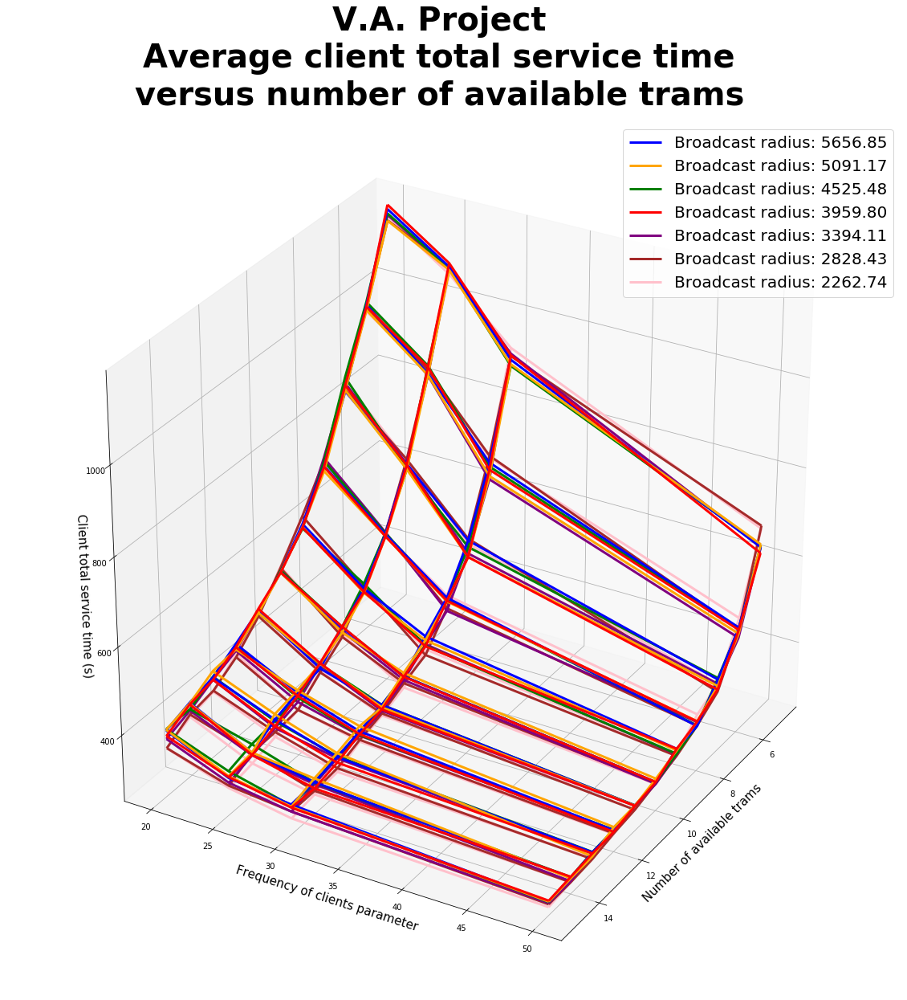

    Radius: 5656 m (1.0)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5         1171.9 +- 97.1       1078.0 +- 108.9        905.5 +- 115.5   
6          994.5 +- 94.5        875.2 +- 103.7        710.7 +- 110.9   
7         836.8 +- 107.4        709.3 +- 103.4         572.0 +- 93.2   
8          706.0 +- 72.3         587.7 +- 80.4         481.2 +- 74.6   
9          613.2 +- 97.2         504.4 +- 78.2         434.4 +- 70.7   
10         543.8 +- 95.9         455.6 +- 63.8         384.8 +- 36.9   
11         497.4 +- 70.4         404.9 +- 62.6         363.0 +- 37.7   
12         463.5 +- 70.2         393.2 +- 47.3         346.7 +- 53.3   
13         430.1 +- 55.2         375.7 +- 50.1         333.1 +- 32.0   
14         416.4 +- 61.1         344.3 +- 40.0         321.0 +- 34.4   
15         397.5 +- 51.5         332.3 +- 45.4         316.4 +- 33.9   

                          Radius: 5091 m (0.9)                 

In [51]:
# Average total waiting time plot

fig = plt.figure(figsize=(20, 20))
fig.suptitle("V.A. Project\nAverage client total service time\nversus number of available trams", fontweight='bold', fontsize=40)
ax = fig.add_subplot(111, projection='3d')

for i in range(len(c_radius)):
    ax.plot_wireframe( np.array(X[c_radius[i]]), np.array(Y[c_radius[i]]), np.array(mat_delTime[c_radius[i]]), 
                       color=colors[i], linewidth=3,
                       label="Broadcast radius: {:.2f}".format(map_size*c_radius[i]) )

ax.set_xlabel("Number of available trams", fontsize=15)
ax.set_ylabel("Frequency of clients parameter", fontsize=15)
# (the bigger it is, the less often clients arrive)
ax.set_zlabel("Client total service time (s)", fontsize=15)

plt.legend(prop={'size': 20})

ax.view_init(azim=30)

plt.show()

# tab = pd.DataFrame(m_wait_time, index=n_trains)
tab = pd.DataFrame(tab_delTime, index=n_trains)

print(tab)

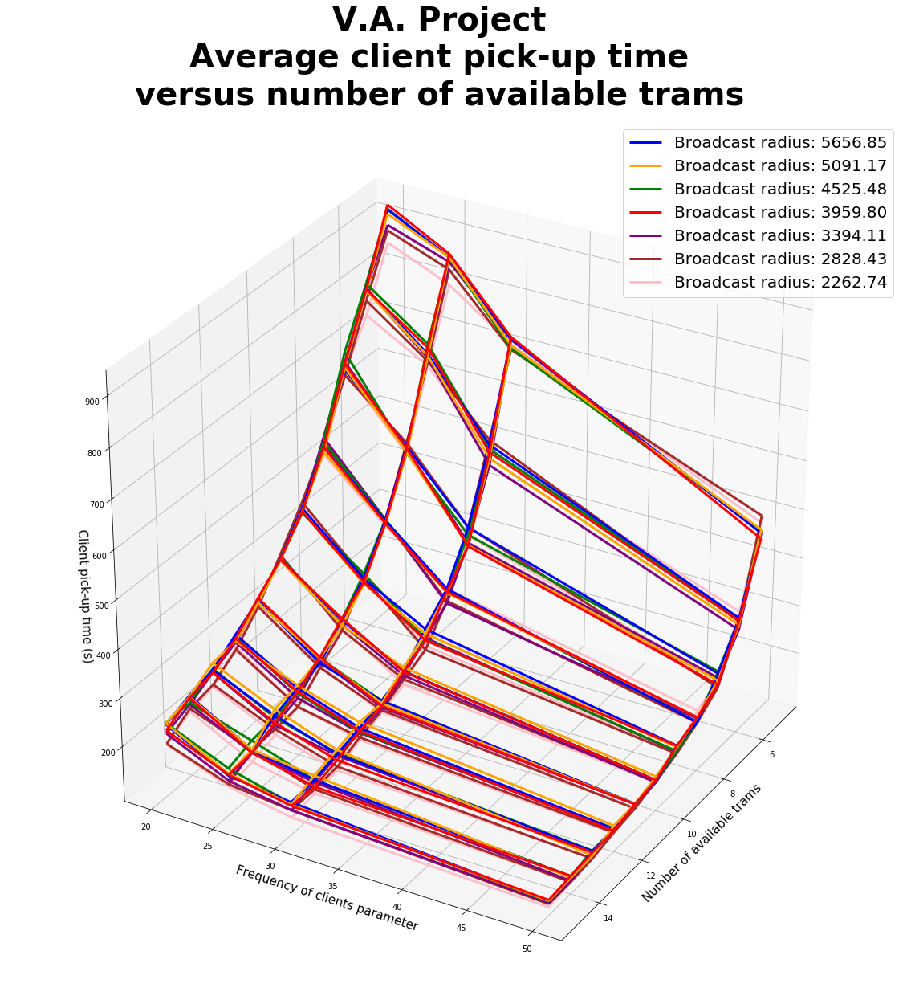

Radius: 5656 m (1.0)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5          921.5 +- 94.3        857.3 +- 104.1        724.8 +- 108.2   
6          795.2 +- 85.3         693.7 +- 95.7        541.4 +- 106.4   
7         663.0 +- 100.7         539.4 +- 97.6         406.2 +- 86.7   
8          538.9 +- 69.9         421.7 +- 76.3         315.5 +- 69.4   
9          449.0 +- 94.3         338.4 +- 80.0         269.6 +- 66.4   
10         380.3 +- 93.8         289.8 +- 60.2         220.0 +- 35.5   
11         332.8 +- 68.4         238.5 +- 57.5         198.3 +- 36.9   
12         300.2 +- 67.3         226.4 +- 42.1         181.9 +- 48.4   
13         266.3 +- 53.3         209.4 +- 48.0         168.7 +- 26.8   
14         252.9 +- 58.5         178.5 +- 38.4         156.5 +- 32.6   
15         233.3 +- 47.6         166.3 +- 44.3         152.1 +- 28.4   

                          Radius: 5091 m (0.9)                        \
   Arrival parameter: 50 Arrival parameter: 20 Arrival parameter: 25   
5          463.8 +- 84.8         912.6 +- 75.1        856.8 +- 106.0   
6          325.6 +- 88.3        791.2 +- 120.5        689.8 +- 102.5   
7          249.3 +- 45.8        667.8 +- 101.2         527.8 +- 79.7   
8          187.2 +- 21.8         528.8 +- 89.4         416.1 +- 65.9   
9          180.0 +- 46.9         442.4 +- 86.9         327.3 +- 68.4   
10         149.0 +- 26.4         377.8 +- 76.1         278.8 +- 55.1   
11         142.4 +- 22.4         327.9 +- 67.0         249.1 +- 45.5   
12         132.7 +- 20.1         286.7 +- 60.9         232.4 +- 52.2   
13         130.2 +- 20.5         280.4 +- 54.2         222.7 +- 63.5   
14         121.1 +- 26.7         250.0 +- 58.3         179.3 +- 36.7   
15         114.7 +- 14.9         235.2 +- 58.5         171.0 +- 33.8   

                                                Radius: 4525 m (0.8)  \
   Arrival parameter: 30 Arrival parameter: 50 Arrival parameter: 20   
5          710.8 +- 98.0        470.3 +- 105.9         923.2 +- 91.0   
6          513.4 +- 94.8         311.6 +- 60.8        804.8 +- 107.2   
7          368.4 +- 87.7         234.6 +- 39.2        699.7 +- 104.3   
8          307.0 +- 58.5         198.1 +- 32.6         550.9 +- 90.8   
9          260.1 +- 55.4         176.6 +- 32.7         438.9 +- 87.4   
10         228.3 +- 52.1         157.1 +- 24.4         381.9 +- 65.1   
11         193.1 +- 49.1         141.9 +- 24.1         327.7 +- 67.6   
12         194.2 +- 36.5         139.9 +- 24.4         294.2 +- 65.3   
13         177.3 +- 37.1         121.1 +- 16.5         268.5 +- 53.2   
14         165.4 +- 28.9         118.7 +- 20.5         237.6 +- 48.3   
15         147.0 +- 21.8         115.3 +- 12.7         236.7 +- 50.2   

                          ...  Radius: 3394 m (0.6)                        \
   Arrival parameter: 25  ... Arrival parameter: 30 Arrival parameter: 50   
5         856.0 +- 105.2  ...         721.9 +- 84.0         464.2 +- 90.7   
6          714.6 +- 65.4  ...         499.0 +- 95.4         301.0 +- 69.7   
7          526.0 +- 81.9  ...         373.8 +- 73.8         240.4 +- 45.0   
8          423.4 +- 77.3  ...         284.6 +- 68.0         195.4 +- 39.2   
9          348.7 +- 68.6  ...         251.0 +- 62.5         166.9 +- 29.7   
10         291.2 +- 39.8  ...         211.4 +- 49.2         144.9 +- 18.6   
11         248.4 +- 47.8  ...         184.3 +- 31.5         141.8 +- 18.4   
12         215.5 +- 39.8  ...         171.8 +- 27.5         131.8 +- 24.4   
13         205.4 +- 39.4  ...         165.5 +- 26.3         127.5 +- 29.2   
14         198.3 +- 44.7  ...         151.6 +- 28.5         112.5 +- 13.2   
15         181.8 +- 35.5  ...         135.5 +- 26.5         111.7 +- 16.4   

    Radius: 2828 m (0.5)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5          879.5 +- 72.8        831.8 +- 109.3 

In [48]:
# Average total waiting time plot

fig = plt.figure(figsize=(20, 20))
fig.suptitle("V.A. Project\nAverage client pick-up time\nversus number of available trams", fontweight='bold', fontsize=40)
ax = fig.add_subplot(111, projection='3d')

for i in range(len(c_radius)):
    ax.plot_wireframe( np.array(X[c_radius[i]]), np.array(Y[c_radius[i]]), np.array(mat_waitTime[c_radius[i]]), 
                       color=colors[i], linewidth=3,
                       label="Broadcast radius: {:.2f}".format(map_size*c_radius[i]) )

ax.set_xlabel("Number of available trams", fontsize=15)
ax.set_ylabel("Frequency of clients parameter", fontsize=15)
# (the bigger it is, the less often clients arrive)
ax.set_zlabel("Client pick-up time (s)", fontsize=15)

plt.legend(prop={'size': 20})

ax.view_init(azim=30)

plt.show()

# tab = pd.DataFrame(m_wait_time, index=n_trains)
tab = pd.DataFrame(tab_waitTime, index=n_trains)

tab

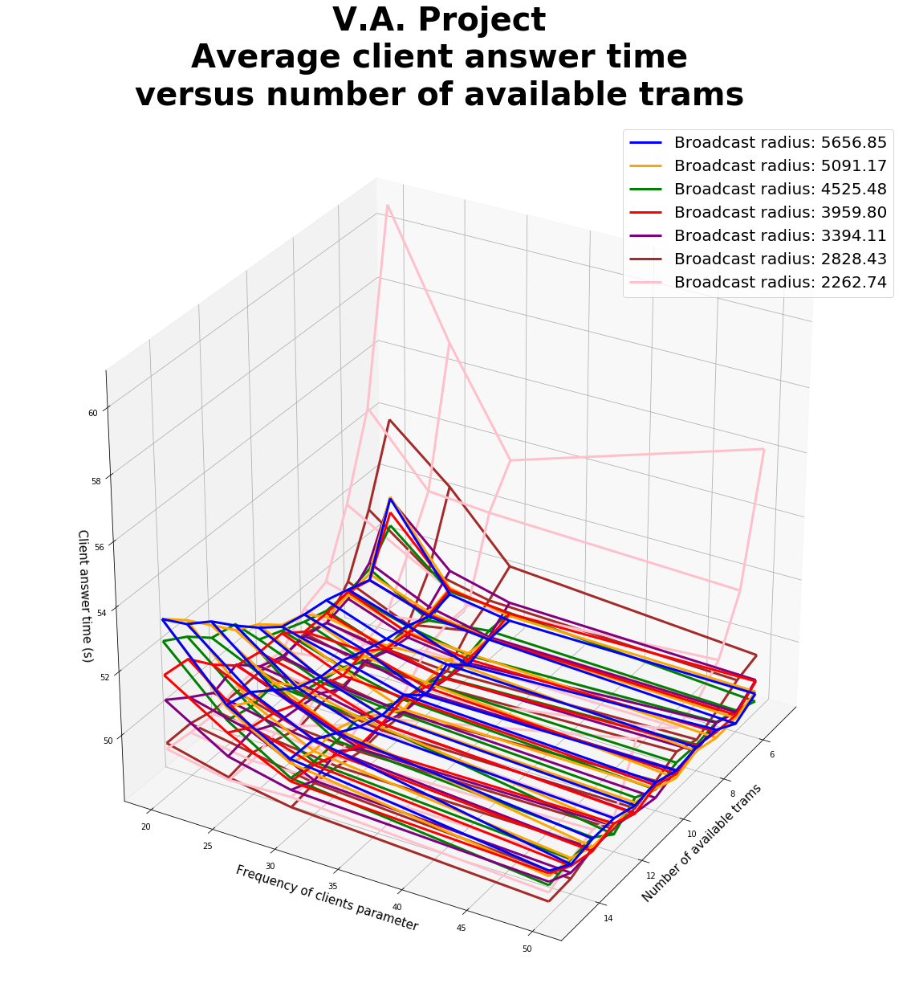

Radius: 5656 m (1.0)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5            51.5 +- 4.1           48.9 +- 0.9           48.6 +- 0.7   
6            49.4 +- 1.3           48.7 +- 1.2           48.6 +- 0.7   
7            49.7 +- 1.1           49.0 +- 0.8           48.3 +- 0.5   
8            49.9 +- 0.8           49.2 +- 0.6           48.9 +- 0.7   
9            50.0 +- 1.3           49.4 +- 0.8           48.5 +- 0.8   
10           50.2 +- 0.8           49.7 +- 0.6           49.2 +- 0.7   
11           50.8 +- 1.2           49.8 +- 0.8           49.1 +- 1.0   
12           51.5 +- 1.5           50.1 +- 1.0           49.4 +- 0.7   
13           52.2 +- 2.2           50.6 +- 1.2           49.8 +- 1.1   
14           52.7 +- 1.8           51.2 +- 1.4           50.2 +- 1.2   
15           53.5 +- 2.7           51.4 +- 1.8           50.3 +- 1.4   

                          Radius: 5091 m (0.9)                        \
   Arrival parameter: 50 Arrival parameter: 20 Arrival parameter: 25   
5            48.5 +- 1.0           51.6 +- 4.6           49.1 +- 1.1   
6            48.1 +- 0.5           49.6 +- 1.6           48.9 +- 0.8   
7            48.6 +- 0.8           49.5 +- 0.9           48.8 +- 0.6   
8            48.6 +- 0.8           49.3 +- 0.6           49.0 +- 0.7   
9            48.5 +- 0.8           50.0 +- 0.9           49.2 +- 0.8   
10           48.8 +- 0.6           50.3 +- 1.2           49.4 +- 0.8   
11           48.7 +- 0.8           50.9 +- 1.3           49.8 +- 1.0   
12           49.0 +- 1.0           51.3 +- 1.2           50.1 +- 1.0   
13           49.0 +- 1.1           52.1 +- 1.3           50.8 +- 1.0   
14           48.8 +- 0.7           52.8 +- 2.1           50.8 +- 1.0   
15           49.3 +- 1.1           53.5 +- 2.4           51.3 +- 1.2   

                                                Radius: 4525 m (0.8)  \
   Arrival parameter: 30 Arrival parameter: 50 Arrival parameter: 20   
5            48.7 +- 1.1           48.6 +- 0.9           50.6 +- 2.7   
6            48.6 +- 0.8           48.3 +- 0.6           49.8 +- 1.6   
7            48.7 +- 0.7           48.3 +- 0.7           49.6 +- 1.3   
8            49.1 +- 1.1           48.5 +- 0.8           49.5 +- 0.8   
9            49.0 +- 0.8           48.3 +- 0.7           49.8 +- 1.1   
10           48.7 +- 0.8           48.6 +- 0.7           50.1 +- 0.6   
11           49.2 +- 0.7           48.8 +- 0.9           50.4 +- 0.9   
12           49.7 +- 1.0           48.7 +- 0.9           51.5 +- 1.5   
13           50.0 +- 1.0           48.7 +- 0.6           51.7 +- 1.6   
14           49.9 +- 0.9           49.0 +- 0.6           52.3 +- 1.6   
15           50.1 +- 1.2           49.1 +- 0.9           52.8 +- 1.8   

                          ...  Radius: 3394 m (0.6)                        \
   Arrival parameter: 25  ... Arrival parameter: 30 Arrival parameter: 50   
5            49.0 +- 1.0  ...           49.2 +- 0.9           49.0 +- 0.8   
6            48.6 +- 0.6  ...           48.6 +- 0.8           48.5 +- 0.7   
7            49.0 +- 0.9  ...           48.4 +- 0.7           48.8 +- 1.2   
8            48.9 +- 0.5  ...           48.5 +- 0.6           48.5 +- 0.9   
9            49.1 +- 0.6  ...           48.6 +- 0.7           48.5 +- 0.8   
10           49.5 +- 0.9  ...           48.6 +- 0.7           48.3 +- 0.6   
11           49.6 +- 0.8  ...           48.9 +- 0.6           48.5 +- 0.5   
12           49.8 +- 0.9  ...           48.7 +- 0.6           48.7 +- 0.8   
13           50.8 +- 1.2  ...           49.2 +- 0.9           48.6 +- 0.9   
14           50.7 +- 1.3  ...           48.9 +- 0.9           48.6 +- 0.9   
15           50.9 +- 1.2  ...           49.3 +- 0.7           48.9 +- 0.7   

    Radius: 2828 m (0.5)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5            54.1 +- 4.6           52.4 +- 2.8 

In [49]:
# Average train assignment time plot

fig = plt.figure(figsize=(20, 20))
fig.suptitle("V.A. Project\nAverage client answer time\nversus number of available trams", fontweight='bold', fontsize=40)
ax = fig.add_subplot(111, projection='3d')

for i in range(len(c_radius)):
    ax.plot_wireframe( np.array(X[c_radius[i]]), np.array(Y[c_radius[i]]), np.array(mat_trainTime[c_radius[i]]), 
                       color=colors[i], linewidth=3,
                       label="Broadcast radius: {:.2f}".format(map_size*c_radius[i]) )

ax.set_xlabel("Number of available trams", fontsize=15)
ax.set_ylabel("Frequency of clients parameter", fontsize=15)
# (the bigger it is, the less often clients arrive)
ax.set_zlabel("Client answer time (s)", fontsize=15)

plt.legend(prop={'size': 20})

ax.view_init(azim=30)

plt.show()

tab = pd.DataFrame(tab_trainTime, index=n_trains)

tab

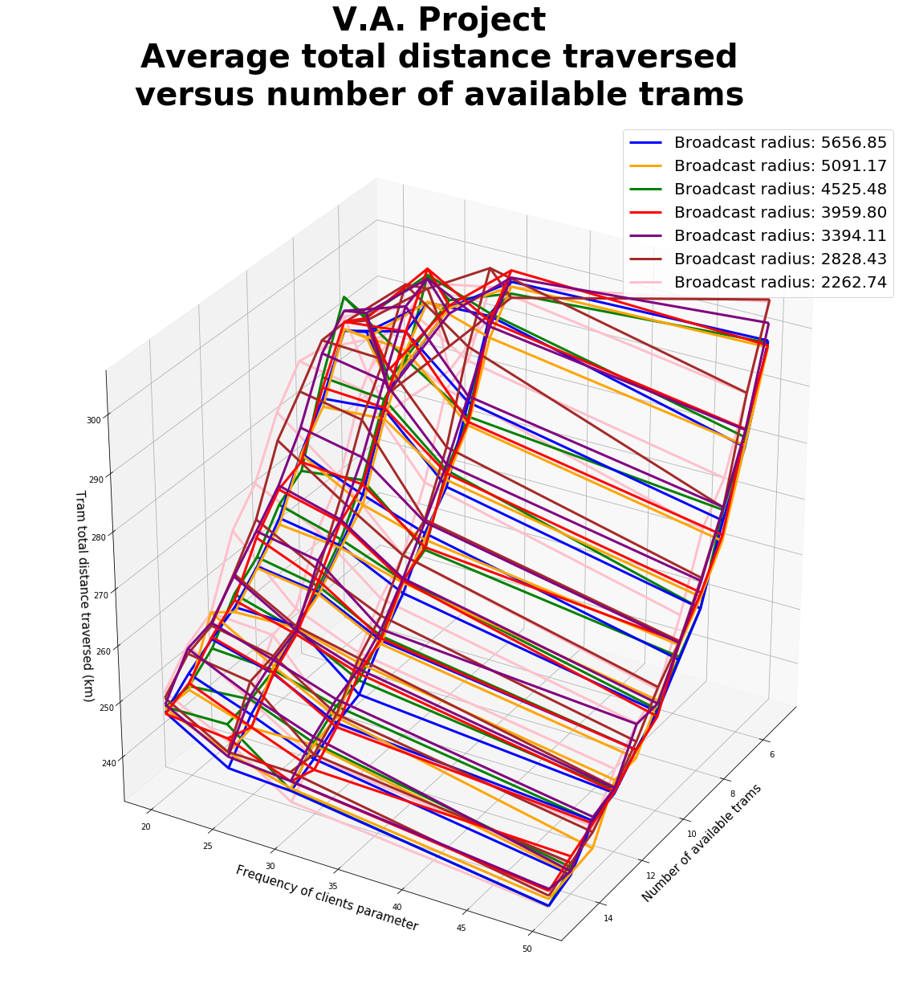

Radius: 5656 m (1.0)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5   (273.1 +- 17.7) 10^3  (290.4 +- 10.2) 10^3  (297.8 +- 13.5) 10^3   
6   (286.2 +- 12.8) 10^3  (294.2 +- 14.3) 10^3  (294.7 +- 16.2) 10^3   
7   (289.4 +- 10.3) 10^3  (292.1 +- 18.4) 10^3  (282.5 +- 17.8) 10^3   
8   (280.3 +- 12.7) 10^3  (281.3 +- 18.4) 10^3  (270.5 +- 16.0) 10^3   
9   (273.6 +- 13.7) 10^3  (269.2 +- 14.8) 10^3  (265.4 +- 13.9) 10^3   
10  (265.1 +- 14.1) 10^3  (263.3 +- 14.4) 10^3  (257.9 +- 14.5) 10^3   
11  (259.7 +- 14.3) 10^3  (258.2 +- 15.6) 10^3  (252.8 +- 12.6) 10^3   
12  (255.7 +- 14.2) 10^3  (255.6 +- 16.9) 10^3  (246.4 +- 16.1) 10^3   
13  (253.3 +- 15.8) 10^3  (250.3 +- 14.5) 10^3  (244.8 +- 15.5) 10^3   
14  (250.5 +- 13.0) 10^3  (246.5 +- 15.3) 10^3  (241.9 +- 13.3) 10^3   
15  (247.0 +- 12.8) 10^3  (240.4 +- 14.6) 10^3  (239.8 +- 14.4) 10^3   

                          Radius: 5091 m (0.9)                        \
   Arrival parameter: 50 Arrival parameter: 20 Arrival parameter: 25   
5   (298.9 +- 11.7) 10^3  (273.6 +- 13.3) 10^3  (290.4 +- 14.0) 10^3   
6   (283.4 +- 13.3) 10^3  (285.1 +- 14.4) 10^3  (294.4 +- 15.5) 10^3   
7   (273.7 +- 11.7) 10^3  (289.7 +- 12.2) 10^3  (288.7 +- 19.0) 10^3   
8   (261.4 +- 13.2) 10^3  (278.9 +- 13.7) 10^3  (279.6 +- 16.0) 10^3   
9   (255.7 +- 17.4) 10^3  (273.4 +- 11.9) 10^3  (267.4 +- 16.3) 10^3   
10  (249.9 +- 13.6) 10^3  (264.0 +- 12.2) 10^3  (262.9 +- 13.3) 10^3   
11  (246.7 +- 11.6) 10^3  (259.4 +- 14.2) 10^3  (257.9 +- 12.5) 10^3   
12  (242.5 +- 12.3) 10^3  (254.8 +- 14.4) 10^3  (255.2 +- 16.5) 10^3   
13  (241.3 +- 12.9) 10^3  (258.1 +- 12.7) 10^3  (251.7 +- 17.6) 10^3   
14  (235.3 +- 10.4) 10^3  (247.6 +- 14.5) 10^3  (244.1 +- 16.4) 10^3   
15  (233.6 +- 12.9) 10^3  (247.7 +- 13.0) 10^3  (243.2 +- 14.7) 10^3   

                                                Radius: 4525 m (0.8)  \
   Arrival parameter: 30 Arrival parameter: 50 Arrival parameter: 20   
5   (296.9 +- 10.0) 10^3  (297.7 +- 12.7) 10^3  (274.5 +- 18.5) 10^3   
6   (290.9 +- 15.5) 10^3  (283.8 +- 10.4) 10^3  (288.9 +- 12.8) 10^3   
7   (278.4 +- 15.2) 10^3  (270.1 +- 12.4) 10^3  (295.4 +- 12.5) 10^3   
8   (271.8 +- 15.2) 10^3  (263.5 +- 14.1) 10^3  (284.1 +- 12.1) 10^3   
9   (264.3 +- 12.7) 10^3  (258.3 +- 14.1) 10^3  (270.4 +- 15.2) 10^3   
10  (259.8 +- 14.9) 10^3  (251.9 +- 12.2) 10^3  (267.6 +- 10.0) 10^3   
11  (252.1 +- 17.1) 10^3  (245.2 +- 12.1) 10^3  (261.4 +- 12.6) 10^3   
12  (252.2 +- 14.9) 10^3  (244.9 +- 12.4) 10^3  (258.1 +- 12.1) 10^3   
13  (245.9 +- 14.0) 10^3  (236.3 +- 10.1) 10^3  (251.6 +- 12.0) 10^3   
14  (244.4 +- 14.6) 10^3  (235.7 +- 13.2) 10^3  (248.2 +- 11.5) 10^3   
15  (240.2 +- 14.7) 10^3  (234.8 +- 11.0) 10^3  (248.0 +- 12.9) 10^3   

                          ...  Radius: 3394 m (0.6)                        \
   Arrival parameter: 25  ... Arrival parameter: 30 Arrival parameter: 50   
5   (291.8 +- 17.9) 10^3  ...  (298.5 +- 11.4) 10^3  (301.9 +- 11.0) 10^3   
6   (299.1 +- 16.2) 10^3  ...  (292.9 +- 12.7) 10^3  (286.4 +- 14.4) 10^3   
7   (287.1 +- 15.3) 10^3  ...  (283.6 +- 14.2) 10^3  (276.1 +- 14.5) 10^3   
8   (283.1 +- 17.9) 10^3  ...  (274.6 +- 16.1) 10^3  (266.4 +- 15.5) 10^3   
9   (271.9 +- 16.3) 10^3  ...  (267.4 +- 17.7) 10^3  (258.7 +- 14.9) 10^3   
10  (264.5 +- 14.8) 10^3  ...  (260.6 +- 14.0) 10^3  (251.4 +- 13.5) 10^3   
11  (259.3 +- 11.6) 10^3  ...  (254.8 +- 11.2) 10^3  (251.3 +- 13.9) 10^3   
12  (254.8 +- 15.2) 10^3  ...  (251.1 +- 12.0) 10^3  (243.4 +- 11.7) 10^3   
13  (251.0 +- 14.6) 10^3  ...  (249.1 +- 11.9) 10^3  (242.0 +- 13.5) 10^3   
14  (249.2 +- 16.6) 10^3  ...  (245.9 +- 15.0) 10^3  (236.0 +- 11.7) 10^3   
15  (248.3 +- 15.1) 10^3  ...  (241.6 +- 15.6) 10^3  (236.7 +- 14.9) 10^3   

    Radius: 2828 m (0.5)                                              \
   Arrival parameter: 20 Arrival parameter: 25 Arrival parameter: 30   
5   (272.2 +- 14.2) 10^3  (283.6 +- 17.7) 10^3 

In [50]:
# Total distance run

fig = plt.figure(figsize=(20, 20))
fig.suptitle("V.A. Project\nAverage total distance traversed\nversus number of available trams", fontweight='bold', fontsize=40)
ax = fig.add_subplot(111, projection='3d')

for i in range(len(c_radius)):
    ax.plot_wireframe( np.array(X[c_radius[i]]), np.array(Y[c_radius[i]]), np.array(mat_trainDistace[c_radius[i]])/1000, 
                       color=colors[i], linewidth=3,
                       label="Broadcast radius: {:.2f}".format(map_size*c_radius[i]) )

ax.set_xlabel("Number of available trams", fontsize=15)
ax.set_ylabel("Frequency of clients parameter", fontsize=15)
# (the bigger it is, the less often clients arrive)
ax.set_zlabel("Tram total distance traversed (km)", fontsize=15)

plt.legend(prop={'size': 20})

ax.view_init(azim=30)

plt.show()

tab = pd.DataFrame(tab_trainDistace, index=n_trains)

tab

---

# Optimization

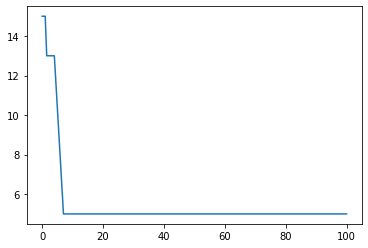

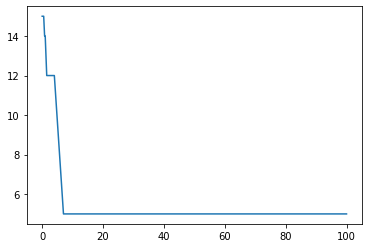

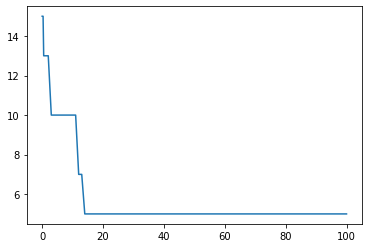

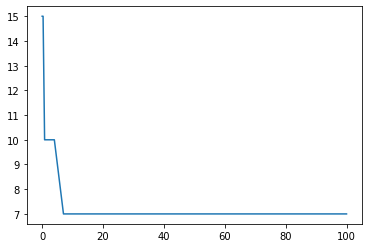

{20: {'lambda': [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5, 0.8, 1, 1.5, 2, 3, 4, 7, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 100], 'nT': [15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 13, 13, 13, 13, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5], 'cR': [0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4], 'tR': [6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001, 6788.220000000001], 'value': [356.5421166666667, 357.2961666666667, 360.64750000000004, 364.8366666666667, 398.35, 440.2416666666667, 607.80833

In [52]:
# Parâmetros de otimização

a0 = 0
a1 = 100
a2 = 20
a3 = 0.1

lambdas = [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5, 0.8, 1, 1.5, 2, 3, 4, 7, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 100]


# Otimização, para o modo "multiple clients" para os diferentes valores de lambda

otimizacao = {}

for freq in f_client:
    otimizacao[freq] = {'lambda': [], 'nT': [], 'cR': [], 'tR': [], 'value': []}
    for l in range(len(lambdas)):
        otimizacao[freq]['lambda'] += [lambdas[l]]
        otimizacao[freq]['nT'] += [None]
        otimizacao[freq]['cR'] += [None]
        otimizacao[freq]['tR'] += [None]
        otimizacao[freq]['value'] += [999999999999999999999]
        for cliR in c_radius:
            trR = 3*cliR
            for i in range(len(n_trains)):
                custo = a0 + a1*trR + a2*n_trains[i] + a3*m_train_dist[(freq, cliR)][i]/total_clients_finished
                qualidade = m_del_time[(freq, cliR)][i]
                valor = qualidade + lambdas[l]*custo

                if valor < otimizacao[freq]['value'][l]:
                    otimizacao[freq]['nT'][l] = n_trains[i]
                    otimizacao[freq]['tR'][l] = trR*map_size
                    otimizacao[freq]['cR'][l] = cliR
                    otimizacao[freq]['value'][l] = valor

    plt.plot(lambdas, otimizacao[freq]['nT'], label='Number of trams')
    plt.show()
    
print(otimizacao)

In [53]:
tab = pd.DataFrame(otimizacao)
tab

,20,25,30,50
lambda,"[0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0...","[0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0...","[0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0...","[0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0..."
nT,"[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 13, 1...","[15, 15, 15, 15, 15, 15, 15, 15, 14, 14, 12, 1...","[15, 15, 15, 15, 15, 15, 15, 13, 13, 13, 13, 1...","[15, 15, 15, 15, 15, 15, 15, 13, 10, 10, 10, 1..."
cR,"[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, ...","[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, ...","[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, ...","[0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, ..."
tR,"[6788.220000000001, 6788.220000000001, 6788.22...","[6788.220000000001, 6788.220000000001, 6788.22...","[6788.220000000001, 6788.220000000001, 6788.22...","[6788.220000000001, 6788.220000000001, 6788.22..."
value,"[356.5421166666667, 357.2961666666667, 360.647...","[309.06537916666673, 309.81129166666676, 313.1...","[284.4957958333333, 285.2304583333333, 288.495...","[267.1300666666666, 267.85816666666665, 271.09..."


In [54]:
print(20, "\n", pd.DataFrame(otimizacao[20]))
print()
print(25, "\n", pd.DataFrame(otimizacao[25]))
print()
print(30, "\n", pd.DataFrame(otimizacao[30]))
print()
print(50, "\n", pd.DataFrame(otimizacao[50]))

20 
       lambda  nT   cR       tR         value
0     0.0001  15  0.4  6788.22    356.542117
1     0.0010  15  0.4  6788.22    357.296167
2     0.0050  15  0.4  6788.22    360.647500
3     0.0100  15  0.4  6788.22    364.836667
4     0.0500  15  0.4  6788.22    398.350000
5     0.1000  15  0.4  6788.22    440.241667
6     0.3000  15  0.4  6788.22    607.808333
7     0.5000  15  0.4  6788.22    775.375000
8     0.8000  15  0.4  6788.22   1026.725000
9     1.0000  15  0.4  6788.22   1194.291667
10    1.5000  13  0.4  6788.22   1611.653333
11    2.0000  13  0.4  6788.22   2016.695000
12    3.0000  13  0.4  6788.22   2826.778333
13    4.0000  13  0.4  6788.22   3636.861667
14    7.0000   5  0.4  6788.22   5831.772500
15   10.0000   5  0.4  6788.22   7835.772500
16   11.0000   5  0.4  6788.22   8503.772500
17   12.0000   5  0.4  6788.22   9171.772500
18   13.0000   5  0.4  6788.22   9839.772500
19   14.0000   5  0.4  6788.22  10507.772500
20   15.0000   5  0.4  6788.22  11175.772500
21   